In [85]:
!!pip install xgboost

['Requirement already satisfied: xgboost in d:\\anaconda\\lib\\site-packages (1.7.2)',
 'Requirement already satisfied: scipy in d:\\anaconda\\lib\\site-packages (from xgboost) (1.9.1)',
 'Requirement already satisfied: numpy in d:\\anaconda\\lib\\site-packages (from xgboost) (1.21.5)']

In [86]:
!!pip install lightgbm

['Requirement already satisfied: lightgbm in d:\\anaconda\\lib\\site-packages (3.3.3)',
 'Requirement already satisfied: numpy in d:\\anaconda\\lib\\site-packages (from lightgbm) (1.21.5)',
 'Requirement already satisfied: scikit-learn!=0.22.0 in d:\\anaconda\\lib\\site-packages (from lightgbm) (1.0.2)',
 'Requirement already satisfied: scipy in d:\\anaconda\\lib\\site-packages (from lightgbm) (1.9.1)',
 'Requirement already satisfied: wheel in d:\\anaconda\\lib\\site-packages (from lightgbm) (0.37.1)',
 'Requirement already satisfied: threadpoolctl>=2.0.0 in d:\\anaconda\\lib\\site-packages (from scikit-learn!=0.22.0->lightgbm) (2.2.0)',
 'Requirement already satisfied: joblib>=0.11 in d:\\anaconda\\lib\\site-packages (from scikit-learn!=0.22.0->lightgbm) (1.2.0)']

In [245]:
import pandas as pd
import matplotlib.pyplot as plt
import math as mt
from sklearn.preprocessing import PolynomialFeatures
from sklearn.preprocessing import StandardScaler,MinMaxScaler
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.ensemble import VotingClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.decomposition import PCA

from sklearn.metrics import accuracy_score
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import train_test_split
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.svm import SVC

In [246]:
p_train = pd.read_csv("C:\Mobile_Price_Class\\train.csv")
p_train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2000 entries, 0 to 1999
Data columns (total 21 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   battery_power  2000 non-null   int64  
 1   blue           2000 non-null   int64  
 2   clock_speed    2000 non-null   float64
 3   dual_sim       2000 non-null   int64  
 4   fc             2000 non-null   int64  
 5   four_g         2000 non-null   int64  
 6   int_memory     2000 non-null   int64  
 7   m_dep          2000 non-null   float64
 8   mobile_wt      2000 non-null   int64  
 9   n_cores        2000 non-null   int64  
 10  pc             2000 non-null   int64  
 11  px_height      2000 non-null   int64  
 12  px_width       2000 non-null   int64  
 13  ram            2000 non-null   int64  
 14  sc_h           2000 non-null   int64  
 15  sc_w           2000 non-null   int64  
 16  talk_time      2000 non-null   int64  
 17  three_g        2000 non-null   int64  
 18  touch_sc

In [247]:
p_train['screen inch'] = p_train['sc_w']*p_train['sc_w'] +p_train['sc_h']*p_train['sc_h']
p_train['screen inch'].astype(float)
p_train['screen inch'] =p_train['screen inch']**(1/2)
p_train['screen inch'] =p_train['screen inch']/2.54 #스크린 크기는 inch 단위로 변경
p_train['screen inch'] =round(p_train['screen inch'],2)
## 스크린 크기 소수점 세번째 자리에서 반올림
p_train['ram'].astype(float)
p_train['ram'] =p_train['ram']/1000
p_train['ram'] =round(p_train['ram'],1)
## Ram GB단위로 변환하고 소수점 두번째 자리에서 반올림

p_train["Total_px"]= p_train['px_width']*p_train['px_height']
# 해상도 픽셀은 전체 픽셀개수로 전환

p_train.drop(['sc_h','sc_w'],axis=1,inplace=True)  # 기존스크린 단위 제거 
p_train.drop(['px_height','px_width'],axis=1,inplace=True) # 픽셀 개수를 drop
p_train.drop(['m_dep','pc','talk_time'],axis=1,inplace=True) # 가격와 관련 없을것 같은 요소 제거

p_train[['blue','dual_sim','four_g','three_g','wifi','touch_screen']]=p_train[['blue','dual_sim','four_g','three_g','wifi','touch_screen']].astype('bool')
# 2진 데이터를 Bool 데이터형으로 변환

In [248]:
p_train
# price
## 0 = low cost
## 1 = medium cost
## 2 = high cost
## 3 = very high cost 
## target [ 0,1, 2, 3]

,battery_power,blue,clock_speed,dual_sim,fc,four_g,int_memory,mobile_wt,n_cores,ram,three_g,touch_screen,wifi,price_range,screen inch,Total_px
0,842,False,2.2,False,1,False,7,188,2,2.5,False,False,True,1,4.49,15120
1,1021,True,0.5,True,0,True,53,136,3,2.6,True,True,False,2,6.80,1799140
2,563,True,0.5,True,2,True,41,145,5,2.6,True,True,False,2,4.40,2167308
3,615,True,2.5,False,0,False,10,131,6,2.8,True,False,False,2,7.04,2171776
4,1821,True,1.2,False,13,True,44,141,2,1.4,True,True,False,1,3.25,1464096
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1995,794,True,0.5,True,0,True,2,106,6,0.7,True,True,False,0,5.35,2309580
1996,1965,True,2.6,True,0,False,39,187,4,2.0,True,True,True,2,5.85,1797975
1997,1911,False,0.9,True,1,True,36,108,8,3.1,True,True,False,3,3.57,1416576
1998,1512,False,0.9,False,4,True,46,145,5,0.9,True,True,True,0,8.11,225120


In [249]:
price = p_train['price_range']
p_train.drop(['price_range'],axis=1,inplace=True)

In [254]:
X_train, X_test,y_train, y_test= train_test_split(p_train,price,test_size=0.2)

0.83


<BarContainer object of 10 artists>

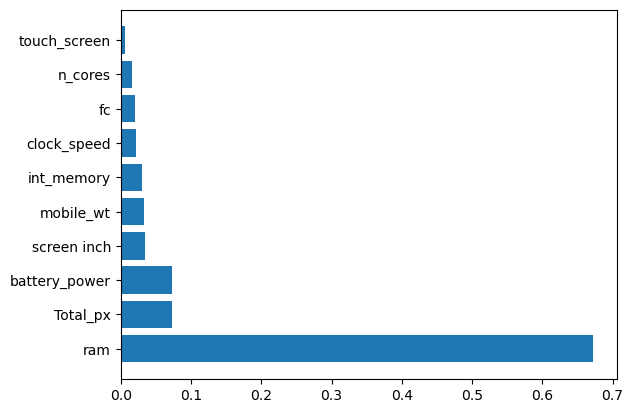

In [255]:
rf= RandomForestClassifier(n_estimators=200,max_depth=8,min_samples_leaf=8,min_samples_split=16)
rf.fit(X_train,y_train)
rf_hat = rf.predict(X_test)
print(accuracy_score(y_test,rf_hat))
imp_values = rf.feature_importances_
imp= pd.DataFrame(data=imp_values,columns=['value'])
imp['name'] = p_train.keys()
top10 = imp.sort_values(by='value',ascending=False)[:10]
plt.barh(top10['name'],top10['value'])

In [24]:
params = {
    'max_depth' : [9,15,21],
    'min_samples_split': [3,9,17],
    'min_samples_leaf':[3,5,9,13]
}

cv = GridSearchCV(rf,param_grid=params,cv=5)
cv.fit(X_train,y_train)
print(cv.best_params_)

{'max_depth': 21, 'min_samples_leaf': 3, 'min_samples_split': 9}


0.8575


<BarContainer object of 10 artists>

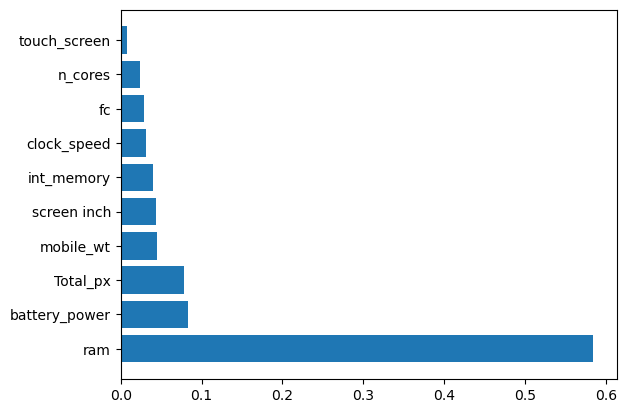

In [282]:
rf= RandomForestClassifier(n_estimators=200,max_depth=21,min_samples_leaf=3,min_samples_split=9)
rf.fit(X_train,y_train)
rf_hat = rf.predict(X_test)
print(accuracy_score(y_test,rf_hat))
imp_values = rf.feature_importances_
imp= pd.DataFrame(data=imp_values,columns=['value'])
imp['name'] = p_train.keys()
top10 = imp.sort_values(by='value',ascending=False)[:10]
plt.barh(top10['name'],top10['value'])

0.8975


<BarContainer object of 10 artists>

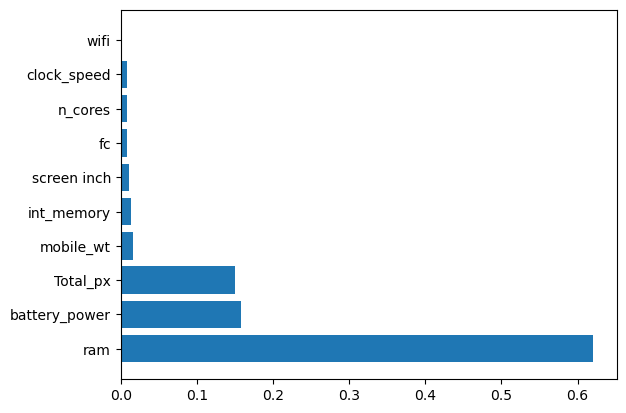

In [283]:
gbm = GradientBoostingClassifier(n_estimators=300,max_depth=51,min_samples_leaf=3,min_samples_split=9,learning_rate=0.2)
gbm.fit(X_train,y_train)
gbm_hat = gbm.predict(X_test)
print(accuracy_score(y_test,gbm_hat))
imp_values = gbm.feature_importances_
imp= pd.DataFrame(data=imp_values,columns=['value'])
imp['name'] = p_train.keys()
top10 = imp.sort_values(by='value',ascending=False)[:10]
plt.barh(top10['name'],top10['value'])

In [105]:
params = {
    'max_depth' : [9,15,21],
    'min_samples_split': [3,9,17],
    'min_samples_leaf':[3,5,9,13],
    'learning_rate' : [0.2, 0.35, 0.5]
}

cv = GridSearchCV(gbm,param_grid=params,cv=5)
cv.fit(X_train,y_train)
print(cv.best_params_)

{'learning_rate': 0.35, 'max_depth': 21, 'min_samples_leaf': 5, 'min_samples_split': 3}


0.89


<BarContainer object of 10 artists>

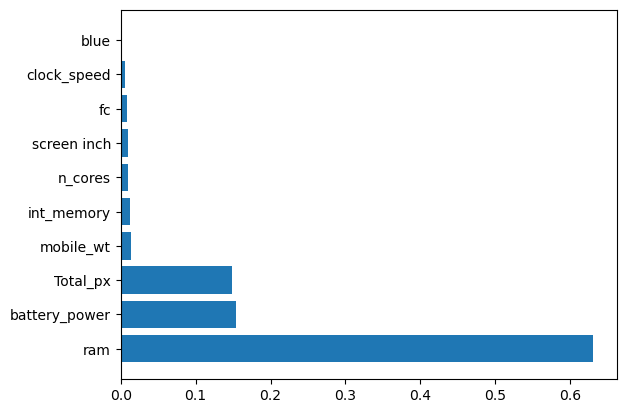

In [259]:
gbm = GradientBoostingClassifier(n_estimators=300,max_depth=21,min_samples_leaf=5,min_samples_split=3,learning_rate=0.35)
gbm.fit(X_train,y_train)
gbm_hat = gbm.predict(X_test)
print(accuracy_score(y_test,gbm_hat))
imp_values = gbm.feature_importances_
imp= pd.DataFrame(data=imp_values,columns=['value'])
imp['name'] = p_train.keys()
top10 = imp.sort_values(by='value',ascending=False)[:10]
plt.barh(top10['name'],top10['value'])

0.8375


<BarContainer object of 10 artists>

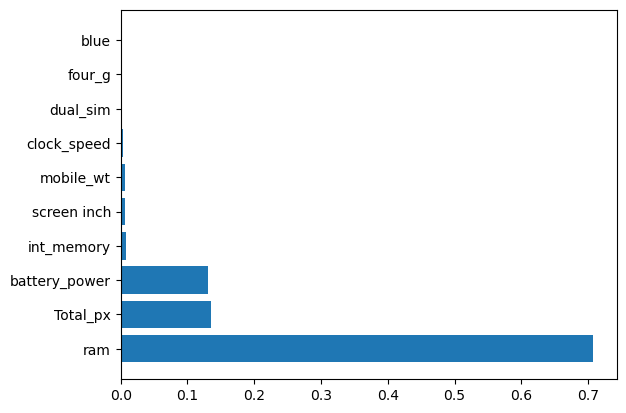

In [223]:
clf = DecisionTreeClassifier(max_depth=21,min_samples_leaf=5,min_samples_split=3)
clf.fit(X_train,y_train)
clf_hat= clf.predict(X_test)
print(accuracy_score(y_test,clf_hat))
imp_values = clf.feature_importances_
imp= pd.DataFrame(data=imp_values,columns=['value'])
imp['name'] = p_train.keys()
top10 = imp.sort_values(by='value',ascending=False)[:10]
plt.barh(top10['name'],top10['value'])

In [280]:
from xgboost import XGBClassifier
from sklearn.metrics import roc_auc_score
from xgboost import plot_importance

xgb= XGBClassifier(n_estimators=300,early_stopping_rounds=100)
xgb.fit(X_train,y_train,eval_set=[(X_test,y_test)])
xgb_hat = xgb.predict(X_test)
print(accuracy_score(y_test,xgb_hat))

[0]	validation_0-mlogloss:1.01593
[1]	validation_0-mlogloss:0.80643
[2]	validation_0-mlogloss:0.66632
[3]	validation_0-mlogloss:0.55874
[4]	validation_0-mlogloss:0.48255
[5]	validation_0-mlogloss:0.43271
[6]	validation_0-mlogloss:0.39150
[7]	validation_0-mlogloss:0.35831
[8]	validation_0-mlogloss:0.33754
[9]	validation_0-mlogloss:0.31236
[10]	validation_0-mlogloss:0.29061
[11]	validation_0-mlogloss:0.27436
[12]	validation_0-mlogloss:0.26641
[13]	validation_0-mlogloss:0.25971
[14]	validation_0-mlogloss:0.25230
[15]	validation_0-mlogloss:0.24527
[16]	validation_0-mlogloss:0.24275
[17]	validation_0-mlogloss:0.23516
[18]	validation_0-mlogloss:0.23180
[19]	validation_0-mlogloss:0.22669
[20]	validation_0-mlogloss:0.22300
[21]	validation_0-mlogloss:0.22304
[22]	validation_0-mlogloss:0.22098
[23]	validation_0-mlogloss:0.21821
[24]	validation_0-mlogloss:0.21850
[25]	validation_0-mlogloss:0.21783
[26]	validation_0-mlogloss:0.21812
[27]	validation_0-mlogloss:0.21825
[28]	validation_0-mlogloss:0.2

<AxesSubplot:title={'center':'Feature importance'}, xlabel='F score', ylabel='Features'>

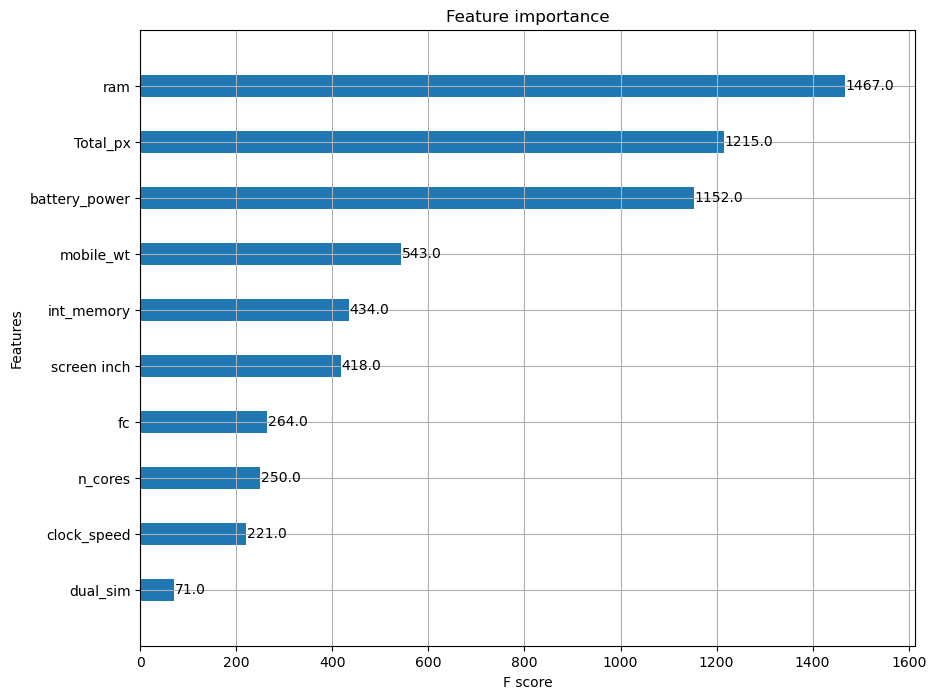

In [261]:
fig, axs= plt.subplots(1,1,figsize=(10,8))
plot_importance(xgb,ax=axs,max_num_features=10,height=0.4)

In [117]:
params = {
    'max_depth' : [11,31,51],
    'min_child_weight': [3,9,17],
    'colsample_bytree':[0.3,0.5,0.7]
}

cv =GridSearchCV(xgb,param_grid=params,cv=5)
cv.fit(X_train,y_train,eval_set=[(X_test,y_test)])
print(cv.best_params_)

[0]	validation_0-mlogloss:1.24072
[1]	validation_0-mlogloss:1.24211
[2]	validation_0-mlogloss:1.20680
[3]	validation_0-mlogloss:1.21059
[4]	validation_0-mlogloss:1.16287
[5]	validation_0-mlogloss:1.12823
[6]	validation_0-mlogloss:1.12613
[7]	validation_0-mlogloss:1.12732
[8]	validation_0-mlogloss:1.09244
[9]	validation_0-mlogloss:1.09960
[10]	validation_0-mlogloss:1.07317
[11]	validation_0-mlogloss:1.07880
[12]	validation_0-mlogloss:1.08344
[13]	validation_0-mlogloss:1.07144
[14]	validation_0-mlogloss:0.96511
[15]	validation_0-mlogloss:0.92266
[16]	validation_0-mlogloss:0.92600
[17]	validation_0-mlogloss:0.92032
[18]	validation_0-mlogloss:0.89979
[19]	validation_0-mlogloss:0.86622
[20]	validation_0-mlogloss:0.81291
[21]	validation_0-mlogloss:0.81310
[22]	validation_0-mlogloss:0.79467
[23]	validation_0-mlogloss:0.79701
[24]	validation_0-mlogloss:0.79521
[25]	validation_0-mlogloss:0.76664
[26]	validation_0-mlogloss:0.72795
[27]	validation_0-mlogloss:0.70841
[28]	validation_0-mlogloss:0.7

[231]	validation_0-mlogloss:0.43666
[232]	validation_0-mlogloss:0.43749
[233]	validation_0-mlogloss:0.43776
[234]	validation_0-mlogloss:0.43824
[235]	validation_0-mlogloss:0.43843
[236]	validation_0-mlogloss:0.43805
[237]	validation_0-mlogloss:0.43787
[238]	validation_0-mlogloss:0.43838
[239]	validation_0-mlogloss:0.43803
[240]	validation_0-mlogloss:0.43832
[241]	validation_0-mlogloss:0.43765
[242]	validation_0-mlogloss:0.43764
[243]	validation_0-mlogloss:0.43769
[244]	validation_0-mlogloss:0.43604
[245]	validation_0-mlogloss:0.43663
[246]	validation_0-mlogloss:0.43583
[247]	validation_0-mlogloss:0.43620
[248]	validation_0-mlogloss:0.43648
[249]	validation_0-mlogloss:0.43663
[250]	validation_0-mlogloss:0.43652
[251]	validation_0-mlogloss:0.43609
[252]	validation_0-mlogloss:0.43656
[253]	validation_0-mlogloss:0.43693
[254]	validation_0-mlogloss:0.43666
[255]	validation_0-mlogloss:0.43614
[256]	validation_0-mlogloss:0.43546
[257]	validation_0-mlogloss:0.43529
[258]	validation_0-mlogloss:

[162]	validation_0-mlogloss:0.42866
[163]	validation_0-mlogloss:0.42879
[164]	validation_0-mlogloss:0.42882
[165]	validation_0-mlogloss:0.43001
[166]	validation_0-mlogloss:0.42863
[167]	validation_0-mlogloss:0.42939
[168]	validation_0-mlogloss:0.42954
[169]	validation_0-mlogloss:0.42963
[170]	validation_0-mlogloss:0.42915
[171]	validation_0-mlogloss:0.42892
[172]	validation_0-mlogloss:0.42895
[173]	validation_0-mlogloss:0.42912
[174]	validation_0-mlogloss:0.42951
[175]	validation_0-mlogloss:0.43053
[176]	validation_0-mlogloss:0.43135
[177]	validation_0-mlogloss:0.43099
[178]	validation_0-mlogloss:0.42781
[179]	validation_0-mlogloss:0.42717
[180]	validation_0-mlogloss:0.42720
[181]	validation_0-mlogloss:0.42690
[182]	validation_0-mlogloss:0.42565
[183]	validation_0-mlogloss:0.42538
[184]	validation_0-mlogloss:0.42587
[185]	validation_0-mlogloss:0.42586
[186]	validation_0-mlogloss:0.42593
[187]	validation_0-mlogloss:0.42446
[188]	validation_0-mlogloss:0.42493
[189]	validation_0-mlogloss:

[93]	validation_0-mlogloss:0.49303
[94]	validation_0-mlogloss:0.49279
[95]	validation_0-mlogloss:0.49407
[96]	validation_0-mlogloss:0.49333
[97]	validation_0-mlogloss:0.49457
[98]	validation_0-mlogloss:0.49389
[99]	validation_0-mlogloss:0.49308
[100]	validation_0-mlogloss:0.49254
[101]	validation_0-mlogloss:0.49037
[102]	validation_0-mlogloss:0.49100
[103]	validation_0-mlogloss:0.48770
[104]	validation_0-mlogloss:0.48756
[105]	validation_0-mlogloss:0.48464
[106]	validation_0-mlogloss:0.48189
[107]	validation_0-mlogloss:0.48179
[108]	validation_0-mlogloss:0.48131
[109]	validation_0-mlogloss:0.47964
[110]	validation_0-mlogloss:0.47998
[111]	validation_0-mlogloss:0.47826
[112]	validation_0-mlogloss:0.47964
[113]	validation_0-mlogloss:0.47945
[114]	validation_0-mlogloss:0.47975
[115]	validation_0-mlogloss:0.48030
[116]	validation_0-mlogloss:0.47958
[117]	validation_0-mlogloss:0.47884
[118]	validation_0-mlogloss:0.47592
[119]	validation_0-mlogloss:0.47584
[120]	validation_0-mlogloss:0.47405

[22]	validation_0-mlogloss:0.80492
[23]	validation_0-mlogloss:0.80536
[24]	validation_0-mlogloss:0.80136
[25]	validation_0-mlogloss:0.77539
[26]	validation_0-mlogloss:0.73334
[27]	validation_0-mlogloss:0.71331
[28]	validation_0-mlogloss:0.71539
[29]	validation_0-mlogloss:0.71563
[30]	validation_0-mlogloss:0.70212
[31]	validation_0-mlogloss:0.68049
[32]	validation_0-mlogloss:0.68082
[33]	validation_0-mlogloss:0.65600
[34]	validation_0-mlogloss:0.64242
[35]	validation_0-mlogloss:0.64030
[36]	validation_0-mlogloss:0.61591
[37]	validation_0-mlogloss:0.61631
[38]	validation_0-mlogloss:0.60445
[39]	validation_0-mlogloss:0.60472
[40]	validation_0-mlogloss:0.60748
[41]	validation_0-mlogloss:0.59378
[42]	validation_0-mlogloss:0.57603
[43]	validation_0-mlogloss:0.56935
[44]	validation_0-mlogloss:0.54867
[45]	validation_0-mlogloss:0.54915
[46]	validation_0-mlogloss:0.55092
[47]	validation_0-mlogloss:0.53815
[48]	validation_0-mlogloss:0.53391
[49]	validation_0-mlogloss:0.53490
[50]	validation_0-ml

[252]	validation_0-mlogloss:0.41723
[253]	validation_0-mlogloss:0.41770
[254]	validation_0-mlogloss:0.41700
[255]	validation_0-mlogloss:0.41714
[256]	validation_0-mlogloss:0.41673
[257]	validation_0-mlogloss:0.41656
[258]	validation_0-mlogloss:0.41602
[259]	validation_0-mlogloss:0.41482
[260]	validation_0-mlogloss:0.41512
[261]	validation_0-mlogloss:0.41493
[262]	validation_0-mlogloss:0.41410
[263]	validation_0-mlogloss:0.41414
[264]	validation_0-mlogloss:0.41391
[265]	validation_0-mlogloss:0.41415
[266]	validation_0-mlogloss:0.41466
[267]	validation_0-mlogloss:0.41445
[268]	validation_0-mlogloss:0.41415
[269]	validation_0-mlogloss:0.41409
[270]	validation_0-mlogloss:0.41282
[271]	validation_0-mlogloss:0.41210
[272]	validation_0-mlogloss:0.41238
[273]	validation_0-mlogloss:0.41253
[274]	validation_0-mlogloss:0.41279
[275]	validation_0-mlogloss:0.41270
[276]	validation_0-mlogloss:0.41320
[277]	validation_0-mlogloss:0.41225
[278]	validation_0-mlogloss:0.41188
[279]	validation_0-mlogloss:

[183]	validation_0-mlogloss:0.44282
[184]	validation_0-mlogloss:0.44269
[185]	validation_0-mlogloss:0.44349
[186]	validation_0-mlogloss:0.44320
[187]	validation_0-mlogloss:0.44251
[188]	validation_0-mlogloss:0.44243
[189]	validation_0-mlogloss:0.44238
[190]	validation_0-mlogloss:0.44172
[191]	validation_0-mlogloss:0.44061
[192]	validation_0-mlogloss:0.44080
[193]	validation_0-mlogloss:0.44078
[194]	validation_0-mlogloss:0.43931
[195]	validation_0-mlogloss:0.43913
[196]	validation_0-mlogloss:0.43884
[197]	validation_0-mlogloss:0.43892
[198]	validation_0-mlogloss:0.43921
[199]	validation_0-mlogloss:0.43960
[200]	validation_0-mlogloss:0.43906
[201]	validation_0-mlogloss:0.43810
[202]	validation_0-mlogloss:0.43754
[203]	validation_0-mlogloss:0.43791
[204]	validation_0-mlogloss:0.43815
[205]	validation_0-mlogloss:0.43832
[206]	validation_0-mlogloss:0.43904
[207]	validation_0-mlogloss:0.43899
[208]	validation_0-mlogloss:0.43884
[209]	validation_0-mlogloss:0.43919
[210]	validation_0-mlogloss:

[114]	validation_0-mlogloss:0.40966
[115]	validation_0-mlogloss:0.41051
[116]	validation_0-mlogloss:0.41038
[117]	validation_0-mlogloss:0.40968
[118]	validation_0-mlogloss:0.40621
[119]	validation_0-mlogloss:0.40594
[120]	validation_0-mlogloss:0.40579
[121]	validation_0-mlogloss:0.40553
[122]	validation_0-mlogloss:0.40490
[123]	validation_0-mlogloss:0.40520
[124]	validation_0-mlogloss:0.40455
[125]	validation_0-mlogloss:0.40503
[126]	validation_0-mlogloss:0.40562
[127]	validation_0-mlogloss:0.40577
[128]	validation_0-mlogloss:0.40484
[129]	validation_0-mlogloss:0.40561
[130]	validation_0-mlogloss:0.40629
[131]	validation_0-mlogloss:0.40336
[132]	validation_0-mlogloss:0.40433
[133]	validation_0-mlogloss:0.40420
[134]	validation_0-mlogloss:0.40379
[135]	validation_0-mlogloss:0.40444
[136]	validation_0-mlogloss:0.40440
[137]	validation_0-mlogloss:0.40452
[138]	validation_0-mlogloss:0.40444
[139]	validation_0-mlogloss:0.40366
[140]	validation_0-mlogloss:0.40367
[141]	validation_0-mlogloss:

[44]	validation_0-mlogloss:0.49088
[45]	validation_0-mlogloss:0.49149
[46]	validation_0-mlogloss:0.49130
[47]	validation_0-mlogloss:0.48162
[48]	validation_0-mlogloss:0.47708
[49]	validation_0-mlogloss:0.47605
[50]	validation_0-mlogloss:0.47274
[51]	validation_0-mlogloss:0.47284
[52]	validation_0-mlogloss:0.46565
[53]	validation_0-mlogloss:0.46489
[54]	validation_0-mlogloss:0.46333
[55]	validation_0-mlogloss:0.45701
[56]	validation_0-mlogloss:0.45240
[57]	validation_0-mlogloss:0.44916
[58]	validation_0-mlogloss:0.44834
[59]	validation_0-mlogloss:0.45016
[60]	validation_0-mlogloss:0.44677
[61]	validation_0-mlogloss:0.44494
[62]	validation_0-mlogloss:0.44177
[63]	validation_0-mlogloss:0.43934
[64]	validation_0-mlogloss:0.43976
[65]	validation_0-mlogloss:0.43650
[66]	validation_0-mlogloss:0.43803
[67]	validation_0-mlogloss:0.43252
[68]	validation_0-mlogloss:0.42839
[69]	validation_0-mlogloss:0.42773
[70]	validation_0-mlogloss:0.42657
[71]	validation_0-mlogloss:0.42015
[72]	validation_0-ml

[274]	validation_0-mlogloss:0.37612
[275]	validation_0-mlogloss:0.37583
[276]	validation_0-mlogloss:0.37610
[277]	validation_0-mlogloss:0.37601
[278]	validation_0-mlogloss:0.37546
[279]	validation_0-mlogloss:0.37588
[280]	validation_0-mlogloss:0.37560
[281]	validation_0-mlogloss:0.37462
[282]	validation_0-mlogloss:0.37414
[283]	validation_0-mlogloss:0.37453
[284]	validation_0-mlogloss:0.37330
[285]	validation_0-mlogloss:0.37330
[286]	validation_0-mlogloss:0.37250
[287]	validation_0-mlogloss:0.37235
[288]	validation_0-mlogloss:0.37216
[289]	validation_0-mlogloss:0.37288
[290]	validation_0-mlogloss:0.37209
[291]	validation_0-mlogloss:0.37230
[292]	validation_0-mlogloss:0.37240
[293]	validation_0-mlogloss:0.37265
[294]	validation_0-mlogloss:0.37256
[295]	validation_0-mlogloss:0.37308
[296]	validation_0-mlogloss:0.37273
[297]	validation_0-mlogloss:0.37296
[298]	validation_0-mlogloss:0.37302
[299]	validation_0-mlogloss:0.37254
[0]	validation_0-mlogloss:1.23712
[1]	validation_0-mlogloss:1.23

[205]	validation_0-mlogloss:0.38437
[206]	validation_0-mlogloss:0.38489
[207]	validation_0-mlogloss:0.38483
[208]	validation_0-mlogloss:0.38441
[209]	validation_0-mlogloss:0.38435
[210]	validation_0-mlogloss:0.38461
[211]	validation_0-mlogloss:0.38435
[212]	validation_0-mlogloss:0.38451
[213]	validation_0-mlogloss:0.38477
[214]	validation_0-mlogloss:0.38517
[215]	validation_0-mlogloss:0.38527
[216]	validation_0-mlogloss:0.38555
[217]	validation_0-mlogloss:0.38523
[218]	validation_0-mlogloss:0.38465
[219]	validation_0-mlogloss:0.38404
[220]	validation_0-mlogloss:0.38385
[221]	validation_0-mlogloss:0.38393
[222]	validation_0-mlogloss:0.38360
[223]	validation_0-mlogloss:0.38331
[224]	validation_0-mlogloss:0.38396
[225]	validation_0-mlogloss:0.38363
[226]	validation_0-mlogloss:0.38350
[227]	validation_0-mlogloss:0.38335
[228]	validation_0-mlogloss:0.38299
[229]	validation_0-mlogloss:0.38332
[230]	validation_0-mlogloss:0.38238
[231]	validation_0-mlogloss:0.38276
[232]	validation_0-mlogloss:

[136]	validation_0-mlogloss:0.40271
[137]	validation_0-mlogloss:0.40216
[138]	validation_0-mlogloss:0.40191
[139]	validation_0-mlogloss:0.40124
[140]	validation_0-mlogloss:0.40168
[141]	validation_0-mlogloss:0.40124
[142]	validation_0-mlogloss:0.40199
[143]	validation_0-mlogloss:0.40192
[144]	validation_0-mlogloss:0.40054
[145]	validation_0-mlogloss:0.39955
[146]	validation_0-mlogloss:0.39858
[147]	validation_0-mlogloss:0.39816
[148]	validation_0-mlogloss:0.39789
[149]	validation_0-mlogloss:0.39819
[150]	validation_0-mlogloss:0.39784
[151]	validation_0-mlogloss:0.39835
[152]	validation_0-mlogloss:0.39844
[153]	validation_0-mlogloss:0.39829
[154]	validation_0-mlogloss:0.39830
[155]	validation_0-mlogloss:0.39886
[156]	validation_0-mlogloss:0.39861
[157]	validation_0-mlogloss:0.39887
[158]	validation_0-mlogloss:0.40011
[159]	validation_0-mlogloss:0.40081
[160]	validation_0-mlogloss:0.40130
[161]	validation_0-mlogloss:0.40100
[162]	validation_0-mlogloss:0.40116
[163]	validation_0-mlogloss:

[66]	validation_0-mlogloss:0.42951
[67]	validation_0-mlogloss:0.42373
[68]	validation_0-mlogloss:0.42044
[69]	validation_0-mlogloss:0.41986
[70]	validation_0-mlogloss:0.42005
[71]	validation_0-mlogloss:0.41392
[72]	validation_0-mlogloss:0.41317
[73]	validation_0-mlogloss:0.41217
[74]	validation_0-mlogloss:0.41330
[75]	validation_0-mlogloss:0.41227
[76]	validation_0-mlogloss:0.41269
[77]	validation_0-mlogloss:0.41267
[78]	validation_0-mlogloss:0.41267
[79]	validation_0-mlogloss:0.41444
[80]	validation_0-mlogloss:0.41556
[81]	validation_0-mlogloss:0.41423
[82]	validation_0-mlogloss:0.41322
[83]	validation_0-mlogloss:0.41400
[84]	validation_0-mlogloss:0.41361
[85]	validation_0-mlogloss:0.41313
[86]	validation_0-mlogloss:0.41400
[87]	validation_0-mlogloss:0.41321
[88]	validation_0-mlogloss:0.41454
[89]	validation_0-mlogloss:0.41356
[90]	validation_0-mlogloss:0.41289
[91]	validation_0-mlogloss:0.41412
[92]	validation_0-mlogloss:0.41386
[93]	validation_0-mlogloss:0.41259
[94]	validation_0-ml

[295]	validation_0-mlogloss:0.36766
[296]	validation_0-mlogloss:0.36771
[297]	validation_0-mlogloss:0.36760
[298]	validation_0-mlogloss:0.36737
[299]	validation_0-mlogloss:0.36707
[0]	validation_0-mlogloss:1.23597
[1]	validation_0-mlogloss:1.23731
[2]	validation_0-mlogloss:1.19480
[3]	validation_0-mlogloss:1.19734
[4]	validation_0-mlogloss:1.14041
[5]	validation_0-mlogloss:1.09199
[6]	validation_0-mlogloss:1.09153
[7]	validation_0-mlogloss:1.08788
[8]	validation_0-mlogloss:1.04869
[9]	validation_0-mlogloss:1.04800
[10]	validation_0-mlogloss:1.01740
[11]	validation_0-mlogloss:1.01664
[12]	validation_0-mlogloss:1.02218
[13]	validation_0-mlogloss:1.00064
[14]	validation_0-mlogloss:0.89175
[15]	validation_0-mlogloss:0.85199
[16]	validation_0-mlogloss:0.85218
[17]	validation_0-mlogloss:0.84564
[18]	validation_0-mlogloss:0.82024
[19]	validation_0-mlogloss:0.78391
[20]	validation_0-mlogloss:0.72685
[21]	validation_0-mlogloss:0.72632
[22]	validation_0-mlogloss:0.70725
[23]	validation_0-mloglos

[226]	validation_0-mlogloss:0.36992
[227]	validation_0-mlogloss:0.36943
[228]	validation_0-mlogloss:0.36912
[229]	validation_0-mlogloss:0.36950
[230]	validation_0-mlogloss:0.36855
[231]	validation_0-mlogloss:0.36856
[232]	validation_0-mlogloss:0.36963
[233]	validation_0-mlogloss:0.36991
[234]	validation_0-mlogloss:0.37004
[235]	validation_0-mlogloss:0.37003
[236]	validation_0-mlogloss:0.36940
[237]	validation_0-mlogloss:0.36945
[238]	validation_0-mlogloss:0.36990
[239]	validation_0-mlogloss:0.36931
[240]	validation_0-mlogloss:0.36895
[241]	validation_0-mlogloss:0.36873
[242]	validation_0-mlogloss:0.36913
[243]	validation_0-mlogloss:0.36922
[244]	validation_0-mlogloss:0.36872
[245]	validation_0-mlogloss:0.36928
[246]	validation_0-mlogloss:0.36876
[247]	validation_0-mlogloss:0.36910
[248]	validation_0-mlogloss:0.36922
[249]	validation_0-mlogloss:0.36945
[250]	validation_0-mlogloss:0.36889
[251]	validation_0-mlogloss:0.36857
[252]	validation_0-mlogloss:0.36836
[253]	validation_0-mlogloss:

[157]	validation_0-mlogloss:0.38850
[158]	validation_0-mlogloss:0.38928
[159]	validation_0-mlogloss:0.39046
[160]	validation_0-mlogloss:0.39076
[161]	validation_0-mlogloss:0.39082
[162]	validation_0-mlogloss:0.39104
[163]	validation_0-mlogloss:0.39023
[164]	validation_0-mlogloss:0.39080
[165]	validation_0-mlogloss:0.39186
[166]	validation_0-mlogloss:0.39129
[167]	validation_0-mlogloss:0.39145
[168]	validation_0-mlogloss:0.39109
[169]	validation_0-mlogloss:0.39059
[170]	validation_0-mlogloss:0.39023
[171]	validation_0-mlogloss:0.38977
[172]	validation_0-mlogloss:0.38926
[173]	validation_0-mlogloss:0.38870
[174]	validation_0-mlogloss:0.38948
[175]	validation_0-mlogloss:0.38977
[176]	validation_0-mlogloss:0.38979
[177]	validation_0-mlogloss:0.38969
[178]	validation_0-mlogloss:0.38802
[179]	validation_0-mlogloss:0.38773
[180]	validation_0-mlogloss:0.38758
[181]	validation_0-mlogloss:0.38733
[182]	validation_0-mlogloss:0.38685
[183]	validation_0-mlogloss:0.38653
[184]	validation_0-mlogloss:

[88]	validation_0-mlogloss:0.40581
[89]	validation_0-mlogloss:0.40582
[90]	validation_0-mlogloss:0.40564
[91]	validation_0-mlogloss:0.40572
[92]	validation_0-mlogloss:0.40666
[93]	validation_0-mlogloss:0.40453
[94]	validation_0-mlogloss:0.40359
[95]	validation_0-mlogloss:0.40449
[96]	validation_0-mlogloss:0.40356
[97]	validation_0-mlogloss:0.40425
[98]	validation_0-mlogloss:0.40284
[99]	validation_0-mlogloss:0.40137
[100]	validation_0-mlogloss:0.40022
[101]	validation_0-mlogloss:0.39755
[102]	validation_0-mlogloss:0.39811
[103]	validation_0-mlogloss:0.39626
[104]	validation_0-mlogloss:0.39542
[105]	validation_0-mlogloss:0.39497
[106]	validation_0-mlogloss:0.39145
[107]	validation_0-mlogloss:0.39117
[108]	validation_0-mlogloss:0.39015
[109]	validation_0-mlogloss:0.38979
[110]	validation_0-mlogloss:0.38937
[111]	validation_0-mlogloss:0.38759
[112]	validation_0-mlogloss:0.38840
[113]	validation_0-mlogloss:0.38773
[114]	validation_0-mlogloss:0.38796
[115]	validation_0-mlogloss:0.38901
[116

[17]	validation_0-mlogloss:0.85781
[18]	validation_0-mlogloss:0.83028
[19]	validation_0-mlogloss:0.79545
[20]	validation_0-mlogloss:0.74072
[21]	validation_0-mlogloss:0.74062
[22]	validation_0-mlogloss:0.71936
[23]	validation_0-mlogloss:0.71851
[24]	validation_0-mlogloss:0.71532
[25]	validation_0-mlogloss:0.68813
[26]	validation_0-mlogloss:0.65311
[27]	validation_0-mlogloss:0.63252
[28]	validation_0-mlogloss:0.63374
[29]	validation_0-mlogloss:0.63243
[30]	validation_0-mlogloss:0.61906
[31]	validation_0-mlogloss:0.60152
[32]	validation_0-mlogloss:0.60281
[33]	validation_0-mlogloss:0.57829
[34]	validation_0-mlogloss:0.56514
[35]	validation_0-mlogloss:0.56275
[36]	validation_0-mlogloss:0.54182
[37]	validation_0-mlogloss:0.54036
[38]	validation_0-mlogloss:0.52925
[39]	validation_0-mlogloss:0.52955
[40]	validation_0-mlogloss:0.53120
[41]	validation_0-mlogloss:0.52029
[42]	validation_0-mlogloss:0.50581
[43]	validation_0-mlogloss:0.50119
[44]	validation_0-mlogloss:0.48350
[45]	validation_0-ml

[247]	validation_0-mlogloss:0.37276
[248]	validation_0-mlogloss:0.37293
[249]	validation_0-mlogloss:0.37310
[250]	validation_0-mlogloss:0.37325
[251]	validation_0-mlogloss:0.37263
[252]	validation_0-mlogloss:0.37254
[253]	validation_0-mlogloss:0.37346
[254]	validation_0-mlogloss:0.37325
[255]	validation_0-mlogloss:0.37321
[256]	validation_0-mlogloss:0.37323
[257]	validation_0-mlogloss:0.37297
[258]	validation_0-mlogloss:0.37227
[259]	validation_0-mlogloss:0.37012
[260]	validation_0-mlogloss:0.37043
[261]	validation_0-mlogloss:0.37040
[262]	validation_0-mlogloss:0.36927
[263]	validation_0-mlogloss:0.36929
[264]	validation_0-mlogloss:0.36878
[265]	validation_0-mlogloss:0.36904
[266]	validation_0-mlogloss:0.36905
[267]	validation_0-mlogloss:0.36941
[268]	validation_0-mlogloss:0.36930
[269]	validation_0-mlogloss:0.36921
[270]	validation_0-mlogloss:0.36807
[271]	validation_0-mlogloss:0.36812
[272]	validation_0-mlogloss:0.36823
[273]	validation_0-mlogloss:0.36855
[274]	validation_0-mlogloss:

[178]	validation_0-mlogloss:0.37604
[179]	validation_0-mlogloss:0.37544
[180]	validation_0-mlogloss:0.37567
[181]	validation_0-mlogloss:0.37591
[182]	validation_0-mlogloss:0.37630
[183]	validation_0-mlogloss:0.37620
[184]	validation_0-mlogloss:0.37537
[185]	validation_0-mlogloss:0.37579
[186]	validation_0-mlogloss:0.37534
[187]	validation_0-mlogloss:0.37491
[188]	validation_0-mlogloss:0.37513
[189]	validation_0-mlogloss:0.37462
[190]	validation_0-mlogloss:0.37342
[191]	validation_0-mlogloss:0.37326
[192]	validation_0-mlogloss:0.37297
[193]	validation_0-mlogloss:0.37265
[194]	validation_0-mlogloss:0.37214
[195]	validation_0-mlogloss:0.37096
[196]	validation_0-mlogloss:0.37113
[197]	validation_0-mlogloss:0.37037
[198]	validation_0-mlogloss:0.37034
[199]	validation_0-mlogloss:0.37038
[200]	validation_0-mlogloss:0.37037
[201]	validation_0-mlogloss:0.37043
[202]	validation_0-mlogloss:0.36930
[203]	validation_0-mlogloss:0.36977
[204]	validation_0-mlogloss:0.37021
[205]	validation_0-mlogloss:

[109]	validation_0-mlogloss:0.45025
[110]	validation_0-mlogloss:0.45040
[111]	validation_0-mlogloss:0.44929
[112]	validation_0-mlogloss:0.44979
[113]	validation_0-mlogloss:0.44909
[114]	validation_0-mlogloss:0.44929
[115]	validation_0-mlogloss:0.44970
[116]	validation_0-mlogloss:0.44971
[117]	validation_0-mlogloss:0.44955
[118]	validation_0-mlogloss:0.44815
[119]	validation_0-mlogloss:0.44745
[120]	validation_0-mlogloss:0.44547
[121]	validation_0-mlogloss:0.44550
[122]	validation_0-mlogloss:0.44509
[123]	validation_0-mlogloss:0.44417
[124]	validation_0-mlogloss:0.44358
[125]	validation_0-mlogloss:0.44376
[126]	validation_0-mlogloss:0.44368
[127]	validation_0-mlogloss:0.44305
[128]	validation_0-mlogloss:0.44131
[129]	validation_0-mlogloss:0.44133
[130]	validation_0-mlogloss:0.44201
[131]	validation_0-mlogloss:0.43842
[132]	validation_0-mlogloss:0.43910
[133]	validation_0-mlogloss:0.43970
[134]	validation_0-mlogloss:0.43919
[135]	validation_0-mlogloss:0.43940
[136]	validation_0-mlogloss:

[38]	validation_0-mlogloss:0.60611
[39]	validation_0-mlogloss:0.60728
[40]	validation_0-mlogloss:0.60784
[41]	validation_0-mlogloss:0.59197
[42]	validation_0-mlogloss:0.57597
[43]	validation_0-mlogloss:0.56907
[44]	validation_0-mlogloss:0.55079
[45]	validation_0-mlogloss:0.55160
[46]	validation_0-mlogloss:0.55166
[47]	validation_0-mlogloss:0.53956
[48]	validation_0-mlogloss:0.53390
[49]	validation_0-mlogloss:0.53425
[50]	validation_0-mlogloss:0.53036
[51]	validation_0-mlogloss:0.53074
[52]	validation_0-mlogloss:0.52098
[53]	validation_0-mlogloss:0.51959
[54]	validation_0-mlogloss:0.51728
[55]	validation_0-mlogloss:0.51092
[56]	validation_0-mlogloss:0.50552
[57]	validation_0-mlogloss:0.50161
[58]	validation_0-mlogloss:0.50048
[59]	validation_0-mlogloss:0.50215
[60]	validation_0-mlogloss:0.49870
[61]	validation_0-mlogloss:0.49788
[62]	validation_0-mlogloss:0.49613
[63]	validation_0-mlogloss:0.49336
[64]	validation_0-mlogloss:0.49517
[65]	validation_0-mlogloss:0.49127
[66]	validation_0-ml

[268]	validation_0-mlogloss:0.42382
[269]	validation_0-mlogloss:0.42373
[270]	validation_0-mlogloss:0.42255
[271]	validation_0-mlogloss:0.42339
[272]	validation_0-mlogloss:0.42363
[273]	validation_0-mlogloss:0.42409
[274]	validation_0-mlogloss:0.42413
[275]	validation_0-mlogloss:0.42418
[276]	validation_0-mlogloss:0.42442
[277]	validation_0-mlogloss:0.42470
[278]	validation_0-mlogloss:0.42425
[279]	validation_0-mlogloss:0.42406
[280]	validation_0-mlogloss:0.42176
[281]	validation_0-mlogloss:0.42079
[282]	validation_0-mlogloss:0.42070
[283]	validation_0-mlogloss:0.42056
[284]	validation_0-mlogloss:0.42069
[285]	validation_0-mlogloss:0.42121
[286]	validation_0-mlogloss:0.42020
[287]	validation_0-mlogloss:0.42011
[288]	validation_0-mlogloss:0.41965
[289]	validation_0-mlogloss:0.41985
[290]	validation_0-mlogloss:0.41979
[291]	validation_0-mlogloss:0.41980
[292]	validation_0-mlogloss:0.41983
[293]	validation_0-mlogloss:0.41962
[294]	validation_0-mlogloss:0.41989
[295]	validation_0-mlogloss:

[199]	validation_0-mlogloss:0.44982
[200]	validation_0-mlogloss:0.45019
[201]	validation_0-mlogloss:0.44951
[202]	validation_0-mlogloss:0.44737
[203]	validation_0-mlogloss:0.44730
[204]	validation_0-mlogloss:0.44795
[205]	validation_0-mlogloss:0.44771
[206]	validation_0-mlogloss:0.44802
[207]	validation_0-mlogloss:0.44823
[208]	validation_0-mlogloss:0.44793
[209]	validation_0-mlogloss:0.44821
[210]	validation_0-mlogloss:0.44840
[211]	validation_0-mlogloss:0.44814
[212]	validation_0-mlogloss:0.44881
[213]	validation_0-mlogloss:0.44842
[214]	validation_0-mlogloss:0.44871
[215]	validation_0-mlogloss:0.44892
[216]	validation_0-mlogloss:0.44903
[217]	validation_0-mlogloss:0.44823
[218]	validation_0-mlogloss:0.44767
[219]	validation_0-mlogloss:0.44579
[220]	validation_0-mlogloss:0.44545
[221]	validation_0-mlogloss:0.44570
[222]	validation_0-mlogloss:0.44501
[223]	validation_0-mlogloss:0.44492
[224]	validation_0-mlogloss:0.44527
[225]	validation_0-mlogloss:0.44495
[226]	validation_0-mlogloss:

[130]	validation_0-mlogloss:0.45024
[131]	validation_0-mlogloss:0.44783
[132]	validation_0-mlogloss:0.44900
[133]	validation_0-mlogloss:0.45015
[134]	validation_0-mlogloss:0.44913
[135]	validation_0-mlogloss:0.44984
[136]	validation_0-mlogloss:0.44866
[137]	validation_0-mlogloss:0.44907
[138]	validation_0-mlogloss:0.44729
[139]	validation_0-mlogloss:0.44666
[140]	validation_0-mlogloss:0.44606
[141]	validation_0-mlogloss:0.44493
[142]	validation_0-mlogloss:0.44521
[143]	validation_0-mlogloss:0.44561
[144]	validation_0-mlogloss:0.44415
[145]	validation_0-mlogloss:0.44122
[146]	validation_0-mlogloss:0.44033
[147]	validation_0-mlogloss:0.43995
[148]	validation_0-mlogloss:0.44017
[149]	validation_0-mlogloss:0.44011
[150]	validation_0-mlogloss:0.44004
[151]	validation_0-mlogloss:0.44047
[152]	validation_0-mlogloss:0.44073
[153]	validation_0-mlogloss:0.44058
[154]	validation_0-mlogloss:0.44009
[155]	validation_0-mlogloss:0.44061
[156]	validation_0-mlogloss:0.44090
[157]	validation_0-mlogloss:

[60]	validation_0-mlogloss:0.50369
[61]	validation_0-mlogloss:0.50194
[62]	validation_0-mlogloss:0.50156
[63]	validation_0-mlogloss:0.49835
[64]	validation_0-mlogloss:0.49942
[65]	validation_0-mlogloss:0.49635
[66]	validation_0-mlogloss:0.49786
[67]	validation_0-mlogloss:0.49037
[68]	validation_0-mlogloss:0.48563
[69]	validation_0-mlogloss:0.48528
[70]	validation_0-mlogloss:0.48432
[71]	validation_0-mlogloss:0.47690
[72]	validation_0-mlogloss:0.47438
[73]	validation_0-mlogloss:0.47148
[74]	validation_0-mlogloss:0.47174
[75]	validation_0-mlogloss:0.47128
[76]	validation_0-mlogloss:0.47156
[77]	validation_0-mlogloss:0.47093
[78]	validation_0-mlogloss:0.47011
[79]	validation_0-mlogloss:0.47131
[80]	validation_0-mlogloss:0.47157
[81]	validation_0-mlogloss:0.46815
[82]	validation_0-mlogloss:0.46719
[83]	validation_0-mlogloss:0.46629
[84]	validation_0-mlogloss:0.46549
[85]	validation_0-mlogloss:0.46458
[86]	validation_0-mlogloss:0.46479
[87]	validation_0-mlogloss:0.46439
[88]	validation_0-ml

[289]	validation_0-mlogloss:0.40665
[290]	validation_0-mlogloss:0.40656
[291]	validation_0-mlogloss:0.40674
[292]	validation_0-mlogloss:0.40699
[293]	validation_0-mlogloss:0.40674
[294]	validation_0-mlogloss:0.40691
[295]	validation_0-mlogloss:0.40696
[296]	validation_0-mlogloss:0.40685
[297]	validation_0-mlogloss:0.40701
[298]	validation_0-mlogloss:0.40700
[299]	validation_0-mlogloss:0.40540
[0]	validation_0-mlogloss:1.23312
[1]	validation_0-mlogloss:1.23414
[2]	validation_0-mlogloss:1.19890
[3]	validation_0-mlogloss:1.20518
[4]	validation_0-mlogloss:1.15146
[5]	validation_0-mlogloss:1.10786
[6]	validation_0-mlogloss:1.11194
[7]	validation_0-mlogloss:1.11038
[8]	validation_0-mlogloss:1.07604
[9]	validation_0-mlogloss:1.08104
[10]	validation_0-mlogloss:1.05098
[11]	validation_0-mlogloss:1.05128
[12]	validation_0-mlogloss:1.05875
[13]	validation_0-mlogloss:1.04073
[14]	validation_0-mlogloss:0.92771
[15]	validation_0-mlogloss:0.88655
[16]	validation_0-mlogloss:0.88981
[17]	validation_0-m

[220]	validation_0-mlogloss:0.41163
[221]	validation_0-mlogloss:0.41171
[222]	validation_0-mlogloss:0.41187
[223]	validation_0-mlogloss:0.41100
[224]	validation_0-mlogloss:0.41115
[225]	validation_0-mlogloss:0.41091
[226]	validation_0-mlogloss:0.41049
[227]	validation_0-mlogloss:0.41038
[228]	validation_0-mlogloss:0.40992
[229]	validation_0-mlogloss:0.40969
[230]	validation_0-mlogloss:0.40911
[231]	validation_0-mlogloss:0.40927
[232]	validation_0-mlogloss:0.41014
[233]	validation_0-mlogloss:0.40990
[234]	validation_0-mlogloss:0.40982
[235]	validation_0-mlogloss:0.40961
[236]	validation_0-mlogloss:0.40909
[237]	validation_0-mlogloss:0.40939
[238]	validation_0-mlogloss:0.40986
[239]	validation_0-mlogloss:0.41001
[240]	validation_0-mlogloss:0.41033
[241]	validation_0-mlogloss:0.41002
[242]	validation_0-mlogloss:0.41037
[243]	validation_0-mlogloss:0.41024
[244]	validation_0-mlogloss:0.40945
[245]	validation_0-mlogloss:0.40997
[246]	validation_0-mlogloss:0.40891
[247]	validation_0-mlogloss:

[151]	validation_0-mlogloss:0.39652
[152]	validation_0-mlogloss:0.39654
[153]	validation_0-mlogloss:0.39704
[154]	validation_0-mlogloss:0.39683
[155]	validation_0-mlogloss:0.39689
[156]	validation_0-mlogloss:0.39692
[157]	validation_0-mlogloss:0.39648
[158]	validation_0-mlogloss:0.39735
[159]	validation_0-mlogloss:0.39867
[160]	validation_0-mlogloss:0.39917
[161]	validation_0-mlogloss:0.39914
[162]	validation_0-mlogloss:0.39882
[163]	validation_0-mlogloss:0.39891
[164]	validation_0-mlogloss:0.39928
[165]	validation_0-mlogloss:0.40000
[166]	validation_0-mlogloss:0.39873
[167]	validation_0-mlogloss:0.39919
[168]	validation_0-mlogloss:0.39855
[169]	validation_0-mlogloss:0.39851
[170]	validation_0-mlogloss:0.39798
[171]	validation_0-mlogloss:0.39708
[172]	validation_0-mlogloss:0.39769
[173]	validation_0-mlogloss:0.39785
[174]	validation_0-mlogloss:0.39854
[175]	validation_0-mlogloss:0.39863
[176]	validation_0-mlogloss:0.39877
[177]	validation_0-mlogloss:0.39847
[178]	validation_0-mlogloss:

[82]	validation_0-mlogloss:0.42459
[83]	validation_0-mlogloss:0.42448
[84]	validation_0-mlogloss:0.42389
[85]	validation_0-mlogloss:0.42306
[86]	validation_0-mlogloss:0.42320
[87]	validation_0-mlogloss:0.42309
[88]	validation_0-mlogloss:0.42356
[89]	validation_0-mlogloss:0.42281
[90]	validation_0-mlogloss:0.42275
[91]	validation_0-mlogloss:0.42316
[92]	validation_0-mlogloss:0.42395
[93]	validation_0-mlogloss:0.42099
[94]	validation_0-mlogloss:0.42068
[95]	validation_0-mlogloss:0.42203
[96]	validation_0-mlogloss:0.42211
[97]	validation_0-mlogloss:0.42280
[98]	validation_0-mlogloss:0.42188
[99]	validation_0-mlogloss:0.42211
[100]	validation_0-mlogloss:0.42033
[101]	validation_0-mlogloss:0.41760
[102]	validation_0-mlogloss:0.41860
[103]	validation_0-mlogloss:0.41551
[104]	validation_0-mlogloss:0.41543
[105]	validation_0-mlogloss:0.41348
[106]	validation_0-mlogloss:0.41073
[107]	validation_0-mlogloss:0.41025
[108]	validation_0-mlogloss:0.41069
[109]	validation_0-mlogloss:0.40964
[110]	vali

[11]	validation_0-mlogloss:1.05466
[12]	validation_0-mlogloss:1.06420
[13]	validation_0-mlogloss:1.04758
[14]	validation_0-mlogloss:0.93877
[15]	validation_0-mlogloss:0.89714
[16]	validation_0-mlogloss:0.89843
[17]	validation_0-mlogloss:0.89456
[18]	validation_0-mlogloss:0.86920
[19]	validation_0-mlogloss:0.83422
[20]	validation_0-mlogloss:0.78219
[21]	validation_0-mlogloss:0.78175
[22]	validation_0-mlogloss:0.76242
[23]	validation_0-mlogloss:0.76234
[24]	validation_0-mlogloss:0.75862
[25]	validation_0-mlogloss:0.73161
[26]	validation_0-mlogloss:0.69242
[27]	validation_0-mlogloss:0.67123
[28]	validation_0-mlogloss:0.67376
[29]	validation_0-mlogloss:0.67502
[30]	validation_0-mlogloss:0.66406
[31]	validation_0-mlogloss:0.64324
[32]	validation_0-mlogloss:0.64514
[33]	validation_0-mlogloss:0.61972
[34]	validation_0-mlogloss:0.60638
[35]	validation_0-mlogloss:0.60369
[36]	validation_0-mlogloss:0.58458
[37]	validation_0-mlogloss:0.58383
[38]	validation_0-mlogloss:0.57248
[39]	validation_0-ml

[242]	validation_0-mlogloss:0.39408
[243]	validation_0-mlogloss:0.39399
[244]	validation_0-mlogloss:0.39312
[245]	validation_0-mlogloss:0.39345
[246]	validation_0-mlogloss:0.39336
[247]	validation_0-mlogloss:0.39373
[248]	validation_0-mlogloss:0.39377
[249]	validation_0-mlogloss:0.39395
[250]	validation_0-mlogloss:0.39380
[251]	validation_0-mlogloss:0.39362
[252]	validation_0-mlogloss:0.39345
[253]	validation_0-mlogloss:0.39342
[254]	validation_0-mlogloss:0.39333
[255]	validation_0-mlogloss:0.39322
[256]	validation_0-mlogloss:0.39318
[257]	validation_0-mlogloss:0.39321
[258]	validation_0-mlogloss:0.39264
[259]	validation_0-mlogloss:0.39115
[260]	validation_0-mlogloss:0.39125
[261]	validation_0-mlogloss:0.39118
[262]	validation_0-mlogloss:0.38986
[263]	validation_0-mlogloss:0.39011
[264]	validation_0-mlogloss:0.38971
[265]	validation_0-mlogloss:0.38963
[266]	validation_0-mlogloss:0.39020
[267]	validation_0-mlogloss:0.39031
[268]	validation_0-mlogloss:0.38974
[269]	validation_0-mlogloss:

[173]	validation_0-mlogloss:0.38235
[174]	validation_0-mlogloss:0.38247
[175]	validation_0-mlogloss:0.38307
[176]	validation_0-mlogloss:0.38331
[177]	validation_0-mlogloss:0.38346
[178]	validation_0-mlogloss:0.38147
[179]	validation_0-mlogloss:0.38090
[180]	validation_0-mlogloss:0.38104
[181]	validation_0-mlogloss:0.38148
[182]	validation_0-mlogloss:0.38155
[183]	validation_0-mlogloss:0.38064
[184]	validation_0-mlogloss:0.38047
[185]	validation_0-mlogloss:0.38169
[186]	validation_0-mlogloss:0.38159
[187]	validation_0-mlogloss:0.37925
[188]	validation_0-mlogloss:0.37913
[189]	validation_0-mlogloss:0.37896
[190]	validation_0-mlogloss:0.37865
[191]	validation_0-mlogloss:0.37917
[192]	validation_0-mlogloss:0.37883
[193]	validation_0-mlogloss:0.37856
[194]	validation_0-mlogloss:0.37824
[195]	validation_0-mlogloss:0.37798
[196]	validation_0-mlogloss:0.37841
[197]	validation_0-mlogloss:0.37857
[198]	validation_0-mlogloss:0.37888
[199]	validation_0-mlogloss:0.37931
[200]	validation_0-mlogloss:

[104]	validation_0-mlogloss:0.39684
[105]	validation_0-mlogloss:0.39535
[106]	validation_0-mlogloss:0.39253
[107]	validation_0-mlogloss:0.39137
[108]	validation_0-mlogloss:0.39079
[109]	validation_0-mlogloss:0.39025
[110]	validation_0-mlogloss:0.39042
[111]	validation_0-mlogloss:0.38901
[112]	validation_0-mlogloss:0.38945
[113]	validation_0-mlogloss:0.38845
[114]	validation_0-mlogloss:0.38929
[115]	validation_0-mlogloss:0.38931
[116]	validation_0-mlogloss:0.38969
[117]	validation_0-mlogloss:0.38998
[118]	validation_0-mlogloss:0.38864
[119]	validation_0-mlogloss:0.38789
[120]	validation_0-mlogloss:0.38747
[121]	validation_0-mlogloss:0.38702
[122]	validation_0-mlogloss:0.38660
[123]	validation_0-mlogloss:0.38705
[124]	validation_0-mlogloss:0.38687
[125]	validation_0-mlogloss:0.38677
[126]	validation_0-mlogloss:0.38710
[127]	validation_0-mlogloss:0.38581
[128]	validation_0-mlogloss:0.38332
[129]	validation_0-mlogloss:0.38331
[130]	validation_0-mlogloss:0.38314
[131]	validation_0-mlogloss:

[33]	validation_0-mlogloss:0.56586
[34]	validation_0-mlogloss:0.55496
[35]	validation_0-mlogloss:0.55253
[36]	validation_0-mlogloss:0.53594
[37]	validation_0-mlogloss:0.53476
[38]	validation_0-mlogloss:0.52521
[39]	validation_0-mlogloss:0.52599
[40]	validation_0-mlogloss:0.52774
[41]	validation_0-mlogloss:0.51415
[42]	validation_0-mlogloss:0.49858
[43]	validation_0-mlogloss:0.49305
[44]	validation_0-mlogloss:0.47630
[45]	validation_0-mlogloss:0.47648
[46]	validation_0-mlogloss:0.47680
[47]	validation_0-mlogloss:0.46906
[48]	validation_0-mlogloss:0.46642
[49]	validation_0-mlogloss:0.46639
[50]	validation_0-mlogloss:0.46379
[51]	validation_0-mlogloss:0.46398
[52]	validation_0-mlogloss:0.45713
[53]	validation_0-mlogloss:0.45610
[54]	validation_0-mlogloss:0.45408
[55]	validation_0-mlogloss:0.44866
[56]	validation_0-mlogloss:0.44452
[57]	validation_0-mlogloss:0.44033
[58]	validation_0-mlogloss:0.43966
[59]	validation_0-mlogloss:0.44051
[60]	validation_0-mlogloss:0.43351
[61]	validation_0-ml

[263]	validation_0-mlogloss:0.36258
[264]	validation_0-mlogloss:0.36251
[265]	validation_0-mlogloss:0.36297
[266]	validation_0-mlogloss:0.36329
[267]	validation_0-mlogloss:0.36368
[268]	validation_0-mlogloss:0.36334
[269]	validation_0-mlogloss:0.36330
[270]	validation_0-mlogloss:0.36245
[271]	validation_0-mlogloss:0.36179
[272]	validation_0-mlogloss:0.36170
[273]	validation_0-mlogloss:0.36221
[274]	validation_0-mlogloss:0.36226
[275]	validation_0-mlogloss:0.36210
[276]	validation_0-mlogloss:0.36204
[277]	validation_0-mlogloss:0.36142
[278]	validation_0-mlogloss:0.36105
[279]	validation_0-mlogloss:0.36064
[280]	validation_0-mlogloss:0.36030
[281]	validation_0-mlogloss:0.35945
[282]	validation_0-mlogloss:0.35945
[283]	validation_0-mlogloss:0.35978
[284]	validation_0-mlogloss:0.35987
[285]	validation_0-mlogloss:0.36024
[286]	validation_0-mlogloss:0.35930
[287]	validation_0-mlogloss:0.35899
[288]	validation_0-mlogloss:0.35878
[289]	validation_0-mlogloss:0.35864
[290]	validation_0-mlogloss:

[194]	validation_0-mlogloss:0.38193
[195]	validation_0-mlogloss:0.38200
[196]	validation_0-mlogloss:0.38174
[197]	validation_0-mlogloss:0.38177
[198]	validation_0-mlogloss:0.38230
[199]	validation_0-mlogloss:0.38202
[200]	validation_0-mlogloss:0.38239
[201]	validation_0-mlogloss:0.38139
[202]	validation_0-mlogloss:0.38004
[203]	validation_0-mlogloss:0.38008
[204]	validation_0-mlogloss:0.38036
[205]	validation_0-mlogloss:0.38012
[206]	validation_0-mlogloss:0.38007
[207]	validation_0-mlogloss:0.37980
[208]	validation_0-mlogloss:0.37961
[209]	validation_0-mlogloss:0.37948
[210]	validation_0-mlogloss:0.37934
[211]	validation_0-mlogloss:0.37955
[212]	validation_0-mlogloss:0.37845
[213]	validation_0-mlogloss:0.37895
[214]	validation_0-mlogloss:0.37952
[215]	validation_0-mlogloss:0.37956
[216]	validation_0-mlogloss:0.37984
[217]	validation_0-mlogloss:0.38030
[218]	validation_0-mlogloss:0.37946
[219]	validation_0-mlogloss:0.37900
[220]	validation_0-mlogloss:0.37908
[221]	validation_0-mlogloss:

[125]	validation_0-mlogloss:0.38786
[126]	validation_0-mlogloss:0.38832
[127]	validation_0-mlogloss:0.38822
[128]	validation_0-mlogloss:0.38612
[129]	validation_0-mlogloss:0.38672
[130]	validation_0-mlogloss:0.38547
[131]	validation_0-mlogloss:0.38357
[132]	validation_0-mlogloss:0.38386
[133]	validation_0-mlogloss:0.38436
[134]	validation_0-mlogloss:0.38399
[135]	validation_0-mlogloss:0.38450
[136]	validation_0-mlogloss:0.38385
[137]	validation_0-mlogloss:0.38370
[138]	validation_0-mlogloss:0.38344
[139]	validation_0-mlogloss:0.38311
[140]	validation_0-mlogloss:0.38297
[141]	validation_0-mlogloss:0.38204
[142]	validation_0-mlogloss:0.38182
[143]	validation_0-mlogloss:0.38192
[144]	validation_0-mlogloss:0.38081
[145]	validation_0-mlogloss:0.38069
[146]	validation_0-mlogloss:0.37951
[147]	validation_0-mlogloss:0.37890
[148]	validation_0-mlogloss:0.37840
[149]	validation_0-mlogloss:0.37822
[150]	validation_0-mlogloss:0.37805
[151]	validation_0-mlogloss:0.37778
[152]	validation_0-mlogloss:

[55]	validation_0-mlogloss:0.44494
[56]	validation_0-mlogloss:0.44018
[57]	validation_0-mlogloss:0.43724
[58]	validation_0-mlogloss:0.43647
[59]	validation_0-mlogloss:0.43780
[60]	validation_0-mlogloss:0.43471
[61]	validation_0-mlogloss:0.43318
[62]	validation_0-mlogloss:0.43319
[63]	validation_0-mlogloss:0.43080
[64]	validation_0-mlogloss:0.43105
[65]	validation_0-mlogloss:0.42899
[66]	validation_0-mlogloss:0.42995
[67]	validation_0-mlogloss:0.42351
[68]	validation_0-mlogloss:0.41962
[69]	validation_0-mlogloss:0.41959
[70]	validation_0-mlogloss:0.41814
[71]	validation_0-mlogloss:0.41699
[72]	validation_0-mlogloss:0.41599
[73]	validation_0-mlogloss:0.41469
[74]	validation_0-mlogloss:0.41550
[75]	validation_0-mlogloss:0.41406
[76]	validation_0-mlogloss:0.41485
[77]	validation_0-mlogloss:0.41440
[78]	validation_0-mlogloss:0.41427
[79]	validation_0-mlogloss:0.41528
[80]	validation_0-mlogloss:0.41572
[81]	validation_0-mlogloss:0.41399
[82]	validation_0-mlogloss:0.41268
[83]	validation_0-ml

[284]	validation_0-mlogloss:0.36000
[285]	validation_0-mlogloss:0.35994
[286]	validation_0-mlogloss:0.35889
[287]	validation_0-mlogloss:0.35885
[288]	validation_0-mlogloss:0.35823
[289]	validation_0-mlogloss:0.35873
[290]	validation_0-mlogloss:0.35868
[291]	validation_0-mlogloss:0.35928
[292]	validation_0-mlogloss:0.35913
[293]	validation_0-mlogloss:0.35885
[294]	validation_0-mlogloss:0.35913
[295]	validation_0-mlogloss:0.35860
[296]	validation_0-mlogloss:0.35864
[297]	validation_0-mlogloss:0.35917
[298]	validation_0-mlogloss:0.35944
[299]	validation_0-mlogloss:0.35838
[0]	validation_0-mlogloss:1.23856
[1]	validation_0-mlogloss:1.24152
[2]	validation_0-mlogloss:1.21000
[3]	validation_0-mlogloss:1.21351
[4]	validation_0-mlogloss:1.16237
[5]	validation_0-mlogloss:1.12867
[6]	validation_0-mlogloss:1.12824
[7]	validation_0-mlogloss:1.13028
[8]	validation_0-mlogloss:1.10061
[9]	validation_0-mlogloss:1.10811
[10]	validation_0-mlogloss:1.08356
[11]	validation_0-mlogloss:1.08515
[12]	validatio

[215]	validation_0-mlogloss:0.42806
[216]	validation_0-mlogloss:0.42782
[217]	validation_0-mlogloss:0.42805
[218]	validation_0-mlogloss:0.42747
[219]	validation_0-mlogloss:0.42677
[220]	validation_0-mlogloss:0.42693
[221]	validation_0-mlogloss:0.42703
[222]	validation_0-mlogloss:0.42644
[223]	validation_0-mlogloss:0.42597
[224]	validation_0-mlogloss:0.42595
[225]	validation_0-mlogloss:0.42589
[226]	validation_0-mlogloss:0.42528
[227]	validation_0-mlogloss:0.42495
[228]	validation_0-mlogloss:0.42431
[229]	validation_0-mlogloss:0.42492
[230]	validation_0-mlogloss:0.42368
[231]	validation_0-mlogloss:0.42382
[232]	validation_0-mlogloss:0.42430
[233]	validation_0-mlogloss:0.42412
[234]	validation_0-mlogloss:0.42407
[235]	validation_0-mlogloss:0.42413
[236]	validation_0-mlogloss:0.42395
[237]	validation_0-mlogloss:0.42393
[238]	validation_0-mlogloss:0.42442
[239]	validation_0-mlogloss:0.42425
[240]	validation_0-mlogloss:0.42455
[241]	validation_0-mlogloss:0.42470
[242]	validation_0-mlogloss:

[146]	validation_0-mlogloss:0.43474
[147]	validation_0-mlogloss:0.43472
[148]	validation_0-mlogloss:0.43457
[149]	validation_0-mlogloss:0.43420
[150]	validation_0-mlogloss:0.43393
[151]	validation_0-mlogloss:0.43424
[152]	validation_0-mlogloss:0.43439
[153]	validation_0-mlogloss:0.43470
[154]	validation_0-mlogloss:0.43446
[155]	validation_0-mlogloss:0.43487
[156]	validation_0-mlogloss:0.43533
[157]	validation_0-mlogloss:0.43539
[158]	validation_0-mlogloss:0.43635
[159]	validation_0-mlogloss:0.43783
[160]	validation_0-mlogloss:0.43870
[161]	validation_0-mlogloss:0.43855
[162]	validation_0-mlogloss:0.43857
[163]	validation_0-mlogloss:0.43872
[164]	validation_0-mlogloss:0.43903
[165]	validation_0-mlogloss:0.43969
[166]	validation_0-mlogloss:0.43852
[167]	validation_0-mlogloss:0.43905
[168]	validation_0-mlogloss:0.43852
[169]	validation_0-mlogloss:0.43806
[170]	validation_0-mlogloss:0.43806
[171]	validation_0-mlogloss:0.43759
[172]	validation_0-mlogloss:0.43784
[173]	validation_0-mlogloss:

[76]	validation_0-mlogloss:0.49098
[77]	validation_0-mlogloss:0.49137
[78]	validation_0-mlogloss:0.49147
[79]	validation_0-mlogloss:0.49198
[80]	validation_0-mlogloss:0.49376
[81]	validation_0-mlogloss:0.49006
[82]	validation_0-mlogloss:0.48792
[83]	validation_0-mlogloss:0.48707
[84]	validation_0-mlogloss:0.48631
[85]	validation_0-mlogloss:0.48683
[86]	validation_0-mlogloss:0.48760
[87]	validation_0-mlogloss:0.48700
[88]	validation_0-mlogloss:0.48629
[89]	validation_0-mlogloss:0.48711
[90]	validation_0-mlogloss:0.48752
[91]	validation_0-mlogloss:0.48817
[92]	validation_0-mlogloss:0.48909
[93]	validation_0-mlogloss:0.48663
[94]	validation_0-mlogloss:0.48580
[95]	validation_0-mlogloss:0.48761
[96]	validation_0-mlogloss:0.48717
[97]	validation_0-mlogloss:0.48739
[98]	validation_0-mlogloss:0.48645
[99]	validation_0-mlogloss:0.48535
[100]	validation_0-mlogloss:0.48479
[101]	validation_0-mlogloss:0.48224
[102]	validation_0-mlogloss:0.48266
[103]	validation_0-mlogloss:0.47904
[104]	validation

[5]	validation_0-mlogloss:1.12676
[6]	validation_0-mlogloss:1.13620
[7]	validation_0-mlogloss:1.13776
[8]	validation_0-mlogloss:1.10993
[9]	validation_0-mlogloss:1.12008
[10]	validation_0-mlogloss:1.09443
[11]	validation_0-mlogloss:1.10383
[12]	validation_0-mlogloss:1.10805
[13]	validation_0-mlogloss:1.09347
[14]	validation_0-mlogloss:0.99558
[15]	validation_0-mlogloss:0.95763
[16]	validation_0-mlogloss:0.96226
[17]	validation_0-mlogloss:0.95782
[18]	validation_0-mlogloss:0.93269
[19]	validation_0-mlogloss:0.89894
[20]	validation_0-mlogloss:0.84843
[21]	validation_0-mlogloss:0.84848
[22]	validation_0-mlogloss:0.83163
[23]	validation_0-mlogloss:0.83311
[24]	validation_0-mlogloss:0.83237
[25]	validation_0-mlogloss:0.80634
[26]	validation_0-mlogloss:0.76302
[27]	validation_0-mlogloss:0.74174
[28]	validation_0-mlogloss:0.74563
[29]	validation_0-mlogloss:0.74612
[30]	validation_0-mlogloss:0.73217
[31]	validation_0-mlogloss:0.71342
[32]	validation_0-mlogloss:0.71404
[33]	validation_0-mloglos

[236]	validation_0-mlogloss:0.43652
[237]	validation_0-mlogloss:0.43598
[238]	validation_0-mlogloss:0.43545
[239]	validation_0-mlogloss:0.43504
[240]	validation_0-mlogloss:0.43527
[241]	validation_0-mlogloss:0.43497
[242]	validation_0-mlogloss:0.43490
[243]	validation_0-mlogloss:0.43470
[244]	validation_0-mlogloss:0.43335
[245]	validation_0-mlogloss:0.43384
[246]	validation_0-mlogloss:0.43352
[247]	validation_0-mlogloss:0.43346
[248]	validation_0-mlogloss:0.43321
[249]	validation_0-mlogloss:0.43331
[250]	validation_0-mlogloss:0.43332
[251]	validation_0-mlogloss:0.43290
[252]	validation_0-mlogloss:0.43301
[253]	validation_0-mlogloss:0.43374
[254]	validation_0-mlogloss:0.43312
[255]	validation_0-mlogloss:0.43281
[256]	validation_0-mlogloss:0.43272
[257]	validation_0-mlogloss:0.43247
[258]	validation_0-mlogloss:0.43218
[259]	validation_0-mlogloss:0.42973
[260]	validation_0-mlogloss:0.43014
[261]	validation_0-mlogloss:0.42984
[262]	validation_0-mlogloss:0.42863
[263]	validation_0-mlogloss:

[167]	validation_0-mlogloss:0.42951
[168]	validation_0-mlogloss:0.42904
[169]	validation_0-mlogloss:0.42855
[170]	validation_0-mlogloss:0.42882
[171]	validation_0-mlogloss:0.42832
[172]	validation_0-mlogloss:0.42838
[173]	validation_0-mlogloss:0.42772
[174]	validation_0-mlogloss:0.42801
[175]	validation_0-mlogloss:0.42768
[176]	validation_0-mlogloss:0.42803
[177]	validation_0-mlogloss:0.42788
[178]	validation_0-mlogloss:0.42661
[179]	validation_0-mlogloss:0.42567
[180]	validation_0-mlogloss:0.42537
[181]	validation_0-mlogloss:0.42537
[182]	validation_0-mlogloss:0.42491
[183]	validation_0-mlogloss:0.42439
[184]	validation_0-mlogloss:0.42441
[185]	validation_0-mlogloss:0.42541
[186]	validation_0-mlogloss:0.42538
[187]	validation_0-mlogloss:0.42534
[188]	validation_0-mlogloss:0.42517
[189]	validation_0-mlogloss:0.42484
[190]	validation_0-mlogloss:0.42445
[191]	validation_0-mlogloss:0.42397
[192]	validation_0-mlogloss:0.42398
[193]	validation_0-mlogloss:0.42377
[194]	validation_0-mlogloss:

[98]	validation_0-mlogloss:0.44349
[99]	validation_0-mlogloss:0.44377
[100]	validation_0-mlogloss:0.44306
[101]	validation_0-mlogloss:0.43935
[102]	validation_0-mlogloss:0.44072
[103]	validation_0-mlogloss:0.43741
[104]	validation_0-mlogloss:0.43814
[105]	validation_0-mlogloss:0.43540
[106]	validation_0-mlogloss:0.43201
[107]	validation_0-mlogloss:0.43210
[108]	validation_0-mlogloss:0.43178
[109]	validation_0-mlogloss:0.43017
[110]	validation_0-mlogloss:0.42970
[111]	validation_0-mlogloss:0.42954
[112]	validation_0-mlogloss:0.42976
[113]	validation_0-mlogloss:0.42983
[114]	validation_0-mlogloss:0.42974
[115]	validation_0-mlogloss:0.43081
[116]	validation_0-mlogloss:0.43057
[117]	validation_0-mlogloss:0.43087
[118]	validation_0-mlogloss:0.42889
[119]	validation_0-mlogloss:0.42780
[120]	validation_0-mlogloss:0.42765
[121]	validation_0-mlogloss:0.42751
[122]	validation_0-mlogloss:0.42754
[123]	validation_0-mlogloss:0.42795
[124]	validation_0-mlogloss:0.42750
[125]	validation_0-mlogloss:0.

[27]	validation_0-mlogloss:0.64790
[28]	validation_0-mlogloss:0.64854
[29]	validation_0-mlogloss:0.64805
[30]	validation_0-mlogloss:0.63488
[31]	validation_0-mlogloss:0.61416
[32]	validation_0-mlogloss:0.61569
[33]	validation_0-mlogloss:0.59030
[34]	validation_0-mlogloss:0.57767
[35]	validation_0-mlogloss:0.57543
[36]	validation_0-mlogloss:0.55482
[37]	validation_0-mlogloss:0.55517
[38]	validation_0-mlogloss:0.54355
[39]	validation_0-mlogloss:0.54251
[40]	validation_0-mlogloss:0.54509
[41]	validation_0-mlogloss:0.53189
[42]	validation_0-mlogloss:0.51729
[43]	validation_0-mlogloss:0.51140
[44]	validation_0-mlogloss:0.49327
[45]	validation_0-mlogloss:0.49270
[46]	validation_0-mlogloss:0.49353
[47]	validation_0-mlogloss:0.48415
[48]	validation_0-mlogloss:0.48194
[49]	validation_0-mlogloss:0.48078
[50]	validation_0-mlogloss:0.47721
[51]	validation_0-mlogloss:0.47768
[52]	validation_0-mlogloss:0.47056
[53]	validation_0-mlogloss:0.46935
[54]	validation_0-mlogloss:0.46755
[55]	validation_0-ml

[257]	validation_0-mlogloss:0.38867
[258]	validation_0-mlogloss:0.38843
[259]	validation_0-mlogloss:0.38777
[260]	validation_0-mlogloss:0.38809
[261]	validation_0-mlogloss:0.38799
[262]	validation_0-mlogloss:0.38682
[263]	validation_0-mlogloss:0.38724
[264]	validation_0-mlogloss:0.38708
[265]	validation_0-mlogloss:0.38732
[266]	validation_0-mlogloss:0.38804
[267]	validation_0-mlogloss:0.38785
[268]	validation_0-mlogloss:0.38732
[269]	validation_0-mlogloss:0.38700
[270]	validation_0-mlogloss:0.38697
[271]	validation_0-mlogloss:0.38601
[272]	validation_0-mlogloss:0.38623
[273]	validation_0-mlogloss:0.38639
[274]	validation_0-mlogloss:0.38638
[275]	validation_0-mlogloss:0.38555
[276]	validation_0-mlogloss:0.38588
[277]	validation_0-mlogloss:0.38555
[278]	validation_0-mlogloss:0.38521
[279]	validation_0-mlogloss:0.38473
[280]	validation_0-mlogloss:0.38418
[281]	validation_0-mlogloss:0.38324
[282]	validation_0-mlogloss:0.38251
[283]	validation_0-mlogloss:0.38301
[284]	validation_0-mlogloss:

[188]	validation_0-mlogloss:0.39125
[189]	validation_0-mlogloss:0.39090
[190]	validation_0-mlogloss:0.38914
[191]	validation_0-mlogloss:0.38875
[192]	validation_0-mlogloss:0.38928
[193]	validation_0-mlogloss:0.38900
[194]	validation_0-mlogloss:0.38848
[195]	validation_0-mlogloss:0.38693
[196]	validation_0-mlogloss:0.38637
[197]	validation_0-mlogloss:0.38647
[198]	validation_0-mlogloss:0.38696
[199]	validation_0-mlogloss:0.38738
[200]	validation_0-mlogloss:0.38714
[201]	validation_0-mlogloss:0.38639
[202]	validation_0-mlogloss:0.38534
[203]	validation_0-mlogloss:0.38573
[204]	validation_0-mlogloss:0.38654
[205]	validation_0-mlogloss:0.38645
[206]	validation_0-mlogloss:0.38686
[207]	validation_0-mlogloss:0.38695
[208]	validation_0-mlogloss:0.38695
[209]	validation_0-mlogloss:0.38652
[210]	validation_0-mlogloss:0.38677
[211]	validation_0-mlogloss:0.38661
[212]	validation_0-mlogloss:0.38709
[213]	validation_0-mlogloss:0.38701
[214]	validation_0-mlogloss:0.38761
[215]	validation_0-mlogloss:

[119]	validation_0-mlogloss:0.41282
[120]	validation_0-mlogloss:0.41218
[121]	validation_0-mlogloss:0.41240
[122]	validation_0-mlogloss:0.41165
[123]	validation_0-mlogloss:0.41163
[124]	validation_0-mlogloss:0.41185
[125]	validation_0-mlogloss:0.41203
[126]	validation_0-mlogloss:0.41236
[127]	validation_0-mlogloss:0.41235
[128]	validation_0-mlogloss:0.41055
[129]	validation_0-mlogloss:0.41035
[130]	validation_0-mlogloss:0.41020
[131]	validation_0-mlogloss:0.40717
[132]	validation_0-mlogloss:0.40829
[133]	validation_0-mlogloss:0.40904
[134]	validation_0-mlogloss:0.40886
[135]	validation_0-mlogloss:0.40897
[136]	validation_0-mlogloss:0.40663
[137]	validation_0-mlogloss:0.40613
[138]	validation_0-mlogloss:0.40665
[139]	validation_0-mlogloss:0.40624
[140]	validation_0-mlogloss:0.40646
[141]	validation_0-mlogloss:0.40609
[142]	validation_0-mlogloss:0.40692
[143]	validation_0-mlogloss:0.40661
[144]	validation_0-mlogloss:0.40567
[145]	validation_0-mlogloss:0.40440
[146]	validation_0-mlogloss:

[49]	validation_0-mlogloss:0.47236
[50]	validation_0-mlogloss:0.46939
[51]	validation_0-mlogloss:0.47014
[52]	validation_0-mlogloss:0.46259
[53]	validation_0-mlogloss:0.46189
[54]	validation_0-mlogloss:0.46038
[55]	validation_0-mlogloss:0.45440
[56]	validation_0-mlogloss:0.45097
[57]	validation_0-mlogloss:0.44887
[58]	validation_0-mlogloss:0.44860
[59]	validation_0-mlogloss:0.44996
[60]	validation_0-mlogloss:0.44347
[61]	validation_0-mlogloss:0.44173
[62]	validation_0-mlogloss:0.44084
[63]	validation_0-mlogloss:0.43842
[64]	validation_0-mlogloss:0.43907
[65]	validation_0-mlogloss:0.43619
[66]	validation_0-mlogloss:0.43766
[67]	validation_0-mlogloss:0.43012
[68]	validation_0-mlogloss:0.42674
[69]	validation_0-mlogloss:0.42597
[70]	validation_0-mlogloss:0.42442
[71]	validation_0-mlogloss:0.42109
[72]	validation_0-mlogloss:0.42020
[73]	validation_0-mlogloss:0.41838
[74]	validation_0-mlogloss:0.41898
[75]	validation_0-mlogloss:0.41796
[76]	validation_0-mlogloss:0.41792
[77]	validation_0-ml

[278]	validation_0-mlogloss:0.37127
[279]	validation_0-mlogloss:0.37081
[280]	validation_0-mlogloss:0.37037
[281]	validation_0-mlogloss:0.36894
[282]	validation_0-mlogloss:0.36885
[283]	validation_0-mlogloss:0.36838
[284]	validation_0-mlogloss:0.36765
[285]	validation_0-mlogloss:0.36843
[286]	validation_0-mlogloss:0.36760
[287]	validation_0-mlogloss:0.36744
[288]	validation_0-mlogloss:0.36709
[289]	validation_0-mlogloss:0.36733
[290]	validation_0-mlogloss:0.36733
[291]	validation_0-mlogloss:0.36756
[292]	validation_0-mlogloss:0.36746
[293]	validation_0-mlogloss:0.36741
[294]	validation_0-mlogloss:0.36769
[295]	validation_0-mlogloss:0.36814
[296]	validation_0-mlogloss:0.36805
[297]	validation_0-mlogloss:0.36858
[298]	validation_0-mlogloss:0.36868
[299]	validation_0-mlogloss:0.36861
[0]	validation_0-mlogloss:1.23597
[1]	validation_0-mlogloss:1.23731
[2]	validation_0-mlogloss:1.19480
[3]	validation_0-mlogloss:1.19734
[4]	validation_0-mlogloss:1.14041
[5]	validation_0-mlogloss:1.09199
[6]	

[209]	validation_0-mlogloss:0.37253
[210]	validation_0-mlogloss:0.37235
[211]	validation_0-mlogloss:0.37298
[212]	validation_0-mlogloss:0.37222
[213]	validation_0-mlogloss:0.37183
[214]	validation_0-mlogloss:0.37191
[215]	validation_0-mlogloss:0.37213
[216]	validation_0-mlogloss:0.37193
[217]	validation_0-mlogloss:0.37232
[218]	validation_0-mlogloss:0.37123
[219]	validation_0-mlogloss:0.37122
[220]	validation_0-mlogloss:0.37138
[221]	validation_0-mlogloss:0.37164
[222]	validation_0-mlogloss:0.37214
[223]	validation_0-mlogloss:0.37117
[224]	validation_0-mlogloss:0.37137
[225]	validation_0-mlogloss:0.37115
[226]	validation_0-mlogloss:0.36992
[227]	validation_0-mlogloss:0.36943
[228]	validation_0-mlogloss:0.36912
[229]	validation_0-mlogloss:0.36950
[230]	validation_0-mlogloss:0.36855
[231]	validation_0-mlogloss:0.36856
[232]	validation_0-mlogloss:0.36963
[233]	validation_0-mlogloss:0.36991
[234]	validation_0-mlogloss:0.37004
[235]	validation_0-mlogloss:0.37003
[236]	validation_0-mlogloss:

[140]	validation_0-mlogloss:0.38164
[141]	validation_0-mlogloss:0.38123
[142]	validation_0-mlogloss:0.38104
[143]	validation_0-mlogloss:0.38129
[144]	validation_0-mlogloss:0.38018
[145]	validation_0-mlogloss:0.37884
[146]	validation_0-mlogloss:0.37776
[147]	validation_0-mlogloss:0.37783
[148]	validation_0-mlogloss:0.37797
[149]	validation_0-mlogloss:0.37720
[150]	validation_0-mlogloss:0.37697
[151]	validation_0-mlogloss:0.37713
[152]	validation_0-mlogloss:0.37670
[153]	validation_0-mlogloss:0.37704
[154]	validation_0-mlogloss:0.37621
[155]	validation_0-mlogloss:0.37632
[156]	validation_0-mlogloss:0.37662
[157]	validation_0-mlogloss:0.37613
[158]	validation_0-mlogloss:0.37711
[159]	validation_0-mlogloss:0.37751
[160]	validation_0-mlogloss:0.37797
[161]	validation_0-mlogloss:0.37748
[162]	validation_0-mlogloss:0.37754
[163]	validation_0-mlogloss:0.37747
[164]	validation_0-mlogloss:0.37768
[165]	validation_0-mlogloss:0.37820
[166]	validation_0-mlogloss:0.37694
[167]	validation_0-mlogloss:

[70]	validation_0-mlogloss:0.42280
[71]	validation_0-mlogloss:0.42054
[72]	validation_0-mlogloss:0.41930
[73]	validation_0-mlogloss:0.41869
[74]	validation_0-mlogloss:0.41976
[75]	validation_0-mlogloss:0.42006
[76]	validation_0-mlogloss:0.42062
[77]	validation_0-mlogloss:0.42039
[78]	validation_0-mlogloss:0.42012
[79]	validation_0-mlogloss:0.42019
[80]	validation_0-mlogloss:0.42099
[81]	validation_0-mlogloss:0.41817
[82]	validation_0-mlogloss:0.41696
[83]	validation_0-mlogloss:0.41683
[84]	validation_0-mlogloss:0.41586
[85]	validation_0-mlogloss:0.41517
[86]	validation_0-mlogloss:0.41658
[87]	validation_0-mlogloss:0.41657
[88]	validation_0-mlogloss:0.41772
[89]	validation_0-mlogloss:0.41633
[90]	validation_0-mlogloss:0.41676
[91]	validation_0-mlogloss:0.41742
[92]	validation_0-mlogloss:0.41894
[93]	validation_0-mlogloss:0.41675
[94]	validation_0-mlogloss:0.41610
[95]	validation_0-mlogloss:0.41741
[96]	validation_0-mlogloss:0.41605
[97]	validation_0-mlogloss:0.41765
[98]	validation_0-ml

[299]	validation_0-mlogloss:0.36957
[0]	validation_0-mlogloss:1.23380
[1]	validation_0-mlogloss:1.23415
[2]	validation_0-mlogloss:1.19417
[3]	validation_0-mlogloss:1.19445
[4]	validation_0-mlogloss:1.13478
[5]	validation_0-mlogloss:1.08563
[6]	validation_0-mlogloss:1.09005
[7]	validation_0-mlogloss:1.08633
[8]	validation_0-mlogloss:1.04935
[9]	validation_0-mlogloss:1.05164
[10]	validation_0-mlogloss:1.02129
[11]	validation_0-mlogloss:1.02406
[12]	validation_0-mlogloss:1.03004
[13]	validation_0-mlogloss:1.01070
[14]	validation_0-mlogloss:0.90309
[15]	validation_0-mlogloss:0.86397
[16]	validation_0-mlogloss:0.86471
[17]	validation_0-mlogloss:0.85781
[18]	validation_0-mlogloss:0.83028
[19]	validation_0-mlogloss:0.79545
[20]	validation_0-mlogloss:0.74072
[21]	validation_0-mlogloss:0.74062
[22]	validation_0-mlogloss:0.71936
[23]	validation_0-mlogloss:0.71851
[24]	validation_0-mlogloss:0.71532
[25]	validation_0-mlogloss:0.68813
[26]	validation_0-mlogloss:0.65311
[27]	validation_0-mlogloss:0.

[230]	validation_0-mlogloss:0.37267
[231]	validation_0-mlogloss:0.37259
[232]	validation_0-mlogloss:0.37343
[233]	validation_0-mlogloss:0.37349
[234]	validation_0-mlogloss:0.37356
[235]	validation_0-mlogloss:0.37342
[236]	validation_0-mlogloss:0.37327
[237]	validation_0-mlogloss:0.37394
[238]	validation_0-mlogloss:0.37399
[239]	validation_0-mlogloss:0.37403
[240]	validation_0-mlogloss:0.37356
[241]	validation_0-mlogloss:0.37304
[242]	validation_0-mlogloss:0.37340
[243]	validation_0-mlogloss:0.37293
[244]	validation_0-mlogloss:0.37163
[245]	validation_0-mlogloss:0.37253
[246]	validation_0-mlogloss:0.37233
[247]	validation_0-mlogloss:0.37276
[248]	validation_0-mlogloss:0.37293
[249]	validation_0-mlogloss:0.37310
[250]	validation_0-mlogloss:0.37325
[251]	validation_0-mlogloss:0.37263
[252]	validation_0-mlogloss:0.37254
[253]	validation_0-mlogloss:0.37346
[254]	validation_0-mlogloss:0.37325
[255]	validation_0-mlogloss:0.37321
[256]	validation_0-mlogloss:0.37323
[257]	validation_0-mlogloss:

[161]	validation_0-mlogloss:0.38041
[162]	validation_0-mlogloss:0.37984
[163]	validation_0-mlogloss:0.38021
[164]	validation_0-mlogloss:0.38008
[165]	validation_0-mlogloss:0.38121
[166]	validation_0-mlogloss:0.38033
[167]	validation_0-mlogloss:0.37970
[168]	validation_0-mlogloss:0.37943
[169]	validation_0-mlogloss:0.37912
[170]	validation_0-mlogloss:0.37912
[171]	validation_0-mlogloss:0.37876
[172]	validation_0-mlogloss:0.37902
[173]	validation_0-mlogloss:0.37742
[174]	validation_0-mlogloss:0.37773
[175]	validation_0-mlogloss:0.37702
[176]	validation_0-mlogloss:0.37678
[177]	validation_0-mlogloss:0.37694
[178]	validation_0-mlogloss:0.37475
[179]	validation_0-mlogloss:0.37418
[180]	validation_0-mlogloss:0.37465
[181]	validation_0-mlogloss:0.37503
[182]	validation_0-mlogloss:0.37472
[183]	validation_0-mlogloss:0.37422
[184]	validation_0-mlogloss:0.37374
[185]	validation_0-mlogloss:0.37444
[186]	validation_0-mlogloss:0.37319
[187]	validation_0-mlogloss:0.37263
[188]	validation_0-mlogloss:

[92]	validation_0-mlogloss:0.34870
[93]	validation_0-mlogloss:0.34857
[94]	validation_0-mlogloss:0.34815
[95]	validation_0-mlogloss:0.34786
[96]	validation_0-mlogloss:0.34785
[97]	validation_0-mlogloss:0.34752
[98]	validation_0-mlogloss:0.34591
[99]	validation_0-mlogloss:0.34522
[100]	validation_0-mlogloss:0.34560
[101]	validation_0-mlogloss:0.34634
[102]	validation_0-mlogloss:0.34636
[103]	validation_0-mlogloss:0.34657
[104]	validation_0-mlogloss:0.34709
[105]	validation_0-mlogloss:0.34677
[106]	validation_0-mlogloss:0.34706
[107]	validation_0-mlogloss:0.34729
[108]	validation_0-mlogloss:0.34714
[109]	validation_0-mlogloss:0.34704
[110]	validation_0-mlogloss:0.34791
[111]	validation_0-mlogloss:0.34795
[112]	validation_0-mlogloss:0.34844
[113]	validation_0-mlogloss:0.34855
[114]	validation_0-mlogloss:0.34760
[115]	validation_0-mlogloss:0.34832
[116]	validation_0-mlogloss:0.34700
[117]	validation_0-mlogloss:0.34695
[118]	validation_0-mlogloss:0.34718
[119]	validation_0-mlogloss:0.34772


[21]	validation_0-mlogloss:0.52111
[22]	validation_0-mlogloss:0.50345
[23]	validation_0-mlogloss:0.49444
[24]	validation_0-mlogloss:0.48072
[25]	validation_0-mlogloss:0.47163
[26]	validation_0-mlogloss:0.46264
[27]	validation_0-mlogloss:0.45465
[28]	validation_0-mlogloss:0.44828
[29]	validation_0-mlogloss:0.44893
[30]	validation_0-mlogloss:0.44458
[31]	validation_0-mlogloss:0.43638
[32]	validation_0-mlogloss:0.43375
[33]	validation_0-mlogloss:0.42252
[34]	validation_0-mlogloss:0.41645
[35]	validation_0-mlogloss:0.41542
[36]	validation_0-mlogloss:0.40828
[37]	validation_0-mlogloss:0.40781
[38]	validation_0-mlogloss:0.40412
[39]	validation_0-mlogloss:0.39701
[40]	validation_0-mlogloss:0.39771
[41]	validation_0-mlogloss:0.39212
[42]	validation_0-mlogloss:0.38812
[43]	validation_0-mlogloss:0.38375
[44]	validation_0-mlogloss:0.37864
[45]	validation_0-mlogloss:0.37814
[46]	validation_0-mlogloss:0.38006
[47]	validation_0-mlogloss:0.37793
[48]	validation_0-mlogloss:0.37774
[49]	validation_0-ml

[251]	validation_0-mlogloss:0.35302
[252]	validation_0-mlogloss:0.35328
[253]	validation_0-mlogloss:0.35300
[254]	validation_0-mlogloss:0.35328
[255]	validation_0-mlogloss:0.35291
[256]	validation_0-mlogloss:0.35217
[257]	validation_0-mlogloss:0.35206
[258]	validation_0-mlogloss:0.35188
[259]	validation_0-mlogloss:0.35242
[260]	validation_0-mlogloss:0.35206
[261]	validation_0-mlogloss:0.35202
[262]	validation_0-mlogloss:0.35172
[263]	validation_0-mlogloss:0.35172
[264]	validation_0-mlogloss:0.35188
[265]	validation_0-mlogloss:0.35215
[266]	validation_0-mlogloss:0.35220
[267]	validation_0-mlogloss:0.35139
[268]	validation_0-mlogloss:0.35156
[269]	validation_0-mlogloss:0.35173
[270]	validation_0-mlogloss:0.35207
[271]	validation_0-mlogloss:0.35215
[272]	validation_0-mlogloss:0.35216
[273]	validation_0-mlogloss:0.35185
[274]	validation_0-mlogloss:0.35172
[275]	validation_0-mlogloss:0.35166
[276]	validation_0-mlogloss:0.35160
[277]	validation_0-mlogloss:0.35161
[278]	validation_0-mlogloss:

[182]	validation_0-mlogloss:0.35343
[183]	validation_0-mlogloss:0.35363
[184]	validation_0-mlogloss:0.35365
[185]	validation_0-mlogloss:0.35367
[186]	validation_0-mlogloss:0.35337
[187]	validation_0-mlogloss:0.35351
[188]	validation_0-mlogloss:0.35373
[189]	validation_0-mlogloss:0.35404
[190]	validation_0-mlogloss:0.35422
[191]	validation_0-mlogloss:0.35360
[192]	validation_0-mlogloss:0.35363
[193]	validation_0-mlogloss:0.35358
[194]	validation_0-mlogloss:0.35289
[195]	validation_0-mlogloss:0.35314
[196]	validation_0-mlogloss:0.35266
[197]	validation_0-mlogloss:0.35275
[198]	validation_0-mlogloss:0.35284
[199]	validation_0-mlogloss:0.35218
[200]	validation_0-mlogloss:0.35225
[201]	validation_0-mlogloss:0.35248
[202]	validation_0-mlogloss:0.35256
[203]	validation_0-mlogloss:0.35228
[204]	validation_0-mlogloss:0.35204
[205]	validation_0-mlogloss:0.35174
[206]	validation_0-mlogloss:0.35149
[207]	validation_0-mlogloss:0.35033
[208]	validation_0-mlogloss:0.35100
[209]	validation_0-mlogloss:

[113]	validation_0-mlogloss:0.33014
[114]	validation_0-mlogloss:0.32880
[115]	validation_0-mlogloss:0.32937
[116]	validation_0-mlogloss:0.32924
[117]	validation_0-mlogloss:0.32868
[118]	validation_0-mlogloss:0.32929
[119]	validation_0-mlogloss:0.32956
[120]	validation_0-mlogloss:0.32916
[121]	validation_0-mlogloss:0.32958
[122]	validation_0-mlogloss:0.33028
[123]	validation_0-mlogloss:0.32975
[124]	validation_0-mlogloss:0.33014
[125]	validation_0-mlogloss:0.33021
[126]	validation_0-mlogloss:0.33015
[127]	validation_0-mlogloss:0.32961
[128]	validation_0-mlogloss:0.32891
[129]	validation_0-mlogloss:0.32915
[130]	validation_0-mlogloss:0.32853
[131]	validation_0-mlogloss:0.32696
[132]	validation_0-mlogloss:0.32680
[133]	validation_0-mlogloss:0.32733
[134]	validation_0-mlogloss:0.32669
[135]	validation_0-mlogloss:0.32762
[136]	validation_0-mlogloss:0.32835
[137]	validation_0-mlogloss:0.32899
[138]	validation_0-mlogloss:0.32931
[139]	validation_0-mlogloss:0.32795
[140]	validation_0-mlogloss:

[43]	validation_0-mlogloss:0.38377
[44]	validation_0-mlogloss:0.37428
[45]	validation_0-mlogloss:0.37326
[46]	validation_0-mlogloss:0.37464
[47]	validation_0-mlogloss:0.37325
[48]	validation_0-mlogloss:0.37308
[49]	validation_0-mlogloss:0.37208
[50]	validation_0-mlogloss:0.37185
[51]	validation_0-mlogloss:0.36976
[52]	validation_0-mlogloss:0.36717
[53]	validation_0-mlogloss:0.36467
[54]	validation_0-mlogloss:0.36406
[55]	validation_0-mlogloss:0.36223
[56]	validation_0-mlogloss:0.36088
[57]	validation_0-mlogloss:0.35899
[58]	validation_0-mlogloss:0.35638
[59]	validation_0-mlogloss:0.35710
[60]	validation_0-mlogloss:0.35562
[61]	validation_0-mlogloss:0.35488
[62]	validation_0-mlogloss:0.35534
[63]	validation_0-mlogloss:0.35486
[64]	validation_0-mlogloss:0.35383
[65]	validation_0-mlogloss:0.35097
[66]	validation_0-mlogloss:0.35133
[67]	validation_0-mlogloss:0.34802
[68]	validation_0-mlogloss:0.34786
[69]	validation_0-mlogloss:0.34821
[70]	validation_0-mlogloss:0.34822
[71]	validation_0-ml

[273]	validation_0-mlogloss:0.33466
[274]	validation_0-mlogloss:0.33501
[275]	validation_0-mlogloss:0.33529
[276]	validation_0-mlogloss:0.33533
[277]	validation_0-mlogloss:0.33492
[278]	validation_0-mlogloss:0.33495
[279]	validation_0-mlogloss:0.33499
[280]	validation_0-mlogloss:0.33507
[281]	validation_0-mlogloss:0.33463
[282]	validation_0-mlogloss:0.33434
[283]	validation_0-mlogloss:0.33444
[284]	validation_0-mlogloss:0.33418
[285]	validation_0-mlogloss:0.33414
[286]	validation_0-mlogloss:0.33400
[287]	validation_0-mlogloss:0.33357
[288]	validation_0-mlogloss:0.33302
[289]	validation_0-mlogloss:0.33295
[290]	validation_0-mlogloss:0.33307
[291]	validation_0-mlogloss:0.33320
[292]	validation_0-mlogloss:0.33244
[293]	validation_0-mlogloss:0.33238
[294]	validation_0-mlogloss:0.33284
[295]	validation_0-mlogloss:0.33280
[296]	validation_0-mlogloss:0.33246
[297]	validation_0-mlogloss:0.33240
[298]	validation_0-mlogloss:0.33229
[299]	validation_0-mlogloss:0.33162
[0]	validation_0-mlogloss:1.

[204]	validation_0-mlogloss:0.31698
[205]	validation_0-mlogloss:0.31697
[206]	validation_0-mlogloss:0.31625
[207]	validation_0-mlogloss:0.31670
[208]	validation_0-mlogloss:0.31652
[209]	validation_0-mlogloss:0.31656
[210]	validation_0-mlogloss:0.31686
[211]	validation_0-mlogloss:0.31717
[212]	validation_0-mlogloss:0.31745
[213]	validation_0-mlogloss:0.31760
[214]	validation_0-mlogloss:0.31788
[215]	validation_0-mlogloss:0.31752
[216]	validation_0-mlogloss:0.31758
[217]	validation_0-mlogloss:0.31789
[218]	validation_0-mlogloss:0.31726
[219]	validation_0-mlogloss:0.31702
[220]	validation_0-mlogloss:0.31631
[221]	validation_0-mlogloss:0.31601
[222]	validation_0-mlogloss:0.31612
[223]	validation_0-mlogloss:0.31593
[224]	validation_0-mlogloss:0.31545
[225]	validation_0-mlogloss:0.31536
[226]	validation_0-mlogloss:0.31549
[227]	validation_0-mlogloss:0.31574
[228]	validation_0-mlogloss:0.31560
[229]	validation_0-mlogloss:0.31560
[230]	validation_0-mlogloss:0.31573
[231]	validation_0-mlogloss:

[135]	validation_0-mlogloss:0.31806
[136]	validation_0-mlogloss:0.31761
[137]	validation_0-mlogloss:0.31754
[138]	validation_0-mlogloss:0.31768
[139]	validation_0-mlogloss:0.31607
[140]	validation_0-mlogloss:0.31671
[141]	validation_0-mlogloss:0.31748
[142]	validation_0-mlogloss:0.31811
[143]	validation_0-mlogloss:0.31793
[144]	validation_0-mlogloss:0.31823
[145]	validation_0-mlogloss:0.31740
[146]	validation_0-mlogloss:0.31751
[147]	validation_0-mlogloss:0.31732
[148]	validation_0-mlogloss:0.31694
[149]	validation_0-mlogloss:0.31701
[150]	validation_0-mlogloss:0.31739
[151]	validation_0-mlogloss:0.31716
[152]	validation_0-mlogloss:0.31763
[153]	validation_0-mlogloss:0.31736
[154]	validation_0-mlogloss:0.31764
[155]	validation_0-mlogloss:0.31759
[156]	validation_0-mlogloss:0.31814
[157]	validation_0-mlogloss:0.31796
[158]	validation_0-mlogloss:0.31779
[159]	validation_0-mlogloss:0.31757
[160]	validation_0-mlogloss:0.31760
[161]	validation_0-mlogloss:0.31740
[162]	validation_0-mlogloss:

[65]	validation_0-mlogloss:0.34796
[66]	validation_0-mlogloss:0.34580
[67]	validation_0-mlogloss:0.34411
[68]	validation_0-mlogloss:0.34392
[69]	validation_0-mlogloss:0.34330
[70]	validation_0-mlogloss:0.34258
[71]	validation_0-mlogloss:0.34343
[72]	validation_0-mlogloss:0.34433
[73]	validation_0-mlogloss:0.34221
[74]	validation_0-mlogloss:0.34286
[75]	validation_0-mlogloss:0.34323
[76]	validation_0-mlogloss:0.34266
[77]	validation_0-mlogloss:0.34262
[78]	validation_0-mlogloss:0.34250
[79]	validation_0-mlogloss:0.34297
[80]	validation_0-mlogloss:0.34290
[81]	validation_0-mlogloss:0.34227
[82]	validation_0-mlogloss:0.34198
[83]	validation_0-mlogloss:0.34158
[84]	validation_0-mlogloss:0.34215
[85]	validation_0-mlogloss:0.34315
[86]	validation_0-mlogloss:0.34288
[87]	validation_0-mlogloss:0.34276
[88]	validation_0-mlogloss:0.34330
[89]	validation_0-mlogloss:0.34361
[90]	validation_0-mlogloss:0.34493
[91]	validation_0-mlogloss:0.34293
[92]	validation_0-mlogloss:0.34374
[93]	validation_0-ml

[294]	validation_0-mlogloss:0.33076
[295]	validation_0-mlogloss:0.33027
[296]	validation_0-mlogloss:0.33025
[297]	validation_0-mlogloss:0.33045
[298]	validation_0-mlogloss:0.33060
[299]	validation_0-mlogloss:0.33019
[0]	validation_0-mlogloss:1.22385
[1]	validation_0-mlogloss:1.16116
[2]	validation_0-mlogloss:1.12654
[3]	validation_0-mlogloss:1.07856
[4]	validation_0-mlogloss:1.04926
[5]	validation_0-mlogloss:0.96317
[6]	validation_0-mlogloss:0.93955
[7]	validation_0-mlogloss:0.94471
[8]	validation_0-mlogloss:0.86376
[9]	validation_0-mlogloss:0.83916
[10]	validation_0-mlogloss:0.80966
[11]	validation_0-mlogloss:0.74784
[12]	validation_0-mlogloss:0.71460
[13]	validation_0-mlogloss:0.69190
[14]	validation_0-mlogloss:0.63951
[15]	validation_0-mlogloss:0.60688
[16]	validation_0-mlogloss:0.59244
[17]	validation_0-mlogloss:0.58510
[18]	validation_0-mlogloss:0.58077
[19]	validation_0-mlogloss:0.54929
[20]	validation_0-mlogloss:0.52466
[21]	validation_0-mlogloss:0.49981
[22]	validation_0-mloglo

[225]	validation_0-mlogloss:0.31845
[226]	validation_0-mlogloss:0.31784
[227]	validation_0-mlogloss:0.31786
[228]	validation_0-mlogloss:0.31752
[229]	validation_0-mlogloss:0.31786
[230]	validation_0-mlogloss:0.31771
[231]	validation_0-mlogloss:0.31723
[232]	validation_0-mlogloss:0.31777
[233]	validation_0-mlogloss:0.31727
[234]	validation_0-mlogloss:0.31715
[235]	validation_0-mlogloss:0.31722
[236]	validation_0-mlogloss:0.31751
[237]	validation_0-mlogloss:0.31802
[238]	validation_0-mlogloss:0.31818
[239]	validation_0-mlogloss:0.31829
[240]	validation_0-mlogloss:0.31857
[241]	validation_0-mlogloss:0.31873
[242]	validation_0-mlogloss:0.31844
[243]	validation_0-mlogloss:0.31741
[244]	validation_0-mlogloss:0.31746
[245]	validation_0-mlogloss:0.31710
[246]	validation_0-mlogloss:0.31713
[247]	validation_0-mlogloss:0.31733
[248]	validation_0-mlogloss:0.31711
[249]	validation_0-mlogloss:0.31703
[250]	validation_0-mlogloss:0.31727
[251]	validation_0-mlogloss:0.31760
[252]	validation_0-mlogloss:

[156]	validation_0-mlogloss:0.33511
[157]	validation_0-mlogloss:0.33506
[158]	validation_0-mlogloss:0.33432
[159]	validation_0-mlogloss:0.33457
[160]	validation_0-mlogloss:0.33457
[161]	validation_0-mlogloss:0.33472
[162]	validation_0-mlogloss:0.33377
[163]	validation_0-mlogloss:0.33372
[164]	validation_0-mlogloss:0.33447
[165]	validation_0-mlogloss:0.33386
[166]	validation_0-mlogloss:0.33418
[167]	validation_0-mlogloss:0.33540
[168]	validation_0-mlogloss:0.33457
[169]	validation_0-mlogloss:0.33451
[170]	validation_0-mlogloss:0.33476
[171]	validation_0-mlogloss:0.33370
[172]	validation_0-mlogloss:0.33266
[173]	validation_0-mlogloss:0.33170
[174]	validation_0-mlogloss:0.33166
[175]	validation_0-mlogloss:0.33187
[176]	validation_0-mlogloss:0.33247
[177]	validation_0-mlogloss:0.33136
[178]	validation_0-mlogloss:0.33008
[179]	validation_0-mlogloss:0.33057
[180]	validation_0-mlogloss:0.33065
[181]	validation_0-mlogloss:0.33020
[182]	validation_0-mlogloss:0.33019
[183]	validation_0-mlogloss:

[87]	validation_0-mlogloss:0.33437
[88]	validation_0-mlogloss:0.33459
[89]	validation_0-mlogloss:0.33367
[90]	validation_0-mlogloss:0.33421
[91]	validation_0-mlogloss:0.33282
[92]	validation_0-mlogloss:0.33359
[93]	validation_0-mlogloss:0.33242
[94]	validation_0-mlogloss:0.33103
[95]	validation_0-mlogloss:0.33087
[96]	validation_0-mlogloss:0.33040
[97]	validation_0-mlogloss:0.32754
[98]	validation_0-mlogloss:0.32658
[99]	validation_0-mlogloss:0.32641
[100]	validation_0-mlogloss:0.32594
[101]	validation_0-mlogloss:0.32717
[102]	validation_0-mlogloss:0.32566
[103]	validation_0-mlogloss:0.32554
[104]	validation_0-mlogloss:0.32575
[105]	validation_0-mlogloss:0.32487
[106]	validation_0-mlogloss:0.32603
[107]	validation_0-mlogloss:0.32662
[108]	validation_0-mlogloss:0.32593
[109]	validation_0-mlogloss:0.32598
[110]	validation_0-mlogloss:0.32453
[111]	validation_0-mlogloss:0.32559
[112]	validation_0-mlogloss:0.32304
[113]	validation_0-mlogloss:0.32266
[114]	validation_0-mlogloss:0.32260
[115]

[16]	validation_0-mlogloss:0.57718
[17]	validation_0-mlogloss:0.56984
[18]	validation_0-mlogloss:0.56474
[19]	validation_0-mlogloss:0.53685
[20]	validation_0-mlogloss:0.51580
[21]	validation_0-mlogloss:0.49183
[22]	validation_0-mlogloss:0.47888
[23]	validation_0-mlogloss:0.46846
[24]	validation_0-mlogloss:0.45069
[25]	validation_0-mlogloss:0.44247
[26]	validation_0-mlogloss:0.43593
[27]	validation_0-mlogloss:0.42529
[28]	validation_0-mlogloss:0.42015
[29]	validation_0-mlogloss:0.41855
[30]	validation_0-mlogloss:0.41554
[31]	validation_0-mlogloss:0.40830
[32]	validation_0-mlogloss:0.40660
[33]	validation_0-mlogloss:0.39651
[34]	validation_0-mlogloss:0.39249
[35]	validation_0-mlogloss:0.39221
[36]	validation_0-mlogloss:0.38454
[37]	validation_0-mlogloss:0.38434
[38]	validation_0-mlogloss:0.38026
[39]	validation_0-mlogloss:0.37455
[40]	validation_0-mlogloss:0.37425
[41]	validation_0-mlogloss:0.36458
[42]	validation_0-mlogloss:0.36349
[43]	validation_0-mlogloss:0.36036
[44]	validation_0-ml

[246]	validation_0-mlogloss:0.31777
[247]	validation_0-mlogloss:0.31732
[248]	validation_0-mlogloss:0.31770
[249]	validation_0-mlogloss:0.31760
[250]	validation_0-mlogloss:0.31735
[251]	validation_0-mlogloss:0.31719
[252]	validation_0-mlogloss:0.31740
[253]	validation_0-mlogloss:0.31748
[254]	validation_0-mlogloss:0.31721
[255]	validation_0-mlogloss:0.31658
[256]	validation_0-mlogloss:0.31683
[257]	validation_0-mlogloss:0.31656
[258]	validation_0-mlogloss:0.31674
[259]	validation_0-mlogloss:0.31620
[260]	validation_0-mlogloss:0.31635
[261]	validation_0-mlogloss:0.31672
[262]	validation_0-mlogloss:0.31702
[263]	validation_0-mlogloss:0.31709
[264]	validation_0-mlogloss:0.31713
[265]	validation_0-mlogloss:0.31676
[266]	validation_0-mlogloss:0.31681
[267]	validation_0-mlogloss:0.31620
[268]	validation_0-mlogloss:0.31612
[269]	validation_0-mlogloss:0.31675
[270]	validation_0-mlogloss:0.31701
[271]	validation_0-mlogloss:0.31720
[272]	validation_0-mlogloss:0.31770
[273]	validation_0-mlogloss:

[177]	validation_0-mlogloss:0.31139
[178]	validation_0-mlogloss:0.30997
[179]	validation_0-mlogloss:0.31017
[180]	validation_0-mlogloss:0.30941
[181]	validation_0-mlogloss:0.30992
[182]	validation_0-mlogloss:0.31007
[183]	validation_0-mlogloss:0.31012
[184]	validation_0-mlogloss:0.30991
[185]	validation_0-mlogloss:0.30986
[186]	validation_0-mlogloss:0.30940
[187]	validation_0-mlogloss:0.31016
[188]	validation_0-mlogloss:0.30969
[189]	validation_0-mlogloss:0.30880
[190]	validation_0-mlogloss:0.30938
[191]	validation_0-mlogloss:0.30863
[192]	validation_0-mlogloss:0.30915
[193]	validation_0-mlogloss:0.30968
[194]	validation_0-mlogloss:0.30989
[195]	validation_0-mlogloss:0.31027
[196]	validation_0-mlogloss:0.30936
[197]	validation_0-mlogloss:0.30912
[198]	validation_0-mlogloss:0.30900
[199]	validation_0-mlogloss:0.30926
[200]	validation_0-mlogloss:0.30905
[201]	validation_0-mlogloss:0.30981
[202]	validation_0-mlogloss:0.30901
[203]	validation_0-mlogloss:0.30879
[204]	validation_0-mlogloss:

[108]	validation_0-mlogloss:0.31858
[109]	validation_0-mlogloss:0.31833
[110]	validation_0-mlogloss:0.31699
[111]	validation_0-mlogloss:0.31718
[112]	validation_0-mlogloss:0.31645
[113]	validation_0-mlogloss:0.31655
[114]	validation_0-mlogloss:0.31685
[115]	validation_0-mlogloss:0.31714
[116]	validation_0-mlogloss:0.31570
[117]	validation_0-mlogloss:0.31537
[118]	validation_0-mlogloss:0.31546
[119]	validation_0-mlogloss:0.31578
[120]	validation_0-mlogloss:0.31561
[121]	validation_0-mlogloss:0.31603
[122]	validation_0-mlogloss:0.31511
[123]	validation_0-mlogloss:0.31513
[124]	validation_0-mlogloss:0.31477
[125]	validation_0-mlogloss:0.31502
[126]	validation_0-mlogloss:0.31406
[127]	validation_0-mlogloss:0.31466
[128]	validation_0-mlogloss:0.31395
[129]	validation_0-mlogloss:0.31426
[130]	validation_0-mlogloss:0.31448
[131]	validation_0-mlogloss:0.31469
[132]	validation_0-mlogloss:0.31512
[133]	validation_0-mlogloss:0.31487
[134]	validation_0-mlogloss:0.31505
[135]	validation_0-mlogloss:

[64]	validation_0-mlogloss:0.35440
[65]	validation_0-mlogloss:0.35245
[66]	validation_0-mlogloss:0.35364
[67]	validation_0-mlogloss:0.35091
[68]	validation_0-mlogloss:0.35025
[69]	validation_0-mlogloss:0.34974
[70]	validation_0-mlogloss:0.34906
[71]	validation_0-mlogloss:0.34826
[72]	validation_0-mlogloss:0.34769
[73]	validation_0-mlogloss:0.34664
[74]	validation_0-mlogloss:0.34756
[75]	validation_0-mlogloss:0.34604
[76]	validation_0-mlogloss:0.34642
[77]	validation_0-mlogloss:0.34785
[78]	validation_0-mlogloss:0.34804
[79]	validation_0-mlogloss:0.34827
[80]	validation_0-mlogloss:0.34801
[81]	validation_0-mlogloss:0.34759
[82]	validation_0-mlogloss:0.34675
[83]	validation_0-mlogloss:0.34626
[84]	validation_0-mlogloss:0.34617
[85]	validation_0-mlogloss:0.34599
[86]	validation_0-mlogloss:0.34671
[87]	validation_0-mlogloss:0.34643
[88]	validation_0-mlogloss:0.34664
[89]	validation_0-mlogloss:0.34611
[90]	validation_0-mlogloss:0.34726
[91]	validation_0-mlogloss:0.34624
[92]	validation_0-ml

[293]	validation_0-mlogloss:0.32777
[294]	validation_0-mlogloss:0.32756
[295]	validation_0-mlogloss:0.32781
[296]	validation_0-mlogloss:0.32777
[297]	validation_0-mlogloss:0.32762
[298]	validation_0-mlogloss:0.32807
[299]	validation_0-mlogloss:0.32743
[0]	validation_0-mlogloss:1.23042
[1]	validation_0-mlogloss:1.17388
[2]	validation_0-mlogloss:1.13738
[3]	validation_0-mlogloss:1.10043
[4]	validation_0-mlogloss:1.07489
[5]	validation_0-mlogloss:0.99718
[6]	validation_0-mlogloss:0.97416
[7]	validation_0-mlogloss:0.97951
[8]	validation_0-mlogloss:0.90308
[9]	validation_0-mlogloss:0.87531
[10]	validation_0-mlogloss:0.84454
[11]	validation_0-mlogloss:0.78595
[12]	validation_0-mlogloss:0.75907
[13]	validation_0-mlogloss:0.73741
[14]	validation_0-mlogloss:0.68303
[15]	validation_0-mlogloss:0.64500
[16]	validation_0-mlogloss:0.63179
[17]	validation_0-mlogloss:0.62461
[18]	validation_0-mlogloss:0.62001
[19]	validation_0-mlogloss:0.58591
[20]	validation_0-mlogloss:0.56242
[21]	validation_0-mlogl

[224]	validation_0-mlogloss:0.34595
[225]	validation_0-mlogloss:0.34588
[226]	validation_0-mlogloss:0.34621
[227]	validation_0-mlogloss:0.34638
[228]	validation_0-mlogloss:0.34638
[229]	validation_0-mlogloss:0.34599
[230]	validation_0-mlogloss:0.34520
[231]	validation_0-mlogloss:0.34538
[232]	validation_0-mlogloss:0.34555
[233]	validation_0-mlogloss:0.34568
[234]	validation_0-mlogloss:0.34550
[235]	validation_0-mlogloss:0.34545
[236]	validation_0-mlogloss:0.34564
[237]	validation_0-mlogloss:0.34566
[238]	validation_0-mlogloss:0.34597
[239]	validation_0-mlogloss:0.34565
[240]	validation_0-mlogloss:0.34565
[241]	validation_0-mlogloss:0.34567
[242]	validation_0-mlogloss:0.34542
[243]	validation_0-mlogloss:0.34571
[244]	validation_0-mlogloss:0.34480
[245]	validation_0-mlogloss:0.34503
[246]	validation_0-mlogloss:0.34469
[247]	validation_0-mlogloss:0.34470
[248]	validation_0-mlogloss:0.34423
[249]	validation_0-mlogloss:0.34451
[250]	validation_0-mlogloss:0.34452
[251]	validation_0-mlogloss:

[155]	validation_0-mlogloss:0.34279
[156]	validation_0-mlogloss:0.34340
[157]	validation_0-mlogloss:0.34314
[158]	validation_0-mlogloss:0.34234
[159]	validation_0-mlogloss:0.34252
[160]	validation_0-mlogloss:0.34239
[161]	validation_0-mlogloss:0.34279
[162]	validation_0-mlogloss:0.34154
[163]	validation_0-mlogloss:0.34159
[164]	validation_0-mlogloss:0.34187
[165]	validation_0-mlogloss:0.34142
[166]	validation_0-mlogloss:0.34158
[167]	validation_0-mlogloss:0.34295
[168]	validation_0-mlogloss:0.34241
[169]	validation_0-mlogloss:0.34212
[170]	validation_0-mlogloss:0.34228
[171]	validation_0-mlogloss:0.34154
[172]	validation_0-mlogloss:0.34172
[173]	validation_0-mlogloss:0.34020
[174]	validation_0-mlogloss:0.34017
[175]	validation_0-mlogloss:0.34036
[176]	validation_0-mlogloss:0.34122
[177]	validation_0-mlogloss:0.34057
[178]	validation_0-mlogloss:0.34105
[179]	validation_0-mlogloss:0.34011
[180]	validation_0-mlogloss:0.33975
[181]	validation_0-mlogloss:0.33948
[182]	validation_0-mlogloss:

[86]	validation_0-mlogloss:0.35618
[87]	validation_0-mlogloss:0.35656
[88]	validation_0-mlogloss:0.35655
[89]	validation_0-mlogloss:0.35649
[90]	validation_0-mlogloss:0.35662
[91]	validation_0-mlogloss:0.35592
[92]	validation_0-mlogloss:0.35646
[93]	validation_0-mlogloss:0.35489
[94]	validation_0-mlogloss:0.35550
[95]	validation_0-mlogloss:0.35602
[96]	validation_0-mlogloss:0.35662
[97]	validation_0-mlogloss:0.35481
[98]	validation_0-mlogloss:0.35373
[99]	validation_0-mlogloss:0.35262
[100]	validation_0-mlogloss:0.35282
[101]	validation_0-mlogloss:0.35349
[102]	validation_0-mlogloss:0.35149
[103]	validation_0-mlogloss:0.35098
[104]	validation_0-mlogloss:0.35124
[105]	validation_0-mlogloss:0.35069
[106]	validation_0-mlogloss:0.35091
[107]	validation_0-mlogloss:0.35072
[108]	validation_0-mlogloss:0.35043
[109]	validation_0-mlogloss:0.34993
[110]	validation_0-mlogloss:0.35140
[111]	validation_0-mlogloss:0.35234
[112]	validation_0-mlogloss:0.35092
[113]	validation_0-mlogloss:0.34995
[114]	

[15]	validation_0-mlogloss:0.63919
[16]	validation_0-mlogloss:0.62198
[17]	validation_0-mlogloss:0.61695
[18]	validation_0-mlogloss:0.61082
[19]	validation_0-mlogloss:0.58030
[20]	validation_0-mlogloss:0.55835
[21]	validation_0-mlogloss:0.52899
[22]	validation_0-mlogloss:0.51519
[23]	validation_0-mlogloss:0.51057
[24]	validation_0-mlogloss:0.49464
[25]	validation_0-mlogloss:0.48400
[26]	validation_0-mlogloss:0.47359
[27]	validation_0-mlogloss:0.45926
[28]	validation_0-mlogloss:0.45121
[29]	validation_0-mlogloss:0.45104
[30]	validation_0-mlogloss:0.44608
[31]	validation_0-mlogloss:0.43918
[32]	validation_0-mlogloss:0.43537
[33]	validation_0-mlogloss:0.42373
[34]	validation_0-mlogloss:0.41851
[35]	validation_0-mlogloss:0.41810
[36]	validation_0-mlogloss:0.40741
[37]	validation_0-mlogloss:0.40619
[38]	validation_0-mlogloss:0.39990
[39]	validation_0-mlogloss:0.39314
[40]	validation_0-mlogloss:0.39331
[41]	validation_0-mlogloss:0.38780
[42]	validation_0-mlogloss:0.38372
[43]	validation_0-ml

[245]	validation_0-mlogloss:0.33883
[246]	validation_0-mlogloss:0.33922
[247]	validation_0-mlogloss:0.33901
[248]	validation_0-mlogloss:0.33888
[249]	validation_0-mlogloss:0.33875
[250]	validation_0-mlogloss:0.33932
[251]	validation_0-mlogloss:0.33928
[252]	validation_0-mlogloss:0.33950
[253]	validation_0-mlogloss:0.33924
[254]	validation_0-mlogloss:0.33981
[255]	validation_0-mlogloss:0.33952
[256]	validation_0-mlogloss:0.33861
[257]	validation_0-mlogloss:0.33874
[258]	validation_0-mlogloss:0.33880
[259]	validation_0-mlogloss:0.33823
[260]	validation_0-mlogloss:0.33883
[261]	validation_0-mlogloss:0.33892
[262]	validation_0-mlogloss:0.33991
[263]	validation_0-mlogloss:0.34006
[264]	validation_0-mlogloss:0.34024
[265]	validation_0-mlogloss:0.33956
[266]	validation_0-mlogloss:0.33996
[267]	validation_0-mlogloss:0.33949
[268]	validation_0-mlogloss:0.33936
[269]	validation_0-mlogloss:0.33869
[270]	validation_0-mlogloss:0.33914
[271]	validation_0-mlogloss:0.33948
[272]	validation_0-mlogloss:

[176]	validation_0-mlogloss:0.35089
[177]	validation_0-mlogloss:0.35066
[178]	validation_0-mlogloss:0.35048
[179]	validation_0-mlogloss:0.35027
[180]	validation_0-mlogloss:0.35001
[181]	validation_0-mlogloss:0.34950
[182]	validation_0-mlogloss:0.34938
[183]	validation_0-mlogloss:0.34961
[184]	validation_0-mlogloss:0.34952
[185]	validation_0-mlogloss:0.34935
[186]	validation_0-mlogloss:0.34850
[187]	validation_0-mlogloss:0.34860
[188]	validation_0-mlogloss:0.34950
[189]	validation_0-mlogloss:0.34884
[190]	validation_0-mlogloss:0.34919
[191]	validation_0-mlogloss:0.34892
[192]	validation_0-mlogloss:0.34850
[193]	validation_0-mlogloss:0.34915
[194]	validation_0-mlogloss:0.34871
[195]	validation_0-mlogloss:0.34893
[196]	validation_0-mlogloss:0.34901
[197]	validation_0-mlogloss:0.34939
[198]	validation_0-mlogloss:0.34916
[199]	validation_0-mlogloss:0.34832
[200]	validation_0-mlogloss:0.34806
[201]	validation_0-mlogloss:0.34804
[202]	validation_0-mlogloss:0.34781
[203]	validation_0-mlogloss:

[107]	validation_0-mlogloss:0.31562
[108]	validation_0-mlogloss:0.31556
[109]	validation_0-mlogloss:0.31559
[110]	validation_0-mlogloss:0.31682
[111]	validation_0-mlogloss:0.31800
[112]	validation_0-mlogloss:0.31699
[113]	validation_0-mlogloss:0.31665
[114]	validation_0-mlogloss:0.31588
[115]	validation_0-mlogloss:0.31593
[116]	validation_0-mlogloss:0.31518
[117]	validation_0-mlogloss:0.31506
[118]	validation_0-mlogloss:0.31609
[119]	validation_0-mlogloss:0.31585
[120]	validation_0-mlogloss:0.31692
[121]	validation_0-mlogloss:0.31721
[122]	validation_0-mlogloss:0.31738
[123]	validation_0-mlogloss:0.31777
[124]	validation_0-mlogloss:0.31776
[125]	validation_0-mlogloss:0.31797
[126]	validation_0-mlogloss:0.31695
[127]	validation_0-mlogloss:0.31695
[128]	validation_0-mlogloss:0.31571
[129]	validation_0-mlogloss:0.31650
[130]	validation_0-mlogloss:0.31564
[131]	validation_0-mlogloss:0.31531
[132]	validation_0-mlogloss:0.31537
[133]	validation_0-mlogloss:0.31452
[134]	validation_0-mlogloss:

[36]	validation_0-mlogloss:0.37063
[37]	validation_0-mlogloss:0.37028
[38]	validation_0-mlogloss:0.36634
[39]	validation_0-mlogloss:0.36029
[40]	validation_0-mlogloss:0.36013
[41]	validation_0-mlogloss:0.35278
[42]	validation_0-mlogloss:0.34949
[43]	validation_0-mlogloss:0.34467
[44]	validation_0-mlogloss:0.33937
[45]	validation_0-mlogloss:0.33818
[46]	validation_0-mlogloss:0.33898
[47]	validation_0-mlogloss:0.33769
[48]	validation_0-mlogloss:0.33783
[49]	validation_0-mlogloss:0.33817
[50]	validation_0-mlogloss:0.33740
[51]	validation_0-mlogloss:0.33548
[52]	validation_0-mlogloss:0.33369
[53]	validation_0-mlogloss:0.33198
[54]	validation_0-mlogloss:0.33071
[55]	validation_0-mlogloss:0.32924
[56]	validation_0-mlogloss:0.32960
[57]	validation_0-mlogloss:0.32840
[58]	validation_0-mlogloss:0.32561
[59]	validation_0-mlogloss:0.32608
[60]	validation_0-mlogloss:0.32598
[61]	validation_0-mlogloss:0.32529
[62]	validation_0-mlogloss:0.32658
[63]	validation_0-mlogloss:0.32621
[64]	validation_0-ml

[26]	validation_0-mlogloss:0.43998
[27]	validation_0-mlogloss:0.43141
[28]	validation_0-mlogloss:0.42550
[29]	validation_0-mlogloss:0.42452
[30]	validation_0-mlogloss:0.42080
[31]	validation_0-mlogloss:0.41516
[32]	validation_0-mlogloss:0.41072
[33]	validation_0-mlogloss:0.39734
[34]	validation_0-mlogloss:0.39010
[35]	validation_0-mlogloss:0.38925
[36]	validation_0-mlogloss:0.38380
[37]	validation_0-mlogloss:0.38390
[38]	validation_0-mlogloss:0.37921
[39]	validation_0-mlogloss:0.37526
[40]	validation_0-mlogloss:0.37433
[41]	validation_0-mlogloss:0.36899
[42]	validation_0-mlogloss:0.36705
[43]	validation_0-mlogloss:0.36478
[44]	validation_0-mlogloss:0.35966
[45]	validation_0-mlogloss:0.35906
[46]	validation_0-mlogloss:0.36140
[47]	validation_0-mlogloss:0.35957
[48]	validation_0-mlogloss:0.36000
[49]	validation_0-mlogloss:0.36026
[50]	validation_0-mlogloss:0.36083
[51]	validation_0-mlogloss:0.36089
[52]	validation_0-mlogloss:0.35995
[53]	validation_0-mlogloss:0.35874
[54]	validation_0-ml

[256]	validation_0-mlogloss:0.33624
[257]	validation_0-mlogloss:0.33619
[258]	validation_0-mlogloss:0.33624
[259]	validation_0-mlogloss:0.33596
[260]	validation_0-mlogloss:0.33645
[261]	validation_0-mlogloss:0.33647
[262]	validation_0-mlogloss:0.33597
[263]	validation_0-mlogloss:0.33583
[264]	validation_0-mlogloss:0.33579
[265]	validation_0-mlogloss:0.33605
[266]	validation_0-mlogloss:0.33549
[267]	validation_0-mlogloss:0.33576
[268]	validation_0-mlogloss:0.33592
[269]	validation_0-mlogloss:0.33597
[270]	validation_0-mlogloss:0.33649
[271]	validation_0-mlogloss:0.33612
[272]	validation_0-mlogloss:0.33637
[273]	validation_0-mlogloss:0.33608
[274]	validation_0-mlogloss:0.33646
[275]	validation_0-mlogloss:0.33594
[276]	validation_0-mlogloss:0.33669
[277]	validation_0-mlogloss:0.33699
[278]	validation_0-mlogloss:0.33635
[279]	validation_0-mlogloss:0.33624
[280]	validation_0-mlogloss:0.33629
[281]	validation_0-mlogloss:0.33590
[282]	validation_0-mlogloss:0.33559
[283]	validation_0-mlogloss:

[187]	validation_0-mlogloss:0.30708
[188]	validation_0-mlogloss:0.30803
[189]	validation_0-mlogloss:0.30760
[190]	validation_0-mlogloss:0.30752
[191]	validation_0-mlogloss:0.30735
[192]	validation_0-mlogloss:0.30736
[193]	validation_0-mlogloss:0.30751
[194]	validation_0-mlogloss:0.30720
[195]	validation_0-mlogloss:0.30696
[196]	validation_0-mlogloss:0.30700
[197]	validation_0-mlogloss:0.30659
[198]	validation_0-mlogloss:0.30697
[199]	validation_0-mlogloss:0.30637
[200]	validation_0-mlogloss:0.30616
[201]	validation_0-mlogloss:0.30586
[202]	validation_0-mlogloss:0.30530
[203]	validation_0-mlogloss:0.30523
[204]	validation_0-mlogloss:0.30553
[205]	validation_0-mlogloss:0.30550
[206]	validation_0-mlogloss:0.30633
[207]	validation_0-mlogloss:0.30612
[208]	validation_0-mlogloss:0.30647
[209]	validation_0-mlogloss:0.30632
[210]	validation_0-mlogloss:0.30627
[211]	validation_0-mlogloss:0.30662
[212]	validation_0-mlogloss:0.30673
[213]	validation_0-mlogloss:0.30711
[214]	validation_0-mlogloss:

[118]	validation_0-mlogloss:0.32576
[119]	validation_0-mlogloss:0.32555
[120]	validation_0-mlogloss:0.32652
[121]	validation_0-mlogloss:0.32670
[122]	validation_0-mlogloss:0.32653
[123]	validation_0-mlogloss:0.32632
[124]	validation_0-mlogloss:0.32619
[125]	validation_0-mlogloss:0.32587
[126]	validation_0-mlogloss:0.32599
[127]	validation_0-mlogloss:0.32614
[128]	validation_0-mlogloss:0.32599
[129]	validation_0-mlogloss:0.32632
[130]	validation_0-mlogloss:0.32527
[131]	validation_0-mlogloss:0.32429
[132]	validation_0-mlogloss:0.32407
[133]	validation_0-mlogloss:0.32482
[134]	validation_0-mlogloss:0.32509
[135]	validation_0-mlogloss:0.32604
[136]	validation_0-mlogloss:0.32570
[137]	validation_0-mlogloss:0.32600
[138]	validation_0-mlogloss:0.32612
[139]	validation_0-mlogloss:0.32456
[140]	validation_0-mlogloss:0.32485
[141]	validation_0-mlogloss:0.32500
[142]	validation_0-mlogloss:0.32499
[143]	validation_0-mlogloss:0.32484
[144]	validation_0-mlogloss:0.32416
[145]	validation_0-mlogloss:

[48]	validation_0-mlogloss:0.35996
[49]	validation_0-mlogloss:0.35951
[50]	validation_0-mlogloss:0.35909
[51]	validation_0-mlogloss:0.35655
[52]	validation_0-mlogloss:0.35604
[53]	validation_0-mlogloss:0.35380
[54]	validation_0-mlogloss:0.35225
[55]	validation_0-mlogloss:0.35353
[56]	validation_0-mlogloss:0.35259
[57]	validation_0-mlogloss:0.35222
[58]	validation_0-mlogloss:0.34851
[59]	validation_0-mlogloss:0.34915
[60]	validation_0-mlogloss:0.34595
[61]	validation_0-mlogloss:0.34660
[62]	validation_0-mlogloss:0.34547
[63]	validation_0-mlogloss:0.34536
[64]	validation_0-mlogloss:0.34418
[65]	validation_0-mlogloss:0.34121
[66]	validation_0-mlogloss:0.34163
[67]	validation_0-mlogloss:0.33979
[68]	validation_0-mlogloss:0.33965
[69]	validation_0-mlogloss:0.33852
[70]	validation_0-mlogloss:0.33725
[71]	validation_0-mlogloss:0.33713
[72]	validation_0-mlogloss:0.33670
[73]	validation_0-mlogloss:0.33622
[74]	validation_0-mlogloss:0.33659
[75]	validation_0-mlogloss:0.33678
[76]	validation_0-ml

[278]	validation_0-mlogloss:0.31700
[279]	validation_0-mlogloss:0.31695
[280]	validation_0-mlogloss:0.31678
[281]	validation_0-mlogloss:0.31621
[282]	validation_0-mlogloss:0.31616
[283]	validation_0-mlogloss:0.31625
[284]	validation_0-mlogloss:0.31612
[285]	validation_0-mlogloss:0.31581
[286]	validation_0-mlogloss:0.31603
[287]	validation_0-mlogloss:0.31615
[288]	validation_0-mlogloss:0.31660
[289]	validation_0-mlogloss:0.31706
[290]	validation_0-mlogloss:0.31690
[291]	validation_0-mlogloss:0.31631
[292]	validation_0-mlogloss:0.31701
[293]	validation_0-mlogloss:0.31711
[294]	validation_0-mlogloss:0.31711
[295]	validation_0-mlogloss:0.31707
[296]	validation_0-mlogloss:0.31667
[297]	validation_0-mlogloss:0.31706
[298]	validation_0-mlogloss:0.31738
[299]	validation_0-mlogloss:0.31715
[0]	validation_0-mlogloss:1.22332
[1]	validation_0-mlogloss:1.15781
[2]	validation_0-mlogloss:1.11494
[3]	validation_0-mlogloss:1.06176
[4]	validation_0-mlogloss:1.02972
[5]	validation_0-mlogloss:0.94961
[6]	

[209]	validation_0-mlogloss:0.31840
[210]	validation_0-mlogloss:0.31841
[211]	validation_0-mlogloss:0.31838
[212]	validation_0-mlogloss:0.31807
[213]	validation_0-mlogloss:0.31875
[214]	validation_0-mlogloss:0.31887
[215]	validation_0-mlogloss:0.31850
[216]	validation_0-mlogloss:0.31847
[217]	validation_0-mlogloss:0.31876
[218]	validation_0-mlogloss:0.31789
[219]	validation_0-mlogloss:0.31819
[220]	validation_0-mlogloss:0.31751
[221]	validation_0-mlogloss:0.31748
[222]	validation_0-mlogloss:0.31768
[223]	validation_0-mlogloss:0.31791
[224]	validation_0-mlogloss:0.31784
[225]	validation_0-mlogloss:0.31760
[226]	validation_0-mlogloss:0.31753
[227]	validation_0-mlogloss:0.31714
[228]	validation_0-mlogloss:0.31685
[229]	validation_0-mlogloss:0.31658
[230]	validation_0-mlogloss:0.31695
[231]	validation_0-mlogloss:0.31766
[232]	validation_0-mlogloss:0.31782
[233]	validation_0-mlogloss:0.31797
[234]	validation_0-mlogloss:0.31806
[235]	validation_0-mlogloss:0.31834
[236]	validation_0-mlogloss:

[140]	validation_0-mlogloss:0.31180
[141]	validation_0-mlogloss:0.31181
[142]	validation_0-mlogloss:0.31247
[143]	validation_0-mlogloss:0.31238
[144]	validation_0-mlogloss:0.31288
[145]	validation_0-mlogloss:0.31180
[146]	validation_0-mlogloss:0.31262
[147]	validation_0-mlogloss:0.31228
[148]	validation_0-mlogloss:0.31220
[149]	validation_0-mlogloss:0.31245
[150]	validation_0-mlogloss:0.31238
[151]	validation_0-mlogloss:0.31283
[152]	validation_0-mlogloss:0.31324
[153]	validation_0-mlogloss:0.31373
[154]	validation_0-mlogloss:0.31422
[155]	validation_0-mlogloss:0.31387
[156]	validation_0-mlogloss:0.31407
[157]	validation_0-mlogloss:0.31392
[158]	validation_0-mlogloss:0.31367
[159]	validation_0-mlogloss:0.31315
[160]	validation_0-mlogloss:0.31302
[161]	validation_0-mlogloss:0.31265
[162]	validation_0-mlogloss:0.31215
[163]	validation_0-mlogloss:0.31176
[164]	validation_0-mlogloss:0.31193
[165]	validation_0-mlogloss:0.31182
[166]	validation_0-mlogloss:0.31212
[167]	validation_0-mlogloss:

[70]	validation_0-mlogloss:0.32931
[71]	validation_0-mlogloss:0.32925
[72]	validation_0-mlogloss:0.32846
[73]	validation_0-mlogloss:0.32807
[74]	validation_0-mlogloss:0.32867
[75]	validation_0-mlogloss:0.32736
[76]	validation_0-mlogloss:0.32708
[77]	validation_0-mlogloss:0.32741
[78]	validation_0-mlogloss:0.32679
[79]	validation_0-mlogloss:0.32687
[80]	validation_0-mlogloss:0.32718
[81]	validation_0-mlogloss:0.32724
[82]	validation_0-mlogloss:0.32668
[83]	validation_0-mlogloss:0.32415
[84]	validation_0-mlogloss:0.32344
[85]	validation_0-mlogloss:0.32405
[86]	validation_0-mlogloss:0.32408
[87]	validation_0-mlogloss:0.32442
[88]	validation_0-mlogloss:0.32476
[89]	validation_0-mlogloss:0.32470
[90]	validation_0-mlogloss:0.32609
[91]	validation_0-mlogloss:0.32396
[92]	validation_0-mlogloss:0.32496
[93]	validation_0-mlogloss:0.32222
[94]	validation_0-mlogloss:0.32231
[95]	validation_0-mlogloss:0.32207
[96]	validation_0-mlogloss:0.32268
[97]	validation_0-mlogloss:0.32182
[98]	validation_0-ml

[26]	validation_0-mlogloss:0.44509
[27]	validation_0-mlogloss:0.43353
[28]	validation_0-mlogloss:0.42936
[29]	validation_0-mlogloss:0.42879
[30]	validation_0-mlogloss:0.42497
[31]	validation_0-mlogloss:0.41978
[32]	validation_0-mlogloss:0.41544
[33]	validation_0-mlogloss:0.40763
[34]	validation_0-mlogloss:0.40360
[35]	validation_0-mlogloss:0.40331
[36]	validation_0-mlogloss:0.39665
[37]	validation_0-mlogloss:0.39657
[38]	validation_0-mlogloss:0.39045
[39]	validation_0-mlogloss:0.38558
[40]	validation_0-mlogloss:0.38522
[41]	validation_0-mlogloss:0.38019
[42]	validation_0-mlogloss:0.37711
[43]	validation_0-mlogloss:0.37423
[44]	validation_0-mlogloss:0.36619
[45]	validation_0-mlogloss:0.36481
[46]	validation_0-mlogloss:0.36637
[47]	validation_0-mlogloss:0.36564
[48]	validation_0-mlogloss:0.36569
[49]	validation_0-mlogloss:0.36681
[50]	validation_0-mlogloss:0.36744
[51]	validation_0-mlogloss:0.36539
[52]	validation_0-mlogloss:0.36397
[53]	validation_0-mlogloss:0.36267
[54]	validation_0-ml

[256]	validation_0-mlogloss:0.32545
[257]	validation_0-mlogloss:0.32586
[258]	validation_0-mlogloss:0.32583
[259]	validation_0-mlogloss:0.32574
[260]	validation_0-mlogloss:0.32630
[261]	validation_0-mlogloss:0.32612
[262]	validation_0-mlogloss:0.32578
[263]	validation_0-mlogloss:0.32521
[264]	validation_0-mlogloss:0.32528
[265]	validation_0-mlogloss:0.32535
[266]	validation_0-mlogloss:0.32550
[267]	validation_0-mlogloss:0.32547
[268]	validation_0-mlogloss:0.32527
[269]	validation_0-mlogloss:0.32561
[270]	validation_0-mlogloss:0.32609
[271]	validation_0-mlogloss:0.32565
[272]	validation_0-mlogloss:0.32566
[273]	validation_0-mlogloss:0.32587
[274]	validation_0-mlogloss:0.32599
[275]	validation_0-mlogloss:0.32614
[276]	validation_0-mlogloss:0.32595
[277]	validation_0-mlogloss:0.32597
[278]	validation_0-mlogloss:0.32632
[279]	validation_0-mlogloss:0.32595
[280]	validation_0-mlogloss:0.32558
[281]	validation_0-mlogloss:0.32502
[282]	validation_0-mlogloss:0.32409
[283]	validation_0-mlogloss:

[187]	validation_0-mlogloss:0.34843
[188]	validation_0-mlogloss:0.34915
[189]	validation_0-mlogloss:0.34887
[190]	validation_0-mlogloss:0.34852
[191]	validation_0-mlogloss:0.34796
[192]	validation_0-mlogloss:0.34745
[193]	validation_0-mlogloss:0.34804
[194]	validation_0-mlogloss:0.34820
[195]	validation_0-mlogloss:0.34748
[196]	validation_0-mlogloss:0.34766
[197]	validation_0-mlogloss:0.34758
[198]	validation_0-mlogloss:0.34803
[199]	validation_0-mlogloss:0.34811
[200]	validation_0-mlogloss:0.34799
[201]	validation_0-mlogloss:0.34890
[202]	validation_0-mlogloss:0.34767
[203]	validation_0-mlogloss:0.34778
[204]	validation_0-mlogloss:0.34743
[205]	validation_0-mlogloss:0.34729
[206]	validation_0-mlogloss:0.34704
[207]	validation_0-mlogloss:0.34663
[208]	validation_0-mlogloss:0.34701
[209]	validation_0-mlogloss:0.34693
[210]	validation_0-mlogloss:0.34700
[211]	validation_0-mlogloss:0.34765
[212]	validation_0-mlogloss:0.34745
[213]	validation_0-mlogloss:0.34795
[214]	validation_0-mlogloss:

[118]	validation_0-mlogloss:0.34287
[119]	validation_0-mlogloss:0.34259
[120]	validation_0-mlogloss:0.34415
[121]	validation_0-mlogloss:0.34350
[122]	validation_0-mlogloss:0.34364
[123]	validation_0-mlogloss:0.34454
[124]	validation_0-mlogloss:0.34449
[125]	validation_0-mlogloss:0.34412
[126]	validation_0-mlogloss:0.34470
[127]	validation_0-mlogloss:0.34535
[128]	validation_0-mlogloss:0.34509
[129]	validation_0-mlogloss:0.34452
[130]	validation_0-mlogloss:0.34409
[131]	validation_0-mlogloss:0.34242
[132]	validation_0-mlogloss:0.34234
[133]	validation_0-mlogloss:0.34289
[134]	validation_0-mlogloss:0.34196
[135]	validation_0-mlogloss:0.34242
[136]	validation_0-mlogloss:0.34272
[137]	validation_0-mlogloss:0.34277
[138]	validation_0-mlogloss:0.34387
[139]	validation_0-mlogloss:0.34233
[140]	validation_0-mlogloss:0.34118
[141]	validation_0-mlogloss:0.34083
[142]	validation_0-mlogloss:0.34165
[143]	validation_0-mlogloss:0.34188
[144]	validation_0-mlogloss:0.34123
[145]	validation_0-mlogloss:

[48]	validation_0-mlogloss:0.37781
[49]	validation_0-mlogloss:0.37838
[50]	validation_0-mlogloss:0.37966
[51]	validation_0-mlogloss:0.37729
[52]	validation_0-mlogloss:0.37523
[53]	validation_0-mlogloss:0.37317
[54]	validation_0-mlogloss:0.37269
[55]	validation_0-mlogloss:0.37077
[56]	validation_0-mlogloss:0.36868
[57]	validation_0-mlogloss:0.36885
[58]	validation_0-mlogloss:0.36603
[59]	validation_0-mlogloss:0.36687
[60]	validation_0-mlogloss:0.36720
[61]	validation_0-mlogloss:0.36758
[62]	validation_0-mlogloss:0.36780
[63]	validation_0-mlogloss:0.36829
[64]	validation_0-mlogloss:0.36804
[65]	validation_0-mlogloss:0.36494
[66]	validation_0-mlogloss:0.36588
[67]	validation_0-mlogloss:0.36391
[68]	validation_0-mlogloss:0.36277
[69]	validation_0-mlogloss:0.36130
[70]	validation_0-mlogloss:0.36048
[71]	validation_0-mlogloss:0.36013
[72]	validation_0-mlogloss:0.36093
[73]	validation_0-mlogloss:0.35964
[74]	validation_0-mlogloss:0.36046
[75]	validation_0-mlogloss:0.35815
[76]	validation_0-ml

[278]	validation_0-mlogloss:0.34041
[279]	validation_0-mlogloss:0.34024
[280]	validation_0-mlogloss:0.34036
[281]	validation_0-mlogloss:0.33996
[282]	validation_0-mlogloss:0.34015
[283]	validation_0-mlogloss:0.34001
[284]	validation_0-mlogloss:0.33988
[285]	validation_0-mlogloss:0.33972
[286]	validation_0-mlogloss:0.33994
[287]	validation_0-mlogloss:0.33932
[288]	validation_0-mlogloss:0.33968
[289]	validation_0-mlogloss:0.33994
[290]	validation_0-mlogloss:0.33996
[291]	validation_0-mlogloss:0.33954
[292]	validation_0-mlogloss:0.33971
[293]	validation_0-mlogloss:0.33978
[294]	validation_0-mlogloss:0.33998
[295]	validation_0-mlogloss:0.33975
[296]	validation_0-mlogloss:0.33882
[297]	validation_0-mlogloss:0.33927
[298]	validation_0-mlogloss:0.33921
[299]	validation_0-mlogloss:0.33870
[0]	validation_0-mlogloss:1.22470
[1]	validation_0-mlogloss:1.16207
[2]	validation_0-mlogloss:1.13343
[3]	validation_0-mlogloss:1.09998
[4]	validation_0-mlogloss:1.07085
[5]	validation_0-mlogloss:0.99248
[6]	

[209]	validation_0-mlogloss:0.33916
[210]	validation_0-mlogloss:0.33922
[211]	validation_0-mlogloss:0.33950
[212]	validation_0-mlogloss:0.33918
[213]	validation_0-mlogloss:0.33912
[214]	validation_0-mlogloss:0.33968
[215]	validation_0-mlogloss:0.33940
[216]	validation_0-mlogloss:0.33964
[217]	validation_0-mlogloss:0.33962
[218]	validation_0-mlogloss:0.33925
[219]	validation_0-mlogloss:0.33878
[220]	validation_0-mlogloss:0.33851
[221]	validation_0-mlogloss:0.33855
[222]	validation_0-mlogloss:0.33831
[223]	validation_0-mlogloss:0.33866
[224]	validation_0-mlogloss:0.33887
[225]	validation_0-mlogloss:0.33848
[226]	validation_0-mlogloss:0.33887
[227]	validation_0-mlogloss:0.33907
[228]	validation_0-mlogloss:0.33865
[229]	validation_0-mlogloss:0.33912
[230]	validation_0-mlogloss:0.33863
[231]	validation_0-mlogloss:0.33776
[232]	validation_0-mlogloss:0.33772
[233]	validation_0-mlogloss:0.33749
[234]	validation_0-mlogloss:0.33772
[235]	validation_0-mlogloss:0.33808
[236]	validation_0-mlogloss:

[140]	validation_0-mlogloss:0.35218
[141]	validation_0-mlogloss:0.35260
[142]	validation_0-mlogloss:0.35264
[143]	validation_0-mlogloss:0.35234
[144]	validation_0-mlogloss:0.35205
[145]	validation_0-mlogloss:0.35089
[146]	validation_0-mlogloss:0.35115
[147]	validation_0-mlogloss:0.35125
[148]	validation_0-mlogloss:0.35109
[149]	validation_0-mlogloss:0.35160
[150]	validation_0-mlogloss:0.35156
[151]	validation_0-mlogloss:0.35193
[152]	validation_0-mlogloss:0.35203
[153]	validation_0-mlogloss:0.35252
[154]	validation_0-mlogloss:0.35314
[155]	validation_0-mlogloss:0.35310
[156]	validation_0-mlogloss:0.35337
[157]	validation_0-mlogloss:0.35342
[158]	validation_0-mlogloss:0.35356
[159]	validation_0-mlogloss:0.35338
[160]	validation_0-mlogloss:0.35360
[161]	validation_0-mlogloss:0.35375
[162]	validation_0-mlogloss:0.35254
[163]	validation_0-mlogloss:0.35219
[164]	validation_0-mlogloss:0.35192
[165]	validation_0-mlogloss:0.35162
[166]	validation_0-mlogloss:0.35197
[167]	validation_0-mlogloss:

[70]	validation_0-mlogloss:0.32199
[71]	validation_0-mlogloss:0.32252
[72]	validation_0-mlogloss:0.32175
[73]	validation_0-mlogloss:0.32163
[74]	validation_0-mlogloss:0.32207
[75]	validation_0-mlogloss:0.32287
[76]	validation_0-mlogloss:0.32356
[77]	validation_0-mlogloss:0.32374
[78]	validation_0-mlogloss:0.32323
[79]	validation_0-mlogloss:0.32317
[80]	validation_0-mlogloss:0.32366
[81]	validation_0-mlogloss:0.32277
[82]	validation_0-mlogloss:0.32200
[83]	validation_0-mlogloss:0.32026
[84]	validation_0-mlogloss:0.32032
[85]	validation_0-mlogloss:0.32106
[86]	validation_0-mlogloss:0.32120
[87]	validation_0-mlogloss:0.32008
[88]	validation_0-mlogloss:0.31956
[89]	validation_0-mlogloss:0.31980
[90]	validation_0-mlogloss:0.32045
[91]	validation_0-mlogloss:0.32014
[92]	validation_0-mlogloss:0.31995
[93]	validation_0-mlogloss:0.31955
[94]	validation_0-mlogloss:0.31824
[95]	validation_0-mlogloss:0.31710
[96]	validation_0-mlogloss:0.31751
[97]	validation_0-mlogloss:0.31659
[98]	validation_0-ml

[299]	validation_0-mlogloss:0.30697
[0]	validation_0-mlogloss:1.22053
[1]	validation_0-mlogloss:1.15804
[2]	validation_0-mlogloss:1.11829
[3]	validation_0-mlogloss:1.06979
[4]	validation_0-mlogloss:1.03934
[5]	validation_0-mlogloss:0.95800
[6]	validation_0-mlogloss:0.92598
[7]	validation_0-mlogloss:0.92482
[8]	validation_0-mlogloss:0.84377
[9]	validation_0-mlogloss:0.81185
[10]	validation_0-mlogloss:0.77563
[11]	validation_0-mlogloss:0.71491
[12]	validation_0-mlogloss:0.68495
[13]	validation_0-mlogloss:0.66454
[14]	validation_0-mlogloss:0.61270
[15]	validation_0-mlogloss:0.57548
[16]	validation_0-mlogloss:0.55965
[17]	validation_0-mlogloss:0.55293
[18]	validation_0-mlogloss:0.54740
[19]	validation_0-mlogloss:0.52054
[20]	validation_0-mlogloss:0.50270
[21]	validation_0-mlogloss:0.47946
[22]	validation_0-mlogloss:0.46623
[23]	validation_0-mlogloss:0.45710
[24]	validation_0-mlogloss:0.44088
[25]	validation_0-mlogloss:0.43166
[26]	validation_0-mlogloss:0.42461
[27]	validation_0-mlogloss:0.

[230]	validation_0-mlogloss:0.31504
[231]	validation_0-mlogloss:0.31549
[232]	validation_0-mlogloss:0.31548
[233]	validation_0-mlogloss:0.31595
[234]	validation_0-mlogloss:0.31571
[235]	validation_0-mlogloss:0.31595
[236]	validation_0-mlogloss:0.31535
[237]	validation_0-mlogloss:0.31530
[238]	validation_0-mlogloss:0.31532
[239]	validation_0-mlogloss:0.31551
[240]	validation_0-mlogloss:0.31579
[0]	validation_0-mlogloss:1.21979
[1]	validation_0-mlogloss:1.15316
[2]	validation_0-mlogloss:1.12039
[3]	validation_0-mlogloss:1.07684
[4]	validation_0-mlogloss:1.04698
[5]	validation_0-mlogloss:0.96524
[6]	validation_0-mlogloss:0.93878
[7]	validation_0-mlogloss:0.94404
[8]	validation_0-mlogloss:0.86073
[9]	validation_0-mlogloss:0.83207
[10]	validation_0-mlogloss:0.80074
[11]	validation_0-mlogloss:0.74088
[12]	validation_0-mlogloss:0.71362
[13]	validation_0-mlogloss:0.68681
[14]	validation_0-mlogloss:0.63044
[15]	validation_0-mlogloss:0.59701
[16]	validation_0-mlogloss:0.58227
[17]	validation_0-m

[220]	validation_0-mlogloss:0.33923
[221]	validation_0-mlogloss:0.33969
[222]	validation_0-mlogloss:0.33935
[223]	validation_0-mlogloss:0.33972
[224]	validation_0-mlogloss:0.33939
[225]	validation_0-mlogloss:0.33934
[226]	validation_0-mlogloss:0.33971
[227]	validation_0-mlogloss:0.33925
[228]	validation_0-mlogloss:0.33909
[229]	validation_0-mlogloss:0.33998
[230]	validation_0-mlogloss:0.33975
[231]	validation_0-mlogloss:0.33909
[232]	validation_0-mlogloss:0.33889
[233]	validation_0-mlogloss:0.33841
[234]	validation_0-mlogloss:0.33878
[235]	validation_0-mlogloss:0.33878
[236]	validation_0-mlogloss:0.33875
[237]	validation_0-mlogloss:0.33842
[238]	validation_0-mlogloss:0.33826
[239]	validation_0-mlogloss:0.33752
[240]	validation_0-mlogloss:0.33805
[241]	validation_0-mlogloss:0.33746
[242]	validation_0-mlogloss:0.33713
[243]	validation_0-mlogloss:0.33706
[244]	validation_0-mlogloss:0.33728
[245]	validation_0-mlogloss:0.33698
[246]	validation_0-mlogloss:0.33724
[247]	validation_0-mlogloss:

[151]	validation_0-mlogloss:0.30796
[152]	validation_0-mlogloss:0.30798
[153]	validation_0-mlogloss:0.30807
[154]	validation_0-mlogloss:0.30800
[155]	validation_0-mlogloss:0.30815
[156]	validation_0-mlogloss:0.30842
[157]	validation_0-mlogloss:0.30835
[158]	validation_0-mlogloss:0.30858
[159]	validation_0-mlogloss:0.30806
[160]	validation_0-mlogloss:0.30810
[161]	validation_0-mlogloss:0.30824
[162]	validation_0-mlogloss:0.30814
[163]	validation_0-mlogloss:0.30857
[164]	validation_0-mlogloss:0.30882
[165]	validation_0-mlogloss:0.30712
[166]	validation_0-mlogloss:0.30735
[167]	validation_0-mlogloss:0.30813
[168]	validation_0-mlogloss:0.30795
[169]	validation_0-mlogloss:0.30814
[170]	validation_0-mlogloss:0.30770
[171]	validation_0-mlogloss:0.30766
[172]	validation_0-mlogloss:0.30827
[173]	validation_0-mlogloss:0.30810
[174]	validation_0-mlogloss:0.30782
[175]	validation_0-mlogloss:0.30809
[176]	validation_0-mlogloss:0.30862
[177]	validation_0-mlogloss:0.30751
[178]	validation_0-mlogloss:

[82]	validation_0-mlogloss:0.33750
[83]	validation_0-mlogloss:0.33614
[84]	validation_0-mlogloss:0.33575
[85]	validation_0-mlogloss:0.33652
[86]	validation_0-mlogloss:0.33709
[87]	validation_0-mlogloss:0.33702
[88]	validation_0-mlogloss:0.33637
[89]	validation_0-mlogloss:0.33592
[90]	validation_0-mlogloss:0.33663
[91]	validation_0-mlogloss:0.33526
[92]	validation_0-mlogloss:0.33549
[93]	validation_0-mlogloss:0.33449
[94]	validation_0-mlogloss:0.33476
[95]	validation_0-mlogloss:0.33416
[96]	validation_0-mlogloss:0.33467
[97]	validation_0-mlogloss:0.33519
[98]	validation_0-mlogloss:0.33410
[99]	validation_0-mlogloss:0.33403
[100]	validation_0-mlogloss:0.33419
[101]	validation_0-mlogloss:0.33360
[102]	validation_0-mlogloss:0.33217
[103]	validation_0-mlogloss:0.33195
[104]	validation_0-mlogloss:0.33306
[105]	validation_0-mlogloss:0.33286
[106]	validation_0-mlogloss:0.33191
[107]	validation_0-mlogloss:0.33115
[108]	validation_0-mlogloss:0.33099
[109]	validation_0-mlogloss:0.33031
[110]	vali

[11]	validation_0-mlogloss:0.73011
[12]	validation_0-mlogloss:0.70068
[13]	validation_0-mlogloss:0.67880
[14]	validation_0-mlogloss:0.62991
[15]	validation_0-mlogloss:0.59313
[16]	validation_0-mlogloss:0.58062
[17]	validation_0-mlogloss:0.57626
[18]	validation_0-mlogloss:0.57087
[19]	validation_0-mlogloss:0.54392
[20]	validation_0-mlogloss:0.52223
[21]	validation_0-mlogloss:0.49560
[22]	validation_0-mlogloss:0.48363
[23]	validation_0-mlogloss:0.47908
[24]	validation_0-mlogloss:0.45962
[25]	validation_0-mlogloss:0.45110
[26]	validation_0-mlogloss:0.44390
[27]	validation_0-mlogloss:0.43156
[28]	validation_0-mlogloss:0.42275
[29]	validation_0-mlogloss:0.42216
[30]	validation_0-mlogloss:0.41795
[31]	validation_0-mlogloss:0.41352
[32]	validation_0-mlogloss:0.40840
[33]	validation_0-mlogloss:0.39853
[34]	validation_0-mlogloss:0.39255
[35]	validation_0-mlogloss:0.39235
[36]	validation_0-mlogloss:0.38568
[37]	validation_0-mlogloss:0.38447
[38]	validation_0-mlogloss:0.38300
[39]	validation_0-ml

[242]	validation_0-mlogloss:0.31669
[243]	validation_0-mlogloss:0.31680
[244]	validation_0-mlogloss:0.31709
[245]	validation_0-mlogloss:0.31652
[246]	validation_0-mlogloss:0.31610
[247]	validation_0-mlogloss:0.31615
[248]	validation_0-mlogloss:0.31657
[249]	validation_0-mlogloss:0.31680
[250]	validation_0-mlogloss:0.31728
[251]	validation_0-mlogloss:0.31715
[252]	validation_0-mlogloss:0.31761
[253]	validation_0-mlogloss:0.31790
[254]	validation_0-mlogloss:0.31797
[255]	validation_0-mlogloss:0.31735
[256]	validation_0-mlogloss:0.31670
[257]	validation_0-mlogloss:0.31609
[258]	validation_0-mlogloss:0.31627
[259]	validation_0-mlogloss:0.31584
[260]	validation_0-mlogloss:0.31619
[261]	validation_0-mlogloss:0.31657
[262]	validation_0-mlogloss:0.31724
[263]	validation_0-mlogloss:0.31700
[264]	validation_0-mlogloss:0.31672
[265]	validation_0-mlogloss:0.31630
[266]	validation_0-mlogloss:0.31656
[267]	validation_0-mlogloss:0.31609
[268]	validation_0-mlogloss:0.31658
[269]	validation_0-mlogloss:

[173]	validation_0-mlogloss:0.32131
[174]	validation_0-mlogloss:0.32076
[175]	validation_0-mlogloss:0.32010
[176]	validation_0-mlogloss:0.32022
[177]	validation_0-mlogloss:0.31993
[178]	validation_0-mlogloss:0.31939
[179]	validation_0-mlogloss:0.31963
[180]	validation_0-mlogloss:0.31961
[181]	validation_0-mlogloss:0.31972
[182]	validation_0-mlogloss:0.31976
[183]	validation_0-mlogloss:0.32020
[184]	validation_0-mlogloss:0.32034
[185]	validation_0-mlogloss:0.32058
[186]	validation_0-mlogloss:0.31988
[187]	validation_0-mlogloss:0.32004
[188]	validation_0-mlogloss:0.32017
[189]	validation_0-mlogloss:0.31977
[190]	validation_0-mlogloss:0.31979
[191]	validation_0-mlogloss:0.31933
[192]	validation_0-mlogloss:0.31930
[193]	validation_0-mlogloss:0.32008
[194]	validation_0-mlogloss:0.32039
[195]	validation_0-mlogloss:0.32065
[196]	validation_0-mlogloss:0.32008
[197]	validation_0-mlogloss:0.31976
[198]	validation_0-mlogloss:0.31989
[199]	validation_0-mlogloss:0.31977
[200]	validation_0-mlogloss:

[104]	validation_0-mlogloss:0.31835
[105]	validation_0-mlogloss:0.31861
[106]	validation_0-mlogloss:0.31747
[107]	validation_0-mlogloss:0.31754
[108]	validation_0-mlogloss:0.31719
[109]	validation_0-mlogloss:0.31642
[110]	validation_0-mlogloss:0.31793
[111]	validation_0-mlogloss:0.31748
[112]	validation_0-mlogloss:0.31652
[113]	validation_0-mlogloss:0.31635
[114]	validation_0-mlogloss:0.31670
[115]	validation_0-mlogloss:0.31674
[116]	validation_0-mlogloss:0.31733
[117]	validation_0-mlogloss:0.31692
[118]	validation_0-mlogloss:0.31595
[119]	validation_0-mlogloss:0.31593
[120]	validation_0-mlogloss:0.31726
[121]	validation_0-mlogloss:0.31685
[122]	validation_0-mlogloss:0.31750
[123]	validation_0-mlogloss:0.31557
[124]	validation_0-mlogloss:0.31540
[125]	validation_0-mlogloss:0.31445
[126]	validation_0-mlogloss:0.31376
[127]	validation_0-mlogloss:0.31338
[128]	validation_0-mlogloss:0.31264
[129]	validation_0-mlogloss:0.31283
[130]	validation_0-mlogloss:0.31230
[131]	validation_0-mlogloss:

[33]	validation_0-mlogloss:0.38522
[34]	validation_0-mlogloss:0.38002
[35]	validation_0-mlogloss:0.38047
[36]	validation_0-mlogloss:0.37388
[37]	validation_0-mlogloss:0.37385
[38]	validation_0-mlogloss:0.36997
[39]	validation_0-mlogloss:0.36488
[40]	validation_0-mlogloss:0.36292
[41]	validation_0-mlogloss:0.35610
[42]	validation_0-mlogloss:0.35220
[43]	validation_0-mlogloss:0.35069
[44]	validation_0-mlogloss:0.34503
[45]	validation_0-mlogloss:0.34388
[46]	validation_0-mlogloss:0.34378
[47]	validation_0-mlogloss:0.34338
[48]	validation_0-mlogloss:0.34353
[49]	validation_0-mlogloss:0.34408
[50]	validation_0-mlogloss:0.34367
[51]	validation_0-mlogloss:0.34133
[52]	validation_0-mlogloss:0.34135
[53]	validation_0-mlogloss:0.33940
[54]	validation_0-mlogloss:0.33846
[55]	validation_0-mlogloss:0.33861
[56]	validation_0-mlogloss:0.33712
[57]	validation_0-mlogloss:0.33568
[58]	validation_0-mlogloss:0.33431
[59]	validation_0-mlogloss:0.33551
[60]	validation_0-mlogloss:0.33520
[61]	validation_0-ml

[263]	validation_0-mlogloss:0.31425
[264]	validation_0-mlogloss:0.31410
[265]	validation_0-mlogloss:0.31398
[266]	validation_0-mlogloss:0.31424
[267]	validation_0-mlogloss:0.31351
[268]	validation_0-mlogloss:0.31346
[269]	validation_0-mlogloss:0.31423
[270]	validation_0-mlogloss:0.31414
[271]	validation_0-mlogloss:0.31390
[272]	validation_0-mlogloss:0.31380
[273]	validation_0-mlogloss:0.31386
[274]	validation_0-mlogloss:0.31406
[0]	validation_0-mlogloss:1.22756
[1]	validation_0-mlogloss:1.16519
[2]	validation_0-mlogloss:1.12959
[3]	validation_0-mlogloss:1.08225
[4]	validation_0-mlogloss:1.05253
[5]	validation_0-mlogloss:0.97292
[6]	validation_0-mlogloss:0.94182
[7]	validation_0-mlogloss:0.93916
[8]	validation_0-mlogloss:0.85716
[9]	validation_0-mlogloss:0.82975
[10]	validation_0-mlogloss:0.79474
[11]	validation_0-mlogloss:0.73095
[12]	validation_0-mlogloss:0.70119
[13]	validation_0-mlogloss:0.67809
[14]	validation_0-mlogloss:0.62844
[15]	validation_0-mlogloss:0.59459
[16]	validation_0-

[219]	validation_0-mlogloss:0.32669
[220]	validation_0-mlogloss:0.32592
[221]	validation_0-mlogloss:0.32557
[222]	validation_0-mlogloss:0.32504
[223]	validation_0-mlogloss:0.32498
[224]	validation_0-mlogloss:0.32539
[225]	validation_0-mlogloss:0.32536
[226]	validation_0-mlogloss:0.32601
[227]	validation_0-mlogloss:0.32594
[228]	validation_0-mlogloss:0.32562
[229]	validation_0-mlogloss:0.32585
[230]	validation_0-mlogloss:0.32459
[231]	validation_0-mlogloss:0.32502
[232]	validation_0-mlogloss:0.32489
[233]	validation_0-mlogloss:0.32491
[234]	validation_0-mlogloss:0.32556
[235]	validation_0-mlogloss:0.32555
[236]	validation_0-mlogloss:0.32561
[237]	validation_0-mlogloss:0.32515
[238]	validation_0-mlogloss:0.32533
[239]	validation_0-mlogloss:0.32605
[240]	validation_0-mlogloss:0.32667
[241]	validation_0-mlogloss:0.32640
[242]	validation_0-mlogloss:0.32621
[243]	validation_0-mlogloss:0.32640
[244]	validation_0-mlogloss:0.32649
[245]	validation_0-mlogloss:0.32608
[246]	validation_0-mlogloss:

[4]	validation_0-mlogloss:0.70987
[5]	validation_0-mlogloss:0.64859
[6]	validation_0-mlogloss:0.61153
[7]	validation_0-mlogloss:0.61183
[8]	validation_0-mlogloss:0.57789
[9]	validation_0-mlogloss:0.53272
[10]	validation_0-mlogloss:0.47580
[11]	validation_0-mlogloss:0.44390
[12]	validation_0-mlogloss:0.43077
[13]	validation_0-mlogloss:0.41863
[14]	validation_0-mlogloss:0.40126
[15]	validation_0-mlogloss:0.38188
[16]	validation_0-mlogloss:0.36911
[17]	validation_0-mlogloss:0.36113
[18]	validation_0-mlogloss:0.35908
[19]	validation_0-mlogloss:0.35314
[20]	validation_0-mlogloss:0.34683
[21]	validation_0-mlogloss:0.33924
[22]	validation_0-mlogloss:0.33500
[23]	validation_0-mlogloss:0.33345
[24]	validation_0-mlogloss:0.32783
[25]	validation_0-mlogloss:0.32058
[26]	validation_0-mlogloss:0.31398
[27]	validation_0-mlogloss:0.31040
[28]	validation_0-mlogloss:0.30948
[29]	validation_0-mlogloss:0.30516
[30]	validation_0-mlogloss:0.30728
[31]	validation_0-mlogloss:0.30297
[32]	validation_0-mlogloss

[64]	validation_0-mlogloss:0.32643
[65]	validation_0-mlogloss:0.32557
[66]	validation_0-mlogloss:0.32523
[67]	validation_0-mlogloss:0.32417
[68]	validation_0-mlogloss:0.32300
[69]	validation_0-mlogloss:0.32303
[70]	validation_0-mlogloss:0.32349
[71]	validation_0-mlogloss:0.32582
[72]	validation_0-mlogloss:0.32521
[73]	validation_0-mlogloss:0.32606
[74]	validation_0-mlogloss:0.32591
[75]	validation_0-mlogloss:0.32457
[76]	validation_0-mlogloss:0.32556
[77]	validation_0-mlogloss:0.32525
[78]	validation_0-mlogloss:0.32469
[79]	validation_0-mlogloss:0.32525
[80]	validation_0-mlogloss:0.32665
[81]	validation_0-mlogloss:0.32649
[82]	validation_0-mlogloss:0.32525
[83]	validation_0-mlogloss:0.32571
[84]	validation_0-mlogloss:0.32704
[85]	validation_0-mlogloss:0.32759
[86]	validation_0-mlogloss:0.32798
[87]	validation_0-mlogloss:0.32676
[88]	validation_0-mlogloss:0.32848
[89]	validation_0-mlogloss:0.32713
[90]	validation_0-mlogloss:0.32754
[91]	validation_0-mlogloss:0.32760
[92]	validation_0-ml

[44]	validation_0-mlogloss:0.29775
[45]	validation_0-mlogloss:0.29733
[46]	validation_0-mlogloss:0.29519
[47]	validation_0-mlogloss:0.29624
[48]	validation_0-mlogloss:0.29788
[49]	validation_0-mlogloss:0.29911
[50]	validation_0-mlogloss:0.29854
[51]	validation_0-mlogloss:0.29815
[52]	validation_0-mlogloss:0.29932
[53]	validation_0-mlogloss:0.29875
[54]	validation_0-mlogloss:0.29832
[55]	validation_0-mlogloss:0.29890
[56]	validation_0-mlogloss:0.29867
[57]	validation_0-mlogloss:0.29858
[58]	validation_0-mlogloss:0.29699
[59]	validation_0-mlogloss:0.29459
[60]	validation_0-mlogloss:0.29727
[61]	validation_0-mlogloss:0.29679
[62]	validation_0-mlogloss:0.29751
[63]	validation_0-mlogloss:0.29673
[64]	validation_0-mlogloss:0.29694
[65]	validation_0-mlogloss:0.29532
[66]	validation_0-mlogloss:0.29714
[67]	validation_0-mlogloss:0.29612
[68]	validation_0-mlogloss:0.29591
[69]	validation_0-mlogloss:0.29633
[70]	validation_0-mlogloss:0.29647
[71]	validation_0-mlogloss:0.29660
[72]	validation_0-ml

[117]	validation_0-mlogloss:0.28450
[118]	validation_0-mlogloss:0.28477
[119]	validation_0-mlogloss:0.28538
[120]	validation_0-mlogloss:0.28559
[121]	validation_0-mlogloss:0.28531
[122]	validation_0-mlogloss:0.28594
[123]	validation_0-mlogloss:0.28638
[124]	validation_0-mlogloss:0.28663
[125]	validation_0-mlogloss:0.28551
[126]	validation_0-mlogloss:0.28503
[127]	validation_0-mlogloss:0.28589
[128]	validation_0-mlogloss:0.28498
[129]	validation_0-mlogloss:0.28460
[130]	validation_0-mlogloss:0.28513
[131]	validation_0-mlogloss:0.28455
[132]	validation_0-mlogloss:0.28476
[133]	validation_0-mlogloss:0.28551
[134]	validation_0-mlogloss:0.28525
[135]	validation_0-mlogloss:0.28578
[136]	validation_0-mlogloss:0.28412
[137]	validation_0-mlogloss:0.28401
[138]	validation_0-mlogloss:0.28463
[139]	validation_0-mlogloss:0.28444
[140]	validation_0-mlogloss:0.28504
[141]	validation_0-mlogloss:0.28464
[142]	validation_0-mlogloss:0.28470
[143]	validation_0-mlogloss:0.28405
[144]	validation_0-mlogloss:

[52]	validation_0-mlogloss:0.30171
[53]	validation_0-mlogloss:0.29934
[54]	validation_0-mlogloss:0.30042
[55]	validation_0-mlogloss:0.30120
[56]	validation_0-mlogloss:0.30296
[57]	validation_0-mlogloss:0.30200
[58]	validation_0-mlogloss:0.30185
[59]	validation_0-mlogloss:0.30307
[60]	validation_0-mlogloss:0.30441
[61]	validation_0-mlogloss:0.30341
[62]	validation_0-mlogloss:0.30472
[63]	validation_0-mlogloss:0.30440
[64]	validation_0-mlogloss:0.30353
[65]	validation_0-mlogloss:0.30412
[66]	validation_0-mlogloss:0.30517
[67]	validation_0-mlogloss:0.30509
[68]	validation_0-mlogloss:0.30397
[69]	validation_0-mlogloss:0.30316
[70]	validation_0-mlogloss:0.30382
[71]	validation_0-mlogloss:0.30310
[72]	validation_0-mlogloss:0.30282
[73]	validation_0-mlogloss:0.30337
[74]	validation_0-mlogloss:0.30373
[75]	validation_0-mlogloss:0.30313
[76]	validation_0-mlogloss:0.30316
[77]	validation_0-mlogloss:0.30284
[78]	validation_0-mlogloss:0.30326
[79]	validation_0-mlogloss:0.30244
[80]	validation_0-ml

[76]	validation_0-mlogloss:0.27363
[77]	validation_0-mlogloss:0.27388
[78]	validation_0-mlogloss:0.27328
[79]	validation_0-mlogloss:0.27333
[80]	validation_0-mlogloss:0.27353
[81]	validation_0-mlogloss:0.27284
[82]	validation_0-mlogloss:0.27298
[83]	validation_0-mlogloss:0.27269
[84]	validation_0-mlogloss:0.27290
[85]	validation_0-mlogloss:0.27100
[86]	validation_0-mlogloss:0.27075
[87]	validation_0-mlogloss:0.27073
[88]	validation_0-mlogloss:0.27000
[89]	validation_0-mlogloss:0.27057
[90]	validation_0-mlogloss:0.27186
[91]	validation_0-mlogloss:0.27208
[92]	validation_0-mlogloss:0.27179
[93]	validation_0-mlogloss:0.27199
[94]	validation_0-mlogloss:0.27169
[95]	validation_0-mlogloss:0.27050
[96]	validation_0-mlogloss:0.27121
[97]	validation_0-mlogloss:0.27157
[98]	validation_0-mlogloss:0.27225
[99]	validation_0-mlogloss:0.27255
[100]	validation_0-mlogloss:0.27267
[101]	validation_0-mlogloss:0.27348
[102]	validation_0-mlogloss:0.27288
[103]	validation_0-mlogloss:0.27373
[104]	validation

[120]	validation_0-mlogloss:0.27104
[121]	validation_0-mlogloss:0.27107
[122]	validation_0-mlogloss:0.27061
[123]	validation_0-mlogloss:0.27106
[124]	validation_0-mlogloss:0.27119
[125]	validation_0-mlogloss:0.27083
[126]	validation_0-mlogloss:0.27025
[127]	validation_0-mlogloss:0.26932
[128]	validation_0-mlogloss:0.26941
[129]	validation_0-mlogloss:0.27053
[130]	validation_0-mlogloss:0.27028
[131]	validation_0-mlogloss:0.27045
[132]	validation_0-mlogloss:0.27140
[133]	validation_0-mlogloss:0.27144
[134]	validation_0-mlogloss:0.27146
[135]	validation_0-mlogloss:0.27240
[136]	validation_0-mlogloss:0.27289
[137]	validation_0-mlogloss:0.27301
[138]	validation_0-mlogloss:0.27296
[139]	validation_0-mlogloss:0.27225
[140]	validation_0-mlogloss:0.27129
[141]	validation_0-mlogloss:0.27230
[142]	validation_0-mlogloss:0.27216
[143]	validation_0-mlogloss:0.27164
[144]	validation_0-mlogloss:0.27144
[145]	validation_0-mlogloss:0.27191
[146]	validation_0-mlogloss:0.27174
[147]	validation_0-mlogloss:

[135]	validation_0-mlogloss:0.29294
[136]	validation_0-mlogloss:0.29202
[137]	validation_0-mlogloss:0.29287
[138]	validation_0-mlogloss:0.29316
[139]	validation_0-mlogloss:0.29308
[140]	validation_0-mlogloss:0.29273
[141]	validation_0-mlogloss:0.29332
[142]	validation_0-mlogloss:0.29364
[143]	validation_0-mlogloss:0.29229
[144]	validation_0-mlogloss:0.29318
[145]	validation_0-mlogloss:0.29296
[146]	validation_0-mlogloss:0.29311
[147]	validation_0-mlogloss:0.29338
[148]	validation_0-mlogloss:0.29320
[149]	validation_0-mlogloss:0.29264
[150]	validation_0-mlogloss:0.29221
[151]	validation_0-mlogloss:0.29232
[152]	validation_0-mlogloss:0.29247
[153]	validation_0-mlogloss:0.29294
[154]	validation_0-mlogloss:0.29231
[155]	validation_0-mlogloss:0.29239
[156]	validation_0-mlogloss:0.29280
[157]	validation_0-mlogloss:0.29230
[158]	validation_0-mlogloss:0.29321
[159]	validation_0-mlogloss:0.29253
[160]	validation_0-mlogloss:0.29216
[161]	validation_0-mlogloss:0.29259
[162]	validation_0-mlogloss:

[159]	validation_0-mlogloss:0.28105
[160]	validation_0-mlogloss:0.28096
[161]	validation_0-mlogloss:0.28171
[162]	validation_0-mlogloss:0.28160
[163]	validation_0-mlogloss:0.28195
[164]	validation_0-mlogloss:0.28218
[165]	validation_0-mlogloss:0.28177
[166]	validation_0-mlogloss:0.28194
[167]	validation_0-mlogloss:0.28113
[168]	validation_0-mlogloss:0.28105
[169]	validation_0-mlogloss:0.28107
[170]	validation_0-mlogloss:0.28102
[171]	validation_0-mlogloss:0.28091
[172]	validation_0-mlogloss:0.28105
[173]	validation_0-mlogloss:0.28074
[174]	validation_0-mlogloss:0.28076
[175]	validation_0-mlogloss:0.28127
[176]	validation_0-mlogloss:0.28132
[177]	validation_0-mlogloss:0.28062
[178]	validation_0-mlogloss:0.28106
[179]	validation_0-mlogloss:0.28069
[180]	validation_0-mlogloss:0.28040
[181]	validation_0-mlogloss:0.28008
[182]	validation_0-mlogloss:0.28056
[183]	validation_0-mlogloss:0.28138
[184]	validation_0-mlogloss:0.28171
[185]	validation_0-mlogloss:0.28129
[186]	validation_0-mlogloss:

[90]	validation_0-mlogloss:0.29198
[91]	validation_0-mlogloss:0.29224
[92]	validation_0-mlogloss:0.29237
[93]	validation_0-mlogloss:0.29139
[94]	validation_0-mlogloss:0.29212
[95]	validation_0-mlogloss:0.29252
[96]	validation_0-mlogloss:0.29157
[97]	validation_0-mlogloss:0.29189
[98]	validation_0-mlogloss:0.29248
[99]	validation_0-mlogloss:0.29251
[100]	validation_0-mlogloss:0.29245
[101]	validation_0-mlogloss:0.29276
[102]	validation_0-mlogloss:0.29201
[103]	validation_0-mlogloss:0.29082
[104]	validation_0-mlogloss:0.29131
[105]	validation_0-mlogloss:0.29132
[106]	validation_0-mlogloss:0.29149
[107]	validation_0-mlogloss:0.29100
[108]	validation_0-mlogloss:0.29212
[109]	validation_0-mlogloss:0.29271
[110]	validation_0-mlogloss:0.29257
[111]	validation_0-mlogloss:0.29332
[112]	validation_0-mlogloss:0.29222
[113]	validation_0-mlogloss:0.29182
[114]	validation_0-mlogloss:0.29089
[115]	validation_0-mlogloss:0.29064
[116]	validation_0-mlogloss:0.29031
[117]	validation_0-mlogloss:0.29052
[1

[88]	validation_0-mlogloss:0.28066
[89]	validation_0-mlogloss:0.27928
[90]	validation_0-mlogloss:0.28024
[91]	validation_0-mlogloss:0.27994
[92]	validation_0-mlogloss:0.27982
[93]	validation_0-mlogloss:0.27845
[94]	validation_0-mlogloss:0.27829
[95]	validation_0-mlogloss:0.27752
[96]	validation_0-mlogloss:0.27754
[97]	validation_0-mlogloss:0.27804
[98]	validation_0-mlogloss:0.27812
[99]	validation_0-mlogloss:0.27850
[100]	validation_0-mlogloss:0.27833
[101]	validation_0-mlogloss:0.27869
[102]	validation_0-mlogloss:0.27925
[103]	validation_0-mlogloss:0.27977
[104]	validation_0-mlogloss:0.28058
[105]	validation_0-mlogloss:0.28120
[106]	validation_0-mlogloss:0.28040
[107]	validation_0-mlogloss:0.27885
[108]	validation_0-mlogloss:0.27896
[109]	validation_0-mlogloss:0.27945
[110]	validation_0-mlogloss:0.28065
[111]	validation_0-mlogloss:0.28139
[112]	validation_0-mlogloss:0.28146
[113]	validation_0-mlogloss:0.28071
[114]	validation_0-mlogloss:0.28004
[115]	validation_0-mlogloss:0.28008
[116

[123]	validation_0-mlogloss:0.28858
[124]	validation_0-mlogloss:0.28858
[125]	validation_0-mlogloss:0.28828
[126]	validation_0-mlogloss:0.28888
[127]	validation_0-mlogloss:0.28914
[128]	validation_0-mlogloss:0.28867
[129]	validation_0-mlogloss:0.28833
[130]	validation_0-mlogloss:0.28839
[131]	validation_0-mlogloss:0.28793
[132]	validation_0-mlogloss:0.28828
[133]	validation_0-mlogloss:0.28791
[134]	validation_0-mlogloss:0.28788
[135]	validation_0-mlogloss:0.28875
[136]	validation_0-mlogloss:0.28781
[137]	validation_0-mlogloss:0.28847
[138]	validation_0-mlogloss:0.28844
[139]	validation_0-mlogloss:0.28820
[140]	validation_0-mlogloss:0.28748
[141]	validation_0-mlogloss:0.28794
[142]	validation_0-mlogloss:0.28760
[143]	validation_0-mlogloss:0.28662
[144]	validation_0-mlogloss:0.28764
[145]	validation_0-mlogloss:0.28825
[146]	validation_0-mlogloss:0.28805
[147]	validation_0-mlogloss:0.28783
[148]	validation_0-mlogloss:0.28832
[149]	validation_0-mlogloss:0.28848
[150]	validation_0-mlogloss:

[111]	validation_0-mlogloss:0.30390
[112]	validation_0-mlogloss:0.30491
[113]	validation_0-mlogloss:0.30549
[114]	validation_0-mlogloss:0.30386
[115]	validation_0-mlogloss:0.30565
[116]	validation_0-mlogloss:0.30400
[117]	validation_0-mlogloss:0.30417
[118]	validation_0-mlogloss:0.30453
[119]	validation_0-mlogloss:0.30429
[120]	validation_0-mlogloss:0.30549
[121]	validation_0-mlogloss:0.30535
[122]	validation_0-mlogloss:0.30482
[123]	validation_0-mlogloss:0.30471
[124]	validation_0-mlogloss:0.30514
[125]	validation_0-mlogloss:0.30514
[126]	validation_0-mlogloss:0.30467
[127]	validation_0-mlogloss:0.30376
[128]	validation_0-mlogloss:0.30424
[129]	validation_0-mlogloss:0.30402
[130]	validation_0-mlogloss:0.30408
[131]	validation_0-mlogloss:0.30344
[132]	validation_0-mlogloss:0.30420
[133]	validation_0-mlogloss:0.30462
[134]	validation_0-mlogloss:0.30469
[135]	validation_0-mlogloss:0.30508
[136]	validation_0-mlogloss:0.30481
[137]	validation_0-mlogloss:0.30483
[138]	validation_0-mlogloss:

[51]	validation_0-mlogloss:0.33443
[52]	validation_0-mlogloss:0.33487
[53]	validation_0-mlogloss:0.33410
[54]	validation_0-mlogloss:0.33415
[55]	validation_0-mlogloss:0.33268
[56]	validation_0-mlogloss:0.33213
[57]	validation_0-mlogloss:0.33132
[58]	validation_0-mlogloss:0.33158
[59]	validation_0-mlogloss:0.33163
[60]	validation_0-mlogloss:0.33061
[61]	validation_0-mlogloss:0.32995
[62]	validation_0-mlogloss:0.33043
[63]	validation_0-mlogloss:0.33090
[64]	validation_0-mlogloss:0.33038
[65]	validation_0-mlogloss:0.33104
[66]	validation_0-mlogloss:0.33329
[67]	validation_0-mlogloss:0.33284
[68]	validation_0-mlogloss:0.33253
[69]	validation_0-mlogloss:0.33281
[70]	validation_0-mlogloss:0.33385
[71]	validation_0-mlogloss:0.33175
[72]	validation_0-mlogloss:0.33146
[73]	validation_0-mlogloss:0.33121
[74]	validation_0-mlogloss:0.33131
[75]	validation_0-mlogloss:0.33130
[76]	validation_0-mlogloss:0.33065
[77]	validation_0-mlogloss:0.33196
[78]	validation_0-mlogloss:0.33151
[79]	validation_0-ml

[122]	validation_0-mlogloss:0.28373
[123]	validation_0-mlogloss:0.28486
[124]	validation_0-mlogloss:0.28482
[125]	validation_0-mlogloss:0.28405
[126]	validation_0-mlogloss:0.28404
[127]	validation_0-mlogloss:0.28427
[128]	validation_0-mlogloss:0.28354
[129]	validation_0-mlogloss:0.28390
[130]	validation_0-mlogloss:0.28340
[131]	validation_0-mlogloss:0.28263
[132]	validation_0-mlogloss:0.28227
[133]	validation_0-mlogloss:0.28315
[134]	validation_0-mlogloss:0.28314
[135]	validation_0-mlogloss:0.28429
[136]	validation_0-mlogloss:0.28502
[137]	validation_0-mlogloss:0.28461
[138]	validation_0-mlogloss:0.28414
[139]	validation_0-mlogloss:0.28381
[140]	validation_0-mlogloss:0.28343
[141]	validation_0-mlogloss:0.28358
[142]	validation_0-mlogloss:0.28340
[143]	validation_0-mlogloss:0.28413
[144]	validation_0-mlogloss:0.28373
[145]	validation_0-mlogloss:0.28378
[146]	validation_0-mlogloss:0.28392
[147]	validation_0-mlogloss:0.28441
[148]	validation_0-mlogloss:0.28420
[149]	validation_0-mlogloss:

[173]	validation_0-mlogloss:0.28824
[174]	validation_0-mlogloss:0.28864
[175]	validation_0-mlogloss:0.28833
[176]	validation_0-mlogloss:0.28815
[177]	validation_0-mlogloss:0.28860
[178]	validation_0-mlogloss:0.28911
[179]	validation_0-mlogloss:0.28931
[180]	validation_0-mlogloss:0.28878
[181]	validation_0-mlogloss:0.28803
[182]	validation_0-mlogloss:0.28849
[183]	validation_0-mlogloss:0.28881
[184]	validation_0-mlogloss:0.28853
[185]	validation_0-mlogloss:0.28821
[186]	validation_0-mlogloss:0.28814
[187]	validation_0-mlogloss:0.28805
[188]	validation_0-mlogloss:0.28820
[189]	validation_0-mlogloss:0.28793
[190]	validation_0-mlogloss:0.28765
[191]	validation_0-mlogloss:0.28772
[192]	validation_0-mlogloss:0.28814
[193]	validation_0-mlogloss:0.28799
[194]	validation_0-mlogloss:0.28777
[195]	validation_0-mlogloss:0.28779
[196]	validation_0-mlogloss:0.28773
[197]	validation_0-mlogloss:0.28727
[198]	validation_0-mlogloss:0.28757
[199]	validation_0-mlogloss:0.28813
[200]	validation_0-mlogloss:

[195]	validation_0-mlogloss:0.28871
[196]	validation_0-mlogloss:0.28891
[197]	validation_0-mlogloss:0.28847
[198]	validation_0-mlogloss:0.28918
[199]	validation_0-mlogloss:0.28898
[200]	validation_0-mlogloss:0.28964
[201]	validation_0-mlogloss:0.29001
[0]	validation_0-mlogloss:1.13808
[1]	validation_0-mlogloss:1.02159
[2]	validation_0-mlogloss:0.87718
[3]	validation_0-mlogloss:0.78983
[4]	validation_0-mlogloss:0.71201
[5]	validation_0-mlogloss:0.65497
[6]	validation_0-mlogloss:0.61639
[7]	validation_0-mlogloss:0.61593
[8]	validation_0-mlogloss:0.58207
[9]	validation_0-mlogloss:0.53874
[10]	validation_0-mlogloss:0.48550
[11]	validation_0-mlogloss:0.44919
[12]	validation_0-mlogloss:0.43414
[13]	validation_0-mlogloss:0.42034
[14]	validation_0-mlogloss:0.40710
[15]	validation_0-mlogloss:0.38383
[16]	validation_0-mlogloss:0.36831
[17]	validation_0-mlogloss:0.35920
[18]	validation_0-mlogloss:0.35931
[19]	validation_0-mlogloss:0.35087
[20]	validation_0-mlogloss:0.34691
[21]	validation_0-mlogl

[224]	validation_0-mlogloss:0.28390
[225]	validation_0-mlogloss:0.28343
[226]	validation_0-mlogloss:0.28294
[227]	validation_0-mlogloss:0.28304
[228]	validation_0-mlogloss:0.28302
[229]	validation_0-mlogloss:0.28287
[230]	validation_0-mlogloss:0.28322
[231]	validation_0-mlogloss:0.28389
[232]	validation_0-mlogloss:0.28419
[233]	validation_0-mlogloss:0.28393
[234]	validation_0-mlogloss:0.28385
[235]	validation_0-mlogloss:0.28397
[236]	validation_0-mlogloss:0.28409
[237]	validation_0-mlogloss:0.28407
[238]	validation_0-mlogloss:0.28437
[239]	validation_0-mlogloss:0.28332
[240]	validation_0-mlogloss:0.28384
[241]	validation_0-mlogloss:0.28403
[242]	validation_0-mlogloss:0.28444
[243]	validation_0-mlogloss:0.28475
[244]	validation_0-mlogloss:0.28457
[245]	validation_0-mlogloss:0.28432
[246]	validation_0-mlogloss:0.28425
[247]	validation_0-mlogloss:0.28465
[248]	validation_0-mlogloss:0.28466
[249]	validation_0-mlogloss:0.28486
[250]	validation_0-mlogloss:0.28465
[251]	validation_0-mlogloss:

[155]	validation_0-mlogloss:0.30659
[156]	validation_0-mlogloss:0.30726
[157]	validation_0-mlogloss:0.30729
[158]	validation_0-mlogloss:0.30707
[159]	validation_0-mlogloss:0.30690
[160]	validation_0-mlogloss:0.30655
[161]	validation_0-mlogloss:0.30674
[162]	validation_0-mlogloss:0.30671
[163]	validation_0-mlogloss:0.30669
[164]	validation_0-mlogloss:0.30695
[165]	validation_0-mlogloss:0.30622
[166]	validation_0-mlogloss:0.30649
[167]	validation_0-mlogloss:0.30691
[168]	validation_0-mlogloss:0.30674
[169]	validation_0-mlogloss:0.30757
[170]	validation_0-mlogloss:0.30737
[171]	validation_0-mlogloss:0.30761
[172]	validation_0-mlogloss:0.30726
[173]	validation_0-mlogloss:0.30704
[174]	validation_0-mlogloss:0.30698
[175]	validation_0-mlogloss:0.30694
[176]	validation_0-mlogloss:0.30707
[177]	validation_0-mlogloss:0.30744
[178]	validation_0-mlogloss:0.30726
[179]	validation_0-mlogloss:0.30722
[180]	validation_0-mlogloss:0.30736
[181]	validation_0-mlogloss:0.30745
[182]	validation_0-mlogloss:

[4]	validation_0-mlogloss:0.70549
[5]	validation_0-mlogloss:0.64641
[6]	validation_0-mlogloss:0.60499
[7]	validation_0-mlogloss:0.60661
[8]	validation_0-mlogloss:0.57365
[9]	validation_0-mlogloss:0.53531
[10]	validation_0-mlogloss:0.48489
[11]	validation_0-mlogloss:0.44850
[12]	validation_0-mlogloss:0.43371
[13]	validation_0-mlogloss:0.41955
[14]	validation_0-mlogloss:0.39963
[15]	validation_0-mlogloss:0.37797
[16]	validation_0-mlogloss:0.36544
[17]	validation_0-mlogloss:0.35533
[18]	validation_0-mlogloss:0.35440
[19]	validation_0-mlogloss:0.34728
[20]	validation_0-mlogloss:0.34368
[21]	validation_0-mlogloss:0.33518
[22]	validation_0-mlogloss:0.32922
[23]	validation_0-mlogloss:0.32670
[24]	validation_0-mlogloss:0.32139
[25]	validation_0-mlogloss:0.31870
[26]	validation_0-mlogloss:0.31405
[27]	validation_0-mlogloss:0.31114
[28]	validation_0-mlogloss:0.30925
[29]	validation_0-mlogloss:0.30357
[30]	validation_0-mlogloss:0.30128
[31]	validation_0-mlogloss:0.29914
[32]	validation_0-mlogloss

[52]	validation_0-mlogloss:0.30486
[53]	validation_0-mlogloss:0.30129
[54]	validation_0-mlogloss:0.30163
[55]	validation_0-mlogloss:0.30363
[56]	validation_0-mlogloss:0.30307
[57]	validation_0-mlogloss:0.30286
[58]	validation_0-mlogloss:0.29982
[59]	validation_0-mlogloss:0.29991
[60]	validation_0-mlogloss:0.29830
[61]	validation_0-mlogloss:0.29832
[62]	validation_0-mlogloss:0.29922
[63]	validation_0-mlogloss:0.29921
[64]	validation_0-mlogloss:0.29930
[65]	validation_0-mlogloss:0.29777
[66]	validation_0-mlogloss:0.29918
[67]	validation_0-mlogloss:0.29784
[68]	validation_0-mlogloss:0.29723
[69]	validation_0-mlogloss:0.29733
[70]	validation_0-mlogloss:0.29687
[71]	validation_0-mlogloss:0.29566
[72]	validation_0-mlogloss:0.29563
[73]	validation_0-mlogloss:0.29555
[74]	validation_0-mlogloss:0.29565
[75]	validation_0-mlogloss:0.29374
[76]	validation_0-mlogloss:0.29450
[77]	validation_0-mlogloss:0.29417
[78]	validation_0-mlogloss:0.29441
[79]	validation_0-mlogloss:0.29451
[80]	validation_0-ml

[76]	validation_0-mlogloss:0.29282
[77]	validation_0-mlogloss:0.29052
[78]	validation_0-mlogloss:0.29045
[79]	validation_0-mlogloss:0.29075
[80]	validation_0-mlogloss:0.29008
[81]	validation_0-mlogloss:0.28980
[82]	validation_0-mlogloss:0.28988
[83]	validation_0-mlogloss:0.28924
[84]	validation_0-mlogloss:0.29023
[85]	validation_0-mlogloss:0.28958
[86]	validation_0-mlogloss:0.28921
[87]	validation_0-mlogloss:0.28948
[88]	validation_0-mlogloss:0.28840
[89]	validation_0-mlogloss:0.28758
[90]	validation_0-mlogloss:0.28818
[91]	validation_0-mlogloss:0.28732
[92]	validation_0-mlogloss:0.28798
[93]	validation_0-mlogloss:0.28867
[94]	validation_0-mlogloss:0.28719
[95]	validation_0-mlogloss:0.28687
[96]	validation_0-mlogloss:0.28723
[97]	validation_0-mlogloss:0.28653
[98]	validation_0-mlogloss:0.28668
[99]	validation_0-mlogloss:0.28701
[100]	validation_0-mlogloss:0.28666
[101]	validation_0-mlogloss:0.28798
[102]	validation_0-mlogloss:0.28624
[103]	validation_0-mlogloss:0.28624
[104]	validation

[5]	validation_0-mlogloss:0.68864
[6]	validation_0-mlogloss:0.64807
[7]	validation_0-mlogloss:0.64628
[8]	validation_0-mlogloss:0.61051
[9]	validation_0-mlogloss:0.56822
[10]	validation_0-mlogloss:0.51539
[11]	validation_0-mlogloss:0.47914
[12]	validation_0-mlogloss:0.46436
[13]	validation_0-mlogloss:0.44886
[14]	validation_0-mlogloss:0.43334
[15]	validation_0-mlogloss:0.41655
[16]	validation_0-mlogloss:0.40506
[17]	validation_0-mlogloss:0.39403
[18]	validation_0-mlogloss:0.39269
[19]	validation_0-mlogloss:0.38188
[20]	validation_0-mlogloss:0.37294
[21]	validation_0-mlogloss:0.36742
[22]	validation_0-mlogloss:0.36197
[23]	validation_0-mlogloss:0.35856
[24]	validation_0-mlogloss:0.35319
[25]	validation_0-mlogloss:0.34285
[26]	validation_0-mlogloss:0.33666
[27]	validation_0-mlogloss:0.33511
[28]	validation_0-mlogloss:0.33244
[29]	validation_0-mlogloss:0.33019
[30]	validation_0-mlogloss:0.32937
[31]	validation_0-mlogloss:0.32657
[32]	validation_0-mlogloss:0.32529
[33]	validation_0-mloglos

[4]	validation_0-mlogloss:0.75146
[5]	validation_0-mlogloss:0.68388
[6]	validation_0-mlogloss:0.64459
[7]	validation_0-mlogloss:0.63970
[8]	validation_0-mlogloss:0.60372
[9]	validation_0-mlogloss:0.56422
[10]	validation_0-mlogloss:0.51439
[11]	validation_0-mlogloss:0.47758
[12]	validation_0-mlogloss:0.46561
[13]	validation_0-mlogloss:0.44981
[14]	validation_0-mlogloss:0.43287
[15]	validation_0-mlogloss:0.40739
[16]	validation_0-mlogloss:0.39361
[17]	validation_0-mlogloss:0.38365
[18]	validation_0-mlogloss:0.38295
[19]	validation_0-mlogloss:0.37663
[20]	validation_0-mlogloss:0.37262
[21]	validation_0-mlogloss:0.36099
[22]	validation_0-mlogloss:0.35475
[23]	validation_0-mlogloss:0.35073
[24]	validation_0-mlogloss:0.34568
[25]	validation_0-mlogloss:0.33871
[26]	validation_0-mlogloss:0.33116
[27]	validation_0-mlogloss:0.32723
[28]	validation_0-mlogloss:0.32332
[29]	validation_0-mlogloss:0.32024
[30]	validation_0-mlogloss:0.31927
[31]	validation_0-mlogloss:0.31421
[32]	validation_0-mlogloss

[40]	validation_0-mlogloss:0.30987
[41]	validation_0-mlogloss:0.30666
[42]	validation_0-mlogloss:0.30596
[43]	validation_0-mlogloss:0.30591
[44]	validation_0-mlogloss:0.30326
[45]	validation_0-mlogloss:0.30043
[46]	validation_0-mlogloss:0.30016
[47]	validation_0-mlogloss:0.30183
[48]	validation_0-mlogloss:0.30281
[49]	validation_0-mlogloss:0.30305
[50]	validation_0-mlogloss:0.30319
[51]	validation_0-mlogloss:0.30058
[52]	validation_0-mlogloss:0.29999
[53]	validation_0-mlogloss:0.29934
[54]	validation_0-mlogloss:0.29821
[55]	validation_0-mlogloss:0.29824
[56]	validation_0-mlogloss:0.29948
[57]	validation_0-mlogloss:0.29920
[58]	validation_0-mlogloss:0.29891
[59]	validation_0-mlogloss:0.29899
[60]	validation_0-mlogloss:0.29758
[61]	validation_0-mlogloss:0.29592
[62]	validation_0-mlogloss:0.29696
[63]	validation_0-mlogloss:0.29659
[64]	validation_0-mlogloss:0.29579
[65]	validation_0-mlogloss:0.29558
[66]	validation_0-mlogloss:0.29642
[67]	validation_0-mlogloss:0.29543
[68]	validation_0-ml

[27]	validation_0-mlogloss:0.32245
[28]	validation_0-mlogloss:0.32343
[29]	validation_0-mlogloss:0.31784
[30]	validation_0-mlogloss:0.31844
[31]	validation_0-mlogloss:0.31297
[32]	validation_0-mlogloss:0.30835
[33]	validation_0-mlogloss:0.30409
[34]	validation_0-mlogloss:0.30102
[35]	validation_0-mlogloss:0.29956
[36]	validation_0-mlogloss:0.29746
[37]	validation_0-mlogloss:0.29784
[38]	validation_0-mlogloss:0.29612
[39]	validation_0-mlogloss:0.29532
[40]	validation_0-mlogloss:0.29484
[41]	validation_0-mlogloss:0.29795
[42]	validation_0-mlogloss:0.29787
[43]	validation_0-mlogloss:0.29857
[44]	validation_0-mlogloss:0.29848
[45]	validation_0-mlogloss:0.29833
[46]	validation_0-mlogloss:0.29660
[47]	validation_0-mlogloss:0.29791
[48]	validation_0-mlogloss:0.29921
[49]	validation_0-mlogloss:0.30008
[50]	validation_0-mlogloss:0.30080
[51]	validation_0-mlogloss:0.29973
[52]	validation_0-mlogloss:0.29954
[53]	validation_0-mlogloss:0.29931
[54]	validation_0-mlogloss:0.29928
[55]	validation_0-ml

[120]	validation_0-mlogloss:0.29100
[121]	validation_0-mlogloss:0.29184
[122]	validation_0-mlogloss:0.29061
[123]	validation_0-mlogloss:0.29139
[124]	validation_0-mlogloss:0.29165
[125]	validation_0-mlogloss:0.29225
[126]	validation_0-mlogloss:0.29237
[127]	validation_0-mlogloss:0.29240
[128]	validation_0-mlogloss:0.29226
[129]	validation_0-mlogloss:0.29191
[130]	validation_0-mlogloss:0.29141
[131]	validation_0-mlogloss:0.29040
[132]	validation_0-mlogloss:0.29046
[133]	validation_0-mlogloss:0.29117
[134]	validation_0-mlogloss:0.29126
[135]	validation_0-mlogloss:0.29252
[136]	validation_0-mlogloss:0.29196
[137]	validation_0-mlogloss:0.29139
[138]	validation_0-mlogloss:0.29230
[139]	validation_0-mlogloss:0.29224
[140]	validation_0-mlogloss:0.29256
[141]	validation_0-mlogloss:0.29268
[142]	validation_0-mlogloss:0.29255
[143]	validation_0-mlogloss:0.29254
[144]	validation_0-mlogloss:0.29269
[145]	validation_0-mlogloss:0.29221
[146]	validation_0-mlogloss:0.29171
[147]	validation_0-mlogloss:

[38]	validation_0-mlogloss:0.28848
[39]	validation_0-mlogloss:0.28790
[40]	validation_0-mlogloss:0.28732
[41]	validation_0-mlogloss:0.28776
[42]	validation_0-mlogloss:0.28688
[43]	validation_0-mlogloss:0.28578
[44]	validation_0-mlogloss:0.28329
[45]	validation_0-mlogloss:0.28275
[46]	validation_0-mlogloss:0.28265
[47]	validation_0-mlogloss:0.28319
[48]	validation_0-mlogloss:0.28360
[49]	validation_0-mlogloss:0.28473
[50]	validation_0-mlogloss:0.28409
[51]	validation_0-mlogloss:0.28345
[52]	validation_0-mlogloss:0.28308
[53]	validation_0-mlogloss:0.28307
[54]	validation_0-mlogloss:0.28433
[55]	validation_0-mlogloss:0.28433
[56]	validation_0-mlogloss:0.28544
[57]	validation_0-mlogloss:0.28505
[58]	validation_0-mlogloss:0.28454
[59]	validation_0-mlogloss:0.28448
[60]	validation_0-mlogloss:0.28437
[61]	validation_0-mlogloss:0.28258
[62]	validation_0-mlogloss:0.28166
[63]	validation_0-mlogloss:0.28299
[64]	validation_0-mlogloss:0.28328
[65]	validation_0-mlogloss:0.28149
[66]	validation_0-ml

[91]	validation_0-mlogloss:0.28641
[92]	validation_0-mlogloss:0.28669
[93]	validation_0-mlogloss:0.28626
[94]	validation_0-mlogloss:0.28592
[95]	validation_0-mlogloss:0.28564
[96]	validation_0-mlogloss:0.28666
[97]	validation_0-mlogloss:0.28551
[98]	validation_0-mlogloss:0.28503
[99]	validation_0-mlogloss:0.28523
[100]	validation_0-mlogloss:0.28510
[101]	validation_0-mlogloss:0.28438
[102]	validation_0-mlogloss:0.28524
[103]	validation_0-mlogloss:0.28442
[104]	validation_0-mlogloss:0.28441
[105]	validation_0-mlogloss:0.28409
[106]	validation_0-mlogloss:0.28328
[107]	validation_0-mlogloss:0.28307
[108]	validation_0-mlogloss:0.28278
[109]	validation_0-mlogloss:0.28222
[110]	validation_0-mlogloss:0.28353
[111]	validation_0-mlogloss:0.28373
[112]	validation_0-mlogloss:0.28337
[113]	validation_0-mlogloss:0.28235
[114]	validation_0-mlogloss:0.28280
[115]	validation_0-mlogloss:0.28320
[116]	validation_0-mlogloss:0.28309
[117]	validation_0-mlogloss:0.28319
[118]	validation_0-mlogloss:0.28413
[

[113]	validation_0-mlogloss:0.28525
[114]	validation_0-mlogloss:0.28449
[115]	validation_0-mlogloss:0.28448
[116]	validation_0-mlogloss:0.28496
[117]	validation_0-mlogloss:0.28512
[118]	validation_0-mlogloss:0.28604
[119]	validation_0-mlogloss:0.28582
[120]	validation_0-mlogloss:0.28667
[121]	validation_0-mlogloss:0.28704
[122]	validation_0-mlogloss:0.28656
[123]	validation_0-mlogloss:0.28658
[124]	validation_0-mlogloss:0.28635
[125]	validation_0-mlogloss:0.28720
[126]	validation_0-mlogloss:0.28694
[127]	validation_0-mlogloss:0.28768
[128]	validation_0-mlogloss:0.28884
[129]	validation_0-mlogloss:0.28857
[130]	validation_0-mlogloss:0.28775
[131]	validation_0-mlogloss:0.28656
[132]	validation_0-mlogloss:0.28744
[133]	validation_0-mlogloss:0.28798
[134]	validation_0-mlogloss:0.28805
[135]	validation_0-mlogloss:0.28852
[136]	validation_0-mlogloss:0.28931
[137]	validation_0-mlogloss:0.28949
[138]	validation_0-mlogloss:0.28946
[139]	validation_0-mlogloss:0.28938
[140]	validation_0-mlogloss:

[142]	validation_0-mlogloss:0.28480
[143]	validation_0-mlogloss:0.28505
[144]	validation_0-mlogloss:0.28429
[145]	validation_0-mlogloss:0.28460
[146]	validation_0-mlogloss:0.28408
[147]	validation_0-mlogloss:0.28429
[148]	validation_0-mlogloss:0.28376
[149]	validation_0-mlogloss:0.28443
[150]	validation_0-mlogloss:0.28422
[151]	validation_0-mlogloss:0.28435
[152]	validation_0-mlogloss:0.28479
[153]	validation_0-mlogloss:0.28469
[154]	validation_0-mlogloss:0.28492
[155]	validation_0-mlogloss:0.28387
[156]	validation_0-mlogloss:0.28433
[157]	validation_0-mlogloss:0.28405
[158]	validation_0-mlogloss:0.28479
[159]	validation_0-mlogloss:0.28479
[160]	validation_0-mlogloss:0.28425
[161]	validation_0-mlogloss:0.28522
[162]	validation_0-mlogloss:0.28547
[163]	validation_0-mlogloss:0.28455
[164]	validation_0-mlogloss:0.28408
[165]	validation_0-mlogloss:0.28458
[166]	validation_0-mlogloss:0.28462
[167]	validation_0-mlogloss:0.28450
[168]	validation_0-mlogloss:0.28556
[169]	validation_0-mlogloss:

[72]	validation_0-mlogloss:0.30733
[73]	validation_0-mlogloss:0.30623
[74]	validation_0-mlogloss:0.30682
[75]	validation_0-mlogloss:0.30785
[76]	validation_0-mlogloss:0.30664
[77]	validation_0-mlogloss:0.30624
[78]	validation_0-mlogloss:0.30610
[79]	validation_0-mlogloss:0.30599
[80]	validation_0-mlogloss:0.30725
[81]	validation_0-mlogloss:0.30622
[82]	validation_0-mlogloss:0.30652
[83]	validation_0-mlogloss:0.30598
[84]	validation_0-mlogloss:0.30682
[85]	validation_0-mlogloss:0.30574
[86]	validation_0-mlogloss:0.30572
[87]	validation_0-mlogloss:0.30447
[88]	validation_0-mlogloss:0.30452
[89]	validation_0-mlogloss:0.30277
[90]	validation_0-mlogloss:0.30261
[91]	validation_0-mlogloss:0.30241
[92]	validation_0-mlogloss:0.30363
[93]	validation_0-mlogloss:0.30277
[94]	validation_0-mlogloss:0.30265
[95]	validation_0-mlogloss:0.30075
[96]	validation_0-mlogloss:0.30101
[97]	validation_0-mlogloss:0.30133
[98]	validation_0-mlogloss:0.30141
[99]	validation_0-mlogloss:0.30223
[100]	validation_0-m

[101]	validation_0-mlogloss:0.29104
[102]	validation_0-mlogloss:0.29094
[103]	validation_0-mlogloss:0.29135
[104]	validation_0-mlogloss:0.29052
[105]	validation_0-mlogloss:0.29045
[106]	validation_0-mlogloss:0.29007
[107]	validation_0-mlogloss:0.28925
[108]	validation_0-mlogloss:0.28985
[109]	validation_0-mlogloss:0.28998
[110]	validation_0-mlogloss:0.29027
[111]	validation_0-mlogloss:0.29036
[112]	validation_0-mlogloss:0.28988
[113]	validation_0-mlogloss:0.28913
[114]	validation_0-mlogloss:0.28935
[115]	validation_0-mlogloss:0.28911
[116]	validation_0-mlogloss:0.28906
[117]	validation_0-mlogloss:0.28951
[118]	validation_0-mlogloss:0.28974
[119]	validation_0-mlogloss:0.29040
[120]	validation_0-mlogloss:0.29073
[121]	validation_0-mlogloss:0.29082
[122]	validation_0-mlogloss:0.29056
[123]	validation_0-mlogloss:0.29115
[124]	validation_0-mlogloss:0.29125
[125]	validation_0-mlogloss:0.29136
[126]	validation_0-mlogloss:0.29081
[127]	validation_0-mlogloss:0.29060
[128]	validation_0-mlogloss:

[154]	validation_0-mlogloss:0.27645
[155]	validation_0-mlogloss:0.27650
[156]	validation_0-mlogloss:0.27702
[157]	validation_0-mlogloss:0.27656
[158]	validation_0-mlogloss:0.27589
[159]	validation_0-mlogloss:0.27613
[160]	validation_0-mlogloss:0.27571
[161]	validation_0-mlogloss:0.27580
[162]	validation_0-mlogloss:0.27533
[163]	validation_0-mlogloss:0.27575
[164]	validation_0-mlogloss:0.27570
[165]	validation_0-mlogloss:0.27545
[166]	validation_0-mlogloss:0.27593
[167]	validation_0-mlogloss:0.27568
[168]	validation_0-mlogloss:0.27570
[169]	validation_0-mlogloss:0.27594
[170]	validation_0-mlogloss:0.27563
[171]	validation_0-mlogloss:0.27496
[172]	validation_0-mlogloss:0.27532
[173]	validation_0-mlogloss:0.27527
[174]	validation_0-mlogloss:0.27476
[175]	validation_0-mlogloss:0.27484
[176]	validation_0-mlogloss:0.27503
[177]	validation_0-mlogloss:0.27456
[178]	validation_0-mlogloss:0.27468
[179]	validation_0-mlogloss:0.27492
[180]	validation_0-mlogloss:0.27468
[181]	validation_0-mlogloss:

[199]	validation_0-mlogloss:0.29304
[200]	validation_0-mlogloss:0.29297
[201]	validation_0-mlogloss:0.29275
[202]	validation_0-mlogloss:0.29359
[203]	validation_0-mlogloss:0.29380
[204]	validation_0-mlogloss:0.29273
[205]	validation_0-mlogloss:0.29280
[206]	validation_0-mlogloss:0.29351
[207]	validation_0-mlogloss:0.29306
[0]	validation_0-mlogloss:1.16209
[1]	validation_0-mlogloss:1.05402
[2]	validation_0-mlogloss:0.90873
[3]	validation_0-mlogloss:0.81847
[4]	validation_0-mlogloss:0.74127
[5]	validation_0-mlogloss:0.67328
[6]	validation_0-mlogloss:0.63941
[7]	validation_0-mlogloss:0.63697
[8]	validation_0-mlogloss:0.60363
[9]	validation_0-mlogloss:0.55866
[10]	validation_0-mlogloss:0.50649
[11]	validation_0-mlogloss:0.47270
[12]	validation_0-mlogloss:0.45874
[13]	validation_0-mlogloss:0.44444
[14]	validation_0-mlogloss:0.43012
[15]	validation_0-mlogloss:0.40550
[16]	validation_0-mlogloss:0.39534
[17]	validation_0-mlogloss:0.38363
[18]	validation_0-mlogloss:0.38120
[19]	validation_0-mlo

[222]	validation_0-mlogloss:0.28122
[223]	validation_0-mlogloss:0.28118
[224]	validation_0-mlogloss:0.28102
[225]	validation_0-mlogloss:0.28093
[226]	validation_0-mlogloss:0.28036
[227]	validation_0-mlogloss:0.27975
[228]	validation_0-mlogloss:0.28009
[229]	validation_0-mlogloss:0.28073
[230]	validation_0-mlogloss:0.28037
[231]	validation_0-mlogloss:0.28029
[232]	validation_0-mlogloss:0.28028
[233]	validation_0-mlogloss:0.28047
[234]	validation_0-mlogloss:0.28022
[235]	validation_0-mlogloss:0.28028
[236]	validation_0-mlogloss:0.28055
[237]	validation_0-mlogloss:0.28083
[238]	validation_0-mlogloss:0.28049
[239]	validation_0-mlogloss:0.28030
[240]	validation_0-mlogloss:0.27996
[241]	validation_0-mlogloss:0.28013
[242]	validation_0-mlogloss:0.28011
[243]	validation_0-mlogloss:0.28033
[244]	validation_0-mlogloss:0.28025
[245]	validation_0-mlogloss:0.28003
[246]	validation_0-mlogloss:0.28042
[247]	validation_0-mlogloss:0.28050
[248]	validation_0-mlogloss:0.27980
[249]	validation_0-mlogloss:

[153]	validation_0-mlogloss:0.29164
[154]	validation_0-mlogloss:0.29158
[155]	validation_0-mlogloss:0.29122
[156]	validation_0-mlogloss:0.29167
[157]	validation_0-mlogloss:0.29116
[158]	validation_0-mlogloss:0.29182
[159]	validation_0-mlogloss:0.29115
[160]	validation_0-mlogloss:0.29188
[161]	validation_0-mlogloss:0.29196
[162]	validation_0-mlogloss:0.29210
[163]	validation_0-mlogloss:0.29242
[164]	validation_0-mlogloss:0.29250
[165]	validation_0-mlogloss:0.29147
[166]	validation_0-mlogloss:0.29169
[167]	validation_0-mlogloss:0.29202
[168]	validation_0-mlogloss:0.29175
[169]	validation_0-mlogloss:0.29210
[170]	validation_0-mlogloss:0.29232
[171]	validation_0-mlogloss:0.29190
[172]	validation_0-mlogloss:0.29197
[173]	validation_0-mlogloss:0.29113
[174]	validation_0-mlogloss:0.29139
[175]	validation_0-mlogloss:0.29151
[176]	validation_0-mlogloss:0.29174
[177]	validation_0-mlogloss:0.29132
[178]	validation_0-mlogloss:0.29066
[179]	validation_0-mlogloss:0.29091
[180]	validation_0-mlogloss:

[151]	validation_0-mlogloss:0.28169
[152]	validation_0-mlogloss:0.28227
[153]	validation_0-mlogloss:0.28220
[154]	validation_0-mlogloss:0.28239
[155]	validation_0-mlogloss:0.28277
[156]	validation_0-mlogloss:0.28270
[157]	validation_0-mlogloss:0.28255
[158]	validation_0-mlogloss:0.28196
[159]	validation_0-mlogloss:0.28207
[160]	validation_0-mlogloss:0.28184
[161]	validation_0-mlogloss:0.28189
[162]	validation_0-mlogloss:0.28244
[163]	validation_0-mlogloss:0.28197
[164]	validation_0-mlogloss:0.28274
[165]	validation_0-mlogloss:0.28258
[166]	validation_0-mlogloss:0.28234
[167]	validation_0-mlogloss:0.28209
[168]	validation_0-mlogloss:0.28299
[169]	validation_0-mlogloss:0.28365
[170]	validation_0-mlogloss:0.28364
[171]	validation_0-mlogloss:0.28311
[172]	validation_0-mlogloss:0.28318
[173]	validation_0-mlogloss:0.28274
[174]	validation_0-mlogloss:0.28276
[175]	validation_0-mlogloss:0.28297
[176]	validation_0-mlogloss:0.28207
[177]	validation_0-mlogloss:0.28280
[178]	validation_0-mlogloss:

[187]	validation_0-mlogloss:0.28816
[188]	validation_0-mlogloss:0.28830
[189]	validation_0-mlogloss:0.28872
[190]	validation_0-mlogloss:0.28868
[191]	validation_0-mlogloss:0.28916
[192]	validation_0-mlogloss:0.28919
[193]	validation_0-mlogloss:0.28960
[194]	validation_0-mlogloss:0.28927
[195]	validation_0-mlogloss:0.28946
[196]	validation_0-mlogloss:0.28985
[197]	validation_0-mlogloss:0.29012
[198]	validation_0-mlogloss:0.29031
[199]	validation_0-mlogloss:0.28983
[200]	validation_0-mlogloss:0.29017
[201]	validation_0-mlogloss:0.29020
[202]	validation_0-mlogloss:0.28983
[203]	validation_0-mlogloss:0.28991
[204]	validation_0-mlogloss:0.28988
[205]	validation_0-mlogloss:0.29023
[206]	validation_0-mlogloss:0.29086
[207]	validation_0-mlogloss:0.29085
[208]	validation_0-mlogloss:0.29058
[209]	validation_0-mlogloss:0.29087
[210]	validation_0-mlogloss:0.29020
[211]	validation_0-mlogloss:0.28989
[212]	validation_0-mlogloss:0.29022
[213]	validation_0-mlogloss:0.29010
[214]	validation_0-mlogloss:

In [262]:
xgb= XGBClassifier(n_estimators=300,early_stopping_rounds=100,max_depth=31,min_child_weight=3,colsample_bytree=0.7,nthread=5)
xgb.fit(X_train,y_train,eval_set=[(X_test,y_test)])
xgb_hat = xgb.predict(X_test)
print(accuracy_score(y_test,xgb_hat))

[0]	validation_0-mlogloss:1.11505
[1]	validation_0-mlogloss:0.99846
[2]	validation_0-mlogloss:0.85368
[3]	validation_0-mlogloss:0.77263
[4]	validation_0-mlogloss:0.70212
[5]	validation_0-mlogloss:0.64084
[6]	validation_0-mlogloss:0.60485
[7]	validation_0-mlogloss:0.60431
[8]	validation_0-mlogloss:0.56952
[9]	validation_0-mlogloss:0.53017
[10]	validation_0-mlogloss:0.47103
[11]	validation_0-mlogloss:0.44020
[12]	validation_0-mlogloss:0.42346
[13]	validation_0-mlogloss:0.40802
[14]	validation_0-mlogloss:0.39207
[15]	validation_0-mlogloss:0.36651
[16]	validation_0-mlogloss:0.35068
[17]	validation_0-mlogloss:0.34040
[18]	validation_0-mlogloss:0.34035
[19]	validation_0-mlogloss:0.33108
[20]	validation_0-mlogloss:0.32399
[21]	validation_0-mlogloss:0.31547
[22]	validation_0-mlogloss:0.31001
[23]	validation_0-mlogloss:0.30633
[24]	validation_0-mlogloss:0.30162
[25]	validation_0-mlogloss:0.29221
[26]	validation_0-mlogloss:0.28910
[27]	validation_0-mlogloss:0.28530
[28]	validation_0-mlogloss:0.2

<AxesSubplot:title={'center':'Feature importance'}, xlabel='F score', ylabel='Features'>

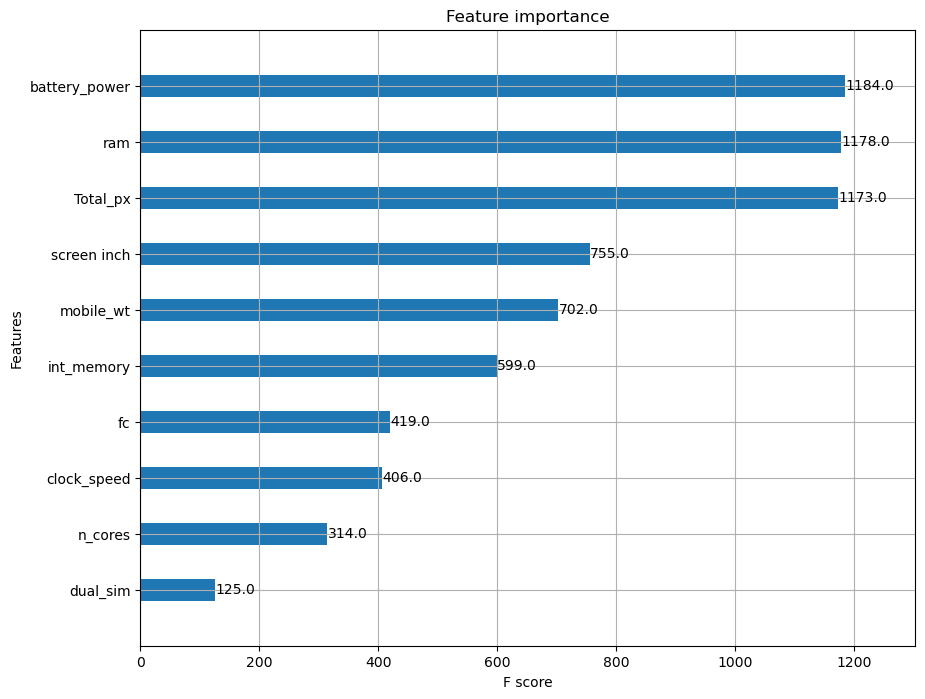

In [263]:
fig, axs= plt.subplots(1,1,figsize=(10,8))
plot_importance(xgb,ax=axs,max_num_features=10,height=0.4)

In [264]:
from lightgbm import LGBMClassifier
lgbm = LGBMClassifier(n_estimators=300,early_stopping_round=100)
lgbm.fit(X_train,y_train,eval_set=[(X_test,y_test)])
lgbm_hat = lgbm.predict(X_test)
print(accuracy_score(y_test,lgbm_hat))

[1]	valid_0's multi_logloss: 1.18362
[2]	valid_0's multi_logloss: 1.03683
[3]	valid_0's multi_logloss: 0.920206
[4]	valid_0's multi_logloss: 0.827332
[5]	valid_0's multi_logloss: 0.747535
[6]	valid_0's multi_logloss: 0.679946
[7]	valid_0's multi_logloss: 0.622391
[8]	valid_0's multi_logloss: 0.574958
[9]	valid_0's multi_logloss: 0.538207
[10]	valid_0's multi_logloss: 0.503605
[11]	valid_0's multi_logloss: 0.470901
[12]	valid_0's multi_logloss: 0.443999
[13]	valid_0's multi_logloss: 0.417854
[14]	valid_0's multi_logloss: 0.39498
[15]	valid_0's multi_logloss: 0.377389
[16]	valid_0's multi_logloss: 0.361756
[17]	valid_0's multi_logloss: 0.349097
[18]	valid_0's multi_logloss: 0.336432
[19]	valid_0's multi_logloss: 0.326438
[20]	valid_0's multi_logloss: 0.317192
[21]	valid_0's multi_logloss: 0.305867
[22]	valid_0's multi_logloss: 0.297708
[23]	valid_0's multi_logloss: 0.290474
[24]	valid_0's multi_logloss: 0.28447
[25]	valid_0's multi_logloss: 0.281045
[26]	valid_0's multi_logloss: 0.277243

<BarContainer object of 10 artists>

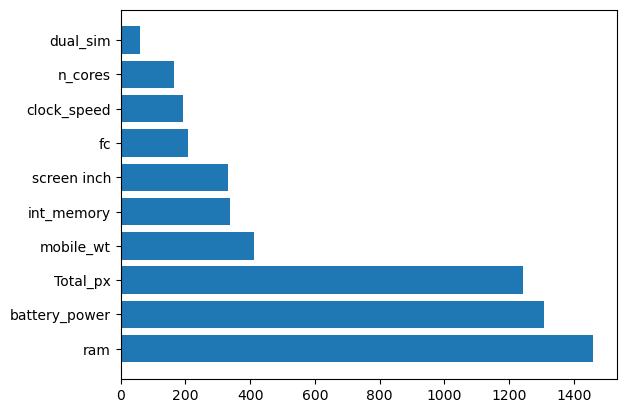

In [265]:
imp_values = lgbm.feature_importances_
imp= pd.DataFrame(data=imp_values,columns=['value'])
imp['name'] = p_train.keys()
top10 = imp.sort_values(by='value',ascending=False)[:10]
plt.barh(top10['name'],top10['value'])

In [122]:
params = {
    'num_leaves':[7,15,27],
    'max_depth' : [11,31,51],
    'min_child_weight': [1,5,17],
    'min_child_samples': [30,50,70],
    'colsample_bytree':[0.3,0.5,0.7]
}

cv =GridSearchCV(lgbm,param_grid=params,cv=5)
cv.fit(X_train,y_train,eval_set=[(X_test,y_test)])
print(cv.best_params_)

[1]	valid_0's multi_logloss: 1.31233
[2]	valid_0's multi_logloss: 1.31144
[3]	valid_0's multi_logloss: 1.21234
[4]	valid_0's multi_logloss: 1.19682
[5]	valid_0's multi_logloss: 1.15639
[6]	valid_0's multi_logloss: 1.14184
[7]	valid_0's multi_logloss: 1.14116
[8]	valid_0's multi_logloss: 1.10535
[9]	valid_0's multi_logloss: 1.0547
[10]	valid_0's multi_logloss: 1.0274
[11]	valid_0's multi_logloss: 1.00119
[12]	valid_0's multi_logloss: 0.99941
[13]	valid_0's multi_logloss: 0.968654
[14]	valid_0's multi_logloss: 0.960817
[15]	valid_0's multi_logloss: 0.912335
[16]	valid_0's multi_logloss: 0.88886
[17]	valid_0's multi_logloss: 0.881153
[18]	valid_0's multi_logloss: 0.861921
[19]	valid_0's multi_logloss: 0.860083
[20]	valid_0's multi_logloss: 0.840446
[21]	valid_0's multi_logloss: 0.835499
[22]	valid_0's multi_logloss: 0.81419
[23]	valid_0's multi_logloss: 0.788303
[24]	valid_0's multi_logloss: 0.788471
[25]	valid_0's multi_logloss: 0.78668
[26]	valid_0's multi_logloss: 0.767646
[27]	valid_0

[71]	valid_0's multi_logloss: 0.553372
[72]	valid_0's multi_logloss: 0.552799
[73]	valid_0's multi_logloss: 0.542739
[74]	valid_0's multi_logloss: 0.541629
[75]	valid_0's multi_logloss: 0.541516
[76]	valid_0's multi_logloss: 0.535679
[77]	valid_0's multi_logloss: 0.533245
[78]	valid_0's multi_logloss: 0.532381
[79]	valid_0's multi_logloss: 0.518438
[80]	valid_0's multi_logloss: 0.515943
[81]	valid_0's multi_logloss: 0.506341
[82]	valid_0's multi_logloss: 0.507456
[83]	valid_0's multi_logloss: 0.508446
[84]	valid_0's multi_logloss: 0.510359
[85]	valid_0's multi_logloss: 0.506889
[86]	valid_0's multi_logloss: 0.505383
[87]	valid_0's multi_logloss: 0.500648
[88]	valid_0's multi_logloss: 0.495825
[89]	valid_0's multi_logloss: 0.496058
[90]	valid_0's multi_logloss: 0.496045
[91]	valid_0's multi_logloss: 0.495088
[92]	valid_0's multi_logloss: 0.490719
[93]	valid_0's multi_logloss: 0.484593
[94]	valid_0's multi_logloss: 0.484052
[95]	valid_0's multi_logloss: 0.484307
[96]	valid_0's multi_logl

[88]	valid_0's multi_logloss: 0.509294
[89]	valid_0's multi_logloss: 0.509311
[90]	valid_0's multi_logloss: 0.509292
[91]	valid_0's multi_logloss: 0.506956
[92]	valid_0's multi_logloss: 0.503316
[93]	valid_0's multi_logloss: 0.497359
[94]	valid_0's multi_logloss: 0.496513
[95]	valid_0's multi_logloss: 0.496653
[96]	valid_0's multi_logloss: 0.496045
[97]	valid_0's multi_logloss: 0.487985
[98]	valid_0's multi_logloss: 0.486461
[99]	valid_0's multi_logloss: 0.485297
[100]	valid_0's multi_logloss: 0.480232
[101]	valid_0's multi_logloss: 0.478605
[102]	valid_0's multi_logloss: 0.47742
[103]	valid_0's multi_logloss: 0.467908
[104]	valid_0's multi_logloss: 0.466723
[105]	valid_0's multi_logloss: 0.467608
[106]	valid_0's multi_logloss: 0.467343
[107]	valid_0's multi_logloss: 0.46806
[108]	valid_0's multi_logloss: 0.468479
[109]	valid_0's multi_logloss: 0.465227
[110]	valid_0's multi_logloss: 0.460273
[111]	valid_0's multi_logloss: 0.457552
[112]	valid_0's multi_logloss: 0.45541
[113]	valid_0's

[124]	valid_0's multi_logloss: 0.406981
[125]	valid_0's multi_logloss: 0.407758
[126]	valid_0's multi_logloss: 0.407245
[127]	valid_0's multi_logloss: 0.404815
[128]	valid_0's multi_logloss: 0.403627
[129]	valid_0's multi_logloss: 0.403487
[130]	valid_0's multi_logloss: 0.402595
[131]	valid_0's multi_logloss: 0.403105
[132]	valid_0's multi_logloss: 0.401549
[133]	valid_0's multi_logloss: 0.398037
[134]	valid_0's multi_logloss: 0.397462
[135]	valid_0's multi_logloss: 0.397249
[136]	valid_0's multi_logloss: 0.396562
[137]	valid_0's multi_logloss: 0.393293
[138]	valid_0's multi_logloss: 0.393816
[139]	valid_0's multi_logloss: 0.39378
[140]	valid_0's multi_logloss: 0.393701
[141]	valid_0's multi_logloss: 0.393153
[142]	valid_0's multi_logloss: 0.392452
[143]	valid_0's multi_logloss: 0.390937
[144]	valid_0's multi_logloss: 0.386632
[145]	valid_0's multi_logloss: 0.386717
[146]	valid_0's multi_logloss: 0.38501
[147]	valid_0's multi_logloss: 0.384498
[148]	valid_0's multi_logloss: 0.383701
[1

[180]	valid_0's multi_logloss: 0.371374
[181]	valid_0's multi_logloss: 0.371888
[182]	valid_0's multi_logloss: 0.369358
[183]	valid_0's multi_logloss: 0.368318
[184]	valid_0's multi_logloss: 0.368089
[185]	valid_0's multi_logloss: 0.367892
[186]	valid_0's multi_logloss: 0.367178
[187]	valid_0's multi_logloss: 0.367351
[188]	valid_0's multi_logloss: 0.367724
[189]	valid_0's multi_logloss: 0.368258
[190]	valid_0's multi_logloss: 0.368686
[191]	valid_0's multi_logloss: 0.368414
[192]	valid_0's multi_logloss: 0.369628
[193]	valid_0's multi_logloss: 0.369236
[194]	valid_0's multi_logloss: 0.369553
[195]	valid_0's multi_logloss: 0.370398
[196]	valid_0's multi_logloss: 0.369131
[197]	valid_0's multi_logloss: 0.366725
[198]	valid_0's multi_logloss: 0.366306
[199]	valid_0's multi_logloss: 0.366712
[200]	valid_0's multi_logloss: 0.36544
[201]	valid_0's multi_logloss: 0.366306
[202]	valid_0's multi_logloss: 0.365831
[203]	valid_0's multi_logloss: 0.365202
[204]	valid_0's multi_logloss: 0.364236
[

[111]	valid_0's multi_logloss: 0.472183
[112]	valid_0's multi_logloss: 0.470714
[113]	valid_0's multi_logloss: 0.471343
[114]	valid_0's multi_logloss: 0.463605
[115]	valid_0's multi_logloss: 0.459524
[116]	valid_0's multi_logloss: 0.461602
[117]	valid_0's multi_logloss: 0.460547
[118]	valid_0's multi_logloss: 0.460273
[119]	valid_0's multi_logloss: 0.455894
[120]	valid_0's multi_logloss: 0.456535
[121]	valid_0's multi_logloss: 0.453596
[122]	valid_0's multi_logloss: 0.451588
[123]	valid_0's multi_logloss: 0.453086
[124]	valid_0's multi_logloss: 0.452145
[125]	valid_0's multi_logloss: 0.45334
[126]	valid_0's multi_logloss: 0.453289
[127]	valid_0's multi_logloss: 0.451507
[128]	valid_0's multi_logloss: 0.451023
[129]	valid_0's multi_logloss: 0.451307
[130]	valid_0's multi_logloss: 0.450957
[131]	valid_0's multi_logloss: 0.452434
[132]	valid_0's multi_logloss: 0.451434
[133]	valid_0's multi_logloss: 0.447592
[134]	valid_0's multi_logloss: 0.449018
[135]	valid_0's multi_logloss: 0.449839
[

[259]	valid_0's multi_logloss: 0.414868
[260]	valid_0's multi_logloss: 0.41543
[261]	valid_0's multi_logloss: 0.41572
[262]	valid_0's multi_logloss: 0.415341
[263]	valid_0's multi_logloss: 0.415692
[264]	valid_0's multi_logloss: 0.416525
[265]	valid_0's multi_logloss: 0.416442
[266]	valid_0's multi_logloss: 0.416378
[267]	valid_0's multi_logloss: 0.416272
[268]	valid_0's multi_logloss: 0.416492
[269]	valid_0's multi_logloss: 0.41605
[270]	valid_0's multi_logloss: 0.415598
[271]	valid_0's multi_logloss: 0.415957
[272]	valid_0's multi_logloss: 0.41601
[273]	valid_0's multi_logloss: 0.416728
[274]	valid_0's multi_logloss: 0.416291
[275]	valid_0's multi_logloss: 0.416723
[276]	valid_0's multi_logloss: 0.416889
[277]	valid_0's multi_logloss: 0.416186
[278]	valid_0's multi_logloss: 0.416478
[279]	valid_0's multi_logloss: 0.41695
[280]	valid_0's multi_logloss: 0.41813
[281]	valid_0's multi_logloss: 0.417328
[282]	valid_0's multi_logloss: 0.415925
[283]	valid_0's multi_logloss: 0.416498
[284]	

[20]	valid_0's multi_logloss: 0.826043
[21]	valid_0's multi_logloss: 0.822296
[22]	valid_0's multi_logloss: 0.80149
[23]	valid_0's multi_logloss: 0.769409
[24]	valid_0's multi_logloss: 0.769808
[25]	valid_0's multi_logloss: 0.77006
[26]	valid_0's multi_logloss: 0.753339
[27]	valid_0's multi_logloss: 0.751467
[28]	valid_0's multi_logloss: 0.739303
[29]	valid_0's multi_logloss: 0.739528
[30]	valid_0's multi_logloss: 0.736788
[31]	valid_0's multi_logloss: 0.737721
[32]	valid_0's multi_logloss: 0.727836
[33]	valid_0's multi_logloss: 0.727957
[34]	valid_0's multi_logloss: 0.725568
[35]	valid_0's multi_logloss: 0.71344
[36]	valid_0's multi_logloss: 0.70382
[37]	valid_0's multi_logloss: 0.704008
[38]	valid_0's multi_logloss: 0.68898
[39]	valid_0's multi_logloss: 0.677086
[40]	valid_0's multi_logloss: 0.668491
[41]	valid_0's multi_logloss: 0.662511
[42]	valid_0's multi_logloss: 0.646722
[43]	valid_0's multi_logloss: 0.638323
[44]	valid_0's multi_logloss: 0.637443
[45]	valid_0's multi_logloss: 

[281]	valid_0's multi_logloss: 0.409056
[282]	valid_0's multi_logloss: 0.407958
[283]	valid_0's multi_logloss: 0.408641
[284]	valid_0's multi_logloss: 0.40846
[285]	valid_0's multi_logloss: 0.407979
[286]	valid_0's multi_logloss: 0.408055
[287]	valid_0's multi_logloss: 0.407991
[288]	valid_0's multi_logloss: 0.407919
[289]	valid_0's multi_logloss: 0.408471
[290]	valid_0's multi_logloss: 0.408992
[291]	valid_0's multi_logloss: 0.409236
[292]	valid_0's multi_logloss: 0.409739
[293]	valid_0's multi_logloss: 0.410319
[294]	valid_0's multi_logloss: 0.409505
[295]	valid_0's multi_logloss: 0.410008
[296]	valid_0's multi_logloss: 0.409555
[297]	valid_0's multi_logloss: 0.410167
[298]	valid_0's multi_logloss: 0.410127
[299]	valid_0's multi_logloss: 0.410038
[300]	valid_0's multi_logloss: 0.409554
[1]	valid_0's multi_logloss: 1.30768
[2]	valid_0's multi_logloss: 1.30809
[3]	valid_0's multi_logloss: 1.20525
[4]	valid_0's multi_logloss: 1.19233
[5]	valid_0's multi_logloss: 1.1498
[6]	valid_0's mul

[7]	valid_0's multi_logloss: 1.13379
[8]	valid_0's multi_logloss: 1.10011
[9]	valid_0's multi_logloss: 1.04905
[10]	valid_0's multi_logloss: 1.02227
[11]	valid_0's multi_logloss: 0.995346
[12]	valid_0's multi_logloss: 0.995852
[13]	valid_0's multi_logloss: 0.965614
[14]	valid_0's multi_logloss: 0.95637
[15]	valid_0's multi_logloss: 0.910186
[16]	valid_0's multi_logloss: 0.889054
[17]	valid_0's multi_logloss: 0.883262
[18]	valid_0's multi_logloss: 0.863347
[19]	valid_0's multi_logloss: 0.863629
[20]	valid_0's multi_logloss: 0.844853
[21]	valid_0's multi_logloss: 0.84122
[22]	valid_0's multi_logloss: 0.821328
[23]	valid_0's multi_logloss: 0.793409
[24]	valid_0's multi_logloss: 0.793756
[25]	valid_0's multi_logloss: 0.793002
[26]	valid_0's multi_logloss: 0.777078
[27]	valid_0's multi_logloss: 0.776987
[28]	valid_0's multi_logloss: 0.76623
[29]	valid_0's multi_logloss: 0.767173
[30]	valid_0's multi_logloss: 0.764498
[31]	valid_0's multi_logloss: 0.764588
[32]	valid_0's multi_logloss: 0.755

[219]	valid_0's multi_logloss: 0.484284
[220]	valid_0's multi_logloss: 0.484863
[221]	valid_0's multi_logloss: 0.48543
[222]	valid_0's multi_logloss: 0.485597
[223]	valid_0's multi_logloss: 0.485912
[224]	valid_0's multi_logloss: 0.486852
[225]	valid_0's multi_logloss: 0.485849
[226]	valid_0's multi_logloss: 0.485282
[227]	valid_0's multi_logloss: 0.484935
[228]	valid_0's multi_logloss: 0.484177
[229]	valid_0's multi_logloss: 0.484931
[230]	valid_0's multi_logloss: 0.484118
[231]	valid_0's multi_logloss: 0.483623
[232]	valid_0's multi_logloss: 0.483373
[233]	valid_0's multi_logloss: 0.483744
[234]	valid_0's multi_logloss: 0.482721
[235]	valid_0's multi_logloss: 0.482405
[236]	valid_0's multi_logloss: 0.482293
[237]	valid_0's multi_logloss: 0.481774
[238]	valid_0's multi_logloss: 0.480075
[239]	valid_0's multi_logloss: 0.478417
[240]	valid_0's multi_logloss: 0.478159
[241]	valid_0's multi_logloss: 0.477853
[242]	valid_0's multi_logloss: 0.478507
[243]	valid_0's multi_logloss: 0.47785
[2

[1]	valid_0's multi_logloss: 1.30441
[2]	valid_0's multi_logloss: 1.30569
[3]	valid_0's multi_logloss: 1.20404
[4]	valid_0's multi_logloss: 1.18813
[5]	valid_0's multi_logloss: 1.14409
[6]	valid_0's multi_logloss: 1.12666
[7]	valid_0's multi_logloss: 1.12664
[8]	valid_0's multi_logloss: 1.09314
[9]	valid_0's multi_logloss: 1.04608
[10]	valid_0's multi_logloss: 1.02062
[11]	valid_0's multi_logloss: 0.995045
[12]	valid_0's multi_logloss: 0.996246
[13]	valid_0's multi_logloss: 0.96777
[14]	valid_0's multi_logloss: 0.958567
[15]	valid_0's multi_logloss: 0.910293
[16]	valid_0's multi_logloss: 0.888106
[17]	valid_0's multi_logloss: 0.882274
[18]	valid_0's multi_logloss: 0.863623
[19]	valid_0's multi_logloss: 0.864538
[20]	valid_0's multi_logloss: 0.846479
[21]	valid_0's multi_logloss: 0.841856
[22]	valid_0's multi_logloss: 0.822528
[23]	valid_0's multi_logloss: 0.791339
[24]	valid_0's multi_logloss: 0.794457
[25]	valid_0's multi_logloss: 0.794741
[26]	valid_0's multi_logloss: 0.777834
[27]	v

[215]	valid_0's multi_logloss: 0.479837
[216]	valid_0's multi_logloss: 0.48126
[217]	valid_0's multi_logloss: 0.481788
[218]	valid_0's multi_logloss: 0.482863
[219]	valid_0's multi_logloss: 0.481915
[220]	valid_0's multi_logloss: 0.482062
[221]	valid_0's multi_logloss: 0.483656
[222]	valid_0's multi_logloss: 0.482797
[223]	valid_0's multi_logloss: 0.482944
[224]	valid_0's multi_logloss: 0.483239
[225]	valid_0's multi_logloss: 0.481988
[226]	valid_0's multi_logloss: 0.481994
[227]	valid_0's multi_logloss: 0.481289
[228]	valid_0's multi_logloss: 0.48042
[229]	valid_0's multi_logloss: 0.480323
[230]	valid_0's multi_logloss: 0.479605
[231]	valid_0's multi_logloss: 0.479171
[232]	valid_0's multi_logloss: 0.478308
[233]	valid_0's multi_logloss: 0.479222
[234]	valid_0's multi_logloss: 0.479039
[235]	valid_0's multi_logloss: 0.47835
[236]	valid_0's multi_logloss: 0.477838
[237]	valid_0's multi_logloss: 0.476965
[238]	valid_0's multi_logloss: 0.475445
[239]	valid_0's multi_logloss: 0.474055
[24

[1]	valid_0's multi_logloss: 1.3062
[2]	valid_0's multi_logloss: 1.3051
[3]	valid_0's multi_logloss: 1.20207
[4]	valid_0's multi_logloss: 1.18823
[5]	valid_0's multi_logloss: 1.14525
[6]	valid_0's multi_logloss: 1.13072
[7]	valid_0's multi_logloss: 1.13052
[8]	valid_0's multi_logloss: 1.09679
[9]	valid_0's multi_logloss: 1.04552
[10]	valid_0's multi_logloss: 1.02006
[11]	valid_0's multi_logloss: 0.994399
[12]	valid_0's multi_logloss: 0.993232
[13]	valid_0's multi_logloss: 0.962965
[14]	valid_0's multi_logloss: 0.951898
[15]	valid_0's multi_logloss: 0.905152
[16]	valid_0's multi_logloss: 0.88375
[17]	valid_0's multi_logloss: 0.877341
[18]	valid_0's multi_logloss: 0.857497
[19]	valid_0's multi_logloss: 0.858036
[20]	valid_0's multi_logloss: 0.839341
[21]	valid_0's multi_logloss: 0.83467
[22]	valid_0's multi_logloss: 0.813432
[23]	valid_0's multi_logloss: 0.785337
[24]	valid_0's multi_logloss: 0.787308
[25]	valid_0's multi_logloss: 0.786759
[26]	valid_0's multi_logloss: 0.769506
[27]	vali

[200]	valid_0's multi_logloss: 0.369895
[201]	valid_0's multi_logloss: 0.370334
[202]	valid_0's multi_logloss: 0.369926
[203]	valid_0's multi_logloss: 0.368949
[204]	valid_0's multi_logloss: 0.368757
[205]	valid_0's multi_logloss: 0.369117
[206]	valid_0's multi_logloss: 0.368752
[207]	valid_0's multi_logloss: 0.367913
[208]	valid_0's multi_logloss: 0.368017
[209]	valid_0's multi_logloss: 0.366085
[210]	valid_0's multi_logloss: 0.366272
[211]	valid_0's multi_logloss: 0.364274
[212]	valid_0's multi_logloss: 0.362982
[213]	valid_0's multi_logloss: 0.364034
[214]	valid_0's multi_logloss: 0.36326
[215]	valid_0's multi_logloss: 0.362909
[216]	valid_0's multi_logloss: 0.363377
[217]	valid_0's multi_logloss: 0.363898
[218]	valid_0's multi_logloss: 0.364222
[219]	valid_0's multi_logloss: 0.363548
[220]	valid_0's multi_logloss: 0.362461
[221]	valid_0's multi_logloss: 0.362857
[222]	valid_0's multi_logloss: 0.362642
[223]	valid_0's multi_logloss: 0.362286
[224]	valid_0's multi_logloss: 0.362497
[

[223]	valid_0's multi_logloss: 0.352745
[224]	valid_0's multi_logloss: 0.353584
[225]	valid_0's multi_logloss: 0.3527
[226]	valid_0's multi_logloss: 0.35201
[227]	valid_0's multi_logloss: 0.351762
[228]	valid_0's multi_logloss: 0.3506
[229]	valid_0's multi_logloss: 0.351517
[230]	valid_0's multi_logloss: 0.351059
[231]	valid_0's multi_logloss: 0.350476
[232]	valid_0's multi_logloss: 0.350315
[233]	valid_0's multi_logloss: 0.351048
[234]	valid_0's multi_logloss: 0.350155
[235]	valid_0's multi_logloss: 0.3499
[236]	valid_0's multi_logloss: 0.350089
[237]	valid_0's multi_logloss: 0.350094
[238]	valid_0's multi_logloss: 0.348695
[239]	valid_0's multi_logloss: 0.346556
[240]	valid_0's multi_logloss: 0.345999
[241]	valid_0's multi_logloss: 0.345535
[242]	valid_0's multi_logloss: 0.345354
[243]	valid_0's multi_logloss: 0.345287
[244]	valid_0's multi_logloss: 0.345348
[245]	valid_0's multi_logloss: 0.345311
[246]	valid_0's multi_logloss: 0.345082
[247]	valid_0's multi_logloss: 0.345455
[248]	v

[261]	valid_0's multi_logloss: 0.352353
[262]	valid_0's multi_logloss: 0.352264
[263]	valid_0's multi_logloss: 0.352119
[264]	valid_0's multi_logloss: 0.352712
[265]	valid_0's multi_logloss: 0.352524
[266]	valid_0's multi_logloss: 0.352419
[267]	valid_0's multi_logloss: 0.352823
[268]	valid_0's multi_logloss: 0.353309
[269]	valid_0's multi_logloss: 0.35289
[270]	valid_0's multi_logloss: 0.353437
[271]	valid_0's multi_logloss: 0.353458
[272]	valid_0's multi_logloss: 0.353428
[273]	valid_0's multi_logloss: 0.353233
[274]	valid_0's multi_logloss: 0.353154
[275]	valid_0's multi_logloss: 0.35377
[276]	valid_0's multi_logloss: 0.353733
[277]	valid_0's multi_logloss: 0.352978
[278]	valid_0's multi_logloss: 0.353228
[279]	valid_0's multi_logloss: 0.35328
[280]	valid_0's multi_logloss: 0.354275
[281]	valid_0's multi_logloss: 0.353809
[282]	valid_0's multi_logloss: 0.353097
[283]	valid_0's multi_logloss: 0.352682
[284]	valid_0's multi_logloss: 0.352651
[285]	valid_0's multi_logloss: 0.352601
[28

[1]	valid_0's multi_logloss: 1.3109
[2]	valid_0's multi_logloss: 1.31083
[3]	valid_0's multi_logloss: 1.21378
[4]	valid_0's multi_logloss: 1.1998
[5]	valid_0's multi_logloss: 1.15884
[6]	valid_0's multi_logloss: 1.14322
[7]	valid_0's multi_logloss: 1.14292
[8]	valid_0's multi_logloss: 1.10586
[9]	valid_0's multi_logloss: 1.05341
[10]	valid_0's multi_logloss: 1.02658
[11]	valid_0's multi_logloss: 1.00213
[12]	valid_0's multi_logloss: 0.999632
[13]	valid_0's multi_logloss: 0.968575
[14]	valid_0's multi_logloss: 0.960578
[15]	valid_0's multi_logloss: 0.912728
[16]	valid_0's multi_logloss: 0.889921
[17]	valid_0's multi_logloss: 0.882503
[18]	valid_0's multi_logloss: 0.862402
[19]	valid_0's multi_logloss: 0.86157
[20]	valid_0's multi_logloss: 0.84198
[21]	valid_0's multi_logloss: 0.835941
[22]	valid_0's multi_logloss: 0.814158
[23]	valid_0's multi_logloss: 0.788939
[24]	valid_0's multi_logloss: 0.788141
[25]	valid_0's multi_logloss: 0.78505
[26]	valid_0's multi_logloss: 0.767371
[27]	valid_

[14]	valid_0's multi_logloss: 0.949153
[15]	valid_0's multi_logloss: 0.901813
[16]	valid_0's multi_logloss: 0.878439
[17]	valid_0's multi_logloss: 0.87134
[18]	valid_0's multi_logloss: 0.852168
[19]	valid_0's multi_logloss: 0.851316
[20]	valid_0's multi_logloss: 0.832677
[21]	valid_0's multi_logloss: 0.829603
[22]	valid_0's multi_logloss: 0.806873
[23]	valid_0's multi_logloss: 0.776563
[24]	valid_0's multi_logloss: 0.776356
[25]	valid_0's multi_logloss: 0.775134
[26]	valid_0's multi_logloss: 0.75744
[27]	valid_0's multi_logloss: 0.756475
[28]	valid_0's multi_logloss: 0.744974
[29]	valid_0's multi_logloss: 0.745329
[30]	valid_0's multi_logloss: 0.743558
[31]	valid_0's multi_logloss: 0.743965
[32]	valid_0's multi_logloss: 0.733938
[33]	valid_0's multi_logloss: 0.733756
[34]	valid_0's multi_logloss: 0.730138
[35]	valid_0's multi_logloss: 0.71574
[36]	valid_0's multi_logloss: 0.706436
[37]	valid_0's multi_logloss: 0.705631
[38]	valid_0's multi_logloss: 0.691152
[39]	valid_0's multi_logloss

[1]	valid_0's multi_logloss: 1.30747
[2]	valid_0's multi_logloss: 1.3049
[3]	valid_0's multi_logloss: 1.20012
[4]	valid_0's multi_logloss: 1.18649
[5]	valid_0's multi_logloss: 1.14245
[6]	valid_0's multi_logloss: 1.12738
[7]	valid_0's multi_logloss: 1.12365
[8]	valid_0's multi_logloss: 1.08695
[9]	valid_0's multi_logloss: 1.03967
[10]	valid_0's multi_logloss: 1.01428
[11]	valid_0's multi_logloss: 0.989815
[12]	valid_0's multi_logloss: 0.989625
[13]	valid_0's multi_logloss: 0.958377
[14]	valid_0's multi_logloss: 0.946823
[15]	valid_0's multi_logloss: 0.898567
[16]	valid_0's multi_logloss: 0.874491
[17]	valid_0's multi_logloss: 0.869562
[18]	valid_0's multi_logloss: 0.849557
[19]	valid_0's multi_logloss: 0.85062
[20]	valid_0's multi_logloss: 0.833
[21]	valid_0's multi_logloss: 0.82677
[22]	valid_0's multi_logloss: 0.806805
[23]	valid_0's multi_logloss: 0.776308
[24]	valid_0's multi_logloss: 0.776408
[25]	valid_0's multi_logloss: 0.773756
[26]	valid_0's multi_logloss: 0.757133
[27]	valid_

[1]	valid_0's multi_logloss: 1.30599
[2]	valid_0's multi_logloss: 1.306
[3]	valid_0's multi_logloss: 1.20345
[4]	valid_0's multi_logloss: 1.18745
[5]	valid_0's multi_logloss: 1.14304
[6]	valid_0's multi_logloss: 1.12618
[7]	valid_0's multi_logloss: 1.12678
[8]	valid_0's multi_logloss: 1.09179
[9]	valid_0's multi_logloss: 1.04
[10]	valid_0's multi_logloss: 1.01293
[11]	valid_0's multi_logloss: 0.98519
[12]	valid_0's multi_logloss: 0.983789
[13]	valid_0's multi_logloss: 0.954028
[14]	valid_0's multi_logloss: 0.945381
[15]	valid_0's multi_logloss: 0.898129
[16]	valid_0's multi_logloss: 0.875986
[17]	valid_0's multi_logloss: 0.869285
[18]	valid_0's multi_logloss: 0.848896
[19]	valid_0's multi_logloss: 0.84908
[20]	valid_0's multi_logloss: 0.832435
[21]	valid_0's multi_logloss: 0.827122
[22]	valid_0's multi_logloss: 0.806958
[23]	valid_0's multi_logloss: 0.776408
[24]	valid_0's multi_logloss: 0.777019
[25]	valid_0's multi_logloss: 0.776354
[26]	valid_0's multi_logloss: 0.758634
[27]	valid_0

[1]	valid_0's multi_logloss: 1.30721
[2]	valid_0's multi_logloss: 1.30629
[3]	valid_0's multi_logloss: 1.20455
[4]	valid_0's multi_logloss: 1.19041
[5]	valid_0's multi_logloss: 1.14552
[6]	valid_0's multi_logloss: 1.13001
[7]	valid_0's multi_logloss: 1.13123
[8]	valid_0's multi_logloss: 1.09533
[9]	valid_0's multi_logloss: 1.04341
[10]	valid_0's multi_logloss: 1.01668
[11]	valid_0's multi_logloss: 0.988837
[12]	valid_0's multi_logloss: 0.985298
[13]	valid_0's multi_logloss: 0.95348
[14]	valid_0's multi_logloss: 0.942563
[15]	valid_0's multi_logloss: 0.893409
[16]	valid_0's multi_logloss: 0.869718
[17]	valid_0's multi_logloss: 0.863256
[18]	valid_0's multi_logloss: 0.843594
[19]	valid_0's multi_logloss: 0.843258
[20]	valid_0's multi_logloss: 0.826002
[21]	valid_0's multi_logloss: 0.822255
[22]	valid_0's multi_logloss: 0.801509
[23]	valid_0's multi_logloss: 0.769429
[24]	valid_0's multi_logloss: 0.769683
[25]	valid_0's multi_logloss: 0.769947
[26]	valid_0's multi_logloss: 0.752938
[27]	v

[1]	valid_0's multi_logloss: 1.30768
[2]	valid_0's multi_logloss: 1.30809
[3]	valid_0's multi_logloss: 1.20525
[4]	valid_0's multi_logloss: 1.19233
[5]	valid_0's multi_logloss: 1.1498
[6]	valid_0's multi_logloss: 1.13493
[7]	valid_0's multi_logloss: 1.13442
[8]	valid_0's multi_logloss: 1.0978
[9]	valid_0's multi_logloss: 1.04423
[10]	valid_0's multi_logloss: 1.01884
[11]	valid_0's multi_logloss: 0.992901
[12]	valid_0's multi_logloss: 0.990869
[13]	valid_0's multi_logloss: 0.960299
[14]	valid_0's multi_logloss: 0.951034
[15]	valid_0's multi_logloss: 0.902155
[16]	valid_0's multi_logloss: 0.880116
[17]	valid_0's multi_logloss: 0.872811
[18]	valid_0's multi_logloss: 0.851078
[19]	valid_0's multi_logloss: 0.850849
[20]	valid_0's multi_logloss: 0.831834
[21]	valid_0's multi_logloss: 0.825568
[22]	valid_0's multi_logloss: 0.804437
[23]	valid_0's multi_logloss: 0.774727
[24]	valid_0's multi_logloss: 0.776108
[25]	valid_0's multi_logloss: 0.773807
[26]	valid_0's multi_logloss: 0.757116
[27]	va

[1]	valid_0's multi_logloss: 1.30697
[2]	valid_0's multi_logloss: 1.30712
[3]	valid_0's multi_logloss: 1.20724
[4]	valid_0's multi_logloss: 1.19106
[5]	valid_0's multi_logloss: 1.14701
[6]	valid_0's multi_logloss: 1.13346
[7]	valid_0's multi_logloss: 1.13379
[8]	valid_0's multi_logloss: 1.10011
[9]	valid_0's multi_logloss: 1.04905
[10]	valid_0's multi_logloss: 1.02227
[11]	valid_0's multi_logloss: 0.995346
[12]	valid_0's multi_logloss: 0.995852
[13]	valid_0's multi_logloss: 0.965613
[14]	valid_0's multi_logloss: 0.956382
[15]	valid_0's multi_logloss: 0.910202
[16]	valid_0's multi_logloss: 0.889049
[17]	valid_0's multi_logloss: 0.883569
[18]	valid_0's multi_logloss: 0.863647
[19]	valid_0's multi_logloss: 0.86385
[20]	valid_0's multi_logloss: 0.845209
[21]	valid_0's multi_logloss: 0.841026
[22]	valid_0's multi_logloss: 0.82103
[23]	valid_0's multi_logloss: 0.79245
[24]	valid_0's multi_logloss: 0.792695
[25]	valid_0's multi_logloss: 0.791791
[26]	valid_0's multi_logloss: 0.775507
[27]	val

[1]	valid_0's multi_logloss: 1.30698
[2]	valid_0's multi_logloss: 1.30416
[3]	valid_0's multi_logloss: 1.19989
[4]	valid_0's multi_logloss: 1.18756
[5]	valid_0's multi_logloss: 1.14432
[6]	valid_0's multi_logloss: 1.12819
[7]	valid_0's multi_logloss: 1.12574
[8]	valid_0's multi_logloss: 1.09066
[9]	valid_0's multi_logloss: 1.04199
[10]	valid_0's multi_logloss: 1.01737
[11]	valid_0's multi_logloss: 0.994153
[12]	valid_0's multi_logloss: 0.993736
[13]	valid_0's multi_logloss: 0.964113
[14]	valid_0's multi_logloss: 0.952849
[15]	valid_0's multi_logloss: 0.906441
[16]	valid_0's multi_logloss: 0.88297
[17]	valid_0's multi_logloss: 0.876888
[18]	valid_0's multi_logloss: 0.859527
[19]	valid_0's multi_logloss: 0.861545
[20]	valid_0's multi_logloss: 0.843658
[21]	valid_0's multi_logloss: 0.83822
[22]	valid_0's multi_logloss: 0.818593
[23]	valid_0's multi_logloss: 0.788251
[24]	valid_0's multi_logloss: 0.788793
[25]	valid_0's multi_logloss: 0.78694
[26]	valid_0's multi_logloss: 0.771271
[27]	val

[1]	valid_0's multi_logloss: 1.30441
[2]	valid_0's multi_logloss: 1.30569
[3]	valid_0's multi_logloss: 1.20404
[4]	valid_0's multi_logloss: 1.18813
[5]	valid_0's multi_logloss: 1.14409
[6]	valid_0's multi_logloss: 1.12666
[7]	valid_0's multi_logloss: 1.12664
[8]	valid_0's multi_logloss: 1.09314
[9]	valid_0's multi_logloss: 1.04608
[10]	valid_0's multi_logloss: 1.02062
[11]	valid_0's multi_logloss: 0.995045
[12]	valid_0's multi_logloss: 0.996246
[13]	valid_0's multi_logloss: 0.967751
[14]	valid_0's multi_logloss: 0.958545
[15]	valid_0's multi_logloss: 0.910273
[16]	valid_0's multi_logloss: 0.888095
[17]	valid_0's multi_logloss: 0.882444
[18]	valid_0's multi_logloss: 0.86387
[19]	valid_0's multi_logloss: 0.86487
[20]	valid_0's multi_logloss: 0.846725
[21]	valid_0's multi_logloss: 0.841848
[22]	valid_0's multi_logloss: 0.822343
[23]	valid_0's multi_logloss: 0.79164
[24]	valid_0's multi_logloss: 0.794523
[25]	valid_0's multi_logloss: 0.794997
[26]	valid_0's multi_logloss: 0.777803
[27]	val

[271]	valid_0's multi_logloss: 0.410679
[272]	valid_0's multi_logloss: 0.411344
[273]	valid_0's multi_logloss: 0.411275
[274]	valid_0's multi_logloss: 0.410904
[275]	valid_0's multi_logloss: 0.411084
[276]	valid_0's multi_logloss: 0.410762
[277]	valid_0's multi_logloss: 0.41111
[278]	valid_0's multi_logloss: 0.410903
[279]	valid_0's multi_logloss: 0.410472
[280]	valid_0's multi_logloss: 0.411256
[281]	valid_0's multi_logloss: 0.410472
[282]	valid_0's multi_logloss: 0.409455
[283]	valid_0's multi_logloss: 0.410006
[284]	valid_0's multi_logloss: 0.410073
[285]	valid_0's multi_logloss: 0.409761
[286]	valid_0's multi_logloss: 0.409311
[287]	valid_0's multi_logloss: 0.409165
[288]	valid_0's multi_logloss: 0.409443
[289]	valid_0's multi_logloss: 0.409643
[290]	valid_0's multi_logloss: 0.409475
[291]	valid_0's multi_logloss: 0.40983
[292]	valid_0's multi_logloss: 0.409711
[293]	valid_0's multi_logloss: 0.409925
[294]	valid_0's multi_logloss: 0.409245
[295]	valid_0's multi_logloss: 0.409497
[2

[1]	valid_0's multi_logloss: 1.3062
[2]	valid_0's multi_logloss: 1.3051
[3]	valid_0's multi_logloss: 1.20207
[4]	valid_0's multi_logloss: 1.18823
[5]	valid_0's multi_logloss: 1.14525
[6]	valid_0's multi_logloss: 1.13072
[7]	valid_0's multi_logloss: 1.13052
[8]	valid_0's multi_logloss: 1.09679
[9]	valid_0's multi_logloss: 1.04552
[10]	valid_0's multi_logloss: 1.02006
[11]	valid_0's multi_logloss: 0.994399
[12]	valid_0's multi_logloss: 0.993232
[13]	valid_0's multi_logloss: 0.962964
[14]	valid_0's multi_logloss: 0.9519
[15]	valid_0's multi_logloss: 0.905154
[16]	valid_0's multi_logloss: 0.883718
[17]	valid_0's multi_logloss: 0.877363
[18]	valid_0's multi_logloss: 0.857525
[19]	valid_0's multi_logloss: 0.858064
[20]	valid_0's multi_logloss: 0.839453
[21]	valid_0's multi_logloss: 0.834778
[22]	valid_0's multi_logloss: 0.813694
[23]	valid_0's multi_logloss: 0.785386
[24]	valid_0's multi_logloss: 0.787321
[25]	valid_0's multi_logloss: 0.786722
[26]	valid_0's multi_logloss: 0.769709
[27]	vali

[286]	valid_0's multi_logloss: 0.392482
[287]	valid_0's multi_logloss: 0.392208
[288]	valid_0's multi_logloss: 0.392388
[289]	valid_0's multi_logloss: 0.392549
[290]	valid_0's multi_logloss: 0.392397
[291]	valid_0's multi_logloss: 0.391983
[292]	valid_0's multi_logloss: 0.392196
[293]	valid_0's multi_logloss: 0.392355
[294]	valid_0's multi_logloss: 0.392021
[295]	valid_0's multi_logloss: 0.392246
[296]	valid_0's multi_logloss: 0.392154
[297]	valid_0's multi_logloss: 0.39204
[298]	valid_0's multi_logloss: 0.392162
[299]	valid_0's multi_logloss: 0.392275
[300]	valid_0's multi_logloss: 0.392367
[1]	valid_0's multi_logloss: 1.31088
[2]	valid_0's multi_logloss: 1.30912
[3]	valid_0's multi_logloss: 1.21187
[4]	valid_0's multi_logloss: 1.1961
[5]	valid_0's multi_logloss: 1.15795
[6]	valid_0's multi_logloss: 1.1446
[7]	valid_0's multi_logloss: 1.14396
[8]	valid_0's multi_logloss: 1.10755
[9]	valid_0's multi_logloss: 1.0621
[10]	valid_0's multi_logloss: 1.03575
[11]	valid_0's multi_logloss: 1.0

[259]	valid_0's multi_logloss: 0.374688
[260]	valid_0's multi_logloss: 0.374745
[261]	valid_0's multi_logloss: 0.374576
[262]	valid_0's multi_logloss: 0.375159
[263]	valid_0's multi_logloss: 0.374715
[264]	valid_0's multi_logloss: 0.374558
[265]	valid_0's multi_logloss: 0.374272
[266]	valid_0's multi_logloss: 0.374856
[267]	valid_0's multi_logloss: 0.374916
[268]	valid_0's multi_logloss: 0.374672
[269]	valid_0's multi_logloss: 0.373169
[270]	valid_0's multi_logloss: 0.37329
[271]	valid_0's multi_logloss: 0.373302
[272]	valid_0's multi_logloss: 0.37267
[273]	valid_0's multi_logloss: 0.372676
[274]	valid_0's multi_logloss: 0.372679
[275]	valid_0's multi_logloss: 0.371932
[276]	valid_0's multi_logloss: 0.371729
[277]	valid_0's multi_logloss: 0.371232
[278]	valid_0's multi_logloss: 0.370969
[279]	valid_0's multi_logloss: 0.370817
[280]	valid_0's multi_logloss: 0.370938
[281]	valid_0's multi_logloss: 0.370666
[282]	valid_0's multi_logloss: 0.369895
[283]	valid_0's multi_logloss: 0.369805
[2

[1]	valid_0's multi_logloss: 1.30976
[2]	valid_0's multi_logloss: 1.30727
[3]	valid_0's multi_logloss: 1.20928
[4]	valid_0's multi_logloss: 1.19316
[5]	valid_0's multi_logloss: 1.15855
[6]	valid_0's multi_logloss: 1.14309
[7]	valid_0's multi_logloss: 1.14339
[8]	valid_0's multi_logloss: 1.10688
[9]	valid_0's multi_logloss: 1.05597
[10]	valid_0's multi_logloss: 1.02838
[11]	valid_0's multi_logloss: 1.00058
[12]	valid_0's multi_logloss: 0.998542
[13]	valid_0's multi_logloss: 0.966908
[14]	valid_0's multi_logloss: 0.960886
[15]	valid_0's multi_logloss: 0.912098
[16]	valid_0's multi_logloss: 0.889571
[17]	valid_0's multi_logloss: 0.883063
[18]	valid_0's multi_logloss: 0.864212
[19]	valid_0's multi_logloss: 0.864499
[20]	valid_0's multi_logloss: 0.845709
[21]	valid_0's multi_logloss: 0.841608
[22]	valid_0's multi_logloss: 0.819627
[23]	valid_0's multi_logloss: 0.796493
[24]	valid_0's multi_logloss: 0.796019
[25]	valid_0's multi_logloss: 0.794719
[26]	valid_0's multi_logloss: 0.776638
[27]	v

[85]	valid_0's multi_logloss: 0.518064
[86]	valid_0's multi_logloss: 0.515886
[87]	valid_0's multi_logloss: 0.510297
[88]	valid_0's multi_logloss: 0.506606
[89]	valid_0's multi_logloss: 0.50695
[90]	valid_0's multi_logloss: 0.507487
[91]	valid_0's multi_logloss: 0.506291
[92]	valid_0's multi_logloss: 0.502019
[93]	valid_0's multi_logloss: 0.495132
[94]	valid_0's multi_logloss: 0.494565
[95]	valid_0's multi_logloss: 0.49335
[96]	valid_0's multi_logloss: 0.492665
[97]	valid_0's multi_logloss: 0.487608
[98]	valid_0's multi_logloss: 0.486038
[99]	valid_0's multi_logloss: 0.485621
[100]	valid_0's multi_logloss: 0.480967
[101]	valid_0's multi_logloss: 0.479629
[102]	valid_0's multi_logloss: 0.478786
[103]	valid_0's multi_logloss: 0.469737
[104]	valid_0's multi_logloss: 0.469013
[105]	valid_0's multi_logloss: 0.469468
[106]	valid_0's multi_logloss: 0.469065
[107]	valid_0's multi_logloss: 0.469852
[108]	valid_0's multi_logloss: 0.47038
[109]	valid_0's multi_logloss: 0.465633
[110]	valid_0's mu

[158]	valid_0's multi_logloss: 0.407503
[159]	valid_0's multi_logloss: 0.407116
[160]	valid_0's multi_logloss: 0.405084
[161]	valid_0's multi_logloss: 0.405215
[162]	valid_0's multi_logloss: 0.404673
[163]	valid_0's multi_logloss: 0.403321
[164]	valid_0's multi_logloss: 0.403116
[165]	valid_0's multi_logloss: 0.403147
[166]	valid_0's multi_logloss: 0.402031
[167]	valid_0's multi_logloss: 0.400532
[168]	valid_0's multi_logloss: 0.400401
[169]	valid_0's multi_logloss: 0.400921
[170]	valid_0's multi_logloss: 0.399741
[171]	valid_0's multi_logloss: 0.396304
[172]	valid_0's multi_logloss: 0.397081
[173]	valid_0's multi_logloss: 0.397835
[174]	valid_0's multi_logloss: 0.396091
[175]	valid_0's multi_logloss: 0.396091
[176]	valid_0's multi_logloss: 0.396344
[177]	valid_0's multi_logloss: 0.395857
[178]	valid_0's multi_logloss: 0.393251
[179]	valid_0's multi_logloss: 0.393581
[180]	valid_0's multi_logloss: 0.392837
[181]	valid_0's multi_logloss: 0.393223
[182]	valid_0's multi_logloss: 0.390936


[203]	valid_0's multi_logloss: 0.399625
[204]	valid_0's multi_logloss: 0.39947
[205]	valid_0's multi_logloss: 0.399655
[206]	valid_0's multi_logloss: 0.399766
[207]	valid_0's multi_logloss: 0.398911
[208]	valid_0's multi_logloss: 0.399395
[209]	valid_0's multi_logloss: 0.398502
[210]	valid_0's multi_logloss: 0.398228
[211]	valid_0's multi_logloss: 0.396881
[212]	valid_0's multi_logloss: 0.396089
[213]	valid_0's multi_logloss: 0.396182
[214]	valid_0's multi_logloss: 0.395149
[215]	valid_0's multi_logloss: 0.394449
[216]	valid_0's multi_logloss: 0.394133
[217]	valid_0's multi_logloss: 0.394057
[218]	valid_0's multi_logloss: 0.393711
[219]	valid_0's multi_logloss: 0.393065
[220]	valid_0's multi_logloss: 0.393307
[221]	valid_0's multi_logloss: 0.393273
[222]	valid_0's multi_logloss: 0.39342
[223]	valid_0's multi_logloss: 0.393289
[224]	valid_0's multi_logloss: 0.393424
[225]	valid_0's multi_logloss: 0.392993
[226]	valid_0's multi_logloss: 0.392439
[227]	valid_0's multi_logloss: 0.391814
[2

[264]	valid_0's multi_logloss: 0.381106
[265]	valid_0's multi_logloss: 0.380984
[266]	valid_0's multi_logloss: 0.380765
[267]	valid_0's multi_logloss: 0.380035
[268]	valid_0's multi_logloss: 0.380017
[269]	valid_0's multi_logloss: 0.379518
[270]	valid_0's multi_logloss: 0.379312
[271]	valid_0's multi_logloss: 0.379228
[272]	valid_0's multi_logloss: 0.379453
[273]	valid_0's multi_logloss: 0.379543
[274]	valid_0's multi_logloss: 0.379378
[275]	valid_0's multi_logloss: 0.379404
[276]	valid_0's multi_logloss: 0.379101
[277]	valid_0's multi_logloss: 0.378574
[278]	valid_0's multi_logloss: 0.378654
[279]	valid_0's multi_logloss: 0.378343
[280]	valid_0's multi_logloss: 0.378966
[281]	valid_0's multi_logloss: 0.378963
[282]	valid_0's multi_logloss: 0.377884
[283]	valid_0's multi_logloss: 0.377846
[284]	valid_0's multi_logloss: 0.377307
[285]	valid_0's multi_logloss: 0.376983
[286]	valid_0's multi_logloss: 0.377058
[287]	valid_0's multi_logloss: 0.377058
[288]	valid_0's multi_logloss: 0.377196


[1]	valid_0's multi_logloss: 1.30952
[2]	valid_0's multi_logloss: 1.30826
[3]	valid_0's multi_logloss: 1.21084
[4]	valid_0's multi_logloss: 1.19532
[5]	valid_0's multi_logloss: 1.15776
[6]	valid_0's multi_logloss: 1.14437
[7]	valid_0's multi_logloss: 1.14382
[8]	valid_0's multi_logloss: 1.10939
[9]	valid_0's multi_logloss: 1.06465
[10]	valid_0's multi_logloss: 1.03815
[11]	valid_0's multi_logloss: 1.01256
[12]	valid_0's multi_logloss: 1.01009
[13]	valid_0's multi_logloss: 0.978637
[14]	valid_0's multi_logloss: 0.969153
[15]	valid_0's multi_logloss: 0.921975
[16]	valid_0's multi_logloss: 0.89887
[17]	valid_0's multi_logloss: 0.893167
[18]	valid_0's multi_logloss: 0.873744
[19]	valid_0's multi_logloss: 0.873267
[20]	valid_0's multi_logloss: 0.854265
[21]	valid_0's multi_logloss: 0.849106
[22]	valid_0's multi_logloss: 0.82835
[23]	valid_0's multi_logloss: 0.7999
[24]	valid_0's multi_logloss: 0.799588
[25]	valid_0's multi_logloss: 0.799295
[26]	valid_0's multi_logloss: 0.78139
[27]	valid_0

[8]	valid_0's multi_logloss: 1.09997
[9]	valid_0's multi_logloss: 1.05462
[10]	valid_0's multi_logloss: 1.02891
[11]	valid_0's multi_logloss: 1.00384
[12]	valid_0's multi_logloss: 1.00084
[13]	valid_0's multi_logloss: 0.970389
[14]	valid_0's multi_logloss: 0.96282
[15]	valid_0's multi_logloss: 0.916991
[16]	valid_0's multi_logloss: 0.89494
[17]	valid_0's multi_logloss: 0.886935
[18]	valid_0's multi_logloss: 0.868427
[19]	valid_0's multi_logloss: 0.868004
[20]	valid_0's multi_logloss: 0.849891
[21]	valid_0's multi_logloss: 0.846517
[22]	valid_0's multi_logloss: 0.824612
[23]	valid_0's multi_logloss: 0.796191
[24]	valid_0's multi_logloss: 0.796033
[25]	valid_0's multi_logloss: 0.793775
[26]	valid_0's multi_logloss: 0.775822
[27]	valid_0's multi_logloss: 0.774283
[28]	valid_0's multi_logloss: 0.761903
[29]	valid_0's multi_logloss: 0.761638
[30]	valid_0's multi_logloss: 0.760617
[31]	valid_0's multi_logloss: 0.761963
[32]	valid_0's multi_logloss: 0.75038
[33]	valid_0's multi_logloss: 0.749

[32]	valid_0's multi_logloss: 0.758118
[33]	valid_0's multi_logloss: 0.757567
[34]	valid_0's multi_logloss: 0.755108
[35]	valid_0's multi_logloss: 0.740611
[36]	valid_0's multi_logloss: 0.731988
[37]	valid_0's multi_logloss: 0.73078
[38]	valid_0's multi_logloss: 0.715537
[39]	valid_0's multi_logloss: 0.703892
[40]	valid_0's multi_logloss: 0.695527
[41]	valid_0's multi_logloss: 0.689236
[42]	valid_0's multi_logloss: 0.672529
[43]	valid_0's multi_logloss: 0.665107
[44]	valid_0's multi_logloss: 0.663414
[45]	valid_0's multi_logloss: 0.663668
[46]	valid_0's multi_logloss: 0.654792
[47]	valid_0's multi_logloss: 0.653615
[48]	valid_0's multi_logloss: 0.64733
[49]	valid_0's multi_logloss: 0.638989
[50]	valid_0's multi_logloss: 0.62719
[51]	valid_0's multi_logloss: 0.629294
[52]	valid_0's multi_logloss: 0.62932
[53]	valid_0's multi_logloss: 0.614466
[54]	valid_0's multi_logloss: 0.615208
[55]	valid_0's multi_logloss: 0.615619
[56]	valid_0's multi_logloss: 0.61622
[57]	valid_0's multi_logloss: 

[42]	valid_0's multi_logloss: 0.659465
[43]	valid_0's multi_logloss: 0.651462
[44]	valid_0's multi_logloss: 0.650014
[45]	valid_0's multi_logloss: 0.649609
[46]	valid_0's multi_logloss: 0.640534
[47]	valid_0's multi_logloss: 0.640452
[48]	valid_0's multi_logloss: 0.633725
[49]	valid_0's multi_logloss: 0.626617
[50]	valid_0's multi_logloss: 0.615066
[51]	valid_0's multi_logloss: 0.616664
[52]	valid_0's multi_logloss: 0.616561
[53]	valid_0's multi_logloss: 0.598537
[54]	valid_0's multi_logloss: 0.598337
[55]	valid_0's multi_logloss: 0.598132
[56]	valid_0's multi_logloss: 0.59948
[57]	valid_0's multi_logloss: 0.59934
[58]	valid_0's multi_logloss: 0.599338
[59]	valid_0's multi_logloss: 0.599366
[60]	valid_0's multi_logloss: 0.600449
[61]	valid_0's multi_logloss: 0.600137
[62]	valid_0's multi_logloss: 0.597616
[63]	valid_0's multi_logloss: 0.597715
[64]	valid_0's multi_logloss: 0.592563
[65]	valid_0's multi_logloss: 0.591808
[66]	valid_0's multi_logloss: 0.591504
[67]	valid_0's multi_loglos

[58]	valid_0's multi_logloss: 0.607801
[59]	valid_0's multi_logloss: 0.607957
[60]	valid_0's multi_logloss: 0.608841
[61]	valid_0's multi_logloss: 0.608679
[62]	valid_0's multi_logloss: 0.606169
[63]	valid_0's multi_logloss: 0.604265
[64]	valid_0's multi_logloss: 0.599767
[65]	valid_0's multi_logloss: 0.599566
[66]	valid_0's multi_logloss: 0.599907
[67]	valid_0's multi_logloss: 0.596436
[68]	valid_0's multi_logloss: 0.592446
[69]	valid_0's multi_logloss: 0.579505
[70]	valid_0's multi_logloss: 0.578125
[71]	valid_0's multi_logloss: 0.57846
[72]	valid_0's multi_logloss: 0.578739
[73]	valid_0's multi_logloss: 0.568467
[74]	valid_0's multi_logloss: 0.568225
[75]	valid_0's multi_logloss: 0.567791
[76]	valid_0's multi_logloss: 0.562135
[77]	valid_0's multi_logloss: 0.559185
[78]	valid_0's multi_logloss: 0.559247
[79]	valid_0's multi_logloss: 0.545671
[80]	valid_0's multi_logloss: 0.545085
[81]	valid_0's multi_logloss: 0.534202
[82]	valid_0's multi_logloss: 0.534839
[83]	valid_0's multi_loglo

[70]	valid_0's multi_logloss: 0.580848
[71]	valid_0's multi_logloss: 0.58106
[72]	valid_0's multi_logloss: 0.581567
[73]	valid_0's multi_logloss: 0.570196
[74]	valid_0's multi_logloss: 0.570166
[75]	valid_0's multi_logloss: 0.569999
[76]	valid_0's multi_logloss: 0.56381
[77]	valid_0's multi_logloss: 0.561673
[78]	valid_0's multi_logloss: 0.561986
[79]	valid_0's multi_logloss: 0.547838
[80]	valid_0's multi_logloss: 0.545654
[81]	valid_0's multi_logloss: 0.535002
[82]	valid_0's multi_logloss: 0.535591
[83]	valid_0's multi_logloss: 0.536456
[84]	valid_0's multi_logloss: 0.537116
[85]	valid_0's multi_logloss: 0.532674
[86]	valid_0's multi_logloss: 0.530854
[87]	valid_0's multi_logloss: 0.525756
[88]	valid_0's multi_logloss: 0.522238
[89]	valid_0's multi_logloss: 0.522118
[90]	valid_0's multi_logloss: 0.521627
[91]	valid_0's multi_logloss: 0.520519
[92]	valid_0's multi_logloss: 0.515753
[93]	valid_0's multi_logloss: 0.508918
[94]	valid_0's multi_logloss: 0.507502
[95]	valid_0's multi_loglos

[65]	valid_0's multi_logloss: 0.603858
[66]	valid_0's multi_logloss: 0.604407
[67]	valid_0's multi_logloss: 0.601193
[68]	valid_0's multi_logloss: 0.598387
[69]	valid_0's multi_logloss: 0.584923
[70]	valid_0's multi_logloss: 0.584172
[71]	valid_0's multi_logloss: 0.585376
[72]	valid_0's multi_logloss: 0.585566
[73]	valid_0's multi_logloss: 0.576277
[74]	valid_0's multi_logloss: 0.575922
[75]	valid_0's multi_logloss: 0.575844
[76]	valid_0's multi_logloss: 0.569055
[77]	valid_0's multi_logloss: 0.567213
[78]	valid_0's multi_logloss: 0.567356
[79]	valid_0's multi_logloss: 0.5556
[80]	valid_0's multi_logloss: 0.553784
[81]	valid_0's multi_logloss: 0.543025
[82]	valid_0's multi_logloss: 0.543678
[83]	valid_0's multi_logloss: 0.544569
[84]	valid_0's multi_logloss: 0.544756
[85]	valid_0's multi_logloss: 0.54084
[86]	valid_0's multi_logloss: 0.539016
[87]	valid_0's multi_logloss: 0.534642
[88]	valid_0's multi_logloss: 0.531157
[89]	valid_0's multi_logloss: 0.530739
[90]	valid_0's multi_logloss

[66]	valid_0's multi_logloss: 0.579113
[67]	valid_0's multi_logloss: 0.576847
[68]	valid_0's multi_logloss: 0.573086
[69]	valid_0's multi_logloss: 0.559926
[70]	valid_0's multi_logloss: 0.558481
[71]	valid_0's multi_logloss: 0.557706
[72]	valid_0's multi_logloss: 0.557467
[73]	valid_0's multi_logloss: 0.547732
[74]	valid_0's multi_logloss: 0.546236
[75]	valid_0's multi_logloss: 0.546084
[76]	valid_0's multi_logloss: 0.539675
[77]	valid_0's multi_logloss: 0.536948
[78]	valid_0's multi_logloss: 0.535768
[79]	valid_0's multi_logloss: 0.524227
[80]	valid_0's multi_logloss: 0.522866
[81]	valid_0's multi_logloss: 0.512241
[82]	valid_0's multi_logloss: 0.512671
[83]	valid_0's multi_logloss: 0.513132
[84]	valid_0's multi_logloss: 0.51324
[85]	valid_0's multi_logloss: 0.509901
[86]	valid_0's multi_logloss: 0.508444
[87]	valid_0's multi_logloss: 0.504098
[88]	valid_0's multi_logloss: 0.499836
[89]	valid_0's multi_logloss: 0.499849
[90]	valid_0's multi_logloss: 0.5004
[91]	valid_0's multi_logloss

[79]	valid_0's multi_logloss: 0.521407
[80]	valid_0's multi_logloss: 0.519539
[81]	valid_0's multi_logloss: 0.509442
[82]	valid_0's multi_logloss: 0.509622
[83]	valid_0's multi_logloss: 0.510864
[84]	valid_0's multi_logloss: 0.51182
[85]	valid_0's multi_logloss: 0.508217
[86]	valid_0's multi_logloss: 0.506048
[87]	valid_0's multi_logloss: 0.502077
[88]	valid_0's multi_logloss: 0.498266
[89]	valid_0's multi_logloss: 0.498502
[90]	valid_0's multi_logloss: 0.498538
[91]	valid_0's multi_logloss: 0.497734
[92]	valid_0's multi_logloss: 0.493372
[93]	valid_0's multi_logloss: 0.488501
[94]	valid_0's multi_logloss: 0.48724
[95]	valid_0's multi_logloss: 0.485883
[96]	valid_0's multi_logloss: 0.485159
[97]	valid_0's multi_logloss: 0.478331
[98]	valid_0's multi_logloss: 0.476473
[99]	valid_0's multi_logloss: 0.475621
[100]	valid_0's multi_logloss: 0.470439
[101]	valid_0's multi_logloss: 0.469522
[102]	valid_0's multi_logloss: 0.468913
[103]	valid_0's multi_logloss: 0.460308
[104]	valid_0's multi_l

[46]	valid_0's multi_logloss: 0.639214
[47]	valid_0's multi_logloss: 0.638348
[48]	valid_0's multi_logloss: 0.632383
[49]	valid_0's multi_logloss: 0.625221
[50]	valid_0's multi_logloss: 0.611865
[51]	valid_0's multi_logloss: 0.612806
[52]	valid_0's multi_logloss: 0.613159
[53]	valid_0's multi_logloss: 0.596399
[54]	valid_0's multi_logloss: 0.595885
[55]	valid_0's multi_logloss: 0.596449
[56]	valid_0's multi_logloss: 0.596042
[57]	valid_0's multi_logloss: 0.596799
[58]	valid_0's multi_logloss: 0.596865
[59]	valid_0's multi_logloss: 0.596457
[60]	valid_0's multi_logloss: 0.597074
[61]	valid_0's multi_logloss: 0.596395
[62]	valid_0's multi_logloss: 0.594101
[63]	valid_0's multi_logloss: 0.593644
[64]	valid_0's multi_logloss: 0.589513
[65]	valid_0's multi_logloss: 0.589978
[66]	valid_0's multi_logloss: 0.590123
[67]	valid_0's multi_logloss: 0.589582
[68]	valid_0's multi_logloss: 0.58631
[69]	valid_0's multi_logloss: 0.573843
[70]	valid_0's multi_logloss: 0.57494
[71]	valid_0's multi_loglos

[8]	valid_0's multi_logloss: 1.10244
[9]	valid_0's multi_logloss: 1.05591
[10]	valid_0's multi_logloss: 1.02853
[11]	valid_0's multi_logloss: 1.00084
[12]	valid_0's multi_logloss: 0.997591
[13]	valid_0's multi_logloss: 0.965304
[14]	valid_0's multi_logloss: 0.957799
[15]	valid_0's multi_logloss: 0.910435
[16]	valid_0's multi_logloss: 0.886008
[17]	valid_0's multi_logloss: 0.878277
[18]	valid_0's multi_logloss: 0.859014
[19]	valid_0's multi_logloss: 0.857661
[20]	valid_0's multi_logloss: 0.839282
[21]	valid_0's multi_logloss: 0.833977
[22]	valid_0's multi_logloss: 0.813053
[23]	valid_0's multi_logloss: 0.786858
[24]	valid_0's multi_logloss: 0.786944
[25]	valid_0's multi_logloss: 0.784623
[26]	valid_0's multi_logloss: 0.766838
[27]	valid_0's multi_logloss: 0.765986
[28]	valid_0's multi_logloss: 0.753378
[29]	valid_0's multi_logloss: 0.752811
[30]	valid_0's multi_logloss: 0.749404
[31]	valid_0's multi_logloss: 0.749938
[32]	valid_0's multi_logloss: 0.737956
[33]	valid_0's multi_logloss: 0

[1]	valid_0's multi_logloss: 1.30989
[2]	valid_0's multi_logloss: 1.30861
[3]	valid_0's multi_logloss: 1.21092
[4]	valid_0's multi_logloss: 1.1964
[5]	valid_0's multi_logloss: 1.15474
[6]	valid_0's multi_logloss: 1.13866
[7]	valid_0's multi_logloss: 1.13647
[8]	valid_0's multi_logloss: 1.09988
[9]	valid_0's multi_logloss: 1.05093
[10]	valid_0's multi_logloss: 1.02458
[11]	valid_0's multi_logloss: 0.999672
[12]	valid_0's multi_logloss: 0.998179
[13]	valid_0's multi_logloss: 0.966943
[14]	valid_0's multi_logloss: 0.960714
[15]	valid_0's multi_logloss: 0.912931
[16]	valid_0's multi_logloss: 0.890417
[17]	valid_0's multi_logloss: 0.882108
[18]	valid_0's multi_logloss: 0.862822
[19]	valid_0's multi_logloss: 0.862107
[20]	valid_0's multi_logloss: 0.842505
[21]	valid_0's multi_logloss: 0.837573
[22]	valid_0's multi_logloss: 0.816576
[23]	valid_0's multi_logloss: 0.788453
[24]	valid_0's multi_logloss: 0.788358
[25]	valid_0's multi_logloss: 0.786445
[26]	valid_0's multi_logloss: 0.768715
[27]	v

[38]	valid_0's multi_logloss: 0.701761
[39]	valid_0's multi_logloss: 0.691152
[40]	valid_0's multi_logloss: 0.682143
[41]	valid_0's multi_logloss: 0.676688
[42]	valid_0's multi_logloss: 0.660877
[43]	valid_0's multi_logloss: 0.65284
[44]	valid_0's multi_logloss: 0.65097
[45]	valid_0's multi_logloss: 0.651391
[46]	valid_0's multi_logloss: 0.642524
[47]	valid_0's multi_logloss: 0.641733
[48]	valid_0's multi_logloss: 0.634255
[49]	valid_0's multi_logloss: 0.622599
[50]	valid_0's multi_logloss: 0.611629
[51]	valid_0's multi_logloss: 0.613023
[52]	valid_0's multi_logloss: 0.614403
[53]	valid_0's multi_logloss: 0.594134
[54]	valid_0's multi_logloss: 0.594939
[55]	valid_0's multi_logloss: 0.594889
[56]	valid_0's multi_logloss: 0.595906
[57]	valid_0's multi_logloss: 0.594843
[58]	valid_0's multi_logloss: 0.59437
[59]	valid_0's multi_logloss: 0.595274
[60]	valid_0's multi_logloss: 0.596035
[61]	valid_0's multi_logloss: 0.596246
[62]	valid_0's multi_logloss: 0.593227
[63]	valid_0's multi_logloss

[1]	valid_0's multi_logloss: 1.30976
[2]	valid_0's multi_logloss: 1.30741
[3]	valid_0's multi_logloss: 1.20299
[4]	valid_0's multi_logloss: 1.18953
[5]	valid_0's multi_logloss: 1.14714
[6]	valid_0's multi_logloss: 1.12839
[7]	valid_0's multi_logloss: 1.12672
[8]	valid_0's multi_logloss: 1.09085
[9]	valid_0's multi_logloss: 1.04558
[10]	valid_0's multi_logloss: 1.02078
[11]	valid_0's multi_logloss: 0.996297
[12]	valid_0's multi_logloss: 0.99543
[13]	valid_0's multi_logloss: 0.963475
[14]	valid_0's multi_logloss: 0.953263
[15]	valid_0's multi_logloss: 0.90711
[16]	valid_0's multi_logloss: 0.884165
[17]	valid_0's multi_logloss: 0.878879
[18]	valid_0's multi_logloss: 0.860028
[19]	valid_0's multi_logloss: 0.86051
[20]	valid_0's multi_logloss: 0.8423
[21]	valid_0's multi_logloss: 0.838031
[22]	valid_0's multi_logloss: 0.816974
[23]	valid_0's multi_logloss: 0.786845
[24]	valid_0's multi_logloss: 0.785366
[25]	valid_0's multi_logloss: 0.784338
[26]	valid_0's multi_logloss: 0.766303
[27]	valid

[252]	valid_0's multi_logloss: 0.402614
[253]	valid_0's multi_logloss: 0.402728
[254]	valid_0's multi_logloss: 0.403337
[255]	valid_0's multi_logloss: 0.404091
[256]	valid_0's multi_logloss: 0.404991
[257]	valid_0's multi_logloss: 0.405854
[258]	valid_0's multi_logloss: 0.406584
[259]	valid_0's multi_logloss: 0.406848
[260]	valid_0's multi_logloss: 0.407177
[261]	valid_0's multi_logloss: 0.407567
[262]	valid_0's multi_logloss: 0.407165
[263]	valid_0's multi_logloss: 0.407861
[264]	valid_0's multi_logloss: 0.408524
[265]	valid_0's multi_logloss: 0.40871
[266]	valid_0's multi_logloss: 0.409797
[267]	valid_0's multi_logloss: 0.409387
[268]	valid_0's multi_logloss: 0.409321
[269]	valid_0's multi_logloss: 0.409528
[270]	valid_0's multi_logloss: 0.409189
[271]	valid_0's multi_logloss: 0.409722
[272]	valid_0's multi_logloss: 0.409514
[273]	valid_0's multi_logloss: 0.409992
[274]	valid_0's multi_logloss: 0.409819
[275]	valid_0's multi_logloss: 0.410636
[276]	valid_0's multi_logloss: 0.411229
[

[1]	valid_0's multi_logloss: 1.30694
[2]	valid_0's multi_logloss: 1.30541
[3]	valid_0's multi_logloss: 1.20594
[4]	valid_0's multi_logloss: 1.1909
[5]	valid_0's multi_logloss: 1.14794
[6]	valid_0's multi_logloss: 1.13317
[7]	valid_0's multi_logloss: 1.13378
[8]	valid_0's multi_logloss: 1.09848
[9]	valid_0's multi_logloss: 1.05174
[10]	valid_0's multi_logloss: 1.02515
[11]	valid_0's multi_logloss: 0.9973
[12]	valid_0's multi_logloss: 0.99489
[13]	valid_0's multi_logloss: 0.963373
[14]	valid_0's multi_logloss: 0.953926
[15]	valid_0's multi_logloss: 0.90765
[16]	valid_0's multi_logloss: 0.884269
[17]	valid_0's multi_logloss: 0.878753
[18]	valid_0's multi_logloss: 0.860175
[19]	valid_0's multi_logloss: 0.859959
[20]	valid_0's multi_logloss: 0.841021
[21]	valid_0's multi_logloss: 0.836931
[22]	valid_0's multi_logloss: 0.816073
[23]	valid_0's multi_logloss: 0.784149
[24]	valid_0's multi_logloss: 0.784374
[25]	valid_0's multi_logloss: 0.782561
[26]	valid_0's multi_logloss: 0.765529
[27]	valid

[210]	valid_0's multi_logloss: 0.412797
[211]	valid_0's multi_logloss: 0.410517
[212]	valid_0's multi_logloss: 0.408037
[213]	valid_0's multi_logloss: 0.409041
[214]	valid_0's multi_logloss: 0.408004
[215]	valid_0's multi_logloss: 0.408403
[216]	valid_0's multi_logloss: 0.408981
[217]	valid_0's multi_logloss: 0.409926
[218]	valid_0's multi_logloss: 0.410445
[219]	valid_0's multi_logloss: 0.408909
[220]	valid_0's multi_logloss: 0.409546
[221]	valid_0's multi_logloss: 0.409997
[222]	valid_0's multi_logloss: 0.409442
[223]	valid_0's multi_logloss: 0.410116
[224]	valid_0's multi_logloss: 0.410887
[225]	valid_0's multi_logloss: 0.40926
[226]	valid_0's multi_logloss: 0.409137
[227]	valid_0's multi_logloss: 0.408968
[228]	valid_0's multi_logloss: 0.409327
[229]	valid_0's multi_logloss: 0.409469
[230]	valid_0's multi_logloss: 0.409165
[231]	valid_0's multi_logloss: 0.409134
[232]	valid_0's multi_logloss: 0.409216
[233]	valid_0's multi_logloss: 0.409654
[234]	valid_0's multi_logloss: 0.409289
[

[1]	valid_0's multi_logloss: 1.30811
[2]	valid_0's multi_logloss: 1.3078
[3]	valid_0's multi_logloss: 1.20509
[4]	valid_0's multi_logloss: 1.18943
[5]	valid_0's multi_logloss: 1.14476
[6]	valid_0's multi_logloss: 1.12867
[7]	valid_0's multi_logloss: 1.12902
[8]	valid_0's multi_logloss: 1.09513
[9]	valid_0's multi_logloss: 1.04886
[10]	valid_0's multi_logloss: 1.02358
[11]	valid_0's multi_logloss: 0.999059
[12]	valid_0's multi_logloss: 0.998233
[13]	valid_0's multi_logloss: 0.968002
[14]	valid_0's multi_logloss: 0.96078
[15]	valid_0's multi_logloss: 0.913676
[16]	valid_0's multi_logloss: 0.891945
[17]	valid_0's multi_logloss: 0.885573
[18]	valid_0's multi_logloss: 0.866861
[19]	valid_0's multi_logloss: 0.866156
[20]	valid_0's multi_logloss: 0.848544
[21]	valid_0's multi_logloss: 0.84436
[22]	valid_0's multi_logloss: 0.824382
[23]	valid_0's multi_logloss: 0.796199
[24]	valid_0's multi_logloss: 0.795594
[25]	valid_0's multi_logloss: 0.793175
[26]	valid_0's multi_logloss: 0.776901
[27]	val

[214]	valid_0's multi_logloss: 0.437437
[215]	valid_0's multi_logloss: 0.437386
[216]	valid_0's multi_logloss: 0.438722
[217]	valid_0's multi_logloss: 0.438856
[218]	valid_0's multi_logloss: 0.439945
[219]	valid_0's multi_logloss: 0.438733
[220]	valid_0's multi_logloss: 0.43922
[221]	valid_0's multi_logloss: 0.440816
[222]	valid_0's multi_logloss: 0.441048
[223]	valid_0's multi_logloss: 0.441188
[224]	valid_0's multi_logloss: 0.441546
[225]	valid_0's multi_logloss: 0.441503
[226]	valid_0's multi_logloss: 0.44056
[227]	valid_0's multi_logloss: 0.440127
[228]	valid_0's multi_logloss: 0.438379
[229]	valid_0's multi_logloss: 0.439582
[230]	valid_0's multi_logloss: 0.438649
[231]	valid_0's multi_logloss: 0.438349
[232]	valid_0's multi_logloss: 0.43916
[233]	valid_0's multi_logloss: 0.439166
[234]	valid_0's multi_logloss: 0.4385
[235]	valid_0's multi_logloss: 0.438059
[236]	valid_0's multi_logloss: 0.438339
[237]	valid_0's multi_logloss: 0.437663
[238]	valid_0's multi_logloss: 0.434478
[239]

[274]	valid_0's multi_logloss: 0.424799
[275]	valid_0's multi_logloss: 0.425538
[276]	valid_0's multi_logloss: 0.425773
[277]	valid_0's multi_logloss: 0.425161
[278]	valid_0's multi_logloss: 0.425589
[279]	valid_0's multi_logloss: 0.425716
[280]	valid_0's multi_logloss: 0.426487
[281]	valid_0's multi_logloss: 0.425308
[282]	valid_0's multi_logloss: 0.424027
[283]	valid_0's multi_logloss: 0.424816
[284]	valid_0's multi_logloss: 0.424344
[285]	valid_0's multi_logloss: 0.42469
[286]	valid_0's multi_logloss: 0.424937
[287]	valid_0's multi_logloss: 0.42539
[288]	valid_0's multi_logloss: 0.425893
[289]	valid_0's multi_logloss: 0.426599
[290]	valid_0's multi_logloss: 0.426709
[291]	valid_0's multi_logloss: 0.427303
[292]	valid_0's multi_logloss: 0.428066
[293]	valid_0's multi_logloss: 0.428278
[294]	valid_0's multi_logloss: 0.426943
[295]	valid_0's multi_logloss: 0.427269
[296]	valid_0's multi_logloss: 0.427618
[297]	valid_0's multi_logloss: 0.428484
[298]	valid_0's multi_logloss: 0.428659
[2

[1]	valid_0's multi_logloss: 1.30723
[2]	valid_0's multi_logloss: 1.30632
[3]	valid_0's multi_logloss: 1.20653
[4]	valid_0's multi_logloss: 1.19229
[5]	valid_0's multi_logloss: 1.14963
[6]	valid_0's multi_logloss: 1.13451
[7]	valid_0's multi_logloss: 1.13604
[8]	valid_0's multi_logloss: 1.10089
[9]	valid_0's multi_logloss: 1.05478
[10]	valid_0's multi_logloss: 1.02799
[11]	valid_0's multi_logloss: 1.00059
[12]	valid_0's multi_logloss: 0.998169
[13]	valid_0's multi_logloss: 0.966499
[14]	valid_0's multi_logloss: 0.953929
[15]	valid_0's multi_logloss: 0.90773
[16]	valid_0's multi_logloss: 0.884092
[17]	valid_0's multi_logloss: 0.877553
[18]	valid_0's multi_logloss: 0.858588
[19]	valid_0's multi_logloss: 0.859332
[20]	valid_0's multi_logloss: 0.840377
[21]	valid_0's multi_logloss: 0.836181
[22]	valid_0's multi_logloss: 0.815673
[23]	valid_0's multi_logloss: 0.784693
[24]	valid_0's multi_logloss: 0.78456
[25]	valid_0's multi_logloss: 0.783706
[26]	valid_0's multi_logloss: 0.766965
[27]	val

[63]	valid_0's multi_logloss: 0.601115
[64]	valid_0's multi_logloss: 0.595057
[65]	valid_0's multi_logloss: 0.595823
[66]	valid_0's multi_logloss: 0.595408
[67]	valid_0's multi_logloss: 0.591926
[68]	valid_0's multi_logloss: 0.588984
[69]	valid_0's multi_logloss: 0.575485
[70]	valid_0's multi_logloss: 0.575242
[71]	valid_0's multi_logloss: 0.574808
[72]	valid_0's multi_logloss: 0.575416
[73]	valid_0's multi_logloss: 0.564557
[74]	valid_0's multi_logloss: 0.565483
[75]	valid_0's multi_logloss: 0.565599
[76]	valid_0's multi_logloss: 0.560756
[77]	valid_0's multi_logloss: 0.559511
[78]	valid_0's multi_logloss: 0.560153
[79]	valid_0's multi_logloss: 0.546896
[80]	valid_0's multi_logloss: 0.544772
[81]	valid_0's multi_logloss: 0.534269
[82]	valid_0's multi_logloss: 0.536057
[83]	valid_0's multi_logloss: 0.536899
[84]	valid_0's multi_logloss: 0.537825
[85]	valid_0's multi_logloss: 0.534068
[86]	valid_0's multi_logloss: 0.532507
[87]	valid_0's multi_logloss: 0.527952
[88]	valid_0's multi_logl

[1]	valid_0's multi_logloss: 1.31022
[2]	valid_0's multi_logloss: 1.30841
[3]	valid_0's multi_logloss: 1.20856
[4]	valid_0's multi_logloss: 1.19294
[5]	valid_0's multi_logloss: 1.15292
[6]	valid_0's multi_logloss: 1.13801
[7]	valid_0's multi_logloss: 1.13736
[8]	valid_0's multi_logloss: 1.10191
[9]	valid_0's multi_logloss: 1.0543
[10]	valid_0's multi_logloss: 1.0275
[11]	valid_0's multi_logloss: 1.00311
[12]	valid_0's multi_logloss: 1.00194
[13]	valid_0's multi_logloss: 0.97014
[14]	valid_0's multi_logloss: 0.9624
[15]	valid_0's multi_logloss: 0.914214
[16]	valid_0's multi_logloss: 0.891274
[17]	valid_0's multi_logloss: 0.884078
[18]	valid_0's multi_logloss: 0.865267
[19]	valid_0's multi_logloss: 0.864076
[20]	valid_0's multi_logloss: 0.844904
[21]	valid_0's multi_logloss: 0.838762
[22]	valid_0's multi_logloss: 0.817801
[23]	valid_0's multi_logloss: 0.792661
[24]	valid_0's multi_logloss: 0.793199
[25]	valid_0's multi_logloss: 0.791359
[26]	valid_0's multi_logloss: 0.774106
[27]	valid_0

[32]	valid_0's multi_logloss: 0.738286
[33]	valid_0's multi_logloss: 0.735357
[34]	valid_0's multi_logloss: 0.731834
[35]	valid_0's multi_logloss: 0.718612
[36]	valid_0's multi_logloss: 0.709298
[37]	valid_0's multi_logloss: 0.707885
[38]	valid_0's multi_logloss: 0.691524
[39]	valid_0's multi_logloss: 0.67996
[40]	valid_0's multi_logloss: 0.671091
[41]	valid_0's multi_logloss: 0.665816
[42]	valid_0's multi_logloss: 0.649342
[43]	valid_0's multi_logloss: 0.640589
[44]	valid_0's multi_logloss: 0.638659
[45]	valid_0's multi_logloss: 0.639461
[46]	valid_0's multi_logloss: 0.630764
[47]	valid_0's multi_logloss: 0.629638
[48]	valid_0's multi_logloss: 0.622418
[49]	valid_0's multi_logloss: 0.61327
[50]	valid_0's multi_logloss: 0.600774
[51]	valid_0's multi_logloss: 0.600795
[52]	valid_0's multi_logloss: 0.600605
[53]	valid_0's multi_logloss: 0.583614
[54]	valid_0's multi_logloss: 0.58399
[55]	valid_0's multi_logloss: 0.584135
[56]	valid_0's multi_logloss: 0.584134
[57]	valid_0's multi_logloss

[24]	valid_0's multi_logloss: 0.786694
[25]	valid_0's multi_logloss: 0.785064
[26]	valid_0's multi_logloss: 0.767706
[27]	valid_0's multi_logloss: 0.766666
[28]	valid_0's multi_logloss: 0.755017
[29]	valid_0's multi_logloss: 0.754909
[30]	valid_0's multi_logloss: 0.751015
[31]	valid_0's multi_logloss: 0.750542
[32]	valid_0's multi_logloss: 0.739624
[33]	valid_0's multi_logloss: 0.738358
[34]	valid_0's multi_logloss: 0.735011
[35]	valid_0's multi_logloss: 0.720688
[36]	valid_0's multi_logloss: 0.711445
[37]	valid_0's multi_logloss: 0.710099
[38]	valid_0's multi_logloss: 0.697758
[39]	valid_0's multi_logloss: 0.685278
[40]	valid_0's multi_logloss: 0.677233
[41]	valid_0's multi_logloss: 0.671076
[42]	valid_0's multi_logloss: 0.654906
[43]	valid_0's multi_logloss: 0.648048
[44]	valid_0's multi_logloss: 0.646525
[45]	valid_0's multi_logloss: 0.647031
[46]	valid_0's multi_logloss: 0.639214
[47]	valid_0's multi_logloss: 0.638348
[48]	valid_0's multi_logloss: 0.632383
[49]	valid_0's multi_logl

[1]	valid_0's multi_logloss: 1.31084
[2]	valid_0's multi_logloss: 1.30821
[3]	valid_0's multi_logloss: 1.20887
[4]	valid_0's multi_logloss: 1.19278
[5]	valid_0's multi_logloss: 1.15373
[6]	valid_0's multi_logloss: 1.13881
[7]	valid_0's multi_logloss: 1.13832
[8]	valid_0's multi_logloss: 1.10244
[9]	valid_0's multi_logloss: 1.05591
[10]	valid_0's multi_logloss: 1.02853
[11]	valid_0's multi_logloss: 1.00084
[12]	valid_0's multi_logloss: 0.997591
[13]	valid_0's multi_logloss: 0.965304
[14]	valid_0's multi_logloss: 0.957799
[15]	valid_0's multi_logloss: 0.910435
[16]	valid_0's multi_logloss: 0.886008
[17]	valid_0's multi_logloss: 0.878277
[18]	valid_0's multi_logloss: 0.859014
[19]	valid_0's multi_logloss: 0.857661
[20]	valid_0's multi_logloss: 0.839282
[21]	valid_0's multi_logloss: 0.833977
[22]	valid_0's multi_logloss: 0.813053
[23]	valid_0's multi_logloss: 0.786858
[24]	valid_0's multi_logloss: 0.786944
[25]	valid_0's multi_logloss: 0.784623
[26]	valid_0's multi_logloss: 0.766838
[27]	v

[36]	valid_0's multi_logloss: 0.720019
[37]	valid_0's multi_logloss: 0.718602
[38]	valid_0's multi_logloss: 0.703726
[39]	valid_0's multi_logloss: 0.692103
[40]	valid_0's multi_logloss: 0.683065
[41]	valid_0's multi_logloss: 0.676409
[42]	valid_0's multi_logloss: 0.660024
[43]	valid_0's multi_logloss: 0.652787
[44]	valid_0's multi_logloss: 0.65129
[45]	valid_0's multi_logloss: 0.651072
[46]	valid_0's multi_logloss: 0.642964
[47]	valid_0's multi_logloss: 0.642249
[48]	valid_0's multi_logloss: 0.635109
[49]	valid_0's multi_logloss: 0.629192
[50]	valid_0's multi_logloss: 0.616902
[51]	valid_0's multi_logloss: 0.617587
[52]	valid_0's multi_logloss: 0.616999
[53]	valid_0's multi_logloss: 0.599643
[54]	valid_0's multi_logloss: 0.598568
[55]	valid_0's multi_logloss: 0.598472
[56]	valid_0's multi_logloss: 0.59976
[57]	valid_0's multi_logloss: 0.600027
[58]	valid_0's multi_logloss: 0.599791
[59]	valid_0's multi_logloss: 0.599932
[60]	valid_0's multi_logloss: 0.600434
[61]	valid_0's multi_loglos

[35]	valid_0's multi_logloss: 0.727474
[36]	valid_0's multi_logloss: 0.719052
[37]	valid_0's multi_logloss: 0.718631
[38]	valid_0's multi_logloss: 0.702595
[39]	valid_0's multi_logloss: 0.692285
[40]	valid_0's multi_logloss: 0.683001
[41]	valid_0's multi_logloss: 0.677996
[42]	valid_0's multi_logloss: 0.6622
[43]	valid_0's multi_logloss: 0.653267
[44]	valid_0's multi_logloss: 0.652788
[45]	valid_0's multi_logloss: 0.653432
[46]	valid_0's multi_logloss: 0.643865
[47]	valid_0's multi_logloss: 0.642161
[48]	valid_0's multi_logloss: 0.634495
[49]	valid_0's multi_logloss: 0.622381
[50]	valid_0's multi_logloss: 0.61193
[51]	valid_0's multi_logloss: 0.613272
[52]	valid_0's multi_logloss: 0.613733
[53]	valid_0's multi_logloss: 0.593052
[54]	valid_0's multi_logloss: 0.592741
[55]	valid_0's multi_logloss: 0.593228
[56]	valid_0's multi_logloss: 0.593832
[57]	valid_0's multi_logloss: 0.593303
[58]	valid_0's multi_logloss: 0.593584
[59]	valid_0's multi_logloss: 0.594877
[60]	valid_0's multi_logloss

[1]	valid_0's multi_logloss: 1.30976
[2]	valid_0's multi_logloss: 1.30741
[3]	valid_0's multi_logloss: 1.20299
[4]	valid_0's multi_logloss: 1.18953
[5]	valid_0's multi_logloss: 1.14714
[6]	valid_0's multi_logloss: 1.12839
[7]	valid_0's multi_logloss: 1.12672
[8]	valid_0's multi_logloss: 1.09085
[9]	valid_0's multi_logloss: 1.04558
[10]	valid_0's multi_logloss: 1.02078
[11]	valid_0's multi_logloss: 0.996297
[12]	valid_0's multi_logloss: 0.99543
[13]	valid_0's multi_logloss: 0.963475
[14]	valid_0's multi_logloss: 0.953263
[15]	valid_0's multi_logloss: 0.90711
[16]	valid_0's multi_logloss: 0.884165
[17]	valid_0's multi_logloss: 0.878879
[18]	valid_0's multi_logloss: 0.860028
[19]	valid_0's multi_logloss: 0.86051
[20]	valid_0's multi_logloss: 0.8423
[21]	valid_0's multi_logloss: 0.838031
[22]	valid_0's multi_logloss: 0.816974
[23]	valid_0's multi_logloss: 0.786845
[24]	valid_0's multi_logloss: 0.785366
[25]	valid_0's multi_logloss: 0.784338
[26]	valid_0's multi_logloss: 0.766303
[27]	valid

[1]	valid_0's multi_logloss: 1.30787
[2]	valid_0's multi_logloss: 1.30761
[3]	valid_0's multi_logloss: 1.207
[4]	valid_0's multi_logloss: 1.19235
[5]	valid_0's multi_logloss: 1.14852
[6]	valid_0's multi_logloss: 1.13223
[7]	valid_0's multi_logloss: 1.13272
[8]	valid_0's multi_logloss: 1.09736
[9]	valid_0's multi_logloss: 1.04752
[10]	valid_0's multi_logloss: 1.02067
[11]	valid_0's multi_logloss: 0.994027
[12]	valid_0's multi_logloss: 0.992702
[13]	valid_0's multi_logloss: 0.960525
[14]	valid_0's multi_logloss: 0.95226
[15]	valid_0's multi_logloss: 0.905828
[16]	valid_0's multi_logloss: 0.883152
[17]	valid_0's multi_logloss: 0.877866
[18]	valid_0's multi_logloss: 0.859157
[19]	valid_0's multi_logloss: 0.860511
[20]	valid_0's multi_logloss: 0.842249
[21]	valid_0's multi_logloss: 0.835229
[22]	valid_0's multi_logloss: 0.81541
[23]	valid_0's multi_logloss: 0.785764
[24]	valid_0's multi_logloss: 0.787041
[25]	valid_0's multi_logloss: 0.78584
[26]	valid_0's multi_logloss: 0.768623
[27]	valid

[1]	valid_0's multi_logloss: 1.30694
[2]	valid_0's multi_logloss: 1.30541
[3]	valid_0's multi_logloss: 1.20594
[4]	valid_0's multi_logloss: 1.1909
[5]	valid_0's multi_logloss: 1.14794
[6]	valid_0's multi_logloss: 1.13317
[7]	valid_0's multi_logloss: 1.13378
[8]	valid_0's multi_logloss: 1.09848
[9]	valid_0's multi_logloss: 1.05174
[10]	valid_0's multi_logloss: 1.02515
[11]	valid_0's multi_logloss: 0.9973
[12]	valid_0's multi_logloss: 0.99489
[13]	valid_0's multi_logloss: 0.963373
[14]	valid_0's multi_logloss: 0.953926
[15]	valid_0's multi_logloss: 0.90765
[16]	valid_0's multi_logloss: 0.884269
[17]	valid_0's multi_logloss: 0.878753
[18]	valid_0's multi_logloss: 0.860175
[19]	valid_0's multi_logloss: 0.859959
[20]	valid_0's multi_logloss: 0.841021
[21]	valid_0's multi_logloss: 0.836931
[22]	valid_0's multi_logloss: 0.816073
[23]	valid_0's multi_logloss: 0.784149
[24]	valid_0's multi_logloss: 0.784374
[25]	valid_0's multi_logloss: 0.782561
[26]	valid_0's multi_logloss: 0.765529
[27]	valid

[289]	valid_0's multi_logloss: 0.384896
[290]	valid_0's multi_logloss: 0.384899
[291]	valid_0's multi_logloss: 0.38513
[292]	valid_0's multi_logloss: 0.385483
[293]	valid_0's multi_logloss: 0.385579
[294]	valid_0's multi_logloss: 0.384641
[295]	valid_0's multi_logloss: 0.385267
[296]	valid_0's multi_logloss: 0.385426
[297]	valid_0's multi_logloss: 0.38532
[298]	valid_0's multi_logloss: 0.385239
[299]	valid_0's multi_logloss: 0.38519
[300]	valid_0's multi_logloss: 0.385032
[1]	valid_0's multi_logloss: 1.30745
[2]	valid_0's multi_logloss: 1.30517
[3]	valid_0's multi_logloss: 1.20566
[4]	valid_0's multi_logloss: 1.19156
[5]	valid_0's multi_logloss: 1.15016
[6]	valid_0's multi_logloss: 1.13419
[7]	valid_0's multi_logloss: 1.13378
[8]	valid_0's multi_logloss: 1.09875
[9]	valid_0's multi_logloss: 1.05121
[10]	valid_0's multi_logloss: 1.02624
[11]	valid_0's multi_logloss: 0.998714
[12]	valid_0's multi_logloss: 0.997761
[13]	valid_0's multi_logloss: 0.964898
[14]	valid_0's multi_logloss: 0.955

[72]	valid_0's multi_logloss: 0.58221
[73]	valid_0's multi_logloss: 0.572546
[74]	valid_0's multi_logloss: 0.572835
[75]	valid_0's multi_logloss: 0.573096
[76]	valid_0's multi_logloss: 0.568746
[77]	valid_0's multi_logloss: 0.566259
[78]	valid_0's multi_logloss: 0.566362
[79]	valid_0's multi_logloss: 0.554579
[80]	valid_0's multi_logloss: 0.552759
[81]	valid_0's multi_logloss: 0.541676
[82]	valid_0's multi_logloss: 0.543208
[83]	valid_0's multi_logloss: 0.544549
[84]	valid_0's multi_logloss: 0.545775
[85]	valid_0's multi_logloss: 0.541948
[86]	valid_0's multi_logloss: 0.540338
[87]	valid_0's multi_logloss: 0.535833
[88]	valid_0's multi_logloss: 0.53295
[89]	valid_0's multi_logloss: 0.533286
[90]	valid_0's multi_logloss: 0.533628
[91]	valid_0's multi_logloss: 0.53286
[92]	valid_0's multi_logloss: 0.528905
[93]	valid_0's multi_logloss: 0.521264
[94]	valid_0's multi_logloss: 0.521444
[95]	valid_0's multi_logloss: 0.522454
[96]	valid_0's multi_logloss: 0.521928
[97]	valid_0's multi_logloss

[1]	valid_0's multi_logloss: 1.3099
[2]	valid_0's multi_logloss: 1.30889
[3]	valid_0's multi_logloss: 1.20458
[4]	valid_0's multi_logloss: 1.19064
[5]	valid_0's multi_logloss: 1.1484
[6]	valid_0's multi_logloss: 1.13098
[7]	valid_0's multi_logloss: 1.12953
[8]	valid_0's multi_logloss: 1.09368
[9]	valid_0's multi_logloss: 1.04802
[10]	valid_0's multi_logloss: 1.02262
[11]	valid_0's multi_logloss: 0.996212
[12]	valid_0's multi_logloss: 0.995625
[13]	valid_0's multi_logloss: 0.96481
[14]	valid_0's multi_logloss: 0.954857
[15]	valid_0's multi_logloss: 0.908078
[16]	valid_0's multi_logloss: 0.884232
[17]	valid_0's multi_logloss: 0.879031
[18]	valid_0's multi_logloss: 0.859549
[19]	valid_0's multi_logloss: 0.859807
[20]	valid_0's multi_logloss: 0.842826
[21]	valid_0's multi_logloss: 0.837437
[22]	valid_0's multi_logloss: 0.817148
[23]	valid_0's multi_logloss: 0.786418
[24]	valid_0's multi_logloss: 0.785408
[25]	valid_0's multi_logloss: 0.785406
[26]	valid_0's multi_logloss: 0.768102
[27]	val

[1]	valid_0's multi_logloss: 1.30739
[2]	valid_0's multi_logloss: 1.30737
[3]	valid_0's multi_logloss: 1.20689
[4]	valid_0's multi_logloss: 1.19224
[5]	valid_0's multi_logloss: 1.14893
[6]	valid_0's multi_logloss: 1.13212
[7]	valid_0's multi_logloss: 1.13238
[8]	valid_0's multi_logloss: 1.09688
[9]	valid_0's multi_logloss: 1.04749
[10]	valid_0's multi_logloss: 1.02059
[11]	valid_0's multi_logloss: 0.993733
[12]	valid_0's multi_logloss: 0.993198
[13]	valid_0's multi_logloss: 0.96208
[14]	valid_0's multi_logloss: 0.953846
[15]	valid_0's multi_logloss: 0.907049
[16]	valid_0's multi_logloss: 0.883841
[17]	valid_0's multi_logloss: 0.878344
[18]	valid_0's multi_logloss: 0.858921
[19]	valid_0's multi_logloss: 0.860776
[20]	valid_0's multi_logloss: 0.843032
[21]	valid_0's multi_logloss: 0.837344
[22]	valid_0's multi_logloss: 0.816982
[23]	valid_0's multi_logloss: 0.78833
[24]	valid_0's multi_logloss: 0.789141
[25]	valid_0's multi_logloss: 0.788152
[26]	valid_0's multi_logloss: 0.770967
[27]	va

[1]	valid_0's multi_logloss: 1.30723
[2]	valid_0's multi_logloss: 1.30632
[3]	valid_0's multi_logloss: 1.20653
[4]	valid_0's multi_logloss: 1.19229
[5]	valid_0's multi_logloss: 1.14963
[6]	valid_0's multi_logloss: 1.13451
[7]	valid_0's multi_logloss: 1.13604
[8]	valid_0's multi_logloss: 1.10089
[9]	valid_0's multi_logloss: 1.05478
[10]	valid_0's multi_logloss: 1.02799
[11]	valid_0's multi_logloss: 1.00059
[12]	valid_0's multi_logloss: 0.998169
[13]	valid_0's multi_logloss: 0.966499
[14]	valid_0's multi_logloss: 0.953929
[15]	valid_0's multi_logloss: 0.90773
[16]	valid_0's multi_logloss: 0.884092
[17]	valid_0's multi_logloss: 0.877553
[18]	valid_0's multi_logloss: 0.858588
[19]	valid_0's multi_logloss: 0.859332
[20]	valid_0's multi_logloss: 0.840377
[21]	valid_0's multi_logloss: 0.836181
[22]	valid_0's multi_logloss: 0.815672
[23]	valid_0's multi_logloss: 0.784693
[24]	valid_0's multi_logloss: 0.78456
[25]	valid_0's multi_logloss: 0.783705
[26]	valid_0's multi_logloss: 0.766965
[27]	val

[291]	valid_0's multi_logloss: 0.387643
[292]	valid_0's multi_logloss: 0.3878
[293]	valid_0's multi_logloss: 0.38789
[294]	valid_0's multi_logloss: 0.387401
[295]	valid_0's multi_logloss: 0.387503
[296]	valid_0's multi_logloss: 0.387074
[297]	valid_0's multi_logloss: 0.386955
[298]	valid_0's multi_logloss: 0.386924
[299]	valid_0's multi_logloss: 0.386804
[300]	valid_0's multi_logloss: 0.386919
[1]	valid_0's multi_logloss: 1.30723
[2]	valid_0's multi_logloss: 1.30607
[3]	valid_0's multi_logloss: 1.20631
[4]	valid_0's multi_logloss: 1.1919
[5]	valid_0's multi_logloss: 1.15061
[6]	valid_0's multi_logloss: 1.13446
[7]	valid_0's multi_logloss: 1.13256
[8]	valid_0's multi_logloss: 1.0978
[9]	valid_0's multi_logloss: 1.0504
[10]	valid_0's multi_logloss: 1.02528
[11]	valid_0's multi_logloss: 0.998053
[12]	valid_0's multi_logloss: 0.997257
[13]	valid_0's multi_logloss: 0.965128
[14]	valid_0's multi_logloss: 0.957245
[15]	valid_0's multi_logloss: 0.911024
[16]	valid_0's multi_logloss: 0.888898
[

[109]	valid_0's multi_logloss: 0.472604
[110]	valid_0's multi_logloss: 0.468337
[111]	valid_0's multi_logloss: 0.46386
[112]	valid_0's multi_logloss: 0.461484
[113]	valid_0's multi_logloss: 0.462121
[114]	valid_0's multi_logloss: 0.456163
[115]	valid_0's multi_logloss: 0.452228
[116]	valid_0's multi_logloss: 0.452999
[117]	valid_0's multi_logloss: 0.451045
[118]	valid_0's multi_logloss: 0.447839
[119]	valid_0's multi_logloss: 0.443828
[120]	valid_0's multi_logloss: 0.444304
[121]	valid_0's multi_logloss: 0.442553
[122]	valid_0's multi_logloss: 0.440807
[123]	valid_0's multi_logloss: 0.441615
[124]	valid_0's multi_logloss: 0.441446
[125]	valid_0's multi_logloss: 0.441514
[126]	valid_0's multi_logloss: 0.439791
[127]	valid_0's multi_logloss: 0.437551
[128]	valid_0's multi_logloss: 0.435933
[129]	valid_0's multi_logloss: 0.436854
[130]	valid_0's multi_logloss: 0.436064
[131]	valid_0's multi_logloss: 0.436504
[132]	valid_0's multi_logloss: 0.434275
[133]	valid_0's multi_logloss: 0.431636
[

[174]	valid_0's multi_logloss: 0.396989
[175]	valid_0's multi_logloss: 0.396319
[176]	valid_0's multi_logloss: 0.39622
[177]	valid_0's multi_logloss: 0.395825
[178]	valid_0's multi_logloss: 0.394984
[179]	valid_0's multi_logloss: 0.395199
[180]	valid_0's multi_logloss: 0.395233
[181]	valid_0's multi_logloss: 0.395283
[182]	valid_0's multi_logloss: 0.393468
[183]	valid_0's multi_logloss: 0.392323
[184]	valid_0's multi_logloss: 0.39168
[185]	valid_0's multi_logloss: 0.391969
[186]	valid_0's multi_logloss: 0.390895
[187]	valid_0's multi_logloss: 0.391317
[188]	valid_0's multi_logloss: 0.390767
[189]	valid_0's multi_logloss: 0.391145
[190]	valid_0's multi_logloss: 0.390395
[191]	valid_0's multi_logloss: 0.390395
[192]	valid_0's multi_logloss: 0.390438
[193]	valid_0's multi_logloss: 0.390119
[194]	valid_0's multi_logloss: 0.389817
[195]	valid_0's multi_logloss: 0.38946
[196]	valid_0's multi_logloss: 0.389009
[197]	valid_0's multi_logloss: 0.387454
[198]	valid_0's multi_logloss: 0.386991
[19

[255]	valid_0's multi_logloss: 0.378947
[256]	valid_0's multi_logloss: 0.378772
[257]	valid_0's multi_logloss: 0.379056
[258]	valid_0's multi_logloss: 0.379166
[259]	valid_0's multi_logloss: 0.379125
[260]	valid_0's multi_logloss: 0.379141
[261]	valid_0's multi_logloss: 0.378921
[262]	valid_0's multi_logloss: 0.37914
[263]	valid_0's multi_logloss: 0.379054
[264]	valid_0's multi_logloss: 0.379119
[265]	valid_0's multi_logloss: 0.378042
[266]	valid_0's multi_logloss: 0.378301
[267]	valid_0's multi_logloss: 0.378121
[268]	valid_0's multi_logloss: 0.378103
[269]	valid_0's multi_logloss: 0.377852
[270]	valid_0's multi_logloss: 0.377614
[271]	valid_0's multi_logloss: 0.377617
[272]	valid_0's multi_logloss: 0.377824
[273]	valid_0's multi_logloss: 0.377712
[274]	valid_0's multi_logloss: 0.377395
[275]	valid_0's multi_logloss: 0.377563
[276]	valid_0's multi_logloss: 0.377236
[277]	valid_0's multi_logloss: 0.376878
[278]	valid_0's multi_logloss: 0.376795
[279]	valid_0's multi_logloss: 0.376104
[

[1]	valid_0's multi_logloss: 1.30982
[2]	valid_0's multi_logloss: 1.3082
[3]	valid_0's multi_logloss: 1.20835
[4]	valid_0's multi_logloss: 1.19358
[5]	valid_0's multi_logloss: 1.15246
[6]	valid_0's multi_logloss: 1.1357
[7]	valid_0's multi_logloss: 1.13364
[8]	valid_0's multi_logloss: 1.09888
[9]	valid_0's multi_logloss: 1.05147
[10]	valid_0's multi_logloss: 1.02471
[11]	valid_0's multi_logloss: 0.999725
[12]	valid_0's multi_logloss: 0.998075
[13]	valid_0's multi_logloss: 0.968751
[14]	valid_0's multi_logloss: 0.962139
[15]	valid_0's multi_logloss: 0.915169
[16]	valid_0's multi_logloss: 0.892159
[17]	valid_0's multi_logloss: 0.883822
[18]	valid_0's multi_logloss: 0.865721
[19]	valid_0's multi_logloss: 0.865524
[20]	valid_0's multi_logloss: 0.846208
[21]	valid_0's multi_logloss: 0.840938
[22]	valid_0's multi_logloss: 0.819091
[23]	valid_0's multi_logloss: 0.791313
[24]	valid_0's multi_logloss: 0.791127
[25]	valid_0's multi_logloss: 0.789062
[26]	valid_0's multi_logloss: 0.770767
[27]	va

[53]	valid_0's multi_logloss: 0.614466
[54]	valid_0's multi_logloss: 0.615207
[55]	valid_0's multi_logloss: 0.615619
[56]	valid_0's multi_logloss: 0.61622
[57]	valid_0's multi_logloss: 0.616001
[58]	valid_0's multi_logloss: 0.615684
[59]	valid_0's multi_logloss: 0.616
[60]	valid_0's multi_logloss: 0.615832
[61]	valid_0's multi_logloss: 0.615574
[62]	valid_0's multi_logloss: 0.613145
[63]	valid_0's multi_logloss: 0.611982
[64]	valid_0's multi_logloss: 0.607322
[65]	valid_0's multi_logloss: 0.607205
[66]	valid_0's multi_logloss: 0.606942
[67]	valid_0's multi_logloss: 0.603437
[68]	valid_0's multi_logloss: 0.600247
[69]	valid_0's multi_logloss: 0.58674
[70]	valid_0's multi_logloss: 0.586402
[71]	valid_0's multi_logloss: 0.586322
[72]	valid_0's multi_logloss: 0.585967
[73]	valid_0's multi_logloss: 0.575288
[74]	valid_0's multi_logloss: 0.574197
[75]	valid_0's multi_logloss: 0.573437
[76]	valid_0's multi_logloss: 0.568349
[77]	valid_0's multi_logloss: 0.565919
[78]	valid_0's multi_logloss: 

[92]	valid_0's multi_logloss: 0.508677
[93]	valid_0's multi_logloss: 0.501888
[94]	valid_0's multi_logloss: 0.501319
[95]	valid_0's multi_logloss: 0.501627
[96]	valid_0's multi_logloss: 0.501583
[97]	valid_0's multi_logloss: 0.496021
[98]	valid_0's multi_logloss: 0.494719
[99]	valid_0's multi_logloss: 0.494211
[100]	valid_0's multi_logloss: 0.488754
[101]	valid_0's multi_logloss: 0.488511
[102]	valid_0's multi_logloss: 0.488146
[103]	valid_0's multi_logloss: 0.479924
[104]	valid_0's multi_logloss: 0.478752
[105]	valid_0's multi_logloss: 0.478886
[106]	valid_0's multi_logloss: 0.478751
[107]	valid_0's multi_logloss: 0.479042
[108]	valid_0's multi_logloss: 0.479356
[109]	valid_0's multi_logloss: 0.475133
[110]	valid_0's multi_logloss: 0.46962
[111]	valid_0's multi_logloss: 0.466708
[112]	valid_0's multi_logloss: 0.4646
[113]	valid_0's multi_logloss: 0.46528
[114]	valid_0's multi_logloss: 0.459094
[115]	valid_0's multi_logloss: 0.455303
[116]	valid_0's multi_logloss: 0.455763
[117]	valid_

[103]	valid_0's multi_logloss: 0.484762
[104]	valid_0's multi_logloss: 0.484478
[105]	valid_0's multi_logloss: 0.485023
[106]	valid_0's multi_logloss: 0.485098
[107]	valid_0's multi_logloss: 0.485184
[108]	valid_0's multi_logloss: 0.485513
[109]	valid_0's multi_logloss: 0.481093
[110]	valid_0's multi_logloss: 0.477099
[111]	valid_0's multi_logloss: 0.475716
[112]	valid_0's multi_logloss: 0.473926
[113]	valid_0's multi_logloss: 0.474029
[114]	valid_0's multi_logloss: 0.467805
[115]	valid_0's multi_logloss: 0.464079
[116]	valid_0's multi_logloss: 0.465281
[117]	valid_0's multi_logloss: 0.463494
[118]	valid_0's multi_logloss: 0.4615
[119]	valid_0's multi_logloss: 0.457393
[120]	valid_0's multi_logloss: 0.458051
[121]	valid_0's multi_logloss: 0.456099
[122]	valid_0's multi_logloss: 0.454689
[123]	valid_0's multi_logloss: 0.455513
[124]	valid_0's multi_logloss: 0.45504
[125]	valid_0's multi_logloss: 0.454824
[126]	valid_0's multi_logloss: 0.453668
[127]	valid_0's multi_logloss: 0.450876
[12

[131]	valid_0's multi_logloss: 0.438923
[132]	valid_0's multi_logloss: 0.436173
[133]	valid_0's multi_logloss: 0.433441
[134]	valid_0's multi_logloss: 0.433492
[135]	valid_0's multi_logloss: 0.433914
[136]	valid_0's multi_logloss: 0.434014
[137]	valid_0's multi_logloss: 0.431357
[138]	valid_0's multi_logloss: 0.431688
[139]	valid_0's multi_logloss: 0.432114
[140]	valid_0's multi_logloss: 0.430573
[141]	valid_0's multi_logloss: 0.42974
[142]	valid_0's multi_logloss: 0.428566
[143]	valid_0's multi_logloss: 0.426352
[144]	valid_0's multi_logloss: 0.422396
[145]	valid_0's multi_logloss: 0.422181
[146]	valid_0's multi_logloss: 0.42075
[147]	valid_0's multi_logloss: 0.419673
[148]	valid_0's multi_logloss: 0.418003
[149]	valid_0's multi_logloss: 0.418185
[150]	valid_0's multi_logloss: 0.416142
[151]	valid_0's multi_logloss: 0.41304
[152]	valid_0's multi_logloss: 0.411201
[153]	valid_0's multi_logloss: 0.411258
[154]	valid_0's multi_logloss: 0.411371
[155]	valid_0's multi_logloss: 0.411437
[15

[153]	valid_0's multi_logloss: 0.424276
[154]	valid_0's multi_logloss: 0.42399
[155]	valid_0's multi_logloss: 0.423616
[156]	valid_0's multi_logloss: 0.42344
[157]	valid_0's multi_logloss: 0.422536
[158]	valid_0's multi_logloss: 0.422671
[159]	valid_0's multi_logloss: 0.422786
[160]	valid_0's multi_logloss: 0.420745
[161]	valid_0's multi_logloss: 0.420678
[162]	valid_0's multi_logloss: 0.420396
[163]	valid_0's multi_logloss: 0.418857
[164]	valid_0's multi_logloss: 0.418652
[165]	valid_0's multi_logloss: 0.418532
[166]	valid_0's multi_logloss: 0.417645
[167]	valid_0's multi_logloss: 0.415942
[168]	valid_0's multi_logloss: 0.415966
[169]	valid_0's multi_logloss: 0.41647
[170]	valid_0's multi_logloss: 0.415128
[171]	valid_0's multi_logloss: 0.411705
[172]	valid_0's multi_logloss: 0.412044
[173]	valid_0's multi_logloss: 0.413026
[174]	valid_0's multi_logloss: 0.410512
[175]	valid_0's multi_logloss: 0.410159
[176]	valid_0's multi_logloss: 0.410284
[177]	valid_0's multi_logloss: 0.409895
[17

[201]	valid_0's multi_logloss: 0.399609
[202]	valid_0's multi_logloss: 0.399474
[203]	valid_0's multi_logloss: 0.399625
[204]	valid_0's multi_logloss: 0.39947
[205]	valid_0's multi_logloss: 0.399655
[206]	valid_0's multi_logloss: 0.399767
[207]	valid_0's multi_logloss: 0.398912
[208]	valid_0's multi_logloss: 0.399396
[209]	valid_0's multi_logloss: 0.398502
[210]	valid_0's multi_logloss: 0.398228
[211]	valid_0's multi_logloss: 0.396881
[212]	valid_0's multi_logloss: 0.396089
[213]	valid_0's multi_logloss: 0.396182
[214]	valid_0's multi_logloss: 0.395149
[215]	valid_0's multi_logloss: 0.394449
[216]	valid_0's multi_logloss: 0.394134
[217]	valid_0's multi_logloss: 0.394057
[218]	valid_0's multi_logloss: 0.393711
[219]	valid_0's multi_logloss: 0.393065
[220]	valid_0's multi_logloss: 0.393307
[221]	valid_0's multi_logloss: 0.393273
[222]	valid_0's multi_logloss: 0.39342
[223]	valid_0's multi_logloss: 0.393289
[224]	valid_0's multi_logloss: 0.393424
[225]	valid_0's multi_logloss: 0.392993
[2

[221]	valid_0's multi_logloss: 0.391002
[222]	valid_0's multi_logloss: 0.390413
[223]	valid_0's multi_logloss: 0.390496
[224]	valid_0's multi_logloss: 0.390648
[225]	valid_0's multi_logloss: 0.389598
[226]	valid_0's multi_logloss: 0.388078
[227]	valid_0's multi_logloss: 0.387318
[228]	valid_0's multi_logloss: 0.387037
[229]	valid_0's multi_logloss: 0.387332
[230]	valid_0's multi_logloss: 0.386917
[231]	valid_0's multi_logloss: 0.387057
[232]	valid_0's multi_logloss: 0.386892
[233]	valid_0's multi_logloss: 0.387045
[234]	valid_0's multi_logloss: 0.386692
[235]	valid_0's multi_logloss: 0.386563
[236]	valid_0's multi_logloss: 0.386663
[237]	valid_0's multi_logloss: 0.386406
[238]	valid_0's multi_logloss: 0.385916
[239]	valid_0's multi_logloss: 0.384523
[240]	valid_0's multi_logloss: 0.384024
[241]	valid_0's multi_logloss: 0.383301
[242]	valid_0's multi_logloss: 0.383074
[243]	valid_0's multi_logloss: 0.382406
[244]	valid_0's multi_logloss: 0.382028
[245]	valid_0's multi_logloss: 0.381832


[1]	valid_0's multi_logloss: 1.30952
[2]	valid_0's multi_logloss: 1.30826
[3]	valid_0's multi_logloss: 1.21084
[4]	valid_0's multi_logloss: 1.19532
[5]	valid_0's multi_logloss: 1.15776
[6]	valid_0's multi_logloss: 1.14437
[7]	valid_0's multi_logloss: 1.14382
[8]	valid_0's multi_logloss: 1.10939
[9]	valid_0's multi_logloss: 1.06465
[10]	valid_0's multi_logloss: 1.03815
[11]	valid_0's multi_logloss: 1.01256
[12]	valid_0's multi_logloss: 1.01009
[13]	valid_0's multi_logloss: 0.978637
[14]	valid_0's multi_logloss: 0.969153
[15]	valid_0's multi_logloss: 0.921975
[16]	valid_0's multi_logloss: 0.89887
[17]	valid_0's multi_logloss: 0.893167
[18]	valid_0's multi_logloss: 0.873744
[19]	valid_0's multi_logloss: 0.873267
[20]	valid_0's multi_logloss: 0.854265
[21]	valid_0's multi_logloss: 0.849106
[22]	valid_0's multi_logloss: 0.82835
[23]	valid_0's multi_logloss: 0.7999
[24]	valid_0's multi_logloss: 0.799588
[25]	valid_0's multi_logloss: 0.799295
[26]	valid_0's multi_logloss: 0.78139
[27]	valid_0

[20]	valid_0's multi_logloss: 0.849891
[21]	valid_0's multi_logloss: 0.846517
[22]	valid_0's multi_logloss: 0.824612
[23]	valid_0's multi_logloss: 0.796191
[24]	valid_0's multi_logloss: 0.796033
[25]	valid_0's multi_logloss: 0.793775
[26]	valid_0's multi_logloss: 0.775822
[27]	valid_0's multi_logloss: 0.774283
[28]	valid_0's multi_logloss: 0.761903
[29]	valid_0's multi_logloss: 0.761638
[30]	valid_0's multi_logloss: 0.760617
[31]	valid_0's multi_logloss: 0.761963
[32]	valid_0's multi_logloss: 0.75038
[33]	valid_0's multi_logloss: 0.749542
[34]	valid_0's multi_logloss: 0.746578
[35]	valid_0's multi_logloss: 0.733737
[36]	valid_0's multi_logloss: 0.726178
[37]	valid_0's multi_logloss: 0.725338
[38]	valid_0's multi_logloss: 0.711888
[39]	valid_0's multi_logloss: 0.699964
[40]	valid_0's multi_logloss: 0.691847
[41]	valid_0's multi_logloss: 0.685526
[42]	valid_0's multi_logloss: 0.669677
[43]	valid_0's multi_logloss: 0.660629
[44]	valid_0's multi_logloss: 0.659238
[45]	valid_0's multi_loglo

[39]	valid_0's multi_logloss: 0.699364
[40]	valid_0's multi_logloss: 0.691086
[41]	valid_0's multi_logloss: 0.684767
[42]	valid_0's multi_logloss: 0.668167
[43]	valid_0's multi_logloss: 0.658363
[44]	valid_0's multi_logloss: 0.656327
[45]	valid_0's multi_logloss: 0.656182
[46]	valid_0's multi_logloss: 0.647076
[47]	valid_0's multi_logloss: 0.645559
[48]	valid_0's multi_logloss: 0.638248
[49]	valid_0's multi_logloss: 0.62779
[50]	valid_0's multi_logloss: 0.616453
[51]	valid_0's multi_logloss: 0.61734
[52]	valid_0's multi_logloss: 0.617948
[53]	valid_0's multi_logloss: 0.598385
[54]	valid_0's multi_logloss: 0.597994
[55]	valid_0's multi_logloss: 0.597242
[56]	valid_0's multi_logloss: 0.597581
[57]	valid_0's multi_logloss: 0.597384
[58]	valid_0's multi_logloss: 0.597545
[59]	valid_0's multi_logloss: 0.597519
[60]	valid_0's multi_logloss: 0.597825
[61]	valid_0's multi_logloss: 0.59804
[62]	valid_0's multi_logloss: 0.596396
[63]	valid_0's multi_logloss: 0.59418
[64]	valid_0's multi_logloss:

[51]	valid_0's multi_logloss: 0.607818
[52]	valid_0's multi_logloss: 0.607011
[53]	valid_0's multi_logloss: 0.591108
[54]	valid_0's multi_logloss: 0.590946
[55]	valid_0's multi_logloss: 0.590794
[56]	valid_0's multi_logloss: 0.591251
[57]	valid_0's multi_logloss: 0.591614
[58]	valid_0's multi_logloss: 0.591616
[59]	valid_0's multi_logloss: 0.59249
[60]	valid_0's multi_logloss: 0.592938
[61]	valid_0's multi_logloss: 0.592662
[62]	valid_0's multi_logloss: 0.590444
[63]	valid_0's multi_logloss: 0.5894
[64]	valid_0's multi_logloss: 0.583823
[65]	valid_0's multi_logloss: 0.58358
[66]	valid_0's multi_logloss: 0.583955
[67]	valid_0's multi_logloss: 0.581646
[68]	valid_0's multi_logloss: 0.578605
[69]	valid_0's multi_logloss: 0.563734
[70]	valid_0's multi_logloss: 0.561176
[71]	valid_0's multi_logloss: 0.561541
[72]	valid_0's multi_logloss: 0.56073
[73]	valid_0's multi_logloss: 0.55013
[74]	valid_0's multi_logloss: 0.55039
[75]	valid_0's multi_logloss: 0.54948
[76]	valid_0's multi_logloss: 0.5

[73]	valid_0's multi_logloss: 0.570886
[74]	valid_0's multi_logloss: 0.570219
[75]	valid_0's multi_logloss: 0.569595
[76]	valid_0's multi_logloss: 0.56331
[77]	valid_0's multi_logloss: 0.560935
[78]	valid_0's multi_logloss: 0.55986
[79]	valid_0's multi_logloss: 0.547553
[80]	valid_0's multi_logloss: 0.545629
[81]	valid_0's multi_logloss: 0.534882
[82]	valid_0's multi_logloss: 0.535631
[83]	valid_0's multi_logloss: 0.536671
[84]	valid_0's multi_logloss: 0.537712
[85]	valid_0's multi_logloss: 0.533405
[86]	valid_0's multi_logloss: 0.53257
[87]	valid_0's multi_logloss: 0.528101
[88]	valid_0's multi_logloss: 0.523104
[89]	valid_0's multi_logloss: 0.523714
[90]	valid_0's multi_logloss: 0.523839
[91]	valid_0's multi_logloss: 0.5228
[92]	valid_0's multi_logloss: 0.518631
[93]	valid_0's multi_logloss: 0.513206
[94]	valid_0's multi_logloss: 0.511992
[95]	valid_0's multi_logloss: 0.511964
[96]	valid_0's multi_logloss: 0.511628
[97]	valid_0's multi_logloss: 0.505126
[98]	valid_0's multi_logloss: 

[107]	valid_0's multi_logloss: 0.467138
[108]	valid_0's multi_logloss: 0.467761
[109]	valid_0's multi_logloss: 0.463617
[110]	valid_0's multi_logloss: 0.457016
[111]	valid_0's multi_logloss: 0.452891
[112]	valid_0's multi_logloss: 0.449381
[113]	valid_0's multi_logloss: 0.449667
[114]	valid_0's multi_logloss: 0.442283
[115]	valid_0's multi_logloss: 0.437673
[116]	valid_0's multi_logloss: 0.4392
[117]	valid_0's multi_logloss: 0.437616
[118]	valid_0's multi_logloss: 0.434913
[119]	valid_0's multi_logloss: 0.431044
[120]	valid_0's multi_logloss: 0.431938
[121]	valid_0's multi_logloss: 0.430184
[122]	valid_0's multi_logloss: 0.428203
[123]	valid_0's multi_logloss: 0.428733
[124]	valid_0's multi_logloss: 0.426541
[125]	valid_0's multi_logloss: 0.426318
[126]	valid_0's multi_logloss: 0.426185
[127]	valid_0's multi_logloss: 0.423013
[128]	valid_0's multi_logloss: 0.420554
[129]	valid_0's multi_logloss: 0.421162
[130]	valid_0's multi_logloss: 0.420671
[131]	valid_0's multi_logloss: 0.420788
[1

[111]	valid_0's multi_logloss: 0.4647
[112]	valid_0's multi_logloss: 0.462196
[113]	valid_0's multi_logloss: 0.461795
[114]	valid_0's multi_logloss: 0.45425
[115]	valid_0's multi_logloss: 0.44949
[116]	valid_0's multi_logloss: 0.449499
[117]	valid_0's multi_logloss: 0.448573
[118]	valid_0's multi_logloss: 0.446149
[119]	valid_0's multi_logloss: 0.442091
[120]	valid_0's multi_logloss: 0.442767
[121]	valid_0's multi_logloss: 0.440729
[122]	valid_0's multi_logloss: 0.438722
[123]	valid_0's multi_logloss: 0.438912
[124]	valid_0's multi_logloss: 0.436898
[125]	valid_0's multi_logloss: 0.437025
[126]	valid_0's multi_logloss: 0.436805
[127]	valid_0's multi_logloss: 0.434118
[128]	valid_0's multi_logloss: 0.431474
[129]	valid_0's multi_logloss: 0.431845
[130]	valid_0's multi_logloss: 0.431358
[131]	valid_0's multi_logloss: 0.432138
[132]	valid_0's multi_logloss: 0.429537
[133]	valid_0's multi_logloss: 0.425759
[134]	valid_0's multi_logloss: 0.424556
[135]	valid_0's multi_logloss: 0.425138
[136

[88]	valid_0's multi_logloss: 0.527672
[89]	valid_0's multi_logloss: 0.528193
[90]	valid_0's multi_logloss: 0.528872
[91]	valid_0's multi_logloss: 0.528048
[92]	valid_0's multi_logloss: 0.524246
[93]	valid_0's multi_logloss: 0.517055
[94]	valid_0's multi_logloss: 0.517219
[95]	valid_0's multi_logloss: 0.515745
[96]	valid_0's multi_logloss: 0.515813
[97]	valid_0's multi_logloss: 0.507892
[98]	valid_0's multi_logloss: 0.506679
[99]	valid_0's multi_logloss: 0.505712
[100]	valid_0's multi_logloss: 0.501639
[101]	valid_0's multi_logloss: 0.502202
[102]	valid_0's multi_logloss: 0.502118
[103]	valid_0's multi_logloss: 0.493687
[104]	valid_0's multi_logloss: 0.49343
[105]	valid_0's multi_logloss: 0.494294
[106]	valid_0's multi_logloss: 0.494658
[107]	valid_0's multi_logloss: 0.495331
[108]	valid_0's multi_logloss: 0.495545
[109]	valid_0's multi_logloss: 0.491889
[110]	valid_0's multi_logloss: 0.48554
[111]	valid_0's multi_logloss: 0.480756
[112]	valid_0's multi_logloss: 0.478426
[113]	valid_0'

[1]	valid_0's multi_logloss: 1.31162
[2]	valid_0's multi_logloss: 1.30906
[3]	valid_0's multi_logloss: 1.2045
[4]	valid_0's multi_logloss: 1.1896
[5]	valid_0's multi_logloss: 1.15092
[6]	valid_0's multi_logloss: 1.13633
[7]	valid_0's multi_logloss: 1.13552
[8]	valid_0's multi_logloss: 1.10013
[9]	valid_0's multi_logloss: 1.05592
[10]	valid_0's multi_logloss: 1.0299
[11]	valid_0's multi_logloss: 1.00424
[12]	valid_0's multi_logloss: 1.00289
[13]	valid_0's multi_logloss: 0.972547
[14]	valid_0's multi_logloss: 0.964427
[15]	valid_0's multi_logloss: 0.918224
[16]	valid_0's multi_logloss: 0.895615
[17]	valid_0's multi_logloss: 0.891037
[18]	valid_0's multi_logloss: 0.874227
[19]	valid_0's multi_logloss: 0.874724
[20]	valid_0's multi_logloss: 0.855754
[21]	valid_0's multi_logloss: 0.848612
[22]	valid_0's multi_logloss: 0.82748
[23]	valid_0's multi_logloss: 0.800922
[24]	valid_0's multi_logloss: 0.799811
[25]	valid_0's multi_logloss: 0.798604
[26]	valid_0's multi_logloss: 0.780155
[27]	valid_

[1]	valid_0's multi_logloss: 1.30994
[2]	valid_0's multi_logloss: 1.30864
[3]	valid_0's multi_logloss: 1.21042
[4]	valid_0's multi_logloss: 1.19401
[5]	valid_0's multi_logloss: 1.15682
[6]	valid_0's multi_logloss: 1.1413
[7]	valid_0's multi_logloss: 1.14185
[8]	valid_0's multi_logloss: 1.10626
[9]	valid_0's multi_logloss: 1.05719
[10]	valid_0's multi_logloss: 1.0307
[11]	valid_0's multi_logloss: 1.00394
[12]	valid_0's multi_logloss: 1.00318
[13]	valid_0's multi_logloss: 0.972726
[14]	valid_0's multi_logloss: 0.963905
[15]	valid_0's multi_logloss: 0.916999
[16]	valid_0's multi_logloss: 0.895233
[17]	valid_0's multi_logloss: 0.889416
[18]	valid_0's multi_logloss: 0.871869
[19]	valid_0's multi_logloss: 0.871836
[20]	valid_0's multi_logloss: 0.852814
[21]	valid_0's multi_logloss: 0.846524
[22]	valid_0's multi_logloss: 0.82516
[23]	valid_0's multi_logloss: 0.801578
[24]	valid_0's multi_logloss: 0.802333
[25]	valid_0's multi_logloss: 0.801652
[26]	valid_0's multi_logloss: 0.784244
[27]	valid

[276]	valid_0's multi_logloss: 0.42312
[277]	valid_0's multi_logloss: 0.422168
[278]	valid_0's multi_logloss: 0.423054
[279]	valid_0's multi_logloss: 0.422891
[280]	valid_0's multi_logloss: 0.424444
[281]	valid_0's multi_logloss: 0.423738
[282]	valid_0's multi_logloss: 0.422465
[283]	valid_0's multi_logloss: 0.423287
[284]	valid_0's multi_logloss: 0.423139
[285]	valid_0's multi_logloss: 0.42322
[286]	valid_0's multi_logloss: 0.423021
[287]	valid_0's multi_logloss: 0.42367
[288]	valid_0's multi_logloss: 0.425195
[289]	valid_0's multi_logloss: 0.425988
[290]	valid_0's multi_logloss: 0.426541
[291]	valid_0's multi_logloss: 0.427406
[292]	valid_0's multi_logloss: 0.428615
[293]	valid_0's multi_logloss: 0.428866
[294]	valid_0's multi_logloss: 0.427311
[295]	valid_0's multi_logloss: 0.428126
[296]	valid_0's multi_logloss: 0.428637
[297]	valid_0's multi_logloss: 0.42934
[298]	valid_0's multi_logloss: 0.429131
[299]	valid_0's multi_logloss: 0.429572
[300]	valid_0's multi_logloss: 0.429865
[1]	

[12]	valid_0's multi_logloss: 1.0035
[13]	valid_0's multi_logloss: 0.973566
[14]	valid_0's multi_logloss: 0.966439
[15]	valid_0's multi_logloss: 0.921748
[16]	valid_0's multi_logloss: 0.899075
[17]	valid_0's multi_logloss: 0.891162
[18]	valid_0's multi_logloss: 0.874743
[19]	valid_0's multi_logloss: 0.874401
[20]	valid_0's multi_logloss: 0.855736
[21]	valid_0's multi_logloss: 0.84992
[22]	valid_0's multi_logloss: 0.828529
[23]	valid_0's multi_logloss: 0.800764
[24]	valid_0's multi_logloss: 0.801209
[25]	valid_0's multi_logloss: 0.799729
[26]	valid_0's multi_logloss: 0.782058
[27]	valid_0's multi_logloss: 0.780509
[28]	valid_0's multi_logloss: 0.767063
[29]	valid_0's multi_logloss: 0.766938
[30]	valid_0's multi_logloss: 0.766125
[31]	valid_0's multi_logloss: 0.767283
[32]	valid_0's multi_logloss: 0.755895
[33]	valid_0's multi_logloss: 0.755017
[34]	valid_0's multi_logloss: 0.752107
[35]	valid_0's multi_logloss: 0.739234
[36]	valid_0's multi_logloss: 0.731772
[37]	valid_0's multi_logloss

[1]	valid_0's multi_logloss: 1.3107
[2]	valid_0's multi_logloss: 1.31001
[3]	valid_0's multi_logloss: 1.21277
[4]	valid_0's multi_logloss: 1.19564
[5]	valid_0's multi_logloss: 1.15491
[6]	valid_0's multi_logloss: 1.13986
[7]	valid_0's multi_logloss: 1.13938
[8]	valid_0's multi_logloss: 1.1038
[9]	valid_0's multi_logloss: 1.06085
[10]	valid_0's multi_logloss: 1.03558
[11]	valid_0's multi_logloss: 1.01067
[12]	valid_0's multi_logloss: 1.01031
[13]	valid_0's multi_logloss: 0.979981
[14]	valid_0's multi_logloss: 0.972236
[15]	valid_0's multi_logloss: 0.927702
[16]	valid_0's multi_logloss: 0.904475
[17]	valid_0's multi_logloss: 0.898301
[18]	valid_0's multi_logloss: 0.881462
[19]	valid_0's multi_logloss: 0.880133
[20]	valid_0's multi_logloss: 0.862022
[21]	valid_0's multi_logloss: 0.858375
[22]	valid_0's multi_logloss: 0.837377
[23]	valid_0's multi_logloss: 0.812837
[24]	valid_0's multi_logloss: 0.812966
[25]	valid_0's multi_logloss: 0.81132
[26]	valid_0's multi_logloss: 0.794157
[27]	valid

[1]	valid_0's multi_logloss: 1.31162
[2]	valid_0's multi_logloss: 1.30906
[3]	valid_0's multi_logloss: 1.2045
[4]	valid_0's multi_logloss: 1.1896
[5]	valid_0's multi_logloss: 1.15092
[6]	valid_0's multi_logloss: 1.13633
[7]	valid_0's multi_logloss: 1.13552
[8]	valid_0's multi_logloss: 1.10013
[9]	valid_0's multi_logloss: 1.05592
[10]	valid_0's multi_logloss: 1.0299
[11]	valid_0's multi_logloss: 1.00424
[12]	valid_0's multi_logloss: 1.00289
[13]	valid_0's multi_logloss: 0.972547
[14]	valid_0's multi_logloss: 0.964427
[15]	valid_0's multi_logloss: 0.918224
[16]	valid_0's multi_logloss: 0.895615
[17]	valid_0's multi_logloss: 0.891037
[18]	valid_0's multi_logloss: 0.874227
[19]	valid_0's multi_logloss: 0.874751
[20]	valid_0's multi_logloss: 0.855781
[21]	valid_0's multi_logloss: 0.84864
[22]	valid_0's multi_logloss: 0.827465
[23]	valid_0's multi_logloss: 0.800915
[24]	valid_0's multi_logloss: 0.799803
[25]	valid_0's multi_logloss: 0.798594
[26]	valid_0's multi_logloss: 0.780147
[27]	valid_

[1]	valid_0's multi_logloss: 1.30994
[2]	valid_0's multi_logloss: 1.30864
[3]	valid_0's multi_logloss: 1.21042
[4]	valid_0's multi_logloss: 1.19401
[5]	valid_0's multi_logloss: 1.15682
[6]	valid_0's multi_logloss: 1.1413
[7]	valid_0's multi_logloss: 1.14185
[8]	valid_0's multi_logloss: 1.10626
[9]	valid_0's multi_logloss: 1.05719
[10]	valid_0's multi_logloss: 1.0307
[11]	valid_0's multi_logloss: 1.00394
[12]	valid_0's multi_logloss: 1.00318
[13]	valid_0's multi_logloss: 0.972726
[14]	valid_0's multi_logloss: 0.963905
[15]	valid_0's multi_logloss: 0.916999
[16]	valid_0's multi_logloss: 0.895233
[17]	valid_0's multi_logloss: 0.889416
[18]	valid_0's multi_logloss: 0.871869
[19]	valid_0's multi_logloss: 0.871836
[20]	valid_0's multi_logloss: 0.852814
[21]	valid_0's multi_logloss: 0.846524
[22]	valid_0's multi_logloss: 0.82516
[23]	valid_0's multi_logloss: 0.801578
[24]	valid_0's multi_logloss: 0.802333
[25]	valid_0's multi_logloss: 0.801652
[26]	valid_0's multi_logloss: 0.784244
[27]	valid

[269]	valid_0's multi_logloss: 0.420392
[270]	valid_0's multi_logloss: 0.422106
[271]	valid_0's multi_logloss: 0.422469
[272]	valid_0's multi_logloss: 0.423377
[273]	valid_0's multi_logloss: 0.423783
[274]	valid_0's multi_logloss: 0.423948
[275]	valid_0's multi_logloss: 0.424277
[276]	valid_0's multi_logloss: 0.424725
[277]	valid_0's multi_logloss: 0.424411
[278]	valid_0's multi_logloss: 0.425355
[279]	valid_0's multi_logloss: 0.425382
[280]	valid_0's multi_logloss: 0.427125
[281]	valid_0's multi_logloss: 0.426769
[282]	valid_0's multi_logloss: 0.425558
[283]	valid_0's multi_logloss: 0.426124
[284]	valid_0's multi_logloss: 0.42613
[285]	valid_0's multi_logloss: 0.426229
[286]	valid_0's multi_logloss: 0.42659
[287]	valid_0's multi_logloss: 0.427181
[288]	valid_0's multi_logloss: 0.42812
[289]	valid_0's multi_logloss: 0.428636
[290]	valid_0's multi_logloss: 0.42926
[291]	valid_0's multi_logloss: 0.429824
[292]	valid_0's multi_logloss: 0.43033
[293]	valid_0's multi_logloss: 0.430458
[294]

[4]	valid_0's multi_logloss: 1.19316
[5]	valid_0's multi_logloss: 1.15201
[6]	valid_0's multi_logloss: 1.13729
[7]	valid_0's multi_logloss: 1.13645
[8]	valid_0's multi_logloss: 1.10088
[9]	valid_0's multi_logloss: 1.05684
[10]	valid_0's multi_logloss: 1.03104
[11]	valid_0's multi_logloss: 1.00574
[12]	valid_0's multi_logloss: 1.0035
[13]	valid_0's multi_logloss: 0.973566
[14]	valid_0's multi_logloss: 0.966439
[15]	valid_0's multi_logloss: 0.921748
[16]	valid_0's multi_logloss: 0.899075
[17]	valid_0's multi_logloss: 0.891162
[18]	valid_0's multi_logloss: 0.874783
[19]	valid_0's multi_logloss: 0.874443
[20]	valid_0's multi_logloss: 0.855778
[21]	valid_0's multi_logloss: 0.849964
[22]	valid_0's multi_logloss: 0.828574
[23]	valid_0's multi_logloss: 0.800808
[24]	valid_0's multi_logloss: 0.801172
[25]	valid_0's multi_logloss: 0.799623
[26]	valid_0's multi_logloss: 0.781967
[27]	valid_0's multi_logloss: 0.780046
[28]	valid_0's multi_logloss: 0.766612
[29]	valid_0's multi_logloss: 0.766339
[3

[258]	valid_0's multi_logloss: 0.392539
[259]	valid_0's multi_logloss: 0.392246
[260]	valid_0's multi_logloss: 0.392603
[261]	valid_0's multi_logloss: 0.393183
[262]	valid_0's multi_logloss: 0.392832
[263]	valid_0's multi_logloss: 0.393201
[264]	valid_0's multi_logloss: 0.393838
[265]	valid_0's multi_logloss: 0.393903
[266]	valid_0's multi_logloss: 0.393476
[267]	valid_0's multi_logloss: 0.393063
[268]	valid_0's multi_logloss: 0.393888
[269]	valid_0's multi_logloss: 0.391724
[270]	valid_0's multi_logloss: 0.391958
[271]	valid_0's multi_logloss: 0.391689
[272]	valid_0's multi_logloss: 0.391804
[273]	valid_0's multi_logloss: 0.392576
[274]	valid_0's multi_logloss: 0.392526
[275]	valid_0's multi_logloss: 0.392085
[276]	valid_0's multi_logloss: 0.392213
[277]	valid_0's multi_logloss: 0.391052
[278]	valid_0's multi_logloss: 0.391212
[279]	valid_0's multi_logloss: 0.391189
[280]	valid_0's multi_logloss: 0.392366
[281]	valid_0's multi_logloss: 0.391844
[282]	valid_0's multi_logloss: 0.390377


[188]	valid_0's multi_logloss: 0.368774
[189]	valid_0's multi_logloss: 0.369361
[190]	valid_0's multi_logloss: 0.369835
[191]	valid_0's multi_logloss: 0.369656
[192]	valid_0's multi_logloss: 0.369636
[193]	valid_0's multi_logloss: 0.368903
[194]	valid_0's multi_logloss: 0.368651
[195]	valid_0's multi_logloss: 0.367521
[196]	valid_0's multi_logloss: 0.365694
[197]	valid_0's multi_logloss: 0.363343
[198]	valid_0's multi_logloss: 0.361926
[199]	valid_0's multi_logloss: 0.361964
[200]	valid_0's multi_logloss: 0.361494
[201]	valid_0's multi_logloss: 0.362544
[202]	valid_0's multi_logloss: 0.362985
[203]	valid_0's multi_logloss: 0.361459
[204]	valid_0's multi_logloss: 0.360769
[205]	valid_0's multi_logloss: 0.360554
[206]	valid_0's multi_logloss: 0.360916
[207]	valid_0's multi_logloss: 0.358965
[208]	valid_0's multi_logloss: 0.359369
[209]	valid_0's multi_logloss: 0.357817
[210]	valid_0's multi_logloss: 0.357906
[211]	valid_0's multi_logloss: 0.355378
[212]	valid_0's multi_logloss: 0.353828


[228]	valid_0's multi_logloss: 0.346085
[229]	valid_0's multi_logloss: 0.34675
[230]	valid_0's multi_logloss: 0.345623
[231]	valid_0's multi_logloss: 0.344907
[232]	valid_0's multi_logloss: 0.345257
[233]	valid_0's multi_logloss: 0.345755
[234]	valid_0's multi_logloss: 0.34567
[235]	valid_0's multi_logloss: 0.345752
[236]	valid_0's multi_logloss: 0.345739
[237]	valid_0's multi_logloss: 0.344964
[238]	valid_0's multi_logloss: 0.342727
[239]	valid_0's multi_logloss: 0.341304
[240]	valid_0's multi_logloss: 0.340968
[241]	valid_0's multi_logloss: 0.340748
[242]	valid_0's multi_logloss: 0.34064
[243]	valid_0's multi_logloss: 0.340035
[244]	valid_0's multi_logloss: 0.339726
[245]	valid_0's multi_logloss: 0.339202
[246]	valid_0's multi_logloss: 0.33836
[247]	valid_0's multi_logloss: 0.338678
[248]	valid_0's multi_logloss: 0.338531
[249]	valid_0's multi_logloss: 0.338837
[250]	valid_0's multi_logloss: 0.337455
[251]	valid_0's multi_logloss: 0.336941
[252]	valid_0's multi_logloss: 0.336688
[253

[258]	valid_0's multi_logloss: 0.370716
[259]	valid_0's multi_logloss: 0.370554
[260]	valid_0's multi_logloss: 0.370855
[261]	valid_0's multi_logloss: 0.370958
[262]	valid_0's multi_logloss: 0.370528
[263]	valid_0's multi_logloss: 0.371046
[264]	valid_0's multi_logloss: 0.371917
[265]	valid_0's multi_logloss: 0.371209
[266]	valid_0's multi_logloss: 0.370652
[267]	valid_0's multi_logloss: 0.370005
[268]	valid_0's multi_logloss: 0.370333
[269]	valid_0's multi_logloss: 0.370333
[270]	valid_0's multi_logloss: 0.369644
[271]	valid_0's multi_logloss: 0.36947
[272]	valid_0's multi_logloss: 0.369583
[273]	valid_0's multi_logloss: 0.369598
[274]	valid_0's multi_logloss: 0.369568
[275]	valid_0's multi_logloss: 0.36951
[276]	valid_0's multi_logloss: 0.369565
[277]	valid_0's multi_logloss: 0.369206
[278]	valid_0's multi_logloss: 0.369339
[279]	valid_0's multi_logloss: 0.369174
[280]	valid_0's multi_logloss: 0.370068
[281]	valid_0's multi_logloss: 0.369623
[282]	valid_0's multi_logloss: 0.368695
[2

[293]	valid_0's multi_logloss: 0.338011
[294]	valid_0's multi_logloss: 0.33669
[295]	valid_0's multi_logloss: 0.337244
[296]	valid_0's multi_logloss: 0.337356
[297]	valid_0's multi_logloss: 0.337447
[298]	valid_0's multi_logloss: 0.337351
[299]	valid_0's multi_logloss: 0.337467
[300]	valid_0's multi_logloss: 0.33751
[1]	valid_0's multi_logloss: 1.30982
[2]	valid_0's multi_logloss: 1.3082
[3]	valid_0's multi_logloss: 1.20835
[4]	valid_0's multi_logloss: 1.19342
[5]	valid_0's multi_logloss: 1.15246
[6]	valid_0's multi_logloss: 1.13753
[7]	valid_0's multi_logloss: 1.13529
[8]	valid_0's multi_logloss: 1.1005
[9]	valid_0's multi_logloss: 1.05443
[10]	valid_0's multi_logloss: 1.02713
[11]	valid_0's multi_logloss: 1.00287
[12]	valid_0's multi_logloss: 1.00159
[13]	valid_0's multi_logloss: 0.970275
[14]	valid_0's multi_logloss: 0.964009
[15]	valid_0's multi_logloss: 0.918043
[16]	valid_0's multi_logloss: 0.894722
[17]	valid_0's multi_logloss: 0.886184
[18]	valid_0's multi_logloss: 0.868915
[19

[1]	valid_0's multi_logloss: 1.3107
[2]	valid_0's multi_logloss: 1.31001
[3]	valid_0's multi_logloss: 1.21277
[4]	valid_0's multi_logloss: 1.19564
[5]	valid_0's multi_logloss: 1.15491
[6]	valid_0's multi_logloss: 1.13986
[7]	valid_0's multi_logloss: 1.13938
[8]	valid_0's multi_logloss: 1.1038
[9]	valid_0's multi_logloss: 1.06085
[10]	valid_0's multi_logloss: 1.03558
[11]	valid_0's multi_logloss: 1.01067
[12]	valid_0's multi_logloss: 1.01031
[13]	valid_0's multi_logloss: 0.979981
[14]	valid_0's multi_logloss: 0.972236
[15]	valid_0's multi_logloss: 0.927702
[16]	valid_0's multi_logloss: 0.904475
[17]	valid_0's multi_logloss: 0.898301
[18]	valid_0's multi_logloss: 0.881462
[19]	valid_0's multi_logloss: 0.880133
[20]	valid_0's multi_logloss: 0.862022
[21]	valid_0's multi_logloss: 0.858375
[22]	valid_0's multi_logloss: 0.837377
[23]	valid_0's multi_logloss: 0.812837
[24]	valid_0's multi_logloss: 0.812966
[25]	valid_0's multi_logloss: 0.81132
[26]	valid_0's multi_logloss: 0.794157
[27]	valid

[1]	valid_0's multi_logloss: 1.31162
[2]	valid_0's multi_logloss: 1.30906
[3]	valid_0's multi_logloss: 1.2045
[4]	valid_0's multi_logloss: 1.1896
[5]	valid_0's multi_logloss: 1.15092
[6]	valid_0's multi_logloss: 1.13633
[7]	valid_0's multi_logloss: 1.13552
[8]	valid_0's multi_logloss: 1.10013
[9]	valid_0's multi_logloss: 1.05592
[10]	valid_0's multi_logloss: 1.0299
[11]	valid_0's multi_logloss: 1.00424
[12]	valid_0's multi_logloss: 1.00289
[13]	valid_0's multi_logloss: 0.972547
[14]	valid_0's multi_logloss: 0.964427
[15]	valid_0's multi_logloss: 0.918224
[16]	valid_0's multi_logloss: 0.895615
[17]	valid_0's multi_logloss: 0.891037
[18]	valid_0's multi_logloss: 0.874227
[19]	valid_0's multi_logloss: 0.874724
[20]	valid_0's multi_logloss: 0.855754
[21]	valid_0's multi_logloss: 0.848612
[22]	valid_0's multi_logloss: 0.82748
[23]	valid_0's multi_logloss: 0.800922
[24]	valid_0's multi_logloss: 0.799811
[25]	valid_0's multi_logloss: 0.798604
[26]	valid_0's multi_logloss: 0.780155
[27]	valid_

[1]	valid_0's multi_logloss: 1.30994
[2]	valid_0's multi_logloss: 1.30864
[3]	valid_0's multi_logloss: 1.21042
[4]	valid_0's multi_logloss: 1.19401
[5]	valid_0's multi_logloss: 1.15682
[6]	valid_0's multi_logloss: 1.1413
[7]	valid_0's multi_logloss: 1.14185
[8]	valid_0's multi_logloss: 1.10626
[9]	valid_0's multi_logloss: 1.05719
[10]	valid_0's multi_logloss: 1.0307
[11]	valid_0's multi_logloss: 1.00394
[12]	valid_0's multi_logloss: 1.00318
[13]	valid_0's multi_logloss: 0.972726
[14]	valid_0's multi_logloss: 0.963905
[15]	valid_0's multi_logloss: 0.916999
[16]	valid_0's multi_logloss: 0.895233
[17]	valid_0's multi_logloss: 0.889416
[18]	valid_0's multi_logloss: 0.871869
[19]	valid_0's multi_logloss: 0.871836
[20]	valid_0's multi_logloss: 0.852814
[21]	valid_0's multi_logloss: 0.846524
[22]	valid_0's multi_logloss: 0.82516
[23]	valid_0's multi_logloss: 0.801578
[24]	valid_0's multi_logloss: 0.802333
[25]	valid_0's multi_logloss: 0.801652
[26]	valid_0's multi_logloss: 0.784244
[27]	valid

[1]	valid_0's multi_logloss: 1.30964
[2]	valid_0's multi_logloss: 1.3082
[3]	valid_0's multi_logloss: 1.21094
[4]	valid_0's multi_logloss: 1.19537
[5]	valid_0's multi_logloss: 1.15681
[6]	valid_0's multi_logloss: 1.14154
[7]	valid_0's multi_logloss: 1.14155
[8]	valid_0's multi_logloss: 1.10731
[9]	valid_0's multi_logloss: 1.06216
[10]	valid_0's multi_logloss: 1.03553
[11]	valid_0's multi_logloss: 1.00976
[12]	valid_0's multi_logloss: 1.00692
[13]	valid_0's multi_logloss: 0.976114
[14]	valid_0's multi_logloss: 0.969989
[15]	valid_0's multi_logloss: 0.923841
[16]	valid_0's multi_logloss: 0.901207
[17]	valid_0's multi_logloss: 0.895246
[18]	valid_0's multi_logloss: 0.876334
[19]	valid_0's multi_logloss: 0.876874
[20]	valid_0's multi_logloss: 0.858316
[21]	valid_0's multi_logloss: 0.852543
[22]	valid_0's multi_logloss: 0.830876
[23]	valid_0's multi_logloss: 0.801081
[24]	valid_0's multi_logloss: 0.80068
[25]	valid_0's multi_logloss: 0.800206
[26]	valid_0's multi_logloss: 0.782976
[27]	vali

[1]	valid_0's multi_logloss: 1.30964
[2]	valid_0's multi_logloss: 1.3078
[3]	valid_0's multi_logloss: 1.20839
[4]	valid_0's multi_logloss: 1.19316
[5]	valid_0's multi_logloss: 1.15201
[6]	valid_0's multi_logloss: 1.13729
[7]	valid_0's multi_logloss: 1.13645
[8]	valid_0's multi_logloss: 1.10088
[9]	valid_0's multi_logloss: 1.05684
[10]	valid_0's multi_logloss: 1.03104
[11]	valid_0's multi_logloss: 1.00574
[12]	valid_0's multi_logloss: 1.0035
[13]	valid_0's multi_logloss: 0.973566
[14]	valid_0's multi_logloss: 0.966439
[15]	valid_0's multi_logloss: 0.921748
[16]	valid_0's multi_logloss: 0.899075
[17]	valid_0's multi_logloss: 0.891162
[18]	valid_0's multi_logloss: 0.874743
[19]	valid_0's multi_logloss: 0.874401
[20]	valid_0's multi_logloss: 0.855736
[21]	valid_0's multi_logloss: 0.84992
[22]	valid_0's multi_logloss: 0.828529
[23]	valid_0's multi_logloss: 0.800764
[24]	valid_0's multi_logloss: 0.801209
[25]	valid_0's multi_logloss: 0.799729
[26]	valid_0's multi_logloss: 0.782058
[27]	valid

[1]	valid_0's multi_logloss: 1.3107
[2]	valid_0's multi_logloss: 1.31001
[3]	valid_0's multi_logloss: 1.21277
[4]	valid_0's multi_logloss: 1.19564
[5]	valid_0's multi_logloss: 1.15491
[6]	valid_0's multi_logloss: 1.13986
[7]	valid_0's multi_logloss: 1.13938
[8]	valid_0's multi_logloss: 1.1038
[9]	valid_0's multi_logloss: 1.06085
[10]	valid_0's multi_logloss: 1.03558
[11]	valid_0's multi_logloss: 1.01067
[12]	valid_0's multi_logloss: 1.01031
[13]	valid_0's multi_logloss: 0.979981
[14]	valid_0's multi_logloss: 0.972236
[15]	valid_0's multi_logloss: 0.927702
[16]	valid_0's multi_logloss: 0.904475
[17]	valid_0's multi_logloss: 0.898301
[18]	valid_0's multi_logloss: 0.881462
[19]	valid_0's multi_logloss: 0.880133
[20]	valid_0's multi_logloss: 0.862022
[21]	valid_0's multi_logloss: 0.858375
[22]	valid_0's multi_logloss: 0.837377
[23]	valid_0's multi_logloss: 0.812837
[24]	valid_0's multi_logloss: 0.812966
[25]	valid_0's multi_logloss: 0.81132
[26]	valid_0's multi_logloss: 0.794157
[27]	valid

[1]	valid_0's multi_logloss: 1.31162
[2]	valid_0's multi_logloss: 1.30906
[3]	valid_0's multi_logloss: 1.2045
[4]	valid_0's multi_logloss: 1.1896
[5]	valid_0's multi_logloss: 1.15092
[6]	valid_0's multi_logloss: 1.13633
[7]	valid_0's multi_logloss: 1.13552
[8]	valid_0's multi_logloss: 1.10013
[9]	valid_0's multi_logloss: 1.05592
[10]	valid_0's multi_logloss: 1.0299
[11]	valid_0's multi_logloss: 1.00424
[12]	valid_0's multi_logloss: 1.00289
[13]	valid_0's multi_logloss: 0.972547
[14]	valid_0's multi_logloss: 0.964427
[15]	valid_0's multi_logloss: 0.918224
[16]	valid_0's multi_logloss: 0.895615
[17]	valid_0's multi_logloss: 0.891037
[18]	valid_0's multi_logloss: 0.874227
[19]	valid_0's multi_logloss: 0.874751
[20]	valid_0's multi_logloss: 0.855781
[21]	valid_0's multi_logloss: 0.84864
[22]	valid_0's multi_logloss: 0.827465
[23]	valid_0's multi_logloss: 0.800915
[24]	valid_0's multi_logloss: 0.799803
[25]	valid_0's multi_logloss: 0.798594
[26]	valid_0's multi_logloss: 0.780147
[27]	valid_

[1]	valid_0's multi_logloss: 1.30994
[2]	valid_0's multi_logloss: 1.30864
[3]	valid_0's multi_logloss: 1.21042
[4]	valid_0's multi_logloss: 1.19401
[5]	valid_0's multi_logloss: 1.15682
[6]	valid_0's multi_logloss: 1.1413
[7]	valid_0's multi_logloss: 1.14185
[8]	valid_0's multi_logloss: 1.10626
[9]	valid_0's multi_logloss: 1.05719
[10]	valid_0's multi_logloss: 1.0307
[11]	valid_0's multi_logloss: 1.00394
[12]	valid_0's multi_logloss: 1.00318
[13]	valid_0's multi_logloss: 0.972726
[14]	valid_0's multi_logloss: 0.963905
[15]	valid_0's multi_logloss: 0.916999
[16]	valid_0's multi_logloss: 0.895233
[17]	valid_0's multi_logloss: 0.889416
[18]	valid_0's multi_logloss: 0.871869
[19]	valid_0's multi_logloss: 0.871836
[20]	valid_0's multi_logloss: 0.852814
[21]	valid_0's multi_logloss: 0.846524
[22]	valid_0's multi_logloss: 0.82516
[23]	valid_0's multi_logloss: 0.801578
[24]	valid_0's multi_logloss: 0.802333
[25]	valid_0's multi_logloss: 0.801652
[26]	valid_0's multi_logloss: 0.784244
[27]	valid

[1]	valid_0's multi_logloss: 1.30964
[2]	valid_0's multi_logloss: 1.3082
[3]	valid_0's multi_logloss: 1.21094
[4]	valid_0's multi_logloss: 1.19537
[5]	valid_0's multi_logloss: 1.15681
[6]	valid_0's multi_logloss: 1.14154
[7]	valid_0's multi_logloss: 1.14155
[8]	valid_0's multi_logloss: 1.10731
[9]	valid_0's multi_logloss: 1.06216
[10]	valid_0's multi_logloss: 1.03553
[11]	valid_0's multi_logloss: 1.00976
[12]	valid_0's multi_logloss: 1.00692
[13]	valid_0's multi_logloss: 0.976114
[14]	valid_0's multi_logloss: 0.969989
[15]	valid_0's multi_logloss: 0.923841
[16]	valid_0's multi_logloss: 0.901207
[17]	valid_0's multi_logloss: 0.895246
[18]	valid_0's multi_logloss: 0.876334
[19]	valid_0's multi_logloss: 0.876875
[20]	valid_0's multi_logloss: 0.858316
[21]	valid_0's multi_logloss: 0.852543
[22]	valid_0's multi_logloss: 0.830876
[23]	valid_0's multi_logloss: 0.801081
[24]	valid_0's multi_logloss: 0.800681
[25]	valid_0's multi_logloss: 0.800206
[26]	valid_0's multi_logloss: 0.782976
[27]	val

[1]	valid_0's multi_logloss: 1.30964
[2]	valid_0's multi_logloss: 1.3078
[3]	valid_0's multi_logloss: 1.20839
[4]	valid_0's multi_logloss: 1.19316
[5]	valid_0's multi_logloss: 1.15201
[6]	valid_0's multi_logloss: 1.13729
[7]	valid_0's multi_logloss: 1.13645
[8]	valid_0's multi_logloss: 1.10088
[9]	valid_0's multi_logloss: 1.05684
[10]	valid_0's multi_logloss: 1.03104
[11]	valid_0's multi_logloss: 1.00574
[12]	valid_0's multi_logloss: 1.0035
[13]	valid_0's multi_logloss: 0.973566
[14]	valid_0's multi_logloss: 0.966439
[15]	valid_0's multi_logloss: 0.921748
[16]	valid_0's multi_logloss: 0.899075
[17]	valid_0's multi_logloss: 0.891162
[18]	valid_0's multi_logloss: 0.874783
[19]	valid_0's multi_logloss: 0.874443
[20]	valid_0's multi_logloss: 0.855778
[21]	valid_0's multi_logloss: 0.849964
[22]	valid_0's multi_logloss: 0.828574
[23]	valid_0's multi_logloss: 0.800808
[24]	valid_0's multi_logloss: 0.801172
[25]	valid_0's multi_logloss: 0.799623
[26]	valid_0's multi_logloss: 0.781967
[27]	vali

[1]	valid_0's multi_logloss: 1.31088
[2]	valid_0's multi_logloss: 1.30912
[3]	valid_0's multi_logloss: 1.21187
[4]	valid_0's multi_logloss: 1.19563
[5]	valid_0's multi_logloss: 1.15726
[6]	valid_0's multi_logloss: 1.14483
[7]	valid_0's multi_logloss: 1.14418
[8]	valid_0's multi_logloss: 1.10792
[9]	valid_0's multi_logloss: 1.0631
[10]	valid_0's multi_logloss: 1.03675
[11]	valid_0's multi_logloss: 1.01022
[12]	valid_0's multi_logloss: 1.00868
[13]	valid_0's multi_logloss: 0.978592
[14]	valid_0's multi_logloss: 0.970587
[15]	valid_0's multi_logloss: 0.925227
[16]	valid_0's multi_logloss: 0.901593
[17]	valid_0's multi_logloss: 0.894706
[18]	valid_0's multi_logloss: 0.876806
[19]	valid_0's multi_logloss: 0.87532
[20]	valid_0's multi_logloss: 0.856565
[21]	valid_0's multi_logloss: 0.850416
[22]	valid_0's multi_logloss: 0.827784
[23]	valid_0's multi_logloss: 0.800783
[24]	valid_0's multi_logloss: 0.800214
[25]	valid_0's multi_logloss: 0.797846
[26]	valid_0's multi_logloss: 0.780396
[27]	vali

[90]	valid_0's multi_logloss: 0.510036
[91]	valid_0's multi_logloss: 0.509545
[92]	valid_0's multi_logloss: 0.505954
[93]	valid_0's multi_logloss: 0.501331
[94]	valid_0's multi_logloss: 0.501261
[95]	valid_0's multi_logloss: 0.500093
[96]	valid_0's multi_logloss: 0.4997
[97]	valid_0's multi_logloss: 0.492491
[98]	valid_0's multi_logloss: 0.490966
[99]	valid_0's multi_logloss: 0.490686
[100]	valid_0's multi_logloss: 0.485244
[101]	valid_0's multi_logloss: 0.483409
[102]	valid_0's multi_logloss: 0.482611
[103]	valid_0's multi_logloss: 0.474135
[104]	valid_0's multi_logloss: 0.47287
[105]	valid_0's multi_logloss: 0.473118
[106]	valid_0's multi_logloss: 0.472909
[107]	valid_0's multi_logloss: 0.473437
[108]	valid_0's multi_logloss: 0.473657
[109]	valid_0's multi_logloss: 0.470026
[110]	valid_0's multi_logloss: 0.464061
[111]	valid_0's multi_logloss: 0.459373
[112]	valid_0's multi_logloss: 0.457249
[113]	valid_0's multi_logloss: 0.457756
[114]	valid_0's multi_logloss: 0.451564
[115]	valid_0

[184]	valid_0's multi_logloss: 0.39929
[185]	valid_0's multi_logloss: 0.399446
[186]	valid_0's multi_logloss: 0.398708
[187]	valid_0's multi_logloss: 0.398794
[188]	valid_0's multi_logloss: 0.398558
[189]	valid_0's multi_logloss: 0.398774
[190]	valid_0's multi_logloss: 0.398134
[191]	valid_0's multi_logloss: 0.39797
[192]	valid_0's multi_logloss: 0.397937
[193]	valid_0's multi_logloss: 0.397155
[194]	valid_0's multi_logloss: 0.397055
[195]	valid_0's multi_logloss: 0.396941
[196]	valid_0's multi_logloss: 0.395916
[197]	valid_0's multi_logloss: 0.394595
[198]	valid_0's multi_logloss: 0.3942
[199]	valid_0's multi_logloss: 0.39491
[200]	valid_0's multi_logloss: 0.394449
[201]	valid_0's multi_logloss: 0.394475
[202]	valid_0's multi_logloss: 0.394472
[203]	valid_0's multi_logloss: 0.393428
[204]	valid_0's multi_logloss: 0.393209
[205]	valid_0's multi_logloss: 0.392411
[206]	valid_0's multi_logloss: 0.392518
[207]	valid_0's multi_logloss: 0.391928
[208]	valid_0's multi_logloss: 0.392064
[209]

[267]	valid_0's multi_logloss: 0.367696
[268]	valid_0's multi_logloss: 0.367882
[269]	valid_0's multi_logloss: 0.367519
[270]	valid_0's multi_logloss: 0.367018
[271]	valid_0's multi_logloss: 0.367106
[272]	valid_0's multi_logloss: 0.367417
[273]	valid_0's multi_logloss: 0.367239
[274]	valid_0's multi_logloss: 0.366964
[275]	valid_0's multi_logloss: 0.366746
[276]	valid_0's multi_logloss: 0.366456
[277]	valid_0's multi_logloss: 0.366157
[278]	valid_0's multi_logloss: 0.366064
[279]	valid_0's multi_logloss: 0.365861
[280]	valid_0's multi_logloss: 0.366075
[281]	valid_0's multi_logloss: 0.366013
[282]	valid_0's multi_logloss: 0.364755
[283]	valid_0's multi_logloss: 0.364293
[284]	valid_0's multi_logloss: 0.363759
[285]	valid_0's multi_logloss: 0.363657
[286]	valid_0's multi_logloss: 0.363469
[287]	valid_0's multi_logloss: 0.363579
[288]	valid_0's multi_logloss: 0.3635
[289]	valid_0's multi_logloss: 0.363207
[290]	valid_0's multi_logloss: 0.362947
[291]	valid_0's multi_logloss: 0.362858
[2

[1]	valid_0's multi_logloss: 1.3107
[2]	valid_0's multi_logloss: 1.31001
[3]	valid_0's multi_logloss: 1.21277
[4]	valid_0's multi_logloss: 1.19564
[5]	valid_0's multi_logloss: 1.15488
[6]	valid_0's multi_logloss: 1.13982
[7]	valid_0's multi_logloss: 1.13952
[8]	valid_0's multi_logloss: 1.10396
[9]	valid_0's multi_logloss: 1.06112
[10]	valid_0's multi_logloss: 1.03602
[11]	valid_0's multi_logloss: 1.01096
[12]	valid_0's multi_logloss: 1.01046
[13]	valid_0's multi_logloss: 0.980362
[14]	valid_0's multi_logloss: 0.972793
[15]	valid_0's multi_logloss: 0.928125
[16]	valid_0's multi_logloss: 0.904502
[17]	valid_0's multi_logloss: 0.897645
[18]	valid_0's multi_logloss: 0.880849
[19]	valid_0's multi_logloss: 0.87956
[20]	valid_0's multi_logloss: 0.861796
[21]	valid_0's multi_logloss: 0.855551
[22]	valid_0's multi_logloss: 0.833321
[23]	valid_0's multi_logloss: 0.810043
[24]	valid_0's multi_logloss: 0.810691
[25]	valid_0's multi_logloss: 0.80869
[26]	valid_0's multi_logloss: 0.791776
[27]	valid

[28]	valid_0's multi_logloss: 0.771841
[29]	valid_0's multi_logloss: 0.771339
[30]	valid_0's multi_logloss: 0.766411
[31]	valid_0's multi_logloss: 0.766559
[32]	valid_0's multi_logloss: 0.755265
[33]	valid_0's multi_logloss: 0.753168
[34]	valid_0's multi_logloss: 0.749973
[35]	valid_0's multi_logloss: 0.736754
[36]	valid_0's multi_logloss: 0.727588
[37]	valid_0's multi_logloss: 0.726663
[38]	valid_0's multi_logloss: 0.711889
[39]	valid_0's multi_logloss: 0.700163
[40]	valid_0's multi_logloss: 0.691683
[41]	valid_0's multi_logloss: 0.686281
[42]	valid_0's multi_logloss: 0.671342
[43]	valid_0's multi_logloss: 0.662971
[44]	valid_0's multi_logloss: 0.661676
[45]	valid_0's multi_logloss: 0.662153
[46]	valid_0's multi_logloss: 0.654329
[47]	valid_0's multi_logloss: 0.653454
[48]	valid_0's multi_logloss: 0.646874
[49]	valid_0's multi_logloss: 0.638099
[50]	valid_0's multi_logloss: 0.626208
[51]	valid_0's multi_logloss: 0.628111
[52]	valid_0's multi_logloss: 0.627827
[53]	valid_0's multi_logl

[51]	valid_0's multi_logloss: 0.631061
[52]	valid_0's multi_logloss: 0.630886
[53]	valid_0's multi_logloss: 0.613813
[54]	valid_0's multi_logloss: 0.614586
[55]	valid_0's multi_logloss: 0.614412
[56]	valid_0's multi_logloss: 0.614438
[57]	valid_0's multi_logloss: 0.614655
[58]	valid_0's multi_logloss: 0.615499
[59]	valid_0's multi_logloss: 0.615643
[60]	valid_0's multi_logloss: 0.616342
[61]	valid_0's multi_logloss: 0.616253
[62]	valid_0's multi_logloss: 0.616322
[63]	valid_0's multi_logloss: 0.614706
[64]	valid_0's multi_logloss: 0.609919
[65]	valid_0's multi_logloss: 0.610027
[66]	valid_0's multi_logloss: 0.609938
[67]	valid_0's multi_logloss: 0.605405
[68]	valid_0's multi_logloss: 0.601725
[69]	valid_0's multi_logloss: 0.588673
[70]	valid_0's multi_logloss: 0.587632
[71]	valid_0's multi_logloss: 0.587896
[72]	valid_0's multi_logloss: 0.587988
[73]	valid_0's multi_logloss: 0.577157
[74]	valid_0's multi_logloss: 0.576943
[75]	valid_0's multi_logloss: 0.576381
[76]	valid_0's multi_logl

[43]	valid_0's multi_logloss: 0.661992
[44]	valid_0's multi_logloss: 0.66107
[45]	valid_0's multi_logloss: 0.660775
[46]	valid_0's multi_logloss: 0.652587
[47]	valid_0's multi_logloss: 0.651842
[48]	valid_0's multi_logloss: 0.644858
[49]	valid_0's multi_logloss: 0.638306
[50]	valid_0's multi_logloss: 0.626128
[51]	valid_0's multi_logloss: 0.62758
[52]	valid_0's multi_logloss: 0.627508
[53]	valid_0's multi_logloss: 0.609365
[54]	valid_0's multi_logloss: 0.608521
[55]	valid_0's multi_logloss: 0.609405
[56]	valid_0's multi_logloss: 0.609674
[57]	valid_0's multi_logloss: 0.609036
[58]	valid_0's multi_logloss: 0.609096
[59]	valid_0's multi_logloss: 0.609251
[60]	valid_0's multi_logloss: 0.609195
[61]	valid_0's multi_logloss: 0.607583
[62]	valid_0's multi_logloss: 0.605842
[63]	valid_0's multi_logloss: 0.604824
[64]	valid_0's multi_logloss: 0.598164
[65]	valid_0's multi_logloss: 0.597612
[66]	valid_0's multi_logloss: 0.597825
[67]	valid_0's multi_logloss: 0.594282
[68]	valid_0's multi_loglos

[80]	valid_0's multi_logloss: 0.556122
[81]	valid_0's multi_logloss: 0.544679
[82]	valid_0's multi_logloss: 0.545131
[83]	valid_0's multi_logloss: 0.545517
[84]	valid_0's multi_logloss: 0.546077
[85]	valid_0's multi_logloss: 0.541962
[86]	valid_0's multi_logloss: 0.539958
[87]	valid_0's multi_logloss: 0.535395
[88]	valid_0's multi_logloss: 0.531137
[89]	valid_0's multi_logloss: 0.531539
[90]	valid_0's multi_logloss: 0.531579
[91]	valid_0's multi_logloss: 0.530816
[92]	valid_0's multi_logloss: 0.526118
[93]	valid_0's multi_logloss: 0.518402
[94]	valid_0's multi_logloss: 0.518479
[95]	valid_0's multi_logloss: 0.519028
[96]	valid_0's multi_logloss: 0.517903
[97]	valid_0's multi_logloss: 0.511333
[98]	valid_0's multi_logloss: 0.510109
[99]	valid_0's multi_logloss: 0.509736
[100]	valid_0's multi_logloss: 0.504839
[101]	valid_0's multi_logloss: 0.503323
[102]	valid_0's multi_logloss: 0.502676
[103]	valid_0's multi_logloss: 0.493342
[104]	valid_0's multi_logloss: 0.492734
[105]	valid_0's mult

[134]	valid_0's multi_logloss: 0.441872
[135]	valid_0's multi_logloss: 0.442303
[136]	valid_0's multi_logloss: 0.441996
[137]	valid_0's multi_logloss: 0.439065
[138]	valid_0's multi_logloss: 0.439057
[139]	valid_0's multi_logloss: 0.439357
[140]	valid_0's multi_logloss: 0.437949
[141]	valid_0's multi_logloss: 0.436767
[142]	valid_0's multi_logloss: 0.435985
[143]	valid_0's multi_logloss: 0.433696
[144]	valid_0's multi_logloss: 0.429508
[145]	valid_0's multi_logloss: 0.429539
[146]	valid_0's multi_logloss: 0.427494
[147]	valid_0's multi_logloss: 0.426542
[148]	valid_0's multi_logloss: 0.425627
[149]	valid_0's multi_logloss: 0.425779
[150]	valid_0's multi_logloss: 0.423385
[151]	valid_0's multi_logloss: 0.42075
[152]	valid_0's multi_logloss: 0.419574
[153]	valid_0's multi_logloss: 0.419483
[154]	valid_0's multi_logloss: 0.41988
[155]	valid_0's multi_logloss: 0.419637
[156]	valid_0's multi_logloss: 0.419046
[157]	valid_0's multi_logloss: 0.419248
[158]	valid_0's multi_logloss: 0.419274
[1

[194]	valid_0's multi_logloss: 0.405255
[195]	valid_0's multi_logloss: 0.404978
[196]	valid_0's multi_logloss: 0.40468
[197]	valid_0's multi_logloss: 0.403671
[198]	valid_0's multi_logloss: 0.403173
[199]	valid_0's multi_logloss: 0.403138
[200]	valid_0's multi_logloss: 0.403023
[201]	valid_0's multi_logloss: 0.403345
[202]	valid_0's multi_logloss: 0.403414
[203]	valid_0's multi_logloss: 0.402308
[204]	valid_0's multi_logloss: 0.402177
[205]	valid_0's multi_logloss: 0.401778
[206]	valid_0's multi_logloss: 0.401604
[207]	valid_0's multi_logloss: 0.401195
[208]	valid_0's multi_logloss: 0.401494
[209]	valid_0's multi_logloss: 0.399932
[210]	valid_0's multi_logloss: 0.40016
[211]	valid_0's multi_logloss: 0.399251
[212]	valid_0's multi_logloss: 0.398733
[213]	valid_0's multi_logloss: 0.39896
[214]	valid_0's multi_logloss: 0.39805
[215]	valid_0's multi_logloss: 0.39727
[216]	valid_0's multi_logloss: 0.397634
[217]	valid_0's multi_logloss: 0.397202
[218]	valid_0's multi_logloss: 0.397013
[219]

[225]	valid_0's multi_logloss: 0.394803
[226]	valid_0's multi_logloss: 0.394092
[227]	valid_0's multi_logloss: 0.393503
[228]	valid_0's multi_logloss: 0.393447
[229]	valid_0's multi_logloss: 0.39357
[230]	valid_0's multi_logloss: 0.393432
[231]	valid_0's multi_logloss: 0.393499
[232]	valid_0's multi_logloss: 0.393222
[233]	valid_0's multi_logloss: 0.394006
[234]	valid_0's multi_logloss: 0.393557
[235]	valid_0's multi_logloss: 0.392872
[236]	valid_0's multi_logloss: 0.392838
[237]	valid_0's multi_logloss: 0.392594
[238]	valid_0's multi_logloss: 0.392168
[239]	valid_0's multi_logloss: 0.390454
[240]	valid_0's multi_logloss: 0.389661
[241]	valid_0's multi_logloss: 0.388973
[242]	valid_0's multi_logloss: 0.388266
[243]	valid_0's multi_logloss: 0.387532
[244]	valid_0's multi_logloss: 0.387443
[245]	valid_0's multi_logloss: 0.387704
[246]	valid_0's multi_logloss: 0.387929
[247]	valid_0's multi_logloss: 0.387669
[248]	valid_0's multi_logloss: 0.387069
[249]	valid_0's multi_logloss: 0.387449
[

[223]	valid_0's multi_logloss: 0.377601
[224]	valid_0's multi_logloss: 0.377802
[225]	valid_0's multi_logloss: 0.37727
[226]	valid_0's multi_logloss: 0.376806
[227]	valid_0's multi_logloss: 0.375819
[228]	valid_0's multi_logloss: 0.375749
[229]	valid_0's multi_logloss: 0.376253
[230]	valid_0's multi_logloss: 0.376147
[231]	valid_0's multi_logloss: 0.376425
[232]	valid_0's multi_logloss: 0.376406
[233]	valid_0's multi_logloss: 0.376664
[234]	valid_0's multi_logloss: 0.376435
[235]	valid_0's multi_logloss: 0.376699
[236]	valid_0's multi_logloss: 0.376947
[237]	valid_0's multi_logloss: 0.376569
[238]	valid_0's multi_logloss: 0.376271
[239]	valid_0's multi_logloss: 0.37496
[240]	valid_0's multi_logloss: 0.374558
[241]	valid_0's multi_logloss: 0.374093
[242]	valid_0's multi_logloss: 0.373725
[243]	valid_0's multi_logloss: 0.373192
[244]	valid_0's multi_logloss: 0.373025
[245]	valid_0's multi_logloss: 0.373337
[246]	valid_0's multi_logloss: 0.373319
[247]	valid_0's multi_logloss: 0.373148
[2

[296]	valid_0's multi_logloss: 0.381433
[297]	valid_0's multi_logloss: 0.381415
[298]	valid_0's multi_logloss: 0.381347
[299]	valid_0's multi_logloss: 0.381245
[300]	valid_0's multi_logloss: 0.381294
[1]	valid_0's multi_logloss: 1.31233
[2]	valid_0's multi_logloss: 1.31144
[3]	valid_0's multi_logloss: 1.21234
[4]	valid_0's multi_logloss: 1.19682
[5]	valid_0's multi_logloss: 1.15639
[6]	valid_0's multi_logloss: 1.14184
[7]	valid_0's multi_logloss: 1.14116
[8]	valid_0's multi_logloss: 1.10535
[9]	valid_0's multi_logloss: 1.0547
[10]	valid_0's multi_logloss: 1.0274
[11]	valid_0's multi_logloss: 1.00119
[12]	valid_0's multi_logloss: 0.99941
[13]	valid_0's multi_logloss: 0.968654
[14]	valid_0's multi_logloss: 0.960817
[15]	valid_0's multi_logloss: 0.912335
[16]	valid_0's multi_logloss: 0.88886
[17]	valid_0's multi_logloss: 0.881153
[18]	valid_0's multi_logloss: 0.861921
[19]	valid_0's multi_logloss: 0.860083
[20]	valid_0's multi_logloss: 0.840446
[21]	valid_0's multi_logloss: 0.835499
[22]	

[1]	valid_0's multi_logloss: 1.31022
[2]	valid_0's multi_logloss: 1.30691
[3]	valid_0's multi_logloss: 1.20622
[4]	valid_0's multi_logloss: 1.19149
[5]	valid_0's multi_logloss: 1.15287
[6]	valid_0's multi_logloss: 1.1375
[7]	valid_0's multi_logloss: 1.13489
[8]	valid_0's multi_logloss: 1.09767
[9]	valid_0's multi_logloss: 1.04766
[10]	valid_0's multi_logloss: 1.01994
[11]	valid_0's multi_logloss: 0.994467
[12]	valid_0's multi_logloss: 0.994127
[13]	valid_0's multi_logloss: 0.962055
[14]	valid_0's multi_logloss: 0.953051
[15]	valid_0's multi_logloss: 0.904196
[16]	valid_0's multi_logloss: 0.880383
[17]	valid_0's multi_logloss: 0.873985
[18]	valid_0's multi_logloss: 0.85433
[19]	valid_0's multi_logloss: 0.854056
[20]	valid_0's multi_logloss: 0.836983
[21]	valid_0's multi_logloss: 0.831303
[22]	valid_0's multi_logloss: 0.810614
[23]	valid_0's multi_logloss: 0.784197
[24]	valid_0's multi_logloss: 0.783183
[25]	valid_0's multi_logloss: 0.781397
[26]	valid_0's multi_logloss: 0.763113
[27]	va

[31]	valid_0's multi_logloss: 0.750917
[32]	valid_0's multi_logloss: 0.740133
[33]	valid_0's multi_logloss: 0.739299
[34]	valid_0's multi_logloss: 0.733359
[35]	valid_0's multi_logloss: 0.722293
[36]	valid_0's multi_logloss: 0.713201
[37]	valid_0's multi_logloss: 0.712012
[38]	valid_0's multi_logloss: 0.70065
[39]	valid_0's multi_logloss: 0.687816
[40]	valid_0's multi_logloss: 0.680506
[41]	valid_0's multi_logloss: 0.674796
[42]	valid_0's multi_logloss: 0.65916
[43]	valid_0's multi_logloss: 0.650539
[44]	valid_0's multi_logloss: 0.649416
[45]	valid_0's multi_logloss: 0.649523
[46]	valid_0's multi_logloss: 0.641747
[47]	valid_0's multi_logloss: 0.641354
[48]	valid_0's multi_logloss: 0.635552
[49]	valid_0's multi_logloss: 0.626784
[50]	valid_0's multi_logloss: 0.614488
[51]	valid_0's multi_logloss: 0.614817
[52]	valid_0's multi_logloss: 0.615467
[53]	valid_0's multi_logloss: 0.594927
[54]	valid_0's multi_logloss: 0.595535
[55]	valid_0's multi_logloss: 0.595032
[56]	valid_0's multi_loglos

[29]	valid_0's multi_logloss: 0.744659
[30]	valid_0's multi_logloss: 0.741595
[31]	valid_0's multi_logloss: 0.742282
[32]	valid_0's multi_logloss: 0.731438
[33]	valid_0's multi_logloss: 0.729419
[34]	valid_0's multi_logloss: 0.724891
[35]	valid_0's multi_logloss: 0.712547
[36]	valid_0's multi_logloss: 0.703613
[37]	valid_0's multi_logloss: 0.702845
[38]	valid_0's multi_logloss: 0.690077
[39]	valid_0's multi_logloss: 0.678068
[40]	valid_0's multi_logloss: 0.66933
[41]	valid_0's multi_logloss: 0.663658
[42]	valid_0's multi_logloss: 0.647626
[43]	valid_0's multi_logloss: 0.638743
[44]	valid_0's multi_logloss: 0.637144
[45]	valid_0's multi_logloss: 0.636948
[46]	valid_0's multi_logloss: 0.62899
[47]	valid_0's multi_logloss: 0.627697
[48]	valid_0's multi_logloss: 0.620856
[49]	valid_0's multi_logloss: 0.611544
[50]	valid_0's multi_logloss: 0.598379
[51]	valid_0's multi_logloss: 0.598728
[52]	valid_0's multi_logloss: 0.599453
[53]	valid_0's multi_logloss: 0.578726
[54]	valid_0's multi_loglos

[54]	valid_0's multi_logloss: 0.587202
[55]	valid_0's multi_logloss: 0.586488
[56]	valid_0's multi_logloss: 0.585841
[57]	valid_0's multi_logloss: 0.586464
[58]	valid_0's multi_logloss: 0.586933
[59]	valid_0's multi_logloss: 0.587442
[60]	valid_0's multi_logloss: 0.588459
[61]	valid_0's multi_logloss: 0.588011
[62]	valid_0's multi_logloss: 0.584013
[63]	valid_0's multi_logloss: 0.583771
[64]	valid_0's multi_logloss: 0.579023
[65]	valid_0's multi_logloss: 0.579187
[66]	valid_0's multi_logloss: 0.579137
[67]	valid_0's multi_logloss: 0.57631
[68]	valid_0's multi_logloss: 0.572603
[69]	valid_0's multi_logloss: 0.559131
[70]	valid_0's multi_logloss: 0.55789
[71]	valid_0's multi_logloss: 0.557627
[72]	valid_0's multi_logloss: 0.558341
[73]	valid_0's multi_logloss: 0.548581
[74]	valid_0's multi_logloss: 0.548553
[75]	valid_0's multi_logloss: 0.5479
[76]	valid_0's multi_logloss: 0.542074
[77]	valid_0's multi_logloss: 0.539278
[78]	valid_0's multi_logloss: 0.538415
[79]	valid_0's multi_logloss:

[47]	valid_0's multi_logloss: 0.63178
[48]	valid_0's multi_logloss: 0.625474
[49]	valid_0's multi_logloss: 0.611938
[50]	valid_0's multi_logloss: 0.599734
[51]	valid_0's multi_logloss: 0.601975
[52]	valid_0's multi_logloss: 0.603197
[53]	valid_0's multi_logloss: 0.581308
[54]	valid_0's multi_logloss: 0.581216
[55]	valid_0's multi_logloss: 0.581104
[56]	valid_0's multi_logloss: 0.582259
[57]	valid_0's multi_logloss: 0.582063
[58]	valid_0's multi_logloss: 0.582706
[59]	valid_0's multi_logloss: 0.585192
[60]	valid_0's multi_logloss: 0.585112
[61]	valid_0's multi_logloss: 0.58493
[62]	valid_0's multi_logloss: 0.581099
[63]	valid_0's multi_logloss: 0.580225
[64]	valid_0's multi_logloss: 0.575906
[65]	valid_0's multi_logloss: 0.577073
[66]	valid_0's multi_logloss: 0.577897
[67]	valid_0's multi_logloss: 0.573752
[68]	valid_0's multi_logloss: 0.570528
[69]	valid_0's multi_logloss: 0.557237
[70]	valid_0's multi_logloss: 0.556791
[71]	valid_0's multi_logloss: 0.556888
[72]	valid_0's multi_loglos

[1]	valid_0's multi_logloss: 1.30747
[2]	valid_0's multi_logloss: 1.3049
[3]	valid_0's multi_logloss: 1.20012
[4]	valid_0's multi_logloss: 1.18649
[5]	valid_0's multi_logloss: 1.14245
[6]	valid_0's multi_logloss: 1.12738
[7]	valid_0's multi_logloss: 1.12365
[8]	valid_0's multi_logloss: 1.08695
[9]	valid_0's multi_logloss: 1.03967
[10]	valid_0's multi_logloss: 1.01428
[11]	valid_0's multi_logloss: 0.989815
[12]	valid_0's multi_logloss: 0.989625
[13]	valid_0's multi_logloss: 0.958377
[14]	valid_0's multi_logloss: 0.946823
[15]	valid_0's multi_logloss: 0.898567
[16]	valid_0's multi_logloss: 0.874491
[17]	valid_0's multi_logloss: 0.869562
[18]	valid_0's multi_logloss: 0.849557
[19]	valid_0's multi_logloss: 0.85062
[20]	valid_0's multi_logloss: 0.833077
[21]	valid_0's multi_logloss: 0.826842
[22]	valid_0's multi_logloss: 0.806726
[23]	valid_0's multi_logloss: 0.776236
[24]	valid_0's multi_logloss: 0.776338
[25]	valid_0's multi_logloss: 0.773477
[26]	valid_0's multi_logloss: 0.756857
[27]	va

[1]	valid_0's multi_logloss: 1.30599
[2]	valid_0's multi_logloss: 1.306
[3]	valid_0's multi_logloss: 1.20345
[4]	valid_0's multi_logloss: 1.18745
[5]	valid_0's multi_logloss: 1.14304
[6]	valid_0's multi_logloss: 1.12618
[7]	valid_0's multi_logloss: 1.12678
[8]	valid_0's multi_logloss: 1.09167
[9]	valid_0's multi_logloss: 1.03975
[10]	valid_0's multi_logloss: 1.01237
[11]	valid_0's multi_logloss: 0.984722
[12]	valid_0's multi_logloss: 0.983843
[13]	valid_0's multi_logloss: 0.954084
[14]	valid_0's multi_logloss: 0.945527
[15]	valid_0's multi_logloss: 0.899096
[16]	valid_0's multi_logloss: 0.876719
[17]	valid_0's multi_logloss: 0.871229
[18]	valid_0's multi_logloss: 0.852105
[19]	valid_0's multi_logloss: 0.852386
[20]	valid_0's multi_logloss: 0.834926
[21]	valid_0's multi_logloss: 0.828952
[22]	valid_0's multi_logloss: 0.808608
[23]	valid_0's multi_logloss: 0.777641
[24]	valid_0's multi_logloss: 0.778141
[25]	valid_0's multi_logloss: 0.777748
[26]	valid_0's multi_logloss: 0.759882
[27]	va

[282]	valid_0's multi_logloss: 0.449549
[283]	valid_0's multi_logloss: 0.449604
[284]	valid_0's multi_logloss: 0.449318
[285]	valid_0's multi_logloss: 0.449155
[286]	valid_0's multi_logloss: 0.449364
[287]	valid_0's multi_logloss: 0.449544
[288]	valid_0's multi_logloss: 0.450025
[289]	valid_0's multi_logloss: 0.450456
[290]	valid_0's multi_logloss: 0.450725
[291]	valid_0's multi_logloss: 0.45116
[292]	valid_0's multi_logloss: 0.451562
[293]	valid_0's multi_logloss: 0.452339
[294]	valid_0's multi_logloss: 0.450821
[295]	valid_0's multi_logloss: 0.450706
[296]	valid_0's multi_logloss: 0.450765
[297]	valid_0's multi_logloss: 0.451309
[298]	valid_0's multi_logloss: 0.451748
[299]	valid_0's multi_logloss: 0.452352
[300]	valid_0's multi_logloss: 0.452254
[1]	valid_0's multi_logloss: 1.30721
[2]	valid_0's multi_logloss: 1.30629
[3]	valid_0's multi_logloss: 1.20455
[4]	valid_0's multi_logloss: 1.19041
[5]	valid_0's multi_logloss: 1.14552
[6]	valid_0's multi_logloss: 1.13001
[7]	valid_0's multi

[47]	valid_0's multi_logloss: 0.631041
[48]	valid_0's multi_logloss: 0.625161
[49]	valid_0's multi_logloss: 0.611363
[50]	valid_0's multi_logloss: 0.598718
[51]	valid_0's multi_logloss: 0.600547
[52]	valid_0's multi_logloss: 0.602324
[53]	valid_0's multi_logloss: 0.581418
[54]	valid_0's multi_logloss: 0.58114
[55]	valid_0's multi_logloss: 0.582193
[56]	valid_0's multi_logloss: 0.582732
[57]	valid_0's multi_logloss: 0.584596
[58]	valid_0's multi_logloss: 0.585698
[59]	valid_0's multi_logloss: 0.586144
[60]	valid_0's multi_logloss: 0.587148
[61]	valid_0's multi_logloss: 0.587221
[62]	valid_0's multi_logloss: 0.585739
[63]	valid_0's multi_logloss: 0.584871
[64]	valid_0's multi_logloss: 0.579375
[65]	valid_0's multi_logloss: 0.57931
[66]	valid_0's multi_logloss: 0.5805
[67]	valid_0's multi_logloss: 0.574839
[68]	valid_0's multi_logloss: 0.572479
[69]	valid_0's multi_logloss: 0.560506
[70]	valid_0's multi_logloss: 0.559967
[71]	valid_0's multi_logloss: 0.560596
[72]	valid_0's multi_logloss:

[1]	valid_0's multi_logloss: 1.30697
[2]	valid_0's multi_logloss: 1.30712
[3]	valid_0's multi_logloss: 1.20724
[4]	valid_0's multi_logloss: 1.19141
[5]	valid_0's multi_logloss: 1.14734
[6]	valid_0's multi_logloss: 1.13379
[7]	valid_0's multi_logloss: 1.13404
[8]	valid_0's multi_logloss: 1.10023
[9]	valid_0's multi_logloss: 1.05023
[10]	valid_0's multi_logloss: 1.02435
[11]	valid_0's multi_logloss: 0.997391
[12]	valid_0's multi_logloss: 0.997367
[13]	valid_0's multi_logloss: 0.967769
[14]	valid_0's multi_logloss: 0.958687
[15]	valid_0's multi_logloss: 0.912965
[16]	valid_0's multi_logloss: 0.890782
[17]	valid_0's multi_logloss: 0.883987
[18]	valid_0's multi_logloss: 0.864322
[19]	valid_0's multi_logloss: 0.865571
[20]	valid_0's multi_logloss: 0.846913
[21]	valid_0's multi_logloss: 0.843159
[22]	valid_0's multi_logloss: 0.822591
[23]	valid_0's multi_logloss: 0.794485
[24]	valid_0's multi_logloss: 0.794492
[25]	valid_0's multi_logloss: 0.79516
[26]	valid_0's multi_logloss: 0.778399
[27]	v

[46]	valid_0's multi_logloss: 0.653078
[47]	valid_0's multi_logloss: 0.653424
[48]	valid_0's multi_logloss: 0.6468
[49]	valid_0's multi_logloss: 0.636634
[50]	valid_0's multi_logloss: 0.625334
[51]	valid_0's multi_logloss: 0.62816
[52]	valid_0's multi_logloss: 0.628975
[53]	valid_0's multi_logloss: 0.60819
[54]	valid_0's multi_logloss: 0.608531
[55]	valid_0's multi_logloss: 0.608124
[56]	valid_0's multi_logloss: 0.609057
[57]	valid_0's multi_logloss: 0.609915
[58]	valid_0's multi_logloss: 0.611804
[59]	valid_0's multi_logloss: 0.613219
[60]	valid_0's multi_logloss: 0.614919
[61]	valid_0's multi_logloss: 0.614508
[62]	valid_0's multi_logloss: 0.611201
[63]	valid_0's multi_logloss: 0.611251
[64]	valid_0's multi_logloss: 0.607721
[65]	valid_0's multi_logloss: 0.608755
[66]	valid_0's multi_logloss: 0.61095
[67]	valid_0's multi_logloss: 0.608445
[68]	valid_0's multi_logloss: 0.606053
[69]	valid_0's multi_logloss: 0.593196
[70]	valid_0's multi_logloss: 0.59395
[71]	valid_0's multi_logloss: 0

[294]	valid_0's multi_logloss: 0.441428
[295]	valid_0's multi_logloss: 0.441784
[296]	valid_0's multi_logloss: 0.441579
[297]	valid_0's multi_logloss: 0.441809
[298]	valid_0's multi_logloss: 0.44174
[299]	valid_0's multi_logloss: 0.441648
[300]	valid_0's multi_logloss: 0.441242
[1]	valid_0's multi_logloss: 1.30441
[2]	valid_0's multi_logloss: 1.30569
[3]	valid_0's multi_logloss: 1.20404
[4]	valid_0's multi_logloss: 1.18817
[5]	valid_0's multi_logloss: 1.14414
[6]	valid_0's multi_logloss: 1.12671
[7]	valid_0's multi_logloss: 1.12669
[8]	valid_0's multi_logloss: 1.09358
[9]	valid_0's multi_logloss: 1.04558
[10]	valid_0's multi_logloss: 1.0199
[11]	valid_0's multi_logloss: 0.994588
[12]	valid_0's multi_logloss: 0.995562
[13]	valid_0's multi_logloss: 0.966294
[14]	valid_0's multi_logloss: 0.957171
[15]	valid_0's multi_logloss: 0.909441
[16]	valid_0's multi_logloss: 0.887221
[17]	valid_0's multi_logloss: 0.88175
[18]	valid_0's multi_logloss: 0.864641
[19]	valid_0's multi_logloss: 0.866172
[

[1]	valid_0's multi_logloss: 1.306
[2]	valid_0's multi_logloss: 1.30524
[3]	valid_0's multi_logloss: 1.20306
[4]	valid_0's multi_logloss: 1.18864
[5]	valid_0's multi_logloss: 1.14495
[6]	valid_0's multi_logloss: 1.13041
[7]	valid_0's multi_logloss: 1.13306
[8]	valid_0's multi_logloss: 1.09707
[9]	valid_0's multi_logloss: 1.04756
[10]	valid_0's multi_logloss: 1.02079
[11]	valid_0's multi_logloss: 0.994476
[12]	valid_0's multi_logloss: 0.995543
[13]	valid_0's multi_logloss: 0.962821
[14]	valid_0's multi_logloss: 0.951182
[15]	valid_0's multi_logloss: 0.902114
[16]	valid_0's multi_logloss: 0.880167
[17]	valid_0's multi_logloss: 0.875287
[18]	valid_0's multi_logloss: 0.855861
[19]	valid_0's multi_logloss: 0.857817
[20]	valid_0's multi_logloss: 0.84096
[21]	valid_0's multi_logloss: 0.835857
[22]	valid_0's multi_logloss: 0.816827
[23]	valid_0's multi_logloss: 0.785834
[24]	valid_0's multi_logloss: 0.786126
[25]	valid_0's multi_logloss: 0.785317
[26]	valid_0's multi_logloss: 0.769173
[27]	val

[63]	valid_0's multi_logloss: 0.601552
[64]	valid_0's multi_logloss: 0.595413
[65]	valid_0's multi_logloss: 0.594884
[66]	valid_0's multi_logloss: 0.596588
[67]	valid_0's multi_logloss: 0.591809
[68]	valid_0's multi_logloss: 0.589075
[69]	valid_0's multi_logloss: 0.575314
[70]	valid_0's multi_logloss: 0.575697
[71]	valid_0's multi_logloss: 0.576165
[72]	valid_0's multi_logloss: 0.57746
[73]	valid_0's multi_logloss: 0.566394
[74]	valid_0's multi_logloss: 0.56775
[75]	valid_0's multi_logloss: 0.569523
[76]	valid_0's multi_logloss: 0.564047
[77]	valid_0's multi_logloss: 0.561601
[78]	valid_0's multi_logloss: 0.560739
[79]	valid_0's multi_logloss: 0.548739
[80]	valid_0's multi_logloss: 0.547908
[81]	valid_0's multi_logloss: 0.536898
[82]	valid_0's multi_logloss: 0.539423
[83]	valid_0's multi_logloss: 0.540834
[84]	valid_0's multi_logloss: 0.542052
[85]	valid_0's multi_logloss: 0.538191
[86]	valid_0's multi_logloss: 0.536633
[87]	valid_0's multi_logloss: 0.53257
[88]	valid_0's multi_logloss

[1]	valid_0's multi_logloss: 1.31233
[2]	valid_0's multi_logloss: 1.31144
[3]	valid_0's multi_logloss: 1.21234
[4]	valid_0's multi_logloss: 1.19682
[5]	valid_0's multi_logloss: 1.15639
[6]	valid_0's multi_logloss: 1.14184
[7]	valid_0's multi_logloss: 1.14116
[8]	valid_0's multi_logloss: 1.10535
[9]	valid_0's multi_logloss: 1.0547
[10]	valid_0's multi_logloss: 1.0274
[11]	valid_0's multi_logloss: 1.00119
[12]	valid_0's multi_logloss: 0.99941
[13]	valid_0's multi_logloss: 0.968654
[14]	valid_0's multi_logloss: 0.960817
[15]	valid_0's multi_logloss: 0.912335
[16]	valid_0's multi_logloss: 0.88886
[17]	valid_0's multi_logloss: 0.881153
[18]	valid_0's multi_logloss: 0.861921
[19]	valid_0's multi_logloss: 0.860083
[20]	valid_0's multi_logloss: 0.840446
[21]	valid_0's multi_logloss: 0.835499
[22]	valid_0's multi_logloss: 0.81419
[23]	valid_0's multi_logloss: 0.788303
[24]	valid_0's multi_logloss: 0.788471
[25]	valid_0's multi_logloss: 0.78668
[26]	valid_0's multi_logloss: 0.767646
[27]	valid_0

[7]	valid_0's multi_logloss: 1.13489
[8]	valid_0's multi_logloss: 1.09767
[9]	valid_0's multi_logloss: 1.04766
[10]	valid_0's multi_logloss: 1.01994
[11]	valid_0's multi_logloss: 0.994467
[12]	valid_0's multi_logloss: 0.994127
[13]	valid_0's multi_logloss: 0.962055
[14]	valid_0's multi_logloss: 0.953051
[15]	valid_0's multi_logloss: 0.904196
[16]	valid_0's multi_logloss: 0.880383
[17]	valid_0's multi_logloss: 0.873985
[18]	valid_0's multi_logloss: 0.85433
[19]	valid_0's multi_logloss: 0.854056
[20]	valid_0's multi_logloss: 0.836983
[21]	valid_0's multi_logloss: 0.831292
[22]	valid_0's multi_logloss: 0.810604
[23]	valid_0's multi_logloss: 0.784188
[24]	valid_0's multi_logloss: 0.783429
[25]	valid_0's multi_logloss: 0.781643
[26]	valid_0's multi_logloss: 0.763363
[27]	valid_0's multi_logloss: 0.761678
[28]	valid_0's multi_logloss: 0.74889
[29]	valid_0's multi_logloss: 0.74876
[30]	valid_0's multi_logloss: 0.745423
[31]	valid_0's multi_logloss: 0.744927
[32]	valid_0's multi_logloss: 0.733

[50]	valid_0's multi_logloss: 0.612055
[51]	valid_0's multi_logloss: 0.613677
[52]	valid_0's multi_logloss: 0.614535
[53]	valid_0's multi_logloss: 0.593804
[54]	valid_0's multi_logloss: 0.593267
[55]	valid_0's multi_logloss: 0.593118
[56]	valid_0's multi_logloss: 0.59317
[57]	valid_0's multi_logloss: 0.59385
[58]	valid_0's multi_logloss: 0.593519
[59]	valid_0's multi_logloss: 0.593512
[60]	valid_0's multi_logloss: 0.594215
[61]	valid_0's multi_logloss: 0.592943
[62]	valid_0's multi_logloss: 0.590337
[63]	valid_0's multi_logloss: 0.590155
[64]	valid_0's multi_logloss: 0.585611
[65]	valid_0's multi_logloss: 0.58555
[66]	valid_0's multi_logloss: 0.586674
[67]	valid_0's multi_logloss: 0.582618
[68]	valid_0's multi_logloss: 0.580119
[69]	valid_0's multi_logloss: 0.567117
[70]	valid_0's multi_logloss: 0.566133
[71]	valid_0's multi_logloss: 0.566324
[72]	valid_0's multi_logloss: 0.566408
[73]	valid_0's multi_logloss: 0.555319
[74]	valid_0's multi_logloss: 0.55454
[75]	valid_0's multi_logloss:

[50]	valid_0's multi_logloss: 0.596558
[51]	valid_0's multi_logloss: 0.59629
[52]	valid_0's multi_logloss: 0.596872
[53]	valid_0's multi_logloss: 0.580435
[54]	valid_0's multi_logloss: 0.580403
[55]	valid_0's multi_logloss: 0.58007
[56]	valid_0's multi_logloss: 0.580637
[57]	valid_0's multi_logloss: 0.580092
[58]	valid_0's multi_logloss: 0.580184
[59]	valid_0's multi_logloss: 0.580785
[60]	valid_0's multi_logloss: 0.581224
[61]	valid_0's multi_logloss: 0.579396
[62]	valid_0's multi_logloss: 0.576836
[63]	valid_0's multi_logloss: 0.576913
[64]	valid_0's multi_logloss: 0.571277
[65]	valid_0's multi_logloss: 0.570824
[66]	valid_0's multi_logloss: 0.571514
[67]	valid_0's multi_logloss: 0.568416
[68]	valid_0's multi_logloss: 0.565214
[69]	valid_0's multi_logloss: 0.552371
[70]	valid_0's multi_logloss: 0.550769
[71]	valid_0's multi_logloss: 0.551032
[72]	valid_0's multi_logloss: 0.550358
[73]	valid_0's multi_logloss: 0.539546
[74]	valid_0's multi_logloss: 0.539371
[75]	valid_0's multi_loglos

[102]	valid_0's multi_logloss: 0.471252
[103]	valid_0's multi_logloss: 0.462874
[104]	valid_0's multi_logloss: 0.462943
[105]	valid_0's multi_logloss: 0.462897
[106]	valid_0's multi_logloss: 0.462535
[107]	valid_0's multi_logloss: 0.462645
[108]	valid_0's multi_logloss: 0.463798
[109]	valid_0's multi_logloss: 0.458542
[110]	valid_0's multi_logloss: 0.453403
[111]	valid_0's multi_logloss: 0.447808
[112]	valid_0's multi_logloss: 0.445131
[113]	valid_0's multi_logloss: 0.446635
[114]	valid_0's multi_logloss: 0.439778
[115]	valid_0's multi_logloss: 0.435805
[116]	valid_0's multi_logloss: 0.436353
[117]	valid_0's multi_logloss: 0.43465
[118]	valid_0's multi_logloss: 0.432711
[119]	valid_0's multi_logloss: 0.428645
[120]	valid_0's multi_logloss: 0.428743
[121]	valid_0's multi_logloss: 0.426806
[122]	valid_0's multi_logloss: 0.424502
[123]	valid_0's multi_logloss: 0.424924
[124]	valid_0's multi_logloss: 0.423221
[125]	valid_0's multi_logloss: 0.423126
[126]	valid_0's multi_logloss: 0.421675
[

[82]	valid_0's multi_logloss: 0.52238
[83]	valid_0's multi_logloss: 0.523522
[84]	valid_0's multi_logloss: 0.524989
[85]	valid_0's multi_logloss: 0.520758
[86]	valid_0's multi_logloss: 0.520033
[87]	valid_0's multi_logloss: 0.515606
[88]	valid_0's multi_logloss: 0.512806
[89]	valid_0's multi_logloss: 0.513424
[90]	valid_0's multi_logloss: 0.51411
[91]	valid_0's multi_logloss: 0.513789
[92]	valid_0's multi_logloss: 0.509616
[93]	valid_0's multi_logloss: 0.501621
[94]	valid_0's multi_logloss: 0.502748
[95]	valid_0's multi_logloss: 0.502958
[96]	valid_0's multi_logloss: 0.50263
[97]	valid_0's multi_logloss: 0.496249
[98]	valid_0's multi_logloss: 0.495173
[99]	valid_0's multi_logloss: 0.496634
[100]	valid_0's multi_logloss: 0.493202
[101]	valid_0's multi_logloss: 0.493188
[102]	valid_0's multi_logloss: 0.49222
[103]	valid_0's multi_logloss: 0.483038
[104]	valid_0's multi_logloss: 0.48361
[105]	valid_0's multi_logloss: 0.484462
[106]	valid_0's multi_logloss: 0.484856
[107]	valid_0's multi_l

[1]	valid_0's multi_logloss: 1.30747
[2]	valid_0's multi_logloss: 1.3049
[3]	valid_0's multi_logloss: 1.20012
[4]	valid_0's multi_logloss: 1.18649
[5]	valid_0's multi_logloss: 1.14245
[6]	valid_0's multi_logloss: 1.12738
[7]	valid_0's multi_logloss: 1.12365
[8]	valid_0's multi_logloss: 1.08695
[9]	valid_0's multi_logloss: 1.03967
[10]	valid_0's multi_logloss: 1.01428
[11]	valid_0's multi_logloss: 0.989815
[12]	valid_0's multi_logloss: 0.989625
[13]	valid_0's multi_logloss: 0.958377
[14]	valid_0's multi_logloss: 0.946823
[15]	valid_0's multi_logloss: 0.898567
[16]	valid_0's multi_logloss: 0.874491
[17]	valid_0's multi_logloss: 0.869562
[18]	valid_0's multi_logloss: 0.849557
[19]	valid_0's multi_logloss: 0.85062
[20]	valid_0's multi_logloss: 0.833
[21]	valid_0's multi_logloss: 0.82677
[22]	valid_0's multi_logloss: 0.806805
[23]	valid_0's multi_logloss: 0.776308
[24]	valid_0's multi_logloss: 0.776408
[25]	valid_0's multi_logloss: 0.773756
[26]	valid_0's multi_logloss: 0.757133
[27]	valid_

[1]	valid_0's multi_logloss: 1.30599
[2]	valid_0's multi_logloss: 1.306
[3]	valid_0's multi_logloss: 1.20345
[4]	valid_0's multi_logloss: 1.18745
[5]	valid_0's multi_logloss: 1.14304
[6]	valid_0's multi_logloss: 1.12618
[7]	valid_0's multi_logloss: 1.12678
[8]	valid_0's multi_logloss: 1.09167
[9]	valid_0's multi_logloss: 1.03975
[10]	valid_0's multi_logloss: 1.01237
[11]	valid_0's multi_logloss: 0.984722
[12]	valid_0's multi_logloss: 0.983843
[13]	valid_0's multi_logloss: 0.954084
[14]	valid_0's multi_logloss: 0.945527
[15]	valid_0's multi_logloss: 0.899096
[16]	valid_0's multi_logloss: 0.876719
[17]	valid_0's multi_logloss: 0.871229
[18]	valid_0's multi_logloss: 0.852105
[19]	valid_0's multi_logloss: 0.852565
[20]	valid_0's multi_logloss: 0.835101
[21]	valid_0's multi_logloss: 0.831471
[22]	valid_0's multi_logloss: 0.810981
[23]	valid_0's multi_logloss: 0.780419
[24]	valid_0's multi_logloss: 0.780948
[25]	valid_0's multi_logloss: 0.78074
[26]	valid_0's multi_logloss: 0.764546
[27]	val

[30]	valid_0's multi_logloss: 0.737323
[31]	valid_0's multi_logloss: 0.737992
[32]	valid_0's multi_logloss: 0.727589
[33]	valid_0's multi_logloss: 0.726774
[34]	valid_0's multi_logloss: 0.724252
[35]	valid_0's multi_logloss: 0.711599
[36]	valid_0's multi_logloss: 0.70254
[37]	valid_0's multi_logloss: 0.702837
[38]	valid_0's multi_logloss: 0.688105
[39]	valid_0's multi_logloss: 0.676366
[40]	valid_0's multi_logloss: 0.668288
[41]	valid_0's multi_logloss: 0.663987
[42]	valid_0's multi_logloss: 0.64816
[43]	valid_0's multi_logloss: 0.640002
[44]	valid_0's multi_logloss: 0.639451
[45]	valid_0's multi_logloss: 0.639499
[46]	valid_0's multi_logloss: 0.631797
[47]	valid_0's multi_logloss: 0.632135
[48]	valid_0's multi_logloss: 0.625965
[49]	valid_0's multi_logloss: 0.61574
[50]	valid_0's multi_logloss: 0.6036
[51]	valid_0's multi_logloss: 0.604375
[52]	valid_0's multi_logloss: 0.605872
[53]	valid_0's multi_logloss: 0.585161
[54]	valid_0's multi_logloss: 0.584834
[55]	valid_0's multi_logloss: 

[1]	valid_0's multi_logloss: 1.30768
[2]	valid_0's multi_logloss: 1.30809
[3]	valid_0's multi_logloss: 1.20525
[4]	valid_0's multi_logloss: 1.19233
[5]	valid_0's multi_logloss: 1.1498
[6]	valid_0's multi_logloss: 1.13493
[7]	valid_0's multi_logloss: 1.13442
[8]	valid_0's multi_logloss: 1.0978
[9]	valid_0's multi_logloss: 1.04423
[10]	valid_0's multi_logloss: 1.01884
[11]	valid_0's multi_logloss: 0.992901
[12]	valid_0's multi_logloss: 0.990869
[13]	valid_0's multi_logloss: 0.960299
[14]	valid_0's multi_logloss: 0.951034
[15]	valid_0's multi_logloss: 0.902155
[16]	valid_0's multi_logloss: 0.880116
[17]	valid_0's multi_logloss: 0.872811
[18]	valid_0's multi_logloss: 0.851078
[19]	valid_0's multi_logloss: 0.850849
[20]	valid_0's multi_logloss: 0.831834
[21]	valid_0's multi_logloss: 0.825568
[22]	valid_0's multi_logloss: 0.804437
[23]	valid_0's multi_logloss: 0.774727
[24]	valid_0's multi_logloss: 0.776108
[25]	valid_0's multi_logloss: 0.773807
[26]	valid_0's multi_logloss: 0.757116
[27]	va

[277]	valid_0's multi_logloss: 0.378229
[278]	valid_0's multi_logloss: 0.378155
[279]	valid_0's multi_logloss: 0.377896
[280]	valid_0's multi_logloss: 0.378448
[281]	valid_0's multi_logloss: 0.378431
[282]	valid_0's multi_logloss: 0.378302
[283]	valid_0's multi_logloss: 0.378524
[284]	valid_0's multi_logloss: 0.378555
[285]	valid_0's multi_logloss: 0.378355
[286]	valid_0's multi_logloss: 0.378432
[287]	valid_0's multi_logloss: 0.378342
[288]	valid_0's multi_logloss: 0.378697
[289]	valid_0's multi_logloss: 0.378697
[290]	valid_0's multi_logloss: 0.378951
[291]	valid_0's multi_logloss: 0.378842
[292]	valid_0's multi_logloss: 0.37955
[293]	valid_0's multi_logloss: 0.379458
[294]	valid_0's multi_logloss: 0.379187
[295]	valid_0's multi_logloss: 0.379577
[296]	valid_0's multi_logloss: 0.379724
[297]	valid_0's multi_logloss: 0.379862
[298]	valid_0's multi_logloss: 0.379911
[299]	valid_0's multi_logloss: 0.380101
[300]	valid_0's multi_logloss: 0.380295
[1]	valid_0's multi_logloss: 1.30697
[2]	

[18]	valid_0's multi_logloss: 0.863726
[19]	valid_0's multi_logloss: 0.864741
[20]	valid_0's multi_logloss: 0.847101
[21]	valid_0's multi_logloss: 0.842239
[22]	valid_0's multi_logloss: 0.822721
[23]	valid_0's multi_logloss: 0.793895
[24]	valid_0's multi_logloss: 0.79433
[25]	valid_0's multi_logloss: 0.792281
[26]	valid_0's multi_logloss: 0.777047
[27]	valid_0's multi_logloss: 0.775358
[28]	valid_0's multi_logloss: 0.763917
[29]	valid_0's multi_logloss: 0.764804
[30]	valid_0's multi_logloss: 0.760202
[31]	valid_0's multi_logloss: 0.760766
[32]	valid_0's multi_logloss: 0.750878
[33]	valid_0's multi_logloss: 0.750572
[34]	valid_0's multi_logloss: 0.748103
[35]	valid_0's multi_logloss: 0.733691
[36]	valid_0's multi_logloss: 0.724814
[37]	valid_0's multi_logloss: 0.725047
[38]	valid_0's multi_logloss: 0.708005
[39]	valid_0's multi_logloss: 0.699011
[40]	valid_0's multi_logloss: 0.689895
[41]	valid_0's multi_logloss: 0.684295
[42]	valid_0's multi_logloss: 0.668724
[43]	valid_0's multi_loglo

[1]	valid_0's multi_logloss: 1.30441
[2]	valid_0's multi_logloss: 1.30569
[3]	valid_0's multi_logloss: 1.20404
[4]	valid_0's multi_logloss: 1.18817
[5]	valid_0's multi_logloss: 1.14414
[6]	valid_0's multi_logloss: 1.12671
[7]	valid_0's multi_logloss: 1.12669
[8]	valid_0's multi_logloss: 1.09358
[9]	valid_0's multi_logloss: 1.04558
[10]	valid_0's multi_logloss: 1.0199
[11]	valid_0's multi_logloss: 0.994588
[12]	valid_0's multi_logloss: 0.995562
[13]	valid_0's multi_logloss: 0.966275
[14]	valid_0's multi_logloss: 0.957147
[15]	valid_0's multi_logloss: 0.909418
[16]	valid_0's multi_logloss: 0.887069
[17]	valid_0's multi_logloss: 0.881808
[18]	valid_0's multi_logloss: 0.864624
[19]	valid_0's multi_logloss: 0.866107
[20]	valid_0's multi_logloss: 0.84751
[21]	valid_0's multi_logloss: 0.843672
[22]	valid_0's multi_logloss: 0.824008
[23]	valid_0's multi_logloss: 0.793544
[24]	valid_0's multi_logloss: 0.795696
[25]	valid_0's multi_logloss: 0.796051
[26]	valid_0's multi_logloss: 0.778786
[27]	va

[297]	valid_0's multi_logloss: 0.420436
[298]	valid_0's multi_logloss: 0.420499
[299]	valid_0's multi_logloss: 0.420536
[300]	valid_0's multi_logloss: 0.420425
[1]	valid_0's multi_logloss: 1.306
[2]	valid_0's multi_logloss: 1.30524
[3]	valid_0's multi_logloss: 1.20306
[4]	valid_0's multi_logloss: 1.18864
[5]	valid_0's multi_logloss: 1.14495
[6]	valid_0's multi_logloss: 1.13041
[7]	valid_0's multi_logloss: 1.13306
[8]	valid_0's multi_logloss: 1.09707
[9]	valid_0's multi_logloss: 1.04756
[10]	valid_0's multi_logloss: 1.02079
[11]	valid_0's multi_logloss: 0.994476
[12]	valid_0's multi_logloss: 0.995543
[13]	valid_0's multi_logloss: 0.962822
[14]	valid_0's multi_logloss: 0.951171
[15]	valid_0's multi_logloss: 0.902107
[16]	valid_0's multi_logloss: 0.88016
[17]	valid_0's multi_logloss: 0.87514
[18]	valid_0's multi_logloss: 0.855722
[19]	valid_0's multi_logloss: 0.857656
[20]	valid_0's multi_logloss: 0.84086
[21]	valid_0's multi_logloss: 0.835938
[22]	valid_0's multi_logloss: 0.817271
[23]	v

[25]	valid_0's multi_logloss: 0.783296
[26]	valid_0's multi_logloss: 0.766523
[27]	valid_0's multi_logloss: 0.763853
[28]	valid_0's multi_logloss: 0.752251
[29]	valid_0's multi_logloss: 0.751725
[30]	valid_0's multi_logloss: 0.747299
[31]	valid_0's multi_logloss: 0.748245
[32]	valid_0's multi_logloss: 0.738917
[33]	valid_0's multi_logloss: 0.739863
[34]	valid_0's multi_logloss: 0.737115
[35]	valid_0's multi_logloss: 0.723237
[36]	valid_0's multi_logloss: 0.715811
[37]	valid_0's multi_logloss: 0.71581
[38]	valid_0's multi_logloss: 0.698242
[39]	valid_0's multi_logloss: 0.687424
[40]	valid_0's multi_logloss: 0.678159
[41]	valid_0's multi_logloss: 0.672679
[42]	valid_0's multi_logloss: 0.656291
[43]	valid_0's multi_logloss: 0.648371
[44]	valid_0's multi_logloss: 0.648813
[45]	valid_0's multi_logloss: 0.650297
[46]	valid_0's multi_logloss: 0.643719
[47]	valid_0's multi_logloss: 0.643673
[48]	valid_0's multi_logloss: 0.637903
[49]	valid_0's multi_logloss: 0.630595
[50]	valid_0's multi_loglo

[290]	valid_0's multi_logloss: 0.393758
[291]	valid_0's multi_logloss: 0.393692
[292]	valid_0's multi_logloss: 0.39367
[293]	valid_0's multi_logloss: 0.393744
[294]	valid_0's multi_logloss: 0.393037
[295]	valid_0's multi_logloss: 0.393391
[296]	valid_0's multi_logloss: 0.393276
[297]	valid_0's multi_logloss: 0.393439
[298]	valid_0's multi_logloss: 0.393431
[299]	valid_0's multi_logloss: 0.393578
[300]	valid_0's multi_logloss: 0.393498
[1]	valid_0's multi_logloss: 1.31088
[2]	valid_0's multi_logloss: 1.30912
[3]	valid_0's multi_logloss: 1.21187
[4]	valid_0's multi_logloss: 1.1961
[5]	valid_0's multi_logloss: 1.15795
[6]	valid_0's multi_logloss: 1.1446
[7]	valid_0's multi_logloss: 1.14396
[8]	valid_0's multi_logloss: 1.10755
[9]	valid_0's multi_logloss: 1.0621
[10]	valid_0's multi_logloss: 1.03575
[11]	valid_0's multi_logloss: 1.01182
[12]	valid_0's multi_logloss: 1.01027
[13]	valid_0's multi_logloss: 0.981463
[14]	valid_0's multi_logloss: 0.974232
[15]	valid_0's multi_logloss: 0.92802
[

[237]	valid_0's multi_logloss: 0.378913
[238]	valid_0's multi_logloss: 0.377929
[239]	valid_0's multi_logloss: 0.376857
[240]	valid_0's multi_logloss: 0.376287
[241]	valid_0's multi_logloss: 0.375717
[242]	valid_0's multi_logloss: 0.375174
[243]	valid_0's multi_logloss: 0.374929
[244]	valid_0's multi_logloss: 0.374534
[245]	valid_0's multi_logloss: 0.374867
[246]	valid_0's multi_logloss: 0.374902
[247]	valid_0's multi_logloss: 0.374778
[248]	valid_0's multi_logloss: 0.374847
[249]	valid_0's multi_logloss: 0.374895
[250]	valid_0's multi_logloss: 0.374247
[251]	valid_0's multi_logloss: 0.373765
[252]	valid_0's multi_logloss: 0.373758
[253]	valid_0's multi_logloss: 0.373958
[254]	valid_0's multi_logloss: 0.373715
[255]	valid_0's multi_logloss: 0.373704
[256]	valid_0's multi_logloss: 0.373978
[257]	valid_0's multi_logloss: 0.374705
[258]	valid_0's multi_logloss: 0.374658
[259]	valid_0's multi_logloss: 0.374688
[260]	valid_0's multi_logloss: 0.374745
[261]	valid_0's multi_logloss: 0.374576


[230]	valid_0's multi_logloss: 0.376953
[231]	valid_0's multi_logloss: 0.377428
[232]	valid_0's multi_logloss: 0.377641
[233]	valid_0's multi_logloss: 0.377891
[234]	valid_0's multi_logloss: 0.377354
[235]	valid_0's multi_logloss: 0.37699
[236]	valid_0's multi_logloss: 0.376964
[237]	valid_0's multi_logloss: 0.376487
[238]	valid_0's multi_logloss: 0.375672
[239]	valid_0's multi_logloss: 0.374691
[240]	valid_0's multi_logloss: 0.374715
[241]	valid_0's multi_logloss: 0.374038
[242]	valid_0's multi_logloss: 0.373639
[243]	valid_0's multi_logloss: 0.373119
[244]	valid_0's multi_logloss: 0.372845
[245]	valid_0's multi_logloss: 0.372651
[246]	valid_0's multi_logloss: 0.37257
[247]	valid_0's multi_logloss: 0.372367
[248]	valid_0's multi_logloss: 0.372075
[249]	valid_0's multi_logloss: 0.372013
[250]	valid_0's multi_logloss: 0.371671
[251]	valid_0's multi_logloss: 0.37108
[252]	valid_0's multi_logloss: 0.370973
[253]	valid_0's multi_logloss: 0.371166
[254]	valid_0's multi_logloss: 0.370829
[25

[275]	valid_0's multi_logloss: 0.377563
[276]	valid_0's multi_logloss: 0.377236
[277]	valid_0's multi_logloss: 0.376878
[278]	valid_0's multi_logloss: 0.376795
[279]	valid_0's multi_logloss: 0.376104
[280]	valid_0's multi_logloss: 0.376773
[281]	valid_0's multi_logloss: 0.376479
[282]	valid_0's multi_logloss: 0.375989
[283]	valid_0's multi_logloss: 0.3761
[284]	valid_0's multi_logloss: 0.375551
[285]	valid_0's multi_logloss: 0.375512
[286]	valid_0's multi_logloss: 0.374985
[287]	valid_0's multi_logloss: 0.3749
[288]	valid_0's multi_logloss: 0.374853
[289]	valid_0's multi_logloss: 0.374597
[290]	valid_0's multi_logloss: 0.374295
[291]	valid_0's multi_logloss: 0.373878
[292]	valid_0's multi_logloss: 0.373992
[293]	valid_0's multi_logloss: 0.374166
[294]	valid_0's multi_logloss: 0.374306
[295]	valid_0's multi_logloss: 0.374323
[296]	valid_0's multi_logloss: 0.374299
[297]	valid_0's multi_logloss: 0.373991
[298]	valid_0's multi_logloss: 0.374052
[299]	valid_0's multi_logloss: 0.374258
[300

[259]	valid_0's multi_logloss: 0.36381
[260]	valid_0's multi_logloss: 0.364016
[261]	valid_0's multi_logloss: 0.364012
[262]	valid_0's multi_logloss: 0.363923
[263]	valid_0's multi_logloss: 0.364078
[264]	valid_0's multi_logloss: 0.364209
[265]	valid_0's multi_logloss: 0.36366
[266]	valid_0's multi_logloss: 0.363518
[267]	valid_0's multi_logloss: 0.363404
[268]	valid_0's multi_logloss: 0.36333
[269]	valid_0's multi_logloss: 0.362737
[270]	valid_0's multi_logloss: 0.362657
[271]	valid_0's multi_logloss: 0.362646
[272]	valid_0's multi_logloss: 0.362853
[273]	valid_0's multi_logloss: 0.36284
[274]	valid_0's multi_logloss: 0.362396
[275]	valid_0's multi_logloss: 0.362187
[276]	valid_0's multi_logloss: 0.361721
[277]	valid_0's multi_logloss: 0.361395
[278]	valid_0's multi_logloss: 0.361274
[279]	valid_0's multi_logloss: 0.361085
[280]	valid_0's multi_logloss: 0.36109
[281]	valid_0's multi_logloss: 0.361061
[282]	valid_0's multi_logloss: 0.360335
[283]	valid_0's multi_logloss: 0.359695
[284]

[1]	valid_0's multi_logloss: 1.31077
[2]	valid_0's multi_logloss: 1.30997
[3]	valid_0's multi_logloss: 1.21176
[4]	valid_0's multi_logloss: 1.19501
[5]	valid_0's multi_logloss: 1.15076
[6]	valid_0's multi_logloss: 1.13619
[7]	valid_0's multi_logloss: 1.13629
[8]	valid_0's multi_logloss: 1.10081
[9]	valid_0's multi_logloss: 1.05716
[10]	valid_0's multi_logloss: 1.03237
[11]	valid_0's multi_logloss: 1.00941
[12]	valid_0's multi_logloss: 1.0096
[13]	valid_0's multi_logloss: 0.977975
[14]	valid_0's multi_logloss: 0.970881
[15]	valid_0's multi_logloss: 0.925552
[16]	valid_0's multi_logloss: 0.902434
[17]	valid_0's multi_logloss: 0.896091
[18]	valid_0's multi_logloss: 0.878258
[19]	valid_0's multi_logloss: 0.876973
[20]	valid_0's multi_logloss: 0.858192
[21]	valid_0's multi_logloss: 0.853718
[22]	valid_0's multi_logloss: 0.830979
[23]	valid_0's multi_logloss: 0.807319
[24]	valid_0's multi_logloss: 0.808073
[25]	valid_0's multi_logloss: 0.805877
[26]	valid_0's multi_logloss: 0.789122
[27]	val

[4]	valid_0's multi_logloss: 1.18887
[5]	valid_0's multi_logloss: 1.14947
[6]	valid_0's multi_logloss: 1.13373
[7]	valid_0's multi_logloss: 1.13357
[8]	valid_0's multi_logloss: 1.09834
[9]	valid_0's multi_logloss: 1.0544
[10]	valid_0's multi_logloss: 1.02819
[11]	valid_0's multi_logloss: 1.00477
[12]	valid_0's multi_logloss: 1.00274
[13]	valid_0's multi_logloss: 0.972748
[14]	valid_0's multi_logloss: 0.962415
[15]	valid_0's multi_logloss: 0.915271
[16]	valid_0's multi_logloss: 0.892108
[17]	valid_0's multi_logloss: 0.887468
[18]	valid_0's multi_logloss: 0.868769
[19]	valid_0's multi_logloss: 0.869501
[20]	valid_0's multi_logloss: 0.850767
[21]	valid_0's multi_logloss: 0.841769
[22]	valid_0's multi_logloss: 0.820924
[23]	valid_0's multi_logloss: 0.796025
[24]	valid_0's multi_logloss: 0.796048
[25]	valid_0's multi_logloss: 0.794361
[26]	valid_0's multi_logloss: 0.777799
[27]	valid_0's multi_logloss: 0.776158
[28]	valid_0's multi_logloss: 0.763221
[29]	valid_0's multi_logloss: 0.76255
[30

[1]	valid_0's multi_logloss: 1.30952
[2]	valid_0's multi_logloss: 1.30762
[3]	valid_0's multi_logloss: 1.20892
[4]	valid_0's multi_logloss: 1.19317
[5]	valid_0's multi_logloss: 1.15677
[6]	valid_0's multi_logloss: 1.14069
[7]	valid_0's multi_logloss: 1.14185
[8]	valid_0's multi_logloss: 1.10603
[9]	valid_0's multi_logloss: 1.0558
[10]	valid_0's multi_logloss: 1.02911
[11]	valid_0's multi_logloss: 1.00175
[12]	valid_0's multi_logloss: 0.999998
[13]	valid_0's multi_logloss: 0.968995
[14]	valid_0's multi_logloss: 0.962162
[15]	valid_0's multi_logloss: 0.914648
[16]	valid_0's multi_logloss: 0.892684
[17]	valid_0's multi_logloss: 0.88639
[18]	valid_0's multi_logloss: 0.868637
[19]	valid_0's multi_logloss: 0.869403
[20]	valid_0's multi_logloss: 0.850888
[21]	valid_0's multi_logloss: 0.844711
[22]	valid_0's multi_logloss: 0.822874
[23]	valid_0's multi_logloss: 0.79577
[24]	valid_0's multi_logloss: 0.796189
[25]	valid_0's multi_logloss: 0.795049
[26]	valid_0's multi_logloss: 0.777306
[27]	vali

[7]	valid_0's multi_logloss: 1.14382
[8]	valid_0's multi_logloss: 1.10939
[9]	valid_0's multi_logloss: 1.06465
[10]	valid_0's multi_logloss: 1.03815
[11]	valid_0's multi_logloss: 1.01256
[12]	valid_0's multi_logloss: 1.01009
[13]	valid_0's multi_logloss: 0.978637
[14]	valid_0's multi_logloss: 0.969153
[15]	valid_0's multi_logloss: 0.921975
[16]	valid_0's multi_logloss: 0.89887
[17]	valid_0's multi_logloss: 0.893167
[18]	valid_0's multi_logloss: 0.873744
[19]	valid_0's multi_logloss: 0.873267
[20]	valid_0's multi_logloss: 0.854265
[21]	valid_0's multi_logloss: 0.849106
[22]	valid_0's multi_logloss: 0.82835
[23]	valid_0's multi_logloss: 0.7999
[24]	valid_0's multi_logloss: 0.799588
[25]	valid_0's multi_logloss: 0.799295
[26]	valid_0's multi_logloss: 0.78139
[27]	valid_0's multi_logloss: 0.77892
[28]	valid_0's multi_logloss: 0.765344
[29]	valid_0's multi_logloss: 0.763781
[30]	valid_0's multi_logloss: 0.760061
[31]	valid_0's multi_logloss: 0.759827
[32]	valid_0's multi_logloss: 0.748766
[

[1]	valid_0's multi_logloss: 1.30963
[2]	valid_0's multi_logloss: 1.30757
[3]	valid_0's multi_logloss: 1.2083
[4]	valid_0's multi_logloss: 1.19309
[5]	valid_0's multi_logloss: 1.15215
[6]	valid_0's multi_logloss: 1.13614
[7]	valid_0's multi_logloss: 1.13541
[8]	valid_0's multi_logloss: 1.09997
[9]	valid_0's multi_logloss: 1.05462
[10]	valid_0's multi_logloss: 1.02891
[11]	valid_0's multi_logloss: 1.00384
[12]	valid_0's multi_logloss: 1.00084
[13]	valid_0's multi_logloss: 0.970389
[14]	valid_0's multi_logloss: 0.96282
[15]	valid_0's multi_logloss: 0.916991
[16]	valid_0's multi_logloss: 0.89494
[17]	valid_0's multi_logloss: 0.886935
[18]	valid_0's multi_logloss: 0.868427
[19]	valid_0's multi_logloss: 0.868004
[20]	valid_0's multi_logloss: 0.849891
[21]	valid_0's multi_logloss: 0.846517
[22]	valid_0's multi_logloss: 0.824612
[23]	valid_0's multi_logloss: 0.796191
[24]	valid_0's multi_logloss: 0.796033
[25]	valid_0's multi_logloss: 0.793775
[26]	valid_0's multi_logloss: 0.775822
[27]	valid

[1]	valid_0's multi_logloss: 1.31077
[2]	valid_0's multi_logloss: 1.30997
[3]	valid_0's multi_logloss: 1.21176
[4]	valid_0's multi_logloss: 1.19501
[5]	valid_0's multi_logloss: 1.15076
[6]	valid_0's multi_logloss: 1.13619
[7]	valid_0's multi_logloss: 1.13629
[8]	valid_0's multi_logloss: 1.10081
[9]	valid_0's multi_logloss: 1.05716
[10]	valid_0's multi_logloss: 1.03237
[11]	valid_0's multi_logloss: 1.00941
[12]	valid_0's multi_logloss: 1.0096
[13]	valid_0's multi_logloss: 0.977976
[14]	valid_0's multi_logloss: 0.970881
[15]	valid_0's multi_logloss: 0.925552
[16]	valid_0's multi_logloss: 0.902434
[17]	valid_0's multi_logloss: 0.896092
[18]	valid_0's multi_logloss: 0.878259
[19]	valid_0's multi_logloss: 0.876973
[20]	valid_0's multi_logloss: 0.858193
[21]	valid_0's multi_logloss: 0.853718
[22]	valid_0's multi_logloss: 0.83098
[23]	valid_0's multi_logloss: 0.807319
[24]	valid_0's multi_logloss: 0.808074
[25]	valid_0's multi_logloss: 0.805878
[26]	valid_0's multi_logloss: 0.789122
[27]	vali

[2]	valid_0's multi_logloss: 1.30806
[3]	valid_0's multi_logloss: 1.20361
[4]	valid_0's multi_logloss: 1.18887
[5]	valid_0's multi_logloss: 1.14947
[6]	valid_0's multi_logloss: 1.13373
[7]	valid_0's multi_logloss: 1.13357
[8]	valid_0's multi_logloss: 1.09834
[9]	valid_0's multi_logloss: 1.0544
[10]	valid_0's multi_logloss: 1.02819
[11]	valid_0's multi_logloss: 1.00477
[12]	valid_0's multi_logloss: 1.00274
[13]	valid_0's multi_logloss: 0.972749
[14]	valid_0's multi_logloss: 0.962415
[15]	valid_0's multi_logloss: 0.915271
[16]	valid_0's multi_logloss: 0.892108
[17]	valid_0's multi_logloss: 0.887468
[18]	valid_0's multi_logloss: 0.868769
[19]	valid_0's multi_logloss: 0.869502
[20]	valid_0's multi_logloss: 0.850767
[21]	valid_0's multi_logloss: 0.841769
[22]	valid_0's multi_logloss: 0.820924
[23]	valid_0's multi_logloss: 0.796026
[24]	valid_0's multi_logloss: 0.796048
[25]	valid_0's multi_logloss: 0.794361
[26]	valid_0's multi_logloss: 0.777799
[27]	valid_0's multi_logloss: 0.776158
[28]	v

[1]	valid_0's multi_logloss: 1.30952
[2]	valid_0's multi_logloss: 1.30762
[3]	valid_0's multi_logloss: 1.20892
[4]	valid_0's multi_logloss: 1.19317
[5]	valid_0's multi_logloss: 1.15677
[6]	valid_0's multi_logloss: 1.14069
[7]	valid_0's multi_logloss: 1.14185
[8]	valid_0's multi_logloss: 1.10603
[9]	valid_0's multi_logloss: 1.0558
[10]	valid_0's multi_logloss: 1.02911
[11]	valid_0's multi_logloss: 1.00175
[12]	valid_0's multi_logloss: 0.999998
[13]	valid_0's multi_logloss: 0.968995
[14]	valid_0's multi_logloss: 0.962162
[15]	valid_0's multi_logloss: 0.914648
[16]	valid_0's multi_logloss: 0.892684
[17]	valid_0's multi_logloss: 0.88639
[18]	valid_0's multi_logloss: 0.868637
[19]	valid_0's multi_logloss: 0.869403
[20]	valid_0's multi_logloss: 0.850888
[21]	valid_0's multi_logloss: 0.844711
[22]	valid_0's multi_logloss: 0.822874
[23]	valid_0's multi_logloss: 0.79577
[24]	valid_0's multi_logloss: 0.796189
[25]	valid_0's multi_logloss: 0.795049
[26]	valid_0's multi_logloss: 0.777306
[27]	vali

[4]	valid_0's multi_logloss: 1.19532
[5]	valid_0's multi_logloss: 1.15776
[6]	valid_0's multi_logloss: 1.14437
[7]	valid_0's multi_logloss: 1.14382
[8]	valid_0's multi_logloss: 1.10939
[9]	valid_0's multi_logloss: 1.06465
[10]	valid_0's multi_logloss: 1.03815
[11]	valid_0's multi_logloss: 1.01256
[12]	valid_0's multi_logloss: 1.01009
[13]	valid_0's multi_logloss: 0.978637
[14]	valid_0's multi_logloss: 0.969153
[15]	valid_0's multi_logloss: 0.921975
[16]	valid_0's multi_logloss: 0.89887
[17]	valid_0's multi_logloss: 0.893167
[18]	valid_0's multi_logloss: 0.873744
[19]	valid_0's multi_logloss: 0.873267
[20]	valid_0's multi_logloss: 0.854265
[21]	valid_0's multi_logloss: 0.849106
[22]	valid_0's multi_logloss: 0.82835
[23]	valid_0's multi_logloss: 0.7999
[24]	valid_0's multi_logloss: 0.799588
[25]	valid_0's multi_logloss: 0.799295
[26]	valid_0's multi_logloss: 0.78139
[27]	valid_0's multi_logloss: 0.77892
[28]	valid_0's multi_logloss: 0.765344
[29]	valid_0's multi_logloss: 0.763781
[30]	va

[1]	valid_0's multi_logloss: 1.30963
[2]	valid_0's multi_logloss: 1.30757
[3]	valid_0's multi_logloss: 1.2083
[4]	valid_0's multi_logloss: 1.19309
[5]	valid_0's multi_logloss: 1.15215
[6]	valid_0's multi_logloss: 1.13614
[7]	valid_0's multi_logloss: 1.13541
[8]	valid_0's multi_logloss: 1.09997
[9]	valid_0's multi_logloss: 1.05462
[10]	valid_0's multi_logloss: 1.02891
[11]	valid_0's multi_logloss: 1.00384
[12]	valid_0's multi_logloss: 1.00084
[13]	valid_0's multi_logloss: 0.970389
[14]	valid_0's multi_logloss: 0.96282
[15]	valid_0's multi_logloss: 0.916991
[16]	valid_0's multi_logloss: 0.89494
[17]	valid_0's multi_logloss: 0.886935
[18]	valid_0's multi_logloss: 0.868427
[19]	valid_0's multi_logloss: 0.868004
[20]	valid_0's multi_logloss: 0.849891
[21]	valid_0's multi_logloss: 0.846517
[22]	valid_0's multi_logloss: 0.824612
[23]	valid_0's multi_logloss: 0.796191
[24]	valid_0's multi_logloss: 0.796033
[25]	valid_0's multi_logloss: 0.793775
[26]	valid_0's multi_logloss: 0.775822
[27]	valid

[1]	valid_0's multi_logloss: 1.31022
[2]	valid_0's multi_logloss: 1.30841
[3]	valid_0's multi_logloss: 1.20856
[4]	valid_0's multi_logloss: 1.19294
[5]	valid_0's multi_logloss: 1.15292
[6]	valid_0's multi_logloss: 1.13801
[7]	valid_0's multi_logloss: 1.13736
[8]	valid_0's multi_logloss: 1.10191
[9]	valid_0's multi_logloss: 1.0543
[10]	valid_0's multi_logloss: 1.0275
[11]	valid_0's multi_logloss: 1.00311
[12]	valid_0's multi_logloss: 1.00194
[13]	valid_0's multi_logloss: 0.97014
[14]	valid_0's multi_logloss: 0.9624
[15]	valid_0's multi_logloss: 0.914214
[16]	valid_0's multi_logloss: 0.891274
[17]	valid_0's multi_logloss: 0.884078
[18]	valid_0's multi_logloss: 0.865267
[19]	valid_0's multi_logloss: 0.864076
[20]	valid_0's multi_logloss: 0.844904
[21]	valid_0's multi_logloss: 0.838762
[22]	valid_0's multi_logloss: 0.817801
[23]	valid_0's multi_logloss: 0.792661
[24]	valid_0's multi_logloss: 0.793199
[25]	valid_0's multi_logloss: 0.791359
[26]	valid_0's multi_logloss: 0.774106
[27]	valid_0

[1]	valid_0's multi_logloss: 1.31025
[2]	valid_0's multi_logloss: 1.30765
[3]	valid_0's multi_logloss: 1.20716
[4]	valid_0's multi_logloss: 1.19202
[5]	valid_0's multi_logloss: 1.15354
[6]	valid_0's multi_logloss: 1.13808
[7]	valid_0's multi_logloss: 1.13586
[8]	valid_0's multi_logloss: 1.09964
[9]	valid_0's multi_logloss: 1.05086
[10]	valid_0's multi_logloss: 1.02452
[11]	valid_0's multi_logloss: 0.999006
[12]	valid_0's multi_logloss: 0.998159
[13]	valid_0's multi_logloss: 0.96789
[14]	valid_0's multi_logloss: 0.960408
[15]	valid_0's multi_logloss: 0.911356
[16]	valid_0's multi_logloss: 0.887629
[17]	valid_0's multi_logloss: 0.88154
[18]	valid_0's multi_logloss: 0.862283
[19]	valid_0's multi_logloss: 0.862024
[20]	valid_0's multi_logloss: 0.843129
[21]	valid_0's multi_logloss: 0.837646
[22]	valid_0's multi_logloss: 0.815096
[23]	valid_0's multi_logloss: 0.789496
[24]	valid_0's multi_logloss: 0.788563
[25]	valid_0's multi_logloss: 0.786446
[26]	valid_0's multi_logloss: 0.768018
[27]	va

[1]	valid_0's multi_logloss: 1.31059
[2]	valid_0's multi_logloss: 1.30813
[3]	valid_0's multi_logloss: 1.21086
[4]	valid_0's multi_logloss: 1.19661
[5]	valid_0's multi_logloss: 1.15493
[6]	valid_0's multi_logloss: 1.13908
[7]	valid_0's multi_logloss: 1.13981
[8]	valid_0's multi_logloss: 1.10381
[9]	valid_0's multi_logloss: 1.05236
[10]	valid_0's multi_logloss: 1.02389
[11]	valid_0's multi_logloss: 0.996805
[12]	valid_0's multi_logloss: 0.994315
[13]	valid_0's multi_logloss: 0.962708
[14]	valid_0's multi_logloss: 0.955347
[15]	valid_0's multi_logloss: 0.906959
[16]	valid_0's multi_logloss: 0.883855
[17]	valid_0's multi_logloss: 0.878081
[18]	valid_0's multi_logloss: 0.859272
[19]	valid_0's multi_logloss: 0.859192
[20]	valid_0's multi_logloss: 0.840332
[21]	valid_0's multi_logloss: 0.835113
[22]	valid_0's multi_logloss: 0.813706
[23]	valid_0's multi_logloss: 0.787537
[24]	valid_0's multi_logloss: 0.786694
[25]	valid_0's multi_logloss: 0.785064
[26]	valid_0's multi_logloss: 0.767706
[27]	

[1]	valid_0's multi_logloss: 1.31084
[2]	valid_0's multi_logloss: 1.30821
[3]	valid_0's multi_logloss: 1.20887
[4]	valid_0's multi_logloss: 1.19278
[5]	valid_0's multi_logloss: 1.15373
[6]	valid_0's multi_logloss: 1.13881
[7]	valid_0's multi_logloss: 1.13832
[8]	valid_0's multi_logloss: 1.10244
[9]	valid_0's multi_logloss: 1.05591
[10]	valid_0's multi_logloss: 1.02853
[11]	valid_0's multi_logloss: 1.00084
[12]	valid_0's multi_logloss: 0.997591
[13]	valid_0's multi_logloss: 0.965304
[14]	valid_0's multi_logloss: 0.957799
[15]	valid_0's multi_logloss: 0.910435
[16]	valid_0's multi_logloss: 0.886008
[17]	valid_0's multi_logloss: 0.878277
[18]	valid_0's multi_logloss: 0.859014
[19]	valid_0's multi_logloss: 0.857661
[20]	valid_0's multi_logloss: 0.839282
[21]	valid_0's multi_logloss: 0.833977
[22]	valid_0's multi_logloss: 0.813053
[23]	valid_0's multi_logloss: 0.786858
[24]	valid_0's multi_logloss: 0.786944
[25]	valid_0's multi_logloss: 0.784623
[26]	valid_0's multi_logloss: 0.766838
[27]	v

[23]	valid_0's multi_logloss: 0.788453
[24]	valid_0's multi_logloss: 0.788358
[25]	valid_0's multi_logloss: 0.786445
[26]	valid_0's multi_logloss: 0.768715
[27]	valid_0's multi_logloss: 0.767692
[28]	valid_0's multi_logloss: 0.754953
[29]	valid_0's multi_logloss: 0.75377
[30]	valid_0's multi_logloss: 0.750529
[31]	valid_0's multi_logloss: 0.75121
[32]	valid_0's multi_logloss: 0.73999
[33]	valid_0's multi_logloss: 0.738636
[34]	valid_0's multi_logloss: 0.737116
[35]	valid_0's multi_logloss: 0.727088
[36]	valid_0's multi_logloss: 0.719018
[37]	valid_0's multi_logloss: 0.717621
[38]	valid_0's multi_logloss: 0.702646
[39]	valid_0's multi_logloss: 0.691293
[40]	valid_0's multi_logloss: 0.682092
[41]	valid_0's multi_logloss: 0.675395
[42]	valid_0's multi_logloss: 0.6591
[43]	valid_0's multi_logloss: 0.651917
[44]	valid_0's multi_logloss: 0.650204
[45]	valid_0's multi_logloss: 0.649779
[46]	valid_0's multi_logloss: 0.64198
[47]	valid_0's multi_logloss: 0.641297
[48]	valid_0's multi_logloss: 0

[28]	valid_0's multi_logloss: 0.759954
[29]	valid_0's multi_logloss: 0.760094
[30]	valid_0's multi_logloss: 0.756507
[31]	valid_0's multi_logloss: 0.756291
[32]	valid_0's multi_logloss: 0.745353
[33]	valid_0's multi_logloss: 0.745438
[34]	valid_0's multi_logloss: 0.740508
[35]	valid_0's multi_logloss: 0.727244
[36]	valid_0's multi_logloss: 0.718445
[37]	valid_0's multi_logloss: 0.718459
[38]	valid_0's multi_logloss: 0.701761
[39]	valid_0's multi_logloss: 0.691152
[40]	valid_0's multi_logloss: 0.682143
[41]	valid_0's multi_logloss: 0.676688
[42]	valid_0's multi_logloss: 0.660877
[43]	valid_0's multi_logloss: 0.65284
[44]	valid_0's multi_logloss: 0.65097
[45]	valid_0's multi_logloss: 0.651391
[46]	valid_0's multi_logloss: 0.642524
[47]	valid_0's multi_logloss: 0.641733
[48]	valid_0's multi_logloss: 0.634255
[49]	valid_0's multi_logloss: 0.622599
[50]	valid_0's multi_logloss: 0.611629
[51]	valid_0's multi_logloss: 0.613023
[52]	valid_0's multi_logloss: 0.614403
[53]	valid_0's multi_loglos

[249]	valid_0's multi_logloss: 0.424871
[250]	valid_0's multi_logloss: 0.423695
[251]	valid_0's multi_logloss: 0.423312
[252]	valid_0's multi_logloss: 0.424387
[253]	valid_0's multi_logloss: 0.425314
[254]	valid_0's multi_logloss: 0.425771
[255]	valid_0's multi_logloss: 0.426049
[256]	valid_0's multi_logloss: 0.426529
[257]	valid_0's multi_logloss: 0.426625
[258]	valid_0's multi_logloss: 0.427418
[259]	valid_0's multi_logloss: 0.428226
[260]	valid_0's multi_logloss: 0.429652
[261]	valid_0's multi_logloss: 0.430016
[262]	valid_0's multi_logloss: 0.430553
[263]	valid_0's multi_logloss: 0.431037
[264]	valid_0's multi_logloss: 0.431373
[265]	valid_0's multi_logloss: 0.432076
[266]	valid_0's multi_logloss: 0.432356
[267]	valid_0's multi_logloss: 0.431814
[268]	valid_0's multi_logloss: 0.431722
[269]	valid_0's multi_logloss: 0.430843
[270]	valid_0's multi_logloss: 0.43073
[271]	valid_0's multi_logloss: 0.431098
[272]	valid_0's multi_logloss: 0.43178
[273]	valid_0's multi_logloss: 0.432123
[2

[1]	valid_0's multi_logloss: 1.30787
[2]	valid_0's multi_logloss: 1.30761
[3]	valid_0's multi_logloss: 1.207
[4]	valid_0's multi_logloss: 1.19235
[5]	valid_0's multi_logloss: 1.14852
[6]	valid_0's multi_logloss: 1.13223
[7]	valid_0's multi_logloss: 1.13272
[8]	valid_0's multi_logloss: 1.09736
[9]	valid_0's multi_logloss: 1.04752
[10]	valid_0's multi_logloss: 1.02067
[11]	valid_0's multi_logloss: 0.994027
[12]	valid_0's multi_logloss: 0.992702
[13]	valid_0's multi_logloss: 0.960525
[14]	valid_0's multi_logloss: 0.95226
[15]	valid_0's multi_logloss: 0.905828
[16]	valid_0's multi_logloss: 0.883152
[17]	valid_0's multi_logloss: 0.877866
[18]	valid_0's multi_logloss: 0.859157
[19]	valid_0's multi_logloss: 0.860511
[20]	valid_0's multi_logloss: 0.842249
[21]	valid_0's multi_logloss: 0.835229
[22]	valid_0's multi_logloss: 0.81541
[23]	valid_0's multi_logloss: 0.785764
[24]	valid_0's multi_logloss: 0.787041
[25]	valid_0's multi_logloss: 0.78584
[26]	valid_0's multi_logloss: 0.768623
[27]	valid

[258]	valid_0's multi_logloss: 0.427826
[259]	valid_0's multi_logloss: 0.428121
[260]	valid_0's multi_logloss: 0.429146
[261]	valid_0's multi_logloss: 0.429367
[262]	valid_0's multi_logloss: 0.42992
[263]	valid_0's multi_logloss: 0.430253
[264]	valid_0's multi_logloss: 0.430838
[265]	valid_0's multi_logloss: 0.430205
[266]	valid_0's multi_logloss: 0.430387
[267]	valid_0's multi_logloss: 0.431364
[268]	valid_0's multi_logloss: 0.431395
[269]	valid_0's multi_logloss: 0.430993
[270]	valid_0's multi_logloss: 0.430488
[271]	valid_0's multi_logloss: 0.43089
[272]	valid_0's multi_logloss: 0.43152
[273]	valid_0's multi_logloss: 0.431407
[274]	valid_0's multi_logloss: 0.431268
[275]	valid_0's multi_logloss: 0.431594
[276]	valid_0's multi_logloss: 0.431272
[277]	valid_0's multi_logloss: 0.430838
[278]	valid_0's multi_logloss: 0.431556
[279]	valid_0's multi_logloss: 0.431842
[280]	valid_0's multi_logloss: 0.433009
[281]	valid_0's multi_logloss: 0.432641
[282]	valid_0's multi_logloss: 0.431468
[28

[1]	valid_0's multi_logloss: 1.30745
[2]	valid_0's multi_logloss: 1.30517
[3]	valid_0's multi_logloss: 1.20566
[4]	valid_0's multi_logloss: 1.19156
[5]	valid_0's multi_logloss: 1.15016
[6]	valid_0's multi_logloss: 1.13419
[7]	valid_0's multi_logloss: 1.13378
[8]	valid_0's multi_logloss: 1.09875
[9]	valid_0's multi_logloss: 1.05121
[10]	valid_0's multi_logloss: 1.02624
[11]	valid_0's multi_logloss: 0.998714
[12]	valid_0's multi_logloss: 0.997761
[13]	valid_0's multi_logloss: 0.964898
[14]	valid_0's multi_logloss: 0.95581
[15]	valid_0's multi_logloss: 0.908534
[16]	valid_0's multi_logloss: 0.8862
[17]	valid_0's multi_logloss: 0.878986
[18]	valid_0's multi_logloss: 0.860713
[19]	valid_0's multi_logloss: 0.8622
[20]	valid_0's multi_logloss: 0.843533
[21]	valid_0's multi_logloss: 0.840555
[22]	valid_0's multi_logloss: 0.819682
[23]	valid_0's multi_logloss: 0.78953
[24]	valid_0's multi_logloss: 0.789987
[25]	valid_0's multi_logloss: 0.786851
[26]	valid_0's multi_logloss: 0.769435
[27]	valid_

[217]	valid_0's multi_logloss: 0.408644
[218]	valid_0's multi_logloss: 0.409448
[219]	valid_0's multi_logloss: 0.408091
[220]	valid_0's multi_logloss: 0.408062
[221]	valid_0's multi_logloss: 0.409093
[222]	valid_0's multi_logloss: 0.409348
[223]	valid_0's multi_logloss: 0.408944
[224]	valid_0's multi_logloss: 0.409427
[225]	valid_0's multi_logloss: 0.408155
[226]	valid_0's multi_logloss: 0.407616
[227]	valid_0's multi_logloss: 0.40742
[228]	valid_0's multi_logloss: 0.407179
[229]	valid_0's multi_logloss: 0.406745
[230]	valid_0's multi_logloss: 0.406291
[231]	valid_0's multi_logloss: 0.40542
[232]	valid_0's multi_logloss: 0.406694
[233]	valid_0's multi_logloss: 0.406437
[234]	valid_0's multi_logloss: 0.405918
[235]	valid_0's multi_logloss: 0.405522
[236]	valid_0's multi_logloss: 0.405692
[237]	valid_0's multi_logloss: 0.405866
[238]	valid_0's multi_logloss: 0.404153
[239]	valid_0's multi_logloss: 0.401342
[240]	valid_0's multi_logloss: 0.399983
[241]	valid_0's multi_logloss: 0.399091
[2

[279]	valid_0's multi_logloss: 0.443276
[280]	valid_0's multi_logloss: 0.444128
[281]	valid_0's multi_logloss: 0.443259
[282]	valid_0's multi_logloss: 0.441837
[283]	valid_0's multi_logloss: 0.442816
[284]	valid_0's multi_logloss: 0.442289
[285]	valid_0's multi_logloss: 0.441592
[286]	valid_0's multi_logloss: 0.441756
[287]	valid_0's multi_logloss: 0.442482
[288]	valid_0's multi_logloss: 0.443154
[289]	valid_0's multi_logloss: 0.443626
[290]	valid_0's multi_logloss: 0.443496
[291]	valid_0's multi_logloss: 0.444373
[292]	valid_0's multi_logloss: 0.445473
[293]	valid_0's multi_logloss: 0.444869
[294]	valid_0's multi_logloss: 0.443545
[295]	valid_0's multi_logloss: 0.443851
[296]	valid_0's multi_logloss: 0.444158
[297]	valid_0's multi_logloss: 0.444545
[298]	valid_0's multi_logloss: 0.444478
[299]	valid_0's multi_logloss: 0.444924
[300]	valid_0's multi_logloss: 0.444613
[1]	valid_0's multi_logloss: 1.3099
[2]	valid_0's multi_logloss: 1.30889
[3]	valid_0's multi_logloss: 1.20458
[4]	valid_

[1]	valid_0's multi_logloss: 1.30739
[2]	valid_0's multi_logloss: 1.30737
[3]	valid_0's multi_logloss: 1.20689
[4]	valid_0's multi_logloss: 1.19224
[5]	valid_0's multi_logloss: 1.14893
[6]	valid_0's multi_logloss: 1.13212
[7]	valid_0's multi_logloss: 1.13238
[8]	valid_0's multi_logloss: 1.09688
[9]	valid_0's multi_logloss: 1.04749
[10]	valid_0's multi_logloss: 1.02059
[11]	valid_0's multi_logloss: 0.993733
[12]	valid_0's multi_logloss: 0.993198
[13]	valid_0's multi_logloss: 0.96208
[14]	valid_0's multi_logloss: 0.953846
[15]	valid_0's multi_logloss: 0.907049
[16]	valid_0's multi_logloss: 0.883841
[17]	valid_0's multi_logloss: 0.878344
[18]	valid_0's multi_logloss: 0.858921
[19]	valid_0's multi_logloss: 0.860776
[20]	valid_0's multi_logloss: 0.843032
[21]	valid_0's multi_logloss: 0.837344
[22]	valid_0's multi_logloss: 0.816983
[23]	valid_0's multi_logloss: 0.788331
[24]	valid_0's multi_logloss: 0.789142
[25]	valid_0's multi_logloss: 0.788152
[26]	valid_0's multi_logloss: 0.770967
[27]	v

[45]	valid_0's multi_logloss: 0.652021
[46]	valid_0's multi_logloss: 0.644201
[47]	valid_0's multi_logloss: 0.64509
[48]	valid_0's multi_logloss: 0.63749
[49]	valid_0's multi_logloss: 0.627953
[50]	valid_0's multi_logloss: 0.61579
[51]	valid_0's multi_logloss: 0.617731
[52]	valid_0's multi_logloss: 0.617879
[53]	valid_0's multi_logloss: 0.598501
[54]	valid_0's multi_logloss: 0.598313
[55]	valid_0's multi_logloss: 0.599662
[56]	valid_0's multi_logloss: 0.600397
[57]	valid_0's multi_logloss: 0.601221
[58]	valid_0's multi_logloss: 0.602635
[59]	valid_0's multi_logloss: 0.604145
[60]	valid_0's multi_logloss: 0.606225
[61]	valid_0's multi_logloss: 0.606082
[62]	valid_0's multi_logloss: 0.603529
[63]	valid_0's multi_logloss: 0.601772
[64]	valid_0's multi_logloss: 0.596078
[65]	valid_0's multi_logloss: 0.596631
[66]	valid_0's multi_logloss: 0.597747
[67]	valid_0's multi_logloss: 0.593946
[68]	valid_0's multi_logloss: 0.591959
[69]	valid_0's multi_logloss: 0.578177
[70]	valid_0's multi_logloss

[80]	valid_0's multi_logloss: 0.544964
[81]	valid_0's multi_logloss: 0.534836
[82]	valid_0's multi_logloss: 0.536023
[83]	valid_0's multi_logloss: 0.537661
[84]	valid_0's multi_logloss: 0.538287
[85]	valid_0's multi_logloss: 0.534598
[86]	valid_0's multi_logloss: 0.532418
[87]	valid_0's multi_logloss: 0.527087
[88]	valid_0's multi_logloss: 0.523265
[89]	valid_0's multi_logloss: 0.522219
[90]	valid_0's multi_logloss: 0.522503
[91]	valid_0's multi_logloss: 0.522291
[92]	valid_0's multi_logloss: 0.518338
[93]	valid_0's multi_logloss: 0.511256
[94]	valid_0's multi_logloss: 0.50974
[95]	valid_0's multi_logloss: 0.509909
[96]	valid_0's multi_logloss: 0.509827
[97]	valid_0's multi_logloss: 0.50452
[98]	valid_0's multi_logloss: 0.50436
[99]	valid_0's multi_logloss: 0.504158
[100]	valid_0's multi_logloss: 0.500908
[101]	valid_0's multi_logloss: 0.500682
[102]	valid_0's multi_logloss: 0.50115
[103]	valid_0's multi_logloss: 0.493919
[104]	valid_0's multi_logloss: 0.494152
[105]	valid_0's multi_lo

[1]	valid_0's multi_logloss: 1.31022
[2]	valid_0's multi_logloss: 1.30841
[3]	valid_0's multi_logloss: 1.20856
[4]	valid_0's multi_logloss: 1.19294
[5]	valid_0's multi_logloss: 1.15292
[6]	valid_0's multi_logloss: 1.13801
[7]	valid_0's multi_logloss: 1.13736
[8]	valid_0's multi_logloss: 1.10191
[9]	valid_0's multi_logloss: 1.0543
[10]	valid_0's multi_logloss: 1.0275
[11]	valid_0's multi_logloss: 1.00311
[12]	valid_0's multi_logloss: 1.00194
[13]	valid_0's multi_logloss: 0.97014
[14]	valid_0's multi_logloss: 0.9624
[15]	valid_0's multi_logloss: 0.914214
[16]	valid_0's multi_logloss: 0.891274
[17]	valid_0's multi_logloss: 0.884078
[18]	valid_0's multi_logloss: 0.865267
[19]	valid_0's multi_logloss: 0.864076
[20]	valid_0's multi_logloss: 0.844904
[21]	valid_0's multi_logloss: 0.838762
[22]	valid_0's multi_logloss: 0.817801
[23]	valid_0's multi_logloss: 0.792661
[24]	valid_0's multi_logloss: 0.793199
[25]	valid_0's multi_logloss: 0.791359
[26]	valid_0's multi_logloss: 0.774106
[27]	valid_0

[1]	valid_0's multi_logloss: 1.31025
[2]	valid_0's multi_logloss: 1.30765
[3]	valid_0's multi_logloss: 1.20716
[4]	valid_0's multi_logloss: 1.19202
[5]	valid_0's multi_logloss: 1.15354
[6]	valid_0's multi_logloss: 1.13808
[7]	valid_0's multi_logloss: 1.13586
[8]	valid_0's multi_logloss: 1.09964
[9]	valid_0's multi_logloss: 1.05086
[10]	valid_0's multi_logloss: 1.02452
[11]	valid_0's multi_logloss: 0.999006
[12]	valid_0's multi_logloss: 0.998159
[13]	valid_0's multi_logloss: 0.96789
[14]	valid_0's multi_logloss: 0.960408
[15]	valid_0's multi_logloss: 0.911356
[16]	valid_0's multi_logloss: 0.887629
[17]	valid_0's multi_logloss: 0.88154
[18]	valid_0's multi_logloss: 0.862283
[19]	valid_0's multi_logloss: 0.862024
[20]	valid_0's multi_logloss: 0.843129
[21]	valid_0's multi_logloss: 0.837646
[22]	valid_0's multi_logloss: 0.815096
[23]	valid_0's multi_logloss: 0.789496
[24]	valid_0's multi_logloss: 0.788563
[25]	valid_0's multi_logloss: 0.786446
[26]	valid_0's multi_logloss: 0.768018
[27]	va

[1]	valid_0's multi_logloss: 1.31059
[2]	valid_0's multi_logloss: 1.30813
[3]	valid_0's multi_logloss: 1.21086
[4]	valid_0's multi_logloss: 1.19661
[5]	valid_0's multi_logloss: 1.15493
[6]	valid_0's multi_logloss: 1.13908
[7]	valid_0's multi_logloss: 1.13981
[8]	valid_0's multi_logloss: 1.10381
[9]	valid_0's multi_logloss: 1.05236
[10]	valid_0's multi_logloss: 1.02389
[11]	valid_0's multi_logloss: 0.996805
[12]	valid_0's multi_logloss: 0.994315
[13]	valid_0's multi_logloss: 0.962708
[14]	valid_0's multi_logloss: 0.955347
[15]	valid_0's multi_logloss: 0.906959
[16]	valid_0's multi_logloss: 0.883855
[17]	valid_0's multi_logloss: 0.878081
[18]	valid_0's multi_logloss: 0.859272
[19]	valid_0's multi_logloss: 0.859192
[20]	valid_0's multi_logloss: 0.840332
[21]	valid_0's multi_logloss: 0.835113
[22]	valid_0's multi_logloss: 0.813706
[23]	valid_0's multi_logloss: 0.787537
[24]	valid_0's multi_logloss: 0.786694
[25]	valid_0's multi_logloss: 0.785064
[26]	valid_0's multi_logloss: 0.767706
[27]	

[1]	valid_0's multi_logloss: 1.31084
[2]	valid_0's multi_logloss: 1.30821
[3]	valid_0's multi_logloss: 1.20887
[4]	valid_0's multi_logloss: 1.19278
[5]	valid_0's multi_logloss: 1.15373
[6]	valid_0's multi_logloss: 1.13881
[7]	valid_0's multi_logloss: 1.13832
[8]	valid_0's multi_logloss: 1.10244
[9]	valid_0's multi_logloss: 1.05591
[10]	valid_0's multi_logloss: 1.02853
[11]	valid_0's multi_logloss: 1.00084
[12]	valid_0's multi_logloss: 0.997591
[13]	valid_0's multi_logloss: 0.965304
[14]	valid_0's multi_logloss: 0.957799
[15]	valid_0's multi_logloss: 0.910435
[16]	valid_0's multi_logloss: 0.886008
[17]	valid_0's multi_logloss: 0.878277
[18]	valid_0's multi_logloss: 0.859014
[19]	valid_0's multi_logloss: 0.857661
[20]	valid_0's multi_logloss: 0.839282
[21]	valid_0's multi_logloss: 0.833977
[22]	valid_0's multi_logloss: 0.813053
[23]	valid_0's multi_logloss: 0.786858
[24]	valid_0's multi_logloss: 0.786944
[25]	valid_0's multi_logloss: 0.784623
[26]	valid_0's multi_logloss: 0.766838
[27]	v

[18]	valid_0's multi_logloss: 0.862822
[19]	valid_0's multi_logloss: 0.862107
[20]	valid_0's multi_logloss: 0.842505
[21]	valid_0's multi_logloss: 0.837573
[22]	valid_0's multi_logloss: 0.816576
[23]	valid_0's multi_logloss: 0.788453
[24]	valid_0's multi_logloss: 0.788358
[25]	valid_0's multi_logloss: 0.786445
[26]	valid_0's multi_logloss: 0.768715
[27]	valid_0's multi_logloss: 0.767692
[28]	valid_0's multi_logloss: 0.754953
[29]	valid_0's multi_logloss: 0.75377
[30]	valid_0's multi_logloss: 0.750494
[31]	valid_0's multi_logloss: 0.751176
[32]	valid_0's multi_logloss: 0.73996
[33]	valid_0's multi_logloss: 0.738739
[34]	valid_0's multi_logloss: 0.737908
[35]	valid_0's multi_logloss: 0.728071
[36]	valid_0's multi_logloss: 0.720019
[37]	valid_0's multi_logloss: 0.718602
[38]	valid_0's multi_logloss: 0.703726
[39]	valid_0's multi_logloss: 0.692103
[40]	valid_0's multi_logloss: 0.683065
[41]	valid_0's multi_logloss: 0.676409
[42]	valid_0's multi_logloss: 0.660024
[43]	valid_0's multi_loglos

[1]	valid_0's multi_logloss: 1.30725
[2]	valid_0's multi_logloss: 1.30631
[3]	valid_0's multi_logloss: 1.20361
[4]	valid_0's multi_logloss: 1.18894
[5]	valid_0's multi_logloss: 1.14399
[6]	valid_0's multi_logloss: 1.12796
[7]	valid_0's multi_logloss: 1.12828
[8]	valid_0's multi_logloss: 1.09365
[9]	valid_0's multi_logloss: 1.04754
[10]	valid_0's multi_logloss: 1.02248
[11]	valid_0's multi_logloss: 0.996673
[12]	valid_0's multi_logloss: 0.996333
[13]	valid_0's multi_logloss: 0.96621
[14]	valid_0's multi_logloss: 0.958615
[15]	valid_0's multi_logloss: 0.91132
[16]	valid_0's multi_logloss: 0.889217
[17]	valid_0's multi_logloss: 0.88331
[18]	valid_0's multi_logloss: 0.864673
[19]	valid_0's multi_logloss: 0.863771
[20]	valid_0's multi_logloss: 0.845885
[21]	valid_0's multi_logloss: 0.841415
[22]	valid_0's multi_logloss: 0.820598
[23]	valid_0's multi_logloss: 0.79239
[24]	valid_0's multi_logloss: 0.791572
[25]	valid_0's multi_logloss: 0.789852
[26]	valid_0's multi_logloss: 0.773293
[27]	vali

[1]	valid_0's multi_logloss: 1.30976
[2]	valid_0's multi_logloss: 1.30741
[3]	valid_0's multi_logloss: 1.20299
[4]	valid_0's multi_logloss: 1.18953
[5]	valid_0's multi_logloss: 1.14714
[6]	valid_0's multi_logloss: 1.12839
[7]	valid_0's multi_logloss: 1.12672
[8]	valid_0's multi_logloss: 1.09085
[9]	valid_0's multi_logloss: 1.04558
[10]	valid_0's multi_logloss: 1.02078
[11]	valid_0's multi_logloss: 0.996297
[12]	valid_0's multi_logloss: 0.99543
[13]	valid_0's multi_logloss: 0.963475
[14]	valid_0's multi_logloss: 0.953263
[15]	valid_0's multi_logloss: 0.90711
[16]	valid_0's multi_logloss: 0.884165
[17]	valid_0's multi_logloss: 0.878879
[18]	valid_0's multi_logloss: 0.860028
[19]	valid_0's multi_logloss: 0.86051
[20]	valid_0's multi_logloss: 0.8423
[21]	valid_0's multi_logloss: 0.838031
[22]	valid_0's multi_logloss: 0.816974
[23]	valid_0's multi_logloss: 0.786845
[24]	valid_0's multi_logloss: 0.785366
[25]	valid_0's multi_logloss: 0.784338
[26]	valid_0's multi_logloss: 0.766303
[27]	valid

[1]	valid_0's multi_logloss: 1.30787
[2]	valid_0's multi_logloss: 1.30761
[3]	valid_0's multi_logloss: 1.207
[4]	valid_0's multi_logloss: 1.19235
[5]	valid_0's multi_logloss: 1.14852
[6]	valid_0's multi_logloss: 1.13223
[7]	valid_0's multi_logloss: 1.13272
[8]	valid_0's multi_logloss: 1.09736
[9]	valid_0's multi_logloss: 1.04752
[10]	valid_0's multi_logloss: 1.02067
[11]	valid_0's multi_logloss: 0.994027
[12]	valid_0's multi_logloss: 0.992702
[13]	valid_0's multi_logloss: 0.960525
[14]	valid_0's multi_logloss: 0.95226
[15]	valid_0's multi_logloss: 0.905828
[16]	valid_0's multi_logloss: 0.883152
[17]	valid_0's multi_logloss: 0.877866
[18]	valid_0's multi_logloss: 0.859157
[19]	valid_0's multi_logloss: 0.860511
[20]	valid_0's multi_logloss: 0.842249
[21]	valid_0's multi_logloss: 0.835229
[22]	valid_0's multi_logloss: 0.81541
[23]	valid_0's multi_logloss: 0.785764
[24]	valid_0's multi_logloss: 0.787041
[25]	valid_0's multi_logloss: 0.78584
[26]	valid_0's multi_logloss: 0.768623
[27]	valid

[1]	valid_0's multi_logloss: 1.30694
[2]	valid_0's multi_logloss: 1.30541
[3]	valid_0's multi_logloss: 1.20594
[4]	valid_0's multi_logloss: 1.1909
[5]	valid_0's multi_logloss: 1.14794
[6]	valid_0's multi_logloss: 1.13317
[7]	valid_0's multi_logloss: 1.13378
[8]	valid_0's multi_logloss: 1.09848
[9]	valid_0's multi_logloss: 1.05174
[10]	valid_0's multi_logloss: 1.02515
[11]	valid_0's multi_logloss: 0.9973
[12]	valid_0's multi_logloss: 0.99489
[13]	valid_0's multi_logloss: 0.963373
[14]	valid_0's multi_logloss: 0.953926
[15]	valid_0's multi_logloss: 0.90765
[16]	valid_0's multi_logloss: 0.884269
[17]	valid_0's multi_logloss: 0.878753
[18]	valid_0's multi_logloss: 0.860175
[19]	valid_0's multi_logloss: 0.859959
[20]	valid_0's multi_logloss: 0.841021
[21]	valid_0's multi_logloss: 0.836931
[22]	valid_0's multi_logloss: 0.816073
[23]	valid_0's multi_logloss: 0.784149
[24]	valid_0's multi_logloss: 0.784374
[25]	valid_0's multi_logloss: 0.782561
[26]	valid_0's multi_logloss: 0.765529
[27]	valid

[1]	valid_0's multi_logloss: 1.30745
[2]	valid_0's multi_logloss: 1.30517
[3]	valid_0's multi_logloss: 1.20566
[4]	valid_0's multi_logloss: 1.19156
[5]	valid_0's multi_logloss: 1.15016
[6]	valid_0's multi_logloss: 1.13419
[7]	valid_0's multi_logloss: 1.13378
[8]	valid_0's multi_logloss: 1.09875
[9]	valid_0's multi_logloss: 1.05121
[10]	valid_0's multi_logloss: 1.02624
[11]	valid_0's multi_logloss: 0.998714
[12]	valid_0's multi_logloss: 0.997761
[13]	valid_0's multi_logloss: 0.964898
[14]	valid_0's multi_logloss: 0.95581
[15]	valid_0's multi_logloss: 0.908534
[16]	valid_0's multi_logloss: 0.8862
[17]	valid_0's multi_logloss: 0.878986
[18]	valid_0's multi_logloss: 0.860713
[19]	valid_0's multi_logloss: 0.8622
[20]	valid_0's multi_logloss: 0.843533
[21]	valid_0's multi_logloss: 0.840555
[22]	valid_0's multi_logloss: 0.819682
[23]	valid_0's multi_logloss: 0.78953
[24]	valid_0's multi_logloss: 0.789987
[25]	valid_0's multi_logloss: 0.786851
[26]	valid_0's multi_logloss: 0.769435
[27]	valid_

[1]	valid_0's multi_logloss: 1.30811
[2]	valid_0's multi_logloss: 1.3078
[3]	valid_0's multi_logloss: 1.20509
[4]	valid_0's multi_logloss: 1.18943
[5]	valid_0's multi_logloss: 1.14476
[6]	valid_0's multi_logloss: 1.12867
[7]	valid_0's multi_logloss: 1.12902
[8]	valid_0's multi_logloss: 1.09513
[9]	valid_0's multi_logloss: 1.04886
[10]	valid_0's multi_logloss: 1.02358
[11]	valid_0's multi_logloss: 0.999059
[12]	valid_0's multi_logloss: 0.998233
[13]	valid_0's multi_logloss: 0.968002
[14]	valid_0's multi_logloss: 0.96078
[15]	valid_0's multi_logloss: 0.913676
[16]	valid_0's multi_logloss: 0.891945
[17]	valid_0's multi_logloss: 0.885573
[18]	valid_0's multi_logloss: 0.866861
[19]	valid_0's multi_logloss: 0.866156
[20]	valid_0's multi_logloss: 0.848544
[21]	valid_0's multi_logloss: 0.84436
[22]	valid_0's multi_logloss: 0.824381
[23]	valid_0's multi_logloss: 0.796199
[24]	valid_0's multi_logloss: 0.795594
[25]	valid_0's multi_logloss: 0.793175
[26]	valid_0's multi_logloss: 0.776894
[27]	val

[286]	valid_0's multi_logloss: 0.404839
[287]	valid_0's multi_logloss: 0.405098
[288]	valid_0's multi_logloss: 0.405441
[289]	valid_0's multi_logloss: 0.405292
[290]	valid_0's multi_logloss: 0.405161
[291]	valid_0's multi_logloss: 0.405684
[292]	valid_0's multi_logloss: 0.406177
[293]	valid_0's multi_logloss: 0.406274
[294]	valid_0's multi_logloss: 0.405751
[295]	valid_0's multi_logloss: 0.405838
[296]	valid_0's multi_logloss: 0.405803
[297]	valid_0's multi_logloss: 0.4059
[298]	valid_0's multi_logloss: 0.405949
[299]	valid_0's multi_logloss: 0.405853
[300]	valid_0's multi_logloss: 0.405453
[1]	valid_0's multi_logloss: 1.3099
[2]	valid_0's multi_logloss: 1.30889
[3]	valid_0's multi_logloss: 1.20458
[4]	valid_0's multi_logloss: 1.19064
[5]	valid_0's multi_logloss: 1.1484
[6]	valid_0's multi_logloss: 1.13098
[7]	valid_0's multi_logloss: 1.12953
[8]	valid_0's multi_logloss: 1.09367
[9]	valid_0's multi_logloss: 1.04802
[10]	valid_0's multi_logloss: 1.02261
[11]	valid_0's multi_logloss: 0.9

[7]	valid_0's multi_logloss: 1.13238
[8]	valid_0's multi_logloss: 1.09688
[9]	valid_0's multi_logloss: 1.04749
[10]	valid_0's multi_logloss: 1.02059
[11]	valid_0's multi_logloss: 0.993733
[12]	valid_0's multi_logloss: 0.993198
[13]	valid_0's multi_logloss: 0.96208
[14]	valid_0's multi_logloss: 0.953846
[15]	valid_0's multi_logloss: 0.907049
[16]	valid_0's multi_logloss: 0.883841
[17]	valid_0's multi_logloss: 0.878344
[18]	valid_0's multi_logloss: 0.858921
[19]	valid_0's multi_logloss: 0.860776
[20]	valid_0's multi_logloss: 0.843032
[21]	valid_0's multi_logloss: 0.837344
[22]	valid_0's multi_logloss: 0.816982
[23]	valid_0's multi_logloss: 0.78833
[24]	valid_0's multi_logloss: 0.789141
[25]	valid_0's multi_logloss: 0.788152
[26]	valid_0's multi_logloss: 0.770967
[27]	valid_0's multi_logloss: 0.769174
[28]	valid_0's multi_logloss: 0.75834
[29]	valid_0's multi_logloss: 0.759313
[30]	valid_0's multi_logloss: 0.754112
[31]	valid_0's multi_logloss: 0.754664
[32]	valid_0's multi_logloss: 0.743

[1]	valid_0's multi_logloss: 1.30723
[2]	valid_0's multi_logloss: 1.30632
[3]	valid_0's multi_logloss: 1.20653
[4]	valid_0's multi_logloss: 1.19229
[5]	valid_0's multi_logloss: 1.14963
[6]	valid_0's multi_logloss: 1.13451
[7]	valid_0's multi_logloss: 1.13604
[8]	valid_0's multi_logloss: 1.10089
[9]	valid_0's multi_logloss: 1.05478
[10]	valid_0's multi_logloss: 1.02799
[11]	valid_0's multi_logloss: 1.00059
[12]	valid_0's multi_logloss: 0.998169
[13]	valid_0's multi_logloss: 0.966499
[14]	valid_0's multi_logloss: 0.953929
[15]	valid_0's multi_logloss: 0.90773
[16]	valid_0's multi_logloss: 0.884092
[17]	valid_0's multi_logloss: 0.877553
[18]	valid_0's multi_logloss: 0.858631
[19]	valid_0's multi_logloss: 0.858854
[20]	valid_0's multi_logloss: 0.83993
[21]	valid_0's multi_logloss: 0.835747
[22]	valid_0's multi_logloss: 0.815208
[23]	valid_0's multi_logloss: 0.785064
[24]	valid_0's multi_logloss: 0.784485
[25]	valid_0's multi_logloss: 0.783608
[26]	valid_0's multi_logloss: 0.7674
[27]	valid

[9]	valid_0's multi_logloss: 1.05013
[10]	valid_0's multi_logloss: 1.025
[11]	valid_0's multi_logloss: 0.997784
[12]	valid_0's multi_logloss: 0.996973
[13]	valid_0's multi_logloss: 0.964843
[14]	valid_0's multi_logloss: 0.956573
[15]	valid_0's multi_logloss: 0.910356
[16]	valid_0's multi_logloss: 0.8886
[17]	valid_0's multi_logloss: 0.881956
[18]	valid_0's multi_logloss: 0.864406
[19]	valid_0's multi_logloss: 0.864337
[20]	valid_0's multi_logloss: 0.845321
[21]	valid_0's multi_logloss: 0.840802
[22]	valid_0's multi_logloss: 0.819266
[23]	valid_0's multi_logloss: 0.789202
[24]	valid_0's multi_logloss: 0.788386
[25]	valid_0's multi_logloss: 0.787036
[26]	valid_0's multi_logloss: 0.768105
[27]	valid_0's multi_logloss: 0.766797
[28]	valid_0's multi_logloss: 0.753694
[29]	valid_0's multi_logloss: 0.753357
[30]	valid_0's multi_logloss: 0.751977
[31]	valid_0's multi_logloss: 0.752302
[32]	valid_0's multi_logloss: 0.742147
[33]	valid_0's multi_logloss: 0.741568
[34]	valid_0's multi_logloss: 0.

[291]	valid_0's multi_logloss: 0.398679
[292]	valid_0's multi_logloss: 0.398942
[293]	valid_0's multi_logloss: 0.398633
[294]	valid_0's multi_logloss: 0.398183
[295]	valid_0's multi_logloss: 0.398335
[296]	valid_0's multi_logloss: 0.398475
[297]	valid_0's multi_logloss: 0.398352
[298]	valid_0's multi_logloss: 0.398164
[299]	valid_0's multi_logloss: 0.398007
[300]	valid_0's multi_logloss: 0.398083
[1]	valid_0's multi_logloss: 1.31088
[2]	valid_0's multi_logloss: 1.30912
[3]	valid_0's multi_logloss: 1.21187
[4]	valid_0's multi_logloss: 1.1961
[5]	valid_0's multi_logloss: 1.15795
[6]	valid_0's multi_logloss: 1.1446
[7]	valid_0's multi_logloss: 1.14396
[8]	valid_0's multi_logloss: 1.10755
[9]	valid_0's multi_logloss: 1.0621
[10]	valid_0's multi_logloss: 1.03575
[11]	valid_0's multi_logloss: 1.01182
[12]	valid_0's multi_logloss: 1.01027
[13]	valid_0's multi_logloss: 0.981463
[14]	valid_0's multi_logloss: 0.974232
[15]	valid_0's multi_logloss: 0.92802
[16]	valid_0's multi_logloss: 0.904138
[

[203]	valid_0's multi_logloss: 0.388336
[204]	valid_0's multi_logloss: 0.388293
[205]	valid_0's multi_logloss: 0.388469
[206]	valid_0's multi_logloss: 0.38896
[207]	valid_0's multi_logloss: 0.388177
[208]	valid_0's multi_logloss: 0.388358
[209]	valid_0's multi_logloss: 0.387461
[210]	valid_0's multi_logloss: 0.387246
[211]	valid_0's multi_logloss: 0.38607
[212]	valid_0's multi_logloss: 0.385187
[213]	valid_0's multi_logloss: 0.385603
[214]	valid_0's multi_logloss: 0.3846
[215]	valid_0's multi_logloss: 0.383987
[216]	valid_0's multi_logloss: 0.383909
[217]	valid_0's multi_logloss: 0.383912
[218]	valid_0's multi_logloss: 0.38349
[219]	valid_0's multi_logloss: 0.382846
[220]	valid_0's multi_logloss: 0.383071
[221]	valid_0's multi_logloss: 0.38313
[222]	valid_0's multi_logloss: 0.383164
[223]	valid_0's multi_logloss: 0.383156
[224]	valid_0's multi_logloss: 0.383007
[225]	valid_0's multi_logloss: 0.381966
[226]	valid_0's multi_logloss: 0.381449
[227]	valid_0's multi_logloss: 0.380754
[228]	

[206]	valid_0's multi_logloss: 0.385739
[207]	valid_0's multi_logloss: 0.38547
[208]	valid_0's multi_logloss: 0.385686
[209]	valid_0's multi_logloss: 0.385213
[210]	valid_0's multi_logloss: 0.384701
[211]	valid_0's multi_logloss: 0.384194
[212]	valid_0's multi_logloss: 0.383449
[213]	valid_0's multi_logloss: 0.383788
[214]	valid_0's multi_logloss: 0.382614
[215]	valid_0's multi_logloss: 0.382522
[216]	valid_0's multi_logloss: 0.382638
[217]	valid_0's multi_logloss: 0.382447
[218]	valid_0's multi_logloss: 0.381788
[219]	valid_0's multi_logloss: 0.380269
[220]	valid_0's multi_logloss: 0.380227
[221]	valid_0's multi_logloss: 0.380428
[222]	valid_0's multi_logloss: 0.380109
[223]	valid_0's multi_logloss: 0.380544
[224]	valid_0's multi_logloss: 0.380586
[225]	valid_0's multi_logloss: 0.379508
[226]	valid_0's multi_logloss: 0.379085
[227]	valid_0's multi_logloss: 0.378455
[228]	valid_0's multi_logloss: 0.3776
[229]	valid_0's multi_logloss: 0.377646
[230]	valid_0's multi_logloss: 0.376953
[23

[173]	valid_0's multi_logloss: 0.406116
[174]	valid_0's multi_logloss: 0.403712
[175]	valid_0's multi_logloss: 0.402965
[176]	valid_0's multi_logloss: 0.403559
[177]	valid_0's multi_logloss: 0.4036
[178]	valid_0's multi_logloss: 0.401451
[179]	valid_0's multi_logloss: 0.401589
[180]	valid_0's multi_logloss: 0.401038
[181]	valid_0's multi_logloss: 0.401017
[182]	valid_0's multi_logloss: 0.399384
[183]	valid_0's multi_logloss: 0.398734
[184]	valid_0's multi_logloss: 0.398109
[185]	valid_0's multi_logloss: 0.397835
[186]	valid_0's multi_logloss: 0.39708
[187]	valid_0's multi_logloss: 0.39722
[188]	valid_0's multi_logloss: 0.396826
[189]	valid_0's multi_logloss: 0.396833
[190]	valid_0's multi_logloss: 0.396496
[191]	valid_0's multi_logloss: 0.396318
[192]	valid_0's multi_logloss: 0.396178
[193]	valid_0's multi_logloss: 0.395897
[194]	valid_0's multi_logloss: 0.39579
[195]	valid_0's multi_logloss: 0.395648
[196]	valid_0's multi_logloss: 0.395115
[197]	valid_0's multi_logloss: 0.393545
[198]

[249]	valid_0's multi_logloss: 0.362903
[250]	valid_0's multi_logloss: 0.362736
[251]	valid_0's multi_logloss: 0.362509
[252]	valid_0's multi_logloss: 0.36236
[253]	valid_0's multi_logloss: 0.362872
[254]	valid_0's multi_logloss: 0.362869
[255]	valid_0's multi_logloss: 0.363297
[256]	valid_0's multi_logloss: 0.363511
[257]	valid_0's multi_logloss: 0.363936
[258]	valid_0's multi_logloss: 0.363787
[259]	valid_0's multi_logloss: 0.36381
[260]	valid_0's multi_logloss: 0.364016
[261]	valid_0's multi_logloss: 0.364012
[262]	valid_0's multi_logloss: 0.363923
[263]	valid_0's multi_logloss: 0.364078
[264]	valid_0's multi_logloss: 0.364209
[265]	valid_0's multi_logloss: 0.36366
[266]	valid_0's multi_logloss: 0.363518
[267]	valid_0's multi_logloss: 0.363404
[268]	valid_0's multi_logloss: 0.36333
[269]	valid_0's multi_logloss: 0.362737
[270]	valid_0's multi_logloss: 0.362657
[271]	valid_0's multi_logloss: 0.362646
[272]	valid_0's multi_logloss: 0.362853
[273]	valid_0's multi_logloss: 0.36284
[274]

[292]	valid_0's multi_logloss: 0.36934
[293]	valid_0's multi_logloss: 0.369529
[294]	valid_0's multi_logloss: 0.369115
[295]	valid_0's multi_logloss: 0.369368
[296]	valid_0's multi_logloss: 0.369284
[297]	valid_0's multi_logloss: 0.3695
[298]	valid_0's multi_logloss: 0.369393
[299]	valid_0's multi_logloss: 0.369395
[300]	valid_0's multi_logloss: 0.369322
[1]	valid_0's multi_logloss: 1.31077
[2]	valid_0's multi_logloss: 1.30997
[3]	valid_0's multi_logloss: 1.21176
[4]	valid_0's multi_logloss: 1.19501
[5]	valid_0's multi_logloss: 1.15076
[6]	valid_0's multi_logloss: 1.13619
[7]	valid_0's multi_logloss: 1.13629
[8]	valid_0's multi_logloss: 1.10081
[9]	valid_0's multi_logloss: 1.05716
[10]	valid_0's multi_logloss: 1.03237
[11]	valid_0's multi_logloss: 1.00941
[12]	valid_0's multi_logloss: 1.0096
[13]	valid_0's multi_logloss: 0.977975
[14]	valid_0's multi_logloss: 0.970881
[15]	valid_0's multi_logloss: 0.925552
[16]	valid_0's multi_logloss: 0.902434
[17]	valid_0's multi_logloss: 0.896091
[1

[1]	valid_0's multi_logloss: 1.31065
[2]	valid_0's multi_logloss: 1.30806
[3]	valid_0's multi_logloss: 1.20361
[4]	valid_0's multi_logloss: 1.18887
[5]	valid_0's multi_logloss: 1.14947
[6]	valid_0's multi_logloss: 1.13373
[7]	valid_0's multi_logloss: 1.13357
[8]	valid_0's multi_logloss: 1.09834
[9]	valid_0's multi_logloss: 1.0544
[10]	valid_0's multi_logloss: 1.02819
[11]	valid_0's multi_logloss: 1.00477
[12]	valid_0's multi_logloss: 1.00274
[13]	valid_0's multi_logloss: 0.972748
[14]	valid_0's multi_logloss: 0.962415
[15]	valid_0's multi_logloss: 0.915271
[16]	valid_0's multi_logloss: 0.892108
[17]	valid_0's multi_logloss: 0.887468
[18]	valid_0's multi_logloss: 0.868769
[19]	valid_0's multi_logloss: 0.869501
[20]	valid_0's multi_logloss: 0.850767
[21]	valid_0's multi_logloss: 0.841769
[22]	valid_0's multi_logloss: 0.820924
[23]	valid_0's multi_logloss: 0.796025
[24]	valid_0's multi_logloss: 0.796048
[25]	valid_0's multi_logloss: 0.794361
[26]	valid_0's multi_logloss: 0.777799
[27]	val

[1]	valid_0's multi_logloss: 1.30952
[2]	valid_0's multi_logloss: 1.30762
[3]	valid_0's multi_logloss: 1.20892
[4]	valid_0's multi_logloss: 1.19317
[5]	valid_0's multi_logloss: 1.15677
[6]	valid_0's multi_logloss: 1.14069
[7]	valid_0's multi_logloss: 1.14185
[8]	valid_0's multi_logloss: 1.10603
[9]	valid_0's multi_logloss: 1.0558
[10]	valid_0's multi_logloss: 1.02911
[11]	valid_0's multi_logloss: 1.00175
[12]	valid_0's multi_logloss: 0.999998
[13]	valid_0's multi_logloss: 0.968995
[14]	valid_0's multi_logloss: 0.962162
[15]	valid_0's multi_logloss: 0.914648
[16]	valid_0's multi_logloss: 0.892684
[17]	valid_0's multi_logloss: 0.88639
[18]	valid_0's multi_logloss: 0.868637
[19]	valid_0's multi_logloss: 0.869403
[20]	valid_0's multi_logloss: 0.850888
[21]	valid_0's multi_logloss: 0.844711
[22]	valid_0's multi_logloss: 0.822874
[23]	valid_0's multi_logloss: 0.79577
[24]	valid_0's multi_logloss: 0.796189
[25]	valid_0's multi_logloss: 0.795049
[26]	valid_0's multi_logloss: 0.777306
[27]	vali

[1]	valid_0's multi_logloss: 1.30952
[2]	valid_0's multi_logloss: 1.30826
[3]	valid_0's multi_logloss: 1.21084
[4]	valid_0's multi_logloss: 1.19532
[5]	valid_0's multi_logloss: 1.15776
[6]	valid_0's multi_logloss: 1.14437
[7]	valid_0's multi_logloss: 1.14382
[8]	valid_0's multi_logloss: 1.10939
[9]	valid_0's multi_logloss: 1.06465
[10]	valid_0's multi_logloss: 1.03815
[11]	valid_0's multi_logloss: 1.01256
[12]	valid_0's multi_logloss: 1.01009
[13]	valid_0's multi_logloss: 0.978637
[14]	valid_0's multi_logloss: 0.969153
[15]	valid_0's multi_logloss: 0.921975
[16]	valid_0's multi_logloss: 0.89887
[17]	valid_0's multi_logloss: 0.893167
[18]	valid_0's multi_logloss: 0.873744
[19]	valid_0's multi_logloss: 0.873267
[20]	valid_0's multi_logloss: 0.854265
[21]	valid_0's multi_logloss: 0.849106
[22]	valid_0's multi_logloss: 0.82835
[23]	valid_0's multi_logloss: 0.7999
[24]	valid_0's multi_logloss: 0.799588
[25]	valid_0's multi_logloss: 0.799295
[26]	valid_0's multi_logloss: 0.78139
[27]	valid_0

[1]	valid_0's multi_logloss: 1.30963
[2]	valid_0's multi_logloss: 1.30757
[3]	valid_0's multi_logloss: 1.2083
[4]	valid_0's multi_logloss: 1.19309
[5]	valid_0's multi_logloss: 1.15215
[6]	valid_0's multi_logloss: 1.13614
[7]	valid_0's multi_logloss: 1.13541
[8]	valid_0's multi_logloss: 1.09997
[9]	valid_0's multi_logloss: 1.05462
[10]	valid_0's multi_logloss: 1.02891
[11]	valid_0's multi_logloss: 1.00384
[12]	valid_0's multi_logloss: 1.00084
[13]	valid_0's multi_logloss: 0.970389
[14]	valid_0's multi_logloss: 0.96282
[15]	valid_0's multi_logloss: 0.916991
[16]	valid_0's multi_logloss: 0.89494
[17]	valid_0's multi_logloss: 0.886935
[18]	valid_0's multi_logloss: 0.868427
[19]	valid_0's multi_logloss: 0.868004
[20]	valid_0's multi_logloss: 0.849891
[21]	valid_0's multi_logloss: 0.846517
[22]	valid_0's multi_logloss: 0.824612
[23]	valid_0's multi_logloss: 0.796191
[24]	valid_0's multi_logloss: 0.796033
[25]	valid_0's multi_logloss: 0.793775
[26]	valid_0's multi_logloss: 0.775822
[27]	valid

[1]	valid_0's multi_logloss: 1.31077
[2]	valid_0's multi_logloss: 1.30997
[3]	valid_0's multi_logloss: 1.21176
[4]	valid_0's multi_logloss: 1.19501
[5]	valid_0's multi_logloss: 1.15076
[6]	valid_0's multi_logloss: 1.13619
[7]	valid_0's multi_logloss: 1.13629
[8]	valid_0's multi_logloss: 1.10081
[9]	valid_0's multi_logloss: 1.05716
[10]	valid_0's multi_logloss: 1.03237
[11]	valid_0's multi_logloss: 1.00941
[12]	valid_0's multi_logloss: 1.0096
[13]	valid_0's multi_logloss: 0.977976
[14]	valid_0's multi_logloss: 0.970881
[15]	valid_0's multi_logloss: 0.925552
[16]	valid_0's multi_logloss: 0.902434
[17]	valid_0's multi_logloss: 0.896092
[18]	valid_0's multi_logloss: 0.878259
[19]	valid_0's multi_logloss: 0.876973
[20]	valid_0's multi_logloss: 0.858193
[21]	valid_0's multi_logloss: 0.853718
[22]	valid_0's multi_logloss: 0.83098
[23]	valid_0's multi_logloss: 0.807319
[24]	valid_0's multi_logloss: 0.808074
[25]	valid_0's multi_logloss: 0.805878
[26]	valid_0's multi_logloss: 0.789122
[27]	vali

[1]	valid_0's multi_logloss: 1.31065
[2]	valid_0's multi_logloss: 1.30806
[3]	valid_0's multi_logloss: 1.20361
[4]	valid_0's multi_logloss: 1.18887
[5]	valid_0's multi_logloss: 1.14947
[6]	valid_0's multi_logloss: 1.13373
[7]	valid_0's multi_logloss: 1.13357
[8]	valid_0's multi_logloss: 1.09834
[9]	valid_0's multi_logloss: 1.0544
[10]	valid_0's multi_logloss: 1.02819
[11]	valid_0's multi_logloss: 1.00477
[12]	valid_0's multi_logloss: 1.00274
[13]	valid_0's multi_logloss: 0.972749
[14]	valid_0's multi_logloss: 0.962415
[15]	valid_0's multi_logloss: 0.915271
[16]	valid_0's multi_logloss: 0.892108
[17]	valid_0's multi_logloss: 0.887468
[18]	valid_0's multi_logloss: 0.868769
[19]	valid_0's multi_logloss: 0.869502
[20]	valid_0's multi_logloss: 0.850767
[21]	valid_0's multi_logloss: 0.841769
[22]	valid_0's multi_logloss: 0.820924
[23]	valid_0's multi_logloss: 0.796026
[24]	valid_0's multi_logloss: 0.796048
[25]	valid_0's multi_logloss: 0.794361
[26]	valid_0's multi_logloss: 0.777799
[27]	val

[1]	valid_0's multi_logloss: 1.30952
[2]	valid_0's multi_logloss: 1.30762
[3]	valid_0's multi_logloss: 1.20892
[4]	valid_0's multi_logloss: 1.19317
[5]	valid_0's multi_logloss: 1.15677
[6]	valid_0's multi_logloss: 1.14069
[7]	valid_0's multi_logloss: 1.14185
[8]	valid_0's multi_logloss: 1.10603
[9]	valid_0's multi_logloss: 1.0558
[10]	valid_0's multi_logloss: 1.02911
[11]	valid_0's multi_logloss: 1.00175
[12]	valid_0's multi_logloss: 0.999998
[13]	valid_0's multi_logloss: 0.968995
[14]	valid_0's multi_logloss: 0.962162
[15]	valid_0's multi_logloss: 0.914648
[16]	valid_0's multi_logloss: 0.892684
[17]	valid_0's multi_logloss: 0.88639
[18]	valid_0's multi_logloss: 0.868637
[19]	valid_0's multi_logloss: 0.869403
[20]	valid_0's multi_logloss: 0.850888
[21]	valid_0's multi_logloss: 0.844711
[22]	valid_0's multi_logloss: 0.822874
[23]	valid_0's multi_logloss: 0.79577
[24]	valid_0's multi_logloss: 0.796189
[25]	valid_0's multi_logloss: 0.795049
[26]	valid_0's multi_logloss: 0.777306
[27]	vali

[1]	valid_0's multi_logloss: 1.30952
[2]	valid_0's multi_logloss: 1.30826
[3]	valid_0's multi_logloss: 1.21084
[4]	valid_0's multi_logloss: 1.19532
[5]	valid_0's multi_logloss: 1.15776
[6]	valid_0's multi_logloss: 1.14437
[7]	valid_0's multi_logloss: 1.14382
[8]	valid_0's multi_logloss: 1.10939
[9]	valid_0's multi_logloss: 1.06465
[10]	valid_0's multi_logloss: 1.03815
[11]	valid_0's multi_logloss: 1.01256
[12]	valid_0's multi_logloss: 1.01009
[13]	valid_0's multi_logloss: 0.978637
[14]	valid_0's multi_logloss: 0.969153
[15]	valid_0's multi_logloss: 0.921975
[16]	valid_0's multi_logloss: 0.89887
[17]	valid_0's multi_logloss: 0.893167
[18]	valid_0's multi_logloss: 0.873744
[19]	valid_0's multi_logloss: 0.873267
[20]	valid_0's multi_logloss: 0.854265
[21]	valid_0's multi_logloss: 0.849106
[22]	valid_0's multi_logloss: 0.82835
[23]	valid_0's multi_logloss: 0.7999
[24]	valid_0's multi_logloss: 0.799588
[25]	valid_0's multi_logloss: 0.799295
[26]	valid_0's multi_logloss: 0.78139
[27]	valid_0

[1]	valid_0's multi_logloss: 1.30963
[2]	valid_0's multi_logloss: 1.30757
[3]	valid_0's multi_logloss: 1.2083
[4]	valid_0's multi_logloss: 1.19309
[5]	valid_0's multi_logloss: 1.15215
[6]	valid_0's multi_logloss: 1.13614
[7]	valid_0's multi_logloss: 1.13541
[8]	valid_0's multi_logloss: 1.09997
[9]	valid_0's multi_logloss: 1.05462
[10]	valid_0's multi_logloss: 1.02891
[11]	valid_0's multi_logloss: 1.00384
[12]	valid_0's multi_logloss: 1.00084
[13]	valid_0's multi_logloss: 0.970389
[14]	valid_0's multi_logloss: 0.96282
[15]	valid_0's multi_logloss: 0.916991
[16]	valid_0's multi_logloss: 0.89494
[17]	valid_0's multi_logloss: 0.886935
[18]	valid_0's multi_logloss: 0.868427
[19]	valid_0's multi_logloss: 0.868004
[20]	valid_0's multi_logloss: 0.849891
[21]	valid_0's multi_logloss: 0.846517
[22]	valid_0's multi_logloss: 0.824612
[23]	valid_0's multi_logloss: 0.796191
[24]	valid_0's multi_logloss: 0.796033
[25]	valid_0's multi_logloss: 0.793775
[26]	valid_0's multi_logloss: 0.775822
[27]	valid

[1]	valid_0's multi_logloss: 1.31088
[2]	valid_0's multi_logloss: 1.30912
[3]	valid_0's multi_logloss: 1.21187
[4]	valid_0's multi_logloss: 1.19563
[5]	valid_0's multi_logloss: 1.15726
[6]	valid_0's multi_logloss: 1.14483
[7]	valid_0's multi_logloss: 1.14418
[8]	valid_0's multi_logloss: 1.10792
[9]	valid_0's multi_logloss: 1.0631
[10]	valid_0's multi_logloss: 1.03688
[11]	valid_0's multi_logloss: 1.00983
[12]	valid_0's multi_logloss: 1.0083
[13]	valid_0's multi_logloss: 0.978214
[14]	valid_0's multi_logloss: 0.970924
[15]	valid_0's multi_logloss: 0.925397
[16]	valid_0's multi_logloss: 0.902014
[17]	valid_0's multi_logloss: 0.894963
[18]	valid_0's multi_logloss: 0.878081
[19]	valid_0's multi_logloss: 0.876574
[20]	valid_0's multi_logloss: 0.857902
[21]	valid_0's multi_logloss: 0.852995
[22]	valid_0's multi_logloss: 0.831496
[23]	valid_0's multi_logloss: 0.803998
[24]	valid_0's multi_logloss: 0.80355
[25]	valid_0's multi_logloss: 0.801265
[26]	valid_0's multi_logloss: 0.784225
[27]	valid

[1]	valid_0's multi_logloss: 1.31121
[2]	valid_0's multi_logloss: 1.30834
[3]	valid_0's multi_logloss: 1.20469
[4]	valid_0's multi_logloss: 1.18947
[5]	valid_0's multi_logloss: 1.1481
[6]	valid_0's multi_logloss: 1.13402
[7]	valid_0's multi_logloss: 1.13255
[8]	valid_0's multi_logloss: 1.09585
[9]	valid_0's multi_logloss: 1.05094
[10]	valid_0's multi_logloss: 1.02376
[11]	valid_0's multi_logloss: 0.999676
[12]	valid_0's multi_logloss: 0.998202
[13]	valid_0's multi_logloss: 0.967869
[14]	valid_0's multi_logloss: 0.960427
[15]	valid_0's multi_logloss: 0.913217
[16]	valid_0's multi_logloss: 0.890135
[17]	valid_0's multi_logloss: 0.883509
[18]	valid_0's multi_logloss: 0.866517
[19]	valid_0's multi_logloss: 0.866053
[20]	valid_0's multi_logloss: 0.847714
[21]	valid_0's multi_logloss: 0.841781
[22]	valid_0's multi_logloss: 0.820527
[23]	valid_0's multi_logloss: 0.794536
[24]	valid_0's multi_logloss: 0.793538
[25]	valid_0's multi_logloss: 0.791482
[26]	valid_0's multi_logloss: 0.774371
[27]	v

[1]	valid_0's multi_logloss: 1.30976
[2]	valid_0's multi_logloss: 1.30746
[3]	valid_0's multi_logloss: 1.20908
[4]	valid_0's multi_logloss: 1.19285
[5]	valid_0's multi_logloss: 1.1586
[6]	valid_0's multi_logloss: 1.14396
[7]	valid_0's multi_logloss: 1.14426
[8]	valid_0's multi_logloss: 1.10779
[9]	valid_0's multi_logloss: 1.05773
[10]	valid_0's multi_logloss: 1.03049
[11]	valid_0's multi_logloss: 1.00445
[12]	valid_0's multi_logloss: 1.00205
[13]	valid_0's multi_logloss: 0.971849
[14]	valid_0's multi_logloss: 0.964061
[15]	valid_0's multi_logloss: 0.916161
[16]	valid_0's multi_logloss: 0.893539
[17]	valid_0's multi_logloss: 0.887306
[18]	valid_0's multi_logloss: 0.869763
[19]	valid_0's multi_logloss: 0.870021
[20]	valid_0's multi_logloss: 0.850413
[21]	valid_0's multi_logloss: 0.84353
[22]	valid_0's multi_logloss: 0.822126
[23]	valid_0's multi_logloss: 0.797782
[24]	valid_0's multi_logloss: 0.797823
[25]	valid_0's multi_logloss: 0.796544
[26]	valid_0's multi_logloss: 0.778616
[27]	vali

[1]	valid_0's multi_logloss: 1.31101
[2]	valid_0's multi_logloss: 1.30888
[3]	valid_0's multi_logloss: 1.21036
[4]	valid_0's multi_logloss: 1.19431
[5]	valid_0's multi_logloss: 1.15703
[6]	valid_0's multi_logloss: 1.14401
[7]	valid_0's multi_logloss: 1.14347
[8]	valid_0's multi_logloss: 1.10905
[9]	valid_0's multi_logloss: 1.06333
[10]	valid_0's multi_logloss: 1.03555
[11]	valid_0's multi_logloss: 1.00865
[12]	valid_0's multi_logloss: 1.00666
[13]	valid_0's multi_logloss: 0.976308
[14]	valid_0's multi_logloss: 0.968723
[15]	valid_0's multi_logloss: 0.921134
[16]	valid_0's multi_logloss: 0.897002
[17]	valid_0's multi_logloss: 0.889867
[18]	valid_0's multi_logloss: 0.871637
[19]	valid_0's multi_logloss: 0.870963
[20]	valid_0's multi_logloss: 0.852473
[21]	valid_0's multi_logloss: 0.846509
[22]	valid_0's multi_logloss: 0.824058
[23]	valid_0's multi_logloss: 0.798414
[24]	valid_0's multi_logloss: 0.797909
[25]	valid_0's multi_logloss: 0.794975
[26]	valid_0's multi_logloss: 0.775839
[27]	va

[1]	valid_0's multi_logloss: 1.30982
[2]	valid_0's multi_logloss: 1.3082
[3]	valid_0's multi_logloss: 1.20835
[4]	valid_0's multi_logloss: 1.19342
[5]	valid_0's multi_logloss: 1.15246
[6]	valid_0's multi_logloss: 1.13753
[7]	valid_0's multi_logloss: 1.13529
[8]	valid_0's multi_logloss: 1.1005
[9]	valid_0's multi_logloss: 1.05443
[10]	valid_0's multi_logloss: 1.02713
[11]	valid_0's multi_logloss: 1.00287
[12]	valid_0's multi_logloss: 1.00159
[13]	valid_0's multi_logloss: 0.970275
[14]	valid_0's multi_logloss: 0.964009
[15]	valid_0's multi_logloss: 0.918043
[16]	valid_0's multi_logloss: 0.894722
[17]	valid_0's multi_logloss: 0.886184
[18]	valid_0's multi_logloss: 0.868915
[19]	valid_0's multi_logloss: 0.868881
[20]	valid_0's multi_logloss: 0.849078
[21]	valid_0's multi_logloss: 0.843394
[22]	valid_0's multi_logloss: 0.822056
[23]	valid_0's multi_logloss: 0.795017
[24]	valid_0's multi_logloss: 0.794693
[25]	valid_0's multi_logloss: 0.792638
[26]	valid_0's multi_logloss: 0.774456
[27]	vali

[1]	valid_0's multi_logloss: 1.3107
[2]	valid_0's multi_logloss: 1.31001
[3]	valid_0's multi_logloss: 1.21277
[4]	valid_0's multi_logloss: 1.19564
[5]	valid_0's multi_logloss: 1.15491
[6]	valid_0's multi_logloss: 1.13986
[7]	valid_0's multi_logloss: 1.13938
[8]	valid_0's multi_logloss: 1.1038
[9]	valid_0's multi_logloss: 1.06085
[10]	valid_0's multi_logloss: 1.03558
[11]	valid_0's multi_logloss: 1.01067
[12]	valid_0's multi_logloss: 1.01031
[13]	valid_0's multi_logloss: 0.979981
[14]	valid_0's multi_logloss: 0.972236
[15]	valid_0's multi_logloss: 0.927702
[16]	valid_0's multi_logloss: 0.904475
[17]	valid_0's multi_logloss: 0.898301
[18]	valid_0's multi_logloss: 0.881462
[19]	valid_0's multi_logloss: 0.880133
[20]	valid_0's multi_logloss: 0.862022
[21]	valid_0's multi_logloss: 0.858375
[22]	valid_0's multi_logloss: 0.837377
[23]	valid_0's multi_logloss: 0.812837
[24]	valid_0's multi_logloss: 0.812966
[25]	valid_0's multi_logloss: 0.81132
[26]	valid_0's multi_logloss: 0.794157
[27]	valid

[227]	valid_0's multi_logloss: 0.415809
[228]	valid_0's multi_logloss: 0.414624
[229]	valid_0's multi_logloss: 0.415621
[230]	valid_0's multi_logloss: 0.415382
[231]	valid_0's multi_logloss: 0.415854
[232]	valid_0's multi_logloss: 0.416221
[233]	valid_0's multi_logloss: 0.416711
[234]	valid_0's multi_logloss: 0.416242
[235]	valid_0's multi_logloss: 0.416154
[236]	valid_0's multi_logloss: 0.416536
[237]	valid_0's multi_logloss: 0.415533
[238]	valid_0's multi_logloss: 0.412731
[239]	valid_0's multi_logloss: 0.409202
[240]	valid_0's multi_logloss: 0.408704
[241]	valid_0's multi_logloss: 0.408409
[242]	valid_0's multi_logloss: 0.408427
[243]	valid_0's multi_logloss: 0.408603
[244]	valid_0's multi_logloss: 0.408425
[245]	valid_0's multi_logloss: 0.408028
[246]	valid_0's multi_logloss: 0.408181
[247]	valid_0's multi_logloss: 0.407993
[248]	valid_0's multi_logloss: 0.408177
[249]	valid_0's multi_logloss: 0.409129
[250]	valid_0's multi_logloss: 0.407228
[251]	valid_0's multi_logloss: 0.40737
[

[274]	valid_0's multi_logloss: 0.387974
[275]	valid_0's multi_logloss: 0.388039
[276]	valid_0's multi_logloss: 0.388264
[277]	valid_0's multi_logloss: 0.387057
[278]	valid_0's multi_logloss: 0.386995
[279]	valid_0's multi_logloss: 0.386545
[280]	valid_0's multi_logloss: 0.386987
[281]	valid_0's multi_logloss: 0.38588
[282]	valid_0's multi_logloss: 0.384337
[283]	valid_0's multi_logloss: 0.385391
[284]	valid_0's multi_logloss: 0.38537
[285]	valid_0's multi_logloss: 0.385385
[286]	valid_0's multi_logloss: 0.385372
[287]	valid_0's multi_logloss: 0.386236
[288]	valid_0's multi_logloss: 0.386752
[289]	valid_0's multi_logloss: 0.387159
[290]	valid_0's multi_logloss: 0.387002
[291]	valid_0's multi_logloss: 0.388033
[292]	valid_0's multi_logloss: 0.388228
[293]	valid_0's multi_logloss: 0.389011
[294]	valid_0's multi_logloss: 0.387172
[295]	valid_0's multi_logloss: 0.387837
[296]	valid_0's multi_logloss: 0.388106
[297]	valid_0's multi_logloss: 0.388799
[298]	valid_0's multi_logloss: 0.389233
[2

[1]	valid_0's multi_logloss: 1.30964
[2]	valid_0's multi_logloss: 1.3082
[3]	valid_0's multi_logloss: 1.21094
[4]	valid_0's multi_logloss: 1.19537
[5]	valid_0's multi_logloss: 1.15681
[6]	valid_0's multi_logloss: 1.14154
[7]	valid_0's multi_logloss: 1.14155
[8]	valid_0's multi_logloss: 1.10731
[9]	valid_0's multi_logloss: 1.06216
[10]	valid_0's multi_logloss: 1.03553
[11]	valid_0's multi_logloss: 1.00976
[12]	valid_0's multi_logloss: 1.00692
[13]	valid_0's multi_logloss: 0.976114
[14]	valid_0's multi_logloss: 0.969989
[15]	valid_0's multi_logloss: 0.923841
[16]	valid_0's multi_logloss: 0.901207
[17]	valid_0's multi_logloss: 0.895246
[18]	valid_0's multi_logloss: 0.876334
[19]	valid_0's multi_logloss: 0.876874
[20]	valid_0's multi_logloss: 0.858316
[21]	valid_0's multi_logloss: 0.852543
[22]	valid_0's multi_logloss: 0.830876
[23]	valid_0's multi_logloss: 0.801081
[24]	valid_0's multi_logloss: 0.80068
[25]	valid_0's multi_logloss: 0.800206
[26]	valid_0's multi_logloss: 0.782976
[27]	vali

[220]	valid_0's multi_logloss: 0.402142
[221]	valid_0's multi_logloss: 0.403098
[222]	valid_0's multi_logloss: 0.402882
[223]	valid_0's multi_logloss: 0.404291
[224]	valid_0's multi_logloss: 0.404324
[225]	valid_0's multi_logloss: 0.403024
[226]	valid_0's multi_logloss: 0.402178
[227]	valid_0's multi_logloss: 0.401639
[228]	valid_0's multi_logloss: 0.40191
[229]	valid_0's multi_logloss: 0.402456
[230]	valid_0's multi_logloss: 0.401856
[231]	valid_0's multi_logloss: 0.402528
[232]	valid_0's multi_logloss: 0.402159
[233]	valid_0's multi_logloss: 0.40273
[234]	valid_0's multi_logloss: 0.401753
[235]	valid_0's multi_logloss: 0.401586
[236]	valid_0's multi_logloss: 0.4018
[237]	valid_0's multi_logloss: 0.402187
[238]	valid_0's multi_logloss: 0.401146
[239]	valid_0's multi_logloss: 0.399415
[240]	valid_0's multi_logloss: 0.399195
[241]	valid_0's multi_logloss: 0.398722
[242]	valid_0's multi_logloss: 0.398833
[243]	valid_0's multi_logloss: 0.399273
[244]	valid_0's multi_logloss: 0.399177
[245

[256]	valid_0's multi_logloss: 0.382345
[257]	valid_0's multi_logloss: 0.382754
[258]	valid_0's multi_logloss: 0.382624
[259]	valid_0's multi_logloss: 0.382953
[260]	valid_0's multi_logloss: 0.384183
[261]	valid_0's multi_logloss: 0.384077
[262]	valid_0's multi_logloss: 0.384189
[263]	valid_0's multi_logloss: 0.384729
[264]	valid_0's multi_logloss: 0.385866
[265]	valid_0's multi_logloss: 0.386178
[266]	valid_0's multi_logloss: 0.386236
[267]	valid_0's multi_logloss: 0.385924
[268]	valid_0's multi_logloss: 0.386658
[269]	valid_0's multi_logloss: 0.385031
[270]	valid_0's multi_logloss: 0.385427
[271]	valid_0's multi_logloss: 0.385573
[272]	valid_0's multi_logloss: 0.386019
[273]	valid_0's multi_logloss: 0.386391
[274]	valid_0's multi_logloss: 0.386312
[275]	valid_0's multi_logloss: 0.386841
[276]	valid_0's multi_logloss: 0.386993
[277]	valid_0's multi_logloss: 0.386204
[278]	valid_0's multi_logloss: 0.386687
[279]	valid_0's multi_logloss: 0.387234
[280]	valid_0's multi_logloss: 0.388347


[284]	valid_0's multi_logloss: 0.413136
[285]	valid_0's multi_logloss: 0.413241
[286]	valid_0's multi_logloss: 0.413367
[287]	valid_0's multi_logloss: 0.413839
[288]	valid_0's multi_logloss: 0.414359
[289]	valid_0's multi_logloss: 0.415417
[290]	valid_0's multi_logloss: 0.416024
[291]	valid_0's multi_logloss: 0.416322
[292]	valid_0's multi_logloss: 0.416862
[293]	valid_0's multi_logloss: 0.416723
[294]	valid_0's multi_logloss: 0.415274
[295]	valid_0's multi_logloss: 0.415587
[296]	valid_0's multi_logloss: 0.41581
[297]	valid_0's multi_logloss: 0.415844
[298]	valid_0's multi_logloss: 0.416583
[299]	valid_0's multi_logloss: 0.418212
[300]	valid_0's multi_logloss: 0.418447
[1]	valid_0's multi_logloss: 1.31162
[2]	valid_0's multi_logloss: 1.30906
[3]	valid_0's multi_logloss: 1.2045
[4]	valid_0's multi_logloss: 1.1896
[5]	valid_0's multi_logloss: 1.15092
[6]	valid_0's multi_logloss: 1.13633
[7]	valid_0's multi_logloss: 1.13552
[8]	valid_0's multi_logloss: 1.10013
[9]	valid_0's multi_logloss

[1]	valid_0's multi_logloss: 1.30994
[2]	valid_0's multi_logloss: 1.30864
[3]	valid_0's multi_logloss: 1.21042
[4]	valid_0's multi_logloss: 1.19401
[5]	valid_0's multi_logloss: 1.15682
[6]	valid_0's multi_logloss: 1.1413
[7]	valid_0's multi_logloss: 1.14185
[8]	valid_0's multi_logloss: 1.10626
[9]	valid_0's multi_logloss: 1.05719
[10]	valid_0's multi_logloss: 1.0307
[11]	valid_0's multi_logloss: 1.00394
[12]	valid_0's multi_logloss: 1.00318
[13]	valid_0's multi_logloss: 0.972726
[14]	valid_0's multi_logloss: 0.963905
[15]	valid_0's multi_logloss: 0.916999
[16]	valid_0's multi_logloss: 0.895233
[17]	valid_0's multi_logloss: 0.889416
[18]	valid_0's multi_logloss: 0.871869
[19]	valid_0's multi_logloss: 0.871836
[20]	valid_0's multi_logloss: 0.852814
[21]	valid_0's multi_logloss: 0.846524
[22]	valid_0's multi_logloss: 0.82516
[23]	valid_0's multi_logloss: 0.801578
[24]	valid_0's multi_logloss: 0.802333
[25]	valid_0's multi_logloss: 0.801652
[26]	valid_0's multi_logloss: 0.784244
[27]	valid

[21]	valid_0's multi_logloss: 0.852543
[22]	valid_0's multi_logloss: 0.830876
[23]	valid_0's multi_logloss: 0.801081
[24]	valid_0's multi_logloss: 0.800681
[25]	valid_0's multi_logloss: 0.800206
[26]	valid_0's multi_logloss: 0.782976
[27]	valid_0's multi_logloss: 0.781143
[28]	valid_0's multi_logloss: 0.767361
[29]	valid_0's multi_logloss: 0.765834
[30]	valid_0's multi_logloss: 0.761164
[31]	valid_0's multi_logloss: 0.761517
[32]	valid_0's multi_logloss: 0.750578
[33]	valid_0's multi_logloss: 0.750051
[34]	valid_0's multi_logloss: 0.746898
[35]	valid_0's multi_logloss: 0.732151
[36]	valid_0's multi_logloss: 0.723552
[37]	valid_0's multi_logloss: 0.723931
[38]	valid_0's multi_logloss: 0.707461
[39]	valid_0's multi_logloss: 0.696064
[40]	valid_0's multi_logloss: 0.687454
[41]	valid_0's multi_logloss: 0.681343
[42]	valid_0's multi_logloss: 0.665175
[43]	valid_0's multi_logloss: 0.656606
[44]	valid_0's multi_logloss: 0.654602
[45]	valid_0's multi_logloss: 0.654285
[46]	valid_0's multi_logl

[13]	valid_0's multi_logloss: 0.973566
[14]	valid_0's multi_logloss: 0.966439
[15]	valid_0's multi_logloss: 0.921748
[16]	valid_0's multi_logloss: 0.899075
[17]	valid_0's multi_logloss: 0.891162
[18]	valid_0's multi_logloss: 0.874783
[19]	valid_0's multi_logloss: 0.874443
[20]	valid_0's multi_logloss: 0.855778
[21]	valid_0's multi_logloss: 0.849964
[22]	valid_0's multi_logloss: 0.828574
[23]	valid_0's multi_logloss: 0.800808
[24]	valid_0's multi_logloss: 0.801172
[25]	valid_0's multi_logloss: 0.799623
[26]	valid_0's multi_logloss: 0.781967
[27]	valid_0's multi_logloss: 0.780046
[28]	valid_0's multi_logloss: 0.766612
[29]	valid_0's multi_logloss: 0.766339
[30]	valid_0's multi_logloss: 0.765531
[31]	valid_0's multi_logloss: 0.76631
[32]	valid_0's multi_logloss: 0.755516
[33]	valid_0's multi_logloss: 0.754567
[34]	valid_0's multi_logloss: 0.751165
[35]	valid_0's multi_logloss: 0.738346
[36]	valid_0's multi_logloss: 0.730877
[37]	valid_0's multi_logloss: 0.730881
[38]	valid_0's multi_loglo

[222]	valid_0's multi_logloss: 0.406184
[223]	valid_0's multi_logloss: 0.40737
[224]	valid_0's multi_logloss: 0.407899
[225]	valid_0's multi_logloss: 0.406596
[226]	valid_0's multi_logloss: 0.406159
[227]	valid_0's multi_logloss: 0.406539
[228]	valid_0's multi_logloss: 0.407105
[229]	valid_0's multi_logloss: 0.407467
[230]	valid_0's multi_logloss: 0.4069
[231]	valid_0's multi_logloss: 0.405778
[232]	valid_0's multi_logloss: 0.406125
[233]	valid_0's multi_logloss: 0.405826
[234]	valid_0's multi_logloss: 0.405256
[235]	valid_0's multi_logloss: 0.405577
[236]	valid_0's multi_logloss: 0.406242
[237]	valid_0's multi_logloss: 0.405923
[238]	valid_0's multi_logloss: 0.404561
[239]	valid_0's multi_logloss: 0.401532
[240]	valid_0's multi_logloss: 0.401119
[241]	valid_0's multi_logloss: 0.399932
[242]	valid_0's multi_logloss: 0.399655
[243]	valid_0's multi_logloss: 0.39918
[244]	valid_0's multi_logloss: 0.399083
[245]	valid_0's multi_logloss: 0.397641
[246]	valid_0's multi_logloss: 0.396836
[247

[1]	valid_0's multi_logloss: 1.31121
[2]	valid_0's multi_logloss: 1.30834
[3]	valid_0's multi_logloss: 1.20469
[4]	valid_0's multi_logloss: 1.18947
[5]	valid_0's multi_logloss: 1.1481
[6]	valid_0's multi_logloss: 1.13402
[7]	valid_0's multi_logloss: 1.13255
[8]	valid_0's multi_logloss: 1.09585
[9]	valid_0's multi_logloss: 1.05094
[10]	valid_0's multi_logloss: 1.02376
[11]	valid_0's multi_logloss: 0.999676
[12]	valid_0's multi_logloss: 0.998202
[13]	valid_0's multi_logloss: 0.967869
[14]	valid_0's multi_logloss: 0.960427
[15]	valid_0's multi_logloss: 0.913217
[16]	valid_0's multi_logloss: 0.890135
[17]	valid_0's multi_logloss: 0.883509
[18]	valid_0's multi_logloss: 0.866517
[19]	valid_0's multi_logloss: 0.866053
[20]	valid_0's multi_logloss: 0.847714
[21]	valid_0's multi_logloss: 0.841781
[22]	valid_0's multi_logloss: 0.820527
[23]	valid_0's multi_logloss: 0.794536
[24]	valid_0's multi_logloss: 0.793538
[25]	valid_0's multi_logloss: 0.791482
[26]	valid_0's multi_logloss: 0.774371
[27]	v

[1]	valid_0's multi_logloss: 1.30976
[2]	valid_0's multi_logloss: 1.30746
[3]	valid_0's multi_logloss: 1.20908
[4]	valid_0's multi_logloss: 1.19285
[5]	valid_0's multi_logloss: 1.1586
[6]	valid_0's multi_logloss: 1.14396
[7]	valid_0's multi_logloss: 1.14426
[8]	valid_0's multi_logloss: 1.10779
[9]	valid_0's multi_logloss: 1.05773
[10]	valid_0's multi_logloss: 1.03049
[11]	valid_0's multi_logloss: 1.00445
[12]	valid_0's multi_logloss: 1.00205
[13]	valid_0's multi_logloss: 0.971849
[14]	valid_0's multi_logloss: 0.964061
[15]	valid_0's multi_logloss: 0.916161
[16]	valid_0's multi_logloss: 0.893539
[17]	valid_0's multi_logloss: 0.887306
[18]	valid_0's multi_logloss: 0.869763
[19]	valid_0's multi_logloss: 0.870021
[20]	valid_0's multi_logloss: 0.850413
[21]	valid_0's multi_logloss: 0.84353
[22]	valid_0's multi_logloss: 0.822126
[23]	valid_0's multi_logloss: 0.797782
[24]	valid_0's multi_logloss: 0.797823
[25]	valid_0's multi_logloss: 0.796544
[26]	valid_0's multi_logloss: 0.778616
[27]	vali

[1]	valid_0's multi_logloss: 1.31101
[2]	valid_0's multi_logloss: 1.30888
[3]	valid_0's multi_logloss: 1.21036
[4]	valid_0's multi_logloss: 1.19431
[5]	valid_0's multi_logloss: 1.15703
[6]	valid_0's multi_logloss: 1.14401
[7]	valid_0's multi_logloss: 1.14347
[8]	valid_0's multi_logloss: 1.10905
[9]	valid_0's multi_logloss: 1.06333
[10]	valid_0's multi_logloss: 1.03555
[11]	valid_0's multi_logloss: 1.00865
[12]	valid_0's multi_logloss: 1.00666
[13]	valid_0's multi_logloss: 0.976308
[14]	valid_0's multi_logloss: 0.968723
[15]	valid_0's multi_logloss: 0.921134
[16]	valid_0's multi_logloss: 0.897002
[17]	valid_0's multi_logloss: 0.889867
[18]	valid_0's multi_logloss: 0.871637
[19]	valid_0's multi_logloss: 0.870963
[20]	valid_0's multi_logloss: 0.852473
[21]	valid_0's multi_logloss: 0.846509
[22]	valid_0's multi_logloss: 0.824058
[23]	valid_0's multi_logloss: 0.798414
[24]	valid_0's multi_logloss: 0.797909
[25]	valid_0's multi_logloss: 0.794975
[26]	valid_0's multi_logloss: 0.775839
[27]	va

[1]	valid_0's multi_logloss: 1.30982
[2]	valid_0's multi_logloss: 1.3082
[3]	valid_0's multi_logloss: 1.20835
[4]	valid_0's multi_logloss: 1.19342
[5]	valid_0's multi_logloss: 1.15246
[6]	valid_0's multi_logloss: 1.13753
[7]	valid_0's multi_logloss: 1.13529
[8]	valid_0's multi_logloss: 1.1005
[9]	valid_0's multi_logloss: 1.05443
[10]	valid_0's multi_logloss: 1.02713
[11]	valid_0's multi_logloss: 1.00287
[12]	valid_0's multi_logloss: 1.00159
[13]	valid_0's multi_logloss: 0.970275
[14]	valid_0's multi_logloss: 0.964009
[15]	valid_0's multi_logloss: 0.918043
[16]	valid_0's multi_logloss: 0.894722
[17]	valid_0's multi_logloss: 0.886184
[18]	valid_0's multi_logloss: 0.868915
[19]	valid_0's multi_logloss: 0.868881
[20]	valid_0's multi_logloss: 0.849078
[21]	valid_0's multi_logloss: 0.843394
[22]	valid_0's multi_logloss: 0.822056
[23]	valid_0's multi_logloss: 0.795017
[24]	valid_0's multi_logloss: 0.794693
[25]	valid_0's multi_logloss: 0.792638
[26]	valid_0's multi_logloss: 0.774456
[27]	vali

[234]	valid_0's multi_logloss: 0.352085
[235]	valid_0's multi_logloss: 0.351812
[236]	valid_0's multi_logloss: 0.352071
[237]	valid_0's multi_logloss: 0.351971
[238]	valid_0's multi_logloss: 0.35143
[239]	valid_0's multi_logloss: 0.348851
[240]	valid_0's multi_logloss: 0.347457
[241]	valid_0's multi_logloss: 0.347202
[242]	valid_0's multi_logloss: 0.346579
[243]	valid_0's multi_logloss: 0.346399
[244]	valid_0's multi_logloss: 0.346139
[245]	valid_0's multi_logloss: 0.345217
[246]	valid_0's multi_logloss: 0.345204
[247]	valid_0's multi_logloss: 0.344816
[248]	valid_0's multi_logloss: 0.344611
[249]	valid_0's multi_logloss: 0.34486
[250]	valid_0's multi_logloss: 0.343917
[251]	valid_0's multi_logloss: 0.342597
[252]	valid_0's multi_logloss: 0.343206
[253]	valid_0's multi_logloss: 0.343642
[254]	valid_0's multi_logloss: 0.343686
[255]	valid_0's multi_logloss: 0.344262
[256]	valid_0's multi_logloss: 0.344335
[257]	valid_0's multi_logloss: 0.344811
[258]	valid_0's multi_logloss: 0.345018
[2

[1]	valid_0's multi_logloss: 1.31162
[2]	valid_0's multi_logloss: 1.30906
[3]	valid_0's multi_logloss: 1.2045
[4]	valid_0's multi_logloss: 1.1896
[5]	valid_0's multi_logloss: 1.15092
[6]	valid_0's multi_logloss: 1.13633
[7]	valid_0's multi_logloss: 1.13552
[8]	valid_0's multi_logloss: 1.10013
[9]	valid_0's multi_logloss: 1.05592
[10]	valid_0's multi_logloss: 1.0299
[11]	valid_0's multi_logloss: 1.00424
[12]	valid_0's multi_logloss: 1.00289
[13]	valid_0's multi_logloss: 0.972547
[14]	valid_0's multi_logloss: 0.964427
[15]	valid_0's multi_logloss: 0.918224
[16]	valid_0's multi_logloss: 0.895615
[17]	valid_0's multi_logloss: 0.891037
[18]	valid_0's multi_logloss: 0.874227
[19]	valid_0's multi_logloss: 0.874724
[20]	valid_0's multi_logloss: 0.855754
[21]	valid_0's multi_logloss: 0.848612
[22]	valid_0's multi_logloss: 0.82748
[23]	valid_0's multi_logloss: 0.800922
[24]	valid_0's multi_logloss: 0.799811
[25]	valid_0's multi_logloss: 0.798604
[26]	valid_0's multi_logloss: 0.780155
[27]	valid_

[242]	valid_0's multi_logloss: 0.372354
[243]	valid_0's multi_logloss: 0.371993
[244]	valid_0's multi_logloss: 0.371777
[245]	valid_0's multi_logloss: 0.3718
[246]	valid_0's multi_logloss: 0.37162
[247]	valid_0's multi_logloss: 0.37193
[248]	valid_0's multi_logloss: 0.372466
[249]	valid_0's multi_logloss: 0.372949
[250]	valid_0's multi_logloss: 0.373344
[251]	valid_0's multi_logloss: 0.372145
[252]	valid_0's multi_logloss: 0.372388
[253]	valid_0's multi_logloss: 0.372436
[254]	valid_0's multi_logloss: 0.372548
[255]	valid_0's multi_logloss: 0.373544
[256]	valid_0's multi_logloss: 0.373574
[257]	valid_0's multi_logloss: 0.374191
[258]	valid_0's multi_logloss: 0.373764
[259]	valid_0's multi_logloss: 0.373886
[260]	valid_0's multi_logloss: 0.374328
[261]	valid_0's multi_logloss: 0.374562
[262]	valid_0's multi_logloss: 0.374117
[263]	valid_0's multi_logloss: 0.374374
[264]	valid_0's multi_logloss: 0.374177
[265]	valid_0's multi_logloss: 0.374456
[266]	valid_0's multi_logloss: 0.374652
[267

[1]	valid_0's multi_logloss: 1.30964
[2]	valid_0's multi_logloss: 1.3082
[3]	valid_0's multi_logloss: 1.21094
[4]	valid_0's multi_logloss: 1.19537
[5]	valid_0's multi_logloss: 1.15681
[6]	valid_0's multi_logloss: 1.14154
[7]	valid_0's multi_logloss: 1.14155
[8]	valid_0's multi_logloss: 1.10731
[9]	valid_0's multi_logloss: 1.06216
[10]	valid_0's multi_logloss: 1.03553
[11]	valid_0's multi_logloss: 1.00976
[12]	valid_0's multi_logloss: 1.00692
[13]	valid_0's multi_logloss: 0.976114
[14]	valid_0's multi_logloss: 0.969989
[15]	valid_0's multi_logloss: 0.923841
[16]	valid_0's multi_logloss: 0.901207
[17]	valid_0's multi_logloss: 0.895246
[18]	valid_0's multi_logloss: 0.876334
[19]	valid_0's multi_logloss: 0.876874
[20]	valid_0's multi_logloss: 0.858316
[21]	valid_0's multi_logloss: 0.852543
[22]	valid_0's multi_logloss: 0.830876
[23]	valid_0's multi_logloss: 0.801081
[24]	valid_0's multi_logloss: 0.80068
[25]	valid_0's multi_logloss: 0.800206
[26]	valid_0's multi_logloss: 0.782976
[27]	vali

[262]	valid_0's multi_logloss: 0.379211
[263]	valid_0's multi_logloss: 0.379734
[264]	valid_0's multi_logloss: 0.380344
[265]	valid_0's multi_logloss: 0.380218
[266]	valid_0's multi_logloss: 0.380369
[267]	valid_0's multi_logloss: 0.380291
[268]	valid_0's multi_logloss: 0.379994
[269]	valid_0's multi_logloss: 0.379576
[270]	valid_0's multi_logloss: 0.379454
[271]	valid_0's multi_logloss: 0.379693
[272]	valid_0's multi_logloss: 0.37991
[273]	valid_0's multi_logloss: 0.380181
[274]	valid_0's multi_logloss: 0.380001
[275]	valid_0's multi_logloss: 0.379533
[276]	valid_0's multi_logloss: 0.379317
[277]	valid_0's multi_logloss: 0.379552
[278]	valid_0's multi_logloss: 0.379656
[279]	valid_0's multi_logloss: 0.379688
[280]	valid_0's multi_logloss: 0.38006
[281]	valid_0's multi_logloss: 0.379575
[282]	valid_0's multi_logloss: 0.378877
[283]	valid_0's multi_logloss: 0.379318
[284]	valid_0's multi_logloss: 0.378824
[285]	valid_0's multi_logloss: 0.378595
[286]	valid_0's multi_logloss: 0.378607
[2

[1]	valid_0's multi_logloss: 1.3107
[2]	valid_0's multi_logloss: 1.31001
[3]	valid_0's multi_logloss: 1.21277
[4]	valid_0's multi_logloss: 1.19564
[5]	valid_0's multi_logloss: 1.15491
[6]	valid_0's multi_logloss: 1.13986
[7]	valid_0's multi_logloss: 1.13938
[8]	valid_0's multi_logloss: 1.1038
[9]	valid_0's multi_logloss: 1.06085
[10]	valid_0's multi_logloss: 1.03558
[11]	valid_0's multi_logloss: 1.01067
[12]	valid_0's multi_logloss: 1.01031
[13]	valid_0's multi_logloss: 0.979981
[14]	valid_0's multi_logloss: 0.972236
[15]	valid_0's multi_logloss: 0.927702
[16]	valid_0's multi_logloss: 0.904475
[17]	valid_0's multi_logloss: 0.898301
[18]	valid_0's multi_logloss: 0.881462
[19]	valid_0's multi_logloss: 0.880133
[20]	valid_0's multi_logloss: 0.862022
[21]	valid_0's multi_logloss: 0.858375
[22]	valid_0's multi_logloss: 0.837377
[23]	valid_0's multi_logloss: 0.812837
[24]	valid_0's multi_logloss: 0.812966
[25]	valid_0's multi_logloss: 0.81132
[26]	valid_0's multi_logloss: 0.794157
[27]	valid

[21]	valid_0's multi_logloss: 0.84864
[22]	valid_0's multi_logloss: 0.827465
[23]	valid_0's multi_logloss: 0.800915
[24]	valid_0's multi_logloss: 0.799803
[25]	valid_0's multi_logloss: 0.798594
[26]	valid_0's multi_logloss: 0.780147
[27]	valid_0's multi_logloss: 0.778881
[28]	valid_0's multi_logloss: 0.76576
[29]	valid_0's multi_logloss: 0.765798
[30]	valid_0's multi_logloss: 0.761022
[31]	valid_0's multi_logloss: 0.760812
[32]	valid_0's multi_logloss: 0.749673
[33]	valid_0's multi_logloss: 0.74798
[34]	valid_0's multi_logloss: 0.744246
[35]	valid_0's multi_logloss: 0.729466
[36]	valid_0's multi_logloss: 0.720671
[37]	valid_0's multi_logloss: 0.720285
[38]	valid_0's multi_logloss: 0.704948
[39]	valid_0's multi_logloss: 0.693493
[40]	valid_0's multi_logloss: 0.685993
[41]	valid_0's multi_logloss: 0.681058
[42]	valid_0's multi_logloss: 0.665925
[43]	valid_0's multi_logloss: 0.658035
[44]	valid_0's multi_logloss: 0.656504
[45]	valid_0's multi_logloss: 0.656746
[46]	valid_0's multi_logloss

[292]	valid_0's multi_logloss: 0.377003
[293]	valid_0's multi_logloss: 0.376902
[294]	valid_0's multi_logloss: 0.376386
[295]	valid_0's multi_logloss: 0.376579
[296]	valid_0's multi_logloss: 0.376492
[297]	valid_0's multi_logloss: 0.376581
[298]	valid_0's multi_logloss: 0.376706
[299]	valid_0's multi_logloss: 0.376789
[300]	valid_0's multi_logloss: 0.376598
[1]	valid_0's multi_logloss: 1.30994
[2]	valid_0's multi_logloss: 1.30864
[3]	valid_0's multi_logloss: 1.21042
[4]	valid_0's multi_logloss: 1.19401
[5]	valid_0's multi_logloss: 1.15682
[6]	valid_0's multi_logloss: 1.1413
[7]	valid_0's multi_logloss: 1.14185
[8]	valid_0's multi_logloss: 1.10626
[9]	valid_0's multi_logloss: 1.05719
[10]	valid_0's multi_logloss: 1.0307
[11]	valid_0's multi_logloss: 1.00394
[12]	valid_0's multi_logloss: 1.00318
[13]	valid_0's multi_logloss: 0.972726
[14]	valid_0's multi_logloss: 0.963905
[15]	valid_0's multi_logloss: 0.916999
[16]	valid_0's multi_logloss: 0.895233
[17]	valid_0's multi_logloss: 0.889416


[1]	valid_0's multi_logloss: 1.30964
[2]	valid_0's multi_logloss: 1.3082
[3]	valid_0's multi_logloss: 1.21094
[4]	valid_0's multi_logloss: 1.19537
[5]	valid_0's multi_logloss: 1.15681
[6]	valid_0's multi_logloss: 1.14154
[7]	valid_0's multi_logloss: 1.14155
[8]	valid_0's multi_logloss: 1.10731
[9]	valid_0's multi_logloss: 1.06216
[10]	valid_0's multi_logloss: 1.03553
[11]	valid_0's multi_logloss: 1.00976
[12]	valid_0's multi_logloss: 1.00692
[13]	valid_0's multi_logloss: 0.976114
[14]	valid_0's multi_logloss: 0.969989
[15]	valid_0's multi_logloss: 0.923841
[16]	valid_0's multi_logloss: 0.901207
[17]	valid_0's multi_logloss: 0.895246
[18]	valid_0's multi_logloss: 0.876334
[19]	valid_0's multi_logloss: 0.876875
[20]	valid_0's multi_logloss: 0.858316
[21]	valid_0's multi_logloss: 0.852543
[22]	valid_0's multi_logloss: 0.830876
[23]	valid_0's multi_logloss: 0.801081
[24]	valid_0's multi_logloss: 0.800681
[25]	valid_0's multi_logloss: 0.800206
[26]	valid_0's multi_logloss: 0.782976
[27]	val

[286]	valid_0's multi_logloss: 0.377077
[287]	valid_0's multi_logloss: 0.377233
[288]	valid_0's multi_logloss: 0.377557
[289]	valid_0's multi_logloss: 0.377093
[290]	valid_0's multi_logloss: 0.377239
[291]	valid_0's multi_logloss: 0.377318
[292]	valid_0's multi_logloss: 0.377906
[293]	valid_0's multi_logloss: 0.378063
[294]	valid_0's multi_logloss: 0.377746
[295]	valid_0's multi_logloss: 0.378162
[296]	valid_0's multi_logloss: 0.378527
[297]	valid_0's multi_logloss: 0.378374
[298]	valid_0's multi_logloss: 0.378339
[299]	valid_0's multi_logloss: 0.378619
[300]	valid_0's multi_logloss: 0.378536
[1]	valid_0's multi_logloss: 1.30964
[2]	valid_0's multi_logloss: 1.3078
[3]	valid_0's multi_logloss: 1.20839
[4]	valid_0's multi_logloss: 1.19316
[5]	valid_0's multi_logloss: 1.15201
[6]	valid_0's multi_logloss: 1.13729
[7]	valid_0's multi_logloss: 1.13645
[8]	valid_0's multi_logloss: 1.10088
[9]	valid_0's multi_logloss: 1.05684
[10]	valid_0's multi_logloss: 1.03104
[11]	valid_0's multi_logloss: 

[1]	valid_0's multi_logloss: 1.31088
[2]	valid_0's multi_logloss: 1.30912
[3]	valid_0's multi_logloss: 1.21187
[4]	valid_0's multi_logloss: 1.19563
[5]	valid_0's multi_logloss: 1.15726
[6]	valid_0's multi_logloss: 1.14483
[7]	valid_0's multi_logloss: 1.14418
[8]	valid_0's multi_logloss: 1.10792
[9]	valid_0's multi_logloss: 1.0631
[10]	valid_0's multi_logloss: 1.03675
[11]	valid_0's multi_logloss: 1.01022
[12]	valid_0's multi_logloss: 1.00868
[13]	valid_0's multi_logloss: 0.978592
[14]	valid_0's multi_logloss: 0.970587
[15]	valid_0's multi_logloss: 0.925227
[16]	valid_0's multi_logloss: 0.901593
[17]	valid_0's multi_logloss: 0.894706
[18]	valid_0's multi_logloss: 0.876806
[19]	valid_0's multi_logloss: 0.87532
[20]	valid_0's multi_logloss: 0.856565
[21]	valid_0's multi_logloss: 0.850416
[22]	valid_0's multi_logloss: 0.827784
[23]	valid_0's multi_logloss: 0.800783
[24]	valid_0's multi_logloss: 0.800214
[25]	valid_0's multi_logloss: 0.797846
[26]	valid_0's multi_logloss: 0.780396
[27]	vali

[1]	valid_0's multi_logloss: 1.31121
[2]	valid_0's multi_logloss: 1.30834
[3]	valid_0's multi_logloss: 1.20469
[4]	valid_0's multi_logloss: 1.1896
[5]	valid_0's multi_logloss: 1.14823
[6]	valid_0's multi_logloss: 1.1344
[7]	valid_0's multi_logloss: 1.13302
[8]	valid_0's multi_logloss: 1.09636
[9]	valid_0's multi_logloss: 1.05148
[10]	valid_0's multi_logloss: 1.0239
[11]	valid_0's multi_logloss: 1.00054
[12]	valid_0's multi_logloss: 0.999091
[13]	valid_0's multi_logloss: 0.968945
[14]	valid_0's multi_logloss: 0.961376
[15]	valid_0's multi_logloss: 0.913866
[16]	valid_0's multi_logloss: 0.890314
[17]	valid_0's multi_logloss: 0.884503
[18]	valid_0's multi_logloss: 0.866091
[19]	valid_0's multi_logloss: 0.865968
[20]	valid_0's multi_logloss: 0.846701
[21]	valid_0's multi_logloss: 0.840047
[22]	valid_0's multi_logloss: 0.819554
[23]	valid_0's multi_logloss: 0.79626
[24]	valid_0's multi_logloss: 0.795291
[25]	valid_0's multi_logloss: 0.793005
[26]	valid_0's multi_logloss: 0.776226
[27]	valid

[1]	valid_0's multi_logloss: 1.30976
[2]	valid_0's multi_logloss: 1.30746
[3]	valid_0's multi_logloss: 1.20908
[4]	valid_0's multi_logloss: 1.19285
[5]	valid_0's multi_logloss: 1.1586
[6]	valid_0's multi_logloss: 1.14396
[7]	valid_0's multi_logloss: 1.14426
[8]	valid_0's multi_logloss: 1.1077
[9]	valid_0's multi_logloss: 1.05769
[10]	valid_0's multi_logloss: 1.03055
[11]	valid_0's multi_logloss: 1.00428
[12]	valid_0's multi_logloss: 1.00213
[13]	valid_0's multi_logloss: 0.971693
[14]	valid_0's multi_logloss: 0.964713
[15]	valid_0's multi_logloss: 0.916888
[16]	valid_0's multi_logloss: 0.894462
[17]	valid_0's multi_logloss: 0.88813
[18]	valid_0's multi_logloss: 0.870458
[19]	valid_0's multi_logloss: 0.870784
[20]	valid_0's multi_logloss: 0.85095
[21]	valid_0's multi_logloss: 0.844166
[22]	valid_0's multi_logloss: 0.822518
[23]	valid_0's multi_logloss: 0.798795
[24]	valid_0's multi_logloss: 0.798673
[25]	valid_0's multi_logloss: 0.796675
[26]	valid_0's multi_logloss: 0.779212
[27]	valid_

[1]	valid_0's multi_logloss: 1.31101
[2]	valid_0's multi_logloss: 1.30888
[3]	valid_0's multi_logloss: 1.21036
[4]	valid_0's multi_logloss: 1.19431
[5]	valid_0's multi_logloss: 1.15712
[6]	valid_0's multi_logloss: 1.14409
[7]	valid_0's multi_logloss: 1.14358
[8]	valid_0's multi_logloss: 1.10913
[9]	valid_0's multi_logloss: 1.06345
[10]	valid_0's multi_logloss: 1.03568
[11]	valid_0's multi_logloss: 1.00878
[12]	valid_0's multi_logloss: 1.00707
[13]	valid_0's multi_logloss: 0.977077
[14]	valid_0's multi_logloss: 0.969389
[15]	valid_0's multi_logloss: 0.922193
[16]	valid_0's multi_logloss: 0.89867
[17]	valid_0's multi_logloss: 0.89225
[18]	valid_0's multi_logloss: 0.873752
[19]	valid_0's multi_logloss: 0.873029
[20]	valid_0's multi_logloss: 0.85446
[21]	valid_0's multi_logloss: 0.848025
[22]	valid_0's multi_logloss: 0.826784
[23]	valid_0's multi_logloss: 0.800551
[24]	valid_0's multi_logloss: 0.800103
[25]	valid_0's multi_logloss: 0.798362
[26]	valid_0's multi_logloss: 0.780098
[27]	valid

[1]	valid_0's multi_logloss: 1.30982
[2]	valid_0's multi_logloss: 1.3082
[3]	valid_0's multi_logloss: 1.20835
[4]	valid_0's multi_logloss: 1.19342
[5]	valid_0's multi_logloss: 1.15245
[6]	valid_0's multi_logloss: 1.13734
[7]	valid_0's multi_logloss: 1.13539
[8]	valid_0's multi_logloss: 1.10062
[9]	valid_0's multi_logloss: 1.05458
[10]	valid_0's multi_logloss: 1.02707
[11]	valid_0's multi_logloss: 1.00233
[12]	valid_0's multi_logloss: 1.00197
[13]	valid_0's multi_logloss: 0.971482
[14]	valid_0's multi_logloss: 0.965788
[15]	valid_0's multi_logloss: 0.919668
[16]	valid_0's multi_logloss: 0.89697
[17]	valid_0's multi_logloss: 0.888681
[18]	valid_0's multi_logloss: 0.872711
[19]	valid_0's multi_logloss: 0.872701
[20]	valid_0's multi_logloss: 0.852844
[21]	valid_0's multi_logloss: 0.846806
[22]	valid_0's multi_logloss: 0.825555
[23]	valid_0's multi_logloss: 0.798169
[24]	valid_0's multi_logloss: 0.797107
[25]	valid_0's multi_logloss: 0.795118
[26]	valid_0's multi_logloss: 0.778116
[27]	vali

[1]	valid_0's multi_logloss: 1.3107
[2]	valid_0's multi_logloss: 1.31001
[3]	valid_0's multi_logloss: 1.21277
[4]	valid_0's multi_logloss: 1.19564
[5]	valid_0's multi_logloss: 1.15488
[6]	valid_0's multi_logloss: 1.13982
[7]	valid_0's multi_logloss: 1.13952
[8]	valid_0's multi_logloss: 1.10396
[9]	valid_0's multi_logloss: 1.06112
[10]	valid_0's multi_logloss: 1.03602
[11]	valid_0's multi_logloss: 1.01096
[12]	valid_0's multi_logloss: 1.01046
[13]	valid_0's multi_logloss: 0.980362
[14]	valid_0's multi_logloss: 0.972793
[15]	valid_0's multi_logloss: 0.928125
[16]	valid_0's multi_logloss: 0.904502
[17]	valid_0's multi_logloss: 0.897645
[18]	valid_0's multi_logloss: 0.880849
[19]	valid_0's multi_logloss: 0.87956
[20]	valid_0's multi_logloss: 0.861796
[21]	valid_0's multi_logloss: 0.855551
[22]	valid_0's multi_logloss: 0.833321
[23]	valid_0's multi_logloss: 0.810043
[24]	valid_0's multi_logloss: 0.810691
[25]	valid_0's multi_logloss: 0.80869
[26]	valid_0's multi_logloss: 0.791776
[27]	valid

[1]	valid_0's multi_logloss: 1.31162
[2]	valid_0's multi_logloss: 1.30906
[3]	valid_0's multi_logloss: 1.20452
[4]	valid_0's multi_logloss: 1.18975
[5]	valid_0's multi_logloss: 1.15098
[6]	valid_0's multi_logloss: 1.13632
[7]	valid_0's multi_logloss: 1.13496
[8]	valid_0's multi_logloss: 1.10007
[9]	valid_0's multi_logloss: 1.05619
[10]	valid_0's multi_logloss: 1.03011
[11]	valid_0's multi_logloss: 1.00587
[12]	valid_0's multi_logloss: 1.00458
[13]	valid_0's multi_logloss: 0.97452
[14]	valid_0's multi_logloss: 0.967384
[15]	valid_0's multi_logloss: 0.921154
[16]	valid_0's multi_logloss: 0.897683
[17]	valid_0's multi_logloss: 0.892671
[18]	valid_0's multi_logloss: 0.874798
[19]	valid_0's multi_logloss: 0.875408
[20]	valid_0's multi_logloss: 0.856975
[21]	valid_0's multi_logloss: 0.851163
[22]	valid_0's multi_logloss: 0.830365
[23]	valid_0's multi_logloss: 0.805712
[24]	valid_0's multi_logloss: 0.805271
[25]	valid_0's multi_logloss: 0.803418
[26]	valid_0's multi_logloss: 0.786606
[27]	val

[1]	valid_0's multi_logloss: 1.30994
[2]	valid_0's multi_logloss: 1.30864
[3]	valid_0's multi_logloss: 1.21042
[4]	valid_0's multi_logloss: 1.19401
[5]	valid_0's multi_logloss: 1.15705
[6]	valid_0's multi_logloss: 1.1413
[7]	valid_0's multi_logloss: 1.14156
[8]	valid_0's multi_logloss: 1.10575
[9]	valid_0's multi_logloss: 1.05656
[10]	valid_0's multi_logloss: 1.03008
[11]	valid_0's multi_logloss: 1.00372
[12]	valid_0's multi_logloss: 1.00283
[13]	valid_0's multi_logloss: 0.972441
[14]	valid_0's multi_logloss: 0.964602
[15]	valid_0's multi_logloss: 0.917246
[16]	valid_0's multi_logloss: 0.895649
[17]	valid_0's multi_logloss: 0.889307
[18]	valid_0's multi_logloss: 0.871043
[19]	valid_0's multi_logloss: 0.871172
[20]	valid_0's multi_logloss: 0.851878
[21]	valid_0's multi_logloss: 0.845414
[22]	valid_0's multi_logloss: 0.823865
[23]	valid_0's multi_logloss: 0.800422
[24]	valid_0's multi_logloss: 0.800759
[25]	valid_0's multi_logloss: 0.799882
[26]	valid_0's multi_logloss: 0.782133
[27]	val

[1]	valid_0's multi_logloss: 1.30964
[2]	valid_0's multi_logloss: 1.3082
[3]	valid_0's multi_logloss: 1.21179
[4]	valid_0's multi_logloss: 1.19617
[5]	valid_0's multi_logloss: 1.15744
[6]	valid_0's multi_logloss: 1.14234
[7]	valid_0's multi_logloss: 1.14155
[8]	valid_0's multi_logloss: 1.10712
[9]	valid_0's multi_logloss: 1.06238
[10]	valid_0's multi_logloss: 1.03579
[11]	valid_0's multi_logloss: 1.01108
[12]	valid_0's multi_logloss: 1.00835
[13]	valid_0's multi_logloss: 0.975876
[14]	valid_0's multi_logloss: 0.969641
[15]	valid_0's multi_logloss: 0.923458
[16]	valid_0's multi_logloss: 0.90091
[17]	valid_0's multi_logloss: 0.894214
[18]	valid_0's multi_logloss: 0.876671
[19]	valid_0's multi_logloss: 0.87642
[20]	valid_0's multi_logloss: 0.857317
[21]	valid_0's multi_logloss: 0.851136
[22]	valid_0's multi_logloss: 0.830403
[23]	valid_0's multi_logloss: 0.802749
[24]	valid_0's multi_logloss: 0.802598
[25]	valid_0's multi_logloss: 0.801477
[26]	valid_0's multi_logloss: 0.783291
[27]	valid

[1]	valid_0's multi_logloss: 1.30964
[2]	valid_0's multi_logloss: 1.3078
[3]	valid_0's multi_logloss: 1.20839
[4]	valid_0's multi_logloss: 1.19317
[5]	valid_0's multi_logloss: 1.15205
[6]	valid_0's multi_logloss: 1.13739
[7]	valid_0's multi_logloss: 1.13687
[8]	valid_0's multi_logloss: 1.10125
[9]	valid_0's multi_logloss: 1.05666
[10]	valid_0's multi_logloss: 1.03088
[11]	valid_0's multi_logloss: 1.00552
[12]	valid_0's multi_logloss: 1.0026
[13]	valid_0's multi_logloss: 0.972694
[14]	valid_0's multi_logloss: 0.966426
[15]	valid_0's multi_logloss: 0.920748
[16]	valid_0's multi_logloss: 0.898629
[17]	valid_0's multi_logloss: 0.89074
[18]	valid_0's multi_logloss: 0.87352
[19]	valid_0's multi_logloss: 0.873111
[20]	valid_0's multi_logloss: 0.855353
[21]	valid_0's multi_logloss: 0.849818
[22]	valid_0's multi_logloss: 0.82866
[23]	valid_0's multi_logloss: 0.800547
[24]	valid_0's multi_logloss: 0.800313
[25]	valid_0's multi_logloss: 0.797832
[26]	valid_0's multi_logloss: 0.780926
[27]	valid_0

[1]	valid_0's multi_logloss: 1.3107
[2]	valid_0's multi_logloss: 1.31001
[3]	valid_0's multi_logloss: 1.21277
[4]	valid_0's multi_logloss: 1.19564
[5]	valid_0's multi_logloss: 1.15488
[6]	valid_0's multi_logloss: 1.13982
[7]	valid_0's multi_logloss: 1.13952
[8]	valid_0's multi_logloss: 1.10396
[9]	valid_0's multi_logloss: 1.06112
[10]	valid_0's multi_logloss: 1.03602
[11]	valid_0's multi_logloss: 1.01096
[12]	valid_0's multi_logloss: 1.01046
[13]	valid_0's multi_logloss: 0.980362
[14]	valid_0's multi_logloss: 0.972793
[15]	valid_0's multi_logloss: 0.928125
[16]	valid_0's multi_logloss: 0.904502
[17]	valid_0's multi_logloss: 0.897645
[18]	valid_0's multi_logloss: 0.880849
[19]	valid_0's multi_logloss: 0.87956
[20]	valid_0's multi_logloss: 0.861796
[21]	valid_0's multi_logloss: 0.855551
[22]	valid_0's multi_logloss: 0.833321
[23]	valid_0's multi_logloss: 0.810043
[24]	valid_0's multi_logloss: 0.810691
[25]	valid_0's multi_logloss: 0.80869
[26]	valid_0's multi_logloss: 0.791776
[27]	valid

[1]	valid_0's multi_logloss: 1.31162
[2]	valid_0's multi_logloss: 1.30906
[3]	valid_0's multi_logloss: 1.20452
[4]	valid_0's multi_logloss: 1.18975
[5]	valid_0's multi_logloss: 1.15098
[6]	valid_0's multi_logloss: 1.13632
[7]	valid_0's multi_logloss: 1.13496
[8]	valid_0's multi_logloss: 1.10007
[9]	valid_0's multi_logloss: 1.05619
[10]	valid_0's multi_logloss: 1.03011
[11]	valid_0's multi_logloss: 1.00587
[12]	valid_0's multi_logloss: 1.00458
[13]	valid_0's multi_logloss: 0.97452
[14]	valid_0's multi_logloss: 0.967384
[15]	valid_0's multi_logloss: 0.921154
[16]	valid_0's multi_logloss: 0.897683
[17]	valid_0's multi_logloss: 0.892671
[18]	valid_0's multi_logloss: 0.874798
[19]	valid_0's multi_logloss: 0.875408
[20]	valid_0's multi_logloss: 0.856975
[21]	valid_0's multi_logloss: 0.851163
[22]	valid_0's multi_logloss: 0.830365
[23]	valid_0's multi_logloss: 0.805712
[24]	valid_0's multi_logloss: 0.805271
[25]	valid_0's multi_logloss: 0.803418
[26]	valid_0's multi_logloss: 0.786606
[27]	val

[1]	valid_0's multi_logloss: 1.30994
[2]	valid_0's multi_logloss: 1.30864
[3]	valid_0's multi_logloss: 1.21042
[4]	valid_0's multi_logloss: 1.19401
[5]	valid_0's multi_logloss: 1.15705
[6]	valid_0's multi_logloss: 1.1413
[7]	valid_0's multi_logloss: 1.14156
[8]	valid_0's multi_logloss: 1.10575
[9]	valid_0's multi_logloss: 1.05656
[10]	valid_0's multi_logloss: 1.03008
[11]	valid_0's multi_logloss: 1.00372
[12]	valid_0's multi_logloss: 1.00283
[13]	valid_0's multi_logloss: 0.972441
[14]	valid_0's multi_logloss: 0.964602
[15]	valid_0's multi_logloss: 0.917246
[16]	valid_0's multi_logloss: 0.895649
[17]	valid_0's multi_logloss: 0.889307
[18]	valid_0's multi_logloss: 0.871043
[19]	valid_0's multi_logloss: 0.871172
[20]	valid_0's multi_logloss: 0.851878
[21]	valid_0's multi_logloss: 0.845414
[22]	valid_0's multi_logloss: 0.823865
[23]	valid_0's multi_logloss: 0.800422
[24]	valid_0's multi_logloss: 0.800759
[25]	valid_0's multi_logloss: 0.799882
[26]	valid_0's multi_logloss: 0.782133
[27]	val

[1]	valid_0's multi_logloss: 1.30964
[2]	valid_0's multi_logloss: 1.3082
[3]	valid_0's multi_logloss: 1.21179
[4]	valid_0's multi_logloss: 1.19617
[5]	valid_0's multi_logloss: 1.15744
[6]	valid_0's multi_logloss: 1.14234
[7]	valid_0's multi_logloss: 1.14155
[8]	valid_0's multi_logloss: 1.10712
[9]	valid_0's multi_logloss: 1.06238
[10]	valid_0's multi_logloss: 1.03579
[11]	valid_0's multi_logloss: 1.01108
[12]	valid_0's multi_logloss: 1.00835
[13]	valid_0's multi_logloss: 0.975876
[14]	valid_0's multi_logloss: 0.969641
[15]	valid_0's multi_logloss: 0.923458
[16]	valid_0's multi_logloss: 0.90091
[17]	valid_0's multi_logloss: 0.894214
[18]	valid_0's multi_logloss: 0.876671
[19]	valid_0's multi_logloss: 0.87642
[20]	valid_0's multi_logloss: 0.857317
[21]	valid_0's multi_logloss: 0.851136
[22]	valid_0's multi_logloss: 0.830403
[23]	valid_0's multi_logloss: 0.802749
[24]	valid_0's multi_logloss: 0.802598
[25]	valid_0's multi_logloss: 0.801477
[26]	valid_0's multi_logloss: 0.783291
[27]	valid

[1]	valid_0's multi_logloss: 1.30964
[2]	valid_0's multi_logloss: 1.3078
[3]	valid_0's multi_logloss: 1.20839
[4]	valid_0's multi_logloss: 1.19317
[5]	valid_0's multi_logloss: 1.15205
[6]	valid_0's multi_logloss: 1.13739
[7]	valid_0's multi_logloss: 1.13687
[8]	valid_0's multi_logloss: 1.10125
[9]	valid_0's multi_logloss: 1.05666
[10]	valid_0's multi_logloss: 1.03088
[11]	valid_0's multi_logloss: 1.00552
[12]	valid_0's multi_logloss: 1.0026
[13]	valid_0's multi_logloss: 0.972694
[14]	valid_0's multi_logloss: 0.966426
[15]	valid_0's multi_logloss: 0.920748
[16]	valid_0's multi_logloss: 0.898629
[17]	valid_0's multi_logloss: 0.89074
[18]	valid_0's multi_logloss: 0.87352
[19]	valid_0's multi_logloss: 0.873111
[20]	valid_0's multi_logloss: 0.855353
[21]	valid_0's multi_logloss: 0.849818
[22]	valid_0's multi_logloss: 0.82866
[23]	valid_0's multi_logloss: 0.800547
[24]	valid_0's multi_logloss: 0.800313
[25]	valid_0's multi_logloss: 0.797832
[26]	valid_0's multi_logloss: 0.780926
[27]	valid_0

[1]	valid_0's multi_logloss: 1.31233
[2]	valid_0's multi_logloss: 1.31144
[3]	valid_0's multi_logloss: 1.21234
[4]	valid_0's multi_logloss: 1.19682
[5]	valid_0's multi_logloss: 1.15639
[6]	valid_0's multi_logloss: 1.14184
[7]	valid_0's multi_logloss: 1.14116
[8]	valid_0's multi_logloss: 1.10535
[9]	valid_0's multi_logloss: 1.0547
[10]	valid_0's multi_logloss: 1.0274
[11]	valid_0's multi_logloss: 1.00119
[12]	valid_0's multi_logloss: 0.99941
[13]	valid_0's multi_logloss: 0.968654
[14]	valid_0's multi_logloss: 0.960817
[15]	valid_0's multi_logloss: 0.912335
[16]	valid_0's multi_logloss: 0.88886
[17]	valid_0's multi_logloss: 0.881153
[18]	valid_0's multi_logloss: 0.861921
[19]	valid_0's multi_logloss: 0.860083
[20]	valid_0's multi_logloss: 0.840446
[21]	valid_0's multi_logloss: 0.835499
[22]	valid_0's multi_logloss: 0.81419
[23]	valid_0's multi_logloss: 0.788303
[24]	valid_0's multi_logloss: 0.788471
[25]	valid_0's multi_logloss: 0.78668
[26]	valid_0's multi_logloss: 0.767646
[27]	valid_0

[1]	valid_0's multi_logloss: 1.31022
[2]	valid_0's multi_logloss: 1.30691
[3]	valid_0's multi_logloss: 1.20622
[4]	valid_0's multi_logloss: 1.19149
[5]	valid_0's multi_logloss: 1.15287
[6]	valid_0's multi_logloss: 1.1375
[7]	valid_0's multi_logloss: 1.13489
[8]	valid_0's multi_logloss: 1.09767
[9]	valid_0's multi_logloss: 1.04766
[10]	valid_0's multi_logloss: 1.01994
[11]	valid_0's multi_logloss: 0.994467
[12]	valid_0's multi_logloss: 0.994127
[13]	valid_0's multi_logloss: 0.962055
[14]	valid_0's multi_logloss: 0.953051
[15]	valid_0's multi_logloss: 0.904196
[16]	valid_0's multi_logloss: 0.880383
[17]	valid_0's multi_logloss: 0.873985
[18]	valid_0's multi_logloss: 0.85433
[19]	valid_0's multi_logloss: 0.854056
[20]	valid_0's multi_logloss: 0.836983
[21]	valid_0's multi_logloss: 0.831303
[22]	valid_0's multi_logloss: 0.810614
[23]	valid_0's multi_logloss: 0.784197
[24]	valid_0's multi_logloss: 0.783183
[25]	valid_0's multi_logloss: 0.781397
[26]	valid_0's multi_logloss: 0.763113
[27]	va

[1]	valid_0's multi_logloss: 1.31106
[2]	valid_0's multi_logloss: 1.30899
[3]	valid_0's multi_logloss: 1.21208
[4]	valid_0's multi_logloss: 1.19717
[5]	valid_0's multi_logloss: 1.1574
[6]	valid_0's multi_logloss: 1.14107
[7]	valid_0's multi_logloss: 1.14062
[8]	valid_0's multi_logloss: 1.10522
[9]	valid_0's multi_logloss: 1.05314
[10]	valid_0's multi_logloss: 1.02458
[11]	valid_0's multi_logloss: 0.998695
[12]	valid_0's multi_logloss: 0.996958
[13]	valid_0's multi_logloss: 0.966034
[14]	valid_0's multi_logloss: 0.958136
[15]	valid_0's multi_logloss: 0.908654
[16]	valid_0's multi_logloss: 0.885628
[17]	valid_0's multi_logloss: 0.878667
[18]	valid_0's multi_logloss: 0.859245
[19]	valid_0's multi_logloss: 0.857982
[20]	valid_0's multi_logloss: 0.839264
[21]	valid_0's multi_logloss: 0.834379
[22]	valid_0's multi_logloss: 0.812714
[23]	valid_0's multi_logloss: 0.786959
[24]	valid_0's multi_logloss: 0.786539
[25]	valid_0's multi_logloss: 0.784834
[26]	valid_0's multi_logloss: 0.767799
[27]	v

[1]	valid_0's multi_logloss: 1.31127
[2]	valid_0's multi_logloss: 1.30963
[3]	valid_0's multi_logloss: 1.20898
[4]	valid_0's multi_logloss: 1.19276
[5]	valid_0's multi_logloss: 1.15453
[6]	valid_0's multi_logloss: 1.13861
[7]	valid_0's multi_logloss: 1.13842
[8]	valid_0's multi_logloss: 1.10208
[9]	valid_0's multi_logloss: 1.05111
[10]	valid_0's multi_logloss: 1.02407
[11]	valid_0's multi_logloss: 0.997668
[12]	valid_0's multi_logloss: 0.993912
[13]	valid_0's multi_logloss: 0.963504
[14]	valid_0's multi_logloss: 0.955438
[15]	valid_0's multi_logloss: 0.907401
[16]	valid_0's multi_logloss: 0.883717
[17]	valid_0's multi_logloss: 0.875855
[18]	valid_0's multi_logloss: 0.856183
[19]	valid_0's multi_logloss: 0.855205
[20]	valid_0's multi_logloss: 0.835182
[21]	valid_0's multi_logloss: 0.828639
[22]	valid_0's multi_logloss: 0.806605
[23]	valid_0's multi_logloss: 0.77971
[24]	valid_0's multi_logloss: 0.780338
[25]	valid_0's multi_logloss: 0.77825
[26]	valid_0's multi_logloss: 0.759778
[27]	va

[300]	valid_0's multi_logloss: 0.334747
[1]	valid_0's multi_logloss: 1.3109
[2]	valid_0's multi_logloss: 1.31083
[3]	valid_0's multi_logloss: 1.21378
[4]	valid_0's multi_logloss: 1.1998
[5]	valid_0's multi_logloss: 1.15884
[6]	valid_0's multi_logloss: 1.14322
[7]	valid_0's multi_logloss: 1.14292
[8]	valid_0's multi_logloss: 1.10586
[9]	valid_0's multi_logloss: 1.05341
[10]	valid_0's multi_logloss: 1.02658
[11]	valid_0's multi_logloss: 1.00213
[12]	valid_0's multi_logloss: 0.999632
[13]	valid_0's multi_logloss: 0.968575
[14]	valid_0's multi_logloss: 0.960578
[15]	valid_0's multi_logloss: 0.912728
[16]	valid_0's multi_logloss: 0.889921
[17]	valid_0's multi_logloss: 0.882503
[18]	valid_0's multi_logloss: 0.862402
[19]	valid_0's multi_logloss: 0.86157
[20]	valid_0's multi_logloss: 0.84198
[21]	valid_0's multi_logloss: 0.835941
[22]	valid_0's multi_logloss: 0.814158
[23]	valid_0's multi_logloss: 0.788939
[24]	valid_0's multi_logloss: 0.788141
[25]	valid_0's multi_logloss: 0.785038
[26]	vali

[242]	valid_0's multi_logloss: 0.345903
[243]	valid_0's multi_logloss: 0.345156
[244]	valid_0's multi_logloss: 0.345641
[245]	valid_0's multi_logloss: 0.345428
[246]	valid_0's multi_logloss: 0.344556
[247]	valid_0's multi_logloss: 0.344771
[248]	valid_0's multi_logloss: 0.344265
[249]	valid_0's multi_logloss: 0.344835
[250]	valid_0's multi_logloss: 0.344369
[251]	valid_0's multi_logloss: 0.343526
[252]	valid_0's multi_logloss: 0.343172
[253]	valid_0's multi_logloss: 0.343027
[254]	valid_0's multi_logloss: 0.34223
[255]	valid_0's multi_logloss: 0.343356
[256]	valid_0's multi_logloss: 0.343769
[257]	valid_0's multi_logloss: 0.343936
[258]	valid_0's multi_logloss: 0.344005
[259]	valid_0's multi_logloss: 0.344106
[260]	valid_0's multi_logloss: 0.345138
[261]	valid_0's multi_logloss: 0.345476
[262]	valid_0's multi_logloss: 0.345548
[263]	valid_0's multi_logloss: 0.345353
[264]	valid_0's multi_logloss: 0.346228
[265]	valid_0's multi_logloss: 0.346582
[266]	valid_0's multi_logloss: 0.346879
[

[1]	valid_0's multi_logloss: 1.30747
[2]	valid_0's multi_logloss: 1.3049
[3]	valid_0's multi_logloss: 1.20012
[4]	valid_0's multi_logloss: 1.18649
[5]	valid_0's multi_logloss: 1.14245
[6]	valid_0's multi_logloss: 1.12738
[7]	valid_0's multi_logloss: 1.12365
[8]	valid_0's multi_logloss: 1.08695
[9]	valid_0's multi_logloss: 1.03967
[10]	valid_0's multi_logloss: 1.01428
[11]	valid_0's multi_logloss: 0.989815
[12]	valid_0's multi_logloss: 0.989625
[13]	valid_0's multi_logloss: 0.958377
[14]	valid_0's multi_logloss: 0.946823
[15]	valid_0's multi_logloss: 0.898567
[16]	valid_0's multi_logloss: 0.874491
[17]	valid_0's multi_logloss: 0.869562
[18]	valid_0's multi_logloss: 0.849557
[19]	valid_0's multi_logloss: 0.85062
[20]	valid_0's multi_logloss: 0.833077
[21]	valid_0's multi_logloss: 0.826842
[22]	valid_0's multi_logloss: 0.806726
[23]	valid_0's multi_logloss: 0.776236
[24]	valid_0's multi_logloss: 0.776338
[25]	valid_0's multi_logloss: 0.773477
[26]	valid_0's multi_logloss: 0.756857
[27]	va

[1]	valid_0's multi_logloss: 1.30599
[2]	valid_0's multi_logloss: 1.306
[3]	valid_0's multi_logloss: 1.20345
[4]	valid_0's multi_logloss: 1.18745
[5]	valid_0's multi_logloss: 1.14304
[6]	valid_0's multi_logloss: 1.12618
[7]	valid_0's multi_logloss: 1.12678
[8]	valid_0's multi_logloss: 1.09167
[9]	valid_0's multi_logloss: 1.03975
[10]	valid_0's multi_logloss: 1.01237
[11]	valid_0's multi_logloss: 0.984722
[12]	valid_0's multi_logloss: 0.983843
[13]	valid_0's multi_logloss: 0.954084
[14]	valid_0's multi_logloss: 0.945527
[15]	valid_0's multi_logloss: 0.899096
[16]	valid_0's multi_logloss: 0.876719
[17]	valid_0's multi_logloss: 0.871229
[18]	valid_0's multi_logloss: 0.852105
[19]	valid_0's multi_logloss: 0.852386
[20]	valid_0's multi_logloss: 0.834926
[21]	valid_0's multi_logloss: 0.828952
[22]	valid_0's multi_logloss: 0.808608
[23]	valid_0's multi_logloss: 0.777641
[24]	valid_0's multi_logloss: 0.778141
[25]	valid_0's multi_logloss: 0.777748
[26]	valid_0's multi_logloss: 0.759882
[27]	va

[26]	valid_0's multi_logloss: 0.753339
[27]	valid_0's multi_logloss: 0.751467
[28]	valid_0's multi_logloss: 0.739303
[29]	valid_0's multi_logloss: 0.739528
[30]	valid_0's multi_logloss: 0.736788
[31]	valid_0's multi_logloss: 0.737721
[32]	valid_0's multi_logloss: 0.727836
[33]	valid_0's multi_logloss: 0.727957
[34]	valid_0's multi_logloss: 0.725568
[35]	valid_0's multi_logloss: 0.71344
[36]	valid_0's multi_logloss: 0.70382
[37]	valid_0's multi_logloss: 0.704008
[38]	valid_0's multi_logloss: 0.68898
[39]	valid_0's multi_logloss: 0.677086
[40]	valid_0's multi_logloss: 0.668491
[41]	valid_0's multi_logloss: 0.662511
[42]	valid_0's multi_logloss: 0.646566
[43]	valid_0's multi_logloss: 0.637733
[44]	valid_0's multi_logloss: 0.636718
[45]	valid_0's multi_logloss: 0.636821
[46]	valid_0's multi_logloss: 0.62833
[47]	valid_0's multi_logloss: 0.628786
[48]	valid_0's multi_logloss: 0.621819
[49]	valid_0's multi_logloss: 0.611099
[50]	valid_0's multi_logloss: 0.597965
[51]	valid_0's multi_logloss:

[37]	valid_0's multi_logloss: 0.701493
[38]	valid_0's multi_logloss: 0.688446
[39]	valid_0's multi_logloss: 0.677925
[40]	valid_0's multi_logloss: 0.667405
[41]	valid_0's multi_logloss: 0.660996
[42]	valid_0's multi_logloss: 0.645658
[43]	valid_0's multi_logloss: 0.638188
[44]	valid_0's multi_logloss: 0.637257
[45]	valid_0's multi_logloss: 0.638278
[46]	valid_0's multi_logloss: 0.630494
[47]	valid_0's multi_logloss: 0.631041
[48]	valid_0's multi_logloss: 0.625161
[49]	valid_0's multi_logloss: 0.611363
[50]	valid_0's multi_logloss: 0.598718
[51]	valid_0's multi_logloss: 0.600547
[52]	valid_0's multi_logloss: 0.602324
[53]	valid_0's multi_logloss: 0.581418
[54]	valid_0's multi_logloss: 0.58114
[55]	valid_0's multi_logloss: 0.582193
[56]	valid_0's multi_logloss: 0.582732
[57]	valid_0's multi_logloss: 0.584596
[58]	valid_0's multi_logloss: 0.585698
[59]	valid_0's multi_logloss: 0.586144
[60]	valid_0's multi_logloss: 0.587148
[61]	valid_0's multi_logloss: 0.587221
[62]	valid_0's multi_loglo

[254]	valid_0's multi_logloss: 0.401606
[255]	valid_0's multi_logloss: 0.403007
[256]	valid_0's multi_logloss: 0.403632
[257]	valid_0's multi_logloss: 0.404396
[258]	valid_0's multi_logloss: 0.404663
[259]	valid_0's multi_logloss: 0.404972
[260]	valid_0's multi_logloss: 0.406035
[261]	valid_0's multi_logloss: 0.40654
[262]	valid_0's multi_logloss: 0.406845
[263]	valid_0's multi_logloss: 0.406939
[264]	valid_0's multi_logloss: 0.407832
[265]	valid_0's multi_logloss: 0.407981
[266]	valid_0's multi_logloss: 0.4088
[267]	valid_0's multi_logloss: 0.408173
[268]	valid_0's multi_logloss: 0.408497
[269]	valid_0's multi_logloss: 0.407489
[270]	valid_0's multi_logloss: 0.40757
[271]	valid_0's multi_logloss: 0.407785
[272]	valid_0's multi_logloss: 0.407952
[273]	valid_0's multi_logloss: 0.40807
[274]	valid_0's multi_logloss: 0.407259
[275]	valid_0's multi_logloss: 0.407198
[276]	valid_0's multi_logloss: 0.407006
[277]	valid_0's multi_logloss: 0.406482
[278]	valid_0's multi_logloss: 0.406509
[279]

[183]	valid_0's multi_logloss: 0.489358
[184]	valid_0's multi_logloss: 0.488934
[185]	valid_0's multi_logloss: 0.490075
[186]	valid_0's multi_logloss: 0.48938
[187]	valid_0's multi_logloss: 0.490813
[188]	valid_0's multi_logloss: 0.490158
[189]	valid_0's multi_logloss: 0.490889
[190]	valid_0's multi_logloss: 0.490514
[191]	valid_0's multi_logloss: 0.490585
[192]	valid_0's multi_logloss: 0.491267
[193]	valid_0's multi_logloss: 0.490392
[194]	valid_0's multi_logloss: 0.490383
[195]	valid_0's multi_logloss: 0.489459
[196]	valid_0's multi_logloss: 0.488602
[197]	valid_0's multi_logloss: 0.487156
[198]	valid_0's multi_logloss: 0.486796
[199]	valid_0's multi_logloss: 0.487448
[200]	valid_0's multi_logloss: 0.487413
[201]	valid_0's multi_logloss: 0.488044
[202]	valid_0's multi_logloss: 0.488719
[203]	valid_0's multi_logloss: 0.488617
[204]	valid_0's multi_logloss: 0.488357
[205]	valid_0's multi_logloss: 0.48837
[206]	valid_0's multi_logloss: 0.488942
[207]	valid_0's multi_logloss: 0.487855
[2

[141]	valid_0's multi_logloss: 0.486402
[142]	valid_0's multi_logloss: 0.48656
[143]	valid_0's multi_logloss: 0.485215
[144]	valid_0's multi_logloss: 0.481597
[145]	valid_0's multi_logloss: 0.483131
[146]	valid_0's multi_logloss: 0.482963
[147]	valid_0's multi_logloss: 0.482838
[148]	valid_0's multi_logloss: 0.481797
[149]	valid_0's multi_logloss: 0.482294
[150]	valid_0's multi_logloss: 0.481423
[151]	valid_0's multi_logloss: 0.476751
[152]	valid_0's multi_logloss: 0.477223
[153]	valid_0's multi_logloss: 0.478758
[154]	valid_0's multi_logloss: 0.479075
[155]	valid_0's multi_logloss: 0.480386
[156]	valid_0's multi_logloss: 0.479734
[157]	valid_0's multi_logloss: 0.479926
[158]	valid_0's multi_logloss: 0.480695
[159]	valid_0's multi_logloss: 0.478002
[160]	valid_0's multi_logloss: 0.476818
[161]	valid_0's multi_logloss: 0.476816
[162]	valid_0's multi_logloss: 0.4743
[163]	valid_0's multi_logloss: 0.471889
[164]	valid_0's multi_logloss: 0.471751
[165]	valid_0's multi_logloss: 0.471905
[16

[129]	valid_0's multi_logloss: 0.517721
[130]	valid_0's multi_logloss: 0.518301
[131]	valid_0's multi_logloss: 0.520708
[132]	valid_0's multi_logloss: 0.519181
[133]	valid_0's multi_logloss: 0.517856
[134]	valid_0's multi_logloss: 0.518176
[135]	valid_0's multi_logloss: 0.51907
[136]	valid_0's multi_logloss: 0.519414
[137]	valid_0's multi_logloss: 0.5158
[138]	valid_0's multi_logloss: 0.516478
[139]	valid_0's multi_logloss: 0.517683
[140]	valid_0's multi_logloss: 0.516656
[141]	valid_0's multi_logloss: 0.515483
[142]	valid_0's multi_logloss: 0.51594
[143]	valid_0's multi_logloss: 0.515492
[144]	valid_0's multi_logloss: 0.50988
[145]	valid_0's multi_logloss: 0.511005
[146]	valid_0's multi_logloss: 0.509803
[147]	valid_0's multi_logloss: 0.509138
[148]	valid_0's multi_logloss: 0.508535
[149]	valid_0's multi_logloss: 0.509289
[150]	valid_0's multi_logloss: 0.509373
[151]	valid_0's multi_logloss: 0.505684
[152]	valid_0's multi_logloss: 0.504969
[153]	valid_0's multi_logloss: 0.505933
[154]

[131]	valid_0's multi_logloss: 0.494984
[132]	valid_0's multi_logloss: 0.493413
[133]	valid_0's multi_logloss: 0.490229
[134]	valid_0's multi_logloss: 0.491584
[135]	valid_0's multi_logloss: 0.492867
[136]	valid_0's multi_logloss: 0.49298
[137]	valid_0's multi_logloss: 0.489665
[138]	valid_0's multi_logloss: 0.491123
[139]	valid_0's multi_logloss: 0.492633
[140]	valid_0's multi_logloss: 0.491526
[141]	valid_0's multi_logloss: 0.491038
[142]	valid_0's multi_logloss: 0.491247
[143]	valid_0's multi_logloss: 0.489944
[144]	valid_0's multi_logloss: 0.48616
[145]	valid_0's multi_logloss: 0.487366
[146]	valid_0's multi_logloss: 0.486901
[147]	valid_0's multi_logloss: 0.48716
[148]	valid_0's multi_logloss: 0.486707
[149]	valid_0's multi_logloss: 0.488412
[150]	valid_0's multi_logloss: 0.487226
[151]	valid_0's multi_logloss: 0.484492
[152]	valid_0's multi_logloss: 0.483667
[153]	valid_0's multi_logloss: 0.484863
[154]	valid_0's multi_logloss: 0.486063
[155]	valid_0's multi_logloss: 0.486092
[15

[131]	valid_0's multi_logloss: 0.473641
[132]	valid_0's multi_logloss: 0.472306
[133]	valid_0's multi_logloss: 0.467665
[134]	valid_0's multi_logloss: 0.468384
[135]	valid_0's multi_logloss: 0.470048
[136]	valid_0's multi_logloss: 0.470377
[137]	valid_0's multi_logloss: 0.467181
[138]	valid_0's multi_logloss: 0.468645
[139]	valid_0's multi_logloss: 0.469592
[140]	valid_0's multi_logloss: 0.469349
[141]	valid_0's multi_logloss: 0.468495
[142]	valid_0's multi_logloss: 0.469031
[143]	valid_0's multi_logloss: 0.467169
[144]	valid_0's multi_logloss: 0.463988
[145]	valid_0's multi_logloss: 0.465719
[146]	valid_0's multi_logloss: 0.465111
[147]	valid_0's multi_logloss: 0.464184
[148]	valid_0's multi_logloss: 0.462838
[149]	valid_0's multi_logloss: 0.463702
[150]	valid_0's multi_logloss: 0.462438
[151]	valid_0's multi_logloss: 0.460039
[152]	valid_0's multi_logloss: 0.460021
[153]	valid_0's multi_logloss: 0.460784
[154]	valid_0's multi_logloss: 0.462057
[155]	valid_0's multi_logloss: 0.462481


[1]	valid_0's multi_logloss: 1.31022
[2]	valid_0's multi_logloss: 1.30691
[3]	valid_0's multi_logloss: 1.20622
[4]	valid_0's multi_logloss: 1.19149
[5]	valid_0's multi_logloss: 1.15287
[6]	valid_0's multi_logloss: 1.1375
[7]	valid_0's multi_logloss: 1.13489
[8]	valid_0's multi_logloss: 1.09767
[9]	valid_0's multi_logloss: 1.04766
[10]	valid_0's multi_logloss: 1.01994
[11]	valid_0's multi_logloss: 0.994467
[12]	valid_0's multi_logloss: 0.994127
[13]	valid_0's multi_logloss: 0.962055
[14]	valid_0's multi_logloss: 0.953051
[15]	valid_0's multi_logloss: 0.904196
[16]	valid_0's multi_logloss: 0.880383
[17]	valid_0's multi_logloss: 0.873985
[18]	valid_0's multi_logloss: 0.85433
[19]	valid_0's multi_logloss: 0.854056
[20]	valid_0's multi_logloss: 0.836983
[21]	valid_0's multi_logloss: 0.831292
[22]	valid_0's multi_logloss: 0.810604
[23]	valid_0's multi_logloss: 0.784188
[24]	valid_0's multi_logloss: 0.783429
[25]	valid_0's multi_logloss: 0.781643
[26]	valid_0's multi_logloss: 0.763363
[27]	va

[1]	valid_0's multi_logloss: 1.31106
[2]	valid_0's multi_logloss: 1.30899
[3]	valid_0's multi_logloss: 1.21208
[4]	valid_0's multi_logloss: 1.19717
[5]	valid_0's multi_logloss: 1.1574
[6]	valid_0's multi_logloss: 1.14107
[7]	valid_0's multi_logloss: 1.14062
[8]	valid_0's multi_logloss: 1.10522
[9]	valid_0's multi_logloss: 1.05314
[10]	valid_0's multi_logloss: 1.02458
[11]	valid_0's multi_logloss: 0.998695
[12]	valid_0's multi_logloss: 0.996958
[13]	valid_0's multi_logloss: 0.966034
[14]	valid_0's multi_logloss: 0.958136
[15]	valid_0's multi_logloss: 0.908654
[16]	valid_0's multi_logloss: 0.885628
[17]	valid_0's multi_logloss: 0.878667
[18]	valid_0's multi_logloss: 0.859245
[19]	valid_0's multi_logloss: 0.857982
[20]	valid_0's multi_logloss: 0.839264
[21]	valid_0's multi_logloss: 0.834379
[22]	valid_0's multi_logloss: 0.812714
[23]	valid_0's multi_logloss: 0.786959
[24]	valid_0's multi_logloss: 0.786539
[25]	valid_0's multi_logloss: 0.784834
[26]	valid_0's multi_logloss: 0.767799
[27]	v

[1]	valid_0's multi_logloss: 1.31127
[2]	valid_0's multi_logloss: 1.30963
[3]	valid_0's multi_logloss: 1.20898
[4]	valid_0's multi_logloss: 1.19276
[5]	valid_0's multi_logloss: 1.15453
[6]	valid_0's multi_logloss: 1.13861
[7]	valid_0's multi_logloss: 1.13842
[8]	valid_0's multi_logloss: 1.10208
[9]	valid_0's multi_logloss: 1.05111
[10]	valid_0's multi_logloss: 1.02407
[11]	valid_0's multi_logloss: 0.997668
[12]	valid_0's multi_logloss: 0.993912
[13]	valid_0's multi_logloss: 0.963504
[14]	valid_0's multi_logloss: 0.955438
[15]	valid_0's multi_logloss: 0.907401
[16]	valid_0's multi_logloss: 0.883717
[17]	valid_0's multi_logloss: 0.875855
[18]	valid_0's multi_logloss: 0.856183
[19]	valid_0's multi_logloss: 0.855205
[20]	valid_0's multi_logloss: 0.835182
[21]	valid_0's multi_logloss: 0.828639
[22]	valid_0's multi_logloss: 0.806605
[23]	valid_0's multi_logloss: 0.77971
[24]	valid_0's multi_logloss: 0.780338
[25]	valid_0's multi_logloss: 0.77825
[26]	valid_0's multi_logloss: 0.759778
[27]	va

[1]	valid_0's multi_logloss: 1.3109
[2]	valid_0's multi_logloss: 1.31083
[3]	valid_0's multi_logloss: 1.21378
[4]	valid_0's multi_logloss: 1.1998
[5]	valid_0's multi_logloss: 1.15884
[6]	valid_0's multi_logloss: 1.14322
[7]	valid_0's multi_logloss: 1.14292
[8]	valid_0's multi_logloss: 1.10586
[9]	valid_0's multi_logloss: 1.05341
[10]	valid_0's multi_logloss: 1.02658
[11]	valid_0's multi_logloss: 1.00213
[12]	valid_0's multi_logloss: 0.999632
[13]	valid_0's multi_logloss: 0.968575
[14]	valid_0's multi_logloss: 0.960578
[15]	valid_0's multi_logloss: 0.912728
[16]	valid_0's multi_logloss: 0.889921
[17]	valid_0's multi_logloss: 0.882503
[18]	valid_0's multi_logloss: 0.862402
[19]	valid_0's multi_logloss: 0.86157
[20]	valid_0's multi_logloss: 0.84198
[21]	valid_0's multi_logloss: 0.835941
[22]	valid_0's multi_logloss: 0.814158
[23]	valid_0's multi_logloss: 0.788939
[24]	valid_0's multi_logloss: 0.788141
[25]	valid_0's multi_logloss: 0.78505
[26]	valid_0's multi_logloss: 0.767371
[27]	valid_

[1]	valid_0's multi_logloss: 1.30766
[2]	valid_0's multi_logloss: 1.30654
[3]	valid_0's multi_logloss: 1.20564
[4]	valid_0's multi_logloss: 1.19032
[5]	valid_0's multi_logloss: 1.14463
[6]	valid_0's multi_logloss: 1.12915
[7]	valid_0's multi_logloss: 1.12801
[8]	valid_0's multi_logloss: 1.09443
[9]	valid_0's multi_logloss: 1.04381
[10]	valid_0's multi_logloss: 1.01806
[11]	valid_0's multi_logloss: 0.990442
[12]	valid_0's multi_logloss: 0.989812
[13]	valid_0's multi_logloss: 0.959508
[14]	valid_0's multi_logloss: 0.948552
[15]	valid_0's multi_logloss: 0.902136
[16]	valid_0's multi_logloss: 0.879042
[17]	valid_0's multi_logloss: 0.873991
[18]	valid_0's multi_logloss: 0.8539
[19]	valid_0's multi_logloss: 0.85283
[20]	valid_0's multi_logloss: 0.834744
[21]	valid_0's multi_logloss: 0.830667
[22]	valid_0's multi_logloss: 0.809021
[23]	valid_0's multi_logloss: 0.779146
[24]	valid_0's multi_logloss: 0.778247
[25]	valid_0's multi_logloss: 0.777282
[26]	valid_0's multi_logloss: 0.759764
[27]	val

[226]	valid_0's multi_logloss: 0.401731
[227]	valid_0's multi_logloss: 0.400818
[228]	valid_0's multi_logloss: 0.400007
[229]	valid_0's multi_logloss: 0.400123
[230]	valid_0's multi_logloss: 0.399441
[231]	valid_0's multi_logloss: 0.399009
[232]	valid_0's multi_logloss: 0.398629
[233]	valid_0's multi_logloss: 0.399428
[234]	valid_0's multi_logloss: 0.399085
[235]	valid_0's multi_logloss: 0.398517
[236]	valid_0's multi_logloss: 0.398409
[237]	valid_0's multi_logloss: 0.398019
[238]	valid_0's multi_logloss: 0.397929
[239]	valid_0's multi_logloss: 0.397234
[240]	valid_0's multi_logloss: 0.396815
[241]	valid_0's multi_logloss: 0.39641
[242]	valid_0's multi_logloss: 0.396101
[243]	valid_0's multi_logloss: 0.396229
[244]	valid_0's multi_logloss: 0.395589
[245]	valid_0's multi_logloss: 0.395965
[246]	valid_0's multi_logloss: 0.396054
[247]	valid_0's multi_logloss: 0.396304
[248]	valid_0's multi_logloss: 0.395823
[249]	valid_0's multi_logloss: 0.395872
[250]	valid_0's multi_logloss: 0.395848
[

[1]	valid_0's multi_logloss: 1.30599
[2]	valid_0's multi_logloss: 1.306
[3]	valid_0's multi_logloss: 1.20345
[4]	valid_0's multi_logloss: 1.18745
[5]	valid_0's multi_logloss: 1.14304
[6]	valid_0's multi_logloss: 1.12618
[7]	valid_0's multi_logloss: 1.12678
[8]	valid_0's multi_logloss: 1.09167
[9]	valid_0's multi_logloss: 1.03975
[10]	valid_0's multi_logloss: 1.01237
[11]	valid_0's multi_logloss: 0.984722
[12]	valid_0's multi_logloss: 0.983843
[13]	valid_0's multi_logloss: 0.954084
[14]	valid_0's multi_logloss: 0.945527
[15]	valid_0's multi_logloss: 0.899096
[16]	valid_0's multi_logloss: 0.876719
[17]	valid_0's multi_logloss: 0.871229
[18]	valid_0's multi_logloss: 0.852105
[19]	valid_0's multi_logloss: 0.852565
[20]	valid_0's multi_logloss: 0.835101
[21]	valid_0's multi_logloss: 0.831471
[22]	valid_0's multi_logloss: 0.810981
[23]	valid_0's multi_logloss: 0.780419
[24]	valid_0's multi_logloss: 0.780948
[25]	valid_0's multi_logloss: 0.78074
[26]	valid_0's multi_logloss: 0.764546
[27]	val

[269]	valid_0's multi_logloss: 0.407735
[270]	valid_0's multi_logloss: 0.407311
[271]	valid_0's multi_logloss: 0.407186
[272]	valid_0's multi_logloss: 0.407229
[273]	valid_0's multi_logloss: 0.407285
[274]	valid_0's multi_logloss: 0.407002
[275]	valid_0's multi_logloss: 0.407399
[276]	valid_0's multi_logloss: 0.407305
[277]	valid_0's multi_logloss: 0.407546
[278]	valid_0's multi_logloss: 0.407736
[279]	valid_0's multi_logloss: 0.407217
[280]	valid_0's multi_logloss: 0.408029
[281]	valid_0's multi_logloss: 0.407331
[282]	valid_0's multi_logloss: 0.406453
[283]	valid_0's multi_logloss: 0.406742
[284]	valid_0's multi_logloss: 0.406712
[285]	valid_0's multi_logloss: 0.406588
[286]	valid_0's multi_logloss: 0.406446
[287]	valid_0's multi_logloss: 0.406059
[288]	valid_0's multi_logloss: 0.406127
[289]	valid_0's multi_logloss: 0.406179
[290]	valid_0's multi_logloss: 0.406468
[291]	valid_0's multi_logloss: 0.407032
[292]	valid_0's multi_logloss: 0.407021
[293]	valid_0's multi_logloss: 0.407193


[1]	valid_0's multi_logloss: 1.30768
[2]	valid_0's multi_logloss: 1.30809
[3]	valid_0's multi_logloss: 1.20525
[4]	valid_0's multi_logloss: 1.19233
[5]	valid_0's multi_logloss: 1.1498
[6]	valid_0's multi_logloss: 1.13493
[7]	valid_0's multi_logloss: 1.13442
[8]	valid_0's multi_logloss: 1.0978
[9]	valid_0's multi_logloss: 1.04423
[10]	valid_0's multi_logloss: 1.01884
[11]	valid_0's multi_logloss: 0.992901
[12]	valid_0's multi_logloss: 0.990869
[13]	valid_0's multi_logloss: 0.960299
[14]	valid_0's multi_logloss: 0.951034
[15]	valid_0's multi_logloss: 0.902155
[16]	valid_0's multi_logloss: 0.880116
[17]	valid_0's multi_logloss: 0.872811
[18]	valid_0's multi_logloss: 0.851078
[19]	valid_0's multi_logloss: 0.850849
[20]	valid_0's multi_logloss: 0.831834
[21]	valid_0's multi_logloss: 0.825568
[22]	valid_0's multi_logloss: 0.804437
[23]	valid_0's multi_logloss: 0.774727
[24]	valid_0's multi_logloss: 0.776108
[25]	valid_0's multi_logloss: 0.773807
[26]	valid_0's multi_logloss: 0.757116
[27]	va

[283]	valid_0's multi_logloss: 0.378524
[284]	valid_0's multi_logloss: 0.378555
[285]	valid_0's multi_logloss: 0.378355
[286]	valid_0's multi_logloss: 0.378432
[287]	valid_0's multi_logloss: 0.378342
[288]	valid_0's multi_logloss: 0.378697
[289]	valid_0's multi_logloss: 0.378697
[290]	valid_0's multi_logloss: 0.378951
[291]	valid_0's multi_logloss: 0.378842
[292]	valid_0's multi_logloss: 0.37955
[293]	valid_0's multi_logloss: 0.379458
[294]	valid_0's multi_logloss: 0.379187
[295]	valid_0's multi_logloss: 0.379577
[296]	valid_0's multi_logloss: 0.379724
[297]	valid_0's multi_logloss: 0.379862
[298]	valid_0's multi_logloss: 0.379911
[299]	valid_0's multi_logloss: 0.380101
[300]	valid_0's multi_logloss: 0.380295
[1]	valid_0's multi_logloss: 1.30697
[2]	valid_0's multi_logloss: 1.30712
[3]	valid_0's multi_logloss: 1.20724
[4]	valid_0's multi_logloss: 1.19141
[5]	valid_0's multi_logloss: 1.14734
[6]	valid_0's multi_logloss: 1.13379
[7]	valid_0's multi_logloss: 1.13404
[8]	valid_0's multi_lo

[1]	valid_0's multi_logloss: 1.30698
[2]	valid_0's multi_logloss: 1.30416
[3]	valid_0's multi_logloss: 1.19989
[4]	valid_0's multi_logloss: 1.18698
[5]	valid_0's multi_logloss: 1.14377
[6]	valid_0's multi_logloss: 1.12749
[7]	valid_0's multi_logloss: 1.12505
[8]	valid_0's multi_logloss: 1.0899
[9]	valid_0's multi_logloss: 1.04335
[10]	valid_0's multi_logloss: 1.01795
[11]	valid_0's multi_logloss: 0.995528
[12]	valid_0's multi_logloss: 0.995306
[13]	valid_0's multi_logloss: 0.96586
[14]	valid_0's multi_logloss: 0.954844
[15]	valid_0's multi_logloss: 0.909279
[16]	valid_0's multi_logloss: 0.885738
[17]	valid_0's multi_logloss: 0.881133
[18]	valid_0's multi_logloss: 0.863726
[19]	valid_0's multi_logloss: 0.864741
[20]	valid_0's multi_logloss: 0.847101
[21]	valid_0's multi_logloss: 0.842239
[22]	valid_0's multi_logloss: 0.822721
[23]	valid_0's multi_logloss: 0.793895
[24]	valid_0's multi_logloss: 0.79433
[25]	valid_0's multi_logloss: 0.792281
[26]	valid_0's multi_logloss: 0.777047
[27]	val

[218]	valid_0's multi_logloss: 0.413597
[219]	valid_0's multi_logloss: 0.412205
[220]	valid_0's multi_logloss: 0.412167
[221]	valid_0's multi_logloss: 0.412692
[222]	valid_0's multi_logloss: 0.412175
[223]	valid_0's multi_logloss: 0.412535
[224]	valid_0's multi_logloss: 0.413001
[225]	valid_0's multi_logloss: 0.412231
[226]	valid_0's multi_logloss: 0.411687
[227]	valid_0's multi_logloss: 0.411501
[228]	valid_0's multi_logloss: 0.411746
[229]	valid_0's multi_logloss: 0.411678
[230]	valid_0's multi_logloss: 0.411185
[231]	valid_0's multi_logloss: 0.410793
[232]	valid_0's multi_logloss: 0.410792
[233]	valid_0's multi_logloss: 0.410881
[234]	valid_0's multi_logloss: 0.410297
[235]	valid_0's multi_logloss: 0.410257
[236]	valid_0's multi_logloss: 0.410265
[237]	valid_0's multi_logloss: 0.41002
[238]	valid_0's multi_logloss: 0.409169
[239]	valid_0's multi_logloss: 0.408085
[240]	valid_0's multi_logloss: 0.407976
[241]	valid_0's multi_logloss: 0.407656
[242]	valid_0's multi_logloss: 0.407628
[

[292]	valid_0's multi_logloss: 0.420653
[293]	valid_0's multi_logloss: 0.420795
[294]	valid_0's multi_logloss: 0.420127
[295]	valid_0's multi_logloss: 0.420358
[296]	valid_0's multi_logloss: 0.420193
[297]	valid_0's multi_logloss: 0.420436
[298]	valid_0's multi_logloss: 0.420499
[299]	valid_0's multi_logloss: 0.420536
[300]	valid_0's multi_logloss: 0.420425
[1]	valid_0's multi_logloss: 1.306
[2]	valid_0's multi_logloss: 1.30524
[3]	valid_0's multi_logloss: 1.20306
[4]	valid_0's multi_logloss: 1.18864
[5]	valid_0's multi_logloss: 1.14495
[6]	valid_0's multi_logloss: 1.13041
[7]	valid_0's multi_logloss: 1.13306
[8]	valid_0's multi_logloss: 1.09707
[9]	valid_0's multi_logloss: 1.04756
[10]	valid_0's multi_logloss: 1.02079
[11]	valid_0's multi_logloss: 0.994476
[12]	valid_0's multi_logloss: 0.995543
[13]	valid_0's multi_logloss: 0.962822
[14]	valid_0's multi_logloss: 0.951171
[15]	valid_0's multi_logloss: 0.902107
[16]	valid_0's multi_logloss: 0.88016
[17]	valid_0's multi_logloss: 0.87514


[1]	valid_0's multi_logloss: 1.3062
[2]	valid_0's multi_logloss: 1.3051
[3]	valid_0's multi_logloss: 1.20207
[4]	valid_0's multi_logloss: 1.18823
[5]	valid_0's multi_logloss: 1.14525
[6]	valid_0's multi_logloss: 1.13072
[7]	valid_0's multi_logloss: 1.13052
[8]	valid_0's multi_logloss: 1.09679
[9]	valid_0's multi_logloss: 1.0455
[10]	valid_0's multi_logloss: 1.01992
[11]	valid_0's multi_logloss: 0.994695
[12]	valid_0's multi_logloss: 0.993843
[13]	valid_0's multi_logloss: 0.964373
[14]	valid_0's multi_logloss: 0.952578
[15]	valid_0's multi_logloss: 0.905993
[16]	valid_0's multi_logloss: 0.884621
[17]	valid_0's multi_logloss: 0.878821
[18]	valid_0's multi_logloss: 0.858018
[19]	valid_0's multi_logloss: 0.858488
[20]	valid_0's multi_logloss: 0.841197
[21]	valid_0's multi_logloss: 0.834879
[22]	valid_0's multi_logloss: 0.81496
[23]	valid_0's multi_logloss: 0.785654
[24]	valid_0's multi_logloss: 0.785028
[25]	valid_0's multi_logloss: 0.783296
[26]	valid_0's multi_logloss: 0.766523
[27]	vali

[217]	valid_0's multi_logloss: 0.402925
[218]	valid_0's multi_logloss: 0.403187
[219]	valid_0's multi_logloss: 0.401886
[220]	valid_0's multi_logloss: 0.402607
[221]	valid_0's multi_logloss: 0.402789
[222]	valid_0's multi_logloss: 0.402839
[223]	valid_0's multi_logloss: 0.403121
[224]	valid_0's multi_logloss: 0.403565
[225]	valid_0's multi_logloss: 0.402813
[226]	valid_0's multi_logloss: 0.401979
[227]	valid_0's multi_logloss: 0.401205
[228]	valid_0's multi_logloss: 0.400802
[229]	valid_0's multi_logloss: 0.401277
[230]	valid_0's multi_logloss: 0.401019
[231]	valid_0's multi_logloss: 0.401046
[232]	valid_0's multi_logloss: 0.400585
[233]	valid_0's multi_logloss: 0.400889
[234]	valid_0's multi_logloss: 0.400404
[235]	valid_0's multi_logloss: 0.400132
[236]	valid_0's multi_logloss: 0.400742
[237]	valid_0's multi_logloss: 0.400296
[238]	valid_0's multi_logloss: 0.399131
[239]	valid_0's multi_logloss: 0.398057
[240]	valid_0's multi_logloss: 0.39739
[241]	valid_0's multi_logloss: 0.397293
[

[59]	valid_0's multi_logloss: 0.598126
[60]	valid_0's multi_logloss: 0.598064
[61]	valid_0's multi_logloss: 0.598129
[62]	valid_0's multi_logloss: 0.596639
[63]	valid_0's multi_logloss: 0.593551
[64]	valid_0's multi_logloss: 0.588081
[65]	valid_0's multi_logloss: 0.587427
[66]	valid_0's multi_logloss: 0.586867
[67]	valid_0's multi_logloss: 0.583416
[68]	valid_0's multi_logloss: 0.580513
[69]	valid_0's multi_logloss: 0.566825
[70]	valid_0's multi_logloss: 0.564496
[71]	valid_0's multi_logloss: 0.565271
[72]	valid_0's multi_logloss: 0.565061
[73]	valid_0's multi_logloss: 0.554512
[74]	valid_0's multi_logloss: 0.553542
[75]	valid_0's multi_logloss: 0.552421
[76]	valid_0's multi_logloss: 0.547026
[77]	valid_0's multi_logloss: 0.544497
[78]	valid_0's multi_logloss: 0.543956
[79]	valid_0's multi_logloss: 0.530654
[80]	valid_0's multi_logloss: 0.528044
[81]	valid_0's multi_logloss: 0.518151
[82]	valid_0's multi_logloss: 0.519362
[83]	valid_0's multi_logloss: 0.520779
[84]	valid_0's multi_logl

[32]	valid_0's multi_logloss: 0.748617
[33]	valid_0's multi_logloss: 0.745832
[34]	valid_0's multi_logloss: 0.740832
[35]	valid_0's multi_logloss: 0.727361
[36]	valid_0's multi_logloss: 0.719155
[37]	valid_0's multi_logloss: 0.717808
[38]	valid_0's multi_logloss: 0.70576
[39]	valid_0's multi_logloss: 0.694264
[40]	valid_0's multi_logloss: 0.685897
[41]	valid_0's multi_logloss: 0.67999
[42]	valid_0's multi_logloss: 0.663631
[43]	valid_0's multi_logloss: 0.656251
[44]	valid_0's multi_logloss: 0.654675
[45]	valid_0's multi_logloss: 0.654331
[46]	valid_0's multi_logloss: 0.64683
[47]	valid_0's multi_logloss: 0.645835
[48]	valid_0's multi_logloss: 0.63967
[49]	valid_0's multi_logloss: 0.633585
[50]	valid_0's multi_logloss: 0.621151
[51]	valid_0's multi_logloss: 0.623136
[52]	valid_0's multi_logloss: 0.622695
[53]	valid_0's multi_logloss: 0.605284
[54]	valid_0's multi_logloss: 0.605414
[55]	valid_0's multi_logloss: 0.604827
[56]	valid_0's multi_logloss: 0.604256
[57]	valid_0's multi_logloss:

[5]	valid_0's multi_logloss: 1.15761
[6]	valid_0's multi_logloss: 1.14427
[7]	valid_0's multi_logloss: 1.14383
[8]	valid_0's multi_logloss: 1.10927
[9]	valid_0's multi_logloss: 1.06362
[10]	valid_0's multi_logloss: 1.03558
[11]	valid_0's multi_logloss: 1.00998
[12]	valid_0's multi_logloss: 1.00874
[13]	valid_0's multi_logloss: 0.978708
[14]	valid_0's multi_logloss: 0.971237
[15]	valid_0's multi_logloss: 0.923546
[16]	valid_0's multi_logloss: 0.899593
[17]	valid_0's multi_logloss: 0.892425
[18]	valid_0's multi_logloss: 0.87413
[19]	valid_0's multi_logloss: 0.873416
[20]	valid_0's multi_logloss: 0.854699
[21]	valid_0's multi_logloss: 0.846908
[22]	valid_0's multi_logloss: 0.8246
[23]	valid_0's multi_logloss: 0.798367
[24]	valid_0's multi_logloss: 0.798188
[25]	valid_0's multi_logloss: 0.796787
[26]	valid_0's multi_logloss: 0.778717
[27]	valid_0's multi_logloss: 0.777146
[28]	valid_0's multi_logloss: 0.764183
[29]	valid_0's multi_logloss: 0.762493
[30]	valid_0's multi_logloss: 0.757449
[3

[1]	valid_0's multi_logloss: 1.30982
[2]	valid_0's multi_logloss: 1.3082
[3]	valid_0's multi_logloss: 1.20835
[4]	valid_0's multi_logloss: 1.19358
[5]	valid_0's multi_logloss: 1.15246
[6]	valid_0's multi_logloss: 1.1357
[7]	valid_0's multi_logloss: 1.13364
[8]	valid_0's multi_logloss: 1.09888
[9]	valid_0's multi_logloss: 1.05147
[10]	valid_0's multi_logloss: 1.02471
[11]	valid_0's multi_logloss: 0.999725
[12]	valid_0's multi_logloss: 0.998075
[13]	valid_0's multi_logloss: 0.968751
[14]	valid_0's multi_logloss: 0.962139
[15]	valid_0's multi_logloss: 0.915169
[16]	valid_0's multi_logloss: 0.892159
[17]	valid_0's multi_logloss: 0.883822
[18]	valid_0's multi_logloss: 0.865721
[19]	valid_0's multi_logloss: 0.865524
[20]	valid_0's multi_logloss: 0.846208
[21]	valid_0's multi_logloss: 0.840938
[22]	valid_0's multi_logloss: 0.819091
[23]	valid_0's multi_logloss: 0.791313
[24]	valid_0's multi_logloss: 0.791127
[25]	valid_0's multi_logloss: 0.789062
[26]	valid_0's multi_logloss: 0.770767
[27]	va

[1]	valid_0's multi_logloss: 1.31077
[2]	valid_0's multi_logloss: 1.30997
[3]	valid_0's multi_logloss: 1.21176
[4]	valid_0's multi_logloss: 1.19501
[5]	valid_0's multi_logloss: 1.15076
[6]	valid_0's multi_logloss: 1.13619
[7]	valid_0's multi_logloss: 1.13629
[8]	valid_0's multi_logloss: 1.10081
[9]	valid_0's multi_logloss: 1.05716
[10]	valid_0's multi_logloss: 1.03237
[11]	valid_0's multi_logloss: 1.00941
[12]	valid_0's multi_logloss: 1.0096
[13]	valid_0's multi_logloss: 0.977975
[14]	valid_0's multi_logloss: 0.970881
[15]	valid_0's multi_logloss: 0.925552
[16]	valid_0's multi_logloss: 0.902434
[17]	valid_0's multi_logloss: 0.896091
[18]	valid_0's multi_logloss: 0.878258
[19]	valid_0's multi_logloss: 0.876973
[20]	valid_0's multi_logloss: 0.858192
[21]	valid_0's multi_logloss: 0.853718
[22]	valid_0's multi_logloss: 0.830979
[23]	valid_0's multi_logloss: 0.807319
[24]	valid_0's multi_logloss: 0.808073
[25]	valid_0's multi_logloss: 0.805877
[26]	valid_0's multi_logloss: 0.789122
[27]	val

[1]	valid_0's multi_logloss: 1.31065
[2]	valid_0's multi_logloss: 1.30806
[3]	valid_0's multi_logloss: 1.20361
[4]	valid_0's multi_logloss: 1.18887
[5]	valid_0's multi_logloss: 1.14947
[6]	valid_0's multi_logloss: 1.13373
[7]	valid_0's multi_logloss: 1.13357
[8]	valid_0's multi_logloss: 1.09834
[9]	valid_0's multi_logloss: 1.0544
[10]	valid_0's multi_logloss: 1.02819
[11]	valid_0's multi_logloss: 1.00477
[12]	valid_0's multi_logloss: 1.00274
[13]	valid_0's multi_logloss: 0.972748
[14]	valid_0's multi_logloss: 0.962415
[15]	valid_0's multi_logloss: 0.915271
[16]	valid_0's multi_logloss: 0.892108
[17]	valid_0's multi_logloss: 0.887468
[18]	valid_0's multi_logloss: 0.868769
[19]	valid_0's multi_logloss: 0.869501
[20]	valid_0's multi_logloss: 0.850767
[21]	valid_0's multi_logloss: 0.841769
[22]	valid_0's multi_logloss: 0.820924
[23]	valid_0's multi_logloss: 0.796025
[24]	valid_0's multi_logloss: 0.796048
[25]	valid_0's multi_logloss: 0.794361
[26]	valid_0's multi_logloss: 0.777799
[27]	val

[1]	valid_0's multi_logloss: 1.30952
[2]	valid_0's multi_logloss: 1.30762
[3]	valid_0's multi_logloss: 1.20892
[4]	valid_0's multi_logloss: 1.19317
[5]	valid_0's multi_logloss: 1.15677
[6]	valid_0's multi_logloss: 1.14069
[7]	valid_0's multi_logloss: 1.14185
[8]	valid_0's multi_logloss: 1.10603
[9]	valid_0's multi_logloss: 1.0558
[10]	valid_0's multi_logloss: 1.02911
[11]	valid_0's multi_logloss: 1.00175
[12]	valid_0's multi_logloss: 0.999998
[13]	valid_0's multi_logloss: 0.968995
[14]	valid_0's multi_logloss: 0.962162
[15]	valid_0's multi_logloss: 0.914648
[16]	valid_0's multi_logloss: 0.892684
[17]	valid_0's multi_logloss: 0.88639
[18]	valid_0's multi_logloss: 0.868637
[19]	valid_0's multi_logloss: 0.869403
[20]	valid_0's multi_logloss: 0.850888
[21]	valid_0's multi_logloss: 0.844711
[22]	valid_0's multi_logloss: 0.822874
[23]	valid_0's multi_logloss: 0.79577
[24]	valid_0's multi_logloss: 0.796189
[25]	valid_0's multi_logloss: 0.795049
[26]	valid_0's multi_logloss: 0.777306
[27]	vali

[1]	valid_0's multi_logloss: 1.30952
[2]	valid_0's multi_logloss: 1.30826
[3]	valid_0's multi_logloss: 1.21084
[4]	valid_0's multi_logloss: 1.19532
[5]	valid_0's multi_logloss: 1.15776
[6]	valid_0's multi_logloss: 1.14437
[7]	valid_0's multi_logloss: 1.14382
[8]	valid_0's multi_logloss: 1.10939
[9]	valid_0's multi_logloss: 1.06465
[10]	valid_0's multi_logloss: 1.03815
[11]	valid_0's multi_logloss: 1.01256
[12]	valid_0's multi_logloss: 1.01009
[13]	valid_0's multi_logloss: 0.978637
[14]	valid_0's multi_logloss: 0.969153
[15]	valid_0's multi_logloss: 0.921975
[16]	valid_0's multi_logloss: 0.89887
[17]	valid_0's multi_logloss: 0.893167
[18]	valid_0's multi_logloss: 0.873744
[19]	valid_0's multi_logloss: 0.873267
[20]	valid_0's multi_logloss: 0.854265
[21]	valid_0's multi_logloss: 0.849106
[22]	valid_0's multi_logloss: 0.82835
[23]	valid_0's multi_logloss: 0.7999
[24]	valid_0's multi_logloss: 0.799588
[25]	valid_0's multi_logloss: 0.799295
[26]	valid_0's multi_logloss: 0.78139
[27]	valid_0

[1]	valid_0's multi_logloss: 1.30963
[2]	valid_0's multi_logloss: 1.30757
[3]	valid_0's multi_logloss: 1.2083
[4]	valid_0's multi_logloss: 1.19309
[5]	valid_0's multi_logloss: 1.15215
[6]	valid_0's multi_logloss: 1.13614
[7]	valid_0's multi_logloss: 1.13541
[8]	valid_0's multi_logloss: 1.09997
[9]	valid_0's multi_logloss: 1.05462
[10]	valid_0's multi_logloss: 1.02891
[11]	valid_0's multi_logloss: 1.00384
[12]	valid_0's multi_logloss: 1.00084
[13]	valid_0's multi_logloss: 0.970389
[14]	valid_0's multi_logloss: 0.96282
[15]	valid_0's multi_logloss: 0.916991
[16]	valid_0's multi_logloss: 0.89494
[17]	valid_0's multi_logloss: 0.886935
[18]	valid_0's multi_logloss: 0.868427
[19]	valid_0's multi_logloss: 0.868004
[20]	valid_0's multi_logloss: 0.849891
[21]	valid_0's multi_logloss: 0.846517
[22]	valid_0's multi_logloss: 0.824612
[23]	valid_0's multi_logloss: 0.796191
[24]	valid_0's multi_logloss: 0.796033
[25]	valid_0's multi_logloss: 0.793775
[26]	valid_0's multi_logloss: 0.775822
[27]	valid

[1]	valid_0's multi_logloss: 1.31077
[2]	valid_0's multi_logloss: 1.30997
[3]	valid_0's multi_logloss: 1.21176
[4]	valid_0's multi_logloss: 1.19501
[5]	valid_0's multi_logloss: 1.15076
[6]	valid_0's multi_logloss: 1.13619
[7]	valid_0's multi_logloss: 1.13629
[8]	valid_0's multi_logloss: 1.10081
[9]	valid_0's multi_logloss: 1.05716
[10]	valid_0's multi_logloss: 1.03237
[11]	valid_0's multi_logloss: 1.00941
[12]	valid_0's multi_logloss: 1.0096
[13]	valid_0's multi_logloss: 0.977976
[14]	valid_0's multi_logloss: 0.970881
[15]	valid_0's multi_logloss: 0.925552
[16]	valid_0's multi_logloss: 0.902434
[17]	valid_0's multi_logloss: 0.896092
[18]	valid_0's multi_logloss: 0.878259
[19]	valid_0's multi_logloss: 0.876973
[20]	valid_0's multi_logloss: 0.858193
[21]	valid_0's multi_logloss: 0.853718
[22]	valid_0's multi_logloss: 0.83098
[23]	valid_0's multi_logloss: 0.807319
[24]	valid_0's multi_logloss: 0.808074
[25]	valid_0's multi_logloss: 0.805878
[26]	valid_0's multi_logloss: 0.789122
[27]	vali

[1]	valid_0's multi_logloss: 1.31065
[2]	valid_0's multi_logloss: 1.30806
[3]	valid_0's multi_logloss: 1.20361
[4]	valid_0's multi_logloss: 1.18887
[5]	valid_0's multi_logloss: 1.14947
[6]	valid_0's multi_logloss: 1.13373
[7]	valid_0's multi_logloss: 1.13357
[8]	valid_0's multi_logloss: 1.09834
[9]	valid_0's multi_logloss: 1.0544
[10]	valid_0's multi_logloss: 1.02819
[11]	valid_0's multi_logloss: 1.00477
[12]	valid_0's multi_logloss: 1.00274
[13]	valid_0's multi_logloss: 0.972749
[14]	valid_0's multi_logloss: 0.962415
[15]	valid_0's multi_logloss: 0.915271
[16]	valid_0's multi_logloss: 0.892108
[17]	valid_0's multi_logloss: 0.887468
[18]	valid_0's multi_logloss: 0.868769
[19]	valid_0's multi_logloss: 0.869502
[20]	valid_0's multi_logloss: 0.850767
[21]	valid_0's multi_logloss: 0.841769
[22]	valid_0's multi_logloss: 0.820924
[23]	valid_0's multi_logloss: 0.796026
[24]	valid_0's multi_logloss: 0.796048
[25]	valid_0's multi_logloss: 0.794361
[26]	valid_0's multi_logloss: 0.777799
[27]	val

[1]	valid_0's multi_logloss: 1.30952
[2]	valid_0's multi_logloss: 1.30762
[3]	valid_0's multi_logloss: 1.20892
[4]	valid_0's multi_logloss: 1.19317
[5]	valid_0's multi_logloss: 1.15677
[6]	valid_0's multi_logloss: 1.14069
[7]	valid_0's multi_logloss: 1.14185
[8]	valid_0's multi_logloss: 1.10603
[9]	valid_0's multi_logloss: 1.0558
[10]	valid_0's multi_logloss: 1.02911
[11]	valid_0's multi_logloss: 1.00175
[12]	valid_0's multi_logloss: 0.999998
[13]	valid_0's multi_logloss: 0.968995
[14]	valid_0's multi_logloss: 0.962162
[15]	valid_0's multi_logloss: 0.914648
[16]	valid_0's multi_logloss: 0.892684
[17]	valid_0's multi_logloss: 0.88639
[18]	valid_0's multi_logloss: 0.868637
[19]	valid_0's multi_logloss: 0.869403
[20]	valid_0's multi_logloss: 0.850888
[21]	valid_0's multi_logloss: 0.844711
[22]	valid_0's multi_logloss: 0.822874
[23]	valid_0's multi_logloss: 0.79577
[24]	valid_0's multi_logloss: 0.796189
[25]	valid_0's multi_logloss: 0.795049
[26]	valid_0's multi_logloss: 0.777306
[27]	vali

[1]	valid_0's multi_logloss: 1.30952
[2]	valid_0's multi_logloss: 1.30826
[3]	valid_0's multi_logloss: 1.21084
[4]	valid_0's multi_logloss: 1.19532
[5]	valid_0's multi_logloss: 1.15776
[6]	valid_0's multi_logloss: 1.14437
[7]	valid_0's multi_logloss: 1.14382
[8]	valid_0's multi_logloss: 1.10939
[9]	valid_0's multi_logloss: 1.06465
[10]	valid_0's multi_logloss: 1.03815
[11]	valid_0's multi_logloss: 1.01256
[12]	valid_0's multi_logloss: 1.01009
[13]	valid_0's multi_logloss: 0.978637
[14]	valid_0's multi_logloss: 0.969153
[15]	valid_0's multi_logloss: 0.921975
[16]	valid_0's multi_logloss: 0.89887
[17]	valid_0's multi_logloss: 0.893167
[18]	valid_0's multi_logloss: 0.873744
[19]	valid_0's multi_logloss: 0.873267
[20]	valid_0's multi_logloss: 0.854265
[21]	valid_0's multi_logloss: 0.849106
[22]	valid_0's multi_logloss: 0.82835
[23]	valid_0's multi_logloss: 0.7999
[24]	valid_0's multi_logloss: 0.799588
[25]	valid_0's multi_logloss: 0.799295
[26]	valid_0's multi_logloss: 0.78139
[27]	valid_0

[1]	valid_0's multi_logloss: 1.30963
[2]	valid_0's multi_logloss: 1.30757
[3]	valid_0's multi_logloss: 1.2083
[4]	valid_0's multi_logloss: 1.19309
[5]	valid_0's multi_logloss: 1.15215
[6]	valid_0's multi_logloss: 1.13614
[7]	valid_0's multi_logloss: 1.13541
[8]	valid_0's multi_logloss: 1.09997
[9]	valid_0's multi_logloss: 1.05462
[10]	valid_0's multi_logloss: 1.02891
[11]	valid_0's multi_logloss: 1.00384
[12]	valid_0's multi_logloss: 1.00084
[13]	valid_0's multi_logloss: 0.970389
[14]	valid_0's multi_logloss: 0.96282
[15]	valid_0's multi_logloss: 0.916991
[16]	valid_0's multi_logloss: 0.89494
[17]	valid_0's multi_logloss: 0.886935
[18]	valid_0's multi_logloss: 0.868427
[19]	valid_0's multi_logloss: 0.868004
[20]	valid_0's multi_logloss: 0.849891
[21]	valid_0's multi_logloss: 0.846517
[22]	valid_0's multi_logloss: 0.824612
[23]	valid_0's multi_logloss: 0.796191
[24]	valid_0's multi_logloss: 0.796033
[25]	valid_0's multi_logloss: 0.793775
[26]	valid_0's multi_logloss: 0.775822
[27]	valid

[1]	valid_0's multi_logloss: 1.31022
[2]	valid_0's multi_logloss: 1.30841
[3]	valid_0's multi_logloss: 1.20856
[4]	valid_0's multi_logloss: 1.19294
[5]	valid_0's multi_logloss: 1.15292
[6]	valid_0's multi_logloss: 1.13801
[7]	valid_0's multi_logloss: 1.13736
[8]	valid_0's multi_logloss: 1.10191
[9]	valid_0's multi_logloss: 1.0543
[10]	valid_0's multi_logloss: 1.0275
[11]	valid_0's multi_logloss: 1.00311
[12]	valid_0's multi_logloss: 1.00194
[13]	valid_0's multi_logloss: 0.97014
[14]	valid_0's multi_logloss: 0.9624
[15]	valid_0's multi_logloss: 0.914214
[16]	valid_0's multi_logloss: 0.891274
[17]	valid_0's multi_logloss: 0.884078
[18]	valid_0's multi_logloss: 0.865267
[19]	valid_0's multi_logloss: 0.864076
[20]	valid_0's multi_logloss: 0.844904
[21]	valid_0's multi_logloss: 0.838762
[22]	valid_0's multi_logloss: 0.817801
[23]	valid_0's multi_logloss: 0.792661
[24]	valid_0's multi_logloss: 0.793199
[25]	valid_0's multi_logloss: 0.791359
[26]	valid_0's multi_logloss: 0.774106
[27]	valid_0

[1]	valid_0's multi_logloss: 1.31025
[2]	valid_0's multi_logloss: 1.30765
[3]	valid_0's multi_logloss: 1.20716
[4]	valid_0's multi_logloss: 1.19202
[5]	valid_0's multi_logloss: 1.15354
[6]	valid_0's multi_logloss: 1.13808
[7]	valid_0's multi_logloss: 1.13586
[8]	valid_0's multi_logloss: 1.09964
[9]	valid_0's multi_logloss: 1.05086
[10]	valid_0's multi_logloss: 1.02452
[11]	valid_0's multi_logloss: 0.999006
[12]	valid_0's multi_logloss: 0.998159
[13]	valid_0's multi_logloss: 0.96789
[14]	valid_0's multi_logloss: 0.960408
[15]	valid_0's multi_logloss: 0.911356
[16]	valid_0's multi_logloss: 0.887629
[17]	valid_0's multi_logloss: 0.88154
[18]	valid_0's multi_logloss: 0.862283
[19]	valid_0's multi_logloss: 0.862024
[20]	valid_0's multi_logloss: 0.843129
[21]	valid_0's multi_logloss: 0.837646
[22]	valid_0's multi_logloss: 0.815096
[23]	valid_0's multi_logloss: 0.789496
[24]	valid_0's multi_logloss: 0.788563
[25]	valid_0's multi_logloss: 0.786446
[26]	valid_0's multi_logloss: 0.768018
[27]	va

[1]	valid_0's multi_logloss: 1.31059
[2]	valid_0's multi_logloss: 1.30813
[3]	valid_0's multi_logloss: 1.21086
[4]	valid_0's multi_logloss: 1.19661
[5]	valid_0's multi_logloss: 1.15493
[6]	valid_0's multi_logloss: 1.13908
[7]	valid_0's multi_logloss: 1.13981
[8]	valid_0's multi_logloss: 1.10381
[9]	valid_0's multi_logloss: 1.05236
[10]	valid_0's multi_logloss: 1.02389
[11]	valid_0's multi_logloss: 0.996805
[12]	valid_0's multi_logloss: 0.994315
[13]	valid_0's multi_logloss: 0.962708
[14]	valid_0's multi_logloss: 0.955347
[15]	valid_0's multi_logloss: 0.906959
[16]	valid_0's multi_logloss: 0.883855
[17]	valid_0's multi_logloss: 0.878081
[18]	valid_0's multi_logloss: 0.859272
[19]	valid_0's multi_logloss: 0.859192
[20]	valid_0's multi_logloss: 0.840332
[21]	valid_0's multi_logloss: 0.835113
[22]	valid_0's multi_logloss: 0.813706
[23]	valid_0's multi_logloss: 0.787537
[24]	valid_0's multi_logloss: 0.786694
[25]	valid_0's multi_logloss: 0.785064
[26]	valid_0's multi_logloss: 0.767706
[27]	

[1]	valid_0's multi_logloss: 1.31084
[2]	valid_0's multi_logloss: 1.30821
[3]	valid_0's multi_logloss: 1.20887
[4]	valid_0's multi_logloss: 1.19278
[5]	valid_0's multi_logloss: 1.15373
[6]	valid_0's multi_logloss: 1.13881
[7]	valid_0's multi_logloss: 1.13832
[8]	valid_0's multi_logloss: 1.10244
[9]	valid_0's multi_logloss: 1.05591
[10]	valid_0's multi_logloss: 1.02853
[11]	valid_0's multi_logloss: 1.00084
[12]	valid_0's multi_logloss: 0.997591
[13]	valid_0's multi_logloss: 0.965304
[14]	valid_0's multi_logloss: 0.957799
[15]	valid_0's multi_logloss: 0.910435
[16]	valid_0's multi_logloss: 0.886008
[17]	valid_0's multi_logloss: 0.878277
[18]	valid_0's multi_logloss: 0.859014
[19]	valid_0's multi_logloss: 0.857661
[20]	valid_0's multi_logloss: 0.839282
[21]	valid_0's multi_logloss: 0.833977
[22]	valid_0's multi_logloss: 0.813053
[23]	valid_0's multi_logloss: 0.786858
[24]	valid_0's multi_logloss: 0.786944
[25]	valid_0's multi_logloss: 0.784623
[26]	valid_0's multi_logloss: 0.766838
[27]	v

[1]	valid_0's multi_logloss: 1.30989
[2]	valid_0's multi_logloss: 1.30861
[3]	valid_0's multi_logloss: 1.21092
[4]	valid_0's multi_logloss: 1.1964
[5]	valid_0's multi_logloss: 1.15474
[6]	valid_0's multi_logloss: 1.13866
[7]	valid_0's multi_logloss: 1.13647
[8]	valid_0's multi_logloss: 1.09988
[9]	valid_0's multi_logloss: 1.05093
[10]	valid_0's multi_logloss: 1.02458
[11]	valid_0's multi_logloss: 0.999672
[12]	valid_0's multi_logloss: 0.998179
[13]	valid_0's multi_logloss: 0.966943
[14]	valid_0's multi_logloss: 0.960714
[15]	valid_0's multi_logloss: 0.912931
[16]	valid_0's multi_logloss: 0.890417
[17]	valid_0's multi_logloss: 0.882108
[18]	valid_0's multi_logloss: 0.862822
[19]	valid_0's multi_logloss: 0.862107
[20]	valid_0's multi_logloss: 0.842505
[21]	valid_0's multi_logloss: 0.837573
[22]	valid_0's multi_logloss: 0.816576
[23]	valid_0's multi_logloss: 0.788453
[24]	valid_0's multi_logloss: 0.788358
[25]	valid_0's multi_logloss: 0.786445
[26]	valid_0's multi_logloss: 0.768715
[27]	v

[1]	valid_0's multi_logloss: 1.30725
[2]	valid_0's multi_logloss: 1.30631
[3]	valid_0's multi_logloss: 1.20361
[4]	valid_0's multi_logloss: 1.18894
[5]	valid_0's multi_logloss: 1.14399
[6]	valid_0's multi_logloss: 1.12796
[7]	valid_0's multi_logloss: 1.12828
[8]	valid_0's multi_logloss: 1.09365
[9]	valid_0's multi_logloss: 1.04754
[10]	valid_0's multi_logloss: 1.02248
[11]	valid_0's multi_logloss: 0.996673
[12]	valid_0's multi_logloss: 0.996333
[13]	valid_0's multi_logloss: 0.96621
[14]	valid_0's multi_logloss: 0.958615
[15]	valid_0's multi_logloss: 0.91132
[16]	valid_0's multi_logloss: 0.889217
[17]	valid_0's multi_logloss: 0.88331
[18]	valid_0's multi_logloss: 0.864673
[19]	valid_0's multi_logloss: 0.863771
[20]	valid_0's multi_logloss: 0.845885
[21]	valid_0's multi_logloss: 0.841415
[22]	valid_0's multi_logloss: 0.820598
[23]	valid_0's multi_logloss: 0.79239
[24]	valid_0's multi_logloss: 0.791572
[25]	valid_0's multi_logloss: 0.789852
[26]	valid_0's multi_logloss: 0.77328
[27]	valid

[223]	valid_0's multi_logloss: 0.429566
[224]	valid_0's multi_logloss: 0.430625
[225]	valid_0's multi_logloss: 0.430179
[226]	valid_0's multi_logloss: 0.429311
[227]	valid_0's multi_logloss: 0.429167
[228]	valid_0's multi_logloss: 0.429147
[229]	valid_0's multi_logloss: 0.429588
[230]	valid_0's multi_logloss: 0.428919
[231]	valid_0's multi_logloss: 0.428357
[232]	valid_0's multi_logloss: 0.428814
[233]	valid_0's multi_logloss: 0.429542
[234]	valid_0's multi_logloss: 0.429294
[235]	valid_0's multi_logloss: 0.430079
[236]	valid_0's multi_logloss: 0.430482
[237]	valid_0's multi_logloss: 0.430799
[238]	valid_0's multi_logloss: 0.427932
[239]	valid_0's multi_logloss: 0.425214
[240]	valid_0's multi_logloss: 0.425421
[241]	valid_0's multi_logloss: 0.425321
[242]	valid_0's multi_logloss: 0.425411
[243]	valid_0's multi_logloss: 0.424337
[244]	valid_0's multi_logloss: 0.424563
[245]	valid_0's multi_logloss: 0.425131
[246]	valid_0's multi_logloss: 0.424847
[247]	valid_0's multi_logloss: 0.424973


[230]	valid_0's multi_logloss: 0.407936
[231]	valid_0's multi_logloss: 0.407346
[232]	valid_0's multi_logloss: 0.407021
[233]	valid_0's multi_logloss: 0.408046
[234]	valid_0's multi_logloss: 0.407836
[235]	valid_0's multi_logloss: 0.40792
[236]	valid_0's multi_logloss: 0.408274
[237]	valid_0's multi_logloss: 0.408325
[238]	valid_0's multi_logloss: 0.405916
[239]	valid_0's multi_logloss: 0.403876
[240]	valid_0's multi_logloss: 0.404117
[241]	valid_0's multi_logloss: 0.403103
[242]	valid_0's multi_logloss: 0.403537
[243]	valid_0's multi_logloss: 0.403425
[244]	valid_0's multi_logloss: 0.403221
[245]	valid_0's multi_logloss: 0.402859
[246]	valid_0's multi_logloss: 0.401715
[247]	valid_0's multi_logloss: 0.401956
[248]	valid_0's multi_logloss: 0.401403
[249]	valid_0's multi_logloss: 0.401541
[250]	valid_0's multi_logloss: 0.400026
[251]	valid_0's multi_logloss: 0.399472
[252]	valid_0's multi_logloss: 0.399376
[253]	valid_0's multi_logloss: 0.399311
[254]	valid_0's multi_logloss: 0.400119
[

[247]	valid_0's multi_logloss: 0.427408
[248]	valid_0's multi_logloss: 0.426811
[249]	valid_0's multi_logloss: 0.427656
[250]	valid_0's multi_logloss: 0.425603
[251]	valid_0's multi_logloss: 0.425366
[252]	valid_0's multi_logloss: 0.424891
[253]	valid_0's multi_logloss: 0.425401
[254]	valid_0's multi_logloss: 0.425547
[255]	valid_0's multi_logloss: 0.426135
[256]	valid_0's multi_logloss: 0.426719
[257]	valid_0's multi_logloss: 0.427391
[258]	valid_0's multi_logloss: 0.427826
[259]	valid_0's multi_logloss: 0.428121
[260]	valid_0's multi_logloss: 0.429146
[261]	valid_0's multi_logloss: 0.429367
[262]	valid_0's multi_logloss: 0.42992
[263]	valid_0's multi_logloss: 0.430253
[264]	valid_0's multi_logloss: 0.430838
[265]	valid_0's multi_logloss: 0.430205
[266]	valid_0's multi_logloss: 0.430387
[267]	valid_0's multi_logloss: 0.431364
[268]	valid_0's multi_logloss: 0.431395
[269]	valid_0's multi_logloss: 0.430993
[270]	valid_0's multi_logloss: 0.430488
[271]	valid_0's multi_logloss: 0.43089
[2

[284]	valid_0's multi_logloss: 0.419185
[285]	valid_0's multi_logloss: 0.41931
[286]	valid_0's multi_logloss: 0.419095
[287]	valid_0's multi_logloss: 0.419689
[288]	valid_0's multi_logloss: 0.419718
[289]	valid_0's multi_logloss: 0.420898
[290]	valid_0's multi_logloss: 0.420956
[291]	valid_0's multi_logloss: 0.422073
[292]	valid_0's multi_logloss: 0.423057
[293]	valid_0's multi_logloss: 0.423097
[294]	valid_0's multi_logloss: 0.422592
[295]	valid_0's multi_logloss: 0.422707
[296]	valid_0's multi_logloss: 0.422715
[297]	valid_0's multi_logloss: 0.423104
[298]	valid_0's multi_logloss: 0.423027
[299]	valid_0's multi_logloss: 0.4234
[300]	valid_0's multi_logloss: 0.423368
[1]	valid_0's multi_logloss: 1.30745
[2]	valid_0's multi_logloss: 1.30517
[3]	valid_0's multi_logloss: 1.20566
[4]	valid_0's multi_logloss: 1.19156
[5]	valid_0's multi_logloss: 1.15016
[6]	valid_0's multi_logloss: 1.13419
[7]	valid_0's multi_logloss: 1.13378
[8]	valid_0's multi_logloss: 1.09875
[9]	valid_0's multi_logloss

[296]	valid_0's multi_logloss: 0.401652
[297]	valid_0's multi_logloss: 0.402223
[298]	valid_0's multi_logloss: 0.40227
[299]	valid_0's multi_logloss: 0.402613
[300]	valid_0's multi_logloss: 0.402788
[1]	valid_0's multi_logloss: 1.30811
[2]	valid_0's multi_logloss: 1.3078
[3]	valid_0's multi_logloss: 1.20509
[4]	valid_0's multi_logloss: 1.18943
[5]	valid_0's multi_logloss: 1.14476
[6]	valid_0's multi_logloss: 1.12867
[7]	valid_0's multi_logloss: 1.12902
[8]	valid_0's multi_logloss: 1.09513
[9]	valid_0's multi_logloss: 1.04886
[10]	valid_0's multi_logloss: 1.02358
[11]	valid_0's multi_logloss: 0.999059
[12]	valid_0's multi_logloss: 0.998233
[13]	valid_0's multi_logloss: 0.968002
[14]	valid_0's multi_logloss: 0.96078
[15]	valid_0's multi_logloss: 0.913676
[16]	valid_0's multi_logloss: 0.891945
[17]	valid_0's multi_logloss: 0.885573
[18]	valid_0's multi_logloss: 0.866861
[19]	valid_0's multi_logloss: 0.866156
[20]	valid_0's multi_logloss: 0.848544
[21]	valid_0's multi_logloss: 0.84436
[22]

[1]	valid_0's multi_logloss: 1.3099
[2]	valid_0's multi_logloss: 1.30889
[3]	valid_0's multi_logloss: 1.20458
[4]	valid_0's multi_logloss: 1.19064
[5]	valid_0's multi_logloss: 1.1484
[6]	valid_0's multi_logloss: 1.13098
[7]	valid_0's multi_logloss: 1.12953
[8]	valid_0's multi_logloss: 1.09367
[9]	valid_0's multi_logloss: 1.04802
[10]	valid_0's multi_logloss: 1.02261
[11]	valid_0's multi_logloss: 0.996203
[12]	valid_0's multi_logloss: 0.995614
[13]	valid_0's multi_logloss: 0.964802
[14]	valid_0's multi_logloss: 0.95485
[15]	valid_0's multi_logloss: 0.908177
[16]	valid_0's multi_logloss: 0.884214
[17]	valid_0's multi_logloss: 0.878921
[18]	valid_0's multi_logloss: 0.859451
[19]	valid_0's multi_logloss: 0.85971
[20]	valid_0's multi_logloss: 0.842719
[21]	valid_0's multi_logloss: 0.837246
[22]	valid_0's multi_logloss: 0.816689
[23]	valid_0's multi_logloss: 0.785779
[24]	valid_0's multi_logloss: 0.785175
[25]	valid_0's multi_logloss: 0.785057
[26]	valid_0's multi_logloss: 0.768139
[27]	vali

[1]	valid_0's multi_logloss: 1.30739
[2]	valid_0's multi_logloss: 1.30737
[3]	valid_0's multi_logloss: 1.20689
[4]	valid_0's multi_logloss: 1.19224
[5]	valid_0's multi_logloss: 1.14893
[6]	valid_0's multi_logloss: 1.13212
[7]	valid_0's multi_logloss: 1.13238
[8]	valid_0's multi_logloss: 1.09688
[9]	valid_0's multi_logloss: 1.04749
[10]	valid_0's multi_logloss: 1.02059
[11]	valid_0's multi_logloss: 0.993733
[12]	valid_0's multi_logloss: 0.993198
[13]	valid_0's multi_logloss: 0.96208
[14]	valid_0's multi_logloss: 0.953846
[15]	valid_0's multi_logloss: 0.907049
[16]	valid_0's multi_logloss: 0.883841
[17]	valid_0's multi_logloss: 0.878344
[18]	valid_0's multi_logloss: 0.858921
[19]	valid_0's multi_logloss: 0.860776
[20]	valid_0's multi_logloss: 0.843032
[21]	valid_0's multi_logloss: 0.837344
[22]	valid_0's multi_logloss: 0.816983
[23]	valid_0's multi_logloss: 0.788331
[24]	valid_0's multi_logloss: 0.789142
[25]	valid_0's multi_logloss: 0.788152
[26]	valid_0's multi_logloss: 0.770967
[27]	v

[9]	valid_0's multi_logloss: 1.05478
[10]	valid_0's multi_logloss: 1.02799
[11]	valid_0's multi_logloss: 1.00059
[12]	valid_0's multi_logloss: 0.998169
[13]	valid_0's multi_logloss: 0.966499
[14]	valid_0's multi_logloss: 0.953929
[15]	valid_0's multi_logloss: 0.90773
[16]	valid_0's multi_logloss: 0.884092
[17]	valid_0's multi_logloss: 0.877553
[18]	valid_0's multi_logloss: 0.858631
[19]	valid_0's multi_logloss: 0.858854
[20]	valid_0's multi_logloss: 0.83993
[21]	valid_0's multi_logloss: 0.835747
[22]	valid_0's multi_logloss: 0.815208
[23]	valid_0's multi_logloss: 0.785064
[24]	valid_0's multi_logloss: 0.784486
[25]	valid_0's multi_logloss: 0.783609
[26]	valid_0's multi_logloss: 0.767401
[27]	valid_0's multi_logloss: 0.767579
[28]	valid_0's multi_logloss: 0.755228
[29]	valid_0's multi_logloss: 0.755437
[30]	valid_0's multi_logloss: 0.752395
[31]	valid_0's multi_logloss: 0.75412
[32]	valid_0's multi_logloss: 0.743366
[33]	valid_0's multi_logloss: 0.743484
[34]	valid_0's multi_logloss: 0.

[1]	valid_0's multi_logloss: 1.30723
[2]	valid_0's multi_logloss: 1.30607
[3]	valid_0's multi_logloss: 1.20631
[4]	valid_0's multi_logloss: 1.1919
[5]	valid_0's multi_logloss: 1.15061
[6]	valid_0's multi_logloss: 1.13446
[7]	valid_0's multi_logloss: 1.13256
[8]	valid_0's multi_logloss: 1.09753
[9]	valid_0's multi_logloss: 1.05013
[10]	valid_0's multi_logloss: 1.025
[11]	valid_0's multi_logloss: 0.997784
[12]	valid_0's multi_logloss: 0.996973
[13]	valid_0's multi_logloss: 0.964843
[14]	valid_0's multi_logloss: 0.956573
[15]	valid_0's multi_logloss: 0.910356
[16]	valid_0's multi_logloss: 0.8886
[17]	valid_0's multi_logloss: 0.881956
[18]	valid_0's multi_logloss: 0.864406
[19]	valid_0's multi_logloss: 0.864337
[20]	valid_0's multi_logloss: 0.845321
[21]	valid_0's multi_logloss: 0.840802
[22]	valid_0's multi_logloss: 0.819265
[23]	valid_0's multi_logloss: 0.789201
[24]	valid_0's multi_logloss: 0.788386
[25]	valid_0's multi_logloss: 0.787037
[26]	valid_0's multi_logloss: 0.768105
[27]	valid

[1]	valid_0's multi_logloss: 1.31022
[2]	valid_0's multi_logloss: 1.30841
[3]	valid_0's multi_logloss: 1.20856
[4]	valid_0's multi_logloss: 1.19294
[5]	valid_0's multi_logloss: 1.15292
[6]	valid_0's multi_logloss: 1.13801
[7]	valid_0's multi_logloss: 1.13736
[8]	valid_0's multi_logloss: 1.10191
[9]	valid_0's multi_logloss: 1.0543
[10]	valid_0's multi_logloss: 1.0275
[11]	valid_0's multi_logloss: 1.00311
[12]	valid_0's multi_logloss: 1.00194
[13]	valid_0's multi_logloss: 0.97014
[14]	valid_0's multi_logloss: 0.9624
[15]	valid_0's multi_logloss: 0.914214
[16]	valid_0's multi_logloss: 0.891274
[17]	valid_0's multi_logloss: 0.884078
[18]	valid_0's multi_logloss: 0.865267
[19]	valid_0's multi_logloss: 0.864076
[20]	valid_0's multi_logloss: 0.844904
[21]	valid_0's multi_logloss: 0.838762
[22]	valid_0's multi_logloss: 0.817801
[23]	valid_0's multi_logloss: 0.792661
[24]	valid_0's multi_logloss: 0.793199
[25]	valid_0's multi_logloss: 0.791359
[26]	valid_0's multi_logloss: 0.774106
[27]	valid_0

[1]	valid_0's multi_logloss: 1.31025
[2]	valid_0's multi_logloss: 1.30765
[3]	valid_0's multi_logloss: 1.20716
[4]	valid_0's multi_logloss: 1.19202
[5]	valid_0's multi_logloss: 1.15354
[6]	valid_0's multi_logloss: 1.13808
[7]	valid_0's multi_logloss: 1.13586
[8]	valid_0's multi_logloss: 1.09964
[9]	valid_0's multi_logloss: 1.05086
[10]	valid_0's multi_logloss: 1.02452
[11]	valid_0's multi_logloss: 0.999006
[12]	valid_0's multi_logloss: 0.998159
[13]	valid_0's multi_logloss: 0.96789
[14]	valid_0's multi_logloss: 0.960408
[15]	valid_0's multi_logloss: 0.911356
[16]	valid_0's multi_logloss: 0.887629
[17]	valid_0's multi_logloss: 0.88154
[18]	valid_0's multi_logloss: 0.862283
[19]	valid_0's multi_logloss: 0.862024
[20]	valid_0's multi_logloss: 0.843129
[21]	valid_0's multi_logloss: 0.837646
[22]	valid_0's multi_logloss: 0.815096
[23]	valid_0's multi_logloss: 0.789496
[24]	valid_0's multi_logloss: 0.788563
[25]	valid_0's multi_logloss: 0.786446
[26]	valid_0's multi_logloss: 0.768018
[27]	va

[1]	valid_0's multi_logloss: 1.31059
[2]	valid_0's multi_logloss: 1.30813
[3]	valid_0's multi_logloss: 1.21086
[4]	valid_0's multi_logloss: 1.19661
[5]	valid_0's multi_logloss: 1.15493
[6]	valid_0's multi_logloss: 1.13908
[7]	valid_0's multi_logloss: 1.13981
[8]	valid_0's multi_logloss: 1.10381
[9]	valid_0's multi_logloss: 1.05236
[10]	valid_0's multi_logloss: 1.02389
[11]	valid_0's multi_logloss: 0.996805
[12]	valid_0's multi_logloss: 0.994315
[13]	valid_0's multi_logloss: 0.962708
[14]	valid_0's multi_logloss: 0.955347
[15]	valid_0's multi_logloss: 0.906959
[16]	valid_0's multi_logloss: 0.883855
[17]	valid_0's multi_logloss: 0.878081
[18]	valid_0's multi_logloss: 0.859272
[19]	valid_0's multi_logloss: 0.859192
[20]	valid_0's multi_logloss: 0.840332
[21]	valid_0's multi_logloss: 0.835113
[22]	valid_0's multi_logloss: 0.813706
[23]	valid_0's multi_logloss: 0.787537
[24]	valid_0's multi_logloss: 0.786694
[25]	valid_0's multi_logloss: 0.785064
[26]	valid_0's multi_logloss: 0.767706
[27]	

[1]	valid_0's multi_logloss: 1.31084
[2]	valid_0's multi_logloss: 1.30821
[3]	valid_0's multi_logloss: 1.20887
[4]	valid_0's multi_logloss: 1.19278
[5]	valid_0's multi_logloss: 1.15373
[6]	valid_0's multi_logloss: 1.13881
[7]	valid_0's multi_logloss: 1.13832
[8]	valid_0's multi_logloss: 1.10244
[9]	valid_0's multi_logloss: 1.05591
[10]	valid_0's multi_logloss: 1.02853
[11]	valid_0's multi_logloss: 1.00084
[12]	valid_0's multi_logloss: 0.997591
[13]	valid_0's multi_logloss: 0.965304
[14]	valid_0's multi_logloss: 0.957799
[15]	valid_0's multi_logloss: 0.910435
[16]	valid_0's multi_logloss: 0.886008
[17]	valid_0's multi_logloss: 0.878277
[18]	valid_0's multi_logloss: 0.859014
[19]	valid_0's multi_logloss: 0.857661
[20]	valid_0's multi_logloss: 0.839282
[21]	valid_0's multi_logloss: 0.833977
[22]	valid_0's multi_logloss: 0.813053
[23]	valid_0's multi_logloss: 0.786858
[24]	valid_0's multi_logloss: 0.786944
[25]	valid_0's multi_logloss: 0.784623
[26]	valid_0's multi_logloss: 0.766838
[27]	v

[1]	valid_0's multi_logloss: 1.30989
[2]	valid_0's multi_logloss: 1.30861
[3]	valid_0's multi_logloss: 1.21092
[4]	valid_0's multi_logloss: 1.1964
[5]	valid_0's multi_logloss: 1.15474
[6]	valid_0's multi_logloss: 1.13866
[7]	valid_0's multi_logloss: 1.13647
[8]	valid_0's multi_logloss: 1.09988
[9]	valid_0's multi_logloss: 1.05093
[10]	valid_0's multi_logloss: 1.02458
[11]	valid_0's multi_logloss: 0.999672
[12]	valid_0's multi_logloss: 0.998179
[13]	valid_0's multi_logloss: 0.966943
[14]	valid_0's multi_logloss: 0.960714
[15]	valid_0's multi_logloss: 0.912931
[16]	valid_0's multi_logloss: 0.890417
[17]	valid_0's multi_logloss: 0.882108
[18]	valid_0's multi_logloss: 0.862822
[19]	valid_0's multi_logloss: 0.862107
[20]	valid_0's multi_logloss: 0.842505
[21]	valid_0's multi_logloss: 0.837573
[22]	valid_0's multi_logloss: 0.816576
[23]	valid_0's multi_logloss: 0.788453
[24]	valid_0's multi_logloss: 0.788358
[25]	valid_0's multi_logloss: 0.786445
[26]	valid_0's multi_logloss: 0.768715
[27]	v

[1]	valid_0's multi_logloss: 1.30725
[2]	valid_0's multi_logloss: 1.30631
[3]	valid_0's multi_logloss: 1.20361
[4]	valid_0's multi_logloss: 1.18894
[5]	valid_0's multi_logloss: 1.14399
[6]	valid_0's multi_logloss: 1.12796
[7]	valid_0's multi_logloss: 1.12828
[8]	valid_0's multi_logloss: 1.09365
[9]	valid_0's multi_logloss: 1.04754
[10]	valid_0's multi_logloss: 1.02248
[11]	valid_0's multi_logloss: 0.996673
[12]	valid_0's multi_logloss: 0.996333
[13]	valid_0's multi_logloss: 0.96621
[14]	valid_0's multi_logloss: 0.958615
[15]	valid_0's multi_logloss: 0.91132
[16]	valid_0's multi_logloss: 0.889217
[17]	valid_0's multi_logloss: 0.88331
[18]	valid_0's multi_logloss: 0.864673
[19]	valid_0's multi_logloss: 0.863771
[20]	valid_0's multi_logloss: 0.845885
[21]	valid_0's multi_logloss: 0.841415
[22]	valid_0's multi_logloss: 0.820598
[23]	valid_0's multi_logloss: 0.79239
[24]	valid_0's multi_logloss: 0.791572
[25]	valid_0's multi_logloss: 0.789852
[26]	valid_0's multi_logloss: 0.773293
[27]	vali

[280]	valid_0's multi_logloss: 0.395327
[281]	valid_0's multi_logloss: 0.395344
[282]	valid_0's multi_logloss: 0.394909
[283]	valid_0's multi_logloss: 0.395602
[284]	valid_0's multi_logloss: 0.39522
[285]	valid_0's multi_logloss: 0.394883
[286]	valid_0's multi_logloss: 0.394707
[287]	valid_0's multi_logloss: 0.394509
[288]	valid_0's multi_logloss: 0.394608
[289]	valid_0's multi_logloss: 0.394708
[290]	valid_0's multi_logloss: 0.394854
[291]	valid_0's multi_logloss: 0.395535
[292]	valid_0's multi_logloss: 0.395813
[293]	valid_0's multi_logloss: 0.395835
[294]	valid_0's multi_logloss: 0.395193
[295]	valid_0's multi_logloss: 0.395288
[296]	valid_0's multi_logloss: 0.395103
[297]	valid_0's multi_logloss: 0.395245
[298]	valid_0's multi_logloss: 0.395071
[299]	valid_0's multi_logloss: 0.39536
[300]	valid_0's multi_logloss: 0.395226
[1]	valid_0's multi_logloss: 1.30976
[2]	valid_0's multi_logloss: 1.30741
[3]	valid_0's multi_logloss: 1.20299
[4]	valid_0's multi_logloss: 1.18953
[5]	valid_0's 

[1]	valid_0's multi_logloss: 1.30787
[2]	valid_0's multi_logloss: 1.30761
[3]	valid_0's multi_logloss: 1.207
[4]	valid_0's multi_logloss: 1.19235
[5]	valid_0's multi_logloss: 1.14852
[6]	valid_0's multi_logloss: 1.13223
[7]	valid_0's multi_logloss: 1.13272
[8]	valid_0's multi_logloss: 1.09736
[9]	valid_0's multi_logloss: 1.04752
[10]	valid_0's multi_logloss: 1.02067
[11]	valid_0's multi_logloss: 0.994027
[12]	valid_0's multi_logloss: 0.992702
[13]	valid_0's multi_logloss: 0.960525
[14]	valid_0's multi_logloss: 0.95226
[15]	valid_0's multi_logloss: 0.905828
[16]	valid_0's multi_logloss: 0.883152
[17]	valid_0's multi_logloss: 0.877866
[18]	valid_0's multi_logloss: 0.859157
[19]	valid_0's multi_logloss: 0.860511
[20]	valid_0's multi_logloss: 0.842249
[21]	valid_0's multi_logloss: 0.835229
[22]	valid_0's multi_logloss: 0.81541
[23]	valid_0's multi_logloss: 0.785764
[24]	valid_0's multi_logloss: 0.787041
[25]	valid_0's multi_logloss: 0.78584
[26]	valid_0's multi_logloss: 0.768623
[27]	valid

[1]	valid_0's multi_logloss: 1.30694
[2]	valid_0's multi_logloss: 1.30541
[3]	valid_0's multi_logloss: 1.20594
[4]	valid_0's multi_logloss: 1.1909
[5]	valid_0's multi_logloss: 1.14794
[6]	valid_0's multi_logloss: 1.13317
[7]	valid_0's multi_logloss: 1.13378
[8]	valid_0's multi_logloss: 1.09848
[9]	valid_0's multi_logloss: 1.05174
[10]	valid_0's multi_logloss: 1.02515
[11]	valid_0's multi_logloss: 0.9973
[12]	valid_0's multi_logloss: 0.99489
[13]	valid_0's multi_logloss: 0.963373
[14]	valid_0's multi_logloss: 0.953926
[15]	valid_0's multi_logloss: 0.90765
[16]	valid_0's multi_logloss: 0.884269
[17]	valid_0's multi_logloss: 0.878753
[18]	valid_0's multi_logloss: 0.860175
[19]	valid_0's multi_logloss: 0.859959
[20]	valid_0's multi_logloss: 0.841021
[21]	valid_0's multi_logloss: 0.836931
[22]	valid_0's multi_logloss: 0.816073
[23]	valid_0's multi_logloss: 0.784149
[24]	valid_0's multi_logloss: 0.784374
[25]	valid_0's multi_logloss: 0.782561
[26]	valid_0's multi_logloss: 0.765529
[27]	valid

[260]	valid_0's multi_logloss: 0.387744
[261]	valid_0's multi_logloss: 0.387988
[262]	valid_0's multi_logloss: 0.388052
[263]	valid_0's multi_logloss: 0.388551
[264]	valid_0's multi_logloss: 0.388808
[265]	valid_0's multi_logloss: 0.38846
[266]	valid_0's multi_logloss: 0.388748
[267]	valid_0's multi_logloss: 0.387931
[268]	valid_0's multi_logloss: 0.388091
[269]	valid_0's multi_logloss: 0.388028
[270]	valid_0's multi_logloss: 0.387734
[271]	valid_0's multi_logloss: 0.387865
[272]	valid_0's multi_logloss: 0.387989
[273]	valid_0's multi_logloss: 0.387951
[274]	valid_0's multi_logloss: 0.38765
[275]	valid_0's multi_logloss: 0.387282
[276]	valid_0's multi_logloss: 0.387127
[277]	valid_0's multi_logloss: 0.387358
[278]	valid_0's multi_logloss: 0.387316
[279]	valid_0's multi_logloss: 0.387381
[280]	valid_0's multi_logloss: 0.387947
[281]	valid_0's multi_logloss: 0.38734
[282]	valid_0's multi_logloss: 0.38693
[283]	valid_0's multi_logloss: 0.387173
[284]	valid_0's multi_logloss: 0.386397
[285

[1]	valid_0's multi_logloss: 1.30811
[2]	valid_0's multi_logloss: 1.3078
[3]	valid_0's multi_logloss: 1.20509
[4]	valid_0's multi_logloss: 1.18943
[5]	valid_0's multi_logloss: 1.14476
[6]	valid_0's multi_logloss: 1.12867
[7]	valid_0's multi_logloss: 1.12902
[8]	valid_0's multi_logloss: 1.09513
[9]	valid_0's multi_logloss: 1.04886
[10]	valid_0's multi_logloss: 1.02358
[11]	valid_0's multi_logloss: 0.999059
[12]	valid_0's multi_logloss: 0.998233
[13]	valid_0's multi_logloss: 0.968002
[14]	valid_0's multi_logloss: 0.96078
[15]	valid_0's multi_logloss: 0.913676
[16]	valid_0's multi_logloss: 0.891945
[17]	valid_0's multi_logloss: 0.885573
[18]	valid_0's multi_logloss: 0.866861
[19]	valid_0's multi_logloss: 0.866156
[20]	valid_0's multi_logloss: 0.848544
[21]	valid_0's multi_logloss: 0.84436
[22]	valid_0's multi_logloss: 0.824381
[23]	valid_0's multi_logloss: 0.796199
[24]	valid_0's multi_logloss: 0.795594
[25]	valid_0's multi_logloss: 0.793175
[26]	valid_0's multi_logloss: 0.776894
[27]	val

[220]	valid_0's multi_logloss: 0.412644
[221]	valid_0's multi_logloss: 0.413419
[222]	valid_0's multi_logloss: 0.412734
[223]	valid_0's multi_logloss: 0.412909
[224]	valid_0's multi_logloss: 0.413241
[225]	valid_0's multi_logloss: 0.412148
[226]	valid_0's multi_logloss: 0.411712
[227]	valid_0's multi_logloss: 0.410888
[228]	valid_0's multi_logloss: 0.410263
[229]	valid_0's multi_logloss: 0.410506
[230]	valid_0's multi_logloss: 0.410441
[231]	valid_0's multi_logloss: 0.409951
[232]	valid_0's multi_logloss: 0.409744
[233]	valid_0's multi_logloss: 0.410222
[234]	valid_0's multi_logloss: 0.409733
[235]	valid_0's multi_logloss: 0.40943
[236]	valid_0's multi_logloss: 0.409327
[237]	valid_0's multi_logloss: 0.408734
[238]	valid_0's multi_logloss: 0.406809
[239]	valid_0's multi_logloss: 0.405861
[240]	valid_0's multi_logloss: 0.405566
[241]	valid_0's multi_logloss: 0.40612
[242]	valid_0's multi_logloss: 0.405862
[243]	valid_0's multi_logloss: 0.405415
[244]	valid_0's multi_logloss: 0.405032
[2

[1]	valid_0's multi_logloss: 1.30739
[2]	valid_0's multi_logloss: 1.30737
[3]	valid_0's multi_logloss: 1.20689
[4]	valid_0's multi_logloss: 1.19224
[5]	valid_0's multi_logloss: 1.14893
[6]	valid_0's multi_logloss: 1.13212
[7]	valid_0's multi_logloss: 1.13238
[8]	valid_0's multi_logloss: 1.09688
[9]	valid_0's multi_logloss: 1.04749
[10]	valid_0's multi_logloss: 1.02059
[11]	valid_0's multi_logloss: 0.993733
[12]	valid_0's multi_logloss: 0.993198
[13]	valid_0's multi_logloss: 0.96208
[14]	valid_0's multi_logloss: 0.953846
[15]	valid_0's multi_logloss: 0.907049
[16]	valid_0's multi_logloss: 0.883841
[17]	valid_0's multi_logloss: 0.878344
[18]	valid_0's multi_logloss: 0.858921
[19]	valid_0's multi_logloss: 0.860776
[20]	valid_0's multi_logloss: 0.843032
[21]	valid_0's multi_logloss: 0.837344
[22]	valid_0's multi_logloss: 0.816982
[23]	valid_0's multi_logloss: 0.78833
[24]	valid_0's multi_logloss: 0.789141
[25]	valid_0's multi_logloss: 0.788152
[26]	valid_0's multi_logloss: 0.770967
[27]	va

[239]	valid_0's multi_logloss: 0.422963
[240]	valid_0's multi_logloss: 0.421788
[241]	valid_0's multi_logloss: 0.421246
[242]	valid_0's multi_logloss: 0.420703
[243]	valid_0's multi_logloss: 0.420293
[244]	valid_0's multi_logloss: 0.420291
[245]	valid_0's multi_logloss: 0.4204
[246]	valid_0's multi_logloss: 0.42008
[247]	valid_0's multi_logloss: 0.419545
[248]	valid_0's multi_logloss: 0.41915
[249]	valid_0's multi_logloss: 0.419106
[250]	valid_0's multi_logloss: 0.41891
[251]	valid_0's multi_logloss: 0.41883
[252]	valid_0's multi_logloss: 0.41935
[253]	valid_0's multi_logloss: 0.419587
[254]	valid_0's multi_logloss: 0.419304
[255]	valid_0's multi_logloss: 0.419015
[256]	valid_0's multi_logloss: 0.419471
[257]	valid_0's multi_logloss: 0.419204
[258]	valid_0's multi_logloss: 0.419549
[259]	valid_0's multi_logloss: 0.419832
[260]	valid_0's multi_logloss: 0.420006
[261]	valid_0's multi_logloss: 0.419836
[262]	valid_0's multi_logloss: 0.419759
[263]	valid_0's multi_logloss: 0.420165
[264]	v

[1]	valid_0's multi_logloss: 1.30723
[2]	valid_0's multi_logloss: 1.30607
[3]	valid_0's multi_logloss: 1.20631
[4]	valid_0's multi_logloss: 1.1919
[5]	valid_0's multi_logloss: 1.15061
[6]	valid_0's multi_logloss: 1.13446
[7]	valid_0's multi_logloss: 1.13256
[8]	valid_0's multi_logloss: 1.09753
[9]	valid_0's multi_logloss: 1.05013
[10]	valid_0's multi_logloss: 1.025
[11]	valid_0's multi_logloss: 0.997784
[12]	valid_0's multi_logloss: 0.996973
[13]	valid_0's multi_logloss: 0.964843
[14]	valid_0's multi_logloss: 0.956573
[15]	valid_0's multi_logloss: 0.910356
[16]	valid_0's multi_logloss: 0.8886
[17]	valid_0's multi_logloss: 0.881956
[18]	valid_0's multi_logloss: 0.864406
[19]	valid_0's multi_logloss: 0.864337
[20]	valid_0's multi_logloss: 0.845321
[21]	valid_0's multi_logloss: 0.840802
[22]	valid_0's multi_logloss: 0.819266
[23]	valid_0's multi_logloss: 0.789202
[24]	valid_0's multi_logloss: 0.788386
[25]	valid_0's multi_logloss: 0.787036
[26]	valid_0's multi_logloss: 0.768105
[27]	valid

[293]	valid_0's multi_logloss: 0.398633
[294]	valid_0's multi_logloss: 0.398183
[295]	valid_0's multi_logloss: 0.398335
[296]	valid_0's multi_logloss: 0.398475
[297]	valid_0's multi_logloss: 0.398352
[298]	valid_0's multi_logloss: 0.398164
[299]	valid_0's multi_logloss: 0.398007
[300]	valid_0's multi_logloss: 0.398083
[1]	valid_0's multi_logloss: 1.31088
[2]	valid_0's multi_logloss: 1.30912
[3]	valid_0's multi_logloss: 1.21187
[4]	valid_0's multi_logloss: 1.1961
[5]	valid_0's multi_logloss: 1.15795
[6]	valid_0's multi_logloss: 1.1446
[7]	valid_0's multi_logloss: 1.14396
[8]	valid_0's multi_logloss: 1.10755
[9]	valid_0's multi_logloss: 1.0621
[10]	valid_0's multi_logloss: 1.03575
[11]	valid_0's multi_logloss: 1.01182
[12]	valid_0's multi_logloss: 1.01027
[13]	valid_0's multi_logloss: 0.981463
[14]	valid_0's multi_logloss: 0.974232
[15]	valid_0's multi_logloss: 0.92802
[16]	valid_0's multi_logloss: 0.904138
[17]	valid_0's multi_logloss: 0.897327
[18]	valid_0's multi_logloss: 0.879639
[19

[83]	valid_0's multi_logloss: 0.520779
[84]	valid_0's multi_logloss: 0.521389
[85]	valid_0's multi_logloss: 0.517624
[86]	valid_0's multi_logloss: 0.516215
[87]	valid_0's multi_logloss: 0.511529
[88]	valid_0's multi_logloss: 0.507732
[89]	valid_0's multi_logloss: 0.507612
[90]	valid_0's multi_logloss: 0.506779
[91]	valid_0's multi_logloss: 0.506072
[92]	valid_0's multi_logloss: 0.502212
[93]	valid_0's multi_logloss: 0.497291
[94]	valid_0's multi_logloss: 0.495767
[95]	valid_0's multi_logloss: 0.495065
[96]	valid_0's multi_logloss: 0.494525
[97]	valid_0's multi_logloss: 0.487232
[98]	valid_0's multi_logloss: 0.485885
[99]	valid_0's multi_logloss: 0.48472
[100]	valid_0's multi_logloss: 0.479578
[101]	valid_0's multi_logloss: 0.47784
[102]	valid_0's multi_logloss: 0.477386
[103]	valid_0's multi_logloss: 0.469322
[104]	valid_0's multi_logloss: 0.468602
[105]	valid_0's multi_logloss: 0.469199
[106]	valid_0's multi_logloss: 0.469239
[107]	valid_0's multi_logloss: 0.46977
[108]	valid_0's mult

[58]	valid_0's multi_logloss: 0.604423
[59]	valid_0's multi_logloss: 0.603962
[60]	valid_0's multi_logloss: 0.604334
[61]	valid_0's multi_logloss: 0.603775
[62]	valid_0's multi_logloss: 0.602138
[63]	valid_0's multi_logloss: 0.6009
[64]	valid_0's multi_logloss: 0.594703
[65]	valid_0's multi_logloss: 0.594231
[66]	valid_0's multi_logloss: 0.594236
[67]	valid_0's multi_logloss: 0.590192
[68]	valid_0's multi_logloss: 0.586578
[69]	valid_0's multi_logloss: 0.5734
[70]	valid_0's multi_logloss: 0.572494
[71]	valid_0's multi_logloss: 0.572747
[72]	valid_0's multi_logloss: 0.573696
[73]	valid_0's multi_logloss: 0.563515
[74]	valid_0's multi_logloss: 0.563049
[75]	valid_0's multi_logloss: 0.562332
[76]	valid_0's multi_logloss: 0.555525
[77]	valid_0's multi_logloss: 0.55229
[78]	valid_0's multi_logloss: 0.550648
[79]	valid_0's multi_logloss: 0.537042
[80]	valid_0's multi_logloss: 0.535975
[81]	valid_0's multi_logloss: 0.525221
[82]	valid_0's multi_logloss: 0.525764
[83]	valid_0's multi_logloss: 

[34]	valid_0's multi_logloss: 0.73939
[35]	valid_0's multi_logloss: 0.726244
[36]	valid_0's multi_logloss: 0.717578
[37]	valid_0's multi_logloss: 0.71621
[38]	valid_0's multi_logloss: 0.702456
[39]	valid_0's multi_logloss: 0.690504
[40]	valid_0's multi_logloss: 0.682442
[41]	valid_0's multi_logloss: 0.67621
[42]	valid_0's multi_logloss: 0.659324
[43]	valid_0's multi_logloss: 0.652398
[44]	valid_0's multi_logloss: 0.651251
[45]	valid_0's multi_logloss: 0.6521
[46]	valid_0's multi_logloss: 0.644368
[47]	valid_0's multi_logloss: 0.643173
[48]	valid_0's multi_logloss: 0.635778
[49]	valid_0's multi_logloss: 0.62948
[50]	valid_0's multi_logloss: 0.617258
[51]	valid_0's multi_logloss: 0.617487
[52]	valid_0's multi_logloss: 0.616549
[53]	valid_0's multi_logloss: 0.598473
[54]	valid_0's multi_logloss: 0.598362
[55]	valid_0's multi_logloss: 0.598584
[56]	valid_0's multi_logloss: 0.599184
[57]	valid_0's multi_logloss: 0.599601
[58]	valid_0's multi_logloss: 0.60017
[59]	valid_0's multi_logloss: 0.

[18]	valid_0's multi_logloss: 0.865721
[19]	valid_0's multi_logloss: 0.865524
[20]	valid_0's multi_logloss: 0.846208
[21]	valid_0's multi_logloss: 0.840938
[22]	valid_0's multi_logloss: 0.819091
[23]	valid_0's multi_logloss: 0.791313
[24]	valid_0's multi_logloss: 0.791127
[25]	valid_0's multi_logloss: 0.789062
[26]	valid_0's multi_logloss: 0.770767
[27]	valid_0's multi_logloss: 0.768884
[28]	valid_0's multi_logloss: 0.755857
[29]	valid_0's multi_logloss: 0.755041
[30]	valid_0's multi_logloss: 0.753221
[31]	valid_0's multi_logloss: 0.753424
[32]	valid_0's multi_logloss: 0.742566
[33]	valid_0's multi_logloss: 0.741248
[34]	valid_0's multi_logloss: 0.738111
[35]	valid_0's multi_logloss: 0.724958
[36]	valid_0's multi_logloss: 0.717465
[37]	valid_0's multi_logloss: 0.716112
[38]	valid_0's multi_logloss: 0.703401
[39]	valid_0's multi_logloss: 0.691414
[40]	valid_0's multi_logloss: 0.683595
[41]	valid_0's multi_logloss: 0.6774
[42]	valid_0's multi_logloss: 0.661427
[43]	valid_0's multi_loglos

[1]	valid_0's multi_logloss: 1.31077
[2]	valid_0's multi_logloss: 1.30997
[3]	valid_0's multi_logloss: 1.21176
[4]	valid_0's multi_logloss: 1.19501
[5]	valid_0's multi_logloss: 1.15076
[6]	valid_0's multi_logloss: 1.13619
[7]	valid_0's multi_logloss: 1.13629
[8]	valid_0's multi_logloss: 1.10081
[9]	valid_0's multi_logloss: 1.05716
[10]	valid_0's multi_logloss: 1.03237
[11]	valid_0's multi_logloss: 1.00941
[12]	valid_0's multi_logloss: 1.0096
[13]	valid_0's multi_logloss: 0.977975
[14]	valid_0's multi_logloss: 0.970881
[15]	valid_0's multi_logloss: 0.925552
[16]	valid_0's multi_logloss: 0.902434
[17]	valid_0's multi_logloss: 0.896091
[18]	valid_0's multi_logloss: 0.878258
[19]	valid_0's multi_logloss: 0.876973
[20]	valid_0's multi_logloss: 0.858192
[21]	valid_0's multi_logloss: 0.853718
[22]	valid_0's multi_logloss: 0.830979
[23]	valid_0's multi_logloss: 0.807319
[24]	valid_0's multi_logloss: 0.808073
[25]	valid_0's multi_logloss: 0.805877
[26]	valid_0's multi_logloss: 0.789122
[27]	val

[1]	valid_0's multi_logloss: 1.31065
[2]	valid_0's multi_logloss: 1.30806
[3]	valid_0's multi_logloss: 1.20361
[4]	valid_0's multi_logloss: 1.18887
[5]	valid_0's multi_logloss: 1.14947
[6]	valid_0's multi_logloss: 1.13373
[7]	valid_0's multi_logloss: 1.13357
[8]	valid_0's multi_logloss: 1.09834
[9]	valid_0's multi_logloss: 1.0544
[10]	valid_0's multi_logloss: 1.02819
[11]	valid_0's multi_logloss: 1.00477
[12]	valid_0's multi_logloss: 1.00274
[13]	valid_0's multi_logloss: 0.972748
[14]	valid_0's multi_logloss: 0.962415
[15]	valid_0's multi_logloss: 0.915271
[16]	valid_0's multi_logloss: 0.892108
[17]	valid_0's multi_logloss: 0.887468
[18]	valid_0's multi_logloss: 0.868769
[19]	valid_0's multi_logloss: 0.869501
[20]	valid_0's multi_logloss: 0.850767
[21]	valid_0's multi_logloss: 0.841769
[22]	valid_0's multi_logloss: 0.820924
[23]	valid_0's multi_logloss: 0.796025
[24]	valid_0's multi_logloss: 0.796048
[25]	valid_0's multi_logloss: 0.794361
[26]	valid_0's multi_logloss: 0.777799
[27]	val

[1]	valid_0's multi_logloss: 1.30952
[2]	valid_0's multi_logloss: 1.30762
[3]	valid_0's multi_logloss: 1.20892
[4]	valid_0's multi_logloss: 1.19317
[5]	valid_0's multi_logloss: 1.15677
[6]	valid_0's multi_logloss: 1.14069
[7]	valid_0's multi_logloss: 1.14185
[8]	valid_0's multi_logloss: 1.10603
[9]	valid_0's multi_logloss: 1.0558
[10]	valid_0's multi_logloss: 1.02911
[11]	valid_0's multi_logloss: 1.00175
[12]	valid_0's multi_logloss: 0.999998
[13]	valid_0's multi_logloss: 0.968995
[14]	valid_0's multi_logloss: 0.962162
[15]	valid_0's multi_logloss: 0.914648
[16]	valid_0's multi_logloss: 0.892684
[17]	valid_0's multi_logloss: 0.88639
[18]	valid_0's multi_logloss: 0.868637
[19]	valid_0's multi_logloss: 0.869403
[20]	valid_0's multi_logloss: 0.850888
[21]	valid_0's multi_logloss: 0.844711
[22]	valid_0's multi_logloss: 0.822874
[23]	valid_0's multi_logloss: 0.79577
[24]	valid_0's multi_logloss: 0.796189
[25]	valid_0's multi_logloss: 0.795049
[26]	valid_0's multi_logloss: 0.777306
[27]	vali

[1]	valid_0's multi_logloss: 1.30952
[2]	valid_0's multi_logloss: 1.30826
[3]	valid_0's multi_logloss: 1.21084
[4]	valid_0's multi_logloss: 1.19532
[5]	valid_0's multi_logloss: 1.15776
[6]	valid_0's multi_logloss: 1.14437
[7]	valid_0's multi_logloss: 1.14382
[8]	valid_0's multi_logloss: 1.10939
[9]	valid_0's multi_logloss: 1.06465
[10]	valid_0's multi_logloss: 1.03815
[11]	valid_0's multi_logloss: 1.01256
[12]	valid_0's multi_logloss: 1.01009
[13]	valid_0's multi_logloss: 0.978637
[14]	valid_0's multi_logloss: 0.969153
[15]	valid_0's multi_logloss: 0.921975
[16]	valid_0's multi_logloss: 0.89887
[17]	valid_0's multi_logloss: 0.893167
[18]	valid_0's multi_logloss: 0.873744
[19]	valid_0's multi_logloss: 0.873267
[20]	valid_0's multi_logloss: 0.854265
[21]	valid_0's multi_logloss: 0.849106
[22]	valid_0's multi_logloss: 0.82835
[23]	valid_0's multi_logloss: 0.7999
[24]	valid_0's multi_logloss: 0.799588
[25]	valid_0's multi_logloss: 0.799295
[26]	valid_0's multi_logloss: 0.78139
[27]	valid_0

[1]	valid_0's multi_logloss: 1.30963
[2]	valid_0's multi_logloss: 1.30757
[3]	valid_0's multi_logloss: 1.2083
[4]	valid_0's multi_logloss: 1.19309
[5]	valid_0's multi_logloss: 1.15215
[6]	valid_0's multi_logloss: 1.13614
[7]	valid_0's multi_logloss: 1.13541
[8]	valid_0's multi_logloss: 1.09997
[9]	valid_0's multi_logloss: 1.05462
[10]	valid_0's multi_logloss: 1.02891
[11]	valid_0's multi_logloss: 1.00384
[12]	valid_0's multi_logloss: 1.00084
[13]	valid_0's multi_logloss: 0.970389
[14]	valid_0's multi_logloss: 0.96282
[15]	valid_0's multi_logloss: 0.916991
[16]	valid_0's multi_logloss: 0.89494
[17]	valid_0's multi_logloss: 0.886935
[18]	valid_0's multi_logloss: 0.868427
[19]	valid_0's multi_logloss: 0.868004
[20]	valid_0's multi_logloss: 0.849891
[21]	valid_0's multi_logloss: 0.846517
[22]	valid_0's multi_logloss: 0.824612
[23]	valid_0's multi_logloss: 0.796191
[24]	valid_0's multi_logloss: 0.796033
[25]	valid_0's multi_logloss: 0.793775
[26]	valid_0's multi_logloss: 0.775822
[27]	valid

[1]	valid_0's multi_logloss: 1.31077
[2]	valid_0's multi_logloss: 1.30997
[3]	valid_0's multi_logloss: 1.21176
[4]	valid_0's multi_logloss: 1.19501
[5]	valid_0's multi_logloss: 1.15076
[6]	valid_0's multi_logloss: 1.13619
[7]	valid_0's multi_logloss: 1.13629
[8]	valid_0's multi_logloss: 1.10081
[9]	valid_0's multi_logloss: 1.05716
[10]	valid_0's multi_logloss: 1.03237
[11]	valid_0's multi_logloss: 1.00941
[12]	valid_0's multi_logloss: 1.0096
[13]	valid_0's multi_logloss: 0.977976
[14]	valid_0's multi_logloss: 0.970881
[15]	valid_0's multi_logloss: 0.925552
[16]	valid_0's multi_logloss: 0.902434
[17]	valid_0's multi_logloss: 0.896092
[18]	valid_0's multi_logloss: 0.878259
[19]	valid_0's multi_logloss: 0.876973
[20]	valid_0's multi_logloss: 0.858193
[21]	valid_0's multi_logloss: 0.853718
[22]	valid_0's multi_logloss: 0.83098
[23]	valid_0's multi_logloss: 0.807319
[24]	valid_0's multi_logloss: 0.808074
[25]	valid_0's multi_logloss: 0.805878
[26]	valid_0's multi_logloss: 0.789122
[27]	vali

[1]	valid_0's multi_logloss: 1.31065
[2]	valid_0's multi_logloss: 1.30806
[3]	valid_0's multi_logloss: 1.20361
[4]	valid_0's multi_logloss: 1.18887
[5]	valid_0's multi_logloss: 1.14947
[6]	valid_0's multi_logloss: 1.13373
[7]	valid_0's multi_logloss: 1.13357
[8]	valid_0's multi_logloss: 1.09834
[9]	valid_0's multi_logloss: 1.0544
[10]	valid_0's multi_logloss: 1.02819
[11]	valid_0's multi_logloss: 1.00477
[12]	valid_0's multi_logloss: 1.00274
[13]	valid_0's multi_logloss: 0.972749
[14]	valid_0's multi_logloss: 0.962415
[15]	valid_0's multi_logloss: 0.915271
[16]	valid_0's multi_logloss: 0.892108
[17]	valid_0's multi_logloss: 0.887468
[18]	valid_0's multi_logloss: 0.868769
[19]	valid_0's multi_logloss: 0.869502
[20]	valid_0's multi_logloss: 0.850767
[21]	valid_0's multi_logloss: 0.841769
[22]	valid_0's multi_logloss: 0.820924
[23]	valid_0's multi_logloss: 0.796026
[24]	valid_0's multi_logloss: 0.796048
[25]	valid_0's multi_logloss: 0.794361
[26]	valid_0's multi_logloss: 0.777799
[27]	val

[1]	valid_0's multi_logloss: 1.30952
[2]	valid_0's multi_logloss: 1.30762
[3]	valid_0's multi_logloss: 1.20892
[4]	valid_0's multi_logloss: 1.19317
[5]	valid_0's multi_logloss: 1.15677
[6]	valid_0's multi_logloss: 1.14069
[7]	valid_0's multi_logloss: 1.14185
[8]	valid_0's multi_logloss: 1.10603
[9]	valid_0's multi_logloss: 1.0558
[10]	valid_0's multi_logloss: 1.02911
[11]	valid_0's multi_logloss: 1.00175
[12]	valid_0's multi_logloss: 0.999998
[13]	valid_0's multi_logloss: 0.968995
[14]	valid_0's multi_logloss: 0.962162
[15]	valid_0's multi_logloss: 0.914648
[16]	valid_0's multi_logloss: 0.892684
[17]	valid_0's multi_logloss: 0.88639
[18]	valid_0's multi_logloss: 0.868637
[19]	valid_0's multi_logloss: 0.869403
[20]	valid_0's multi_logloss: 0.850888
[21]	valid_0's multi_logloss: 0.844711
[22]	valid_0's multi_logloss: 0.822874
[23]	valid_0's multi_logloss: 0.79577
[24]	valid_0's multi_logloss: 0.796189
[25]	valid_0's multi_logloss: 0.795049
[26]	valid_0's multi_logloss: 0.777306
[27]	vali

[1]	valid_0's multi_logloss: 1.30952
[2]	valid_0's multi_logloss: 1.30826
[3]	valid_0's multi_logloss: 1.21084
[4]	valid_0's multi_logloss: 1.19532
[5]	valid_0's multi_logloss: 1.15776
[6]	valid_0's multi_logloss: 1.14437
[7]	valid_0's multi_logloss: 1.14382
[8]	valid_0's multi_logloss: 1.10939
[9]	valid_0's multi_logloss: 1.06465
[10]	valid_0's multi_logloss: 1.03815
[11]	valid_0's multi_logloss: 1.01256
[12]	valid_0's multi_logloss: 1.01009
[13]	valid_0's multi_logloss: 0.978637
[14]	valid_0's multi_logloss: 0.969153
[15]	valid_0's multi_logloss: 0.921975
[16]	valid_0's multi_logloss: 0.89887
[17]	valid_0's multi_logloss: 0.893167
[18]	valid_0's multi_logloss: 0.873744
[19]	valid_0's multi_logloss: 0.873267
[20]	valid_0's multi_logloss: 0.854265
[21]	valid_0's multi_logloss: 0.849106
[22]	valid_0's multi_logloss: 0.82835
[23]	valid_0's multi_logloss: 0.7999
[24]	valid_0's multi_logloss: 0.799588
[25]	valid_0's multi_logloss: 0.799295
[26]	valid_0's multi_logloss: 0.78139
[27]	valid_0

[1]	valid_0's multi_logloss: 1.30963
[2]	valid_0's multi_logloss: 1.30757
[3]	valid_0's multi_logloss: 1.2083
[4]	valid_0's multi_logloss: 1.19309
[5]	valid_0's multi_logloss: 1.15215
[6]	valid_0's multi_logloss: 1.13614
[7]	valid_0's multi_logloss: 1.13541
[8]	valid_0's multi_logloss: 1.09997
[9]	valid_0's multi_logloss: 1.05462
[10]	valid_0's multi_logloss: 1.02891
[11]	valid_0's multi_logloss: 1.00384
[12]	valid_0's multi_logloss: 1.00084
[13]	valid_0's multi_logloss: 0.970389
[14]	valid_0's multi_logloss: 0.96282
[15]	valid_0's multi_logloss: 0.916991
[16]	valid_0's multi_logloss: 0.89494
[17]	valid_0's multi_logloss: 0.886935
[18]	valid_0's multi_logloss: 0.868427
[19]	valid_0's multi_logloss: 0.868004
[20]	valid_0's multi_logloss: 0.849891
[21]	valid_0's multi_logloss: 0.846517
[22]	valid_0's multi_logloss: 0.824612
[23]	valid_0's multi_logloss: 0.796191
[24]	valid_0's multi_logloss: 0.796033
[25]	valid_0's multi_logloss: 0.793775
[26]	valid_0's multi_logloss: 0.775822
[27]	valid

[1]	valid_0's multi_logloss: 1.31088
[2]	valid_0's multi_logloss: 1.30912
[3]	valid_0's multi_logloss: 1.21187
[4]	valid_0's multi_logloss: 1.19563
[5]	valid_0's multi_logloss: 1.15726
[6]	valid_0's multi_logloss: 1.14483
[7]	valid_0's multi_logloss: 1.14418
[8]	valid_0's multi_logloss: 1.10792
[9]	valid_0's multi_logloss: 1.0631
[10]	valid_0's multi_logloss: 1.03688
[11]	valid_0's multi_logloss: 1.00983
[12]	valid_0's multi_logloss: 1.0083
[13]	valid_0's multi_logloss: 0.978214
[14]	valid_0's multi_logloss: 0.970924
[15]	valid_0's multi_logloss: 0.925397
[16]	valid_0's multi_logloss: 0.902014
[17]	valid_0's multi_logloss: 0.894963
[18]	valid_0's multi_logloss: 0.878081
[19]	valid_0's multi_logloss: 0.876574
[20]	valid_0's multi_logloss: 0.857902
[21]	valid_0's multi_logloss: 0.852995
[22]	valid_0's multi_logloss: 0.831496
[23]	valid_0's multi_logloss: 0.803998
[24]	valid_0's multi_logloss: 0.80355
[25]	valid_0's multi_logloss: 0.801265
[26]	valid_0's multi_logloss: 0.784225
[27]	valid

[1]	valid_0's multi_logloss: 1.31121
[2]	valid_0's multi_logloss: 1.30834
[3]	valid_0's multi_logloss: 1.20469
[4]	valid_0's multi_logloss: 1.18947
[5]	valid_0's multi_logloss: 1.1481
[6]	valid_0's multi_logloss: 1.13402
[7]	valid_0's multi_logloss: 1.13255
[8]	valid_0's multi_logloss: 1.09585
[9]	valid_0's multi_logloss: 1.05094
[10]	valid_0's multi_logloss: 1.02376
[11]	valid_0's multi_logloss: 0.999676
[12]	valid_0's multi_logloss: 0.998202
[13]	valid_0's multi_logloss: 0.967869
[14]	valid_0's multi_logloss: 0.960427
[15]	valid_0's multi_logloss: 0.913217
[16]	valid_0's multi_logloss: 0.890135
[17]	valid_0's multi_logloss: 0.883509
[18]	valid_0's multi_logloss: 0.866517
[19]	valid_0's multi_logloss: 0.866053
[20]	valid_0's multi_logloss: 0.847714
[21]	valid_0's multi_logloss: 0.841781
[22]	valid_0's multi_logloss: 0.820527
[23]	valid_0's multi_logloss: 0.794536
[24]	valid_0's multi_logloss: 0.793538
[25]	valid_0's multi_logloss: 0.791482
[26]	valid_0's multi_logloss: 0.774371
[27]	v

[1]	valid_0's multi_logloss: 1.30976
[2]	valid_0's multi_logloss: 1.30746
[3]	valid_0's multi_logloss: 1.20908
[4]	valid_0's multi_logloss: 1.19285
[5]	valid_0's multi_logloss: 1.1586
[6]	valid_0's multi_logloss: 1.14396
[7]	valid_0's multi_logloss: 1.14426
[8]	valid_0's multi_logloss: 1.10779
[9]	valid_0's multi_logloss: 1.05773
[10]	valid_0's multi_logloss: 1.03049
[11]	valid_0's multi_logloss: 1.00445
[12]	valid_0's multi_logloss: 1.00205
[13]	valid_0's multi_logloss: 0.971849
[14]	valid_0's multi_logloss: 0.964061
[15]	valid_0's multi_logloss: 0.916161
[16]	valid_0's multi_logloss: 0.893539
[17]	valid_0's multi_logloss: 0.887306
[18]	valid_0's multi_logloss: 0.869763
[19]	valid_0's multi_logloss: 0.870021
[20]	valid_0's multi_logloss: 0.850413
[21]	valid_0's multi_logloss: 0.84353
[22]	valid_0's multi_logloss: 0.822126
[23]	valid_0's multi_logloss: 0.797782
[24]	valid_0's multi_logloss: 0.797823
[25]	valid_0's multi_logloss: 0.796544
[26]	valid_0's multi_logloss: 0.778616
[27]	vali

[1]	valid_0's multi_logloss: 1.31101
[2]	valid_0's multi_logloss: 1.30888
[3]	valid_0's multi_logloss: 1.21036
[4]	valid_0's multi_logloss: 1.19431
[5]	valid_0's multi_logloss: 1.15703
[6]	valid_0's multi_logloss: 1.14401
[7]	valid_0's multi_logloss: 1.14347
[8]	valid_0's multi_logloss: 1.10905
[9]	valid_0's multi_logloss: 1.06333
[10]	valid_0's multi_logloss: 1.03555
[11]	valid_0's multi_logloss: 1.00865
[12]	valid_0's multi_logloss: 1.00666
[13]	valid_0's multi_logloss: 0.976308
[14]	valid_0's multi_logloss: 0.968723
[15]	valid_0's multi_logloss: 0.921134
[16]	valid_0's multi_logloss: 0.897002
[17]	valid_0's multi_logloss: 0.889867
[18]	valid_0's multi_logloss: 0.871637
[19]	valid_0's multi_logloss: 0.870963
[20]	valid_0's multi_logloss: 0.852473
[21]	valid_0's multi_logloss: 0.846509
[22]	valid_0's multi_logloss: 0.824058
[23]	valid_0's multi_logloss: 0.798414
[24]	valid_0's multi_logloss: 0.797909
[25]	valid_0's multi_logloss: 0.794975
[26]	valid_0's multi_logloss: 0.775839
[27]	va

[1]	valid_0's multi_logloss: 1.30982
[2]	valid_0's multi_logloss: 1.3082
[3]	valid_0's multi_logloss: 1.20835
[4]	valid_0's multi_logloss: 1.19342
[5]	valid_0's multi_logloss: 1.15246
[6]	valid_0's multi_logloss: 1.13753
[7]	valid_0's multi_logloss: 1.13529
[8]	valid_0's multi_logloss: 1.1005
[9]	valid_0's multi_logloss: 1.05443
[10]	valid_0's multi_logloss: 1.02713
[11]	valid_0's multi_logloss: 1.00287
[12]	valid_0's multi_logloss: 1.00159
[13]	valid_0's multi_logloss: 0.970275
[14]	valid_0's multi_logloss: 0.964009
[15]	valid_0's multi_logloss: 0.918043
[16]	valid_0's multi_logloss: 0.894722
[17]	valid_0's multi_logloss: 0.886184
[18]	valid_0's multi_logloss: 0.868915
[19]	valid_0's multi_logloss: 0.868881
[20]	valid_0's multi_logloss: 0.849078
[21]	valid_0's multi_logloss: 0.843394
[22]	valid_0's multi_logloss: 0.822056
[23]	valid_0's multi_logloss: 0.795017
[24]	valid_0's multi_logloss: 0.794693
[25]	valid_0's multi_logloss: 0.792638
[26]	valid_0's multi_logloss: 0.774456
[27]	vali

[1]	valid_0's multi_logloss: 1.3107
[2]	valid_0's multi_logloss: 1.31001
[3]	valid_0's multi_logloss: 1.21277
[4]	valid_0's multi_logloss: 1.19564
[5]	valid_0's multi_logloss: 1.15491
[6]	valid_0's multi_logloss: 1.13986
[7]	valid_0's multi_logloss: 1.13938
[8]	valid_0's multi_logloss: 1.1038
[9]	valid_0's multi_logloss: 1.06085
[10]	valid_0's multi_logloss: 1.03558
[11]	valid_0's multi_logloss: 1.01067
[12]	valid_0's multi_logloss: 1.01031
[13]	valid_0's multi_logloss: 0.979981
[14]	valid_0's multi_logloss: 0.972236
[15]	valid_0's multi_logloss: 0.927702
[16]	valid_0's multi_logloss: 0.904475
[17]	valid_0's multi_logloss: 0.898301
[18]	valid_0's multi_logloss: 0.881462
[19]	valid_0's multi_logloss: 0.880133
[20]	valid_0's multi_logloss: 0.862022
[21]	valid_0's multi_logloss: 0.858375
[22]	valid_0's multi_logloss: 0.837377
[23]	valid_0's multi_logloss: 0.812837
[24]	valid_0's multi_logloss: 0.812966
[25]	valid_0's multi_logloss: 0.81132
[26]	valid_0's multi_logloss: 0.794157
[27]	valid

[252]	valid_0's multi_logloss: 0.407677
[253]	valid_0's multi_logloss: 0.408567
[254]	valid_0's multi_logloss: 0.408778
[255]	valid_0's multi_logloss: 0.408994
[256]	valid_0's multi_logloss: 0.409448
[257]	valid_0's multi_logloss: 0.410064
[258]	valid_0's multi_logloss: 0.41066
[259]	valid_0's multi_logloss: 0.411681
[260]	valid_0's multi_logloss: 0.412481
[261]	valid_0's multi_logloss: 0.412763
[262]	valid_0's multi_logloss: 0.41305
[263]	valid_0's multi_logloss: 0.412641
[264]	valid_0's multi_logloss: 0.413373
[265]	valid_0's multi_logloss: 0.413491
[266]	valid_0's multi_logloss: 0.413817
[267]	valid_0's multi_logloss: 0.413553
[268]	valid_0's multi_logloss: 0.414138
[269]	valid_0's multi_logloss: 0.412891
[270]	valid_0's multi_logloss: 0.413276
[271]	valid_0's multi_logloss: 0.413859
[272]	valid_0's multi_logloss: 0.414147
[273]	valid_0's multi_logloss: 0.415314
[274]	valid_0's multi_logloss: 0.415776
[275]	valid_0's multi_logloss: 0.416012
[276]	valid_0's multi_logloss: 0.416778
[2

[1]	valid_0's multi_logloss: 1.30994
[2]	valid_0's multi_logloss: 1.30864
[3]	valid_0's multi_logloss: 1.21042
[4]	valid_0's multi_logloss: 1.19401
[5]	valid_0's multi_logloss: 1.15682
[6]	valid_0's multi_logloss: 1.1413
[7]	valid_0's multi_logloss: 1.14185
[8]	valid_0's multi_logloss: 1.10626
[9]	valid_0's multi_logloss: 1.05719
[10]	valid_0's multi_logloss: 1.0307
[11]	valid_0's multi_logloss: 1.00394
[12]	valid_0's multi_logloss: 1.00318
[13]	valid_0's multi_logloss: 0.972726
[14]	valid_0's multi_logloss: 0.963905
[15]	valid_0's multi_logloss: 0.916999
[16]	valid_0's multi_logloss: 0.895233
[17]	valid_0's multi_logloss: 0.889416
[18]	valid_0's multi_logloss: 0.871869
[19]	valid_0's multi_logloss: 0.871836
[20]	valid_0's multi_logloss: 0.852814
[21]	valid_0's multi_logloss: 0.846524
[22]	valid_0's multi_logloss: 0.82516
[23]	valid_0's multi_logloss: 0.801578
[24]	valid_0's multi_logloss: 0.802333
[25]	valid_0's multi_logloss: 0.801652
[26]	valid_0's multi_logloss: 0.784244
[27]	valid

[228]	valid_0's multi_logloss: 0.421559
[229]	valid_0's multi_logloss: 0.422965
[230]	valid_0's multi_logloss: 0.42116
[231]	valid_0's multi_logloss: 0.42043
[232]	valid_0's multi_logloss: 0.420999
[233]	valid_0's multi_logloss: 0.421473
[234]	valid_0's multi_logloss: 0.420691
[235]	valid_0's multi_logloss: 0.420149
[236]	valid_0's multi_logloss: 0.421246
[237]	valid_0's multi_logloss: 0.421152
[238]	valid_0's multi_logloss: 0.419263
[239]	valid_0's multi_logloss: 0.418341
[240]	valid_0's multi_logloss: 0.418055
[241]	valid_0's multi_logloss: 0.416869
[242]	valid_0's multi_logloss: 0.416603
[243]	valid_0's multi_logloss: 0.416129
[244]	valid_0's multi_logloss: 0.416687
[245]	valid_0's multi_logloss: 0.417537
[246]	valid_0's multi_logloss: 0.417008
[247]	valid_0's multi_logloss: 0.417467
[248]	valid_0's multi_logloss: 0.416502
[249]	valid_0's multi_logloss: 0.416504
[250]	valid_0's multi_logloss: 0.414711
[251]	valid_0's multi_logloss: 0.414784
[252]	valid_0's multi_logloss: 0.415094
[2

[252]	valid_0's multi_logloss: 0.396212
[253]	valid_0's multi_logloss: 0.396588
[254]	valid_0's multi_logloss: 0.396969
[255]	valid_0's multi_logloss: 0.397413
[256]	valid_0's multi_logloss: 0.397337
[257]	valid_0's multi_logloss: 0.398009
[258]	valid_0's multi_logloss: 0.398327
[259]	valid_0's multi_logloss: 0.399023
[260]	valid_0's multi_logloss: 0.399979
[261]	valid_0's multi_logloss: 0.400013
[262]	valid_0's multi_logloss: 0.400239
[263]	valid_0's multi_logloss: 0.400814
[264]	valid_0's multi_logloss: 0.401589
[265]	valid_0's multi_logloss: 0.402141
[266]	valid_0's multi_logloss: 0.401323
[267]	valid_0's multi_logloss: 0.401586
[268]	valid_0's multi_logloss: 0.402166
[269]	valid_0's multi_logloss: 0.402067
[270]	valid_0's multi_logloss: 0.401434
[271]	valid_0's multi_logloss: 0.401438
[272]	valid_0's multi_logloss: 0.401195
[273]	valid_0's multi_logloss: 0.401969
[274]	valid_0's multi_logloss: 0.401837
[275]	valid_0's multi_logloss: 0.400955
[276]	valid_0's multi_logloss: 0.400752


[275]	valid_0's multi_logloss: 0.386841
[276]	valid_0's multi_logloss: 0.386993
[277]	valid_0's multi_logloss: 0.386204
[278]	valid_0's multi_logloss: 0.386687
[279]	valid_0's multi_logloss: 0.387234
[280]	valid_0's multi_logloss: 0.388347
[281]	valid_0's multi_logloss: 0.388098
[282]	valid_0's multi_logloss: 0.386381
[283]	valid_0's multi_logloss: 0.387391
[284]	valid_0's multi_logloss: 0.387253
[285]	valid_0's multi_logloss: 0.386913
[286]	valid_0's multi_logloss: 0.386836
[287]	valid_0's multi_logloss: 0.38711
[288]	valid_0's multi_logloss: 0.386982
[289]	valid_0's multi_logloss: 0.388041
[290]	valid_0's multi_logloss: 0.387827
[291]	valid_0's multi_logloss: 0.388248
[292]	valid_0's multi_logloss: 0.388914
[293]	valid_0's multi_logloss: 0.389726
[294]	valid_0's multi_logloss: 0.388201
[295]	valid_0's multi_logloss: 0.388841
[296]	valid_0's multi_logloss: 0.388327
[297]	valid_0's multi_logloss: 0.388834
[298]	valid_0's multi_logloss: 0.389119
[299]	valid_0's multi_logloss: 0.389696
[

[292]	valid_0's multi_logloss: 0.416862
[293]	valid_0's multi_logloss: 0.416723
[294]	valid_0's multi_logloss: 0.415274
[295]	valid_0's multi_logloss: 0.415587
[296]	valid_0's multi_logloss: 0.41581
[297]	valid_0's multi_logloss: 0.415844
[298]	valid_0's multi_logloss: 0.416583
[299]	valid_0's multi_logloss: 0.418212
[300]	valid_0's multi_logloss: 0.418447
[1]	valid_0's multi_logloss: 1.31162
[2]	valid_0's multi_logloss: 1.30906
[3]	valid_0's multi_logloss: 1.2045
[4]	valid_0's multi_logloss: 1.1896
[5]	valid_0's multi_logloss: 1.15092
[6]	valid_0's multi_logloss: 1.13633
[7]	valid_0's multi_logloss: 1.13552
[8]	valid_0's multi_logloss: 1.10013
[9]	valid_0's multi_logloss: 1.05592
[10]	valid_0's multi_logloss: 1.0299
[11]	valid_0's multi_logloss: 1.00424
[12]	valid_0's multi_logloss: 1.00289
[13]	valid_0's multi_logloss: 0.972547
[14]	valid_0's multi_logloss: 0.964427
[15]	valid_0's multi_logloss: 0.918224
[16]	valid_0's multi_logloss: 0.895615
[17]	valid_0's multi_logloss: 0.891037
[1

[1]	valid_0's multi_logloss: 1.30994
[2]	valid_0's multi_logloss: 1.30864
[3]	valid_0's multi_logloss: 1.21042
[4]	valid_0's multi_logloss: 1.19401
[5]	valid_0's multi_logloss: 1.15682
[6]	valid_0's multi_logloss: 1.1413
[7]	valid_0's multi_logloss: 1.14185
[8]	valid_0's multi_logloss: 1.10626
[9]	valid_0's multi_logloss: 1.05719
[10]	valid_0's multi_logloss: 1.0307
[11]	valid_0's multi_logloss: 1.00394
[12]	valid_0's multi_logloss: 1.00318
[13]	valid_0's multi_logloss: 0.972726
[14]	valid_0's multi_logloss: 0.963905
[15]	valid_0's multi_logloss: 0.916999
[16]	valid_0's multi_logloss: 0.895233
[17]	valid_0's multi_logloss: 0.889416
[18]	valid_0's multi_logloss: 0.871869
[19]	valid_0's multi_logloss: 0.871836
[20]	valid_0's multi_logloss: 0.852814
[21]	valid_0's multi_logloss: 0.846524
[22]	valid_0's multi_logloss: 0.82516
[23]	valid_0's multi_logloss: 0.801578
[24]	valid_0's multi_logloss: 0.802333
[25]	valid_0's multi_logloss: 0.801652
[26]	valid_0's multi_logloss: 0.784244
[27]	valid

[231]	valid_0's multi_logloss: 0.42039
[232]	valid_0's multi_logloss: 0.420617
[233]	valid_0's multi_logloss: 0.421203
[234]	valid_0's multi_logloss: 0.421434
[235]	valid_0's multi_logloss: 0.420702
[236]	valid_0's multi_logloss: 0.420646
[237]	valid_0's multi_logloss: 0.420878
[238]	valid_0's multi_logloss: 0.417807
[239]	valid_0's multi_logloss: 0.415615
[240]	valid_0's multi_logloss: 0.416309
[241]	valid_0's multi_logloss: 0.417374
[242]	valid_0's multi_logloss: 0.416839
[243]	valid_0's multi_logloss: 0.416703
[244]	valid_0's multi_logloss: 0.416913
[245]	valid_0's multi_logloss: 0.417178
[246]	valid_0's multi_logloss: 0.416051
[247]	valid_0's multi_logloss: 0.416433
[248]	valid_0's multi_logloss: 0.416884
[249]	valid_0's multi_logloss: 0.417441
[250]	valid_0's multi_logloss: 0.415565
[251]	valid_0's multi_logloss: 0.416106
[252]	valid_0's multi_logloss: 0.415553
[253]	valid_0's multi_logloss: 0.415774
[254]	valid_0's multi_logloss: 0.416149
[255]	valid_0's multi_logloss: 0.416003
[

[232]	valid_0's multi_logloss: 0.404767
[233]	valid_0's multi_logloss: 0.404799
[234]	valid_0's multi_logloss: 0.40357
[235]	valid_0's multi_logloss: 0.402743
[236]	valid_0's multi_logloss: 0.402843
[237]	valid_0's multi_logloss: 0.401823
[238]	valid_0's multi_logloss: 0.400563
[239]	valid_0's multi_logloss: 0.397955
[240]	valid_0's multi_logloss: 0.398311
[241]	valid_0's multi_logloss: 0.398013
[242]	valid_0's multi_logloss: 0.397611
[243]	valid_0's multi_logloss: 0.397241
[244]	valid_0's multi_logloss: 0.396928
[245]	valid_0's multi_logloss: 0.397692
[246]	valid_0's multi_logloss: 0.397543
[247]	valid_0's multi_logloss: 0.397463
[248]	valid_0's multi_logloss: 0.397129
[249]	valid_0's multi_logloss: 0.397305
[250]	valid_0's multi_logloss: 0.396006
[251]	valid_0's multi_logloss: 0.395207
[252]	valid_0's multi_logloss: 0.395735
[253]	valid_0's multi_logloss: 0.396047
[254]	valid_0's multi_logloss: 0.396047
[255]	valid_0's multi_logloss: 0.396284
[256]	valid_0's multi_logloss: 0.397169
[

[267]	valid_0's multi_logloss: 0.401631
[268]	valid_0's multi_logloss: 0.401816
[269]	valid_0's multi_logloss: 0.400423
[270]	valid_0's multi_logloss: 0.400957
[271]	valid_0's multi_logloss: 0.401792
[272]	valid_0's multi_logloss: 0.401608
[273]	valid_0's multi_logloss: 0.40253
[274]	valid_0's multi_logloss: 0.402229
[275]	valid_0's multi_logloss: 0.402845
[276]	valid_0's multi_logloss: 0.40316
[277]	valid_0's multi_logloss: 0.402057
[278]	valid_0's multi_logloss: 0.402636
[279]	valid_0's multi_logloss: 0.402149
[280]	valid_0's multi_logloss: 0.403843
[281]	valid_0's multi_logloss: 0.403198
[282]	valid_0's multi_logloss: 0.402449
[283]	valid_0's multi_logloss: 0.403289
[284]	valid_0's multi_logloss: 0.403237
[285]	valid_0's multi_logloss: 0.403282
[286]	valid_0's multi_logloss: 0.403117
[287]	valid_0's multi_logloss: 0.403088
[288]	valid_0's multi_logloss: 0.402983
[289]	valid_0's multi_logloss: 0.403914
[290]	valid_0's multi_logloss: 0.404056
[291]	valid_0's multi_logloss: 0.404289
[2

[85]	valid_0's multi_logloss: 0.513729
[86]	valid_0's multi_logloss: 0.512017
[87]	valid_0's multi_logloss: 0.507821
[88]	valid_0's multi_logloss: 0.504381
[89]	valid_0's multi_logloss: 0.504543
[90]	valid_0's multi_logloss: 0.504958
[91]	valid_0's multi_logloss: 0.50413
[92]	valid_0's multi_logloss: 0.500399
[93]	valid_0's multi_logloss: 0.49547
[94]	valid_0's multi_logloss: 0.49257
[95]	valid_0's multi_logloss: 0.491335
[96]	valid_0's multi_logloss: 0.490453
[97]	valid_0's multi_logloss: 0.483177
[98]	valid_0's multi_logloss: 0.481935
[99]	valid_0's multi_logloss: 0.480016
[100]	valid_0's multi_logloss: 0.475043
[101]	valid_0's multi_logloss: 0.473678
[102]	valid_0's multi_logloss: 0.47213
[103]	valid_0's multi_logloss: 0.463087
[104]	valid_0's multi_logloss: 0.462712
[105]	valid_0's multi_logloss: 0.463131
[106]	valid_0's multi_logloss: 0.463208
[107]	valid_0's multi_logloss: 0.46397
[108]	valid_0's multi_logloss: 0.464645
[109]	valid_0's multi_logloss: 0.46107
[110]	valid_0's multi

[24]	valid_0's multi_logloss: 0.797823
[25]	valid_0's multi_logloss: 0.796544
[26]	valid_0's multi_logloss: 0.778616
[27]	valid_0's multi_logloss: 0.778268
[28]	valid_0's multi_logloss: 0.766713
[29]	valid_0's multi_logloss: 0.767208
[30]	valid_0's multi_logloss: 0.76385
[31]	valid_0's multi_logloss: 0.763581
[32]	valid_0's multi_logloss: 0.751695
[33]	valid_0's multi_logloss: 0.75029
[34]	valid_0's multi_logloss: 0.745544
[35]	valid_0's multi_logloss: 0.731803
[36]	valid_0's multi_logloss: 0.723117
[37]	valid_0's multi_logloss: 0.722215
[38]	valid_0's multi_logloss: 0.708609
[39]	valid_0's multi_logloss: 0.695563
[40]	valid_0's multi_logloss: 0.687936
[41]	valid_0's multi_logloss: 0.681939
[42]	valid_0's multi_logloss: 0.665664
[43]	valid_0's multi_logloss: 0.658565
[44]	valid_0's multi_logloss: 0.657047
[45]	valid_0's multi_logloss: 0.657835
[46]	valid_0's multi_logloss: 0.650227
[47]	valid_0's multi_logloss: 0.64933
[48]	valid_0's multi_logloss: 0.643083
[49]	valid_0's multi_logloss

[1]	valid_0's multi_logloss: 1.31101
[2]	valid_0's multi_logloss: 1.30888
[3]	valid_0's multi_logloss: 1.21036
[4]	valid_0's multi_logloss: 1.19431
[5]	valid_0's multi_logloss: 1.15703
[6]	valid_0's multi_logloss: 1.14401
[7]	valid_0's multi_logloss: 1.14347
[8]	valid_0's multi_logloss: 1.10905
[9]	valid_0's multi_logloss: 1.06333
[10]	valid_0's multi_logloss: 1.03555
[11]	valid_0's multi_logloss: 1.00865
[12]	valid_0's multi_logloss: 1.00666
[13]	valid_0's multi_logloss: 0.976308
[14]	valid_0's multi_logloss: 0.968723
[15]	valid_0's multi_logloss: 0.921134
[16]	valid_0's multi_logloss: 0.897002
[17]	valid_0's multi_logloss: 0.889867
[18]	valid_0's multi_logloss: 0.871637
[19]	valid_0's multi_logloss: 0.870963
[20]	valid_0's multi_logloss: 0.852473
[21]	valid_0's multi_logloss: 0.846509
[22]	valid_0's multi_logloss: 0.824058
[23]	valid_0's multi_logloss: 0.798414
[24]	valid_0's multi_logloss: 0.797909
[25]	valid_0's multi_logloss: 0.794975
[26]	valid_0's multi_logloss: 0.775839
[27]	va

[1]	valid_0's multi_logloss: 1.30982
[2]	valid_0's multi_logloss: 1.3082
[3]	valid_0's multi_logloss: 1.20835
[4]	valid_0's multi_logloss: 1.19342
[5]	valid_0's multi_logloss: 1.15246
[6]	valid_0's multi_logloss: 1.13753
[7]	valid_0's multi_logloss: 1.13529
[8]	valid_0's multi_logloss: 1.1005
[9]	valid_0's multi_logloss: 1.05443
[10]	valid_0's multi_logloss: 1.02713
[11]	valid_0's multi_logloss: 1.00287
[12]	valid_0's multi_logloss: 1.00159
[13]	valid_0's multi_logloss: 0.970275
[14]	valid_0's multi_logloss: 0.964009
[15]	valid_0's multi_logloss: 0.918043
[16]	valid_0's multi_logloss: 0.894722
[17]	valid_0's multi_logloss: 0.886184
[18]	valid_0's multi_logloss: 0.868915
[19]	valid_0's multi_logloss: 0.868881
[20]	valid_0's multi_logloss: 0.849078
[21]	valid_0's multi_logloss: 0.843394
[22]	valid_0's multi_logloss: 0.822056
[23]	valid_0's multi_logloss: 0.795017
[24]	valid_0's multi_logloss: 0.794693
[25]	valid_0's multi_logloss: 0.792638
[26]	valid_0's multi_logloss: 0.774456
[27]	vali

[1]	valid_0's multi_logloss: 1.3107
[2]	valid_0's multi_logloss: 1.31001
[3]	valid_0's multi_logloss: 1.21277
[4]	valid_0's multi_logloss: 1.19564
[5]	valid_0's multi_logloss: 1.15491
[6]	valid_0's multi_logloss: 1.13986
[7]	valid_0's multi_logloss: 1.13938
[8]	valid_0's multi_logloss: 1.1038
[9]	valid_0's multi_logloss: 1.06085
[10]	valid_0's multi_logloss: 1.03558
[11]	valid_0's multi_logloss: 1.01067
[12]	valid_0's multi_logloss: 1.01031
[13]	valid_0's multi_logloss: 0.979981
[14]	valid_0's multi_logloss: 0.972236
[15]	valid_0's multi_logloss: 0.927702
[16]	valid_0's multi_logloss: 0.904475
[17]	valid_0's multi_logloss: 0.898301
[18]	valid_0's multi_logloss: 0.881462
[19]	valid_0's multi_logloss: 0.880133
[20]	valid_0's multi_logloss: 0.862022
[21]	valid_0's multi_logloss: 0.858375
[22]	valid_0's multi_logloss: 0.837377
[23]	valid_0's multi_logloss: 0.812837
[24]	valid_0's multi_logloss: 0.812966
[25]	valid_0's multi_logloss: 0.81132
[26]	valid_0's multi_logloss: 0.794157
[27]	valid

[253]	valid_0's multi_logloss: 0.38989
[254]	valid_0's multi_logloss: 0.389581
[255]	valid_0's multi_logloss: 0.389583
[256]	valid_0's multi_logloss: 0.389652
[257]	valid_0's multi_logloss: 0.390108
[258]	valid_0's multi_logloss: 0.390287
[259]	valid_0's multi_logloss: 0.390336
[260]	valid_0's multi_logloss: 0.390515
[261]	valid_0's multi_logloss: 0.390797
[262]	valid_0's multi_logloss: 0.390711
[263]	valid_0's multi_logloss: 0.390512
[264]	valid_0's multi_logloss: 0.390963
[265]	valid_0's multi_logloss: 0.390513
[266]	valid_0's multi_logloss: 0.390684
[267]	valid_0's multi_logloss: 0.389778
[268]	valid_0's multi_logloss: 0.389809
[269]	valid_0's multi_logloss: 0.389376
[270]	valid_0's multi_logloss: 0.389321
[271]	valid_0's multi_logloss: 0.389451
[272]	valid_0's multi_logloss: 0.389382
[273]	valid_0's multi_logloss: 0.389117
[274]	valid_0's multi_logloss: 0.388984
[275]	valid_0's multi_logloss: 0.389296
[276]	valid_0's multi_logloss: 0.389099
[277]	valid_0's multi_logloss: 0.389399
[

[1]	valid_0's multi_logloss: 1.30994
[2]	valid_0's multi_logloss: 1.30864
[3]	valid_0's multi_logloss: 1.21042
[4]	valid_0's multi_logloss: 1.19401
[5]	valid_0's multi_logloss: 1.15682
[6]	valid_0's multi_logloss: 1.1413
[7]	valid_0's multi_logloss: 1.14185
[8]	valid_0's multi_logloss: 1.10626
[9]	valid_0's multi_logloss: 1.05719
[10]	valid_0's multi_logloss: 1.0307
[11]	valid_0's multi_logloss: 1.00394
[12]	valid_0's multi_logloss: 1.00318
[13]	valid_0's multi_logloss: 0.972726
[14]	valid_0's multi_logloss: 0.963905
[15]	valid_0's multi_logloss: 0.916999
[16]	valid_0's multi_logloss: 0.895233
[17]	valid_0's multi_logloss: 0.889416
[18]	valid_0's multi_logloss: 0.871869
[19]	valid_0's multi_logloss: 0.871836
[20]	valid_0's multi_logloss: 0.852814
[21]	valid_0's multi_logloss: 0.846524
[22]	valid_0's multi_logloss: 0.82516
[23]	valid_0's multi_logloss: 0.801578
[24]	valid_0's multi_logloss: 0.802333
[25]	valid_0's multi_logloss: 0.801652
[26]	valid_0's multi_logloss: 0.784244
[27]	valid

[217]	valid_0's multi_logloss: 0.410678
[218]	valid_0's multi_logloss: 0.411359
[219]	valid_0's multi_logloss: 0.410001
[220]	valid_0's multi_logloss: 0.410224
[221]	valid_0's multi_logloss: 0.411356
[222]	valid_0's multi_logloss: 0.410629
[223]	valid_0's multi_logloss: 0.410412
[224]	valid_0's multi_logloss: 0.411506
[225]	valid_0's multi_logloss: 0.410803
[226]	valid_0's multi_logloss: 0.41068
[227]	valid_0's multi_logloss: 0.410403
[228]	valid_0's multi_logloss: 0.409468
[229]	valid_0's multi_logloss: 0.409377
[230]	valid_0's multi_logloss: 0.408751
[231]	valid_0's multi_logloss: 0.40818
[232]	valid_0's multi_logloss: 0.407837
[233]	valid_0's multi_logloss: 0.408875
[234]	valid_0's multi_logloss: 0.408537
[235]	valid_0's multi_logloss: 0.408273
[236]	valid_0's multi_logloss: 0.408048
[237]	valid_0's multi_logloss: 0.407367
[238]	valid_0's multi_logloss: 0.406634
[239]	valid_0's multi_logloss: 0.405243
[240]	valid_0's multi_logloss: 0.404249
[241]	valid_0's multi_logloss: 0.403398
[2

[1]	valid_0's multi_logloss: 1.30964
[2]	valid_0's multi_logloss: 1.3078
[3]	valid_0's multi_logloss: 1.20839
[4]	valid_0's multi_logloss: 1.19316
[5]	valid_0's multi_logloss: 1.15201
[6]	valid_0's multi_logloss: 1.13729
[7]	valid_0's multi_logloss: 1.13645
[8]	valid_0's multi_logloss: 1.10088
[9]	valid_0's multi_logloss: 1.05684
[10]	valid_0's multi_logloss: 1.03104
[11]	valid_0's multi_logloss: 1.00574
[12]	valid_0's multi_logloss: 1.0035
[13]	valid_0's multi_logloss: 0.973566
[14]	valid_0's multi_logloss: 0.966439
[15]	valid_0's multi_logloss: 0.921748
[16]	valid_0's multi_logloss: 0.899075
[17]	valid_0's multi_logloss: 0.891162
[18]	valid_0's multi_logloss: 0.874743
[19]	valid_0's multi_logloss: 0.874401
[20]	valid_0's multi_logloss: 0.855736
[21]	valid_0's multi_logloss: 0.84992
[22]	valid_0's multi_logloss: 0.828529
[23]	valid_0's multi_logloss: 0.800764
[24]	valid_0's multi_logloss: 0.801209
[25]	valid_0's multi_logloss: 0.799729
[26]	valid_0's multi_logloss: 0.782058
[27]	valid

[259]	valid_0's multi_logloss: 0.380226
[260]	valid_0's multi_logloss: 0.380631
[261]	valid_0's multi_logloss: 0.380317
[262]	valid_0's multi_logloss: 0.380684
[263]	valid_0's multi_logloss: 0.380923
[264]	valid_0's multi_logloss: 0.381176
[265]	valid_0's multi_logloss: 0.381357
[266]	valid_0's multi_logloss: 0.381284
[267]	valid_0's multi_logloss: 0.381049
[268]	valid_0's multi_logloss: 0.381414
[269]	valid_0's multi_logloss: 0.380645
[270]	valid_0's multi_logloss: 0.380315
[271]	valid_0's multi_logloss: 0.380233
[272]	valid_0's multi_logloss: 0.380514
[273]	valid_0's multi_logloss: 0.380498
[274]	valid_0's multi_logloss: 0.380217
[275]	valid_0's multi_logloss: 0.380338
[276]	valid_0's multi_logloss: 0.379848
[277]	valid_0's multi_logloss: 0.379591
[278]	valid_0's multi_logloss: 0.379944
[279]	valid_0's multi_logloss: 0.37986
[280]	valid_0's multi_logloss: 0.380531
[281]	valid_0's multi_logloss: 0.380321
[282]	valid_0's multi_logloss: 0.379377
[283]	valid_0's multi_logloss: 0.37929
[2

[1]	valid_0's multi_logloss: 1.31162
[2]	valid_0's multi_logloss: 1.30906
[3]	valid_0's multi_logloss: 1.2045
[4]	valid_0's multi_logloss: 1.1896
[5]	valid_0's multi_logloss: 1.15092
[6]	valid_0's multi_logloss: 1.13633
[7]	valid_0's multi_logloss: 1.13552
[8]	valid_0's multi_logloss: 1.10013
[9]	valid_0's multi_logloss: 1.05592
[10]	valid_0's multi_logloss: 1.0299
[11]	valid_0's multi_logloss: 1.00424
[12]	valid_0's multi_logloss: 1.00289
[13]	valid_0's multi_logloss: 0.972547
[14]	valid_0's multi_logloss: 0.964427
[15]	valid_0's multi_logloss: 0.918224
[16]	valid_0's multi_logloss: 0.895615
[17]	valid_0's multi_logloss: 0.891037
[18]	valid_0's multi_logloss: 0.874227
[19]	valid_0's multi_logloss: 0.874751
[20]	valid_0's multi_logloss: 0.855781
[21]	valid_0's multi_logloss: 0.84864
[22]	valid_0's multi_logloss: 0.827465
[23]	valid_0's multi_logloss: 0.800915
[24]	valid_0's multi_logloss: 0.799803
[25]	valid_0's multi_logloss: 0.798594
[26]	valid_0's multi_logloss: 0.780147
[27]	valid_

[292]	valid_0's multi_logloss: 0.377003
[293]	valid_0's multi_logloss: 0.376902
[294]	valid_0's multi_logloss: 0.376386
[295]	valid_0's multi_logloss: 0.376579
[296]	valid_0's multi_logloss: 0.376492
[297]	valid_0's multi_logloss: 0.376581
[298]	valid_0's multi_logloss: 0.376706
[299]	valid_0's multi_logloss: 0.376789
[300]	valid_0's multi_logloss: 0.376598
[1]	valid_0's multi_logloss: 1.30994
[2]	valid_0's multi_logloss: 1.30864
[3]	valid_0's multi_logloss: 1.21042
[4]	valid_0's multi_logloss: 1.19401
[5]	valid_0's multi_logloss: 1.15682
[6]	valid_0's multi_logloss: 1.1413
[7]	valid_0's multi_logloss: 1.14185
[8]	valid_0's multi_logloss: 1.10626
[9]	valid_0's multi_logloss: 1.05719
[10]	valid_0's multi_logloss: 1.0307
[11]	valid_0's multi_logloss: 1.00394
[12]	valid_0's multi_logloss: 1.00318
[13]	valid_0's multi_logloss: 0.972726
[14]	valid_0's multi_logloss: 0.963905
[15]	valid_0's multi_logloss: 0.916999
[16]	valid_0's multi_logloss: 0.895233
[17]	valid_0's multi_logloss: 0.889416


[1]	valid_0's multi_logloss: 1.30964
[2]	valid_0's multi_logloss: 1.3082
[3]	valid_0's multi_logloss: 1.21094
[4]	valid_0's multi_logloss: 1.19537
[5]	valid_0's multi_logloss: 1.15681
[6]	valid_0's multi_logloss: 1.14154
[7]	valid_0's multi_logloss: 1.14155
[8]	valid_0's multi_logloss: 1.10731
[9]	valid_0's multi_logloss: 1.06216
[10]	valid_0's multi_logloss: 1.03553
[11]	valid_0's multi_logloss: 1.00976
[12]	valid_0's multi_logloss: 1.00692
[13]	valid_0's multi_logloss: 0.976114
[14]	valid_0's multi_logloss: 0.969989
[15]	valid_0's multi_logloss: 0.923841
[16]	valid_0's multi_logloss: 0.901207
[17]	valid_0's multi_logloss: 0.895246
[18]	valid_0's multi_logloss: 0.876334
[19]	valid_0's multi_logloss: 0.876875
[20]	valid_0's multi_logloss: 0.858316
[21]	valid_0's multi_logloss: 0.852543
[22]	valid_0's multi_logloss: 0.830876
[23]	valid_0's multi_logloss: 0.801081
[24]	valid_0's multi_logloss: 0.800681
[25]	valid_0's multi_logloss: 0.800206
[26]	valid_0's multi_logloss: 0.782976
[27]	val

[287]	valid_0's multi_logloss: 0.377233
[288]	valid_0's multi_logloss: 0.377557
[289]	valid_0's multi_logloss: 0.377093
[290]	valid_0's multi_logloss: 0.377239
[291]	valid_0's multi_logloss: 0.377318
[292]	valid_0's multi_logloss: 0.377906
[293]	valid_0's multi_logloss: 0.378063
[294]	valid_0's multi_logloss: 0.377746
[295]	valid_0's multi_logloss: 0.378162
[296]	valid_0's multi_logloss: 0.378527
[297]	valid_0's multi_logloss: 0.378374
[298]	valid_0's multi_logloss: 0.378339
[299]	valid_0's multi_logloss: 0.378619
[300]	valid_0's multi_logloss: 0.378536
[1]	valid_0's multi_logloss: 1.30964
[2]	valid_0's multi_logloss: 1.3078
[3]	valid_0's multi_logloss: 1.20839
[4]	valid_0's multi_logloss: 1.19316
[5]	valid_0's multi_logloss: 1.15201
[6]	valid_0's multi_logloss: 1.13729
[7]	valid_0's multi_logloss: 1.13645
[8]	valid_0's multi_logloss: 1.10088
[9]	valid_0's multi_logloss: 1.05684
[10]	valid_0's multi_logloss: 1.03104
[11]	valid_0's multi_logloss: 1.00574
[12]	valid_0's multi_logloss: 1.

[1]	valid_0's multi_logloss: 1.31088
[2]	valid_0's multi_logloss: 1.30912
[3]	valid_0's multi_logloss: 1.21187
[4]	valid_0's multi_logloss: 1.19563
[5]	valid_0's multi_logloss: 1.15726
[6]	valid_0's multi_logloss: 1.14483
[7]	valid_0's multi_logloss: 1.14418
[8]	valid_0's multi_logloss: 1.10792
[9]	valid_0's multi_logloss: 1.0631
[10]	valid_0's multi_logloss: 1.03675
[11]	valid_0's multi_logloss: 1.01022
[12]	valid_0's multi_logloss: 1.00868
[13]	valid_0's multi_logloss: 0.978592
[14]	valid_0's multi_logloss: 0.970587
[15]	valid_0's multi_logloss: 0.925227
[16]	valid_0's multi_logloss: 0.901593
[17]	valid_0's multi_logloss: 0.894706
[18]	valid_0's multi_logloss: 0.876806
[19]	valid_0's multi_logloss: 0.87532
[20]	valid_0's multi_logloss: 0.856565
[21]	valid_0's multi_logloss: 0.850416
[22]	valid_0's multi_logloss: 0.827784
[23]	valid_0's multi_logloss: 0.800783
[24]	valid_0's multi_logloss: 0.800214
[25]	valid_0's multi_logloss: 0.797846
[26]	valid_0's multi_logloss: 0.780396
[27]	vali

[1]	valid_0's multi_logloss: 1.31121
[2]	valid_0's multi_logloss: 1.30834
[3]	valid_0's multi_logloss: 1.20469
[4]	valid_0's multi_logloss: 1.1896
[5]	valid_0's multi_logloss: 1.14823
[6]	valid_0's multi_logloss: 1.1344
[7]	valid_0's multi_logloss: 1.13302
[8]	valid_0's multi_logloss: 1.09636
[9]	valid_0's multi_logloss: 1.05148
[10]	valid_0's multi_logloss: 1.0239
[11]	valid_0's multi_logloss: 1.00054
[12]	valid_0's multi_logloss: 0.999091
[13]	valid_0's multi_logloss: 0.968945
[14]	valid_0's multi_logloss: 0.961376
[15]	valid_0's multi_logloss: 0.913866
[16]	valid_0's multi_logloss: 0.890314
[17]	valid_0's multi_logloss: 0.884503
[18]	valid_0's multi_logloss: 0.866091
[19]	valid_0's multi_logloss: 0.865968
[20]	valid_0's multi_logloss: 0.846701
[21]	valid_0's multi_logloss: 0.840047
[22]	valid_0's multi_logloss: 0.819554
[23]	valid_0's multi_logloss: 0.79626
[24]	valid_0's multi_logloss: 0.795291
[25]	valid_0's multi_logloss: 0.793005
[26]	valid_0's multi_logloss: 0.776226
[27]	valid

[12]	valid_0's multi_logloss: 1.00213
[13]	valid_0's multi_logloss: 0.971693
[14]	valid_0's multi_logloss: 0.964713
[15]	valid_0's multi_logloss: 0.916888
[16]	valid_0's multi_logloss: 0.894462
[17]	valid_0's multi_logloss: 0.88813
[18]	valid_0's multi_logloss: 0.870458
[19]	valid_0's multi_logloss: 0.870784
[20]	valid_0's multi_logloss: 0.85095
[21]	valid_0's multi_logloss: 0.844166
[22]	valid_0's multi_logloss: 0.822518
[23]	valid_0's multi_logloss: 0.798795
[24]	valid_0's multi_logloss: 0.798673
[25]	valid_0's multi_logloss: 0.796675
[26]	valid_0's multi_logloss: 0.779212
[27]	valid_0's multi_logloss: 0.778707
[28]	valid_0's multi_logloss: 0.766948
[29]	valid_0's multi_logloss: 0.766015
[30]	valid_0's multi_logloss: 0.762707
[31]	valid_0's multi_logloss: 0.762279
[32]	valid_0's multi_logloss: 0.751108
[33]	valid_0's multi_logloss: 0.748902
[34]	valid_0's multi_logloss: 0.746676
[35]	valid_0's multi_logloss: 0.733632
[36]	valid_0's multi_logloss: 0.72499
[37]	valid_0's multi_logloss:

[13]	valid_0's multi_logloss: 0.977077
[14]	valid_0's multi_logloss: 0.969389
[15]	valid_0's multi_logloss: 0.922193
[16]	valid_0's multi_logloss: 0.89867
[17]	valid_0's multi_logloss: 0.89225
[18]	valid_0's multi_logloss: 0.873752
[19]	valid_0's multi_logloss: 0.873029
[20]	valid_0's multi_logloss: 0.85446
[21]	valid_0's multi_logloss: 0.848025
[22]	valid_0's multi_logloss: 0.826784
[23]	valid_0's multi_logloss: 0.800551
[24]	valid_0's multi_logloss: 0.800103
[25]	valid_0's multi_logloss: 0.798362
[26]	valid_0's multi_logloss: 0.780098
[27]	valid_0's multi_logloss: 0.778525
[28]	valid_0's multi_logloss: 0.765169
[29]	valid_0's multi_logloss: 0.764122
[30]	valid_0's multi_logloss: 0.759653
[31]	valid_0's multi_logloss: 0.759613
[32]	valid_0's multi_logloss: 0.748273
[33]	valid_0's multi_logloss: 0.746443
[34]	valid_0's multi_logloss: 0.743047
[35]	valid_0's multi_logloss: 0.728845
[36]	valid_0's multi_logloss: 0.719991
[37]	valid_0's multi_logloss: 0.718788
[38]	valid_0's multi_logloss

[2]	valid_0's multi_logloss: 1.3082
[3]	valid_0's multi_logloss: 1.20835
[4]	valid_0's multi_logloss: 1.19342
[5]	valid_0's multi_logloss: 1.15245
[6]	valid_0's multi_logloss: 1.13734
[7]	valid_0's multi_logloss: 1.13539
[8]	valid_0's multi_logloss: 1.10062
[9]	valid_0's multi_logloss: 1.05458
[10]	valid_0's multi_logloss: 1.02707
[11]	valid_0's multi_logloss: 1.00233
[12]	valid_0's multi_logloss: 1.00197
[13]	valid_0's multi_logloss: 0.971482
[14]	valid_0's multi_logloss: 0.965788
[15]	valid_0's multi_logloss: 0.919668
[16]	valid_0's multi_logloss: 0.89697
[17]	valid_0's multi_logloss: 0.888681
[18]	valid_0's multi_logloss: 0.872711
[19]	valid_0's multi_logloss: 0.872701
[20]	valid_0's multi_logloss: 0.852844
[21]	valid_0's multi_logloss: 0.846806
[22]	valid_0's multi_logloss: 0.825555
[23]	valid_0's multi_logloss: 0.798169
[24]	valid_0's multi_logloss: 0.797107
[25]	valid_0's multi_logloss: 0.795118
[26]	valid_0's multi_logloss: 0.778116
[27]	valid_0's multi_logloss: 0.776555
[28]	va

[1]	valid_0's multi_logloss: 1.3107
[2]	valid_0's multi_logloss: 1.31001
[3]	valid_0's multi_logloss: 1.21277
[4]	valid_0's multi_logloss: 1.19564
[5]	valid_0's multi_logloss: 1.15488
[6]	valid_0's multi_logloss: 1.13982
[7]	valid_0's multi_logloss: 1.13952
[8]	valid_0's multi_logloss: 1.10396
[9]	valid_0's multi_logloss: 1.06112
[10]	valid_0's multi_logloss: 1.03602
[11]	valid_0's multi_logloss: 1.01096
[12]	valid_0's multi_logloss: 1.01046
[13]	valid_0's multi_logloss: 0.980362
[14]	valid_0's multi_logloss: 0.972793
[15]	valid_0's multi_logloss: 0.928125
[16]	valid_0's multi_logloss: 0.904502
[17]	valid_0's multi_logloss: 0.897645
[18]	valid_0's multi_logloss: 0.880849
[19]	valid_0's multi_logloss: 0.87956
[20]	valid_0's multi_logloss: 0.861796
[21]	valid_0's multi_logloss: 0.855551
[22]	valid_0's multi_logloss: 0.833321
[23]	valid_0's multi_logloss: 0.810043
[24]	valid_0's multi_logloss: 0.810691
[25]	valid_0's multi_logloss: 0.80869
[26]	valid_0's multi_logloss: 0.791776
[27]	valid

[1]	valid_0's multi_logloss: 1.31162
[2]	valid_0's multi_logloss: 1.30906
[3]	valid_0's multi_logloss: 1.20452
[4]	valid_0's multi_logloss: 1.18975
[5]	valid_0's multi_logloss: 1.15098
[6]	valid_0's multi_logloss: 1.13632
[7]	valid_0's multi_logloss: 1.13496
[8]	valid_0's multi_logloss: 1.10007
[9]	valid_0's multi_logloss: 1.05619
[10]	valid_0's multi_logloss: 1.03011
[11]	valid_0's multi_logloss: 1.00587
[12]	valid_0's multi_logloss: 1.00458
[13]	valid_0's multi_logloss: 0.97452
[14]	valid_0's multi_logloss: 0.967384
[15]	valid_0's multi_logloss: 0.921154
[16]	valid_0's multi_logloss: 0.897683
[17]	valid_0's multi_logloss: 0.892671
[18]	valid_0's multi_logloss: 0.874798
[19]	valid_0's multi_logloss: 0.875408
[20]	valid_0's multi_logloss: 0.856975
[21]	valid_0's multi_logloss: 0.851163
[22]	valid_0's multi_logloss: 0.830365
[23]	valid_0's multi_logloss: 0.805712
[24]	valid_0's multi_logloss: 0.805271
[25]	valid_0's multi_logloss: 0.803418
[26]	valid_0's multi_logloss: 0.786606
[27]	val

[1]	valid_0's multi_logloss: 1.30994
[2]	valid_0's multi_logloss: 1.30864
[3]	valid_0's multi_logloss: 1.21042
[4]	valid_0's multi_logloss: 1.19401
[5]	valid_0's multi_logloss: 1.15705
[6]	valid_0's multi_logloss: 1.1413
[7]	valid_0's multi_logloss: 1.14156
[8]	valid_0's multi_logloss: 1.10575
[9]	valid_0's multi_logloss: 1.05656
[10]	valid_0's multi_logloss: 1.03008
[11]	valid_0's multi_logloss: 1.00372
[12]	valid_0's multi_logloss: 1.00283
[13]	valid_0's multi_logloss: 0.972441
[14]	valid_0's multi_logloss: 0.964602
[15]	valid_0's multi_logloss: 0.917246
[16]	valid_0's multi_logloss: 0.895649
[17]	valid_0's multi_logloss: 0.889307
[18]	valid_0's multi_logloss: 0.871043
[19]	valid_0's multi_logloss: 0.871172
[20]	valid_0's multi_logloss: 0.851878
[21]	valid_0's multi_logloss: 0.845414
[22]	valid_0's multi_logloss: 0.823865
[23]	valid_0's multi_logloss: 0.800422
[24]	valid_0's multi_logloss: 0.800759
[25]	valid_0's multi_logloss: 0.799882
[26]	valid_0's multi_logloss: 0.782133
[27]	val

[1]	valid_0's multi_logloss: 1.30964
[2]	valid_0's multi_logloss: 1.3082
[3]	valid_0's multi_logloss: 1.21179
[4]	valid_0's multi_logloss: 1.19617
[5]	valid_0's multi_logloss: 1.15744
[6]	valid_0's multi_logloss: 1.14234
[7]	valid_0's multi_logloss: 1.14155
[8]	valid_0's multi_logloss: 1.10712
[9]	valid_0's multi_logloss: 1.06238
[10]	valid_0's multi_logloss: 1.03579
[11]	valid_0's multi_logloss: 1.01108
[12]	valid_0's multi_logloss: 1.00835
[13]	valid_0's multi_logloss: 0.975876
[14]	valid_0's multi_logloss: 0.969641
[15]	valid_0's multi_logloss: 0.923458
[16]	valid_0's multi_logloss: 0.90091
[17]	valid_0's multi_logloss: 0.894214
[18]	valid_0's multi_logloss: 0.876671
[19]	valid_0's multi_logloss: 0.87642
[20]	valid_0's multi_logloss: 0.857317
[21]	valid_0's multi_logloss: 0.851136
[22]	valid_0's multi_logloss: 0.830403
[23]	valid_0's multi_logloss: 0.802749
[24]	valid_0's multi_logloss: 0.802598
[25]	valid_0's multi_logloss: 0.801477
[26]	valid_0's multi_logloss: 0.783291
[27]	valid

[1]	valid_0's multi_logloss: 1.30964
[2]	valid_0's multi_logloss: 1.3078
[3]	valid_0's multi_logloss: 1.20839
[4]	valid_0's multi_logloss: 1.19317
[5]	valid_0's multi_logloss: 1.15205
[6]	valid_0's multi_logloss: 1.13739
[7]	valid_0's multi_logloss: 1.13687
[8]	valid_0's multi_logloss: 1.10125
[9]	valid_0's multi_logloss: 1.05666
[10]	valid_0's multi_logloss: 1.03088
[11]	valid_0's multi_logloss: 1.00552
[12]	valid_0's multi_logloss: 1.0026
[13]	valid_0's multi_logloss: 0.972694
[14]	valid_0's multi_logloss: 0.966426
[15]	valid_0's multi_logloss: 0.920748
[16]	valid_0's multi_logloss: 0.898629
[17]	valid_0's multi_logloss: 0.89074
[18]	valid_0's multi_logloss: 0.87352
[19]	valid_0's multi_logloss: 0.873111
[20]	valid_0's multi_logloss: 0.855353
[21]	valid_0's multi_logloss: 0.849818
[22]	valid_0's multi_logloss: 0.82866
[23]	valid_0's multi_logloss: 0.800547
[24]	valid_0's multi_logloss: 0.800313
[25]	valid_0's multi_logloss: 0.797832
[26]	valid_0's multi_logloss: 0.780926
[27]	valid_0

[1]	valid_0's multi_logloss: 1.3107
[2]	valid_0's multi_logloss: 1.31001
[3]	valid_0's multi_logloss: 1.21277
[4]	valid_0's multi_logloss: 1.19564
[5]	valid_0's multi_logloss: 1.15488
[6]	valid_0's multi_logloss: 1.13982
[7]	valid_0's multi_logloss: 1.13952
[8]	valid_0's multi_logloss: 1.10396
[9]	valid_0's multi_logloss: 1.06112
[10]	valid_0's multi_logloss: 1.03602
[11]	valid_0's multi_logloss: 1.01096
[12]	valid_0's multi_logloss: 1.01046
[13]	valid_0's multi_logloss: 0.980362
[14]	valid_0's multi_logloss: 0.972793
[15]	valid_0's multi_logloss: 0.928125
[16]	valid_0's multi_logloss: 0.904502
[17]	valid_0's multi_logloss: 0.897645
[18]	valid_0's multi_logloss: 0.880849
[19]	valid_0's multi_logloss: 0.87956
[20]	valid_0's multi_logloss: 0.861796
[21]	valid_0's multi_logloss: 0.855551
[22]	valid_0's multi_logloss: 0.833321
[23]	valid_0's multi_logloss: 0.810043
[24]	valid_0's multi_logloss: 0.810691
[25]	valid_0's multi_logloss: 0.80869
[26]	valid_0's multi_logloss: 0.791776
[27]	valid

[1]	valid_0's multi_logloss: 1.31162
[2]	valid_0's multi_logloss: 1.30906
[3]	valid_0's multi_logloss: 1.20452
[4]	valid_0's multi_logloss: 1.18975
[5]	valid_0's multi_logloss: 1.15098
[6]	valid_0's multi_logloss: 1.13632
[7]	valid_0's multi_logloss: 1.13496
[8]	valid_0's multi_logloss: 1.10007
[9]	valid_0's multi_logloss: 1.05619
[10]	valid_0's multi_logloss: 1.03011
[11]	valid_0's multi_logloss: 1.00587
[12]	valid_0's multi_logloss: 1.00458
[13]	valid_0's multi_logloss: 0.97452
[14]	valid_0's multi_logloss: 0.967384
[15]	valid_0's multi_logloss: 0.921154
[16]	valid_0's multi_logloss: 0.897683
[17]	valid_0's multi_logloss: 0.892671
[18]	valid_0's multi_logloss: 0.874798
[19]	valid_0's multi_logloss: 0.875408
[20]	valid_0's multi_logloss: 0.856975
[21]	valid_0's multi_logloss: 0.851163
[22]	valid_0's multi_logloss: 0.830365
[23]	valid_0's multi_logloss: 0.805712
[24]	valid_0's multi_logloss: 0.805271
[25]	valid_0's multi_logloss: 0.803418
[26]	valid_0's multi_logloss: 0.786606
[27]	val

[1]	valid_0's multi_logloss: 1.30994
[2]	valid_0's multi_logloss: 1.30864
[3]	valid_0's multi_logloss: 1.21042
[4]	valid_0's multi_logloss: 1.19401
[5]	valid_0's multi_logloss: 1.15705
[6]	valid_0's multi_logloss: 1.1413
[7]	valid_0's multi_logloss: 1.14156
[8]	valid_0's multi_logloss: 1.10575
[9]	valid_0's multi_logloss: 1.05656
[10]	valid_0's multi_logloss: 1.03008
[11]	valid_0's multi_logloss: 1.00372
[12]	valid_0's multi_logloss: 1.00283
[13]	valid_0's multi_logloss: 0.972441
[14]	valid_0's multi_logloss: 0.964602
[15]	valid_0's multi_logloss: 0.917246
[16]	valid_0's multi_logloss: 0.895649
[17]	valid_0's multi_logloss: 0.889307
[18]	valid_0's multi_logloss: 0.871043
[19]	valid_0's multi_logloss: 0.871172
[20]	valid_0's multi_logloss: 0.851878
[21]	valid_0's multi_logloss: 0.845414
[22]	valid_0's multi_logloss: 0.823865
[23]	valid_0's multi_logloss: 0.800422
[24]	valid_0's multi_logloss: 0.800759
[25]	valid_0's multi_logloss: 0.799882
[26]	valid_0's multi_logloss: 0.782133
[27]	val

[1]	valid_0's multi_logloss: 1.30964
[2]	valid_0's multi_logloss: 1.3082
[3]	valid_0's multi_logloss: 1.21179
[4]	valid_0's multi_logloss: 1.19617
[5]	valid_0's multi_logloss: 1.15744
[6]	valid_0's multi_logloss: 1.14234
[7]	valid_0's multi_logloss: 1.14155
[8]	valid_0's multi_logloss: 1.10712
[9]	valid_0's multi_logloss: 1.06238
[10]	valid_0's multi_logloss: 1.03579
[11]	valid_0's multi_logloss: 1.01108
[12]	valid_0's multi_logloss: 1.00835
[13]	valid_0's multi_logloss: 0.975876
[14]	valid_0's multi_logloss: 0.969641
[15]	valid_0's multi_logloss: 0.923458
[16]	valid_0's multi_logloss: 0.90091
[17]	valid_0's multi_logloss: 0.894214
[18]	valid_0's multi_logloss: 0.876671
[19]	valid_0's multi_logloss: 0.87642
[20]	valid_0's multi_logloss: 0.857317
[21]	valid_0's multi_logloss: 0.851136
[22]	valid_0's multi_logloss: 0.830403
[23]	valid_0's multi_logloss: 0.802749
[24]	valid_0's multi_logloss: 0.802598
[25]	valid_0's multi_logloss: 0.801477
[26]	valid_0's multi_logloss: 0.783291
[27]	valid

[1]	valid_0's multi_logloss: 1.30964
[2]	valid_0's multi_logloss: 1.3078
[3]	valid_0's multi_logloss: 1.20839
[4]	valid_0's multi_logloss: 1.19317
[5]	valid_0's multi_logloss: 1.15205
[6]	valid_0's multi_logloss: 1.13739
[7]	valid_0's multi_logloss: 1.13687
[8]	valid_0's multi_logloss: 1.10125
[9]	valid_0's multi_logloss: 1.05666
[10]	valid_0's multi_logloss: 1.03088
[11]	valid_0's multi_logloss: 1.00552
[12]	valid_0's multi_logloss: 1.0026
[13]	valid_0's multi_logloss: 0.972694
[14]	valid_0's multi_logloss: 0.966426
[15]	valid_0's multi_logloss: 0.920748
[16]	valid_0's multi_logloss: 0.898629
[17]	valid_0's multi_logloss: 0.89074
[18]	valid_0's multi_logloss: 0.87352
[19]	valid_0's multi_logloss: 0.873111
[20]	valid_0's multi_logloss: 0.855353
[21]	valid_0's multi_logloss: 0.849818
[22]	valid_0's multi_logloss: 0.82866
[23]	valid_0's multi_logloss: 0.800547
[24]	valid_0's multi_logloss: 0.800313
[25]	valid_0's multi_logloss: 0.797832
[26]	valid_0's multi_logloss: 0.780926
[27]	valid_0

[1]	valid_0's multi_logloss: 1.27735
[2]	valid_0's multi_logloss: 1.23032
[3]	valid_0's multi_logloss: 1.14917
[4]	valid_0's multi_logloss: 1.09788
[5]	valid_0's multi_logloss: 1.07516
[6]	valid_0's multi_logloss: 0.979284
[7]	valid_0's multi_logloss: 0.95167
[8]	valid_0's multi_logloss: 0.931701
[9]	valid_0's multi_logloss: 0.913843
[10]	valid_0's multi_logloss: 0.889604
[11]	valid_0's multi_logloss: 0.839295
[12]	valid_0's multi_logloss: 0.791041
[13]	valid_0's multi_logloss: 0.791029
[14]	valid_0's multi_logloss: 0.760255
[15]	valid_0's multi_logloss: 0.72612
[16]	valid_0's multi_logloss: 0.711766
[17]	valid_0's multi_logloss: 0.671105
[18]	valid_0's multi_logloss: 0.637689
[19]	valid_0's multi_logloss: 0.617131
[20]	valid_0's multi_logloss: 0.610136
[21]	valid_0's multi_logloss: 0.591307
[22]	valid_0's multi_logloss: 0.577304
[23]	valid_0's multi_logloss: 0.569305
[24]	valid_0's multi_logloss: 0.564473
[25]	valid_0's multi_logloss: 0.547453
[26]	valid_0's multi_logloss: 0.536523
[2

[11]	valid_0's multi_logloss: 0.831608
[12]	valid_0's multi_logloss: 0.785143
[13]	valid_0's multi_logloss: 0.783997
[14]	valid_0's multi_logloss: 0.752661
[15]	valid_0's multi_logloss: 0.71798
[16]	valid_0's multi_logloss: 0.704048
[17]	valid_0's multi_logloss: 0.663808
[18]	valid_0's multi_logloss: 0.626866
[19]	valid_0's multi_logloss: 0.607738
[20]	valid_0's multi_logloss: 0.601122
[21]	valid_0's multi_logloss: 0.580983
[22]	valid_0's multi_logloss: 0.568737
[23]	valid_0's multi_logloss: 0.561284
[24]	valid_0's multi_logloss: 0.556458
[25]	valid_0's multi_logloss: 0.544907
[26]	valid_0's multi_logloss: 0.531337
[27]	valid_0's multi_logloss: 0.511562
[28]	valid_0's multi_logloss: 0.497167
[29]	valid_0's multi_logloss: 0.488176
[30]	valid_0's multi_logloss: 0.473498
[31]	valid_0's multi_logloss: 0.470085
[32]	valid_0's multi_logloss: 0.457977
[33]	valid_0's multi_logloss: 0.449813
[34]	valid_0's multi_logloss: 0.444966
[35]	valid_0's multi_logloss: 0.440367
[36]	valid_0's multi_loglo

[1]	valid_0's multi_logloss: 1.27347
[2]	valid_0's multi_logloss: 1.22372
[3]	valid_0's multi_logloss: 1.14485
[4]	valid_0's multi_logloss: 1.09827
[5]	valid_0's multi_logloss: 1.07705
[6]	valid_0's multi_logloss: 0.979924
[7]	valid_0's multi_logloss: 0.948834
[8]	valid_0's multi_logloss: 0.928506
[9]	valid_0's multi_logloss: 0.910694
[10]	valid_0's multi_logloss: 0.884748
[11]	valid_0's multi_logloss: 0.832213
[12]	valid_0's multi_logloss: 0.784475
[13]	valid_0's multi_logloss: 0.782278
[14]	valid_0's multi_logloss: 0.750912
[15]	valid_0's multi_logloss: 0.716521
[16]	valid_0's multi_logloss: 0.702281
[17]	valid_0's multi_logloss: 0.660112
[18]	valid_0's multi_logloss: 0.624435
[19]	valid_0's multi_logloss: 0.604591
[20]	valid_0's multi_logloss: 0.599272
[21]	valid_0's multi_logloss: 0.581439
[22]	valid_0's multi_logloss: 0.568407
[23]	valid_0's multi_logloss: 0.561116
[24]	valid_0's multi_logloss: 0.557374
[25]	valid_0's multi_logloss: 0.543194
[26]	valid_0's multi_logloss: 0.534969


[1]	valid_0's multi_logloss: 1.27608
[2]	valid_0's multi_logloss: 1.22872
[3]	valid_0's multi_logloss: 1.14791
[4]	valid_0's multi_logloss: 1.09491
[5]	valid_0's multi_logloss: 1.07155
[6]	valid_0's multi_logloss: 0.975321
[7]	valid_0's multi_logloss: 0.946587
[8]	valid_0's multi_logloss: 0.925953
[9]	valid_0's multi_logloss: 0.906725
[10]	valid_0's multi_logloss: 0.881395
[11]	valid_0's multi_logloss: 0.830321
[12]	valid_0's multi_logloss: 0.783188
[13]	valid_0's multi_logloss: 0.782023
[14]	valid_0's multi_logloss: 0.749271
[15]	valid_0's multi_logloss: 0.714928
[16]	valid_0's multi_logloss: 0.69928
[17]	valid_0's multi_logloss: 0.661117
[18]	valid_0's multi_logloss: 0.626377
[19]	valid_0's multi_logloss: 0.607813
[20]	valid_0's multi_logloss: 0.600577
[21]	valid_0's multi_logloss: 0.58183
[22]	valid_0's multi_logloss: 0.57175
[23]	valid_0's multi_logloss: 0.565092
[24]	valid_0's multi_logloss: 0.560881
[25]	valid_0's multi_logloss: 0.541943
[26]	valid_0's multi_logloss: 0.531952
[27

[1]	valid_0's multi_logloss: 1.26924
[2]	valid_0's multi_logloss: 1.22305
[3]	valid_0's multi_logloss: 1.14361
[4]	valid_0's multi_logloss: 1.0939
[5]	valid_0's multi_logloss: 1.0726
[6]	valid_0's multi_logloss: 0.974265
[7]	valid_0's multi_logloss: 0.945834
[8]	valid_0's multi_logloss: 0.926531
[9]	valid_0's multi_logloss: 0.907923
[10]	valid_0's multi_logloss: 0.883374
[11]	valid_0's multi_logloss: 0.833165
[12]	valid_0's multi_logloss: 0.786704
[13]	valid_0's multi_logloss: 0.787094
[14]	valid_0's multi_logloss: 0.754229
[15]	valid_0's multi_logloss: 0.719756
[16]	valid_0's multi_logloss: 0.707898
[17]	valid_0's multi_logloss: 0.670157
[18]	valid_0's multi_logloss: 0.639256
[19]	valid_0's multi_logloss: 0.617288
[20]	valid_0's multi_logloss: 0.611317
[21]	valid_0's multi_logloss: 0.593809
[22]	valid_0's multi_logloss: 0.584702
[23]	valid_0's multi_logloss: 0.57884
[24]	valid_0's multi_logloss: 0.574972
[25]	valid_0's multi_logloss: 0.563256
[26]	valid_0's multi_logloss: 0.550189
[27

[18]	valid_0's multi_logloss: 0.61109
[19]	valid_0's multi_logloss: 0.589518
[20]	valid_0's multi_logloss: 0.583939
[21]	valid_0's multi_logloss: 0.566226
[22]	valid_0's multi_logloss: 0.55066
[23]	valid_0's multi_logloss: 0.544878
[24]	valid_0's multi_logloss: 0.541493
[25]	valid_0's multi_logloss: 0.526566
[26]	valid_0's multi_logloss: 0.513771
[27]	valid_0's multi_logloss: 0.495068
[28]	valid_0's multi_logloss: 0.48356
[29]	valid_0's multi_logloss: 0.474762
[30]	valid_0's multi_logloss: 0.462563
[31]	valid_0's multi_logloss: 0.458496
[32]	valid_0's multi_logloss: 0.449059
[33]	valid_0's multi_logloss: 0.441107
[34]	valid_0's multi_logloss: 0.435117
[35]	valid_0's multi_logloss: 0.431082
[36]	valid_0's multi_logloss: 0.430127
[37]	valid_0's multi_logloss: 0.427745
[38]	valid_0's multi_logloss: 0.422237
[39]	valid_0's multi_logloss: 0.412248
[40]	valid_0's multi_logloss: 0.409131
[41]	valid_0's multi_logloss: 0.406834
[42]	valid_0's multi_logloss: 0.406008
[43]	valid_0's multi_logloss

[1]	valid_0's multi_logloss: 1.263
[2]	valid_0's multi_logloss: 1.21367
[3]	valid_0's multi_logloss: 1.12585
[4]	valid_0's multi_logloss: 1.07303
[5]	valid_0's multi_logloss: 1.05057
[6]	valid_0's multi_logloss: 0.949814
[7]	valid_0's multi_logloss: 0.918049
[8]	valid_0's multi_logloss: 0.899925
[9]	valid_0's multi_logloss: 0.881236
[10]	valid_0's multi_logloss: 0.856738
[11]	valid_0's multi_logloss: 0.804934
[12]	valid_0's multi_logloss: 0.757724
[13]	valid_0's multi_logloss: 0.756359
[14]	valid_0's multi_logloss: 0.726498
[15]	valid_0's multi_logloss: 0.69236
[16]	valid_0's multi_logloss: 0.679569
[17]	valid_0's multi_logloss: 0.638383
[18]	valid_0's multi_logloss: 0.600456
[19]	valid_0's multi_logloss: 0.580211
[20]	valid_0's multi_logloss: 0.575549
[21]	valid_0's multi_logloss: 0.558072
[22]	valid_0's multi_logloss: 0.54478
[23]	valid_0's multi_logloss: 0.537129
[24]	valid_0's multi_logloss: 0.534587
[25]	valid_0's multi_logloss: 0.5196
[26]	valid_0's multi_logloss: 0.508386
[27]	v

[1]	valid_0's multi_logloss: 1.25776
[2]	valid_0's multi_logloss: 1.2102
[3]	valid_0's multi_logloss: 1.12102
[4]	valid_0's multi_logloss: 1.06787
[5]	valid_0's multi_logloss: 1.04532
[6]	valid_0's multi_logloss: 0.94407
[7]	valid_0's multi_logloss: 0.913953
[8]	valid_0's multi_logloss: 0.895861
[9]	valid_0's multi_logloss: 0.876641
[10]	valid_0's multi_logloss: 0.853094
[11]	valid_0's multi_logloss: 0.804346
[12]	valid_0's multi_logloss: 0.75644
[13]	valid_0's multi_logloss: 0.756301
[14]	valid_0's multi_logloss: 0.724541
[15]	valid_0's multi_logloss: 0.690377
[16]	valid_0's multi_logloss: 0.676037
[17]	valid_0's multi_logloss: 0.635696
[18]	valid_0's multi_logloss: 0.599562
[19]	valid_0's multi_logloss: 0.579259
[20]	valid_0's multi_logloss: 0.573791
[21]	valid_0's multi_logloss: 0.555713
[22]	valid_0's multi_logloss: 0.543966
[23]	valid_0's multi_logloss: 0.537795
[24]	valid_0's multi_logloss: 0.534187
[25]	valid_0's multi_logloss: 0.518849
[26]	valid_0's multi_logloss: 0.509208
[27

[136]	valid_0's multi_logloss: 0.342753
[137]	valid_0's multi_logloss: 0.342907
[138]	valid_0's multi_logloss: 0.343728
[139]	valid_0's multi_logloss: 0.343081
[140]	valid_0's multi_logloss: 0.342929
[141]	valid_0's multi_logloss: 0.343303
[142]	valid_0's multi_logloss: 0.343615
[143]	valid_0's multi_logloss: 0.342665
[144]	valid_0's multi_logloss: 0.34266
[145]	valid_0's multi_logloss: 0.343071
[146]	valid_0's multi_logloss: 0.342849
[147]	valid_0's multi_logloss: 0.342699
[148]	valid_0's multi_logloss: 0.342964
[149]	valid_0's multi_logloss: 0.342179
[150]	valid_0's multi_logloss: 0.341993
[151]	valid_0's multi_logloss: 0.34221
[152]	valid_0's multi_logloss: 0.342364
[153]	valid_0's multi_logloss: 0.342158
[154]	valid_0's multi_logloss: 0.343418
[155]	valid_0's multi_logloss: 0.343878
[156]	valid_0's multi_logloss: 0.343686
[157]	valid_0's multi_logloss: 0.344001
[158]	valid_0's multi_logloss: 0.344401
[159]	valid_0's multi_logloss: 0.344964
[160]	valid_0's multi_logloss: 0.345075
[1

[17]	valid_0's multi_logloss: 0.642283
[18]	valid_0's multi_logloss: 0.604678
[19]	valid_0's multi_logloss: 0.584818
[20]	valid_0's multi_logloss: 0.579741
[21]	valid_0's multi_logloss: 0.562176
[22]	valid_0's multi_logloss: 0.549737
[23]	valid_0's multi_logloss: 0.543709
[24]	valid_0's multi_logloss: 0.541816
[25]	valid_0's multi_logloss: 0.526996
[26]	valid_0's multi_logloss: 0.515957
[27]	valid_0's multi_logloss: 0.495146
[28]	valid_0's multi_logloss: 0.481842
[29]	valid_0's multi_logloss: 0.472565
[30]	valid_0's multi_logloss: 0.458117
[31]	valid_0's multi_logloss: 0.454811
[32]	valid_0's multi_logloss: 0.444213
[33]	valid_0's multi_logloss: 0.436935
[34]	valid_0's multi_logloss: 0.431408
[35]	valid_0's multi_logloss: 0.426668
[36]	valid_0's multi_logloss: 0.425349
[37]	valid_0's multi_logloss: 0.423806
[38]	valid_0's multi_logloss: 0.418651
[39]	valid_0's multi_logloss: 0.409841
[40]	valid_0's multi_logloss: 0.407757
[41]	valid_0's multi_logloss: 0.407152
[42]	valid_0's multi_logl

[91]	valid_0's multi_logloss: 0.329658
[92]	valid_0's multi_logloss: 0.329227
[93]	valid_0's multi_logloss: 0.328841
[94]	valid_0's multi_logloss: 0.326786
[95]	valid_0's multi_logloss: 0.325713
[96]	valid_0's multi_logloss: 0.323776
[97]	valid_0's multi_logloss: 0.323906
[98]	valid_0's multi_logloss: 0.324131
[99]	valid_0's multi_logloss: 0.323747
[100]	valid_0's multi_logloss: 0.323546
[101]	valid_0's multi_logloss: 0.323278
[102]	valid_0's multi_logloss: 0.3222
[103]	valid_0's multi_logloss: 0.321708
[104]	valid_0's multi_logloss: 0.322518
[105]	valid_0's multi_logloss: 0.321626
[106]	valid_0's multi_logloss: 0.321233
[107]	valid_0's multi_logloss: 0.321344
[108]	valid_0's multi_logloss: 0.319748
[109]	valid_0's multi_logloss: 0.31926
[110]	valid_0's multi_logloss: 0.319719
[111]	valid_0's multi_logloss: 0.320779
[112]	valid_0's multi_logloss: 0.321231
[113]	valid_0's multi_logloss: 0.322448
[114]	valid_0's multi_logloss: 0.322325
[115]	valid_0's multi_logloss: 0.321717
[116]	valid_

[245]	valid_0's multi_logloss: 0.319972
[246]	valid_0's multi_logloss: 0.319667
[247]	valid_0's multi_logloss: 0.319907
[248]	valid_0's multi_logloss: 0.320304
[249]	valid_0's multi_logloss: 0.31971
[250]	valid_0's multi_logloss: 0.320085
[251]	valid_0's multi_logloss: 0.319205
[252]	valid_0's multi_logloss: 0.319881
[253]	valid_0's multi_logloss: 0.319601
[254]	valid_0's multi_logloss: 0.319855
[255]	valid_0's multi_logloss: 0.319689
[256]	valid_0's multi_logloss: 0.319301
[257]	valid_0's multi_logloss: 0.319155
[258]	valid_0's multi_logloss: 0.319584
[259]	valid_0's multi_logloss: 0.320068
[1]	valid_0's multi_logloss: 1.27735
[2]	valid_0's multi_logloss: 1.23032
[3]	valid_0's multi_logloss: 1.14917
[4]	valid_0's multi_logloss: 1.09788
[5]	valid_0's multi_logloss: 1.07516
[6]	valid_0's multi_logloss: 0.979284
[7]	valid_0's multi_logloss: 0.95167
[8]	valid_0's multi_logloss: 0.931701
[9]	valid_0's multi_logloss: 0.913843
[10]	valid_0's multi_logloss: 0.889604
[11]	valid_0's multi_loglo

[201]	valid_0's multi_logloss: 0.281969
[202]	valid_0's multi_logloss: 0.282227
[203]	valid_0's multi_logloss: 0.282721
[204]	valid_0's multi_logloss: 0.282823
[205]	valid_0's multi_logloss: 0.282312
[206]	valid_0's multi_logloss: 0.282527
[207]	valid_0's multi_logloss: 0.282496
[208]	valid_0's multi_logloss: 0.282354
[209]	valid_0's multi_logloss: 0.282475
[210]	valid_0's multi_logloss: 0.282197
[211]	valid_0's multi_logloss: 0.281711
[212]	valid_0's multi_logloss: 0.281614
[213]	valid_0's multi_logloss: 0.282499
[214]	valid_0's multi_logloss: 0.282678
[215]	valid_0's multi_logloss: 0.282601
[216]	valid_0's multi_logloss: 0.282917
[217]	valid_0's multi_logloss: 0.282614
[218]	valid_0's multi_logloss: 0.282552
[219]	valid_0's multi_logloss: 0.282693
[220]	valid_0's multi_logloss: 0.281608
[221]	valid_0's multi_logloss: 0.281526
[222]	valid_0's multi_logloss: 0.28191
[223]	valid_0's multi_logloss: 0.281788
[224]	valid_0's multi_logloss: 0.281971
[225]	valid_0's multi_logloss: 0.281875
[

[221]	valid_0's multi_logloss: 0.271407
[222]	valid_0's multi_logloss: 0.27151
[223]	valid_0's multi_logloss: 0.271887
[224]	valid_0's multi_logloss: 0.271958
[225]	valid_0's multi_logloss: 0.271985
[226]	valid_0's multi_logloss: 0.272684
[227]	valid_0's multi_logloss: 0.272558
[228]	valid_0's multi_logloss: 0.272742
[229]	valid_0's multi_logloss: 0.27312
[230]	valid_0's multi_logloss: 0.272866
[231]	valid_0's multi_logloss: 0.272472
[232]	valid_0's multi_logloss: 0.272763
[233]	valid_0's multi_logloss: 0.272381
[234]	valid_0's multi_logloss: 0.272834
[235]	valid_0's multi_logloss: 0.272598
[236]	valid_0's multi_logloss: 0.271861
[237]	valid_0's multi_logloss: 0.271575
[238]	valid_0's multi_logloss: 0.272046
[239]	valid_0's multi_logloss: 0.272291
[240]	valid_0's multi_logloss: 0.272415
[241]	valid_0's multi_logloss: 0.272271
[242]	valid_0's multi_logloss: 0.272702
[243]	valid_0's multi_logloss: 0.273211
[244]	valid_0's multi_logloss: 0.272909
[245]	valid_0's multi_logloss: 0.272548
[2

[167]	valid_0's multi_logloss: 0.298916
[168]	valid_0's multi_logloss: 0.299029
[169]	valid_0's multi_logloss: 0.299486
[170]	valid_0's multi_logloss: 0.299202
[171]	valid_0's multi_logloss: 0.298857
[172]	valid_0's multi_logloss: 0.299464
[173]	valid_0's multi_logloss: 0.299793
[174]	valid_0's multi_logloss: 0.299939
[175]	valid_0's multi_logloss: 0.299938
[176]	valid_0's multi_logloss: 0.30007
[177]	valid_0's multi_logloss: 0.300513
[178]	valid_0's multi_logloss: 0.300565
[179]	valid_0's multi_logloss: 0.300265
[180]	valid_0's multi_logloss: 0.300516
[181]	valid_0's multi_logloss: 0.300259
[182]	valid_0's multi_logloss: 0.300241
[183]	valid_0's multi_logloss: 0.300065
[184]	valid_0's multi_logloss: 0.300072
[185]	valid_0's multi_logloss: 0.30018
[186]	valid_0's multi_logloss: 0.299094
[187]	valid_0's multi_logloss: 0.298306
[188]	valid_0's multi_logloss: 0.298442
[189]	valid_0's multi_logloss: 0.297909
[190]	valid_0's multi_logloss: 0.298903
[191]	valid_0's multi_logloss: 0.29923
[19

[118]	valid_0's multi_logloss: 0.277425
[119]	valid_0's multi_logloss: 0.277318
[120]	valid_0's multi_logloss: 0.276589
[121]	valid_0's multi_logloss: 0.274893
[122]	valid_0's multi_logloss: 0.275266
[123]	valid_0's multi_logloss: 0.274734
[124]	valid_0's multi_logloss: 0.274392
[125]	valid_0's multi_logloss: 0.273991
[126]	valid_0's multi_logloss: 0.273438
[127]	valid_0's multi_logloss: 0.274335
[128]	valid_0's multi_logloss: 0.27403
[129]	valid_0's multi_logloss: 0.273482
[130]	valid_0's multi_logloss: 0.272428
[131]	valid_0's multi_logloss: 0.273016
[132]	valid_0's multi_logloss: 0.273123
[133]	valid_0's multi_logloss: 0.272044
[134]	valid_0's multi_logloss: 0.271311
[135]	valid_0's multi_logloss: 0.270826
[136]	valid_0's multi_logloss: 0.271221
[137]	valid_0's multi_logloss: 0.270417
[138]	valid_0's multi_logloss: 0.270469
[139]	valid_0's multi_logloss: 0.270635
[140]	valid_0's multi_logloss: 0.270879
[141]	valid_0's multi_logloss: 0.270999
[142]	valid_0's multi_logloss: 0.270889
[

[73]	valid_0's multi_logloss: 0.337796
[74]	valid_0's multi_logloss: 0.335271
[75]	valid_0's multi_logloss: 0.331699
[76]	valid_0's multi_logloss: 0.33133
[77]	valid_0's multi_logloss: 0.330701
[78]	valid_0's multi_logloss: 0.329687
[79]	valid_0's multi_logloss: 0.327913
[80]	valid_0's multi_logloss: 0.326848
[81]	valid_0's multi_logloss: 0.325233
[82]	valid_0's multi_logloss: 0.324933
[83]	valid_0's multi_logloss: 0.325075
[84]	valid_0's multi_logloss: 0.320694
[85]	valid_0's multi_logloss: 0.320898
[86]	valid_0's multi_logloss: 0.32075
[87]	valid_0's multi_logloss: 0.319511
[88]	valid_0's multi_logloss: 0.317545
[89]	valid_0's multi_logloss: 0.314862
[90]	valid_0's multi_logloss: 0.315238
[91]	valid_0's multi_logloss: 0.314274
[92]	valid_0's multi_logloss: 0.312109
[93]	valid_0's multi_logloss: 0.311055
[94]	valid_0's multi_logloss: 0.30928
[95]	valid_0's multi_logloss: 0.307798
[96]	valid_0's multi_logloss: 0.306294
[97]	valid_0's multi_logloss: 0.305165
[98]	valid_0's multi_logloss

[1]	valid_0's multi_logloss: 1.26795
[2]	valid_0's multi_logloss: 1.22189
[3]	valid_0's multi_logloss: 1.13642
[4]	valid_0's multi_logloss: 1.08249
[5]	valid_0's multi_logloss: 1.05926
[6]	valid_0's multi_logloss: 0.95921
[7]	valid_0's multi_logloss: 0.927116
[8]	valid_0's multi_logloss: 0.906998
[9]	valid_0's multi_logloss: 0.890276
[10]	valid_0's multi_logloss: 0.866315
[11]	valid_0's multi_logloss: 0.816762
[12]	valid_0's multi_logloss: 0.767213
[13]	valid_0's multi_logloss: 0.767772
[14]	valid_0's multi_logloss: 0.737435
[15]	valid_0's multi_logloss: 0.703689
[16]	valid_0's multi_logloss: 0.690395
[17]	valid_0's multi_logloss: 0.649486
[18]	valid_0's multi_logloss: 0.611248
[19]	valid_0's multi_logloss: 0.587562
[20]	valid_0's multi_logloss: 0.581415
[21]	valid_0's multi_logloss: 0.563647
[22]	valid_0's multi_logloss: 0.548454
[23]	valid_0's multi_logloss: 0.542172
[24]	valid_0's multi_logloss: 0.53795
[25]	valid_0's multi_logloss: 0.523035
[26]	valid_0's multi_logloss: 0.509908
[2

[1]	valid_0's multi_logloss: 1.26014
[2]	valid_0's multi_logloss: 1.21214
[3]	valid_0's multi_logloss: 1.12554
[4]	valid_0's multi_logloss: 1.07486
[5]	valid_0's multi_logloss: 1.04937
[6]	valid_0's multi_logloss: 0.949854
[7]	valid_0's multi_logloss: 0.914476
[8]	valid_0's multi_logloss: 0.89609
[9]	valid_0's multi_logloss: 0.877779
[10]	valid_0's multi_logloss: 0.851482
[11]	valid_0's multi_logloss: 0.799849
[12]	valid_0's multi_logloss: 0.750393
[13]	valid_0's multi_logloss: 0.750143
[14]	valid_0's multi_logloss: 0.71951
[15]	valid_0's multi_logloss: 0.684826
[16]	valid_0's multi_logloss: 0.670017
[17]	valid_0's multi_logloss: 0.630293
[18]	valid_0's multi_logloss: 0.590855
[19]	valid_0's multi_logloss: 0.568517
[20]	valid_0's multi_logloss: 0.560891
[21]	valid_0's multi_logloss: 0.542615
[22]	valid_0's multi_logloss: 0.529808
[23]	valid_0's multi_logloss: 0.521877
[24]	valid_0's multi_logloss: 0.517656
[25]	valid_0's multi_logloss: 0.503119
[26]	valid_0's multi_logloss: 0.490382
[2

[1]	valid_0's multi_logloss: 1.263
[2]	valid_0's multi_logloss: 1.21367
[3]	valid_0's multi_logloss: 1.12585
[4]	valid_0's multi_logloss: 1.07303
[5]	valid_0's multi_logloss: 1.05057
[6]	valid_0's multi_logloss: 0.949814
[7]	valid_0's multi_logloss: 0.918049
[8]	valid_0's multi_logloss: 0.899924
[9]	valid_0's multi_logloss: 0.881234
[10]	valid_0's multi_logloss: 0.856756
[11]	valid_0's multi_logloss: 0.804985
[12]	valid_0's multi_logloss: 0.757772
[13]	valid_0's multi_logloss: 0.756406
[14]	valid_0's multi_logloss: 0.726546
[15]	valid_0's multi_logloss: 0.6924
[16]	valid_0's multi_logloss: 0.679608
[17]	valid_0's multi_logloss: 0.638797
[18]	valid_0's multi_logloss: 0.600868
[19]	valid_0's multi_logloss: 0.581137
[20]	valid_0's multi_logloss: 0.576332
[21]	valid_0's multi_logloss: 0.5591
[22]	valid_0's multi_logloss: 0.546299
[23]	valid_0's multi_logloss: 0.538031
[24]	valid_0's multi_logloss: 0.535939
[25]	valid_0's multi_logloss: 0.520528
[26]	valid_0's multi_logloss: 0.509426
[27]	v

[1]	valid_0's multi_logloss: 1.26023
[2]	valid_0's multi_logloss: 1.21292
[3]	valid_0's multi_logloss: 1.12613
[4]	valid_0's multi_logloss: 1.07016
[5]	valid_0's multi_logloss: 1.04268
[6]	valid_0's multi_logloss: 0.943083
[7]	valid_0's multi_logloss: 0.911808
[8]	valid_0's multi_logloss: 0.891775
[9]	valid_0's multi_logloss: 0.87388
[10]	valid_0's multi_logloss: 0.850462
[11]	valid_0's multi_logloss: 0.799808
[12]	valid_0's multi_logloss: 0.751646
[13]	valid_0's multi_logloss: 0.75193
[14]	valid_0's multi_logloss: 0.720665
[15]	valid_0's multi_logloss: 0.687055
[16]	valid_0's multi_logloss: 0.674058
[17]	valid_0's multi_logloss: 0.632587
[18]	valid_0's multi_logloss: 0.59677
[19]	valid_0's multi_logloss: 0.574821
[20]	valid_0's multi_logloss: 0.569668
[21]	valid_0's multi_logloss: 0.552189
[22]	valid_0's multi_logloss: 0.540232
[23]	valid_0's multi_logloss: 0.533766
[24]	valid_0's multi_logloss: 0.527962
[25]	valid_0's multi_logloss: 0.512022
[26]	valid_0's multi_logloss: 0.501649
[27

[1]	valid_0's multi_logloss: 1.25776
[2]	valid_0's multi_logloss: 1.2102
[3]	valid_0's multi_logloss: 1.12102
[4]	valid_0's multi_logloss: 1.06787
[5]	valid_0's multi_logloss: 1.04532
[6]	valid_0's multi_logloss: 0.94407
[7]	valid_0's multi_logloss: 0.913953
[8]	valid_0's multi_logloss: 0.895861
[9]	valid_0's multi_logloss: 0.876644
[10]	valid_0's multi_logloss: 0.853102
[11]	valid_0's multi_logloss: 0.804354
[12]	valid_0's multi_logloss: 0.756334
[13]	valid_0's multi_logloss: 0.756023
[14]	valid_0's multi_logloss: 0.724184
[15]	valid_0's multi_logloss: 0.690095
[16]	valid_0's multi_logloss: 0.677974
[17]	valid_0's multi_logloss: 0.637194
[18]	valid_0's multi_logloss: 0.600732
[19]	valid_0's multi_logloss: 0.579994
[20]	valid_0's multi_logloss: 0.573737
[21]	valid_0's multi_logloss: 0.556221
[22]	valid_0's multi_logloss: 0.544866
[23]	valid_0's multi_logloss: 0.53919
[24]	valid_0's multi_logloss: 0.535393
[25]	valid_0's multi_logloss: 0.518821
[26]	valid_0's multi_logloss: 0.507904
[27

[1]	valid_0's multi_logloss: 1.26647
[2]	valid_0's multi_logloss: 1.22033
[3]	valid_0's multi_logloss: 1.13429
[4]	valid_0's multi_logloss: 1.08003
[5]	valid_0's multi_logloss: 1.05641
[6]	valid_0's multi_logloss: 0.958124
[7]	valid_0's multi_logloss: 0.928099
[8]	valid_0's multi_logloss: 0.908469
[9]	valid_0's multi_logloss: 0.892955
[10]	valid_0's multi_logloss: 0.869019
[11]	valid_0's multi_logloss: 0.819665
[12]	valid_0's multi_logloss: 0.769843
[13]	valid_0's multi_logloss: 0.772668
[14]	valid_0's multi_logloss: 0.743608
[15]	valid_0's multi_logloss: 0.709682
[16]	valid_0's multi_logloss: 0.696042
[17]	valid_0's multi_logloss: 0.654805
[18]	valid_0's multi_logloss: 0.615496
[19]	valid_0's multi_logloss: 0.592893
[20]	valid_0's multi_logloss: 0.586797
[21]	valid_0's multi_logloss: 0.567993
[22]	valid_0's multi_logloss: 0.554066
[23]	valid_0's multi_logloss: 0.546711
[24]	valid_0's multi_logloss: 0.542891
[25]	valid_0's multi_logloss: 0.523898
[26]	valid_0's multi_logloss: 0.511002


[1]	valid_0's multi_logloss: 1.25878
[2]	valid_0's multi_logloss: 1.21186
[3]	valid_0's multi_logloss: 1.12445
[4]	valid_0's multi_logloss: 1.07359
[5]	valid_0's multi_logloss: 1.04859
[6]	valid_0's multi_logloss: 0.94847
[7]	valid_0's multi_logloss: 0.913031
[8]	valid_0's multi_logloss: 0.896123
[9]	valid_0's multi_logloss: 0.877747
[10]	valid_0's multi_logloss: 0.852684
[11]	valid_0's multi_logloss: 0.803322
[12]	valid_0's multi_logloss: 0.754394
[13]	valid_0's multi_logloss: 0.755165
[14]	valid_0's multi_logloss: 0.723678
[15]	valid_0's multi_logloss: 0.690331
[16]	valid_0's multi_logloss: 0.67541
[17]	valid_0's multi_logloss: 0.632554
[18]	valid_0's multi_logloss: 0.593204
[19]	valid_0's multi_logloss: 0.573592
[20]	valid_0's multi_logloss: 0.567922
[21]	valid_0's multi_logloss: 0.549679
[22]	valid_0's multi_logloss: 0.53667
[23]	valid_0's multi_logloss: 0.529873
[24]	valid_0's multi_logloss: 0.526086
[25]	valid_0's multi_logloss: 0.510904
[26]	valid_0's multi_logloss: 0.500964
[27

[275]	valid_0's multi_logloss: 0.305472
[276]	valid_0's multi_logloss: 0.304979
[277]	valid_0's multi_logloss: 0.304813
[278]	valid_0's multi_logloss: 0.30426
[279]	valid_0's multi_logloss: 0.304409
[280]	valid_0's multi_logloss: 0.304623
[281]	valid_0's multi_logloss: 0.304857
[282]	valid_0's multi_logloss: 0.304848
[283]	valid_0's multi_logloss: 0.304329
[284]	valid_0's multi_logloss: 0.304284
[285]	valid_0's multi_logloss: 0.303867
[286]	valid_0's multi_logloss: 0.304051
[287]	valid_0's multi_logloss: 0.303878
[288]	valid_0's multi_logloss: 0.304005
[289]	valid_0's multi_logloss: 0.304053
[290]	valid_0's multi_logloss: 0.303366
[291]	valid_0's multi_logloss: 0.303668
[292]	valid_0's multi_logloss: 0.303799
[293]	valid_0's multi_logloss: 0.303444
[294]	valid_0's multi_logloss: 0.303399
[295]	valid_0's multi_logloss: 0.302939
[296]	valid_0's multi_logloss: 0.303072
[297]	valid_0's multi_logloss: 0.302957
[298]	valid_0's multi_logloss: 0.302867
[299]	valid_0's multi_logloss: 0.303257
[

[24]	valid_0's multi_logloss: 0.525745
[25]	valid_0's multi_logloss: 0.509761
[26]	valid_0's multi_logloss: 0.500243
[27]	valid_0's multi_logloss: 0.477793
[28]	valid_0's multi_logloss: 0.467416
[29]	valid_0's multi_logloss: 0.457608
[30]	valid_0's multi_logloss: 0.443907
[31]	valid_0's multi_logloss: 0.440405
[32]	valid_0's multi_logloss: 0.430333
[33]	valid_0's multi_logloss: 0.422267
[34]	valid_0's multi_logloss: 0.416211
[35]	valid_0's multi_logloss: 0.411908
[36]	valid_0's multi_logloss: 0.409692
[37]	valid_0's multi_logloss: 0.406736
[38]	valid_0's multi_logloss: 0.400897
[39]	valid_0's multi_logloss: 0.392149
[40]	valid_0's multi_logloss: 0.388291
[41]	valid_0's multi_logloss: 0.38493
[42]	valid_0's multi_logloss: 0.380389
[43]	valid_0's multi_logloss: 0.378343
[44]	valid_0's multi_logloss: 0.37233
[45]	valid_0's multi_logloss: 0.370333
[46]	valid_0's multi_logloss: 0.365975
[47]	valid_0's multi_logloss: 0.361966
[48]	valid_0's multi_logloss: 0.355965
[49]	valid_0's multi_loglos

[1]	valid_0's multi_logloss: 1.25818
[2]	valid_0's multi_logloss: 1.21173
[3]	valid_0's multi_logloss: 1.12313
[4]	valid_0's multi_logloss: 1.07123
[5]	valid_0's multi_logloss: 1.0487
[6]	valid_0's multi_logloss: 0.94824
[7]	valid_0's multi_logloss: 0.917732
[8]	valid_0's multi_logloss: 0.899237
[9]	valid_0's multi_logloss: 0.880776
[10]	valid_0's multi_logloss: 0.857687
[11]	valid_0's multi_logloss: 0.809166
[12]	valid_0's multi_logloss: 0.761615
[13]	valid_0's multi_logloss: 0.760757
[14]	valid_0's multi_logloss: 0.729991
[15]	valid_0's multi_logloss: 0.697208
[16]	valid_0's multi_logloss: 0.68223
[17]	valid_0's multi_logloss: 0.64287
[18]	valid_0's multi_logloss: 0.602873
[19]	valid_0's multi_logloss: 0.580578
[20]	valid_0's multi_logloss: 0.574957
[21]	valid_0's multi_logloss: 0.556801
[22]	valid_0's multi_logloss: 0.544798
[23]	valid_0's multi_logloss: 0.538589
[24]	valid_0's multi_logloss: 0.536028
[25]	valid_0's multi_logloss: 0.519466
[26]	valid_0's multi_logloss: 0.507171
[27]

[288]	valid_0's multi_logloss: 0.298877
[289]	valid_0's multi_logloss: 0.298556
[290]	valid_0's multi_logloss: 0.298566
[291]	valid_0's multi_logloss: 0.298556
[292]	valid_0's multi_logloss: 0.2988
[293]	valid_0's multi_logloss: 0.299126
[294]	valid_0's multi_logloss: 0.299572
[295]	valid_0's multi_logloss: 0.299188
[296]	valid_0's multi_logloss: 0.299392
[297]	valid_0's multi_logloss: 0.299614
[298]	valid_0's multi_logloss: 0.299389
[299]	valid_0's multi_logloss: 0.299309
[300]	valid_0's multi_logloss: 0.298997
[1]	valid_0's multi_logloss: 1.27716
[2]	valid_0's multi_logloss: 1.23503
[3]	valid_0's multi_logloss: 1.15892
[4]	valid_0's multi_logloss: 1.1112
[5]	valid_0's multi_logloss: 1.08892
[6]	valid_0's multi_logloss: 0.996918
[7]	valid_0's multi_logloss: 0.968857
[8]	valid_0's multi_logloss: 0.94949
[9]	valid_0's multi_logloss: 0.931855
[10]	valid_0's multi_logloss: 0.908895
[11]	valid_0's multi_logloss: 0.859085
[12]	valid_0's multi_logloss: 0.811112
[13]	valid_0's multi_logloss: 

[206]	valid_0's multi_logloss: 0.314084
[207]	valid_0's multi_logloss: 0.31375
[208]	valid_0's multi_logloss: 0.313236
[209]	valid_0's multi_logloss: 0.313095
[210]	valid_0's multi_logloss: 0.312657
[211]	valid_0's multi_logloss: 0.312484
[212]	valid_0's multi_logloss: 0.312707
[213]	valid_0's multi_logloss: 0.312649
[214]	valid_0's multi_logloss: 0.312684
[215]	valid_0's multi_logloss: 0.312965
[216]	valid_0's multi_logloss: 0.312748
[217]	valid_0's multi_logloss: 0.312156
[218]	valid_0's multi_logloss: 0.312324
[219]	valid_0's multi_logloss: 0.312107
[220]	valid_0's multi_logloss: 0.311322
[221]	valid_0's multi_logloss: 0.311627
[222]	valid_0's multi_logloss: 0.312018
[223]	valid_0's multi_logloss: 0.312322
[224]	valid_0's multi_logloss: 0.312447
[225]	valid_0's multi_logloss: 0.312478
[226]	valid_0's multi_logloss: 0.312421
[227]	valid_0's multi_logloss: 0.312689
[228]	valid_0's multi_logloss: 0.312304
[229]	valid_0's multi_logloss: 0.312312
[230]	valid_0's multi_logloss: 0.311931
[

[187]	valid_0's multi_logloss: 0.311599
[188]	valid_0's multi_logloss: 0.311637
[189]	valid_0's multi_logloss: 0.311627
[190]	valid_0's multi_logloss: 0.311287
[191]	valid_0's multi_logloss: 0.310946
[192]	valid_0's multi_logloss: 0.311244
[193]	valid_0's multi_logloss: 0.311128
[194]	valid_0's multi_logloss: 0.311345
[195]	valid_0's multi_logloss: 0.310568
[196]	valid_0's multi_logloss: 0.309592
[197]	valid_0's multi_logloss: 0.309976
[198]	valid_0's multi_logloss: 0.310313
[199]	valid_0's multi_logloss: 0.310413
[200]	valid_0's multi_logloss: 0.309606
[201]	valid_0's multi_logloss: 0.309547
[202]	valid_0's multi_logloss: 0.309096
[203]	valid_0's multi_logloss: 0.30893
[204]	valid_0's multi_logloss: 0.308679
[205]	valid_0's multi_logloss: 0.308304
[206]	valid_0's multi_logloss: 0.308422
[207]	valid_0's multi_logloss: 0.308366
[208]	valid_0's multi_logloss: 0.307928
[209]	valid_0's multi_logloss: 0.307887
[210]	valid_0's multi_logloss: 0.307701
[211]	valid_0's multi_logloss: 0.307786
[

[178]	valid_0's multi_logloss: 0.325934
[179]	valid_0's multi_logloss: 0.324992
[180]	valid_0's multi_logloss: 0.325152
[181]	valid_0's multi_logloss: 0.325157
[182]	valid_0's multi_logloss: 0.325124
[183]	valid_0's multi_logloss: 0.325427
[184]	valid_0's multi_logloss: 0.325636
[185]	valid_0's multi_logloss: 0.325498
[186]	valid_0's multi_logloss: 0.325821
[187]	valid_0's multi_logloss: 0.325726
[188]	valid_0's multi_logloss: 0.326081
[189]	valid_0's multi_logloss: 0.326044
[190]	valid_0's multi_logloss: 0.326363
[191]	valid_0's multi_logloss: 0.325671
[192]	valid_0's multi_logloss: 0.325397
[193]	valid_0's multi_logloss: 0.325675
[194]	valid_0's multi_logloss: 0.325281
[195]	valid_0's multi_logloss: 0.325072
[196]	valid_0's multi_logloss: 0.325052
[197]	valid_0's multi_logloss: 0.325428
[198]	valid_0's multi_logloss: 0.325643
[199]	valid_0's multi_logloss: 0.325768
[200]	valid_0's multi_logloss: 0.325261
[201]	valid_0's multi_logloss: 0.324831
[202]	valid_0's multi_logloss: 0.32509
[

[114]	valid_0's multi_logloss: 0.326127
[115]	valid_0's multi_logloss: 0.324644
[116]	valid_0's multi_logloss: 0.323364
[117]	valid_0's multi_logloss: 0.322685
[118]	valid_0's multi_logloss: 0.320887
[119]	valid_0's multi_logloss: 0.320999
[120]	valid_0's multi_logloss: 0.319219
[121]	valid_0's multi_logloss: 0.319544
[122]	valid_0's multi_logloss: 0.319564
[123]	valid_0's multi_logloss: 0.319139
[124]	valid_0's multi_logloss: 0.318185
[125]	valid_0's multi_logloss: 0.318349
[126]	valid_0's multi_logloss: 0.318354
[127]	valid_0's multi_logloss: 0.318287
[128]	valid_0's multi_logloss: 0.317921
[129]	valid_0's multi_logloss: 0.317705
[130]	valid_0's multi_logloss: 0.31607
[131]	valid_0's multi_logloss: 0.315756
[132]	valid_0's multi_logloss: 0.316378
[133]	valid_0's multi_logloss: 0.316318
[134]	valid_0's multi_logloss: 0.315564
[135]	valid_0's multi_logloss: 0.314115
[136]	valid_0's multi_logloss: 0.314308
[137]	valid_0's multi_logloss: 0.312441
[138]	valid_0's multi_logloss: 0.312564
[

[90]	valid_0's multi_logloss: 0.364577
[91]	valid_0's multi_logloss: 0.364537
[92]	valid_0's multi_logloss: 0.363763
[93]	valid_0's multi_logloss: 0.364413
[94]	valid_0's multi_logloss: 0.363583
[95]	valid_0's multi_logloss: 0.364486
[96]	valid_0's multi_logloss: 0.361472
[97]	valid_0's multi_logloss: 0.360428
[98]	valid_0's multi_logloss: 0.359778
[99]	valid_0's multi_logloss: 0.359515
[100]	valid_0's multi_logloss: 0.358945
[101]	valid_0's multi_logloss: 0.357865
[102]	valid_0's multi_logloss: 0.357474
[103]	valid_0's multi_logloss: 0.356121
[104]	valid_0's multi_logloss: 0.354614
[105]	valid_0's multi_logloss: 0.353293
[106]	valid_0's multi_logloss: 0.353473
[107]	valid_0's multi_logloss: 0.352272
[108]	valid_0's multi_logloss: 0.351138
[109]	valid_0's multi_logloss: 0.350781
[110]	valid_0's multi_logloss: 0.350659
[111]	valid_0's multi_logloss: 0.350694
[112]	valid_0's multi_logloss: 0.351141
[113]	valid_0's multi_logloss: 0.35167
[114]	valid_0's multi_logloss: 0.352037
[115]	valid

[20]	valid_0's multi_logloss: 0.622726
[21]	valid_0's multi_logloss: 0.604562
[22]	valid_0's multi_logloss: 0.590675
[23]	valid_0's multi_logloss: 0.584295
[24]	valid_0's multi_logloss: 0.579288
[25]	valid_0's multi_logloss: 0.562123
[26]	valid_0's multi_logloss: 0.552811
[27]	valid_0's multi_logloss: 0.532543
[28]	valid_0's multi_logloss: 0.518793
[29]	valid_0's multi_logloss: 0.509227
[30]	valid_0's multi_logloss: 0.494351
[31]	valid_0's multi_logloss: 0.49054
[32]	valid_0's multi_logloss: 0.480657
[33]	valid_0's multi_logloss: 0.472583
[34]	valid_0's multi_logloss: 0.466946
[35]	valid_0's multi_logloss: 0.461981
[36]	valid_0's multi_logloss: 0.461292
[37]	valid_0's multi_logloss: 0.458151
[38]	valid_0's multi_logloss: 0.451744
[39]	valid_0's multi_logloss: 0.44138
[40]	valid_0's multi_logloss: 0.43832
[41]	valid_0's multi_logloss: 0.435591
[42]	valid_0's multi_logloss: 0.432867
[43]	valid_0's multi_logloss: 0.430098
[44]	valid_0's multi_logloss: 0.422809
[45]	valid_0's multi_logloss

[7]	valid_0's multi_logloss: 0.961218
[8]	valid_0's multi_logloss: 0.941151
[9]	valid_0's multi_logloss: 0.920754
[10]	valid_0's multi_logloss: 0.895388
[11]	valid_0's multi_logloss: 0.845409
[12]	valid_0's multi_logloss: 0.801721
[13]	valid_0's multi_logloss: 0.800599
[14]	valid_0's multi_logloss: 0.77073
[15]	valid_0's multi_logloss: 0.734393
[16]	valid_0's multi_logloss: 0.71946
[17]	valid_0's multi_logloss: 0.679177
[18]	valid_0's multi_logloss: 0.644329
[19]	valid_0's multi_logloss: 0.627758
[20]	valid_0's multi_logloss: 0.621248
[21]	valid_0's multi_logloss: 0.602668
[22]	valid_0's multi_logloss: 0.586382
[23]	valid_0's multi_logloss: 0.576328
[24]	valid_0's multi_logloss: 0.571874
[25]	valid_0's multi_logloss: 0.554129
[26]	valid_0's multi_logloss: 0.543364
[27]	valid_0's multi_logloss: 0.523827
[28]	valid_0's multi_logloss: 0.511655
[29]	valid_0's multi_logloss: 0.502815
[30]	valid_0's multi_logloss: 0.488385
[31]	valid_0's multi_logloss: 0.484515
[32]	valid_0's multi_logloss: 

[1]	valid_0's multi_logloss: 1.27538
[2]	valid_0's multi_logloss: 1.23395
[3]	valid_0's multi_logloss: 1.15183
[4]	valid_0's multi_logloss: 1.10514
[5]	valid_0's multi_logloss: 1.08186
[6]	valid_0's multi_logloss: 0.984213
[7]	valid_0's multi_logloss: 0.953765
[8]	valid_0's multi_logloss: 0.935402
[9]	valid_0's multi_logloss: 0.918368
[10]	valid_0's multi_logloss: 0.892946
[11]	valid_0's multi_logloss: 0.842155
[12]	valid_0's multi_logloss: 0.796979
[13]	valid_0's multi_logloss: 0.796544
[14]	valid_0's multi_logloss: 0.765775
[15]	valid_0's multi_logloss: 0.731666
[16]	valid_0's multi_logloss: 0.717937
[17]	valid_0's multi_logloss: 0.682532
[18]	valid_0's multi_logloss: 0.645595
[19]	valid_0's multi_logloss: 0.627996
[20]	valid_0's multi_logloss: 0.622237
[21]	valid_0's multi_logloss: 0.604424
[22]	valid_0's multi_logloss: 0.589574
[23]	valid_0's multi_logloss: 0.581286
[24]	valid_0's multi_logloss: 0.577459
[25]	valid_0's multi_logloss: 0.561387
[26]	valid_0's multi_logloss: 0.54935
[

[1]	valid_0's multi_logloss: 1.27682
[2]	valid_0's multi_logloss: 1.23622
[3]	valid_0's multi_logloss: 1.15608
[4]	valid_0's multi_logloss: 1.10813
[5]	valid_0's multi_logloss: 1.08614
[6]	valid_0's multi_logloss: 0.992446
[7]	valid_0's multi_logloss: 0.963657
[8]	valid_0's multi_logloss: 0.943254
[9]	valid_0's multi_logloss: 0.925369
[10]	valid_0's multi_logloss: 0.90118
[11]	valid_0's multi_logloss: 0.849666
[12]	valid_0's multi_logloss: 0.802541
[13]	valid_0's multi_logloss: 0.80172
[14]	valid_0's multi_logloss: 0.770557
[15]	valid_0's multi_logloss: 0.736898
[16]	valid_0's multi_logloss: 0.72369
[17]	valid_0's multi_logloss: 0.68688
[18]	valid_0's multi_logloss: 0.652627
[19]	valid_0's multi_logloss: 0.634539
[20]	valid_0's multi_logloss: 0.627802
[21]	valid_0's multi_logloss: 0.609577
[22]	valid_0's multi_logloss: 0.595629
[23]	valid_0's multi_logloss: 0.588371
[24]	valid_0's multi_logloss: 0.583223
[25]	valid_0's multi_logloss: 0.567392
[26]	valid_0's multi_logloss: 0.555737
[27]

[1]	valid_0's multi_logloss: 1.26941
[2]	valid_0's multi_logloss: 1.23004
[3]	valid_0's multi_logloss: 1.14631
[4]	valid_0's multi_logloss: 1.09609
[5]	valid_0's multi_logloss: 1.07462
[6]	valid_0's multi_logloss: 0.980594
[7]	valid_0's multi_logloss: 0.948027
[8]	valid_0's multi_logloss: 0.929189
[9]	valid_0's multi_logloss: 0.910612
[10]	valid_0's multi_logloss: 0.886006
[11]	valid_0's multi_logloss: 0.837875
[12]	valid_0's multi_logloss: 0.794947
[13]	valid_0's multi_logloss: 0.795235
[14]	valid_0's multi_logloss: 0.764522
[15]	valid_0's multi_logloss: 0.731643
[16]	valid_0's multi_logloss: 0.71522
[17]	valid_0's multi_logloss: 0.679235
[18]	valid_0's multi_logloss: 0.646268
[19]	valid_0's multi_logloss: 0.626748
[20]	valid_0's multi_logloss: 0.620196
[21]	valid_0's multi_logloss: 0.602519
[22]	valid_0's multi_logloss: 0.58944
[23]	valid_0's multi_logloss: 0.584754
[24]	valid_0's multi_logloss: 0.580399
[25]	valid_0's multi_logloss: 0.563971
[26]	valid_0's multi_logloss: 0.554506
[2

[5]	valid_0's multi_logloss: 1.08739
[6]	valid_0's multi_logloss: 0.993619
[7]	valid_0's multi_logloss: 0.966645
[8]	valid_0's multi_logloss: 0.947321
[9]	valid_0's multi_logloss: 0.929859
[10]	valid_0's multi_logloss: 0.906441
[11]	valid_0's multi_logloss: 0.856933
[12]	valid_0's multi_logloss: 0.807887
[13]	valid_0's multi_logloss: 0.80736
[14]	valid_0's multi_logloss: 0.777594
[15]	valid_0's multi_logloss: 0.741515
[16]	valid_0's multi_logloss: 0.726594
[17]	valid_0's multi_logloss: 0.687443
[18]	valid_0's multi_logloss: 0.650878
[19]	valid_0's multi_logloss: 0.628253
[20]	valid_0's multi_logloss: 0.622726
[21]	valid_0's multi_logloss: 0.604562
[22]	valid_0's multi_logloss: 0.590675
[23]	valid_0's multi_logloss: 0.584295
[24]	valid_0's multi_logloss: 0.579288
[25]	valid_0's multi_logloss: 0.562123
[26]	valid_0's multi_logloss: 0.552811
[27]	valid_0's multi_logloss: 0.532543
[28]	valid_0's multi_logloss: 0.518793
[29]	valid_0's multi_logloss: 0.509227
[30]	valid_0's multi_logloss: 0.

[1]	valid_0's multi_logloss: 1.27561
[2]	valid_0's multi_logloss: 1.23499
[3]	valid_0's multi_logloss: 1.15503
[4]	valid_0's multi_logloss: 1.10874
[5]	valid_0's multi_logloss: 1.0862
[6]	valid_0's multi_logloss: 0.990942
[7]	valid_0's multi_logloss: 0.961218
[8]	valid_0's multi_logloss: 0.941151
[9]	valid_0's multi_logloss: 0.920754
[10]	valid_0's multi_logloss: 0.895388
[11]	valid_0's multi_logloss: 0.845409
[12]	valid_0's multi_logloss: 0.801721
[13]	valid_0's multi_logloss: 0.800599
[14]	valid_0's multi_logloss: 0.77073
[15]	valid_0's multi_logloss: 0.734393
[16]	valid_0's multi_logloss: 0.71946
[17]	valid_0's multi_logloss: 0.679177
[18]	valid_0's multi_logloss: 0.644329
[19]	valid_0's multi_logloss: 0.627758
[20]	valid_0's multi_logloss: 0.621248
[21]	valid_0's multi_logloss: 0.602668
[22]	valid_0's multi_logloss: 0.586382
[23]	valid_0's multi_logloss: 0.576328
[24]	valid_0's multi_logloss: 0.571874
[25]	valid_0's multi_logloss: 0.554129
[26]	valid_0's multi_logloss: 0.543364
[27

[1]	valid_0's multi_logloss: 1.27538
[2]	valid_0's multi_logloss: 1.23395
[3]	valid_0's multi_logloss: 1.15183
[4]	valid_0's multi_logloss: 1.10514
[5]	valid_0's multi_logloss: 1.08186
[6]	valid_0's multi_logloss: 0.984214
[7]	valid_0's multi_logloss: 0.953765
[8]	valid_0's multi_logloss: 0.935403
[9]	valid_0's multi_logloss: 0.918368
[10]	valid_0's multi_logloss: 0.892947
[11]	valid_0's multi_logloss: 0.842155
[12]	valid_0's multi_logloss: 0.79698
[13]	valid_0's multi_logloss: 0.796545
[14]	valid_0's multi_logloss: 0.765776
[15]	valid_0's multi_logloss: 0.731667
[16]	valid_0's multi_logloss: 0.717938
[17]	valid_0's multi_logloss: 0.682532
[18]	valid_0's multi_logloss: 0.645596
[19]	valid_0's multi_logloss: 0.627997
[20]	valid_0's multi_logloss: 0.622238
[21]	valid_0's multi_logloss: 0.604425
[22]	valid_0's multi_logloss: 0.589574
[23]	valid_0's multi_logloss: 0.581287
[24]	valid_0's multi_logloss: 0.57746
[25]	valid_0's multi_logloss: 0.561388
[26]	valid_0's multi_logloss: 0.549351
[2

[1]	valid_0's multi_logloss: 1.27682
[2]	valid_0's multi_logloss: 1.23622
[3]	valid_0's multi_logloss: 1.15608
[4]	valid_0's multi_logloss: 1.10813
[5]	valid_0's multi_logloss: 1.08614
[6]	valid_0's multi_logloss: 0.992446
[7]	valid_0's multi_logloss: 0.963657
[8]	valid_0's multi_logloss: 0.943254
[9]	valid_0's multi_logloss: 0.925369
[10]	valid_0's multi_logloss: 0.90118
[11]	valid_0's multi_logloss: 0.849666
[12]	valid_0's multi_logloss: 0.802541
[13]	valid_0's multi_logloss: 0.80172
[14]	valid_0's multi_logloss: 0.770557
[15]	valid_0's multi_logloss: 0.736898
[16]	valid_0's multi_logloss: 0.72369
[17]	valid_0's multi_logloss: 0.68688
[18]	valid_0's multi_logloss: 0.652627
[19]	valid_0's multi_logloss: 0.634539
[20]	valid_0's multi_logloss: 0.627802
[21]	valid_0's multi_logloss: 0.609577
[22]	valid_0's multi_logloss: 0.595629
[23]	valid_0's multi_logloss: 0.588371
[24]	valid_0's multi_logloss: 0.583223
[25]	valid_0's multi_logloss: 0.567392
[26]	valid_0's multi_logloss: 0.555737
[27]

[1]	valid_0's multi_logloss: 1.26941
[2]	valid_0's multi_logloss: 1.22995
[3]	valid_0's multi_logloss: 1.14622
[4]	valid_0's multi_logloss: 1.096
[5]	valid_0's multi_logloss: 1.07442
[6]	valid_0's multi_logloss: 0.980401
[7]	valid_0's multi_logloss: 0.947838
[8]	valid_0's multi_logloss: 0.929005
[9]	valid_0's multi_logloss: 0.910428
[10]	valid_0's multi_logloss: 0.885825
[11]	valid_0's multi_logloss: 0.837697
[12]	valid_0's multi_logloss: 0.794773
[13]	valid_0's multi_logloss: 0.795063
[14]	valid_0's multi_logloss: 0.76435
[15]	valid_0's multi_logloss: 0.731518
[16]	valid_0's multi_logloss: 0.715098
[17]	valid_0's multi_logloss: 0.679112
[18]	valid_0's multi_logloss: 0.646145
[19]	valid_0's multi_logloss: 0.62632
[20]	valid_0's multi_logloss: 0.619861
[21]	valid_0's multi_logloss: 0.60217
[22]	valid_0's multi_logloss: 0.589092
[23]	valid_0's multi_logloss: 0.58408
[24]	valid_0's multi_logloss: 0.579651
[25]	valid_0's multi_logloss: 0.563312
[26]	valid_0's multi_logloss: 0.550605
[27]	v

[11]	valid_0's multi_logloss: 0.840116
[12]	valid_0's multi_logloss: 0.793495
[13]	valid_0's multi_logloss: 0.792778
[14]	valid_0's multi_logloss: 0.762891
[15]	valid_0's multi_logloss: 0.728123
[16]	valid_0's multi_logloss: 0.714817
[17]	valid_0's multi_logloss: 0.674629
[18]	valid_0's multi_logloss: 0.641654
[19]	valid_0's multi_logloss: 0.621058
[20]	valid_0's multi_logloss: 0.614098
[21]	valid_0's multi_logloss: 0.595357
[22]	valid_0's multi_logloss: 0.582413
[23]	valid_0's multi_logloss: 0.574557
[24]	valid_0's multi_logloss: 0.569894
[25]	valid_0's multi_logloss: 0.555615
[26]	valid_0's multi_logloss: 0.544729
[27]	valid_0's multi_logloss: 0.526334
[28]	valid_0's multi_logloss: 0.510928
[29]	valid_0's multi_logloss: 0.501061
[30]	valid_0's multi_logloss: 0.486684
[31]	valid_0's multi_logloss: 0.482063
[32]	valid_0's multi_logloss: 0.472585
[33]	valid_0's multi_logloss: 0.463338
[34]	valid_0's multi_logloss: 0.457485
[35]	valid_0's multi_logloss: 0.452606
[36]	valid_0's multi_logl

[1]	valid_0's multi_logloss: 1.27724
[2]	valid_0's multi_logloss: 1.23462
[3]	valid_0's multi_logloss: 1.15527
[4]	valid_0's multi_logloss: 1.10823
[5]	valid_0's multi_logloss: 1.08489
[6]	valid_0's multi_logloss: 0.990188
[7]	valid_0's multi_logloss: 0.962091
[8]	valid_0's multi_logloss: 0.942511
[9]	valid_0's multi_logloss: 0.922645
[10]	valid_0's multi_logloss: 0.896591
[11]	valid_0's multi_logloss: 0.845241
[12]	valid_0's multi_logloss: 0.797413
[13]	valid_0's multi_logloss: 0.795937
[14]	valid_0's multi_logloss: 0.765497
[15]	valid_0's multi_logloss: 0.730577
[16]	valid_0's multi_logloss: 0.716996
[17]	valid_0's multi_logloss: 0.677085
[18]	valid_0's multi_logloss: 0.639633
[19]	valid_0's multi_logloss: 0.61878
[20]	valid_0's multi_logloss: 0.6124
[21]	valid_0's multi_logloss: 0.592363
[22]	valid_0's multi_logloss: 0.57939
[23]	valid_0's multi_logloss: 0.572573
[24]	valid_0's multi_logloss: 0.567327
[25]	valid_0's multi_logloss: 0.551646
[26]	valid_0's multi_logloss: 0.53934
[27]	

[1]	valid_0's multi_logloss: 1.27453
[2]	valid_0's multi_logloss: 1.22733
[3]	valid_0's multi_logloss: 1.1507
[4]	valid_0's multi_logloss: 1.10141
[5]	valid_0's multi_logloss: 1.08049
[6]	valid_0's multi_logloss: 0.983404
[7]	valid_0's multi_logloss: 0.955639
[8]	valid_0's multi_logloss: 0.935766
[9]	valid_0's multi_logloss: 0.916283
[10]	valid_0's multi_logloss: 0.889801
[11]	valid_0's multi_logloss: 0.838269
[12]	valid_0's multi_logloss: 0.791857
[13]	valid_0's multi_logloss: 0.791085
[14]	valid_0's multi_logloss: 0.760271
[15]	valid_0's multi_logloss: 0.724998
[16]	valid_0's multi_logloss: 0.710083
[17]	valid_0's multi_logloss: 0.670891
[18]	valid_0's multi_logloss: 0.637101
[19]	valid_0's multi_logloss: 0.61891
[20]	valid_0's multi_logloss: 0.613085
[21]	valid_0's multi_logloss: 0.594521
[22]	valid_0's multi_logloss: 0.581727
[23]	valid_0's multi_logloss: 0.574425
[24]	valid_0's multi_logloss: 0.569856
[25]	valid_0's multi_logloss: 0.55353
[26]	valid_0's multi_logloss: 0.54129
[27]

[1]	valid_0's multi_logloss: 1.27466
[2]	valid_0's multi_logloss: 1.23193
[3]	valid_0's multi_logloss: 1.15257
[4]	valid_0's multi_logloss: 1.10407
[5]	valid_0's multi_logloss: 1.08311
[6]	valid_0's multi_logloss: 0.988296
[7]	valid_0's multi_logloss: 0.96084
[8]	valid_0's multi_logloss: 0.940711
[9]	valid_0's multi_logloss: 0.920073
[10]	valid_0's multi_logloss: 0.894119
[11]	valid_0's multi_logloss: 0.843336
[12]	valid_0's multi_logloss: 0.795434
[13]	valid_0's multi_logloss: 0.794682
[14]	valid_0's multi_logloss: 0.762657
[15]	valid_0's multi_logloss: 0.728161
[16]	valid_0's multi_logloss: 0.715634
[17]	valid_0's multi_logloss: 0.677034
[18]	valid_0's multi_logloss: 0.643387
[19]	valid_0's multi_logloss: 0.623576
[20]	valid_0's multi_logloss: 0.615696
[21]	valid_0's multi_logloss: 0.597055
[22]	valid_0's multi_logloss: 0.584813
[23]	valid_0's multi_logloss: 0.577854
[24]	valid_0's multi_logloss: 0.573238
[25]	valid_0's multi_logloss: 0.555921
[26]	valid_0's multi_logloss: 0.542506
[

[1]	valid_0's multi_logloss: 1.2677
[2]	valid_0's multi_logloss: 1.22406
[3]	valid_0's multi_logloss: 1.14041
[4]	valid_0's multi_logloss: 1.09105
[5]	valid_0's multi_logloss: 1.07015
[6]	valid_0's multi_logloss: 0.972918
[7]	valid_0's multi_logloss: 0.944126
[8]	valid_0's multi_logloss: 0.923572
[9]	valid_0's multi_logloss: 0.904713
[10]	valid_0's multi_logloss: 0.879467
[11]	valid_0's multi_logloss: 0.828554
[12]	valid_0's multi_logloss: 0.782943
[13]	valid_0's multi_logloss: 0.78284
[14]	valid_0's multi_logloss: 0.751011
[15]	valid_0's multi_logloss: 0.716946
[16]	valid_0's multi_logloss: 0.703472
[17]	valid_0's multi_logloss: 0.664609
[18]	valid_0's multi_logloss: 0.635287
[19]	valid_0's multi_logloss: 0.615471
[20]	valid_0's multi_logloss: 0.60858
[21]	valid_0's multi_logloss: 0.590963
[22]	valid_0's multi_logloss: 0.579705
[23]	valid_0's multi_logloss: 0.572082
[24]	valid_0's multi_logloss: 0.567342
[25]	valid_0's multi_logloss: 0.553269
[26]	valid_0's multi_logloss: 0.542975
[27

[1]	valid_0's multi_logloss: 1.26429
[2]	valid_0's multi_logloss: 1.22339
[3]	valid_0's multi_logloss: 1.13798
[4]	valid_0's multi_logloss: 1.08806
[5]	valid_0's multi_logloss: 1.06663
[6]	valid_0's multi_logloss: 0.969394
[7]	valid_0's multi_logloss: 0.938762
[8]	valid_0's multi_logloss: 0.91712
[9]	valid_0's multi_logloss: 0.900246
[10]	valid_0's multi_logloss: 0.874928
[11]	valid_0's multi_logloss: 0.824507
[12]	valid_0's multi_logloss: 0.777593
[13]	valid_0's multi_logloss: 0.777724
[14]	valid_0's multi_logloss: 0.748197
[15]	valid_0's multi_logloss: 0.713521
[16]	valid_0's multi_logloss: 0.698645
[17]	valid_0's multi_logloss: 0.655758
[18]	valid_0's multi_logloss: 0.620042
[19]	valid_0's multi_logloss: 0.601283
[20]	valid_0's multi_logloss: 0.596176
[21]	valid_0's multi_logloss: 0.575782
[22]	valid_0's multi_logloss: 0.562281
[23]	valid_0's multi_logloss: 0.554245
[24]	valid_0's multi_logloss: 0.549971
[25]	valid_0's multi_logloss: 0.532157
[26]	valid_0's multi_logloss: 0.520449
[

[1]	valid_0's multi_logloss: 1.27004
[2]	valid_0's multi_logloss: 1.22825
[3]	valid_0's multi_logloss: 1.14634
[4]	valid_0's multi_logloss: 1.0973
[5]	valid_0's multi_logloss: 1.07201
[6]	valid_0's multi_logloss: 0.975119
[7]	valid_0's multi_logloss: 0.94121
[8]	valid_0's multi_logloss: 0.922989
[9]	valid_0's multi_logloss: 0.905323
[10]	valid_0's multi_logloss: 0.880021
[11]	valid_0's multi_logloss: 0.829404
[12]	valid_0's multi_logloss: 0.781819
[13]	valid_0's multi_logloss: 0.781383
[14]	valid_0's multi_logloss: 0.750262
[15]	valid_0's multi_logloss: 0.715253
[16]	valid_0's multi_logloss: 0.701183
[17]	valid_0's multi_logloss: 0.660341
[18]	valid_0's multi_logloss: 0.623031
[19]	valid_0's multi_logloss: 0.600333
[20]	valid_0's multi_logloss: 0.592807
[21]	valid_0's multi_logloss: 0.57457
[22]	valid_0's multi_logloss: 0.559709
[23]	valid_0's multi_logloss: 0.551905
[24]	valid_0's multi_logloss: 0.548058
[25]	valid_0's multi_logloss: 0.533004
[26]	valid_0's multi_logloss: 0.521716
[27

[157]	valid_0's multi_logloss: 0.330731
[158]	valid_0's multi_logloss: 0.331196
[159]	valid_0's multi_logloss: 0.33191
[160]	valid_0's multi_logloss: 0.332109
[161]	valid_0's multi_logloss: 0.332458
[162]	valid_0's multi_logloss: 0.332197
[163]	valid_0's multi_logloss: 0.331717
[164]	valid_0's multi_logloss: 0.331952
[165]	valid_0's multi_logloss: 0.333286
[166]	valid_0's multi_logloss: 0.332856
[167]	valid_0's multi_logloss: 0.333178
[168]	valid_0's multi_logloss: 0.332566
[169]	valid_0's multi_logloss: 0.333832
[170]	valid_0's multi_logloss: 0.334131
[171]	valid_0's multi_logloss: 0.333503
[172]	valid_0's multi_logloss: 0.334427
[173]	valid_0's multi_logloss: 0.334876
[174]	valid_0's multi_logloss: 0.335514
[175]	valid_0's multi_logloss: 0.336352
[176]	valid_0's multi_logloss: 0.336535
[177]	valid_0's multi_logloss: 0.338279
[178]	valid_0's multi_logloss: 0.338853
[179]	valid_0's multi_logloss: 0.338046
[180]	valid_0's multi_logloss: 0.338593
[181]	valid_0's multi_logloss: 0.338438
[

[53]	valid_0's multi_logloss: 0.363542
[54]	valid_0's multi_logloss: 0.359726
[55]	valid_0's multi_logloss: 0.359557
[56]	valid_0's multi_logloss: 0.355982
[57]	valid_0's multi_logloss: 0.356736
[58]	valid_0's multi_logloss: 0.356427
[59]	valid_0's multi_logloss: 0.354799
[60]	valid_0's multi_logloss: 0.353288
[61]	valid_0's multi_logloss: 0.351362
[62]	valid_0's multi_logloss: 0.349638
[63]	valid_0's multi_logloss: 0.344039
[64]	valid_0's multi_logloss: 0.345484
[65]	valid_0's multi_logloss: 0.344575
[66]	valid_0's multi_logloss: 0.341167
[67]	valid_0's multi_logloss: 0.340474
[68]	valid_0's multi_logloss: 0.340846
[69]	valid_0's multi_logloss: 0.338397
[70]	valid_0's multi_logloss: 0.339407
[71]	valid_0's multi_logloss: 0.340283
[72]	valid_0's multi_logloss: 0.336963
[73]	valid_0's multi_logloss: 0.335667
[74]	valid_0's multi_logloss: 0.334716
[75]	valid_0's multi_logloss: 0.332635
[76]	valid_0's multi_logloss: 0.331882
[77]	valid_0's multi_logloss: 0.332965
[78]	valid_0's multi_logl

[152]	valid_0's multi_logloss: 0.318423
[153]	valid_0's multi_logloss: 0.317498
[154]	valid_0's multi_logloss: 0.317298
[155]	valid_0's multi_logloss: 0.317005
[156]	valid_0's multi_logloss: 0.316681
[157]	valid_0's multi_logloss: 0.316898
[158]	valid_0's multi_logloss: 0.317584
[159]	valid_0's multi_logloss: 0.318112
[160]	valid_0's multi_logloss: 0.318366
[161]	valid_0's multi_logloss: 0.318614
[162]	valid_0's multi_logloss: 0.318572
[163]	valid_0's multi_logloss: 0.317798
[164]	valid_0's multi_logloss: 0.318019
[165]	valid_0's multi_logloss: 0.320465
[166]	valid_0's multi_logloss: 0.319856
[167]	valid_0's multi_logloss: 0.32069
[168]	valid_0's multi_logloss: 0.320379
[169]	valid_0's multi_logloss: 0.321291
[170]	valid_0's multi_logloss: 0.321599
[171]	valid_0's multi_logloss: 0.321502
[172]	valid_0's multi_logloss: 0.321866
[173]	valid_0's multi_logloss: 0.322221
[174]	valid_0's multi_logloss: 0.322538
[175]	valid_0's multi_logloss: 0.322461
[176]	valid_0's multi_logloss: 0.322603
[

[1]	valid_0's multi_logloss: 1.26898
[2]	valid_0's multi_logloss: 1.22362
[3]	valid_0's multi_logloss: 1.1428
[4]	valid_0's multi_logloss: 1.09453
[5]	valid_0's multi_logloss: 1.07091
[6]	valid_0's multi_logloss: 0.972612
[7]	valid_0's multi_logloss: 0.942884
[8]	valid_0's multi_logloss: 0.923963
[9]	valid_0's multi_logloss: 0.905639
[10]	valid_0's multi_logloss: 0.878888
[11]	valid_0's multi_logloss: 0.827977
[12]	valid_0's multi_logloss: 0.782026
[13]	valid_0's multi_logloss: 0.780286
[14]	valid_0's multi_logloss: 0.749372
[15]	valid_0's multi_logloss: 0.715976
[16]	valid_0's multi_logloss: 0.701879
[17]	valid_0's multi_logloss: 0.661546
[18]	valid_0's multi_logloss: 0.625338
[19]	valid_0's multi_logloss: 0.605628
[20]	valid_0's multi_logloss: 0.600036
[21]	valid_0's multi_logloss: 0.581239
[22]	valid_0's multi_logloss: 0.568369
[23]	valid_0's multi_logloss: 0.561195
[24]	valid_0's multi_logloss: 0.557368
[25]	valid_0's multi_logloss: 0.541019
[26]	valid_0's multi_logloss: 0.528766
[

[1]	valid_0's multi_logloss: 1.26888
[2]	valid_0's multi_logloss: 1.22954
[3]	valid_0's multi_logloss: 1.14682
[4]	valid_0's multi_logloss: 1.09867
[5]	valid_0's multi_logloss: 1.07706
[6]	valid_0's multi_logloss: 0.978895
[7]	valid_0's multi_logloss: 0.947716
[8]	valid_0's multi_logloss: 0.927517
[9]	valid_0's multi_logloss: 0.909452
[10]	valid_0's multi_logloss: 0.883758
[11]	valid_0's multi_logloss: 0.833245
[12]	valid_0's multi_logloss: 0.785568
[13]	valid_0's multi_logloss: 0.785391
[14]	valid_0's multi_logloss: 0.75466
[15]	valid_0's multi_logloss: 0.71981
[16]	valid_0's multi_logloss: 0.70539
[17]	valid_0's multi_logloss: 0.667039
[18]	valid_0's multi_logloss: 0.628432
[19]	valid_0's multi_logloss: 0.607766
[20]	valid_0's multi_logloss: 0.600671
[21]	valid_0's multi_logloss: 0.580934
[22]	valid_0's multi_logloss: 0.567946
[23]	valid_0's multi_logloss: 0.562206
[24]	valid_0's multi_logloss: 0.557251
[25]	valid_0's multi_logloss: 0.538732
[26]	valid_0's multi_logloss: 0.524975
[27

[217]	valid_0's multi_logloss: 0.310233
[218]	valid_0's multi_logloss: 0.310147
[219]	valid_0's multi_logloss: 0.310554
[220]	valid_0's multi_logloss: 0.310399
[221]	valid_0's multi_logloss: 0.310936
[222]	valid_0's multi_logloss: 0.311052
[223]	valid_0's multi_logloss: 0.311124
[224]	valid_0's multi_logloss: 0.311949
[225]	valid_0's multi_logloss: 0.312042
[226]	valid_0's multi_logloss: 0.312657
[227]	valid_0's multi_logloss: 0.31293
[228]	valid_0's multi_logloss: 0.313989
[229]	valid_0's multi_logloss: 0.314332
[230]	valid_0's multi_logloss: 0.314211
[231]	valid_0's multi_logloss: 0.314799
[232]	valid_0's multi_logloss: 0.314615
[233]	valid_0's multi_logloss: 0.314915
[234]	valid_0's multi_logloss: 0.314997
[235]	valid_0's multi_logloss: 0.31464
[236]	valid_0's multi_logloss: 0.313818
[237]	valid_0's multi_logloss: 0.314404
[238]	valid_0's multi_logloss: 0.314031
[239]	valid_0's multi_logloss: 0.314271
[240]	valid_0's multi_logloss: 0.314274
[241]	valid_0's multi_logloss: 0.314728
[2

[1]	valid_0's multi_logloss: 1.27535
[2]	valid_0's multi_logloss: 1.23261
[3]	valid_0's multi_logloss: 1.14862
[4]	valid_0's multi_logloss: 1.09857
[5]	valid_0's multi_logloss: 1.07694
[6]	valid_0's multi_logloss: 0.982442
[7]	valid_0's multi_logloss: 0.952348
[8]	valid_0's multi_logloss: 0.932009
[9]	valid_0's multi_logloss: 0.914082
[10]	valid_0's multi_logloss: 0.890289
[11]	valid_0's multi_logloss: 0.840116
[12]	valid_0's multi_logloss: 0.793495
[13]	valid_0's multi_logloss: 0.792778
[14]	valid_0's multi_logloss: 0.762891
[15]	valid_0's multi_logloss: 0.728123
[16]	valid_0's multi_logloss: 0.714817
[17]	valid_0's multi_logloss: 0.674629
[18]	valid_0's multi_logloss: 0.641654
[19]	valid_0's multi_logloss: 0.621058
[20]	valid_0's multi_logloss: 0.614098
[21]	valid_0's multi_logloss: 0.595357
[22]	valid_0's multi_logloss: 0.582413
[23]	valid_0's multi_logloss: 0.574557
[24]	valid_0's multi_logloss: 0.569894
[25]	valid_0's multi_logloss: 0.555615
[26]	valid_0's multi_logloss: 0.544729


[1]	valid_0's multi_logloss: 1.27724
[2]	valid_0's multi_logloss: 1.23462
[3]	valid_0's multi_logloss: 1.15527
[4]	valid_0's multi_logloss: 1.10823
[5]	valid_0's multi_logloss: 1.08489
[6]	valid_0's multi_logloss: 0.990188
[7]	valid_0's multi_logloss: 0.962091
[8]	valid_0's multi_logloss: 0.942511
[9]	valid_0's multi_logloss: 0.922645
[10]	valid_0's multi_logloss: 0.896591
[11]	valid_0's multi_logloss: 0.845241
[12]	valid_0's multi_logloss: 0.797413
[13]	valid_0's multi_logloss: 0.795937
[14]	valid_0's multi_logloss: 0.765497
[15]	valid_0's multi_logloss: 0.730577
[16]	valid_0's multi_logloss: 0.716996
[17]	valid_0's multi_logloss: 0.677085
[18]	valid_0's multi_logloss: 0.639633
[19]	valid_0's multi_logloss: 0.61878
[20]	valid_0's multi_logloss: 0.6124
[21]	valid_0's multi_logloss: 0.592363
[22]	valid_0's multi_logloss: 0.57923
[23]	valid_0's multi_logloss: 0.572313
[24]	valid_0's multi_logloss: 0.56715
[25]	valid_0's multi_logloss: 0.551252
[26]	valid_0's multi_logloss: 0.542022
[27]	

[30]	valid_0's multi_logloss: 0.482623
[31]	valid_0's multi_logloss: 0.479677
[32]	valid_0's multi_logloss: 0.468666
[33]	valid_0's multi_logloss: 0.460115
[34]	valid_0's multi_logloss: 0.453864
[35]	valid_0's multi_logloss: 0.448295
[36]	valid_0's multi_logloss: 0.445121
[37]	valid_0's multi_logloss: 0.442922
[38]	valid_0's multi_logloss: 0.437267
[39]	valid_0's multi_logloss: 0.4274
[40]	valid_0's multi_logloss: 0.423229
[41]	valid_0's multi_logloss: 0.420921
[42]	valid_0's multi_logloss: 0.419094
[43]	valid_0's multi_logloss: 0.417841
[44]	valid_0's multi_logloss: 0.4106
[45]	valid_0's multi_logloss: 0.407413
[46]	valid_0's multi_logloss: 0.402459
[47]	valid_0's multi_logloss: 0.397443
[48]	valid_0's multi_logloss: 0.38895
[49]	valid_0's multi_logloss: 0.386163
[50]	valid_0's multi_logloss: 0.385671
[51]	valid_0's multi_logloss: 0.382818
[52]	valid_0's multi_logloss: 0.377422
[53]	valid_0's multi_logloss: 0.37667
[54]	valid_0's multi_logloss: 0.372429
[55]	valid_0's multi_logloss: 0

[33]	valid_0's multi_logloss: 0.459346
[34]	valid_0's multi_logloss: 0.450304
[35]	valid_0's multi_logloss: 0.444929
[36]	valid_0's multi_logloss: 0.442859
[37]	valid_0's multi_logloss: 0.439722
[38]	valid_0's multi_logloss: 0.432686
[39]	valid_0's multi_logloss: 0.422016
[40]	valid_0's multi_logloss: 0.417548
[41]	valid_0's multi_logloss: 0.414349
[42]	valid_0's multi_logloss: 0.410988
[43]	valid_0's multi_logloss: 0.408097
[44]	valid_0's multi_logloss: 0.401461
[45]	valid_0's multi_logloss: 0.397508
[46]	valid_0's multi_logloss: 0.390631
[47]	valid_0's multi_logloss: 0.383103
[48]	valid_0's multi_logloss: 0.376053
[49]	valid_0's multi_logloss: 0.372988
[50]	valid_0's multi_logloss: 0.372016
[51]	valid_0's multi_logloss: 0.369256
[52]	valid_0's multi_logloss: 0.364816
[53]	valid_0's multi_logloss: 0.362765
[54]	valid_0's multi_logloss: 0.357426
[55]	valid_0's multi_logloss: 0.356258
[56]	valid_0's multi_logloss: 0.351458
[57]	valid_0's multi_logloss: 0.352039
[58]	valid_0's multi_logl

[1]	valid_0's multi_logloss: 1.2677
[2]	valid_0's multi_logloss: 1.22406
[3]	valid_0's multi_logloss: 1.14041
[4]	valid_0's multi_logloss: 1.09105
[5]	valid_0's multi_logloss: 1.07015
[6]	valid_0's multi_logloss: 0.972918
[7]	valid_0's multi_logloss: 0.944126
[8]	valid_0's multi_logloss: 0.923572
[9]	valid_0's multi_logloss: 0.904713
[10]	valid_0's multi_logloss: 0.879467
[11]	valid_0's multi_logloss: 0.828554
[12]	valid_0's multi_logloss: 0.782943
[13]	valid_0's multi_logloss: 0.78284
[14]	valid_0's multi_logloss: 0.751011
[15]	valid_0's multi_logloss: 0.716946
[16]	valid_0's multi_logloss: 0.703472
[17]	valid_0's multi_logloss: 0.664609
[18]	valid_0's multi_logloss: 0.635287
[19]	valid_0's multi_logloss: 0.615471
[20]	valid_0's multi_logloss: 0.60858
[21]	valid_0's multi_logloss: 0.590963
[22]	valid_0's multi_logloss: 0.579705
[23]	valid_0's multi_logloss: 0.572082
[24]	valid_0's multi_logloss: 0.567342
[25]	valid_0's multi_logloss: 0.55333
[26]	valid_0's multi_logloss: 0.543036
[27]

[1]	valid_0's multi_logloss: 1.26429
[2]	valid_0's multi_logloss: 1.22339
[3]	valid_0's multi_logloss: 1.13798
[4]	valid_0's multi_logloss: 1.08806
[5]	valid_0's multi_logloss: 1.06663
[6]	valid_0's multi_logloss: 0.969394
[7]	valid_0's multi_logloss: 0.938762
[8]	valid_0's multi_logloss: 0.91712
[9]	valid_0's multi_logloss: 0.900246
[10]	valid_0's multi_logloss: 0.874928
[11]	valid_0's multi_logloss: 0.824507
[12]	valid_0's multi_logloss: 0.777593
[13]	valid_0's multi_logloss: 0.777724
[14]	valid_0's multi_logloss: 0.748197
[15]	valid_0's multi_logloss: 0.713521
[16]	valid_0's multi_logloss: 0.698645
[17]	valid_0's multi_logloss: 0.655758
[18]	valid_0's multi_logloss: 0.620047
[19]	valid_0's multi_logloss: 0.601328
[20]	valid_0's multi_logloss: 0.596225
[21]	valid_0's multi_logloss: 0.575839
[22]	valid_0's multi_logloss: 0.562142
[23]	valid_0's multi_logloss: 0.554016
[24]	valid_0's multi_logloss: 0.549511
[25]	valid_0's multi_logloss: 0.531891
[26]	valid_0's multi_logloss: 0.520215
[

[1]	valid_0's multi_logloss: 1.27004
[2]	valid_0's multi_logloss: 1.22825
[3]	valid_0's multi_logloss: 1.14634
[4]	valid_0's multi_logloss: 1.0973
[5]	valid_0's multi_logloss: 1.07201
[6]	valid_0's multi_logloss: 0.975119
[7]	valid_0's multi_logloss: 0.94121
[8]	valid_0's multi_logloss: 0.922989
[9]	valid_0's multi_logloss: 0.905323
[10]	valid_0's multi_logloss: 0.880021
[11]	valid_0's multi_logloss: 0.829404
[12]	valid_0's multi_logloss: 0.781819
[13]	valid_0's multi_logloss: 0.781383
[14]	valid_0's multi_logloss: 0.750262
[15]	valid_0's multi_logloss: 0.715253
[16]	valid_0's multi_logloss: 0.701182
[17]	valid_0's multi_logloss: 0.66034
[18]	valid_0's multi_logloss: 0.62303
[19]	valid_0's multi_logloss: 0.600332
[20]	valid_0's multi_logloss: 0.592806
[21]	valid_0's multi_logloss: 0.574569
[22]	valid_0's multi_logloss: 0.559805
[23]	valid_0's multi_logloss: 0.55234
[24]	valid_0's multi_logloss: 0.54819
[25]	valid_0's multi_logloss: 0.533857
[26]	valid_0's multi_logloss: 0.522282
[27]	v

[1]	valid_0's multi_logloss: 1.26918
[2]	valid_0's multi_logloss: 1.22316
[3]	valid_0's multi_logloss: 1.14328
[4]	valid_0's multi_logloss: 1.09518
[5]	valid_0's multi_logloss: 1.07214
[6]	valid_0's multi_logloss: 0.973942
[7]	valid_0's multi_logloss: 0.943797
[8]	valid_0's multi_logloss: 0.92376
[9]	valid_0's multi_logloss: 0.904628
[10]	valid_0's multi_logloss: 0.878184
[11]	valid_0's multi_logloss: 0.826764
[12]	valid_0's multi_logloss: 0.779962
[13]	valid_0's multi_logloss: 0.779161
[14]	valid_0's multi_logloss: 0.748009
[15]	valid_0's multi_logloss: 0.714218
[16]	valid_0's multi_logloss: 0.70028
[17]	valid_0's multi_logloss: 0.659496
[18]	valid_0's multi_logloss: 0.623609
[19]	valid_0's multi_logloss: 0.603805
[20]	valid_0's multi_logloss: 0.598523
[21]	valid_0's multi_logloss: 0.579809
[22]	valid_0's multi_logloss: 0.566517
[23]	valid_0's multi_logloss: 0.560641
[24]	valid_0's multi_logloss: 0.556806
[25]	valid_0's multi_logloss: 0.540675
[26]	valid_0's multi_logloss: 0.527153
[2

[1]	valid_0's multi_logloss: 1.26803
[2]	valid_0's multi_logloss: 1.22907
[3]	valid_0's multi_logloss: 1.14618
[4]	valid_0's multi_logloss: 1.0975
[5]	valid_0's multi_logloss: 1.07537
[6]	valid_0's multi_logloss: 0.977761
[7]	valid_0's multi_logloss: 0.947392
[8]	valid_0's multi_logloss: 0.927449
[9]	valid_0's multi_logloss: 0.908437
[10]	valid_0's multi_logloss: 0.882458
[11]	valid_0's multi_logloss: 0.831527
[12]	valid_0's multi_logloss: 0.782389
[13]	valid_0's multi_logloss: 0.782712
[14]	valid_0's multi_logloss: 0.751383
[15]	valid_0's multi_logloss: 0.716373
[16]	valid_0's multi_logloss: 0.702113
[17]	valid_0's multi_logloss: 0.663603
[18]	valid_0's multi_logloss: 0.625684
[19]	valid_0's multi_logloss: 0.605579
[20]	valid_0's multi_logloss: 0.598398
[21]	valid_0's multi_logloss: 0.578145
[22]	valid_0's multi_logloss: 0.562998
[23]	valid_0's multi_logloss: 0.557457
[24]	valid_0's multi_logloss: 0.553865
[25]	valid_0's multi_logloss: 0.537086
[26]	valid_0's multi_logloss: 0.524689
[

[1]	valid_0's multi_logloss: 1.26255
[2]	valid_0's multi_logloss: 1.22031
[3]	valid_0's multi_logloss: 1.13276
[4]	valid_0's multi_logloss: 1.08353
[5]	valid_0's multi_logloss: 1.05941
[6]	valid_0's multi_logloss: 0.960366
[7]	valid_0's multi_logloss: 0.931271
[8]	valid_0's multi_logloss: 0.912933
[9]	valid_0's multi_logloss: 0.89514
[10]	valid_0's multi_logloss: 0.870929
[11]	valid_0's multi_logloss: 0.82108
[12]	valid_0's multi_logloss: 0.774156
[13]	valid_0's multi_logloss: 0.773844
[14]	valid_0's multi_logloss: 0.742831
[15]	valid_0's multi_logloss: 0.709202
[16]	valid_0's multi_logloss: 0.695316
[17]	valid_0's multi_logloss: 0.654426
[18]	valid_0's multi_logloss: 0.621447
[19]	valid_0's multi_logloss: 0.600607
[20]	valid_0's multi_logloss: 0.593921
[21]	valid_0's multi_logloss: 0.576107
[22]	valid_0's multi_logloss: 0.560839
[23]	valid_0's multi_logloss: 0.55549
[24]	valid_0's multi_logloss: 0.549891
[25]	valid_0's multi_logloss: 0.532762
[26]	valid_0's multi_logloss: 0.521884
[27

[1]	valid_0's multi_logloss: 1.26447
[2]	valid_0's multi_logloss: 1.22384
[3]	valid_0's multi_logloss: 1.1385
[4]	valid_0's multi_logloss: 1.08811
[5]	valid_0's multi_logloss: 1.06766
[6]	valid_0's multi_logloss: 0.969989
[7]	valid_0's multi_logloss: 0.939142
[8]	valid_0's multi_logloss: 0.917651
[9]	valid_0's multi_logloss: 0.900527
[10]	valid_0's multi_logloss: 0.876397
[11]	valid_0's multi_logloss: 0.826989
[12]	valid_0's multi_logloss: 0.779949
[13]	valid_0's multi_logloss: 0.781549
[14]	valid_0's multi_logloss: 0.752591
[15]	valid_0's multi_logloss: 0.718118
[16]	valid_0's multi_logloss: 0.703508
[17]	valid_0's multi_logloss: 0.661413
[18]	valid_0's multi_logloss: 0.627408
[19]	valid_0's multi_logloss: 0.609098
[20]	valid_0's multi_logloss: 0.604595
[21]	valid_0's multi_logloss: 0.584629
[22]	valid_0's multi_logloss: 0.569441
[23]	valid_0's multi_logloss: 0.562374
[24]	valid_0's multi_logloss: 0.557436
[25]	valid_0's multi_logloss: 0.540134
[26]	valid_0's multi_logloss: 0.526033
[

[1]	valid_0's multi_logloss: 1.27008
[2]	valid_0's multi_logloss: 1.22838
[3]	valid_0's multi_logloss: 1.14691
[4]	valid_0's multi_logloss: 1.09718
[5]	valid_0's multi_logloss: 1.07157
[6]	valid_0's multi_logloss: 0.974221
[7]	valid_0's multi_logloss: 0.940117
[8]	valid_0's multi_logloss: 0.920281
[9]	valid_0's multi_logloss: 0.902079
[10]	valid_0's multi_logloss: 0.87839
[11]	valid_0's multi_logloss: 0.82732
[12]	valid_0's multi_logloss: 0.779716
[13]	valid_0's multi_logloss: 0.779842
[14]	valid_0's multi_logloss: 0.749996
[15]	valid_0's multi_logloss: 0.715732
[16]	valid_0's multi_logloss: 0.701618
[17]	valid_0's multi_logloss: 0.661209
[18]	valid_0's multi_logloss: 0.624069
[19]	valid_0's multi_logloss: 0.603243
[20]	valid_0's multi_logloss: 0.595676
[21]	valid_0's multi_logloss: 0.577497
[22]	valid_0's multi_logloss: 0.566191
[23]	valid_0's multi_logloss: 0.557563
[24]	valid_0's multi_logloss: 0.553282
[25]	valid_0's multi_logloss: 0.535142
[26]	valid_0's multi_logloss: 0.522765
[2

[298]	valid_0's multi_logloss: 0.298185
[299]	valid_0's multi_logloss: 0.2985
[300]	valid_0's multi_logloss: 0.298703
[1]	valid_0's multi_logloss: 1.26898
[2]	valid_0's multi_logloss: 1.22362
[3]	valid_0's multi_logloss: 1.1428
[4]	valid_0's multi_logloss: 1.09453
[5]	valid_0's multi_logloss: 1.07091
[6]	valid_0's multi_logloss: 0.972612
[7]	valid_0's multi_logloss: 0.942884
[8]	valid_0's multi_logloss: 0.923963
[9]	valid_0's multi_logloss: 0.905639
[10]	valid_0's multi_logloss: 0.878888
[11]	valid_0's multi_logloss: 0.827977
[12]	valid_0's multi_logloss: 0.782026
[13]	valid_0's multi_logloss: 0.780286
[14]	valid_0's multi_logloss: 0.749372
[15]	valid_0's multi_logloss: 0.715976
[16]	valid_0's multi_logloss: 0.701879
[17]	valid_0's multi_logloss: 0.661547
[18]	valid_0's multi_logloss: 0.625334
[19]	valid_0's multi_logloss: 0.605973
[20]	valid_0's multi_logloss: 0.600465
[21]	valid_0's multi_logloss: 0.58173
[22]	valid_0's multi_logloss: 0.56889
[23]	valid_0's multi_logloss: 0.561706
[2

[20]	valid_0's multi_logloss: 0.600666
[21]	valid_0's multi_logloss: 0.580929
[22]	valid_0's multi_logloss: 0.567944
[23]	valid_0's multi_logloss: 0.562219
[24]	valid_0's multi_logloss: 0.557222
[25]	valid_0's multi_logloss: 0.539081
[26]	valid_0's multi_logloss: 0.525738
[27]	valid_0's multi_logloss: 0.501617
[28]	valid_0's multi_logloss: 0.487654
[29]	valid_0's multi_logloss: 0.478508
[30]	valid_0's multi_logloss: 0.4627
[31]	valid_0's multi_logloss: 0.45919
[32]	valid_0's multi_logloss: 0.44702
[33]	valid_0's multi_logloss: 0.438362
[34]	valid_0's multi_logloss: 0.431433
[35]	valid_0's multi_logloss: 0.427386
[36]	valid_0's multi_logloss: 0.42462
[37]	valid_0's multi_logloss: 0.423127
[38]	valid_0's multi_logloss: 0.416686
[39]	valid_0's multi_logloss: 0.407003
[40]	valid_0's multi_logloss: 0.403401
[41]	valid_0's multi_logloss: 0.399556
[42]	valid_0's multi_logloss: 0.394772
[43]	valid_0's multi_logloss: 0.393371
[44]	valid_0's multi_logloss: 0.387482
[45]	valid_0's multi_logloss: 

[1]	valid_0's multi_logloss: 1.26277
[2]	valid_0's multi_logloss: 1.22021
[3]	valid_0's multi_logloss: 1.13283
[4]	valid_0's multi_logloss: 1.08377
[5]	valid_0's multi_logloss: 1.05899
[6]	valid_0's multi_logloss: 0.961075
[7]	valid_0's multi_logloss: 0.930559
[8]	valid_0's multi_logloss: 0.911709
[9]	valid_0's multi_logloss: 0.89368
[10]	valid_0's multi_logloss: 0.868926
[11]	valid_0's multi_logloss: 0.819041
[12]	valid_0's multi_logloss: 0.771354
[13]	valid_0's multi_logloss: 0.770674
[14]	valid_0's multi_logloss: 0.740176
[15]	valid_0's multi_logloss: 0.706744
[16]	valid_0's multi_logloss: 0.692837
[17]	valid_0's multi_logloss: 0.653753
[18]	valid_0's multi_logloss: 0.623889
[19]	valid_0's multi_logloss: 0.603051
[20]	valid_0's multi_logloss: 0.597156
[21]	valid_0's multi_logloss: 0.578446
[22]	valid_0's multi_logloss: 0.561959
[23]	valid_0's multi_logloss: 0.554054
[24]	valid_0's multi_logloss: 0.550377
[25]	valid_0's multi_logloss: 0.534627
[26]	valid_0's multi_logloss: 0.522094
[

[255]	valid_0's multi_logloss: 0.301508
[256]	valid_0's multi_logloss: 0.30125
[257]	valid_0's multi_logloss: 0.301713
[258]	valid_0's multi_logloss: 0.301767
[259]	valid_0's multi_logloss: 0.302475
[260]	valid_0's multi_logloss: 0.302305
[261]	valid_0's multi_logloss: 0.302401
[262]	valid_0's multi_logloss: 0.302757
[263]	valid_0's multi_logloss: 0.302969
[264]	valid_0's multi_logloss: 0.302822
[265]	valid_0's multi_logloss: 0.302276
[266]	valid_0's multi_logloss: 0.302331
[267]	valid_0's multi_logloss: 0.302179
[268]	valid_0's multi_logloss: 0.302446
[269]	valid_0's multi_logloss: 0.302557
[270]	valid_0's multi_logloss: 0.302941
[271]	valid_0's multi_logloss: 0.303136
[272]	valid_0's multi_logloss: 0.303335
[273]	valid_0's multi_logloss: 0.303149
[274]	valid_0's multi_logloss: 0.30287
[275]	valid_0's multi_logloss: 0.302704
[276]	valid_0's multi_logloss: 0.30249
[277]	valid_0's multi_logloss: 0.302506
[278]	valid_0's multi_logloss: 0.302568
[279]	valid_0's multi_logloss: 0.302646
[28

[144]	valid_0's multi_logloss: 0.321985
[145]	valid_0's multi_logloss: 0.321114
[146]	valid_0's multi_logloss: 0.321179
[147]	valid_0's multi_logloss: 0.320815
[148]	valid_0's multi_logloss: 0.32059
[149]	valid_0's multi_logloss: 0.319919
[150]	valid_0's multi_logloss: 0.319687
[151]	valid_0's multi_logloss: 0.319375
[152]	valid_0's multi_logloss: 0.318119
[153]	valid_0's multi_logloss: 0.317493
[154]	valid_0's multi_logloss: 0.316787
[155]	valid_0's multi_logloss: 0.315533
[156]	valid_0's multi_logloss: 0.315277
[157]	valid_0's multi_logloss: 0.315166
[158]	valid_0's multi_logloss: 0.31537
[159]	valid_0's multi_logloss: 0.314563
[160]	valid_0's multi_logloss: 0.31441
[161]	valid_0's multi_logloss: 0.314317
[162]	valid_0's multi_logloss: 0.314399
[163]	valid_0's multi_logloss: 0.314131
[164]	valid_0's multi_logloss: 0.313906
[165]	valid_0's multi_logloss: 0.313913
[166]	valid_0's multi_logloss: 0.314037
[167]	valid_0's multi_logloss: 0.313779
[168]	valid_0's multi_logloss: 0.314214
[16

[135]	valid_0's multi_logloss: 0.34024
[136]	valid_0's multi_logloss: 0.340384
[137]	valid_0's multi_logloss: 0.338793
[138]	valid_0's multi_logloss: 0.339479
[139]	valid_0's multi_logloss: 0.337451
[140]	valid_0's multi_logloss: 0.33713
[141]	valid_0's multi_logloss: 0.336007
[142]	valid_0's multi_logloss: 0.33565
[143]	valid_0's multi_logloss: 0.335215
[144]	valid_0's multi_logloss: 0.334869
[145]	valid_0's multi_logloss: 0.335243
[146]	valid_0's multi_logloss: 0.335344
[147]	valid_0's multi_logloss: 0.335487
[148]	valid_0's multi_logloss: 0.334926
[149]	valid_0's multi_logloss: 0.335076
[150]	valid_0's multi_logloss: 0.334578
[151]	valid_0's multi_logloss: 0.334188
[152]	valid_0's multi_logloss: 0.333754
[153]	valid_0's multi_logloss: 0.33272
[154]	valid_0's multi_logloss: 0.332112
[155]	valid_0's multi_logloss: 0.332103
[156]	valid_0's multi_logloss: 0.33184
[157]	valid_0's multi_logloss: 0.330568
[158]	valid_0's multi_logloss: 0.330927
[159]	valid_0's multi_logloss: 0.329275
[160]

[117]	valid_0's multi_logloss: 0.322685
[118]	valid_0's multi_logloss: 0.320887
[119]	valid_0's multi_logloss: 0.320999
[120]	valid_0's multi_logloss: 0.319219
[121]	valid_0's multi_logloss: 0.319544
[122]	valid_0's multi_logloss: 0.319564
[123]	valid_0's multi_logloss: 0.319139
[124]	valid_0's multi_logloss: 0.318185
[125]	valid_0's multi_logloss: 0.318349
[126]	valid_0's multi_logloss: 0.318354
[127]	valid_0's multi_logloss: 0.318287
[128]	valid_0's multi_logloss: 0.317921
[129]	valid_0's multi_logloss: 0.317705
[130]	valid_0's multi_logloss: 0.31607
[131]	valid_0's multi_logloss: 0.315756
[132]	valid_0's multi_logloss: 0.316378
[133]	valid_0's multi_logloss: 0.316318
[134]	valid_0's multi_logloss: 0.315564
[135]	valid_0's multi_logloss: 0.314115
[136]	valid_0's multi_logloss: 0.314308
[137]	valid_0's multi_logloss: 0.312441
[138]	valid_0's multi_logloss: 0.312564
[139]	valid_0's multi_logloss: 0.311998
[140]	valid_0's multi_logloss: 0.31124
[141]	valid_0's multi_logloss: 0.309977
[1

[95]	valid_0's multi_logloss: 0.364486
[96]	valid_0's multi_logloss: 0.361472
[97]	valid_0's multi_logloss: 0.360428
[98]	valid_0's multi_logloss: 0.359778
[99]	valid_0's multi_logloss: 0.359515
[100]	valid_0's multi_logloss: 0.358945
[101]	valid_0's multi_logloss: 0.357865
[102]	valid_0's multi_logloss: 0.357474
[103]	valid_0's multi_logloss: 0.356121
[104]	valid_0's multi_logloss: 0.354614
[105]	valid_0's multi_logloss: 0.353293
[106]	valid_0's multi_logloss: 0.353473
[107]	valid_0's multi_logloss: 0.352272
[108]	valid_0's multi_logloss: 0.351138
[109]	valid_0's multi_logloss: 0.350781
[110]	valid_0's multi_logloss: 0.350659
[111]	valid_0's multi_logloss: 0.350694
[112]	valid_0's multi_logloss: 0.351141
[113]	valid_0's multi_logloss: 0.35167
[114]	valid_0's multi_logloss: 0.352037
[115]	valid_0's multi_logloss: 0.350766
[116]	valid_0's multi_logloss: 0.350157
[117]	valid_0's multi_logloss: 0.349135
[118]	valid_0's multi_logloss: 0.347339
[119]	valid_0's multi_logloss: 0.346733
[120]	

[61]	valid_0's multi_logloss: 0.382168
[62]	valid_0's multi_logloss: 0.382129
[63]	valid_0's multi_logloss: 0.380892
[64]	valid_0's multi_logloss: 0.380747
[65]	valid_0's multi_logloss: 0.379941
[66]	valid_0's multi_logloss: 0.378476
[67]	valid_0's multi_logloss: 0.376534
[68]	valid_0's multi_logloss: 0.37517
[69]	valid_0's multi_logloss: 0.373885
[70]	valid_0's multi_logloss: 0.374184
[71]	valid_0's multi_logloss: 0.373562
[72]	valid_0's multi_logloss: 0.371804
[73]	valid_0's multi_logloss: 0.370735
[74]	valid_0's multi_logloss: 0.370463
[75]	valid_0's multi_logloss: 0.369589
[76]	valid_0's multi_logloss: 0.368743
[77]	valid_0's multi_logloss: 0.368766
[78]	valid_0's multi_logloss: 0.367847
[79]	valid_0's multi_logloss: 0.367554
[80]	valid_0's multi_logloss: 0.367156
[81]	valid_0's multi_logloss: 0.366602
[82]	valid_0's multi_logloss: 0.367495
[83]	valid_0's multi_logloss: 0.367997
[84]	valid_0's multi_logloss: 0.366875
[85]	valid_0's multi_logloss: 0.367354
[86]	valid_0's multi_loglo

[25]	valid_0's multi_logloss: 0.554129
[26]	valid_0's multi_logloss: 0.543364
[27]	valid_0's multi_logloss: 0.523827
[28]	valid_0's multi_logloss: 0.511655
[29]	valid_0's multi_logloss: 0.502815
[30]	valid_0's multi_logloss: 0.488385
[31]	valid_0's multi_logloss: 0.484515
[32]	valid_0's multi_logloss: 0.475092
[33]	valid_0's multi_logloss: 0.466448
[34]	valid_0's multi_logloss: 0.461965
[35]	valid_0's multi_logloss: 0.45733
[36]	valid_0's multi_logloss: 0.457275
[37]	valid_0's multi_logloss: 0.455299
[38]	valid_0's multi_logloss: 0.448751
[39]	valid_0's multi_logloss: 0.438002
[40]	valid_0's multi_logloss: 0.43501
[41]	valid_0's multi_logloss: 0.432497
[42]	valid_0's multi_logloss: 0.431737
[43]	valid_0's multi_logloss: 0.430324
[44]	valid_0's multi_logloss: 0.422922
[45]	valid_0's multi_logloss: 0.420805
[46]	valid_0's multi_logloss: 0.415638
[47]	valid_0's multi_logloss: 0.411784
[48]	valid_0's multi_logloss: 0.405863
[49]	valid_0's multi_logloss: 0.402645
[50]	valid_0's multi_loglos

[2]	valid_0's multi_logloss: 1.23395
[3]	valid_0's multi_logloss: 1.15183
[4]	valid_0's multi_logloss: 1.10514
[5]	valid_0's multi_logloss: 1.08186
[6]	valid_0's multi_logloss: 0.984213
[7]	valid_0's multi_logloss: 0.953765
[8]	valid_0's multi_logloss: 0.935402
[9]	valid_0's multi_logloss: 0.918368
[10]	valid_0's multi_logloss: 0.892946
[11]	valid_0's multi_logloss: 0.842155
[12]	valid_0's multi_logloss: 0.796979
[13]	valid_0's multi_logloss: 0.796544
[14]	valid_0's multi_logloss: 0.765775
[15]	valid_0's multi_logloss: 0.731666
[16]	valid_0's multi_logloss: 0.717937
[17]	valid_0's multi_logloss: 0.682532
[18]	valid_0's multi_logloss: 0.645595
[19]	valid_0's multi_logloss: 0.627996
[20]	valid_0's multi_logloss: 0.622237
[21]	valid_0's multi_logloss: 0.604424
[22]	valid_0's multi_logloss: 0.589574
[23]	valid_0's multi_logloss: 0.581286
[24]	valid_0's multi_logloss: 0.577459
[25]	valid_0's multi_logloss: 0.561387
[26]	valid_0's multi_logloss: 0.54935
[27]	valid_0's multi_logloss: 0.530263

[1]	valid_0's multi_logloss: 1.27682
[2]	valid_0's multi_logloss: 1.23622
[3]	valid_0's multi_logloss: 1.15608
[4]	valid_0's multi_logloss: 1.10813
[5]	valid_0's multi_logloss: 1.08614
[6]	valid_0's multi_logloss: 0.992446
[7]	valid_0's multi_logloss: 0.963657
[8]	valid_0's multi_logloss: 0.943254
[9]	valid_0's multi_logloss: 0.925369
[10]	valid_0's multi_logloss: 0.90118
[11]	valid_0's multi_logloss: 0.849666
[12]	valid_0's multi_logloss: 0.802541
[13]	valid_0's multi_logloss: 0.80172
[14]	valid_0's multi_logloss: 0.770557
[15]	valid_0's multi_logloss: 0.736898
[16]	valid_0's multi_logloss: 0.72369
[17]	valid_0's multi_logloss: 0.68688
[18]	valid_0's multi_logloss: 0.652627
[19]	valid_0's multi_logloss: 0.634539
[20]	valid_0's multi_logloss: 0.627802
[21]	valid_0's multi_logloss: 0.609577
[22]	valid_0's multi_logloss: 0.595629
[23]	valid_0's multi_logloss: 0.588371
[24]	valid_0's multi_logloss: 0.583223
[25]	valid_0's multi_logloss: 0.567392
[26]	valid_0's multi_logloss: 0.555737
[27]

[1]	valid_0's multi_logloss: 1.26941
[2]	valid_0's multi_logloss: 1.23004
[3]	valid_0's multi_logloss: 1.14631
[4]	valid_0's multi_logloss: 1.09609
[5]	valid_0's multi_logloss: 1.07462
[6]	valid_0's multi_logloss: 0.980594
[7]	valid_0's multi_logloss: 0.948027
[8]	valid_0's multi_logloss: 0.929189
[9]	valid_0's multi_logloss: 0.910612
[10]	valid_0's multi_logloss: 0.886006
[11]	valid_0's multi_logloss: 0.837875
[12]	valid_0's multi_logloss: 0.794947
[13]	valid_0's multi_logloss: 0.795235
[14]	valid_0's multi_logloss: 0.764522
[15]	valid_0's multi_logloss: 0.731643
[16]	valid_0's multi_logloss: 0.71522
[17]	valid_0's multi_logloss: 0.679235
[18]	valid_0's multi_logloss: 0.646268
[19]	valid_0's multi_logloss: 0.626748
[20]	valid_0's multi_logloss: 0.620196
[21]	valid_0's multi_logloss: 0.602519
[22]	valid_0's multi_logloss: 0.58944
[23]	valid_0's multi_logloss: 0.584754
[24]	valid_0's multi_logloss: 0.580399
[25]	valid_0's multi_logloss: 0.563971
[26]	valid_0's multi_logloss: 0.554506
[2

[3]	valid_0's multi_logloss: 1.15902
[4]	valid_0's multi_logloss: 1.11006
[5]	valid_0's multi_logloss: 1.08739
[6]	valid_0's multi_logloss: 0.993619
[7]	valid_0's multi_logloss: 0.966645
[8]	valid_0's multi_logloss: 0.947321
[9]	valid_0's multi_logloss: 0.929859
[10]	valid_0's multi_logloss: 0.906441
[11]	valid_0's multi_logloss: 0.856933
[12]	valid_0's multi_logloss: 0.807887
[13]	valid_0's multi_logloss: 0.80736
[14]	valid_0's multi_logloss: 0.777594
[15]	valid_0's multi_logloss: 0.741515
[16]	valid_0's multi_logloss: 0.726594
[17]	valid_0's multi_logloss: 0.687443
[18]	valid_0's multi_logloss: 0.650878
[19]	valid_0's multi_logloss: 0.628253
[20]	valid_0's multi_logloss: 0.622726
[21]	valid_0's multi_logloss: 0.604562
[22]	valid_0's multi_logloss: 0.590675
[23]	valid_0's multi_logloss: 0.584295
[24]	valid_0's multi_logloss: 0.579288
[25]	valid_0's multi_logloss: 0.562123
[26]	valid_0's multi_logloss: 0.552811
[27]	valid_0's multi_logloss: 0.532543
[28]	valid_0's multi_logloss: 0.5187

[1]	valid_0's multi_logloss: 1.27561
[2]	valid_0's multi_logloss: 1.23499
[3]	valid_0's multi_logloss: 1.15503
[4]	valid_0's multi_logloss: 1.10874
[5]	valid_0's multi_logloss: 1.0862
[6]	valid_0's multi_logloss: 0.990942
[7]	valid_0's multi_logloss: 0.961218
[8]	valid_0's multi_logloss: 0.941151
[9]	valid_0's multi_logloss: 0.920754
[10]	valid_0's multi_logloss: 0.895388
[11]	valid_0's multi_logloss: 0.845409
[12]	valid_0's multi_logloss: 0.801721
[13]	valid_0's multi_logloss: 0.800599
[14]	valid_0's multi_logloss: 0.77073
[15]	valid_0's multi_logloss: 0.734393
[16]	valid_0's multi_logloss: 0.71946
[17]	valid_0's multi_logloss: 0.679177
[18]	valid_0's multi_logloss: 0.644329
[19]	valid_0's multi_logloss: 0.627758
[20]	valid_0's multi_logloss: 0.621248
[21]	valid_0's multi_logloss: 0.602668
[22]	valid_0's multi_logloss: 0.586382
[23]	valid_0's multi_logloss: 0.576328
[24]	valid_0's multi_logloss: 0.571874
[25]	valid_0's multi_logloss: 0.554129
[26]	valid_0's multi_logloss: 0.543364
[27

[1]	valid_0's multi_logloss: 1.27538
[2]	valid_0's multi_logloss: 1.23395
[3]	valid_0's multi_logloss: 1.15183
[4]	valid_0's multi_logloss: 1.10514
[5]	valid_0's multi_logloss: 1.08186
[6]	valid_0's multi_logloss: 0.984214
[7]	valid_0's multi_logloss: 0.953765
[8]	valid_0's multi_logloss: 0.935403
[9]	valid_0's multi_logloss: 0.918368
[10]	valid_0's multi_logloss: 0.892947
[11]	valid_0's multi_logloss: 0.842155
[12]	valid_0's multi_logloss: 0.79698
[13]	valid_0's multi_logloss: 0.796545
[14]	valid_0's multi_logloss: 0.765776
[15]	valid_0's multi_logloss: 0.731667
[16]	valid_0's multi_logloss: 0.717938
[17]	valid_0's multi_logloss: 0.682532
[18]	valid_0's multi_logloss: 0.645596
[19]	valid_0's multi_logloss: 0.627997
[20]	valid_0's multi_logloss: 0.622238
[21]	valid_0's multi_logloss: 0.604425
[22]	valid_0's multi_logloss: 0.589574
[23]	valid_0's multi_logloss: 0.581287
[24]	valid_0's multi_logloss: 0.57746
[25]	valid_0's multi_logloss: 0.561388
[26]	valid_0's multi_logloss: 0.549351
[2

[1]	valid_0's multi_logloss: 1.27682
[2]	valid_0's multi_logloss: 1.23622
[3]	valid_0's multi_logloss: 1.15608
[4]	valid_0's multi_logloss: 1.10813
[5]	valid_0's multi_logloss: 1.08614
[6]	valid_0's multi_logloss: 0.992446
[7]	valid_0's multi_logloss: 0.963657
[8]	valid_0's multi_logloss: 0.943254
[9]	valid_0's multi_logloss: 0.925369
[10]	valid_0's multi_logloss: 0.90118
[11]	valid_0's multi_logloss: 0.849666
[12]	valid_0's multi_logloss: 0.802541
[13]	valid_0's multi_logloss: 0.80172
[14]	valid_0's multi_logloss: 0.770557
[15]	valid_0's multi_logloss: 0.736898
[16]	valid_0's multi_logloss: 0.72369
[17]	valid_0's multi_logloss: 0.68688
[18]	valid_0's multi_logloss: 0.652627
[19]	valid_0's multi_logloss: 0.634539
[20]	valid_0's multi_logloss: 0.627802
[21]	valid_0's multi_logloss: 0.609577
[22]	valid_0's multi_logloss: 0.595629
[23]	valid_0's multi_logloss: 0.588371
[24]	valid_0's multi_logloss: 0.583223
[25]	valid_0's multi_logloss: 0.567392
[26]	valid_0's multi_logloss: 0.555737
[27]

[1]	valid_0's multi_logloss: 1.26941
[2]	valid_0's multi_logloss: 1.22995
[3]	valid_0's multi_logloss: 1.14622
[4]	valid_0's multi_logloss: 1.096
[5]	valid_0's multi_logloss: 1.07442
[6]	valid_0's multi_logloss: 0.980401
[7]	valid_0's multi_logloss: 0.947838
[8]	valid_0's multi_logloss: 0.929005
[9]	valid_0's multi_logloss: 0.910428
[10]	valid_0's multi_logloss: 0.885825
[11]	valid_0's multi_logloss: 0.837697
[12]	valid_0's multi_logloss: 0.794773
[13]	valid_0's multi_logloss: 0.795063
[14]	valid_0's multi_logloss: 0.76435
[15]	valid_0's multi_logloss: 0.731518
[16]	valid_0's multi_logloss: 0.715098
[17]	valid_0's multi_logloss: 0.679112
[18]	valid_0's multi_logloss: 0.646145
[19]	valid_0's multi_logloss: 0.62632
[20]	valid_0's multi_logloss: 0.619861
[21]	valid_0's multi_logloss: 0.60217
[22]	valid_0's multi_logloss: 0.589092
[23]	valid_0's multi_logloss: 0.58408
[24]	valid_0's multi_logloss: 0.579651
[25]	valid_0's multi_logloss: 0.563312
[26]	valid_0's multi_logloss: 0.550605
[27]	v

[1]	valid_0's multi_logloss: 1.27716
[2]	valid_0's multi_logloss: 1.23502
[3]	valid_0's multi_logloss: 1.1596
[4]	valid_0's multi_logloss: 1.11445
[5]	valid_0's multi_logloss: 1.0923
[6]	valid_0's multi_logloss: 0.998657
[7]	valid_0's multi_logloss: 0.972169
[8]	valid_0's multi_logloss: 0.952612
[9]	valid_0's multi_logloss: 0.934474
[10]	valid_0's multi_logloss: 0.912017
[11]	valid_0's multi_logloss: 0.86297
[12]	valid_0's multi_logloss: 0.815751
[13]	valid_0's multi_logloss: 0.815039
[14]	valid_0's multi_logloss: 0.783767
[15]	valid_0's multi_logloss: 0.747907
[16]	valid_0's multi_logloss: 0.733585
[17]	valid_0's multi_logloss: 0.695468
[18]	valid_0's multi_logloss: 0.661039
[19]	valid_0's multi_logloss: 0.642028
[20]	valid_0's multi_logloss: 0.634767
[21]	valid_0's multi_logloss: 0.615854
[22]	valid_0's multi_logloss: 0.601884
[23]	valid_0's multi_logloss: 0.596117
[24]	valid_0's multi_logloss: 0.5907
[25]	valid_0's multi_logloss: 0.571697
[26]	valid_0's multi_logloss: 0.557406
[27]	

[1]	valid_0's multi_logloss: 1.27805
[2]	valid_0's multi_logloss: 1.23766
[3]	valid_0's multi_logloss: 1.15908
[4]	valid_0's multi_logloss: 1.11231
[5]	valid_0's multi_logloss: 1.08958
[6]	valid_0's multi_logloss: 0.995847
[7]	valid_0's multi_logloss: 0.968734
[8]	valid_0's multi_logloss: 0.948621
[9]	valid_0's multi_logloss: 0.92711
[10]	valid_0's multi_logloss: 0.901748
[11]	valid_0's multi_logloss: 0.853175
[12]	valid_0's multi_logloss: 0.806794
[13]	valid_0's multi_logloss: 0.805833
[14]	valid_0's multi_logloss: 0.775613
[15]	valid_0's multi_logloss: 0.740584
[16]	valid_0's multi_logloss: 0.726837
[17]	valid_0's multi_logloss: 0.687451
[18]	valid_0's multi_logloss: 0.650325
[19]	valid_0's multi_logloss: 0.632072
[20]	valid_0's multi_logloss: 0.62505
[21]	valid_0's multi_logloss: 0.60652
[22]	valid_0's multi_logloss: 0.592786
[23]	valid_0's multi_logloss: 0.585105
[24]	valid_0's multi_logloss: 0.579932
[25]	valid_0's multi_logloss: 0.56159
[26]	valid_0's multi_logloss: 0.549078
[27]

[1]	valid_0's multi_logloss: 1.27652
[2]	valid_0's multi_logloss: 1.23518
[3]	valid_0's multi_logloss: 1.15464
[4]	valid_0's multi_logloss: 1.10841
[5]	valid_0's multi_logloss: 1.08715
[6]	valid_0's multi_logloss: 0.992541
[7]	valid_0's multi_logloss: 0.965598
[8]	valid_0's multi_logloss: 0.946323
[9]	valid_0's multi_logloss: 0.929011
[10]	valid_0's multi_logloss: 0.903479
[11]	valid_0's multi_logloss: 0.849877
[12]	valid_0's multi_logloss: 0.801933
[13]	valid_0's multi_logloss: 0.800831
[14]	valid_0's multi_logloss: 0.769455
[15]	valid_0's multi_logloss: 0.7338
[16]	valid_0's multi_logloss: 0.71971
[17]	valid_0's multi_logloss: 0.681583
[18]	valid_0's multi_logloss: 0.64531
[19]	valid_0's multi_logloss: 0.625438
[20]	valid_0's multi_logloss: 0.619341
[21]	valid_0's multi_logloss: 0.600783
[22]	valid_0's multi_logloss: 0.588544
[23]	valid_0's multi_logloss: 0.579607
[24]	valid_0's multi_logloss: 0.575411
[25]	valid_0's multi_logloss: 0.560846
[26]	valid_0's multi_logloss: 0.548487
[27]

[1]	valid_0's multi_logloss: 1.27974
[2]	valid_0's multi_logloss: 1.23844
[3]	valid_0's multi_logloss: 1.15923
[4]	valid_0's multi_logloss: 1.11311
[5]	valid_0's multi_logloss: 1.09179
[6]	valid_0's multi_logloss: 0.999165
[7]	valid_0's multi_logloss: 0.973811
[8]	valid_0's multi_logloss: 0.953473
[9]	valid_0's multi_logloss: 0.935817
[10]	valid_0's multi_logloss: 0.911861
[11]	valid_0's multi_logloss: 0.861415
[12]	valid_0's multi_logloss: 0.813054
[13]	valid_0's multi_logloss: 0.811693
[14]	valid_0's multi_logloss: 0.779138
[15]	valid_0's multi_logloss: 0.745337
[16]	valid_0's multi_logloss: 0.732083
[17]	valid_0's multi_logloss: 0.693945
[18]	valid_0's multi_logloss: 0.660255
[19]	valid_0's multi_logloss: 0.642215
[20]	valid_0's multi_logloss: 0.635068
[21]	valid_0's multi_logloss: 0.614958
[22]	valid_0's multi_logloss: 0.600998
[23]	valid_0's multi_logloss: 0.595055
[24]	valid_0's multi_logloss: 0.589215
[25]	valid_0's multi_logloss: 0.574062
[26]	valid_0's multi_logloss: 0.561505


[1]	valid_0's multi_logloss: 1.27126
[2]	valid_0's multi_logloss: 1.23055
[3]	valid_0's multi_logloss: 1.15228
[4]	valid_0's multi_logloss: 1.1047
[5]	valid_0's multi_logloss: 1.08363
[6]	valid_0's multi_logloss: 0.988778
[7]	valid_0's multi_logloss: 0.961939
[8]	valid_0's multi_logloss: 0.942454
[9]	valid_0's multi_logloss: 0.922815
[10]	valid_0's multi_logloss: 0.898214
[11]	valid_0's multi_logloss: 0.848317
[12]	valid_0's multi_logloss: 0.802955
[13]	valid_0's multi_logloss: 0.802793
[14]	valid_0's multi_logloss: 0.770947
[15]	valid_0's multi_logloss: 0.737511
[16]	valid_0's multi_logloss: 0.724281
[17]	valid_0's multi_logloss: 0.685601
[18]	valid_0's multi_logloss: 0.656434
[19]	valid_0's multi_logloss: 0.636774
[20]	valid_0's multi_logloss: 0.629573
[21]	valid_0's multi_logloss: 0.610369
[22]	valid_0's multi_logloss: 0.596168
[23]	valid_0's multi_logloss: 0.589702
[24]	valid_0's multi_logloss: 0.584558
[25]	valid_0's multi_logloss: 0.566884
[26]	valid_0's multi_logloss: 0.555727
[

[1]	valid_0's multi_logloss: 1.2755
[2]	valid_0's multi_logloss: 1.23543
[3]	valid_0's multi_logloss: 1.15991
[4]	valid_0's multi_logloss: 1.11327
[5]	valid_0's multi_logloss: 1.09121
[6]	valid_0's multi_logloss: 0.997809
[7]	valid_0's multi_logloss: 0.971709
[8]	valid_0's multi_logloss: 0.952302
[9]	valid_0's multi_logloss: 0.934944
[10]	valid_0's multi_logloss: 0.911236
[11]	valid_0's multi_logloss: 0.860302
[12]	valid_0's multi_logloss: 0.812025
[13]	valid_0's multi_logloss: 0.812339
[14]	valid_0's multi_logloss: 0.781919
[15]	valid_0's multi_logloss: 0.746348
[16]	valid_0's multi_logloss: 0.731816
[17]	valid_0's multi_logloss: 0.689848
[18]	valid_0's multi_logloss: 0.657221
[19]	valid_0's multi_logloss: 0.638126
[20]	valid_0's multi_logloss: 0.631386
[21]	valid_0's multi_logloss: 0.613057
[22]	valid_0's multi_logloss: 0.596176
[23]	valid_0's multi_logloss: 0.589486
[24]	valid_0's multi_logloss: 0.584774
[25]	valid_0's multi_logloss: 0.563179
[26]	valid_0's multi_logloss: 0.55102
[2

[249]	valid_0's multi_logloss: 0.322754
[250]	valid_0's multi_logloss: 0.323699
[251]	valid_0's multi_logloss: 0.324037
[252]	valid_0's multi_logloss: 0.32472
[253]	valid_0's multi_logloss: 0.324919
[254]	valid_0's multi_logloss: 0.324618
[255]	valid_0's multi_logloss: 0.323633
[256]	valid_0's multi_logloss: 0.323252
[257]	valid_0's multi_logloss: 0.323544
[1]	valid_0's multi_logloss: 1.27624
[2]	valid_0's multi_logloss: 1.23627
[3]	valid_0's multi_logloss: 1.15717
[4]	valid_0's multi_logloss: 1.10938
[5]	valid_0's multi_logloss: 1.08743
[6]	valid_0's multi_logloss: 0.992036
[7]	valid_0's multi_logloss: 0.957085
[8]	valid_0's multi_logloss: 0.93704
[9]	valid_0's multi_logloss: 0.917856
[10]	valid_0's multi_logloss: 0.893673
[11]	valid_0's multi_logloss: 0.842785
[12]	valid_0's multi_logloss: 0.796263
[13]	valid_0's multi_logloss: 0.795575
[14]	valid_0's multi_logloss: 0.764505
[15]	valid_0's multi_logloss: 0.728422
[16]	valid_0's multi_logloss: 0.713066
[17]	valid_0's multi_logloss: 0.

[81]	valid_0's multi_logloss: 0.343048
[82]	valid_0's multi_logloss: 0.343138
[83]	valid_0's multi_logloss: 0.344107
[84]	valid_0's multi_logloss: 0.33958
[85]	valid_0's multi_logloss: 0.340358
[86]	valid_0's multi_logloss: 0.340892
[87]	valid_0's multi_logloss: 0.340284
[88]	valid_0's multi_logloss: 0.338967
[89]	valid_0's multi_logloss: 0.335197
[90]	valid_0's multi_logloss: 0.335621
[91]	valid_0's multi_logloss: 0.336108
[92]	valid_0's multi_logloss: 0.334073
[93]	valid_0's multi_logloss: 0.333924
[94]	valid_0's multi_logloss: 0.331264
[95]	valid_0's multi_logloss: 0.330241
[96]	valid_0's multi_logloss: 0.328358
[97]	valid_0's multi_logloss: 0.32842
[98]	valid_0's multi_logloss: 0.328436
[99]	valid_0's multi_logloss: 0.328581
[100]	valid_0's multi_logloss: 0.329149
[101]	valid_0's multi_logloss: 0.328905
[102]	valid_0's multi_logloss: 0.328893
[103]	valid_0's multi_logloss: 0.32766
[104]	valid_0's multi_logloss: 0.327404
[105]	valid_0's multi_logloss: 0.326716
[106]	valid_0's multi_

[224]	valid_0's multi_logloss: 0.285953
[225]	valid_0's multi_logloss: 0.28632
[226]	valid_0's multi_logloss: 0.287326
[227]	valid_0's multi_logloss: 0.286664
[228]	valid_0's multi_logloss: 0.286577
[229]	valid_0's multi_logloss: 0.286804
[230]	valid_0's multi_logloss: 0.286741
[231]	valid_0's multi_logloss: 0.287525
[232]	valid_0's multi_logloss: 0.288051
[233]	valid_0's multi_logloss: 0.287895
[234]	valid_0's multi_logloss: 0.287616
[235]	valid_0's multi_logloss: 0.28662
[236]	valid_0's multi_logloss: 0.286431
[237]	valid_0's multi_logloss: 0.286995
[238]	valid_0's multi_logloss: 0.288022
[239]	valid_0's multi_logloss: 0.288503
[240]	valid_0's multi_logloss: 0.288269
[241]	valid_0's multi_logloss: 0.288334
[242]	valid_0's multi_logloss: 0.288993
[243]	valid_0's multi_logloss: 0.289413
[244]	valid_0's multi_logloss: 0.289204
[245]	valid_0's multi_logloss: 0.288996
[246]	valid_0's multi_logloss: 0.289433
[247]	valid_0's multi_logloss: 0.290007
[248]	valid_0's multi_logloss: 0.290448
[2

[38]	valid_0's multi_logloss: 0.450373
[39]	valid_0's multi_logloss: 0.440611
[40]	valid_0's multi_logloss: 0.436708
[41]	valid_0's multi_logloss: 0.43366
[42]	valid_0's multi_logloss: 0.431002
[43]	valid_0's multi_logloss: 0.429488
[44]	valid_0's multi_logloss: 0.422316
[45]	valid_0's multi_logloss: 0.419656
[46]	valid_0's multi_logloss: 0.413886
[47]	valid_0's multi_logloss: 0.409542
[48]	valid_0's multi_logloss: 0.402299
[49]	valid_0's multi_logloss: 0.400306
[50]	valid_0's multi_logloss: 0.399146
[51]	valid_0's multi_logloss: 0.397226
[52]	valid_0's multi_logloss: 0.392514
[53]	valid_0's multi_logloss: 0.392876
[54]	valid_0's multi_logloss: 0.388193
[55]	valid_0's multi_logloss: 0.387568
[56]	valid_0's multi_logloss: 0.383045
[57]	valid_0's multi_logloss: 0.385082
[58]	valid_0's multi_logloss: 0.383464
[59]	valid_0's multi_logloss: 0.381222
[60]	valid_0's multi_logloss: 0.379754
[61]	valid_0's multi_logloss: 0.376987
[62]	valid_0's multi_logloss: 0.37374
[63]	valid_0's multi_loglos

[1]	valid_0's multi_logloss: 1.27624
[2]	valid_0's multi_logloss: 1.23627
[3]	valid_0's multi_logloss: 1.15717
[4]	valid_0's multi_logloss: 1.10938
[5]	valid_0's multi_logloss: 1.08743
[6]	valid_0's multi_logloss: 0.992036
[7]	valid_0's multi_logloss: 0.957085
[8]	valid_0's multi_logloss: 0.93704
[9]	valid_0's multi_logloss: 0.917856
[10]	valid_0's multi_logloss: 0.893673
[11]	valid_0's multi_logloss: 0.842785
[12]	valid_0's multi_logloss: 0.796263
[13]	valid_0's multi_logloss: 0.795575
[14]	valid_0's multi_logloss: 0.764505
[15]	valid_0's multi_logloss: 0.728422
[16]	valid_0's multi_logloss: 0.713066
[17]	valid_0's multi_logloss: 0.671976
[18]	valid_0's multi_logloss: 0.637262
[19]	valid_0's multi_logloss: 0.620722
[20]	valid_0's multi_logloss: 0.613583
[21]	valid_0's multi_logloss: 0.594894
[22]	valid_0's multi_logloss: 0.581905
[23]	valid_0's multi_logloss: 0.573114
[24]	valid_0's multi_logloss: 0.56772
[25]	valid_0's multi_logloss: 0.551223
[26]	valid_0's multi_logloss: 0.539449
[2

[240]	valid_0's multi_logloss: 0.299665
[241]	valid_0's multi_logloss: 0.299533
[242]	valid_0's multi_logloss: 0.300041
[243]	valid_0's multi_logloss: 0.30006
[244]	valid_0's multi_logloss: 0.300639
[245]	valid_0's multi_logloss: 0.300806
[246]	valid_0's multi_logloss: 0.301059
[247]	valid_0's multi_logloss: 0.302065
[248]	valid_0's multi_logloss: 0.302139
[249]	valid_0's multi_logloss: 0.302759
[250]	valid_0's multi_logloss: 0.302459
[251]	valid_0's multi_logloss: 0.301977
[252]	valid_0's multi_logloss: 0.302755
[253]	valid_0's multi_logloss: 0.302196
[254]	valid_0's multi_logloss: 0.302493
[255]	valid_0's multi_logloss: 0.302236
[256]	valid_0's multi_logloss: 0.301905
[257]	valid_0's multi_logloss: 0.302239
[258]	valid_0's multi_logloss: 0.302443
[259]	valid_0's multi_logloss: 0.303276
[260]	valid_0's multi_logloss: 0.303122
[261]	valid_0's multi_logloss: 0.303509
[262]	valid_0's multi_logloss: 0.303471
[263]	valid_0's multi_logloss: 0.303736
[264]	valid_0's multi_logloss: 0.304657
[

[63]	valid_0's multi_logloss: 0.353845
[64]	valid_0's multi_logloss: 0.35475
[65]	valid_0's multi_logloss: 0.352482
[66]	valid_0's multi_logloss: 0.349015
[67]	valid_0's multi_logloss: 0.347521
[68]	valid_0's multi_logloss: 0.346908
[69]	valid_0's multi_logloss: 0.345292
[70]	valid_0's multi_logloss: 0.344314
[71]	valid_0's multi_logloss: 0.343479
[72]	valid_0's multi_logloss: 0.338914
[73]	valid_0's multi_logloss: 0.337948
[74]	valid_0's multi_logloss: 0.33486
[75]	valid_0's multi_logloss: 0.331054
[76]	valid_0's multi_logloss: 0.330568
[77]	valid_0's multi_logloss: 0.329502
[78]	valid_0's multi_logloss: 0.32869
[79]	valid_0's multi_logloss: 0.329581
[80]	valid_0's multi_logloss: 0.330175
[81]	valid_0's multi_logloss: 0.328191
[82]	valid_0's multi_logloss: 0.327282
[83]	valid_0's multi_logloss: 0.327715
[84]	valid_0's multi_logloss: 0.324046
[85]	valid_0's multi_logloss: 0.324032
[86]	valid_0's multi_logloss: 0.324742
[87]	valid_0's multi_logloss: 0.323267
[88]	valid_0's multi_logloss

[1]	valid_0's multi_logloss: 1.26928
[2]	valid_0's multi_logloss: 1.22924
[3]	valid_0's multi_logloss: 1.14982
[4]	valid_0's multi_logloss: 1.10269
[5]	valid_0's multi_logloss: 1.0808
[6]	valid_0's multi_logloss: 0.985998
[7]	valid_0's multi_logloss: 0.957409
[8]	valid_0's multi_logloss: 0.938098
[9]	valid_0's multi_logloss: 0.920748
[10]	valid_0's multi_logloss: 0.895728
[11]	valid_0's multi_logloss: 0.846799
[12]	valid_0's multi_logloss: 0.803927
[13]	valid_0's multi_logloss: 0.803848
[14]	valid_0's multi_logloss: 0.772907
[15]	valid_0's multi_logloss: 0.739448
[16]	valid_0's multi_logloss: 0.723104
[17]	valid_0's multi_logloss: 0.68476
[18]	valid_0's multi_logloss: 0.652974
[19]	valid_0's multi_logloss: 0.633763
[20]	valid_0's multi_logloss: 0.626911
[21]	valid_0's multi_logloss: 0.608642
[22]	valid_0's multi_logloss: 0.592163
[23]	valid_0's multi_logloss: 0.584463
[24]	valid_0's multi_logloss: 0.578971
[25]	valid_0's multi_logloss: 0.562891
[26]	valid_0's multi_logloss: 0.550782
[2

[228]	valid_0's multi_logloss: 0.323098
[229]	valid_0's multi_logloss: 0.32385
[230]	valid_0's multi_logloss: 0.323699
[231]	valid_0's multi_logloss: 0.324947
[232]	valid_0's multi_logloss: 0.325169
[233]	valid_0's multi_logloss: 0.325236
[234]	valid_0's multi_logloss: 0.324499
[235]	valid_0's multi_logloss: 0.324512
[236]	valid_0's multi_logloss: 0.323753
[237]	valid_0's multi_logloss: 0.323072
[238]	valid_0's multi_logloss: 0.323244
[239]	valid_0's multi_logloss: 0.324134
[240]	valid_0's multi_logloss: 0.323481
[241]	valid_0's multi_logloss: 0.323373
[242]	valid_0's multi_logloss: 0.323994
[243]	valid_0's multi_logloss: 0.323907
[244]	valid_0's multi_logloss: 0.324338
[245]	valid_0's multi_logloss: 0.324481
[246]	valid_0's multi_logloss: 0.324512
[247]	valid_0's multi_logloss: 0.324708
[248]	valid_0's multi_logloss: 0.324516
[249]	valid_0's multi_logloss: 0.324319
[250]	valid_0's multi_logloss: 0.324945
[251]	valid_0's multi_logloss: 0.324686
[252]	valid_0's multi_logloss: 0.324979
[

[213]	valid_0's multi_logloss: 0.278585
[214]	valid_0's multi_logloss: 0.278652
[215]	valid_0's multi_logloss: 0.278601
[216]	valid_0's multi_logloss: 0.279107
[217]	valid_0's multi_logloss: 0.278714
[218]	valid_0's multi_logloss: 0.279026
[219]	valid_0's multi_logloss: 0.278873
[220]	valid_0's multi_logloss: 0.279194
[221]	valid_0's multi_logloss: 0.28012
[222]	valid_0's multi_logloss: 0.280064
[223]	valid_0's multi_logloss: 0.279998
[224]	valid_0's multi_logloss: 0.280206
[225]	valid_0's multi_logloss: 0.280292
[226]	valid_0's multi_logloss: 0.280573
[227]	valid_0's multi_logloss: 0.280848
[228]	valid_0's multi_logloss: 0.280844
[229]	valid_0's multi_logloss: 0.281262
[230]	valid_0's multi_logloss: 0.281466
[231]	valid_0's multi_logloss: 0.281689
[232]	valid_0's multi_logloss: 0.282259
[233]	valid_0's multi_logloss: 0.282727
[234]	valid_0's multi_logloss: 0.282441
[235]	valid_0's multi_logloss: 0.281757
[236]	valid_0's multi_logloss: 0.281237
[237]	valid_0's multi_logloss: 0.281285
[

[205]	valid_0's multi_logloss: 0.268546
[206]	valid_0's multi_logloss: 0.268912
[207]	valid_0's multi_logloss: 0.268539
[208]	valid_0's multi_logloss: 0.268344
[209]	valid_0's multi_logloss: 0.268933
[210]	valid_0's multi_logloss: 0.268565
[211]	valid_0's multi_logloss: 0.268333
[212]	valid_0's multi_logloss: 0.268276
[213]	valid_0's multi_logloss: 0.267982
[214]	valid_0's multi_logloss: 0.267977
[215]	valid_0's multi_logloss: 0.267362
[216]	valid_0's multi_logloss: 0.267832
[217]	valid_0's multi_logloss: 0.267552
[218]	valid_0's multi_logloss: 0.267696
[219]	valid_0's multi_logloss: 0.267142
[220]	valid_0's multi_logloss: 0.266754
[221]	valid_0's multi_logloss: 0.267096
[222]	valid_0's multi_logloss: 0.267448
[223]	valid_0's multi_logloss: 0.267605
[224]	valid_0's multi_logloss: 0.267851
[225]	valid_0's multi_logloss: 0.26773
[226]	valid_0's multi_logloss: 0.268577
[227]	valid_0's multi_logloss: 0.269252
[228]	valid_0's multi_logloss: 0.269396
[229]	valid_0's multi_logloss: 0.268684
[

[131]	valid_0's multi_logloss: 0.303804
[132]	valid_0's multi_logloss: 0.30437
[133]	valid_0's multi_logloss: 0.304297
[134]	valid_0's multi_logloss: 0.303961
[135]	valid_0's multi_logloss: 0.303839
[136]	valid_0's multi_logloss: 0.303891
[137]	valid_0's multi_logloss: 0.303391
[138]	valid_0's multi_logloss: 0.304269
[139]	valid_0's multi_logloss: 0.303196
[140]	valid_0's multi_logloss: 0.302807
[141]	valid_0's multi_logloss: 0.302616
[142]	valid_0's multi_logloss: 0.303116
[143]	valid_0's multi_logloss: 0.302711
[144]	valid_0's multi_logloss: 0.302319
[145]	valid_0's multi_logloss: 0.303282
[146]	valid_0's multi_logloss: 0.303422
[147]	valid_0's multi_logloss: 0.302922
[148]	valid_0's multi_logloss: 0.302985
[149]	valid_0's multi_logloss: 0.302617
[150]	valid_0's multi_logloss: 0.302464
[151]	valid_0's multi_logloss: 0.302138
[152]	valid_0's multi_logloss: 0.301852
[153]	valid_0's multi_logloss: 0.300623
[154]	valid_0's multi_logloss: 0.301052
[155]	valid_0's multi_logloss: 0.300151
[

[138]	valid_0's multi_logloss: 0.278349
[139]	valid_0's multi_logloss: 0.277738
[140]	valid_0's multi_logloss: 0.277483
[141]	valid_0's multi_logloss: 0.276698
[142]	valid_0's multi_logloss: 0.277166
[143]	valid_0's multi_logloss: 0.276017
[144]	valid_0's multi_logloss: 0.275484
[145]	valid_0's multi_logloss: 0.274368
[146]	valid_0's multi_logloss: 0.274086
[147]	valid_0's multi_logloss: 0.273832
[148]	valid_0's multi_logloss: 0.272895
[149]	valid_0's multi_logloss: 0.272708
[150]	valid_0's multi_logloss: 0.272914
[151]	valid_0's multi_logloss: 0.272488
[152]	valid_0's multi_logloss: 0.271936
[153]	valid_0's multi_logloss: 0.271556
[154]	valid_0's multi_logloss: 0.271522
[155]	valid_0's multi_logloss: 0.271131
[156]	valid_0's multi_logloss: 0.27029
[157]	valid_0's multi_logloss: 0.270806
[158]	valid_0's multi_logloss: 0.271366
[159]	valid_0's multi_logloss: 0.270827
[160]	valid_0's multi_logloss: 0.27129
[161]	valid_0's multi_logloss: 0.271275
[162]	valid_0's multi_logloss: 0.271569
[1

[84]	valid_0's multi_logloss: 0.331579
[85]	valid_0's multi_logloss: 0.331259
[86]	valid_0's multi_logloss: 0.331738
[87]	valid_0's multi_logloss: 0.329881
[88]	valid_0's multi_logloss: 0.327678
[89]	valid_0's multi_logloss: 0.324019
[90]	valid_0's multi_logloss: 0.324479
[91]	valid_0's multi_logloss: 0.32385
[92]	valid_0's multi_logloss: 0.322513
[93]	valid_0's multi_logloss: 0.321242
[94]	valid_0's multi_logloss: 0.319729
[95]	valid_0's multi_logloss: 0.318103
[96]	valid_0's multi_logloss: 0.315817
[97]	valid_0's multi_logloss: 0.315451
[98]	valid_0's multi_logloss: 0.314608
[99]	valid_0's multi_logloss: 0.313249
[100]	valid_0's multi_logloss: 0.312555
[101]	valid_0's multi_logloss: 0.311802
[102]	valid_0's multi_logloss: 0.310507
[103]	valid_0's multi_logloss: 0.308616
[104]	valid_0's multi_logloss: 0.307207
[105]	valid_0's multi_logloss: 0.306938
[106]	valid_0's multi_logloss: 0.3062
[107]	valid_0's multi_logloss: 0.305049
[108]	valid_0's multi_logloss: 0.304273
[109]	valid_0's mul

[10]	valid_0's multi_logloss: 0.911236
[11]	valid_0's multi_logloss: 0.860302
[12]	valid_0's multi_logloss: 0.812025
[13]	valid_0's multi_logloss: 0.812339
[14]	valid_0's multi_logloss: 0.781919
[15]	valid_0's multi_logloss: 0.746348
[16]	valid_0's multi_logloss: 0.731816
[17]	valid_0's multi_logloss: 0.689848
[18]	valid_0's multi_logloss: 0.657221
[19]	valid_0's multi_logloss: 0.638126
[20]	valid_0's multi_logloss: 0.631387
[21]	valid_0's multi_logloss: 0.613057
[22]	valid_0's multi_logloss: 0.596176
[23]	valid_0's multi_logloss: 0.589452
[24]	valid_0's multi_logloss: 0.584742
[25]	valid_0's multi_logloss: 0.563177
[26]	valid_0's multi_logloss: 0.551007
[27]	valid_0's multi_logloss: 0.530874
[28]	valid_0's multi_logloss: 0.519444
[29]	valid_0's multi_logloss: 0.509029
[30]	valid_0's multi_logloss: 0.490889
[31]	valid_0's multi_logloss: 0.487852
[32]	valid_0's multi_logloss: 0.479186
[33]	valid_0's multi_logloss: 0.471341
[34]	valid_0's multi_logloss: 0.465012
[35]	valid_0's multi_logl

[1]	valid_0's multi_logloss: 1.27624
[2]	valid_0's multi_logloss: 1.23627
[3]	valid_0's multi_logloss: 1.15717
[4]	valid_0's multi_logloss: 1.10938
[5]	valid_0's multi_logloss: 1.08743
[6]	valid_0's multi_logloss: 0.992036
[7]	valid_0's multi_logloss: 0.957085
[8]	valid_0's multi_logloss: 0.93704
[9]	valid_0's multi_logloss: 0.917856
[10]	valid_0's multi_logloss: 0.893673
[11]	valid_0's multi_logloss: 0.842785
[12]	valid_0's multi_logloss: 0.796263
[13]	valid_0's multi_logloss: 0.795575
[14]	valid_0's multi_logloss: 0.764505
[15]	valid_0's multi_logloss: 0.728422
[16]	valid_0's multi_logloss: 0.713066
[17]	valid_0's multi_logloss: 0.671978
[18]	valid_0's multi_logloss: 0.637263
[19]	valid_0's multi_logloss: 0.620723
[20]	valid_0's multi_logloss: 0.613584
[21]	valid_0's multi_logloss: 0.594896
[22]	valid_0's multi_logloss: 0.581906
[23]	valid_0's multi_logloss: 0.573086
[24]	valid_0's multi_logloss: 0.56762
[25]	valid_0's multi_logloss: 0.551083
[26]	valid_0's multi_logloss: 0.539296
[2

[255]	valid_0's multi_logloss: 0.285071
[256]	valid_0's multi_logloss: 0.28471
[257]	valid_0's multi_logloss: 0.284927
[258]	valid_0's multi_logloss: 0.284967
[259]	valid_0's multi_logloss: 0.285214
[260]	valid_0's multi_logloss: 0.285078
[261]	valid_0's multi_logloss: 0.285319
[262]	valid_0's multi_logloss: 0.284954
[263]	valid_0's multi_logloss: 0.285062
[264]	valid_0's multi_logloss: 0.284842
[265]	valid_0's multi_logloss: 0.284603
[266]	valid_0's multi_logloss: 0.284447
[267]	valid_0's multi_logloss: 0.284252
[268]	valid_0's multi_logloss: 0.284539
[269]	valid_0's multi_logloss: 0.284469
[270]	valid_0's multi_logloss: 0.285221
[271]	valid_0's multi_logloss: 0.2854
[272]	valid_0's multi_logloss: 0.28562
[273]	valid_0's multi_logloss: 0.285654
[274]	valid_0's multi_logloss: 0.285622
[275]	valid_0's multi_logloss: 0.28552
[276]	valid_0's multi_logloss: 0.285083
[277]	valid_0's multi_logloss: 0.285241
[278]	valid_0's multi_logloss: 0.284721
[279]	valid_0's multi_logloss: 0.284676
[280]

[83]	valid_0's multi_logloss: 0.329303
[84]	valid_0's multi_logloss: 0.326647
[85]	valid_0's multi_logloss: 0.327136
[86]	valid_0's multi_logloss: 0.327132
[87]	valid_0's multi_logloss: 0.326491
[88]	valid_0's multi_logloss: 0.324528
[89]	valid_0's multi_logloss: 0.321318
[90]	valid_0's multi_logloss: 0.322121
[91]	valid_0's multi_logloss: 0.322065
[92]	valid_0's multi_logloss: 0.320527
[93]	valid_0's multi_logloss: 0.318933
[94]	valid_0's multi_logloss: 0.316203
[95]	valid_0's multi_logloss: 0.31435
[96]	valid_0's multi_logloss: 0.311125
[97]	valid_0's multi_logloss: 0.311025
[98]	valid_0's multi_logloss: 0.310297
[99]	valid_0's multi_logloss: 0.309787
[100]	valid_0's multi_logloss: 0.310128
[101]	valid_0's multi_logloss: 0.309699
[102]	valid_0's multi_logloss: 0.308243
[103]	valid_0's multi_logloss: 0.308741
[104]	valid_0's multi_logloss: 0.309399
[105]	valid_0's multi_logloss: 0.308903
[106]	valid_0's multi_logloss: 0.30781
[107]	valid_0's multi_logloss: 0.307091
[108]	valid_0's mul

[10]	valid_0's multi_logloss: 0.895728
[11]	valid_0's multi_logloss: 0.8468
[12]	valid_0's multi_logloss: 0.803927
[13]	valid_0's multi_logloss: 0.803849
[14]	valid_0's multi_logloss: 0.772908
[15]	valid_0's multi_logloss: 0.739448
[16]	valid_0's multi_logloss: 0.723104
[17]	valid_0's multi_logloss: 0.68476
[18]	valid_0's multi_logloss: 0.652974
[19]	valid_0's multi_logloss: 0.633763
[20]	valid_0's multi_logloss: 0.626912
[21]	valid_0's multi_logloss: 0.608643
[22]	valid_0's multi_logloss: 0.592164
[23]	valid_0's multi_logloss: 0.584462
[24]	valid_0's multi_logloss: 0.578971
[25]	valid_0's multi_logloss: 0.562891
[26]	valid_0's multi_logloss: 0.550782
[27]	valid_0's multi_logloss: 0.528071
[28]	valid_0's multi_logloss: 0.517114
[29]	valid_0's multi_logloss: 0.506793
[30]	valid_0's multi_logloss: 0.493416
[31]	valid_0's multi_logloss: 0.491456
[32]	valid_0's multi_logloss: 0.47989
[33]	valid_0's multi_logloss: 0.471597
[34]	valid_0's multi_logloss: 0.465508
[35]	valid_0's multi_logloss:

[1]	valid_0's multi_logloss: 1.2755
[2]	valid_0's multi_logloss: 1.23543
[3]	valid_0's multi_logloss: 1.15991
[4]	valid_0's multi_logloss: 1.11327
[5]	valid_0's multi_logloss: 1.09121
[6]	valid_0's multi_logloss: 0.997809
[7]	valid_0's multi_logloss: 0.971709
[8]	valid_0's multi_logloss: 0.952302
[9]	valid_0's multi_logloss: 0.934944
[10]	valid_0's multi_logloss: 0.911236
[11]	valid_0's multi_logloss: 0.860302
[12]	valid_0's multi_logloss: 0.812025
[13]	valid_0's multi_logloss: 0.812339
[14]	valid_0's multi_logloss: 0.781937
[15]	valid_0's multi_logloss: 0.74637
[16]	valid_0's multi_logloss: 0.731837
[17]	valid_0's multi_logloss: 0.689873
[18]	valid_0's multi_logloss: 0.65725
[19]	valid_0's multi_logloss: 0.638156
[20]	valid_0's multi_logloss: 0.63143
[21]	valid_0's multi_logloss: 0.613103
[22]	valid_0's multi_logloss: 0.596226
[23]	valid_0's multi_logloss: 0.589706
[24]	valid_0's multi_logloss: 0.584996
[25]	valid_0's multi_logloss: 0.563419
[26]	valid_0's multi_logloss: 0.551266
[27]

[1]	valid_0's multi_logloss: 1.27624
[2]	valid_0's multi_logloss: 1.23627
[3]	valid_0's multi_logloss: 1.15717
[4]	valid_0's multi_logloss: 1.10938
[5]	valid_0's multi_logloss: 1.08743
[6]	valid_0's multi_logloss: 0.992036
[7]	valid_0's multi_logloss: 0.957085
[8]	valid_0's multi_logloss: 0.93704
[9]	valid_0's multi_logloss: 0.917856
[10]	valid_0's multi_logloss: 0.893673
[11]	valid_0's multi_logloss: 0.842785
[12]	valid_0's multi_logloss: 0.796263
[13]	valid_0's multi_logloss: 0.795575
[14]	valid_0's multi_logloss: 0.764505
[15]	valid_0's multi_logloss: 0.728422
[16]	valid_0's multi_logloss: 0.713066
[17]	valid_0's multi_logloss: 0.671976
[18]	valid_0's multi_logloss: 0.637262
[19]	valid_0's multi_logloss: 0.620722
[20]	valid_0's multi_logloss: 0.613583
[21]	valid_0's multi_logloss: 0.594895
[22]	valid_0's multi_logloss: 0.581905
[23]	valid_0's multi_logloss: 0.573114
[24]	valid_0's multi_logloss: 0.56772
[25]	valid_0's multi_logloss: 0.551223
[26]	valid_0's multi_logloss: 0.539449
[2

[1]	valid_0's multi_logloss: 1.27623
[2]	valid_0's multi_logloss: 1.23543
[3]	valid_0's multi_logloss: 1.1523
[4]	valid_0's multi_logloss: 1.10675
[5]	valid_0's multi_logloss: 1.08493
[6]	valid_0's multi_logloss: 0.990398
[7]	valid_0's multi_logloss: 0.961275
[8]	valid_0's multi_logloss: 0.942092
[9]	valid_0's multi_logloss: 0.923241
[10]	valid_0's multi_logloss: 0.897306
[11]	valid_0's multi_logloss: 0.847148
[12]	valid_0's multi_logloss: 0.799449
[13]	valid_0's multi_logloss: 0.799397
[14]	valid_0's multi_logloss: 0.767167
[15]	valid_0's multi_logloss: 0.732658
[16]	valid_0's multi_logloss: 0.718825
[17]	valid_0's multi_logloss: 0.681952
[18]	valid_0's multi_logloss: 0.644625
[19]	valid_0's multi_logloss: 0.62608
[20]	valid_0's multi_logloss: 0.620106
[21]	valid_0's multi_logloss: 0.601488
[22]	valid_0's multi_logloss: 0.588491
[23]	valid_0's multi_logloss: 0.580567
[24]	valid_0's multi_logloss: 0.576823
[25]	valid_0's multi_logloss: 0.558924
[26]	valid_0's multi_logloss: 0.546477
[2

[1]	valid_0's multi_logloss: 1.27681
[2]	valid_0's multi_logloss: 1.23583
[3]	valid_0's multi_logloss: 1.15534
[4]	valid_0's multi_logloss: 1.1075
[5]	valid_0's multi_logloss: 1.08505
[6]	valid_0's multi_logloss: 0.992036
[7]	valid_0's multi_logloss: 0.965656
[8]	valid_0's multi_logloss: 0.944471
[9]	valid_0's multi_logloss: 0.927581
[10]	valid_0's multi_logloss: 0.901538
[11]	valid_0's multi_logloss: 0.853695
[12]	valid_0's multi_logloss: 0.806011
[13]	valid_0's multi_logloss: 0.804712
[14]	valid_0's multi_logloss: 0.774039
[15]	valid_0's multi_logloss: 0.740885
[16]	valid_0's multi_logloss: 0.728026
[17]	valid_0's multi_logloss: 0.688499
[18]	valid_0's multi_logloss: 0.653135
[19]	valid_0's multi_logloss: 0.633234
[20]	valid_0's multi_logloss: 0.626272
[21]	valid_0's multi_logloss: 0.607673
[22]	valid_0's multi_logloss: 0.594404
[23]	valid_0's multi_logloss: 0.588702
[24]	valid_0's multi_logloss: 0.583418
[25]	valid_0's multi_logloss: 0.564617
[26]	valid_0's multi_logloss: 0.554077
[

[260]	valid_0's multi_logloss: 0.298284
[261]	valid_0's multi_logloss: 0.298577
[262]	valid_0's multi_logloss: 0.298421
[263]	valid_0's multi_logloss: 0.298238
[264]	valid_0's multi_logloss: 0.298407
[265]	valid_0's multi_logloss: 0.298121
[266]	valid_0's multi_logloss: 0.297775
[267]	valid_0's multi_logloss: 0.297904
[268]	valid_0's multi_logloss: 0.297737
[269]	valid_0's multi_logloss: 0.297704
[270]	valid_0's multi_logloss: 0.298286
[271]	valid_0's multi_logloss: 0.298195
[272]	valid_0's multi_logloss: 0.297754
[273]	valid_0's multi_logloss: 0.297835
[274]	valid_0's multi_logloss: 0.297844
[275]	valid_0's multi_logloss: 0.298275
[276]	valid_0's multi_logloss: 0.298429
[277]	valid_0's multi_logloss: 0.298932
[278]	valid_0's multi_logloss: 0.298537
[279]	valid_0's multi_logloss: 0.29869
[280]	valid_0's multi_logloss: 0.298331
[281]	valid_0's multi_logloss: 0.298879
[282]	valid_0's multi_logloss: 0.298907
[283]	valid_0's multi_logloss: 0.298608
[284]	valid_0's multi_logloss: 0.297997
[

[21]	valid_0's multi_logloss: 0.619238
[22]	valid_0's multi_logloss: 0.604782
[23]	valid_0's multi_logloss: 0.598112
[24]	valid_0's multi_logloss: 0.593274
[25]	valid_0's multi_logloss: 0.574532
[26]	valid_0's multi_logloss: 0.562342
[27]	valid_0's multi_logloss: 0.542378
[28]	valid_0's multi_logloss: 0.53018
[29]	valid_0's multi_logloss: 0.520624
[30]	valid_0's multi_logloss: 0.505695
[31]	valid_0's multi_logloss: 0.501882
[32]	valid_0's multi_logloss: 0.493232
[33]	valid_0's multi_logloss: 0.485362
[34]	valid_0's multi_logloss: 0.482361
[35]	valid_0's multi_logloss: 0.477791
[36]	valid_0's multi_logloss: 0.47699
[37]	valid_0's multi_logloss: 0.474335
[38]	valid_0's multi_logloss: 0.467645
[39]	valid_0's multi_logloss: 0.456216
[40]	valid_0's multi_logloss: 0.453842
[41]	valid_0's multi_logloss: 0.450985
[42]	valid_0's multi_logloss: 0.446725
[43]	valid_0's multi_logloss: 0.443323
[44]	valid_0's multi_logloss: 0.434972
[45]	valid_0's multi_logloss: 0.431706
[46]	valid_0's multi_loglos

[7]	valid_0's multi_logloss: 0.969523
[8]	valid_0's multi_logloss: 0.949672
[9]	valid_0's multi_logloss: 0.928416
[10]	valid_0's multi_logloss: 0.903671
[11]	valid_0's multi_logloss: 0.854672
[12]	valid_0's multi_logloss: 0.808411
[13]	valid_0's multi_logloss: 0.807342
[14]	valid_0's multi_logloss: 0.776824
[15]	valid_0's multi_logloss: 0.741625
[16]	valid_0's multi_logloss: 0.728214
[17]	valid_0's multi_logloss: 0.687957
[18]	valid_0's multi_logloss: 0.654049
[19]	valid_0's multi_logloss: 0.634211
[20]	valid_0's multi_logloss: 0.627461
[21]	valid_0's multi_logloss: 0.608802
[22]	valid_0's multi_logloss: 0.592864
[23]	valid_0's multi_logloss: 0.585535
[24]	valid_0's multi_logloss: 0.58057
[25]	valid_0's multi_logloss: 0.562624
[26]	valid_0's multi_logloss: 0.550455
[27]	valid_0's multi_logloss: 0.53292
[28]	valid_0's multi_logloss: 0.52021
[29]	valid_0's multi_logloss: 0.509465
[30]	valid_0's multi_logloss: 0.495052
[31]	valid_0's multi_logloss: 0.491337
[32]	valid_0's multi_logloss: 0

[1]	valid_0's multi_logloss: 1.27652
[2]	valid_0's multi_logloss: 1.23521
[3]	valid_0's multi_logloss: 1.15473
[4]	valid_0's multi_logloss: 1.1085
[5]	valid_0's multi_logloss: 1.08712
[6]	valid_0's multi_logloss: 0.992324
[7]	valid_0's multi_logloss: 0.964259
[8]	valid_0's multi_logloss: 0.945144
[9]	valid_0's multi_logloss: 0.92802
[10]	valid_0's multi_logloss: 0.902761
[11]	valid_0's multi_logloss: 0.851672
[12]	valid_0's multi_logloss: 0.80414
[13]	valid_0's multi_logloss: 0.80265
[14]	valid_0's multi_logloss: 0.770506
[15]	valid_0's multi_logloss: 0.737566
[16]	valid_0's multi_logloss: 0.723475
[17]	valid_0's multi_logloss: 0.686159
[18]	valid_0's multi_logloss: 0.650002
[19]	valid_0's multi_logloss: 0.632559
[20]	valid_0's multi_logloss: 0.626505
[21]	valid_0's multi_logloss: 0.607741
[22]	valid_0's multi_logloss: 0.594162
[23]	valid_0's multi_logloss: 0.585378
[24]	valid_0's multi_logloss: 0.581304
[25]	valid_0's multi_logloss: 0.56621
[26]	valid_0's multi_logloss: 0.555282
[27]	

[1]	valid_0's multi_logloss: 1.27974
[2]	valid_0's multi_logloss: 1.23846
[3]	valid_0's multi_logloss: 1.15927
[4]	valid_0's multi_logloss: 1.11352
[5]	valid_0's multi_logloss: 1.09213
[6]	valid_0's multi_logloss: 0.999142
[7]	valid_0's multi_logloss: 0.973067
[8]	valid_0's multi_logloss: 0.952851
[9]	valid_0's multi_logloss: 0.934834
[10]	valid_0's multi_logloss: 0.910868
[11]	valid_0's multi_logloss: 0.860553
[12]	valid_0's multi_logloss: 0.817714
[13]	valid_0's multi_logloss: 0.816648
[14]	valid_0's multi_logloss: 0.7845
[15]	valid_0's multi_logloss: 0.749874
[16]	valid_0's multi_logloss: 0.736248
[17]	valid_0's multi_logloss: 0.699356
[18]	valid_0's multi_logloss: 0.666679
[19]	valid_0's multi_logloss: 0.648565
[20]	valid_0's multi_logloss: 0.64126
[21]	valid_0's multi_logloss: 0.622363
[22]	valid_0's multi_logloss: 0.606214
[23]	valid_0's multi_logloss: 0.599451
[24]	valid_0's multi_logloss: 0.594602
[25]	valid_0's multi_logloss: 0.578513
[26]	valid_0's multi_logloss: 0.566283
[27

[7]	valid_0's multi_logloss: 0.962069
[8]	valid_0's multi_logloss: 0.942521
[9]	valid_0's multi_logloss: 0.923141
[10]	valid_0's multi_logloss: 0.898013
[11]	valid_0's multi_logloss: 0.849682
[12]	valid_0's multi_logloss: 0.805779
[13]	valid_0's multi_logloss: 0.805505
[14]	valid_0's multi_logloss: 0.773742
[15]	valid_0's multi_logloss: 0.741053
[16]	valid_0's multi_logloss: 0.725182
[17]	valid_0's multi_logloss: 0.68635
[18]	valid_0's multi_logloss: 0.655954
[19]	valid_0's multi_logloss: 0.638213
[20]	valid_0's multi_logloss: 0.631694
[21]	valid_0's multi_logloss: 0.612873
[22]	valid_0's multi_logloss: 0.598024
[23]	valid_0's multi_logloss: 0.591027
[24]	valid_0's multi_logloss: 0.586526
[25]	valid_0's multi_logloss: 0.568841
[26]	valid_0's multi_logloss: 0.557078
[27]	valid_0's multi_logloss: 0.537654
[28]	valid_0's multi_logloss: 0.527256
[29]	valid_0's multi_logloss: 0.518819
[30]	valid_0's multi_logloss: 0.504358
[31]	valid_0's multi_logloss: 0.50112
[32]	valid_0's multi_logloss: 

[1]	valid_0's multi_logloss: 1.2755
[2]	valid_0's multi_logloss: 1.23543
[3]	valid_0's multi_logloss: 1.15972
[4]	valid_0's multi_logloss: 1.11303
[5]	valid_0's multi_logloss: 1.09093
[6]	valid_0's multi_logloss: 0.998112
[7]	valid_0's multi_logloss: 0.97214
[8]	valid_0's multi_logloss: 0.951953
[9]	valid_0's multi_logloss: 0.93495
[10]	valid_0's multi_logloss: 0.912354
[11]	valid_0's multi_logloss: 0.861423
[12]	valid_0's multi_logloss: 0.813762
[13]	valid_0's multi_logloss: 0.813473
[14]	valid_0's multi_logloss: 0.782787
[15]	valid_0's multi_logloss: 0.747739
[16]	valid_0's multi_logloss: 0.734295
[17]	valid_0's multi_logloss: 0.695162
[18]	valid_0's multi_logloss: 0.663824
[19]	valid_0's multi_logloss: 0.644736
[20]	valid_0's multi_logloss: 0.638632
[21]	valid_0's multi_logloss: 0.620891
[22]	valid_0's multi_logloss: 0.605831
[23]	valid_0's multi_logloss: 0.59781
[24]	valid_0's multi_logloss: 0.593055
[25]	valid_0's multi_logloss: 0.572673
[26]	valid_0's multi_logloss: 0.561191
[27]

[1]	valid_0's multi_logloss: 1.27624
[2]	valid_0's multi_logloss: 1.23627
[3]	valid_0's multi_logloss: 1.15692
[4]	valid_0's multi_logloss: 1.10959
[5]	valid_0's multi_logloss: 1.0878
[6]	valid_0's multi_logloss: 0.993467
[7]	valid_0's multi_logloss: 0.959654
[8]	valid_0's multi_logloss: 0.939798
[9]	valid_0's multi_logloss: 0.920334
[10]	valid_0's multi_logloss: 0.894979
[11]	valid_0's multi_logloss: 0.846406
[12]	valid_0's multi_logloss: 0.800019
[13]	valid_0's multi_logloss: 0.799603
[14]	valid_0's multi_logloss: 0.769296
[15]	valid_0's multi_logloss: 0.732907
[16]	valid_0's multi_logloss: 0.717672
[17]	valid_0's multi_logloss: 0.677614
[18]	valid_0's multi_logloss: 0.642974
[19]	valid_0's multi_logloss: 0.623403
[20]	valid_0's multi_logloss: 0.616885
[21]	valid_0's multi_logloss: 0.597982
[22]	valid_0's multi_logloss: 0.584287
[23]	valid_0's multi_logloss: 0.576436
[24]	valid_0's multi_logloss: 0.571972
[25]	valid_0's multi_logloss: 0.557396
[26]	valid_0's multi_logloss: 0.546698
[

[4]	valid_0's multi_logloss: 1.10661
[5]	valid_0's multi_logloss: 1.08392
[6]	valid_0's multi_logloss: 0.989649
[7]	valid_0's multi_logloss: 0.960103
[8]	valid_0's multi_logloss: 0.940806
[9]	valid_0's multi_logloss: 0.922265
[10]	valid_0's multi_logloss: 0.897473
[11]	valid_0's multi_logloss: 0.847308
[12]	valid_0's multi_logloss: 0.799936
[13]	valid_0's multi_logloss: 0.799479
[14]	valid_0's multi_logloss: 0.767318
[15]	valid_0's multi_logloss: 0.733201
[16]	valid_0's multi_logloss: 0.718979
[17]	valid_0's multi_logloss: 0.683764
[18]	valid_0's multi_logloss: 0.648112
[19]	valid_0's multi_logloss: 0.631103
[20]	valid_0's multi_logloss: 0.62539
[21]	valid_0's multi_logloss: 0.607287
[22]	valid_0's multi_logloss: 0.593176
[23]	valid_0's multi_logloss: 0.585997
[24]	valid_0's multi_logloss: 0.581834
[25]	valid_0's multi_logloss: 0.564711
[26]	valid_0's multi_logloss: 0.554096
[27]	valid_0's multi_logloss: 0.532875
[28]	valid_0's multi_logloss: 0.521787
[29]	valid_0's multi_logloss: 0.51

[1]	valid_0's multi_logloss: 1.27681
[2]	valid_0's multi_logloss: 1.236
[3]	valid_0's multi_logloss: 1.15568
[4]	valid_0's multi_logloss: 1.1081
[5]	valid_0's multi_logloss: 1.08516
[6]	valid_0's multi_logloss: 0.992349
[7]	valid_0's multi_logloss: 0.965768
[8]	valid_0's multi_logloss: 0.944513
[9]	valid_0's multi_logloss: 0.928001
[10]	valid_0's multi_logloss: 0.901988
[11]	valid_0's multi_logloss: 0.854388
[12]	valid_0's multi_logloss: 0.806697
[13]	valid_0's multi_logloss: 0.805479
[14]	valid_0's multi_logloss: 0.774627
[15]	valid_0's multi_logloss: 0.7417
[16]	valid_0's multi_logloss: 0.728753
[17]	valid_0's multi_logloss: 0.691544
[18]	valid_0's multi_logloss: 0.659257
[19]	valid_0's multi_logloss: 0.638864
[20]	valid_0's multi_logloss: 0.631384
[21]	valid_0's multi_logloss: 0.613466
[22]	valid_0's multi_logloss: 0.600275
[23]	valid_0's multi_logloss: 0.591996
[24]	valid_0's multi_logloss: 0.587012
[25]	valid_0's multi_logloss: 0.56768
[26]	valid_0's multi_logloss: 0.556112
[27]	v

[13]	valid_0's multi_logloss: 0.802483
[14]	valid_0's multi_logloss: 0.771885
[15]	valid_0's multi_logloss: 0.739676
[16]	valid_0's multi_logloss: 0.723472
[17]	valid_0's multi_logloss: 0.68591
[18]	valid_0's multi_logloss: 0.655601
[19]	valid_0's multi_logloss: 0.635597
[20]	valid_0's multi_logloss: 0.628858
[21]	valid_0's multi_logloss: 0.610728
[22]	valid_0's multi_logloss: 0.598662
[23]	valid_0's multi_logloss: 0.592617
[24]	valid_0's multi_logloss: 0.588475
[25]	valid_0's multi_logloss: 0.570888
[26]	valid_0's multi_logloss: 0.557718
[27]	valid_0's multi_logloss: 0.536722
[28]	valid_0's multi_logloss: 0.524779
[29]	valid_0's multi_logloss: 0.515631
[30]	valid_0's multi_logloss: 0.498845
[31]	valid_0's multi_logloss: 0.49509
[32]	valid_0's multi_logloss: 0.483483
[33]	valid_0's multi_logloss: 0.475889
[34]	valid_0's multi_logloss: 0.471218
[35]	valid_0's multi_logloss: 0.466847
[36]	valid_0's multi_logloss: 0.465211
[37]	valid_0's multi_logloss: 0.462965
[38]	valid_0's multi_loglos

[3]	valid_0's multi_logloss: 1.15972
[4]	valid_0's multi_logloss: 1.11303
[5]	valid_0's multi_logloss: 1.09093
[6]	valid_0's multi_logloss: 0.998112
[7]	valid_0's multi_logloss: 0.97214
[8]	valid_0's multi_logloss: 0.951953
[9]	valid_0's multi_logloss: 0.93495
[10]	valid_0's multi_logloss: 0.912354
[11]	valid_0's multi_logloss: 0.861423
[12]	valid_0's multi_logloss: 0.813762
[13]	valid_0's multi_logloss: 0.813473
[14]	valid_0's multi_logloss: 0.782787
[15]	valid_0's multi_logloss: 0.747739
[16]	valid_0's multi_logloss: 0.734295
[17]	valid_0's multi_logloss: 0.695162
[18]	valid_0's multi_logloss: 0.663824
[19]	valid_0's multi_logloss: 0.644736
[20]	valid_0's multi_logloss: 0.638632
[21]	valid_0's multi_logloss: 0.620891
[22]	valid_0's multi_logloss: 0.605831
[23]	valid_0's multi_logloss: 0.59781
[24]	valid_0's multi_logloss: 0.593055
[25]	valid_0's multi_logloss: 0.572673
[26]	valid_0's multi_logloss: 0.561191
[27]	valid_0's multi_logloss: 0.543701
[28]	valid_0's multi_logloss: 0.530405

[1]	valid_0's multi_logloss: 1.27624
[2]	valid_0's multi_logloss: 1.23627
[3]	valid_0's multi_logloss: 1.15692
[4]	valid_0's multi_logloss: 1.10959
[5]	valid_0's multi_logloss: 1.0878
[6]	valid_0's multi_logloss: 0.993467
[7]	valid_0's multi_logloss: 0.959654
[8]	valid_0's multi_logloss: 0.939798
[9]	valid_0's multi_logloss: 0.920334
[10]	valid_0's multi_logloss: 0.894979
[11]	valid_0's multi_logloss: 0.846406
[12]	valid_0's multi_logloss: 0.800019
[13]	valid_0's multi_logloss: 0.799603
[14]	valid_0's multi_logloss: 0.769296
[15]	valid_0's multi_logloss: 0.732907
[16]	valid_0's multi_logloss: 0.717672
[17]	valid_0's multi_logloss: 0.677614
[18]	valid_0's multi_logloss: 0.642974
[19]	valid_0's multi_logloss: 0.623403
[20]	valid_0's multi_logloss: 0.616885
[21]	valid_0's multi_logloss: 0.597982
[22]	valid_0's multi_logloss: 0.584287
[23]	valid_0's multi_logloss: 0.576436
[24]	valid_0's multi_logloss: 0.571972
[25]	valid_0's multi_logloss: 0.557396
[26]	valid_0's multi_logloss: 0.546698
[

[1]	valid_0's multi_logloss: 1.27623
[2]	valid_0's multi_logloss: 1.23546
[3]	valid_0's multi_logloss: 1.15242
[4]	valid_0's multi_logloss: 1.10661
[5]	valid_0's multi_logloss: 1.08392
[6]	valid_0's multi_logloss: 0.989649
[7]	valid_0's multi_logloss: 0.960103
[8]	valid_0's multi_logloss: 0.940806
[9]	valid_0's multi_logloss: 0.922265
[10]	valid_0's multi_logloss: 0.897473
[11]	valid_0's multi_logloss: 0.847308
[12]	valid_0's multi_logloss: 0.799936
[13]	valid_0's multi_logloss: 0.799479
[14]	valid_0's multi_logloss: 0.767318
[15]	valid_0's multi_logloss: 0.733201
[16]	valid_0's multi_logloss: 0.718979
[17]	valid_0's multi_logloss: 0.683764
[18]	valid_0's multi_logloss: 0.648112
[19]	valid_0's multi_logloss: 0.631103
[20]	valid_0's multi_logloss: 0.62539
[21]	valid_0's multi_logloss: 0.607287
[22]	valid_0's multi_logloss: 0.593176
[23]	valid_0's multi_logloss: 0.585997
[24]	valid_0's multi_logloss: 0.581834
[25]	valid_0's multi_logloss: 0.564711
[26]	valid_0's multi_logloss: 0.554096
[

[1]	valid_0's multi_logloss: 1.27681
[2]	valid_0's multi_logloss: 1.236
[3]	valid_0's multi_logloss: 1.15568
[4]	valid_0's multi_logloss: 1.1081
[5]	valid_0's multi_logloss: 1.08516
[6]	valid_0's multi_logloss: 0.992349
[7]	valid_0's multi_logloss: 0.965768
[8]	valid_0's multi_logloss: 0.944513
[9]	valid_0's multi_logloss: 0.928001
[10]	valid_0's multi_logloss: 0.901988
[11]	valid_0's multi_logloss: 0.854388
[12]	valid_0's multi_logloss: 0.806697
[13]	valid_0's multi_logloss: 0.805479
[14]	valid_0's multi_logloss: 0.774627
[15]	valid_0's multi_logloss: 0.7417
[16]	valid_0's multi_logloss: 0.728753
[17]	valid_0's multi_logloss: 0.691544
[18]	valid_0's multi_logloss: 0.659257
[19]	valid_0's multi_logloss: 0.638864
[20]	valid_0's multi_logloss: 0.631384
[21]	valid_0's multi_logloss: 0.613466
[22]	valid_0's multi_logloss: 0.600275
[23]	valid_0's multi_logloss: 0.591996
[24]	valid_0's multi_logloss: 0.587012
[25]	valid_0's multi_logloss: 0.56768
[26]	valid_0's multi_logloss: 0.556112
[27]	v

[1]	valid_0's multi_logloss: 1.26928
[2]	valid_0's multi_logloss: 1.22924
[3]	valid_0's multi_logloss: 1.15041
[4]	valid_0's multi_logloss: 1.10327
[5]	valid_0's multi_logloss: 1.08121
[6]	valid_0's multi_logloss: 0.986601
[7]	valid_0's multi_logloss: 0.958381
[8]	valid_0's multi_logloss: 0.938938
[9]	valid_0's multi_logloss: 0.920401
[10]	valid_0's multi_logloss: 0.894812
[11]	valid_0's multi_logloss: 0.845925
[12]	valid_0's multi_logloss: 0.803459
[13]	valid_0's multi_logloss: 0.802483
[14]	valid_0's multi_logloss: 0.771885
[15]	valid_0's multi_logloss: 0.739676
[16]	valid_0's multi_logloss: 0.723472
[17]	valid_0's multi_logloss: 0.68591
[18]	valid_0's multi_logloss: 0.655601
[19]	valid_0's multi_logloss: 0.635597
[20]	valid_0's multi_logloss: 0.628858
[21]	valid_0's multi_logloss: 0.610728
[22]	valid_0's multi_logloss: 0.598662
[23]	valid_0's multi_logloss: 0.592617
[24]	valid_0's multi_logloss: 0.588475
[25]	valid_0's multi_logloss: 0.570888
[26]	valid_0's multi_logloss: 0.557718
[

[1]	valid_0's multi_logloss: 1.27735
[2]	valid_0's multi_logloss: 1.23032
[3]	valid_0's multi_logloss: 1.14917
[4]	valid_0's multi_logloss: 1.09788
[5]	valid_0's multi_logloss: 1.07516
[6]	valid_0's multi_logloss: 0.979284
[7]	valid_0's multi_logloss: 0.95167
[8]	valid_0's multi_logloss: 0.931701
[9]	valid_0's multi_logloss: 0.913843
[10]	valid_0's multi_logloss: 0.889604
[11]	valid_0's multi_logloss: 0.839295
[12]	valid_0's multi_logloss: 0.791041
[13]	valid_0's multi_logloss: 0.791029
[14]	valid_0's multi_logloss: 0.760255
[15]	valid_0's multi_logloss: 0.72612
[16]	valid_0's multi_logloss: 0.711766
[17]	valid_0's multi_logloss: 0.671105
[18]	valid_0's multi_logloss: 0.637689
[19]	valid_0's multi_logloss: 0.617131
[20]	valid_0's multi_logloss: 0.610136
[21]	valid_0's multi_logloss: 0.591307
[22]	valid_0's multi_logloss: 0.577304
[23]	valid_0's multi_logloss: 0.569305
[24]	valid_0's multi_logloss: 0.564473
[25]	valid_0's multi_logloss: 0.547453
[26]	valid_0's multi_logloss: 0.536523
[2

[1]	valid_0's multi_logloss: 1.27453
[2]	valid_0's multi_logloss: 1.22614
[3]	valid_0's multi_logloss: 1.14551
[4]	valid_0's multi_logloss: 1.09691
[5]	valid_0's multi_logloss: 1.07332
[6]	valid_0's multi_logloss: 0.977283
[7]	valid_0's multi_logloss: 0.947561
[8]	valid_0's multi_logloss: 0.92722
[9]	valid_0's multi_logloss: 0.90753
[10]	valid_0's multi_logloss: 0.881967
[11]	valid_0's multi_logloss: 0.831608
[12]	valid_0's multi_logloss: 0.785143
[13]	valid_0's multi_logloss: 0.783997
[14]	valid_0's multi_logloss: 0.752661
[15]	valid_0's multi_logloss: 0.71798
[16]	valid_0's multi_logloss: 0.704048
[17]	valid_0's multi_logloss: 0.663808
[18]	valid_0's multi_logloss: 0.626866
[19]	valid_0's multi_logloss: 0.607738
[20]	valid_0's multi_logloss: 0.601122
[21]	valid_0's multi_logloss: 0.580983
[22]	valid_0's multi_logloss: 0.568737
[23]	valid_0's multi_logloss: 0.561284
[24]	valid_0's multi_logloss: 0.556458
[25]	valid_0's multi_logloss: 0.544907
[26]	valid_0's multi_logloss: 0.531337
[27

[1]	valid_0's multi_logloss: 1.27347
[2]	valid_0's multi_logloss: 1.22372
[3]	valid_0's multi_logloss: 1.14485
[4]	valid_0's multi_logloss: 1.09827
[5]	valid_0's multi_logloss: 1.07705
[6]	valid_0's multi_logloss: 0.979924
[7]	valid_0's multi_logloss: 0.948834
[8]	valid_0's multi_logloss: 0.928506
[9]	valid_0's multi_logloss: 0.910694
[10]	valid_0's multi_logloss: 0.884748
[11]	valid_0's multi_logloss: 0.832213
[12]	valid_0's multi_logloss: 0.784475
[13]	valid_0's multi_logloss: 0.782278
[14]	valid_0's multi_logloss: 0.750912
[15]	valid_0's multi_logloss: 0.716521
[16]	valid_0's multi_logloss: 0.702281
[17]	valid_0's multi_logloss: 0.660112
[18]	valid_0's multi_logloss: 0.624435
[19]	valid_0's multi_logloss: 0.604591
[20]	valid_0's multi_logloss: 0.599272
[21]	valid_0's multi_logloss: 0.581439
[22]	valid_0's multi_logloss: 0.568407
[23]	valid_0's multi_logloss: 0.561116
[24]	valid_0's multi_logloss: 0.557374
[25]	valid_0's multi_logloss: 0.543194
[26]	valid_0's multi_logloss: 0.534969


[16]	valid_0's multi_logloss: 0.69928
[17]	valid_0's multi_logloss: 0.661117
[18]	valid_0's multi_logloss: 0.626377
[19]	valid_0's multi_logloss: 0.607813
[20]	valid_0's multi_logloss: 0.600577
[21]	valid_0's multi_logloss: 0.58183
[22]	valid_0's multi_logloss: 0.57175
[23]	valid_0's multi_logloss: 0.565092
[24]	valid_0's multi_logloss: 0.560881
[25]	valid_0's multi_logloss: 0.541943
[26]	valid_0's multi_logloss: 0.531952
[27]	valid_0's multi_logloss: 0.512443
[28]	valid_0's multi_logloss: 0.497001
[29]	valid_0's multi_logloss: 0.487099
[30]	valid_0's multi_logloss: 0.47327
[31]	valid_0's multi_logloss: 0.469688
[32]	valid_0's multi_logloss: 0.456633
[33]	valid_0's multi_logloss: 0.447347
[34]	valid_0's multi_logloss: 0.439146
[35]	valid_0's multi_logloss: 0.43316
[36]	valid_0's multi_logloss: 0.432222
[37]	valid_0's multi_logloss: 0.429387
[38]	valid_0's multi_logloss: 0.423088
[39]	valid_0's multi_logloss: 0.41307
[40]	valid_0's multi_logloss: 0.408114
[41]	valid_0's multi_logloss: 0

[1]	valid_0's multi_logloss: 1.26924
[2]	valid_0's multi_logloss: 1.22305
[3]	valid_0's multi_logloss: 1.14361
[4]	valid_0's multi_logloss: 1.0939
[5]	valid_0's multi_logloss: 1.0726
[6]	valid_0's multi_logloss: 0.974265
[7]	valid_0's multi_logloss: 0.945834
[8]	valid_0's multi_logloss: 0.926531
[9]	valid_0's multi_logloss: 0.907923
[10]	valid_0's multi_logloss: 0.883374
[11]	valid_0's multi_logloss: 0.833165
[12]	valid_0's multi_logloss: 0.786704
[13]	valid_0's multi_logloss: 0.787094
[14]	valid_0's multi_logloss: 0.754229
[15]	valid_0's multi_logloss: 0.719756
[16]	valid_0's multi_logloss: 0.707898
[17]	valid_0's multi_logloss: 0.670157
[18]	valid_0's multi_logloss: 0.639256
[19]	valid_0's multi_logloss: 0.617288
[20]	valid_0's multi_logloss: 0.611317
[21]	valid_0's multi_logloss: 0.593809
[22]	valid_0's multi_logloss: 0.584702
[23]	valid_0's multi_logloss: 0.57884
[24]	valid_0's multi_logloss: 0.574972
[25]	valid_0's multi_logloss: 0.563256
[26]	valid_0's multi_logloss: 0.550189
[27

[1]	valid_0's multi_logloss: 1.26795
[2]	valid_0's multi_logloss: 1.22189
[3]	valid_0's multi_logloss: 1.13642
[4]	valid_0's multi_logloss: 1.08249
[5]	valid_0's multi_logloss: 1.05926
[6]	valid_0's multi_logloss: 0.95921
[7]	valid_0's multi_logloss: 0.927116
[8]	valid_0's multi_logloss: 0.906998
[9]	valid_0's multi_logloss: 0.890276
[10]	valid_0's multi_logloss: 0.866315
[11]	valid_0's multi_logloss: 0.81692
[12]	valid_0's multi_logloss: 0.767373
[13]	valid_0's multi_logloss: 0.767938
[14]	valid_0's multi_logloss: 0.737784
[15]	valid_0's multi_logloss: 0.704011
[16]	valid_0's multi_logloss: 0.690746
[17]	valid_0's multi_logloss: 0.647701
[18]	valid_0's multi_logloss: 0.61109
[19]	valid_0's multi_logloss: 0.589518
[20]	valid_0's multi_logloss: 0.583939
[21]	valid_0's multi_logloss: 0.566226
[22]	valid_0's multi_logloss: 0.55066
[23]	valid_0's multi_logloss: 0.544878
[24]	valid_0's multi_logloss: 0.541493
[25]	valid_0's multi_logloss: 0.526566
[26]	valid_0's multi_logloss: 0.513771
[27]

[97]	valid_0's multi_logloss: 0.300276
[98]	valid_0's multi_logloss: 0.300681
[99]	valid_0's multi_logloss: 0.300719
[100]	valid_0's multi_logloss: 0.301041
[101]	valid_0's multi_logloss: 0.300757
[102]	valid_0's multi_logloss: 0.300526
[103]	valid_0's multi_logloss: 0.299676
[104]	valid_0's multi_logloss: 0.299834
[105]	valid_0's multi_logloss: 0.30065
[106]	valid_0's multi_logloss: 0.299847
[107]	valid_0's multi_logloss: 0.298716
[108]	valid_0's multi_logloss: 0.297785
[109]	valid_0's multi_logloss: 0.296939
[110]	valid_0's multi_logloss: 0.296359
[111]	valid_0's multi_logloss: 0.297185
[112]	valid_0's multi_logloss: 0.297829
[113]	valid_0's multi_logloss: 0.298312
[114]	valid_0's multi_logloss: 0.298929
[115]	valid_0's multi_logloss: 0.298102
[116]	valid_0's multi_logloss: 0.297784
[117]	valid_0's multi_logloss: 0.299165
[118]	valid_0's multi_logloss: 0.298768
[119]	valid_0's multi_logloss: 0.298828
[120]	valid_0's multi_logloss: 0.297746
[121]	valid_0's multi_logloss: 0.297772
[122

[19]	valid_0's multi_logloss: 0.575453
[20]	valid_0's multi_logloss: 0.570173
[21]	valid_0's multi_logloss: 0.552368
[22]	valid_0's multi_logloss: 0.540165
[23]	valid_0's multi_logloss: 0.533639
[24]	valid_0's multi_logloss: 0.528474
[25]	valid_0's multi_logloss: 0.512214
[26]	valid_0's multi_logloss: 0.502399
[27]	valid_0's multi_logloss: 0.479791
[28]	valid_0's multi_logloss: 0.469097
[29]	valid_0's multi_logloss: 0.459154
[30]	valid_0's multi_logloss: 0.443886
[31]	valid_0's multi_logloss: 0.439806
[32]	valid_0's multi_logloss: 0.429139
[33]	valid_0's multi_logloss: 0.421275
[34]	valid_0's multi_logloss: 0.415176
[35]	valid_0's multi_logloss: 0.410731
[36]	valid_0's multi_logloss: 0.408964
[37]	valid_0's multi_logloss: 0.406467
[38]	valid_0's multi_logloss: 0.401503
[39]	valid_0's multi_logloss: 0.392372
[40]	valid_0's multi_logloss: 0.387993
[41]	valid_0's multi_logloss: 0.38515
[42]	valid_0's multi_logloss: 0.382431
[43]	valid_0's multi_logloss: 0.380529
[44]	valid_0's multi_loglo

[198]	valid_0's multi_logloss: 0.327824
[199]	valid_0's multi_logloss: 0.327786
[200]	valid_0's multi_logloss: 0.327345
[201]	valid_0's multi_logloss: 0.3269
[202]	valid_0's multi_logloss: 0.326877
[203]	valid_0's multi_logloss: 0.326944
[204]	valid_0's multi_logloss: 0.326578
[205]	valid_0's multi_logloss: 0.325939
[206]	valid_0's multi_logloss: 0.326008
[207]	valid_0's multi_logloss: 0.32631
[208]	valid_0's multi_logloss: 0.32633
[209]	valid_0's multi_logloss: 0.326732
[210]	valid_0's multi_logloss: 0.325647
[1]	valid_0's multi_logloss: 1.26647
[2]	valid_0's multi_logloss: 1.22033
[3]	valid_0's multi_logloss: 1.13429
[4]	valid_0's multi_logloss: 1.08003
[5]	valid_0's multi_logloss: 1.05641
[6]	valid_0's multi_logloss: 0.958124
[7]	valid_0's multi_logloss: 0.928094
[8]	valid_0's multi_logloss: 0.908482
[9]	valid_0's multi_logloss: 0.892971
[10]	valid_0's multi_logloss: 0.86951
[11]	valid_0's multi_logloss: 0.820519
[12]	valid_0's multi_logloss: 0.771316
[13]	valid_0's multi_logloss: 0

[40]	valid_0's multi_logloss: 0.386558
[41]	valid_0's multi_logloss: 0.384745
[42]	valid_0's multi_logloss: 0.381995
[43]	valid_0's multi_logloss: 0.381456
[44]	valid_0's multi_logloss: 0.374429
[45]	valid_0's multi_logloss: 0.370107
[46]	valid_0's multi_logloss: 0.367394
[47]	valid_0's multi_logloss: 0.364017
[48]	valid_0's multi_logloss: 0.356789
[49]	valid_0's multi_logloss: 0.353583
[50]	valid_0's multi_logloss: 0.354213
[51]	valid_0's multi_logloss: 0.352541
[52]	valid_0's multi_logloss: 0.349311
[53]	valid_0's multi_logloss: 0.348857
[54]	valid_0's multi_logloss: 0.345319
[55]	valid_0's multi_logloss: 0.344049
[56]	valid_0's multi_logloss: 0.340826
[57]	valid_0's multi_logloss: 0.342859
[58]	valid_0's multi_logloss: 0.343268
[59]	valid_0's multi_logloss: 0.341648
[60]	valid_0's multi_logloss: 0.341325
[61]	valid_0's multi_logloss: 0.339894
[62]	valid_0's multi_logloss: 0.338223
[63]	valid_0's multi_logloss: 0.334788
[64]	valid_0's multi_logloss: 0.33577
[65]	valid_0's multi_loglo

[1]	valid_0's multi_logloss: 1.26113
[2]	valid_0's multi_logloss: 1.21223
[3]	valid_0's multi_logloss: 1.12474
[4]	valid_0's multi_logloss: 1.0732
[5]	valid_0's multi_logloss: 1.05055
[6]	valid_0's multi_logloss: 0.9519
[7]	valid_0's multi_logloss: 0.917244
[8]	valid_0's multi_logloss: 0.899438
[9]	valid_0's multi_logloss: 0.883012
[10]	valid_0's multi_logloss: 0.857268
[11]	valid_0's multi_logloss: 0.806978
[12]	valid_0's multi_logloss: 0.761635
[13]	valid_0's multi_logloss: 0.7604
[14]	valid_0's multi_logloss: 0.730238
[15]	valid_0's multi_logloss: 0.696949
[16]	valid_0's multi_logloss: 0.683879
[17]	valid_0's multi_logloss: 0.642677
[18]	valid_0's multi_logloss: 0.604628
[19]	valid_0's multi_logloss: 0.584742
[20]	valid_0's multi_logloss: 0.579947
[21]	valid_0's multi_logloss: 0.561778
[22]	valid_0's multi_logloss: 0.549629
[23]	valid_0's multi_logloss: 0.545907
[24]	valid_0's multi_logloss: 0.544391
[25]	valid_0's multi_logloss: 0.529176
[26]	valid_0's multi_logloss: 0.519732
[27]	

[185]	valid_0's multi_logloss: 0.316244
[186]	valid_0's multi_logloss: 0.3165
[187]	valid_0's multi_logloss: 0.316451
[188]	valid_0's multi_logloss: 0.316538
[189]	valid_0's multi_logloss: 0.315366
[190]	valid_0's multi_logloss: 0.315352
[191]	valid_0's multi_logloss: 0.31546
[192]	valid_0's multi_logloss: 0.315691
[193]	valid_0's multi_logloss: 0.316442
[194]	valid_0's multi_logloss: 0.315676
[195]	valid_0's multi_logloss: 0.31611
[196]	valid_0's multi_logloss: 0.315716
[197]	valid_0's multi_logloss: 0.315779
[198]	valid_0's multi_logloss: 0.315843
[199]	valid_0's multi_logloss: 0.316166
[200]	valid_0's multi_logloss: 0.316248
[201]	valid_0's multi_logloss: 0.316591
[202]	valid_0's multi_logloss: 0.31713
[203]	valid_0's multi_logloss: 0.316996
[204]	valid_0's multi_logloss: 0.317322
[205]	valid_0's multi_logloss: 0.317113
[206]	valid_0's multi_logloss: 0.317758
[207]	valid_0's multi_logloss: 0.31804
[208]	valid_0's multi_logloss: 0.31739
[209]	valid_0's multi_logloss: 0.318059
[210]	v

[1]	valid_0's multi_logloss: 1.27735
[2]	valid_0's multi_logloss: 1.23032
[3]	valid_0's multi_logloss: 1.14917
[4]	valid_0's multi_logloss: 1.09788
[5]	valid_0's multi_logloss: 1.07516
[6]	valid_0's multi_logloss: 0.979284
[7]	valid_0's multi_logloss: 0.95167
[8]	valid_0's multi_logloss: 0.931701
[9]	valid_0's multi_logloss: 0.913843
[10]	valid_0's multi_logloss: 0.889604
[11]	valid_0's multi_logloss: 0.839295
[12]	valid_0's multi_logloss: 0.791041
[13]	valid_0's multi_logloss: 0.791029
[14]	valid_0's multi_logloss: 0.760255
[15]	valid_0's multi_logloss: 0.72612
[16]	valid_0's multi_logloss: 0.711766
[17]	valid_0's multi_logloss: 0.671161
[18]	valid_0's multi_logloss: 0.636869
[19]	valid_0's multi_logloss: 0.616455
[20]	valid_0's multi_logloss: 0.609451
[21]	valid_0's multi_logloss: 0.590581
[22]	valid_0's multi_logloss: 0.576521
[23]	valid_0's multi_logloss: 0.568454
[24]	valid_0's multi_logloss: 0.563069
[25]	valid_0's multi_logloss: 0.545848
[26]	valid_0's multi_logloss: 0.535263
[2

[19]	valid_0's multi_logloss: 0.60741
[20]	valid_0's multi_logloss: 0.600754
[21]	valid_0's multi_logloss: 0.580942
[22]	valid_0's multi_logloss: 0.56873
[23]	valid_0's multi_logloss: 0.56099
[24]	valid_0's multi_logloss: 0.556426
[25]	valid_0's multi_logloss: 0.543306
[26]	valid_0's multi_logloss: 0.532393
[27]	valid_0's multi_logloss: 0.513191
[28]	valid_0's multi_logloss: 0.498411
[29]	valid_0's multi_logloss: 0.488312
[30]	valid_0's multi_logloss: 0.47352
[31]	valid_0's multi_logloss: 0.470192
[32]	valid_0's multi_logloss: 0.459771
[33]	valid_0's multi_logloss: 0.450117
[34]	valid_0's multi_logloss: 0.444659
[35]	valid_0's multi_logloss: 0.439919
[36]	valid_0's multi_logloss: 0.438999
[37]	valid_0's multi_logloss: 0.436635
[38]	valid_0's multi_logloss: 0.429864
[39]	valid_0's multi_logloss: 0.420423
[40]	valid_0's multi_logloss: 0.417423
[41]	valid_0's multi_logloss: 0.414257
[42]	valid_0's multi_logloss: 0.408328
[43]	valid_0's multi_logloss: 0.406323
[44]	valid_0's multi_logloss:

[1]	valid_0's multi_logloss: 1.27347
[2]	valid_0's multi_logloss: 1.22372
[3]	valid_0's multi_logloss: 1.14485
[4]	valid_0's multi_logloss: 1.09827
[5]	valid_0's multi_logloss: 1.07705
[6]	valid_0's multi_logloss: 0.979924
[7]	valid_0's multi_logloss: 0.948834
[8]	valid_0's multi_logloss: 0.928506
[9]	valid_0's multi_logloss: 0.910694
[10]	valid_0's multi_logloss: 0.884748
[11]	valid_0's multi_logloss: 0.832213
[12]	valid_0's multi_logloss: 0.784475
[13]	valid_0's multi_logloss: 0.782278
[14]	valid_0's multi_logloss: 0.750912
[15]	valid_0's multi_logloss: 0.716521
[16]	valid_0's multi_logloss: 0.702575
[17]	valid_0's multi_logloss: 0.660406
[18]	valid_0's multi_logloss: 0.624726
[19]	valid_0's multi_logloss: 0.604884
[20]	valid_0's multi_logloss: 0.599634
[21]	valid_0's multi_logloss: 0.581781
[22]	valid_0's multi_logloss: 0.568614
[23]	valid_0's multi_logloss: 0.561374
[24]	valid_0's multi_logloss: 0.558316
[25]	valid_0's multi_logloss: 0.545547
[26]	valid_0's multi_logloss: 0.536927


[1]	valid_0's multi_logloss: 1.27608
[2]	valid_0's multi_logloss: 1.22872
[3]	valid_0's multi_logloss: 1.14791
[4]	valid_0's multi_logloss: 1.09491
[5]	valid_0's multi_logloss: 1.07155
[6]	valid_0's multi_logloss: 0.975321
[7]	valid_0's multi_logloss: 0.946587
[8]	valid_0's multi_logloss: 0.925953
[9]	valid_0's multi_logloss: 0.906725
[10]	valid_0's multi_logloss: 0.881395
[11]	valid_0's multi_logloss: 0.830321
[12]	valid_0's multi_logloss: 0.783188
[13]	valid_0's multi_logloss: 0.782023
[14]	valid_0's multi_logloss: 0.749271
[15]	valid_0's multi_logloss: 0.714928
[16]	valid_0's multi_logloss: 0.69928
[17]	valid_0's multi_logloss: 0.661186
[18]	valid_0's multi_logloss: 0.626423
[19]	valid_0's multi_logloss: 0.607915
[20]	valid_0's multi_logloss: 0.600786
[21]	valid_0's multi_logloss: 0.582026
[22]	valid_0's multi_logloss: 0.571934
[23]	valid_0's multi_logloss: 0.565486
[24]	valid_0's multi_logloss: 0.560452
[25]	valid_0's multi_logloss: 0.541543
[26]	valid_0's multi_logloss: 0.531661
[

[16]	valid_0's multi_logloss: 0.707898
[17]	valid_0's multi_logloss: 0.668197
[18]	valid_0's multi_logloss: 0.637181
[19]	valid_0's multi_logloss: 0.615298
[20]	valid_0's multi_logloss: 0.609403
[21]	valid_0's multi_logloss: 0.592004
[22]	valid_0's multi_logloss: 0.58111
[23]	valid_0's multi_logloss: 0.575319
[24]	valid_0's multi_logloss: 0.570926
[25]	valid_0's multi_logloss: 0.557263
[26]	valid_0's multi_logloss: 0.545498
[27]	valid_0's multi_logloss: 0.52747
[28]	valid_0's multi_logloss: 0.517464
[29]	valid_0's multi_logloss: 0.505856
[30]	valid_0's multi_logloss: 0.488456
[31]	valid_0's multi_logloss: 0.484236
[32]	valid_0's multi_logloss: 0.47516
[33]	valid_0's multi_logloss: 0.466512
[34]	valid_0's multi_logloss: 0.458353
[35]	valid_0's multi_logloss: 0.45298
[36]	valid_0's multi_logloss: 0.45059
[37]	valid_0's multi_logloss: 0.447742
[38]	valid_0's multi_logloss: 0.440953
[39]	valid_0's multi_logloss: 0.431191
[40]	valid_0's multi_logloss: 0.427919
[41]	valid_0's multi_logloss: 

[1]	valid_0's multi_logloss: 1.26795
[2]	valid_0's multi_logloss: 1.22189
[3]	valid_0's multi_logloss: 1.13642
[4]	valid_0's multi_logloss: 1.08249
[5]	valid_0's multi_logloss: 1.05926
[6]	valid_0's multi_logloss: 0.95921
[7]	valid_0's multi_logloss: 0.927116
[8]	valid_0's multi_logloss: 0.906998
[9]	valid_0's multi_logloss: 0.890276
[10]	valid_0's multi_logloss: 0.866315
[11]	valid_0's multi_logloss: 0.816762
[12]	valid_0's multi_logloss: 0.767213
[13]	valid_0's multi_logloss: 0.767772
[14]	valid_0's multi_logloss: 0.737435
[15]	valid_0's multi_logloss: 0.703689
[16]	valid_0's multi_logloss: 0.690395
[17]	valid_0's multi_logloss: 0.649486
[18]	valid_0's multi_logloss: 0.611248
[19]	valid_0's multi_logloss: 0.587562
[20]	valid_0's multi_logloss: 0.581415
[21]	valid_0's multi_logloss: 0.563647
[22]	valid_0's multi_logloss: 0.548454
[23]	valid_0's multi_logloss: 0.542172
[24]	valid_0's multi_logloss: 0.53795
[25]	valid_0's multi_logloss: 0.523035
[26]	valid_0's multi_logloss: 0.509908
[2

[1]	valid_0's multi_logloss: 1.26014
[2]	valid_0's multi_logloss: 1.21214
[3]	valid_0's multi_logloss: 1.12554
[4]	valid_0's multi_logloss: 1.07486
[5]	valid_0's multi_logloss: 1.04937
[6]	valid_0's multi_logloss: 0.949854
[7]	valid_0's multi_logloss: 0.914476
[8]	valid_0's multi_logloss: 0.89609
[9]	valid_0's multi_logloss: 0.877779
[10]	valid_0's multi_logloss: 0.851482
[11]	valid_0's multi_logloss: 0.799849
[12]	valid_0's multi_logloss: 0.750393
[13]	valid_0's multi_logloss: 0.750143
[14]	valid_0's multi_logloss: 0.71951
[15]	valid_0's multi_logloss: 0.684826
[16]	valid_0's multi_logloss: 0.670017
[17]	valid_0's multi_logloss: 0.630293
[18]	valid_0's multi_logloss: 0.590855
[19]	valid_0's multi_logloss: 0.568517
[20]	valid_0's multi_logloss: 0.560891
[21]	valid_0's multi_logloss: 0.542615
[22]	valid_0's multi_logloss: 0.529808
[23]	valid_0's multi_logloss: 0.521877
[24]	valid_0's multi_logloss: 0.517656
[25]	valid_0's multi_logloss: 0.503119
[26]	valid_0's multi_logloss: 0.490382
[2

[1]	valid_0's multi_logloss: 1.263
[2]	valid_0's multi_logloss: 1.21367
[3]	valid_0's multi_logloss: 1.12585
[4]	valid_0's multi_logloss: 1.07303
[5]	valid_0's multi_logloss: 1.05057
[6]	valid_0's multi_logloss: 0.949814
[7]	valid_0's multi_logloss: 0.918049
[8]	valid_0's multi_logloss: 0.899924
[9]	valid_0's multi_logloss: 0.881234
[10]	valid_0's multi_logloss: 0.856756
[11]	valid_0's multi_logloss: 0.804985
[12]	valid_0's multi_logloss: 0.757772
[13]	valid_0's multi_logloss: 0.756406
[14]	valid_0's multi_logloss: 0.726546
[15]	valid_0's multi_logloss: 0.6924
[16]	valid_0's multi_logloss: 0.679608
[17]	valid_0's multi_logloss: 0.638797
[18]	valid_0's multi_logloss: 0.600868
[19]	valid_0's multi_logloss: 0.581137
[20]	valid_0's multi_logloss: 0.576332
[21]	valid_0's multi_logloss: 0.5591
[22]	valid_0's multi_logloss: 0.546299
[23]	valid_0's multi_logloss: 0.538031
[24]	valid_0's multi_logloss: 0.535939
[25]	valid_0's multi_logloss: 0.520528
[26]	valid_0's multi_logloss: 0.509426
[27]	v

[1]	valid_0's multi_logloss: 1.26023
[2]	valid_0's multi_logloss: 1.21292
[3]	valid_0's multi_logloss: 1.12613
[4]	valid_0's multi_logloss: 1.07016
[5]	valid_0's multi_logloss: 1.04268
[6]	valid_0's multi_logloss: 0.943083
[7]	valid_0's multi_logloss: 0.911808
[8]	valid_0's multi_logloss: 0.891775
[9]	valid_0's multi_logloss: 0.87388
[10]	valid_0's multi_logloss: 0.850462
[11]	valid_0's multi_logloss: 0.799808
[12]	valid_0's multi_logloss: 0.751646
[13]	valid_0's multi_logloss: 0.75193
[14]	valid_0's multi_logloss: 0.720665
[15]	valid_0's multi_logloss: 0.687055
[16]	valid_0's multi_logloss: 0.674058
[17]	valid_0's multi_logloss: 0.632587
[18]	valid_0's multi_logloss: 0.59677
[19]	valid_0's multi_logloss: 0.574821
[20]	valid_0's multi_logloss: 0.569668
[21]	valid_0's multi_logloss: 0.552189
[22]	valid_0's multi_logloss: 0.540232
[23]	valid_0's multi_logloss: 0.533766
[24]	valid_0's multi_logloss: 0.527962
[25]	valid_0's multi_logloss: 0.512022
[26]	valid_0's multi_logloss: 0.501649
[27

[1]	valid_0's multi_logloss: 1.25776
[2]	valid_0's multi_logloss: 1.2102
[3]	valid_0's multi_logloss: 1.12102
[4]	valid_0's multi_logloss: 1.06787
[5]	valid_0's multi_logloss: 1.04532
[6]	valid_0's multi_logloss: 0.94407
[7]	valid_0's multi_logloss: 0.913953
[8]	valid_0's multi_logloss: 0.895861
[9]	valid_0's multi_logloss: 0.876644
[10]	valid_0's multi_logloss: 0.853102
[11]	valid_0's multi_logloss: 0.804354
[12]	valid_0's multi_logloss: 0.756334
[13]	valid_0's multi_logloss: 0.756023
[14]	valid_0's multi_logloss: 0.724184
[15]	valid_0's multi_logloss: 0.690095
[16]	valid_0's multi_logloss: 0.677974
[17]	valid_0's multi_logloss: 0.637194
[18]	valid_0's multi_logloss: 0.600732
[19]	valid_0's multi_logloss: 0.579994
[20]	valid_0's multi_logloss: 0.573737
[21]	valid_0's multi_logloss: 0.556221
[22]	valid_0's multi_logloss: 0.544866
[23]	valid_0's multi_logloss: 0.53919
[24]	valid_0's multi_logloss: 0.535393
[25]	valid_0's multi_logloss: 0.518821
[26]	valid_0's multi_logloss: 0.507904
[27

[1]	valid_0's multi_logloss: 1.26647
[2]	valid_0's multi_logloss: 1.22033
[3]	valid_0's multi_logloss: 1.13429
[4]	valid_0's multi_logloss: 1.08003
[5]	valid_0's multi_logloss: 1.05641
[6]	valid_0's multi_logloss: 0.958124
[7]	valid_0's multi_logloss: 0.928099
[8]	valid_0's multi_logloss: 0.908469
[9]	valid_0's multi_logloss: 0.892955
[10]	valid_0's multi_logloss: 0.869497
[11]	valid_0's multi_logloss: 0.820833
[12]	valid_0's multi_logloss: 0.770909
[13]	valid_0's multi_logloss: 0.774163
[14]	valid_0's multi_logloss: 0.745898
[15]	valid_0's multi_logloss: 0.712018
[16]	valid_0's multi_logloss: 0.698338
[17]	valid_0's multi_logloss: 0.657274
[18]	valid_0's multi_logloss: 0.618694
[19]	valid_0's multi_logloss: 0.595764
[20]	valid_0's multi_logloss: 0.590529
[21]	valid_0's multi_logloss: 0.572609
[22]	valid_0's multi_logloss: 0.559301
[23]	valid_0's multi_logloss: 0.55224
[24]	valid_0's multi_logloss: 0.548496
[25]	valid_0's multi_logloss: 0.530204
[26]	valid_0's multi_logloss: 0.517656
[

[259]	valid_0's multi_logloss: 0.309018
[260]	valid_0's multi_logloss: 0.308831
[261]	valid_0's multi_logloss: 0.309271
[262]	valid_0's multi_logloss: 0.309186
[263]	valid_0's multi_logloss: 0.309434
[264]	valid_0's multi_logloss: 0.309632
[265]	valid_0's multi_logloss: 0.309519
[266]	valid_0's multi_logloss: 0.309064
[267]	valid_0's multi_logloss: 0.308582
[268]	valid_0's multi_logloss: 0.308974
[269]	valid_0's multi_logloss: 0.308703
[270]	valid_0's multi_logloss: 0.309134
[271]	valid_0's multi_logloss: 0.309332
[272]	valid_0's multi_logloss: 0.309181
[273]	valid_0's multi_logloss: 0.309209
[274]	valid_0's multi_logloss: 0.309075
[275]	valid_0's multi_logloss: 0.308585
[276]	valid_0's multi_logloss: 0.308668
[277]	valid_0's multi_logloss: 0.308947
[278]	valid_0's multi_logloss: 0.308861
[279]	valid_0's multi_logloss: 0.308928
[280]	valid_0's multi_logloss: 0.308745
[281]	valid_0's multi_logloss: 0.309195
[282]	valid_0's multi_logloss: 0.309527
[283]	valid_0's multi_logloss: 0.308602


[1]	valid_0's multi_logloss: 1.26113
[2]	valid_0's multi_logloss: 1.21223
[3]	valid_0's multi_logloss: 1.12474
[4]	valid_0's multi_logloss: 1.0732
[5]	valid_0's multi_logloss: 1.05055
[6]	valid_0's multi_logloss: 0.9519
[7]	valid_0's multi_logloss: 0.917241
[8]	valid_0's multi_logloss: 0.899434
[9]	valid_0's multi_logloss: 0.883007
[10]	valid_0's multi_logloss: 0.857286
[11]	valid_0's multi_logloss: 0.807002
[12]	valid_0's multi_logloss: 0.761643
[13]	valid_0's multi_logloss: 0.760406
[14]	valid_0's multi_logloss: 0.73025
[15]	valid_0's multi_logloss: 0.697217
[16]	valid_0's multi_logloss: 0.684197
[17]	valid_0's multi_logloss: 0.643316
[18]	valid_0's multi_logloss: 0.605646
[19]	valid_0's multi_logloss: 0.58586
[20]	valid_0's multi_logloss: 0.58082
[21]	valid_0's multi_logloss: 0.562354
[22]	valid_0's multi_logloss: 0.549629
[23]	valid_0's multi_logloss: 0.544341
[24]	valid_0's multi_logloss: 0.542828
[25]	valid_0's multi_logloss: 0.527342
[26]	valid_0's multi_logloss: 0.517467
[27]	v

[1]	valid_0's multi_logloss: 1.26081
[2]	valid_0's multi_logloss: 1.21337
[3]	valid_0's multi_logloss: 1.12469
[4]	valid_0's multi_logloss: 1.07001
[5]	valid_0's multi_logloss: 1.04407
[6]	valid_0's multi_logloss: 0.943671
[7]	valid_0's multi_logloss: 0.911558
[8]	valid_0's multi_logloss: 0.892703
[9]	valid_0's multi_logloss: 0.873678
[10]	valid_0's multi_logloss: 0.847982
[11]	valid_0's multi_logloss: 0.798608
[12]	valid_0's multi_logloss: 0.7499
[13]	valid_0's multi_logloss: 0.749298
[14]	valid_0's multi_logloss: 0.719301
[15]	valid_0's multi_logloss: 0.685623
[16]	valid_0's multi_logloss: 0.671713
[17]	valid_0's multi_logloss: 0.630394
[18]	valid_0's multi_logloss: 0.593446
[19]	valid_0's multi_logloss: 0.572895
[20]	valid_0's multi_logloss: 0.567918
[21]	valid_0's multi_logloss: 0.548335
[22]	valid_0's multi_logloss: 0.536045
[23]	valid_0's multi_logloss: 0.53107
[24]	valid_0's multi_logloss: 0.526376
[25]	valid_0's multi_logloss: 0.508467
[26]	valid_0's multi_logloss: 0.498813
[27

[248]	valid_0's multi_logloss: 0.294195
[249]	valid_0's multi_logloss: 0.293918
[250]	valid_0's multi_logloss: 0.29409
[251]	valid_0's multi_logloss: 0.293614
[252]	valid_0's multi_logloss: 0.29413
[253]	valid_0's multi_logloss: 0.293985
[254]	valid_0's multi_logloss: 0.294
[255]	valid_0's multi_logloss: 0.293962
[256]	valid_0's multi_logloss: 0.293686
[257]	valid_0's multi_logloss: 0.293695
[258]	valid_0's multi_logloss: 0.293916
[259]	valid_0's multi_logloss: 0.293396
[260]	valid_0's multi_logloss: 0.293582
[261]	valid_0's multi_logloss: 0.294001
[262]	valid_0's multi_logloss: 0.293837
[263]	valid_0's multi_logloss: 0.293983
[264]	valid_0's multi_logloss: 0.293898
[265]	valid_0's multi_logloss: 0.293862
[266]	valid_0's multi_logloss: 0.293933
[267]	valid_0's multi_logloss: 0.293672
[268]	valid_0's multi_logloss: 0.293326
[269]	valid_0's multi_logloss: 0.293161
[270]	valid_0's multi_logloss: 0.293421
[271]	valid_0's multi_logloss: 0.293355
[272]	valid_0's multi_logloss: 0.293104
[273]

[1]	valid_0's multi_logloss: 1.27716
[2]	valid_0's multi_logloss: 1.23503
[3]	valid_0's multi_logloss: 1.15892
[4]	valid_0's multi_logloss: 1.1112
[5]	valid_0's multi_logloss: 1.08892
[6]	valid_0's multi_logloss: 0.996918
[7]	valid_0's multi_logloss: 0.968857
[8]	valid_0's multi_logloss: 0.94949
[9]	valid_0's multi_logloss: 0.931855
[10]	valid_0's multi_logloss: 0.908895
[11]	valid_0's multi_logloss: 0.859085
[12]	valid_0's multi_logloss: 0.811112
[13]	valid_0's multi_logloss: 0.810372
[14]	valid_0's multi_logloss: 0.779045
[15]	valid_0's multi_logloss: 0.743194
[16]	valid_0's multi_logloss: 0.730075
[17]	valid_0's multi_logloss: 0.690551
[18]	valid_0's multi_logloss: 0.660687
[19]	valid_0's multi_logloss: 0.641588
[20]	valid_0's multi_logloss: 0.63464
[21]	valid_0's multi_logloss: 0.615832
[22]	valid_0's multi_logloss: 0.601692
[23]	valid_0's multi_logloss: 0.59578
[24]	valid_0's multi_logloss: 0.591399
[25]	valid_0's multi_logloss: 0.571982
[26]	valid_0's multi_logloss: 0.55701
[27]	

[16]	valid_0's multi_logloss: 0.724802
[17]	valid_0's multi_logloss: 0.686504
[18]	valid_0's multi_logloss: 0.647525
[19]	valid_0's multi_logloss: 0.628638
[20]	valid_0's multi_logloss: 0.62215
[21]	valid_0's multi_logloss: 0.603245
[22]	valid_0's multi_logloss: 0.590828
[23]	valid_0's multi_logloss: 0.582879
[24]	valid_0's multi_logloss: 0.577955
[25]	valid_0's multi_logloss: 0.560494
[26]	valid_0's multi_logloss: 0.548119
[27]	valid_0's multi_logloss: 0.529646
[28]	valid_0's multi_logloss: 0.517464
[29]	valid_0's multi_logloss: 0.509062
[30]	valid_0's multi_logloss: 0.493302
[31]	valid_0's multi_logloss: 0.489803
[32]	valid_0's multi_logloss: 0.480791
[33]	valid_0's multi_logloss: 0.473896
[34]	valid_0's multi_logloss: 0.4682
[35]	valid_0's multi_logloss: 0.462711
[36]	valid_0's multi_logloss: 0.461619
[37]	valid_0's multi_logloss: 0.459995
[38]	valid_0's multi_logloss: 0.453333
[39]	valid_0's multi_logloss: 0.441336
[40]	valid_0's multi_logloss: 0.437447
[41]	valid_0's multi_logloss

[6]	valid_0's multi_logloss: 0.989535
[7]	valid_0's multi_logloss: 0.961751
[8]	valid_0's multi_logloss: 0.943051
[9]	valid_0's multi_logloss: 0.926585
[10]	valid_0's multi_logloss: 0.90027
[11]	valid_0's multi_logloss: 0.849898
[12]	valid_0's multi_logloss: 0.803695
[13]	valid_0's multi_logloss: 0.802231
[14]	valid_0's multi_logloss: 0.769264
[15]	valid_0's multi_logloss: 0.736253
[16]	valid_0's multi_logloss: 0.722683
[17]	valid_0's multi_logloss: 0.685814
[18]	valid_0's multi_logloss: 0.649477
[19]	valid_0's multi_logloss: 0.631269
[20]	valid_0's multi_logloss: 0.625344
[21]	valid_0's multi_logloss: 0.606542
[22]	valid_0's multi_logloss: 0.593294
[23]	valid_0's multi_logloss: 0.586511
[24]	valid_0's multi_logloss: 0.58158
[25]	valid_0's multi_logloss: 0.565586
[26]	valid_0's multi_logloss: 0.557625
[27]	valid_0's multi_logloss: 0.539783
[28]	valid_0's multi_logloss: 0.524484
[29]	valid_0's multi_logloss: 0.514708
[30]	valid_0's multi_logloss: 0.501508
[31]	valid_0's multi_logloss: 0

[1]	valid_0's multi_logloss: 1.27986
[2]	valid_0's multi_logloss: 1.23893
[3]	valid_0's multi_logloss: 1.15995
[4]	valid_0's multi_logloss: 1.11328
[5]	valid_0's multi_logloss: 1.09244
[6]	valid_0's multi_logloss: 1.00003
[7]	valid_0's multi_logloss: 0.974086
[8]	valid_0's multi_logloss: 0.9535
[9]	valid_0's multi_logloss: 0.934531
[10]	valid_0's multi_logloss: 0.912392
[11]	valid_0's multi_logloss: 0.860448
[12]	valid_0's multi_logloss: 0.81374
[13]	valid_0's multi_logloss: 0.81222
[14]	valid_0's multi_logloss: 0.780131
[15]	valid_0's multi_logloss: 0.746691
[16]	valid_0's multi_logloss: 0.732597
[17]	valid_0's multi_logloss: 0.695912
[18]	valid_0's multi_logloss: 0.662884
[19]	valid_0's multi_logloss: 0.643865
[20]	valid_0's multi_logloss: 0.63738
[21]	valid_0's multi_logloss: 0.618901
[22]	valid_0's multi_logloss: 0.603828
[23]	valid_0's multi_logloss: 0.596648
[24]	valid_0's multi_logloss: 0.592246
[25]	valid_0's multi_logloss: 0.571835
[26]	valid_0's multi_logloss: 0.560418
[27]	v

[12]	valid_0's multi_logloss: 0.797741
[13]	valid_0's multi_logloss: 0.797811
[14]	valid_0's multi_logloss: 0.766275
[15]	valid_0's multi_logloss: 0.732952
[16]	valid_0's multi_logloss: 0.717638
[17]	valid_0's multi_logloss: 0.680243
[18]	valid_0's multi_logloss: 0.650337
[19]	valid_0's multi_logloss: 0.630584
[20]	valid_0's multi_logloss: 0.623938
[21]	valid_0's multi_logloss: 0.60553
[22]	valid_0's multi_logloss: 0.593191
[23]	valid_0's multi_logloss: 0.58787
[24]	valid_0's multi_logloss: 0.583108
[25]	valid_0's multi_logloss: 0.566228
[26]	valid_0's multi_logloss: 0.554025
[27]	valid_0's multi_logloss: 0.534151
[28]	valid_0's multi_logloss: 0.522992
[29]	valid_0's multi_logloss: 0.514382
[30]	valid_0's multi_logloss: 0.50168
[31]	valid_0's multi_logloss: 0.498044
[32]	valid_0's multi_logloss: 0.486159
[33]	valid_0's multi_logloss: 0.478809
[34]	valid_0's multi_logloss: 0.474281
[35]	valid_0's multi_logloss: 0.469015
[36]	valid_0's multi_logloss: 0.46818
[37]	valid_0's multi_logloss:

[1]	valid_0's multi_logloss: 1.27523
[2]	valid_0's multi_logloss: 1.23511
[3]	valid_0's multi_logloss: 1.15902
[4]	valid_0's multi_logloss: 1.11006
[5]	valid_0's multi_logloss: 1.08739
[6]	valid_0's multi_logloss: 0.993619
[7]	valid_0's multi_logloss: 0.966645
[8]	valid_0's multi_logloss: 0.947321
[9]	valid_0's multi_logloss: 0.929859
[10]	valid_0's multi_logloss: 0.906441
[11]	valid_0's multi_logloss: 0.856933
[12]	valid_0's multi_logloss: 0.807887
[13]	valid_0's multi_logloss: 0.80736
[14]	valid_0's multi_logloss: 0.777594
[15]	valid_0's multi_logloss: 0.741515
[16]	valid_0's multi_logloss: 0.726594
[17]	valid_0's multi_logloss: 0.687443
[18]	valid_0's multi_logloss: 0.650878
[19]	valid_0's multi_logloss: 0.628253
[20]	valid_0's multi_logloss: 0.622726
[21]	valid_0's multi_logloss: 0.604562
[22]	valid_0's multi_logloss: 0.590675
[23]	valid_0's multi_logloss: 0.584295
[24]	valid_0's multi_logloss: 0.579288
[25]	valid_0's multi_logloss: 0.562123
[26]	valid_0's multi_logloss: 0.552811
[

[1]	valid_0's multi_logloss: 1.27561
[2]	valid_0's multi_logloss: 1.23499
[3]	valid_0's multi_logloss: 1.15503
[4]	valid_0's multi_logloss: 1.10874
[5]	valid_0's multi_logloss: 1.0862
[6]	valid_0's multi_logloss: 0.990942
[7]	valid_0's multi_logloss: 0.961218
[8]	valid_0's multi_logloss: 0.941151
[9]	valid_0's multi_logloss: 0.920754
[10]	valid_0's multi_logloss: 0.895388
[11]	valid_0's multi_logloss: 0.845409
[12]	valid_0's multi_logloss: 0.801721
[13]	valid_0's multi_logloss: 0.800599
[14]	valid_0's multi_logloss: 0.77073
[15]	valid_0's multi_logloss: 0.734393
[16]	valid_0's multi_logloss: 0.71946
[17]	valid_0's multi_logloss: 0.679177
[18]	valid_0's multi_logloss: 0.644329
[19]	valid_0's multi_logloss: 0.627758
[20]	valid_0's multi_logloss: 0.621248
[21]	valid_0's multi_logloss: 0.602668
[22]	valid_0's multi_logloss: 0.586382
[23]	valid_0's multi_logloss: 0.576328
[24]	valid_0's multi_logloss: 0.571874
[25]	valid_0's multi_logloss: 0.554129
[26]	valid_0's multi_logloss: 0.543364
[27

[1]	valid_0's multi_logloss: 1.27538
[2]	valid_0's multi_logloss: 1.23395
[3]	valid_0's multi_logloss: 1.15183
[4]	valid_0's multi_logloss: 1.10514
[5]	valid_0's multi_logloss: 1.08186
[6]	valid_0's multi_logloss: 0.984213
[7]	valid_0's multi_logloss: 0.953765
[8]	valid_0's multi_logloss: 0.935402
[9]	valid_0's multi_logloss: 0.918368
[10]	valid_0's multi_logloss: 0.892946
[11]	valid_0's multi_logloss: 0.842155
[12]	valid_0's multi_logloss: 0.796979
[13]	valid_0's multi_logloss: 0.796544
[14]	valid_0's multi_logloss: 0.765775
[15]	valid_0's multi_logloss: 0.731666
[16]	valid_0's multi_logloss: 0.717937
[17]	valid_0's multi_logloss: 0.682532
[18]	valid_0's multi_logloss: 0.645595
[19]	valid_0's multi_logloss: 0.627996
[20]	valid_0's multi_logloss: 0.622237
[21]	valid_0's multi_logloss: 0.604424
[22]	valid_0's multi_logloss: 0.589574
[23]	valid_0's multi_logloss: 0.581286
[24]	valid_0's multi_logloss: 0.577459
[25]	valid_0's multi_logloss: 0.561387
[26]	valid_0's multi_logloss: 0.54935
[

[1]	valid_0's multi_logloss: 1.27682
[2]	valid_0's multi_logloss: 1.23622
[3]	valid_0's multi_logloss: 1.15608
[4]	valid_0's multi_logloss: 1.10813
[5]	valid_0's multi_logloss: 1.08614
[6]	valid_0's multi_logloss: 0.992446
[7]	valid_0's multi_logloss: 0.963657
[8]	valid_0's multi_logloss: 0.943254
[9]	valid_0's multi_logloss: 0.925369
[10]	valid_0's multi_logloss: 0.90118
[11]	valid_0's multi_logloss: 0.849666
[12]	valid_0's multi_logloss: 0.802541
[13]	valid_0's multi_logloss: 0.80172
[14]	valid_0's multi_logloss: 0.770557
[15]	valid_0's multi_logloss: 0.736898
[16]	valid_0's multi_logloss: 0.72369
[17]	valid_0's multi_logloss: 0.68688
[18]	valid_0's multi_logloss: 0.652627
[19]	valid_0's multi_logloss: 0.634539
[20]	valid_0's multi_logloss: 0.627802
[21]	valid_0's multi_logloss: 0.609577
[22]	valid_0's multi_logloss: 0.595629
[23]	valid_0's multi_logloss: 0.588371
[24]	valid_0's multi_logloss: 0.583223
[25]	valid_0's multi_logloss: 0.567392
[26]	valid_0's multi_logloss: 0.555737
[27]

[1]	valid_0's multi_logloss: 1.26941
[2]	valid_0's multi_logloss: 1.23004
[3]	valid_0's multi_logloss: 1.14631
[4]	valid_0's multi_logloss: 1.09609
[5]	valid_0's multi_logloss: 1.07462
[6]	valid_0's multi_logloss: 0.980594
[7]	valid_0's multi_logloss: 0.948027
[8]	valid_0's multi_logloss: 0.929189
[9]	valid_0's multi_logloss: 0.910612
[10]	valid_0's multi_logloss: 0.886006
[11]	valid_0's multi_logloss: 0.837875
[12]	valid_0's multi_logloss: 0.794947
[13]	valid_0's multi_logloss: 0.795235
[14]	valid_0's multi_logloss: 0.764522
[15]	valid_0's multi_logloss: 0.731643
[16]	valid_0's multi_logloss: 0.71522
[17]	valid_0's multi_logloss: 0.679235
[18]	valid_0's multi_logloss: 0.646268
[19]	valid_0's multi_logloss: 0.626748
[20]	valid_0's multi_logloss: 0.620196
[21]	valid_0's multi_logloss: 0.602519
[22]	valid_0's multi_logloss: 0.58944
[23]	valid_0's multi_logloss: 0.584754
[24]	valid_0's multi_logloss: 0.580399
[25]	valid_0's multi_logloss: 0.563971
[26]	valid_0's multi_logloss: 0.554506
[2

[1]	valid_0's multi_logloss: 1.27523
[2]	valid_0's multi_logloss: 1.23511
[3]	valid_0's multi_logloss: 1.15902
[4]	valid_0's multi_logloss: 1.11006
[5]	valid_0's multi_logloss: 1.08739
[6]	valid_0's multi_logloss: 0.993619
[7]	valid_0's multi_logloss: 0.966645
[8]	valid_0's multi_logloss: 0.947321
[9]	valid_0's multi_logloss: 0.929859
[10]	valid_0's multi_logloss: 0.906441
[11]	valid_0's multi_logloss: 0.856933
[12]	valid_0's multi_logloss: 0.807887
[13]	valid_0's multi_logloss: 0.80736
[14]	valid_0's multi_logloss: 0.777594
[15]	valid_0's multi_logloss: 0.741515
[16]	valid_0's multi_logloss: 0.726594
[17]	valid_0's multi_logloss: 0.687443
[18]	valid_0's multi_logloss: 0.650878
[19]	valid_0's multi_logloss: 0.628253
[20]	valid_0's multi_logloss: 0.622726
[21]	valid_0's multi_logloss: 0.604562
[22]	valid_0's multi_logloss: 0.590675
[23]	valid_0's multi_logloss: 0.584295
[24]	valid_0's multi_logloss: 0.579288
[25]	valid_0's multi_logloss: 0.562123
[26]	valid_0's multi_logloss: 0.552811
[

[1]	valid_0's multi_logloss: 1.27561
[2]	valid_0's multi_logloss: 1.23499
[3]	valid_0's multi_logloss: 1.15503
[4]	valid_0's multi_logloss: 1.10874
[5]	valid_0's multi_logloss: 1.0862
[6]	valid_0's multi_logloss: 0.990942
[7]	valid_0's multi_logloss: 0.961218
[8]	valid_0's multi_logloss: 0.941151
[9]	valid_0's multi_logloss: 0.920754
[10]	valid_0's multi_logloss: 0.895388
[11]	valid_0's multi_logloss: 0.845409
[12]	valid_0's multi_logloss: 0.801721
[13]	valid_0's multi_logloss: 0.800599
[14]	valid_0's multi_logloss: 0.77073
[15]	valid_0's multi_logloss: 0.734393
[16]	valid_0's multi_logloss: 0.71946
[17]	valid_0's multi_logloss: 0.679177
[18]	valid_0's multi_logloss: 0.644329
[19]	valid_0's multi_logloss: 0.627758
[20]	valid_0's multi_logloss: 0.621248
[21]	valid_0's multi_logloss: 0.602668
[22]	valid_0's multi_logloss: 0.586382
[23]	valid_0's multi_logloss: 0.576328
[24]	valid_0's multi_logloss: 0.571874
[25]	valid_0's multi_logloss: 0.554129
[26]	valid_0's multi_logloss: 0.543364
[27

[1]	valid_0's multi_logloss: 1.27538
[2]	valid_0's multi_logloss: 1.23395
[3]	valid_0's multi_logloss: 1.15183
[4]	valid_0's multi_logloss: 1.10514
[5]	valid_0's multi_logloss: 1.08186
[6]	valid_0's multi_logloss: 0.984214
[7]	valid_0's multi_logloss: 0.953765
[8]	valid_0's multi_logloss: 0.935403
[9]	valid_0's multi_logloss: 0.918368
[10]	valid_0's multi_logloss: 0.892947
[11]	valid_0's multi_logloss: 0.842155
[12]	valid_0's multi_logloss: 0.79698
[13]	valid_0's multi_logloss: 0.796545
[14]	valid_0's multi_logloss: 0.765776
[15]	valid_0's multi_logloss: 0.731667
[16]	valid_0's multi_logloss: 0.717938
[17]	valid_0's multi_logloss: 0.682532
[18]	valid_0's multi_logloss: 0.645596
[19]	valid_0's multi_logloss: 0.627997
[20]	valid_0's multi_logloss: 0.622238
[21]	valid_0's multi_logloss: 0.604425
[22]	valid_0's multi_logloss: 0.589574
[23]	valid_0's multi_logloss: 0.581287
[24]	valid_0's multi_logloss: 0.57746
[25]	valid_0's multi_logloss: 0.561388
[26]	valid_0's multi_logloss: 0.549351
[2

[1]	valid_0's multi_logloss: 1.27682
[2]	valid_0's multi_logloss: 1.23622
[3]	valid_0's multi_logloss: 1.15608
[4]	valid_0's multi_logloss: 1.10813
[5]	valid_0's multi_logloss: 1.08614
[6]	valid_0's multi_logloss: 0.992446
[7]	valid_0's multi_logloss: 0.963657
[8]	valid_0's multi_logloss: 0.943254
[9]	valid_0's multi_logloss: 0.925369
[10]	valid_0's multi_logloss: 0.90118
[11]	valid_0's multi_logloss: 0.849666
[12]	valid_0's multi_logloss: 0.802541
[13]	valid_0's multi_logloss: 0.80172
[14]	valid_0's multi_logloss: 0.770557
[15]	valid_0's multi_logloss: 0.736898
[16]	valid_0's multi_logloss: 0.72369
[17]	valid_0's multi_logloss: 0.68688
[18]	valid_0's multi_logloss: 0.652627
[19]	valid_0's multi_logloss: 0.634539
[20]	valid_0's multi_logloss: 0.627802
[21]	valid_0's multi_logloss: 0.609577
[22]	valid_0's multi_logloss: 0.595629
[23]	valid_0's multi_logloss: 0.588371
[24]	valid_0's multi_logloss: 0.583223
[25]	valid_0's multi_logloss: 0.567392
[26]	valid_0's multi_logloss: 0.555737
[27]

[1]	valid_0's multi_logloss: 1.26941
[2]	valid_0's multi_logloss: 1.22995
[3]	valid_0's multi_logloss: 1.14622
[4]	valid_0's multi_logloss: 1.096
[5]	valid_0's multi_logloss: 1.07442
[6]	valid_0's multi_logloss: 0.980401
[7]	valid_0's multi_logloss: 0.947838
[8]	valid_0's multi_logloss: 0.929005
[9]	valid_0's multi_logloss: 0.910428
[10]	valid_0's multi_logloss: 0.885825
[11]	valid_0's multi_logloss: 0.837697
[12]	valid_0's multi_logloss: 0.794773
[13]	valid_0's multi_logloss: 0.795063
[14]	valid_0's multi_logloss: 0.76435
[15]	valid_0's multi_logloss: 0.731518
[16]	valid_0's multi_logloss: 0.715098
[17]	valid_0's multi_logloss: 0.679112
[18]	valid_0's multi_logloss: 0.646145
[19]	valid_0's multi_logloss: 0.62632
[20]	valid_0's multi_logloss: 0.619861
[21]	valid_0's multi_logloss: 0.60217
[22]	valid_0's multi_logloss: 0.589092
[23]	valid_0's multi_logloss: 0.58408
[24]	valid_0's multi_logloss: 0.579651
[25]	valid_0's multi_logloss: 0.563312
[26]	valid_0's multi_logloss: 0.550605
[27]	v

[1]	valid_0's multi_logloss: 1.27535
[2]	valid_0's multi_logloss: 1.23261
[3]	valid_0's multi_logloss: 1.14862
[4]	valid_0's multi_logloss: 1.09857
[5]	valid_0's multi_logloss: 1.07694
[6]	valid_0's multi_logloss: 0.982442
[7]	valid_0's multi_logloss: 0.952348
[8]	valid_0's multi_logloss: 0.932009
[9]	valid_0's multi_logloss: 0.914082
[10]	valid_0's multi_logloss: 0.890289
[11]	valid_0's multi_logloss: 0.840116
[12]	valid_0's multi_logloss: 0.793495
[13]	valid_0's multi_logloss: 0.792778
[14]	valid_0's multi_logloss: 0.762891
[15]	valid_0's multi_logloss: 0.728123
[16]	valid_0's multi_logloss: 0.714817
[17]	valid_0's multi_logloss: 0.674629
[18]	valid_0's multi_logloss: 0.641654
[19]	valid_0's multi_logloss: 0.621058
[20]	valid_0's multi_logloss: 0.614098
[21]	valid_0's multi_logloss: 0.595357
[22]	valid_0's multi_logloss: 0.582413
[23]	valid_0's multi_logloss: 0.574557
[24]	valid_0's multi_logloss: 0.569894
[25]	valid_0's multi_logloss: 0.555615
[26]	valid_0's multi_logloss: 0.544729


[1]	valid_0's multi_logloss: 1.27724
[2]	valid_0's multi_logloss: 1.23462
[3]	valid_0's multi_logloss: 1.15527
[4]	valid_0's multi_logloss: 1.10823
[5]	valid_0's multi_logloss: 1.08489
[6]	valid_0's multi_logloss: 0.990188
[7]	valid_0's multi_logloss: 0.962091
[8]	valid_0's multi_logloss: 0.942511
[9]	valid_0's multi_logloss: 0.922645
[10]	valid_0's multi_logloss: 0.896591
[11]	valid_0's multi_logloss: 0.845241
[12]	valid_0's multi_logloss: 0.797413
[13]	valid_0's multi_logloss: 0.795937
[14]	valid_0's multi_logloss: 0.765497
[15]	valid_0's multi_logloss: 0.730577
[16]	valid_0's multi_logloss: 0.716996
[17]	valid_0's multi_logloss: 0.677085
[18]	valid_0's multi_logloss: 0.639633
[19]	valid_0's multi_logloss: 0.61878
[20]	valid_0's multi_logloss: 0.6124
[21]	valid_0's multi_logloss: 0.592363
[22]	valid_0's multi_logloss: 0.57939
[23]	valid_0's multi_logloss: 0.572573
[24]	valid_0's multi_logloss: 0.567327
[25]	valid_0's multi_logloss: 0.551646
[26]	valid_0's multi_logloss: 0.53934
[27]	

[1]	valid_0's multi_logloss: 1.27453
[2]	valid_0's multi_logloss: 1.22733
[3]	valid_0's multi_logloss: 1.1507
[4]	valid_0's multi_logloss: 1.10141
[5]	valid_0's multi_logloss: 1.08049
[6]	valid_0's multi_logloss: 0.983404
[7]	valid_0's multi_logloss: 0.955639
[8]	valid_0's multi_logloss: 0.935766
[9]	valid_0's multi_logloss: 0.916283
[10]	valid_0's multi_logloss: 0.889801
[11]	valid_0's multi_logloss: 0.838269
[12]	valid_0's multi_logloss: 0.791857
[13]	valid_0's multi_logloss: 0.791085
[14]	valid_0's multi_logloss: 0.760271
[15]	valid_0's multi_logloss: 0.724998
[16]	valid_0's multi_logloss: 0.710083
[17]	valid_0's multi_logloss: 0.670891
[18]	valid_0's multi_logloss: 0.637101
[19]	valid_0's multi_logloss: 0.61891
[20]	valid_0's multi_logloss: 0.613085
[21]	valid_0's multi_logloss: 0.594521
[22]	valid_0's multi_logloss: 0.581727
[23]	valid_0's multi_logloss: 0.574425
[24]	valid_0's multi_logloss: 0.569856
[25]	valid_0's multi_logloss: 0.55353
[26]	valid_0's multi_logloss: 0.54129
[27]

[1]	valid_0's multi_logloss: 1.27466
[2]	valid_0's multi_logloss: 1.23193
[3]	valid_0's multi_logloss: 1.15257
[4]	valid_0's multi_logloss: 1.10407
[5]	valid_0's multi_logloss: 1.08311
[6]	valid_0's multi_logloss: 0.988296
[7]	valid_0's multi_logloss: 0.96084
[8]	valid_0's multi_logloss: 0.940711
[9]	valid_0's multi_logloss: 0.920073
[10]	valid_0's multi_logloss: 0.894119
[11]	valid_0's multi_logloss: 0.843336
[12]	valid_0's multi_logloss: 0.795434
[13]	valid_0's multi_logloss: 0.794682
[14]	valid_0's multi_logloss: 0.762657
[15]	valid_0's multi_logloss: 0.728161
[16]	valid_0's multi_logloss: 0.715634
[17]	valid_0's multi_logloss: 0.677034
[18]	valid_0's multi_logloss: 0.643387
[19]	valid_0's multi_logloss: 0.623576
[20]	valid_0's multi_logloss: 0.615696
[21]	valid_0's multi_logloss: 0.597055
[22]	valid_0's multi_logloss: 0.584813
[23]	valid_0's multi_logloss: 0.577854
[24]	valid_0's multi_logloss: 0.573238
[25]	valid_0's multi_logloss: 0.555921
[26]	valid_0's multi_logloss: 0.542506
[

[1]	valid_0's multi_logloss: 1.2677
[2]	valid_0's multi_logloss: 1.22406
[3]	valid_0's multi_logloss: 1.14041
[4]	valid_0's multi_logloss: 1.09105
[5]	valid_0's multi_logloss: 1.07015
[6]	valid_0's multi_logloss: 0.972918
[7]	valid_0's multi_logloss: 0.944126
[8]	valid_0's multi_logloss: 0.923572
[9]	valid_0's multi_logloss: 0.904713
[10]	valid_0's multi_logloss: 0.879467
[11]	valid_0's multi_logloss: 0.828554
[12]	valid_0's multi_logloss: 0.782943
[13]	valid_0's multi_logloss: 0.78284
[14]	valid_0's multi_logloss: 0.751011
[15]	valid_0's multi_logloss: 0.716946
[16]	valid_0's multi_logloss: 0.703472
[17]	valid_0's multi_logloss: 0.664609
[18]	valid_0's multi_logloss: 0.635287
[19]	valid_0's multi_logloss: 0.615471
[20]	valid_0's multi_logloss: 0.60858
[21]	valid_0's multi_logloss: 0.590963
[22]	valid_0's multi_logloss: 0.579705
[23]	valid_0's multi_logloss: 0.572082
[24]	valid_0's multi_logloss: 0.567342
[25]	valid_0's multi_logloss: 0.553269
[26]	valid_0's multi_logloss: 0.542975
[27

[1]	valid_0's multi_logloss: 1.26429
[2]	valid_0's multi_logloss: 1.22339
[3]	valid_0's multi_logloss: 1.13798
[4]	valid_0's multi_logloss: 1.08806
[5]	valid_0's multi_logloss: 1.06663
[6]	valid_0's multi_logloss: 0.969394
[7]	valid_0's multi_logloss: 0.938762
[8]	valid_0's multi_logloss: 0.91712
[9]	valid_0's multi_logloss: 0.900246
[10]	valid_0's multi_logloss: 0.874928
[11]	valid_0's multi_logloss: 0.824507
[12]	valid_0's multi_logloss: 0.777593
[13]	valid_0's multi_logloss: 0.777724
[14]	valid_0's multi_logloss: 0.748197
[15]	valid_0's multi_logloss: 0.713521
[16]	valid_0's multi_logloss: 0.698645
[17]	valid_0's multi_logloss: 0.655758
[18]	valid_0's multi_logloss: 0.620042
[19]	valid_0's multi_logloss: 0.601283
[20]	valid_0's multi_logloss: 0.596176
[21]	valid_0's multi_logloss: 0.575782
[22]	valid_0's multi_logloss: 0.562281
[23]	valid_0's multi_logloss: 0.554245
[24]	valid_0's multi_logloss: 0.549971
[25]	valid_0's multi_logloss: 0.532157
[26]	valid_0's multi_logloss: 0.520449
[

[215]	valid_0's multi_logloss: 0.331248
[216]	valid_0's multi_logloss: 0.332028
[217]	valid_0's multi_logloss: 0.330339
[218]	valid_0's multi_logloss: 0.329358
[219]	valid_0's multi_logloss: 0.330099
[220]	valid_0's multi_logloss: 0.330122
[221]	valid_0's multi_logloss: 0.330897
[222]	valid_0's multi_logloss: 0.33167
[223]	valid_0's multi_logloss: 0.331222
[224]	valid_0's multi_logloss: 0.331362
[225]	valid_0's multi_logloss: 0.331322
[226]	valid_0's multi_logloss: 0.332252
[227]	valid_0's multi_logloss: 0.332661
[228]	valid_0's multi_logloss: 0.333591
[229]	valid_0's multi_logloss: 0.333933
[230]	valid_0's multi_logloss: 0.333558
[231]	valid_0's multi_logloss: 0.333696
[232]	valid_0's multi_logloss: 0.334117
[233]	valid_0's multi_logloss: 0.333529
[234]	valid_0's multi_logloss: 0.333612
[235]	valid_0's multi_logloss: 0.333459
[1]	valid_0's multi_logloss: 1.27004
[2]	valid_0's multi_logloss: 1.22825
[3]	valid_0's multi_logloss: 1.14634
[4]	valid_0's multi_logloss: 1.0973
[5]	valid_0's 

[77]	valid_0's multi_logloss: 0.332637
[78]	valid_0's multi_logloss: 0.332461
[79]	valid_0's multi_logloss: 0.332271
[80]	valid_0's multi_logloss: 0.332131
[81]	valid_0's multi_logloss: 0.330652
[82]	valid_0's multi_logloss: 0.331044
[83]	valid_0's multi_logloss: 0.332475
[84]	valid_0's multi_logloss: 0.328895
[85]	valid_0's multi_logloss: 0.329758
[86]	valid_0's multi_logloss: 0.329799
[87]	valid_0's multi_logloss: 0.328174
[88]	valid_0's multi_logloss: 0.326997
[89]	valid_0's multi_logloss: 0.32302
[90]	valid_0's multi_logloss: 0.32378
[91]	valid_0's multi_logloss: 0.324541
[92]	valid_0's multi_logloss: 0.3238
[93]	valid_0's multi_logloss: 0.324465
[94]	valid_0's multi_logloss: 0.322824
[95]	valid_0's multi_logloss: 0.323025
[96]	valid_0's multi_logloss: 0.321575
[97]	valid_0's multi_logloss: 0.320916
[98]	valid_0's multi_logloss: 0.320271
[99]	valid_0's multi_logloss: 0.321096
[100]	valid_0's multi_logloss: 0.322191
[101]	valid_0's multi_logloss: 0.322151
[102]	valid_0's multi_loglo

[1]	valid_0's multi_logloss: 1.26255
[2]	valid_0's multi_logloss: 1.22031
[3]	valid_0's multi_logloss: 1.13276
[4]	valid_0's multi_logloss: 1.08353
[5]	valid_0's multi_logloss: 1.05941
[6]	valid_0's multi_logloss: 0.960366
[7]	valid_0's multi_logloss: 0.931271
[8]	valid_0's multi_logloss: 0.912933
[9]	valid_0's multi_logloss: 0.89514
[10]	valid_0's multi_logloss: 0.870929
[11]	valid_0's multi_logloss: 0.82108
[12]	valid_0's multi_logloss: 0.774156
[13]	valid_0's multi_logloss: 0.773844
[14]	valid_0's multi_logloss: 0.742831
[15]	valid_0's multi_logloss: 0.709202
[16]	valid_0's multi_logloss: 0.695316
[17]	valid_0's multi_logloss: 0.654426
[18]	valid_0's multi_logloss: 0.621447
[19]	valid_0's multi_logloss: 0.600607
[20]	valid_0's multi_logloss: 0.593921
[21]	valid_0's multi_logloss: 0.576114
[22]	valid_0's multi_logloss: 0.560823
[23]	valid_0's multi_logloss: 0.555426
[24]	valid_0's multi_logloss: 0.54992
[25]	valid_0's multi_logloss: 0.532498
[26]	valid_0's multi_logloss: 0.522469
[27

[1]	valid_0's multi_logloss: 1.26447
[2]	valid_0's multi_logloss: 1.22384
[3]	valid_0's multi_logloss: 1.1385
[4]	valid_0's multi_logloss: 1.08811
[5]	valid_0's multi_logloss: 1.06766
[6]	valid_0's multi_logloss: 0.969989
[7]	valid_0's multi_logloss: 0.939142
[8]	valid_0's multi_logloss: 0.917651
[9]	valid_0's multi_logloss: 0.900527
[10]	valid_0's multi_logloss: 0.876397
[11]	valid_0's multi_logloss: 0.826989
[12]	valid_0's multi_logloss: 0.779949
[13]	valid_0's multi_logloss: 0.781549
[14]	valid_0's multi_logloss: 0.752591
[15]	valid_0's multi_logloss: 0.718118
[16]	valid_0's multi_logloss: 0.703508
[17]	valid_0's multi_logloss: 0.661413
[18]	valid_0's multi_logloss: 0.627397
[19]	valid_0's multi_logloss: 0.609046
[20]	valid_0's multi_logloss: 0.604537
[21]	valid_0's multi_logloss: 0.584561
[22]	valid_0's multi_logloss: 0.569355
[23]	valid_0's multi_logloss: 0.562382
[24]	valid_0's multi_logloss: 0.557764
[25]	valid_0's multi_logloss: 0.540275
[26]	valid_0's multi_logloss: 0.526042
[

[97]	valid_0's multi_logloss: 0.31598
[98]	valid_0's multi_logloss: 0.315347
[99]	valid_0's multi_logloss: 0.315094
[100]	valid_0's multi_logloss: 0.314164
[101]	valid_0's multi_logloss: 0.314038
[102]	valid_0's multi_logloss: 0.312398
[103]	valid_0's multi_logloss: 0.312158
[104]	valid_0's multi_logloss: 0.311156
[105]	valid_0's multi_logloss: 0.310398
[106]	valid_0's multi_logloss: 0.308913
[107]	valid_0's multi_logloss: 0.308663
[108]	valid_0's multi_logloss: 0.308243
[109]	valid_0's multi_logloss: 0.308289
[110]	valid_0's multi_logloss: 0.309223
[111]	valid_0's multi_logloss: 0.309103
[112]	valid_0's multi_logloss: 0.311045
[113]	valid_0's multi_logloss: 0.312436
[114]	valid_0's multi_logloss: 0.312498
[115]	valid_0's multi_logloss: 0.310019
[116]	valid_0's multi_logloss: 0.309174
[117]	valid_0's multi_logloss: 0.309303
[118]	valid_0's multi_logloss: 0.308129
[119]	valid_0's multi_logloss: 0.308909
[120]	valid_0's multi_logloss: 0.307899
[121]	valid_0's multi_logloss: 0.307575
[122

[158]	valid_0's multi_logloss: 0.333703
[159]	valid_0's multi_logloss: 0.334099
[160]	valid_0's multi_logloss: 0.334317
[161]	valid_0's multi_logloss: 0.33506
[162]	valid_0's multi_logloss: 0.335902
[163]	valid_0's multi_logloss: 0.336545
[164]	valid_0's multi_logloss: 0.336438
[165]	valid_0's multi_logloss: 0.337934
[166]	valid_0's multi_logloss: 0.337514
[167]	valid_0's multi_logloss: 0.337291
[168]	valid_0's multi_logloss: 0.337777
[169]	valid_0's multi_logloss: 0.338688
[170]	valid_0's multi_logloss: 0.338414
[171]	valid_0's multi_logloss: 0.338183
[172]	valid_0's multi_logloss: 0.338927
[173]	valid_0's multi_logloss: 0.339756
[174]	valid_0's multi_logloss: 0.340194
[175]	valid_0's multi_logloss: 0.340709
[176]	valid_0's multi_logloss: 0.340564
[177]	valid_0's multi_logloss: 0.341467
[178]	valid_0's multi_logloss: 0.341793
[179]	valid_0's multi_logloss: 0.341543
[180]	valid_0's multi_logloss: 0.341966
[181]	valid_0's multi_logloss: 0.341934
[182]	valid_0's multi_logloss: 0.342844
[

[41]	valid_0's multi_logloss: 0.408402
[42]	valid_0's multi_logloss: 0.405883
[43]	valid_0's multi_logloss: 0.405542
[44]	valid_0's multi_logloss: 0.398999
[45]	valid_0's multi_logloss: 0.39432
[46]	valid_0's multi_logloss: 0.391181
[47]	valid_0's multi_logloss: 0.385953
[48]	valid_0's multi_logloss: 0.379561
[49]	valid_0's multi_logloss: 0.375314
[50]	valid_0's multi_logloss: 0.375582
[51]	valid_0's multi_logloss: 0.374578
[52]	valid_0's multi_logloss: 0.370503
[53]	valid_0's multi_logloss: 0.370088
[54]	valid_0's multi_logloss: 0.365183
[55]	valid_0's multi_logloss: 0.36507
[56]	valid_0's multi_logloss: 0.361234
[57]	valid_0's multi_logloss: 0.363655
[58]	valid_0's multi_logloss: 0.362538
[59]	valid_0's multi_logloss: 0.360447
[60]	valid_0's multi_logloss: 0.360398
[61]	valid_0's multi_logloss: 0.35746
[62]	valid_0's multi_logloss: 0.355189
[63]	valid_0's multi_logloss: 0.35037
[64]	valid_0's multi_logloss: 0.351395
[65]	valid_0's multi_logloss: 0.3506
[66]	valid_0's multi_logloss: 0

[80]	valid_0's multi_logloss: 0.316245
[81]	valid_0's multi_logloss: 0.314819
[82]	valid_0's multi_logloss: 0.314726
[83]	valid_0's multi_logloss: 0.315248
[84]	valid_0's multi_logloss: 0.312001
[85]	valid_0's multi_logloss: 0.312264
[86]	valid_0's multi_logloss: 0.312227
[87]	valid_0's multi_logloss: 0.311165
[88]	valid_0's multi_logloss: 0.309289
[89]	valid_0's multi_logloss: 0.305851
[90]	valid_0's multi_logloss: 0.306384
[91]	valid_0's multi_logloss: 0.305844
[92]	valid_0's multi_logloss: 0.304316
[93]	valid_0's multi_logloss: 0.302769
[94]	valid_0's multi_logloss: 0.301071
[95]	valid_0's multi_logloss: 0.299618
[96]	valid_0's multi_logloss: 0.297353
[97]	valid_0's multi_logloss: 0.297945
[98]	valid_0's multi_logloss: 0.296491
[99]	valid_0's multi_logloss: 0.296476
[100]	valid_0's multi_logloss: 0.29565
[101]	valid_0's multi_logloss: 0.294229
[102]	valid_0's multi_logloss: 0.292617
[103]	valid_0's multi_logloss: 0.2913
[104]	valid_0's multi_logloss: 0.290762
[105]	valid_0's multi_l

[149]	valid_0's multi_logloss: 0.270542
[150]	valid_0's multi_logloss: 0.269972
[151]	valid_0's multi_logloss: 0.269789
[152]	valid_0's multi_logloss: 0.268536
[153]	valid_0's multi_logloss: 0.266897
[154]	valid_0's multi_logloss: 0.266478
[155]	valid_0's multi_logloss: 0.266013
[156]	valid_0's multi_logloss: 0.265814
[157]	valid_0's multi_logloss: 0.265918
[158]	valid_0's multi_logloss: 0.26619
[159]	valid_0's multi_logloss: 0.265787
[160]	valid_0's multi_logloss: 0.265625
[161]	valid_0's multi_logloss: 0.265375
[162]	valid_0's multi_logloss: 0.266276
[163]	valid_0's multi_logloss: 0.266235
[164]	valid_0's multi_logloss: 0.266842
[165]	valid_0's multi_logloss: 0.26735
[166]	valid_0's multi_logloss: 0.266929
[167]	valid_0's multi_logloss: 0.267686
[168]	valid_0's multi_logloss: 0.26795
[169]	valid_0's multi_logloss: 0.267772
[170]	valid_0's multi_logloss: 0.267843
[171]	valid_0's multi_logloss: 0.268047
[172]	valid_0's multi_logloss: 0.268548
[173]	valid_0's multi_logloss: 0.269019
[17

[133]	valid_0's multi_logloss: 0.300144
[134]	valid_0's multi_logloss: 0.299084
[135]	valid_0's multi_logloss: 0.299152
[136]	valid_0's multi_logloss: 0.300151
[137]	valid_0's multi_logloss: 0.299575
[138]	valid_0's multi_logloss: 0.300038
[139]	valid_0's multi_logloss: 0.298866
[140]	valid_0's multi_logloss: 0.298182
[141]	valid_0's multi_logloss: 0.297929
[142]	valid_0's multi_logloss: 0.297262
[143]	valid_0's multi_logloss: 0.297308
[144]	valid_0's multi_logloss: 0.297247
[145]	valid_0's multi_logloss: 0.296725
[146]	valid_0's multi_logloss: 0.296101
[147]	valid_0's multi_logloss: 0.296084
[148]	valid_0's multi_logloss: 0.296377
[149]	valid_0's multi_logloss: 0.296792
[150]	valid_0's multi_logloss: 0.297135
[151]	valid_0's multi_logloss: 0.297164
[152]	valid_0's multi_logloss: 0.296663
[153]	valid_0's multi_logloss: 0.295719
[154]	valid_0's multi_logloss: 0.295977
[155]	valid_0's multi_logloss: 0.295302
[156]	valid_0's multi_logloss: 0.294174
[157]	valid_0's multi_logloss: 0.29377
[

[126]	valid_0's multi_logloss: 0.275527
[127]	valid_0's multi_logloss: 0.27644
[128]	valid_0's multi_logloss: 0.277168
[129]	valid_0's multi_logloss: 0.276649
[130]	valid_0's multi_logloss: 0.275521
[131]	valid_0's multi_logloss: 0.276251
[132]	valid_0's multi_logloss: 0.276568
[133]	valid_0's multi_logloss: 0.276046
[134]	valid_0's multi_logloss: 0.275286
[135]	valid_0's multi_logloss: 0.275042
[136]	valid_0's multi_logloss: 0.275117
[137]	valid_0's multi_logloss: 0.272789
[138]	valid_0's multi_logloss: 0.272923
[139]	valid_0's multi_logloss: 0.27262
[140]	valid_0's multi_logloss: 0.272806
[141]	valid_0's multi_logloss: 0.272553
[142]	valid_0's multi_logloss: 0.272455
[143]	valid_0's multi_logloss: 0.271399
[144]	valid_0's multi_logloss: 0.271134
[145]	valid_0's multi_logloss: 0.271355
[146]	valid_0's multi_logloss: 0.271566
[147]	valid_0's multi_logloss: 0.270777
[148]	valid_0's multi_logloss: 0.270244
[149]	valid_0's multi_logloss: 0.270657
[150]	valid_0's multi_logloss: 0.270613
[1

[58]	valid_0's multi_logloss: 0.368043
[59]	valid_0's multi_logloss: 0.365592
[60]	valid_0's multi_logloss: 0.364784
[61]	valid_0's multi_logloss: 0.361712
[62]	valid_0's multi_logloss: 0.358247
[63]	valid_0's multi_logloss: 0.35286
[64]	valid_0's multi_logloss: 0.353828
[65]	valid_0's multi_logloss: 0.352319
[66]	valid_0's multi_logloss: 0.349723
[67]	valid_0's multi_logloss: 0.347888
[68]	valid_0's multi_logloss: 0.346786
[69]	valid_0's multi_logloss: 0.344914
[70]	valid_0's multi_logloss: 0.344147
[71]	valid_0's multi_logloss: 0.343665
[72]	valid_0's multi_logloss: 0.339818
[73]	valid_0's multi_logloss: 0.337419
[74]	valid_0's multi_logloss: 0.334994
[75]	valid_0's multi_logloss: 0.332626
[76]	valid_0's multi_logloss: 0.332187
[77]	valid_0's multi_logloss: 0.331327
[78]	valid_0's multi_logloss: 0.330427
[79]	valid_0's multi_logloss: 0.329319
[80]	valid_0's multi_logloss: 0.32835
[81]	valid_0's multi_logloss: 0.326539
[82]	valid_0's multi_logloss: 0.325617
[83]	valid_0's multi_loglos

[1]	valid_0's multi_logloss: 1.26429
[2]	valid_0's multi_logloss: 1.22339
[3]	valid_0's multi_logloss: 1.13798
[4]	valid_0's multi_logloss: 1.08806
[5]	valid_0's multi_logloss: 1.06663
[6]	valid_0's multi_logloss: 0.969394
[7]	valid_0's multi_logloss: 0.938762
[8]	valid_0's multi_logloss: 0.91712
[9]	valid_0's multi_logloss: 0.900246
[10]	valid_0's multi_logloss: 0.874928
[11]	valid_0's multi_logloss: 0.824507
[12]	valid_0's multi_logloss: 0.777593
[13]	valid_0's multi_logloss: 0.777724
[14]	valid_0's multi_logloss: 0.748197
[15]	valid_0's multi_logloss: 0.713521
[16]	valid_0's multi_logloss: 0.698645
[17]	valid_0's multi_logloss: 0.655758
[18]	valid_0's multi_logloss: 0.620047
[19]	valid_0's multi_logloss: 0.601328
[20]	valid_0's multi_logloss: 0.596225
[21]	valid_0's multi_logloss: 0.575839
[22]	valid_0's multi_logloss: 0.562142
[23]	valid_0's multi_logloss: 0.554016
[24]	valid_0's multi_logloss: 0.549511
[25]	valid_0's multi_logloss: 0.531891
[26]	valid_0's multi_logloss: 0.520215
[

[1]	valid_0's multi_logloss: 1.27004
[2]	valid_0's multi_logloss: 1.22825
[3]	valid_0's multi_logloss: 1.14634
[4]	valid_0's multi_logloss: 1.0973
[5]	valid_0's multi_logloss: 1.07201
[6]	valid_0's multi_logloss: 0.975119
[7]	valid_0's multi_logloss: 0.94121
[8]	valid_0's multi_logloss: 0.922989
[9]	valid_0's multi_logloss: 0.905323
[10]	valid_0's multi_logloss: 0.880021
[11]	valid_0's multi_logloss: 0.829404
[12]	valid_0's multi_logloss: 0.781819
[13]	valid_0's multi_logloss: 0.781383
[14]	valid_0's multi_logloss: 0.750262
[15]	valid_0's multi_logloss: 0.715253
[16]	valid_0's multi_logloss: 0.701182
[17]	valid_0's multi_logloss: 0.66034
[18]	valid_0's multi_logloss: 0.62303
[19]	valid_0's multi_logloss: 0.600332
[20]	valid_0's multi_logloss: 0.592806
[21]	valid_0's multi_logloss: 0.574569
[22]	valid_0's multi_logloss: 0.559805
[23]	valid_0's multi_logloss: 0.55234
[24]	valid_0's multi_logloss: 0.54819
[25]	valid_0's multi_logloss: 0.533857
[26]	valid_0's multi_logloss: 0.522282
[27]	v

[1]	valid_0's multi_logloss: 1.26918
[2]	valid_0's multi_logloss: 1.22316
[3]	valid_0's multi_logloss: 1.14328
[4]	valid_0's multi_logloss: 1.09518
[5]	valid_0's multi_logloss: 1.07214
[6]	valid_0's multi_logloss: 0.973942
[7]	valid_0's multi_logloss: 0.943797
[8]	valid_0's multi_logloss: 0.92376
[9]	valid_0's multi_logloss: 0.904628
[10]	valid_0's multi_logloss: 0.878184
[11]	valid_0's multi_logloss: 0.826764
[12]	valid_0's multi_logloss: 0.779962
[13]	valid_0's multi_logloss: 0.779161
[14]	valid_0's multi_logloss: 0.748009
[15]	valid_0's multi_logloss: 0.714218
[16]	valid_0's multi_logloss: 0.70028
[17]	valid_0's multi_logloss: 0.659496
[18]	valid_0's multi_logloss: 0.623609
[19]	valid_0's multi_logloss: 0.603805
[20]	valid_0's multi_logloss: 0.598523
[21]	valid_0's multi_logloss: 0.579809
[22]	valid_0's multi_logloss: 0.566517
[23]	valid_0's multi_logloss: 0.560641
[24]	valid_0's multi_logloss: 0.556806
[25]	valid_0's multi_logloss: 0.540675
[26]	valid_0's multi_logloss: 0.527153
[2

[282]	valid_0's multi_logloss: 0.320432
[283]	valid_0's multi_logloss: 0.319644
[284]	valid_0's multi_logloss: 0.32006
[285]	valid_0's multi_logloss: 0.320021
[286]	valid_0's multi_logloss: 0.320147
[287]	valid_0's multi_logloss: 0.320231
[288]	valid_0's multi_logloss: 0.320456
[289]	valid_0's multi_logloss: 0.320163
[290]	valid_0's multi_logloss: 0.319846
[291]	valid_0's multi_logloss: 0.320217
[292]	valid_0's multi_logloss: 0.319834
[293]	valid_0's multi_logloss: 0.320192
[294]	valid_0's multi_logloss: 0.320244
[295]	valid_0's multi_logloss: 0.319794
[296]	valid_0's multi_logloss: 0.320078
[297]	valid_0's multi_logloss: 0.320447
[298]	valid_0's multi_logloss: 0.320254
[299]	valid_0's multi_logloss: 0.320252
[300]	valid_0's multi_logloss: 0.320237
[1]	valid_0's multi_logloss: 1.26803
[2]	valid_0's multi_logloss: 1.22907
[3]	valid_0's multi_logloss: 1.14618
[4]	valid_0's multi_logloss: 1.0975
[5]	valid_0's multi_logloss: 1.07537
[6]	valid_0's multi_logloss: 0.977761
[7]	valid_0's multi

[31]	valid_0's multi_logloss: 0.45803
[32]	valid_0's multi_logloss: 0.447272
[33]	valid_0's multi_logloss: 0.438994
[34]	valid_0's multi_logloss: 0.432886
[35]	valid_0's multi_logloss: 0.428728
[36]	valid_0's multi_logloss: 0.426128
[37]	valid_0's multi_logloss: 0.422947
[38]	valid_0's multi_logloss: 0.417624
[39]	valid_0's multi_logloss: 0.409321
[40]	valid_0's multi_logloss: 0.406602
[41]	valid_0's multi_logloss: 0.406055
[42]	valid_0's multi_logloss: 0.40468
[43]	valid_0's multi_logloss: 0.402448
[44]	valid_0's multi_logloss: 0.394973
[45]	valid_0's multi_logloss: 0.392755
[46]	valid_0's multi_logloss: 0.388633
[47]	valid_0's multi_logloss: 0.384464
[48]	valid_0's multi_logloss: 0.378111
[49]	valid_0's multi_logloss: 0.372585
[50]	valid_0's multi_logloss: 0.373364
[51]	valid_0's multi_logloss: 0.37151
[52]	valid_0's multi_logloss: 0.368069
[53]	valid_0's multi_logloss: 0.367233
[54]	valid_0's multi_logloss: 0.363353
[55]	valid_0's multi_logloss: 0.36248
[56]	valid_0's multi_logloss:

[1]	valid_0's multi_logloss: 1.26447
[2]	valid_0's multi_logloss: 1.22384
[3]	valid_0's multi_logloss: 1.1385
[4]	valid_0's multi_logloss: 1.08811
[5]	valid_0's multi_logloss: 1.06766
[6]	valid_0's multi_logloss: 0.969989
[7]	valid_0's multi_logloss: 0.939142
[8]	valid_0's multi_logloss: 0.917651
[9]	valid_0's multi_logloss: 0.900527
[10]	valid_0's multi_logloss: 0.876397
[11]	valid_0's multi_logloss: 0.826989
[12]	valid_0's multi_logloss: 0.779949
[13]	valid_0's multi_logloss: 0.781549
[14]	valid_0's multi_logloss: 0.752591
[15]	valid_0's multi_logloss: 0.718118
[16]	valid_0's multi_logloss: 0.703508
[17]	valid_0's multi_logloss: 0.661413
[18]	valid_0's multi_logloss: 0.627408
[19]	valid_0's multi_logloss: 0.609098
[20]	valid_0's multi_logloss: 0.604595
[21]	valid_0's multi_logloss: 0.584629
[22]	valid_0's multi_logloss: 0.569441
[23]	valid_0's multi_logloss: 0.562374
[24]	valid_0's multi_logloss: 0.557599
[25]	valid_0's multi_logloss: 0.540294
[26]	valid_0's multi_logloss: 0.526189
[

[1]	valid_0's multi_logloss: 1.27008
[2]	valid_0's multi_logloss: 1.22838
[3]	valid_0's multi_logloss: 1.14691
[4]	valid_0's multi_logloss: 1.09718
[5]	valid_0's multi_logloss: 1.07157
[6]	valid_0's multi_logloss: 0.974221
[7]	valid_0's multi_logloss: 0.940117
[8]	valid_0's multi_logloss: 0.920281
[9]	valid_0's multi_logloss: 0.902079
[10]	valid_0's multi_logloss: 0.87839
[11]	valid_0's multi_logloss: 0.82732
[12]	valid_0's multi_logloss: 0.779716
[13]	valid_0's multi_logloss: 0.779842
[14]	valid_0's multi_logloss: 0.749996
[15]	valid_0's multi_logloss: 0.715732
[16]	valid_0's multi_logloss: 0.701618
[17]	valid_0's multi_logloss: 0.661209
[18]	valid_0's multi_logloss: 0.624069
[19]	valid_0's multi_logloss: 0.603243
[20]	valid_0's multi_logloss: 0.595676
[21]	valid_0's multi_logloss: 0.577497
[22]	valid_0's multi_logloss: 0.566191
[23]	valid_0's multi_logloss: 0.557563
[24]	valid_0's multi_logloss: 0.553282
[25]	valid_0's multi_logloss: 0.535142
[26]	valid_0's multi_logloss: 0.522765
[2

[281]	valid_0's multi_logloss: 0.289002
[282]	valid_0's multi_logloss: 0.289144
[283]	valid_0's multi_logloss: 0.288857
[284]	valid_0's multi_logloss: 0.289038
[285]	valid_0's multi_logloss: 0.289365
[286]	valid_0's multi_logloss: 0.289204
[287]	valid_0's multi_logloss: 0.289134
[288]	valid_0's multi_logloss: 0.289583
[289]	valid_0's multi_logloss: 0.289535
[290]	valid_0's multi_logloss: 0.289163
[291]	valid_0's multi_logloss: 0.289211
[292]	valid_0's multi_logloss: 0.288991
[293]	valid_0's multi_logloss: 0.289001
[294]	valid_0's multi_logloss: 0.289031
[295]	valid_0's multi_logloss: 0.288905
[296]	valid_0's multi_logloss: 0.288608
[297]	valid_0's multi_logloss: 0.288763
[298]	valid_0's multi_logloss: 0.288591
[299]	valid_0's multi_logloss: 0.288738
[300]	valid_0's multi_logloss: 0.288934
[1]	valid_0's multi_logloss: 1.26898
[2]	valid_0's multi_logloss: 1.22362
[3]	valid_0's multi_logloss: 1.1428
[4]	valid_0's multi_logloss: 1.09453
[5]	valid_0's multi_logloss: 1.07091
[6]	valid_0's mu

[12]	valid_0's multi_logloss: 0.785568
[13]	valid_0's multi_logloss: 0.785391
[14]	valid_0's multi_logloss: 0.75466
[15]	valid_0's multi_logloss: 0.71981
[16]	valid_0's multi_logloss: 0.70539
[17]	valid_0's multi_logloss: 0.667037
[18]	valid_0's multi_logloss: 0.628428
[19]	valid_0's multi_logloss: 0.607761
[20]	valid_0's multi_logloss: 0.600666
[21]	valid_0's multi_logloss: 0.580929
[22]	valid_0's multi_logloss: 0.567944
[23]	valid_0's multi_logloss: 0.562219
[24]	valid_0's multi_logloss: 0.557222
[25]	valid_0's multi_logloss: 0.539081
[26]	valid_0's multi_logloss: 0.525738
[27]	valid_0's multi_logloss: 0.501617
[28]	valid_0's multi_logloss: 0.487654
[29]	valid_0's multi_logloss: 0.478508
[30]	valid_0's multi_logloss: 0.4627
[31]	valid_0's multi_logloss: 0.45919
[32]	valid_0's multi_logloss: 0.44702
[33]	valid_0's multi_logloss: 0.438362
[34]	valid_0's multi_logloss: 0.431433
[35]	valid_0's multi_logloss: 0.427386
[36]	valid_0's multi_logloss: 0.424699
[37]	valid_0's multi_logloss: 0.

[277]	valid_0's multi_logloss: 0.302654
[278]	valid_0's multi_logloss: 0.302586
[279]	valid_0's multi_logloss: 0.302892
[280]	valid_0's multi_logloss: 0.302856
[281]	valid_0's multi_logloss: 0.303338
[282]	valid_0's multi_logloss: 0.303709
[283]	valid_0's multi_logloss: 0.303465
[284]	valid_0's multi_logloss: 0.302914
[285]	valid_0's multi_logloss: 0.302239
[286]	valid_0's multi_logloss: 0.302614
[287]	valid_0's multi_logloss: 0.302591
[288]	valid_0's multi_logloss: 0.302567
[289]	valid_0's multi_logloss: 0.302735
[290]	valid_0's multi_logloss: 0.301646
[291]	valid_0's multi_logloss: 0.301569
[292]	valid_0's multi_logloss: 0.30133
[293]	valid_0's multi_logloss: 0.301444
[294]	valid_0's multi_logloss: 0.301096
[295]	valid_0's multi_logloss: 0.300904
[296]	valid_0's multi_logloss: 0.301273
[297]	valid_0's multi_logloss: 0.301797
[298]	valid_0's multi_logloss: 0.302027
[299]	valid_0's multi_logloss: 0.302435
[300]	valid_0's multi_logloss: 0.302286
[1]	valid_0's multi_logloss: 1.26277
[2]	

[23]	valid_0's multi_logloss: 0.59578
[24]	valid_0's multi_logloss: 0.591399
[25]	valid_0's multi_logloss: 0.571982
[26]	valid_0's multi_logloss: 0.55701
[27]	valid_0's multi_logloss: 0.537068
[28]	valid_0's multi_logloss: 0.525126
[29]	valid_0's multi_logloss: 0.516067
[30]	valid_0's multi_logloss: 0.501121
[31]	valid_0's multi_logloss: 0.49723
[32]	valid_0's multi_logloss: 0.488273
[33]	valid_0's multi_logloss: 0.480361
[34]	valid_0's multi_logloss: 0.475855
[35]	valid_0's multi_logloss: 0.469527
[36]	valid_0's multi_logloss: 0.46652
[37]	valid_0's multi_logloss: 0.464441
[38]	valid_0's multi_logloss: 0.457528
[39]	valid_0's multi_logloss: 0.44644
[40]	valid_0's multi_logloss: 0.442999
[41]	valid_0's multi_logloss: 0.440526
[42]	valid_0's multi_logloss: 0.435834
[43]	valid_0's multi_logloss: 0.433828
[44]	valid_0's multi_logloss: 0.425689
[45]	valid_0's multi_logloss: 0.4225
[46]	valid_0's multi_logloss: 0.417201
[47]	valid_0's multi_logloss: 0.413858
[48]	valid_0's multi_logloss: 0.

[9]	valid_0's multi_logloss: 0.925936
[10]	valid_0's multi_logloss: 0.901104
[11]	valid_0's multi_logloss: 0.851183
[12]	valid_0's multi_logloss: 0.805069
[13]	valid_0's multi_logloss: 0.804089
[14]	valid_0's multi_logloss: 0.773659
[15]	valid_0's multi_logloss: 0.737301
[16]	valid_0's multi_logloss: 0.724802
[17]	valid_0's multi_logloss: 0.686504
[18]	valid_0's multi_logloss: 0.647525
[19]	valid_0's multi_logloss: 0.628638
[20]	valid_0's multi_logloss: 0.62215
[21]	valid_0's multi_logloss: 0.603245
[22]	valid_0's multi_logloss: 0.590828
[23]	valid_0's multi_logloss: 0.582879
[24]	valid_0's multi_logloss: 0.577955
[25]	valid_0's multi_logloss: 0.560494
[26]	valid_0's multi_logloss: 0.548119
[27]	valid_0's multi_logloss: 0.529646
[28]	valid_0's multi_logloss: 0.517464
[29]	valid_0's multi_logloss: 0.509062
[30]	valid_0's multi_logloss: 0.493302
[31]	valid_0's multi_logloss: 0.489803
[32]	valid_0's multi_logloss: 0.480791
[33]	valid_0's multi_logloss: 0.473896
[34]	valid_0's multi_loglos

[1]	valid_0's multi_logloss: 1.27652
[2]	valid_0's multi_logloss: 1.23387
[3]	valid_0's multi_logloss: 1.15416
[4]	valid_0's multi_logloss: 1.10747
[5]	valid_0's multi_logloss: 1.08643
[6]	valid_0's multi_logloss: 0.989535
[7]	valid_0's multi_logloss: 0.961751
[8]	valid_0's multi_logloss: 0.943051
[9]	valid_0's multi_logloss: 0.926585
[10]	valid_0's multi_logloss: 0.90027
[11]	valid_0's multi_logloss: 0.849898
[12]	valid_0's multi_logloss: 0.803695
[13]	valid_0's multi_logloss: 0.802231
[14]	valid_0's multi_logloss: 0.769264
[15]	valid_0's multi_logloss: 0.736253
[16]	valid_0's multi_logloss: 0.722683
[17]	valid_0's multi_logloss: 0.685814
[18]	valid_0's multi_logloss: 0.649477
[19]	valid_0's multi_logloss: 0.631269
[20]	valid_0's multi_logloss: 0.625344
[21]	valid_0's multi_logloss: 0.606542
[22]	valid_0's multi_logloss: 0.593294
[23]	valid_0's multi_logloss: 0.586511
[24]	valid_0's multi_logloss: 0.58158
[25]	valid_0's multi_logloss: 0.565586
[26]	valid_0's multi_logloss: 0.557625
[2

[1]	valid_0's multi_logloss: 1.27986
[2]	valid_0's multi_logloss: 1.23893
[3]	valid_0's multi_logloss: 1.15995
[4]	valid_0's multi_logloss: 1.11328
[5]	valid_0's multi_logloss: 1.09244
[6]	valid_0's multi_logloss: 1.00003
[7]	valid_0's multi_logloss: 0.974086
[8]	valid_0's multi_logloss: 0.9535
[9]	valid_0's multi_logloss: 0.934531
[10]	valid_0's multi_logloss: 0.912392
[11]	valid_0's multi_logloss: 0.860448
[12]	valid_0's multi_logloss: 0.81374
[13]	valid_0's multi_logloss: 0.81222
[14]	valid_0's multi_logloss: 0.780131
[15]	valid_0's multi_logloss: 0.746691
[16]	valid_0's multi_logloss: 0.732597
[17]	valid_0's multi_logloss: 0.695912
[18]	valid_0's multi_logloss: 0.662884
[19]	valid_0's multi_logloss: 0.643865
[20]	valid_0's multi_logloss: 0.63738
[21]	valid_0's multi_logloss: 0.618901
[22]	valid_0's multi_logloss: 0.603828
[23]	valid_0's multi_logloss: 0.596648
[24]	valid_0's multi_logloss: 0.592246
[25]	valid_0's multi_logloss: 0.571835
[26]	valid_0's multi_logloss: 0.560418
[27]	v

[1]	valid_0's multi_logloss: 1.27139
[2]	valid_0's multi_logloss: 1.23124
[3]	valid_0's multi_logloss: 1.14876
[4]	valid_0's multi_logloss: 1.09971
[5]	valid_0's multi_logloss: 1.07909
[6]	valid_0's multi_logloss: 0.98482
[7]	valid_0's multi_logloss: 0.954845
[8]	valid_0's multi_logloss: 0.935703
[9]	valid_0's multi_logloss: 0.916868
[10]	valid_0's multi_logloss: 0.890955
[11]	valid_0's multi_logloss: 0.842038
[12]	valid_0's multi_logloss: 0.797741
[13]	valid_0's multi_logloss: 0.797811
[14]	valid_0's multi_logloss: 0.766275
[15]	valid_0's multi_logloss: 0.732952
[16]	valid_0's multi_logloss: 0.717638
[17]	valid_0's multi_logloss: 0.680243
[18]	valid_0's multi_logloss: 0.650337
[19]	valid_0's multi_logloss: 0.630584
[20]	valid_0's multi_logloss: 0.623938
[21]	valid_0's multi_logloss: 0.60553
[22]	valid_0's multi_logloss: 0.593191
[23]	valid_0's multi_logloss: 0.58787
[24]	valid_0's multi_logloss: 0.583108
[25]	valid_0's multi_logloss: 0.566228
[26]	valid_0's multi_logloss: 0.554025
[27

[1]	valid_0's multi_logloss: 1.27523
[2]	valid_0's multi_logloss: 1.23511
[3]	valid_0's multi_logloss: 1.15902
[4]	valid_0's multi_logloss: 1.11006
[5]	valid_0's multi_logloss: 1.08739
[6]	valid_0's multi_logloss: 0.993619
[7]	valid_0's multi_logloss: 0.966645
[8]	valid_0's multi_logloss: 0.947321
[9]	valid_0's multi_logloss: 0.929859
[10]	valid_0's multi_logloss: 0.906441
[11]	valid_0's multi_logloss: 0.856933
[12]	valid_0's multi_logloss: 0.807887
[13]	valid_0's multi_logloss: 0.80736
[14]	valid_0's multi_logloss: 0.777594
[15]	valid_0's multi_logloss: 0.741515
[16]	valid_0's multi_logloss: 0.726594
[17]	valid_0's multi_logloss: 0.687443
[18]	valid_0's multi_logloss: 0.650878
[19]	valid_0's multi_logloss: 0.628253
[20]	valid_0's multi_logloss: 0.622726
[21]	valid_0's multi_logloss: 0.604562
[22]	valid_0's multi_logloss: 0.590675
[23]	valid_0's multi_logloss: 0.584295
[24]	valid_0's multi_logloss: 0.579288
[25]	valid_0's multi_logloss: 0.562123
[26]	valid_0's multi_logloss: 0.552811
[

[1]	valid_0's multi_logloss: 1.27561
[2]	valid_0's multi_logloss: 1.23499
[3]	valid_0's multi_logloss: 1.15503
[4]	valid_0's multi_logloss: 1.10874
[5]	valid_0's multi_logloss: 1.0862
[6]	valid_0's multi_logloss: 0.990942
[7]	valid_0's multi_logloss: 0.961218
[8]	valid_0's multi_logloss: 0.941151
[9]	valid_0's multi_logloss: 0.920754
[10]	valid_0's multi_logloss: 0.895388
[11]	valid_0's multi_logloss: 0.845409
[12]	valid_0's multi_logloss: 0.801721
[13]	valid_0's multi_logloss: 0.800599
[14]	valid_0's multi_logloss: 0.77073
[15]	valid_0's multi_logloss: 0.734393
[16]	valid_0's multi_logloss: 0.71946
[17]	valid_0's multi_logloss: 0.679177
[18]	valid_0's multi_logloss: 0.644329
[19]	valid_0's multi_logloss: 0.627758
[20]	valid_0's multi_logloss: 0.621248
[21]	valid_0's multi_logloss: 0.602668
[22]	valid_0's multi_logloss: 0.586382
[23]	valid_0's multi_logloss: 0.576328
[24]	valid_0's multi_logloss: 0.571874
[25]	valid_0's multi_logloss: 0.554129
[26]	valid_0's multi_logloss: 0.543364
[27

[1]	valid_0's multi_logloss: 1.27538
[2]	valid_0's multi_logloss: 1.23395
[3]	valid_0's multi_logloss: 1.15183
[4]	valid_0's multi_logloss: 1.10514
[5]	valid_0's multi_logloss: 1.08186
[6]	valid_0's multi_logloss: 0.984213
[7]	valid_0's multi_logloss: 0.953765
[8]	valid_0's multi_logloss: 0.935402
[9]	valid_0's multi_logloss: 0.918368
[10]	valid_0's multi_logloss: 0.892946
[11]	valid_0's multi_logloss: 0.842155
[12]	valid_0's multi_logloss: 0.796979
[13]	valid_0's multi_logloss: 0.796544
[14]	valid_0's multi_logloss: 0.765775
[15]	valid_0's multi_logloss: 0.731666
[16]	valid_0's multi_logloss: 0.717937
[17]	valid_0's multi_logloss: 0.682532
[18]	valid_0's multi_logloss: 0.645595
[19]	valid_0's multi_logloss: 0.627996
[20]	valid_0's multi_logloss: 0.622237
[21]	valid_0's multi_logloss: 0.604424
[22]	valid_0's multi_logloss: 0.589574
[23]	valid_0's multi_logloss: 0.581286
[24]	valid_0's multi_logloss: 0.577459
[25]	valid_0's multi_logloss: 0.561387
[26]	valid_0's multi_logloss: 0.54935
[

[1]	valid_0's multi_logloss: 1.27682
[2]	valid_0's multi_logloss: 1.23622
[3]	valid_0's multi_logloss: 1.15608
[4]	valid_0's multi_logloss: 1.10813
[5]	valid_0's multi_logloss: 1.08614
[6]	valid_0's multi_logloss: 0.992446
[7]	valid_0's multi_logloss: 0.963657
[8]	valid_0's multi_logloss: 0.943254
[9]	valid_0's multi_logloss: 0.925369
[10]	valid_0's multi_logloss: 0.90118
[11]	valid_0's multi_logloss: 0.849666
[12]	valid_0's multi_logloss: 0.802541
[13]	valid_0's multi_logloss: 0.80172
[14]	valid_0's multi_logloss: 0.770557
[15]	valid_0's multi_logloss: 0.736898
[16]	valid_0's multi_logloss: 0.72369
[17]	valid_0's multi_logloss: 0.68688
[18]	valid_0's multi_logloss: 0.652627
[19]	valid_0's multi_logloss: 0.634539
[20]	valid_0's multi_logloss: 0.627802
[21]	valid_0's multi_logloss: 0.609577
[22]	valid_0's multi_logloss: 0.595629
[23]	valid_0's multi_logloss: 0.588371
[24]	valid_0's multi_logloss: 0.583223
[25]	valid_0's multi_logloss: 0.567392
[26]	valid_0's multi_logloss: 0.555737
[27]

[1]	valid_0's multi_logloss: 1.26941
[2]	valid_0's multi_logloss: 1.23004
[3]	valid_0's multi_logloss: 1.14631
[4]	valid_0's multi_logloss: 1.09609
[5]	valid_0's multi_logloss: 1.07462
[6]	valid_0's multi_logloss: 0.980594
[7]	valid_0's multi_logloss: 0.948027
[8]	valid_0's multi_logloss: 0.929189
[9]	valid_0's multi_logloss: 0.910612
[10]	valid_0's multi_logloss: 0.886006
[11]	valid_0's multi_logloss: 0.837875
[12]	valid_0's multi_logloss: 0.794947
[13]	valid_0's multi_logloss: 0.795235
[14]	valid_0's multi_logloss: 0.764522
[15]	valid_0's multi_logloss: 0.731643
[16]	valid_0's multi_logloss: 0.71522
[17]	valid_0's multi_logloss: 0.679235
[18]	valid_0's multi_logloss: 0.646268
[19]	valid_0's multi_logloss: 0.626748
[20]	valid_0's multi_logloss: 0.620196
[21]	valid_0's multi_logloss: 0.602519
[22]	valid_0's multi_logloss: 0.58944
[23]	valid_0's multi_logloss: 0.584754
[24]	valid_0's multi_logloss: 0.580399
[25]	valid_0's multi_logloss: 0.563971
[26]	valid_0's multi_logloss: 0.554506
[2

[1]	valid_0's multi_logloss: 1.27523
[2]	valid_0's multi_logloss: 1.23511
[3]	valid_0's multi_logloss: 1.15902
[4]	valid_0's multi_logloss: 1.11006
[5]	valid_0's multi_logloss: 1.08739
[6]	valid_0's multi_logloss: 0.993619
[7]	valid_0's multi_logloss: 0.966645
[8]	valid_0's multi_logloss: 0.947321
[9]	valid_0's multi_logloss: 0.929859
[10]	valid_0's multi_logloss: 0.906441
[11]	valid_0's multi_logloss: 0.856933
[12]	valid_0's multi_logloss: 0.807887
[13]	valid_0's multi_logloss: 0.80736
[14]	valid_0's multi_logloss: 0.777594
[15]	valid_0's multi_logloss: 0.741515
[16]	valid_0's multi_logloss: 0.726594
[17]	valid_0's multi_logloss: 0.687443
[18]	valid_0's multi_logloss: 0.650878
[19]	valid_0's multi_logloss: 0.628253
[20]	valid_0's multi_logloss: 0.622726
[21]	valid_0's multi_logloss: 0.604562
[22]	valid_0's multi_logloss: 0.590675
[23]	valid_0's multi_logloss: 0.584295
[24]	valid_0's multi_logloss: 0.579288
[25]	valid_0's multi_logloss: 0.562123
[26]	valid_0's multi_logloss: 0.552811
[

[1]	valid_0's multi_logloss: 1.27561
[2]	valid_0's multi_logloss: 1.23499
[3]	valid_0's multi_logloss: 1.15503
[4]	valid_0's multi_logloss: 1.10874
[5]	valid_0's multi_logloss: 1.0862
[6]	valid_0's multi_logloss: 0.990942
[7]	valid_0's multi_logloss: 0.961218
[8]	valid_0's multi_logloss: 0.941151
[9]	valid_0's multi_logloss: 0.920754
[10]	valid_0's multi_logloss: 0.895388
[11]	valid_0's multi_logloss: 0.845409
[12]	valid_0's multi_logloss: 0.801721
[13]	valid_0's multi_logloss: 0.800599
[14]	valid_0's multi_logloss: 0.77073
[15]	valid_0's multi_logloss: 0.734393
[16]	valid_0's multi_logloss: 0.71946
[17]	valid_0's multi_logloss: 0.679177
[18]	valid_0's multi_logloss: 0.644329
[19]	valid_0's multi_logloss: 0.627758
[20]	valid_0's multi_logloss: 0.621248
[21]	valid_0's multi_logloss: 0.602668
[22]	valid_0's multi_logloss: 0.586382
[23]	valid_0's multi_logloss: 0.576328
[24]	valid_0's multi_logloss: 0.571874
[25]	valid_0's multi_logloss: 0.554129
[26]	valid_0's multi_logloss: 0.543364
[27

[1]	valid_0's multi_logloss: 1.27538
[2]	valid_0's multi_logloss: 1.23395
[3]	valid_0's multi_logloss: 1.15183
[4]	valid_0's multi_logloss: 1.10514
[5]	valid_0's multi_logloss: 1.08186
[6]	valid_0's multi_logloss: 0.984214
[7]	valid_0's multi_logloss: 0.953765
[8]	valid_0's multi_logloss: 0.935403
[9]	valid_0's multi_logloss: 0.918368
[10]	valid_0's multi_logloss: 0.892947
[11]	valid_0's multi_logloss: 0.842155
[12]	valid_0's multi_logloss: 0.79698
[13]	valid_0's multi_logloss: 0.796545
[14]	valid_0's multi_logloss: 0.765776
[15]	valid_0's multi_logloss: 0.731667
[16]	valid_0's multi_logloss: 0.717938
[17]	valid_0's multi_logloss: 0.682532
[18]	valid_0's multi_logloss: 0.645596
[19]	valid_0's multi_logloss: 0.627997
[20]	valid_0's multi_logloss: 0.622238
[21]	valid_0's multi_logloss: 0.604425
[22]	valid_0's multi_logloss: 0.589574
[23]	valid_0's multi_logloss: 0.581287
[24]	valid_0's multi_logloss: 0.57746
[25]	valid_0's multi_logloss: 0.561388
[26]	valid_0's multi_logloss: 0.549351
[2

[1]	valid_0's multi_logloss: 1.27682
[2]	valid_0's multi_logloss: 1.23622
[3]	valid_0's multi_logloss: 1.15608
[4]	valid_0's multi_logloss: 1.10813
[5]	valid_0's multi_logloss: 1.08614
[6]	valid_0's multi_logloss: 0.992446
[7]	valid_0's multi_logloss: 0.963657
[8]	valid_0's multi_logloss: 0.943254
[9]	valid_0's multi_logloss: 0.925369
[10]	valid_0's multi_logloss: 0.90118
[11]	valid_0's multi_logloss: 0.849666
[12]	valid_0's multi_logloss: 0.802541
[13]	valid_0's multi_logloss: 0.80172
[14]	valid_0's multi_logloss: 0.770557
[15]	valid_0's multi_logloss: 0.736898
[16]	valid_0's multi_logloss: 0.72369
[17]	valid_0's multi_logloss: 0.68688
[18]	valid_0's multi_logloss: 0.652627
[19]	valid_0's multi_logloss: 0.634539
[20]	valid_0's multi_logloss: 0.627802
[21]	valid_0's multi_logloss: 0.609577
[22]	valid_0's multi_logloss: 0.595629
[23]	valid_0's multi_logloss: 0.588371
[24]	valid_0's multi_logloss: 0.583223
[25]	valid_0's multi_logloss: 0.567392
[26]	valid_0's multi_logloss: 0.555737
[27]

[1]	valid_0's multi_logloss: 1.26941
[2]	valid_0's multi_logloss: 1.22995
[3]	valid_0's multi_logloss: 1.14622
[4]	valid_0's multi_logloss: 1.096
[5]	valid_0's multi_logloss: 1.07442
[6]	valid_0's multi_logloss: 0.980401
[7]	valid_0's multi_logloss: 0.947838
[8]	valid_0's multi_logloss: 0.929005
[9]	valid_0's multi_logloss: 0.910428
[10]	valid_0's multi_logloss: 0.885825
[11]	valid_0's multi_logloss: 0.837697
[12]	valid_0's multi_logloss: 0.794773
[13]	valid_0's multi_logloss: 0.795063
[14]	valid_0's multi_logloss: 0.76435
[15]	valid_0's multi_logloss: 0.731518
[16]	valid_0's multi_logloss: 0.715098
[17]	valid_0's multi_logloss: 0.679112
[18]	valid_0's multi_logloss: 0.646145
[19]	valid_0's multi_logloss: 0.62632
[20]	valid_0's multi_logloss: 0.619861
[21]	valid_0's multi_logloss: 0.60217
[22]	valid_0's multi_logloss: 0.589092
[23]	valid_0's multi_logloss: 0.58408
[24]	valid_0's multi_logloss: 0.579651
[25]	valid_0's multi_logloss: 0.563312
[26]	valid_0's multi_logloss: 0.550605
[27]	v

[1]	valid_0's multi_logloss: 1.27716
[2]	valid_0's multi_logloss: 1.23502
[3]	valid_0's multi_logloss: 1.1596
[4]	valid_0's multi_logloss: 1.11445
[5]	valid_0's multi_logloss: 1.0923
[6]	valid_0's multi_logloss: 0.998657
[7]	valid_0's multi_logloss: 0.972169
[8]	valid_0's multi_logloss: 0.952612
[9]	valid_0's multi_logloss: 0.934474
[10]	valid_0's multi_logloss: 0.912017
[11]	valid_0's multi_logloss: 0.86297
[12]	valid_0's multi_logloss: 0.815751
[13]	valid_0's multi_logloss: 0.815039
[14]	valid_0's multi_logloss: 0.783767
[15]	valid_0's multi_logloss: 0.747907
[16]	valid_0's multi_logloss: 0.733585
[17]	valid_0's multi_logloss: 0.695468
[18]	valid_0's multi_logloss: 0.661039
[19]	valid_0's multi_logloss: 0.642028
[20]	valid_0's multi_logloss: 0.634767
[21]	valid_0's multi_logloss: 0.615854
[22]	valid_0's multi_logloss: 0.601884
[23]	valid_0's multi_logloss: 0.596117
[24]	valid_0's multi_logloss: 0.5907
[25]	valid_0's multi_logloss: 0.571697
[26]	valid_0's multi_logloss: 0.557406
[27]	

[1]	valid_0's multi_logloss: 1.27805
[2]	valid_0's multi_logloss: 1.23766
[3]	valid_0's multi_logloss: 1.15908
[4]	valid_0's multi_logloss: 1.11231
[5]	valid_0's multi_logloss: 1.08958
[6]	valid_0's multi_logloss: 0.995847
[7]	valid_0's multi_logloss: 0.968734
[8]	valid_0's multi_logloss: 0.948621
[9]	valid_0's multi_logloss: 0.92711
[10]	valid_0's multi_logloss: 0.901748
[11]	valid_0's multi_logloss: 0.853175
[12]	valid_0's multi_logloss: 0.806794
[13]	valid_0's multi_logloss: 0.805833
[14]	valid_0's multi_logloss: 0.775613
[15]	valid_0's multi_logloss: 0.740584
[16]	valid_0's multi_logloss: 0.726837
[17]	valid_0's multi_logloss: 0.687451
[18]	valid_0's multi_logloss: 0.650325
[19]	valid_0's multi_logloss: 0.632072
[20]	valid_0's multi_logloss: 0.62505
[21]	valid_0's multi_logloss: 0.60652
[22]	valid_0's multi_logloss: 0.592786
[23]	valid_0's multi_logloss: 0.585105
[24]	valid_0's multi_logloss: 0.579932
[25]	valid_0's multi_logloss: 0.56159
[26]	valid_0's multi_logloss: 0.549078
[27]

[15]	valid_0's multi_logloss: 0.7338
[16]	valid_0's multi_logloss: 0.71971
[17]	valid_0's multi_logloss: 0.681583
[18]	valid_0's multi_logloss: 0.64531
[19]	valid_0's multi_logloss: 0.625438
[20]	valid_0's multi_logloss: 0.619341
[21]	valid_0's multi_logloss: 0.600783
[22]	valid_0's multi_logloss: 0.588544
[23]	valid_0's multi_logloss: 0.579607
[24]	valid_0's multi_logloss: 0.575411
[25]	valid_0's multi_logloss: 0.560846
[26]	valid_0's multi_logloss: 0.548487
[27]	valid_0's multi_logloss: 0.529851
[28]	valid_0's multi_logloss: 0.519727
[29]	valid_0's multi_logloss: 0.508557
[30]	valid_0's multi_logloss: 0.49616
[31]	valid_0's multi_logloss: 0.491761
[32]	valid_0's multi_logloss: 0.482707
[33]	valid_0's multi_logloss: 0.47454
[34]	valid_0's multi_logloss: 0.469007
[35]	valid_0's multi_logloss: 0.463978
[36]	valid_0's multi_logloss: 0.462364
[37]	valid_0's multi_logloss: 0.458891
[38]	valid_0's multi_logloss: 0.452403
[39]	valid_0's multi_logloss: 0.440927
[40]	valid_0's multi_logloss: 0

[1]	valid_0's multi_logloss: 1.27974
[2]	valid_0's multi_logloss: 1.23844
[3]	valid_0's multi_logloss: 1.15923
[4]	valid_0's multi_logloss: 1.11311
[5]	valid_0's multi_logloss: 1.09179
[6]	valid_0's multi_logloss: 0.999165
[7]	valid_0's multi_logloss: 0.973811
[8]	valid_0's multi_logloss: 0.953473
[9]	valid_0's multi_logloss: 0.935817
[10]	valid_0's multi_logloss: 0.911861
[11]	valid_0's multi_logloss: 0.861415
[12]	valid_0's multi_logloss: 0.813054
[13]	valid_0's multi_logloss: 0.811693
[14]	valid_0's multi_logloss: 0.779138
[15]	valid_0's multi_logloss: 0.745337
[16]	valid_0's multi_logloss: 0.732083
[17]	valid_0's multi_logloss: 0.693945
[18]	valid_0's multi_logloss: 0.660255
[19]	valid_0's multi_logloss: 0.642215
[20]	valid_0's multi_logloss: 0.635068
[21]	valid_0's multi_logloss: 0.614958
[22]	valid_0's multi_logloss: 0.600998
[23]	valid_0's multi_logloss: 0.595055
[24]	valid_0's multi_logloss: 0.589215
[25]	valid_0's multi_logloss: 0.574062
[26]	valid_0's multi_logloss: 0.561505


[223]	valid_0's multi_logloss: 0.253695
[224]	valid_0's multi_logloss: 0.254424
[225]	valid_0's multi_logloss: 0.254844
[226]	valid_0's multi_logloss: 0.255392
[227]	valid_0's multi_logloss: 0.257071
[228]	valid_0's multi_logloss: 0.256781
[229]	valid_0's multi_logloss: 0.256745
[230]	valid_0's multi_logloss: 0.255813
[231]	valid_0's multi_logloss: 0.255488
[232]	valid_0's multi_logloss: 0.255715
[233]	valid_0's multi_logloss: 0.255517
[234]	valid_0's multi_logloss: 0.255603
[235]	valid_0's multi_logloss: 0.255593
[236]	valid_0's multi_logloss: 0.255525
[237]	valid_0's multi_logloss: 0.255808
[238]	valid_0's multi_logloss: 0.256321
[239]	valid_0's multi_logloss: 0.256229
[240]	valid_0's multi_logloss: 0.256171
[241]	valid_0's multi_logloss: 0.257076
[242]	valid_0's multi_logloss: 0.257354
[243]	valid_0's multi_logloss: 0.257222
[244]	valid_0's multi_logloss: 0.257248
[245]	valid_0's multi_logloss: 0.256445
[246]	valid_0's multi_logloss: 0.257146
[247]	valid_0's multi_logloss: 0.25707
[

[17]	valid_0's multi_logloss: 0.689848
[18]	valid_0's multi_logloss: 0.657221
[19]	valid_0's multi_logloss: 0.638126
[20]	valid_0's multi_logloss: 0.631386
[21]	valid_0's multi_logloss: 0.613057
[22]	valid_0's multi_logloss: 0.596176
[23]	valid_0's multi_logloss: 0.589486
[24]	valid_0's multi_logloss: 0.584774
[25]	valid_0's multi_logloss: 0.563179
[26]	valid_0's multi_logloss: 0.55102
[27]	valid_0's multi_logloss: 0.530922
[28]	valid_0's multi_logloss: 0.519444
[29]	valid_0's multi_logloss: 0.509006
[30]	valid_0's multi_logloss: 0.490838
[31]	valid_0's multi_logloss: 0.487847
[32]	valid_0's multi_logloss: 0.479206
[33]	valid_0's multi_logloss: 0.471371
[34]	valid_0's multi_logloss: 0.465046
[35]	valid_0's multi_logloss: 0.460361
[36]	valid_0's multi_logloss: 0.457437
[37]	valid_0's multi_logloss: 0.45548
[38]	valid_0's multi_logloss: 0.449934
[39]	valid_0's multi_logloss: 0.438403
[40]	valid_0's multi_logloss: 0.434465
[41]	valid_0's multi_logloss: 0.431359
[42]	valid_0's multi_loglos

[241]	valid_0's multi_logloss: 0.323388
[242]	valid_0's multi_logloss: 0.324603
[243]	valid_0's multi_logloss: 0.324625
[244]	valid_0's multi_logloss: 0.323865
[245]	valid_0's multi_logloss: 0.324822
[246]	valid_0's multi_logloss: 0.324965
[247]	valid_0's multi_logloss: 0.325495
[248]	valid_0's multi_logloss: 0.326427
[249]	valid_0's multi_logloss: 0.326163
[250]	valid_0's multi_logloss: 0.326546
[251]	valid_0's multi_logloss: 0.326812
[252]	valid_0's multi_logloss: 0.327987
[253]	valid_0's multi_logloss: 0.328182
[254]	valid_0's multi_logloss: 0.327972
[255]	valid_0's multi_logloss: 0.328603
[256]	valid_0's multi_logloss: 0.328865
[257]	valid_0's multi_logloss: 0.328501
[1]	valid_0's multi_logloss: 1.27624
[2]	valid_0's multi_logloss: 1.23627
[3]	valid_0's multi_logloss: 1.15717
[4]	valid_0's multi_logloss: 1.10938
[5]	valid_0's multi_logloss: 1.08743
[6]	valid_0's multi_logloss: 0.992036
[7]	valid_0's multi_logloss: 0.957085
[8]	valid_0's multi_logloss: 0.93704
[9]	valid_0's multi_lo

[69]	valid_0's multi_logloss: 0.356534
[70]	valid_0's multi_logloss: 0.355055
[71]	valid_0's multi_logloss: 0.355546
[72]	valid_0's multi_logloss: 0.351163
[73]	valid_0's multi_logloss: 0.350265
[74]	valid_0's multi_logloss: 0.348376
[75]	valid_0's multi_logloss: 0.345159
[76]	valid_0's multi_logloss: 0.34396
[77]	valid_0's multi_logloss: 0.343542
[78]	valid_0's multi_logloss: 0.34313
[79]	valid_0's multi_logloss: 0.342886
[80]	valid_0's multi_logloss: 0.34386
[81]	valid_0's multi_logloss: 0.343048
[82]	valid_0's multi_logloss: 0.343138
[83]	valid_0's multi_logloss: 0.344107
[84]	valid_0's multi_logloss: 0.33958
[85]	valid_0's multi_logloss: 0.340358
[86]	valid_0's multi_logloss: 0.340892
[87]	valid_0's multi_logloss: 0.340284
[88]	valid_0's multi_logloss: 0.338967
[89]	valid_0's multi_logloss: 0.335197
[90]	valid_0's multi_logloss: 0.335621
[91]	valid_0's multi_logloss: 0.336108
[92]	valid_0's multi_logloss: 0.334073
[93]	valid_0's multi_logloss: 0.333924
[94]	valid_0's multi_logloss:

[208]	valid_0's multi_logloss: 0.296588
[209]	valid_0's multi_logloss: 0.297597
[210]	valid_0's multi_logloss: 0.297532
[211]	valid_0's multi_logloss: 0.298412
[212]	valid_0's multi_logloss: 0.298281
[213]	valid_0's multi_logloss: 0.297991
[214]	valid_0's multi_logloss: 0.298363
[215]	valid_0's multi_logloss: 0.298632
[216]	valid_0's multi_logloss: 0.298901
[217]	valid_0's multi_logloss: 0.297159
[218]	valid_0's multi_logloss: 0.296314
[219]	valid_0's multi_logloss: 0.297105
[220]	valid_0's multi_logloss: 0.297167
[221]	valid_0's multi_logloss: 0.297532
[222]	valid_0's multi_logloss: 0.297647
[223]	valid_0's multi_logloss: 0.297451
[224]	valid_0's multi_logloss: 0.297577
[225]	valid_0's multi_logloss: 0.297529
[226]	valid_0's multi_logloss: 0.298082
[227]	valid_0's multi_logloss: 0.299551
[228]	valid_0's multi_logloss: 0.300414
[229]	valid_0's multi_logloss: 0.300491
[230]	valid_0's multi_logloss: 0.300876
[231]	valid_0's multi_logloss: 0.300538
[232]	valid_0's multi_logloss: 0.300327


[51]	valid_0's multi_logloss: 0.395255
[52]	valid_0's multi_logloss: 0.391019
[53]	valid_0's multi_logloss: 0.390041
[54]	valid_0's multi_logloss: 0.385064
[55]	valid_0's multi_logloss: 0.385019
[56]	valid_0's multi_logloss: 0.380147
[57]	valid_0's multi_logloss: 0.382019
[58]	valid_0's multi_logloss: 0.380674
[59]	valid_0's multi_logloss: 0.378384
[60]	valid_0's multi_logloss: 0.378394
[61]	valid_0's multi_logloss: 0.37595
[62]	valid_0's multi_logloss: 0.373639
[63]	valid_0's multi_logloss: 0.369722
[64]	valid_0's multi_logloss: 0.370153
[65]	valid_0's multi_logloss: 0.366923
[66]	valid_0's multi_logloss: 0.363388
[67]	valid_0's multi_logloss: 0.361658
[68]	valid_0's multi_logloss: 0.359944
[69]	valid_0's multi_logloss: 0.357715
[70]	valid_0's multi_logloss: 0.358231
[71]	valid_0's multi_logloss: 0.358032
[72]	valid_0's multi_logloss: 0.352864
[73]	valid_0's multi_logloss: 0.350694
[74]	valid_0's multi_logloss: 0.348147
[75]	valid_0's multi_logloss: 0.345279
[76]	valid_0's multi_loglo

[1]	valid_0's multi_logloss: 1.27624
[2]	valid_0's multi_logloss: 1.23627
[3]	valid_0's multi_logloss: 1.15717
[4]	valid_0's multi_logloss: 1.10938
[5]	valid_0's multi_logloss: 1.08743
[6]	valid_0's multi_logloss: 0.992036
[7]	valid_0's multi_logloss: 0.957085
[8]	valid_0's multi_logloss: 0.93704
[9]	valid_0's multi_logloss: 0.917856
[10]	valid_0's multi_logloss: 0.893673
[11]	valid_0's multi_logloss: 0.842785
[12]	valid_0's multi_logloss: 0.796263
[13]	valid_0's multi_logloss: 0.795575
[14]	valid_0's multi_logloss: 0.764505
[15]	valid_0's multi_logloss: 0.728422
[16]	valid_0's multi_logloss: 0.713066
[17]	valid_0's multi_logloss: 0.671976
[18]	valid_0's multi_logloss: 0.637262
[19]	valid_0's multi_logloss: 0.620722
[20]	valid_0's multi_logloss: 0.613583
[21]	valid_0's multi_logloss: 0.594894
[22]	valid_0's multi_logloss: 0.581905
[23]	valid_0's multi_logloss: 0.573114
[24]	valid_0's multi_logloss: 0.56772
[25]	valid_0's multi_logloss: 0.551223
[26]	valid_0's multi_logloss: 0.539449
[2

[224]	valid_0's multi_logloss: 0.293522
[225]	valid_0's multi_logloss: 0.293581
[226]	valid_0's multi_logloss: 0.294479
[227]	valid_0's multi_logloss: 0.295866
[228]	valid_0's multi_logloss: 0.295957
[229]	valid_0's multi_logloss: 0.296244
[230]	valid_0's multi_logloss: 0.29643
[231]	valid_0's multi_logloss: 0.295754
[232]	valid_0's multi_logloss: 0.296722
[233]	valid_0's multi_logloss: 0.297056
[234]	valid_0's multi_logloss: 0.297387
[235]	valid_0's multi_logloss: 0.297262
[236]	valid_0's multi_logloss: 0.297265
[237]	valid_0's multi_logloss: 0.29719
[238]	valid_0's multi_logloss: 0.297628
[239]	valid_0's multi_logloss: 0.297168
[240]	valid_0's multi_logloss: 0.296866
[241]	valid_0's multi_logloss: 0.296313
[242]	valid_0's multi_logloss: 0.296786
[243]	valid_0's multi_logloss: 0.297588
[244]	valid_0's multi_logloss: 0.297666
[245]	valid_0's multi_logloss: 0.297451
[246]	valid_0's multi_logloss: 0.297482
[247]	valid_0's multi_logloss: 0.297506
[248]	valid_0's multi_logloss: 0.298476
[2

[15]	valid_0's multi_logloss: 0.740885
[16]	valid_0's multi_logloss: 0.728026
[17]	valid_0's multi_logloss: 0.688499
[18]	valid_0's multi_logloss: 0.653135
[19]	valid_0's multi_logloss: 0.633234
[20]	valid_0's multi_logloss: 0.626272
[21]	valid_0's multi_logloss: 0.607673
[22]	valid_0's multi_logloss: 0.594405
[23]	valid_0's multi_logloss: 0.58871
[24]	valid_0's multi_logloss: 0.583426
[25]	valid_0's multi_logloss: 0.564624
[26]	valid_0's multi_logloss: 0.55409
[27]	valid_0's multi_logloss: 0.531374
[28]	valid_0's multi_logloss: 0.51741
[29]	valid_0's multi_logloss: 0.505699
[30]	valid_0's multi_logloss: 0.492941
[31]	valid_0's multi_logloss: 0.489197
[32]	valid_0's multi_logloss: 0.476858
[33]	valid_0's multi_logloss: 0.468423
[34]	valid_0's multi_logloss: 0.462383
[35]	valid_0's multi_logloss: 0.458526
[36]	valid_0's multi_logloss: 0.455923
[37]	valid_0's multi_logloss: 0.452974
[38]	valid_0's multi_logloss: 0.447128
[39]	valid_0's multi_logloss: 0.436254
[40]	valid_0's multi_logloss

[240]	valid_0's multi_logloss: 0.292793
[241]	valid_0's multi_logloss: 0.293087
[242]	valid_0's multi_logloss: 0.293744
[243]	valid_0's multi_logloss: 0.293866
[244]	valid_0's multi_logloss: 0.294464
[245]	valid_0's multi_logloss: 0.294409
[246]	valid_0's multi_logloss: 0.294692
[247]	valid_0's multi_logloss: 0.294954
[248]	valid_0's multi_logloss: 0.295315
[249]	valid_0's multi_logloss: 0.296068
[250]	valid_0's multi_logloss: 0.297023
[251]	valid_0's multi_logloss: 0.296567
[252]	valid_0's multi_logloss: 0.297097
[253]	valid_0's multi_logloss: 0.296956
[254]	valid_0's multi_logloss: 0.297513
[255]	valid_0's multi_logloss: 0.297831
[256]	valid_0's multi_logloss: 0.298442
[257]	valid_0's multi_logloss: 0.298144
[258]	valid_0's multi_logloss: 0.298346
[259]	valid_0's multi_logloss: 0.298155
[260]	valid_0's multi_logloss: 0.298537
[261]	valid_0's multi_logloss: 0.298907
[262]	valid_0's multi_logloss: 0.299361
[263]	valid_0's multi_logloss: 0.300099
[1]	valid_0's multi_logloss: 1.26928
[2]

[64]	valid_0's multi_logloss: 0.356966
[65]	valid_0's multi_logloss: 0.355124
[66]	valid_0's multi_logloss: 0.351073
[67]	valid_0's multi_logloss: 0.350175
[68]	valid_0's multi_logloss: 0.348989
[69]	valid_0's multi_logloss: 0.346456
[70]	valid_0's multi_logloss: 0.345982
[71]	valid_0's multi_logloss: 0.345512
[72]	valid_0's multi_logloss: 0.340535
[73]	valid_0's multi_logloss: 0.339224
[74]	valid_0's multi_logloss: 0.336778
[75]	valid_0's multi_logloss: 0.333369
[76]	valid_0's multi_logloss: 0.331714
[77]	valid_0's multi_logloss: 0.331561
[78]	valid_0's multi_logloss: 0.330755
[79]	valid_0's multi_logloss: 0.329489
[80]	valid_0's multi_logloss: 0.327946
[81]	valid_0's multi_logloss: 0.327012
[82]	valid_0's multi_logloss: 0.327511
[83]	valid_0's multi_logloss: 0.328063
[84]	valid_0's multi_logloss: 0.324814
[85]	valid_0's multi_logloss: 0.325658
[86]	valid_0's multi_logloss: 0.326134
[87]	valid_0's multi_logloss: 0.323827
[88]	valid_0's multi_logloss: 0.322173
[89]	valid_0's multi_logl

[78]	valid_0's multi_logloss: 0.322315
[79]	valid_0's multi_logloss: 0.321959
[80]	valid_0's multi_logloss: 0.32085
[81]	valid_0's multi_logloss: 0.319267
[82]	valid_0's multi_logloss: 0.318926
[83]	valid_0's multi_logloss: 0.31866
[84]	valid_0's multi_logloss: 0.315823
[85]	valid_0's multi_logloss: 0.31587
[86]	valid_0's multi_logloss: 0.31594
[87]	valid_0's multi_logloss: 0.314785
[88]	valid_0's multi_logloss: 0.313333
[89]	valid_0's multi_logloss: 0.310284
[90]	valid_0's multi_logloss: 0.311071
[91]	valid_0's multi_logloss: 0.311074
[92]	valid_0's multi_logloss: 0.309233
[93]	valid_0's multi_logloss: 0.307079
[94]	valid_0's multi_logloss: 0.305506
[95]	valid_0's multi_logloss: 0.303265
[96]	valid_0's multi_logloss: 0.301469
[97]	valid_0's multi_logloss: 0.300388
[98]	valid_0's multi_logloss: 0.299246
[99]	valid_0's multi_logloss: 0.297489
[100]	valid_0's multi_logloss: 0.297789
[101]	valid_0's multi_logloss: 0.296498
[102]	valid_0's multi_logloss: 0.295798
[103]	valid_0's multi_logl

[31]	valid_0's multi_logloss: 0.491761
[32]	valid_0's multi_logloss: 0.482707
[33]	valid_0's multi_logloss: 0.474545
[34]	valid_0's multi_logloss: 0.468988
[35]	valid_0's multi_logloss: 0.463956
[36]	valid_0's multi_logloss: 0.462325
[37]	valid_0's multi_logloss: 0.458853
[38]	valid_0's multi_logloss: 0.452385
[39]	valid_0's multi_logloss: 0.440907
[40]	valid_0's multi_logloss: 0.438017
[41]	valid_0's multi_logloss: 0.434887
[42]	valid_0's multi_logloss: 0.431838
[43]	valid_0's multi_logloss: 0.429166
[44]	valid_0's multi_logloss: 0.422195
[45]	valid_0's multi_logloss: 0.41636
[46]	valid_0's multi_logloss: 0.40976
[47]	valid_0's multi_logloss: 0.405354
[48]	valid_0's multi_logloss: 0.400018
[49]	valid_0's multi_logloss: 0.396934
[50]	valid_0's multi_logloss: 0.396985
[51]	valid_0's multi_logloss: 0.394542
[52]	valid_0's multi_logloss: 0.388931
[53]	valid_0's multi_logloss: 0.387499
[54]	valid_0's multi_logloss: 0.383826
[55]	valid_0's multi_logloss: 0.384122
[56]	valid_0's multi_loglos

[37]	valid_0's multi_logloss: 0.460034
[38]	valid_0's multi_logloss: 0.452349
[39]	valid_0's multi_logloss: 0.440799
[40]	valid_0's multi_logloss: 0.43684
[41]	valid_0's multi_logloss: 0.433878
[42]	valid_0's multi_logloss: 0.43083
[43]	valid_0's multi_logloss: 0.427718
[44]	valid_0's multi_logloss: 0.418548
[45]	valid_0's multi_logloss: 0.412572
[46]	valid_0's multi_logloss: 0.404202
[47]	valid_0's multi_logloss: 0.398366
[48]	valid_0's multi_logloss: 0.391663
[49]	valid_0's multi_logloss: 0.387956
[50]	valid_0's multi_logloss: 0.387391
[51]	valid_0's multi_logloss: 0.384851
[52]	valid_0's multi_logloss: 0.379945
[53]	valid_0's multi_logloss: 0.378226
[54]	valid_0's multi_logloss: 0.373107
[55]	valid_0's multi_logloss: 0.371425
[56]	valid_0's multi_logloss: 0.366965
[57]	valid_0's multi_logloss: 0.367554
[58]	valid_0's multi_logloss: 0.365422
[59]	valid_0's multi_logloss: 0.362579
[60]	valid_0's multi_logloss: 0.36108
[61]	valid_0's multi_logloss: 0.357303
[62]	valid_0's multi_logloss

[1]	valid_0's multi_logloss: 1.27126
[2]	valid_0's multi_logloss: 1.23055
[3]	valid_0's multi_logloss: 1.15228
[4]	valid_0's multi_logloss: 1.1047
[5]	valid_0's multi_logloss: 1.08363
[6]	valid_0's multi_logloss: 0.988778
[7]	valid_0's multi_logloss: 0.961939
[8]	valid_0's multi_logloss: 0.942454
[9]	valid_0's multi_logloss: 0.922815
[10]	valid_0's multi_logloss: 0.898214
[11]	valid_0's multi_logloss: 0.848317
[12]	valid_0's multi_logloss: 0.802955
[13]	valid_0's multi_logloss: 0.802793
[14]	valid_0's multi_logloss: 0.770947
[15]	valid_0's multi_logloss: 0.737511
[16]	valid_0's multi_logloss: 0.724281
[17]	valid_0's multi_logloss: 0.685601
[18]	valid_0's multi_logloss: 0.656434
[19]	valid_0's multi_logloss: 0.636774
[20]	valid_0's multi_logloss: 0.629573
[21]	valid_0's multi_logloss: 0.610369
[22]	valid_0's multi_logloss: 0.596168
[23]	valid_0's multi_logloss: 0.589702
[24]	valid_0's multi_logloss: 0.584558
[25]	valid_0's multi_logloss: 0.566884
[26]	valid_0's multi_logloss: 0.555727
[

[1]	valid_0's multi_logloss: 1.2755
[2]	valid_0's multi_logloss: 1.23543
[3]	valid_0's multi_logloss: 1.15991
[4]	valid_0's multi_logloss: 1.11327
[5]	valid_0's multi_logloss: 1.09121
[6]	valid_0's multi_logloss: 0.997809
[7]	valid_0's multi_logloss: 0.971709
[8]	valid_0's multi_logloss: 0.952302
[9]	valid_0's multi_logloss: 0.934944
[10]	valid_0's multi_logloss: 0.911236
[11]	valid_0's multi_logloss: 0.860302
[12]	valid_0's multi_logloss: 0.812025
[13]	valid_0's multi_logloss: 0.812339
[14]	valid_0's multi_logloss: 0.781919
[15]	valid_0's multi_logloss: 0.746348
[16]	valid_0's multi_logloss: 0.731816
[17]	valid_0's multi_logloss: 0.689848
[18]	valid_0's multi_logloss: 0.657221
[19]	valid_0's multi_logloss: 0.638126
[20]	valid_0's multi_logloss: 0.631387
[21]	valid_0's multi_logloss: 0.613057
[22]	valid_0's multi_logloss: 0.596176
[23]	valid_0's multi_logloss: 0.589452
[24]	valid_0's multi_logloss: 0.584742
[25]	valid_0's multi_logloss: 0.563177
[26]	valid_0's multi_logloss: 0.551007
[

[1]	valid_0's multi_logloss: 1.27624
[2]	valid_0's multi_logloss: 1.23627
[3]	valid_0's multi_logloss: 1.15717
[4]	valid_0's multi_logloss: 1.10938
[5]	valid_0's multi_logloss: 1.08743
[6]	valid_0's multi_logloss: 0.992036
[7]	valid_0's multi_logloss: 0.957085
[8]	valid_0's multi_logloss: 0.93704
[9]	valid_0's multi_logloss: 0.917856
[10]	valid_0's multi_logloss: 0.893673
[11]	valid_0's multi_logloss: 0.842785
[12]	valid_0's multi_logloss: 0.796263
[13]	valid_0's multi_logloss: 0.795575
[14]	valid_0's multi_logloss: 0.764505
[15]	valid_0's multi_logloss: 0.728422
[16]	valid_0's multi_logloss: 0.713066
[17]	valid_0's multi_logloss: 0.671978
[18]	valid_0's multi_logloss: 0.637263
[19]	valid_0's multi_logloss: 0.620723
[20]	valid_0's multi_logloss: 0.613584
[21]	valid_0's multi_logloss: 0.594896
[22]	valid_0's multi_logloss: 0.581906
[23]	valid_0's multi_logloss: 0.573086
[24]	valid_0's multi_logloss: 0.56762
[25]	valid_0's multi_logloss: 0.551083
[26]	valid_0's multi_logloss: 0.539296
[2

[1]	valid_0's multi_logloss: 1.27623
[2]	valid_0's multi_logloss: 1.23543
[3]	valid_0's multi_logloss: 1.1523
[4]	valid_0's multi_logloss: 1.10675
[5]	valid_0's multi_logloss: 1.08493
[6]	valid_0's multi_logloss: 0.990398
[7]	valid_0's multi_logloss: 0.961275
[8]	valid_0's multi_logloss: 0.942118
[9]	valid_0's multi_logloss: 0.923266
[10]	valid_0's multi_logloss: 0.897331
[11]	valid_0's multi_logloss: 0.847173
[12]	valid_0's multi_logloss: 0.799475
[13]	valid_0's multi_logloss: 0.799423
[14]	valid_0's multi_logloss: 0.767193
[15]	valid_0's multi_logloss: 0.732684
[16]	valid_0's multi_logloss: 0.71885
[17]	valid_0's multi_logloss: 0.681896
[18]	valid_0's multi_logloss: 0.644575
[19]	valid_0's multi_logloss: 0.626018
[20]	valid_0's multi_logloss: 0.620166
[21]	valid_0's multi_logloss: 0.601545
[22]	valid_0's multi_logloss: 0.588545
[23]	valid_0's multi_logloss: 0.58063
[24]	valid_0's multi_logloss: 0.576892
[25]	valid_0's multi_logloss: 0.558991
[26]	valid_0's multi_logloss: 0.546531
[27

[1]	valid_0's multi_logloss: 1.27681
[2]	valid_0's multi_logloss: 1.23583
[3]	valid_0's multi_logloss: 1.15534
[4]	valid_0's multi_logloss: 1.1075
[5]	valid_0's multi_logloss: 1.08505
[6]	valid_0's multi_logloss: 0.992036
[7]	valid_0's multi_logloss: 0.965656
[8]	valid_0's multi_logloss: 0.944471
[9]	valid_0's multi_logloss: 0.927581
[10]	valid_0's multi_logloss: 0.901538
[11]	valid_0's multi_logloss: 0.853695
[12]	valid_0's multi_logloss: 0.806011
[13]	valid_0's multi_logloss: 0.804712
[14]	valid_0's multi_logloss: 0.774039
[15]	valid_0's multi_logloss: 0.740885
[16]	valid_0's multi_logloss: 0.728026
[17]	valid_0's multi_logloss: 0.6885
[18]	valid_0's multi_logloss: 0.653136
[19]	valid_0's multi_logloss: 0.633235
[20]	valid_0's multi_logloss: 0.626241
[21]	valid_0's multi_logloss: 0.60764
[22]	valid_0's multi_logloss: 0.594373
[23]	valid_0's multi_logloss: 0.588669
[24]	valid_0's multi_logloss: 0.583384
[25]	valid_0's multi_logloss: 0.564585
[26]	valid_0's multi_logloss: 0.554043
[27]

[260]	valid_0's multi_logloss: 0.292487
[261]	valid_0's multi_logloss: 0.292688
[262]	valid_0's multi_logloss: 0.292379
[263]	valid_0's multi_logloss: 0.292782
[264]	valid_0's multi_logloss: 0.29278
[265]	valid_0's multi_logloss: 0.292754
[266]	valid_0's multi_logloss: 0.292288
[267]	valid_0's multi_logloss: 0.292042
[268]	valid_0's multi_logloss: 0.291821
[269]	valid_0's multi_logloss: 0.291833
[270]	valid_0's multi_logloss: 0.29152
[271]	valid_0's multi_logloss: 0.291896
[272]	valid_0's multi_logloss: 0.291738
[273]	valid_0's multi_logloss: 0.291451
[274]	valid_0's multi_logloss: 0.291126
[275]	valid_0's multi_logloss: 0.291518
[276]	valid_0's multi_logloss: 0.291552
[277]	valid_0's multi_logloss: 0.291641
[278]	valid_0's multi_logloss: 0.291438
[279]	valid_0's multi_logloss: 0.291087
[280]	valid_0's multi_logloss: 0.291426
[281]	valid_0's multi_logloss: 0.291846
[282]	valid_0's multi_logloss: 0.292159
[283]	valid_0's multi_logloss: 0.291966
[284]	valid_0's multi_logloss: 0.291957
[2

[1]	valid_0's multi_logloss: 1.2755
[2]	valid_0's multi_logloss: 1.23543
[3]	valid_0's multi_logloss: 1.15991
[4]	valid_0's multi_logloss: 1.11327
[5]	valid_0's multi_logloss: 1.09121
[6]	valid_0's multi_logloss: 0.997809
[7]	valid_0's multi_logloss: 0.971709
[8]	valid_0's multi_logloss: 0.952302
[9]	valid_0's multi_logloss: 0.934944
[10]	valid_0's multi_logloss: 0.911236
[11]	valid_0's multi_logloss: 0.860302
[12]	valid_0's multi_logloss: 0.812025
[13]	valid_0's multi_logloss: 0.812339
[14]	valid_0's multi_logloss: 0.781937
[15]	valid_0's multi_logloss: 0.74637
[16]	valid_0's multi_logloss: 0.731837
[17]	valid_0's multi_logloss: 0.689873
[18]	valid_0's multi_logloss: 0.65725
[19]	valid_0's multi_logloss: 0.638156
[20]	valid_0's multi_logloss: 0.63143
[21]	valid_0's multi_logloss: 0.613103
[22]	valid_0's multi_logloss: 0.596226
[23]	valid_0's multi_logloss: 0.589706
[24]	valid_0's multi_logloss: 0.584996
[25]	valid_0's multi_logloss: 0.563419
[26]	valid_0's multi_logloss: 0.551266
[27]

[1]	valid_0's multi_logloss: 1.27624
[2]	valid_0's multi_logloss: 1.23627
[3]	valid_0's multi_logloss: 1.15717
[4]	valid_0's multi_logloss: 1.10938
[5]	valid_0's multi_logloss: 1.08743
[6]	valid_0's multi_logloss: 0.992036
[7]	valid_0's multi_logloss: 0.957085
[8]	valid_0's multi_logloss: 0.93704
[9]	valid_0's multi_logloss: 0.917856
[10]	valid_0's multi_logloss: 0.893673
[11]	valid_0's multi_logloss: 0.842785
[12]	valid_0's multi_logloss: 0.796263
[13]	valid_0's multi_logloss: 0.795575
[14]	valid_0's multi_logloss: 0.764505
[15]	valid_0's multi_logloss: 0.728422
[16]	valid_0's multi_logloss: 0.713066
[17]	valid_0's multi_logloss: 0.671976
[18]	valid_0's multi_logloss: 0.637262
[19]	valid_0's multi_logloss: 0.620722
[20]	valid_0's multi_logloss: 0.613583
[21]	valid_0's multi_logloss: 0.594895
[22]	valid_0's multi_logloss: 0.581905
[23]	valid_0's multi_logloss: 0.573114
[24]	valid_0's multi_logloss: 0.56772
[25]	valid_0's multi_logloss: 0.551223
[26]	valid_0's multi_logloss: 0.539449
[2

[253]	valid_0's multi_logloss: 0.289361
[254]	valid_0's multi_logloss: 0.289406
[255]	valid_0's multi_logloss: 0.289279
[256]	valid_0's multi_logloss: 0.288935
[257]	valid_0's multi_logloss: 0.288921
[258]	valid_0's multi_logloss: 0.289018
[259]	valid_0's multi_logloss: 0.289355
[260]	valid_0's multi_logloss: 0.289398
[261]	valid_0's multi_logloss: 0.289745
[262]	valid_0's multi_logloss: 0.289255
[263]	valid_0's multi_logloss: 0.289679
[264]	valid_0's multi_logloss: 0.290239
[265]	valid_0's multi_logloss: 0.290193
[266]	valid_0's multi_logloss: 0.289905
[267]	valid_0's multi_logloss: 0.289826
[268]	valid_0's multi_logloss: 0.290159
[269]	valid_0's multi_logloss: 0.290386
[270]	valid_0's multi_logloss: 0.291057
[271]	valid_0's multi_logloss: 0.290844
[272]	valid_0's multi_logloss: 0.290822
[273]	valid_0's multi_logloss: 0.290592
[274]	valid_0's multi_logloss: 0.290659
[275]	valid_0's multi_logloss: 0.291132
[276]	valid_0's multi_logloss: 0.290104
[277]	valid_0's multi_logloss: 0.289887


[42]	valid_0's multi_logloss: 0.424125
[43]	valid_0's multi_logloss: 0.420965
[44]	valid_0's multi_logloss: 0.414564
[45]	valid_0's multi_logloss: 0.41066
[46]	valid_0's multi_logloss: 0.404671
[47]	valid_0's multi_logloss: 0.400837
[48]	valid_0's multi_logloss: 0.394772
[49]	valid_0's multi_logloss: 0.391557
[50]	valid_0's multi_logloss: 0.391178
[51]	valid_0's multi_logloss: 0.388313
[52]	valid_0's multi_logloss: 0.383125
[53]	valid_0's multi_logloss: 0.381228
[54]	valid_0's multi_logloss: 0.375942
[55]	valid_0's multi_logloss: 0.375537
[56]	valid_0's multi_logloss: 0.370549
[57]	valid_0's multi_logloss: 0.370646
[58]	valid_0's multi_logloss: 0.369639
[59]	valid_0's multi_logloss: 0.366107
[60]	valid_0's multi_logloss: 0.365426
[61]	valid_0's multi_logloss: 0.361786
[62]	valid_0's multi_logloss: 0.358493
[63]	valid_0's multi_logloss: 0.353283
[64]	valid_0's multi_logloss: 0.3531
[65]	valid_0's multi_logloss: 0.352153
[66]	valid_0's multi_logloss: 0.349229
[67]	valid_0's multi_logloss

[1]	valid_0's multi_logloss: 1.26928
[2]	valid_0's multi_logloss: 1.22924
[3]	valid_0's multi_logloss: 1.14982
[4]	valid_0's multi_logloss: 1.10269
[5]	valid_0's multi_logloss: 1.0808
[6]	valid_0's multi_logloss: 0.985998
[7]	valid_0's multi_logloss: 0.957409
[8]	valid_0's multi_logloss: 0.938098
[9]	valid_0's multi_logloss: 0.920748
[10]	valid_0's multi_logloss: 0.895728
[11]	valid_0's multi_logloss: 0.846799
[12]	valid_0's multi_logloss: 0.803927
[13]	valid_0's multi_logloss: 0.803848
[14]	valid_0's multi_logloss: 0.772907
[15]	valid_0's multi_logloss: 0.739448
[16]	valid_0's multi_logloss: 0.723104
[17]	valid_0's multi_logloss: 0.68476
[18]	valid_0's multi_logloss: 0.652974
[19]	valid_0's multi_logloss: 0.633763
[20]	valid_0's multi_logloss: 0.626911
[21]	valid_0's multi_logloss: 0.608643
[22]	valid_0's multi_logloss: 0.592163
[23]	valid_0's multi_logloss: 0.584462
[24]	valid_0's multi_logloss: 0.578971
[25]	valid_0's multi_logloss: 0.562891
[26]	valid_0's multi_logloss: 0.550781
[2

[1]	valid_0's multi_logloss: 1.27716
[2]	valid_0's multi_logloss: 1.23502
[3]	valid_0's multi_logloss: 1.15932
[4]	valid_0's multi_logloss: 1.11414
[5]	valid_0's multi_logloss: 1.09191
[6]	valid_0's multi_logloss: 0.998511
[7]	valid_0's multi_logloss: 0.972049
[8]	valid_0's multi_logloss: 0.952133
[9]	valid_0's multi_logloss: 0.934178
[10]	valid_0's multi_logloss: 0.912286
[11]	valid_0's multi_logloss: 0.863224
[12]	valid_0's multi_logloss: 0.815913
[13]	valid_0's multi_logloss: 0.815044
[14]	valid_0's multi_logloss: 0.783876
[15]	valid_0's multi_logloss: 0.747969
[16]	valid_0's multi_logloss: 0.733846
[17]	valid_0's multi_logloss: 0.693972
[18]	valid_0's multi_logloss: 0.664621
[19]	valid_0's multi_logloss: 0.644045
[20]	valid_0's multi_logloss: 0.637874
[21]	valid_0's multi_logloss: 0.619238
[22]	valid_0's multi_logloss: 0.604782
[23]	valid_0's multi_logloss: 0.598112
[24]	valid_0's multi_logloss: 0.593274
[25]	valid_0's multi_logloss: 0.574532
[26]	valid_0's multi_logloss: 0.562342


[6]	valid_0's multi_logloss: 0.996011
[7]	valid_0's multi_logloss: 0.969523
[8]	valid_0's multi_logloss: 0.949672
[9]	valid_0's multi_logloss: 0.928416
[10]	valid_0's multi_logloss: 0.903671
[11]	valid_0's multi_logloss: 0.854672
[12]	valid_0's multi_logloss: 0.808411
[13]	valid_0's multi_logloss: 0.807342
[14]	valid_0's multi_logloss: 0.776824
[15]	valid_0's multi_logloss: 0.741625
[16]	valid_0's multi_logloss: 0.728214
[17]	valid_0's multi_logloss: 0.687957
[18]	valid_0's multi_logloss: 0.654049
[19]	valid_0's multi_logloss: 0.634211
[20]	valid_0's multi_logloss: 0.627461
[21]	valid_0's multi_logloss: 0.608802
[22]	valid_0's multi_logloss: 0.592864
[23]	valid_0's multi_logloss: 0.585535
[24]	valid_0's multi_logloss: 0.58057
[25]	valid_0's multi_logloss: 0.562624
[26]	valid_0's multi_logloss: 0.550455
[27]	valid_0's multi_logloss: 0.53292
[28]	valid_0's multi_logloss: 0.52021
[29]	valid_0's multi_logloss: 0.509465
[30]	valid_0's multi_logloss: 0.495052
[31]	valid_0's multi_logloss: 0.

[1]	valid_0's multi_logloss: 1.27652
[2]	valid_0's multi_logloss: 1.23521
[3]	valid_0's multi_logloss: 1.15473
[4]	valid_0's multi_logloss: 1.1085
[5]	valid_0's multi_logloss: 1.08712
[6]	valid_0's multi_logloss: 0.992324
[7]	valid_0's multi_logloss: 0.964259
[8]	valid_0's multi_logloss: 0.945144
[9]	valid_0's multi_logloss: 0.92802
[10]	valid_0's multi_logloss: 0.902761
[11]	valid_0's multi_logloss: 0.851672
[12]	valid_0's multi_logloss: 0.80414
[13]	valid_0's multi_logloss: 0.80265
[14]	valid_0's multi_logloss: 0.770506
[15]	valid_0's multi_logloss: 0.737566
[16]	valid_0's multi_logloss: 0.723475
[17]	valid_0's multi_logloss: 0.686159
[18]	valid_0's multi_logloss: 0.650002
[19]	valid_0's multi_logloss: 0.632559
[20]	valid_0's multi_logloss: 0.626505
[21]	valid_0's multi_logloss: 0.607741
[22]	valid_0's multi_logloss: 0.594162
[23]	valid_0's multi_logloss: 0.585378
[24]	valid_0's multi_logloss: 0.581304
[25]	valid_0's multi_logloss: 0.56621
[26]	valid_0's multi_logloss: 0.555282
[27]	

[1]	valid_0's multi_logloss: 1.27974
[2]	valid_0's multi_logloss: 1.23846
[3]	valid_0's multi_logloss: 1.15927
[4]	valid_0's multi_logloss: 1.11352
[5]	valid_0's multi_logloss: 1.09213
[6]	valid_0's multi_logloss: 0.999142
[7]	valid_0's multi_logloss: 0.973067
[8]	valid_0's multi_logloss: 0.952851
[9]	valid_0's multi_logloss: 0.934834
[10]	valid_0's multi_logloss: 0.910868
[11]	valid_0's multi_logloss: 0.860553
[12]	valid_0's multi_logloss: 0.817714
[13]	valid_0's multi_logloss: 0.816648
[14]	valid_0's multi_logloss: 0.7845
[15]	valid_0's multi_logloss: 0.749874
[16]	valid_0's multi_logloss: 0.736248
[17]	valid_0's multi_logloss: 0.699356
[18]	valid_0's multi_logloss: 0.666679
[19]	valid_0's multi_logloss: 0.648565
[20]	valid_0's multi_logloss: 0.64126
[21]	valid_0's multi_logloss: 0.622363
[22]	valid_0's multi_logloss: 0.606214
[23]	valid_0's multi_logloss: 0.599451
[24]	valid_0's multi_logloss: 0.594602
[25]	valid_0's multi_logloss: 0.578513
[26]	valid_0's multi_logloss: 0.566283
[27

[1]	valid_0's multi_logloss: 1.27126
[2]	valid_0's multi_logloss: 1.23055
[3]	valid_0's multi_logloss: 1.15233
[4]	valid_0's multi_logloss: 1.10475
[5]	valid_0's multi_logloss: 1.08365
[6]	valid_0's multi_logloss: 0.989149
[7]	valid_0's multi_logloss: 0.962069
[8]	valid_0's multi_logloss: 0.942521
[9]	valid_0's multi_logloss: 0.923141
[10]	valid_0's multi_logloss: 0.898013
[11]	valid_0's multi_logloss: 0.849682
[12]	valid_0's multi_logloss: 0.805779
[13]	valid_0's multi_logloss: 0.805505
[14]	valid_0's multi_logloss: 0.773742
[15]	valid_0's multi_logloss: 0.741053
[16]	valid_0's multi_logloss: 0.725182
[17]	valid_0's multi_logloss: 0.68635
[18]	valid_0's multi_logloss: 0.655954
[19]	valid_0's multi_logloss: 0.638213
[20]	valid_0's multi_logloss: 0.631694
[21]	valid_0's multi_logloss: 0.612873
[22]	valid_0's multi_logloss: 0.598024
[23]	valid_0's multi_logloss: 0.591027
[24]	valid_0's multi_logloss: 0.586526
[25]	valid_0's multi_logloss: 0.568841
[26]	valid_0's multi_logloss: 0.557078
[

[1]	valid_0's multi_logloss: 1.2755
[2]	valid_0's multi_logloss: 1.23543
[3]	valid_0's multi_logloss: 1.15972
[4]	valid_0's multi_logloss: 1.11303
[5]	valid_0's multi_logloss: 1.09093
[6]	valid_0's multi_logloss: 0.998112
[7]	valid_0's multi_logloss: 0.97214
[8]	valid_0's multi_logloss: 0.951953
[9]	valid_0's multi_logloss: 0.93495
[10]	valid_0's multi_logloss: 0.912354
[11]	valid_0's multi_logloss: 0.861423
[12]	valid_0's multi_logloss: 0.813762
[13]	valid_0's multi_logloss: 0.813473
[14]	valid_0's multi_logloss: 0.782787
[15]	valid_0's multi_logloss: 0.747739
[16]	valid_0's multi_logloss: 0.734295
[17]	valid_0's multi_logloss: 0.695162
[18]	valid_0's multi_logloss: 0.663824
[19]	valid_0's multi_logloss: 0.644736
[20]	valid_0's multi_logloss: 0.638632
[21]	valid_0's multi_logloss: 0.620891
[22]	valid_0's multi_logloss: 0.605831
[23]	valid_0's multi_logloss: 0.59781
[24]	valid_0's multi_logloss: 0.593055
[25]	valid_0's multi_logloss: 0.572673
[26]	valid_0's multi_logloss: 0.561191
[27]

[2]	valid_0's multi_logloss: 1.23627
[3]	valid_0's multi_logloss: 1.15692
[4]	valid_0's multi_logloss: 1.10959
[5]	valid_0's multi_logloss: 1.0878
[6]	valid_0's multi_logloss: 0.993467
[7]	valid_0's multi_logloss: 0.959654
[8]	valid_0's multi_logloss: 0.939798
[9]	valid_0's multi_logloss: 0.920334
[10]	valid_0's multi_logloss: 0.894979
[11]	valid_0's multi_logloss: 0.846406
[12]	valid_0's multi_logloss: 0.800019
[13]	valid_0's multi_logloss: 0.799603
[14]	valid_0's multi_logloss: 0.769296
[15]	valid_0's multi_logloss: 0.732907
[16]	valid_0's multi_logloss: 0.717672
[17]	valid_0's multi_logloss: 0.677614
[18]	valid_0's multi_logloss: 0.642974
[19]	valid_0's multi_logloss: 0.623403
[20]	valid_0's multi_logloss: 0.616885
[21]	valid_0's multi_logloss: 0.597982
[22]	valid_0's multi_logloss: 0.584287
[23]	valid_0's multi_logloss: 0.576436
[24]	valid_0's multi_logloss: 0.571972
[25]	valid_0's multi_logloss: 0.557396
[26]	valid_0's multi_logloss: 0.546698
[27]	valid_0's multi_logloss: 0.527227

[1]	valid_0's multi_logloss: 1.27623
[2]	valid_0's multi_logloss: 1.23546
[3]	valid_0's multi_logloss: 1.15242
[4]	valid_0's multi_logloss: 1.10661
[5]	valid_0's multi_logloss: 1.08392
[6]	valid_0's multi_logloss: 0.989649
[7]	valid_0's multi_logloss: 0.960103
[8]	valid_0's multi_logloss: 0.940806
[9]	valid_0's multi_logloss: 0.922265
[10]	valid_0's multi_logloss: 0.897473
[11]	valid_0's multi_logloss: 0.847308
[12]	valid_0's multi_logloss: 0.799936
[13]	valid_0's multi_logloss: 0.799479
[14]	valid_0's multi_logloss: 0.767318
[15]	valid_0's multi_logloss: 0.733201
[16]	valid_0's multi_logloss: 0.718979
[17]	valid_0's multi_logloss: 0.683764
[18]	valid_0's multi_logloss: 0.648112
[19]	valid_0's multi_logloss: 0.631103
[20]	valid_0's multi_logloss: 0.62539
[21]	valid_0's multi_logloss: 0.607287
[22]	valid_0's multi_logloss: 0.593176
[23]	valid_0's multi_logloss: 0.585997
[24]	valid_0's multi_logloss: 0.581834
[25]	valid_0's multi_logloss: 0.564711
[26]	valid_0's multi_logloss: 0.554096
[

[1]	valid_0's multi_logloss: 1.27681
[2]	valid_0's multi_logloss: 1.236
[3]	valid_0's multi_logloss: 1.15568
[4]	valid_0's multi_logloss: 1.1081
[5]	valid_0's multi_logloss: 1.08516
[6]	valid_0's multi_logloss: 0.992349
[7]	valid_0's multi_logloss: 0.965768
[8]	valid_0's multi_logloss: 0.944513
[9]	valid_0's multi_logloss: 0.928001
[10]	valid_0's multi_logloss: 0.901988
[11]	valid_0's multi_logloss: 0.854388
[12]	valid_0's multi_logloss: 0.806697
[13]	valid_0's multi_logloss: 0.805479
[14]	valid_0's multi_logloss: 0.774627
[15]	valid_0's multi_logloss: 0.7417
[16]	valid_0's multi_logloss: 0.728753
[17]	valid_0's multi_logloss: 0.691544
[18]	valid_0's multi_logloss: 0.659257
[19]	valid_0's multi_logloss: 0.638864
[20]	valid_0's multi_logloss: 0.631384
[21]	valid_0's multi_logloss: 0.613466
[22]	valid_0's multi_logloss: 0.600275
[23]	valid_0's multi_logloss: 0.591996
[24]	valid_0's multi_logloss: 0.587012
[25]	valid_0's multi_logloss: 0.56768
[26]	valid_0's multi_logloss: 0.556112
[27]	v

[1]	valid_0's multi_logloss: 1.26928
[2]	valid_0's multi_logloss: 1.22924
[3]	valid_0's multi_logloss: 1.15041
[4]	valid_0's multi_logloss: 1.10327
[5]	valid_0's multi_logloss: 1.08121
[6]	valid_0's multi_logloss: 0.986601
[7]	valid_0's multi_logloss: 0.958381
[8]	valid_0's multi_logloss: 0.938938
[9]	valid_0's multi_logloss: 0.920401
[10]	valid_0's multi_logloss: 0.894812
[11]	valid_0's multi_logloss: 0.845925
[12]	valid_0's multi_logloss: 0.803459
[13]	valid_0's multi_logloss: 0.802483
[14]	valid_0's multi_logloss: 0.771885
[15]	valid_0's multi_logloss: 0.739676
[16]	valid_0's multi_logloss: 0.723472
[17]	valid_0's multi_logloss: 0.68591
[18]	valid_0's multi_logloss: 0.655601
[19]	valid_0's multi_logloss: 0.635597
[20]	valid_0's multi_logloss: 0.628858
[21]	valid_0's multi_logloss: 0.610728
[22]	valid_0's multi_logloss: 0.598662
[23]	valid_0's multi_logloss: 0.592617
[24]	valid_0's multi_logloss: 0.588475
[25]	valid_0's multi_logloss: 0.570888
[26]	valid_0's multi_logloss: 0.557718
[

[1]	valid_0's multi_logloss: 1.2755
[2]	valid_0's multi_logloss: 1.23543
[3]	valid_0's multi_logloss: 1.15972
[4]	valid_0's multi_logloss: 1.11303
[5]	valid_0's multi_logloss: 1.09093
[6]	valid_0's multi_logloss: 0.998112
[7]	valid_0's multi_logloss: 0.97214
[8]	valid_0's multi_logloss: 0.951953
[9]	valid_0's multi_logloss: 0.93495
[10]	valid_0's multi_logloss: 0.912354
[11]	valid_0's multi_logloss: 0.861423
[12]	valid_0's multi_logloss: 0.813762
[13]	valid_0's multi_logloss: 0.813473
[14]	valid_0's multi_logloss: 0.782787
[15]	valid_0's multi_logloss: 0.747739
[16]	valid_0's multi_logloss: 0.734295
[17]	valid_0's multi_logloss: 0.695162
[18]	valid_0's multi_logloss: 0.663824
[19]	valid_0's multi_logloss: 0.644736
[20]	valid_0's multi_logloss: 0.638632
[21]	valid_0's multi_logloss: 0.620891
[22]	valid_0's multi_logloss: 0.605831
[23]	valid_0's multi_logloss: 0.59781
[24]	valid_0's multi_logloss: 0.593055
[25]	valid_0's multi_logloss: 0.572673
[26]	valid_0's multi_logloss: 0.561191
[27]

[1]	valid_0's multi_logloss: 1.27624
[2]	valid_0's multi_logloss: 1.23627
[3]	valid_0's multi_logloss: 1.15692
[4]	valid_0's multi_logloss: 1.10959
[5]	valid_0's multi_logloss: 1.0878
[6]	valid_0's multi_logloss: 0.993467
[7]	valid_0's multi_logloss: 0.959654
[8]	valid_0's multi_logloss: 0.939798
[9]	valid_0's multi_logloss: 0.920334
[10]	valid_0's multi_logloss: 0.894979
[11]	valid_0's multi_logloss: 0.846406
[12]	valid_0's multi_logloss: 0.800019
[13]	valid_0's multi_logloss: 0.799603
[14]	valid_0's multi_logloss: 0.769296
[15]	valid_0's multi_logloss: 0.732907
[16]	valid_0's multi_logloss: 0.717672
[17]	valid_0's multi_logloss: 0.677614
[18]	valid_0's multi_logloss: 0.642974
[19]	valid_0's multi_logloss: 0.623403
[20]	valid_0's multi_logloss: 0.616885
[21]	valid_0's multi_logloss: 0.597982
[22]	valid_0's multi_logloss: 0.584287
[23]	valid_0's multi_logloss: 0.576436
[24]	valid_0's multi_logloss: 0.571972
[25]	valid_0's multi_logloss: 0.557396
[26]	valid_0's multi_logloss: 0.546698
[

[3]	valid_0's multi_logloss: 1.15242
[4]	valid_0's multi_logloss: 1.10661
[5]	valid_0's multi_logloss: 1.08392
[6]	valid_0's multi_logloss: 0.989649
[7]	valid_0's multi_logloss: 0.960103
[8]	valid_0's multi_logloss: 0.940806
[9]	valid_0's multi_logloss: 0.922265
[10]	valid_0's multi_logloss: 0.897473
[11]	valid_0's multi_logloss: 0.847308
[12]	valid_0's multi_logloss: 0.799936
[13]	valid_0's multi_logloss: 0.799479
[14]	valid_0's multi_logloss: 0.767318
[15]	valid_0's multi_logloss: 0.733201
[16]	valid_0's multi_logloss: 0.718979
[17]	valid_0's multi_logloss: 0.683764
[18]	valid_0's multi_logloss: 0.648112
[19]	valid_0's multi_logloss: 0.631103
[20]	valid_0's multi_logloss: 0.62539
[21]	valid_0's multi_logloss: 0.607287
[22]	valid_0's multi_logloss: 0.593176
[23]	valid_0's multi_logloss: 0.585997
[24]	valid_0's multi_logloss: 0.581834
[25]	valid_0's multi_logloss: 0.564711
[26]	valid_0's multi_logloss: 0.554096
[27]	valid_0's multi_logloss: 0.532875
[28]	valid_0's multi_logloss: 0.5217

[1]	valid_0's multi_logloss: 1.27681
[2]	valid_0's multi_logloss: 1.236
[3]	valid_0's multi_logloss: 1.15568
[4]	valid_0's multi_logloss: 1.1081
[5]	valid_0's multi_logloss: 1.08516
[6]	valid_0's multi_logloss: 0.992349
[7]	valid_0's multi_logloss: 0.965768
[8]	valid_0's multi_logloss: 0.944513
[9]	valid_0's multi_logloss: 0.928001
[10]	valid_0's multi_logloss: 0.901988
[11]	valid_0's multi_logloss: 0.854388
[12]	valid_0's multi_logloss: 0.806697
[13]	valid_0's multi_logloss: 0.805479
[14]	valid_0's multi_logloss: 0.774627
[15]	valid_0's multi_logloss: 0.7417
[16]	valid_0's multi_logloss: 0.728753
[17]	valid_0's multi_logloss: 0.691544
[18]	valid_0's multi_logloss: 0.659257
[19]	valid_0's multi_logloss: 0.638864
[20]	valid_0's multi_logloss: 0.631384
[21]	valid_0's multi_logloss: 0.613466
[22]	valid_0's multi_logloss: 0.600275
[23]	valid_0's multi_logloss: 0.591996
[24]	valid_0's multi_logloss: 0.587012
[25]	valid_0's multi_logloss: 0.56768
[26]	valid_0's multi_logloss: 0.556112
[27]	v

[1]	valid_0's multi_logloss: 1.26928
[2]	valid_0's multi_logloss: 1.22924
[3]	valid_0's multi_logloss: 1.15041
[4]	valid_0's multi_logloss: 1.10327
[5]	valid_0's multi_logloss: 1.08121
[6]	valid_0's multi_logloss: 0.986601
[7]	valid_0's multi_logloss: 0.958381
[8]	valid_0's multi_logloss: 0.938938
[9]	valid_0's multi_logloss: 0.920401
[10]	valid_0's multi_logloss: 0.894812
[11]	valid_0's multi_logloss: 0.845925
[12]	valid_0's multi_logloss: 0.803459
[13]	valid_0's multi_logloss: 0.802483
[14]	valid_0's multi_logloss: 0.771885
[15]	valid_0's multi_logloss: 0.739676
[16]	valid_0's multi_logloss: 0.723472
[17]	valid_0's multi_logloss: 0.68591
[18]	valid_0's multi_logloss: 0.655601
[19]	valid_0's multi_logloss: 0.635597
[20]	valid_0's multi_logloss: 0.628858
[21]	valid_0's multi_logloss: 0.610728
[22]	valid_0's multi_logloss: 0.598662
[23]	valid_0's multi_logloss: 0.592617
[24]	valid_0's multi_logloss: 0.588475
[25]	valid_0's multi_logloss: 0.570888
[26]	valid_0's multi_logloss: 0.557718
[

[1]	valid_0's multi_logloss: 1.27735
[2]	valid_0's multi_logloss: 1.23032
[3]	valid_0's multi_logloss: 1.14917
[4]	valid_0's multi_logloss: 1.09788
[5]	valid_0's multi_logloss: 1.07516
[6]	valid_0's multi_logloss: 0.979284
[7]	valid_0's multi_logloss: 0.95167
[8]	valid_0's multi_logloss: 0.931701
[9]	valid_0's multi_logloss: 0.913843
[10]	valid_0's multi_logloss: 0.889604
[11]	valid_0's multi_logloss: 0.839295
[12]	valid_0's multi_logloss: 0.791041
[13]	valid_0's multi_logloss: 0.791029
[14]	valid_0's multi_logloss: 0.760255
[15]	valid_0's multi_logloss: 0.72612
[16]	valid_0's multi_logloss: 0.711766
[17]	valid_0's multi_logloss: 0.671105
[18]	valid_0's multi_logloss: 0.637689
[19]	valid_0's multi_logloss: 0.617131
[20]	valid_0's multi_logloss: 0.610136
[21]	valid_0's multi_logloss: 0.591307
[22]	valid_0's multi_logloss: 0.577304
[23]	valid_0's multi_logloss: 0.569305
[24]	valid_0's multi_logloss: 0.564473
[25]	valid_0's multi_logloss: 0.547453
[26]	valid_0's multi_logloss: 0.536523
[2

[1]	valid_0's multi_logloss: 1.27453
[2]	valid_0's multi_logloss: 1.22614
[3]	valid_0's multi_logloss: 1.14551
[4]	valid_0's multi_logloss: 1.09691
[5]	valid_0's multi_logloss: 1.07332
[6]	valid_0's multi_logloss: 0.977283
[7]	valid_0's multi_logloss: 0.947561
[8]	valid_0's multi_logloss: 0.92722
[9]	valid_0's multi_logloss: 0.90753
[10]	valid_0's multi_logloss: 0.881967
[11]	valid_0's multi_logloss: 0.831608
[12]	valid_0's multi_logloss: 0.785143
[13]	valid_0's multi_logloss: 0.783997
[14]	valid_0's multi_logloss: 0.752661
[15]	valid_0's multi_logloss: 0.71798
[16]	valid_0's multi_logloss: 0.704048
[17]	valid_0's multi_logloss: 0.663808
[18]	valid_0's multi_logloss: 0.626866
[19]	valid_0's multi_logloss: 0.607738
[20]	valid_0's multi_logloss: 0.601122
[21]	valid_0's multi_logloss: 0.580983
[22]	valid_0's multi_logloss: 0.568737
[23]	valid_0's multi_logloss: 0.561284
[24]	valid_0's multi_logloss: 0.556458
[25]	valid_0's multi_logloss: 0.544907
[26]	valid_0's multi_logloss: 0.531337
[27

[7]	valid_0's multi_logloss: 0.948834
[8]	valid_0's multi_logloss: 0.928506
[9]	valid_0's multi_logloss: 0.910694
[10]	valid_0's multi_logloss: 0.884748
[11]	valid_0's multi_logloss: 0.832213
[12]	valid_0's multi_logloss: 0.784475
[13]	valid_0's multi_logloss: 0.782278
[14]	valid_0's multi_logloss: 0.750912
[15]	valid_0's multi_logloss: 0.716521
[16]	valid_0's multi_logloss: 0.702281
[17]	valid_0's multi_logloss: 0.660112
[18]	valid_0's multi_logloss: 0.624435
[19]	valid_0's multi_logloss: 0.604591
[20]	valid_0's multi_logloss: 0.599272
[21]	valid_0's multi_logloss: 0.581439
[22]	valid_0's multi_logloss: 0.568407
[23]	valid_0's multi_logloss: 0.561116
[24]	valid_0's multi_logloss: 0.557374
[25]	valid_0's multi_logloss: 0.543194
[26]	valid_0's multi_logloss: 0.534969
[27]	valid_0's multi_logloss: 0.514528
[28]	valid_0's multi_logloss: 0.501464
[29]	valid_0's multi_logloss: 0.491866
[30]	valid_0's multi_logloss: 0.47764
[31]	valid_0's multi_logloss: 0.473763
[32]	valid_0's multi_logloss:

[1]	valid_0's multi_logloss: 1.27608
[2]	valid_0's multi_logloss: 1.22872
[3]	valid_0's multi_logloss: 1.14791
[4]	valid_0's multi_logloss: 1.09491
[5]	valid_0's multi_logloss: 1.07155
[6]	valid_0's multi_logloss: 0.975321
[7]	valid_0's multi_logloss: 0.946587
[8]	valid_0's multi_logloss: 0.925953
[9]	valid_0's multi_logloss: 0.906725
[10]	valid_0's multi_logloss: 0.881395
[11]	valid_0's multi_logloss: 0.830321
[12]	valid_0's multi_logloss: 0.783188
[13]	valid_0's multi_logloss: 0.782023
[14]	valid_0's multi_logloss: 0.749271
[15]	valid_0's multi_logloss: 0.714928
[16]	valid_0's multi_logloss: 0.69928
[17]	valid_0's multi_logloss: 0.661117
[18]	valid_0's multi_logloss: 0.626377
[19]	valid_0's multi_logloss: 0.607813
[20]	valid_0's multi_logloss: 0.600577
[21]	valid_0's multi_logloss: 0.58183
[22]	valid_0's multi_logloss: 0.57175
[23]	valid_0's multi_logloss: 0.565092
[24]	valid_0's multi_logloss: 0.560881
[25]	valid_0's multi_logloss: 0.541943
[26]	valid_0's multi_logloss: 0.531952
[27

[1]	valid_0's multi_logloss: 1.26924
[2]	valid_0's multi_logloss: 1.22305
[3]	valid_0's multi_logloss: 1.14361
[4]	valid_0's multi_logloss: 1.0939
[5]	valid_0's multi_logloss: 1.0726
[6]	valid_0's multi_logloss: 0.974265
[7]	valid_0's multi_logloss: 0.945834
[8]	valid_0's multi_logloss: 0.926531
[9]	valid_0's multi_logloss: 0.907923
[10]	valid_0's multi_logloss: 0.883374
[11]	valid_0's multi_logloss: 0.833165
[12]	valid_0's multi_logloss: 0.786704
[13]	valid_0's multi_logloss: 0.787094
[14]	valid_0's multi_logloss: 0.754229
[15]	valid_0's multi_logloss: 0.719756
[16]	valid_0's multi_logloss: 0.707898
[17]	valid_0's multi_logloss: 0.670157
[18]	valid_0's multi_logloss: 0.639256
[19]	valid_0's multi_logloss: 0.617288
[20]	valid_0's multi_logloss: 0.611317
[21]	valid_0's multi_logloss: 0.593809
[22]	valid_0's multi_logloss: 0.584702
[23]	valid_0's multi_logloss: 0.57884
[24]	valid_0's multi_logloss: 0.574972
[25]	valid_0's multi_logloss: 0.563256
[26]	valid_0's multi_logloss: 0.550189
[27

[5]	valid_0's multi_logloss: 1.05926
[6]	valid_0's multi_logloss: 0.95921
[7]	valid_0's multi_logloss: 0.927116
[8]	valid_0's multi_logloss: 0.906998
[9]	valid_0's multi_logloss: 0.890276
[10]	valid_0's multi_logloss: 0.866315
[11]	valid_0's multi_logloss: 0.81692
[12]	valid_0's multi_logloss: 0.767373
[13]	valid_0's multi_logloss: 0.767938
[14]	valid_0's multi_logloss: 0.737784
[15]	valid_0's multi_logloss: 0.704011
[16]	valid_0's multi_logloss: 0.690746
[17]	valid_0's multi_logloss: 0.647701
[18]	valid_0's multi_logloss: 0.61109
[19]	valid_0's multi_logloss: 0.589518
[20]	valid_0's multi_logloss: 0.583939
[21]	valid_0's multi_logloss: 0.566226
[22]	valid_0's multi_logloss: 0.55066
[23]	valid_0's multi_logloss: 0.544878
[24]	valid_0's multi_logloss: 0.541493
[25]	valid_0's multi_logloss: 0.526566
[26]	valid_0's multi_logloss: 0.513771
[27]	valid_0's multi_logloss: 0.495068
[28]	valid_0's multi_logloss: 0.48356
[29]	valid_0's multi_logloss: 0.474762
[30]	valid_0's multi_logloss: 0.4625

[66]	valid_0's multi_logloss: 0.31956
[67]	valid_0's multi_logloss: 0.318504
[68]	valid_0's multi_logloss: 0.316078
[69]	valid_0's multi_logloss: 0.314052
[70]	valid_0's multi_logloss: 0.314307
[71]	valid_0's multi_logloss: 0.314569
[72]	valid_0's multi_logloss: 0.312136
[73]	valid_0's multi_logloss: 0.310695
[74]	valid_0's multi_logloss: 0.308605
[75]	valid_0's multi_logloss: 0.305663
[76]	valid_0's multi_logloss: 0.305541
[77]	valid_0's multi_logloss: 0.305696
[78]	valid_0's multi_logloss: 0.305226
[79]	valid_0's multi_logloss: 0.30513
[80]	valid_0's multi_logloss: 0.30413
[81]	valid_0's multi_logloss: 0.303676
[82]	valid_0's multi_logloss: 0.304615
[83]	valid_0's multi_logloss: 0.305764
[84]	valid_0's multi_logloss: 0.304428
[85]	valid_0's multi_logloss: 0.30515
[86]	valid_0's multi_logloss: 0.305701
[87]	valid_0's multi_logloss: 0.306123
[88]	valid_0's multi_logloss: 0.305529
[89]	valid_0's multi_logloss: 0.303816
[90]	valid_0's multi_logloss: 0.304552
[91]	valid_0's multi_logloss:

[1]	valid_0's multi_logloss: 1.26023
[2]	valid_0's multi_logloss: 1.21292
[3]	valid_0's multi_logloss: 1.12613
[4]	valid_0's multi_logloss: 1.07016
[5]	valid_0's multi_logloss: 1.04268
[6]	valid_0's multi_logloss: 0.943083
[7]	valid_0's multi_logloss: 0.911808
[8]	valid_0's multi_logloss: 0.891775
[9]	valid_0's multi_logloss: 0.87388
[10]	valid_0's multi_logloss: 0.850542
[11]	valid_0's multi_logloss: 0.799884
[12]	valid_0's multi_logloss: 0.751716
[13]	valid_0's multi_logloss: 0.751998
[14]	valid_0's multi_logloss: 0.720732
[15]	valid_0's multi_logloss: 0.687121
[16]	valid_0's multi_logloss: 0.673822
[17]	valid_0's multi_logloss: 0.632279
[18]	valid_0's multi_logloss: 0.597116
[19]	valid_0's multi_logloss: 0.575453
[20]	valid_0's multi_logloss: 0.570173
[21]	valid_0's multi_logloss: 0.552368
[22]	valid_0's multi_logloss: 0.540165
[23]	valid_0's multi_logloss: 0.533639
[24]	valid_0's multi_logloss: 0.528474
[25]	valid_0's multi_logloss: 0.512214
[26]	valid_0's multi_logloss: 0.502399
[

[1]	valid_0's multi_logloss: 1.26647
[2]	valid_0's multi_logloss: 1.22033
[3]	valid_0's multi_logloss: 1.13429
[4]	valid_0's multi_logloss: 1.08003
[5]	valid_0's multi_logloss: 1.05641
[6]	valid_0's multi_logloss: 0.958124
[7]	valid_0's multi_logloss: 0.928094
[8]	valid_0's multi_logloss: 0.908482
[9]	valid_0's multi_logloss: 0.892971
[10]	valid_0's multi_logloss: 0.86951
[11]	valid_0's multi_logloss: 0.820519
[12]	valid_0's multi_logloss: 0.771316
[13]	valid_0's multi_logloss: 0.774009
[14]	valid_0's multi_logloss: 0.74574
[15]	valid_0's multi_logloss: 0.711662
[16]	valid_0's multi_logloss: 0.698243
[17]	valid_0's multi_logloss: 0.65341
[18]	valid_0's multi_logloss: 0.617467
[19]	valid_0's multi_logloss: 0.596591
[20]	valid_0's multi_logloss: 0.592513
[21]	valid_0's multi_logloss: 0.57344
[22]	valid_0's multi_logloss: 0.557969
[23]	valid_0's multi_logloss: 0.552329
[24]	valid_0's multi_logloss: 0.548429
[25]	valid_0's multi_logloss: 0.531266
[26]	valid_0's multi_logloss: 0.517719
[27]

[38]	valid_0's multi_logloss: 0.399831
[39]	valid_0's multi_logloss: 0.390162
[40]	valid_0's multi_logloss: 0.386558
[41]	valid_0's multi_logloss: 0.384745
[42]	valid_0's multi_logloss: 0.381995
[43]	valid_0's multi_logloss: 0.381456
[44]	valid_0's multi_logloss: 0.374429
[45]	valid_0's multi_logloss: 0.370107
[46]	valid_0's multi_logloss: 0.367394
[47]	valid_0's multi_logloss: 0.364017
[48]	valid_0's multi_logloss: 0.356789
[49]	valid_0's multi_logloss: 0.353583
[50]	valid_0's multi_logloss: 0.354213
[51]	valid_0's multi_logloss: 0.352541
[52]	valid_0's multi_logloss: 0.349311
[53]	valid_0's multi_logloss: 0.348857
[54]	valid_0's multi_logloss: 0.345319
[55]	valid_0's multi_logloss: 0.344049
[56]	valid_0's multi_logloss: 0.340826
[57]	valid_0's multi_logloss: 0.342859
[58]	valid_0's multi_logloss: 0.343268
[59]	valid_0's multi_logloss: 0.341648
[60]	valid_0's multi_logloss: 0.341325
[61]	valid_0's multi_logloss: 0.339894
[62]	valid_0's multi_logloss: 0.338223
[63]	valid_0's multi_logl

[63]	valid_0's multi_logloss: 0.370839
[64]	valid_0's multi_logloss: 0.372736
[65]	valid_0's multi_logloss: 0.37341
[66]	valid_0's multi_logloss: 0.371454
[67]	valid_0's multi_logloss: 0.371476
[68]	valid_0's multi_logloss: 0.372819
[69]	valid_0's multi_logloss: 0.371966
[70]	valid_0's multi_logloss: 0.372086
[71]	valid_0's multi_logloss: 0.3727
[72]	valid_0's multi_logloss: 0.369289
[73]	valid_0's multi_logloss: 0.370296
[74]	valid_0's multi_logloss: 0.369624
[75]	valid_0's multi_logloss: 0.36804
[76]	valid_0's multi_logloss: 0.367636
[77]	valid_0's multi_logloss: 0.36802
[78]	valid_0's multi_logloss: 0.369452
[79]	valid_0's multi_logloss: 0.369926
[80]	valid_0's multi_logloss: 0.369184
[81]	valid_0's multi_logloss: 0.369289
[82]	valid_0's multi_logloss: 0.371536
[83]	valid_0's multi_logloss: 0.372644
[84]	valid_0's multi_logloss: 0.370484
[85]	valid_0's multi_logloss: 0.371386
[86]	valid_0's multi_logloss: 0.373155
[87]	valid_0's multi_logloss: 0.372668
[88]	valid_0's multi_logloss: 

[147]	valid_0's multi_logloss: 0.312195
[148]	valid_0's multi_logloss: 0.311658
[149]	valid_0's multi_logloss: 0.311374
[150]	valid_0's multi_logloss: 0.311388
[151]	valid_0's multi_logloss: 0.311186
[152]	valid_0's multi_logloss: 0.311123
[153]	valid_0's multi_logloss: 0.310451
[154]	valid_0's multi_logloss: 0.310755
[155]	valid_0's multi_logloss: 0.310656
[156]	valid_0's multi_logloss: 0.310658
[157]	valid_0's multi_logloss: 0.311237
[158]	valid_0's multi_logloss: 0.311942
[159]	valid_0's multi_logloss: 0.311754
[160]	valid_0's multi_logloss: 0.31243
[161]	valid_0's multi_logloss: 0.312553
[162]	valid_0's multi_logloss: 0.312717
[163]	valid_0's multi_logloss: 0.312998
[164]	valid_0's multi_logloss: 0.312889
[165]	valid_0's multi_logloss: 0.313733
[166]	valid_0's multi_logloss: 0.313699
[167]	valid_0's multi_logloss: 0.313765
[168]	valid_0's multi_logloss: 0.313046
[169]	valid_0's multi_logloss: 0.313311
[170]	valid_0's multi_logloss: 0.314095
[171]	valid_0's multi_logloss: 0.314269
[

[1]	valid_0's multi_logloss: 1.27735
[2]	valid_0's multi_logloss: 1.23032
[3]	valid_0's multi_logloss: 1.14917
[4]	valid_0's multi_logloss: 1.09788
[5]	valid_0's multi_logloss: 1.07516
[6]	valid_0's multi_logloss: 0.979284
[7]	valid_0's multi_logloss: 0.95167
[8]	valid_0's multi_logloss: 0.931701
[9]	valid_0's multi_logloss: 0.913843
[10]	valid_0's multi_logloss: 0.889604
[11]	valid_0's multi_logloss: 0.839295
[12]	valid_0's multi_logloss: 0.791041
[13]	valid_0's multi_logloss: 0.791029
[14]	valid_0's multi_logloss: 0.760255
[15]	valid_0's multi_logloss: 0.72612
[16]	valid_0's multi_logloss: 0.711766
[17]	valid_0's multi_logloss: 0.671161
[18]	valid_0's multi_logloss: 0.636869
[19]	valid_0's multi_logloss: 0.616455
[20]	valid_0's multi_logloss: 0.609451
[21]	valid_0's multi_logloss: 0.590581
[22]	valid_0's multi_logloss: 0.576521
[23]	valid_0's multi_logloss: 0.568454
[24]	valid_0's multi_logloss: 0.563069
[25]	valid_0's multi_logloss: 0.545848
[26]	valid_0's multi_logloss: 0.535263
[2

[22]	valid_0's multi_logloss: 0.56873
[23]	valid_0's multi_logloss: 0.56099
[24]	valid_0's multi_logloss: 0.556426
[25]	valid_0's multi_logloss: 0.543306
[26]	valid_0's multi_logloss: 0.532393
[27]	valid_0's multi_logloss: 0.513191
[28]	valid_0's multi_logloss: 0.498411
[29]	valid_0's multi_logloss: 0.488312
[30]	valid_0's multi_logloss: 0.47352
[31]	valid_0's multi_logloss: 0.470192
[32]	valid_0's multi_logloss: 0.459771
[33]	valid_0's multi_logloss: 0.450117
[34]	valid_0's multi_logloss: 0.444659
[35]	valid_0's multi_logloss: 0.439919
[36]	valid_0's multi_logloss: 0.438999
[37]	valid_0's multi_logloss: 0.436635
[38]	valid_0's multi_logloss: 0.429864
[39]	valid_0's multi_logloss: 0.420423
[40]	valid_0's multi_logloss: 0.417423
[41]	valid_0's multi_logloss: 0.414257
[42]	valid_0's multi_logloss: 0.408328
[43]	valid_0's multi_logloss: 0.406323
[44]	valid_0's multi_logloss: 0.398859
[45]	valid_0's multi_logloss: 0.392439
[46]	valid_0's multi_logloss: 0.385918
[47]	valid_0's multi_logloss

[1]	valid_0's multi_logloss: 1.27347
[2]	valid_0's multi_logloss: 1.22372
[3]	valid_0's multi_logloss: 1.14485
[4]	valid_0's multi_logloss: 1.09827
[5]	valid_0's multi_logloss: 1.07705
[6]	valid_0's multi_logloss: 0.979924
[7]	valid_0's multi_logloss: 0.948834
[8]	valid_0's multi_logloss: 0.928506
[9]	valid_0's multi_logloss: 0.910694
[10]	valid_0's multi_logloss: 0.884748
[11]	valid_0's multi_logloss: 0.832213
[12]	valid_0's multi_logloss: 0.784475
[13]	valid_0's multi_logloss: 0.782278
[14]	valid_0's multi_logloss: 0.750912
[15]	valid_0's multi_logloss: 0.716521
[16]	valid_0's multi_logloss: 0.702575
[17]	valid_0's multi_logloss: 0.660406
[18]	valid_0's multi_logloss: 0.624726
[19]	valid_0's multi_logloss: 0.604884
[20]	valid_0's multi_logloss: 0.599634
[21]	valid_0's multi_logloss: 0.581781
[22]	valid_0's multi_logloss: 0.568614
[23]	valid_0's multi_logloss: 0.561374
[24]	valid_0's multi_logloss: 0.558316
[25]	valid_0's multi_logloss: 0.545547
[26]	valid_0's multi_logloss: 0.536927


[1]	valid_0's multi_logloss: 1.27608
[2]	valid_0's multi_logloss: 1.22872
[3]	valid_0's multi_logloss: 1.14791
[4]	valid_0's multi_logloss: 1.09491
[5]	valid_0's multi_logloss: 1.07155
[6]	valid_0's multi_logloss: 0.975321
[7]	valid_0's multi_logloss: 0.946587
[8]	valid_0's multi_logloss: 0.925953
[9]	valid_0's multi_logloss: 0.906725
[10]	valid_0's multi_logloss: 0.881395
[11]	valid_0's multi_logloss: 0.830321
[12]	valid_0's multi_logloss: 0.783188
[13]	valid_0's multi_logloss: 0.782023
[14]	valid_0's multi_logloss: 0.749271
[15]	valid_0's multi_logloss: 0.714928
[16]	valid_0's multi_logloss: 0.69928
[17]	valid_0's multi_logloss: 0.661186
[18]	valid_0's multi_logloss: 0.626423
[19]	valid_0's multi_logloss: 0.607915
[20]	valid_0's multi_logloss: 0.600786
[21]	valid_0's multi_logloss: 0.582026
[22]	valid_0's multi_logloss: 0.571934
[23]	valid_0's multi_logloss: 0.565486
[24]	valid_0's multi_logloss: 0.560452
[25]	valid_0's multi_logloss: 0.541543
[26]	valid_0's multi_logloss: 0.531661
[

[35]	valid_0's multi_logloss: 0.45298
[36]	valid_0's multi_logloss: 0.45059
[37]	valid_0's multi_logloss: 0.447742
[38]	valid_0's multi_logloss: 0.440953
[39]	valid_0's multi_logloss: 0.431191
[40]	valid_0's multi_logloss: 0.427919
[41]	valid_0's multi_logloss: 0.425817
[42]	valid_0's multi_logloss: 0.421247
[43]	valid_0's multi_logloss: 0.419419
[44]	valid_0's multi_logloss: 0.411288
[45]	valid_0's multi_logloss: 0.408227
[46]	valid_0's multi_logloss: 0.403713
[47]	valid_0's multi_logloss: 0.397726
[48]	valid_0's multi_logloss: 0.391497
[49]	valid_0's multi_logloss: 0.388577
[50]	valid_0's multi_logloss: 0.388755
[51]	valid_0's multi_logloss: 0.38605
[52]	valid_0's multi_logloss: 0.382435
[53]	valid_0's multi_logloss: 0.382519
[54]	valid_0's multi_logloss: 0.377995
[55]	valid_0's multi_logloss: 0.37683
[56]	valid_0's multi_logloss: 0.372343
[57]	valid_0's multi_logloss: 0.37323
[58]	valid_0's multi_logloss: 0.372563
[59]	valid_0's multi_logloss: 0.370148
[60]	valid_0's multi_logloss: 

[1]	valid_0's multi_logloss: 1.26795
[2]	valid_0's multi_logloss: 1.22189
[3]	valid_0's multi_logloss: 1.13642
[4]	valid_0's multi_logloss: 1.08249
[5]	valid_0's multi_logloss: 1.05926
[6]	valid_0's multi_logloss: 0.95921
[7]	valid_0's multi_logloss: 0.927116
[8]	valid_0's multi_logloss: 0.906998
[9]	valid_0's multi_logloss: 0.890276
[10]	valid_0's multi_logloss: 0.866315
[11]	valid_0's multi_logloss: 0.816762
[12]	valid_0's multi_logloss: 0.767213
[13]	valid_0's multi_logloss: 0.767772
[14]	valid_0's multi_logloss: 0.737435
[15]	valid_0's multi_logloss: 0.703689
[16]	valid_0's multi_logloss: 0.690395
[17]	valid_0's multi_logloss: 0.649486
[18]	valid_0's multi_logloss: 0.611248
[19]	valid_0's multi_logloss: 0.587562
[20]	valid_0's multi_logloss: 0.581415
[21]	valid_0's multi_logloss: 0.563647
[22]	valid_0's multi_logloss: 0.548454
[23]	valid_0's multi_logloss: 0.542172
[24]	valid_0's multi_logloss: 0.53795
[25]	valid_0's multi_logloss: 0.523035
[26]	valid_0's multi_logloss: 0.509908
[2

[1]	valid_0's multi_logloss: 1.26014
[2]	valid_0's multi_logloss: 1.21214
[3]	valid_0's multi_logloss: 1.12554
[4]	valid_0's multi_logloss: 1.07486
[5]	valid_0's multi_logloss: 1.04937
[6]	valid_0's multi_logloss: 0.949854
[7]	valid_0's multi_logloss: 0.914476
[8]	valid_0's multi_logloss: 0.89609
[9]	valid_0's multi_logloss: 0.877779
[10]	valid_0's multi_logloss: 0.851482
[11]	valid_0's multi_logloss: 0.799849
[12]	valid_0's multi_logloss: 0.750393
[13]	valid_0's multi_logloss: 0.750143
[14]	valid_0's multi_logloss: 0.71951
[15]	valid_0's multi_logloss: 0.684826
[16]	valid_0's multi_logloss: 0.670017
[17]	valid_0's multi_logloss: 0.630293
[18]	valid_0's multi_logloss: 0.590855
[19]	valid_0's multi_logloss: 0.568517
[20]	valid_0's multi_logloss: 0.560891
[21]	valid_0's multi_logloss: 0.542615
[22]	valid_0's multi_logloss: 0.529808
[23]	valid_0's multi_logloss: 0.521877
[24]	valid_0's multi_logloss: 0.517656
[25]	valid_0's multi_logloss: 0.503119
[26]	valid_0's multi_logloss: 0.490382
[2

[1]	valid_0's multi_logloss: 1.263
[2]	valid_0's multi_logloss: 1.21367
[3]	valid_0's multi_logloss: 1.12585
[4]	valid_0's multi_logloss: 1.07303
[5]	valid_0's multi_logloss: 1.05057
[6]	valid_0's multi_logloss: 0.949814
[7]	valid_0's multi_logloss: 0.918049
[8]	valid_0's multi_logloss: 0.899924
[9]	valid_0's multi_logloss: 0.881234
[10]	valid_0's multi_logloss: 0.856756
[11]	valid_0's multi_logloss: 0.804985
[12]	valid_0's multi_logloss: 0.757772
[13]	valid_0's multi_logloss: 0.756406
[14]	valid_0's multi_logloss: 0.726546
[15]	valid_0's multi_logloss: 0.6924
[16]	valid_0's multi_logloss: 0.679608
[17]	valid_0's multi_logloss: 0.638797
[18]	valid_0's multi_logloss: 0.600868
[19]	valid_0's multi_logloss: 0.581137
[20]	valid_0's multi_logloss: 0.576332
[21]	valid_0's multi_logloss: 0.5591
[22]	valid_0's multi_logloss: 0.546299
[23]	valid_0's multi_logloss: 0.538031
[24]	valid_0's multi_logloss: 0.535939
[25]	valid_0's multi_logloss: 0.520528
[26]	valid_0's multi_logloss: 0.509426
[27]	v

[1]	valid_0's multi_logloss: 1.26023
[2]	valid_0's multi_logloss: 1.21292
[3]	valid_0's multi_logloss: 1.12613
[4]	valid_0's multi_logloss: 1.07016
[5]	valid_0's multi_logloss: 1.04268
[6]	valid_0's multi_logloss: 0.943083
[7]	valid_0's multi_logloss: 0.911808
[8]	valid_0's multi_logloss: 0.891775
[9]	valid_0's multi_logloss: 0.87388
[10]	valid_0's multi_logloss: 0.850462
[11]	valid_0's multi_logloss: 0.799808
[12]	valid_0's multi_logloss: 0.751646
[13]	valid_0's multi_logloss: 0.75193
[14]	valid_0's multi_logloss: 0.720665
[15]	valid_0's multi_logloss: 0.687055
[16]	valid_0's multi_logloss: 0.674058
[17]	valid_0's multi_logloss: 0.632587
[18]	valid_0's multi_logloss: 0.59677
[19]	valid_0's multi_logloss: 0.574821
[20]	valid_0's multi_logloss: 0.569668
[21]	valid_0's multi_logloss: 0.552189
[22]	valid_0's multi_logloss: 0.540232
[23]	valid_0's multi_logloss: 0.533766
[24]	valid_0's multi_logloss: 0.527962
[25]	valid_0's multi_logloss: 0.512022
[26]	valid_0's multi_logloss: 0.501649
[27

[1]	valid_0's multi_logloss: 1.25776
[2]	valid_0's multi_logloss: 1.2102
[3]	valid_0's multi_logloss: 1.12102
[4]	valid_0's multi_logloss: 1.06787
[5]	valid_0's multi_logloss: 1.04532
[6]	valid_0's multi_logloss: 0.94407
[7]	valid_0's multi_logloss: 0.913953
[8]	valid_0's multi_logloss: 0.895861
[9]	valid_0's multi_logloss: 0.876644
[10]	valid_0's multi_logloss: 0.853102
[11]	valid_0's multi_logloss: 0.804354
[12]	valid_0's multi_logloss: 0.756334
[13]	valid_0's multi_logloss: 0.756023
[14]	valid_0's multi_logloss: 0.724184
[15]	valid_0's multi_logloss: 0.690095
[16]	valid_0's multi_logloss: 0.677974
[17]	valid_0's multi_logloss: 0.637194
[18]	valid_0's multi_logloss: 0.600732
[19]	valid_0's multi_logloss: 0.579994
[20]	valid_0's multi_logloss: 0.573737
[21]	valid_0's multi_logloss: 0.556221
[22]	valid_0's multi_logloss: 0.544866
[23]	valid_0's multi_logloss: 0.53919
[24]	valid_0's multi_logloss: 0.535393
[25]	valid_0's multi_logloss: 0.518821
[26]	valid_0's multi_logloss: 0.507904
[27

[298]	valid_0's multi_logloss: 0.298783
[299]	valid_0's multi_logloss: 0.298694
[300]	valid_0's multi_logloss: 0.298841
[1]	valid_0's multi_logloss: 1.26647
[2]	valid_0's multi_logloss: 1.22033
[3]	valid_0's multi_logloss: 1.13429
[4]	valid_0's multi_logloss: 1.08003
[5]	valid_0's multi_logloss: 1.05641
[6]	valid_0's multi_logloss: 0.958124
[7]	valid_0's multi_logloss: 0.928099
[8]	valid_0's multi_logloss: 0.908469
[9]	valid_0's multi_logloss: 0.892955
[10]	valid_0's multi_logloss: 0.869497
[11]	valid_0's multi_logloss: 0.820833
[12]	valid_0's multi_logloss: 0.770909
[13]	valid_0's multi_logloss: 0.774163
[14]	valid_0's multi_logloss: 0.745898
[15]	valid_0's multi_logloss: 0.712018
[16]	valid_0's multi_logloss: 0.698338
[17]	valid_0's multi_logloss: 0.657274
[18]	valid_0's multi_logloss: 0.618694
[19]	valid_0's multi_logloss: 0.595764
[20]	valid_0's multi_logloss: 0.590529
[21]	valid_0's multi_logloss: 0.572609
[22]	valid_0's multi_logloss: 0.559301
[23]	valid_0's multi_logloss: 0.5522

[1]	valid_0's multi_logloss: 1.25878
[2]	valid_0's multi_logloss: 1.21186
[3]	valid_0's multi_logloss: 1.12445
[4]	valid_0's multi_logloss: 1.07378
[5]	valid_0's multi_logloss: 1.04879
[6]	valid_0's multi_logloss: 0.948855
[7]	valid_0's multi_logloss: 0.913373
[8]	valid_0's multi_logloss: 0.89555
[9]	valid_0's multi_logloss: 0.877657
[10]	valid_0's multi_logloss: 0.852523
[11]	valid_0's multi_logloss: 0.803881
[12]	valid_0's multi_logloss: 0.755298
[13]	valid_0's multi_logloss: 0.755384
[14]	valid_0's multi_logloss: 0.723757
[15]	valid_0's multi_logloss: 0.69
[16]	valid_0's multi_logloss: 0.675886
[17]	valid_0's multi_logloss: 0.632931
[18]	valid_0's multi_logloss: 0.59445
[19]	valid_0's multi_logloss: 0.574273
[20]	valid_0's multi_logloss: 0.568067
[21]	valid_0's multi_logloss: 0.549261
[22]	valid_0's multi_logloss: 0.537726
[23]	valid_0's multi_logloss: 0.530311
[24]	valid_0's multi_logloss: 0.527152
[25]	valid_0's multi_logloss: 0.510881
[26]	valid_0's multi_logloss: 0.499768
[27]	v

[224]	valid_0's multi_logloss: 0.301948
[225]	valid_0's multi_logloss: 0.301668
[226]	valid_0's multi_logloss: 0.302043
[227]	valid_0's multi_logloss: 0.302373
[228]	valid_0's multi_logloss: 0.302846
[229]	valid_0's multi_logloss: 0.302522
[230]	valid_0's multi_logloss: 0.302458
[231]	valid_0's multi_logloss: 0.302266
[232]	valid_0's multi_logloss: 0.302149
[233]	valid_0's multi_logloss: 0.301967
[234]	valid_0's multi_logloss: 0.302366
[235]	valid_0's multi_logloss: 0.301918
[236]	valid_0's multi_logloss: 0.3007
[237]	valid_0's multi_logloss: 0.301128
[238]	valid_0's multi_logloss: 0.301415
[239]	valid_0's multi_logloss: 0.302012
[240]	valid_0's multi_logloss: 0.301634
[241]	valid_0's multi_logloss: 0.301404
[242]	valid_0's multi_logloss: 0.30127
[243]	valid_0's multi_logloss: 0.301526
[244]	valid_0's multi_logloss: 0.301089
[245]	valid_0's multi_logloss: 0.300672
[246]	valid_0's multi_logloss: 0.300878
[247]	valid_0's multi_logloss: 0.300666
[248]	valid_0's multi_logloss: 0.301311
[24

[148]	valid_0's multi_logloss: 0.338201
[149]	valid_0's multi_logloss: 0.338362
[150]	valid_0's multi_logloss: 0.337388
[151]	valid_0's multi_logloss: 0.337334
[152]	valid_0's multi_logloss: 0.336871
[153]	valid_0's multi_logloss: 0.336308
[154]	valid_0's multi_logloss: 0.335451
[155]	valid_0's multi_logloss: 0.334998
[156]	valid_0's multi_logloss: 0.334846
[157]	valid_0's multi_logloss: 0.333935
[158]	valid_0's multi_logloss: 0.334433
[159]	valid_0's multi_logloss: 0.333918
[160]	valid_0's multi_logloss: 0.333859
[161]	valid_0's multi_logloss: 0.332836
[162]	valid_0's multi_logloss: 0.333031
[163]	valid_0's multi_logloss: 0.332897
[164]	valid_0's multi_logloss: 0.332946
[165]	valid_0's multi_logloss: 0.333768
[166]	valid_0's multi_logloss: 0.333455
[167]	valid_0's multi_logloss: 0.333497
[168]	valid_0's multi_logloss: 0.333743
[169]	valid_0's multi_logloss: 0.333403
[170]	valid_0's multi_logloss: 0.33359
[171]	valid_0's multi_logloss: 0.33324
[172]	valid_0's multi_logloss: 0.333267
[1

[1]	valid_0's multi_logloss: 1.25818
[2]	valid_0's multi_logloss: 1.21192
[3]	valid_0's multi_logloss: 1.12346
[4]	valid_0's multi_logloss: 1.07128
[5]	valid_0's multi_logloss: 1.04827
[6]	valid_0's multi_logloss: 0.947956
[7]	valid_0's multi_logloss: 0.917334
[8]	valid_0's multi_logloss: 0.897152
[9]	valid_0's multi_logloss: 0.877099
[10]	valid_0's multi_logloss: 0.853726
[11]	valid_0's multi_logloss: 0.80558
[12]	valid_0's multi_logloss: 0.758237
[13]	valid_0's multi_logloss: 0.757898
[14]	valid_0's multi_logloss: 0.727695
[15]	valid_0's multi_logloss: 0.694964
[16]	valid_0's multi_logloss: 0.681098
[17]	valid_0's multi_logloss: 0.640567
[18]	valid_0's multi_logloss: 0.603736
[19]	valid_0's multi_logloss: 0.582854
[20]	valid_0's multi_logloss: 0.577824
[21]	valid_0's multi_logloss: 0.560082
[22]	valid_0's multi_logloss: 0.548949
[23]	valid_0's multi_logloss: 0.543485
[24]	valid_0's multi_logloss: 0.540255
[25]	valid_0's multi_logloss: 0.523835
[26]	valid_0's multi_logloss: 0.511533
[

[1]	valid_0's multi_logloss: 1.27716
[2]	valid_0's multi_logloss: 1.23503
[3]	valid_0's multi_logloss: 1.15892
[4]	valid_0's multi_logloss: 1.1112
[5]	valid_0's multi_logloss: 1.08892
[6]	valid_0's multi_logloss: 0.996918
[7]	valid_0's multi_logloss: 0.968857
[8]	valid_0's multi_logloss: 0.94949
[9]	valid_0's multi_logloss: 0.931855
[10]	valid_0's multi_logloss: 0.908895
[11]	valid_0's multi_logloss: 0.859085
[12]	valid_0's multi_logloss: 0.811112
[13]	valid_0's multi_logloss: 0.810372
[14]	valid_0's multi_logloss: 0.779045
[15]	valid_0's multi_logloss: 0.743194
[16]	valid_0's multi_logloss: 0.730075
[17]	valid_0's multi_logloss: 0.690551
[18]	valid_0's multi_logloss: 0.660687
[19]	valid_0's multi_logloss: 0.641588
[20]	valid_0's multi_logloss: 0.63464
[21]	valid_0's multi_logloss: 0.615832
[22]	valid_0's multi_logloss: 0.601692
[23]	valid_0's multi_logloss: 0.59578
[24]	valid_0's multi_logloss: 0.591399
[25]	valid_0's multi_logloss: 0.571982
[26]	valid_0's multi_logloss: 0.55701
[27]	

[1]	valid_0's multi_logloss: 1.27826
[2]	valid_0's multi_logloss: 1.23745
[3]	valid_0's multi_logloss: 1.15887
[4]	valid_0's multi_logloss: 1.11281
[5]	valid_0's multi_logloss: 1.0904
[6]	valid_0's multi_logloss: 0.99581
[7]	valid_0's multi_logloss: 0.967338
[8]	valid_0's multi_logloss: 0.946683
[9]	valid_0's multi_logloss: 0.925936
[10]	valid_0's multi_logloss: 0.901104
[11]	valid_0's multi_logloss: 0.851183
[12]	valid_0's multi_logloss: 0.805069
[13]	valid_0's multi_logloss: 0.804089
[14]	valid_0's multi_logloss: 0.773659
[15]	valid_0's multi_logloss: 0.737301
[16]	valid_0's multi_logloss: 0.724802
[17]	valid_0's multi_logloss: 0.686504
[18]	valid_0's multi_logloss: 0.647525
[19]	valid_0's multi_logloss: 0.628638
[20]	valid_0's multi_logloss: 0.62215
[21]	valid_0's multi_logloss: 0.603245
[22]	valid_0's multi_logloss: 0.590828
[23]	valid_0's multi_logloss: 0.582879
[24]	valid_0's multi_logloss: 0.577955
[25]	valid_0's multi_logloss: 0.560494
[26]	valid_0's multi_logloss: 0.548119
[27

[1]	valid_0's multi_logloss: 1.27652
[2]	valid_0's multi_logloss: 1.23387
[3]	valid_0's multi_logloss: 1.15416
[4]	valid_0's multi_logloss: 1.10747
[5]	valid_0's multi_logloss: 1.08643
[6]	valid_0's multi_logloss: 0.989535
[7]	valid_0's multi_logloss: 0.961751
[8]	valid_0's multi_logloss: 0.943051
[9]	valid_0's multi_logloss: 0.926585
[10]	valid_0's multi_logloss: 0.90027
[11]	valid_0's multi_logloss: 0.849898
[12]	valid_0's multi_logloss: 0.803695
[13]	valid_0's multi_logloss: 0.802231
[14]	valid_0's multi_logloss: 0.769264
[15]	valid_0's multi_logloss: 0.736253
[16]	valid_0's multi_logloss: 0.722683
[17]	valid_0's multi_logloss: 0.685814
[18]	valid_0's multi_logloss: 0.649477
[19]	valid_0's multi_logloss: 0.631269
[20]	valid_0's multi_logloss: 0.625344
[21]	valid_0's multi_logloss: 0.606542
[22]	valid_0's multi_logloss: 0.593294
[23]	valid_0's multi_logloss: 0.586511
[24]	valid_0's multi_logloss: 0.58158
[25]	valid_0's multi_logloss: 0.565586
[26]	valid_0's multi_logloss: 0.557625
[2

[1]	valid_0's multi_logloss: 1.27986
[2]	valid_0's multi_logloss: 1.23893
[3]	valid_0's multi_logloss: 1.15995
[4]	valid_0's multi_logloss: 1.11328
[5]	valid_0's multi_logloss: 1.09244
[6]	valid_0's multi_logloss: 1.00003
[7]	valid_0's multi_logloss: 0.974086
[8]	valid_0's multi_logloss: 0.9535
[9]	valid_0's multi_logloss: 0.934531
[10]	valid_0's multi_logloss: 0.912392
[11]	valid_0's multi_logloss: 0.860448
[12]	valid_0's multi_logloss: 0.81374
[13]	valid_0's multi_logloss: 0.81222
[14]	valid_0's multi_logloss: 0.780131
[15]	valid_0's multi_logloss: 0.746691
[16]	valid_0's multi_logloss: 0.732597
[17]	valid_0's multi_logloss: 0.695912
[18]	valid_0's multi_logloss: 0.662884
[19]	valid_0's multi_logloss: 0.643865
[20]	valid_0's multi_logloss: 0.63738
[21]	valid_0's multi_logloss: 0.618901
[22]	valid_0's multi_logloss: 0.603828
[23]	valid_0's multi_logloss: 0.596648
[24]	valid_0's multi_logloss: 0.592246
[25]	valid_0's multi_logloss: 0.571835
[26]	valid_0's multi_logloss: 0.560418
[27]	v

[1]	valid_0's multi_logloss: 1.27139
[2]	valid_0's multi_logloss: 1.23124
[3]	valid_0's multi_logloss: 1.14876
[4]	valid_0's multi_logloss: 1.09971
[5]	valid_0's multi_logloss: 1.07909
[6]	valid_0's multi_logloss: 0.98482
[7]	valid_0's multi_logloss: 0.954845
[8]	valid_0's multi_logloss: 0.935703
[9]	valid_0's multi_logloss: 0.916868
[10]	valid_0's multi_logloss: 0.890955
[11]	valid_0's multi_logloss: 0.842038
[12]	valid_0's multi_logloss: 0.797741
[13]	valid_0's multi_logloss: 0.797811
[14]	valid_0's multi_logloss: 0.766275
[15]	valid_0's multi_logloss: 0.732952
[16]	valid_0's multi_logloss: 0.717638
[17]	valid_0's multi_logloss: 0.680243
[18]	valid_0's multi_logloss: 0.650337
[19]	valid_0's multi_logloss: 0.630584
[20]	valid_0's multi_logloss: 0.623938
[21]	valid_0's multi_logloss: 0.60553
[22]	valid_0's multi_logloss: 0.593191
[23]	valid_0's multi_logloss: 0.58787
[24]	valid_0's multi_logloss: 0.583108
[25]	valid_0's multi_logloss: 0.566228
[26]	valid_0's multi_logloss: 0.554025
[27

[1]	valid_0's multi_logloss: 1.27523
[2]	valid_0's multi_logloss: 1.23511
[3]	valid_0's multi_logloss: 1.15902
[4]	valid_0's multi_logloss: 1.11006
[5]	valid_0's multi_logloss: 1.08739
[6]	valid_0's multi_logloss: 0.993619
[7]	valid_0's multi_logloss: 0.966645
[8]	valid_0's multi_logloss: 0.947321
[9]	valid_0's multi_logloss: 0.929859
[10]	valid_0's multi_logloss: 0.906441
[11]	valid_0's multi_logloss: 0.856933
[12]	valid_0's multi_logloss: 0.807887
[13]	valid_0's multi_logloss: 0.80736
[14]	valid_0's multi_logloss: 0.777594
[15]	valid_0's multi_logloss: 0.741515
[16]	valid_0's multi_logloss: 0.726594
[17]	valid_0's multi_logloss: 0.687443
[18]	valid_0's multi_logloss: 0.650878
[19]	valid_0's multi_logloss: 0.628253
[20]	valid_0's multi_logloss: 0.622726
[21]	valid_0's multi_logloss: 0.604562
[22]	valid_0's multi_logloss: 0.590675
[23]	valid_0's multi_logloss: 0.584295
[24]	valid_0's multi_logloss: 0.579288
[25]	valid_0's multi_logloss: 0.562123
[26]	valid_0's multi_logloss: 0.552811
[

[1]	valid_0's multi_logloss: 1.27561
[2]	valid_0's multi_logloss: 1.23499
[3]	valid_0's multi_logloss: 1.15503
[4]	valid_0's multi_logloss: 1.10874
[5]	valid_0's multi_logloss: 1.0862
[6]	valid_0's multi_logloss: 0.990942
[7]	valid_0's multi_logloss: 0.961218
[8]	valid_0's multi_logloss: 0.941151
[9]	valid_0's multi_logloss: 0.920754
[10]	valid_0's multi_logloss: 0.895388
[11]	valid_0's multi_logloss: 0.845409
[12]	valid_0's multi_logloss: 0.801721
[13]	valid_0's multi_logloss: 0.800599
[14]	valid_0's multi_logloss: 0.77073
[15]	valid_0's multi_logloss: 0.734393
[16]	valid_0's multi_logloss: 0.71946
[17]	valid_0's multi_logloss: 0.679177
[18]	valid_0's multi_logloss: 0.644329
[19]	valid_0's multi_logloss: 0.627758
[20]	valid_0's multi_logloss: 0.621248
[21]	valid_0's multi_logloss: 0.602668
[22]	valid_0's multi_logloss: 0.586382
[23]	valid_0's multi_logloss: 0.576328
[24]	valid_0's multi_logloss: 0.571874
[25]	valid_0's multi_logloss: 0.554129
[26]	valid_0's multi_logloss: 0.543364
[27

[1]	valid_0's multi_logloss: 1.27538
[2]	valid_0's multi_logloss: 1.23395
[3]	valid_0's multi_logloss: 1.15183
[4]	valid_0's multi_logloss: 1.10514
[5]	valid_0's multi_logloss: 1.08186
[6]	valid_0's multi_logloss: 0.984213
[7]	valid_0's multi_logloss: 0.953765
[8]	valid_0's multi_logloss: 0.935402
[9]	valid_0's multi_logloss: 0.918368
[10]	valid_0's multi_logloss: 0.892946
[11]	valid_0's multi_logloss: 0.842155
[12]	valid_0's multi_logloss: 0.796979
[13]	valid_0's multi_logloss: 0.796544
[14]	valid_0's multi_logloss: 0.765775
[15]	valid_0's multi_logloss: 0.731666
[16]	valid_0's multi_logloss: 0.717937
[17]	valid_0's multi_logloss: 0.682532
[18]	valid_0's multi_logloss: 0.645595
[19]	valid_0's multi_logloss: 0.627996
[20]	valid_0's multi_logloss: 0.622237
[21]	valid_0's multi_logloss: 0.604424
[22]	valid_0's multi_logloss: 0.589574
[23]	valid_0's multi_logloss: 0.581286
[24]	valid_0's multi_logloss: 0.577459
[25]	valid_0's multi_logloss: 0.561387
[26]	valid_0's multi_logloss: 0.54935
[

[1]	valid_0's multi_logloss: 1.27682
[2]	valid_0's multi_logloss: 1.23622
[3]	valid_0's multi_logloss: 1.15608
[4]	valid_0's multi_logloss: 1.10813
[5]	valid_0's multi_logloss: 1.08614
[6]	valid_0's multi_logloss: 0.992446
[7]	valid_0's multi_logloss: 0.963657
[8]	valid_0's multi_logloss: 0.943254
[9]	valid_0's multi_logloss: 0.925369
[10]	valid_0's multi_logloss: 0.90118
[11]	valid_0's multi_logloss: 0.849666
[12]	valid_0's multi_logloss: 0.802541
[13]	valid_0's multi_logloss: 0.80172
[14]	valid_0's multi_logloss: 0.770557
[15]	valid_0's multi_logloss: 0.736898
[16]	valid_0's multi_logloss: 0.72369
[17]	valid_0's multi_logloss: 0.68688
[18]	valid_0's multi_logloss: 0.652627
[19]	valid_0's multi_logloss: 0.634539
[20]	valid_0's multi_logloss: 0.627802
[21]	valid_0's multi_logloss: 0.609577
[22]	valid_0's multi_logloss: 0.595629
[23]	valid_0's multi_logloss: 0.588371
[24]	valid_0's multi_logloss: 0.583223
[25]	valid_0's multi_logloss: 0.567392
[26]	valid_0's multi_logloss: 0.555737
[27]

[1]	valid_0's multi_logloss: 1.26941
[2]	valid_0's multi_logloss: 1.23004
[3]	valid_0's multi_logloss: 1.14631
[4]	valid_0's multi_logloss: 1.09609
[5]	valid_0's multi_logloss: 1.07462
[6]	valid_0's multi_logloss: 0.980594
[7]	valid_0's multi_logloss: 0.948027
[8]	valid_0's multi_logloss: 0.929189
[9]	valid_0's multi_logloss: 0.910612
[10]	valid_0's multi_logloss: 0.886006
[11]	valid_0's multi_logloss: 0.837875
[12]	valid_0's multi_logloss: 0.794947
[13]	valid_0's multi_logloss: 0.795235
[14]	valid_0's multi_logloss: 0.764522
[15]	valid_0's multi_logloss: 0.731643
[16]	valid_0's multi_logloss: 0.71522
[17]	valid_0's multi_logloss: 0.679235
[18]	valid_0's multi_logloss: 0.646268
[19]	valid_0's multi_logloss: 0.626748
[20]	valid_0's multi_logloss: 0.620196
[21]	valid_0's multi_logloss: 0.602519
[22]	valid_0's multi_logloss: 0.58944
[23]	valid_0's multi_logloss: 0.584754
[24]	valid_0's multi_logloss: 0.580399
[25]	valid_0's multi_logloss: 0.563971
[26]	valid_0's multi_logloss: 0.554506
[2

[1]	valid_0's multi_logloss: 1.27523
[2]	valid_0's multi_logloss: 1.23511
[3]	valid_0's multi_logloss: 1.15902
[4]	valid_0's multi_logloss: 1.11006
[5]	valid_0's multi_logloss: 1.08739
[6]	valid_0's multi_logloss: 0.993619
[7]	valid_0's multi_logloss: 0.966645
[8]	valid_0's multi_logloss: 0.947321
[9]	valid_0's multi_logloss: 0.929859
[10]	valid_0's multi_logloss: 0.906441
[11]	valid_0's multi_logloss: 0.856933
[12]	valid_0's multi_logloss: 0.807887
[13]	valid_0's multi_logloss: 0.80736
[14]	valid_0's multi_logloss: 0.777594
[15]	valid_0's multi_logloss: 0.741515
[16]	valid_0's multi_logloss: 0.726594
[17]	valid_0's multi_logloss: 0.687443
[18]	valid_0's multi_logloss: 0.650878
[19]	valid_0's multi_logloss: 0.628253
[20]	valid_0's multi_logloss: 0.622726
[21]	valid_0's multi_logloss: 0.604562
[22]	valid_0's multi_logloss: 0.590675
[23]	valid_0's multi_logloss: 0.584295
[24]	valid_0's multi_logloss: 0.579288
[25]	valid_0's multi_logloss: 0.562123
[26]	valid_0's multi_logloss: 0.552811
[

[9]	valid_0's multi_logloss: 0.920754
[10]	valid_0's multi_logloss: 0.895388
[11]	valid_0's multi_logloss: 0.845409
[12]	valid_0's multi_logloss: 0.801721
[13]	valid_0's multi_logloss: 0.800599
[14]	valid_0's multi_logloss: 0.77073
[15]	valid_0's multi_logloss: 0.734393
[16]	valid_0's multi_logloss: 0.71946
[17]	valid_0's multi_logloss: 0.679177
[18]	valid_0's multi_logloss: 0.644329
[19]	valid_0's multi_logloss: 0.627758
[20]	valid_0's multi_logloss: 0.621248
[21]	valid_0's multi_logloss: 0.602668
[22]	valid_0's multi_logloss: 0.586382
[23]	valid_0's multi_logloss: 0.576328
[24]	valid_0's multi_logloss: 0.571874
[25]	valid_0's multi_logloss: 0.554129
[26]	valid_0's multi_logloss: 0.543364
[27]	valid_0's multi_logloss: 0.523827
[28]	valid_0's multi_logloss: 0.511655
[29]	valid_0's multi_logloss: 0.502815
[30]	valid_0's multi_logloss: 0.488385
[31]	valid_0's multi_logloss: 0.484515
[32]	valid_0's multi_logloss: 0.475092
[33]	valid_0's multi_logloss: 0.466448
[34]	valid_0's multi_logloss

[1]	valid_0's multi_logloss: 1.27538
[2]	valid_0's multi_logloss: 1.23395
[3]	valid_0's multi_logloss: 1.15183
[4]	valid_0's multi_logloss: 1.10514
[5]	valid_0's multi_logloss: 1.08186
[6]	valid_0's multi_logloss: 0.984214
[7]	valid_0's multi_logloss: 0.953765
[8]	valid_0's multi_logloss: 0.935403
[9]	valid_0's multi_logloss: 0.918368
[10]	valid_0's multi_logloss: 0.892947
[11]	valid_0's multi_logloss: 0.842155
[12]	valid_0's multi_logloss: 0.79698
[13]	valid_0's multi_logloss: 0.796545
[14]	valid_0's multi_logloss: 0.765776
[15]	valid_0's multi_logloss: 0.731667
[16]	valid_0's multi_logloss: 0.717938
[17]	valid_0's multi_logloss: 0.682532
[18]	valid_0's multi_logloss: 0.645596
[19]	valid_0's multi_logloss: 0.627997
[20]	valid_0's multi_logloss: 0.622238
[21]	valid_0's multi_logloss: 0.604425
[22]	valid_0's multi_logloss: 0.589574
[23]	valid_0's multi_logloss: 0.581287
[24]	valid_0's multi_logloss: 0.57746
[25]	valid_0's multi_logloss: 0.561388
[26]	valid_0's multi_logloss: 0.549351
[2

[1]	valid_0's multi_logloss: 1.27682
[2]	valid_0's multi_logloss: 1.23622
[3]	valid_0's multi_logloss: 1.15608
[4]	valid_0's multi_logloss: 1.10813
[5]	valid_0's multi_logloss: 1.08614
[6]	valid_0's multi_logloss: 0.992446
[7]	valid_0's multi_logloss: 0.963657
[8]	valid_0's multi_logloss: 0.943254
[9]	valid_0's multi_logloss: 0.925369
[10]	valid_0's multi_logloss: 0.90118
[11]	valid_0's multi_logloss: 0.849666
[12]	valid_0's multi_logloss: 0.802541
[13]	valid_0's multi_logloss: 0.80172
[14]	valid_0's multi_logloss: 0.770557
[15]	valid_0's multi_logloss: 0.736898
[16]	valid_0's multi_logloss: 0.72369
[17]	valid_0's multi_logloss: 0.68688
[18]	valid_0's multi_logloss: 0.652627
[19]	valid_0's multi_logloss: 0.634539
[20]	valid_0's multi_logloss: 0.627802
[21]	valid_0's multi_logloss: 0.609577
[22]	valid_0's multi_logloss: 0.595629
[23]	valid_0's multi_logloss: 0.588371
[24]	valid_0's multi_logloss: 0.583223
[25]	valid_0's multi_logloss: 0.567392
[26]	valid_0's multi_logloss: 0.555737
[27]

[1]	valid_0's multi_logloss: 1.26941
[2]	valid_0's multi_logloss: 1.22995
[3]	valid_0's multi_logloss: 1.14622
[4]	valid_0's multi_logloss: 1.096
[5]	valid_0's multi_logloss: 1.07442
[6]	valid_0's multi_logloss: 0.980401
[7]	valid_0's multi_logloss: 0.947838
[8]	valid_0's multi_logloss: 0.929005
[9]	valid_0's multi_logloss: 0.910428
[10]	valid_0's multi_logloss: 0.885825
[11]	valid_0's multi_logloss: 0.837697
[12]	valid_0's multi_logloss: 0.794773
[13]	valid_0's multi_logloss: 0.795063
[14]	valid_0's multi_logloss: 0.76435
[15]	valid_0's multi_logloss: 0.731518
[16]	valid_0's multi_logloss: 0.715098
[17]	valid_0's multi_logloss: 0.679112
[18]	valid_0's multi_logloss: 0.646145
[19]	valid_0's multi_logloss: 0.62632
[20]	valid_0's multi_logloss: 0.619861
[21]	valid_0's multi_logloss: 0.60217
[22]	valid_0's multi_logloss: 0.589092
[23]	valid_0's multi_logloss: 0.58408
[24]	valid_0's multi_logloss: 0.579651
[25]	valid_0's multi_logloss: 0.563312
[26]	valid_0's multi_logloss: 0.550605
[27]	v

[1]	valid_0's multi_logloss: 1.27535
[2]	valid_0's multi_logloss: 1.23261
[3]	valid_0's multi_logloss: 1.14862
[4]	valid_0's multi_logloss: 1.09857
[5]	valid_0's multi_logloss: 1.07694
[6]	valid_0's multi_logloss: 0.982442
[7]	valid_0's multi_logloss: 0.952348
[8]	valid_0's multi_logloss: 0.932009
[9]	valid_0's multi_logloss: 0.914082
[10]	valid_0's multi_logloss: 0.890289
[11]	valid_0's multi_logloss: 0.840116
[12]	valid_0's multi_logloss: 0.793495
[13]	valid_0's multi_logloss: 0.792778
[14]	valid_0's multi_logloss: 0.762891
[15]	valid_0's multi_logloss: 0.728123
[16]	valid_0's multi_logloss: 0.714817
[17]	valid_0's multi_logloss: 0.674629
[18]	valid_0's multi_logloss: 0.641654
[19]	valid_0's multi_logloss: 0.621058
[20]	valid_0's multi_logloss: 0.614098
[21]	valid_0's multi_logloss: 0.595357
[22]	valid_0's multi_logloss: 0.582413
[23]	valid_0's multi_logloss: 0.574557
[24]	valid_0's multi_logloss: 0.569894
[25]	valid_0's multi_logloss: 0.555615
[26]	valid_0's multi_logloss: 0.544729


[1]	valid_0's multi_logloss: 1.27724
[2]	valid_0's multi_logloss: 1.23462
[3]	valid_0's multi_logloss: 1.15527
[4]	valid_0's multi_logloss: 1.10823
[5]	valid_0's multi_logloss: 1.08489
[6]	valid_0's multi_logloss: 0.990188
[7]	valid_0's multi_logloss: 0.962091
[8]	valid_0's multi_logloss: 0.942511
[9]	valid_0's multi_logloss: 0.922645
[10]	valid_0's multi_logloss: 0.896591
[11]	valid_0's multi_logloss: 0.845241
[12]	valid_0's multi_logloss: 0.797413
[13]	valid_0's multi_logloss: 0.795937
[14]	valid_0's multi_logloss: 0.765497
[15]	valid_0's multi_logloss: 0.730577
[16]	valid_0's multi_logloss: 0.716996
[17]	valid_0's multi_logloss: 0.677085
[18]	valid_0's multi_logloss: 0.639633
[19]	valid_0's multi_logloss: 0.61878
[20]	valid_0's multi_logloss: 0.6124
[21]	valid_0's multi_logloss: 0.592363
[22]	valid_0's multi_logloss: 0.57939
[23]	valid_0's multi_logloss: 0.572573
[24]	valid_0's multi_logloss: 0.567327
[25]	valid_0's multi_logloss: 0.551646
[26]	valid_0's multi_logloss: 0.53934
[27]	

[1]	valid_0's multi_logloss: 1.27453
[2]	valid_0's multi_logloss: 1.22733
[3]	valid_0's multi_logloss: 1.1507
[4]	valid_0's multi_logloss: 1.10141
[5]	valid_0's multi_logloss: 1.08049
[6]	valid_0's multi_logloss: 0.983404
[7]	valid_0's multi_logloss: 0.955639
[8]	valid_0's multi_logloss: 0.935766
[9]	valid_0's multi_logloss: 0.916283
[10]	valid_0's multi_logloss: 0.889801
[11]	valid_0's multi_logloss: 0.838269
[12]	valid_0's multi_logloss: 0.791857
[13]	valid_0's multi_logloss: 0.791085
[14]	valid_0's multi_logloss: 0.760271
[15]	valid_0's multi_logloss: 0.724998
[16]	valid_0's multi_logloss: 0.710083
[17]	valid_0's multi_logloss: 0.670891
[18]	valid_0's multi_logloss: 0.637101
[19]	valid_0's multi_logloss: 0.61891
[20]	valid_0's multi_logloss: 0.613085
[21]	valid_0's multi_logloss: 0.594521
[22]	valid_0's multi_logloss: 0.581727
[23]	valid_0's multi_logloss: 0.574425
[24]	valid_0's multi_logloss: 0.569856
[25]	valid_0's multi_logloss: 0.55353
[26]	valid_0's multi_logloss: 0.54129
[27]

[1]	valid_0's multi_logloss: 1.27466
[2]	valid_0's multi_logloss: 1.23193
[3]	valid_0's multi_logloss: 1.15257
[4]	valid_0's multi_logloss: 1.10407
[5]	valid_0's multi_logloss: 1.08311
[6]	valid_0's multi_logloss: 0.988296
[7]	valid_0's multi_logloss: 0.96084
[8]	valid_0's multi_logloss: 0.940711
[9]	valid_0's multi_logloss: 0.920073
[10]	valid_0's multi_logloss: 0.894119
[11]	valid_0's multi_logloss: 0.843336
[12]	valid_0's multi_logloss: 0.795434
[13]	valid_0's multi_logloss: 0.794682
[14]	valid_0's multi_logloss: 0.762657
[15]	valid_0's multi_logloss: 0.728161
[16]	valid_0's multi_logloss: 0.715634
[17]	valid_0's multi_logloss: 0.677034
[18]	valid_0's multi_logloss: 0.643387
[19]	valid_0's multi_logloss: 0.623576
[20]	valid_0's multi_logloss: 0.615696
[21]	valid_0's multi_logloss: 0.597055
[22]	valid_0's multi_logloss: 0.584813
[23]	valid_0's multi_logloss: 0.577854
[24]	valid_0's multi_logloss: 0.573238
[25]	valid_0's multi_logloss: 0.555921
[26]	valid_0's multi_logloss: 0.542506
[

[291]	valid_0's multi_logloss: 0.273426
[292]	valid_0's multi_logloss: 0.273692
[293]	valid_0's multi_logloss: 0.274245
[294]	valid_0's multi_logloss: 0.274224
[295]	valid_0's multi_logloss: 0.273937
[296]	valid_0's multi_logloss: 0.274379
[297]	valid_0's multi_logloss: 0.275322
[298]	valid_0's multi_logloss: 0.275813
[299]	valid_0's multi_logloss: 0.275873
[300]	valid_0's multi_logloss: 0.27611
[1]	valid_0's multi_logloss: 1.2677
[2]	valid_0's multi_logloss: 1.22406
[3]	valid_0's multi_logloss: 1.14041
[4]	valid_0's multi_logloss: 1.09105
[5]	valid_0's multi_logloss: 1.07015
[6]	valid_0's multi_logloss: 0.972918
[7]	valid_0's multi_logloss: 0.944126
[8]	valid_0's multi_logloss: 0.923572
[9]	valid_0's multi_logloss: 0.904713
[10]	valid_0's multi_logloss: 0.879467
[11]	valid_0's multi_logloss: 0.828554
[12]	valid_0's multi_logloss: 0.782943
[13]	valid_0's multi_logloss: 0.78284
[14]	valid_0's multi_logloss: 0.751011
[15]	valid_0's multi_logloss: 0.716946
[16]	valid_0's multi_logloss: 0.

[242]	valid_0's multi_logloss: 0.288402
[243]	valid_0's multi_logloss: 0.288251
[244]	valid_0's multi_logloss: 0.288089
[245]	valid_0's multi_logloss: 0.288279
[246]	valid_0's multi_logloss: 0.288636
[247]	valid_0's multi_logloss: 0.289697
[248]	valid_0's multi_logloss: 0.290187
[249]	valid_0's multi_logloss: 0.290837
[250]	valid_0's multi_logloss: 0.291199
[251]	valid_0's multi_logloss: 0.29069
[252]	valid_0's multi_logloss: 0.291315
[253]	valid_0's multi_logloss: 0.291434
[254]	valid_0's multi_logloss: 0.291481
[255]	valid_0's multi_logloss: 0.29217
[256]	valid_0's multi_logloss: 0.292102
[257]	valid_0's multi_logloss: 0.29267
[258]	valid_0's multi_logloss: 0.293265
[259]	valid_0's multi_logloss: 0.292732
[260]	valid_0's multi_logloss: 0.293199
[261]	valid_0's multi_logloss: 0.293742
[262]	valid_0's multi_logloss: 0.294056
[263]	valid_0's multi_logloss: 0.294391
[264]	valid_0's multi_logloss: 0.294664
[265]	valid_0's multi_logloss: 0.294084
[266]	valid_0's multi_logloss: 0.29614
[267

[49]	valid_0's multi_logloss: 0.360357
[50]	valid_0's multi_logloss: 0.36142
[51]	valid_0's multi_logloss: 0.358894
[52]	valid_0's multi_logloss: 0.354803
[53]	valid_0's multi_logloss: 0.354064
[54]	valid_0's multi_logloss: 0.349102
[55]	valid_0's multi_logloss: 0.348491
[56]	valid_0's multi_logloss: 0.344275
[57]	valid_0's multi_logloss: 0.345335
[58]	valid_0's multi_logloss: 0.3443
[59]	valid_0's multi_logloss: 0.342977
[60]	valid_0's multi_logloss: 0.34145
[61]	valid_0's multi_logloss: 0.33955
[62]	valid_0's multi_logloss: 0.336711
[63]	valid_0's multi_logloss: 0.330692
[64]	valid_0's multi_logloss: 0.331289
[65]	valid_0's multi_logloss: 0.330015
[66]	valid_0's multi_logloss: 0.328281
[67]	valid_0's multi_logloss: 0.327314
[68]	valid_0's multi_logloss: 0.326563
[69]	valid_0's multi_logloss: 0.325075
[70]	valid_0's multi_logloss: 0.325177
[71]	valid_0's multi_logloss: 0.325581
[72]	valid_0's multi_logloss: 0.321334
[73]	valid_0's multi_logloss: 0.319404
[74]	valid_0's multi_logloss: 

[115]	valid_0's multi_logloss: 0.324966
[116]	valid_0's multi_logloss: 0.325519
[117]	valid_0's multi_logloss: 0.326281
[118]	valid_0's multi_logloss: 0.325615
[119]	valid_0's multi_logloss: 0.327106
[120]	valid_0's multi_logloss: 0.327274
[121]	valid_0's multi_logloss: 0.327352
[122]	valid_0's multi_logloss: 0.327926
[123]	valid_0's multi_logloss: 0.327615
[124]	valid_0's multi_logloss: 0.327123
[125]	valid_0's multi_logloss: 0.327402
[126]	valid_0's multi_logloss: 0.327482
[127]	valid_0's multi_logloss: 0.328352
[128]	valid_0's multi_logloss: 0.328547
[129]	valid_0's multi_logloss: 0.327609
[130]	valid_0's multi_logloss: 0.328639
[131]	valid_0's multi_logloss: 0.329594
[132]	valid_0's multi_logloss: 0.330583
[133]	valid_0's multi_logloss: 0.330482
[134]	valid_0's multi_logloss: 0.330035
[135]	valid_0's multi_logloss: 0.329886
[136]	valid_0's multi_logloss: 0.330853
[137]	valid_0's multi_logloss: 0.331072
[138]	valid_0's multi_logloss: 0.331546
[139]	valid_0's multi_logloss: 0.330869


[2]	valid_0's multi_logloss: 1.22031
[3]	valid_0's multi_logloss: 1.13276
[4]	valid_0's multi_logloss: 1.08353
[5]	valid_0's multi_logloss: 1.05941
[6]	valid_0's multi_logloss: 0.960366
[7]	valid_0's multi_logloss: 0.931271
[8]	valid_0's multi_logloss: 0.912933
[9]	valid_0's multi_logloss: 0.89514
[10]	valid_0's multi_logloss: 0.870929
[11]	valid_0's multi_logloss: 0.82108
[12]	valid_0's multi_logloss: 0.774156
[13]	valid_0's multi_logloss: 0.773844
[14]	valid_0's multi_logloss: 0.742831
[15]	valid_0's multi_logloss: 0.709202
[16]	valid_0's multi_logloss: 0.695316
[17]	valid_0's multi_logloss: 0.654426
[18]	valid_0's multi_logloss: 0.621447
[19]	valid_0's multi_logloss: 0.600607
[20]	valid_0's multi_logloss: 0.593921
[21]	valid_0's multi_logloss: 0.576114
[22]	valid_0's multi_logloss: 0.560823
[23]	valid_0's multi_logloss: 0.555426
[24]	valid_0's multi_logloss: 0.54992
[25]	valid_0's multi_logloss: 0.532498
[26]	valid_0's multi_logloss: 0.522469
[27]	valid_0's multi_logloss: 0.498117
[

[85]	valid_0's multi_logloss: 0.336616
[86]	valid_0's multi_logloss: 0.337053
[87]	valid_0's multi_logloss: 0.335425
[88]	valid_0's multi_logloss: 0.334109
[89]	valid_0's multi_logloss: 0.332093
[90]	valid_0's multi_logloss: 0.333482
[91]	valid_0's multi_logloss: 0.334766
[92]	valid_0's multi_logloss: 0.332605
[93]	valid_0's multi_logloss: 0.332717
[94]	valid_0's multi_logloss: 0.330503
[95]	valid_0's multi_logloss: 0.32963
[96]	valid_0's multi_logloss: 0.328206
[97]	valid_0's multi_logloss: 0.328793
[98]	valid_0's multi_logloss: 0.328416
[99]	valid_0's multi_logloss: 0.329693
[100]	valid_0's multi_logloss: 0.329735
[101]	valid_0's multi_logloss: 0.329738
[102]	valid_0's multi_logloss: 0.328606
[103]	valid_0's multi_logloss: 0.326419
[104]	valid_0's multi_logloss: 0.327423
[105]	valid_0's multi_logloss: 0.32833
[106]	valid_0's multi_logloss: 0.327284
[107]	valid_0's multi_logloss: 0.327331
[108]	valid_0's multi_logloss: 0.32651
[109]	valid_0's multi_logloss: 0.326713
[110]	valid_0's mu

[208]	valid_0's multi_logloss: 0.313672
[209]	valid_0's multi_logloss: 0.314223
[210]	valid_0's multi_logloss: 0.314451
[211]	valid_0's multi_logloss: 0.315316
[212]	valid_0's multi_logloss: 0.31512
[213]	valid_0's multi_logloss: 0.314975
[214]	valid_0's multi_logloss: 0.314894
[215]	valid_0's multi_logloss: 0.31503
[216]	valid_0's multi_logloss: 0.314657
[217]	valid_0's multi_logloss: 0.314547
[218]	valid_0's multi_logloss: 0.314499
[219]	valid_0's multi_logloss: 0.314635
[220]	valid_0's multi_logloss: 0.314194
[221]	valid_0's multi_logloss: 0.314765
[222]	valid_0's multi_logloss: 0.314819
[223]	valid_0's multi_logloss: 0.315171
[224]	valid_0's multi_logloss: 0.315309
[225]	valid_0's multi_logloss: 0.315242
[226]	valid_0's multi_logloss: 0.315643
[227]	valid_0's multi_logloss: 0.315662
[228]	valid_0's multi_logloss: 0.316163
[229]	valid_0's multi_logloss: 0.316772
[230]	valid_0's multi_logloss: 0.31675
[231]	valid_0's multi_logloss: 0.316561
[232]	valid_0's multi_logloss: 0.316628
[23

[1]	valid_0's multi_logloss: 1.26888
[2]	valid_0's multi_logloss: 1.22954
[3]	valid_0's multi_logloss: 1.14682
[4]	valid_0's multi_logloss: 1.09867
[5]	valid_0's multi_logloss: 1.07706
[6]	valid_0's multi_logloss: 0.978895
[7]	valid_0's multi_logloss: 0.947716
[8]	valid_0's multi_logloss: 0.927517
[9]	valid_0's multi_logloss: 0.909452
[10]	valid_0's multi_logloss: 0.883758
[11]	valid_0's multi_logloss: 0.833245
[12]	valid_0's multi_logloss: 0.785568
[13]	valid_0's multi_logloss: 0.785391
[14]	valid_0's multi_logloss: 0.75466
[15]	valid_0's multi_logloss: 0.71981
[16]	valid_0's multi_logloss: 0.70539
[17]	valid_0's multi_logloss: 0.667039
[18]	valid_0's multi_logloss: 0.628432
[19]	valid_0's multi_logloss: 0.607766
[20]	valid_0's multi_logloss: 0.600671
[21]	valid_0's multi_logloss: 0.580934
[22]	valid_0's multi_logloss: 0.567946
[23]	valid_0's multi_logloss: 0.562206
[24]	valid_0's multi_logloss: 0.557251
[25]	valid_0's multi_logloss: 0.538732
[26]	valid_0's multi_logloss: 0.524975
[27

[66]	valid_0's multi_logloss: 0.347851
[67]	valid_0's multi_logloss: 0.348149
[68]	valid_0's multi_logloss: 0.346453
[69]	valid_0's multi_logloss: 0.34421
[70]	valid_0's multi_logloss: 0.345382
[71]	valid_0's multi_logloss: 0.345377
[72]	valid_0's multi_logloss: 0.342462
[73]	valid_0's multi_logloss: 0.340576
[74]	valid_0's multi_logloss: 0.339642
[75]	valid_0's multi_logloss: 0.338504
[76]	valid_0's multi_logloss: 0.339694
[77]	valid_0's multi_logloss: 0.341023
[78]	valid_0's multi_logloss: 0.34192
[79]	valid_0's multi_logloss: 0.341028
[80]	valid_0's multi_logloss: 0.341826
[81]	valid_0's multi_logloss: 0.340821
[82]	valid_0's multi_logloss: 0.339679
[83]	valid_0's multi_logloss: 0.340574
[84]	valid_0's multi_logloss: 0.338629
[85]	valid_0's multi_logloss: 0.340467
[86]	valid_0's multi_logloss: 0.341922
[87]	valid_0's multi_logloss: 0.341947
[88]	valid_0's multi_logloss: 0.340543
[89]	valid_0's multi_logloss: 0.337538
[90]	valid_0's multi_logloss: 0.338617
[91]	valid_0's multi_loglos

[1]	valid_0's multi_logloss: 1.27724
[2]	valid_0's multi_logloss: 1.23462
[3]	valid_0's multi_logloss: 1.15527
[4]	valid_0's multi_logloss: 1.10823
[5]	valid_0's multi_logloss: 1.08489
[6]	valid_0's multi_logloss: 0.990188
[7]	valid_0's multi_logloss: 0.962091
[8]	valid_0's multi_logloss: 0.942511
[9]	valid_0's multi_logloss: 0.922645
[10]	valid_0's multi_logloss: 0.896591
[11]	valid_0's multi_logloss: 0.845241
[12]	valid_0's multi_logloss: 0.797413
[13]	valid_0's multi_logloss: 0.795937
[14]	valid_0's multi_logloss: 0.765497
[15]	valid_0's multi_logloss: 0.730577
[16]	valid_0's multi_logloss: 0.716996
[17]	valid_0's multi_logloss: 0.677085
[18]	valid_0's multi_logloss: 0.639633
[19]	valid_0's multi_logloss: 0.61878
[20]	valid_0's multi_logloss: 0.6124
[21]	valid_0's multi_logloss: 0.592363
[22]	valid_0's multi_logloss: 0.57923
[23]	valid_0's multi_logloss: 0.572313
[24]	valid_0's multi_logloss: 0.56715
[25]	valid_0's multi_logloss: 0.551252
[26]	valid_0's multi_logloss: 0.542022
[27]	

[1]	valid_0's multi_logloss: 1.27453
[2]	valid_0's multi_logloss: 1.22733
[3]	valid_0's multi_logloss: 1.1507
[4]	valid_0's multi_logloss: 1.10141
[5]	valid_0's multi_logloss: 1.08049
[6]	valid_0's multi_logloss: 0.983404
[7]	valid_0's multi_logloss: 0.955639
[8]	valid_0's multi_logloss: 0.935766
[9]	valid_0's multi_logloss: 0.916283
[10]	valid_0's multi_logloss: 0.889801
[11]	valid_0's multi_logloss: 0.838269
[12]	valid_0's multi_logloss: 0.791857
[13]	valid_0's multi_logloss: 0.791085
[14]	valid_0's multi_logloss: 0.760271
[15]	valid_0's multi_logloss: 0.724998
[16]	valid_0's multi_logloss: 0.710083
[17]	valid_0's multi_logloss: 0.670891
[18]	valid_0's multi_logloss: 0.637088
[19]	valid_0's multi_logloss: 0.619193
[20]	valid_0's multi_logloss: 0.613375
[21]	valid_0's multi_logloss: 0.594939
[22]	valid_0's multi_logloss: 0.582149
[23]	valid_0's multi_logloss: 0.574849
[24]	valid_0's multi_logloss: 0.570414
[25]	valid_0's multi_logloss: 0.554304
[26]	valid_0's multi_logloss: 0.542066
[

[1]	valid_0's multi_logloss: 1.27466
[2]	valid_0's multi_logloss: 1.23193
[3]	valid_0's multi_logloss: 1.15257
[4]	valid_0's multi_logloss: 1.10407
[5]	valid_0's multi_logloss: 1.08311
[6]	valid_0's multi_logloss: 0.988296
[7]	valid_0's multi_logloss: 0.96084
[8]	valid_0's multi_logloss: 0.940711
[9]	valid_0's multi_logloss: 0.920073
[10]	valid_0's multi_logloss: 0.894119
[11]	valid_0's multi_logloss: 0.843336
[12]	valid_0's multi_logloss: 0.795434
[13]	valid_0's multi_logloss: 0.794682
[14]	valid_0's multi_logloss: 0.762657
[15]	valid_0's multi_logloss: 0.728161
[16]	valid_0's multi_logloss: 0.715634
[17]	valid_0's multi_logloss: 0.677034
[18]	valid_0's multi_logloss: 0.643369
[19]	valid_0's multi_logloss: 0.623559
[20]	valid_0's multi_logloss: 0.615678
[21]	valid_0's multi_logloss: 0.597038
[22]	valid_0's multi_logloss: 0.584821
[23]	valid_0's multi_logloss: 0.577845
[24]	valid_0's multi_logloss: 0.573229
[25]	valid_0's multi_logloss: 0.555911
[26]	valid_0's multi_logloss: 0.542496
[

[297]	valid_0's multi_logloss: 0.269813
[298]	valid_0's multi_logloss: 0.269675
[299]	valid_0's multi_logloss: 0.269589
[300]	valid_0's multi_logloss: 0.269583
[1]	valid_0's multi_logloss: 1.2677
[2]	valid_0's multi_logloss: 1.22406
[3]	valid_0's multi_logloss: 1.14041
[4]	valid_0's multi_logloss: 1.09105
[5]	valid_0's multi_logloss: 1.07015
[6]	valid_0's multi_logloss: 0.972918
[7]	valid_0's multi_logloss: 0.944126
[8]	valid_0's multi_logloss: 0.923572
[9]	valid_0's multi_logloss: 0.904713
[10]	valid_0's multi_logloss: 0.879467
[11]	valid_0's multi_logloss: 0.828554
[12]	valid_0's multi_logloss: 0.782943
[13]	valid_0's multi_logloss: 0.78284
[14]	valid_0's multi_logloss: 0.751011
[15]	valid_0's multi_logloss: 0.716946
[16]	valid_0's multi_logloss: 0.703472
[17]	valid_0's multi_logloss: 0.664609
[18]	valid_0's multi_logloss: 0.635287
[19]	valid_0's multi_logloss: 0.615471
[20]	valid_0's multi_logloss: 0.60858
[21]	valid_0's multi_logloss: 0.590963
[22]	valid_0's multi_logloss: 0.579705

[253]	valid_0's multi_logloss: 0.285558
[254]	valid_0's multi_logloss: 0.286174
[255]	valid_0's multi_logloss: 0.286197
[256]	valid_0's multi_logloss: 0.286165
[257]	valid_0's multi_logloss: 0.286418
[258]	valid_0's multi_logloss: 0.286561
[259]	valid_0's multi_logloss: 0.285867
[260]	valid_0's multi_logloss: 0.285576
[261]	valid_0's multi_logloss: 0.285988
[262]	valid_0's multi_logloss: 0.285879
[263]	valid_0's multi_logloss: 0.286122
[264]	valid_0's multi_logloss: 0.285777
[265]	valid_0's multi_logloss: 0.285569
[266]	valid_0's multi_logloss: 0.284895
[267]	valid_0's multi_logloss: 0.285329
[268]	valid_0's multi_logloss: 0.285418
[269]	valid_0's multi_logloss: 0.285791
[270]	valid_0's multi_logloss: 0.286287
[271]	valid_0's multi_logloss: 0.286184
[272]	valid_0's multi_logloss: 0.285454
[273]	valid_0's multi_logloss: 0.285307
[274]	valid_0's multi_logloss: 0.285219
[275]	valid_0's multi_logloss: 0.285287
[276]	valid_0's multi_logloss: 0.285331
[277]	valid_0's multi_logloss: 0.28525
[

[1]	valid_0's multi_logloss: 1.27004
[2]	valid_0's multi_logloss: 1.22825
[3]	valid_0's multi_logloss: 1.14634
[4]	valid_0's multi_logloss: 1.0973
[5]	valid_0's multi_logloss: 1.07201
[6]	valid_0's multi_logloss: 0.975119
[7]	valid_0's multi_logloss: 0.94121
[8]	valid_0's multi_logloss: 0.922989
[9]	valid_0's multi_logloss: 0.905323
[10]	valid_0's multi_logloss: 0.880021
[11]	valid_0's multi_logloss: 0.829404
[12]	valid_0's multi_logloss: 0.781819
[13]	valid_0's multi_logloss: 0.781383
[14]	valid_0's multi_logloss: 0.750262
[15]	valid_0's multi_logloss: 0.715253
[16]	valid_0's multi_logloss: 0.701182
[17]	valid_0's multi_logloss: 0.66034
[18]	valid_0's multi_logloss: 0.62303
[19]	valid_0's multi_logloss: 0.600332
[20]	valid_0's multi_logloss: 0.592806
[21]	valid_0's multi_logloss: 0.574569
[22]	valid_0's multi_logloss: 0.559805
[23]	valid_0's multi_logloss: 0.55234
[24]	valid_0's multi_logloss: 0.54819
[25]	valid_0's multi_logloss: 0.533857
[26]	valid_0's multi_logloss: 0.522282
[27]	v

[296]	valid_0's multi_logloss: 0.289432
[297]	valid_0's multi_logloss: 0.289798
[298]	valid_0's multi_logloss: 0.289871
[299]	valid_0's multi_logloss: 0.290385
[300]	valid_0's multi_logloss: 0.290526
[1]	valid_0's multi_logloss: 1.26918
[2]	valid_0's multi_logloss: 1.22316
[3]	valid_0's multi_logloss: 1.14328
[4]	valid_0's multi_logloss: 1.09518
[5]	valid_0's multi_logloss: 1.07214
[6]	valid_0's multi_logloss: 0.973942
[7]	valid_0's multi_logloss: 0.943797
[8]	valid_0's multi_logloss: 0.92376
[9]	valid_0's multi_logloss: 0.904628
[10]	valid_0's multi_logloss: 0.878184
[11]	valid_0's multi_logloss: 0.826764
[12]	valid_0's multi_logloss: 0.779962
[13]	valid_0's multi_logloss: 0.779161
[14]	valid_0's multi_logloss: 0.748009
[15]	valid_0's multi_logloss: 0.714218
[16]	valid_0's multi_logloss: 0.70028
[17]	valid_0's multi_logloss: 0.659496
[18]	valid_0's multi_logloss: 0.623609
[19]	valid_0's multi_logloss: 0.603805
[20]	valid_0's multi_logloss: 0.598523
[21]	valid_0's multi_logloss: 0.5798

[20]	valid_0's multi_logloss: 0.598398
[21]	valid_0's multi_logloss: 0.578145
[22]	valid_0's multi_logloss: 0.562998
[23]	valid_0's multi_logloss: 0.557457
[24]	valid_0's multi_logloss: 0.553865
[25]	valid_0's multi_logloss: 0.537086
[26]	valid_0's multi_logloss: 0.524689
[27]	valid_0's multi_logloss: 0.500272
[28]	valid_0's multi_logloss: 0.484972
[29]	valid_0's multi_logloss: 0.47535
[30]	valid_0's multi_logloss: 0.459174
[31]	valid_0's multi_logloss: 0.455821
[32]	valid_0's multi_logloss: 0.444031
[33]	valid_0's multi_logloss: 0.435221
[34]	valid_0's multi_logloss: 0.428651
[35]	valid_0's multi_logloss: 0.424482
[36]	valid_0's multi_logloss: 0.421492
[37]	valid_0's multi_logloss: 0.419312
[38]	valid_0's multi_logloss: 0.41278
[39]	valid_0's multi_logloss: 0.402727
[40]	valid_0's multi_logloss: 0.39907
[41]	valid_0's multi_logloss: 0.396515
[42]	valid_0's multi_logloss: 0.393056
[43]	valid_0's multi_logloss: 0.392289
[44]	valid_0's multi_logloss: 0.386137
[45]	valid_0's multi_logloss

[1]	valid_0's multi_logloss: 1.26255
[2]	valid_0's multi_logloss: 1.22031
[3]	valid_0's multi_logloss: 1.13276
[4]	valid_0's multi_logloss: 1.08353
[5]	valid_0's multi_logloss: 1.05941
[6]	valid_0's multi_logloss: 0.960366
[7]	valid_0's multi_logloss: 0.931271
[8]	valid_0's multi_logloss: 0.912933
[9]	valid_0's multi_logloss: 0.89514
[10]	valid_0's multi_logloss: 0.870929
[11]	valid_0's multi_logloss: 0.82108
[12]	valid_0's multi_logloss: 0.774156
[13]	valid_0's multi_logloss: 0.773844
[14]	valid_0's multi_logloss: 0.742831
[15]	valid_0's multi_logloss: 0.709202
[16]	valid_0's multi_logloss: 0.695316
[17]	valid_0's multi_logloss: 0.654426
[18]	valid_0's multi_logloss: 0.621447
[19]	valid_0's multi_logloss: 0.600607
[20]	valid_0's multi_logloss: 0.593921
[21]	valid_0's multi_logloss: 0.576107
[22]	valid_0's multi_logloss: 0.560839
[23]	valid_0's multi_logloss: 0.55549
[24]	valid_0's multi_logloss: 0.549891
[25]	valid_0's multi_logloss: 0.532762
[26]	valid_0's multi_logloss: 0.521884
[27

[274]	valid_0's multi_logloss: 0.305446
[275]	valid_0's multi_logloss: 0.305462
[276]	valid_0's multi_logloss: 0.305444
[277]	valid_0's multi_logloss: 0.305045
[278]	valid_0's multi_logloss: 0.304912
[279]	valid_0's multi_logloss: 0.305053
[280]	valid_0's multi_logloss: 0.304351
[281]	valid_0's multi_logloss: 0.304483
[282]	valid_0's multi_logloss: 0.304497
[283]	valid_0's multi_logloss: 0.304233
[284]	valid_0's multi_logloss: 0.304225
[285]	valid_0's multi_logloss: 0.304253
[286]	valid_0's multi_logloss: 0.304794
[287]	valid_0's multi_logloss: 0.30468
[288]	valid_0's multi_logloss: 0.305042
[289]	valid_0's multi_logloss: 0.304979
[290]	valid_0's multi_logloss: 0.304911
[291]	valid_0's multi_logloss: 0.304593
[292]	valid_0's multi_logloss: 0.304393
[293]	valid_0's multi_logloss: 0.304641
[294]	valid_0's multi_logloss: 0.304767
[295]	valid_0's multi_logloss: 0.304468
[296]	valid_0's multi_logloss: 0.304827
[297]	valid_0's multi_logloss: 0.304827
[298]	valid_0's multi_logloss: 0.304784
[

[69]	valid_0's multi_logloss: 0.323753
[70]	valid_0's multi_logloss: 0.323946
[71]	valid_0's multi_logloss: 0.323731
[72]	valid_0's multi_logloss: 0.320079
[73]	valid_0's multi_logloss: 0.317575
[74]	valid_0's multi_logloss: 0.314927
[75]	valid_0's multi_logloss: 0.311461
[76]	valid_0's multi_logloss: 0.310828
[77]	valid_0's multi_logloss: 0.309562
[78]	valid_0's multi_logloss: 0.309891
[79]	valid_0's multi_logloss: 0.310159
[80]	valid_0's multi_logloss: 0.308721
[81]	valid_0's multi_logloss: 0.309856
[82]	valid_0's multi_logloss: 0.310934
[83]	valid_0's multi_logloss: 0.311621
[84]	valid_0's multi_logloss: 0.310309
[85]	valid_0's multi_logloss: 0.31056
[86]	valid_0's multi_logloss: 0.31095
[87]	valid_0's multi_logloss: 0.310237
[88]	valid_0's multi_logloss: 0.308947
[89]	valid_0's multi_logloss: 0.307154
[90]	valid_0's multi_logloss: 0.308038
[91]	valid_0's multi_logloss: 0.307273
[92]	valid_0's multi_logloss: 0.305671
[93]	valid_0's multi_logloss: 0.305115
[94]	valid_0's multi_loglos

[1]	valid_0's multi_logloss: 1.26898
[2]	valid_0's multi_logloss: 1.22362
[3]	valid_0's multi_logloss: 1.1428
[4]	valid_0's multi_logloss: 1.09453
[5]	valid_0's multi_logloss: 1.07091
[6]	valid_0's multi_logloss: 0.972612
[7]	valid_0's multi_logloss: 0.942884
[8]	valid_0's multi_logloss: 0.923963
[9]	valid_0's multi_logloss: 0.905639
[10]	valid_0's multi_logloss: 0.878888
[11]	valid_0's multi_logloss: 0.827977
[12]	valid_0's multi_logloss: 0.782026
[13]	valid_0's multi_logloss: 0.780286
[14]	valid_0's multi_logloss: 0.749372
[15]	valid_0's multi_logloss: 0.715976
[16]	valid_0's multi_logloss: 0.701879
[17]	valid_0's multi_logloss: 0.661547
[18]	valid_0's multi_logloss: 0.625334
[19]	valid_0's multi_logloss: 0.605973
[20]	valid_0's multi_logloss: 0.600465
[21]	valid_0's multi_logloss: 0.58173
[22]	valid_0's multi_logloss: 0.56889
[23]	valid_0's multi_logloss: 0.561706
[24]	valid_0's multi_logloss: 0.557954
[25]	valid_0's multi_logloss: 0.541736
[26]	valid_0's multi_logloss: 0.528102
[27

[221]	valid_0's multi_logloss: 0.31855
[222]	valid_0's multi_logloss: 0.318714
[223]	valid_0's multi_logloss: 0.318567
[224]	valid_0's multi_logloss: 0.318798
[225]	valid_0's multi_logloss: 0.319031
[226]	valid_0's multi_logloss: 0.319423
[227]	valid_0's multi_logloss: 0.319526
[228]	valid_0's multi_logloss: 0.3201
[229]	valid_0's multi_logloss: 0.320247
[230]	valid_0's multi_logloss: 0.320453
[231]	valid_0's multi_logloss: 0.320131
[232]	valid_0's multi_logloss: 0.320718
[233]	valid_0's multi_logloss: 0.320392
[234]	valid_0's multi_logloss: 0.320425
[235]	valid_0's multi_logloss: 0.320363
[236]	valid_0's multi_logloss: 0.320129
[237]	valid_0's multi_logloss: 0.31989
[238]	valid_0's multi_logloss: 0.319937
[239]	valid_0's multi_logloss: 0.319927
[240]	valid_0's multi_logloss: 0.31956
[241]	valid_0's multi_logloss: 0.319639
[242]	valid_0's multi_logloss: 0.319056
[243]	valid_0's multi_logloss: 0.319531
[244]	valid_0's multi_logloss: 0.319939
[245]	valid_0's multi_logloss: 0.319909
[246]

[1]	valid_0's multi_logloss: 1.26277
[2]	valid_0's multi_logloss: 1.22021
[3]	valid_0's multi_logloss: 1.13282
[4]	valid_0's multi_logloss: 1.08373
[5]	valid_0's multi_logloss: 1.05891
[6]	valid_0's multi_logloss: 0.961021
[7]	valid_0's multi_logloss: 0.930498
[8]	valid_0's multi_logloss: 0.911644
[9]	valid_0's multi_logloss: 0.893835
[10]	valid_0's multi_logloss: 0.869062
[11]	valid_0's multi_logloss: 0.819151
[12]	valid_0's multi_logloss: 0.771491
[13]	valid_0's multi_logloss: 0.771019
[14]	valid_0's multi_logloss: 0.740788
[15]	valid_0's multi_logloss: 0.70707
[16]	valid_0's multi_logloss: 0.693086
[17]	valid_0's multi_logloss: 0.653432
[18]	valid_0's multi_logloss: 0.618004
[19]	valid_0's multi_logloss: 0.597132
[20]	valid_0's multi_logloss: 0.590259
[21]	valid_0's multi_logloss: 0.57268
[22]	valid_0's multi_logloss: 0.558964
[23]	valid_0's multi_logloss: 0.552072
[24]	valid_0's multi_logloss: 0.547985
[25]	valid_0's multi_logloss: 0.529933
[26]	valid_0's multi_logloss: 0.51834
[27

[1]	valid_0's multi_logloss: 1.27716
[2]	valid_0's multi_logloss: 1.23503
[3]	valid_0's multi_logloss: 1.15892
[4]	valid_0's multi_logloss: 1.1112
[5]	valid_0's multi_logloss: 1.08892
[6]	valid_0's multi_logloss: 0.996918
[7]	valid_0's multi_logloss: 0.968857
[8]	valid_0's multi_logloss: 0.94949
[9]	valid_0's multi_logloss: 0.931855
[10]	valid_0's multi_logloss: 0.908895
[11]	valid_0's multi_logloss: 0.859085
[12]	valid_0's multi_logloss: 0.811112
[13]	valid_0's multi_logloss: 0.810372
[14]	valid_0's multi_logloss: 0.779045
[15]	valid_0's multi_logloss: 0.743194
[16]	valid_0's multi_logloss: 0.730075
[17]	valid_0's multi_logloss: 0.690551
[18]	valid_0's multi_logloss: 0.660687
[19]	valid_0's multi_logloss: 0.641588
[20]	valid_0's multi_logloss: 0.63464
[21]	valid_0's multi_logloss: 0.615832
[22]	valid_0's multi_logloss: 0.601692
[23]	valid_0's multi_logloss: 0.59578
[24]	valid_0's multi_logloss: 0.591399
[25]	valid_0's multi_logloss: 0.571982
[26]	valid_0's multi_logloss: 0.55701
[27]	

[1]	valid_0's multi_logloss: 1.27826
[2]	valid_0's multi_logloss: 1.23745
[3]	valid_0's multi_logloss: 1.15887
[4]	valid_0's multi_logloss: 1.11281
[5]	valid_0's multi_logloss: 1.0904
[6]	valid_0's multi_logloss: 0.99581
[7]	valid_0's multi_logloss: 0.967338
[8]	valid_0's multi_logloss: 0.946683
[9]	valid_0's multi_logloss: 0.925936
[10]	valid_0's multi_logloss: 0.901104
[11]	valid_0's multi_logloss: 0.851183
[12]	valid_0's multi_logloss: 0.805069
[13]	valid_0's multi_logloss: 0.804089
[14]	valid_0's multi_logloss: 0.773659
[15]	valid_0's multi_logloss: 0.737301
[16]	valid_0's multi_logloss: 0.724802
[17]	valid_0's multi_logloss: 0.686504
[18]	valid_0's multi_logloss: 0.647525
[19]	valid_0's multi_logloss: 0.628638
[20]	valid_0's multi_logloss: 0.62215
[21]	valid_0's multi_logloss: 0.603245
[22]	valid_0's multi_logloss: 0.590828
[23]	valid_0's multi_logloss: 0.582879
[24]	valid_0's multi_logloss: 0.577955
[25]	valid_0's multi_logloss: 0.560494
[26]	valid_0's multi_logloss: 0.548119
[27

[1]	valid_0's multi_logloss: 1.27652
[2]	valid_0's multi_logloss: 1.23387
[3]	valid_0's multi_logloss: 1.15416
[4]	valid_0's multi_logloss: 1.10747
[5]	valid_0's multi_logloss: 1.08643
[6]	valid_0's multi_logloss: 0.989535
[7]	valid_0's multi_logloss: 0.961751
[8]	valid_0's multi_logloss: 0.943051
[9]	valid_0's multi_logloss: 0.926585
[10]	valid_0's multi_logloss: 0.90027
[11]	valid_0's multi_logloss: 0.849898
[12]	valid_0's multi_logloss: 0.803695
[13]	valid_0's multi_logloss: 0.802231
[14]	valid_0's multi_logloss: 0.769264
[15]	valid_0's multi_logloss: 0.736253
[16]	valid_0's multi_logloss: 0.722683
[17]	valid_0's multi_logloss: 0.685814
[18]	valid_0's multi_logloss: 0.649477
[19]	valid_0's multi_logloss: 0.631269
[20]	valid_0's multi_logloss: 0.625344
[21]	valid_0's multi_logloss: 0.606542
[22]	valid_0's multi_logloss: 0.593294
[23]	valid_0's multi_logloss: 0.586511
[24]	valid_0's multi_logloss: 0.58158
[25]	valid_0's multi_logloss: 0.565586
[26]	valid_0's multi_logloss: 0.557625
[2

[1]	valid_0's multi_logloss: 1.27986
[2]	valid_0's multi_logloss: 1.23893
[3]	valid_0's multi_logloss: 1.15995
[4]	valid_0's multi_logloss: 1.11328
[5]	valid_0's multi_logloss: 1.09244
[6]	valid_0's multi_logloss: 1.00003
[7]	valid_0's multi_logloss: 0.974086
[8]	valid_0's multi_logloss: 0.9535
[9]	valid_0's multi_logloss: 0.934531
[10]	valid_0's multi_logloss: 0.912392
[11]	valid_0's multi_logloss: 0.860448
[12]	valid_0's multi_logloss: 0.81374
[13]	valid_0's multi_logloss: 0.81222
[14]	valid_0's multi_logloss: 0.780131
[15]	valid_0's multi_logloss: 0.746691
[16]	valid_0's multi_logloss: 0.732597
[17]	valid_0's multi_logloss: 0.695912
[18]	valid_0's multi_logloss: 0.662884
[19]	valid_0's multi_logloss: 0.643865
[20]	valid_0's multi_logloss: 0.63738
[21]	valid_0's multi_logloss: 0.618901
[22]	valid_0's multi_logloss: 0.603828
[23]	valid_0's multi_logloss: 0.596648
[24]	valid_0's multi_logloss: 0.592246
[25]	valid_0's multi_logloss: 0.571835
[26]	valid_0's multi_logloss: 0.560418
[27]	v

[6]	valid_0's multi_logloss: 0.98482
[7]	valid_0's multi_logloss: 0.954845
[8]	valid_0's multi_logloss: 0.935703
[9]	valid_0's multi_logloss: 0.916868
[10]	valid_0's multi_logloss: 0.890955
[11]	valid_0's multi_logloss: 0.842038
[12]	valid_0's multi_logloss: 0.797741
[13]	valid_0's multi_logloss: 0.797811
[14]	valid_0's multi_logloss: 0.766275
[15]	valid_0's multi_logloss: 0.732952
[16]	valid_0's multi_logloss: 0.717638
[17]	valid_0's multi_logloss: 0.680243
[18]	valid_0's multi_logloss: 0.650337
[19]	valid_0's multi_logloss: 0.630584
[20]	valid_0's multi_logloss: 0.623938
[21]	valid_0's multi_logloss: 0.60553
[22]	valid_0's multi_logloss: 0.593191
[23]	valid_0's multi_logloss: 0.58787
[24]	valid_0's multi_logloss: 0.583108
[25]	valid_0's multi_logloss: 0.566228
[26]	valid_0's multi_logloss: 0.554025
[27]	valid_0's multi_logloss: 0.534151
[28]	valid_0's multi_logloss: 0.522992
[29]	valid_0's multi_logloss: 0.514382
[30]	valid_0's multi_logloss: 0.50168
[31]	valid_0's multi_logloss: 0.4

[1]	valid_0's multi_logloss: 1.27523
[2]	valid_0's multi_logloss: 1.23511
[3]	valid_0's multi_logloss: 1.15902
[4]	valid_0's multi_logloss: 1.11006
[5]	valid_0's multi_logloss: 1.08739
[6]	valid_0's multi_logloss: 0.993619
[7]	valid_0's multi_logloss: 0.966645
[8]	valid_0's multi_logloss: 0.947321
[9]	valid_0's multi_logloss: 0.929859
[10]	valid_0's multi_logloss: 0.906441
[11]	valid_0's multi_logloss: 0.856933
[12]	valid_0's multi_logloss: 0.807887
[13]	valid_0's multi_logloss: 0.80736
[14]	valid_0's multi_logloss: 0.777594
[15]	valid_0's multi_logloss: 0.741515
[16]	valid_0's multi_logloss: 0.726594
[17]	valid_0's multi_logloss: 0.687443
[18]	valid_0's multi_logloss: 0.650878
[19]	valid_0's multi_logloss: 0.628253
[20]	valid_0's multi_logloss: 0.622726
[21]	valid_0's multi_logloss: 0.604562
[22]	valid_0's multi_logloss: 0.590675
[23]	valid_0's multi_logloss: 0.584295
[24]	valid_0's multi_logloss: 0.579288
[25]	valid_0's multi_logloss: 0.562123
[26]	valid_0's multi_logloss: 0.552811
[

[1]	valid_0's multi_logloss: 1.27561
[2]	valid_0's multi_logloss: 1.23499
[3]	valid_0's multi_logloss: 1.15503
[4]	valid_0's multi_logloss: 1.10874
[5]	valid_0's multi_logloss: 1.0862
[6]	valid_0's multi_logloss: 0.990942
[7]	valid_0's multi_logloss: 0.961218
[8]	valid_0's multi_logloss: 0.941151
[9]	valid_0's multi_logloss: 0.920754
[10]	valid_0's multi_logloss: 0.895388
[11]	valid_0's multi_logloss: 0.845409
[12]	valid_0's multi_logloss: 0.801721
[13]	valid_0's multi_logloss: 0.800599
[14]	valid_0's multi_logloss: 0.77073
[15]	valid_0's multi_logloss: 0.734393
[16]	valid_0's multi_logloss: 0.71946
[17]	valid_0's multi_logloss: 0.679177
[18]	valid_0's multi_logloss: 0.644329
[19]	valid_0's multi_logloss: 0.627758
[20]	valid_0's multi_logloss: 0.621248
[21]	valid_0's multi_logloss: 0.602668
[22]	valid_0's multi_logloss: 0.586382
[23]	valid_0's multi_logloss: 0.576328
[24]	valid_0's multi_logloss: 0.571874
[25]	valid_0's multi_logloss: 0.554129
[26]	valid_0's multi_logloss: 0.543364
[27

[1]	valid_0's multi_logloss: 1.27538
[2]	valid_0's multi_logloss: 1.23395
[3]	valid_0's multi_logloss: 1.15183
[4]	valid_0's multi_logloss: 1.10514
[5]	valid_0's multi_logloss: 1.08186
[6]	valid_0's multi_logloss: 0.984213
[7]	valid_0's multi_logloss: 0.953765
[8]	valid_0's multi_logloss: 0.935402
[9]	valid_0's multi_logloss: 0.918368
[10]	valid_0's multi_logloss: 0.892946
[11]	valid_0's multi_logloss: 0.842155
[12]	valid_0's multi_logloss: 0.796979
[13]	valid_0's multi_logloss: 0.796544
[14]	valid_0's multi_logloss: 0.765775
[15]	valid_0's multi_logloss: 0.731666
[16]	valid_0's multi_logloss: 0.717937
[17]	valid_0's multi_logloss: 0.682532
[18]	valid_0's multi_logloss: 0.645595
[19]	valid_0's multi_logloss: 0.627996
[20]	valid_0's multi_logloss: 0.622237
[21]	valid_0's multi_logloss: 0.604424
[22]	valid_0's multi_logloss: 0.589574
[23]	valid_0's multi_logloss: 0.581286
[24]	valid_0's multi_logloss: 0.577459
[25]	valid_0's multi_logloss: 0.561387
[26]	valid_0's multi_logloss: 0.54935
[

[4]	valid_0's multi_logloss: 1.10813
[5]	valid_0's multi_logloss: 1.08614
[6]	valid_0's multi_logloss: 0.992446
[7]	valid_0's multi_logloss: 0.963657
[8]	valid_0's multi_logloss: 0.943254
[9]	valid_0's multi_logloss: 0.925369
[10]	valid_0's multi_logloss: 0.90118
[11]	valid_0's multi_logloss: 0.849666
[12]	valid_0's multi_logloss: 0.802541
[13]	valid_0's multi_logloss: 0.80172
[14]	valid_0's multi_logloss: 0.770557
[15]	valid_0's multi_logloss: 0.736898
[16]	valid_0's multi_logloss: 0.72369
[17]	valid_0's multi_logloss: 0.68688
[18]	valid_0's multi_logloss: 0.652627
[19]	valid_0's multi_logloss: 0.634539
[20]	valid_0's multi_logloss: 0.627802
[21]	valid_0's multi_logloss: 0.609577
[22]	valid_0's multi_logloss: 0.595629
[23]	valid_0's multi_logloss: 0.588371
[24]	valid_0's multi_logloss: 0.583223
[25]	valid_0's multi_logloss: 0.567392
[26]	valid_0's multi_logloss: 0.555737
[27]	valid_0's multi_logloss: 0.535888
[28]	valid_0's multi_logloss: 0.522706
[29]	valid_0's multi_logloss: 0.51212

[1]	valid_0's multi_logloss: 1.26941
[2]	valid_0's multi_logloss: 1.23004
[3]	valid_0's multi_logloss: 1.14631
[4]	valid_0's multi_logloss: 1.09609
[5]	valid_0's multi_logloss: 1.07462
[6]	valid_0's multi_logloss: 0.980594
[7]	valid_0's multi_logloss: 0.948027
[8]	valid_0's multi_logloss: 0.929189
[9]	valid_0's multi_logloss: 0.910612
[10]	valid_0's multi_logloss: 0.886006
[11]	valid_0's multi_logloss: 0.837875
[12]	valid_0's multi_logloss: 0.794947
[13]	valid_0's multi_logloss: 0.795235
[14]	valid_0's multi_logloss: 0.764522
[15]	valid_0's multi_logloss: 0.731643
[16]	valid_0's multi_logloss: 0.71522
[17]	valid_0's multi_logloss: 0.679235
[18]	valid_0's multi_logloss: 0.646268
[19]	valid_0's multi_logloss: 0.626748
[20]	valid_0's multi_logloss: 0.620196
[21]	valid_0's multi_logloss: 0.602519
[22]	valid_0's multi_logloss: 0.58944
[23]	valid_0's multi_logloss: 0.584754
[24]	valid_0's multi_logloss: 0.580399
[25]	valid_0's multi_logloss: 0.563971
[26]	valid_0's multi_logloss: 0.554506
[2

[1]	valid_0's multi_logloss: 1.27523
[2]	valid_0's multi_logloss: 1.23511
[3]	valid_0's multi_logloss: 1.15902
[4]	valid_0's multi_logloss: 1.11006
[5]	valid_0's multi_logloss: 1.08739
[6]	valid_0's multi_logloss: 0.993619
[7]	valid_0's multi_logloss: 0.966645
[8]	valid_0's multi_logloss: 0.947321
[9]	valid_0's multi_logloss: 0.929859
[10]	valid_0's multi_logloss: 0.906441
[11]	valid_0's multi_logloss: 0.856933
[12]	valid_0's multi_logloss: 0.807887
[13]	valid_0's multi_logloss: 0.80736
[14]	valid_0's multi_logloss: 0.777594
[15]	valid_0's multi_logloss: 0.741515
[16]	valid_0's multi_logloss: 0.726594
[17]	valid_0's multi_logloss: 0.687443
[18]	valid_0's multi_logloss: 0.650878
[19]	valid_0's multi_logloss: 0.628253
[20]	valid_0's multi_logloss: 0.622726
[21]	valid_0's multi_logloss: 0.604562
[22]	valid_0's multi_logloss: 0.590675
[23]	valid_0's multi_logloss: 0.584295
[24]	valid_0's multi_logloss: 0.579288
[25]	valid_0's multi_logloss: 0.562123
[26]	valid_0's multi_logloss: 0.552811
[

[1]	valid_0's multi_logloss: 1.27561
[2]	valid_0's multi_logloss: 1.23499
[3]	valid_0's multi_logloss: 1.15503
[4]	valid_0's multi_logloss: 1.10874
[5]	valid_0's multi_logloss: 1.0862
[6]	valid_0's multi_logloss: 0.990942
[7]	valid_0's multi_logloss: 0.961218
[8]	valid_0's multi_logloss: 0.941151
[9]	valid_0's multi_logloss: 0.920754
[10]	valid_0's multi_logloss: 0.895388
[11]	valid_0's multi_logloss: 0.845409
[12]	valid_0's multi_logloss: 0.801721
[13]	valid_0's multi_logloss: 0.800599
[14]	valid_0's multi_logloss: 0.77073
[15]	valid_0's multi_logloss: 0.734393
[16]	valid_0's multi_logloss: 0.71946
[17]	valid_0's multi_logloss: 0.679177
[18]	valid_0's multi_logloss: 0.644329
[19]	valid_0's multi_logloss: 0.627758
[20]	valid_0's multi_logloss: 0.621248
[21]	valid_0's multi_logloss: 0.602668
[22]	valid_0's multi_logloss: 0.586382
[23]	valid_0's multi_logloss: 0.576328
[24]	valid_0's multi_logloss: 0.571874
[25]	valid_0's multi_logloss: 0.554129
[26]	valid_0's multi_logloss: 0.543364
[27

[4]	valid_0's multi_logloss: 1.10514
[5]	valid_0's multi_logloss: 1.08186
[6]	valid_0's multi_logloss: 0.984214
[7]	valid_0's multi_logloss: 0.953765
[8]	valid_0's multi_logloss: 0.935403
[9]	valid_0's multi_logloss: 0.918368
[10]	valid_0's multi_logloss: 0.892947
[11]	valid_0's multi_logloss: 0.842155
[12]	valid_0's multi_logloss: 0.79698
[13]	valid_0's multi_logloss: 0.796545
[14]	valid_0's multi_logloss: 0.765776
[15]	valid_0's multi_logloss: 0.731667
[16]	valid_0's multi_logloss: 0.717938
[17]	valid_0's multi_logloss: 0.682532
[18]	valid_0's multi_logloss: 0.645596
[19]	valid_0's multi_logloss: 0.627997
[20]	valid_0's multi_logloss: 0.622238
[21]	valid_0's multi_logloss: 0.604425
[22]	valid_0's multi_logloss: 0.589574
[23]	valid_0's multi_logloss: 0.581287
[24]	valid_0's multi_logloss: 0.57746
[25]	valid_0's multi_logloss: 0.561388
[26]	valid_0's multi_logloss: 0.549351
[27]	valid_0's multi_logloss: 0.530263
[28]	valid_0's multi_logloss: 0.515482
[29]	valid_0's multi_logloss: 0.504

[1]	valid_0's multi_logloss: 1.27682
[2]	valid_0's multi_logloss: 1.23622
[3]	valid_0's multi_logloss: 1.15608
[4]	valid_0's multi_logloss: 1.10813
[5]	valid_0's multi_logloss: 1.08614
[6]	valid_0's multi_logloss: 0.992446
[7]	valid_0's multi_logloss: 0.963657
[8]	valid_0's multi_logloss: 0.943254
[9]	valid_0's multi_logloss: 0.925369
[10]	valid_0's multi_logloss: 0.90118
[11]	valid_0's multi_logloss: 0.849666
[12]	valid_0's multi_logloss: 0.802541
[13]	valid_0's multi_logloss: 0.80172
[14]	valid_0's multi_logloss: 0.770557
[15]	valid_0's multi_logloss: 0.736898
[16]	valid_0's multi_logloss: 0.72369
[17]	valid_0's multi_logloss: 0.68688
[18]	valid_0's multi_logloss: 0.652627
[19]	valid_0's multi_logloss: 0.634539
[20]	valid_0's multi_logloss: 0.627802
[21]	valid_0's multi_logloss: 0.609577
[22]	valid_0's multi_logloss: 0.595629
[23]	valid_0's multi_logloss: 0.588371
[24]	valid_0's multi_logloss: 0.583223
[25]	valid_0's multi_logloss: 0.567392
[26]	valid_0's multi_logloss: 0.555737
[27]

[1]	valid_0's multi_logloss: 1.26941
[2]	valid_0's multi_logloss: 1.22995
[3]	valid_0's multi_logloss: 1.14622
[4]	valid_0's multi_logloss: 1.096
[5]	valid_0's multi_logloss: 1.07442
[6]	valid_0's multi_logloss: 0.980401
[7]	valid_0's multi_logloss: 0.947838
[8]	valid_0's multi_logloss: 0.929005
[9]	valid_0's multi_logloss: 0.910428
[10]	valid_0's multi_logloss: 0.885825
[11]	valid_0's multi_logloss: 0.837697
[12]	valid_0's multi_logloss: 0.794773
[13]	valid_0's multi_logloss: 0.795063
[14]	valid_0's multi_logloss: 0.76435
[15]	valid_0's multi_logloss: 0.731518
[16]	valid_0's multi_logloss: 0.715098
[17]	valid_0's multi_logloss: 0.679112
[18]	valid_0's multi_logloss: 0.646145
[19]	valid_0's multi_logloss: 0.62632
[20]	valid_0's multi_logloss: 0.619861
[21]	valid_0's multi_logloss: 0.60217
[22]	valid_0's multi_logloss: 0.589092
[23]	valid_0's multi_logloss: 0.58408
[24]	valid_0's multi_logloss: 0.579651
[25]	valid_0's multi_logloss: 0.563312
[26]	valid_0's multi_logloss: 0.550605
[27]	v

[1]	valid_0's multi_logloss: 1.27716
[2]	valid_0's multi_logloss: 1.23502
[3]	valid_0's multi_logloss: 1.1596
[4]	valid_0's multi_logloss: 1.11445
[5]	valid_0's multi_logloss: 1.0923
[6]	valid_0's multi_logloss: 0.998657
[7]	valid_0's multi_logloss: 0.972169
[8]	valid_0's multi_logloss: 0.952612
[9]	valid_0's multi_logloss: 0.934474
[10]	valid_0's multi_logloss: 0.912017
[11]	valid_0's multi_logloss: 0.86297
[12]	valid_0's multi_logloss: 0.815751
[13]	valid_0's multi_logloss: 0.815039
[14]	valid_0's multi_logloss: 0.783767
[15]	valid_0's multi_logloss: 0.747907
[16]	valid_0's multi_logloss: 0.733585
[17]	valid_0's multi_logloss: 0.695468
[18]	valid_0's multi_logloss: 0.661039
[19]	valid_0's multi_logloss: 0.642028
[20]	valid_0's multi_logloss: 0.634767
[21]	valid_0's multi_logloss: 0.615854
[22]	valid_0's multi_logloss: 0.601884
[23]	valid_0's multi_logloss: 0.596117
[24]	valid_0's multi_logloss: 0.5907
[25]	valid_0's multi_logloss: 0.571697
[26]	valid_0's multi_logloss: 0.557406
[27]	

[1]	valid_0's multi_logloss: 1.27805
[2]	valid_0's multi_logloss: 1.23766
[3]	valid_0's multi_logloss: 1.15908
[4]	valid_0's multi_logloss: 1.11231
[5]	valid_0's multi_logloss: 1.08958
[6]	valid_0's multi_logloss: 0.995847
[7]	valid_0's multi_logloss: 0.968734
[8]	valid_0's multi_logloss: 0.948621
[9]	valid_0's multi_logloss: 0.92711
[10]	valid_0's multi_logloss: 0.901748
[11]	valid_0's multi_logloss: 0.853175
[12]	valid_0's multi_logloss: 0.806794
[13]	valid_0's multi_logloss: 0.805833
[14]	valid_0's multi_logloss: 0.775613
[15]	valid_0's multi_logloss: 0.740584
[16]	valid_0's multi_logloss: 0.726837
[17]	valid_0's multi_logloss: 0.687451
[18]	valid_0's multi_logloss: 0.650325
[19]	valid_0's multi_logloss: 0.632072
[20]	valid_0's multi_logloss: 0.62505
[21]	valid_0's multi_logloss: 0.60652
[22]	valid_0's multi_logloss: 0.592786
[23]	valid_0's multi_logloss: 0.585105
[24]	valid_0's multi_logloss: 0.579932
[25]	valid_0's multi_logloss: 0.56159
[26]	valid_0's multi_logloss: 0.549078
[27]

[1]	valid_0's multi_logloss: 1.27652
[2]	valid_0's multi_logloss: 1.23518
[3]	valid_0's multi_logloss: 1.15464
[4]	valid_0's multi_logloss: 1.10841
[5]	valid_0's multi_logloss: 1.08715
[6]	valid_0's multi_logloss: 0.992541
[7]	valid_0's multi_logloss: 0.965598
[8]	valid_0's multi_logloss: 0.946323
[9]	valid_0's multi_logloss: 0.929011
[10]	valid_0's multi_logloss: 0.903479
[11]	valid_0's multi_logloss: 0.849877
[12]	valid_0's multi_logloss: 0.801933
[13]	valid_0's multi_logloss: 0.800831
[14]	valid_0's multi_logloss: 0.769455
[15]	valid_0's multi_logloss: 0.7338
[16]	valid_0's multi_logloss: 0.71971
[17]	valid_0's multi_logloss: 0.681583
[18]	valid_0's multi_logloss: 0.64531
[19]	valid_0's multi_logloss: 0.625438
[20]	valid_0's multi_logloss: 0.619341
[21]	valid_0's multi_logloss: 0.600783
[22]	valid_0's multi_logloss: 0.588544
[23]	valid_0's multi_logloss: 0.579607
[24]	valid_0's multi_logloss: 0.575411
[25]	valid_0's multi_logloss: 0.560846
[26]	valid_0's multi_logloss: 0.548487
[27]

[1]	valid_0's multi_logloss: 1.27974
[2]	valid_0's multi_logloss: 1.23844
[3]	valid_0's multi_logloss: 1.15923
[4]	valid_0's multi_logloss: 1.11311
[5]	valid_0's multi_logloss: 1.09179
[6]	valid_0's multi_logloss: 0.999165
[7]	valid_0's multi_logloss: 0.973811
[8]	valid_0's multi_logloss: 0.953473
[9]	valid_0's multi_logloss: 0.935817
[10]	valid_0's multi_logloss: 0.911861
[11]	valid_0's multi_logloss: 0.861415
[12]	valid_0's multi_logloss: 0.813054
[13]	valid_0's multi_logloss: 0.811693
[14]	valid_0's multi_logloss: 0.779138
[15]	valid_0's multi_logloss: 0.745337
[16]	valid_0's multi_logloss: 0.732083
[17]	valid_0's multi_logloss: 0.693945
[18]	valid_0's multi_logloss: 0.660255
[19]	valid_0's multi_logloss: 0.642215
[20]	valid_0's multi_logloss: 0.635068
[21]	valid_0's multi_logloss: 0.614958
[22]	valid_0's multi_logloss: 0.600998
[23]	valid_0's multi_logloss: 0.595055
[24]	valid_0's multi_logloss: 0.589215
[25]	valid_0's multi_logloss: 0.574062
[26]	valid_0's multi_logloss: 0.561505


[1]	valid_0's multi_logloss: 1.27126
[2]	valid_0's multi_logloss: 1.23055
[3]	valid_0's multi_logloss: 1.15228
[4]	valid_0's multi_logloss: 1.1047
[5]	valid_0's multi_logloss: 1.08363
[6]	valid_0's multi_logloss: 0.988778
[7]	valid_0's multi_logloss: 0.961939
[8]	valid_0's multi_logloss: 0.942454
[9]	valid_0's multi_logloss: 0.922815
[10]	valid_0's multi_logloss: 0.898214
[11]	valid_0's multi_logloss: 0.848317
[12]	valid_0's multi_logloss: 0.802955
[13]	valid_0's multi_logloss: 0.802793
[14]	valid_0's multi_logloss: 0.770947
[15]	valid_0's multi_logloss: 0.737511
[16]	valid_0's multi_logloss: 0.724281
[17]	valid_0's multi_logloss: 0.685601
[18]	valid_0's multi_logloss: 0.656434
[19]	valid_0's multi_logloss: 0.636774
[20]	valid_0's multi_logloss: 0.629573
[21]	valid_0's multi_logloss: 0.610369
[22]	valid_0's multi_logloss: 0.596168
[23]	valid_0's multi_logloss: 0.589702
[24]	valid_0's multi_logloss: 0.584558
[25]	valid_0's multi_logloss: 0.566884
[26]	valid_0's multi_logloss: 0.555727
[

[1]	valid_0's multi_logloss: 1.2755
[2]	valid_0's multi_logloss: 1.23543
[3]	valid_0's multi_logloss: 1.15991
[4]	valid_0's multi_logloss: 1.11327
[5]	valid_0's multi_logloss: 1.09121
[6]	valid_0's multi_logloss: 0.997809
[7]	valid_0's multi_logloss: 0.971709
[8]	valid_0's multi_logloss: 0.952302
[9]	valid_0's multi_logloss: 0.934944
[10]	valid_0's multi_logloss: 0.911236
[11]	valid_0's multi_logloss: 0.860302
[12]	valid_0's multi_logloss: 0.812025
[13]	valid_0's multi_logloss: 0.812339
[14]	valid_0's multi_logloss: 0.781919
[15]	valid_0's multi_logloss: 0.746348
[16]	valid_0's multi_logloss: 0.731816
[17]	valid_0's multi_logloss: 0.689848
[18]	valid_0's multi_logloss: 0.657221
[19]	valid_0's multi_logloss: 0.638126
[20]	valid_0's multi_logloss: 0.631386
[21]	valid_0's multi_logloss: 0.613057
[22]	valid_0's multi_logloss: 0.596176
[23]	valid_0's multi_logloss: 0.589486
[24]	valid_0's multi_logloss: 0.584774
[25]	valid_0's multi_logloss: 0.563179
[26]	valid_0's multi_logloss: 0.55102
[2

[223]	valid_0's multi_logloss: 0.318506
[224]	valid_0's multi_logloss: 0.319386
[225]	valid_0's multi_logloss: 0.319144
[226]	valid_0's multi_logloss: 0.319747
[227]	valid_0's multi_logloss: 0.320784
[228]	valid_0's multi_logloss: 0.321589
[229]	valid_0's multi_logloss: 0.322549
[230]	valid_0's multi_logloss: 0.322099
[231]	valid_0's multi_logloss: 0.322257
[232]	valid_0's multi_logloss: 0.322748
[233]	valid_0's multi_logloss: 0.322768
[234]	valid_0's multi_logloss: 0.323202
[235]	valid_0's multi_logloss: 0.32269
[236]	valid_0's multi_logloss: 0.323013
[237]	valid_0's multi_logloss: 0.322798
[238]	valid_0's multi_logloss: 0.322845
[239]	valid_0's multi_logloss: 0.322947
[240]	valid_0's multi_logloss: 0.322773
[241]	valid_0's multi_logloss: 0.323388
[242]	valid_0's multi_logloss: 0.324603
[243]	valid_0's multi_logloss: 0.324625
[244]	valid_0's multi_logloss: 0.323865
[245]	valid_0's multi_logloss: 0.324822
[246]	valid_0's multi_logloss: 0.324965
[247]	valid_0's multi_logloss: 0.325495
[

[39]	valid_0's multi_logloss: 0.433459
[40]	valid_0's multi_logloss: 0.430211
[41]	valid_0's multi_logloss: 0.428256
[42]	valid_0's multi_logloss: 0.425436
[43]	valid_0's multi_logloss: 0.422465
[44]	valid_0's multi_logloss: 0.417091
[45]	valid_0's multi_logloss: 0.413485
[46]	valid_0's multi_logloss: 0.407516
[47]	valid_0's multi_logloss: 0.403585
[48]	valid_0's multi_logloss: 0.398597
[49]	valid_0's multi_logloss: 0.394736
[50]	valid_0's multi_logloss: 0.394615
[51]	valid_0's multi_logloss: 0.392842
[52]	valid_0's multi_logloss: 0.388377
[53]	valid_0's multi_logloss: 0.38712
[54]	valid_0's multi_logloss: 0.383091
[55]	valid_0's multi_logloss: 0.383061
[56]	valid_0's multi_logloss: 0.377554
[57]	valid_0's multi_logloss: 0.378384
[58]	valid_0's multi_logloss: 0.376802
[59]	valid_0's multi_logloss: 0.374467
[60]	valid_0's multi_logloss: 0.374218
[61]	valid_0's multi_logloss: 0.372415
[62]	valid_0's multi_logloss: 0.368825
[63]	valid_0's multi_logloss: 0.362222
[64]	valid_0's multi_loglo

[68]	valid_0's multi_logloss: 0.347742
[69]	valid_0's multi_logloss: 0.346213
[70]	valid_0's multi_logloss: 0.345599
[71]	valid_0's multi_logloss: 0.345367
[72]	valid_0's multi_logloss: 0.340579
[73]	valid_0's multi_logloss: 0.339299
[74]	valid_0's multi_logloss: 0.336796
[75]	valid_0's multi_logloss: 0.333823
[76]	valid_0's multi_logloss: 0.332453
[77]	valid_0's multi_logloss: 0.331355
[78]	valid_0's multi_logloss: 0.331004
[79]	valid_0's multi_logloss: 0.331255
[80]	valid_0's multi_logloss: 0.332157
[81]	valid_0's multi_logloss: 0.331218
[82]	valid_0's multi_logloss: 0.329644
[83]	valid_0's multi_logloss: 0.329786
[84]	valid_0's multi_logloss: 0.327143
[85]	valid_0's multi_logloss: 0.327591
[86]	valid_0's multi_logloss: 0.32794
[87]	valid_0's multi_logloss: 0.325105
[88]	valid_0's multi_logloss: 0.322658
[89]	valid_0's multi_logloss: 0.319681
[90]	valid_0's multi_logloss: 0.320287
[91]	valid_0's multi_logloss: 0.320714
[92]	valid_0's multi_logloss: 0.318798
[93]	valid_0's multi_loglo

[238]	valid_0's multi_logloss: 0.32089
[239]	valid_0's multi_logloss: 0.321176
[240]	valid_0's multi_logloss: 0.321264
[241]	valid_0's multi_logloss: 0.321155
[242]	valid_0's multi_logloss: 0.321732
[243]	valid_0's multi_logloss: 0.321668
[244]	valid_0's multi_logloss: 0.322016
[245]	valid_0's multi_logloss: 0.322195
[246]	valid_0's multi_logloss: 0.322546
[247]	valid_0's multi_logloss: 0.322952
[248]	valid_0's multi_logloss: 0.323622
[249]	valid_0's multi_logloss: 0.322977
[250]	valid_0's multi_logloss: 0.323333
[251]	valid_0's multi_logloss: 0.323584
[252]	valid_0's multi_logloss: 0.324203
[253]	valid_0's multi_logloss: 0.323845
[254]	valid_0's multi_logloss: 0.323674
[255]	valid_0's multi_logloss: 0.323892
[256]	valid_0's multi_logloss: 0.323778
[257]	valid_0's multi_logloss: 0.324047
[258]	valid_0's multi_logloss: 0.324376
[259]	valid_0's multi_logloss: 0.324223
[260]	valid_0's multi_logloss: 0.324182
[261]	valid_0's multi_logloss: 0.324719
[262]	valid_0's multi_logloss: 0.325522
[

[26]	valid_0's multi_logloss: 0.539449
[27]	valid_0's multi_logloss: 0.51758
[28]	valid_0's multi_logloss: 0.503254
[29]	valid_0's multi_logloss: 0.495383
[30]	valid_0's multi_logloss: 0.480118
[31]	valid_0's multi_logloss: 0.476214
[32]	valid_0's multi_logloss: 0.466171
[33]	valid_0's multi_logloss: 0.459276
[34]	valid_0's multi_logloss: 0.455193
[35]	valid_0's multi_logloss: 0.449015
[36]	valid_0's multi_logloss: 0.446184
[37]	valid_0's multi_logloss: 0.444214
[38]	valid_0's multi_logloss: 0.437495
[39]	valid_0's multi_logloss: 0.426907
[40]	valid_0's multi_logloss: 0.42361
[41]	valid_0's multi_logloss: 0.42121
[42]	valid_0's multi_logloss: 0.417109
[43]	valid_0's multi_logloss: 0.414656
[44]	valid_0's multi_logloss: 0.407839
[45]	valid_0's multi_logloss: 0.403198
[46]	valid_0's multi_logloss: 0.397851
[47]	valid_0's multi_logloss: 0.392843
[48]	valid_0's multi_logloss: 0.384359
[49]	valid_0's multi_logloss: 0.380722
[50]	valid_0's multi_logloss: 0.382687
[51]	valid_0's multi_logloss

[239]	valid_0's multi_logloss: 0.297168
[240]	valid_0's multi_logloss: 0.296866
[241]	valid_0's multi_logloss: 0.296313
[242]	valid_0's multi_logloss: 0.296786
[243]	valid_0's multi_logloss: 0.297588
[244]	valid_0's multi_logloss: 0.297666
[245]	valid_0's multi_logloss: 0.297451
[246]	valid_0's multi_logloss: 0.297482
[247]	valid_0's multi_logloss: 0.297506
[248]	valid_0's multi_logloss: 0.298476
[249]	valid_0's multi_logloss: 0.298967
[250]	valid_0's multi_logloss: 0.298931
[251]	valid_0's multi_logloss: 0.298794
[252]	valid_0's multi_logloss: 0.299718
[253]	valid_0's multi_logloss: 0.298982
[254]	valid_0's multi_logloss: 0.298962
[255]	valid_0's multi_logloss: 0.299186
[256]	valid_0's multi_logloss: 0.299328
[257]	valid_0's multi_logloss: 0.29995
[258]	valid_0's multi_logloss: 0.299408
[259]	valid_0's multi_logloss: 0.299722
[260]	valid_0's multi_logloss: 0.300047
[261]	valid_0's multi_logloss: 0.300924
[262]	valid_0's multi_logloss: 0.301505
[263]	valid_0's multi_logloss: 0.301605
[

[47]	valid_0's multi_logloss: 0.40039
[48]	valid_0's multi_logloss: 0.393053
[49]	valid_0's multi_logloss: 0.38903
[50]	valid_0's multi_logloss: 0.389254
[51]	valid_0's multi_logloss: 0.387065
[52]	valid_0's multi_logloss: 0.382083
[53]	valid_0's multi_logloss: 0.381437
[54]	valid_0's multi_logloss: 0.37602
[55]	valid_0's multi_logloss: 0.375432
[56]	valid_0's multi_logloss: 0.370668
[57]	valid_0's multi_logloss: 0.370278
[58]	valid_0's multi_logloss: 0.369101
[59]	valid_0's multi_logloss: 0.366733
[60]	valid_0's multi_logloss: 0.365634
[61]	valid_0's multi_logloss: 0.361957
[62]	valid_0's multi_logloss: 0.358719
[63]	valid_0's multi_logloss: 0.353834
[64]	valid_0's multi_logloss: 0.354539
[65]	valid_0's multi_logloss: 0.353232
[66]	valid_0's multi_logloss: 0.349279
[67]	valid_0's multi_logloss: 0.347714
[68]	valid_0's multi_logloss: 0.345932
[69]	valid_0's multi_logloss: 0.344592
[70]	valid_0's multi_logloss: 0.344294
[71]	valid_0's multi_logloss: 0.344432
[72]	valid_0's multi_logloss

[124]	valid_0's multi_logloss: 0.31738
[125]	valid_0's multi_logloss: 0.316571
[126]	valid_0's multi_logloss: 0.315311
[127]	valid_0's multi_logloss: 0.315401
[128]	valid_0's multi_logloss: 0.314485
[129]	valid_0's multi_logloss: 0.313722
[130]	valid_0's multi_logloss: 0.312766
[131]	valid_0's multi_logloss: 0.313758
[132]	valid_0's multi_logloss: 0.313806
[133]	valid_0's multi_logloss: 0.312257
[134]	valid_0's multi_logloss: 0.312142
[135]	valid_0's multi_logloss: 0.311338
[136]	valid_0's multi_logloss: 0.312216
[137]	valid_0's multi_logloss: 0.311482
[138]	valid_0's multi_logloss: 0.312513
[139]	valid_0's multi_logloss: 0.312319
[140]	valid_0's multi_logloss: 0.312365
[141]	valid_0's multi_logloss: 0.31202
[142]	valid_0's multi_logloss: 0.313027
[143]	valid_0's multi_logloss: 0.31304
[144]	valid_0's multi_logloss: 0.312103
[145]	valid_0's multi_logloss: 0.311673
[146]	valid_0's multi_logloss: 0.311524
[147]	valid_0's multi_logloss: 0.311804
[148]	valid_0's multi_logloss: 0.310677
[14

[1]	valid_0's multi_logloss: 1.27805
[2]	valid_0's multi_logloss: 1.23766
[3]	valid_0's multi_logloss: 1.15908
[4]	valid_0's multi_logloss: 1.11231
[5]	valid_0's multi_logloss: 1.08958
[6]	valid_0's multi_logloss: 0.995847
[7]	valid_0's multi_logloss: 0.968734
[8]	valid_0's multi_logloss: 0.948621
[9]	valid_0's multi_logloss: 0.92711
[10]	valid_0's multi_logloss: 0.901748
[11]	valid_0's multi_logloss: 0.853175
[12]	valid_0's multi_logloss: 0.806794
[13]	valid_0's multi_logloss: 0.805833
[14]	valid_0's multi_logloss: 0.775613
[15]	valid_0's multi_logloss: 0.740584
[16]	valid_0's multi_logloss: 0.726837
[17]	valid_0's multi_logloss: 0.687451
[18]	valid_0's multi_logloss: 0.650325
[19]	valid_0's multi_logloss: 0.632072
[20]	valid_0's multi_logloss: 0.62505
[21]	valid_0's multi_logloss: 0.60652
[22]	valid_0's multi_logloss: 0.592786
[23]	valid_0's multi_logloss: 0.585105
[24]	valid_0's multi_logloss: 0.579932
[25]	valid_0's multi_logloss: 0.56159
[26]	valid_0's multi_logloss: 0.549078
[27]

[1]	valid_0's multi_logloss: 1.27652
[2]	valid_0's multi_logloss: 1.23518
[3]	valid_0's multi_logloss: 1.15464
[4]	valid_0's multi_logloss: 1.10841
[5]	valid_0's multi_logloss: 1.08715
[6]	valid_0's multi_logloss: 0.992541
[7]	valid_0's multi_logloss: 0.965598
[8]	valid_0's multi_logloss: 0.946323
[9]	valid_0's multi_logloss: 0.929011
[10]	valid_0's multi_logloss: 0.903479
[11]	valid_0's multi_logloss: 0.849877
[12]	valid_0's multi_logloss: 0.801933
[13]	valid_0's multi_logloss: 0.800831
[14]	valid_0's multi_logloss: 0.769455
[15]	valid_0's multi_logloss: 0.7338
[16]	valid_0's multi_logloss: 0.71971
[17]	valid_0's multi_logloss: 0.681583
[18]	valid_0's multi_logloss: 0.64531
[19]	valid_0's multi_logloss: 0.625438
[20]	valid_0's multi_logloss: 0.619341
[21]	valid_0's multi_logloss: 0.600783
[22]	valid_0's multi_logloss: 0.588544
[23]	valid_0's multi_logloss: 0.579607
[24]	valid_0's multi_logloss: 0.575411
[25]	valid_0's multi_logloss: 0.560846
[26]	valid_0's multi_logloss: 0.548487
[27]

[1]	valid_0's multi_logloss: 1.27974
[2]	valid_0's multi_logloss: 1.23844
[3]	valid_0's multi_logloss: 1.15923
[4]	valid_0's multi_logloss: 1.11311
[5]	valid_0's multi_logloss: 1.09179
[6]	valid_0's multi_logloss: 0.999165
[7]	valid_0's multi_logloss: 0.973811
[8]	valid_0's multi_logloss: 0.953473
[9]	valid_0's multi_logloss: 0.935817
[10]	valid_0's multi_logloss: 0.911861
[11]	valid_0's multi_logloss: 0.861415
[12]	valid_0's multi_logloss: 0.813054
[13]	valid_0's multi_logloss: 0.811693
[14]	valid_0's multi_logloss: 0.779138
[15]	valid_0's multi_logloss: 0.745337
[16]	valid_0's multi_logloss: 0.732083
[17]	valid_0's multi_logloss: 0.693945
[18]	valid_0's multi_logloss: 0.660255
[19]	valid_0's multi_logloss: 0.642215
[20]	valid_0's multi_logloss: 0.635068
[21]	valid_0's multi_logloss: 0.614958
[22]	valid_0's multi_logloss: 0.600998
[23]	valid_0's multi_logloss: 0.595055
[24]	valid_0's multi_logloss: 0.589215
[25]	valid_0's multi_logloss: 0.574062
[26]	valid_0's multi_logloss: 0.561505


[1]	valid_0's multi_logloss: 1.27126
[2]	valid_0's multi_logloss: 1.23055
[3]	valid_0's multi_logloss: 1.15228
[4]	valid_0's multi_logloss: 1.1047
[5]	valid_0's multi_logloss: 1.08363
[6]	valid_0's multi_logloss: 0.988778
[7]	valid_0's multi_logloss: 0.961939
[8]	valid_0's multi_logloss: 0.942454
[9]	valid_0's multi_logloss: 0.922815
[10]	valid_0's multi_logloss: 0.898214
[11]	valid_0's multi_logloss: 0.848317
[12]	valid_0's multi_logloss: 0.802955
[13]	valid_0's multi_logloss: 0.802793
[14]	valid_0's multi_logloss: 0.770947
[15]	valid_0's multi_logloss: 0.737511
[16]	valid_0's multi_logloss: 0.724281
[17]	valid_0's multi_logloss: 0.685601
[18]	valid_0's multi_logloss: 0.656434
[19]	valid_0's multi_logloss: 0.636774
[20]	valid_0's multi_logloss: 0.629573
[21]	valid_0's multi_logloss: 0.610369
[22]	valid_0's multi_logloss: 0.596168
[23]	valid_0's multi_logloss: 0.589702
[24]	valid_0's multi_logloss: 0.584558
[25]	valid_0's multi_logloss: 0.566884
[26]	valid_0's multi_logloss: 0.555727
[

[1]	valid_0's multi_logloss: 1.2755
[2]	valid_0's multi_logloss: 1.23543
[3]	valid_0's multi_logloss: 1.15991
[4]	valid_0's multi_logloss: 1.11327
[5]	valid_0's multi_logloss: 1.09121
[6]	valid_0's multi_logloss: 0.997809
[7]	valid_0's multi_logloss: 0.971709
[8]	valid_0's multi_logloss: 0.952302
[9]	valid_0's multi_logloss: 0.934944
[10]	valid_0's multi_logloss: 0.911236
[11]	valid_0's multi_logloss: 0.860302
[12]	valid_0's multi_logloss: 0.812025
[13]	valid_0's multi_logloss: 0.812339
[14]	valid_0's multi_logloss: 0.781919
[15]	valid_0's multi_logloss: 0.746348
[16]	valid_0's multi_logloss: 0.731816
[17]	valid_0's multi_logloss: 0.689848
[18]	valid_0's multi_logloss: 0.657221
[19]	valid_0's multi_logloss: 0.638126
[20]	valid_0's multi_logloss: 0.631387
[21]	valid_0's multi_logloss: 0.613057
[22]	valid_0's multi_logloss: 0.596176
[23]	valid_0's multi_logloss: 0.589452
[24]	valid_0's multi_logloss: 0.584742
[25]	valid_0's multi_logloss: 0.563177
[26]	valid_0's multi_logloss: 0.551007
[

[282]	valid_0's multi_logloss: 0.307911
[283]	valid_0's multi_logloss: 0.308027
[284]	valid_0's multi_logloss: 0.307793
[285]	valid_0's multi_logloss: 0.307873
[286]	valid_0's multi_logloss: 0.307516
[287]	valid_0's multi_logloss: 0.307302
[288]	valid_0's multi_logloss: 0.307339
[289]	valid_0's multi_logloss: 0.307122
[290]	valid_0's multi_logloss: 0.306538
[291]	valid_0's multi_logloss: 0.306994
[292]	valid_0's multi_logloss: 0.306781
[293]	valid_0's multi_logloss: 0.307095
[294]	valid_0's multi_logloss: 0.306714
[295]	valid_0's multi_logloss: 0.30649
[296]	valid_0's multi_logloss: 0.306649
[297]	valid_0's multi_logloss: 0.307367
[298]	valid_0's multi_logloss: 0.306786
[299]	valid_0's multi_logloss: 0.306741
[300]	valid_0's multi_logloss: 0.306682
[1]	valid_0's multi_logloss: 1.27624
[2]	valid_0's multi_logloss: 1.23627
[3]	valid_0's multi_logloss: 1.15717
[4]	valid_0's multi_logloss: 1.10938
[5]	valid_0's multi_logloss: 1.08743
[6]	valid_0's multi_logloss: 0.992036
[7]	valid_0's mult

[1]	valid_0's multi_logloss: 1.27623
[2]	valid_0's multi_logloss: 1.23543
[3]	valid_0's multi_logloss: 1.1523
[4]	valid_0's multi_logloss: 1.10675
[5]	valid_0's multi_logloss: 1.08493
[6]	valid_0's multi_logloss: 0.990398
[7]	valid_0's multi_logloss: 0.961275
[8]	valid_0's multi_logloss: 0.942118
[9]	valid_0's multi_logloss: 0.923266
[10]	valid_0's multi_logloss: 0.897331
[11]	valid_0's multi_logloss: 0.847173
[12]	valid_0's multi_logloss: 0.799475
[13]	valid_0's multi_logloss: 0.799423
[14]	valid_0's multi_logloss: 0.767193
[15]	valid_0's multi_logloss: 0.732684
[16]	valid_0's multi_logloss: 0.71885
[17]	valid_0's multi_logloss: 0.681896
[18]	valid_0's multi_logloss: 0.644575
[19]	valid_0's multi_logloss: 0.626018
[20]	valid_0's multi_logloss: 0.620166
[21]	valid_0's multi_logloss: 0.601545
[22]	valid_0's multi_logloss: 0.588545
[23]	valid_0's multi_logloss: 0.58063
[24]	valid_0's multi_logloss: 0.576892
[25]	valid_0's multi_logloss: 0.558991
[26]	valid_0's multi_logloss: 0.546531
[27

[1]	valid_0's multi_logloss: 1.27681
[2]	valid_0's multi_logloss: 1.23583
[3]	valid_0's multi_logloss: 1.15534
[4]	valid_0's multi_logloss: 1.1075
[5]	valid_0's multi_logloss: 1.08505
[6]	valid_0's multi_logloss: 0.992036
[7]	valid_0's multi_logloss: 0.965656
[8]	valid_0's multi_logloss: 0.944471
[9]	valid_0's multi_logloss: 0.927581
[10]	valid_0's multi_logloss: 0.901538
[11]	valid_0's multi_logloss: 0.853695
[12]	valid_0's multi_logloss: 0.806011
[13]	valid_0's multi_logloss: 0.804712
[14]	valid_0's multi_logloss: 0.774039
[15]	valid_0's multi_logloss: 0.740885
[16]	valid_0's multi_logloss: 0.728026
[17]	valid_0's multi_logloss: 0.6885
[18]	valid_0's multi_logloss: 0.653136
[19]	valid_0's multi_logloss: 0.633235
[20]	valid_0's multi_logloss: 0.626241
[21]	valid_0's multi_logloss: 0.60764
[22]	valid_0's multi_logloss: 0.594373
[23]	valid_0's multi_logloss: 0.588669
[24]	valid_0's multi_logloss: 0.583384
[25]	valid_0's multi_logloss: 0.564585
[26]	valid_0's multi_logloss: 0.554043
[27]

[275]	valid_0's multi_logloss: 0.291518
[276]	valid_0's multi_logloss: 0.291552
[277]	valid_0's multi_logloss: 0.291641
[278]	valid_0's multi_logloss: 0.291438
[279]	valid_0's multi_logloss: 0.291087
[280]	valid_0's multi_logloss: 0.291426
[281]	valid_0's multi_logloss: 0.291846
[282]	valid_0's multi_logloss: 0.292159
[283]	valid_0's multi_logloss: 0.291966
[284]	valid_0's multi_logloss: 0.291957
[285]	valid_0's multi_logloss: 0.291757
[286]	valid_0's multi_logloss: 0.291265
[287]	valid_0's multi_logloss: 0.290994
[288]	valid_0's multi_logloss: 0.291376
[289]	valid_0's multi_logloss: 0.291226
[290]	valid_0's multi_logloss: 0.291229
[291]	valid_0's multi_logloss: 0.290999
[292]	valid_0's multi_logloss: 0.291038
[293]	valid_0's multi_logloss: 0.291565
[294]	valid_0's multi_logloss: 0.291595
[295]	valid_0's multi_logloss: 0.29137
[296]	valid_0's multi_logloss: 0.291413
[297]	valid_0's multi_logloss: 0.291795
[298]	valid_0's multi_logloss: 0.291742
[299]	valid_0's multi_logloss: 0.292058
[

[1]	valid_0's multi_logloss: 1.2755
[2]	valid_0's multi_logloss: 1.23543
[3]	valid_0's multi_logloss: 1.15991
[4]	valid_0's multi_logloss: 1.11327
[5]	valid_0's multi_logloss: 1.09121
[6]	valid_0's multi_logloss: 0.997809
[7]	valid_0's multi_logloss: 0.971709
[8]	valid_0's multi_logloss: 0.952302
[9]	valid_0's multi_logloss: 0.934944
[10]	valid_0's multi_logloss: 0.911236
[11]	valid_0's multi_logloss: 0.860302
[12]	valid_0's multi_logloss: 0.812025
[13]	valid_0's multi_logloss: 0.812339
[14]	valid_0's multi_logloss: 0.781937
[15]	valid_0's multi_logloss: 0.74637
[16]	valid_0's multi_logloss: 0.731837
[17]	valid_0's multi_logloss: 0.689873
[18]	valid_0's multi_logloss: 0.65725
[19]	valid_0's multi_logloss: 0.638156
[20]	valid_0's multi_logloss: 0.63143
[21]	valid_0's multi_logloss: 0.613103
[22]	valid_0's multi_logloss: 0.596226
[23]	valid_0's multi_logloss: 0.589706
[24]	valid_0's multi_logloss: 0.584996
[25]	valid_0's multi_logloss: 0.563419
[26]	valid_0's multi_logloss: 0.551266
[27]

[1]	valid_0's multi_logloss: 1.27624
[2]	valid_0's multi_logloss: 1.23627
[3]	valid_0's multi_logloss: 1.15717
[4]	valid_0's multi_logloss: 1.10938
[5]	valid_0's multi_logloss: 1.08743
[6]	valid_0's multi_logloss: 0.992036
[7]	valid_0's multi_logloss: 0.957085
[8]	valid_0's multi_logloss: 0.93704
[9]	valid_0's multi_logloss: 0.917856
[10]	valid_0's multi_logloss: 0.893673
[11]	valid_0's multi_logloss: 0.842785
[12]	valid_0's multi_logloss: 0.796263
[13]	valid_0's multi_logloss: 0.795575
[14]	valid_0's multi_logloss: 0.764505
[15]	valid_0's multi_logloss: 0.728422
[16]	valid_0's multi_logloss: 0.713066
[17]	valid_0's multi_logloss: 0.671976
[18]	valid_0's multi_logloss: 0.637262
[19]	valid_0's multi_logloss: 0.620722
[20]	valid_0's multi_logloss: 0.613583
[21]	valid_0's multi_logloss: 0.594895
[22]	valid_0's multi_logloss: 0.581905
[23]	valid_0's multi_logloss: 0.573114
[24]	valid_0's multi_logloss: 0.56772
[25]	valid_0's multi_logloss: 0.551223
[26]	valid_0's multi_logloss: 0.539449
[2

[1]	valid_0's multi_logloss: 1.27623
[2]	valid_0's multi_logloss: 1.23543
[3]	valid_0's multi_logloss: 1.1523
[4]	valid_0's multi_logloss: 1.10675
[5]	valid_0's multi_logloss: 1.08493
[6]	valid_0's multi_logloss: 0.990398
[7]	valid_0's multi_logloss: 0.961275
[8]	valid_0's multi_logloss: 0.942092
[9]	valid_0's multi_logloss: 0.923241
[10]	valid_0's multi_logloss: 0.897306
[11]	valid_0's multi_logloss: 0.847148
[12]	valid_0's multi_logloss: 0.799449
[13]	valid_0's multi_logloss: 0.799397
[14]	valid_0's multi_logloss: 0.767167
[15]	valid_0's multi_logloss: 0.732658
[16]	valid_0's multi_logloss: 0.718825
[17]	valid_0's multi_logloss: 0.681952
[18]	valid_0's multi_logloss: 0.644625
[19]	valid_0's multi_logloss: 0.62608
[20]	valid_0's multi_logloss: 0.620106
[21]	valid_0's multi_logloss: 0.601488
[22]	valid_0's multi_logloss: 0.588491
[23]	valid_0's multi_logloss: 0.580567
[24]	valid_0's multi_logloss: 0.576823
[25]	valid_0's multi_logloss: 0.558924
[26]	valid_0's multi_logloss: 0.546477
[2

[1]	valid_0's multi_logloss: 1.27681
[2]	valid_0's multi_logloss: 1.23583
[3]	valid_0's multi_logloss: 1.15534
[4]	valid_0's multi_logloss: 1.1075
[5]	valid_0's multi_logloss: 1.08505
[6]	valid_0's multi_logloss: 0.992036
[7]	valid_0's multi_logloss: 0.965656
[8]	valid_0's multi_logloss: 0.944471
[9]	valid_0's multi_logloss: 0.927581
[10]	valid_0's multi_logloss: 0.901538
[11]	valid_0's multi_logloss: 0.853695
[12]	valid_0's multi_logloss: 0.806011
[13]	valid_0's multi_logloss: 0.804712
[14]	valid_0's multi_logloss: 0.774039
[15]	valid_0's multi_logloss: 0.740885
[16]	valid_0's multi_logloss: 0.728026
[17]	valid_0's multi_logloss: 0.688499
[18]	valid_0's multi_logloss: 0.653135
[19]	valid_0's multi_logloss: 0.633234
[20]	valid_0's multi_logloss: 0.626272
[21]	valid_0's multi_logloss: 0.607673
[22]	valid_0's multi_logloss: 0.594404
[23]	valid_0's multi_logloss: 0.588702
[24]	valid_0's multi_logloss: 0.583418
[25]	valid_0's multi_logloss: 0.564617
[26]	valid_0's multi_logloss: 0.554077
[

[230]	valid_0's multi_logloss: 0.294195
[231]	valid_0's multi_logloss: 0.293798
[232]	valid_0's multi_logloss: 0.294363
[233]	valid_0's multi_logloss: 0.294257
[234]	valid_0's multi_logloss: 0.294502
[235]	valid_0's multi_logloss: 0.294459
[236]	valid_0's multi_logloss: 0.294578
[237]	valid_0's multi_logloss: 0.294506
[238]	valid_0's multi_logloss: 0.293948
[239]	valid_0's multi_logloss: 0.294476
[240]	valid_0's multi_logloss: 0.294355
[241]	valid_0's multi_logloss: 0.294446
[242]	valid_0's multi_logloss: 0.294574
[243]	valid_0's multi_logloss: 0.294686
[244]	valid_0's multi_logloss: 0.29454
[245]	valid_0's multi_logloss: 0.293955
[246]	valid_0's multi_logloss: 0.294122
[247]	valid_0's multi_logloss: 0.293787
[248]	valid_0's multi_logloss: 0.293984
[249]	valid_0's multi_logloss: 0.293486
[250]	valid_0's multi_logloss: 0.293939
[251]	valid_0's multi_logloss: 0.293641
[252]	valid_0's multi_logloss: 0.294122
[253]	valid_0's multi_logloss: 0.294003
[254]	valid_0's multi_logloss: 0.294559
[

[268]	valid_0's multi_logloss: 0.302073
[269]	valid_0's multi_logloss: 0.302204
[270]	valid_0's multi_logloss: 0.302785
[271]	valid_0's multi_logloss: 0.302806
[272]	valid_0's multi_logloss: 0.302762
[273]	valid_0's multi_logloss: 0.30289
[274]	valid_0's multi_logloss: 0.303
[275]	valid_0's multi_logloss: 0.302424
[276]	valid_0's multi_logloss: 0.301403
[277]	valid_0's multi_logloss: 0.302016
[278]	valid_0's multi_logloss: 0.302098
[279]	valid_0's multi_logloss: 0.302258
[280]	valid_0's multi_logloss: 0.301954
[281]	valid_0's multi_logloss: 0.302321
[282]	valid_0's multi_logloss: 0.302087
[283]	valid_0's multi_logloss: 0.301795
[284]	valid_0's multi_logloss: 0.301589
[285]	valid_0's multi_logloss: 0.301934
[286]	valid_0's multi_logloss: 0.302272
[287]	valid_0's multi_logloss: 0.301996
[288]	valid_0's multi_logloss: 0.301783
[289]	valid_0's multi_logloss: 0.301526
[290]	valid_0's multi_logloss: 0.301463
[291]	valid_0's multi_logloss: 0.30156
[292]	valid_0's multi_logloss: 0.301404
[293]

[61]	valid_0's multi_logloss: 0.379772
[62]	valid_0's multi_logloss: 0.379793
[63]	valid_0's multi_logloss: 0.376307
[64]	valid_0's multi_logloss: 0.376098
[65]	valid_0's multi_logloss: 0.375764
[66]	valid_0's multi_logloss: 0.374719
[67]	valid_0's multi_logloss: 0.373354
[68]	valid_0's multi_logloss: 0.369484
[69]	valid_0's multi_logloss: 0.367824
[70]	valid_0's multi_logloss: 0.367704
[71]	valid_0's multi_logloss: 0.366681
[72]	valid_0's multi_logloss: 0.363872
[73]	valid_0's multi_logloss: 0.363529
[74]	valid_0's multi_logloss: 0.362763
[75]	valid_0's multi_logloss: 0.361506
[76]	valid_0's multi_logloss: 0.36126
[77]	valid_0's multi_logloss: 0.360882
[78]	valid_0's multi_logloss: 0.360284
[79]	valid_0's multi_logloss: 0.359687
[80]	valid_0's multi_logloss: 0.359955
[81]	valid_0's multi_logloss: 0.360558
[82]	valid_0's multi_logloss: 0.360963
[83]	valid_0's multi_logloss: 0.361257
[84]	valid_0's multi_logloss: 0.359419
[85]	valid_0's multi_logloss: 0.359557
[86]	valid_0's multi_loglo

[16]	valid_0's multi_logloss: 0.723475
[17]	valid_0's multi_logloss: 0.686159
[18]	valid_0's multi_logloss: 0.650002
[19]	valid_0's multi_logloss: 0.632559
[20]	valid_0's multi_logloss: 0.626505
[21]	valid_0's multi_logloss: 0.607741
[22]	valid_0's multi_logloss: 0.594162
[23]	valid_0's multi_logloss: 0.585378
[24]	valid_0's multi_logloss: 0.581304
[25]	valid_0's multi_logloss: 0.56621
[26]	valid_0's multi_logloss: 0.555282
[27]	valid_0's multi_logloss: 0.536953
[28]	valid_0's multi_logloss: 0.522021
[29]	valid_0's multi_logloss: 0.512158
[30]	valid_0's multi_logloss: 0.50193
[31]	valid_0's multi_logloss: 0.498634
[32]	valid_0's multi_logloss: 0.490887
[33]	valid_0's multi_logloss: 0.482511
[34]	valid_0's multi_logloss: 0.477431
[35]	valid_0's multi_logloss: 0.472642
[36]	valid_0's multi_logloss: 0.471532
[37]	valid_0's multi_logloss: 0.467926
[38]	valid_0's multi_logloss: 0.461272
[39]	valid_0's multi_logloss: 0.451898
[40]	valid_0's multi_logloss: 0.448869
[41]	valid_0's multi_loglos

[1]	valid_0's multi_logloss: 1.27974
[2]	valid_0's multi_logloss: 1.23846
[3]	valid_0's multi_logloss: 1.15927
[4]	valid_0's multi_logloss: 1.11352
[5]	valid_0's multi_logloss: 1.09213
[6]	valid_0's multi_logloss: 0.999142
[7]	valid_0's multi_logloss: 0.973067
[8]	valid_0's multi_logloss: 0.952851
[9]	valid_0's multi_logloss: 0.934834
[10]	valid_0's multi_logloss: 0.910868
[11]	valid_0's multi_logloss: 0.860553
[12]	valid_0's multi_logloss: 0.817714
[13]	valid_0's multi_logloss: 0.816648
[14]	valid_0's multi_logloss: 0.7845
[15]	valid_0's multi_logloss: 0.749874
[16]	valid_0's multi_logloss: 0.736248
[17]	valid_0's multi_logloss: 0.699356
[18]	valid_0's multi_logloss: 0.666679
[19]	valid_0's multi_logloss: 0.648565
[20]	valid_0's multi_logloss: 0.64126
[21]	valid_0's multi_logloss: 0.622363
[22]	valid_0's multi_logloss: 0.606214
[23]	valid_0's multi_logloss: 0.599451
[24]	valid_0's multi_logloss: 0.594602
[25]	valid_0's multi_logloss: 0.578513
[26]	valid_0's multi_logloss: 0.566283
[27

[1]	valid_0's multi_logloss: 1.27126
[2]	valid_0's multi_logloss: 1.23055
[3]	valid_0's multi_logloss: 1.15233
[4]	valid_0's multi_logloss: 1.10475
[5]	valid_0's multi_logloss: 1.08365
[6]	valid_0's multi_logloss: 0.989149
[7]	valid_0's multi_logloss: 0.962069
[8]	valid_0's multi_logloss: 0.942521
[9]	valid_0's multi_logloss: 0.923141
[10]	valid_0's multi_logloss: 0.898013
[11]	valid_0's multi_logloss: 0.849682
[12]	valid_0's multi_logloss: 0.805779
[13]	valid_0's multi_logloss: 0.805505
[14]	valid_0's multi_logloss: 0.773742
[15]	valid_0's multi_logloss: 0.741053
[16]	valid_0's multi_logloss: 0.725182
[17]	valid_0's multi_logloss: 0.68635
[18]	valid_0's multi_logloss: 0.655954
[19]	valid_0's multi_logloss: 0.638213
[20]	valid_0's multi_logloss: 0.631694
[21]	valid_0's multi_logloss: 0.612873
[22]	valid_0's multi_logloss: 0.598024
[23]	valid_0's multi_logloss: 0.591027
[24]	valid_0's multi_logloss: 0.586526
[25]	valid_0's multi_logloss: 0.568841
[26]	valid_0's multi_logloss: 0.557078
[

[1]	valid_0's multi_logloss: 1.2755
[2]	valid_0's multi_logloss: 1.23543
[3]	valid_0's multi_logloss: 1.15972
[4]	valid_0's multi_logloss: 1.11303
[5]	valid_0's multi_logloss: 1.09093
[6]	valid_0's multi_logloss: 0.998112
[7]	valid_0's multi_logloss: 0.97214
[8]	valid_0's multi_logloss: 0.951953
[9]	valid_0's multi_logloss: 0.93495
[10]	valid_0's multi_logloss: 0.912354
[11]	valid_0's multi_logloss: 0.861423
[12]	valid_0's multi_logloss: 0.813762
[13]	valid_0's multi_logloss: 0.813473
[14]	valid_0's multi_logloss: 0.782787
[15]	valid_0's multi_logloss: 0.747739
[16]	valid_0's multi_logloss: 0.734295
[17]	valid_0's multi_logloss: 0.695162
[18]	valid_0's multi_logloss: 0.663824
[19]	valid_0's multi_logloss: 0.644736
[20]	valid_0's multi_logloss: 0.638632
[21]	valid_0's multi_logloss: 0.620891
[22]	valid_0's multi_logloss: 0.605831
[23]	valid_0's multi_logloss: 0.59781
[24]	valid_0's multi_logloss: 0.593055
[25]	valid_0's multi_logloss: 0.572673
[26]	valid_0's multi_logloss: 0.561191
[27]

[1]	valid_0's multi_logloss: 1.27624
[2]	valid_0's multi_logloss: 1.23627
[3]	valid_0's multi_logloss: 1.15692
[4]	valid_0's multi_logloss: 1.10959
[5]	valid_0's multi_logloss: 1.0878
[6]	valid_0's multi_logloss: 0.993467
[7]	valid_0's multi_logloss: 0.959654
[8]	valid_0's multi_logloss: 0.939798
[9]	valid_0's multi_logloss: 0.920334
[10]	valid_0's multi_logloss: 0.894979
[11]	valid_0's multi_logloss: 0.846406
[12]	valid_0's multi_logloss: 0.800019
[13]	valid_0's multi_logloss: 0.799603
[14]	valid_0's multi_logloss: 0.769296
[15]	valid_0's multi_logloss: 0.732907
[16]	valid_0's multi_logloss: 0.717672
[17]	valid_0's multi_logloss: 0.677614
[18]	valid_0's multi_logloss: 0.642974
[19]	valid_0's multi_logloss: 0.623403
[20]	valid_0's multi_logloss: 0.616885
[21]	valid_0's multi_logloss: 0.597982
[22]	valid_0's multi_logloss: 0.584287
[23]	valid_0's multi_logloss: 0.576436
[24]	valid_0's multi_logloss: 0.571972
[25]	valid_0's multi_logloss: 0.557396
[26]	valid_0's multi_logloss: 0.546698
[

[1]	valid_0's multi_logloss: 1.27623
[2]	valid_0's multi_logloss: 1.23546
[3]	valid_0's multi_logloss: 1.15242
[4]	valid_0's multi_logloss: 1.10661
[5]	valid_0's multi_logloss: 1.08392
[6]	valid_0's multi_logloss: 0.989649
[7]	valid_0's multi_logloss: 0.960103
[8]	valid_0's multi_logloss: 0.940806
[9]	valid_0's multi_logloss: 0.922265
[10]	valid_0's multi_logloss: 0.897473
[11]	valid_0's multi_logloss: 0.847308
[12]	valid_0's multi_logloss: 0.799936
[13]	valid_0's multi_logloss: 0.799479
[14]	valid_0's multi_logloss: 0.767318
[15]	valid_0's multi_logloss: 0.733201
[16]	valid_0's multi_logloss: 0.718979
[17]	valid_0's multi_logloss: 0.683764
[18]	valid_0's multi_logloss: 0.648112
[19]	valid_0's multi_logloss: 0.631103
[20]	valid_0's multi_logloss: 0.62539
[21]	valid_0's multi_logloss: 0.607287
[22]	valid_0's multi_logloss: 0.593176
[23]	valid_0's multi_logloss: 0.585997
[24]	valid_0's multi_logloss: 0.581834
[25]	valid_0's multi_logloss: 0.564711
[26]	valid_0's multi_logloss: 0.554096
[

[1]	valid_0's multi_logloss: 1.27681
[2]	valid_0's multi_logloss: 1.236
[3]	valid_0's multi_logloss: 1.15568
[4]	valid_0's multi_logloss: 1.1081
[5]	valid_0's multi_logloss: 1.08516
[6]	valid_0's multi_logloss: 0.992349
[7]	valid_0's multi_logloss: 0.965768
[8]	valid_0's multi_logloss: 0.944513
[9]	valid_0's multi_logloss: 0.928001
[10]	valid_0's multi_logloss: 0.901988
[11]	valid_0's multi_logloss: 0.854388
[12]	valid_0's multi_logloss: 0.806697
[13]	valid_0's multi_logloss: 0.805479
[14]	valid_0's multi_logloss: 0.774627
[15]	valid_0's multi_logloss: 0.7417
[16]	valid_0's multi_logloss: 0.728753
[17]	valid_0's multi_logloss: 0.691544
[18]	valid_0's multi_logloss: 0.659257
[19]	valid_0's multi_logloss: 0.638864
[20]	valid_0's multi_logloss: 0.631384
[21]	valid_0's multi_logloss: 0.613466
[22]	valid_0's multi_logloss: 0.600275
[23]	valid_0's multi_logloss: 0.591996
[24]	valid_0's multi_logloss: 0.587012
[25]	valid_0's multi_logloss: 0.56768
[26]	valid_0's multi_logloss: 0.556112
[27]	v

[1]	valid_0's multi_logloss: 1.26928
[2]	valid_0's multi_logloss: 1.22924
[3]	valid_0's multi_logloss: 1.15041
[4]	valid_0's multi_logloss: 1.10327
[5]	valid_0's multi_logloss: 1.08121
[6]	valid_0's multi_logloss: 0.986601
[7]	valid_0's multi_logloss: 0.958381
[8]	valid_0's multi_logloss: 0.938938
[9]	valid_0's multi_logloss: 0.920401
[10]	valid_0's multi_logloss: 0.894812
[11]	valid_0's multi_logloss: 0.845925
[12]	valid_0's multi_logloss: 0.803459
[13]	valid_0's multi_logloss: 0.802483
[14]	valid_0's multi_logloss: 0.771885
[15]	valid_0's multi_logloss: 0.739676
[16]	valid_0's multi_logloss: 0.723472
[17]	valid_0's multi_logloss: 0.68591
[18]	valid_0's multi_logloss: 0.655601
[19]	valid_0's multi_logloss: 0.635597
[20]	valid_0's multi_logloss: 0.628858
[21]	valid_0's multi_logloss: 0.610728
[22]	valid_0's multi_logloss: 0.598662
[23]	valid_0's multi_logloss: 0.592617
[24]	valid_0's multi_logloss: 0.588475
[25]	valid_0's multi_logloss: 0.570888
[26]	valid_0's multi_logloss: 0.557718
[

[1]	valid_0's multi_logloss: 1.2755
[2]	valid_0's multi_logloss: 1.23543
[3]	valid_0's multi_logloss: 1.15972
[4]	valid_0's multi_logloss: 1.11303
[5]	valid_0's multi_logloss: 1.09093
[6]	valid_0's multi_logloss: 0.998112
[7]	valid_0's multi_logloss: 0.97214
[8]	valid_0's multi_logloss: 0.951953
[9]	valid_0's multi_logloss: 0.93495
[10]	valid_0's multi_logloss: 0.912354
[11]	valid_0's multi_logloss: 0.861423
[12]	valid_0's multi_logloss: 0.813762
[13]	valid_0's multi_logloss: 0.813473
[14]	valid_0's multi_logloss: 0.782787
[15]	valid_0's multi_logloss: 0.747739
[16]	valid_0's multi_logloss: 0.734295
[17]	valid_0's multi_logloss: 0.695162
[18]	valid_0's multi_logloss: 0.663824
[19]	valid_0's multi_logloss: 0.644736
[20]	valid_0's multi_logloss: 0.638632
[21]	valid_0's multi_logloss: 0.620891
[22]	valid_0's multi_logloss: 0.605831
[23]	valid_0's multi_logloss: 0.59781
[24]	valid_0's multi_logloss: 0.593055
[25]	valid_0's multi_logloss: 0.572673
[26]	valid_0's multi_logloss: 0.561191
[27]

[1]	valid_0's multi_logloss: 1.27624
[2]	valid_0's multi_logloss: 1.23627
[3]	valid_0's multi_logloss: 1.15692
[4]	valid_0's multi_logloss: 1.10959
[5]	valid_0's multi_logloss: 1.0878
[6]	valid_0's multi_logloss: 0.993467
[7]	valid_0's multi_logloss: 0.959654
[8]	valid_0's multi_logloss: 0.939798
[9]	valid_0's multi_logloss: 0.920334
[10]	valid_0's multi_logloss: 0.894979
[11]	valid_0's multi_logloss: 0.846406
[12]	valid_0's multi_logloss: 0.800019
[13]	valid_0's multi_logloss: 0.799603
[14]	valid_0's multi_logloss: 0.769296
[15]	valid_0's multi_logloss: 0.732907
[16]	valid_0's multi_logloss: 0.717672
[17]	valid_0's multi_logloss: 0.677614
[18]	valid_0's multi_logloss: 0.642974
[19]	valid_0's multi_logloss: 0.623403
[20]	valid_0's multi_logloss: 0.616885
[21]	valid_0's multi_logloss: 0.597982
[22]	valid_0's multi_logloss: 0.584287
[23]	valid_0's multi_logloss: 0.576436
[24]	valid_0's multi_logloss: 0.571972
[25]	valid_0's multi_logloss: 0.557396
[26]	valid_0's multi_logloss: 0.546698
[

[1]	valid_0's multi_logloss: 1.27623
[2]	valid_0's multi_logloss: 1.23546
[3]	valid_0's multi_logloss: 1.15242
[4]	valid_0's multi_logloss: 1.10661
[5]	valid_0's multi_logloss: 1.08392
[6]	valid_0's multi_logloss: 0.989649
[7]	valid_0's multi_logloss: 0.960103
[8]	valid_0's multi_logloss: 0.940806
[9]	valid_0's multi_logloss: 0.922265
[10]	valid_0's multi_logloss: 0.897473
[11]	valid_0's multi_logloss: 0.847308
[12]	valid_0's multi_logloss: 0.799936
[13]	valid_0's multi_logloss: 0.799479
[14]	valid_0's multi_logloss: 0.767318
[15]	valid_0's multi_logloss: 0.733201
[16]	valid_0's multi_logloss: 0.718979
[17]	valid_0's multi_logloss: 0.683764
[18]	valid_0's multi_logloss: 0.648112
[19]	valid_0's multi_logloss: 0.631103
[20]	valid_0's multi_logloss: 0.62539
[21]	valid_0's multi_logloss: 0.607287
[22]	valid_0's multi_logloss: 0.593176
[23]	valid_0's multi_logloss: 0.585997
[24]	valid_0's multi_logloss: 0.581834
[25]	valid_0's multi_logloss: 0.564711
[26]	valid_0's multi_logloss: 0.554096
[

[1]	valid_0's multi_logloss: 1.27681
[2]	valid_0's multi_logloss: 1.236
[3]	valid_0's multi_logloss: 1.15568
[4]	valid_0's multi_logloss: 1.1081
[5]	valid_0's multi_logloss: 1.08516
[6]	valid_0's multi_logloss: 0.992349
[7]	valid_0's multi_logloss: 0.965768
[8]	valid_0's multi_logloss: 0.944513
[9]	valid_0's multi_logloss: 0.928001
[10]	valid_0's multi_logloss: 0.901988
[11]	valid_0's multi_logloss: 0.854388
[12]	valid_0's multi_logloss: 0.806697
[13]	valid_0's multi_logloss: 0.805479
[14]	valid_0's multi_logloss: 0.774627
[15]	valid_0's multi_logloss: 0.7417
[16]	valid_0's multi_logloss: 0.728753
[17]	valid_0's multi_logloss: 0.691544
[18]	valid_0's multi_logloss: 0.659257
[19]	valid_0's multi_logloss: 0.638864
[20]	valid_0's multi_logloss: 0.631384
[21]	valid_0's multi_logloss: 0.613466
[22]	valid_0's multi_logloss: 0.600275
[23]	valid_0's multi_logloss: 0.591996
[24]	valid_0's multi_logloss: 0.587012
[25]	valid_0's multi_logloss: 0.56768
[26]	valid_0's multi_logloss: 0.556112
[27]	v

[1]	valid_0's multi_logloss: 1.26928
[2]	valid_0's multi_logloss: 1.22924
[3]	valid_0's multi_logloss: 1.15041
[4]	valid_0's multi_logloss: 1.10327
[5]	valid_0's multi_logloss: 1.08121
[6]	valid_0's multi_logloss: 0.986601
[7]	valid_0's multi_logloss: 0.958381
[8]	valid_0's multi_logloss: 0.938938
[9]	valid_0's multi_logloss: 0.920401
[10]	valid_0's multi_logloss: 0.894812
[11]	valid_0's multi_logloss: 0.845925
[12]	valid_0's multi_logloss: 0.803459
[13]	valid_0's multi_logloss: 0.802483
[14]	valid_0's multi_logloss: 0.771885
[15]	valid_0's multi_logloss: 0.739676
[16]	valid_0's multi_logloss: 0.723472
[17]	valid_0's multi_logloss: 0.68591
[18]	valid_0's multi_logloss: 0.655601
[19]	valid_0's multi_logloss: 0.635597
[20]	valid_0's multi_logloss: 0.628858
[21]	valid_0's multi_logloss: 0.610728
[22]	valid_0's multi_logloss: 0.598662
[23]	valid_0's multi_logloss: 0.592617
[24]	valid_0's multi_logloss: 0.588475
[25]	valid_0's multi_logloss: 0.570888
[26]	valid_0's multi_logloss: 0.557718
[

[1]	valid_0's multi_logloss: 1.21368
[2]	valid_0's multi_logloss: 1.09098
[3]	valid_0's multi_logloss: 1.01578
[4]	valid_0's multi_logloss: 0.95556
[5]	valid_0's multi_logloss: 0.910366
[6]	valid_0's multi_logloss: 0.843545
[7]	valid_0's multi_logloss: 0.801636
[8]	valid_0's multi_logloss: 0.785375
[9]	valid_0's multi_logloss: 0.759373
[10]	valid_0's multi_logloss: 0.719698
[11]	valid_0's multi_logloss: 0.683543
[12]	valid_0's multi_logloss: 0.644003
[13]	valid_0's multi_logloss: 0.643488
[14]	valid_0's multi_logloss: 0.61288
[15]	valid_0's multi_logloss: 0.589947
[16]	valid_0's multi_logloss: 0.565859
[17]	valid_0's multi_logloss: 0.542694
[18]	valid_0's multi_logloss: 0.51571
[19]	valid_0's multi_logloss: 0.50166
[20]	valid_0's multi_logloss: 0.488962
[21]	valid_0's multi_logloss: 0.473049
[22]	valid_0's multi_logloss: 0.464455
[23]	valid_0's multi_logloss: 0.450696
[24]	valid_0's multi_logloss: 0.437651
[25]	valid_0's multi_logloss: 0.425756
[26]	valid_0's multi_logloss: 0.417101
[2

[34]	valid_0's multi_logloss: 0.347124
[35]	valid_0's multi_logloss: 0.343164
[36]	valid_0's multi_logloss: 0.34256
[37]	valid_0's multi_logloss: 0.34009
[38]	valid_0's multi_logloss: 0.334582
[39]	valid_0's multi_logloss: 0.325877
[40]	valid_0's multi_logloss: 0.321102
[41]	valid_0's multi_logloss: 0.318823
[42]	valid_0's multi_logloss: 0.316698
[43]	valid_0's multi_logloss: 0.314716
[44]	valid_0's multi_logloss: 0.309788
[45]	valid_0's multi_logloss: 0.305967
[46]	valid_0's multi_logloss: 0.301783
[47]	valid_0's multi_logloss: 0.296616
[48]	valid_0's multi_logloss: 0.291071
[49]	valid_0's multi_logloss: 0.28931
[50]	valid_0's multi_logloss: 0.285842
[51]	valid_0's multi_logloss: 0.285027
[52]	valid_0's multi_logloss: 0.28245
[53]	valid_0's multi_logloss: 0.281166
[54]	valid_0's multi_logloss: 0.278103
[55]	valid_0's multi_logloss: 0.277021
[56]	valid_0's multi_logloss: 0.273579
[57]	valid_0's multi_logloss: 0.271994
[58]	valid_0's multi_logloss: 0.270491
[59]	valid_0's multi_logloss:

[2]	valid_0's multi_logloss: 1.08896
[3]	valid_0's multi_logloss: 1.01926
[4]	valid_0's multi_logloss: 0.953804
[5]	valid_0's multi_logloss: 0.908767
[6]	valid_0's multi_logloss: 0.839443
[7]	valid_0's multi_logloss: 0.796289
[8]	valid_0's multi_logloss: 0.779073
[9]	valid_0's multi_logloss: 0.753333
[10]	valid_0's multi_logloss: 0.714186
[11]	valid_0's multi_logloss: 0.679251
[12]	valid_0's multi_logloss: 0.64091
[13]	valid_0's multi_logloss: 0.640233
[14]	valid_0's multi_logloss: 0.611391
[15]	valid_0's multi_logloss: 0.58796
[16]	valid_0's multi_logloss: 0.564528
[17]	valid_0's multi_logloss: 0.540763
[18]	valid_0's multi_logloss: 0.51726
[19]	valid_0's multi_logloss: 0.504541
[20]	valid_0's multi_logloss: 0.489826
[21]	valid_0's multi_logloss: 0.474631
[22]	valid_0's multi_logloss: 0.46668
[23]	valid_0's multi_logloss: 0.454136
[24]	valid_0's multi_logloss: 0.443043
[25]	valid_0's multi_logloss: 0.433686
[26]	valid_0's multi_logloss: 0.423802
[27]	valid_0's multi_logloss: 0.413
[28

[1]	valid_0's multi_logloss: 1.21966
[2]	valid_0's multi_logloss: 1.09361
[3]	valid_0's multi_logloss: 1.0206
[4]	valid_0's multi_logloss: 0.957859
[5]	valid_0's multi_logloss: 0.911529
[6]	valid_0's multi_logloss: 0.843661
[7]	valid_0's multi_logloss: 0.803476
[8]	valid_0's multi_logloss: 0.784534
[9]	valid_0's multi_logloss: 0.757382
[10]	valid_0's multi_logloss: 0.716915
[11]	valid_0's multi_logloss: 0.680364
[12]	valid_0's multi_logloss: 0.640946
[13]	valid_0's multi_logloss: 0.639973
[14]	valid_0's multi_logloss: 0.608074
[15]	valid_0's multi_logloss: 0.586731
[16]	valid_0's multi_logloss: 0.563219
[17]	valid_0's multi_logloss: 0.540354
[18]	valid_0's multi_logloss: 0.520321
[19]	valid_0's multi_logloss: 0.504952
[20]	valid_0's multi_logloss: 0.489038
[21]	valid_0's multi_logloss: 0.471976
[22]	valid_0's multi_logloss: 0.460246
[23]	valid_0's multi_logloss: 0.446873
[24]	valid_0's multi_logloss: 0.434358
[25]	valid_0's multi_logloss: 0.422418
[26]	valid_0's multi_logloss: 0.415093

[4]	valid_0's multi_logloss: 0.956822
[5]	valid_0's multi_logloss: 0.911887
[6]	valid_0's multi_logloss: 0.844113
[7]	valid_0's multi_logloss: 0.800549
[8]	valid_0's multi_logloss: 0.783567
[9]	valid_0's multi_logloss: 0.756472
[10]	valid_0's multi_logloss: 0.718232
[11]	valid_0's multi_logloss: 0.682557
[12]	valid_0's multi_logloss: 0.643066
[13]	valid_0's multi_logloss: 0.642523
[14]	valid_0's multi_logloss: 0.612513
[15]	valid_0's multi_logloss: 0.590093
[16]	valid_0's multi_logloss: 0.565085
[17]	valid_0's multi_logloss: 0.543304
[18]	valid_0's multi_logloss: 0.524053
[19]	valid_0's multi_logloss: 0.510547
[20]	valid_0's multi_logloss: 0.494898
[21]	valid_0's multi_logloss: 0.478494
[22]	valid_0's multi_logloss: 0.467766
[23]	valid_0's multi_logloss: 0.454299
[24]	valid_0's multi_logloss: 0.441748
[25]	valid_0's multi_logloss: 0.432397
[26]	valid_0's multi_logloss: 0.425309
[27]	valid_0's multi_logloss: 0.413933
[28]	valid_0's multi_logloss: 0.403746
[29]	valid_0's multi_logloss: 0

[1]	valid_0's multi_logloss: 1.19982
[2]	valid_0's multi_logloss: 1.07264
[3]	valid_0's multi_logloss: 0.988919
[4]	valid_0's multi_logloss: 0.91812
[5]	valid_0's multi_logloss: 0.871584
[6]	valid_0's multi_logloss: 0.800206
[7]	valid_0's multi_logloss: 0.751896
[8]	valid_0's multi_logloss: 0.73513
[9]	valid_0's multi_logloss: 0.707585
[10]	valid_0's multi_logloss: 0.670118
[11]	valid_0's multi_logloss: 0.634686
[12]	valid_0's multi_logloss: 0.591224
[13]	valid_0's multi_logloss: 0.590822
[14]	valid_0's multi_logloss: 0.557395
[15]	valid_0's multi_logloss: 0.534841
[16]	valid_0's multi_logloss: 0.50705
[17]	valid_0's multi_logloss: 0.481698
[18]	valid_0's multi_logloss: 0.461205
[19]	valid_0's multi_logloss: 0.44694
[20]	valid_0's multi_logloss: 0.433945
[21]	valid_0's multi_logloss: 0.417383
[22]	valid_0's multi_logloss: 0.41099
[23]	valid_0's multi_logloss: 0.401072
[24]	valid_0's multi_logloss: 0.388468
[25]	valid_0's multi_logloss: 0.378091
[26]	valid_0's multi_logloss: 0.37137
[27

[1]	valid_0's multi_logloss: 1.20217
[2]	valid_0's multi_logloss: 1.06897
[3]	valid_0's multi_logloss: 0.987788
[4]	valid_0's multi_logloss: 0.918091
[5]	valid_0's multi_logloss: 0.873069
[6]	valid_0's multi_logloss: 0.803734
[7]	valid_0's multi_logloss: 0.752054
[8]	valid_0's multi_logloss: 0.735227
[9]	valid_0's multi_logloss: 0.707522
[10]	valid_0's multi_logloss: 0.670785
[11]	valid_0's multi_logloss: 0.636122
[12]	valid_0's multi_logloss: 0.597797
[13]	valid_0's multi_logloss: 0.598346
[14]	valid_0's multi_logloss: 0.568918
[15]	valid_0's multi_logloss: 0.546314
[16]	valid_0's multi_logloss: 0.516404
[17]	valid_0's multi_logloss: 0.494322
[18]	valid_0's multi_logloss: 0.47515
[19]	valid_0's multi_logloss: 0.459106
[20]	valid_0's multi_logloss: 0.448034
[21]	valid_0's multi_logloss: 0.433685
[22]	valid_0's multi_logloss: 0.428555
[23]	valid_0's multi_logloss: 0.418088
[24]	valid_0's multi_logloss: 0.408606
[25]	valid_0's multi_logloss: 0.398841
[26]	valid_0's multi_logloss: 0.39286

[163]	valid_0's multi_logloss: 0.259967
[164]	valid_0's multi_logloss: 0.259891
[165]	valid_0's multi_logloss: 0.260109
[166]	valid_0's multi_logloss: 0.260429
[167]	valid_0's multi_logloss: 0.260509
[168]	valid_0's multi_logloss: 0.260502
[169]	valid_0's multi_logloss: 0.260341
[170]	valid_0's multi_logloss: 0.260539
[171]	valid_0's multi_logloss: 0.260425
[172]	valid_0's multi_logloss: 0.26065
[173]	valid_0's multi_logloss: 0.260752
[174]	valid_0's multi_logloss: 0.261006
[175]	valid_0's multi_logloss: 0.260386
[176]	valid_0's multi_logloss: 0.261048
[177]	valid_0's multi_logloss: 0.261149
[178]	valid_0's multi_logloss: 0.261823
[179]	valid_0's multi_logloss: 0.261436
[180]	valid_0's multi_logloss: 0.261845
[181]	valid_0's multi_logloss: 0.261179
[182]	valid_0's multi_logloss: 0.261628
[183]	valid_0's multi_logloss: 0.261034
[184]	valid_0's multi_logloss: 0.26124
[185]	valid_0's multi_logloss: 0.261365
[186]	valid_0's multi_logloss: 0.261269
[187]	valid_0's multi_logloss: 0.260957
[1

[97]	valid_0's multi_logloss: 0.284928
[98]	valid_0's multi_logloss: 0.285041
[99]	valid_0's multi_logloss: 0.284468
[100]	valid_0's multi_logloss: 0.285737
[101]	valid_0's multi_logloss: 0.285839
[102]	valid_0's multi_logloss: 0.286137
[103]	valid_0's multi_logloss: 0.286622
[104]	valid_0's multi_logloss: 0.287145
[105]	valid_0's multi_logloss: 0.286688
[106]	valid_0's multi_logloss: 0.286253
[107]	valid_0's multi_logloss: 0.287495
[108]	valid_0's multi_logloss: 0.286843
[109]	valid_0's multi_logloss: 0.287977
[110]	valid_0's multi_logloss: 0.287664
[111]	valid_0's multi_logloss: 0.287646
[112]	valid_0's multi_logloss: 0.287194
[113]	valid_0's multi_logloss: 0.287155
[114]	valid_0's multi_logloss: 0.286516
[115]	valid_0's multi_logloss: 0.286556
[116]	valid_0's multi_logloss: 0.286665
[117]	valid_0's multi_logloss: 0.287512
[118]	valid_0's multi_logloss: 0.287367
[119]	valid_0's multi_logloss: 0.287797
[120]	valid_0's multi_logloss: 0.287732
[121]	valid_0's multi_logloss: 0.287405
[12

[40]	valid_0's multi_logloss: 0.329067
[41]	valid_0's multi_logloss: 0.328545
[42]	valid_0's multi_logloss: 0.327506
[43]	valid_0's multi_logloss: 0.326287
[44]	valid_0's multi_logloss: 0.323236
[45]	valid_0's multi_logloss: 0.322434
[46]	valid_0's multi_logloss: 0.319954
[47]	valid_0's multi_logloss: 0.317555
[48]	valid_0's multi_logloss: 0.31568
[49]	valid_0's multi_logloss: 0.315384
[50]	valid_0's multi_logloss: 0.315906
[51]	valid_0's multi_logloss: 0.316113
[52]	valid_0's multi_logloss: 0.314345
[53]	valid_0's multi_logloss: 0.313043
[54]	valid_0's multi_logloss: 0.308776
[55]	valid_0's multi_logloss: 0.308885
[56]	valid_0's multi_logloss: 0.306769
[57]	valid_0's multi_logloss: 0.305784
[58]	valid_0's multi_logloss: 0.305492
[59]	valid_0's multi_logloss: 0.302191
[60]	valid_0's multi_logloss: 0.302188
[61]	valid_0's multi_logloss: 0.301348
[62]	valid_0's multi_logloss: 0.301934
[63]	valid_0's multi_logloss: 0.300338
[64]	valid_0's multi_logloss: 0.300544
[65]	valid_0's multi_loglo

[175]	valid_0's multi_logloss: 0.258076
[176]	valid_0's multi_logloss: 0.257904
[177]	valid_0's multi_logloss: 0.257956
[178]	valid_0's multi_logloss: 0.258264
[179]	valid_0's multi_logloss: 0.258329
[180]	valid_0's multi_logloss: 0.258524
[181]	valid_0's multi_logloss: 0.259143
[182]	valid_0's multi_logloss: 0.259372
[183]	valid_0's multi_logloss: 0.259036
[184]	valid_0's multi_logloss: 0.259707
[1]	valid_0's multi_logloss: 1.19767
[2]	valid_0's multi_logloss: 1.06007
[3]	valid_0's multi_logloss: 0.976672
[4]	valid_0's multi_logloss: 0.907828
[5]	valid_0's multi_logloss: 0.861966
[6]	valid_0's multi_logloss: 0.791774
[7]	valid_0's multi_logloss: 0.744403
[8]	valid_0's multi_logloss: 0.727996
[9]	valid_0's multi_logloss: 0.701169
[10]	valid_0's multi_logloss: 0.662666
[11]	valid_0's multi_logloss: 0.630443
[12]	valid_0's multi_logloss: 0.589253
[13]	valid_0's multi_logloss: 0.588798
[14]	valid_0's multi_logloss: 0.557489
[15]	valid_0's multi_logloss: 0.537695
[16]	valid_0's multi_loglo

[192]	valid_0's multi_logloss: 0.258077
[193]	valid_0's multi_logloss: 0.257658
[194]	valid_0's multi_logloss: 0.258476
[195]	valid_0's multi_logloss: 0.258575
[196]	valid_0's multi_logloss: 0.25907
[197]	valid_0's multi_logloss: 0.259313
[198]	valid_0's multi_logloss: 0.259894
[199]	valid_0's multi_logloss: 0.259856
[200]	valid_0's multi_logloss: 0.259385
[201]	valid_0's multi_logloss: 0.259729
[202]	valid_0's multi_logloss: 0.259408
[203]	valid_0's multi_logloss: 0.259833
[204]	valid_0's multi_logloss: 0.259667
[205]	valid_0's multi_logloss: 0.259748
[206]	valid_0's multi_logloss: 0.260191
[207]	valid_0's multi_logloss: 0.260833
[208]	valid_0's multi_logloss: 0.259766
[209]	valid_0's multi_logloss: 0.26032
[1]	valid_0's multi_logloss: 1.21781
[2]	valid_0's multi_logloss: 1.09327
[3]	valid_0's multi_logloss: 1.02137
[4]	valid_0's multi_logloss: 0.959804
[5]	valid_0's multi_logloss: 0.913663
[6]	valid_0's multi_logloss: 0.844875
[7]	valid_0's multi_logloss: 0.803002
[8]	valid_0's multi

[1]	valid_0's multi_logloss: 1.21441
[2]	valid_0's multi_logloss: 1.08896
[3]	valid_0's multi_logloss: 1.01926
[4]	valid_0's multi_logloss: 0.953804
[5]	valid_0's multi_logloss: 0.908767
[6]	valid_0's multi_logloss: 0.839443
[7]	valid_0's multi_logloss: 0.796289
[8]	valid_0's multi_logloss: 0.779073
[9]	valid_0's multi_logloss: 0.753333
[10]	valid_0's multi_logloss: 0.714186
[11]	valid_0's multi_logloss: 0.679251
[12]	valid_0's multi_logloss: 0.64091
[13]	valid_0's multi_logloss: 0.640242
[14]	valid_0's multi_logloss: 0.611397
[15]	valid_0's multi_logloss: 0.587965
[16]	valid_0's multi_logloss: 0.564531
[17]	valid_0's multi_logloss: 0.540765
[18]	valid_0's multi_logloss: 0.517095
[19]	valid_0's multi_logloss: 0.504364
[20]	valid_0's multi_logloss: 0.491693
[21]	valid_0's multi_logloss: 0.474602
[22]	valid_0's multi_logloss: 0.466083
[23]	valid_0's multi_logloss: 0.453849
[24]	valid_0's multi_logloss: 0.44231
[25]	valid_0's multi_logloss: 0.431936
[26]	valid_0's multi_logloss: 0.423413


[55]	valid_0's multi_logloss: 0.281586
[56]	valid_0's multi_logloss: 0.280061
[57]	valid_0's multi_logloss: 0.279912
[58]	valid_0's multi_logloss: 0.2783
[59]	valid_0's multi_logloss: 0.275788
[60]	valid_0's multi_logloss: 0.274705
[61]	valid_0's multi_logloss: 0.271875
[62]	valid_0's multi_logloss: 0.27008
[63]	valid_0's multi_logloss: 0.266683
[64]	valid_0's multi_logloss: 0.266353
[65]	valid_0's multi_logloss: 0.265223
[66]	valid_0's multi_logloss: 0.263517
[67]	valid_0's multi_logloss: 0.262432
[68]	valid_0's multi_logloss: 0.259911
[69]	valid_0's multi_logloss: 0.258418
[70]	valid_0's multi_logloss: 0.256729
[71]	valid_0's multi_logloss: 0.256526
[72]	valid_0's multi_logloss: 0.255635
[73]	valid_0's multi_logloss: 0.255974
[74]	valid_0's multi_logloss: 0.255599
[75]	valid_0's multi_logloss: 0.255187
[76]	valid_0's multi_logloss: 0.254873
[77]	valid_0's multi_logloss: 0.256514
[78]	valid_0's multi_logloss: 0.25663
[79]	valid_0's multi_logloss: 0.256173
[80]	valid_0's multi_logloss:

[27]	valid_0's multi_logloss: 0.410123
[28]	valid_0's multi_logloss: 0.400819
[29]	valid_0's multi_logloss: 0.393289
[30]	valid_0's multi_logloss: 0.382871
[31]	valid_0's multi_logloss: 0.375931
[32]	valid_0's multi_logloss: 0.369495
[33]	valid_0's multi_logloss: 0.363591
[34]	valid_0's multi_logloss: 0.358874
[35]	valid_0's multi_logloss: 0.354026
[36]	valid_0's multi_logloss: 0.350518
[37]	valid_0's multi_logloss: 0.347727
[38]	valid_0's multi_logloss: 0.343889
[39]	valid_0's multi_logloss: 0.339059
[40]	valid_0's multi_logloss: 0.338239
[41]	valid_0's multi_logloss: 0.336652
[42]	valid_0's multi_logloss: 0.335719
[43]	valid_0's multi_logloss: 0.331287
[44]	valid_0's multi_logloss: 0.327702
[45]	valid_0's multi_logloss: 0.324932
[46]	valid_0's multi_logloss: 0.323506
[47]	valid_0's multi_logloss: 0.317643
[48]	valid_0's multi_logloss: 0.31404
[49]	valid_0's multi_logloss: 0.310629
[50]	valid_0's multi_logloss: 0.305781
[51]	valid_0's multi_logloss: 0.304738
[52]	valid_0's multi_loglo

[1]	valid_0's multi_logloss: 1.19982
[2]	valid_0's multi_logloss: 1.07264
[3]	valid_0's multi_logloss: 0.988919
[4]	valid_0's multi_logloss: 0.91812
[5]	valid_0's multi_logloss: 0.871584
[6]	valid_0's multi_logloss: 0.800206
[7]	valid_0's multi_logloss: 0.751896
[8]	valid_0's multi_logloss: 0.73513
[9]	valid_0's multi_logloss: 0.707608
[10]	valid_0's multi_logloss: 0.66983
[11]	valid_0's multi_logloss: 0.634403
[12]	valid_0's multi_logloss: 0.591002
[13]	valid_0's multi_logloss: 0.589884
[14]	valid_0's multi_logloss: 0.556282
[15]	valid_0's multi_logloss: 0.533811
[16]	valid_0's multi_logloss: 0.506213
[17]	valid_0's multi_logloss: 0.480945
[18]	valid_0's multi_logloss: 0.458659
[19]	valid_0's multi_logloss: 0.444688
[20]	valid_0's multi_logloss: 0.432849
[21]	valid_0's multi_logloss: 0.417966
[22]	valid_0's multi_logloss: 0.412453
[23]	valid_0's multi_logloss: 0.401927
[24]	valid_0's multi_logloss: 0.393429
[25]	valid_0's multi_logloss: 0.383646
[26]	valid_0's multi_logloss: 0.375378


[42]	valid_0's multi_logloss: 0.300706
[43]	valid_0's multi_logloss: 0.299234
[44]	valid_0's multi_logloss: 0.296725
[45]	valid_0's multi_logloss: 0.297001
[46]	valid_0's multi_logloss: 0.293869
[47]	valid_0's multi_logloss: 0.290837
[48]	valid_0's multi_logloss: 0.289402
[49]	valid_0's multi_logloss: 0.287681
[50]	valid_0's multi_logloss: 0.285885
[51]	valid_0's multi_logloss: 0.284874
[52]	valid_0's multi_logloss: 0.283385
[53]	valid_0's multi_logloss: 0.283046
[54]	valid_0's multi_logloss: 0.281423
[55]	valid_0's multi_logloss: 0.281267
[56]	valid_0's multi_logloss: 0.279474
[57]	valid_0's multi_logloss: 0.278784
[58]	valid_0's multi_logloss: 0.277515
[59]	valid_0's multi_logloss: 0.275646
[60]	valid_0's multi_logloss: 0.276517
[61]	valid_0's multi_logloss: 0.274849
[62]	valid_0's multi_logloss: 0.275453
[63]	valid_0's multi_logloss: 0.274629
[64]	valid_0's multi_logloss: 0.274462
[65]	valid_0's multi_logloss: 0.275
[66]	valid_0's multi_logloss: 0.274473
[67]	valid_0's multi_logloss

[25]	valid_0's multi_logloss: 0.393046
[26]	valid_0's multi_logloss: 0.385621
[27]	valid_0's multi_logloss: 0.376491
[28]	valid_0's multi_logloss: 0.365978
[29]	valid_0's multi_logloss: 0.360305
[30]	valid_0's multi_logloss: 0.352496
[31]	valid_0's multi_logloss: 0.348089
[32]	valid_0's multi_logloss: 0.34373
[33]	valid_0's multi_logloss: 0.338502
[34]	valid_0's multi_logloss: 0.335612
[35]	valid_0's multi_logloss: 0.333066
[36]	valid_0's multi_logloss: 0.332068
[37]	valid_0's multi_logloss: 0.330667
[38]	valid_0's multi_logloss: 0.328268
[39]	valid_0's multi_logloss: 0.323881
[40]	valid_0's multi_logloss: 0.322352
[41]	valid_0's multi_logloss: 0.320813
[42]	valid_0's multi_logloss: 0.319974
[43]	valid_0's multi_logloss: 0.317841
[44]	valid_0's multi_logloss: 0.314571
[45]	valid_0's multi_logloss: 0.313752
[46]	valid_0's multi_logloss: 0.312189
[47]	valid_0's multi_logloss: 0.308757
[48]	valid_0's multi_logloss: 0.305628
[49]	valid_0's multi_logloss: 0.302595
[50]	valid_0's multi_loglo

[23]	valid_0's multi_logloss: 0.397194
[24]	valid_0's multi_logloss: 0.385367
[25]	valid_0's multi_logloss: 0.375376
[26]	valid_0's multi_logloss: 0.365956
[27]	valid_0's multi_logloss: 0.355736
[28]	valid_0's multi_logloss: 0.346456
[29]	valid_0's multi_logloss: 0.340915
[30]	valid_0's multi_logloss: 0.333769
[31]	valid_0's multi_logloss: 0.329083
[32]	valid_0's multi_logloss: 0.32414
[33]	valid_0's multi_logloss: 0.319305
[34]	valid_0's multi_logloss: 0.313694
[35]	valid_0's multi_logloss: 0.309557
[36]	valid_0's multi_logloss: 0.307005
[37]	valid_0's multi_logloss: 0.305977
[38]	valid_0's multi_logloss: 0.301692
[39]	valid_0's multi_logloss: 0.295119
[40]	valid_0's multi_logloss: 0.294248
[41]	valid_0's multi_logloss: 0.29244
[42]	valid_0's multi_logloss: 0.288666
[43]	valid_0's multi_logloss: 0.286883
[44]	valid_0's multi_logloss: 0.284196
[45]	valid_0's multi_logloss: 0.283635
[46]	valid_0's multi_logloss: 0.281157
[47]	valid_0's multi_logloss: 0.277654
[48]	valid_0's multi_loglos

[30]	valid_0's multi_logloss: 0.354595
[31]	valid_0's multi_logloss: 0.347777
[32]	valid_0's multi_logloss: 0.341106
[33]	valid_0's multi_logloss: 0.334794
[34]	valid_0's multi_logloss: 0.330395
[35]	valid_0's multi_logloss: 0.326562
[36]	valid_0's multi_logloss: 0.324327
[37]	valid_0's multi_logloss: 0.320476
[38]	valid_0's multi_logloss: 0.316419
[39]	valid_0's multi_logloss: 0.311746
[40]	valid_0's multi_logloss: 0.309938
[41]	valid_0's multi_logloss: 0.30856
[42]	valid_0's multi_logloss: 0.30587
[43]	valid_0's multi_logloss: 0.304309
[44]	valid_0's multi_logloss: 0.300764
[45]	valid_0's multi_logloss: 0.299596
[46]	valid_0's multi_logloss: 0.298307
[47]	valid_0's multi_logloss: 0.296644
[48]	valid_0's multi_logloss: 0.292581
[49]	valid_0's multi_logloss: 0.292031
[50]	valid_0's multi_logloss: 0.288331
[51]	valid_0's multi_logloss: 0.288364
[52]	valid_0's multi_logloss: 0.286119
[53]	valid_0's multi_logloss: 0.285261
[54]	valid_0's multi_logloss: 0.28339
[55]	valid_0's multi_logloss

[1]	valid_0's multi_logloss: 1.19732
[2]	valid_0's multi_logloss: 1.06899
[3]	valid_0's multi_logloss: 0.986229
[4]	valid_0's multi_logloss: 0.916142
[5]	valid_0's multi_logloss: 0.870024
[6]	valid_0's multi_logloss: 0.799996
[7]	valid_0's multi_logloss: 0.752207
[8]	valid_0's multi_logloss: 0.735403
[9]	valid_0's multi_logloss: 0.7058
[10]	valid_0's multi_logloss: 0.668889
[11]	valid_0's multi_logloss: 0.633533
[12]	valid_0's multi_logloss: 0.589624
[13]	valid_0's multi_logloss: 0.589184
[14]	valid_0's multi_logloss: 0.554309
[15]	valid_0's multi_logloss: 0.532221
[16]	valid_0's multi_logloss: 0.503211
[17]	valid_0's multi_logloss: 0.479025
[18]	valid_0's multi_logloss: 0.45597
[19]	valid_0's multi_logloss: 0.442857
[20]	valid_0's multi_logloss: 0.431075
[21]	valid_0's multi_logloss: 0.416389
[22]	valid_0's multi_logloss: 0.410037
[23]	valid_0's multi_logloss: 0.400276
[24]	valid_0's multi_logloss: 0.389895
[25]	valid_0's multi_logloss: 0.379082
[26]	valid_0's multi_logloss: 0.371653


[1]	valid_0's multi_logloss: 1.19945
[2]	valid_0's multi_logloss: 1.06638
[3]	valid_0's multi_logloss: 0.981372
[4]	valid_0's multi_logloss: 0.913789
[5]	valid_0's multi_logloss: 0.870752
[6]	valid_0's multi_logloss: 0.803738
[7]	valid_0's multi_logloss: 0.753373
[8]	valid_0's multi_logloss: 0.737746
[9]	valid_0's multi_logloss: 0.709923
[10]	valid_0's multi_logloss: 0.670801
[11]	valid_0's multi_logloss: 0.636653
[12]	valid_0's multi_logloss: 0.597034
[13]	valid_0's multi_logloss: 0.597584
[14]	valid_0's multi_logloss: 0.566664
[15]	valid_0's multi_logloss: 0.543508
[16]	valid_0's multi_logloss: 0.516394
[17]	valid_0's multi_logloss: 0.492691
[18]	valid_0's multi_logloss: 0.472257
[19]	valid_0's multi_logloss: 0.458492
[20]	valid_0's multi_logloss: 0.445767
[21]	valid_0's multi_logloss: 0.43035
[22]	valid_0's multi_logloss: 0.421109
[23]	valid_0's multi_logloss: 0.410584
[24]	valid_0's multi_logloss: 0.399847
[25]	valid_0's multi_logloss: 0.390821
[26]	valid_0's multi_logloss: 0.38286

[4]	valid_0's multi_logloss: 0.914598
[5]	valid_0's multi_logloss: 0.86578
[6]	valid_0's multi_logloss: 0.793757
[7]	valid_0's multi_logloss: 0.74778
[8]	valid_0's multi_logloss: 0.731541
[9]	valid_0's multi_logloss: 0.70553
[10]	valid_0's multi_logloss: 0.668495
[11]	valid_0's multi_logloss: 0.634734
[12]	valid_0's multi_logloss: 0.591581
[13]	valid_0's multi_logloss: 0.591325
[14]	valid_0's multi_logloss: 0.557553
[15]	valid_0's multi_logloss: 0.533788
[16]	valid_0's multi_logloss: 0.502682
[17]	valid_0's multi_logloss: 0.477806
[18]	valid_0's multi_logloss: 0.456258
[19]	valid_0's multi_logloss: 0.440401
[20]	valid_0's multi_logloss: 0.427332
[21]	valid_0's multi_logloss: 0.411938
[22]	valid_0's multi_logloss: 0.402734
[23]	valid_0's multi_logloss: 0.391775
[24]	valid_0's multi_logloss: 0.379835
[25]	valid_0's multi_logloss: 0.369652
[26]	valid_0's multi_logloss: 0.362744
[27]	valid_0's multi_logloss: 0.35136
[28]	valid_0's multi_logloss: 0.343842
[29]	valid_0's multi_logloss: 0.339

[1]	valid_0's multi_logloss: 1.19767
[2]	valid_0's multi_logloss: 1.06007
[3]	valid_0's multi_logloss: 0.976672
[4]	valid_0's multi_logloss: 0.907828
[5]	valid_0's multi_logloss: 0.861964
[6]	valid_0's multi_logloss: 0.791774
[7]	valid_0's multi_logloss: 0.744409
[8]	valid_0's multi_logloss: 0.728
[9]	valid_0's multi_logloss: 0.701373
[10]	valid_0's multi_logloss: 0.662946
[11]	valid_0's multi_logloss: 0.630861
[12]	valid_0's multi_logloss: 0.589688
[13]	valid_0's multi_logloss: 0.589204
[14]	valid_0's multi_logloss: 0.557794
[15]	valid_0's multi_logloss: 0.536856
[16]	valid_0's multi_logloss: 0.50927
[17]	valid_0's multi_logloss: 0.488174
[18]	valid_0's multi_logloss: 0.466741
[19]	valid_0's multi_logloss: 0.452131
[20]	valid_0's multi_logloss: 0.439571
[21]	valid_0's multi_logloss: 0.42283
[22]	valid_0's multi_logloss: 0.417488
[23]	valid_0's multi_logloss: 0.405707
[24]	valid_0's multi_logloss: 0.39822
[25]	valid_0's multi_logloss: 0.386645
[26]	valid_0's multi_logloss: 0.378274
[27

[1]	valid_0's multi_logloss: 1.22658
[2]	valid_0's multi_logloss: 1.11003
[3]	valid_0's multi_logloss: 1.041
[4]	valid_0's multi_logloss: 0.983507
[5]	valid_0's multi_logloss: 0.938839
[6]	valid_0's multi_logloss: 0.873557
[7]	valid_0's multi_logloss: 0.832241
[8]	valid_0's multi_logloss: 0.81481
[9]	valid_0's multi_logloss: 0.792749
[10]	valid_0's multi_logloss: 0.758911
[11]	valid_0's multi_logloss: 0.724943
[12]	valid_0's multi_logloss: 0.685648
[13]	valid_0's multi_logloss: 0.684722
[14]	valid_0's multi_logloss: 0.655883
[15]	valid_0's multi_logloss: 0.63105
[16]	valid_0's multi_logloss: 0.59963
[17]	valid_0's multi_logloss: 0.578154
[18]	valid_0's multi_logloss: 0.550946
[19]	valid_0's multi_logloss: 0.537351
[20]	valid_0's multi_logloss: 0.522605
[21]	valid_0's multi_logloss: 0.505873
[22]	valid_0's multi_logloss: 0.498092
[23]	valid_0's multi_logloss: 0.482202
[24]	valid_0's multi_logloss: 0.473076
[25]	valid_0's multi_logloss: 0.459371
[26]	valid_0's multi_logloss: 0.448542
[27

[1]	valid_0's multi_logloss: 1.228
[2]	valid_0's multi_logloss: 1.10992
[3]	valid_0's multi_logloss: 1.04237
[4]	valid_0's multi_logloss: 0.984669
[5]	valid_0's multi_logloss: 0.940578
[6]	valid_0's multi_logloss: 0.874563
[7]	valid_0's multi_logloss: 0.835262
[8]	valid_0's multi_logloss: 0.815711
[9]	valid_0's multi_logloss: 0.78637
[10]	valid_0's multi_logloss: 0.750561
[11]	valid_0's multi_logloss: 0.716124
[12]	valid_0's multi_logloss: 0.677709
[13]	valid_0's multi_logloss: 0.676551
[14]	valid_0's multi_logloss: 0.647084
[15]	valid_0's multi_logloss: 0.620238
[16]	valid_0's multi_logloss: 0.592354
[17]	valid_0's multi_logloss: 0.564912
[18]	valid_0's multi_logloss: 0.542041
[19]	valid_0's multi_logloss: 0.526218
[20]	valid_0's multi_logloss: 0.513433
[21]	valid_0's multi_logloss: 0.495033
[22]	valid_0's multi_logloss: 0.482575
[23]	valid_0's multi_logloss: 0.46767
[24]	valid_0's multi_logloss: 0.457368
[25]	valid_0's multi_logloss: 0.446323
[26]	valid_0's multi_logloss: 0.437925
[2

[1]	valid_0's multi_logloss: 1.22079
[2]	valid_0's multi_logloss: 1.10029
[3]	valid_0's multi_logloss: 1.03241
[4]	valid_0's multi_logloss: 0.969713
[5]	valid_0's multi_logloss: 0.925249
[6]	valid_0's multi_logloss: 0.85954
[7]	valid_0's multi_logloss: 0.818306
[8]	valid_0's multi_logloss: 0.802052
[9]	valid_0's multi_logloss: 0.776642
[10]	valid_0's multi_logloss: 0.738028
[11]	valid_0's multi_logloss: 0.70099
[12]	valid_0's multi_logloss: 0.667049
[13]	valid_0's multi_logloss: 0.666491
[14]	valid_0's multi_logloss: 0.638901
[15]	valid_0's multi_logloss: 0.614235
[16]	valid_0's multi_logloss: 0.586782
[17]	valid_0's multi_logloss: 0.563252
[18]	valid_0's multi_logloss: 0.541778
[19]	valid_0's multi_logloss: 0.524867
[20]	valid_0's multi_logloss: 0.510931
[21]	valid_0's multi_logloss: 0.49538
[22]	valid_0's multi_logloss: 0.488783
[23]	valid_0's multi_logloss: 0.480072
[24]	valid_0's multi_logloss: 0.469409
[25]	valid_0's multi_logloss: 0.456465
[26]	valid_0's multi_logloss: 0.449059
[

[22]	valid_0's multi_logloss: 0.497705
[23]	valid_0's multi_logloss: 0.481367
[24]	valid_0's multi_logloss: 0.469488
[25]	valid_0's multi_logloss: 0.459567
[26]	valid_0's multi_logloss: 0.450296
[27]	valid_0's multi_logloss: 0.438385
[28]	valid_0's multi_logloss: 0.428192
[29]	valid_0's multi_logloss: 0.423535
[30]	valid_0's multi_logloss: 0.412396
[31]	valid_0's multi_logloss: 0.40521
[32]	valid_0's multi_logloss: 0.397949
[33]	valid_0's multi_logloss: 0.391942
[34]	valid_0's multi_logloss: 0.387926
[35]	valid_0's multi_logloss: 0.383291
[36]	valid_0's multi_logloss: 0.380368
[37]	valid_0's multi_logloss: 0.377209
[38]	valid_0's multi_logloss: 0.373535
[39]	valid_0's multi_logloss: 0.36735
[40]	valid_0's multi_logloss: 0.365808
[41]	valid_0's multi_logloss: 0.36248
[42]	valid_0's multi_logloss: 0.360448
[43]	valid_0's multi_logloss: 0.357572
[44]	valid_0's multi_logloss: 0.354627
[45]	valid_0's multi_logloss: 0.353444
[46]	valid_0's multi_logloss: 0.34865
[47]	valid_0's multi_logloss:

[1]	valid_0's multi_logloss: 1.22821
[2]	valid_0's multi_logloss: 1.10405
[3]	valid_0's multi_logloss: 1.03307
[4]	valid_0's multi_logloss: 0.976094
[5]	valid_0's multi_logloss: 0.93108
[6]	valid_0's multi_logloss: 0.865156
[7]	valid_0's multi_logloss: 0.820473
[8]	valid_0's multi_logloss: 0.803402
[9]	valid_0's multi_logloss: 0.780597
[10]	valid_0's multi_logloss: 0.74455
[11]	valid_0's multi_logloss: 0.709013
[12]	valid_0's multi_logloss: 0.667853
[13]	valid_0's multi_logloss: 0.667625
[14]	valid_0's multi_logloss: 0.637139
[15]	valid_0's multi_logloss: 0.615821
[16]	valid_0's multi_logloss: 0.587397
[17]	valid_0's multi_logloss: 0.565734
[18]	valid_0's multi_logloss: 0.542743
[19]	valid_0's multi_logloss: 0.527578
[20]	valid_0's multi_logloss: 0.513988
[21]	valid_0's multi_logloss: 0.497457
[22]	valid_0's multi_logloss: 0.486537
[23]	valid_0's multi_logloss: 0.474179
[24]	valid_0's multi_logloss: 0.460853
[25]	valid_0's multi_logloss: 0.450238
[26]	valid_0's multi_logloss: 0.442374


[1]	valid_0's multi_logloss: 1.22497
[2]	valid_0's multi_logloss: 1.10693
[3]	valid_0's multi_logloss: 1.03283
[4]	valid_0's multi_logloss: 0.969879
[5]	valid_0's multi_logloss: 0.926359
[6]	valid_0's multi_logloss: 0.860537
[7]	valid_0's multi_logloss: 0.815686
[8]	valid_0's multi_logloss: 0.798641
[9]	valid_0's multi_logloss: 0.77227
[10]	valid_0's multi_logloss: 0.738301
[11]	valid_0's multi_logloss: 0.705042
[12]	valid_0's multi_logloss: 0.666777
[13]	valid_0's multi_logloss: 0.666874
[14]	valid_0's multi_logloss: 0.637651
[15]	valid_0's multi_logloss: 0.612379
[16]	valid_0's multi_logloss: 0.582917
[17]	valid_0's multi_logloss: 0.558478
[18]	valid_0's multi_logloss: 0.539431
[19]	valid_0's multi_logloss: 0.526221
[20]	valid_0's multi_logloss: 0.511433
[21]	valid_0's multi_logloss: 0.49488
[22]	valid_0's multi_logloss: 0.484917
[23]	valid_0's multi_logloss: 0.470607
[24]	valid_0's multi_logloss: 0.458886
[25]	valid_0's multi_logloss: 0.450927
[26]	valid_0's multi_logloss: 0.443697


[1]	valid_0's multi_logloss: 1.2238
[2]	valid_0's multi_logloss: 1.10412
[3]	valid_0's multi_logloss: 1.03477
[4]	valid_0's multi_logloss: 0.969216
[5]	valid_0's multi_logloss: 0.923803
[6]	valid_0's multi_logloss: 0.856815
[7]	valid_0's multi_logloss: 0.816234
[8]	valid_0's multi_logloss: 0.798249
[9]	valid_0's multi_logloss: 0.770123
[10]	valid_0's multi_logloss: 0.735501
[11]	valid_0's multi_logloss: 0.700166
[12]	valid_0's multi_logloss: 0.658411
[13]	valid_0's multi_logloss: 0.657438
[14]	valid_0's multi_logloss: 0.626131
[15]	valid_0's multi_logloss: 0.603106
[16]	valid_0's multi_logloss: 0.576443
[17]	valid_0's multi_logloss: 0.551192
[18]	valid_0's multi_logloss: 0.527569
[19]	valid_0's multi_logloss: 0.513591
[20]	valid_0's multi_logloss: 0.500519
[21]	valid_0's multi_logloss: 0.484891
[22]	valid_0's multi_logloss: 0.477552
[23]	valid_0's multi_logloss: 0.463022
[24]	valid_0's multi_logloss: 0.45234
[25]	valid_0's multi_logloss: 0.442415
[26]	valid_0's multi_logloss: 0.435238


[1]	valid_0's multi_logloss: 1.21801
[2]	valid_0's multi_logloss: 1.097
[3]	valid_0's multi_logloss: 1.02726
[4]	valid_0's multi_logloss: 0.966495
[5]	valid_0's multi_logloss: 0.921035
[6]	valid_0's multi_logloss: 0.854875
[7]	valid_0's multi_logloss: 0.811422
[8]	valid_0's multi_logloss: 0.794981
[9]	valid_0's multi_logloss: 0.770294
[10]	valid_0's multi_logloss: 0.733007
[11]	valid_0's multi_logloss: 0.69911
[12]	valid_0's multi_logloss: 0.660681
[13]	valid_0's multi_logloss: 0.660237
[14]	valid_0's multi_logloss: 0.632794
[15]	valid_0's multi_logloss: 0.611081
[16]	valid_0's multi_logloss: 0.583489
[17]	valid_0's multi_logloss: 0.557629
[18]	valid_0's multi_logloss: 0.534423
[19]	valid_0's multi_logloss: 0.520544
[20]	valid_0's multi_logloss: 0.504928
[21]	valid_0's multi_logloss: 0.486079
[22]	valid_0's multi_logloss: 0.475476
[23]	valid_0's multi_logloss: 0.464187
[24]	valid_0's multi_logloss: 0.454305
[25]	valid_0's multi_logloss: 0.446071
[26]	valid_0's multi_logloss: 0.437659
[

[1]	valid_0's multi_logloss: 1.23132
[2]	valid_0's multi_logloss: 1.11023
[3]	valid_0's multi_logloss: 1.03652
[4]	valid_0's multi_logloss: 0.975751
[5]	valid_0's multi_logloss: 0.929535
[6]	valid_0's multi_logloss: 0.864052
[7]	valid_0's multi_logloss: 0.824435
[8]	valid_0's multi_logloss: 0.807694
[9]	valid_0's multi_logloss: 0.781872
[10]	valid_0's multi_logloss: 0.744726
[11]	valid_0's multi_logloss: 0.708011
[12]	valid_0's multi_logloss: 0.669378
[13]	valid_0's multi_logloss: 0.668103
[14]	valid_0's multi_logloss: 0.639446
[15]	valid_0's multi_logloss: 0.614974
[16]	valid_0's multi_logloss: 0.590758
[17]	valid_0's multi_logloss: 0.564871
[18]	valid_0's multi_logloss: 0.541574
[19]	valid_0's multi_logloss: 0.527634
[20]	valid_0's multi_logloss: 0.510343
[21]	valid_0's multi_logloss: 0.492797
[22]	valid_0's multi_logloss: 0.48623
[23]	valid_0's multi_logloss: 0.471566
[24]	valid_0's multi_logloss: 0.460091
[25]	valid_0's multi_logloss: 0.448815
[26]	valid_0's multi_logloss: 0.440063

[1]	valid_0's multi_logloss: 1.22688
[2]	valid_0's multi_logloss: 1.10161
[3]	valid_0's multi_logloss: 1.02982
[4]	valid_0's multi_logloss: 0.96999
[5]	valid_0's multi_logloss: 0.925182
[6]	valid_0's multi_logloss: 0.859068
[7]	valid_0's multi_logloss: 0.815491
[8]	valid_0's multi_logloss: 0.799183
[9]	valid_0's multi_logloss: 0.773456
[10]	valid_0's multi_logloss: 0.739009
[11]	valid_0's multi_logloss: 0.703274
[12]	valid_0's multi_logloss: 0.662366
[13]	valid_0's multi_logloss: 0.659955
[14]	valid_0's multi_logloss: 0.631144
[15]	valid_0's multi_logloss: 0.610268
[16]	valid_0's multi_logloss: 0.589637
[17]	valid_0's multi_logloss: 0.562154
[18]	valid_0's multi_logloss: 0.539337
[19]	valid_0's multi_logloss: 0.522971
[20]	valid_0's multi_logloss: 0.511427
[21]	valid_0's multi_logloss: 0.493984
[22]	valid_0's multi_logloss: 0.482923
[23]	valid_0's multi_logloss: 0.470401
[24]	valid_0's multi_logloss: 0.45931
[25]	valid_0's multi_logloss: 0.450187
[26]	valid_0's multi_logloss: 0.440036


[1]	valid_0's multi_logloss: 1.22497
[2]	valid_0's multi_logloss: 1.10693
[3]	valid_0's multi_logloss: 1.03283
[4]	valid_0's multi_logloss: 0.969879
[5]	valid_0's multi_logloss: 0.926359
[6]	valid_0's multi_logloss: 0.860537
[7]	valid_0's multi_logloss: 0.815686
[8]	valid_0's multi_logloss: 0.798641
[9]	valid_0's multi_logloss: 0.77227
[10]	valid_0's multi_logloss: 0.738301
[11]	valid_0's multi_logloss: 0.705042
[12]	valid_0's multi_logloss: 0.666777
[13]	valid_0's multi_logloss: 0.666874
[14]	valid_0's multi_logloss: 0.637651
[15]	valid_0's multi_logloss: 0.612379
[16]	valid_0's multi_logloss: 0.582917
[17]	valid_0's multi_logloss: 0.558478
[18]	valid_0's multi_logloss: 0.539431
[19]	valid_0's multi_logloss: 0.526221
[20]	valid_0's multi_logloss: 0.511433
[21]	valid_0's multi_logloss: 0.49488
[22]	valid_0's multi_logloss: 0.484917
[23]	valid_0's multi_logloss: 0.470607
[24]	valid_0's multi_logloss: 0.458886
[25]	valid_0's multi_logloss: 0.450927
[26]	valid_0's multi_logloss: 0.443697


[1]	valid_0's multi_logloss: 1.2238
[2]	valid_0's multi_logloss: 1.10412
[3]	valid_0's multi_logloss: 1.03477
[4]	valid_0's multi_logloss: 0.969216
[5]	valid_0's multi_logloss: 0.923803
[6]	valid_0's multi_logloss: 0.856815
[7]	valid_0's multi_logloss: 0.816234
[8]	valid_0's multi_logloss: 0.798249
[9]	valid_0's multi_logloss: 0.770123
[10]	valid_0's multi_logloss: 0.735501
[11]	valid_0's multi_logloss: 0.700166
[12]	valid_0's multi_logloss: 0.658411
[13]	valid_0's multi_logloss: 0.657438
[14]	valid_0's multi_logloss: 0.626131
[15]	valid_0's multi_logloss: 0.603106
[16]	valid_0's multi_logloss: 0.576443
[17]	valid_0's multi_logloss: 0.551192
[18]	valid_0's multi_logloss: 0.527569
[19]	valid_0's multi_logloss: 0.513591
[20]	valid_0's multi_logloss: 0.500519
[21]	valid_0's multi_logloss: 0.484891
[22]	valid_0's multi_logloss: 0.477552
[23]	valid_0's multi_logloss: 0.463022
[24]	valid_0's multi_logloss: 0.45234
[25]	valid_0's multi_logloss: 0.442415
[26]	valid_0's multi_logloss: 0.435238


[1]	valid_0's multi_logloss: 1.21801
[2]	valid_0's multi_logloss: 1.097
[3]	valid_0's multi_logloss: 1.02726
[4]	valid_0's multi_logloss: 0.966495
[5]	valid_0's multi_logloss: 0.921035
[6]	valid_0's multi_logloss: 0.854875
[7]	valid_0's multi_logloss: 0.811422
[8]	valid_0's multi_logloss: 0.794981
[9]	valid_0's multi_logloss: 0.770294
[10]	valid_0's multi_logloss: 0.733007
[11]	valid_0's multi_logloss: 0.699109
[12]	valid_0's multi_logloss: 0.660681
[13]	valid_0's multi_logloss: 0.660237
[14]	valid_0's multi_logloss: 0.632794
[15]	valid_0's multi_logloss: 0.611081
[16]	valid_0's multi_logloss: 0.583489
[17]	valid_0's multi_logloss: 0.557628
[18]	valid_0's multi_logloss: 0.534423
[19]	valid_0's multi_logloss: 0.520544
[20]	valid_0's multi_logloss: 0.504928
[21]	valid_0's multi_logloss: 0.486079
[22]	valid_0's multi_logloss: 0.475476
[23]	valid_0's multi_logloss: 0.464187
[24]	valid_0's multi_logloss: 0.454305
[25]	valid_0's multi_logloss: 0.446071
[26]	valid_0's multi_logloss: 0.437659


[1]	valid_0's multi_logloss: 1.23132
[2]	valid_0's multi_logloss: 1.11023
[3]	valid_0's multi_logloss: 1.03652
[4]	valid_0's multi_logloss: 0.975751
[5]	valid_0's multi_logloss: 0.929535
[6]	valid_0's multi_logloss: 0.864052
[7]	valid_0's multi_logloss: 0.824435
[8]	valid_0's multi_logloss: 0.807693
[9]	valid_0's multi_logloss: 0.781872
[10]	valid_0's multi_logloss: 0.744726
[11]	valid_0's multi_logloss: 0.708011
[12]	valid_0's multi_logloss: 0.669378
[13]	valid_0's multi_logloss: 0.668103
[14]	valid_0's multi_logloss: 0.639446
[15]	valid_0's multi_logloss: 0.614974
[16]	valid_0's multi_logloss: 0.590758
[17]	valid_0's multi_logloss: 0.564871
[18]	valid_0's multi_logloss: 0.541574
[19]	valid_0's multi_logloss: 0.527634
[20]	valid_0's multi_logloss: 0.510343
[21]	valid_0's multi_logloss: 0.492797
[22]	valid_0's multi_logloss: 0.48623
[23]	valid_0's multi_logloss: 0.471566
[24]	valid_0's multi_logloss: 0.460091
[25]	valid_0's multi_logloss: 0.448815
[26]	valid_0's multi_logloss: 0.440063

[1]	valid_0's multi_logloss: 1.22688
[2]	valid_0's multi_logloss: 1.10161
[3]	valid_0's multi_logloss: 1.02982
[4]	valid_0's multi_logloss: 0.969989
[5]	valid_0's multi_logloss: 0.925281
[6]	valid_0's multi_logloss: 0.858586
[7]	valid_0's multi_logloss: 0.814996
[8]	valid_0's multi_logloss: 0.798752
[9]	valid_0's multi_logloss: 0.773043
[10]	valid_0's multi_logloss: 0.738539
[11]	valid_0's multi_logloss: 0.702855
[12]	valid_0's multi_logloss: 0.661998
[13]	valid_0's multi_logloss: 0.659585
[14]	valid_0's multi_logloss: 0.630624
[15]	valid_0's multi_logloss: 0.609788
[16]	valid_0's multi_logloss: 0.589116
[17]	valid_0's multi_logloss: 0.561766
[18]	valid_0's multi_logloss: 0.538864
[19]	valid_0's multi_logloss: 0.522297
[20]	valid_0's multi_logloss: 0.510119
[21]	valid_0's multi_logloss: 0.492682
[22]	valid_0's multi_logloss: 0.481564
[23]	valid_0's multi_logloss: 0.46713
[24]	valid_0's multi_logloss: 0.453566
[25]	valid_0's multi_logloss: 0.444678
[26]	valid_0's multi_logloss: 0.434585

[1]	valid_0's multi_logloss: 1.2166
[2]	valid_0's multi_logloss: 1.09719
[3]	valid_0's multi_logloss: 1.0239
[4]	valid_0's multi_logloss: 0.961617
[5]	valid_0's multi_logloss: 0.91803
[6]	valid_0's multi_logloss: 0.851141
[7]	valid_0's multi_logloss: 0.809127
[8]	valid_0's multi_logloss: 0.791905
[9]	valid_0's multi_logloss: 0.766772
[10]	valid_0's multi_logloss: 0.728779
[11]	valid_0's multi_logloss: 0.693735
[12]	valid_0's multi_logloss: 0.653794
[13]	valid_0's multi_logloss: 0.65357
[14]	valid_0's multi_logloss: 0.623028
[15]	valid_0's multi_logloss: 0.598854
[16]	valid_0's multi_logloss: 0.574033
[17]	valid_0's multi_logloss: 0.552102
[18]	valid_0's multi_logloss: 0.528679
[19]	valid_0's multi_logloss: 0.513955
[20]	valid_0's multi_logloss: 0.499204
[21]	valid_0's multi_logloss: 0.483047
[22]	valid_0's multi_logloss: 0.473141
[23]	valid_0's multi_logloss: 0.459268
[24]	valid_0's multi_logloss: 0.448084
[25]	valid_0's multi_logloss: 0.435663
[26]	valid_0's multi_logloss: 0.427964
[2

[42]	valid_0's multi_logloss: 0.33364
[43]	valid_0's multi_logloss: 0.330185
[44]	valid_0's multi_logloss: 0.325786
[45]	valid_0's multi_logloss: 0.324207
[46]	valid_0's multi_logloss: 0.320671
[47]	valid_0's multi_logloss: 0.317211
[48]	valid_0's multi_logloss: 0.311634
[49]	valid_0's multi_logloss: 0.309825
[50]	valid_0's multi_logloss: 0.307699
[51]	valid_0's multi_logloss: 0.305227
[52]	valid_0's multi_logloss: 0.30196
[53]	valid_0's multi_logloss: 0.299536
[54]	valid_0's multi_logloss: 0.295874
[55]	valid_0's multi_logloss: 0.295278
[56]	valid_0's multi_logloss: 0.292403
[57]	valid_0's multi_logloss: 0.290211
[58]	valid_0's multi_logloss: 0.28812
[59]	valid_0's multi_logloss: 0.284959
[60]	valid_0's multi_logloss: 0.284069
[61]	valid_0's multi_logloss: 0.280563
[62]	valid_0's multi_logloss: 0.279511
[63]	valid_0's multi_logloss: 0.276687
[64]	valid_0's multi_logloss: 0.275996
[65]	valid_0's multi_logloss: 0.275024
[66]	valid_0's multi_logloss: 0.272413
[67]	valid_0's multi_logloss

[8]	valid_0's multi_logloss: 0.787549
[9]	valid_0's multi_logloss: 0.761777
[10]	valid_0's multi_logloss: 0.725528
[11]	valid_0's multi_logloss: 0.689642
[12]	valid_0's multi_logloss: 0.650109
[13]	valid_0's multi_logloss: 0.650047
[14]	valid_0's multi_logloss: 0.620791
[15]	valid_0's multi_logloss: 0.5966
[16]	valid_0's multi_logloss: 0.573284
[17]	valid_0's multi_logloss: 0.550269
[18]	valid_0's multi_logloss: 0.526016
[19]	valid_0's multi_logloss: 0.511935
[20]	valid_0's multi_logloss: 0.497831
[21]	valid_0's multi_logloss: 0.479982
[22]	valid_0's multi_logloss: 0.471356
[23]	valid_0's multi_logloss: 0.461888
[24]	valid_0's multi_logloss: 0.451936
[25]	valid_0's multi_logloss: 0.43992
[26]	valid_0's multi_logloss: 0.43284
[27]	valid_0's multi_logloss: 0.421025
[28]	valid_0's multi_logloss: 0.412911
[29]	valid_0's multi_logloss: 0.406921
[30]	valid_0's multi_logloss: 0.395304
[31]	valid_0's multi_logloss: 0.388243
[32]	valid_0's multi_logloss: 0.380688
[33]	valid_0's multi_logloss: 0

[9]	valid_0's multi_logloss: 0.777336
[10]	valid_0's multi_logloss: 0.737603
[11]	valid_0's multi_logloss: 0.700674
[12]	valid_0's multi_logloss: 0.662471
[13]	valid_0's multi_logloss: 0.661995
[14]	valid_0's multi_logloss: 0.630099
[15]	valid_0's multi_logloss: 0.606482
[16]	valid_0's multi_logloss: 0.582019
[17]	valid_0's multi_logloss: 0.559063
[18]	valid_0's multi_logloss: 0.533502
[19]	valid_0's multi_logloss: 0.517582
[20]	valid_0's multi_logloss: 0.502639
[21]	valid_0's multi_logloss: 0.486423
[22]	valid_0's multi_logloss: 0.47534
[23]	valid_0's multi_logloss: 0.463957
[24]	valid_0's multi_logloss: 0.452011
[25]	valid_0's multi_logloss: 0.43761
[26]	valid_0's multi_logloss: 0.427116
[27]	valid_0's multi_logloss: 0.415145
[28]	valid_0's multi_logloss: 0.404556
[29]	valid_0's multi_logloss: 0.398288
[30]	valid_0's multi_logloss: 0.386177
[31]	valid_0's multi_logloss: 0.380182
[32]	valid_0's multi_logloss: 0.37459
[33]	valid_0's multi_logloss: 0.368318
[34]	valid_0's multi_logloss:

[262]	valid_0's multi_logloss: 0.240828
[263]	valid_0's multi_logloss: 0.241155
[264]	valid_0's multi_logloss: 0.24118
[265]	valid_0's multi_logloss: 0.24154
[266]	valid_0's multi_logloss: 0.242391
[267]	valid_0's multi_logloss: 0.242913
[268]	valid_0's multi_logloss: 0.243278
[269]	valid_0's multi_logloss: 0.243576
[270]	valid_0's multi_logloss: 0.244104
[271]	valid_0's multi_logloss: 0.244341
[272]	valid_0's multi_logloss: 0.244333
[273]	valid_0's multi_logloss: 0.244634
[274]	valid_0's multi_logloss: 0.244759
[275]	valid_0's multi_logloss: 0.24475
[276]	valid_0's multi_logloss: 0.245103
[277]	valid_0's multi_logloss: 0.245021
[278]	valid_0's multi_logloss: 0.244526
[279]	valid_0's multi_logloss: 0.244109
[280]	valid_0's multi_logloss: 0.244494
[281]	valid_0's multi_logloss: 0.245035
[282]	valid_0's multi_logloss: 0.245457
[283]	valid_0's multi_logloss: 0.244616
[284]	valid_0's multi_logloss: 0.245037
[285]	valid_0's multi_logloss: 0.245166
[286]	valid_0's multi_logloss: 0.245071
[28

[183]	valid_0's multi_logloss: 0.28049
[184]	valid_0's multi_logloss: 0.281296
[185]	valid_0's multi_logloss: 0.282318
[186]	valid_0's multi_logloss: 0.28303
[187]	valid_0's multi_logloss: 0.283271
[188]	valid_0's multi_logloss: 0.284912
[189]	valid_0's multi_logloss: 0.283733
[190]	valid_0's multi_logloss: 0.284271
[191]	valid_0's multi_logloss: 0.283705
[192]	valid_0's multi_logloss: 0.284254
[193]	valid_0's multi_logloss: 0.283291
[194]	valid_0's multi_logloss: 0.284347
[195]	valid_0's multi_logloss: 0.283663
[196]	valid_0's multi_logloss: 0.283234
[197]	valid_0's multi_logloss: 0.283741
[198]	valid_0's multi_logloss: 0.283702
[199]	valid_0's multi_logloss: 0.283918
[200]	valid_0's multi_logloss: 0.283908
[201]	valid_0's multi_logloss: 0.283988
[202]	valid_0's multi_logloss: 0.285321
[203]	valid_0's multi_logloss: 0.286103
[204]	valid_0's multi_logloss: 0.284996
[205]	valid_0's multi_logloss: 0.285249
[206]	valid_0's multi_logloss: 0.286386
[207]	valid_0's multi_logloss: 0.286623
[2

[95]	valid_0's multi_logloss: 0.251657
[96]	valid_0's multi_logloss: 0.251128
[97]	valid_0's multi_logloss: 0.25212
[98]	valid_0's multi_logloss: 0.251707
[99]	valid_0's multi_logloss: 0.251065
[100]	valid_0's multi_logloss: 0.250194
[101]	valid_0's multi_logloss: 0.250069
[102]	valid_0's multi_logloss: 0.25123
[103]	valid_0's multi_logloss: 0.251503
[104]	valid_0's multi_logloss: 0.250644
[105]	valid_0's multi_logloss: 0.251701
[106]	valid_0's multi_logloss: 0.251665
[107]	valid_0's multi_logloss: 0.25261
[108]	valid_0's multi_logloss: 0.251076
[109]	valid_0's multi_logloss: 0.251094
[110]	valid_0's multi_logloss: 0.250959
[111]	valid_0's multi_logloss: 0.250349
[112]	valid_0's multi_logloss: 0.250075
[113]	valid_0's multi_logloss: 0.249688
[114]	valid_0's multi_logloss: 0.250209
[115]	valid_0's multi_logloss: 0.2494
[116]	valid_0's multi_logloss: 0.249947
[117]	valid_0's multi_logloss: 0.250796
[118]	valid_0's multi_logloss: 0.250657
[119]	valid_0's multi_logloss: 0.251357
[120]	vali

[1]	valid_0's multi_logloss: 1.21775
[2]	valid_0's multi_logloss: 1.09354
[3]	valid_0's multi_logloss: 1.0182
[4]	valid_0's multi_logloss: 0.954634
[5]	valid_0's multi_logloss: 0.907817
[6]	valid_0's multi_logloss: 0.837251
[7]	valid_0's multi_logloss: 0.796238
[8]	valid_0's multi_logloss: 0.779317
[9]	valid_0's multi_logloss: 0.750898
[10]	valid_0's multi_logloss: 0.71243
[11]	valid_0's multi_logloss: 0.675239
[12]	valid_0's multi_logloss: 0.634815
[13]	valid_0's multi_logloss: 0.635175
[14]	valid_0's multi_logloss: 0.599552
[15]	valid_0's multi_logloss: 0.576013
[16]	valid_0's multi_logloss: 0.551428
[17]	valid_0's multi_logloss: 0.528262
[18]	valid_0's multi_logloss: 0.505272
[19]	valid_0's multi_logloss: 0.487962
[20]	valid_0's multi_logloss: 0.471903
[21]	valid_0's multi_logloss: 0.454409
[22]	valid_0's multi_logloss: 0.445302
[23]	valid_0's multi_logloss: 0.432074
[24]	valid_0's multi_logloss: 0.417858
[25]	valid_0's multi_logloss: 0.405831
[26]	valid_0's multi_logloss: 0.396038


[1]	valid_0's multi_logloss: 1.2156
[2]	valid_0's multi_logloss: 1.08557
[3]	valid_0's multi_logloss: 1.006
[4]	valid_0's multi_logloss: 0.942604
[5]	valid_0's multi_logloss: 0.896804
[6]	valid_0's multi_logloss: 0.827715
[7]	valid_0's multi_logloss: 0.784726
[8]	valid_0's multi_logloss: 0.768439
[9]	valid_0's multi_logloss: 0.740377
[10]	valid_0's multi_logloss: 0.704195
[11]	valid_0's multi_logloss: 0.667894
[12]	valid_0's multi_logloss: 0.62553
[13]	valid_0's multi_logloss: 0.625998
[14]	valid_0's multi_logloss: 0.592239
[15]	valid_0's multi_logloss: 0.570617
[16]	valid_0's multi_logloss: 0.541834
[17]	valid_0's multi_logloss: 0.518043
[18]	valid_0's multi_logloss: 0.498633
[19]	valid_0's multi_logloss: 0.481509
[20]	valid_0's multi_logloss: 0.467363
[21]	valid_0's multi_logloss: 0.45219
[22]	valid_0's multi_logloss: 0.443534
[23]	valid_0's multi_logloss: 0.433177
[24]	valid_0's multi_logloss: 0.420829
[25]	valid_0's multi_logloss: 0.410112
[26]	valid_0's multi_logloss: 0.400677
[27

[1]	valid_0's multi_logloss: 1.21778
[2]	valid_0's multi_logloss: 1.09503
[3]	valid_0's multi_logloss: 1.01628
[4]	valid_0's multi_logloss: 0.953507
[5]	valid_0's multi_logloss: 0.908397
[6]	valid_0's multi_logloss: 0.838204
[7]	valid_0's multi_logloss: 0.795855
[8]	valid_0's multi_logloss: 0.778772
[9]	valid_0's multi_logloss: 0.747306
[10]	valid_0's multi_logloss: 0.707485
[11]	valid_0's multi_logloss: 0.671021
[12]	valid_0's multi_logloss: 0.62953
[13]	valid_0's multi_logloss: 0.627866
[14]	valid_0's multi_logloss: 0.595603
[15]	valid_0's multi_logloss: 0.570926
[16]	valid_0's multi_logloss: 0.543075
[17]	valid_0's multi_logloss: 0.518997
[18]	valid_0's multi_logloss: 0.492803
[19]	valid_0's multi_logloss: 0.474644
[20]	valid_0's multi_logloss: 0.46218
[21]	valid_0's multi_logloss: 0.443067
[22]	valid_0's multi_logloss: 0.435721
[23]	valid_0's multi_logloss: 0.424436
[24]	valid_0's multi_logloss: 0.411873
[25]	valid_0's multi_logloss: 0.400996
[26]	valid_0's multi_logloss: 0.393739


[118]	valid_0's multi_logloss: 0.314875
[119]	valid_0's multi_logloss: 0.315458
[120]	valid_0's multi_logloss: 0.316339
[121]	valid_0's multi_logloss: 0.316469
[122]	valid_0's multi_logloss: 0.316498
[123]	valid_0's multi_logloss: 0.316026
[124]	valid_0's multi_logloss: 0.316654
[125]	valid_0's multi_logloss: 0.317376
[126]	valid_0's multi_logloss: 0.316885
[127]	valid_0's multi_logloss: 0.317835
[128]	valid_0's multi_logloss: 0.316737
[129]	valid_0's multi_logloss: 0.316368
[130]	valid_0's multi_logloss: 0.315996
[131]	valid_0's multi_logloss: 0.316266
[132]	valid_0's multi_logloss: 0.317432
[133]	valid_0's multi_logloss: 0.317439
[134]	valid_0's multi_logloss: 0.31791
[135]	valid_0's multi_logloss: 0.319786
[136]	valid_0's multi_logloss: 0.32094
[137]	valid_0's multi_logloss: 0.320787
[138]	valid_0's multi_logloss: 0.320578
[139]	valid_0's multi_logloss: 0.321277
[140]	valid_0's multi_logloss: 0.323466
[141]	valid_0's multi_logloss: 0.323521
[142]	valid_0's multi_logloss: 0.323926
[1

[61]	valid_0's multi_logloss: 0.274252
[62]	valid_0's multi_logloss: 0.273613
[63]	valid_0's multi_logloss: 0.271264
[64]	valid_0's multi_logloss: 0.26994
[65]	valid_0's multi_logloss: 0.267872
[66]	valid_0's multi_logloss: 0.266998
[67]	valid_0's multi_logloss: 0.264433
[68]	valid_0's multi_logloss: 0.2645
[69]	valid_0's multi_logloss: 0.262747
[70]	valid_0's multi_logloss: 0.261518
[71]	valid_0's multi_logloss: 0.261838
[72]	valid_0's multi_logloss: 0.261163
[73]	valid_0's multi_logloss: 0.26094
[74]	valid_0's multi_logloss: 0.261042
[75]	valid_0's multi_logloss: 0.26211
[76]	valid_0's multi_logloss: 0.261396
[77]	valid_0's multi_logloss: 0.262849
[78]	valid_0's multi_logloss: 0.262921
[79]	valid_0's multi_logloss: 0.261266
[80]	valid_0's multi_logloss: 0.261489
[81]	valid_0's multi_logloss: 0.260486
[82]	valid_0's multi_logloss: 0.260692
[83]	valid_0's multi_logloss: 0.260892
[84]	valid_0's multi_logloss: 0.260372
[85]	valid_0's multi_logloss: 0.259901
[86]	valid_0's multi_logloss: 

[32]	valid_0's multi_logloss: 0.372635
[33]	valid_0's multi_logloss: 0.367359
[34]	valid_0's multi_logloss: 0.361753
[35]	valid_0's multi_logloss: 0.35606
[36]	valid_0's multi_logloss: 0.353222
[37]	valid_0's multi_logloss: 0.349261
[38]	valid_0's multi_logloss: 0.345254
[39]	valid_0's multi_logloss: 0.338017
[40]	valid_0's multi_logloss: 0.335263
[41]	valid_0's multi_logloss: 0.33252
[42]	valid_0's multi_logloss: 0.328881
[43]	valid_0's multi_logloss: 0.32447
[44]	valid_0's multi_logloss: 0.320005
[45]	valid_0's multi_logloss: 0.31839
[46]	valid_0's multi_logloss: 0.314813
[47]	valid_0's multi_logloss: 0.309531
[48]	valid_0's multi_logloss: 0.306199
[49]	valid_0's multi_logloss: 0.303277
[50]	valid_0's multi_logloss: 0.300679
[51]	valid_0's multi_logloss: 0.298353
[52]	valid_0's multi_logloss: 0.295934
[53]	valid_0's multi_logloss: 0.292954
[54]	valid_0's multi_logloss: 0.289575
[55]	valid_0's multi_logloss: 0.288978
[56]	valid_0's multi_logloss: 0.285223
[57]	valid_0's multi_logloss:

[55]	valid_0's multi_logloss: 0.306532
[56]	valid_0's multi_logloss: 0.30486
[57]	valid_0's multi_logloss: 0.303348
[58]	valid_0's multi_logloss: 0.301719
[59]	valid_0's multi_logloss: 0.298265
[60]	valid_0's multi_logloss: 0.297647
[61]	valid_0's multi_logloss: 0.295674
[62]	valid_0's multi_logloss: 0.295194
[63]	valid_0's multi_logloss: 0.293405
[64]	valid_0's multi_logloss: 0.292343
[65]	valid_0's multi_logloss: 0.289769
[66]	valid_0's multi_logloss: 0.287197
[67]	valid_0's multi_logloss: 0.285753
[68]	valid_0's multi_logloss: 0.28738
[69]	valid_0's multi_logloss: 0.286709
[70]	valid_0's multi_logloss: 0.285638
[71]	valid_0's multi_logloss: 0.285009
[72]	valid_0's multi_logloss: 0.285506
[73]	valid_0's multi_logloss: 0.285064
[74]	valid_0's multi_logloss: 0.284151
[75]	valid_0's multi_logloss: 0.284441
[76]	valid_0's multi_logloss: 0.284958
[77]	valid_0's multi_logloss: 0.285039
[78]	valid_0's multi_logloss: 0.284017
[79]	valid_0's multi_logloss: 0.28256
[80]	valid_0's multi_logloss

[87]	valid_0's multi_logloss: 0.250967
[88]	valid_0's multi_logloss: 0.249795
[89]	valid_0's multi_logloss: 0.248953
[90]	valid_0's multi_logloss: 0.249711
[91]	valid_0's multi_logloss: 0.248979
[92]	valid_0's multi_logloss: 0.249112
[93]	valid_0's multi_logloss: 0.248754
[94]	valid_0's multi_logloss: 0.247762
[95]	valid_0's multi_logloss: 0.248014
[96]	valid_0's multi_logloss: 0.247609
[97]	valid_0's multi_logloss: 0.247905
[98]	valid_0's multi_logloss: 0.247633
[99]	valid_0's multi_logloss: 0.247764
[100]	valid_0's multi_logloss: 0.248447
[101]	valid_0's multi_logloss: 0.248485
[102]	valid_0's multi_logloss: 0.248439
[103]	valid_0's multi_logloss: 0.247885
[104]	valid_0's multi_logloss: 0.246503
[105]	valid_0's multi_logloss: 0.246537
[106]	valid_0's multi_logloss: 0.245818
[107]	valid_0's multi_logloss: 0.246231
[108]	valid_0's multi_logloss: 0.245948
[109]	valid_0's multi_logloss: 0.245594
[110]	valid_0's multi_logloss: 0.245196
[111]	valid_0's multi_logloss: 0.244486
[112]	valid_0

[92]	valid_0's multi_logloss: 0.276133
[93]	valid_0's multi_logloss: 0.276016
[94]	valid_0's multi_logloss: 0.275825
[95]	valid_0's multi_logloss: 0.276049
[96]	valid_0's multi_logloss: 0.276193
[97]	valid_0's multi_logloss: 0.276114
[98]	valid_0's multi_logloss: 0.276641
[99]	valid_0's multi_logloss: 0.276357
[100]	valid_0's multi_logloss: 0.276215
[101]	valid_0's multi_logloss: 0.276373
[102]	valid_0's multi_logloss: 0.275534
[103]	valid_0's multi_logloss: 0.275076
[104]	valid_0's multi_logloss: 0.273852
[105]	valid_0's multi_logloss: 0.273627
[106]	valid_0's multi_logloss: 0.274591
[107]	valid_0's multi_logloss: 0.274231
[108]	valid_0's multi_logloss: 0.273761
[109]	valid_0's multi_logloss: 0.274237
[110]	valid_0's multi_logloss: 0.273646
[111]	valid_0's multi_logloss: 0.273251
[112]	valid_0's multi_logloss: 0.273461
[113]	valid_0's multi_logloss: 0.273286
[114]	valid_0's multi_logloss: 0.273027
[115]	valid_0's multi_logloss: 0.273522
[116]	valid_0's multi_logloss: 0.273264
[117]	va

[16]	valid_0's multi_logloss: 0.540077
[17]	valid_0's multi_logloss: 0.516004
[18]	valid_0's multi_logloss: 0.494124
[19]	valid_0's multi_logloss: 0.477656
[20]	valid_0's multi_logloss: 0.464269
[21]	valid_0's multi_logloss: 0.445777
[22]	valid_0's multi_logloss: 0.435288
[23]	valid_0's multi_logloss: 0.423545
[24]	valid_0's multi_logloss: 0.411143
[25]	valid_0's multi_logloss: 0.401867
[26]	valid_0's multi_logloss: 0.391983
[27]	valid_0's multi_logloss: 0.378806
[28]	valid_0's multi_logloss: 0.3696
[29]	valid_0's multi_logloss: 0.363797
[30]	valid_0's multi_logloss: 0.353142
[31]	valid_0's multi_logloss: 0.348486
[32]	valid_0's multi_logloss: 0.345093
[33]	valid_0's multi_logloss: 0.339507
[34]	valid_0's multi_logloss: 0.335418
[35]	valid_0's multi_logloss: 0.332429
[36]	valid_0's multi_logloss: 0.330914
[37]	valid_0's multi_logloss: 0.328102
[38]	valid_0's multi_logloss: 0.323957
[39]	valid_0's multi_logloss: 0.317303
[40]	valid_0's multi_logloss: 0.315796
[41]	valid_0's multi_loglos

[33]	valid_0's multi_logloss: 0.362073
[34]	valid_0's multi_logloss: 0.358827
[35]	valid_0's multi_logloss: 0.354659
[36]	valid_0's multi_logloss: 0.352426
[37]	valid_0's multi_logloss: 0.350642
[38]	valid_0's multi_logloss: 0.347565
[39]	valid_0's multi_logloss: 0.343183
[40]	valid_0's multi_logloss: 0.342571
[41]	valid_0's multi_logloss: 0.340878
[42]	valid_0's multi_logloss: 0.338384
[43]	valid_0's multi_logloss: 0.336849
[44]	valid_0's multi_logloss: 0.335259
[45]	valid_0's multi_logloss: 0.33435
[46]	valid_0's multi_logloss: 0.329389
[47]	valid_0's multi_logloss: 0.326127
[48]	valid_0's multi_logloss: 0.323216
[49]	valid_0's multi_logloss: 0.322749
[50]	valid_0's multi_logloss: 0.320533
[51]	valid_0's multi_logloss: 0.319823
[52]	valid_0's multi_logloss: 0.316537
[53]	valid_0's multi_logloss: 0.315698
[54]	valid_0's multi_logloss: 0.313578
[55]	valid_0's multi_logloss: 0.313326
[56]	valid_0's multi_logloss: 0.311235
[57]	valid_0's multi_logloss: 0.309337
[58]	valid_0's multi_loglo

[29]	valid_0's multi_logloss: 0.368718
[30]	valid_0's multi_logloss: 0.358994
[31]	valid_0's multi_logloss: 0.353882
[32]	valid_0's multi_logloss: 0.347348
[33]	valid_0's multi_logloss: 0.343385
[34]	valid_0's multi_logloss: 0.337952
[35]	valid_0's multi_logloss: 0.332341
[36]	valid_0's multi_logloss: 0.33125
[37]	valid_0's multi_logloss: 0.328962
[38]	valid_0's multi_logloss: 0.325561
[39]	valid_0's multi_logloss: 0.319832
[40]	valid_0's multi_logloss: 0.318546
[41]	valid_0's multi_logloss: 0.316477
[42]	valid_0's multi_logloss: 0.314403
[43]	valid_0's multi_logloss: 0.311387
[44]	valid_0's multi_logloss: 0.307449
[45]	valid_0's multi_logloss: 0.306438
[46]	valid_0's multi_logloss: 0.302038
[47]	valid_0's multi_logloss: 0.299817
[48]	valid_0's multi_logloss: 0.297132
[49]	valid_0's multi_logloss: 0.293313
[50]	valid_0's multi_logloss: 0.289561
[51]	valid_0's multi_logloss: 0.288676
[52]	valid_0's multi_logloss: 0.289005
[53]	valid_0's multi_logloss: 0.288333
[54]	valid_0's multi_loglo

[1]	valid_0's multi_logloss: 1.2156
[2]	valid_0's multi_logloss: 1.08557
[3]	valid_0's multi_logloss: 1.006
[4]	valid_0's multi_logloss: 0.942604
[5]	valid_0's multi_logloss: 0.896804
[6]	valid_0's multi_logloss: 0.827715
[7]	valid_0's multi_logloss: 0.784726
[8]	valid_0's multi_logloss: 0.768439
[9]	valid_0's multi_logloss: 0.740377
[10]	valid_0's multi_logloss: 0.704195
[11]	valid_0's multi_logloss: 0.667894
[12]	valid_0's multi_logloss: 0.62553
[13]	valid_0's multi_logloss: 0.625998
[14]	valid_0's multi_logloss: 0.592239
[15]	valid_0's multi_logloss: 0.570616
[16]	valid_0's multi_logloss: 0.541837
[17]	valid_0's multi_logloss: 0.518063
[18]	valid_0's multi_logloss: 0.498729
[19]	valid_0's multi_logloss: 0.481996
[20]	valid_0's multi_logloss: 0.46884
[21]	valid_0's multi_logloss: 0.454479
[22]	valid_0's multi_logloss: 0.446224
[23]	valid_0's multi_logloss: 0.434504
[24]	valid_0's multi_logloss: 0.422034
[25]	valid_0's multi_logloss: 0.411773
[26]	valid_0's multi_logloss: 0.401406
[27

[1]	valid_0's multi_logloss: 1.21197
[2]	valid_0's multi_logloss: 1.08904
[3]	valid_0's multi_logloss: 1.01153
[4]	valid_0's multi_logloss: 0.945463
[5]	valid_0's multi_logloss: 0.900956
[6]	valid_0's multi_logloss: 0.831227
[7]	valid_0's multi_logloss: 0.784102
[8]	valid_0's multi_logloss: 0.767944
[9]	valid_0's multi_logloss: 0.741497
[10]	valid_0's multi_logloss: 0.704231
[11]	valid_0's multi_logloss: 0.669217
[12]	valid_0's multi_logloss: 0.627083
[13]	valid_0's multi_logloss: 0.626465
[14]	valid_0's multi_logloss: 0.595157
[15]	valid_0's multi_logloss: 0.571719
[16]	valid_0's multi_logloss: 0.544311
[17]	valid_0's multi_logloss: 0.518808
[18]	valid_0's multi_logloss: 0.493375
[19]	valid_0's multi_logloss: 0.477247
[20]	valid_0's multi_logloss: 0.463977
[21]	valid_0's multi_logloss: 0.447474
[22]	valid_0's multi_logloss: 0.438532
[23]	valid_0's multi_logloss: 0.425314
[24]	valid_0's multi_logloss: 0.414061
[25]	valid_0's multi_logloss: 0.403356
[26]	valid_0's multi_logloss: 0.39435

[203]	valid_0's multi_logloss: 0.265574
[204]	valid_0's multi_logloss: 0.265589
[205]	valid_0's multi_logloss: 0.265346
[206]	valid_0's multi_logloss: 0.265576
[207]	valid_0's multi_logloss: 0.265491
[208]	valid_0's multi_logloss: 0.264995
[209]	valid_0's multi_logloss: 0.265332
[210]	valid_0's multi_logloss: 0.26482
[211]	valid_0's multi_logloss: 0.26501
[212]	valid_0's multi_logloss: 0.265147
[213]	valid_0's multi_logloss: 0.26501
[214]	valid_0's multi_logloss: 0.264617
[215]	valid_0's multi_logloss: 0.264472
[216]	valid_0's multi_logloss: 0.264438
[217]	valid_0's multi_logloss: 0.265398
[218]	valid_0's multi_logloss: 0.265736
[219]	valid_0's multi_logloss: 0.265658
[220]	valid_0's multi_logloss: 0.265797
[221]	valid_0's multi_logloss: 0.26552
[222]	valid_0's multi_logloss: 0.265012
[223]	valid_0's multi_logloss: 0.265255
[224]	valid_0's multi_logloss: 0.265055
[225]	valid_0's multi_logloss: 0.265174
[226]	valid_0's multi_logloss: 0.265391
[227]	valid_0's multi_logloss: 0.265434
[228

[111]	valid_0's multi_logloss: 0.256347
[112]	valid_0's multi_logloss: 0.255761
[113]	valid_0's multi_logloss: 0.256036
[114]	valid_0's multi_logloss: 0.255515
[115]	valid_0's multi_logloss: 0.255275
[116]	valid_0's multi_logloss: 0.254843
[117]	valid_0's multi_logloss: 0.255289
[118]	valid_0's multi_logloss: 0.254372
[119]	valid_0's multi_logloss: 0.254871
[120]	valid_0's multi_logloss: 0.25491
[121]	valid_0's multi_logloss: 0.254979
[122]	valid_0's multi_logloss: 0.255047
[123]	valid_0's multi_logloss: 0.256004
[124]	valid_0's multi_logloss: 0.255399
[125]	valid_0's multi_logloss: 0.254752
[126]	valid_0's multi_logloss: 0.255172
[127]	valid_0's multi_logloss: 0.255124
[128]	valid_0's multi_logloss: 0.255116
[129]	valid_0's multi_logloss: 0.254496
[130]	valid_0's multi_logloss: 0.253838
[131]	valid_0's multi_logloss: 0.253957
[132]	valid_0's multi_logloss: 0.254658
[133]	valid_0's multi_logloss: 0.254337
[134]	valid_0's multi_logloss: 0.2539
[135]	valid_0's multi_logloss: 0.253263
[13

[10]	valid_0's multi_logloss: 0.758911
[11]	valid_0's multi_logloss: 0.724943
[12]	valid_0's multi_logloss: 0.685648
[13]	valid_0's multi_logloss: 0.684722
[14]	valid_0's multi_logloss: 0.655883
[15]	valid_0's multi_logloss: 0.63105
[16]	valid_0's multi_logloss: 0.59963
[17]	valid_0's multi_logloss: 0.578154
[18]	valid_0's multi_logloss: 0.550946
[19]	valid_0's multi_logloss: 0.537351
[20]	valid_0's multi_logloss: 0.522605
[21]	valid_0's multi_logloss: 0.505873
[22]	valid_0's multi_logloss: 0.498092
[23]	valid_0's multi_logloss: 0.482202
[24]	valid_0's multi_logloss: 0.473076
[25]	valid_0's multi_logloss: 0.459371
[26]	valid_0's multi_logloss: 0.448542
[27]	valid_0's multi_logloss: 0.435577
[28]	valid_0's multi_logloss: 0.426578
[29]	valid_0's multi_logloss: 0.420275
[30]	valid_0's multi_logloss: 0.408793
[31]	valid_0's multi_logloss: 0.403865
[32]	valid_0's multi_logloss: 0.399008
[33]	valid_0's multi_logloss: 0.394645
[34]	valid_0's multi_logloss: 0.390595
[35]	valid_0's multi_loglos

[1]	valid_0's multi_logloss: 1.228
[2]	valid_0's multi_logloss: 1.10992
[3]	valid_0's multi_logloss: 1.04237
[4]	valid_0's multi_logloss: 0.984669
[5]	valid_0's multi_logloss: 0.940578
[6]	valid_0's multi_logloss: 0.874563
[7]	valid_0's multi_logloss: 0.835262
[8]	valid_0's multi_logloss: 0.815711
[9]	valid_0's multi_logloss: 0.78637
[10]	valid_0's multi_logloss: 0.750561
[11]	valid_0's multi_logloss: 0.716124
[12]	valid_0's multi_logloss: 0.677709
[13]	valid_0's multi_logloss: 0.676551
[14]	valid_0's multi_logloss: 0.647084
[15]	valid_0's multi_logloss: 0.620238
[16]	valid_0's multi_logloss: 0.592354
[17]	valid_0's multi_logloss: 0.564912
[18]	valid_0's multi_logloss: 0.542041
[19]	valid_0's multi_logloss: 0.526218
[20]	valid_0's multi_logloss: 0.513433
[21]	valid_0's multi_logloss: 0.495033
[22]	valid_0's multi_logloss: 0.482575
[23]	valid_0's multi_logloss: 0.46767
[24]	valid_0's multi_logloss: 0.457368
[25]	valid_0's multi_logloss: 0.446323
[26]	valid_0's multi_logloss: 0.437925
[2

[1]	valid_0's multi_logloss: 1.22079
[2]	valid_0's multi_logloss: 1.10029
[3]	valid_0's multi_logloss: 1.03241
[4]	valid_0's multi_logloss: 0.969713
[5]	valid_0's multi_logloss: 0.925249
[6]	valid_0's multi_logloss: 0.85954
[7]	valid_0's multi_logloss: 0.818306
[8]	valid_0's multi_logloss: 0.802052
[9]	valid_0's multi_logloss: 0.776642
[10]	valid_0's multi_logloss: 0.738028
[11]	valid_0's multi_logloss: 0.70099
[12]	valid_0's multi_logloss: 0.667049
[13]	valid_0's multi_logloss: 0.666491
[14]	valid_0's multi_logloss: 0.638901
[15]	valid_0's multi_logloss: 0.614235
[16]	valid_0's multi_logloss: 0.586782
[17]	valid_0's multi_logloss: 0.563252
[18]	valid_0's multi_logloss: 0.541778
[19]	valid_0's multi_logloss: 0.524867
[20]	valid_0's multi_logloss: 0.510931
[21]	valid_0's multi_logloss: 0.49538
[22]	valid_0's multi_logloss: 0.488783
[23]	valid_0's multi_logloss: 0.480072
[24]	valid_0's multi_logloss: 0.469409
[25]	valid_0's multi_logloss: 0.456465
[26]	valid_0's multi_logloss: 0.449059
[

[1]	valid_0's multi_logloss: 1.23126
[2]	valid_0's multi_logloss: 1.11229
[3]	valid_0's multi_logloss: 1.04115
[4]	valid_0's multi_logloss: 0.985313
[5]	valid_0's multi_logloss: 0.938425
[6]	valid_0's multi_logloss: 0.872772
[7]	valid_0's multi_logloss: 0.834529
[8]	valid_0's multi_logloss: 0.818631
[9]	valid_0's multi_logloss: 0.795458
[10]	valid_0's multi_logloss: 0.758914
[11]	valid_0's multi_logloss: 0.721351
[12]	valid_0's multi_logloss: 0.684904
[13]	valid_0's multi_logloss: 0.68375
[14]	valid_0's multi_logloss: 0.65325
[15]	valid_0's multi_logloss: 0.63199
[16]	valid_0's multi_logloss: 0.605727
[17]	valid_0's multi_logloss: 0.579815
[18]	valid_0's multi_logloss: 0.555531
[19]	valid_0's multi_logloss: 0.539737
[20]	valid_0's multi_logloss: 0.526356
[21]	valid_0's multi_logloss: 0.506029
[22]	valid_0's multi_logloss: 0.497705
[23]	valid_0's multi_logloss: 0.481367
[24]	valid_0's multi_logloss: 0.469488
[25]	valid_0's multi_logloss: 0.459567
[26]	valid_0's multi_logloss: 0.450296
[

[1]	valid_0's multi_logloss: 1.22821
[2]	valid_0's multi_logloss: 1.10405
[3]	valid_0's multi_logloss: 1.03307
[4]	valid_0's multi_logloss: 0.976094
[5]	valid_0's multi_logloss: 0.93108
[6]	valid_0's multi_logloss: 0.865156
[7]	valid_0's multi_logloss: 0.820473
[8]	valid_0's multi_logloss: 0.803402
[9]	valid_0's multi_logloss: 0.780597
[10]	valid_0's multi_logloss: 0.74455
[11]	valid_0's multi_logloss: 0.709013
[12]	valid_0's multi_logloss: 0.667853
[13]	valid_0's multi_logloss: 0.667625
[14]	valid_0's multi_logloss: 0.637139
[15]	valid_0's multi_logloss: 0.615821
[16]	valid_0's multi_logloss: 0.587397
[17]	valid_0's multi_logloss: 0.565734
[18]	valid_0's multi_logloss: 0.542743
[19]	valid_0's multi_logloss: 0.527578
[20]	valid_0's multi_logloss: 0.513988
[21]	valid_0's multi_logloss: 0.497457
[22]	valid_0's multi_logloss: 0.486537
[23]	valid_0's multi_logloss: 0.474179
[24]	valid_0's multi_logloss: 0.460853
[25]	valid_0's multi_logloss: 0.450238
[26]	valid_0's multi_logloss: 0.442374


[1]	valid_0's multi_logloss: 1.22497
[2]	valid_0's multi_logloss: 1.10693
[3]	valid_0's multi_logloss: 1.03283
[4]	valid_0's multi_logloss: 0.969879
[5]	valid_0's multi_logloss: 0.926359
[6]	valid_0's multi_logloss: 0.860537
[7]	valid_0's multi_logloss: 0.815686
[8]	valid_0's multi_logloss: 0.798641
[9]	valid_0's multi_logloss: 0.77227
[10]	valid_0's multi_logloss: 0.738301
[11]	valid_0's multi_logloss: 0.705042
[12]	valid_0's multi_logloss: 0.666777
[13]	valid_0's multi_logloss: 0.666874
[14]	valid_0's multi_logloss: 0.637651
[15]	valid_0's multi_logloss: 0.612379
[16]	valid_0's multi_logloss: 0.582917
[17]	valid_0's multi_logloss: 0.558478
[18]	valid_0's multi_logloss: 0.539431
[19]	valid_0's multi_logloss: 0.526221
[20]	valid_0's multi_logloss: 0.511433
[21]	valid_0's multi_logloss: 0.49488
[22]	valid_0's multi_logloss: 0.484917
[23]	valid_0's multi_logloss: 0.470607
[24]	valid_0's multi_logloss: 0.458886
[25]	valid_0's multi_logloss: 0.450927
[26]	valid_0's multi_logloss: 0.443697


[1]	valid_0's multi_logloss: 1.2238
[2]	valid_0's multi_logloss: 1.10412
[3]	valid_0's multi_logloss: 1.03477
[4]	valid_0's multi_logloss: 0.969216
[5]	valid_0's multi_logloss: 0.923803
[6]	valid_0's multi_logloss: 0.856815
[7]	valid_0's multi_logloss: 0.816234
[8]	valid_0's multi_logloss: 0.798249
[9]	valid_0's multi_logloss: 0.770123
[10]	valid_0's multi_logloss: 0.735501
[11]	valid_0's multi_logloss: 0.700166
[12]	valid_0's multi_logloss: 0.658411
[13]	valid_0's multi_logloss: 0.657438
[14]	valid_0's multi_logloss: 0.626131
[15]	valid_0's multi_logloss: 0.603106
[16]	valid_0's multi_logloss: 0.576443
[17]	valid_0's multi_logloss: 0.551192
[18]	valid_0's multi_logloss: 0.527569
[19]	valid_0's multi_logloss: 0.513591
[20]	valid_0's multi_logloss: 0.500519
[21]	valid_0's multi_logloss: 0.484891
[22]	valid_0's multi_logloss: 0.477552
[23]	valid_0's multi_logloss: 0.463022
[24]	valid_0's multi_logloss: 0.45234
[25]	valid_0's multi_logloss: 0.442415
[26]	valid_0's multi_logloss: 0.435238


[1]	valid_0's multi_logloss: 1.21801
[2]	valid_0's multi_logloss: 1.097
[3]	valid_0's multi_logloss: 1.02726
[4]	valid_0's multi_logloss: 0.966495
[5]	valid_0's multi_logloss: 0.921035
[6]	valid_0's multi_logloss: 0.854875
[7]	valid_0's multi_logloss: 0.811422
[8]	valid_0's multi_logloss: 0.794981
[9]	valid_0's multi_logloss: 0.770294
[10]	valid_0's multi_logloss: 0.733007
[11]	valid_0's multi_logloss: 0.69911
[12]	valid_0's multi_logloss: 0.660681
[13]	valid_0's multi_logloss: 0.660237
[14]	valid_0's multi_logloss: 0.632794
[15]	valid_0's multi_logloss: 0.611081
[16]	valid_0's multi_logloss: 0.583489
[17]	valid_0's multi_logloss: 0.557629
[18]	valid_0's multi_logloss: 0.534423
[19]	valid_0's multi_logloss: 0.520544
[20]	valid_0's multi_logloss: 0.504928
[21]	valid_0's multi_logloss: 0.486079
[22]	valid_0's multi_logloss: 0.475476
[23]	valid_0's multi_logloss: 0.464187
[24]	valid_0's multi_logloss: 0.454305
[25]	valid_0's multi_logloss: 0.446071
[26]	valid_0's multi_logloss: 0.437659
[

[1]	valid_0's multi_logloss: 1.23132
[2]	valid_0's multi_logloss: 1.11023
[3]	valid_0's multi_logloss: 1.03652
[4]	valid_0's multi_logloss: 0.975751
[5]	valid_0's multi_logloss: 0.929535
[6]	valid_0's multi_logloss: 0.864052
[7]	valid_0's multi_logloss: 0.824435
[8]	valid_0's multi_logloss: 0.807694
[9]	valid_0's multi_logloss: 0.781872
[10]	valid_0's multi_logloss: 0.744726
[11]	valid_0's multi_logloss: 0.708011
[12]	valid_0's multi_logloss: 0.669378
[13]	valid_0's multi_logloss: 0.668103
[14]	valid_0's multi_logloss: 0.639446
[15]	valid_0's multi_logloss: 0.614974
[16]	valid_0's multi_logloss: 0.590758
[17]	valid_0's multi_logloss: 0.564871
[18]	valid_0's multi_logloss: 0.541574
[19]	valid_0's multi_logloss: 0.527634
[20]	valid_0's multi_logloss: 0.510343
[21]	valid_0's multi_logloss: 0.492797
[22]	valid_0's multi_logloss: 0.48623
[23]	valid_0's multi_logloss: 0.471566
[24]	valid_0's multi_logloss: 0.460091
[25]	valid_0's multi_logloss: 0.448815
[26]	valid_0's multi_logloss: 0.440063

[1]	valid_0's multi_logloss: 1.22688
[2]	valid_0's multi_logloss: 1.10161
[3]	valid_0's multi_logloss: 1.02982
[4]	valid_0's multi_logloss: 0.96999
[5]	valid_0's multi_logloss: 0.925182
[6]	valid_0's multi_logloss: 0.859068
[7]	valid_0's multi_logloss: 0.815491
[8]	valid_0's multi_logloss: 0.799183
[9]	valid_0's multi_logloss: 0.773456
[10]	valid_0's multi_logloss: 0.739009
[11]	valid_0's multi_logloss: 0.703274
[12]	valid_0's multi_logloss: 0.662366
[13]	valid_0's multi_logloss: 0.659955
[14]	valid_0's multi_logloss: 0.631144
[15]	valid_0's multi_logloss: 0.610268
[16]	valid_0's multi_logloss: 0.589637
[17]	valid_0's multi_logloss: 0.562154
[18]	valid_0's multi_logloss: 0.539337
[19]	valid_0's multi_logloss: 0.522971
[20]	valid_0's multi_logloss: 0.511427
[21]	valid_0's multi_logloss: 0.493984
[22]	valid_0's multi_logloss: 0.482923
[23]	valid_0's multi_logloss: 0.470401
[24]	valid_0's multi_logloss: 0.45931
[25]	valid_0's multi_logloss: 0.450187
[26]	valid_0's multi_logloss: 0.440036


[1]	valid_0's multi_logloss: 1.22497
[2]	valid_0's multi_logloss: 1.10693
[3]	valid_0's multi_logloss: 1.03283
[4]	valid_0's multi_logloss: 0.969879
[5]	valid_0's multi_logloss: 0.926359
[6]	valid_0's multi_logloss: 0.860537
[7]	valid_0's multi_logloss: 0.815686
[8]	valid_0's multi_logloss: 0.798641
[9]	valid_0's multi_logloss: 0.77227
[10]	valid_0's multi_logloss: 0.738301
[11]	valid_0's multi_logloss: 0.705042
[12]	valid_0's multi_logloss: 0.666777
[13]	valid_0's multi_logloss: 0.666874
[14]	valid_0's multi_logloss: 0.637651
[15]	valid_0's multi_logloss: 0.612379
[16]	valid_0's multi_logloss: 0.582917
[17]	valid_0's multi_logloss: 0.558478
[18]	valid_0's multi_logloss: 0.539431
[19]	valid_0's multi_logloss: 0.526221
[20]	valid_0's multi_logloss: 0.511433
[21]	valid_0's multi_logloss: 0.49488
[22]	valid_0's multi_logloss: 0.484917
[23]	valid_0's multi_logloss: 0.470607
[24]	valid_0's multi_logloss: 0.458886
[25]	valid_0's multi_logloss: 0.450927
[26]	valid_0's multi_logloss: 0.443697


[1]	valid_0's multi_logloss: 1.2238
[2]	valid_0's multi_logloss: 1.10412
[3]	valid_0's multi_logloss: 1.03477
[4]	valid_0's multi_logloss: 0.969216
[5]	valid_0's multi_logloss: 0.923803
[6]	valid_0's multi_logloss: 0.856815
[7]	valid_0's multi_logloss: 0.816234
[8]	valid_0's multi_logloss: 0.798249
[9]	valid_0's multi_logloss: 0.770123
[10]	valid_0's multi_logloss: 0.735501
[11]	valid_0's multi_logloss: 0.700166
[12]	valid_0's multi_logloss: 0.658411
[13]	valid_0's multi_logloss: 0.657438
[14]	valid_0's multi_logloss: 0.626131
[15]	valid_0's multi_logloss: 0.603106
[16]	valid_0's multi_logloss: 0.576443
[17]	valid_0's multi_logloss: 0.551192
[18]	valid_0's multi_logloss: 0.527569
[19]	valid_0's multi_logloss: 0.513591
[20]	valid_0's multi_logloss: 0.500519
[21]	valid_0's multi_logloss: 0.484891
[22]	valid_0's multi_logloss: 0.477552
[23]	valid_0's multi_logloss: 0.463022
[24]	valid_0's multi_logloss: 0.45234
[25]	valid_0's multi_logloss: 0.442415
[26]	valid_0's multi_logloss: 0.435238


[1]	valid_0's multi_logloss: 1.21801
[2]	valid_0's multi_logloss: 1.097
[3]	valid_0's multi_logloss: 1.02726
[4]	valid_0's multi_logloss: 0.966495
[5]	valid_0's multi_logloss: 0.921035
[6]	valid_0's multi_logloss: 0.854875
[7]	valid_0's multi_logloss: 0.811422
[8]	valid_0's multi_logloss: 0.794981
[9]	valid_0's multi_logloss: 0.770294
[10]	valid_0's multi_logloss: 0.733007
[11]	valid_0's multi_logloss: 0.699109
[12]	valid_0's multi_logloss: 0.660681
[13]	valid_0's multi_logloss: 0.660237
[14]	valid_0's multi_logloss: 0.632794
[15]	valid_0's multi_logloss: 0.611081
[16]	valid_0's multi_logloss: 0.583489
[17]	valid_0's multi_logloss: 0.557628
[18]	valid_0's multi_logloss: 0.534423
[19]	valid_0's multi_logloss: 0.520544
[20]	valid_0's multi_logloss: 0.504928
[21]	valid_0's multi_logloss: 0.486079
[22]	valid_0's multi_logloss: 0.475476
[23]	valid_0's multi_logloss: 0.464187
[24]	valid_0's multi_logloss: 0.454305
[25]	valid_0's multi_logloss: 0.446071
[26]	valid_0's multi_logloss: 0.437659


[1]	valid_0's multi_logloss: 1.23132
[2]	valid_0's multi_logloss: 1.11023
[3]	valid_0's multi_logloss: 1.03652
[4]	valid_0's multi_logloss: 0.975751
[5]	valid_0's multi_logloss: 0.929535
[6]	valid_0's multi_logloss: 0.864052
[7]	valid_0's multi_logloss: 0.824435
[8]	valid_0's multi_logloss: 0.807693
[9]	valid_0's multi_logloss: 0.781872
[10]	valid_0's multi_logloss: 0.744726
[11]	valid_0's multi_logloss: 0.708011
[12]	valid_0's multi_logloss: 0.669378
[13]	valid_0's multi_logloss: 0.668103
[14]	valid_0's multi_logloss: 0.639446
[15]	valid_0's multi_logloss: 0.614974
[16]	valid_0's multi_logloss: 0.590758
[17]	valid_0's multi_logloss: 0.564871
[18]	valid_0's multi_logloss: 0.541574
[19]	valid_0's multi_logloss: 0.527634
[20]	valid_0's multi_logloss: 0.510343
[21]	valid_0's multi_logloss: 0.492797
[22]	valid_0's multi_logloss: 0.48623
[23]	valid_0's multi_logloss: 0.471566
[24]	valid_0's multi_logloss: 0.460091
[25]	valid_0's multi_logloss: 0.448815
[26]	valid_0's multi_logloss: 0.440063

[4]	valid_0's multi_logloss: 0.969989
[5]	valid_0's multi_logloss: 0.925281
[6]	valid_0's multi_logloss: 0.858586
[7]	valid_0's multi_logloss: 0.814996
[8]	valid_0's multi_logloss: 0.798752
[9]	valid_0's multi_logloss: 0.773043
[10]	valid_0's multi_logloss: 0.738539
[11]	valid_0's multi_logloss: 0.702855
[12]	valid_0's multi_logloss: 0.661998
[13]	valid_0's multi_logloss: 0.659585
[14]	valid_0's multi_logloss: 0.630624
[15]	valid_0's multi_logloss: 0.609788
[16]	valid_0's multi_logloss: 0.589116
[17]	valid_0's multi_logloss: 0.561766
[18]	valid_0's multi_logloss: 0.538864
[19]	valid_0's multi_logloss: 0.522297
[20]	valid_0's multi_logloss: 0.510119
[21]	valid_0's multi_logloss: 0.492682
[22]	valid_0's multi_logloss: 0.481564
[23]	valid_0's multi_logloss: 0.46713
[24]	valid_0's multi_logloss: 0.453566
[25]	valid_0's multi_logloss: 0.444678
[26]	valid_0's multi_logloss: 0.434585
[27]	valid_0's multi_logloss: 0.426183
[28]	valid_0's multi_logloss: 0.417498
[29]	valid_0's multi_logloss: 0.

[1]	valid_0's multi_logloss: 1.22677
[2]	valid_0's multi_logloss: 1.10982
[3]	valid_0's multi_logloss: 1.04118
[4]	valid_0's multi_logloss: 0.984706
[5]	valid_0's multi_logloss: 0.939321
[6]	valid_0's multi_logloss: 0.876086
[7]	valid_0's multi_logloss: 0.834235
[8]	valid_0's multi_logloss: 0.817838
[9]	valid_0's multi_logloss: 0.791207
[10]	valid_0's multi_logloss: 0.755219
[11]	valid_0's multi_logloss: 0.720949
[12]	valid_0's multi_logloss: 0.682518
[13]	valid_0's multi_logloss: 0.681934
[14]	valid_0's multi_logloss: 0.651963
[15]	valid_0's multi_logloss: 0.629004
[16]	valid_0's multi_logloss: 0.596796
[17]	valid_0's multi_logloss: 0.573325
[18]	valid_0's multi_logloss: 0.548723
[19]	valid_0's multi_logloss: 0.532993
[20]	valid_0's multi_logloss: 0.51892
[21]	valid_0's multi_logloss: 0.500308
[22]	valid_0's multi_logloss: 0.492993
[23]	valid_0's multi_logloss: 0.477615
[24]	valid_0's multi_logloss: 0.468132
[25]	valid_0's multi_logloss: 0.45374
[26]	valid_0's multi_logloss: 0.44194
[

[1]	valid_0's multi_logloss: 1.22762
[2]	valid_0's multi_logloss: 1.11065
[3]	valid_0's multi_logloss: 1.04487
[4]	valid_0's multi_logloss: 0.986299
[5]	valid_0's multi_logloss: 0.941942
[6]	valid_0's multi_logloss: 0.876818
[7]	valid_0's multi_logloss: 0.837386
[8]	valid_0's multi_logloss: 0.817959
[9]	valid_0's multi_logloss: 0.787683
[10]	valid_0's multi_logloss: 0.751818
[11]	valid_0's multi_logloss: 0.715569
[12]	valid_0's multi_logloss: 0.677858
[13]	valid_0's multi_logloss: 0.677597
[14]	valid_0's multi_logloss: 0.64704
[15]	valid_0's multi_logloss: 0.620818
[16]	valid_0's multi_logloss: 0.592998
[17]	valid_0's multi_logloss: 0.567615
[18]	valid_0's multi_logloss: 0.540879
[19]	valid_0's multi_logloss: 0.525369
[20]	valid_0's multi_logloss: 0.509231
[21]	valid_0's multi_logloss: 0.493076
[22]	valid_0's multi_logloss: 0.485777
[23]	valid_0's multi_logloss: 0.474612
[24]	valid_0's multi_logloss: 0.463857
[25]	valid_0's multi_logloss: 0.455024
[26]	valid_0's multi_logloss: 0.44773


[1]	valid_0's multi_logloss: 1.22086
[2]	valid_0's multi_logloss: 1.09952
[3]	valid_0's multi_logloss: 1.03191
[4]	valid_0's multi_logloss: 0.974839
[5]	valid_0's multi_logloss: 0.929184
[6]	valid_0's multi_logloss: 0.861687
[7]	valid_0's multi_logloss: 0.822888
[8]	valid_0's multi_logloss: 0.805613
[9]	valid_0's multi_logloss: 0.78128
[10]	valid_0's multi_logloss: 0.74388
[11]	valid_0's multi_logloss: 0.707713
[12]	valid_0's multi_logloss: 0.669405
[13]	valid_0's multi_logloss: 0.668649
[14]	valid_0's multi_logloss: 0.640927
[15]	valid_0's multi_logloss: 0.61752
[16]	valid_0's multi_logloss: 0.589042
[17]	valid_0's multi_logloss: 0.563695
[18]	valid_0's multi_logloss: 0.537994
[19]	valid_0's multi_logloss: 0.521058
[20]	valid_0's multi_logloss: 0.508061
[21]	valid_0's multi_logloss: 0.491344
[22]	valid_0's multi_logloss: 0.481083
[23]	valid_0's multi_logloss: 0.469437
[24]	valid_0's multi_logloss: 0.458426
[25]	valid_0's multi_logloss: 0.448009
[26]	valid_0's multi_logloss: 0.439415
[

[38]	valid_0's multi_logloss: 0.358274
[39]	valid_0's multi_logloss: 0.349811
[40]	valid_0's multi_logloss: 0.34684
[41]	valid_0's multi_logloss: 0.343019
[42]	valid_0's multi_logloss: 0.338346
[43]	valid_0's multi_logloss: 0.333284
[44]	valid_0's multi_logloss: 0.32957
[45]	valid_0's multi_logloss: 0.326913
[46]	valid_0's multi_logloss: 0.322215
[47]	valid_0's multi_logloss: 0.317545
[48]	valid_0's multi_logloss: 0.311566
[49]	valid_0's multi_logloss: 0.308623
[50]	valid_0's multi_logloss: 0.306595
[51]	valid_0's multi_logloss: 0.30488
[52]	valid_0's multi_logloss: 0.301536
[53]	valid_0's multi_logloss: 0.298734
[54]	valid_0's multi_logloss: 0.295468
[55]	valid_0's multi_logloss: 0.29504
[56]	valid_0's multi_logloss: 0.29255
[57]	valid_0's multi_logloss: 0.290397
[58]	valid_0's multi_logloss: 0.288424
[59]	valid_0's multi_logloss: 0.284738
[60]	valid_0's multi_logloss: 0.283935
[61]	valid_0's multi_logloss: 0.280788
[62]	valid_0's multi_logloss: 0.278518
[63]	valid_0's multi_logloss: 

[1]	valid_0's multi_logloss: 1.2283
[2]	valid_0's multi_logloss: 1.10701
[3]	valid_0's multi_logloss: 1.03893
[4]	valid_0's multi_logloss: 0.980383
[5]	valid_0's multi_logloss: 0.934892
[6]	valid_0's multi_logloss: 0.868395
[7]	valid_0's multi_logloss: 0.825566
[8]	valid_0's multi_logloss: 0.808344
[9]	valid_0's multi_logloss: 0.784645
[10]	valid_0's multi_logloss: 0.748357
[11]	valid_0's multi_logloss: 0.71366
[12]	valid_0's multi_logloss: 0.674482
[13]	valid_0's multi_logloss: 0.673862
[14]	valid_0's multi_logloss: 0.644382
[15]	valid_0's multi_logloss: 0.622026
[16]	valid_0's multi_logloss: 0.591209
[17]	valid_0's multi_logloss: 0.567311
[18]	valid_0's multi_logloss: 0.542354
[19]	valid_0's multi_logloss: 0.52708
[20]	valid_0's multi_logloss: 0.513622
[21]	valid_0's multi_logloss: 0.49746
[22]	valid_0's multi_logloss: 0.48605
[23]	valid_0's multi_logloss: 0.470624
[24]	valid_0's multi_logloss: 0.457984
[25]	valid_0's multi_logloss: 0.44485
[26]	valid_0's multi_logloss: 0.436011
[27]

[7]	valid_0's multi_logloss: 0.824969
[8]	valid_0's multi_logloss: 0.808181
[9]	valid_0's multi_logloss: 0.781
[10]	valid_0's multi_logloss: 0.745171
[11]	valid_0's multi_logloss: 0.711233
[12]	valid_0's multi_logloss: 0.668557
[13]	valid_0's multi_logloss: 0.668764
[14]	valid_0's multi_logloss: 0.639562
[15]	valid_0's multi_logloss: 0.617478
[16]	valid_0's multi_logloss: 0.592356
[17]	valid_0's multi_logloss: 0.565531
[18]	valid_0's multi_logloss: 0.540434
[19]	valid_0's multi_logloss: 0.523565
[20]	valid_0's multi_logloss: 0.511053
[21]	valid_0's multi_logloss: 0.49498
[22]	valid_0's multi_logloss: 0.482616
[23]	valid_0's multi_logloss: 0.469039
[24]	valid_0's multi_logloss: 0.456841
[25]	valid_0's multi_logloss: 0.443712
[26]	valid_0's multi_logloss: 0.431717
[27]	valid_0's multi_logloss: 0.419914
[28]	valid_0's multi_logloss: 0.408569
[29]	valid_0's multi_logloss: 0.403073
[30]	valid_0's multi_logloss: 0.393041
[31]	valid_0's multi_logloss: 0.387538
[32]	valid_0's multi_logloss: 0.

[1]	valid_0's multi_logloss: 1.22422
[2]	valid_0's multi_logloss: 1.10527
[3]	valid_0's multi_logloss: 1.03773
[4]	valid_0's multi_logloss: 0.972704
[5]	valid_0's multi_logloss: 0.927378
[6]	valid_0's multi_logloss: 0.860756
[7]	valid_0's multi_logloss: 0.821382
[8]	valid_0's multi_logloss: 0.803985
[9]	valid_0's multi_logloss: 0.772847
[10]	valid_0's multi_logloss: 0.735699
[11]	valid_0's multi_logloss: 0.699273
[12]	valid_0's multi_logloss: 0.657748
[13]	valid_0's multi_logloss: 0.657006
[14]	valid_0's multi_logloss: 0.627894
[15]	valid_0's multi_logloss: 0.60506
[16]	valid_0's multi_logloss: 0.575297
[17]	valid_0's multi_logloss: 0.54997
[18]	valid_0's multi_logloss: 0.526882
[19]	valid_0's multi_logloss: 0.511874
[20]	valid_0's multi_logloss: 0.499725
[21]	valid_0's multi_logloss: 0.480983
[22]	valid_0's multi_logloss: 0.471547
[23]	valid_0's multi_logloss: 0.45365
[24]	valid_0's multi_logloss: 0.441896
[25]	valid_0's multi_logloss: 0.42943
[26]	valid_0's multi_logloss: 0.422941
[2

[216]	valid_0's multi_logloss: 0.260586
[217]	valid_0's multi_logloss: 0.260975
[218]	valid_0's multi_logloss: 0.260962
[1]	valid_0's multi_logloss: 1.21946
[2]	valid_0's multi_logloss: 1.09717
[3]	valid_0's multi_logloss: 1.02695
[4]	valid_0's multi_logloss: 0.9689
[5]	valid_0's multi_logloss: 0.923157
[6]	valid_0's multi_logloss: 0.857643
[7]	valid_0's multi_logloss: 0.813366
[8]	valid_0's multi_logloss: 0.796241
[9]	valid_0's multi_logloss: 0.770246
[10]	valid_0's multi_logloss: 0.733035
[11]	valid_0's multi_logloss: 0.700364
[12]	valid_0's multi_logloss: 0.662227
[13]	valid_0's multi_logloss: 0.661968
[14]	valid_0's multi_logloss: 0.632391
[15]	valid_0's multi_logloss: 0.607906
[16]	valid_0's multi_logloss: 0.576748
[17]	valid_0's multi_logloss: 0.554458
[18]	valid_0's multi_logloss: 0.530677
[19]	valid_0's multi_logloss: 0.513692
[20]	valid_0's multi_logloss: 0.501544
[21]	valid_0's multi_logloss: 0.484218
[22]	valid_0's multi_logloss: 0.47291
[23]	valid_0's multi_logloss: 0.46021

[137]	valid_0's multi_logloss: 0.250089
[138]	valid_0's multi_logloss: 0.250103
[139]	valid_0's multi_logloss: 0.249871
[140]	valid_0's multi_logloss: 0.250937
[141]	valid_0's multi_logloss: 0.251219
[142]	valid_0's multi_logloss: 0.250823
[143]	valid_0's multi_logloss: 0.250702
[144]	valid_0's multi_logloss: 0.250731
[145]	valid_0's multi_logloss: 0.249611
[146]	valid_0's multi_logloss: 0.249453
[147]	valid_0's multi_logloss: 0.25006
[148]	valid_0's multi_logloss: 0.249567
[149]	valid_0's multi_logloss: 0.248572
[150]	valid_0's multi_logloss: 0.248836
[151]	valid_0's multi_logloss: 0.249822
[152]	valid_0's multi_logloss: 0.249427
[153]	valid_0's multi_logloss: 0.250768
[154]	valid_0's multi_logloss: 0.250958
[155]	valid_0's multi_logloss: 0.251082
[156]	valid_0's multi_logloss: 0.250906
[157]	valid_0's multi_logloss: 0.250752
[158]	valid_0's multi_logloss: 0.251817
[159]	valid_0's multi_logloss: 0.252352
[160]	valid_0's multi_logloss: 0.252123
[161]	valid_0's multi_logloss: 0.251996
[

[44]	valid_0's multi_logloss: 0.338883
[45]	valid_0's multi_logloss: 0.336791
[46]	valid_0's multi_logloss: 0.331299
[47]	valid_0's multi_logloss: 0.326884
[48]	valid_0's multi_logloss: 0.321108
[49]	valid_0's multi_logloss: 0.319536
[50]	valid_0's multi_logloss: 0.316615
[51]	valid_0's multi_logloss: 0.314976
[52]	valid_0's multi_logloss: 0.310344
[53]	valid_0's multi_logloss: 0.309079
[54]	valid_0's multi_logloss: 0.305569
[55]	valid_0's multi_logloss: 0.306594
[56]	valid_0's multi_logloss: 0.304849
[57]	valid_0's multi_logloss: 0.305363
[58]	valid_0's multi_logloss: 0.303526
[59]	valid_0's multi_logloss: 0.300817
[60]	valid_0's multi_logloss: 0.299829
[61]	valid_0's multi_logloss: 0.297134
[62]	valid_0's multi_logloss: 0.295168
[63]	valid_0's multi_logloss: 0.292657
[64]	valid_0's multi_logloss: 0.292579
[65]	valid_0's multi_logloss: 0.291917
[66]	valid_0's multi_logloss: 0.290675
[67]	valid_0's multi_logloss: 0.288694
[68]	valid_0's multi_logloss: 0.287054
[69]	valid_0's multi_logl

[1]	valid_0's multi_logloss: 1.21946
[2]	valid_0's multi_logloss: 1.09717
[3]	valid_0's multi_logloss: 1.02695
[4]	valid_0's multi_logloss: 0.9689
[5]	valid_0's multi_logloss: 0.923157
[6]	valid_0's multi_logloss: 0.857643
[7]	valid_0's multi_logloss: 0.813365
[8]	valid_0's multi_logloss: 0.79624
[9]	valid_0's multi_logloss: 0.770245
[10]	valid_0's multi_logloss: 0.733035
[11]	valid_0's multi_logloss: 0.700363
[12]	valid_0's multi_logloss: 0.662227
[13]	valid_0's multi_logloss: 0.661967
[14]	valid_0's multi_logloss: 0.632391
[15]	valid_0's multi_logloss: 0.607905
[16]	valid_0's multi_logloss: 0.576746
[17]	valid_0's multi_logloss: 0.554455
[18]	valid_0's multi_logloss: 0.530674
[19]	valid_0's multi_logloss: 0.513689
[20]	valid_0's multi_logloss: 0.501553
[21]	valid_0's multi_logloss: 0.484222
[22]	valid_0's multi_logloss: 0.473159
[23]	valid_0's multi_logloss: 0.460242
[24]	valid_0's multi_logloss: 0.448057
[25]	valid_0's multi_logloss: 0.437718
[26]	valid_0's multi_logloss: 0.429215
[

[201]	valid_0's multi_logloss: 0.2542
[202]	valid_0's multi_logloss: 0.254471
[203]	valid_0's multi_logloss: 0.254931
[204]	valid_0's multi_logloss: 0.254462
[205]	valid_0's multi_logloss: 0.254252
[206]	valid_0's multi_logloss: 0.255074
[207]	valid_0's multi_logloss: 0.254771
[208]	valid_0's multi_logloss: 0.25475
[209]	valid_0's multi_logloss: 0.255558
[210]	valid_0's multi_logloss: 0.255552
[211]	valid_0's multi_logloss: 0.256432
[212]	valid_0's multi_logloss: 0.256357
[213]	valid_0's multi_logloss: 0.256695
[214]	valid_0's multi_logloss: 0.256267
[215]	valid_0's multi_logloss: 0.256481
[216]	valid_0's multi_logloss: 0.255904
[217]	valid_0's multi_logloss: 0.255365
[218]	valid_0's multi_logloss: 0.255563
[219]	valid_0's multi_logloss: 0.255095
[220]	valid_0's multi_logloss: 0.255252
[221]	valid_0's multi_logloss: 0.255525
[222]	valid_0's multi_logloss: 0.255208
[223]	valid_0's multi_logloss: 0.255396
[224]	valid_0's multi_logloss: 0.255429
[225]	valid_0's multi_logloss: 0.255862
[22

[123]	valid_0's multi_logloss: 0.264451
[124]	valid_0's multi_logloss: 0.264655
[125]	valid_0's multi_logloss: 0.26473
[126]	valid_0's multi_logloss: 0.265182
[127]	valid_0's multi_logloss: 0.26436
[128]	valid_0's multi_logloss: 0.26343
[129]	valid_0's multi_logloss: 0.263491
[130]	valid_0's multi_logloss: 0.263895
[131]	valid_0's multi_logloss: 0.264189
[132]	valid_0's multi_logloss: 0.265242
[133]	valid_0's multi_logloss: 0.265256
[134]	valid_0's multi_logloss: 0.265455
[135]	valid_0's multi_logloss: 0.265772
[136]	valid_0's multi_logloss: 0.266038
[137]	valid_0's multi_logloss: 0.264062
[138]	valid_0's multi_logloss: 0.26349
[139]	valid_0's multi_logloss: 0.263846
[140]	valid_0's multi_logloss: 0.263765
[141]	valid_0's multi_logloss: 0.264547
[142]	valid_0's multi_logloss: 0.264674
[143]	valid_0's multi_logloss: 0.264023
[144]	valid_0's multi_logloss: 0.26357
[145]	valid_0's multi_logloss: 0.26306
[146]	valid_0's multi_logloss: 0.263347
[147]	valid_0's multi_logloss: 0.263618
[148]	

[161]	valid_0's multi_logloss: 0.251133
[162]	valid_0's multi_logloss: 0.251779
[163]	valid_0's multi_logloss: 0.251541
[164]	valid_0's multi_logloss: 0.251077
[165]	valid_0's multi_logloss: 0.251448
[166]	valid_0's multi_logloss: 0.251914
[167]	valid_0's multi_logloss: 0.251079
[168]	valid_0's multi_logloss: 0.250693
[169]	valid_0's multi_logloss: 0.251057
[170]	valid_0's multi_logloss: 0.251428
[171]	valid_0's multi_logloss: 0.25188
[172]	valid_0's multi_logloss: 0.252341
[173]	valid_0's multi_logloss: 0.252346
[174]	valid_0's multi_logloss: 0.251863
[175]	valid_0's multi_logloss: 0.25119
[176]	valid_0's multi_logloss: 0.251301
[177]	valid_0's multi_logloss: 0.250954
[178]	valid_0's multi_logloss: 0.251237
[179]	valid_0's multi_logloss: 0.251016
[180]	valid_0's multi_logloss: 0.251409
[181]	valid_0's multi_logloss: 0.251082
[182]	valid_0's multi_logloss: 0.251346
[183]	valid_0's multi_logloss: 0.251402
[184]	valid_0's multi_logloss: 0.251095
[185]	valid_0's multi_logloss: 0.251595
[1

[141]	valid_0's multi_logloss: 0.272853
[142]	valid_0's multi_logloss: 0.273262
[143]	valid_0's multi_logloss: 0.273571
[144]	valid_0's multi_logloss: 0.273577
[145]	valid_0's multi_logloss: 0.273668
[146]	valid_0's multi_logloss: 0.273733
[147]	valid_0's multi_logloss: 0.273421
[148]	valid_0's multi_logloss: 0.274197
[149]	valid_0's multi_logloss: 0.273673
[150]	valid_0's multi_logloss: 0.274029
[151]	valid_0's multi_logloss: 0.274127
[152]	valid_0's multi_logloss: 0.274368
[153]	valid_0's multi_logloss: 0.273551
[154]	valid_0's multi_logloss: 0.273428
[155]	valid_0's multi_logloss: 0.274036
[156]	valid_0's multi_logloss: 0.273774
[157]	valid_0's multi_logloss: 0.27401
[158]	valid_0's multi_logloss: 0.274908
[159]	valid_0's multi_logloss: 0.275098
[160]	valid_0's multi_logloss: 0.275386
[161]	valid_0's multi_logloss: 0.275353
[162]	valid_0's multi_logloss: 0.275623
[163]	valid_0's multi_logloss: 0.275733
[164]	valid_0's multi_logloss: 0.275679
[165]	valid_0's multi_logloss: 0.27552
[1

[169]	valid_0's multi_logloss: 0.246788
[170]	valid_0's multi_logloss: 0.247137
[171]	valid_0's multi_logloss: 0.247569
[172]	valid_0's multi_logloss: 0.247242
[173]	valid_0's multi_logloss: 0.246964
[174]	valid_0's multi_logloss: 0.246943
[175]	valid_0's multi_logloss: 0.24735
[176]	valid_0's multi_logloss: 0.246805
[177]	valid_0's multi_logloss: 0.247151
[178]	valid_0's multi_logloss: 0.246416
[179]	valid_0's multi_logloss: 0.246339
[180]	valid_0's multi_logloss: 0.246246
[181]	valid_0's multi_logloss: 0.246807
[182]	valid_0's multi_logloss: 0.247051
[183]	valid_0's multi_logloss: 0.246737
[184]	valid_0's multi_logloss: 0.247217
[185]	valid_0's multi_logloss: 0.247255
[186]	valid_0's multi_logloss: 0.247078
[187]	valid_0's multi_logloss: 0.246233
[188]	valid_0's multi_logloss: 0.246305
[189]	valid_0's multi_logloss: 0.246285
[190]	valid_0's multi_logloss: 0.246451
[191]	valid_0's multi_logloss: 0.246424
[192]	valid_0's multi_logloss: 0.246725
[193]	valid_0's multi_logloss: 0.247097
[

[40]	valid_0's multi_logloss: 0.354571
[41]	valid_0's multi_logloss: 0.351539
[42]	valid_0's multi_logloss: 0.350075
[43]	valid_0's multi_logloss: 0.346579
[44]	valid_0's multi_logloss: 0.341777
[45]	valid_0's multi_logloss: 0.339532
[46]	valid_0's multi_logloss: 0.335452
[47]	valid_0's multi_logloss: 0.331279
[48]	valid_0's multi_logloss: 0.326516
[49]	valid_0's multi_logloss: 0.32367
[50]	valid_0's multi_logloss: 0.318954
[51]	valid_0's multi_logloss: 0.31774
[52]	valid_0's multi_logloss: 0.315704
[53]	valid_0's multi_logloss: 0.313781
[54]	valid_0's multi_logloss: 0.311973
[55]	valid_0's multi_logloss: 0.311295
[56]	valid_0's multi_logloss: 0.30891
[57]	valid_0's multi_logloss: 0.307534
[58]	valid_0's multi_logloss: 0.306249
[59]	valid_0's multi_logloss: 0.303889
[60]	valid_0's multi_logloss: 0.303141
[61]	valid_0's multi_logloss: 0.301041
[62]	valid_0's multi_logloss: 0.299341
[63]	valid_0's multi_logloss: 0.296857
[64]	valid_0's multi_logloss: 0.296808
[65]	valid_0's multi_logloss

[36]	valid_0's multi_logloss: 0.356028
[37]	valid_0's multi_logloss: 0.35188
[38]	valid_0's multi_logloss: 0.347647
[39]	valid_0's multi_logloss: 0.341868
[40]	valid_0's multi_logloss: 0.339231
[41]	valid_0's multi_logloss: 0.337291
[42]	valid_0's multi_logloss: 0.334821
[43]	valid_0's multi_logloss: 0.332055
[44]	valid_0's multi_logloss: 0.326215
[45]	valid_0's multi_logloss: 0.324271
[46]	valid_0's multi_logloss: 0.322808
[47]	valid_0's multi_logloss: 0.318176
[48]	valid_0's multi_logloss: 0.313675
[49]	valid_0's multi_logloss: 0.312493
[50]	valid_0's multi_logloss: 0.309649
[51]	valid_0's multi_logloss: 0.307963
[52]	valid_0's multi_logloss: 0.306132
[53]	valid_0's multi_logloss: 0.303896
[54]	valid_0's multi_logloss: 0.302097
[55]	valid_0's multi_logloss: 0.301879
[56]	valid_0's multi_logloss: 0.298137
[57]	valid_0's multi_logloss: 0.295907
[58]	valid_0's multi_logloss: 0.293588
[59]	valid_0's multi_logloss: 0.289579
[60]	valid_0's multi_logloss: 0.289277
[61]	valid_0's multi_loglo

[6]	valid_0's multi_logloss: 0.857643
[7]	valid_0's multi_logloss: 0.813366
[8]	valid_0's multi_logloss: 0.796241
[9]	valid_0's multi_logloss: 0.770246
[10]	valid_0's multi_logloss: 0.733035
[11]	valid_0's multi_logloss: 0.700364
[12]	valid_0's multi_logloss: 0.662227
[13]	valid_0's multi_logloss: 0.661968
[14]	valid_0's multi_logloss: 0.632391
[15]	valid_0's multi_logloss: 0.607906
[16]	valid_0's multi_logloss: 0.576748
[17]	valid_0's multi_logloss: 0.554458
[18]	valid_0's multi_logloss: 0.530678
[19]	valid_0's multi_logloss: 0.513693
[20]	valid_0's multi_logloss: 0.501542
[21]	valid_0's multi_logloss: 0.484379
[22]	valid_0's multi_logloss: 0.473095
[23]	valid_0's multi_logloss: 0.460439
[24]	valid_0's multi_logloss: 0.448292
[25]	valid_0's multi_logloss: 0.438009
[26]	valid_0's multi_logloss: 0.42951
[27]	valid_0's multi_logloss: 0.419083
[28]	valid_0's multi_logloss: 0.40685
[29]	valid_0's multi_logloss: 0.399965
[30]	valid_0's multi_logloss: 0.388773
[31]	valid_0's multi_logloss: 0

[2]	valid_0's multi_logloss: 1.11038
[3]	valid_0's multi_logloss: 1.03614
[4]	valid_0's multi_logloss: 0.976957
[5]	valid_0's multi_logloss: 0.931303
[6]	valid_0's multi_logloss: 0.866327
[7]	valid_0's multi_logloss: 0.82565
[8]	valid_0's multi_logloss: 0.810019
[9]	valid_0's multi_logloss: 0.782281
[10]	valid_0's multi_logloss: 0.746367
[11]	valid_0's multi_logloss: 0.709372
[12]	valid_0's multi_logloss: 0.669337
[13]	valid_0's multi_logloss: 0.668526
[14]	valid_0's multi_logloss: 0.63678
[15]	valid_0's multi_logloss: 0.616791
[16]	valid_0's multi_logloss: 0.589555
[17]	valid_0's multi_logloss: 0.564595
[18]	valid_0's multi_logloss: 0.540887
[19]	valid_0's multi_logloss: 0.525169
[20]	valid_0's multi_logloss: 0.509781
[21]	valid_0's multi_logloss: 0.491077
[22]	valid_0's multi_logloss: 0.480703
[23]	valid_0's multi_logloss: 0.468916
[24]	valid_0's multi_logloss: 0.45349
[25]	valid_0's multi_logloss: 0.438852
[26]	valid_0's multi_logloss: 0.43071
[27]	valid_0's multi_logloss: 0.416861


[1]	valid_0's multi_logloss: 1.22702
[2]	valid_0's multi_logloss: 1.10877
[3]	valid_0's multi_logloss: 1.03654
[4]	valid_0's multi_logloss: 0.979009
[5]	valid_0's multi_logloss: 0.934216
[6]	valid_0's multi_logloss: 0.866869
[7]	valid_0's multi_logloss: 0.822734
[8]	valid_0's multi_logloss: 0.806043
[9]	valid_0's multi_logloss: 0.782179
[10]	valid_0's multi_logloss: 0.747801
[11]	valid_0's multi_logloss: 0.716588
[12]	valid_0's multi_logloss: 0.675475
[13]	valid_0's multi_logloss: 0.675855
[14]	valid_0's multi_logloss: 0.645422
[15]	valid_0's multi_logloss: 0.623164
[16]	valid_0's multi_logloss: 0.58844
[17]	valid_0's multi_logloss: 0.560398
[18]	valid_0's multi_logloss: 0.535921
[19]	valid_0's multi_logloss: 0.517404
[20]	valid_0's multi_logloss: 0.504193
[21]	valid_0's multi_logloss: 0.487507
[22]	valid_0's multi_logloss: 0.476504
[23]	valid_0's multi_logloss: 0.464322
[24]	valid_0's multi_logloss: 0.450394
[25]	valid_0's multi_logloss: 0.439259
[26]	valid_0's multi_logloss: 0.428973

[1]	valid_0's multi_logloss: 1.2248
[2]	valid_0's multi_logloss: 1.1066
[3]	valid_0's multi_logloss: 1.03583
[4]	valid_0's multi_logloss: 0.978052
[5]	valid_0's multi_logloss: 0.934499
[6]	valid_0's multi_logloss: 0.869879
[7]	valid_0's multi_logloss: 0.824969
[8]	valid_0's multi_logloss: 0.808181
[9]	valid_0's multi_logloss: 0.781
[10]	valid_0's multi_logloss: 0.745171
[11]	valid_0's multi_logloss: 0.711233
[12]	valid_0's multi_logloss: 0.668559
[13]	valid_0's multi_logloss: 0.668767
[14]	valid_0's multi_logloss: 0.639564
[15]	valid_0's multi_logloss: 0.61748
[16]	valid_0's multi_logloss: 0.592362
[17]	valid_0's multi_logloss: 0.565535
[18]	valid_0's multi_logloss: 0.540432
[19]	valid_0's multi_logloss: 0.523606
[20]	valid_0's multi_logloss: 0.511166
[21]	valid_0's multi_logloss: 0.495237
[22]	valid_0's multi_logloss: 0.482871
[23]	valid_0's multi_logloss: 0.469327
[24]	valid_0's multi_logloss: 0.457582
[25]	valid_0's multi_logloss: 0.444392
[26]	valid_0's multi_logloss: 0.434206
[27]

[32]	valid_0's multi_logloss: 0.375237
[33]	valid_0's multi_logloss: 0.370088
[34]	valid_0's multi_logloss: 0.364506
[35]	valid_0's multi_logloss: 0.358771
[36]	valid_0's multi_logloss: 0.356028
[37]	valid_0's multi_logloss: 0.35188
[38]	valid_0's multi_logloss: 0.347646
[39]	valid_0's multi_logloss: 0.341868
[40]	valid_0's multi_logloss: 0.339231
[41]	valid_0's multi_logloss: 0.337291
[42]	valid_0's multi_logloss: 0.334821
[43]	valid_0's multi_logloss: 0.332054
[44]	valid_0's multi_logloss: 0.326215
[45]	valid_0's multi_logloss: 0.324271
[46]	valid_0's multi_logloss: 0.322808
[47]	valid_0's multi_logloss: 0.318176
[48]	valid_0's multi_logloss: 0.313674
[49]	valid_0's multi_logloss: 0.312492
[50]	valid_0's multi_logloss: 0.309649
[51]	valid_0's multi_logloss: 0.307962
[52]	valid_0's multi_logloss: 0.306131
[53]	valid_0's multi_logloss: 0.303896
[54]	valid_0's multi_logloss: 0.302097
[55]	valid_0's multi_logloss: 0.301879
[56]	valid_0's multi_logloss: 0.298137
[57]	valid_0's multi_loglo

[1]	valid_0's multi_logloss: 1.21946
[2]	valid_0's multi_logloss: 1.09717
[3]	valid_0's multi_logloss: 1.02695
[4]	valid_0's multi_logloss: 0.9689
[5]	valid_0's multi_logloss: 0.923157
[6]	valid_0's multi_logloss: 0.857643
[7]	valid_0's multi_logloss: 0.813365
[8]	valid_0's multi_logloss: 0.79624
[9]	valid_0's multi_logloss: 0.770245
[10]	valid_0's multi_logloss: 0.733035
[11]	valid_0's multi_logloss: 0.700363
[12]	valid_0's multi_logloss: 0.662227
[13]	valid_0's multi_logloss: 0.661967
[14]	valid_0's multi_logloss: 0.632391
[15]	valid_0's multi_logloss: 0.607905
[16]	valid_0's multi_logloss: 0.576746
[17]	valid_0's multi_logloss: 0.554455
[18]	valid_0's multi_logloss: 0.530676
[19]	valid_0's multi_logloss: 0.51369
[20]	valid_0's multi_logloss: 0.501553
[21]	valid_0's multi_logloss: 0.484384
[22]	valid_0's multi_logloss: 0.473098
[23]	valid_0's multi_logloss: 0.460441
[24]	valid_0's multi_logloss: 0.448296
[25]	valid_0's multi_logloss: 0.438014
[26]	valid_0's multi_logloss: 0.429512
[2

[3]	valid_0's multi_logloss: 1.03614
[4]	valid_0's multi_logloss: 0.976958
[5]	valid_0's multi_logloss: 0.931303
[6]	valid_0's multi_logloss: 0.866327
[7]	valid_0's multi_logloss: 0.82565
[8]	valid_0's multi_logloss: 0.810019
[9]	valid_0's multi_logloss: 0.782281
[10]	valid_0's multi_logloss: 0.746367
[11]	valid_0's multi_logloss: 0.709372
[12]	valid_0's multi_logloss: 0.66934
[13]	valid_0's multi_logloss: 0.668529
[14]	valid_0's multi_logloss: 0.636782
[15]	valid_0's multi_logloss: 0.616793
[16]	valid_0's multi_logloss: 0.589559
[17]	valid_0's multi_logloss: 0.564598
[18]	valid_0's multi_logloss: 0.54089
[19]	valid_0's multi_logloss: 0.525172
[20]	valid_0's multi_logloss: 0.509783
[21]	valid_0's multi_logloss: 0.49107
[22]	valid_0's multi_logloss: 0.480696
[23]	valid_0's multi_logloss: 0.468909
[24]	valid_0's multi_logloss: 0.453484
[25]	valid_0's multi_logloss: 0.438847
[26]	valid_0's multi_logloss: 0.430705
[27]	valid_0's multi_logloss: 0.416858
[28]	valid_0's multi_logloss: 0.40445

[284]	valid_0's multi_logloss: 0.253963
[285]	valid_0's multi_logloss: 0.25438
[286]	valid_0's multi_logloss: 0.254418
[287]	valid_0's multi_logloss: 0.254608
[288]	valid_0's multi_logloss: 0.254839
[289]	valid_0's multi_logloss: 0.254839
[290]	valid_0's multi_logloss: 0.254803
[291]	valid_0's multi_logloss: 0.255383
[292]	valid_0's multi_logloss: 0.25516
[293]	valid_0's multi_logloss: 0.255537
[294]	valid_0's multi_logloss: 0.255476
[295]	valid_0's multi_logloss: 0.25532
[296]	valid_0's multi_logloss: 0.255735
[297]	valid_0's multi_logloss: 0.255883
[298]	valid_0's multi_logloss: 0.256097
[299]	valid_0's multi_logloss: 0.255925
[300]	valid_0's multi_logloss: 0.255807
[1]	valid_0's multi_logloss: 1.22702
[2]	valid_0's multi_logloss: 1.10877
[3]	valid_0's multi_logloss: 1.03654
[4]	valid_0's multi_logloss: 0.979009
[5]	valid_0's multi_logloss: 0.934414
[6]	valid_0's multi_logloss: 0.867064
[7]	valid_0's multi_logloss: 0.822928
[8]	valid_0's multi_logloss: 0.806244
[9]	valid_0's multi_lo

[152]	valid_0's multi_logloss: 0.302814
[153]	valid_0's multi_logloss: 0.302633
[154]	valid_0's multi_logloss: 0.302572
[155]	valid_0's multi_logloss: 0.301813
[156]	valid_0's multi_logloss: 0.301937
[157]	valid_0's multi_logloss: 0.301725
[158]	valid_0's multi_logloss: 0.301897
[159]	valid_0's multi_logloss: 0.301407
[160]	valid_0's multi_logloss: 0.301708
[161]	valid_0's multi_logloss: 0.30204
[162]	valid_0's multi_logloss: 0.301957
[163]	valid_0's multi_logloss: 0.301559
[164]	valid_0's multi_logloss: 0.301204
[165]	valid_0's multi_logloss: 0.301101
[166]	valid_0's multi_logloss: 0.300616
[167]	valid_0's multi_logloss: 0.300424
[168]	valid_0's multi_logloss: 0.299849
[169]	valid_0's multi_logloss: 0.299969
[170]	valid_0's multi_logloss: 0.300548
[171]	valid_0's multi_logloss: 0.300285
[172]	valid_0's multi_logloss: 0.300292
[173]	valid_0's multi_logloss: 0.300155
[174]	valid_0's multi_logloss: 0.300505
[175]	valid_0's multi_logloss: 0.300454
[176]	valid_0's multi_logloss: 0.300319
[

[24]	valid_0's multi_logloss: 0.468188
[25]	valid_0's multi_logloss: 0.459375
[26]	valid_0's multi_logloss: 0.450304
[27]	valid_0's multi_logloss: 0.440364
[28]	valid_0's multi_logloss: 0.428108
[29]	valid_0's multi_logloss: 0.423734
[30]	valid_0's multi_logloss: 0.414674
[31]	valid_0's multi_logloss: 0.408834
[32]	valid_0's multi_logloss: 0.403089
[33]	valid_0's multi_logloss: 0.39904
[34]	valid_0's multi_logloss: 0.394886
[35]	valid_0's multi_logloss: 0.391522
[36]	valid_0's multi_logloss: 0.390298
[37]	valid_0's multi_logloss: 0.387552
[38]	valid_0's multi_logloss: 0.384792
[39]	valid_0's multi_logloss: 0.378843
[40]	valid_0's multi_logloss: 0.376566
[41]	valid_0's multi_logloss: 0.374453
[42]	valid_0's multi_logloss: 0.373203
[43]	valid_0's multi_logloss: 0.371683
[44]	valid_0's multi_logloss: 0.369064
[45]	valid_0's multi_logloss: 0.36834
[46]	valid_0's multi_logloss: 0.367305
[47]	valid_0's multi_logloss: 0.364956
[48]	valid_0's multi_logloss: 0.364037
[49]	valid_0's multi_loglos

[11]	valid_0's multi_logloss: 0.724593
[12]	valid_0's multi_logloss: 0.6884
[13]	valid_0's multi_logloss: 0.687248
[14]	valid_0's multi_logloss: 0.657405
[15]	valid_0's multi_logloss: 0.634351
[16]	valid_0's multi_logloss: 0.60862
[17]	valid_0's multi_logloss: 0.583955
[18]	valid_0's multi_logloss: 0.563102
[19]	valid_0's multi_logloss: 0.544969
[20]	valid_0's multi_logloss: 0.527702
[21]	valid_0's multi_logloss: 0.506808
[22]	valid_0's multi_logloss: 0.50007
[23]	valid_0's multi_logloss: 0.48846
[24]	valid_0's multi_logloss: 0.477038
[25]	valid_0's multi_logloss: 0.466537
[26]	valid_0's multi_logloss: 0.456547
[27]	valid_0's multi_logloss: 0.445748
[28]	valid_0's multi_logloss: 0.431564
[29]	valid_0's multi_logloss: 0.426544
[30]	valid_0's multi_logloss: 0.414021
[31]	valid_0's multi_logloss: 0.405874
[32]	valid_0's multi_logloss: 0.39936
[33]	valid_0's multi_logloss: 0.394049
[34]	valid_0's multi_logloss: 0.389961
[35]	valid_0's multi_logloss: 0.385884
[36]	valid_0's multi_logloss: 0

[1]	valid_0's multi_logloss: 1.2283
[2]	valid_0's multi_logloss: 1.10704
[3]	valid_0's multi_logloss: 1.03896
[4]	valid_0's multi_logloss: 0.980412
[5]	valid_0's multi_logloss: 0.935009
[6]	valid_0's multi_logloss: 0.868835
[7]	valid_0's multi_logloss: 0.826028
[8]	valid_0's multi_logloss: 0.80924
[9]	valid_0's multi_logloss: 0.784883
[10]	valid_0's multi_logloss: 0.749353
[11]	valid_0's multi_logloss: 0.717714
[12]	valid_0's multi_logloss: 0.677545
[13]	valid_0's multi_logloss: 0.677077
[14]	valid_0's multi_logloss: 0.64781
[15]	valid_0's multi_logloss: 0.626105
[16]	valid_0's multi_logloss: 0.593686
[17]	valid_0's multi_logloss: 0.569841
[18]	valid_0's multi_logloss: 0.545734
[19]	valid_0's multi_logloss: 0.530783
[20]	valid_0's multi_logloss: 0.51888
[21]	valid_0's multi_logloss: 0.502955
[22]	valid_0's multi_logloss: 0.492779
[23]	valid_0's multi_logloss: 0.47908
[24]	valid_0's multi_logloss: 0.466171
[25]	valid_0's multi_logloss: 0.455605
[26]	valid_0's multi_logloss: 0.443132
[27

[1]	valid_0's multi_logloss: 1.2248
[2]	valid_0's multi_logloss: 1.10716
[3]	valid_0's multi_logloss: 1.03608
[4]	valid_0's multi_logloss: 0.978325
[5]	valid_0's multi_logloss: 0.934367
[6]	valid_0's multi_logloss: 0.868415
[7]	valid_0's multi_logloss: 0.824376
[8]	valid_0's multi_logloss: 0.806746
[9]	valid_0's multi_logloss: 0.778928
[10]	valid_0's multi_logloss: 0.744456
[11]	valid_0's multi_logloss: 0.710567
[12]	valid_0's multi_logloss: 0.670833
[13]	valid_0's multi_logloss: 0.670838
[14]	valid_0's multi_logloss: 0.641617
[15]	valid_0's multi_logloss: 0.620867
[16]	valid_0's multi_logloss: 0.59984
[17]	valid_0's multi_logloss: 0.571989
[18]	valid_0's multi_logloss: 0.547558
[19]	valid_0's multi_logloss: 0.53331
[20]	valid_0's multi_logloss: 0.520782
[21]	valid_0's multi_logloss: 0.502307
[22]	valid_0's multi_logloss: 0.49183
[23]	valid_0's multi_logloss: 0.475198
[24]	valid_0's multi_logloss: 0.464638
[25]	valid_0's multi_logloss: 0.45652
[26]	valid_0's multi_logloss: 0.445797
[27

[1]	valid_0's multi_logloss: 1.22422
[2]	valid_0's multi_logloss: 1.10527
[3]	valid_0's multi_logloss: 1.03783
[4]	valid_0's multi_logloss: 0.97235
[5]	valid_0's multi_logloss: 0.927177
[6]	valid_0's multi_logloss: 0.861828
[7]	valid_0's multi_logloss: 0.823219
[8]	valid_0's multi_logloss: 0.804832
[9]	valid_0's multi_logloss: 0.776682
[10]	valid_0's multi_logloss: 0.739456
[11]	valid_0's multi_logloss: 0.706166
[12]	valid_0's multi_logloss: 0.665393
[13]	valid_0's multi_logloss: 0.664775
[14]	valid_0's multi_logloss: 0.636442
[15]	valid_0's multi_logloss: 0.614902
[16]	valid_0's multi_logloss: 0.585436
[17]	valid_0's multi_logloss: 0.56034
[18]	valid_0's multi_logloss: 0.536162
[19]	valid_0's multi_logloss: 0.521649
[20]	valid_0's multi_logloss: 0.510633
[21]	valid_0's multi_logloss: 0.490591
[22]	valid_0's multi_logloss: 0.482112
[23]	valid_0's multi_logloss: 0.46824
[24]	valid_0's multi_logloss: 0.458047
[25]	valid_0's multi_logloss: 0.447417
[26]	valid_0's multi_logloss: 0.439996
[

[1]	valid_0's multi_logloss: 1.21946
[2]	valid_0's multi_logloss: 1.09717
[3]	valid_0's multi_logloss: 1.02706
[4]	valid_0's multi_logloss: 0.969013
[5]	valid_0's multi_logloss: 0.9231
[6]	valid_0's multi_logloss: 0.858077
[7]	valid_0's multi_logloss: 0.81496
[8]	valid_0's multi_logloss: 0.79959
[9]	valid_0's multi_logloss: 0.775125
[10]	valid_0's multi_logloss: 0.738735
[11]	valid_0's multi_logloss: 0.705488
[12]	valid_0's multi_logloss: 0.669216
[13]	valid_0's multi_logloss: 0.668048
[14]	valid_0's multi_logloss: 0.64104
[15]	valid_0's multi_logloss: 0.619428
[16]	valid_0's multi_logloss: 0.589202
[17]	valid_0's multi_logloss: 0.566746
[18]	valid_0's multi_logloss: 0.543407
[19]	valid_0's multi_logloss: 0.529705
[20]	valid_0's multi_logloss: 0.51639
[21]	valid_0's multi_logloss: 0.499349
[22]	valid_0's multi_logloss: 0.486909
[23]	valid_0's multi_logloss: 0.473715
[24]	valid_0's multi_logloss: 0.463878
[25]	valid_0's multi_logloss: 0.453827
[26]	valid_0's multi_logloss: 0.44321
[27]	

[34]	valid_0's multi_logloss: 0.392812
[35]	valid_0's multi_logloss: 0.388955
[36]	valid_0's multi_logloss: 0.386659
[37]	valid_0's multi_logloss: 0.384985
[38]	valid_0's multi_logloss: 0.379783
[39]	valid_0's multi_logloss: 0.37486
[40]	valid_0's multi_logloss: 0.373361
[41]	valid_0's multi_logloss: 0.371256
[42]	valid_0's multi_logloss: 0.368608
[43]	valid_0's multi_logloss: 0.366156
[44]	valid_0's multi_logloss: 0.361805
[45]	valid_0's multi_logloss: 0.361383
[46]	valid_0's multi_logloss: 0.359832
[47]	valid_0's multi_logloss: 0.358097
[48]	valid_0's multi_logloss: 0.355026
[49]	valid_0's multi_logloss: 0.353967
[50]	valid_0's multi_logloss: 0.350869
[51]	valid_0's multi_logloss: 0.349061
[52]	valid_0's multi_logloss: 0.346201
[53]	valid_0's multi_logloss: 0.34436
[54]	valid_0's multi_logloss: 0.344232
[55]	valid_0's multi_logloss: 0.342098
[56]	valid_0's multi_logloss: 0.340819
[57]	valid_0's multi_logloss: 0.339944
[58]	valid_0's multi_logloss: 0.339138
[59]	valid_0's multi_loglos

[2]	valid_0's multi_logloss: 1.10878
[3]	valid_0's multi_logloss: 1.03657
[4]	valid_0's multi_logloss: 0.978845
[5]	valid_0's multi_logloss: 0.933837
[6]	valid_0's multi_logloss: 0.865869
[7]	valid_0's multi_logloss: 0.82213
[8]	valid_0's multi_logloss: 0.805182
[9]	valid_0's multi_logloss: 0.778678
[10]	valid_0's multi_logloss: 0.74466
[11]	valid_0's multi_logloss: 0.712866
[12]	valid_0's multi_logloss: 0.673493
[13]	valid_0's multi_logloss: 0.673719
[14]	valid_0's multi_logloss: 0.643189
[15]	valid_0's multi_logloss: 0.621189
[16]	valid_0's multi_logloss: 0.589278
[17]	valid_0's multi_logloss: 0.563859
[18]	valid_0's multi_logloss: 0.543119
[19]	valid_0's multi_logloss: 0.528454
[20]	valid_0's multi_logloss: 0.513917
[21]	valid_0's multi_logloss: 0.496505
[22]	valid_0's multi_logloss: 0.487413
[23]	valid_0's multi_logloss: 0.473049
[24]	valid_0's multi_logloss: 0.460636
[25]	valid_0's multi_logloss: 0.451567
[26]	valid_0's multi_logloss: 0.440479
[27]	valid_0's multi_logloss: 0.42947

[1]	valid_0's multi_logloss: 1.2248
[2]	valid_0's multi_logloss: 1.10716
[3]	valid_0's multi_logloss: 1.03608
[4]	valid_0's multi_logloss: 0.978325
[5]	valid_0's multi_logloss: 0.934367
[6]	valid_0's multi_logloss: 0.868415
[7]	valid_0's multi_logloss: 0.824376
[8]	valid_0's multi_logloss: 0.806746
[9]	valid_0's multi_logloss: 0.778928
[10]	valid_0's multi_logloss: 0.744456
[11]	valid_0's multi_logloss: 0.710567
[12]	valid_0's multi_logloss: 0.670833
[13]	valid_0's multi_logloss: 0.670838
[14]	valid_0's multi_logloss: 0.641617
[15]	valid_0's multi_logloss: 0.620867
[16]	valid_0's multi_logloss: 0.59984
[17]	valid_0's multi_logloss: 0.571989
[18]	valid_0's multi_logloss: 0.547558
[19]	valid_0's multi_logloss: 0.53331
[20]	valid_0's multi_logloss: 0.520782
[21]	valid_0's multi_logloss: 0.502307
[22]	valid_0's multi_logloss: 0.49183
[23]	valid_0's multi_logloss: 0.475198
[24]	valid_0's multi_logloss: 0.464638
[25]	valid_0's multi_logloss: 0.45652
[26]	valid_0's multi_logloss: 0.445797
[27

[1]	valid_0's multi_logloss: 1.22422
[2]	valid_0's multi_logloss: 1.10527
[3]	valid_0's multi_logloss: 1.03783
[4]	valid_0's multi_logloss: 0.97235
[5]	valid_0's multi_logloss: 0.927177
[6]	valid_0's multi_logloss: 0.861828
[7]	valid_0's multi_logloss: 0.823219
[8]	valid_0's multi_logloss: 0.804832
[9]	valid_0's multi_logloss: 0.776682
[10]	valid_0's multi_logloss: 0.739456
[11]	valid_0's multi_logloss: 0.706166
[12]	valid_0's multi_logloss: 0.665393
[13]	valid_0's multi_logloss: 0.664775
[14]	valid_0's multi_logloss: 0.636442
[15]	valid_0's multi_logloss: 0.614902
[16]	valid_0's multi_logloss: 0.585436
[17]	valid_0's multi_logloss: 0.56034
[18]	valid_0's multi_logloss: 0.536162
[19]	valid_0's multi_logloss: 0.521649
[20]	valid_0's multi_logloss: 0.510633
[21]	valid_0's multi_logloss: 0.490591
[22]	valid_0's multi_logloss: 0.482112
[23]	valid_0's multi_logloss: 0.46824
[24]	valid_0's multi_logloss: 0.458047
[25]	valid_0's multi_logloss: 0.447417
[26]	valid_0's multi_logloss: 0.439996
[

[1]	valid_0's multi_logloss: 1.21946
[2]	valid_0's multi_logloss: 1.09717
[3]	valid_0's multi_logloss: 1.02706
[4]	valid_0's multi_logloss: 0.969013
[5]	valid_0's multi_logloss: 0.9231
[6]	valid_0's multi_logloss: 0.858077
[7]	valid_0's multi_logloss: 0.81496
[8]	valid_0's multi_logloss: 0.79959
[9]	valid_0's multi_logloss: 0.775125
[10]	valid_0's multi_logloss: 0.738735
[11]	valid_0's multi_logloss: 0.705488
[12]	valid_0's multi_logloss: 0.669216
[13]	valid_0's multi_logloss: 0.668048
[14]	valid_0's multi_logloss: 0.64104
[15]	valid_0's multi_logloss: 0.619428
[16]	valid_0's multi_logloss: 0.589202
[17]	valid_0's multi_logloss: 0.566746
[18]	valid_0's multi_logloss: 0.543407
[19]	valid_0's multi_logloss: 0.529705
[20]	valid_0's multi_logloss: 0.51639
[21]	valid_0's multi_logloss: 0.499349
[22]	valid_0's multi_logloss: 0.486909
[23]	valid_0's multi_logloss: 0.473715
[24]	valid_0's multi_logloss: 0.463878
[25]	valid_0's multi_logloss: 0.453827
[26]	valid_0's multi_logloss: 0.44321
[27]	

[33]	valid_0's multi_logloss: 0.398533
[34]	valid_0's multi_logloss: 0.392812
[35]	valid_0's multi_logloss: 0.388955
[36]	valid_0's multi_logloss: 0.386659
[37]	valid_0's multi_logloss: 0.384985
[38]	valid_0's multi_logloss: 0.379783
[39]	valid_0's multi_logloss: 0.37486
[40]	valid_0's multi_logloss: 0.373361
[41]	valid_0's multi_logloss: 0.371256
[42]	valid_0's multi_logloss: 0.368608
[43]	valid_0's multi_logloss: 0.366156
[44]	valid_0's multi_logloss: 0.361805
[45]	valid_0's multi_logloss: 0.361383
[46]	valid_0's multi_logloss: 0.359832
[47]	valid_0's multi_logloss: 0.358097
[48]	valid_0's multi_logloss: 0.355026
[49]	valid_0's multi_logloss: 0.353967
[50]	valid_0's multi_logloss: 0.350869
[51]	valid_0's multi_logloss: 0.349061
[52]	valid_0's multi_logloss: 0.346201
[53]	valid_0's multi_logloss: 0.34436
[54]	valid_0's multi_logloss: 0.344232
[55]	valid_0's multi_logloss: 0.342098
[56]	valid_0's multi_logloss: 0.340819
[57]	valid_0's multi_logloss: 0.339944
[58]	valid_0's multi_loglos

[1]	valid_0's multi_logloss: 1.22702
[2]	valid_0's multi_logloss: 1.10878
[3]	valid_0's multi_logloss: 1.03657
[4]	valid_0's multi_logloss: 0.978845
[5]	valid_0's multi_logloss: 0.934033
[6]	valid_0's multi_logloss: 0.866064
[7]	valid_0's multi_logloss: 0.822324
[8]	valid_0's multi_logloss: 0.805381
[9]	valid_0's multi_logloss: 0.778874
[10]	valid_0's multi_logloss: 0.74486
[11]	valid_0's multi_logloss: 0.713064
[12]	valid_0's multi_logloss: 0.67381
[13]	valid_0's multi_logloss: 0.674041
[14]	valid_0's multi_logloss: 0.643476
[15]	valid_0's multi_logloss: 0.623274
[16]	valid_0's multi_logloss: 0.589119
[17]	valid_0's multi_logloss: 0.568399
[18]	valid_0's multi_logloss: 0.546416
[19]	valid_0's multi_logloss: 0.530098
[20]	valid_0's multi_logloss: 0.5168
[21]	valid_0's multi_logloss: 0.499679
[22]	valid_0's multi_logloss: 0.488359
[23]	valid_0's multi_logloss: 0.477813
[24]	valid_0's multi_logloss: 0.463745
[25]	valid_0's multi_logloss: 0.454457
[26]	valid_0's multi_logloss: 0.445177
[2

[1]	valid_0's multi_logloss: 1.21368
[2]	valid_0's multi_logloss: 1.09098
[3]	valid_0's multi_logloss: 1.01578
[4]	valid_0's multi_logloss: 0.95556
[5]	valid_0's multi_logloss: 0.910366
[6]	valid_0's multi_logloss: 0.843545
[7]	valid_0's multi_logloss: 0.801636
[8]	valid_0's multi_logloss: 0.785375
[9]	valid_0's multi_logloss: 0.759373
[10]	valid_0's multi_logloss: 0.719698
[11]	valid_0's multi_logloss: 0.683543
[12]	valid_0's multi_logloss: 0.644003
[13]	valid_0's multi_logloss: 0.643488
[14]	valid_0's multi_logloss: 0.61288
[15]	valid_0's multi_logloss: 0.589947
[16]	valid_0's multi_logloss: 0.565859
[17]	valid_0's multi_logloss: 0.542694
[18]	valid_0's multi_logloss: 0.51571
[19]	valid_0's multi_logloss: 0.50166
[20]	valid_0's multi_logloss: 0.488962
[21]	valid_0's multi_logloss: 0.473049
[22]	valid_0's multi_logloss: 0.464455
[23]	valid_0's multi_logloss: 0.450696
[24]	valid_0's multi_logloss: 0.437651
[25]	valid_0's multi_logloss: 0.425756
[26]	valid_0's multi_logloss: 0.417101
[2

[212]	valid_0's multi_logloss: 0.251761
[213]	valid_0's multi_logloss: 0.251761
[214]	valid_0's multi_logloss: 0.252406
[215]	valid_0's multi_logloss: 0.252078
[216]	valid_0's multi_logloss: 0.251807
[217]	valid_0's multi_logloss: 0.252449
[218]	valid_0's multi_logloss: 0.252044
[219]	valid_0's multi_logloss: 0.253016
[220]	valid_0's multi_logloss: 0.253163
[221]	valid_0's multi_logloss: 0.252962
[222]	valid_0's multi_logloss: 0.253259
[223]	valid_0's multi_logloss: 0.253512
[224]	valid_0's multi_logloss: 0.254049
[225]	valid_0's multi_logloss: 0.254584
[226]	valid_0's multi_logloss: 0.255339
[227]	valid_0's multi_logloss: 0.256176
[228]	valid_0's multi_logloss: 0.256096
[229]	valid_0's multi_logloss: 0.256875
[1]	valid_0's multi_logloss: 1.21781
[2]	valid_0's multi_logloss: 1.09327
[3]	valid_0's multi_logloss: 1.02137
[4]	valid_0's multi_logloss: 0.959804
[5]	valid_0's multi_logloss: 0.913663
[6]	valid_0's multi_logloss: 0.844875
[7]	valid_0's multi_logloss: 0.803002
[8]	valid_0's mul

[225]	valid_0's multi_logloss: 0.2293
[226]	valid_0's multi_logloss: 0.229388
[227]	valid_0's multi_logloss: 0.22987
[228]	valid_0's multi_logloss: 0.230729
[229]	valid_0's multi_logloss: 0.231404
[230]	valid_0's multi_logloss: 0.231379
[231]	valid_0's multi_logloss: 0.231566
[232]	valid_0's multi_logloss: 0.232278
[233]	valid_0's multi_logloss: 0.232432
[234]	valid_0's multi_logloss: 0.233328
[235]	valid_0's multi_logloss: 0.23317
[236]	valid_0's multi_logloss: 0.233073
[237]	valid_0's multi_logloss: 0.233754
[238]	valid_0's multi_logloss: 0.234235
[239]	valid_0's multi_logloss: 0.234354
[240]	valid_0's multi_logloss: 0.234367
[241]	valid_0's multi_logloss: 0.234477
[242]	valid_0's multi_logloss: 0.235451
[243]	valid_0's multi_logloss: 0.235302
[244]	valid_0's multi_logloss: 0.235299
[245]	valid_0's multi_logloss: 0.235325
[246]	valid_0's multi_logloss: 0.235807
[247]	valid_0's multi_logloss: 0.236574
[248]	valid_0's multi_logloss: 0.236905
[249]	valid_0's multi_logloss: 0.236832
[250

[190]	valid_0's multi_logloss: 0.274435
[191]	valid_0's multi_logloss: 0.27575
[192]	valid_0's multi_logloss: 0.275736
[193]	valid_0's multi_logloss: 0.274931
[194]	valid_0's multi_logloss: 0.275759
[195]	valid_0's multi_logloss: 0.275434
[196]	valid_0's multi_logloss: 0.27529
[197]	valid_0's multi_logloss: 0.275635
[198]	valid_0's multi_logloss: 0.275537
[199]	valid_0's multi_logloss: 0.277159
[200]	valid_0's multi_logloss: 0.278089
[201]	valid_0's multi_logloss: 0.278549
[202]	valid_0's multi_logloss: 0.278482
[203]	valid_0's multi_logloss: 0.279213
[204]	valid_0's multi_logloss: 0.279477
[205]	valid_0's multi_logloss: 0.278784
[206]	valid_0's multi_logloss: 0.279523
[207]	valid_0's multi_logloss: 0.280614
[208]	valid_0's multi_logloss: 0.281286
[209]	valid_0's multi_logloss: 0.281718
[210]	valid_0's multi_logloss: 0.282602
[211]	valid_0's multi_logloss: 0.282546
[212]	valid_0's multi_logloss: 0.282991
[213]	valid_0's multi_logloss: 0.283379
[214]	valid_0's multi_logloss: 0.284246
[2

[178]	valid_0's multi_logloss: 0.224895
[179]	valid_0's multi_logloss: 0.223865
[180]	valid_0's multi_logloss: 0.223765
[181]	valid_0's multi_logloss: 0.224498
[182]	valid_0's multi_logloss: 0.224441
[183]	valid_0's multi_logloss: 0.225038
[184]	valid_0's multi_logloss: 0.225208
[185]	valid_0's multi_logloss: 0.223918
[186]	valid_0's multi_logloss: 0.223917
[187]	valid_0's multi_logloss: 0.223759
[188]	valid_0's multi_logloss: 0.224234
[189]	valid_0's multi_logloss: 0.224561
[190]	valid_0's multi_logloss: 0.22407
[191]	valid_0's multi_logloss: 0.223514
[192]	valid_0's multi_logloss: 0.223474
[193]	valid_0's multi_logloss: 0.222684
[194]	valid_0's multi_logloss: 0.22314
[195]	valid_0's multi_logloss: 0.223509
[196]	valid_0's multi_logloss: 0.223075
[197]	valid_0's multi_logloss: 0.224054
[198]	valid_0's multi_logloss: 0.223785
[199]	valid_0's multi_logloss: 0.224437
[200]	valid_0's multi_logloss: 0.224042
[201]	valid_0's multi_logloss: 0.224186
[202]	valid_0's multi_logloss: 0.224594
[2

[159]	valid_0's multi_logloss: 0.252667
[160]	valid_0's multi_logloss: 0.253436
[161]	valid_0's multi_logloss: 0.25432
[162]	valid_0's multi_logloss: 0.25523
[163]	valid_0's multi_logloss: 0.255118
[164]	valid_0's multi_logloss: 0.255755
[165]	valid_0's multi_logloss: 0.257001
[166]	valid_0's multi_logloss: 0.256852
[167]	valid_0's multi_logloss: 0.256004
[168]	valid_0's multi_logloss: 0.256478
[169]	valid_0's multi_logloss: 0.255949
[170]	valid_0's multi_logloss: 0.255689
[171]	valid_0's multi_logloss: 0.256391
[172]	valid_0's multi_logloss: 0.25664
[173]	valid_0's multi_logloss: 0.257207
[174]	valid_0's multi_logloss: 0.258208
[175]	valid_0's multi_logloss: 0.258304
[176]	valid_0's multi_logloss: 0.258969
[177]	valid_0's multi_logloss: 0.259465
[178]	valid_0's multi_logloss: 0.259296
[179]	valid_0's multi_logloss: 0.25998
[180]	valid_0's multi_logloss: 0.260221
[181]	valid_0's multi_logloss: 0.260659
[182]	valid_0's multi_logloss: 0.261396
[183]	valid_0's multi_logloss: 0.26081
[184]

[63]	valid_0's multi_logloss: 0.260186
[64]	valid_0's multi_logloss: 0.259485
[65]	valid_0's multi_logloss: 0.25812
[66]	valid_0's multi_logloss: 0.256679
[67]	valid_0's multi_logloss: 0.254935
[68]	valid_0's multi_logloss: 0.2556
[69]	valid_0's multi_logloss: 0.253333
[70]	valid_0's multi_logloss: 0.253066
[71]	valid_0's multi_logloss: 0.251201
[72]	valid_0's multi_logloss: 0.252266
[73]	valid_0's multi_logloss: 0.252318
[74]	valid_0's multi_logloss: 0.252217
[75]	valid_0's multi_logloss: 0.251168
[76]	valid_0's multi_logloss: 0.251467
[77]	valid_0's multi_logloss: 0.251392
[78]	valid_0's multi_logloss: 0.25173
[79]	valid_0's multi_logloss: 0.249691
[80]	valid_0's multi_logloss: 0.249421
[81]	valid_0's multi_logloss: 0.248028
[82]	valid_0's multi_logloss: 0.248364
[83]	valid_0's multi_logloss: 0.248998
[84]	valid_0's multi_logloss: 0.248616
[85]	valid_0's multi_logloss: 0.249309
[86]	valid_0's multi_logloss: 0.249046
[87]	valid_0's multi_logloss: 0.248543
[88]	valid_0's multi_logloss:

[39]	valid_0's multi_logloss: 0.292349
[40]	valid_0's multi_logloss: 0.290379
[41]	valid_0's multi_logloss: 0.291689
[42]	valid_0's multi_logloss: 0.288703
[43]	valid_0's multi_logloss: 0.284972
[44]	valid_0's multi_logloss: 0.282181
[45]	valid_0's multi_logloss: 0.280872
[46]	valid_0's multi_logloss: 0.277608
[47]	valid_0's multi_logloss: 0.274645
[48]	valid_0's multi_logloss: 0.271386
[49]	valid_0's multi_logloss: 0.27099
[50]	valid_0's multi_logloss: 0.26738
[51]	valid_0's multi_logloss: 0.266381
[52]	valid_0's multi_logloss: 0.265222
[53]	valid_0's multi_logloss: 0.26356
[54]	valid_0's multi_logloss: 0.261353
[55]	valid_0's multi_logloss: 0.262165
[56]	valid_0's multi_logloss: 0.26027
[57]	valid_0's multi_logloss: 0.259661
[58]	valid_0's multi_logloss: 0.258943
[59]	valid_0's multi_logloss: 0.256315
[60]	valid_0's multi_logloss: 0.254676
[61]	valid_0's multi_logloss: 0.253477
[62]	valid_0's multi_logloss: 0.254314
[63]	valid_0's multi_logloss: 0.251926
[64]	valid_0's multi_logloss:

[1]	valid_0's multi_logloss: 1.19732
[2]	valid_0's multi_logloss: 1.06899
[3]	valid_0's multi_logloss: 0.986229
[4]	valid_0's multi_logloss: 0.916142
[5]	valid_0's multi_logloss: 0.870024
[6]	valid_0's multi_logloss: 0.799996
[7]	valid_0's multi_logloss: 0.752208
[8]	valid_0's multi_logloss: 0.735398
[9]	valid_0's multi_logloss: 0.705762
[10]	valid_0's multi_logloss: 0.668816
[11]	valid_0's multi_logloss: 0.633622
[12]	valid_0's multi_logloss: 0.589284
[13]	valid_0's multi_logloss: 0.588701
[14]	valid_0's multi_logloss: 0.553545
[15]	valid_0's multi_logloss: 0.531675
[16]	valid_0's multi_logloss: 0.499601
[17]	valid_0's multi_logloss: 0.473597
[18]	valid_0's multi_logloss: 0.450214
[19]	valid_0's multi_logloss: 0.434802
[20]	valid_0's multi_logloss: 0.422109
[21]	valid_0's multi_logloss: 0.407168
[22]	valid_0's multi_logloss: 0.403317
[23]	valid_0's multi_logloss: 0.391741
[24]	valid_0's multi_logloss: 0.380522
[25]	valid_0's multi_logloss: 0.370887
[26]	valid_0's multi_logloss: 0.3629

[1]	valid_0's multi_logloss: 1.19945
[2]	valid_0's multi_logloss: 1.06638
[3]	valid_0's multi_logloss: 0.981372
[4]	valid_0's multi_logloss: 0.913789
[5]	valid_0's multi_logloss: 0.870752
[6]	valid_0's multi_logloss: 0.803737
[7]	valid_0's multi_logloss: 0.753373
[8]	valid_0's multi_logloss: 0.737745
[9]	valid_0's multi_logloss: 0.709904
[10]	valid_0's multi_logloss: 0.670377
[11]	valid_0's multi_logloss: 0.636051
[12]	valid_0's multi_logloss: 0.596994
[13]	valid_0's multi_logloss: 0.597648
[14]	valid_0's multi_logloss: 0.567129
[15]	valid_0's multi_logloss: 0.543593
[16]	valid_0's multi_logloss: 0.514889
[17]	valid_0's multi_logloss: 0.491602
[18]	valid_0's multi_logloss: 0.469163
[19]	valid_0's multi_logloss: 0.455157
[20]	valid_0's multi_logloss: 0.442593
[21]	valid_0's multi_logloss: 0.426131
[22]	valid_0's multi_logloss: 0.41767
[23]	valid_0's multi_logloss: 0.409478
[24]	valid_0's multi_logloss: 0.398915
[25]	valid_0's multi_logloss: 0.389512
[26]	valid_0's multi_logloss: 0.38402

[132]	valid_0's multi_logloss: 0.261874
[133]	valid_0's multi_logloss: 0.261986
[134]	valid_0's multi_logloss: 0.262009
[135]	valid_0's multi_logloss: 0.262069
[136]	valid_0's multi_logloss: 0.262442
[137]	valid_0's multi_logloss: 0.261481
[138]	valid_0's multi_logloss: 0.261302
[139]	valid_0's multi_logloss: 0.261873
[140]	valid_0's multi_logloss: 0.261773
[141]	valid_0's multi_logloss: 0.262515
[142]	valid_0's multi_logloss: 0.263246
[143]	valid_0's multi_logloss: 0.262978
[144]	valid_0's multi_logloss: 0.262645
[145]	valid_0's multi_logloss: 0.262074
[146]	valid_0's multi_logloss: 0.262772
[147]	valid_0's multi_logloss: 0.263176
[148]	valid_0's multi_logloss: 0.263322
[149]	valid_0's multi_logloss: 0.263179
[150]	valid_0's multi_logloss: 0.262966
[151]	valid_0's multi_logloss: 0.263056
[152]	valid_0's multi_logloss: 0.263488
[153]	valid_0's multi_logloss: 0.263296
[154]	valid_0's multi_logloss: 0.262511
[155]	valid_0's multi_logloss: 0.262764
[156]	valid_0's multi_logloss: 0.262271


[123]	valid_0's multi_logloss: 0.258223
[124]	valid_0's multi_logloss: 0.258211
[125]	valid_0's multi_logloss: 0.257528
[126]	valid_0's multi_logloss: 0.25693
[127]	valid_0's multi_logloss: 0.257286
[128]	valid_0's multi_logloss: 0.25734
[129]	valid_0's multi_logloss: 0.257181
[130]	valid_0's multi_logloss: 0.257135
[131]	valid_0's multi_logloss: 0.257089
[132]	valid_0's multi_logloss: 0.258641
[133]	valid_0's multi_logloss: 0.258167
[134]	valid_0's multi_logloss: 0.257949
[135]	valid_0's multi_logloss: 0.259111
[136]	valid_0's multi_logloss: 0.259402
[137]	valid_0's multi_logloss: 0.258394
[138]	valid_0's multi_logloss: 0.258197
[139]	valid_0's multi_logloss: 0.259565
[140]	valid_0's multi_logloss: 0.258962
[141]	valid_0's multi_logloss: 0.259645
[142]	valid_0's multi_logloss: 0.25893
[143]	valid_0's multi_logloss: 0.258489
[144]	valid_0's multi_logloss: 0.259154
[145]	valid_0's multi_logloss: 0.259307
[146]	valid_0's multi_logloss: 0.258627
[147]	valid_0's multi_logloss: 0.258728
[14

[154]	valid_0's multi_logloss: 0.245435
[155]	valid_0's multi_logloss: 0.245245
[156]	valid_0's multi_logloss: 0.244935
[157]	valid_0's multi_logloss: 0.244778
[158]	valid_0's multi_logloss: 0.245035
[159]	valid_0's multi_logloss: 0.244454
[160]	valid_0's multi_logloss: 0.244123
[161]	valid_0's multi_logloss: 0.243506
[162]	valid_0's multi_logloss: 0.243456
[163]	valid_0's multi_logloss: 0.243827
[164]	valid_0's multi_logloss: 0.243842
[165]	valid_0's multi_logloss: 0.24422
[166]	valid_0's multi_logloss: 0.245028
[167]	valid_0's multi_logloss: 0.244755
[168]	valid_0's multi_logloss: 0.244305
[169]	valid_0's multi_logloss: 0.244285
[170]	valid_0's multi_logloss: 0.244959
[171]	valid_0's multi_logloss: 0.245424
[172]	valid_0's multi_logloss: 0.245454
[173]	valid_0's multi_logloss: 0.245246
[174]	valid_0's multi_logloss: 0.244801
[175]	valid_0's multi_logloss: 0.244864
[176]	valid_0's multi_logloss: 0.245619
[177]	valid_0's multi_logloss: 0.245705
[178]	valid_0's multi_logloss: 0.245631
[

[175]	valid_0's multi_logloss: 0.282177
[176]	valid_0's multi_logloss: 0.281094
[177]	valid_0's multi_logloss: 0.280933
[178]	valid_0's multi_logloss: 0.281061
[179]	valid_0's multi_logloss: 0.281146
[180]	valid_0's multi_logloss: 0.281458
[181]	valid_0's multi_logloss: 0.28137
[182]	valid_0's multi_logloss: 0.281257
[183]	valid_0's multi_logloss: 0.280767
[184]	valid_0's multi_logloss: 0.281283
[185]	valid_0's multi_logloss: 0.280759
[186]	valid_0's multi_logloss: 0.28067
[187]	valid_0's multi_logloss: 0.281159
[188]	valid_0's multi_logloss: 0.281896
[189]	valid_0's multi_logloss: 0.282059
[190]	valid_0's multi_logloss: 0.282601
[191]	valid_0's multi_logloss: 0.282817
[192]	valid_0's multi_logloss: 0.282453
[193]	valid_0's multi_logloss: 0.281885
[194]	valid_0's multi_logloss: 0.281288
[195]	valid_0's multi_logloss: 0.281273
[196]	valid_0's multi_logloss: 0.28144
[197]	valid_0's multi_logloss: 0.281857
[198]	valid_0's multi_logloss: 0.28257
[199]	valid_0's multi_logloss: 0.282705
[200

[218]	valid_0's multi_logloss: 0.247549
[219]	valid_0's multi_logloss: 0.247869
[220]	valid_0's multi_logloss: 0.248034
[221]	valid_0's multi_logloss: 0.248331
[222]	valid_0's multi_logloss: 0.248495
[223]	valid_0's multi_logloss: 0.248245
[224]	valid_0's multi_logloss: 0.248367
[225]	valid_0's multi_logloss: 0.248319
[226]	valid_0's multi_logloss: 0.248903
[227]	valid_0's multi_logloss: 0.249041
[228]	valid_0's multi_logloss: 0.248978
[229]	valid_0's multi_logloss: 0.248597
[230]	valid_0's multi_logloss: 0.248065
[231]	valid_0's multi_logloss: 0.248362
[232]	valid_0's multi_logloss: 0.248501
[233]	valid_0's multi_logloss: 0.248769
[234]	valid_0's multi_logloss: 0.248632
[235]	valid_0's multi_logloss: 0.248716
[236]	valid_0's multi_logloss: 0.248581
[237]	valid_0's multi_logloss: 0.248839
[238]	valid_0's multi_logloss: 0.248899
[239]	valid_0's multi_logloss: 0.249016
[240]	valid_0's multi_logloss: 0.24964
[241]	valid_0's multi_logloss: 0.250009
[242]	valid_0's multi_logloss: 0.250036
[

[196]	valid_0's multi_logloss: 0.256455
[197]	valid_0's multi_logloss: 0.256776
[198]	valid_0's multi_logloss: 0.2566
[199]	valid_0's multi_logloss: 0.256502
[200]	valid_0's multi_logloss: 0.256031
[201]	valid_0's multi_logloss: 0.256064
[202]	valid_0's multi_logloss: 0.25679
[203]	valid_0's multi_logloss: 0.25666
[204]	valid_0's multi_logloss: 0.256661
[205]	valid_0's multi_logloss: 0.256515
[206]	valid_0's multi_logloss: 0.256618
[207]	valid_0's multi_logloss: 0.257243
[208]	valid_0's multi_logloss: 0.257582
[209]	valid_0's multi_logloss: 0.257504
[210]	valid_0's multi_logloss: 0.256598
[211]	valid_0's multi_logloss: 0.256628
[212]	valid_0's multi_logloss: 0.257093
[213]	valid_0's multi_logloss: 0.256907
[214]	valid_0's multi_logloss: 0.257378
[215]	valid_0's multi_logloss: 0.256592
[216]	valid_0's multi_logloss: 0.256718
[217]	valid_0's multi_logloss: 0.256767
[218]	valid_0's multi_logloss: 0.256017
[219]	valid_0's multi_logloss: 0.256548
[220]	valid_0's multi_logloss: 0.256713
[221

[131]	valid_0's multi_logloss: 0.272038
[132]	valid_0's multi_logloss: 0.272667
[133]	valid_0's multi_logloss: 0.272505
[134]	valid_0's multi_logloss: 0.272484
[135]	valid_0's multi_logloss: 0.272648
[136]	valid_0's multi_logloss: 0.272128
[137]	valid_0's multi_logloss: 0.271225
[138]	valid_0's multi_logloss: 0.270802
[139]	valid_0's multi_logloss: 0.270782
[140]	valid_0's multi_logloss: 0.271366
[141]	valid_0's multi_logloss: 0.271626
[142]	valid_0's multi_logloss: 0.271473
[143]	valid_0's multi_logloss: 0.271193
[144]	valid_0's multi_logloss: 0.270877
[145]	valid_0's multi_logloss: 0.270817
[146]	valid_0's multi_logloss: 0.27131
[147]	valid_0's multi_logloss: 0.271107
[148]	valid_0's multi_logloss: 0.271651
[149]	valid_0's multi_logloss: 0.270952
[150]	valid_0's multi_logloss: 0.271364
[151]	valid_0's multi_logloss: 0.271421
[152]	valid_0's multi_logloss: 0.271842
[153]	valid_0's multi_logloss: 0.271612
[154]	valid_0's multi_logloss: 0.272209
[155]	valid_0's multi_logloss: 0.272058
[

[72]	valid_0's multi_logloss: 0.251607
[73]	valid_0's multi_logloss: 0.251671
[74]	valid_0's multi_logloss: 0.250674
[75]	valid_0's multi_logloss: 0.251188
[76]	valid_0's multi_logloss: 0.250476
[77]	valid_0's multi_logloss: 0.251588
[78]	valid_0's multi_logloss: 0.250776
[79]	valid_0's multi_logloss: 0.249734
[80]	valid_0's multi_logloss: 0.250129
[81]	valid_0's multi_logloss: 0.250153
[82]	valid_0's multi_logloss: 0.250795
[83]	valid_0's multi_logloss: 0.25024
[84]	valid_0's multi_logloss: 0.249079
[85]	valid_0's multi_logloss: 0.248907
[86]	valid_0's multi_logloss: 0.247984
[87]	valid_0's multi_logloss: 0.247426
[88]	valid_0's multi_logloss: 0.246313
[89]	valid_0's multi_logloss: 0.246997
[90]	valid_0's multi_logloss: 0.246395
[91]	valid_0's multi_logloss: 0.245494
[92]	valid_0's multi_logloss: 0.246345
[93]	valid_0's multi_logloss: 0.246538
[94]	valid_0's multi_logloss: 0.245584
[95]	valid_0's multi_logloss: 0.245691
[96]	valid_0's multi_logloss: 0.245608
[97]	valid_0's multi_loglo

[80]	valid_0's multi_logloss: 0.276509
[81]	valid_0's multi_logloss: 0.276306
[82]	valid_0's multi_logloss: 0.275555
[83]	valid_0's multi_logloss: 0.275414
[84]	valid_0's multi_logloss: 0.274036
[85]	valid_0's multi_logloss: 0.274868
[86]	valid_0's multi_logloss: 0.275633
[87]	valid_0's multi_logloss: 0.27533
[88]	valid_0's multi_logloss: 0.274473
[89]	valid_0's multi_logloss: 0.274802
[90]	valid_0's multi_logloss: 0.275026
[91]	valid_0's multi_logloss: 0.275026
[92]	valid_0's multi_logloss: 0.275048
[93]	valid_0's multi_logloss: 0.275867
[94]	valid_0's multi_logloss: 0.275492
[95]	valid_0's multi_logloss: 0.275941
[96]	valid_0's multi_logloss: 0.276008
[97]	valid_0's multi_logloss: 0.276197
[98]	valid_0's multi_logloss: 0.275928
[99]	valid_0's multi_logloss: 0.276381
[100]	valid_0's multi_logloss: 0.276053
[101]	valid_0's multi_logloss: 0.275434
[102]	valid_0's multi_logloss: 0.275627
[103]	valid_0's multi_logloss: 0.275825
[104]	valid_0's multi_logloss: 0.275535
[105]	valid_0's multi

[17]	valid_0's multi_logloss: 0.481562
[18]	valid_0's multi_logloss: 0.456816
[19]	valid_0's multi_logloss: 0.443119
[20]	valid_0's multi_logloss: 0.43138
[21]	valid_0's multi_logloss: 0.416393
[22]	valid_0's multi_logloss: 0.40803
[23]	valid_0's multi_logloss: 0.397645
[24]	valid_0's multi_logloss: 0.388856
[25]	valid_0's multi_logloss: 0.378105
[26]	valid_0's multi_logloss: 0.370029
[27]	valid_0's multi_logloss: 0.361138
[28]	valid_0's multi_logloss: 0.352597
[29]	valid_0's multi_logloss: 0.348302
[30]	valid_0's multi_logloss: 0.340159
[31]	valid_0's multi_logloss: 0.33665
[32]	valid_0's multi_logloss: 0.331398
[33]	valid_0's multi_logloss: 0.33
[34]	valid_0's multi_logloss: 0.324311
[35]	valid_0's multi_logloss: 0.32095
[36]	valid_0's multi_logloss: 0.319528
[37]	valid_0's multi_logloss: 0.315926
[38]	valid_0's multi_logloss: 0.311731
[39]	valid_0's multi_logloss: 0.306943
[40]	valid_0's multi_logloss: 0.305408
[41]	valid_0's multi_logloss: 0.303071
[42]	valid_0's multi_logloss: 0.3

[277]	valid_0's multi_logloss: 0.275576
[278]	valid_0's multi_logloss: 0.275662
[1]	valid_0's multi_logloss: 1.19945
[2]	valid_0's multi_logloss: 1.06638
[3]	valid_0's multi_logloss: 0.981372
[4]	valid_0's multi_logloss: 0.913789
[5]	valid_0's multi_logloss: 0.870752
[6]	valid_0's multi_logloss: 0.803738
[7]	valid_0's multi_logloss: 0.753373
[8]	valid_0's multi_logloss: 0.737746
[9]	valid_0's multi_logloss: 0.709923
[10]	valid_0's multi_logloss: 0.670409
[11]	valid_0's multi_logloss: 0.636233
[12]	valid_0's multi_logloss: 0.596581
[13]	valid_0's multi_logloss: 0.597166
[14]	valid_0's multi_logloss: 0.566257
[15]	valid_0's multi_logloss: 0.54241
[16]	valid_0's multi_logloss: 0.517543
[17]	valid_0's multi_logloss: 0.494594
[18]	valid_0's multi_logloss: 0.473066
[19]	valid_0's multi_logloss: 0.458394
[20]	valid_0's multi_logloss: 0.445233
[21]	valid_0's multi_logloss: 0.429875
[22]	valid_0's multi_logloss: 0.421209
[23]	valid_0's multi_logloss: 0.410345
[24]	valid_0's multi_logloss: 0.399

[194]	valid_0's multi_logloss: 0.260491
[195]	valid_0's multi_logloss: 0.260611
[196]	valid_0's multi_logloss: 0.26063
[197]	valid_0's multi_logloss: 0.26095
[198]	valid_0's multi_logloss: 0.260897
[199]	valid_0's multi_logloss: 0.261043
[200]	valid_0's multi_logloss: 0.260923
[201]	valid_0's multi_logloss: 0.260973
[202]	valid_0's multi_logloss: 0.26138
[203]	valid_0's multi_logloss: 0.261233
[204]	valid_0's multi_logloss: 0.260567
[205]	valid_0's multi_logloss: 0.260245
[206]	valid_0's multi_logloss: 0.260502
[207]	valid_0's multi_logloss: 0.2608
[208]	valid_0's multi_logloss: 0.260307
[209]	valid_0's multi_logloss: 0.260722
[210]	valid_0's multi_logloss: 0.259952
[211]	valid_0's multi_logloss: 0.260675
[212]	valid_0's multi_logloss: 0.259852
[213]	valid_0's multi_logloss: 0.259788
[214]	valid_0's multi_logloss: 0.260337
[215]	valid_0's multi_logloss: 0.260982
[216]	valid_0's multi_logloss: 0.260836
[217]	valid_0's multi_logloss: 0.260222
[218]	valid_0's multi_logloss: 0.260136
[1]	v

[234]	valid_0's multi_logloss: 0.301914
[235]	valid_0's multi_logloss: 0.301361
[236]	valid_0's multi_logloss: 0.301794
[237]	valid_0's multi_logloss: 0.301883
[238]	valid_0's multi_logloss: 0.302006
[239]	valid_0's multi_logloss: 0.301846
[240]	valid_0's multi_logloss: 0.301658
[241]	valid_0's multi_logloss: 0.301939
[242]	valid_0's multi_logloss: 0.301973
[243]	valid_0's multi_logloss: 0.301865
[244]	valid_0's multi_logloss: 0.301783
[245]	valid_0's multi_logloss: 0.301104
[246]	valid_0's multi_logloss: 0.300961
[247]	valid_0's multi_logloss: 0.300835
[248]	valid_0's multi_logloss: 0.300854
[249]	valid_0's multi_logloss: 0.300954
[250]	valid_0's multi_logloss: 0.301004
[251]	valid_0's multi_logloss: 0.300898
[252]	valid_0's multi_logloss: 0.300784
[253]	valid_0's multi_logloss: 0.300562
[254]	valid_0's multi_logloss: 0.30079
[255]	valid_0's multi_logloss: 0.301007
[256]	valid_0's multi_logloss: 0.301074
[257]	valid_0's multi_logloss: 0.300871
[258]	valid_0's multi_logloss: 0.301011
[

[155]	valid_0's multi_logloss: 0.296187
[156]	valid_0's multi_logloss: 0.295946
[157]	valid_0's multi_logloss: 0.295536
[158]	valid_0's multi_logloss: 0.295374
[159]	valid_0's multi_logloss: 0.295164
[160]	valid_0's multi_logloss: 0.295643
[161]	valid_0's multi_logloss: 0.295245
[162]	valid_0's multi_logloss: 0.295119
[163]	valid_0's multi_logloss: 0.295501
[164]	valid_0's multi_logloss: 0.295134
[165]	valid_0's multi_logloss: 0.295423
[166]	valid_0's multi_logloss: 0.295043
[167]	valid_0's multi_logloss: 0.294867
[168]	valid_0's multi_logloss: 0.294338
[169]	valid_0's multi_logloss: 0.294086
[170]	valid_0's multi_logloss: 0.294065
[171]	valid_0's multi_logloss: 0.294805
[172]	valid_0's multi_logloss: 0.294399
[173]	valid_0's multi_logloss: 0.294117
[174]	valid_0's multi_logloss: 0.29313
[175]	valid_0's multi_logloss: 0.292745
[176]	valid_0's multi_logloss: 0.293131
[177]	valid_0's multi_logloss: 0.293133
[178]	valid_0's multi_logloss: 0.292869
[179]	valid_0's multi_logloss: 0.293078
[

[116]	valid_0's multi_logloss: 0.319256
[117]	valid_0's multi_logloss: 0.31858
[118]	valid_0's multi_logloss: 0.317079
[119]	valid_0's multi_logloss: 0.317029
[120]	valid_0's multi_logloss: 0.315809
[121]	valid_0's multi_logloss: 0.315954
[122]	valid_0's multi_logloss: 0.316697
[123]	valid_0's multi_logloss: 0.317019
[124]	valid_0's multi_logloss: 0.316163
[125]	valid_0's multi_logloss: 0.315807
[126]	valid_0's multi_logloss: 0.315643
[127]	valid_0's multi_logloss: 0.315389
[128]	valid_0's multi_logloss: 0.31347
[129]	valid_0's multi_logloss: 0.313226
[130]	valid_0's multi_logloss: 0.313325
[131]	valid_0's multi_logloss: 0.313426
[132]	valid_0's multi_logloss: 0.314269
[133]	valid_0's multi_logloss: 0.314058
[134]	valid_0's multi_logloss: 0.314349
[135]	valid_0's multi_logloss: 0.314713
[136]	valid_0's multi_logloss: 0.314664
[137]	valid_0's multi_logloss: 0.314073
[138]	valid_0's multi_logloss: 0.314006
[139]	valid_0's multi_logloss: 0.313953
[140]	valid_0's multi_logloss: 0.314229
[1

[89]	valid_0's multi_logloss: 0.304184
[90]	valid_0's multi_logloss: 0.304191
[91]	valid_0's multi_logloss: 0.303974
[92]	valid_0's multi_logloss: 0.303335
[93]	valid_0's multi_logloss: 0.302837
[94]	valid_0's multi_logloss: 0.301722
[95]	valid_0's multi_logloss: 0.30191
[96]	valid_0's multi_logloss: 0.300981
[97]	valid_0's multi_logloss: 0.301351
[98]	valid_0's multi_logloss: 0.300943
[99]	valid_0's multi_logloss: 0.301496
[100]	valid_0's multi_logloss: 0.301118
[101]	valid_0's multi_logloss: 0.300623
[102]	valid_0's multi_logloss: 0.300377
[103]	valid_0's multi_logloss: 0.300014
[104]	valid_0's multi_logloss: 0.299116
[105]	valid_0's multi_logloss: 0.299038
[106]	valid_0's multi_logloss: 0.297904
[107]	valid_0's multi_logloss: 0.297279
[108]	valid_0's multi_logloss: 0.2971
[109]	valid_0's multi_logloss: 0.297305
[110]	valid_0's multi_logloss: 0.297289
[111]	valid_0's multi_logloss: 0.297508
[112]	valid_0's multi_logloss: 0.296738
[113]	valid_0's multi_logloss: 0.296035
[114]	valid_0'

[67]	valid_0's multi_logloss: 0.336528
[68]	valid_0's multi_logloss: 0.335869
[69]	valid_0's multi_logloss: 0.334179
[70]	valid_0's multi_logloss: 0.332315
[71]	valid_0's multi_logloss: 0.330887
[72]	valid_0's multi_logloss: 0.330454
[73]	valid_0's multi_logloss: 0.330803
[74]	valid_0's multi_logloss: 0.329902
[75]	valid_0's multi_logloss: 0.329207
[76]	valid_0's multi_logloss: 0.328923
[77]	valid_0's multi_logloss: 0.329204
[78]	valid_0's multi_logloss: 0.328474
[79]	valid_0's multi_logloss: 0.328416
[80]	valid_0's multi_logloss: 0.327534
[81]	valid_0's multi_logloss: 0.326587
[82]	valid_0's multi_logloss: 0.326555
[83]	valid_0's multi_logloss: 0.325
[84]	valid_0's multi_logloss: 0.323966
[85]	valid_0's multi_logloss: 0.324491
[86]	valid_0's multi_logloss: 0.324589
[87]	valid_0's multi_logloss: 0.322926
[88]	valid_0's multi_logloss: 0.322551
[89]	valid_0's multi_logloss: 0.321977
[90]	valid_0's multi_logloss: 0.321809
[91]	valid_0's multi_logloss: 0.321385
[92]	valid_0's multi_logloss

[18]	valid_0's multi_logloss: 0.539431
[19]	valid_0's multi_logloss: 0.526221
[20]	valid_0's multi_logloss: 0.511433
[21]	valid_0's multi_logloss: 0.49488
[22]	valid_0's multi_logloss: 0.484917
[23]	valid_0's multi_logloss: 0.470607
[24]	valid_0's multi_logloss: 0.458886
[25]	valid_0's multi_logloss: 0.450927
[26]	valid_0's multi_logloss: 0.443697
[27]	valid_0's multi_logloss: 0.432791
[28]	valid_0's multi_logloss: 0.4239
[29]	valid_0's multi_logloss: 0.418903
[30]	valid_0's multi_logloss: 0.409048
[31]	valid_0's multi_logloss: 0.404162
[32]	valid_0's multi_logloss: 0.398173
[33]	valid_0's multi_logloss: 0.394198
[34]	valid_0's multi_logloss: 0.389271
[35]	valid_0's multi_logloss: 0.387893
[36]	valid_0's multi_logloss: 0.387057
[37]	valid_0's multi_logloss: 0.385734
[38]	valid_0's multi_logloss: 0.38226
[39]	valid_0's multi_logloss: 0.379326
[40]	valid_0's multi_logloss: 0.377884
[41]	valid_0's multi_logloss: 0.373819
[42]	valid_0's multi_logloss: 0.369591
[43]	valid_0's multi_logloss:

[1]	valid_0's multi_logloss: 1.2238
[2]	valid_0's multi_logloss: 1.10412
[3]	valid_0's multi_logloss: 1.03477
[4]	valid_0's multi_logloss: 0.969216
[5]	valid_0's multi_logloss: 0.923803
[6]	valid_0's multi_logloss: 0.856815
[7]	valid_0's multi_logloss: 0.816234
[8]	valid_0's multi_logloss: 0.798249
[9]	valid_0's multi_logloss: 0.770123
[10]	valid_0's multi_logloss: 0.735501
[11]	valid_0's multi_logloss: 0.700166
[12]	valid_0's multi_logloss: 0.658411
[13]	valid_0's multi_logloss: 0.657438
[14]	valid_0's multi_logloss: 0.626131
[15]	valid_0's multi_logloss: 0.603106
[16]	valid_0's multi_logloss: 0.576443
[17]	valid_0's multi_logloss: 0.551192
[18]	valid_0's multi_logloss: 0.527569
[19]	valid_0's multi_logloss: 0.513591
[20]	valid_0's multi_logloss: 0.500519
[21]	valid_0's multi_logloss: 0.484891
[22]	valid_0's multi_logloss: 0.477552
[23]	valid_0's multi_logloss: 0.463022
[24]	valid_0's multi_logloss: 0.45234
[25]	valid_0's multi_logloss: 0.442415
[26]	valid_0's multi_logloss: 0.435238


[1]	valid_0's multi_logloss: 1.21801
[2]	valid_0's multi_logloss: 1.097
[3]	valid_0's multi_logloss: 1.02726
[4]	valid_0's multi_logloss: 0.966495
[5]	valid_0's multi_logloss: 0.921035
[6]	valid_0's multi_logloss: 0.854875
[7]	valid_0's multi_logloss: 0.811422
[8]	valid_0's multi_logloss: 0.794981
[9]	valid_0's multi_logloss: 0.770294
[10]	valid_0's multi_logloss: 0.733007
[11]	valid_0's multi_logloss: 0.69911
[12]	valid_0's multi_logloss: 0.660681
[13]	valid_0's multi_logloss: 0.660237
[14]	valid_0's multi_logloss: 0.632794
[15]	valid_0's multi_logloss: 0.611081
[16]	valid_0's multi_logloss: 0.583489
[17]	valid_0's multi_logloss: 0.557629
[18]	valid_0's multi_logloss: 0.534423
[19]	valid_0's multi_logloss: 0.520544
[20]	valid_0's multi_logloss: 0.504928
[21]	valid_0's multi_logloss: 0.486079
[22]	valid_0's multi_logloss: 0.475476
[23]	valid_0's multi_logloss: 0.464187
[24]	valid_0's multi_logloss: 0.454305
[25]	valid_0's multi_logloss: 0.446071
[26]	valid_0's multi_logloss: 0.437659
[

[1]	valid_0's multi_logloss: 1.23132
[2]	valid_0's multi_logloss: 1.11023
[3]	valid_0's multi_logloss: 1.03652
[4]	valid_0's multi_logloss: 0.975751
[5]	valid_0's multi_logloss: 0.929535
[6]	valid_0's multi_logloss: 0.864052
[7]	valid_0's multi_logloss: 0.824435
[8]	valid_0's multi_logloss: 0.807694
[9]	valid_0's multi_logloss: 0.781872
[10]	valid_0's multi_logloss: 0.744726
[11]	valid_0's multi_logloss: 0.708011
[12]	valid_0's multi_logloss: 0.669378
[13]	valid_0's multi_logloss: 0.668103
[14]	valid_0's multi_logloss: 0.639446
[15]	valid_0's multi_logloss: 0.614974
[16]	valid_0's multi_logloss: 0.590758
[17]	valid_0's multi_logloss: 0.564871
[18]	valid_0's multi_logloss: 0.541574
[19]	valid_0's multi_logloss: 0.527634
[20]	valid_0's multi_logloss: 0.510343
[21]	valid_0's multi_logloss: 0.492797
[22]	valid_0's multi_logloss: 0.48623
[23]	valid_0's multi_logloss: 0.471566
[24]	valid_0's multi_logloss: 0.460091
[25]	valid_0's multi_logloss: 0.448815
[26]	valid_0's multi_logloss: 0.440063

[1]	valid_0's multi_logloss: 1.22688
[2]	valid_0's multi_logloss: 1.10161
[3]	valid_0's multi_logloss: 1.02982
[4]	valid_0's multi_logloss: 0.96999
[5]	valid_0's multi_logloss: 0.925182
[6]	valid_0's multi_logloss: 0.859068
[7]	valid_0's multi_logloss: 0.815491
[8]	valid_0's multi_logloss: 0.799183
[9]	valid_0's multi_logloss: 0.773456
[10]	valid_0's multi_logloss: 0.739009
[11]	valid_0's multi_logloss: 0.703274
[12]	valid_0's multi_logloss: 0.662366
[13]	valid_0's multi_logloss: 0.659955
[14]	valid_0's multi_logloss: 0.631144
[15]	valid_0's multi_logloss: 0.610268
[16]	valid_0's multi_logloss: 0.589637
[17]	valid_0's multi_logloss: 0.562154
[18]	valid_0's multi_logloss: 0.539337
[19]	valid_0's multi_logloss: 0.522971
[20]	valid_0's multi_logloss: 0.511427
[21]	valid_0's multi_logloss: 0.493984
[22]	valid_0's multi_logloss: 0.482923
[23]	valid_0's multi_logloss: 0.470401
[24]	valid_0's multi_logloss: 0.45931
[25]	valid_0's multi_logloss: 0.450187
[26]	valid_0's multi_logloss: 0.440036


[226]	valid_0's multi_logloss: 0.301629
[227]	valid_0's multi_logloss: 0.301063
[228]	valid_0's multi_logloss: 0.301148
[229]	valid_0's multi_logloss: 0.301044
[230]	valid_0's multi_logloss: 0.30082
[231]	valid_0's multi_logloss: 0.301149
[232]	valid_0's multi_logloss: 0.300948
[233]	valid_0's multi_logloss: 0.300954
[234]	valid_0's multi_logloss: 0.300466
[235]	valid_0's multi_logloss: 0.300061
[236]	valid_0's multi_logloss: 0.299727
[237]	valid_0's multi_logloss: 0.299658
[238]	valid_0's multi_logloss: 0.299946
[239]	valid_0's multi_logloss: 0.299768
[240]	valid_0's multi_logloss: 0.299581
[241]	valid_0's multi_logloss: 0.299638
[242]	valid_0's multi_logloss: 0.300237
[243]	valid_0's multi_logloss: 0.299981
[244]	valid_0's multi_logloss: 0.299749
[245]	valid_0's multi_logloss: 0.299381
[246]	valid_0's multi_logloss: 0.299613
[247]	valid_0's multi_logloss: 0.29964
[248]	valid_0's multi_logloss: 0.300001
[249]	valid_0's multi_logloss: 0.299556
[250]	valid_0's multi_logloss: 0.299324
[2

[70]	valid_0's multi_logloss: 0.330198
[71]	valid_0's multi_logloss: 0.32949
[72]	valid_0's multi_logloss: 0.328273
[73]	valid_0's multi_logloss: 0.328089
[74]	valid_0's multi_logloss: 0.328095
[75]	valid_0's multi_logloss: 0.326704
[76]	valid_0's multi_logloss: 0.327067
[77]	valid_0's multi_logloss: 0.327086
[78]	valid_0's multi_logloss: 0.327339
[79]	valid_0's multi_logloss: 0.32621
[80]	valid_0's multi_logloss: 0.324389
[81]	valid_0's multi_logloss: 0.323551
[82]	valid_0's multi_logloss: 0.323024
[83]	valid_0's multi_logloss: 0.321647
[84]	valid_0's multi_logloss: 0.320199
[85]	valid_0's multi_logloss: 0.319927
[86]	valid_0's multi_logloss: 0.320581
[87]	valid_0's multi_logloss: 0.319971
[88]	valid_0's multi_logloss: 0.318963
[89]	valid_0's multi_logloss: 0.318645
[90]	valid_0's multi_logloss: 0.31873
[91]	valid_0's multi_logloss: 0.31769
[92]	valid_0's multi_logloss: 0.316883
[93]	valid_0's multi_logloss: 0.316131
[94]	valid_0's multi_logloss: 0.315524
[95]	valid_0's multi_logloss:

[24]	valid_0's multi_logloss: 0.454305
[25]	valid_0's multi_logloss: 0.446071
[26]	valid_0's multi_logloss: 0.437659
[27]	valid_0's multi_logloss: 0.426461
[28]	valid_0's multi_logloss: 0.418119
[29]	valid_0's multi_logloss: 0.412939
[30]	valid_0's multi_logloss: 0.404149
[31]	valid_0's multi_logloss: 0.397794
[32]	valid_0's multi_logloss: 0.392453
[33]	valid_0's multi_logloss: 0.390685
[34]	valid_0's multi_logloss: 0.386586
[35]	valid_0's multi_logloss: 0.384689
[36]	valid_0's multi_logloss: 0.382537
[37]	valid_0's multi_logloss: 0.378965
[38]	valid_0's multi_logloss: 0.376403
[39]	valid_0's multi_logloss: 0.372773
[40]	valid_0's multi_logloss: 0.370114
[41]	valid_0's multi_logloss: 0.368496
[42]	valid_0's multi_logloss: 0.367362
[43]	valid_0's multi_logloss: 0.366028
[44]	valid_0's multi_logloss: 0.364652
[45]	valid_0's multi_logloss: 0.364131
[46]	valid_0's multi_logloss: 0.362239
[47]	valid_0's multi_logloss: 0.361003
[48]	valid_0's multi_logloss: 0.359251
[49]	valid_0's multi_logl

[1]	valid_0's multi_logloss: 1.23132
[2]	valid_0's multi_logloss: 1.11023
[3]	valid_0's multi_logloss: 1.03652
[4]	valid_0's multi_logloss: 0.975751
[5]	valid_0's multi_logloss: 0.929535
[6]	valid_0's multi_logloss: 0.864052
[7]	valid_0's multi_logloss: 0.824435
[8]	valid_0's multi_logloss: 0.807693
[9]	valid_0's multi_logloss: 0.781872
[10]	valid_0's multi_logloss: 0.744726
[11]	valid_0's multi_logloss: 0.708011
[12]	valid_0's multi_logloss: 0.669378
[13]	valid_0's multi_logloss: 0.668103
[14]	valid_0's multi_logloss: 0.639446
[15]	valid_0's multi_logloss: 0.614974
[16]	valid_0's multi_logloss: 0.590758
[17]	valid_0's multi_logloss: 0.564871
[18]	valid_0's multi_logloss: 0.541574
[19]	valid_0's multi_logloss: 0.527634
[20]	valid_0's multi_logloss: 0.510343
[21]	valid_0's multi_logloss: 0.492797
[22]	valid_0's multi_logloss: 0.48623
[23]	valid_0's multi_logloss: 0.471566
[24]	valid_0's multi_logloss: 0.460091
[25]	valid_0's multi_logloss: 0.448815
[26]	valid_0's multi_logloss: 0.440063

[1]	valid_0's multi_logloss: 1.22688
[2]	valid_0's multi_logloss: 1.10161
[3]	valid_0's multi_logloss: 1.02982
[4]	valid_0's multi_logloss: 0.969989
[5]	valid_0's multi_logloss: 0.925281
[6]	valid_0's multi_logloss: 0.858586
[7]	valid_0's multi_logloss: 0.814996
[8]	valid_0's multi_logloss: 0.798752
[9]	valid_0's multi_logloss: 0.773043
[10]	valid_0's multi_logloss: 0.738539
[11]	valid_0's multi_logloss: 0.702855
[12]	valid_0's multi_logloss: 0.661998
[13]	valid_0's multi_logloss: 0.659585
[14]	valid_0's multi_logloss: 0.630624
[15]	valid_0's multi_logloss: 0.609788
[16]	valid_0's multi_logloss: 0.589116
[17]	valid_0's multi_logloss: 0.561766
[18]	valid_0's multi_logloss: 0.538864
[19]	valid_0's multi_logloss: 0.522297
[20]	valid_0's multi_logloss: 0.510119
[21]	valid_0's multi_logloss: 0.492682
[22]	valid_0's multi_logloss: 0.481564
[23]	valid_0's multi_logloss: 0.46713
[24]	valid_0's multi_logloss: 0.453566
[25]	valid_0's multi_logloss: 0.444678
[26]	valid_0's multi_logloss: 0.434585

[1]	valid_0's multi_logloss: 1.2166
[2]	valid_0's multi_logloss: 1.09719
[3]	valid_0's multi_logloss: 1.0239
[4]	valid_0's multi_logloss: 0.961617
[5]	valid_0's multi_logloss: 0.91803
[6]	valid_0's multi_logloss: 0.851141
[7]	valid_0's multi_logloss: 0.809127
[8]	valid_0's multi_logloss: 0.791905
[9]	valid_0's multi_logloss: 0.766772
[10]	valid_0's multi_logloss: 0.728779
[11]	valid_0's multi_logloss: 0.693735
[12]	valid_0's multi_logloss: 0.653794
[13]	valid_0's multi_logloss: 0.65357
[14]	valid_0's multi_logloss: 0.623028
[15]	valid_0's multi_logloss: 0.598854
[16]	valid_0's multi_logloss: 0.574033
[17]	valid_0's multi_logloss: 0.552102
[18]	valid_0's multi_logloss: 0.528679
[19]	valid_0's multi_logloss: 0.513955
[20]	valid_0's multi_logloss: 0.499204
[21]	valid_0's multi_logloss: 0.483047
[22]	valid_0's multi_logloss: 0.473141
[23]	valid_0's multi_logloss: 0.459268
[24]	valid_0's multi_logloss: 0.448084
[25]	valid_0's multi_logloss: 0.435663
[26]	valid_0's multi_logloss: 0.427964
[2

[46]	valid_0's multi_logloss: 0.320671
[47]	valid_0's multi_logloss: 0.317211
[48]	valid_0's multi_logloss: 0.311634
[49]	valid_0's multi_logloss: 0.309825
[50]	valid_0's multi_logloss: 0.307699
[51]	valid_0's multi_logloss: 0.305227
[52]	valid_0's multi_logloss: 0.30196
[53]	valid_0's multi_logloss: 0.299536
[54]	valid_0's multi_logloss: 0.295874
[55]	valid_0's multi_logloss: 0.295278
[56]	valid_0's multi_logloss: 0.292403
[57]	valid_0's multi_logloss: 0.290211
[58]	valid_0's multi_logloss: 0.28812
[59]	valid_0's multi_logloss: 0.284959
[60]	valid_0's multi_logloss: 0.284069
[61]	valid_0's multi_logloss: 0.280563
[62]	valid_0's multi_logloss: 0.279511
[63]	valid_0's multi_logloss: 0.276687
[64]	valid_0's multi_logloss: 0.275996
[65]	valid_0's multi_logloss: 0.275024
[66]	valid_0's multi_logloss: 0.272413
[67]	valid_0's multi_logloss: 0.269423
[68]	valid_0's multi_logloss: 0.267763
[69]	valid_0's multi_logloss: 0.263638
[70]	valid_0's multi_logloss: 0.26166
[71]	valid_0's multi_logloss

[6]	valid_0's multi_logloss: 0.846681
[7]	valid_0's multi_logloss: 0.803847
[8]	valid_0's multi_logloss: 0.787549
[9]	valid_0's multi_logloss: 0.761777
[10]	valid_0's multi_logloss: 0.725528
[11]	valid_0's multi_logloss: 0.689642
[12]	valid_0's multi_logloss: 0.650109
[13]	valid_0's multi_logloss: 0.650047
[14]	valid_0's multi_logloss: 0.620791
[15]	valid_0's multi_logloss: 0.5966
[16]	valid_0's multi_logloss: 0.573284
[17]	valid_0's multi_logloss: 0.550269
[18]	valid_0's multi_logloss: 0.526016
[19]	valid_0's multi_logloss: 0.511935
[20]	valid_0's multi_logloss: 0.497831
[21]	valid_0's multi_logloss: 0.479982
[22]	valid_0's multi_logloss: 0.471356
[23]	valid_0's multi_logloss: 0.461888
[24]	valid_0's multi_logloss: 0.451936
[25]	valid_0's multi_logloss: 0.43992
[26]	valid_0's multi_logloss: 0.43284
[27]	valid_0's multi_logloss: 0.421025
[28]	valid_0's multi_logloss: 0.412911
[29]	valid_0's multi_logloss: 0.406921
[30]	valid_0's multi_logloss: 0.395304
[31]	valid_0's multi_logloss: 0.3

[9]	valid_0's multi_logloss: 0.777336
[10]	valid_0's multi_logloss: 0.737603
[11]	valid_0's multi_logloss: 0.700674
[12]	valid_0's multi_logloss: 0.662471
[13]	valid_0's multi_logloss: 0.661995
[14]	valid_0's multi_logloss: 0.630099
[15]	valid_0's multi_logloss: 0.606482
[16]	valid_0's multi_logloss: 0.582019
[17]	valid_0's multi_logloss: 0.559063
[18]	valid_0's multi_logloss: 0.533502
[19]	valid_0's multi_logloss: 0.517582
[20]	valid_0's multi_logloss: 0.502639
[21]	valid_0's multi_logloss: 0.486423
[22]	valid_0's multi_logloss: 0.47534
[23]	valid_0's multi_logloss: 0.463957
[24]	valid_0's multi_logloss: 0.452011
[25]	valid_0's multi_logloss: 0.43761
[26]	valid_0's multi_logloss: 0.427116
[27]	valid_0's multi_logloss: 0.415145
[28]	valid_0's multi_logloss: 0.404556
[29]	valid_0's multi_logloss: 0.398288
[30]	valid_0's multi_logloss: 0.386177
[31]	valid_0's multi_logloss: 0.380182
[32]	valid_0's multi_logloss: 0.37459
[33]	valid_0's multi_logloss: 0.368318
[34]	valid_0's multi_logloss:

[243]	valid_0's multi_logloss: 0.235551
[244]	valid_0's multi_logloss: 0.236145
[245]	valid_0's multi_logloss: 0.236375
[246]	valid_0's multi_logloss: 0.235834
[247]	valid_0's multi_logloss: 0.236461
[248]	valid_0's multi_logloss: 0.237138
[249]	valid_0's multi_logloss: 0.237742
[250]	valid_0's multi_logloss: 0.238621
[251]	valid_0's multi_logloss: 0.239377
[252]	valid_0's multi_logloss: 0.239105
[253]	valid_0's multi_logloss: 0.239036
[254]	valid_0's multi_logloss: 0.23875
[255]	valid_0's multi_logloss: 0.238803
[256]	valid_0's multi_logloss: 0.238937
[257]	valid_0's multi_logloss: 0.239079
[258]	valid_0's multi_logloss: 0.239673
[259]	valid_0's multi_logloss: 0.239451
[260]	valid_0's multi_logloss: 0.239683
[261]	valid_0's multi_logloss: 0.240204
[262]	valid_0's multi_logloss: 0.240828
[263]	valid_0's multi_logloss: 0.241155
[264]	valid_0's multi_logloss: 0.24118
[265]	valid_0's multi_logloss: 0.24154
[266]	valid_0's multi_logloss: 0.242391
[267]	valid_0's multi_logloss: 0.242913
[26

[155]	valid_0's multi_logloss: 0.273325
[156]	valid_0's multi_logloss: 0.27401
[157]	valid_0's multi_logloss: 0.273024
[158]	valid_0's multi_logloss: 0.274082
[159]	valid_0's multi_logloss: 0.274284
[160]	valid_0's multi_logloss: 0.274328
[161]	valid_0's multi_logloss: 0.27538
[162]	valid_0's multi_logloss: 0.274962
[163]	valid_0's multi_logloss: 0.275371
[164]	valid_0's multi_logloss: 0.275463
[165]	valid_0's multi_logloss: 0.276664
[166]	valid_0's multi_logloss: 0.277128
[167]	valid_0's multi_logloss: 0.277339
[168]	valid_0's multi_logloss: 0.277322
[169]	valid_0's multi_logloss: 0.277688
[170]	valid_0's multi_logloss: 0.277761
[171]	valid_0's multi_logloss: 0.278635
[172]	valid_0's multi_logloss: 0.27847
[173]	valid_0's multi_logloss: 0.279459
[174]	valid_0's multi_logloss: 0.279536
[175]	valid_0's multi_logloss: 0.279279
[176]	valid_0's multi_logloss: 0.279606
[177]	valid_0's multi_logloss: 0.279802
[178]	valid_0's multi_logloss: 0.281341
[179]	valid_0's multi_logloss: 0.280137
[18

[74]	valid_0's multi_logloss: 0.252322
[75]	valid_0's multi_logloss: 0.251507
[76]	valid_0's multi_logloss: 0.25234
[77]	valid_0's multi_logloss: 0.252404
[78]	valid_0's multi_logloss: 0.253583
[79]	valid_0's multi_logloss: 0.252038
[80]	valid_0's multi_logloss: 0.252517
[81]	valid_0's multi_logloss: 0.252728
[82]	valid_0's multi_logloss: 0.252167
[83]	valid_0's multi_logloss: 0.25184
[84]	valid_0's multi_logloss: 0.251866
[85]	valid_0's multi_logloss: 0.252406
[86]	valid_0's multi_logloss: 0.252683
[87]	valid_0's multi_logloss: 0.253307
[88]	valid_0's multi_logloss: 0.252451
[89]	valid_0's multi_logloss: 0.251726
[90]	valid_0's multi_logloss: 0.252595
[91]	valid_0's multi_logloss: 0.251121
[92]	valid_0's multi_logloss: 0.251428
[93]	valid_0's multi_logloss: 0.251709
[94]	valid_0's multi_logloss: 0.250528
[95]	valid_0's multi_logloss: 0.250486
[96]	valid_0's multi_logloss: 0.251645
[97]	valid_0's multi_logloss: 0.252971
[98]	valid_0's multi_logloss: 0.252331
[99]	valid_0's multi_loglos

[166]	valid_0's multi_logloss: 0.321476
[167]	valid_0's multi_logloss: 0.321105
[168]	valid_0's multi_logloss: 0.320158
[169]	valid_0's multi_logloss: 0.31999
[170]	valid_0's multi_logloss: 0.320323
[171]	valid_0's multi_logloss: 0.320784
[172]	valid_0's multi_logloss: 0.3212
[173]	valid_0's multi_logloss: 0.322622
[1]	valid_0's multi_logloss: 1.21775
[2]	valid_0's multi_logloss: 1.09354
[3]	valid_0's multi_logloss: 1.0182
[4]	valid_0's multi_logloss: 0.954634
[5]	valid_0's multi_logloss: 0.907817
[6]	valid_0's multi_logloss: 0.837251
[7]	valid_0's multi_logloss: 0.796238
[8]	valid_0's multi_logloss: 0.779317
[9]	valid_0's multi_logloss: 0.750898
[10]	valid_0's multi_logloss: 0.71243
[11]	valid_0's multi_logloss: 0.675239
[12]	valid_0's multi_logloss: 0.634815
[13]	valid_0's multi_logloss: 0.635175
[14]	valid_0's multi_logloss: 0.599552
[15]	valid_0's multi_logloss: 0.576013
[16]	valid_0's multi_logloss: 0.551428
[17]	valid_0's multi_logloss: 0.528262
[18]	valid_0's multi_logloss: 0.50

[166]	valid_0's multi_logloss: 0.27721
[167]	valid_0's multi_logloss: 0.277645
[168]	valid_0's multi_logloss: 0.276942
[169]	valid_0's multi_logloss: 0.276679
[170]	valid_0's multi_logloss: 0.276895
[171]	valid_0's multi_logloss: 0.27701
[172]	valid_0's multi_logloss: 0.277539
[173]	valid_0's multi_logloss: 0.277618
[174]	valid_0's multi_logloss: 0.27802
[175]	valid_0's multi_logloss: 0.278169
[176]	valid_0's multi_logloss: 0.278953
[177]	valid_0's multi_logloss: 0.2787
[178]	valid_0's multi_logloss: 0.278908
[179]	valid_0's multi_logloss: 0.278039
[180]	valid_0's multi_logloss: 0.278652
[181]	valid_0's multi_logloss: 0.279082
[182]	valid_0's multi_logloss: 0.279077
[183]	valid_0's multi_logloss: 0.279653
[184]	valid_0's multi_logloss: 0.279977
[185]	valid_0's multi_logloss: 0.280443
[186]	valid_0's multi_logloss: 0.280023
[187]	valid_0's multi_logloss: 0.279964
[188]	valid_0's multi_logloss: 0.280381
[189]	valid_0's multi_logloss: 0.280189
[190]	valid_0's multi_logloss: 0.280684
[191]

[97]	valid_0's multi_logloss: 0.266848
[98]	valid_0's multi_logloss: 0.266626
[99]	valid_0's multi_logloss: 0.265406
[100]	valid_0's multi_logloss: 0.264849
[101]	valid_0's multi_logloss: 0.265476
[102]	valid_0's multi_logloss: 0.267018
[103]	valid_0's multi_logloss: 0.267002
[104]	valid_0's multi_logloss: 0.264825
[105]	valid_0's multi_logloss: 0.264821
[106]	valid_0's multi_logloss: 0.265274
[107]	valid_0's multi_logloss: 0.265053
[108]	valid_0's multi_logloss: 0.264291
[109]	valid_0's multi_logloss: 0.264636
[110]	valid_0's multi_logloss: 0.265624
[111]	valid_0's multi_logloss: 0.265638
[112]	valid_0's multi_logloss: 0.263986
[113]	valid_0's multi_logloss: 0.264017
[114]	valid_0's multi_logloss: 0.263913
[115]	valid_0's multi_logloss: 0.264255
[116]	valid_0's multi_logloss: 0.265056
[117]	valid_0's multi_logloss: 0.264182
[118]	valid_0's multi_logloss: 0.263629
[119]	valid_0's multi_logloss: 0.264517
[120]	valid_0's multi_logloss: 0.265095
[121]	valid_0's multi_logloss: 0.265665
[12

[1]	valid_0's multi_logloss: 1.21775
[2]	valid_0's multi_logloss: 1.09354
[3]	valid_0's multi_logloss: 1.01833
[4]	valid_0's multi_logloss: 0.954782
[5]	valid_0's multi_logloss: 0.907848
[6]	valid_0's multi_logloss: 0.837592
[7]	valid_0's multi_logloss: 0.796548
[8]	valid_0's multi_logloss: 0.779425
[9]	valid_0's multi_logloss: 0.751711
[10]	valid_0's multi_logloss: 0.712597
[11]	valid_0's multi_logloss: 0.675597
[12]	valid_0's multi_logloss: 0.635027
[13]	valid_0's multi_logloss: 0.635428
[14]	valid_0's multi_logloss: 0.599583
[15]	valid_0's multi_logloss: 0.576177
[16]	valid_0's multi_logloss: 0.549495
[17]	valid_0's multi_logloss: 0.527219
[18]	valid_0's multi_logloss: 0.505316
[19]	valid_0's multi_logloss: 0.489669
[20]	valid_0's multi_logloss: 0.474452
[21]	valid_0's multi_logloss: 0.456059
[22]	valid_0's multi_logloss: 0.444865
[23]	valid_0's multi_logloss: 0.430938
[24]	valid_0's multi_logloss: 0.416742
[25]	valid_0's multi_logloss: 0.403487
[26]	valid_0's multi_logloss: 0.39355

[153]	valid_0's multi_logloss: 0.275527
[154]	valid_0's multi_logloss: 0.275964
[155]	valid_0's multi_logloss: 0.275809
[156]	valid_0's multi_logloss: 0.275599
[157]	valid_0's multi_logloss: 0.276789
[158]	valid_0's multi_logloss: 0.277285
[159]	valid_0's multi_logloss: 0.277391
[160]	valid_0's multi_logloss: 0.277751
[161]	valid_0's multi_logloss: 0.277714
[162]	valid_0's multi_logloss: 0.278296
[163]	valid_0's multi_logloss: 0.278759
[164]	valid_0's multi_logloss: 0.278237
[165]	valid_0's multi_logloss: 0.278422
[166]	valid_0's multi_logloss: 0.278655
[167]	valid_0's multi_logloss: 0.277935
[168]	valid_0's multi_logloss: 0.277767
[169]	valid_0's multi_logloss: 0.278411
[170]	valid_0's multi_logloss: 0.278921
[171]	valid_0's multi_logloss: 0.278868
[172]	valid_0's multi_logloss: 0.278877
[173]	valid_0's multi_logloss: 0.279479
[174]	valid_0's multi_logloss: 0.279684
[175]	valid_0's multi_logloss: 0.279293
[176]	valid_0's multi_logloss: 0.278551
[177]	valid_0's multi_logloss: 0.278399


[160]	valid_0's multi_logloss: 0.246679
[161]	valid_0's multi_logloss: 0.246759
[162]	valid_0's multi_logloss: 0.24621
[163]	valid_0's multi_logloss: 0.246424
[164]	valid_0's multi_logloss: 0.246948
[165]	valid_0's multi_logloss: 0.24751
[166]	valid_0's multi_logloss: 0.248068
[167]	valid_0's multi_logloss: 0.247984
[168]	valid_0's multi_logloss: 0.248009
[169]	valid_0's multi_logloss: 0.247645
[170]	valid_0's multi_logloss: 0.247772
[171]	valid_0's multi_logloss: 0.248414
[172]	valid_0's multi_logloss: 0.24794
[173]	valid_0's multi_logloss: 0.247414
[174]	valid_0's multi_logloss: 0.247694
[175]	valid_0's multi_logloss: 0.24728
[176]	valid_0's multi_logloss: 0.248069
[177]	valid_0's multi_logloss: 0.247907
[178]	valid_0's multi_logloss: 0.24802
[179]	valid_0's multi_logloss: 0.247766
[180]	valid_0's multi_logloss: 0.248153
[181]	valid_0's multi_logloss: 0.247873
[182]	valid_0's multi_logloss: 0.247739
[183]	valid_0's multi_logloss: 0.246692
[184]	valid_0's multi_logloss: 0.247041
[185]

[190]	valid_0's multi_logloss: 0.270159
[191]	valid_0's multi_logloss: 0.269481
[192]	valid_0's multi_logloss: 0.269758
[193]	valid_0's multi_logloss: 0.26996
[194]	valid_0's multi_logloss: 0.269764
[195]	valid_0's multi_logloss: 0.26969
[196]	valid_0's multi_logloss: 0.27017
[197]	valid_0's multi_logloss: 0.270204
[198]	valid_0's multi_logloss: 0.270164
[199]	valid_0's multi_logloss: 0.270621
[200]	valid_0's multi_logloss: 0.270785
[201]	valid_0's multi_logloss: 0.271156
[202]	valid_0's multi_logloss: 0.271227
[203]	valid_0's multi_logloss: 0.27159
[204]	valid_0's multi_logloss: 0.2721
[205]	valid_0's multi_logloss: 0.271511
[206]	valid_0's multi_logloss: 0.271818
[207]	valid_0's multi_logloss: 0.271711
[208]	valid_0's multi_logloss: 0.2716
[209]	valid_0's multi_logloss: 0.271555
[210]	valid_0's multi_logloss: 0.271355
[211]	valid_0's multi_logloss: 0.271755
[212]	valid_0's multi_logloss: 0.271562
[213]	valid_0's multi_logloss: 0.272152
[214]	valid_0's multi_logloss: 0.272311
[215]	va

[226]	valid_0's multi_logloss: 0.250323
[227]	valid_0's multi_logloss: 0.25108
[228]	valid_0's multi_logloss: 0.250831
[229]	valid_0's multi_logloss: 0.250908
[230]	valid_0's multi_logloss: 0.250746
[231]	valid_0's multi_logloss: 0.251053
[232]	valid_0's multi_logloss: 0.250663
[233]	valid_0's multi_logloss: 0.250573
[234]	valid_0's multi_logloss: 0.25118
[235]	valid_0's multi_logloss: 0.250838
[236]	valid_0's multi_logloss: 0.251188
[237]	valid_0's multi_logloss: 0.251473
[238]	valid_0's multi_logloss: 0.251745
[239]	valid_0's multi_logloss: 0.252149
[240]	valid_0's multi_logloss: 0.252521
[241]	valid_0's multi_logloss: 0.252489
[242]	valid_0's multi_logloss: 0.252703
[243]	valid_0's multi_logloss: 0.252832
[244]	valid_0's multi_logloss: 0.253112
[245]	valid_0's multi_logloss: 0.252056
[246]	valid_0's multi_logloss: 0.252198
[247]	valid_0's multi_logloss: 0.252023
[248]	valid_0's multi_logloss: 0.252222
[249]	valid_0's multi_logloss: 0.251958
[1]	valid_0's multi_logloss: 1.22157
[2]	v

[238]	valid_0's multi_logloss: 0.268262
[239]	valid_0's multi_logloss: 0.268819
[240]	valid_0's multi_logloss: 0.269366
[241]	valid_0's multi_logloss: 0.269418
[242]	valid_0's multi_logloss: 0.269362
[243]	valid_0's multi_logloss: 0.269482
[244]	valid_0's multi_logloss: 0.269475
[245]	valid_0's multi_logloss: 0.269385
[246]	valid_0's multi_logloss: 0.26911
[247]	valid_0's multi_logloss: 0.269328
[248]	valid_0's multi_logloss: 0.269521
[249]	valid_0's multi_logloss: 0.269821
[250]	valid_0's multi_logloss: 0.270065
[251]	valid_0's multi_logloss: 0.269506
[252]	valid_0's multi_logloss: 0.269032
[253]	valid_0's multi_logloss: 0.269206
[254]	valid_0's multi_logloss: 0.268989
[255]	valid_0's multi_logloss: 0.26931
[256]	valid_0's multi_logloss: 0.269472
[257]	valid_0's multi_logloss: 0.269328
[258]	valid_0's multi_logloss: 0.269615
[259]	valid_0's multi_logloss: 0.269124
[260]	valid_0's multi_logloss: 0.269676
[261]	valid_0's multi_logloss: 0.26938
[262]	valid_0's multi_logloss: 0.269298
[26

[150]	valid_0's multi_logloss: 0.26578
[151]	valid_0's multi_logloss: 0.266082
[152]	valid_0's multi_logloss: 0.266409
[153]	valid_0's multi_logloss: 0.266262
[154]	valid_0's multi_logloss: 0.266028
[155]	valid_0's multi_logloss: 0.266267
[156]	valid_0's multi_logloss: 0.26576
[157]	valid_0's multi_logloss: 0.266129
[158]	valid_0's multi_logloss: 0.266693
[159]	valid_0's multi_logloss: 0.266113
[160]	valid_0's multi_logloss: 0.266266
[161]	valid_0's multi_logloss: 0.266215
[162]	valid_0's multi_logloss: 0.26652
[163]	valid_0's multi_logloss: 0.266136
[164]	valid_0's multi_logloss: 0.265486
[165]	valid_0's multi_logloss: 0.265107
[166]	valid_0's multi_logloss: 0.265993
[167]	valid_0's multi_logloss: 0.265588
[168]	valid_0's multi_logloss: 0.265317
[169]	valid_0's multi_logloss: 0.265618
[170]	valid_0's multi_logloss: 0.266172
[171]	valid_0's multi_logloss: 0.266519
[172]	valid_0's multi_logloss: 0.266622
[173]	valid_0's multi_logloss: 0.26713
[174]	valid_0's multi_logloss: 0.26686
[175]

[123]	valid_0's multi_logloss: 0.259298
[124]	valid_0's multi_logloss: 0.258522
[125]	valid_0's multi_logloss: 0.258868
[126]	valid_0's multi_logloss: 0.258351
[127]	valid_0's multi_logloss: 0.258487
[128]	valid_0's multi_logloss: 0.258714
[129]	valid_0's multi_logloss: 0.258472
[130]	valid_0's multi_logloss: 0.258874
[131]	valid_0's multi_logloss: 0.258817
[132]	valid_0's multi_logloss: 0.258913
[133]	valid_0's multi_logloss: 0.258031
[134]	valid_0's multi_logloss: 0.257734
[135]	valid_0's multi_logloss: 0.257548
[136]	valid_0's multi_logloss: 0.257184
[137]	valid_0's multi_logloss: 0.256238
[138]	valid_0's multi_logloss: 0.256224
[139]	valid_0's multi_logloss: 0.256663
[140]	valid_0's multi_logloss: 0.257336
[141]	valid_0's multi_logloss: 0.257855
[142]	valid_0's multi_logloss: 0.258468
[143]	valid_0's multi_logloss: 0.258177
[144]	valid_0's multi_logloss: 0.258043
[145]	valid_0's multi_logloss: 0.257396
[146]	valid_0's multi_logloss: 0.257146
[147]	valid_0's multi_logloss: 0.256868


[39]	valid_0's multi_logloss: 0.318135
[40]	valid_0's multi_logloss: 0.317929
[41]	valid_0's multi_logloss: 0.316136
[42]	valid_0's multi_logloss: 0.314833
[43]	valid_0's multi_logloss: 0.312391
[44]	valid_0's multi_logloss: 0.309818
[45]	valid_0's multi_logloss: 0.308028
[46]	valid_0's multi_logloss: 0.304094
[47]	valid_0's multi_logloss: 0.300551
[48]	valid_0's multi_logloss: 0.296801
[49]	valid_0's multi_logloss: 0.295812
[50]	valid_0's multi_logloss: 0.294037
[51]	valid_0's multi_logloss: 0.292569
[52]	valid_0's multi_logloss: 0.289874
[53]	valid_0's multi_logloss: 0.289284
[54]	valid_0's multi_logloss: 0.287232
[55]	valid_0's multi_logloss: 0.2878
[56]	valid_0's multi_logloss: 0.286724
[57]	valid_0's multi_logloss: 0.286202
[58]	valid_0's multi_logloss: 0.28574
[59]	valid_0's multi_logloss: 0.283563
[60]	valid_0's multi_logloss: 0.283158
[61]	valid_0's multi_logloss: 0.282201
[62]	valid_0's multi_logloss: 0.282002
[63]	valid_0's multi_logloss: 0.282547
[64]	valid_0's multi_logloss

[1]	valid_0's multi_logloss: 1.21197
[2]	valid_0's multi_logloss: 1.08904
[3]	valid_0's multi_logloss: 1.01153
[4]	valid_0's multi_logloss: 0.945463
[5]	valid_0's multi_logloss: 0.900956
[6]	valid_0's multi_logloss: 0.831227
[7]	valid_0's multi_logloss: 0.784102
[8]	valid_0's multi_logloss: 0.767944
[9]	valid_0's multi_logloss: 0.741497
[10]	valid_0's multi_logloss: 0.704231
[11]	valid_0's multi_logloss: 0.669217
[12]	valid_0's multi_logloss: 0.627083
[13]	valid_0's multi_logloss: 0.626465
[14]	valid_0's multi_logloss: 0.595157
[15]	valid_0's multi_logloss: 0.571719
[16]	valid_0's multi_logloss: 0.544311
[17]	valid_0's multi_logloss: 0.518808
[18]	valid_0's multi_logloss: 0.493375
[19]	valid_0's multi_logloss: 0.477247
[20]	valid_0's multi_logloss: 0.463977
[21]	valid_0's multi_logloss: 0.447474
[22]	valid_0's multi_logloss: 0.438532
[23]	valid_0's multi_logloss: 0.425314
[24]	valid_0's multi_logloss: 0.414061
[25]	valid_0's multi_logloss: 0.403356
[26]	valid_0's multi_logloss: 0.39435

[1]	valid_0's multi_logloss: 1.21265
[2]	valid_0's multi_logloss: 1.08658
[3]	valid_0's multi_logloss: 1.00609
[4]	valid_0's multi_logloss: 0.941853
[5]	valid_0's multi_logloss: 0.896973
[6]	valid_0's multi_logloss: 0.827583
[7]	valid_0's multi_logloss: 0.78504
[8]	valid_0's multi_logloss: 0.76902
[9]	valid_0's multi_logloss: 0.740835
[10]	valid_0's multi_logloss: 0.702917
[11]	valid_0's multi_logloss: 0.669101
[12]	valid_0's multi_logloss: 0.631192
[13]	valid_0's multi_logloss: 0.633036
[14]	valid_0's multi_logloss: 0.603257
[15]	valid_0's multi_logloss: 0.581513
[16]	valid_0's multi_logloss: 0.553881
[17]	valid_0's multi_logloss: 0.529707
[18]	valid_0's multi_logloss: 0.507163
[19]	valid_0's multi_logloss: 0.490228
[20]	valid_0's multi_logloss: 0.47765
[21]	valid_0's multi_logloss: 0.458258
[22]	valid_0's multi_logloss: 0.449588
[23]	valid_0's multi_logloss: 0.43797
[24]	valid_0's multi_logloss: 0.42685
[25]	valid_0's multi_logloss: 0.416195
[26]	valid_0's multi_logloss: 0.409095
[27

[10]	valid_0's multi_logloss: 0.712597
[11]	valid_0's multi_logloss: 0.675597
[12]	valid_0's multi_logloss: 0.635027
[13]	valid_0's multi_logloss: 0.635428
[14]	valid_0's multi_logloss: 0.599583
[15]	valid_0's multi_logloss: 0.576176
[16]	valid_0's multi_logloss: 0.549476
[17]	valid_0's multi_logloss: 0.527129
[18]	valid_0's multi_logloss: 0.505311
[19]	valid_0's multi_logloss: 0.489742
[20]	valid_0's multi_logloss: 0.474585
[21]	valid_0's multi_logloss: 0.456452
[22]	valid_0's multi_logloss: 0.445421
[23]	valid_0's multi_logloss: 0.431453
[24]	valid_0's multi_logloss: 0.417603
[25]	valid_0's multi_logloss: 0.404037
[26]	valid_0's multi_logloss: 0.394701
[27]	valid_0's multi_logloss: 0.382555
[28]	valid_0's multi_logloss: 0.371436
[29]	valid_0's multi_logloss: 0.364315
[30]	valid_0's multi_logloss: 0.353055
[31]	valid_0's multi_logloss: 0.345643
[32]	valid_0's multi_logloss: 0.33991
[33]	valid_0's multi_logloss: 0.335003
[34]	valid_0's multi_logloss: 0.330551
[35]	valid_0's multi_loglo

[1]	valid_0's multi_logloss: 1.2156
[2]	valid_0's multi_logloss: 1.08557
[3]	valid_0's multi_logloss: 1.00626
[4]	valid_0's multi_logloss: 0.942663
[5]	valid_0's multi_logloss: 0.896313
[6]	valid_0's multi_logloss: 0.827292
[7]	valid_0's multi_logloss: 0.782283
[8]	valid_0's multi_logloss: 0.76701
[9]	valid_0's multi_logloss: 0.743731
[10]	valid_0's multi_logloss: 0.707391
[11]	valid_0's multi_logloss: 0.673521
[12]	valid_0's multi_logloss: 0.632148
[13]	valid_0's multi_logloss: 0.633147
[14]	valid_0's multi_logloss: 0.599553
[15]	valid_0's multi_logloss: 0.577937
[16]	valid_0's multi_logloss: 0.548338
[17]	valid_0's multi_logloss: 0.525405
[18]	valid_0's multi_logloss: 0.503075
[19]	valid_0's multi_logloss: 0.486226
[20]	valid_0's multi_logloss: 0.472235
[21]	valid_0's multi_logloss: 0.458529
[22]	valid_0's multi_logloss: 0.448622
[23]	valid_0's multi_logloss: 0.436807
[24]	valid_0's multi_logloss: 0.424771
[25]	valid_0's multi_logloss: 0.412119
[26]	valid_0's multi_logloss: 0.401719


[232]	valid_0's multi_logloss: 0.265464
[233]	valid_0's multi_logloss: 0.265351
[234]	valid_0's multi_logloss: 0.264967
[235]	valid_0's multi_logloss: 0.264623
[236]	valid_0's multi_logloss: 0.264766
[237]	valid_0's multi_logloss: 0.264907
[238]	valid_0's multi_logloss: 0.265035
[239]	valid_0's multi_logloss: 0.265315
[240]	valid_0's multi_logloss: 0.265554
[241]	valid_0's multi_logloss: 0.265248
[242]	valid_0's multi_logloss: 0.265946
[243]	valid_0's multi_logloss: 0.265733
[244]	valid_0's multi_logloss: 0.265166
[245]	valid_0's multi_logloss: 0.265286
[246]	valid_0's multi_logloss: 0.265631
[247]	valid_0's multi_logloss: 0.265459
[248]	valid_0's multi_logloss: 0.265277
[249]	valid_0's multi_logloss: 0.264812
[250]	valid_0's multi_logloss: 0.265263
[251]	valid_0's multi_logloss: 0.265098
[252]	valid_0's multi_logloss: 0.265122
[253]	valid_0's multi_logloss: 0.265353
[254]	valid_0's multi_logloss: 0.26561
[255]	valid_0's multi_logloss: 0.265695
[256]	valid_0's multi_logloss: 0.265488
[

[209]	valid_0's multi_logloss: 0.302034
[210]	valid_0's multi_logloss: 0.301671
[211]	valid_0's multi_logloss: 0.301854
[212]	valid_0's multi_logloss: 0.302212
[213]	valid_0's multi_logloss: 0.302021
[214]	valid_0's multi_logloss: 0.302176
[215]	valid_0's multi_logloss: 0.302272
[216]	valid_0's multi_logloss: 0.301711
[217]	valid_0's multi_logloss: 0.301768
[218]	valid_0's multi_logloss: 0.301617
[219]	valid_0's multi_logloss: 0.301867
[220]	valid_0's multi_logloss: 0.301532
[221]	valid_0's multi_logloss: 0.301781
[222]	valid_0's multi_logloss: 0.301594
[223]	valid_0's multi_logloss: 0.301394
[224]	valid_0's multi_logloss: 0.301126
[225]	valid_0's multi_logloss: 0.301944
[226]	valid_0's multi_logloss: 0.302419
[227]	valid_0's multi_logloss: 0.302747
[228]	valid_0's multi_logloss: 0.302591
[229]	valid_0's multi_logloss: 0.302203
[230]	valid_0's multi_logloss: 0.301823
[231]	valid_0's multi_logloss: 0.301665
[232]	valid_0's multi_logloss: 0.302122
[233]	valid_0's multi_logloss: 0.301894


[179]	valid_0's multi_logloss: 0.293078
[180]	valid_0's multi_logloss: 0.292922
[181]	valid_0's multi_logloss: 0.292621
[182]	valid_0's multi_logloss: 0.292934
[183]	valid_0's multi_logloss: 0.292808
[184]	valid_0's multi_logloss: 0.29236
[185]	valid_0's multi_logloss: 0.292465
[186]	valid_0's multi_logloss: 0.292656
[187]	valid_0's multi_logloss: 0.293141
[188]	valid_0's multi_logloss: 0.293058
[189]	valid_0's multi_logloss: 0.292888
[190]	valid_0's multi_logloss: 0.29268
[191]	valid_0's multi_logloss: 0.292455
[192]	valid_0's multi_logloss: 0.292745
[193]	valid_0's multi_logloss: 0.292395
[194]	valid_0's multi_logloss: 0.292175
[195]	valid_0's multi_logloss: 0.292199
[196]	valid_0's multi_logloss: 0.292121
[197]	valid_0's multi_logloss: 0.292207
[198]	valid_0's multi_logloss: 0.292103
[199]	valid_0's multi_logloss: 0.291953
[200]	valid_0's multi_logloss: 0.291246
[201]	valid_0's multi_logloss: 0.291161
[202]	valid_0's multi_logloss: 0.290913
[203]	valid_0's multi_logloss: 0.291251
[2

[149]	valid_0's multi_logloss: 0.311878
[150]	valid_0's multi_logloss: 0.3117
[151]	valid_0's multi_logloss: 0.312146
[152]	valid_0's multi_logloss: 0.311716
[153]	valid_0's multi_logloss: 0.311077
[154]	valid_0's multi_logloss: 0.311237
[155]	valid_0's multi_logloss: 0.311352
[156]	valid_0's multi_logloss: 0.311228
[157]	valid_0's multi_logloss: 0.31118
[158]	valid_0's multi_logloss: 0.311395
[159]	valid_0's multi_logloss: 0.311147
[160]	valid_0's multi_logloss: 0.311561
[161]	valid_0's multi_logloss: 0.311094
[162]	valid_0's multi_logloss: 0.311256
[163]	valid_0's multi_logloss: 0.311163
[164]	valid_0's multi_logloss: 0.310916
[165]	valid_0's multi_logloss: 0.311501
[166]	valid_0's multi_logloss: 0.311845
[167]	valid_0's multi_logloss: 0.311874
[168]	valid_0's multi_logloss: 0.311385
[169]	valid_0's multi_logloss: 0.311503
[170]	valid_0's multi_logloss: 0.311525
[171]	valid_0's multi_logloss: 0.312108
[172]	valid_0's multi_logloss: 0.312146
[173]	valid_0's multi_logloss: 0.312136
[17

[83]	valid_0's multi_logloss: 0.30902
[84]	valid_0's multi_logloss: 0.307522
[85]	valid_0's multi_logloss: 0.307489
[86]	valid_0's multi_logloss: 0.30709
[87]	valid_0's multi_logloss: 0.306896
[88]	valid_0's multi_logloss: 0.304632
[89]	valid_0's multi_logloss: 0.304184
[90]	valid_0's multi_logloss: 0.304191
[91]	valid_0's multi_logloss: 0.303974
[92]	valid_0's multi_logloss: 0.303335
[93]	valid_0's multi_logloss: 0.302837
[94]	valid_0's multi_logloss: 0.301722
[95]	valid_0's multi_logloss: 0.30191
[96]	valid_0's multi_logloss: 0.300981
[97]	valid_0's multi_logloss: 0.301351
[98]	valid_0's multi_logloss: 0.300943
[99]	valid_0's multi_logloss: 0.301496
[100]	valid_0's multi_logloss: 0.301118
[101]	valid_0's multi_logloss: 0.300623
[102]	valid_0's multi_logloss: 0.300377
[103]	valid_0's multi_logloss: 0.300014
[104]	valid_0's multi_logloss: 0.299116
[105]	valid_0's multi_logloss: 0.299038
[106]	valid_0's multi_logloss: 0.297904
[107]	valid_0's multi_logloss: 0.297279
[108]	valid_0's mult

[43]	valid_0's multi_logloss: 0.367877
[44]	valid_0's multi_logloss: 0.365602
[45]	valid_0's multi_logloss: 0.364047
[46]	valid_0's multi_logloss: 0.362473
[47]	valid_0's multi_logloss: 0.361192
[48]	valid_0's multi_logloss: 0.359708
[49]	valid_0's multi_logloss: 0.359034
[50]	valid_0's multi_logloss: 0.35608
[51]	valid_0's multi_logloss: 0.35473
[52]	valid_0's multi_logloss: 0.354658
[53]	valid_0's multi_logloss: 0.353618
[54]	valid_0's multi_logloss: 0.352291
[55]	valid_0's multi_logloss: 0.351709
[56]	valid_0's multi_logloss: 0.349768
[57]	valid_0's multi_logloss: 0.349623
[58]	valid_0's multi_logloss: 0.348471
[59]	valid_0's multi_logloss: 0.346718
[60]	valid_0's multi_logloss: 0.346425
[61]	valid_0's multi_logloss: 0.34578
[62]	valid_0's multi_logloss: 0.344803
[63]	valid_0's multi_logloss: 0.342428
[64]	valid_0's multi_logloss: 0.338833
[65]	valid_0's multi_logloss: 0.338409
[66]	valid_0's multi_logloss: 0.337236
[67]	valid_0's multi_logloss: 0.336528
[68]	valid_0's multi_logloss

[3]	valid_0's multi_logloss: 1.03283
[4]	valid_0's multi_logloss: 0.969879
[5]	valid_0's multi_logloss: 0.926359
[6]	valid_0's multi_logloss: 0.860537
[7]	valid_0's multi_logloss: 0.815686
[8]	valid_0's multi_logloss: 0.798641
[9]	valid_0's multi_logloss: 0.77227
[10]	valid_0's multi_logloss: 0.738301
[11]	valid_0's multi_logloss: 0.705042
[12]	valid_0's multi_logloss: 0.666777
[13]	valid_0's multi_logloss: 0.666874
[14]	valid_0's multi_logloss: 0.637651
[15]	valid_0's multi_logloss: 0.612379
[16]	valid_0's multi_logloss: 0.582917
[17]	valid_0's multi_logloss: 0.558478
[18]	valid_0's multi_logloss: 0.539431
[19]	valid_0's multi_logloss: 0.526221
[20]	valid_0's multi_logloss: 0.511433
[21]	valid_0's multi_logloss: 0.49488
[22]	valid_0's multi_logloss: 0.484917
[23]	valid_0's multi_logloss: 0.470607
[24]	valid_0's multi_logloss: 0.458886
[25]	valid_0's multi_logloss: 0.450927
[26]	valid_0's multi_logloss: 0.443697
[27]	valid_0's multi_logloss: 0.432791
[28]	valid_0's multi_logloss: 0.423

[1]	valid_0's multi_logloss: 1.2238
[2]	valid_0's multi_logloss: 1.10412
[3]	valid_0's multi_logloss: 1.03477
[4]	valid_0's multi_logloss: 0.969216
[5]	valid_0's multi_logloss: 0.923803
[6]	valid_0's multi_logloss: 0.856815
[7]	valid_0's multi_logloss: 0.816234
[8]	valid_0's multi_logloss: 0.798249
[9]	valid_0's multi_logloss: 0.770123
[10]	valid_0's multi_logloss: 0.735501
[11]	valid_0's multi_logloss: 0.700166
[12]	valid_0's multi_logloss: 0.658411
[13]	valid_0's multi_logloss: 0.657438
[14]	valid_0's multi_logloss: 0.626131
[15]	valid_0's multi_logloss: 0.603106
[16]	valid_0's multi_logloss: 0.576443
[17]	valid_0's multi_logloss: 0.551192
[18]	valid_0's multi_logloss: 0.527569
[19]	valid_0's multi_logloss: 0.513591
[20]	valid_0's multi_logloss: 0.500519
[21]	valid_0's multi_logloss: 0.484891
[22]	valid_0's multi_logloss: 0.477552
[23]	valid_0's multi_logloss: 0.463022
[24]	valid_0's multi_logloss: 0.45234
[25]	valid_0's multi_logloss: 0.442415
[26]	valid_0's multi_logloss: 0.435238


[1]	valid_0's multi_logloss: 1.21801
[2]	valid_0's multi_logloss: 1.097
[3]	valid_0's multi_logloss: 1.02726
[4]	valid_0's multi_logloss: 0.966495
[5]	valid_0's multi_logloss: 0.921035
[6]	valid_0's multi_logloss: 0.854875
[7]	valid_0's multi_logloss: 0.811422
[8]	valid_0's multi_logloss: 0.794981
[9]	valid_0's multi_logloss: 0.770294
[10]	valid_0's multi_logloss: 0.733007
[11]	valid_0's multi_logloss: 0.69911
[12]	valid_0's multi_logloss: 0.660681
[13]	valid_0's multi_logloss: 0.660237
[14]	valid_0's multi_logloss: 0.632794
[15]	valid_0's multi_logloss: 0.611081
[16]	valid_0's multi_logloss: 0.583489
[17]	valid_0's multi_logloss: 0.557629
[18]	valid_0's multi_logloss: 0.534423
[19]	valid_0's multi_logloss: 0.520544
[20]	valid_0's multi_logloss: 0.504928
[21]	valid_0's multi_logloss: 0.486079
[22]	valid_0's multi_logloss: 0.475476
[23]	valid_0's multi_logloss: 0.464187
[24]	valid_0's multi_logloss: 0.454305
[25]	valid_0's multi_logloss: 0.446071
[26]	valid_0's multi_logloss: 0.437659
[

[1]	valid_0's multi_logloss: 1.23132
[2]	valid_0's multi_logloss: 1.11023
[3]	valid_0's multi_logloss: 1.03652
[4]	valid_0's multi_logloss: 0.975751
[5]	valid_0's multi_logloss: 0.929535
[6]	valid_0's multi_logloss: 0.864052
[7]	valid_0's multi_logloss: 0.824435
[8]	valid_0's multi_logloss: 0.807694
[9]	valid_0's multi_logloss: 0.781872
[10]	valid_0's multi_logloss: 0.744726
[11]	valid_0's multi_logloss: 0.708011
[12]	valid_0's multi_logloss: 0.669378
[13]	valid_0's multi_logloss: 0.668103
[14]	valid_0's multi_logloss: 0.639446
[15]	valid_0's multi_logloss: 0.614974
[16]	valid_0's multi_logloss: 0.590758
[17]	valid_0's multi_logloss: 0.564871
[18]	valid_0's multi_logloss: 0.541574
[19]	valid_0's multi_logloss: 0.527634
[20]	valid_0's multi_logloss: 0.510343
[21]	valid_0's multi_logloss: 0.492797
[22]	valid_0's multi_logloss: 0.48623
[23]	valid_0's multi_logloss: 0.471566
[24]	valid_0's multi_logloss: 0.460091
[25]	valid_0's multi_logloss: 0.448815
[26]	valid_0's multi_logloss: 0.440063

[1]	valid_0's multi_logloss: 1.22688
[2]	valid_0's multi_logloss: 1.10161
[3]	valid_0's multi_logloss: 1.02982
[4]	valid_0's multi_logloss: 0.96999
[5]	valid_0's multi_logloss: 0.925182
[6]	valid_0's multi_logloss: 0.859068
[7]	valid_0's multi_logloss: 0.815491
[8]	valid_0's multi_logloss: 0.799183
[9]	valid_0's multi_logloss: 0.773456
[10]	valid_0's multi_logloss: 0.739009
[11]	valid_0's multi_logloss: 0.703274
[12]	valid_0's multi_logloss: 0.662366
[13]	valid_0's multi_logloss: 0.659955
[14]	valid_0's multi_logloss: 0.631144
[15]	valid_0's multi_logloss: 0.610268
[16]	valid_0's multi_logloss: 0.589637
[17]	valid_0's multi_logloss: 0.562154
[18]	valid_0's multi_logloss: 0.539337
[19]	valid_0's multi_logloss: 0.522971
[20]	valid_0's multi_logloss: 0.511427
[21]	valid_0's multi_logloss: 0.493984
[22]	valid_0's multi_logloss: 0.482923
[23]	valid_0's multi_logloss: 0.470401
[24]	valid_0's multi_logloss: 0.45931
[25]	valid_0's multi_logloss: 0.450187
[26]	valid_0's multi_logloss: 0.440036


[1]	valid_0's multi_logloss: 1.22497
[2]	valid_0's multi_logloss: 1.10693
[3]	valid_0's multi_logloss: 1.03283
[4]	valid_0's multi_logloss: 0.969879
[5]	valid_0's multi_logloss: 0.926359
[6]	valid_0's multi_logloss: 0.860537
[7]	valid_0's multi_logloss: 0.815686
[8]	valid_0's multi_logloss: 0.798641
[9]	valid_0's multi_logloss: 0.77227
[10]	valid_0's multi_logloss: 0.738301
[11]	valid_0's multi_logloss: 0.705042
[12]	valid_0's multi_logloss: 0.666777
[13]	valid_0's multi_logloss: 0.666874
[14]	valid_0's multi_logloss: 0.637651
[15]	valid_0's multi_logloss: 0.612379
[16]	valid_0's multi_logloss: 0.582917
[17]	valid_0's multi_logloss: 0.558478
[18]	valid_0's multi_logloss: 0.539431
[19]	valid_0's multi_logloss: 0.526221
[20]	valid_0's multi_logloss: 0.511433
[21]	valid_0's multi_logloss: 0.49488
[22]	valid_0's multi_logloss: 0.484917
[23]	valid_0's multi_logloss: 0.470607
[24]	valid_0's multi_logloss: 0.458886
[25]	valid_0's multi_logloss: 0.450927
[26]	valid_0's multi_logloss: 0.443697


[1]	valid_0's multi_logloss: 1.2238
[2]	valid_0's multi_logloss: 1.10412
[3]	valid_0's multi_logloss: 1.03477
[4]	valid_0's multi_logloss: 0.969216
[5]	valid_0's multi_logloss: 0.923803
[6]	valid_0's multi_logloss: 0.856815
[7]	valid_0's multi_logloss: 0.816234
[8]	valid_0's multi_logloss: 0.798249
[9]	valid_0's multi_logloss: 0.770123
[10]	valid_0's multi_logloss: 0.735501
[11]	valid_0's multi_logloss: 0.700166
[12]	valid_0's multi_logloss: 0.658411
[13]	valid_0's multi_logloss: 0.657438
[14]	valid_0's multi_logloss: 0.626131
[15]	valid_0's multi_logloss: 0.603106
[16]	valid_0's multi_logloss: 0.576443
[17]	valid_0's multi_logloss: 0.551192
[18]	valid_0's multi_logloss: 0.527569
[19]	valid_0's multi_logloss: 0.513591
[20]	valid_0's multi_logloss: 0.500519
[21]	valid_0's multi_logloss: 0.484891
[22]	valid_0's multi_logloss: 0.477552
[23]	valid_0's multi_logloss: 0.463022
[24]	valid_0's multi_logloss: 0.45234
[25]	valid_0's multi_logloss: 0.442415
[26]	valid_0's multi_logloss: 0.435238


[1]	valid_0's multi_logloss: 1.21801
[2]	valid_0's multi_logloss: 1.097
[3]	valid_0's multi_logloss: 1.02726
[4]	valid_0's multi_logloss: 0.966495
[5]	valid_0's multi_logloss: 0.921035
[6]	valid_0's multi_logloss: 0.854875
[7]	valid_0's multi_logloss: 0.811422
[8]	valid_0's multi_logloss: 0.794981
[9]	valid_0's multi_logloss: 0.770294
[10]	valid_0's multi_logloss: 0.733007
[11]	valid_0's multi_logloss: 0.699109
[12]	valid_0's multi_logloss: 0.660681
[13]	valid_0's multi_logloss: 0.660237
[14]	valid_0's multi_logloss: 0.632794
[15]	valid_0's multi_logloss: 0.611081
[16]	valid_0's multi_logloss: 0.583489
[17]	valid_0's multi_logloss: 0.557628
[18]	valid_0's multi_logloss: 0.534423
[19]	valid_0's multi_logloss: 0.520544
[20]	valid_0's multi_logloss: 0.504928
[21]	valid_0's multi_logloss: 0.486079
[22]	valid_0's multi_logloss: 0.475476
[23]	valid_0's multi_logloss: 0.464187
[24]	valid_0's multi_logloss: 0.454305
[25]	valid_0's multi_logloss: 0.446071
[26]	valid_0's multi_logloss: 0.437659


[1]	valid_0's multi_logloss: 1.23132
[2]	valid_0's multi_logloss: 1.11023
[3]	valid_0's multi_logloss: 1.03652
[4]	valid_0's multi_logloss: 0.975751
[5]	valid_0's multi_logloss: 0.929535
[6]	valid_0's multi_logloss: 0.864052
[7]	valid_0's multi_logloss: 0.824435
[8]	valid_0's multi_logloss: 0.807693
[9]	valid_0's multi_logloss: 0.781872
[10]	valid_0's multi_logloss: 0.744726
[11]	valid_0's multi_logloss: 0.708011
[12]	valid_0's multi_logloss: 0.669378
[13]	valid_0's multi_logloss: 0.668103
[14]	valid_0's multi_logloss: 0.639446
[15]	valid_0's multi_logloss: 0.614974
[16]	valid_0's multi_logloss: 0.590758
[17]	valid_0's multi_logloss: 0.564871
[18]	valid_0's multi_logloss: 0.541574
[19]	valid_0's multi_logloss: 0.527634
[20]	valid_0's multi_logloss: 0.510343
[21]	valid_0's multi_logloss: 0.492797
[22]	valid_0's multi_logloss: 0.48623
[23]	valid_0's multi_logloss: 0.471566
[24]	valid_0's multi_logloss: 0.460091
[25]	valid_0's multi_logloss: 0.448815
[26]	valid_0's multi_logloss: 0.440063

[1]	valid_0's multi_logloss: 1.22688
[2]	valid_0's multi_logloss: 1.10161
[3]	valid_0's multi_logloss: 1.02982
[4]	valid_0's multi_logloss: 0.969989
[5]	valid_0's multi_logloss: 0.925281
[6]	valid_0's multi_logloss: 0.858586
[7]	valid_0's multi_logloss: 0.814996
[8]	valid_0's multi_logloss: 0.798752
[9]	valid_0's multi_logloss: 0.773043
[10]	valid_0's multi_logloss: 0.738539
[11]	valid_0's multi_logloss: 0.702855
[12]	valid_0's multi_logloss: 0.661998
[13]	valid_0's multi_logloss: 0.659585
[14]	valid_0's multi_logloss: 0.630624
[15]	valid_0's multi_logloss: 0.609788
[16]	valid_0's multi_logloss: 0.589116
[17]	valid_0's multi_logloss: 0.561766
[18]	valid_0's multi_logloss: 0.538864
[19]	valid_0's multi_logloss: 0.522297
[20]	valid_0's multi_logloss: 0.510119
[21]	valid_0's multi_logloss: 0.492682
[22]	valid_0's multi_logloss: 0.481564
[23]	valid_0's multi_logloss: 0.46713
[24]	valid_0's multi_logloss: 0.453566
[25]	valid_0's multi_logloss: 0.444678
[26]	valid_0's multi_logloss: 0.434585

[1]	valid_0's multi_logloss: 1.22677
[2]	valid_0's multi_logloss: 1.10982
[3]	valid_0's multi_logloss: 1.04118
[4]	valid_0's multi_logloss: 0.984706
[5]	valid_0's multi_logloss: 0.939321
[6]	valid_0's multi_logloss: 0.876086
[7]	valid_0's multi_logloss: 0.834235
[8]	valid_0's multi_logloss: 0.817838
[9]	valid_0's multi_logloss: 0.791207
[10]	valid_0's multi_logloss: 0.755219
[11]	valid_0's multi_logloss: 0.720949
[12]	valid_0's multi_logloss: 0.682518
[13]	valid_0's multi_logloss: 0.681934
[14]	valid_0's multi_logloss: 0.651963
[15]	valid_0's multi_logloss: 0.629004
[16]	valid_0's multi_logloss: 0.596796
[17]	valid_0's multi_logloss: 0.573325
[18]	valid_0's multi_logloss: 0.548723
[19]	valid_0's multi_logloss: 0.532993
[20]	valid_0's multi_logloss: 0.51892
[21]	valid_0's multi_logloss: 0.500308
[22]	valid_0's multi_logloss: 0.492993
[23]	valid_0's multi_logloss: 0.477615
[24]	valid_0's multi_logloss: 0.468132
[25]	valid_0's multi_logloss: 0.45374
[26]	valid_0's multi_logloss: 0.44194
[

[1]	valid_0's multi_logloss: 1.22762
[2]	valid_0's multi_logloss: 1.11065
[3]	valid_0's multi_logloss: 1.04487
[4]	valid_0's multi_logloss: 0.986299
[5]	valid_0's multi_logloss: 0.941942
[6]	valid_0's multi_logloss: 0.876818
[7]	valid_0's multi_logloss: 0.837386
[8]	valid_0's multi_logloss: 0.817959
[9]	valid_0's multi_logloss: 0.787683
[10]	valid_0's multi_logloss: 0.751818
[11]	valid_0's multi_logloss: 0.715569
[12]	valid_0's multi_logloss: 0.677858
[13]	valid_0's multi_logloss: 0.677597
[14]	valid_0's multi_logloss: 0.64704
[15]	valid_0's multi_logloss: 0.620818
[16]	valid_0's multi_logloss: 0.592998
[17]	valid_0's multi_logloss: 0.567615
[18]	valid_0's multi_logloss: 0.540879
[19]	valid_0's multi_logloss: 0.525369
[20]	valid_0's multi_logloss: 0.509231
[21]	valid_0's multi_logloss: 0.493076
[22]	valid_0's multi_logloss: 0.485777
[23]	valid_0's multi_logloss: 0.474612
[24]	valid_0's multi_logloss: 0.463857
[25]	valid_0's multi_logloss: 0.455024
[26]	valid_0's multi_logloss: 0.44773


[282]	valid_0's multi_logloss: 0.240448
[283]	valid_0's multi_logloss: 0.240705
[284]	valid_0's multi_logloss: 0.240778
[285]	valid_0's multi_logloss: 0.240906
[286]	valid_0's multi_logloss: 0.241311
[287]	valid_0's multi_logloss: 0.241095
[288]	valid_0's multi_logloss: 0.241508
[289]	valid_0's multi_logloss: 0.241396
[290]	valid_0's multi_logloss: 0.240886
[291]	valid_0's multi_logloss: 0.241397
[292]	valid_0's multi_logloss: 0.241768
[293]	valid_0's multi_logloss: 0.24253
[294]	valid_0's multi_logloss: 0.242104
[295]	valid_0's multi_logloss: 0.242303
[296]	valid_0's multi_logloss: 0.242377
[297]	valid_0's multi_logloss: 0.242341
[298]	valid_0's multi_logloss: 0.243089
[299]	valid_0's multi_logloss: 0.24367
[1]	valid_0's multi_logloss: 1.22086
[2]	valid_0's multi_logloss: 1.09952
[3]	valid_0's multi_logloss: 1.03191
[4]	valid_0's multi_logloss: 0.974839
[5]	valid_0's multi_logloss: 0.929184
[6]	valid_0's multi_logloss: 0.861687
[7]	valid_0's multi_logloss: 0.822888
[8]	valid_0's multi

[208]	valid_0's multi_logloss: 0.282908
[209]	valid_0's multi_logloss: 0.283329
[210]	valid_0's multi_logloss: 0.283351
[211]	valid_0's multi_logloss: 0.283555
[212]	valid_0's multi_logloss: 0.283773
[213]	valid_0's multi_logloss: 0.284483
[214]	valid_0's multi_logloss: 0.284492
[215]	valid_0's multi_logloss: 0.28365
[216]	valid_0's multi_logloss: 0.282648
[217]	valid_0's multi_logloss: 0.283422
[218]	valid_0's multi_logloss: 0.28312
[219]	valid_0's multi_logloss: 0.283596
[220]	valid_0's multi_logloss: 0.284463
[221]	valid_0's multi_logloss: 0.285092
[222]	valid_0's multi_logloss: 0.285647
[223]	valid_0's multi_logloss: 0.285665
[1]	valid_0's multi_logloss: 1.23122
[2]	valid_0's multi_logloss: 1.11262
[3]	valid_0's multi_logloss: 1.04229
[4]	valid_0's multi_logloss: 0.986805
[5]	valid_0's multi_logloss: 0.940939
[6]	valid_0's multi_logloss: 0.877878
[7]	valid_0's multi_logloss: 0.839225
[8]	valid_0's multi_logloss: 0.822603
[9]	valid_0's multi_logloss: 0.794593
[10]	valid_0's multi_lo

[246]	valid_0's multi_logloss: 0.236998
[247]	valid_0's multi_logloss: 0.237091
[248]	valid_0's multi_logloss: 0.23727
[249]	valid_0's multi_logloss: 0.237748
[250]	valid_0's multi_logloss: 0.238268
[251]	valid_0's multi_logloss: 0.238614
[252]	valid_0's multi_logloss: 0.239046
[253]	valid_0's multi_logloss: 0.239023
[254]	valid_0's multi_logloss: 0.239357
[255]	valid_0's multi_logloss: 0.23888
[256]	valid_0's multi_logloss: 0.238984
[257]	valid_0's multi_logloss: 0.239457
[258]	valid_0's multi_logloss: 0.239978
[259]	valid_0's multi_logloss: 0.240433
[260]	valid_0's multi_logloss: 0.24023
[261]	valid_0's multi_logloss: 0.241093
[262]	valid_0's multi_logloss: 0.241199
[1]	valid_0's multi_logloss: 1.2283
[2]	valid_0's multi_logloss: 1.10701
[3]	valid_0's multi_logloss: 1.03893
[4]	valid_0's multi_logloss: 0.980383
[5]	valid_0's multi_logloss: 0.934892
[6]	valid_0's multi_logloss: 0.868395
[7]	valid_0's multi_logloss: 0.825566
[8]	valid_0's multi_logloss: 0.808344
[9]	valid_0's multi_log

[216]	valid_0's multi_logloss: 0.271532
[217]	valid_0's multi_logloss: 0.271813
[218]	valid_0's multi_logloss: 0.271491
[219]	valid_0's multi_logloss: 0.272303
[220]	valid_0's multi_logloss: 0.27235
[221]	valid_0's multi_logloss: 0.272887
[222]	valid_0's multi_logloss: 0.273458
[223]	valid_0's multi_logloss: 0.273938
[224]	valid_0's multi_logloss: 0.27346
[225]	valid_0's multi_logloss: 0.273525
[226]	valid_0's multi_logloss: 0.273326
[227]	valid_0's multi_logloss: 0.273308
[228]	valid_0's multi_logloss: 0.273715
[229]	valid_0's multi_logloss: 0.273843
[230]	valid_0's multi_logloss: 0.27436
[231]	valid_0's multi_logloss: 0.273828
[232]	valid_0's multi_logloss: 0.274457
[233]	valid_0's multi_logloss: 0.274441
[234]	valid_0's multi_logloss: 0.275121
[235]	valid_0's multi_logloss: 0.275217
[1]	valid_0's multi_logloss: 1.2248
[2]	valid_0's multi_logloss: 1.1066
[3]	valid_0's multi_logloss: 1.03583
[4]	valid_0's multi_logloss: 0.978052
[5]	valid_0's multi_logloss: 0.934499
[6]	valid_0's mult

[87]	valid_0's multi_logloss: 0.263661
[88]	valid_0's multi_logloss: 0.262726
[89]	valid_0's multi_logloss: 0.261347
[90]	valid_0's multi_logloss: 0.262354
[91]	valid_0's multi_logloss: 0.260607
[92]	valid_0's multi_logloss: 0.26061
[93]	valid_0's multi_logloss: 0.259532
[94]	valid_0's multi_logloss: 0.257118
[95]	valid_0's multi_logloss: 0.257334
[96]	valid_0's multi_logloss: 0.256002
[97]	valid_0's multi_logloss: 0.255685
[98]	valid_0's multi_logloss: 0.254969
[99]	valid_0's multi_logloss: 0.255582
[100]	valid_0's multi_logloss: 0.255794
[101]	valid_0's multi_logloss: 0.255942
[102]	valid_0's multi_logloss: 0.256003
[103]	valid_0's multi_logloss: 0.255278
[104]	valid_0's multi_logloss: 0.253421
[105]	valid_0's multi_logloss: 0.254018
[106]	valid_0's multi_logloss: 0.253275
[107]	valid_0's multi_logloss: 0.253672
[108]	valid_0's multi_logloss: 0.252934
[109]	valid_0's multi_logloss: 0.25282
[110]	valid_0's multi_logloss: 0.254248
[111]	valid_0's multi_logloss: 0.253568
[112]	valid_0's

[36]	valid_0's multi_logloss: 0.357108
[37]	valid_0's multi_logloss: 0.353285
[38]	valid_0's multi_logloss: 0.349508
[39]	valid_0's multi_logloss: 0.341269
[40]	valid_0's multi_logloss: 0.339466
[41]	valid_0's multi_logloss: 0.336389
[42]	valid_0's multi_logloss: 0.332692
[43]	valid_0's multi_logloss: 0.328694
[44]	valid_0's multi_logloss: 0.322108
[45]	valid_0's multi_logloss: 0.319314
[46]	valid_0's multi_logloss: 0.314059
[47]	valid_0's multi_logloss: 0.311728
[48]	valid_0's multi_logloss: 0.307756
[49]	valid_0's multi_logloss: 0.306687
[50]	valid_0's multi_logloss: 0.302976
[51]	valid_0's multi_logloss: 0.301643
[52]	valid_0's multi_logloss: 0.299457
[53]	valid_0's multi_logloss: 0.297904
[54]	valid_0's multi_logloss: 0.294613
[55]	valid_0's multi_logloss: 0.294207
[56]	valid_0's multi_logloss: 0.290891
[57]	valid_0's multi_logloss: 0.289277
[58]	valid_0's multi_logloss: 0.287251
[59]	valid_0's multi_logloss: 0.284341
[60]	valid_0's multi_logloss: 0.282832
[61]	valid_0's multi_logl

[1]	valid_0's multi_logloss: 1.2248
[2]	valid_0's multi_logloss: 1.1066
[3]	valid_0's multi_logloss: 1.03583
[4]	valid_0's multi_logloss: 0.978052
[5]	valid_0's multi_logloss: 0.934499
[6]	valid_0's multi_logloss: 0.869879
[7]	valid_0's multi_logloss: 0.824969
[8]	valid_0's multi_logloss: 0.808181
[9]	valid_0's multi_logloss: 0.781
[10]	valid_0's multi_logloss: 0.745171
[11]	valid_0's multi_logloss: 0.711233
[12]	valid_0's multi_logloss: 0.668559
[13]	valid_0's multi_logloss: 0.668767
[14]	valid_0's multi_logloss: 0.639564
[15]	valid_0's multi_logloss: 0.61748
[16]	valid_0's multi_logloss: 0.592362
[17]	valid_0's multi_logloss: 0.565535
[18]	valid_0's multi_logloss: 0.540438
[19]	valid_0's multi_logloss: 0.523568
[20]	valid_0's multi_logloss: 0.511055
[21]	valid_0's multi_logloss: 0.494982
[22]	valid_0's multi_logloss: 0.482619
[23]	valid_0's multi_logloss: 0.469033
[24]	valid_0's multi_logloss: 0.456723
[25]	valid_0's multi_logloss: 0.443596
[26]	valid_0's multi_logloss: 0.431607
[27]

[213]	valid_0's multi_logloss: 0.285787
[214]	valid_0's multi_logloss: 0.286046
[215]	valid_0's multi_logloss: 0.286287
[216]	valid_0's multi_logloss: 0.286936
[217]	valid_0's multi_logloss: 0.287652
[218]	valid_0's multi_logloss: 0.287796
[1]	valid_0's multi_logloss: 1.22422
[2]	valid_0's multi_logloss: 1.10527
[3]	valid_0's multi_logloss: 1.03773
[4]	valid_0's multi_logloss: 0.972704
[5]	valid_0's multi_logloss: 0.927378
[6]	valid_0's multi_logloss: 0.860756
[7]	valid_0's multi_logloss: 0.821382
[8]	valid_0's multi_logloss: 0.803985
[9]	valid_0's multi_logloss: 0.77285
[10]	valid_0's multi_logloss: 0.735702
[11]	valid_0's multi_logloss: 0.699276
[12]	valid_0's multi_logloss: 0.657751
[13]	valid_0's multi_logloss: 0.657009
[14]	valid_0's multi_logloss: 0.627896
[15]	valid_0's multi_logloss: 0.605062
[16]	valid_0's multi_logloss: 0.575299
[17]	valid_0's multi_logloss: 0.549971
[18]	valid_0's multi_logloss: 0.526883
[19]	valid_0's multi_logloss: 0.511874
[20]	valid_0's multi_logloss: 0.

[113]	valid_0's multi_logloss: 0.281493
[114]	valid_0's multi_logloss: 0.281444
[115]	valid_0's multi_logloss: 0.280217
[116]	valid_0's multi_logloss: 0.280662
[117]	valid_0's multi_logloss: 0.282015
[118]	valid_0's multi_logloss: 0.281803
[119]	valid_0's multi_logloss: 0.281177
[120]	valid_0's multi_logloss: 0.281207
[121]	valid_0's multi_logloss: 0.281484
[122]	valid_0's multi_logloss: 0.281491
[123]	valid_0's multi_logloss: 0.281742
[124]	valid_0's multi_logloss: 0.2828
[125]	valid_0's multi_logloss: 0.28276
[126]	valid_0's multi_logloss: 0.281759
[127]	valid_0's multi_logloss: 0.282695
[128]	valid_0's multi_logloss: 0.283158
[129]	valid_0's multi_logloss: 0.282415
[130]	valid_0's multi_logloss: 0.282181
[131]	valid_0's multi_logloss: 0.282248
[132]	valid_0's multi_logloss: 0.285206
[133]	valid_0's multi_logloss: 0.28532
[134]	valid_0's multi_logloss: 0.286145
[135]	valid_0's multi_logloss: 0.286153
[136]	valid_0's multi_logloss: 0.286366
[137]	valid_0's multi_logloss: 0.286765
[138

[28]	valid_0's multi_logloss: 0.404466
[29]	valid_0's multi_logloss: 0.398758
[30]	valid_0's multi_logloss: 0.389012
[31]	valid_0's multi_logloss: 0.38283
[32]	valid_0's multi_logloss: 0.376227
[33]	valid_0's multi_logloss: 0.370745
[34]	valid_0's multi_logloss: 0.365334
[35]	valid_0's multi_logloss: 0.361448
[36]	valid_0's multi_logloss: 0.360636
[37]	valid_0's multi_logloss: 0.357865
[38]	valid_0's multi_logloss: 0.353176
[39]	valid_0's multi_logloss: 0.346507
[40]	valid_0's multi_logloss: 0.342159
[41]	valid_0's multi_logloss: 0.340539
[42]	valid_0's multi_logloss: 0.33959
[43]	valid_0's multi_logloss: 0.338216
[44]	valid_0's multi_logloss: 0.333822
[45]	valid_0's multi_logloss: 0.332639
[46]	valid_0's multi_logloss: 0.330784
[47]	valid_0's multi_logloss: 0.32691
[48]	valid_0's multi_logloss: 0.319779
[49]	valid_0's multi_logloss: 0.318736
[50]	valid_0's multi_logloss: 0.314985
[51]	valid_0's multi_logloss: 0.314403
[52]	valid_0's multi_logloss: 0.309681
[53]	valid_0's multi_logloss

[45]	valid_0's multi_logloss: 0.339308
[46]	valid_0's multi_logloss: 0.335454
[47]	valid_0's multi_logloss: 0.331527
[48]	valid_0's multi_logloss: 0.326286
[49]	valid_0's multi_logloss: 0.323864
[50]	valid_0's multi_logloss: 0.32145
[51]	valid_0's multi_logloss: 0.319271
[52]	valid_0's multi_logloss: 0.315591
[53]	valid_0's multi_logloss: 0.312959
[54]	valid_0's multi_logloss: 0.309309
[55]	valid_0's multi_logloss: 0.308665
[56]	valid_0's multi_logloss: 0.306125
[57]	valid_0's multi_logloss: 0.305723
[58]	valid_0's multi_logloss: 0.303074
[59]	valid_0's multi_logloss: 0.29826
[60]	valid_0's multi_logloss: 0.297595
[61]	valid_0's multi_logloss: 0.294253
[62]	valid_0's multi_logloss: 0.292734
[63]	valid_0's multi_logloss: 0.288411
[64]	valid_0's multi_logloss: 0.287336
[65]	valid_0's multi_logloss: 0.285396
[66]	valid_0's multi_logloss: 0.283798
[67]	valid_0's multi_logloss: 0.281829
[68]	valid_0's multi_logloss: 0.280123
[69]	valid_0's multi_logloss: 0.27805
[70]	valid_0's multi_logloss

[1]	valid_0's multi_logloss: 1.22086
[2]	valid_0's multi_logloss: 1.09952
[3]	valid_0's multi_logloss: 1.03191
[4]	valid_0's multi_logloss: 0.974839
[5]	valid_0's multi_logloss: 0.929184
[6]	valid_0's multi_logloss: 0.861687
[7]	valid_0's multi_logloss: 0.822888
[8]	valid_0's multi_logloss: 0.805613
[9]	valid_0's multi_logloss: 0.78128
[10]	valid_0's multi_logloss: 0.74388
[11]	valid_0's multi_logloss: 0.707713
[12]	valid_0's multi_logloss: 0.669405
[13]	valid_0's multi_logloss: 0.668649
[14]	valid_0's multi_logloss: 0.640927
[15]	valid_0's multi_logloss: 0.61752
[16]	valid_0's multi_logloss: 0.589042
[17]	valid_0's multi_logloss: 0.563695
[18]	valid_0's multi_logloss: 0.537994
[19]	valid_0's multi_logloss: 0.521058
[20]	valid_0's multi_logloss: 0.508061
[21]	valid_0's multi_logloss: 0.491472
[22]	valid_0's multi_logloss: 0.48121
[23]	valid_0's multi_logloss: 0.469565
[24]	valid_0's multi_logloss: 0.458549
[25]	valid_0's multi_logloss: 0.448129
[26]	valid_0's multi_logloss: 0.439553
[2

[29]	valid_0's multi_logloss: 0.4159
[30]	valid_0's multi_logloss: 0.404939
[31]	valid_0's multi_logloss: 0.398274
[32]	valid_0's multi_logloss: 0.389239
[33]	valid_0's multi_logloss: 0.381421
[34]	valid_0's multi_logloss: 0.376053
[35]	valid_0's multi_logloss: 0.37018
[36]	valid_0's multi_logloss: 0.368096
[37]	valid_0's multi_logloss: 0.364952
[38]	valid_0's multi_logloss: 0.360449
[39]	valid_0's multi_logloss: 0.353592
[40]	valid_0's multi_logloss: 0.34937
[41]	valid_0's multi_logloss: 0.344533
[42]	valid_0's multi_logloss: 0.340658
[43]	valid_0's multi_logloss: 0.336359
[44]	valid_0's multi_logloss: 0.330348
[45]	valid_0's multi_logloss: 0.328372
[46]	valid_0's multi_logloss: 0.324242
[47]	valid_0's multi_logloss: 0.319669
[48]	valid_0's multi_logloss: 0.313964
[49]	valid_0's multi_logloss: 0.312011
[50]	valid_0's multi_logloss: 0.307641
[51]	valid_0's multi_logloss: 0.305273
[52]	valid_0's multi_logloss: 0.301668
[53]	valid_0's multi_logloss: 0.29981
[54]	valid_0's multi_logloss: 

[1]	valid_0's multi_logloss: 1.2283
[2]	valid_0's multi_logloss: 1.10701
[3]	valid_0's multi_logloss: 1.03893
[4]	valid_0's multi_logloss: 0.980383
[5]	valid_0's multi_logloss: 0.934892
[6]	valid_0's multi_logloss: 0.868395
[7]	valid_0's multi_logloss: 0.825566
[8]	valid_0's multi_logloss: 0.808344
[9]	valid_0's multi_logloss: 0.784645
[10]	valid_0's multi_logloss: 0.748357
[11]	valid_0's multi_logloss: 0.71366
[12]	valid_0's multi_logloss: 0.674482
[13]	valid_0's multi_logloss: 0.673862
[14]	valid_0's multi_logloss: 0.644382
[15]	valid_0's multi_logloss: 0.622026
[16]	valid_0's multi_logloss: 0.591209
[17]	valid_0's multi_logloss: 0.567311
[18]	valid_0's multi_logloss: 0.542354
[19]	valid_0's multi_logloss: 0.52708
[20]	valid_0's multi_logloss: 0.513622
[21]	valid_0's multi_logloss: 0.49746
[22]	valid_0's multi_logloss: 0.48605
[23]	valid_0's multi_logloss: 0.470627
[24]	valid_0's multi_logloss: 0.457987
[25]	valid_0's multi_logloss: 0.44487
[26]	valid_0's multi_logloss: 0.435928
[27]

[1]	valid_0's multi_logloss: 1.2248
[2]	valid_0's multi_logloss: 1.1066
[3]	valid_0's multi_logloss: 1.03583
[4]	valid_0's multi_logloss: 0.978052
[5]	valid_0's multi_logloss: 0.934499
[6]	valid_0's multi_logloss: 0.869879
[7]	valid_0's multi_logloss: 0.824969
[8]	valid_0's multi_logloss: 0.808181
[9]	valid_0's multi_logloss: 0.781
[10]	valid_0's multi_logloss: 0.745171
[11]	valid_0's multi_logloss: 0.711233
[12]	valid_0's multi_logloss: 0.668557
[13]	valid_0's multi_logloss: 0.668764
[14]	valid_0's multi_logloss: 0.639562
[15]	valid_0's multi_logloss: 0.617478
[16]	valid_0's multi_logloss: 0.592356
[17]	valid_0's multi_logloss: 0.565531
[18]	valid_0's multi_logloss: 0.540429
[19]	valid_0's multi_logloss: 0.523602
[20]	valid_0's multi_logloss: 0.511163
[21]	valid_0's multi_logloss: 0.495235
[22]	valid_0's multi_logloss: 0.482869
[23]	valid_0's multi_logloss: 0.469334
[24]	valid_0's multi_logloss: 0.457585
[25]	valid_0's multi_logloss: 0.444385
[26]	valid_0's multi_logloss: 0.434194
[27

[31]	valid_0's multi_logloss: 0.380507
[32]	valid_0's multi_logloss: 0.375237
[33]	valid_0's multi_logloss: 0.370088
[34]	valid_0's multi_logloss: 0.364506
[35]	valid_0's multi_logloss: 0.358772
[36]	valid_0's multi_logloss: 0.356028
[37]	valid_0's multi_logloss: 0.35188
[38]	valid_0's multi_logloss: 0.347647
[39]	valid_0's multi_logloss: 0.341868
[40]	valid_0's multi_logloss: 0.339231
[41]	valid_0's multi_logloss: 0.337291
[42]	valid_0's multi_logloss: 0.334821
[43]	valid_0's multi_logloss: 0.332055
[44]	valid_0's multi_logloss: 0.326215
[45]	valid_0's multi_logloss: 0.324271
[46]	valid_0's multi_logloss: 0.322808
[47]	valid_0's multi_logloss: 0.318176
[48]	valid_0's multi_logloss: 0.313675
[49]	valid_0's multi_logloss: 0.312493
[50]	valid_0's multi_logloss: 0.309649
[51]	valid_0's multi_logloss: 0.307963
[52]	valid_0's multi_logloss: 0.306132
[53]	valid_0's multi_logloss: 0.303896
[54]	valid_0's multi_logloss: 0.302097
[55]	valid_0's multi_logloss: 0.301879
[56]	valid_0's multi_loglo

[1]	valid_0's multi_logloss: 1.21946
[2]	valid_0's multi_logloss: 1.09717
[3]	valid_0's multi_logloss: 1.02695
[4]	valid_0's multi_logloss: 0.9689
[5]	valid_0's multi_logloss: 0.923157
[6]	valid_0's multi_logloss: 0.857643
[7]	valid_0's multi_logloss: 0.813366
[8]	valid_0's multi_logloss: 0.796241
[9]	valid_0's multi_logloss: 0.770246
[10]	valid_0's multi_logloss: 0.733035
[11]	valid_0's multi_logloss: 0.700364
[12]	valid_0's multi_logloss: 0.662227
[13]	valid_0's multi_logloss: 0.661968
[14]	valid_0's multi_logloss: 0.632391
[15]	valid_0's multi_logloss: 0.607906
[16]	valid_0's multi_logloss: 0.576748
[17]	valid_0's multi_logloss: 0.554458
[18]	valid_0's multi_logloss: 0.530678
[19]	valid_0's multi_logloss: 0.513693
[20]	valid_0's multi_logloss: 0.501542
[21]	valid_0's multi_logloss: 0.484379
[22]	valid_0's multi_logloss: 0.473095
[23]	valid_0's multi_logloss: 0.460439
[24]	valid_0's multi_logloss: 0.448292
[25]	valid_0's multi_logloss: 0.438009
[26]	valid_0's multi_logloss: 0.42951
[

[1]	valid_0's multi_logloss: 1.23105
[2]	valid_0's multi_logloss: 1.11038
[3]	valid_0's multi_logloss: 1.03614
[4]	valid_0's multi_logloss: 0.976957
[5]	valid_0's multi_logloss: 0.931303
[6]	valid_0's multi_logloss: 0.866327
[7]	valid_0's multi_logloss: 0.82565
[8]	valid_0's multi_logloss: 0.810019
[9]	valid_0's multi_logloss: 0.782281
[10]	valid_0's multi_logloss: 0.746367
[11]	valid_0's multi_logloss: 0.709372
[12]	valid_0's multi_logloss: 0.669337
[13]	valid_0's multi_logloss: 0.668526
[14]	valid_0's multi_logloss: 0.63678
[15]	valid_0's multi_logloss: 0.616791
[16]	valid_0's multi_logloss: 0.589555
[17]	valid_0's multi_logloss: 0.564595
[18]	valid_0's multi_logloss: 0.540887
[19]	valid_0's multi_logloss: 0.525169
[20]	valid_0's multi_logloss: 0.509781
[21]	valid_0's multi_logloss: 0.491077
[22]	valid_0's multi_logloss: 0.480703
[23]	valid_0's multi_logloss: 0.468916
[24]	valid_0's multi_logloss: 0.45349
[25]	valid_0's multi_logloss: 0.438852
[26]	valid_0's multi_logloss: 0.43071
[2

[1]	valid_0's multi_logloss: 1.22702
[2]	valid_0's multi_logloss: 1.10877
[3]	valid_0's multi_logloss: 1.03654
[4]	valid_0's multi_logloss: 0.979009
[5]	valid_0's multi_logloss: 0.934216
[6]	valid_0's multi_logloss: 0.866869
[7]	valid_0's multi_logloss: 0.822734
[8]	valid_0's multi_logloss: 0.806043
[9]	valid_0's multi_logloss: 0.782179
[10]	valid_0's multi_logloss: 0.747801
[11]	valid_0's multi_logloss: 0.716588
[12]	valid_0's multi_logloss: 0.675475
[13]	valid_0's multi_logloss: 0.675855
[14]	valid_0's multi_logloss: 0.645422
[15]	valid_0's multi_logloss: 0.623164
[16]	valid_0's multi_logloss: 0.58844
[17]	valid_0's multi_logloss: 0.560398
[18]	valid_0's multi_logloss: 0.535921
[19]	valid_0's multi_logloss: 0.517404
[20]	valid_0's multi_logloss: 0.504193
[21]	valid_0's multi_logloss: 0.487507
[22]	valid_0's multi_logloss: 0.476504
[23]	valid_0's multi_logloss: 0.464322
[24]	valid_0's multi_logloss: 0.450394
[25]	valid_0's multi_logloss: 0.439259
[26]	valid_0's multi_logloss: 0.428973

[1]	valid_0's multi_logloss: 1.2248
[2]	valid_0's multi_logloss: 1.1066
[3]	valid_0's multi_logloss: 1.03583
[4]	valid_0's multi_logloss: 0.978052
[5]	valid_0's multi_logloss: 0.934499
[6]	valid_0's multi_logloss: 0.869879
[7]	valid_0's multi_logloss: 0.824969
[8]	valid_0's multi_logloss: 0.808181
[9]	valid_0's multi_logloss: 0.781
[10]	valid_0's multi_logloss: 0.745171
[11]	valid_0's multi_logloss: 0.711233
[12]	valid_0's multi_logloss: 0.668559
[13]	valid_0's multi_logloss: 0.668767
[14]	valid_0's multi_logloss: 0.639564
[15]	valid_0's multi_logloss: 0.61748
[16]	valid_0's multi_logloss: 0.592362
[17]	valid_0's multi_logloss: 0.565535
[18]	valid_0's multi_logloss: 0.540432
[19]	valid_0's multi_logloss: 0.523606
[20]	valid_0's multi_logloss: 0.511166
[21]	valid_0's multi_logloss: 0.495237
[22]	valid_0's multi_logloss: 0.482871
[23]	valid_0's multi_logloss: 0.469327
[24]	valid_0's multi_logloss: 0.457582
[25]	valid_0's multi_logloss: 0.444392
[26]	valid_0's multi_logloss: 0.434206
[27]

[26]	valid_0's multi_logloss: 0.420507
[27]	valid_0's multi_logloss: 0.410482
[28]	valid_0's multi_logloss: 0.400114
[29]	valid_0's multi_logloss: 0.394599
[30]	valid_0's multi_logloss: 0.384769
[31]	valid_0's multi_logloss: 0.380507
[32]	valid_0's multi_logloss: 0.375237
[33]	valid_0's multi_logloss: 0.370088
[34]	valid_0's multi_logloss: 0.364506
[35]	valid_0's multi_logloss: 0.358771
[36]	valid_0's multi_logloss: 0.356028
[37]	valid_0's multi_logloss: 0.35188
[38]	valid_0's multi_logloss: 0.347646
[39]	valid_0's multi_logloss: 0.341868
[40]	valid_0's multi_logloss: 0.339231
[41]	valid_0's multi_logloss: 0.337291
[42]	valid_0's multi_logloss: 0.334821
[43]	valid_0's multi_logloss: 0.332054
[44]	valid_0's multi_logloss: 0.326215
[45]	valid_0's multi_logloss: 0.324271
[46]	valid_0's multi_logloss: 0.322808
[47]	valid_0's multi_logloss: 0.318176
[48]	valid_0's multi_logloss: 0.313674
[49]	valid_0's multi_logloss: 0.312492
[50]	valid_0's multi_logloss: 0.309649
[51]	valid_0's multi_loglo

[1]	valid_0's multi_logloss: 1.21946
[2]	valid_0's multi_logloss: 1.09717
[3]	valid_0's multi_logloss: 1.02695
[4]	valid_0's multi_logloss: 0.9689
[5]	valid_0's multi_logloss: 0.923157
[6]	valid_0's multi_logloss: 0.857643
[7]	valid_0's multi_logloss: 0.813365
[8]	valid_0's multi_logloss: 0.79624
[9]	valid_0's multi_logloss: 0.770245
[10]	valid_0's multi_logloss: 0.733035
[11]	valid_0's multi_logloss: 0.700363
[12]	valid_0's multi_logloss: 0.662227
[13]	valid_0's multi_logloss: 0.661967
[14]	valid_0's multi_logloss: 0.632391
[15]	valid_0's multi_logloss: 0.607905
[16]	valid_0's multi_logloss: 0.576746
[17]	valid_0's multi_logloss: 0.554455
[18]	valid_0's multi_logloss: 0.530676
[19]	valid_0's multi_logloss: 0.51369
[20]	valid_0's multi_logloss: 0.501553
[21]	valid_0's multi_logloss: 0.484384
[22]	valid_0's multi_logloss: 0.473098
[23]	valid_0's multi_logloss: 0.460441
[24]	valid_0's multi_logloss: 0.448296
[25]	valid_0's multi_logloss: 0.438014
[26]	valid_0's multi_logloss: 0.429512
[2

[5]	valid_0's multi_logloss: 0.931303
[6]	valid_0's multi_logloss: 0.866327
[7]	valid_0's multi_logloss: 0.82565
[8]	valid_0's multi_logloss: 0.810019
[9]	valid_0's multi_logloss: 0.782281
[10]	valid_0's multi_logloss: 0.746367
[11]	valid_0's multi_logloss: 0.709372
[12]	valid_0's multi_logloss: 0.66934
[13]	valid_0's multi_logloss: 0.668529
[14]	valid_0's multi_logloss: 0.636782
[15]	valid_0's multi_logloss: 0.616793
[16]	valid_0's multi_logloss: 0.589559
[17]	valid_0's multi_logloss: 0.564598
[18]	valid_0's multi_logloss: 0.54089
[19]	valid_0's multi_logloss: 0.525172
[20]	valid_0's multi_logloss: 0.509783
[21]	valid_0's multi_logloss: 0.49107
[22]	valid_0's multi_logloss: 0.480696
[23]	valid_0's multi_logloss: 0.468909
[24]	valid_0's multi_logloss: 0.453484
[25]	valid_0's multi_logloss: 0.438847
[26]	valid_0's multi_logloss: 0.430705
[27]	valid_0's multi_logloss: 0.416858
[28]	valid_0's multi_logloss: 0.404459
[29]	valid_0's multi_logloss: 0.397748
[30]	valid_0's multi_logloss: 0.38

[1]	valid_0's multi_logloss: 1.22702
[2]	valid_0's multi_logloss: 1.10877
[3]	valid_0's multi_logloss: 1.03654
[4]	valid_0's multi_logloss: 0.979009
[5]	valid_0's multi_logloss: 0.934414
[6]	valid_0's multi_logloss: 0.867064
[7]	valid_0's multi_logloss: 0.822928
[8]	valid_0's multi_logloss: 0.806244
[9]	valid_0's multi_logloss: 0.782384
[10]	valid_0's multi_logloss: 0.74855
[11]	valid_0's multi_logloss: 0.717509
[12]	valid_0's multi_logloss: 0.676341
[13]	valid_0's multi_logloss: 0.676725
[14]	valid_0's multi_logloss: 0.646091
[15]	valid_0's multi_logloss: 0.623818
[16]	valid_0's multi_logloss: 0.588919
[17]	valid_0's multi_logloss: 0.561122
[18]	valid_0's multi_logloss: 0.536559
[19]	valid_0's multi_logloss: 0.51801
[20]	valid_0's multi_logloss: 0.504772
[21]	valid_0's multi_logloss: 0.489122
[22]	valid_0's multi_logloss: 0.478488
[23]	valid_0's multi_logloss: 0.463525
[24]	valid_0's multi_logloss: 0.448957
[25]	valid_0's multi_logloss: 0.43675
[26]	valid_0's multi_logloss: 0.426905
[

[298]	valid_0's multi_logloss: 0.272485
[1]	valid_0's multi_logloss: 1.22677
[2]	valid_0's multi_logloss: 1.11039
[3]	valid_0's multi_logloss: 1.04157
[4]	valid_0's multi_logloss: 0.985092
[5]	valid_0's multi_logloss: 0.939828
[6]	valid_0's multi_logloss: 0.875583
[7]	valid_0's multi_logloss: 0.835508
[8]	valid_0's multi_logloss: 0.819393
[9]	valid_0's multi_logloss: 0.79059
[10]	valid_0's multi_logloss: 0.755381
[11]	valid_0's multi_logloss: 0.720848
[12]	valid_0's multi_logloss: 0.681434
[13]	valid_0's multi_logloss: 0.680801
[14]	valid_0's multi_logloss: 0.651356
[15]	valid_0's multi_logloss: 0.628264
[16]	valid_0's multi_logloss: 0.597247
[17]	valid_0's multi_logloss: 0.575828
[18]	valid_0's multi_logloss: 0.550761
[19]	valid_0's multi_logloss: 0.537226
[20]	valid_0's multi_logloss: 0.523151
[21]	valid_0's multi_logloss: 0.505154
[22]	valid_0's multi_logloss: 0.494952
[23]	valid_0's multi_logloss: 0.480986
[24]	valid_0's multi_logloss: 0.468277
[25]	valid_0's multi_logloss: 0.45956

[1]	valid_0's multi_logloss: 1.22762
[2]	valid_0's multi_logloss: 1.11065
[3]	valid_0's multi_logloss: 1.04487
[4]	valid_0's multi_logloss: 0.98667
[5]	valid_0's multi_logloss: 0.942175
[6]	valid_0's multi_logloss: 0.877591
[7]	valid_0's multi_logloss: 0.838695
[8]	valid_0's multi_logloss: 0.818407
[9]	valid_0's multi_logloss: 0.790713
[10]	valid_0's multi_logloss: 0.754535
[11]	valid_0's multi_logloss: 0.720506
[12]	valid_0's multi_logloss: 0.680951
[13]	valid_0's multi_logloss: 0.679822
[14]	valid_0's multi_logloss: 0.649957
[15]	valid_0's multi_logloss: 0.626266
[16]	valid_0's multi_logloss: 0.596723
[17]	valid_0's multi_logloss: 0.570935
[18]	valid_0's multi_logloss: 0.54489
[19]	valid_0's multi_logloss: 0.530005
[20]	valid_0's multi_logloss: 0.516162
[21]	valid_0's multi_logloss: 0.495734
[22]	valid_0's multi_logloss: 0.484798
[23]	valid_0's multi_logloss: 0.470376
[24]	valid_0's multi_logloss: 0.462633
[25]	valid_0's multi_logloss: 0.452824
[26]	valid_0's multi_logloss: 0.446141


[1]	valid_0's multi_logloss: 1.22086
[2]	valid_0's multi_logloss: 1.09954
[3]	valid_0's multi_logloss: 1.03192
[4]	valid_0's multi_logloss: 0.974963
[5]	valid_0's multi_logloss: 0.929215
[6]	valid_0's multi_logloss: 0.86171
[7]	valid_0's multi_logloss: 0.823806
[8]	valid_0's multi_logloss: 0.806887
[9]	valid_0's multi_logloss: 0.782927
[10]	valid_0's multi_logloss: 0.746722
[11]	valid_0's multi_logloss: 0.712592
[12]	valid_0's multi_logloss: 0.673718
[13]	valid_0's multi_logloss: 0.673135
[14]	valid_0's multi_logloss: 0.644631
[15]	valid_0's multi_logloss: 0.623389
[16]	valid_0's multi_logloss: 0.595085
[17]	valid_0's multi_logloss: 0.570188
[18]	valid_0's multi_logloss: 0.54864
[19]	valid_0's multi_logloss: 0.531276
[20]	valid_0's multi_logloss: 0.517142
[21]	valid_0's multi_logloss: 0.501307
[22]	valid_0's multi_logloss: 0.494717
[23]	valid_0's multi_logloss: 0.481177
[24]	valid_0's multi_logloss: 0.468188
[25]	valid_0's multi_logloss: 0.459375
[26]	valid_0's multi_logloss: 0.450304


[1]	valid_0's multi_logloss: 1.23122
[2]	valid_0's multi_logloss: 1.11263
[3]	valid_0's multi_logloss: 1.04237
[4]	valid_0's multi_logloss: 0.987112
[5]	valid_0's multi_logloss: 0.941239
[6]	valid_0's multi_logloss: 0.877681
[7]	valid_0's multi_logloss: 0.837939
[8]	valid_0's multi_logloss: 0.82204
[9]	valid_0's multi_logloss: 0.799038
[10]	valid_0's multi_logloss: 0.762074
[11]	valid_0's multi_logloss: 0.724593
[12]	valid_0's multi_logloss: 0.6884
[13]	valid_0's multi_logloss: 0.687248
[14]	valid_0's multi_logloss: 0.657405
[15]	valid_0's multi_logloss: 0.634351
[16]	valid_0's multi_logloss: 0.60862
[17]	valid_0's multi_logloss: 0.583955
[18]	valid_0's multi_logloss: 0.563102
[19]	valid_0's multi_logloss: 0.544969
[20]	valid_0's multi_logloss: 0.527702
[21]	valid_0's multi_logloss: 0.506808
[22]	valid_0's multi_logloss: 0.50007
[23]	valid_0's multi_logloss: 0.48846
[24]	valid_0's multi_logloss: 0.477038
[25]	valid_0's multi_logloss: 0.466537
[26]	valid_0's multi_logloss: 0.456547
[27]

[10]	valid_0's multi_logloss: 0.749353
[11]	valid_0's multi_logloss: 0.717714
[12]	valid_0's multi_logloss: 0.677545
[13]	valid_0's multi_logloss: 0.677077
[14]	valid_0's multi_logloss: 0.64781
[15]	valid_0's multi_logloss: 0.626105
[16]	valid_0's multi_logloss: 0.593686
[17]	valid_0's multi_logloss: 0.569841
[18]	valid_0's multi_logloss: 0.545734
[19]	valid_0's multi_logloss: 0.530783
[20]	valid_0's multi_logloss: 0.51888
[21]	valid_0's multi_logloss: 0.502955
[22]	valid_0's multi_logloss: 0.492779
[23]	valid_0's multi_logloss: 0.47908
[24]	valid_0's multi_logloss: 0.466171
[25]	valid_0's multi_logloss: 0.455605
[26]	valid_0's multi_logloss: 0.443132
[27]	valid_0's multi_logloss: 0.434635
[28]	valid_0's multi_logloss: 0.424645
[29]	valid_0's multi_logloss: 0.419547
[30]	valid_0's multi_logloss: 0.40849
[31]	valid_0's multi_logloss: 0.402553
[32]	valid_0's multi_logloss: 0.396945
[33]	valid_0's multi_logloss: 0.392729
[34]	valid_0's multi_logloss: 0.389035
[35]	valid_0's multi_logloss:

[1]	valid_0's multi_logloss: 1.2248
[2]	valid_0's multi_logloss: 1.10716
[3]	valid_0's multi_logloss: 1.03608
[4]	valid_0's multi_logloss: 0.978325
[5]	valid_0's multi_logloss: 0.934367
[6]	valid_0's multi_logloss: 0.868415
[7]	valid_0's multi_logloss: 0.824376
[8]	valid_0's multi_logloss: 0.806746
[9]	valid_0's multi_logloss: 0.778928
[10]	valid_0's multi_logloss: 0.744456
[11]	valid_0's multi_logloss: 0.710567
[12]	valid_0's multi_logloss: 0.670833
[13]	valid_0's multi_logloss: 0.670838
[14]	valid_0's multi_logloss: 0.641617
[15]	valid_0's multi_logloss: 0.620867
[16]	valid_0's multi_logloss: 0.59984
[17]	valid_0's multi_logloss: 0.571989
[18]	valid_0's multi_logloss: 0.547558
[19]	valid_0's multi_logloss: 0.53331
[20]	valid_0's multi_logloss: 0.520782
[21]	valid_0's multi_logloss: 0.502307
[22]	valid_0's multi_logloss: 0.49183
[23]	valid_0's multi_logloss: 0.475198
[24]	valid_0's multi_logloss: 0.464638
[25]	valid_0's multi_logloss: 0.45652
[26]	valid_0's multi_logloss: 0.445797
[27

[1]	valid_0's multi_logloss: 1.22422
[2]	valid_0's multi_logloss: 1.10527
[3]	valid_0's multi_logloss: 1.03783
[4]	valid_0's multi_logloss: 0.97235
[5]	valid_0's multi_logloss: 0.927177
[6]	valid_0's multi_logloss: 0.861828
[7]	valid_0's multi_logloss: 0.823219
[8]	valid_0's multi_logloss: 0.804832
[9]	valid_0's multi_logloss: 0.776682
[10]	valid_0's multi_logloss: 0.739456
[11]	valid_0's multi_logloss: 0.706166
[12]	valid_0's multi_logloss: 0.665393
[13]	valid_0's multi_logloss: 0.664775
[14]	valid_0's multi_logloss: 0.636442
[15]	valid_0's multi_logloss: 0.614902
[16]	valid_0's multi_logloss: 0.585436
[17]	valid_0's multi_logloss: 0.56034
[18]	valid_0's multi_logloss: 0.536162
[19]	valid_0's multi_logloss: 0.521649
[20]	valid_0's multi_logloss: 0.510633
[21]	valid_0's multi_logloss: 0.490591
[22]	valid_0's multi_logloss: 0.482112
[23]	valid_0's multi_logloss: 0.46824
[24]	valid_0's multi_logloss: 0.458047
[25]	valid_0's multi_logloss: 0.447417
[26]	valid_0's multi_logloss: 0.439996
[

[1]	valid_0's multi_logloss: 1.21946
[2]	valid_0's multi_logloss: 1.09717
[3]	valid_0's multi_logloss: 1.02706
[4]	valid_0's multi_logloss: 0.969013
[5]	valid_0's multi_logloss: 0.9231
[6]	valid_0's multi_logloss: 0.858077
[7]	valid_0's multi_logloss: 0.81496
[8]	valid_0's multi_logloss: 0.79959
[9]	valid_0's multi_logloss: 0.775125
[10]	valid_0's multi_logloss: 0.738735
[11]	valid_0's multi_logloss: 0.705488
[12]	valid_0's multi_logloss: 0.669216
[13]	valid_0's multi_logloss: 0.668048
[14]	valid_0's multi_logloss: 0.64104
[15]	valid_0's multi_logloss: 0.619428
[16]	valid_0's multi_logloss: 0.589202
[17]	valid_0's multi_logloss: 0.566746
[18]	valid_0's multi_logloss: 0.543407
[19]	valid_0's multi_logloss: 0.529705
[20]	valid_0's multi_logloss: 0.51639
[21]	valid_0's multi_logloss: 0.499349
[22]	valid_0's multi_logloss: 0.486909
[23]	valid_0's multi_logloss: 0.473715
[24]	valid_0's multi_logloss: 0.463878
[25]	valid_0's multi_logloss: 0.453827
[26]	valid_0's multi_logloss: 0.44321
[27]	

[16]	valid_0's multi_logloss: 0.592172
[17]	valid_0's multi_logloss: 0.570514
[18]	valid_0's multi_logloss: 0.547803
[19]	valid_0's multi_logloss: 0.533377
[20]	valid_0's multi_logloss: 0.516895
[21]	valid_0's multi_logloss: 0.49954
[22]	valid_0's multi_logloss: 0.490429
[23]	valid_0's multi_logloss: 0.479
[24]	valid_0's multi_logloss: 0.466478
[25]	valid_0's multi_logloss: 0.456373
[26]	valid_0's multi_logloss: 0.448779
[27]	valid_0's multi_logloss: 0.437885
[28]	valid_0's multi_logloss: 0.429081
[29]	valid_0's multi_logloss: 0.422859
[30]	valid_0's multi_logloss: 0.414884
[31]	valid_0's multi_logloss: 0.407048
[32]	valid_0's multi_logloss: 0.401469
[33]	valid_0's multi_logloss: 0.398533
[34]	valid_0's multi_logloss: 0.392812
[35]	valid_0's multi_logloss: 0.388955
[36]	valid_0's multi_logloss: 0.386659
[37]	valid_0's multi_logloss: 0.384985
[38]	valid_0's multi_logloss: 0.379783
[39]	valid_0's multi_logloss: 0.37486
[40]	valid_0's multi_logloss: 0.373361
[41]	valid_0's multi_logloss: 

[1]	valid_0's multi_logloss: 1.22702
[2]	valid_0's multi_logloss: 1.10878
[3]	valid_0's multi_logloss: 1.03657
[4]	valid_0's multi_logloss: 0.978845
[5]	valid_0's multi_logloss: 0.933837
[6]	valid_0's multi_logloss: 0.865869
[7]	valid_0's multi_logloss: 0.82213
[8]	valid_0's multi_logloss: 0.805182
[9]	valid_0's multi_logloss: 0.778678
[10]	valid_0's multi_logloss: 0.74466
[11]	valid_0's multi_logloss: 0.712866
[12]	valid_0's multi_logloss: 0.673493
[13]	valid_0's multi_logloss: 0.673719
[14]	valid_0's multi_logloss: 0.643189
[15]	valid_0's multi_logloss: 0.621189
[16]	valid_0's multi_logloss: 0.589278
[17]	valid_0's multi_logloss: 0.563859
[18]	valid_0's multi_logloss: 0.543119
[19]	valid_0's multi_logloss: 0.528454
[20]	valid_0's multi_logloss: 0.513917
[21]	valid_0's multi_logloss: 0.496505
[22]	valid_0's multi_logloss: 0.487413
[23]	valid_0's multi_logloss: 0.473049
[24]	valid_0's multi_logloss: 0.460636
[25]	valid_0's multi_logloss: 0.451567
[26]	valid_0's multi_logloss: 0.440479


[1]	valid_0's multi_logloss: 1.2248
[2]	valid_0's multi_logloss: 1.10716
[3]	valid_0's multi_logloss: 1.03608
[4]	valid_0's multi_logloss: 0.978325
[5]	valid_0's multi_logloss: 0.934367
[6]	valid_0's multi_logloss: 0.868415
[7]	valid_0's multi_logloss: 0.824376
[8]	valid_0's multi_logloss: 0.806746
[9]	valid_0's multi_logloss: 0.778928
[10]	valid_0's multi_logloss: 0.744456
[11]	valid_0's multi_logloss: 0.710567
[12]	valid_0's multi_logloss: 0.670833
[13]	valid_0's multi_logloss: 0.670838
[14]	valid_0's multi_logloss: 0.641617
[15]	valid_0's multi_logloss: 0.620867
[16]	valid_0's multi_logloss: 0.59984
[17]	valid_0's multi_logloss: 0.571989
[18]	valid_0's multi_logloss: 0.547558
[19]	valid_0's multi_logloss: 0.53331
[20]	valid_0's multi_logloss: 0.520782
[21]	valid_0's multi_logloss: 0.502307
[22]	valid_0's multi_logloss: 0.49183
[23]	valid_0's multi_logloss: 0.475198
[24]	valid_0's multi_logloss: 0.464638
[25]	valid_0's multi_logloss: 0.45652
[26]	valid_0's multi_logloss: 0.445797
[27

[1]	valid_0's multi_logloss: 1.22422
[2]	valid_0's multi_logloss: 1.10527
[3]	valid_0's multi_logloss: 1.03783
[4]	valid_0's multi_logloss: 0.97235
[5]	valid_0's multi_logloss: 0.927177
[6]	valid_0's multi_logloss: 0.861828
[7]	valid_0's multi_logloss: 0.823219
[8]	valid_0's multi_logloss: 0.804832
[9]	valid_0's multi_logloss: 0.776682
[10]	valid_0's multi_logloss: 0.739456
[11]	valid_0's multi_logloss: 0.706166
[12]	valid_0's multi_logloss: 0.665393
[13]	valid_0's multi_logloss: 0.664775
[14]	valid_0's multi_logloss: 0.636442
[15]	valid_0's multi_logloss: 0.614902
[16]	valid_0's multi_logloss: 0.585436
[17]	valid_0's multi_logloss: 0.56034
[18]	valid_0's multi_logloss: 0.536162
[19]	valid_0's multi_logloss: 0.521649
[20]	valid_0's multi_logloss: 0.510633
[21]	valid_0's multi_logloss: 0.490591
[22]	valid_0's multi_logloss: 0.482112
[23]	valid_0's multi_logloss: 0.46824
[24]	valid_0's multi_logloss: 0.458047
[25]	valid_0's multi_logloss: 0.447417
[26]	valid_0's multi_logloss: 0.439996
[

[1]	valid_0's multi_logloss: 1.21946
[2]	valid_0's multi_logloss: 1.09717
[3]	valid_0's multi_logloss: 1.02706
[4]	valid_0's multi_logloss: 0.969013
[5]	valid_0's multi_logloss: 0.9231
[6]	valid_0's multi_logloss: 0.858077
[7]	valid_0's multi_logloss: 0.81496
[8]	valid_0's multi_logloss: 0.79959
[9]	valid_0's multi_logloss: 0.775125
[10]	valid_0's multi_logloss: 0.738735
[11]	valid_0's multi_logloss: 0.705488
[12]	valid_0's multi_logloss: 0.669216
[13]	valid_0's multi_logloss: 0.668048
[14]	valid_0's multi_logloss: 0.64104
[15]	valid_0's multi_logloss: 0.619428
[16]	valid_0's multi_logloss: 0.589202
[17]	valid_0's multi_logloss: 0.566746
[18]	valid_0's multi_logloss: 0.543407
[19]	valid_0's multi_logloss: 0.529705
[20]	valid_0's multi_logloss: 0.51639
[21]	valid_0's multi_logloss: 0.499349
[22]	valid_0's multi_logloss: 0.486909
[23]	valid_0's multi_logloss: 0.473715
[24]	valid_0's multi_logloss: 0.463878
[25]	valid_0's multi_logloss: 0.453827
[26]	valid_0's multi_logloss: 0.44321
[27]	

[14]	valid_0's multi_logloss: 0.643123
[15]	valid_0's multi_logloss: 0.619986
[16]	valid_0's multi_logloss: 0.592172
[17]	valid_0's multi_logloss: 0.570514
[18]	valid_0's multi_logloss: 0.547803
[19]	valid_0's multi_logloss: 0.533377
[20]	valid_0's multi_logloss: 0.516895
[21]	valid_0's multi_logloss: 0.49954
[22]	valid_0's multi_logloss: 0.490429
[23]	valid_0's multi_logloss: 0.479
[24]	valid_0's multi_logloss: 0.466478
[25]	valid_0's multi_logloss: 0.456373
[26]	valid_0's multi_logloss: 0.448779
[27]	valid_0's multi_logloss: 0.437885
[28]	valid_0's multi_logloss: 0.429081
[29]	valid_0's multi_logloss: 0.422859
[30]	valid_0's multi_logloss: 0.414884
[31]	valid_0's multi_logloss: 0.407048
[32]	valid_0's multi_logloss: 0.401469
[33]	valid_0's multi_logloss: 0.398533
[34]	valid_0's multi_logloss: 0.392812
[35]	valid_0's multi_logloss: 0.388955
[36]	valid_0's multi_logloss: 0.386659
[37]	valid_0's multi_logloss: 0.384985
[38]	valid_0's multi_logloss: 0.379783
[39]	valid_0's multi_logloss:

[1]	valid_0's multi_logloss: 1.22702
[2]	valid_0's multi_logloss: 1.10878
[3]	valid_0's multi_logloss: 1.03657
[4]	valid_0's multi_logloss: 0.978845
[5]	valid_0's multi_logloss: 0.934033
[6]	valid_0's multi_logloss: 0.866064
[7]	valid_0's multi_logloss: 0.822324
[8]	valid_0's multi_logloss: 0.805381
[9]	valid_0's multi_logloss: 0.778874
[10]	valid_0's multi_logloss: 0.74486
[11]	valid_0's multi_logloss: 0.713064
[12]	valid_0's multi_logloss: 0.67381
[13]	valid_0's multi_logloss: 0.674041
[14]	valid_0's multi_logloss: 0.643476
[15]	valid_0's multi_logloss: 0.623274
[16]	valid_0's multi_logloss: 0.589119
[17]	valid_0's multi_logloss: 0.568399
[18]	valid_0's multi_logloss: 0.546416
[19]	valid_0's multi_logloss: 0.530098
[20]	valid_0's multi_logloss: 0.5168
[21]	valid_0's multi_logloss: 0.499679
[22]	valid_0's multi_logloss: 0.488359
[23]	valid_0's multi_logloss: 0.477813
[24]	valid_0's multi_logloss: 0.463745
[25]	valid_0's multi_logloss: 0.454457
[26]	valid_0's multi_logloss: 0.445177
[2

[1]	valid_0's multi_logloss: 1.21368
[2]	valid_0's multi_logloss: 1.09098
[3]	valid_0's multi_logloss: 1.01578
[4]	valid_0's multi_logloss: 0.95556
[5]	valid_0's multi_logloss: 0.910366
[6]	valid_0's multi_logloss: 0.843545
[7]	valid_0's multi_logloss: 0.801636
[8]	valid_0's multi_logloss: 0.785375
[9]	valid_0's multi_logloss: 0.759373
[10]	valid_0's multi_logloss: 0.719698
[11]	valid_0's multi_logloss: 0.683543
[12]	valid_0's multi_logloss: 0.644003
[13]	valid_0's multi_logloss: 0.643488
[14]	valid_0's multi_logloss: 0.61288
[15]	valid_0's multi_logloss: 0.589947
[16]	valid_0's multi_logloss: 0.565859
[17]	valid_0's multi_logloss: 0.542694
[18]	valid_0's multi_logloss: 0.51571
[19]	valid_0's multi_logloss: 0.50166
[20]	valid_0's multi_logloss: 0.488962
[21]	valid_0's multi_logloss: 0.473049
[22]	valid_0's multi_logloss: 0.464455
[23]	valid_0's multi_logloss: 0.450696
[24]	valid_0's multi_logloss: 0.437651
[25]	valid_0's multi_logloss: 0.425756
[26]	valid_0's multi_logloss: 0.417101
[2

[1]	valid_0's multi_logloss: 1.21781
[2]	valid_0's multi_logloss: 1.09327
[3]	valid_0's multi_logloss: 1.02137
[4]	valid_0's multi_logloss: 0.959804
[5]	valid_0's multi_logloss: 0.913663
[6]	valid_0's multi_logloss: 0.844875
[7]	valid_0's multi_logloss: 0.803002
[8]	valid_0's multi_logloss: 0.78488
[9]	valid_0's multi_logloss: 0.755563
[10]	valid_0's multi_logloss: 0.718664
[11]	valid_0's multi_logloss: 0.681992
[12]	valid_0's multi_logloss: 0.640731
[13]	valid_0's multi_logloss: 0.639565
[14]	valid_0's multi_logloss: 0.608965
[15]	valid_0's multi_logloss: 0.58537
[16]	valid_0's multi_logloss: 0.560056
[17]	valid_0's multi_logloss: 0.536501
[18]	valid_0's multi_logloss: 0.513109
[19]	valid_0's multi_logloss: 0.497626
[20]	valid_0's multi_logloss: 0.484995
[21]	valid_0's multi_logloss: 0.467532
[22]	valid_0's multi_logloss: 0.457279
[23]	valid_0's multi_logloss: 0.444782
[24]	valid_0's multi_logloss: 0.431715
[25]	valid_0's multi_logloss: 0.422323
[26]	valid_0's multi_logloss: 0.414552


[1]	valid_0's multi_logloss: 1.21441
[2]	valid_0's multi_logloss: 1.08896
[3]	valid_0's multi_logloss: 1.01926
[4]	valid_0's multi_logloss: 0.953804
[5]	valid_0's multi_logloss: 0.908767
[6]	valid_0's multi_logloss: 0.839443
[7]	valid_0's multi_logloss: 0.796289
[8]	valid_0's multi_logloss: 0.779073
[9]	valid_0's multi_logloss: 0.753333
[10]	valid_0's multi_logloss: 0.714186
[11]	valid_0's multi_logloss: 0.679251
[12]	valid_0's multi_logloss: 0.64091
[13]	valid_0's multi_logloss: 0.640233
[14]	valid_0's multi_logloss: 0.611391
[15]	valid_0's multi_logloss: 0.58796
[16]	valid_0's multi_logloss: 0.564528
[17]	valid_0's multi_logloss: 0.540763
[18]	valid_0's multi_logloss: 0.51726
[19]	valid_0's multi_logloss: 0.504541
[20]	valid_0's multi_logloss: 0.489826
[21]	valid_0's multi_logloss: 0.474631
[22]	valid_0's multi_logloss: 0.46668
[23]	valid_0's multi_logloss: 0.454136
[24]	valid_0's multi_logloss: 0.443043
[25]	valid_0's multi_logloss: 0.433686
[26]	valid_0's multi_logloss: 0.423802
[2

[1]	valid_0's multi_logloss: 1.21966
[2]	valid_0's multi_logloss: 1.09361
[3]	valid_0's multi_logloss: 1.0206
[4]	valid_0's multi_logloss: 0.957859
[5]	valid_0's multi_logloss: 0.911529
[6]	valid_0's multi_logloss: 0.843661
[7]	valid_0's multi_logloss: 0.803476
[8]	valid_0's multi_logloss: 0.784534
[9]	valid_0's multi_logloss: 0.757382
[10]	valid_0's multi_logloss: 0.716915
[11]	valid_0's multi_logloss: 0.680364
[12]	valid_0's multi_logloss: 0.640946
[13]	valid_0's multi_logloss: 0.639973
[14]	valid_0's multi_logloss: 0.608074
[15]	valid_0's multi_logloss: 0.586731
[16]	valid_0's multi_logloss: 0.563219
[17]	valid_0's multi_logloss: 0.540354
[18]	valid_0's multi_logloss: 0.520321
[19]	valid_0's multi_logloss: 0.504952
[20]	valid_0's multi_logloss: 0.489038
[21]	valid_0's multi_logloss: 0.471976
[22]	valid_0's multi_logloss: 0.460246
[23]	valid_0's multi_logloss: 0.446873
[24]	valid_0's multi_logloss: 0.434358
[25]	valid_0's multi_logloss: 0.422418
[26]	valid_0's multi_logloss: 0.415093

[1]	valid_0's multi_logloss: 1.213
[2]	valid_0's multi_logloss: 1.08988
[3]	valid_0's multi_logloss: 1.01611
[4]	valid_0's multi_logloss: 0.956822
[5]	valid_0's multi_logloss: 0.911887
[6]	valid_0's multi_logloss: 0.844113
[7]	valid_0's multi_logloss: 0.800549
[8]	valid_0's multi_logloss: 0.783567
[9]	valid_0's multi_logloss: 0.756472
[10]	valid_0's multi_logloss: 0.718232
[11]	valid_0's multi_logloss: 0.682557
[12]	valid_0's multi_logloss: 0.643066
[13]	valid_0's multi_logloss: 0.642523
[14]	valid_0's multi_logloss: 0.612513
[15]	valid_0's multi_logloss: 0.590093
[16]	valid_0's multi_logloss: 0.565085
[17]	valid_0's multi_logloss: 0.543304
[18]	valid_0's multi_logloss: 0.524053
[19]	valid_0's multi_logloss: 0.510547
[20]	valid_0's multi_logloss: 0.494898
[21]	valid_0's multi_logloss: 0.478494
[22]	valid_0's multi_logloss: 0.467766
[23]	valid_0's multi_logloss: 0.454299
[24]	valid_0's multi_logloss: 0.441748
[25]	valid_0's multi_logloss: 0.432397
[26]	valid_0's multi_logloss: 0.425309


[236]	valid_0's multi_logloss: 0.273826
[237]	valid_0's multi_logloss: 0.27365
[238]	valid_0's multi_logloss: 0.274294
[239]	valid_0's multi_logloss: 0.274569
[240]	valid_0's multi_logloss: 0.274847
[241]	valid_0's multi_logloss: 0.275492
[242]	valid_0's multi_logloss: 0.275543
[243]	valid_0's multi_logloss: 0.275773
[244]	valid_0's multi_logloss: 0.276556
[245]	valid_0's multi_logloss: 0.276509
[246]	valid_0's multi_logloss: 0.276634
[247]	valid_0's multi_logloss: 0.276823
[248]	valid_0's multi_logloss: 0.276666
[249]	valid_0's multi_logloss: 0.276743
[250]	valid_0's multi_logloss: 0.277047
[251]	valid_0's multi_logloss: 0.277733
[252]	valid_0's multi_logloss: 0.277067
[1]	valid_0's multi_logloss: 1.19982
[2]	valid_0's multi_logloss: 1.07264
[3]	valid_0's multi_logloss: 0.988919
[4]	valid_0's multi_logloss: 0.91812
[5]	valid_0's multi_logloss: 0.871584
[6]	valid_0's multi_logloss: 0.800206
[7]	valid_0's multi_logloss: 0.751896
[8]	valid_0's multi_logloss: 0.73513
[9]	valid_0's multi_l

[148]	valid_0's multi_logloss: 0.264952
[149]	valid_0's multi_logloss: 0.264945
[150]	valid_0's multi_logloss: 0.265008
[151]	valid_0's multi_logloss: 0.265557
[152]	valid_0's multi_logloss: 0.265161
[153]	valid_0's multi_logloss: 0.265326
[154]	valid_0's multi_logloss: 0.265281
[155]	valid_0's multi_logloss: 0.26487
[156]	valid_0's multi_logloss: 0.265058
[157]	valid_0's multi_logloss: 0.265668
[158]	valid_0's multi_logloss: 0.266002
[159]	valid_0's multi_logloss: 0.265939
[160]	valid_0's multi_logloss: 0.26633
[161]	valid_0's multi_logloss: 0.266275
[162]	valid_0's multi_logloss: 0.26747
[163]	valid_0's multi_logloss: 0.267759
[164]	valid_0's multi_logloss: 0.268642
[165]	valid_0's multi_logloss: 0.269609
[166]	valid_0's multi_logloss: 0.270136
[167]	valid_0's multi_logloss: 0.27023
[168]	valid_0's multi_logloss: 0.270281
[169]	valid_0's multi_logloss: 0.270652
[170]	valid_0's multi_logloss: 0.27045
[171]	valid_0's multi_logloss: 0.27116
[172]	valid_0's multi_logloss: 0.27075
[173]	v

[110]	valid_0's multi_logloss: 0.245027
[111]	valid_0's multi_logloss: 0.244935
[112]	valid_0's multi_logloss: 0.244985
[113]	valid_0's multi_logloss: 0.24552
[114]	valid_0's multi_logloss: 0.24555
[115]	valid_0's multi_logloss: 0.245481
[116]	valid_0's multi_logloss: 0.245903
[117]	valid_0's multi_logloss: 0.245665
[118]	valid_0's multi_logloss: 0.245371
[119]	valid_0's multi_logloss: 0.245996
[120]	valid_0's multi_logloss: 0.246857
[121]	valid_0's multi_logloss: 0.247248
[122]	valid_0's multi_logloss: 0.24773
[123]	valid_0's multi_logloss: 0.247607
[124]	valid_0's multi_logloss: 0.246856
[125]	valid_0's multi_logloss: 0.248612
[126]	valid_0's multi_logloss: 0.248631
[127]	valid_0's multi_logloss: 0.249438
[128]	valid_0's multi_logloss: 0.248878
[129]	valid_0's multi_logloss: 0.248264
[130]	valid_0's multi_logloss: 0.248848
[131]	valid_0's multi_logloss: 0.249391
[132]	valid_0's multi_logloss: 0.249462
[133]	valid_0's multi_logloss: 0.249524
[134]	valid_0's multi_logloss: 0.249218
[13

[46]	valid_0's multi_logloss: 0.293285
[47]	valid_0's multi_logloss: 0.291864
[48]	valid_0's multi_logloss: 0.288712
[49]	valid_0's multi_logloss: 0.288194
[50]	valid_0's multi_logloss: 0.285585
[51]	valid_0's multi_logloss: 0.285149
[52]	valid_0's multi_logloss: 0.283235
[53]	valid_0's multi_logloss: 0.283296
[54]	valid_0's multi_logloss: 0.283317
[55]	valid_0's multi_logloss: 0.283613
[56]	valid_0's multi_logloss: 0.282755
[57]	valid_0's multi_logloss: 0.281961
[58]	valid_0's multi_logloss: 0.282191
[59]	valid_0's multi_logloss: 0.281023
[60]	valid_0's multi_logloss: 0.281413
[61]	valid_0's multi_logloss: 0.279314
[62]	valid_0's multi_logloss: 0.278331
[63]	valid_0's multi_logloss: 0.277359
[64]	valid_0's multi_logloss: 0.27783
[65]	valid_0's multi_logloss: 0.277804
[66]	valid_0's multi_logloss: 0.277045
[67]	valid_0's multi_logloss: 0.276475
[68]	valid_0's multi_logloss: 0.276028
[69]	valid_0's multi_logloss: 0.274782
[70]	valid_0's multi_logloss: 0.273887
[71]	valid_0's multi_loglo

[131]	valid_0's multi_logloss: 0.274904
[132]	valid_0's multi_logloss: 0.275156
[133]	valid_0's multi_logloss: 0.275652
[134]	valid_0's multi_logloss: 0.275725
[135]	valid_0's multi_logloss: 0.276113
[136]	valid_0's multi_logloss: 0.276654
[137]	valid_0's multi_logloss: 0.275936
[138]	valid_0's multi_logloss: 0.27549
[139]	valid_0's multi_logloss: 0.275761
[140]	valid_0's multi_logloss: 0.276495
[141]	valid_0's multi_logloss: 0.27685
[142]	valid_0's multi_logloss: 0.277197
[143]	valid_0's multi_logloss: 0.277476
[144]	valid_0's multi_logloss: 0.277606
[145]	valid_0's multi_logloss: 0.277859
[146]	valid_0's multi_logloss: 0.278059
[147]	valid_0's multi_logloss: 0.277773
[148]	valid_0's multi_logloss: 0.278415
[149]	valid_0's multi_logloss: 0.278324
[150]	valid_0's multi_logloss: 0.278625
[151]	valid_0's multi_logloss: 0.278661
[152]	valid_0's multi_logloss: 0.278776
[153]	valid_0's multi_logloss: 0.27847
[154]	valid_0's multi_logloss: 0.279174
[155]	valid_0's multi_logloss: 0.279044
[15

[20]	valid_0's multi_logloss: 0.422582
[21]	valid_0's multi_logloss: 0.406969
[22]	valid_0's multi_logloss: 0.396619
[23]	valid_0's multi_logloss: 0.38352
[24]	valid_0's multi_logloss: 0.373003
[25]	valid_0's multi_logloss: 0.364431
[26]	valid_0's multi_logloss: 0.35646
[27]	valid_0's multi_logloss: 0.345108
[28]	valid_0's multi_logloss: 0.336177
[29]	valid_0's multi_logloss: 0.331852
[30]	valid_0's multi_logloss: 0.321693
[31]	valid_0's multi_logloss: 0.318136
[32]	valid_0's multi_logloss: 0.312893
[33]	valid_0's multi_logloss: 0.308696
[34]	valid_0's multi_logloss: 0.304794
[35]	valid_0's multi_logloss: 0.301057
[36]	valid_0's multi_logloss: 0.298721
[37]	valid_0's multi_logloss: 0.296967
[38]	valid_0's multi_logloss: 0.295266
[39]	valid_0's multi_logloss: 0.29039
[40]	valid_0's multi_logloss: 0.289229
[41]	valid_0's multi_logloss: 0.288638
[42]	valid_0's multi_logloss: 0.288502
[43]	valid_0's multi_logloss: 0.286799
[44]	valid_0's multi_logloss: 0.285108
[45]	valid_0's multi_logloss

[1]	valid_0's multi_logloss: 1.21368
[2]	valid_0's multi_logloss: 1.09098
[3]	valid_0's multi_logloss: 1.01578
[4]	valid_0's multi_logloss: 0.95556
[5]	valid_0's multi_logloss: 0.910366
[6]	valid_0's multi_logloss: 0.843545
[7]	valid_0's multi_logloss: 0.801636
[8]	valid_0's multi_logloss: 0.785375
[9]	valid_0's multi_logloss: 0.759373
[10]	valid_0's multi_logloss: 0.719698
[11]	valid_0's multi_logloss: 0.683543
[12]	valid_0's multi_logloss: 0.644003
[13]	valid_0's multi_logloss: 0.6434
[14]	valid_0's multi_logloss: 0.612782
[15]	valid_0's multi_logloss: 0.58983
[16]	valid_0's multi_logloss: 0.566844
[17]	valid_0's multi_logloss: 0.543443
[18]	valid_0's multi_logloss: 0.516331
[19]	valid_0's multi_logloss: 0.502837
[20]	valid_0's multi_logloss: 0.489555
[21]	valid_0's multi_logloss: 0.472607
[22]	valid_0's multi_logloss: 0.463907
[23]	valid_0's multi_logloss: 0.45078
[24]	valid_0's multi_logloss: 0.437828
[25]	valid_0's multi_logloss: 0.425646
[26]	valid_0's multi_logloss: 0.417083
[27

[42]	valid_0's multi_logloss: 0.319565
[43]	valid_0's multi_logloss: 0.316715
[44]	valid_0's multi_logloss: 0.31274
[45]	valid_0's multi_logloss: 0.311712
[46]	valid_0's multi_logloss: 0.308005
[47]	valid_0's multi_logloss: 0.303966
[48]	valid_0's multi_logloss: 0.299419
[49]	valid_0's multi_logloss: 0.29728
[50]	valid_0's multi_logloss: 0.294451
[51]	valid_0's multi_logloss: 0.293322
[52]	valid_0's multi_logloss: 0.289414
[53]	valid_0's multi_logloss: 0.286987
[54]	valid_0's multi_logloss: 0.283744
[55]	valid_0's multi_logloss: 0.282091
[56]	valid_0's multi_logloss: 0.279683
[57]	valid_0's multi_logloss: 0.278814
[58]	valid_0's multi_logloss: 0.277513
[59]	valid_0's multi_logloss: 0.274475
[60]	valid_0's multi_logloss: 0.273124
[61]	valid_0's multi_logloss: 0.271028
[62]	valid_0's multi_logloss: 0.268575
[63]	valid_0's multi_logloss: 0.265936
[64]	valid_0's multi_logloss: 0.264452
[65]	valid_0's multi_logloss: 0.263088
[66]	valid_0's multi_logloss: 0.260543
[67]	valid_0's multi_loglos

[60]	valid_0's multi_logloss: 0.298403
[61]	valid_0's multi_logloss: 0.29729
[62]	valid_0's multi_logloss: 0.295851
[63]	valid_0's multi_logloss: 0.293109
[64]	valid_0's multi_logloss: 0.291603
[65]	valid_0's multi_logloss: 0.289563
[66]	valid_0's multi_logloss: 0.287449
[67]	valid_0's multi_logloss: 0.286955
[68]	valid_0's multi_logloss: 0.287937
[69]	valid_0's multi_logloss: 0.285337
[70]	valid_0's multi_logloss: 0.282898
[71]	valid_0's multi_logloss: 0.282117
[72]	valid_0's multi_logloss: 0.282074
[73]	valid_0's multi_logloss: 0.282112
[74]	valid_0's multi_logloss: 0.281537
[75]	valid_0's multi_logloss: 0.282795
[76]	valid_0's multi_logloss: 0.282585
[77]	valid_0's multi_logloss: 0.282789
[78]	valid_0's multi_logloss: 0.282003
[79]	valid_0's multi_logloss: 0.280982
[80]	valid_0's multi_logloss: 0.28048
[81]	valid_0's multi_logloss: 0.280883
[82]	valid_0's multi_logloss: 0.281381
[83]	valid_0's multi_logloss: 0.281071
[84]	valid_0's multi_logloss: 0.279875
[85]	valid_0's multi_loglos

[95]	valid_0's multi_logloss: 0.250788
[96]	valid_0's multi_logloss: 0.250495
[97]	valid_0's multi_logloss: 0.250042
[98]	valid_0's multi_logloss: 0.249915
[99]	valid_0's multi_logloss: 0.249261
[100]	valid_0's multi_logloss: 0.249204
[101]	valid_0's multi_logloss: 0.249238
[102]	valid_0's multi_logloss: 0.249703
[103]	valid_0's multi_logloss: 0.250501
[104]	valid_0's multi_logloss: 0.249532
[105]	valid_0's multi_logloss: 0.24989
[106]	valid_0's multi_logloss: 0.250472
[107]	valid_0's multi_logloss: 0.249797
[108]	valid_0's multi_logloss: 0.249742
[109]	valid_0's multi_logloss: 0.249352
[110]	valid_0's multi_logloss: 0.249375
[111]	valid_0's multi_logloss: 0.24963
[112]	valid_0's multi_logloss: 0.249594
[113]	valid_0's multi_logloss: 0.249819
[114]	valid_0's multi_logloss: 0.249837
[115]	valid_0's multi_logloss: 0.249928
[116]	valid_0's multi_logloss: 0.249525
[117]	valid_0's multi_logloss: 0.249603
[118]	valid_0's multi_logloss: 0.248783
[119]	valid_0's multi_logloss: 0.248896
[120]	v

[74]	valid_0's multi_logloss: 0.266534
[75]	valid_0's multi_logloss: 0.266766
[76]	valid_0's multi_logloss: 0.266317
[77]	valid_0's multi_logloss: 0.267356
[78]	valid_0's multi_logloss: 0.266269
[79]	valid_0's multi_logloss: 0.265533
[80]	valid_0's multi_logloss: 0.265121
[81]	valid_0's multi_logloss: 0.26513
[82]	valid_0's multi_logloss: 0.265666
[83]	valid_0's multi_logloss: 0.265132
[84]	valid_0's multi_logloss: 0.264564
[85]	valid_0's multi_logloss: 0.264251
[86]	valid_0's multi_logloss: 0.264865
[87]	valid_0's multi_logloss: 0.264619
[88]	valid_0's multi_logloss: 0.26336
[89]	valid_0's multi_logloss: 0.262083
[90]	valid_0's multi_logloss: 0.262551
[91]	valid_0's multi_logloss: 0.261771
[92]	valid_0's multi_logloss: 0.262331
[93]	valid_0's multi_logloss: 0.262319
[94]	valid_0's multi_logloss: 0.262011
[95]	valid_0's multi_logloss: 0.262141
[96]	valid_0's multi_logloss: 0.261402
[97]	valid_0's multi_logloss: 0.261848
[98]	valid_0's multi_logloss: 0.261588
[99]	valid_0's multi_loglos

[1]	valid_0's multi_logloss: 1.19982
[2]	valid_0's multi_logloss: 1.07264
[3]	valid_0's multi_logloss: 0.988919
[4]	valid_0's multi_logloss: 0.91812
[5]	valid_0's multi_logloss: 0.871584
[6]	valid_0's multi_logloss: 0.800206
[7]	valid_0's multi_logloss: 0.751896
[8]	valid_0's multi_logloss: 0.73513
[9]	valid_0's multi_logloss: 0.707608
[10]	valid_0's multi_logloss: 0.66983
[11]	valid_0's multi_logloss: 0.634403
[12]	valid_0's multi_logloss: 0.591002
[13]	valid_0's multi_logloss: 0.589884
[14]	valid_0's multi_logloss: 0.556282
[15]	valid_0's multi_logloss: 0.533811
[16]	valid_0's multi_logloss: 0.506213
[17]	valid_0's multi_logloss: 0.480945
[18]	valid_0's multi_logloss: 0.458659
[19]	valid_0's multi_logloss: 0.444688
[20]	valid_0's multi_logloss: 0.432849
[21]	valid_0's multi_logloss: 0.417966
[22]	valid_0's multi_logloss: 0.412453
[23]	valid_0's multi_logloss: 0.401927
[24]	valid_0's multi_logloss: 0.393429
[25]	valid_0's multi_logloss: 0.383646
[26]	valid_0's multi_logloss: 0.375378


[10]	valid_0's multi_logloss: 0.670849
[11]	valid_0's multi_logloss: 0.63625
[12]	valid_0's multi_logloss: 0.597896
[13]	valid_0's multi_logloss: 0.598563
[14]	valid_0's multi_logloss: 0.569768
[15]	valid_0's multi_logloss: 0.545866
[16]	valid_0's multi_logloss: 0.515298
[17]	valid_0's multi_logloss: 0.4931
[18]	valid_0's multi_logloss: 0.471179
[19]	valid_0's multi_logloss: 0.456235
[20]	valid_0's multi_logloss: 0.444748
[21]	valid_0's multi_logloss: 0.429907
[22]	valid_0's multi_logloss: 0.421361
[23]	valid_0's multi_logloss: 0.411195
[24]	valid_0's multi_logloss: 0.401598
[25]	valid_0's multi_logloss: 0.393046
[26]	valid_0's multi_logloss: 0.385621
[27]	valid_0's multi_logloss: 0.376491
[28]	valid_0's multi_logloss: 0.365978
[29]	valid_0's multi_logloss: 0.360305
[30]	valid_0's multi_logloss: 0.352496
[31]	valid_0's multi_logloss: 0.348089
[32]	valid_0's multi_logloss: 0.34373
[33]	valid_0's multi_logloss: 0.338502
[34]	valid_0's multi_logloss: 0.335612
[35]	valid_0's multi_logloss:

[1]	valid_0's multi_logloss: 1.20509
[2]	valid_0's multi_logloss: 1.07132
[3]	valid_0's multi_logloss: 0.986436
[4]	valid_0's multi_logloss: 0.915312
[5]	valid_0's multi_logloss: 0.866602
[6]	valid_0's multi_logloss: 0.794312
[7]	valid_0's multi_logloss: 0.74781
[8]	valid_0's multi_logloss: 0.730065
[9]	valid_0's multi_logloss: 0.702498
[10]	valid_0's multi_logloss: 0.666751
[11]	valid_0's multi_logloss: 0.633149
[12]	valid_0's multi_logloss: 0.591922
[13]	valid_0's multi_logloss: 0.592888
[14]	valid_0's multi_logloss: 0.561975
[15]	valid_0's multi_logloss: 0.538826
[16]	valid_0's multi_logloss: 0.510008
[17]	valid_0's multi_logloss: 0.486264
[18]	valid_0's multi_logloss: 0.461839
[19]	valid_0's multi_logloss: 0.447
[20]	valid_0's multi_logloss: 0.432145
[21]	valid_0's multi_logloss: 0.416367
[22]	valid_0's multi_logloss: 0.407294
[23]	valid_0's multi_logloss: 0.397194
[24]	valid_0's multi_logloss: 0.385367
[25]	valid_0's multi_logloss: 0.375376
[26]	valid_0's multi_logloss: 0.365956
[

[263]	valid_0's multi_logloss: 0.2721
[264]	valid_0's multi_logloss: 0.272599
[265]	valid_0's multi_logloss: 0.272421
[266]	valid_0's multi_logloss: 0.272593
[267]	valid_0's multi_logloss: 0.272448
[268]	valid_0's multi_logloss: 0.272607
[269]	valid_0's multi_logloss: 0.272623
[270]	valid_0's multi_logloss: 0.273103
[271]	valid_0's multi_logloss: 0.273005
[272]	valid_0's multi_logloss: 0.273385
[273]	valid_0's multi_logloss: 0.273414
[274]	valid_0's multi_logloss: 0.273448
[275]	valid_0's multi_logloss: 0.27323
[276]	valid_0's multi_logloss: 0.273387
[277]	valid_0's multi_logloss: 0.273467
[278]	valid_0's multi_logloss: 0.273424
[279]	valid_0's multi_logloss: 0.273727
[280]	valid_0's multi_logloss: 0.273718
[281]	valid_0's multi_logloss: 0.273736
[282]	valid_0's multi_logloss: 0.273767
[283]	valid_0's multi_logloss: 0.274047
[284]	valid_0's multi_logloss: 0.273859
[285]	valid_0's multi_logloss: 0.273885
[286]	valid_0's multi_logloss: 0.273925
[287]	valid_0's multi_logloss: 0.273836
[28

[221]	valid_0's multi_logloss: 0.272746
[222]	valid_0's multi_logloss: 0.27249
[223]	valid_0's multi_logloss: 0.272295
[224]	valid_0's multi_logloss: 0.27241
[225]	valid_0's multi_logloss: 0.272555
[226]	valid_0's multi_logloss: 0.272927
[227]	valid_0's multi_logloss: 0.272882
[228]	valid_0's multi_logloss: 0.272409
[229]	valid_0's multi_logloss: 0.27229
[230]	valid_0's multi_logloss: 0.272361
[231]	valid_0's multi_logloss: 0.272569
[232]	valid_0's multi_logloss: 0.272918
[233]	valid_0's multi_logloss: 0.272679
[234]	valid_0's multi_logloss: 0.271872
[235]	valid_0's multi_logloss: 0.271789
[236]	valid_0's multi_logloss: 0.271751
[237]	valid_0's multi_logloss: 0.271798
[238]	valid_0's multi_logloss: 0.27213
[239]	valid_0's multi_logloss: 0.272061
[240]	valid_0's multi_logloss: 0.272244
[241]	valid_0's multi_logloss: 0.272144
[242]	valid_0's multi_logloss: 0.272043
[243]	valid_0's multi_logloss: 0.272091
[244]	valid_0's multi_logloss: 0.27242
[245]	valid_0's multi_logloss: 0.27223
[246]	

[98]	valid_0's multi_logloss: 0.260187
[99]	valid_0's multi_logloss: 0.260546
[100]	valid_0's multi_logloss: 0.260761
[101]	valid_0's multi_logloss: 0.260724
[102]	valid_0's multi_logloss: 0.260694
[103]	valid_0's multi_logloss: 0.260545
[104]	valid_0's multi_logloss: 0.259483
[105]	valid_0's multi_logloss: 0.25965
[106]	valid_0's multi_logloss: 0.260134
[107]	valid_0's multi_logloss: 0.259776
[108]	valid_0's multi_logloss: 0.259895
[109]	valid_0's multi_logloss: 0.259922
[110]	valid_0's multi_logloss: 0.259809
[111]	valid_0's multi_logloss: 0.259448
[112]	valid_0's multi_logloss: 0.258629
[113]	valid_0's multi_logloss: 0.258843
[114]	valid_0's multi_logloss: 0.258569
[115]	valid_0's multi_logloss: 0.259046
[116]	valid_0's multi_logloss: 0.257776
[117]	valid_0's multi_logloss: 0.25738
[118]	valid_0's multi_logloss: 0.256883
[119]	valid_0's multi_logloss: 0.257649
[120]	valid_0's multi_logloss: 0.258487
[121]	valid_0's multi_logloss: 0.258199
[122]	valid_0's multi_logloss: 0.257619
[123

[105]	valid_0's multi_logloss: 0.317272
[106]	valid_0's multi_logloss: 0.316508
[107]	valid_0's multi_logloss: 0.316459
[108]	valid_0's multi_logloss: 0.316503
[109]	valid_0's multi_logloss: 0.316558
[110]	valid_0's multi_logloss: 0.315525
[111]	valid_0's multi_logloss: 0.314872
[112]	valid_0's multi_logloss: 0.314174
[113]	valid_0's multi_logloss: 0.313846
[114]	valid_0's multi_logloss: 0.314484
[115]	valid_0's multi_logloss: 0.314119
[116]	valid_0's multi_logloss: 0.3129
[117]	valid_0's multi_logloss: 0.312756
[118]	valid_0's multi_logloss: 0.312159
[119]	valid_0's multi_logloss: 0.311932
[120]	valid_0's multi_logloss: 0.311227
[121]	valid_0's multi_logloss: 0.311145
[122]	valid_0's multi_logloss: 0.31022
[123]	valid_0's multi_logloss: 0.310095
[124]	valid_0's multi_logloss: 0.31012
[125]	valid_0's multi_logloss: 0.309511
[126]	valid_0's multi_logloss: 0.308799
[127]	valid_0's multi_logloss: 0.308822
[128]	valid_0's multi_logloss: 0.308363
[129]	valid_0's multi_logloss: 0.307836
[130

[39]	valid_0's multi_logloss: 0.368779
[40]	valid_0's multi_logloss: 0.36741
[41]	valid_0's multi_logloss: 0.363806
[42]	valid_0's multi_logloss: 0.361279
[43]	valid_0's multi_logloss: 0.358925
[44]	valid_0's multi_logloss: 0.3564
[45]	valid_0's multi_logloss: 0.355148
[46]	valid_0's multi_logloss: 0.353047
[47]	valid_0's multi_logloss: 0.35132
[48]	valid_0's multi_logloss: 0.347786
[49]	valid_0's multi_logloss: 0.346202
[50]	valid_0's multi_logloss: 0.34118
[51]	valid_0's multi_logloss: 0.3396
[52]	valid_0's multi_logloss: 0.338968
[53]	valid_0's multi_logloss: 0.337373
[54]	valid_0's multi_logloss: 0.337143
[55]	valid_0's multi_logloss: 0.336523
[56]	valid_0's multi_logloss: 0.335052
[57]	valid_0's multi_logloss: 0.33502
[58]	valid_0's multi_logloss: 0.334123
[59]	valid_0's multi_logloss: 0.331141
[60]	valid_0's multi_logloss: 0.330741
[61]	valid_0's multi_logloss: 0.329588
[62]	valid_0's multi_logloss: 0.33014
[63]	valid_0's multi_logloss: 0.330464
[64]	valid_0's multi_logloss: 0.32

[14]	valid_0's multi_logloss: 0.638901
[15]	valid_0's multi_logloss: 0.614235
[16]	valid_0's multi_logloss: 0.586782
[17]	valid_0's multi_logloss: 0.563252
[18]	valid_0's multi_logloss: 0.541778
[19]	valid_0's multi_logloss: 0.524867
[20]	valid_0's multi_logloss: 0.510931
[21]	valid_0's multi_logloss: 0.49538
[22]	valid_0's multi_logloss: 0.488783
[23]	valid_0's multi_logloss: 0.480072
[24]	valid_0's multi_logloss: 0.469409
[25]	valid_0's multi_logloss: 0.456465
[26]	valid_0's multi_logloss: 0.449059
[27]	valid_0's multi_logloss: 0.437332
[28]	valid_0's multi_logloss: 0.427709
[29]	valid_0's multi_logloss: 0.423179
[30]	valid_0's multi_logloss: 0.412457
[31]	valid_0's multi_logloss: 0.407565
[32]	valid_0's multi_logloss: 0.40154
[33]	valid_0's multi_logloss: 0.39857
[34]	valid_0's multi_logloss: 0.393977
[35]	valid_0's multi_logloss: 0.390566
[36]	valid_0's multi_logloss: 0.388839
[37]	valid_0's multi_logloss: 0.38623
[38]	valid_0's multi_logloss: 0.383751
[39]	valid_0's multi_logloss:

[1]	valid_0's multi_logloss: 1.23126
[2]	valid_0's multi_logloss: 1.11229
[3]	valid_0's multi_logloss: 1.04115
[4]	valid_0's multi_logloss: 0.985313
[5]	valid_0's multi_logloss: 0.938425
[6]	valid_0's multi_logloss: 0.872772
[7]	valid_0's multi_logloss: 0.834529
[8]	valid_0's multi_logloss: 0.818631
[9]	valid_0's multi_logloss: 0.795458
[10]	valid_0's multi_logloss: 0.758914
[11]	valid_0's multi_logloss: 0.721351
[12]	valid_0's multi_logloss: 0.684904
[13]	valid_0's multi_logloss: 0.68375
[14]	valid_0's multi_logloss: 0.65325
[15]	valid_0's multi_logloss: 0.63199
[16]	valid_0's multi_logloss: 0.605727
[17]	valid_0's multi_logloss: 0.579815
[18]	valid_0's multi_logloss: 0.555531
[19]	valid_0's multi_logloss: 0.539737
[20]	valid_0's multi_logloss: 0.526356
[21]	valid_0's multi_logloss: 0.506029
[22]	valid_0's multi_logloss: 0.497705
[23]	valid_0's multi_logloss: 0.481367
[24]	valid_0's multi_logloss: 0.469488
[25]	valid_0's multi_logloss: 0.459567
[26]	valid_0's multi_logloss: 0.450296
[

[1]	valid_0's multi_logloss: 1.22821
[2]	valid_0's multi_logloss: 1.10405
[3]	valid_0's multi_logloss: 1.03307
[4]	valid_0's multi_logloss: 0.976094
[5]	valid_0's multi_logloss: 0.93108
[6]	valid_0's multi_logloss: 0.865156
[7]	valid_0's multi_logloss: 0.820473
[8]	valid_0's multi_logloss: 0.803402
[9]	valid_0's multi_logloss: 0.780597
[10]	valid_0's multi_logloss: 0.74455
[11]	valid_0's multi_logloss: 0.709013
[12]	valid_0's multi_logloss: 0.667853
[13]	valid_0's multi_logloss: 0.667625
[14]	valid_0's multi_logloss: 0.637139
[15]	valid_0's multi_logloss: 0.615821
[16]	valid_0's multi_logloss: 0.587397
[17]	valid_0's multi_logloss: 0.565734
[18]	valid_0's multi_logloss: 0.542743
[19]	valid_0's multi_logloss: 0.527578
[20]	valid_0's multi_logloss: 0.513988
[21]	valid_0's multi_logloss: 0.497457
[22]	valid_0's multi_logloss: 0.486537
[23]	valid_0's multi_logloss: 0.474179
[24]	valid_0's multi_logloss: 0.460853
[25]	valid_0's multi_logloss: 0.450238
[26]	valid_0's multi_logloss: 0.442374


[1]	valid_0's multi_logloss: 1.22497
[2]	valid_0's multi_logloss: 1.10693
[3]	valid_0's multi_logloss: 1.03283
[4]	valid_0's multi_logloss: 0.969879
[5]	valid_0's multi_logloss: 0.926359
[6]	valid_0's multi_logloss: 0.860537
[7]	valid_0's multi_logloss: 0.815686
[8]	valid_0's multi_logloss: 0.798641
[9]	valid_0's multi_logloss: 0.77227
[10]	valid_0's multi_logloss: 0.738301
[11]	valid_0's multi_logloss: 0.705042
[12]	valid_0's multi_logloss: 0.666777
[13]	valid_0's multi_logloss: 0.666874
[14]	valid_0's multi_logloss: 0.637651
[15]	valid_0's multi_logloss: 0.612379
[16]	valid_0's multi_logloss: 0.582917
[17]	valid_0's multi_logloss: 0.558478
[18]	valid_0's multi_logloss: 0.539431
[19]	valid_0's multi_logloss: 0.526221
[20]	valid_0's multi_logloss: 0.511433
[21]	valid_0's multi_logloss: 0.49488
[22]	valid_0's multi_logloss: 0.484917
[23]	valid_0's multi_logloss: 0.470607
[24]	valid_0's multi_logloss: 0.458886
[25]	valid_0's multi_logloss: 0.450927
[26]	valid_0's multi_logloss: 0.443697


[1]	valid_0's multi_logloss: 1.2238
[2]	valid_0's multi_logloss: 1.10412
[3]	valid_0's multi_logloss: 1.03477
[4]	valid_0's multi_logloss: 0.969216
[5]	valid_0's multi_logloss: 0.923803
[6]	valid_0's multi_logloss: 0.856815
[7]	valid_0's multi_logloss: 0.816234
[8]	valid_0's multi_logloss: 0.798249
[9]	valid_0's multi_logloss: 0.770123
[10]	valid_0's multi_logloss: 0.735501
[11]	valid_0's multi_logloss: 0.700166
[12]	valid_0's multi_logloss: 0.658411
[13]	valid_0's multi_logloss: 0.657438
[14]	valid_0's multi_logloss: 0.626131
[15]	valid_0's multi_logloss: 0.603106
[16]	valid_0's multi_logloss: 0.576443
[17]	valid_0's multi_logloss: 0.551192
[18]	valid_0's multi_logloss: 0.527569
[19]	valid_0's multi_logloss: 0.513591
[20]	valid_0's multi_logloss: 0.500519
[21]	valid_0's multi_logloss: 0.484891
[22]	valid_0's multi_logloss: 0.477552
[23]	valid_0's multi_logloss: 0.463022
[24]	valid_0's multi_logloss: 0.45234
[25]	valid_0's multi_logloss: 0.442415
[26]	valid_0's multi_logloss: 0.435238


[1]	valid_0's multi_logloss: 1.21801
[2]	valid_0's multi_logloss: 1.097
[3]	valid_0's multi_logloss: 1.02726
[4]	valid_0's multi_logloss: 0.966495
[5]	valid_0's multi_logloss: 0.921035
[6]	valid_0's multi_logloss: 0.854875
[7]	valid_0's multi_logloss: 0.811422
[8]	valid_0's multi_logloss: 0.794981
[9]	valid_0's multi_logloss: 0.770294
[10]	valid_0's multi_logloss: 0.733007
[11]	valid_0's multi_logloss: 0.69911
[12]	valid_0's multi_logloss: 0.660681
[13]	valid_0's multi_logloss: 0.660237
[14]	valid_0's multi_logloss: 0.632794
[15]	valid_0's multi_logloss: 0.611081
[16]	valid_0's multi_logloss: 0.583489
[17]	valid_0's multi_logloss: 0.557629
[18]	valid_0's multi_logloss: 0.534423
[19]	valid_0's multi_logloss: 0.520544
[20]	valid_0's multi_logloss: 0.504928
[21]	valid_0's multi_logloss: 0.486079
[22]	valid_0's multi_logloss: 0.475476
[23]	valid_0's multi_logloss: 0.464187
[24]	valid_0's multi_logloss: 0.454305
[25]	valid_0's multi_logloss: 0.446071
[26]	valid_0's multi_logloss: 0.437659
[

[279]	valid_0's multi_logloss: 0.302778
[280]	valid_0's multi_logloss: 0.302948
[281]	valid_0's multi_logloss: 0.303032
[282]	valid_0's multi_logloss: 0.303304
[283]	valid_0's multi_logloss: 0.303386
[284]	valid_0's multi_logloss: 0.303568
[285]	valid_0's multi_logloss: 0.303246
[286]	valid_0's multi_logloss: 0.303484
[287]	valid_0's multi_logloss: 0.303584
[288]	valid_0's multi_logloss: 0.303614
[289]	valid_0's multi_logloss: 0.303229
[290]	valid_0's multi_logloss: 0.303454
[291]	valid_0's multi_logloss: 0.303357
[292]	valid_0's multi_logloss: 0.30311
[293]	valid_0's multi_logloss: 0.303219
[294]	valid_0's multi_logloss: 0.302664
[295]	valid_0's multi_logloss: 0.302677
[296]	valid_0's multi_logloss: 0.302559
[297]	valid_0's multi_logloss: 0.302973
[298]	valid_0's multi_logloss: 0.302625
[299]	valid_0's multi_logloss: 0.302482
[300]	valid_0's multi_logloss: 0.302608
[1]	valid_0's multi_logloss: 1.23132
[2]	valid_0's multi_logloss: 1.11023
[3]	valid_0's multi_logloss: 1.03652
[4]	valid_

[265]	valid_0's multi_logloss: 0.281988
[266]	valid_0's multi_logloss: 0.281998
[267]	valid_0's multi_logloss: 0.282141
[268]	valid_0's multi_logloss: 0.281898
[269]	valid_0's multi_logloss: 0.281771
[270]	valid_0's multi_logloss: 0.281636
[271]	valid_0's multi_logloss: 0.281454
[272]	valid_0's multi_logloss: 0.281434
[273]	valid_0's multi_logloss: 0.281466
[274]	valid_0's multi_logloss: 0.281763
[275]	valid_0's multi_logloss: 0.282006
[276]	valid_0's multi_logloss: 0.281753
[277]	valid_0's multi_logloss: 0.282291
[278]	valid_0's multi_logloss: 0.282574
[279]	valid_0's multi_logloss: 0.282558
[280]	valid_0's multi_logloss: 0.282285
[281]	valid_0's multi_logloss: 0.282259
[282]	valid_0's multi_logloss: 0.282094
[283]	valid_0's multi_logloss: 0.281594
[284]	valid_0's multi_logloss: 0.281306
[285]	valid_0's multi_logloss: 0.280997
[286]	valid_0's multi_logloss: 0.281526
[287]	valid_0's multi_logloss: 0.281313
[288]	valid_0's multi_logloss: 0.281386
[289]	valid_0's multi_logloss: 0.281216


[227]	valid_0's multi_logloss: 0.301063
[228]	valid_0's multi_logloss: 0.301148
[229]	valid_0's multi_logloss: 0.301044
[230]	valid_0's multi_logloss: 0.30082
[231]	valid_0's multi_logloss: 0.301149
[232]	valid_0's multi_logloss: 0.300948
[233]	valid_0's multi_logloss: 0.300954
[234]	valid_0's multi_logloss: 0.300466
[235]	valid_0's multi_logloss: 0.300061
[236]	valid_0's multi_logloss: 0.299727
[237]	valid_0's multi_logloss: 0.299658
[238]	valid_0's multi_logloss: 0.299946
[239]	valid_0's multi_logloss: 0.299768
[240]	valid_0's multi_logloss: 0.299581
[241]	valid_0's multi_logloss: 0.299638
[242]	valid_0's multi_logloss: 0.300237
[243]	valid_0's multi_logloss: 0.299981
[244]	valid_0's multi_logloss: 0.299749
[245]	valid_0's multi_logloss: 0.299381
[246]	valid_0's multi_logloss: 0.299613
[247]	valid_0's multi_logloss: 0.29964
[248]	valid_0's multi_logloss: 0.300001
[249]	valid_0's multi_logloss: 0.299556
[250]	valid_0's multi_logloss: 0.299324
[251]	valid_0's multi_logloss: 0.299371
[2

[153]	valid_0's multi_logloss: 0.308465
[154]	valid_0's multi_logloss: 0.307797
[155]	valid_0's multi_logloss: 0.306669
[156]	valid_0's multi_logloss: 0.307296
[157]	valid_0's multi_logloss: 0.306868
[158]	valid_0's multi_logloss: 0.307427
[159]	valid_0's multi_logloss: 0.306772
[160]	valid_0's multi_logloss: 0.307179
[161]	valid_0's multi_logloss: 0.307144
[162]	valid_0's multi_logloss: 0.306995
[163]	valid_0's multi_logloss: 0.307401
[164]	valid_0's multi_logloss: 0.307415
[165]	valid_0's multi_logloss: 0.307352
[166]	valid_0's multi_logloss: 0.307322
[167]	valid_0's multi_logloss: 0.307465
[168]	valid_0's multi_logloss: 0.307181
[169]	valid_0's multi_logloss: 0.306965
[170]	valid_0's multi_logloss: 0.306906
[171]	valid_0's multi_logloss: 0.306992
[172]	valid_0's multi_logloss: 0.307068
[173]	valid_0's multi_logloss: 0.307168
[174]	valid_0's multi_logloss: 0.307222
[175]	valid_0's multi_logloss: 0.307403
[176]	valid_0's multi_logloss: 0.307176
[177]	valid_0's multi_logloss: 0.306618


[94]	valid_0's multi_logloss: 0.315524
[95]	valid_0's multi_logloss: 0.315263
[96]	valid_0's multi_logloss: 0.314039
[97]	valid_0's multi_logloss: 0.314141
[98]	valid_0's multi_logloss: 0.313221
[99]	valid_0's multi_logloss: 0.312784
[100]	valid_0's multi_logloss: 0.312617
[101]	valid_0's multi_logloss: 0.313143
[102]	valid_0's multi_logloss: 0.312732
[103]	valid_0's multi_logloss: 0.31282
[104]	valid_0's multi_logloss: 0.31198
[105]	valid_0's multi_logloss: 0.312092
[106]	valid_0's multi_logloss: 0.31134
[107]	valid_0's multi_logloss: 0.310968
[108]	valid_0's multi_logloss: 0.310537
[109]	valid_0's multi_logloss: 0.311372
[110]	valid_0's multi_logloss: 0.31068
[111]	valid_0's multi_logloss: 0.310872
[112]	valid_0's multi_logloss: 0.309906
[113]	valid_0's multi_logloss: 0.309972
[114]	valid_0's multi_logloss: 0.309421
[115]	valid_0's multi_logloss: 0.30899
[116]	valid_0's multi_logloss: 0.308662
[117]	valid_0's multi_logloss: 0.308744
[118]	valid_0's multi_logloss: 0.307961
[119]	valid

[21]	valid_0's multi_logloss: 0.486079
[22]	valid_0's multi_logloss: 0.475476
[23]	valid_0's multi_logloss: 0.464187
[24]	valid_0's multi_logloss: 0.454305
[25]	valid_0's multi_logloss: 0.446071
[26]	valid_0's multi_logloss: 0.437659
[27]	valid_0's multi_logloss: 0.426461
[28]	valid_0's multi_logloss: 0.418119
[29]	valid_0's multi_logloss: 0.412939
[30]	valid_0's multi_logloss: 0.404149
[31]	valid_0's multi_logloss: 0.397794
[32]	valid_0's multi_logloss: 0.392453
[33]	valid_0's multi_logloss: 0.390685
[34]	valid_0's multi_logloss: 0.386586
[35]	valid_0's multi_logloss: 0.384689
[36]	valid_0's multi_logloss: 0.382537
[37]	valid_0's multi_logloss: 0.378965
[38]	valid_0's multi_logloss: 0.376403
[39]	valid_0's multi_logloss: 0.372773
[40]	valid_0's multi_logloss: 0.370114
[41]	valid_0's multi_logloss: 0.368496
[42]	valid_0's multi_logloss: 0.367362
[43]	valid_0's multi_logloss: 0.366028
[44]	valid_0's multi_logloss: 0.364652
[45]	valid_0's multi_logloss: 0.364131
[46]	valid_0's multi_logl

[1]	valid_0's multi_logloss: 1.23132
[2]	valid_0's multi_logloss: 1.11023
[3]	valid_0's multi_logloss: 1.03652
[4]	valid_0's multi_logloss: 0.975751
[5]	valid_0's multi_logloss: 0.929535
[6]	valid_0's multi_logloss: 0.864052
[7]	valid_0's multi_logloss: 0.824435
[8]	valid_0's multi_logloss: 0.807693
[9]	valid_0's multi_logloss: 0.781872
[10]	valid_0's multi_logloss: 0.744726
[11]	valid_0's multi_logloss: 0.708011
[12]	valid_0's multi_logloss: 0.669378
[13]	valid_0's multi_logloss: 0.668103
[14]	valid_0's multi_logloss: 0.639446
[15]	valid_0's multi_logloss: 0.614974
[16]	valid_0's multi_logloss: 0.590758
[17]	valid_0's multi_logloss: 0.564871
[18]	valid_0's multi_logloss: 0.541574
[19]	valid_0's multi_logloss: 0.527634
[20]	valid_0's multi_logloss: 0.510343
[21]	valid_0's multi_logloss: 0.492797
[22]	valid_0's multi_logloss: 0.48623
[23]	valid_0's multi_logloss: 0.471566
[24]	valid_0's multi_logloss: 0.460091
[25]	valid_0's multi_logloss: 0.448815
[26]	valid_0's multi_logloss: 0.440063

[1]	valid_0's multi_logloss: 1.22688
[2]	valid_0's multi_logloss: 1.10161
[3]	valid_0's multi_logloss: 1.02982
[4]	valid_0's multi_logloss: 0.969989
[5]	valid_0's multi_logloss: 0.925281
[6]	valid_0's multi_logloss: 0.858586
[7]	valid_0's multi_logloss: 0.814996
[8]	valid_0's multi_logloss: 0.798752
[9]	valid_0's multi_logloss: 0.773043
[10]	valid_0's multi_logloss: 0.738539
[11]	valid_0's multi_logloss: 0.702855
[12]	valid_0's multi_logloss: 0.661998
[13]	valid_0's multi_logloss: 0.659585
[14]	valid_0's multi_logloss: 0.630624
[15]	valid_0's multi_logloss: 0.609788
[16]	valid_0's multi_logloss: 0.589116
[17]	valid_0's multi_logloss: 0.561766
[18]	valid_0's multi_logloss: 0.538864
[19]	valid_0's multi_logloss: 0.522297
[20]	valid_0's multi_logloss: 0.510119
[21]	valid_0's multi_logloss: 0.492682
[22]	valid_0's multi_logloss: 0.481564
[23]	valid_0's multi_logloss: 0.46713
[24]	valid_0's multi_logloss: 0.453566
[25]	valid_0's multi_logloss: 0.444678
[26]	valid_0's multi_logloss: 0.434585

[1]	valid_0's multi_logloss: 1.2166
[2]	valid_0's multi_logloss: 1.09719
[3]	valid_0's multi_logloss: 1.0239
[4]	valid_0's multi_logloss: 0.961617
[5]	valid_0's multi_logloss: 0.91803
[6]	valid_0's multi_logloss: 0.851141
[7]	valid_0's multi_logloss: 0.809127
[8]	valid_0's multi_logloss: 0.791905
[9]	valid_0's multi_logloss: 0.766772
[10]	valid_0's multi_logloss: 0.728779
[11]	valid_0's multi_logloss: 0.693735
[12]	valid_0's multi_logloss: 0.653794
[13]	valid_0's multi_logloss: 0.65357
[14]	valid_0's multi_logloss: 0.623028
[15]	valid_0's multi_logloss: 0.598854
[16]	valid_0's multi_logloss: 0.574033
[17]	valid_0's multi_logloss: 0.552102
[18]	valid_0's multi_logloss: 0.528679
[19]	valid_0's multi_logloss: 0.513955
[20]	valid_0's multi_logloss: 0.499204
[21]	valid_0's multi_logloss: 0.483047
[22]	valid_0's multi_logloss: 0.473141
[23]	valid_0's multi_logloss: 0.459268
[24]	valid_0's multi_logloss: 0.448084
[25]	valid_0's multi_logloss: 0.435663
[26]	valid_0's multi_logloss: 0.427964
[2

[32]	valid_0's multi_logloss: 0.376354
[33]	valid_0's multi_logloss: 0.371251
[34]	valid_0's multi_logloss: 0.36539
[35]	valid_0's multi_logloss: 0.360363
[36]	valid_0's multi_logloss: 0.357709
[37]	valid_0's multi_logloss: 0.352996
[38]	valid_0's multi_logloss: 0.348618
[39]	valid_0's multi_logloss: 0.341414
[40]	valid_0's multi_logloss: 0.339397
[41]	valid_0's multi_logloss: 0.336972
[42]	valid_0's multi_logloss: 0.33364
[43]	valid_0's multi_logloss: 0.330185
[44]	valid_0's multi_logloss: 0.325786
[45]	valid_0's multi_logloss: 0.324207
[46]	valid_0's multi_logloss: 0.320671
[47]	valid_0's multi_logloss: 0.317211
[48]	valid_0's multi_logloss: 0.311634
[49]	valid_0's multi_logloss: 0.309825
[50]	valid_0's multi_logloss: 0.307699
[51]	valid_0's multi_logloss: 0.305227
[52]	valid_0's multi_logloss: 0.30196
[53]	valid_0's multi_logloss: 0.299536
[54]	valid_0's multi_logloss: 0.295874
[55]	valid_0's multi_logloss: 0.295278
[56]	valid_0's multi_logloss: 0.292403
[57]	valid_0's multi_logloss

[1]	valid_0's multi_logloss: 1.21783
[2]	valid_0's multi_logloss: 1.09389
[3]	valid_0's multi_logloss: 1.01817
[4]	valid_0's multi_logloss: 0.959722
[5]	valid_0's multi_logloss: 0.916723
[6]	valid_0's multi_logloss: 0.846681
[7]	valid_0's multi_logloss: 0.803847
[8]	valid_0's multi_logloss: 0.787549
[9]	valid_0's multi_logloss: 0.761777
[10]	valid_0's multi_logloss: 0.725528
[11]	valid_0's multi_logloss: 0.689642
[12]	valid_0's multi_logloss: 0.650109
[13]	valid_0's multi_logloss: 0.650047
[14]	valid_0's multi_logloss: 0.620791
[15]	valid_0's multi_logloss: 0.5966
[16]	valid_0's multi_logloss: 0.573284
[17]	valid_0's multi_logloss: 0.550269
[18]	valid_0's multi_logloss: 0.526016
[19]	valid_0's multi_logloss: 0.511935
[20]	valid_0's multi_logloss: 0.497831
[21]	valid_0's multi_logloss: 0.479982
[22]	valid_0's multi_logloss: 0.471356
[23]	valid_0's multi_logloss: 0.461888
[24]	valid_0's multi_logloss: 0.451936
[25]	valid_0's multi_logloss: 0.43992
[26]	valid_0's multi_logloss: 0.43284
[2

[25]	valid_0's multi_logloss: 0.43761
[26]	valid_0's multi_logloss: 0.427116
[27]	valid_0's multi_logloss: 0.415145
[28]	valid_0's multi_logloss: 0.404556
[29]	valid_0's multi_logloss: 0.398288
[30]	valid_0's multi_logloss: 0.386177
[31]	valid_0's multi_logloss: 0.380182
[32]	valid_0's multi_logloss: 0.37459
[33]	valid_0's multi_logloss: 0.368318
[34]	valid_0's multi_logloss: 0.360165
[35]	valid_0's multi_logloss: 0.355942
[36]	valid_0's multi_logloss: 0.353198
[37]	valid_0's multi_logloss: 0.348854
[38]	valid_0's multi_logloss: 0.343974
[39]	valid_0's multi_logloss: 0.337867
[40]	valid_0's multi_logloss: 0.334116
[41]	valid_0's multi_logloss: 0.331558
[42]	valid_0's multi_logloss: 0.328164
[43]	valid_0's multi_logloss: 0.323554
[44]	valid_0's multi_logloss: 0.318489
[45]	valid_0's multi_logloss: 0.317099
[46]	valid_0's multi_logloss: 0.311976
[47]	valid_0's multi_logloss: 0.30698
[48]	valid_0's multi_logloss: 0.302454
[49]	valid_0's multi_logloss: 0.299636
[50]	valid_0's multi_logloss

[1]	valid_0's multi_logloss: 1.22157
[2]	valid_0's multi_logloss: 1.09466
[3]	valid_0's multi_logloss: 1.02077
[4]	valid_0's multi_logloss: 0.961904
[5]	valid_0's multi_logloss: 0.916209
[6]	valid_0's multi_logloss: 0.849884
[7]	valid_0's multi_logloss: 0.805266
[8]	valid_0's multi_logloss: 0.787857
[9]	valid_0's multi_logloss: 0.762376
[10]	valid_0's multi_logloss: 0.725392
[11]	valid_0's multi_logloss: 0.691301
[12]	valid_0's multi_logloss: 0.653047
[13]	valid_0's multi_logloss: 0.652893
[14]	valid_0's multi_logloss: 0.621984
[15]	valid_0's multi_logloss: 0.601339
[16]	valid_0's multi_logloss: 0.577219
[17]	valid_0's multi_logloss: 0.555547
[18]	valid_0's multi_logloss: 0.536243
[19]	valid_0's multi_logloss: 0.52171
[20]	valid_0's multi_logloss: 0.509418
[21]	valid_0's multi_logloss: 0.492022
[22]	valid_0's multi_logloss: 0.483557
[23]	valid_0's multi_logloss: 0.471467
[24]	valid_0's multi_logloss: 0.457116
[25]	valid_0's multi_logloss: 0.445342
[26]	valid_0's multi_logloss: 0.435906

[5]	valid_0's multi_logloss: 0.900263
[6]	valid_0's multi_logloss: 0.831063
[7]	valid_0's multi_logloss: 0.784206
[8]	valid_0's multi_logloss: 0.767266
[9]	valid_0's multi_logloss: 0.740683
[10]	valid_0's multi_logloss: 0.702797
[11]	valid_0's multi_logloss: 0.668209
[12]	valid_0's multi_logloss: 0.625759
[13]	valid_0's multi_logloss: 0.625921
[14]	valid_0's multi_logloss: 0.594419
[15]	valid_0's multi_logloss: 0.570095
[16]	valid_0's multi_logloss: 0.540058
[17]	valid_0's multi_logloss: 0.515979
[18]	valid_0's multi_logloss: 0.49409
[19]	valid_0's multi_logloss: 0.477642
[20]	valid_0's multi_logloss: 0.46395
[21]	valid_0's multi_logloss: 0.445124
[22]	valid_0's multi_logloss: 0.434466
[23]	valid_0's multi_logloss: 0.422751
[24]	valid_0's multi_logloss: 0.410234
[25]	valid_0's multi_logloss: 0.401819
[26]	valid_0's multi_logloss: 0.391475
[27]	valid_0's multi_logloss: 0.378479
[28]	valid_0's multi_logloss: 0.368518
[29]	valid_0's multi_logloss: 0.362839
[30]	valid_0's multi_logloss: 0.

[102]	valid_0's multi_logloss: 0.252254
[103]	valid_0's multi_logloss: 0.251749
[104]	valid_0's multi_logloss: 0.251343
[105]	valid_0's multi_logloss: 0.252084
[106]	valid_0's multi_logloss: 0.251425
[107]	valid_0's multi_logloss: 0.252446
[108]	valid_0's multi_logloss: 0.25162
[109]	valid_0's multi_logloss: 0.251705
[110]	valid_0's multi_logloss: 0.250676
[111]	valid_0's multi_logloss: 0.250854
[112]	valid_0's multi_logloss: 0.25089
[113]	valid_0's multi_logloss: 0.252461
[114]	valid_0's multi_logloss: 0.250802
[115]	valid_0's multi_logloss: 0.251061
[116]	valid_0's multi_logloss: 0.250712
[117]	valid_0's multi_logloss: 0.25184
[118]	valid_0's multi_logloss: 0.251041
[119]	valid_0's multi_logloss: 0.251883
[120]	valid_0's multi_logloss: 0.252565
[121]	valid_0's multi_logloss: 0.253607
[122]	valid_0's multi_logloss: 0.253295
[123]	valid_0's multi_logloss: 0.252062
[124]	valid_0's multi_logloss: 0.252379
[125]	valid_0's multi_logloss: 0.253472
[126]	valid_0's multi_logloss: 0.253411
[12

[74]	valid_0's multi_logloss: 0.256653
[75]	valid_0's multi_logloss: 0.257602
[76]	valid_0's multi_logloss: 0.257616
[77]	valid_0's multi_logloss: 0.258062
[78]	valid_0's multi_logloss: 0.257397
[79]	valid_0's multi_logloss: 0.255456
[80]	valid_0's multi_logloss: 0.2548
[81]	valid_0's multi_logloss: 0.254682
[82]	valid_0's multi_logloss: 0.253881
[83]	valid_0's multi_logloss: 0.253319
[84]	valid_0's multi_logloss: 0.252404
[85]	valid_0's multi_logloss: 0.253245
[86]	valid_0's multi_logloss: 0.254162
[87]	valid_0's multi_logloss: 0.254149
[88]	valid_0's multi_logloss: 0.253984
[89]	valid_0's multi_logloss: 0.253776
[90]	valid_0's multi_logloss: 0.253905
[91]	valid_0's multi_logloss: 0.254274
[92]	valid_0's multi_logloss: 0.25491
[93]	valid_0's multi_logloss: 0.255286
[94]	valid_0's multi_logloss: 0.255438
[95]	valid_0's multi_logloss: 0.255283
[96]	valid_0's multi_logloss: 0.255799
[97]	valid_0's multi_logloss: 0.256189
[98]	valid_0's multi_logloss: 0.256474
[99]	valid_0's multi_logloss

[7]	valid_0's multi_logloss: 0.784102
[8]	valid_0's multi_logloss: 0.767944
[9]	valid_0's multi_logloss: 0.741497
[10]	valid_0's multi_logloss: 0.704231
[11]	valid_0's multi_logloss: 0.669217
[12]	valid_0's multi_logloss: 0.627083
[13]	valid_0's multi_logloss: 0.626465
[14]	valid_0's multi_logloss: 0.595156
[15]	valid_0's multi_logloss: 0.571719
[16]	valid_0's multi_logloss: 0.544281
[17]	valid_0's multi_logloss: 0.51875
[18]	valid_0's multi_logloss: 0.493311
[19]	valid_0's multi_logloss: 0.477153
[20]	valid_0's multi_logloss: 0.463721
[21]	valid_0's multi_logloss: 0.446774
[22]	valid_0's multi_logloss: 0.439177
[23]	valid_0's multi_logloss: 0.427465
[24]	valid_0's multi_logloss: 0.414806
[25]	valid_0's multi_logloss: 0.403643
[26]	valid_0's multi_logloss: 0.393002
[27]	valid_0's multi_logloss: 0.380836
[28]	valid_0's multi_logloss: 0.369243
[29]	valid_0's multi_logloss: 0.3632
[30]	valid_0's multi_logloss: 0.353068
[31]	valid_0's multi_logloss: 0.348054
[32]	valid_0's multi_logloss: 0

[195]	valid_0's multi_logloss: 0.278031
[196]	valid_0's multi_logloss: 0.277755
[197]	valid_0's multi_logloss: 0.277481
[198]	valid_0's multi_logloss: 0.277826
[199]	valid_0's multi_logloss: 0.27779
[200]	valid_0's multi_logloss: 0.277468
[201]	valid_0's multi_logloss: 0.277943
[202]	valid_0's multi_logloss: 0.278167
[203]	valid_0's multi_logloss: 0.278605
[204]	valid_0's multi_logloss: 0.278857
[205]	valid_0's multi_logloss: 0.279467
[206]	valid_0's multi_logloss: 0.279803
[207]	valid_0's multi_logloss: 0.279768
[208]	valid_0's multi_logloss: 0.279477
[209]	valid_0's multi_logloss: 0.279936
[210]	valid_0's multi_logloss: 0.279862
[211]	valid_0's multi_logloss: 0.279756
[212]	valid_0's multi_logloss: 0.279944
[213]	valid_0's multi_logloss: 0.279923
[214]	valid_0's multi_logloss: 0.280671
[215]	valid_0's multi_logloss: 0.280702
[216]	valid_0's multi_logloss: 0.280874
[217]	valid_0's multi_logloss: 0.281698
[218]	valid_0's multi_logloss: 0.281453
[1]	valid_0's multi_logloss: 1.21265
[2]	

[73]	valid_0's multi_logloss: 0.252647
[74]	valid_0's multi_logloss: 0.251489
[75]	valid_0's multi_logloss: 0.249633
[76]	valid_0's multi_logloss: 0.250408
[77]	valid_0's multi_logloss: 0.251257
[78]	valid_0's multi_logloss: 0.249405
[79]	valid_0's multi_logloss: 0.249037
[80]	valid_0's multi_logloss: 0.24875
[81]	valid_0's multi_logloss: 0.247356
[82]	valid_0's multi_logloss: 0.24872
[83]	valid_0's multi_logloss: 0.247283
[84]	valid_0's multi_logloss: 0.24564
[85]	valid_0's multi_logloss: 0.246744
[86]	valid_0's multi_logloss: 0.247734
[87]	valid_0's multi_logloss: 0.248497
[88]	valid_0's multi_logloss: 0.248294
[89]	valid_0's multi_logloss: 0.24764
[90]	valid_0's multi_logloss: 0.247847
[91]	valid_0's multi_logloss: 0.248068
[92]	valid_0's multi_logloss: 0.247038
[93]	valid_0's multi_logloss: 0.248169
[94]	valid_0's multi_logloss: 0.247612
[95]	valid_0's multi_logloss: 0.247659
[96]	valid_0's multi_logloss: 0.247563
[97]	valid_0's multi_logloss: 0.248422
[98]	valid_0's multi_logloss:

[1]	valid_0's multi_logloss: 1.2166
[2]	valid_0's multi_logloss: 1.09719
[3]	valid_0's multi_logloss: 1.0239
[4]	valid_0's multi_logloss: 0.961617
[5]	valid_0's multi_logloss: 0.91803
[6]	valid_0's multi_logloss: 0.851141
[7]	valid_0's multi_logloss: 0.809127
[8]	valid_0's multi_logloss: 0.791905
[9]	valid_0's multi_logloss: 0.766772
[10]	valid_0's multi_logloss: 0.728779
[11]	valid_0's multi_logloss: 0.693735
[12]	valid_0's multi_logloss: 0.653794
[13]	valid_0's multi_logloss: 0.65357
[14]	valid_0's multi_logloss: 0.623028
[15]	valid_0's multi_logloss: 0.598854
[16]	valid_0's multi_logloss: 0.574033
[17]	valid_0's multi_logloss: 0.552102
[18]	valid_0's multi_logloss: 0.528679
[19]	valid_0's multi_logloss: 0.513964
[20]	valid_0's multi_logloss: 0.499211
[21]	valid_0's multi_logloss: 0.483054
[22]	valid_0's multi_logloss: 0.473384
[23]	valid_0's multi_logloss: 0.459521
[24]	valid_0's multi_logloss: 0.448333
[25]	valid_0's multi_logloss: 0.435882
[26]	valid_0's multi_logloss: 0.427292
[2

[16]	valid_0's multi_logloss: 0.580909
[17]	valid_0's multi_logloss: 0.557455
[18]	valid_0's multi_logloss: 0.533371
[19]	valid_0's multi_logloss: 0.516931
[20]	valid_0's multi_logloss: 0.503602
[21]	valid_0's multi_logloss: 0.485522
[22]	valid_0's multi_logloss: 0.474839
[23]	valid_0's multi_logloss: 0.461465
[24]	valid_0's multi_logloss: 0.450616
[25]	valid_0's multi_logloss: 0.438865
[26]	valid_0's multi_logloss: 0.429455
[27]	valid_0's multi_logloss: 0.418604
[28]	valid_0's multi_logloss: 0.405831
[29]	valid_0's multi_logloss: 0.398032
[30]	valid_0's multi_logloss: 0.387419
[31]	valid_0's multi_logloss: 0.379589
[32]	valid_0's multi_logloss: 0.372635
[33]	valid_0's multi_logloss: 0.367359
[34]	valid_0's multi_logloss: 0.361753
[35]	valid_0's multi_logloss: 0.35606
[36]	valid_0's multi_logloss: 0.353222
[37]	valid_0's multi_logloss: 0.349261
[38]	valid_0's multi_logloss: 0.345254
[39]	valid_0's multi_logloss: 0.338017
[40]	valid_0's multi_logloss: 0.335263
[41]	valid_0's multi_loglo

[14]	valid_0's multi_logloss: 0.620791
[15]	valid_0's multi_logloss: 0.5966
[16]	valid_0's multi_logloss: 0.573607
[17]	valid_0's multi_logloss: 0.55077
[18]	valid_0's multi_logloss: 0.526525
[19]	valid_0's multi_logloss: 0.51258
[20]	valid_0's multi_logloss: 0.498352
[21]	valid_0's multi_logloss: 0.481847
[22]	valid_0's multi_logloss: 0.476137
[23]	valid_0's multi_logloss: 0.462818
[24]	valid_0's multi_logloss: 0.451728
[25]	valid_0's multi_logloss: 0.440559
[26]	valid_0's multi_logloss: 0.432563
[27]	valid_0's multi_logloss: 0.419517
[28]	valid_0's multi_logloss: 0.407284
[29]	valid_0's multi_logloss: 0.401257
[30]	valid_0's multi_logloss: 0.389233
[31]	valid_0's multi_logloss: 0.382717
[32]	valid_0's multi_logloss: 0.376782
[33]	valid_0's multi_logloss: 0.371375
[34]	valid_0's multi_logloss: 0.364637
[35]	valid_0's multi_logloss: 0.361113
[36]	valid_0's multi_logloss: 0.359533
[37]	valid_0's multi_logloss: 0.356922
[38]	valid_0's multi_logloss: 0.352679
[39]	valid_0's multi_logloss:

[37]	valid_0's multi_logloss: 0.350594
[38]	valid_0's multi_logloss: 0.345348
[39]	valid_0's multi_logloss: 0.336858
[40]	valid_0's multi_logloss: 0.333399
[41]	valid_0's multi_logloss: 0.330876
[42]	valid_0's multi_logloss: 0.327703
[43]	valid_0's multi_logloss: 0.323399
[44]	valid_0's multi_logloss: 0.319365
[45]	valid_0's multi_logloss: 0.315531
[46]	valid_0's multi_logloss: 0.310122
[47]	valid_0's multi_logloss: 0.304836
[48]	valid_0's multi_logloss: 0.299877
[49]	valid_0's multi_logloss: 0.297859
[50]	valid_0's multi_logloss: 0.294691
[51]	valid_0's multi_logloss: 0.293852
[52]	valid_0's multi_logloss: 0.290863
[53]	valid_0's multi_logloss: 0.28882
[54]	valid_0's multi_logloss: 0.286615
[55]	valid_0's multi_logloss: 0.285367
[56]	valid_0's multi_logloss: 0.282876
[57]	valid_0's multi_logloss: 0.281184
[58]	valid_0's multi_logloss: 0.280258
[59]	valid_0's multi_logloss: 0.276826
[60]	valid_0's multi_logloss: 0.274206
[61]	valid_0's multi_logloss: 0.272244
[62]	valid_0's multi_loglo

[26]	valid_0's multi_logloss: 0.436266
[27]	valid_0's multi_logloss: 0.425178
[28]	valid_0's multi_logloss: 0.41238
[29]	valid_0's multi_logloss: 0.406318
[30]	valid_0's multi_logloss: 0.395514
[31]	valid_0's multi_logloss: 0.388023
[32]	valid_0's multi_logloss: 0.38116
[33]	valid_0's multi_logloss: 0.376568
[34]	valid_0's multi_logloss: 0.37034
[35]	valid_0's multi_logloss: 0.366818
[36]	valid_0's multi_logloss: 0.366436
[37]	valid_0's multi_logloss: 0.362416
[38]	valid_0's multi_logloss: 0.359391
[39]	valid_0's multi_logloss: 0.352883
[40]	valid_0's multi_logloss: 0.350322
[41]	valid_0's multi_logloss: 0.347373
[42]	valid_0's multi_logloss: 0.345759
[43]	valid_0's multi_logloss: 0.342547
[44]	valid_0's multi_logloss: 0.338826
[45]	valid_0's multi_logloss: 0.336667
[46]	valid_0's multi_logloss: 0.333354
[47]	valid_0's multi_logloss: 0.328702
[48]	valid_0's multi_logloss: 0.325627
[49]	valid_0's multi_logloss: 0.322561
[50]	valid_0's multi_logloss: 0.319113
[51]	valid_0's multi_logloss

[1]	valid_0's multi_logloss: 1.21197
[2]	valid_0's multi_logloss: 1.08902
[3]	valid_0's multi_logloss: 1.01153
[4]	valid_0's multi_logloss: 0.945189
[5]	valid_0's multi_logloss: 0.900263
[6]	valid_0's multi_logloss: 0.831063
[7]	valid_0's multi_logloss: 0.784206
[8]	valid_0's multi_logloss: 0.767266
[9]	valid_0's multi_logloss: 0.740683
[10]	valid_0's multi_logloss: 0.702797
[11]	valid_0's multi_logloss: 0.668209
[12]	valid_0's multi_logloss: 0.625759
[13]	valid_0's multi_logloss: 0.625921
[14]	valid_0's multi_logloss: 0.594419
[15]	valid_0's multi_logloss: 0.570095
[16]	valid_0's multi_logloss: 0.540077
[17]	valid_0's multi_logloss: 0.516004
[18]	valid_0's multi_logloss: 0.494124
[19]	valid_0's multi_logloss: 0.477656
[20]	valid_0's multi_logloss: 0.464269
[21]	valid_0's multi_logloss: 0.445777
[22]	valid_0's multi_logloss: 0.435288
[23]	valid_0's multi_logloss: 0.423545
[24]	valid_0's multi_logloss: 0.411143
[25]	valid_0's multi_logloss: 0.401867
[26]	valid_0's multi_logloss: 0.39198

[42]	valid_0's multi_logloss: 0.307786
[43]	valid_0's multi_logloss: 0.304539
[44]	valid_0's multi_logloss: 0.302344
[45]	valid_0's multi_logloss: 0.301063
[46]	valid_0's multi_logloss: 0.296409
[47]	valid_0's multi_logloss: 0.294428
[48]	valid_0's multi_logloss: 0.291393
[49]	valid_0's multi_logloss: 0.290041
[50]	valid_0's multi_logloss: 0.288752
[51]	valid_0's multi_logloss: 0.288072
[52]	valid_0's multi_logloss: 0.285778
[53]	valid_0's multi_logloss: 0.284592
[54]	valid_0's multi_logloss: 0.282304
[55]	valid_0's multi_logloss: 0.281937
[56]	valid_0's multi_logloss: 0.278422
[57]	valid_0's multi_logloss: 0.27806
[58]	valid_0's multi_logloss: 0.276428
[59]	valid_0's multi_logloss: 0.273089
[60]	valid_0's multi_logloss: 0.273472
[61]	valid_0's multi_logloss: 0.271414
[62]	valid_0's multi_logloss: 0.26961
[63]	valid_0's multi_logloss: 0.26797
[64]	valid_0's multi_logloss: 0.267817
[65]	valid_0's multi_logloss: 0.26742
[66]	valid_0's multi_logloss: 0.266274
[67]	valid_0's multi_logloss:

[1]	valid_0's multi_logloss: 1.21775
[2]	valid_0's multi_logloss: 1.09354
[3]	valid_0's multi_logloss: 1.0182
[4]	valid_0's multi_logloss: 0.954634
[5]	valid_0's multi_logloss: 0.907817
[6]	valid_0's multi_logloss: 0.837251
[7]	valid_0's multi_logloss: 0.796238
[8]	valid_0's multi_logloss: 0.779317
[9]	valid_0's multi_logloss: 0.750898
[10]	valid_0's multi_logloss: 0.71243
[11]	valid_0's multi_logloss: 0.675239
[12]	valid_0's multi_logloss: 0.634815
[13]	valid_0's multi_logloss: 0.635175
[14]	valid_0's multi_logloss: 0.599552
[15]	valid_0's multi_logloss: 0.576013
[16]	valid_0's multi_logloss: 0.551356
[17]	valid_0's multi_logloss: 0.52822
[18]	valid_0's multi_logloss: 0.505231
[19]	valid_0's multi_logloss: 0.488035
[20]	valid_0's multi_logloss: 0.472073
[21]	valid_0's multi_logloss: 0.45484
[22]	valid_0's multi_logloss: 0.44604
[23]	valid_0's multi_logloss: 0.43303
[24]	valid_0's multi_logloss: 0.419087
[25]	valid_0's multi_logloss: 0.406261
[26]	valid_0's multi_logloss: 0.396658
[27]

[260]	valid_0's multi_logloss: 0.260036
[261]	valid_0's multi_logloss: 0.260073
[262]	valid_0's multi_logloss: 0.260272
[263]	valid_0's multi_logloss: 0.260196
[264]	valid_0's multi_logloss: 0.260129
[265]	valid_0's multi_logloss: 0.259871
[266]	valid_0's multi_logloss: 0.260092
[267]	valid_0's multi_logloss: 0.259923
[268]	valid_0's multi_logloss: 0.259853
[269]	valid_0's multi_logloss: 0.259562
[270]	valid_0's multi_logloss: 0.260042
[271]	valid_0's multi_logloss: 0.26008
[272]	valid_0's multi_logloss: 0.260192
[273]	valid_0's multi_logloss: 0.25974
[274]	valid_0's multi_logloss: 0.259789
[275]	valid_0's multi_logloss: 0.259516
[276]	valid_0's multi_logloss: 0.259762
[277]	valid_0's multi_logloss: 0.259263
[278]	valid_0's multi_logloss: 0.2592
[279]	valid_0's multi_logloss: 0.259168
[280]	valid_0's multi_logloss: 0.258891
[281]	valid_0's multi_logloss: 0.259476
[282]	valid_0's multi_logloss: 0.259873
[283]	valid_0's multi_logloss: 0.260018
[284]	valid_0's multi_logloss: 0.259771
[285

[61]	valid_0's multi_logloss: 0.281638
[62]	valid_0's multi_logloss: 0.280677
[63]	valid_0's multi_logloss: 0.279416
[64]	valid_0's multi_logloss: 0.278891
[65]	valid_0's multi_logloss: 0.278751
[66]	valid_0's multi_logloss: 0.278098
[67]	valid_0's multi_logloss: 0.277752
[68]	valid_0's multi_logloss: 0.277311
[69]	valid_0's multi_logloss: 0.276805
[70]	valid_0's multi_logloss: 0.27612
[71]	valid_0's multi_logloss: 0.276118
[72]	valid_0's multi_logloss: 0.275763
[73]	valid_0's multi_logloss: 0.275017
[74]	valid_0's multi_logloss: 0.275262
[75]	valid_0's multi_logloss: 0.273916
[76]	valid_0's multi_logloss: 0.273191
[77]	valid_0's multi_logloss: 0.273524
[78]	valid_0's multi_logloss: 0.2737
[79]	valid_0's multi_logloss: 0.272885
[80]	valid_0's multi_logloss: 0.272887
[81]	valid_0's multi_logloss: 0.273473
[82]	valid_0's multi_logloss: 0.273637
[83]	valid_0's multi_logloss: 0.274248
[84]	valid_0's multi_logloss: 0.27374
[85]	valid_0's multi_logloss: 0.273888
[86]	valid_0's multi_logloss:

[10]	valid_0's multi_logloss: 0.702917
[11]	valid_0's multi_logloss: 0.669101
[12]	valid_0's multi_logloss: 0.631192
[13]	valid_0's multi_logloss: 0.633036
[14]	valid_0's multi_logloss: 0.603257
[15]	valid_0's multi_logloss: 0.581513
[16]	valid_0's multi_logloss: 0.553881
[17]	valid_0's multi_logloss: 0.529707
[18]	valid_0's multi_logloss: 0.507163
[19]	valid_0's multi_logloss: 0.490228
[20]	valid_0's multi_logloss: 0.47765
[21]	valid_0's multi_logloss: 0.458258
[22]	valid_0's multi_logloss: 0.449588
[23]	valid_0's multi_logloss: 0.43797
[24]	valid_0's multi_logloss: 0.42685
[25]	valid_0's multi_logloss: 0.416195
[26]	valid_0's multi_logloss: 0.409095
[27]	valid_0's multi_logloss: 0.39893
[28]	valid_0's multi_logloss: 0.389586
[29]	valid_0's multi_logloss: 0.385277
[30]	valid_0's multi_logloss: 0.376543
[31]	valid_0's multi_logloss: 0.371456
[32]	valid_0's multi_logloss: 0.366996
[33]	valid_0's multi_logloss: 0.362545
[34]	valid_0's multi_logloss: 0.35854
[35]	valid_0's multi_logloss: 

[1]	valid_0's multi_logloss: 1.21775
[2]	valid_0's multi_logloss: 1.09354
[3]	valid_0's multi_logloss: 1.01833
[4]	valid_0's multi_logloss: 0.954782
[5]	valid_0's multi_logloss: 0.907848
[6]	valid_0's multi_logloss: 0.837592
[7]	valid_0's multi_logloss: 0.796548
[8]	valid_0's multi_logloss: 0.779425
[9]	valid_0's multi_logloss: 0.751711
[10]	valid_0's multi_logloss: 0.712597
[11]	valid_0's multi_logloss: 0.675597
[12]	valid_0's multi_logloss: 0.635027
[13]	valid_0's multi_logloss: 0.635428
[14]	valid_0's multi_logloss: 0.599583
[15]	valid_0's multi_logloss: 0.576176
[16]	valid_0's multi_logloss: 0.549476
[17]	valid_0's multi_logloss: 0.527129
[18]	valid_0's multi_logloss: 0.505311
[19]	valid_0's multi_logloss: 0.489742
[20]	valid_0's multi_logloss: 0.474585
[21]	valid_0's multi_logloss: 0.456452
[22]	valid_0's multi_logloss: 0.445421
[23]	valid_0's multi_logloss: 0.431453
[24]	valid_0's multi_logloss: 0.417603
[25]	valid_0's multi_logloss: 0.404037
[26]	valid_0's multi_logloss: 0.39470

[1]	valid_0's multi_logloss: 1.2156
[2]	valid_0's multi_logloss: 1.08557
[3]	valid_0's multi_logloss: 1.00626
[4]	valid_0's multi_logloss: 0.942663
[5]	valid_0's multi_logloss: 0.896313
[6]	valid_0's multi_logloss: 0.827292
[7]	valid_0's multi_logloss: 0.782283
[8]	valid_0's multi_logloss: 0.76701
[9]	valid_0's multi_logloss: 0.743731
[10]	valid_0's multi_logloss: 0.707391
[11]	valid_0's multi_logloss: 0.673521
[12]	valid_0's multi_logloss: 0.632148
[13]	valid_0's multi_logloss: 0.633147
[14]	valid_0's multi_logloss: 0.599553
[15]	valid_0's multi_logloss: 0.577937
[16]	valid_0's multi_logloss: 0.548338
[17]	valid_0's multi_logloss: 0.525405
[18]	valid_0's multi_logloss: 0.503075
[19]	valid_0's multi_logloss: 0.486226
[20]	valid_0's multi_logloss: 0.472235
[21]	valid_0's multi_logloss: 0.458529
[22]	valid_0's multi_logloss: 0.448622
[23]	valid_0's multi_logloss: 0.436807
[24]	valid_0's multi_logloss: 0.424771
[25]	valid_0's multi_logloss: 0.412119
[26]	valid_0's multi_logloss: 0.401719


[252]	valid_0's multi_logloss: 0.265122
[253]	valid_0's multi_logloss: 0.265353
[254]	valid_0's multi_logloss: 0.26561
[255]	valid_0's multi_logloss: 0.265695
[256]	valid_0's multi_logloss: 0.265488
[257]	valid_0's multi_logloss: 0.265358
[258]	valid_0's multi_logloss: 0.265701
[259]	valid_0's multi_logloss: 0.26582
[260]	valid_0's multi_logloss: 0.266471
[261]	valid_0's multi_logloss: 0.266343
[262]	valid_0's multi_logloss: 0.266022
[263]	valid_0's multi_logloss: 0.266379
[264]	valid_0's multi_logloss: 0.266551
[265]	valid_0's multi_logloss: 0.266464
[266]	valid_0's multi_logloss: 0.266619
[267]	valid_0's multi_logloss: 0.266803
[268]	valid_0's multi_logloss: 0.267107
[269]	valid_0's multi_logloss: 0.267083
[270]	valid_0's multi_logloss: 0.267265
[271]	valid_0's multi_logloss: 0.267512
[272]	valid_0's multi_logloss: 0.267382
[273]	valid_0's multi_logloss: 0.267317
[274]	valid_0's multi_logloss: 0.266907
[275]	valid_0's multi_logloss: 0.266927
[276]	valid_0's multi_logloss: 0.266896
[2

[229]	valid_0's multi_logloss: 0.302203
[230]	valid_0's multi_logloss: 0.301823
[231]	valid_0's multi_logloss: 0.301665
[232]	valid_0's multi_logloss: 0.302122
[233]	valid_0's multi_logloss: 0.301894
[234]	valid_0's multi_logloss: 0.301914
[235]	valid_0's multi_logloss: 0.301361
[236]	valid_0's multi_logloss: 0.301794
[237]	valid_0's multi_logloss: 0.301883
[238]	valid_0's multi_logloss: 0.302006
[239]	valid_0's multi_logloss: 0.301846
[240]	valid_0's multi_logloss: 0.301658
[241]	valid_0's multi_logloss: 0.301939
[242]	valid_0's multi_logloss: 0.301973
[243]	valid_0's multi_logloss: 0.301865
[244]	valid_0's multi_logloss: 0.301783
[245]	valid_0's multi_logloss: 0.301104
[246]	valid_0's multi_logloss: 0.300961
[247]	valid_0's multi_logloss: 0.300835
[248]	valid_0's multi_logloss: 0.300854
[249]	valid_0's multi_logloss: 0.300954
[250]	valid_0's multi_logloss: 0.301004
[251]	valid_0's multi_logloss: 0.300898
[252]	valid_0's multi_logloss: 0.300784
[253]	valid_0's multi_logloss: 0.300562


[172]	valid_0's multi_logloss: 0.294399
[173]	valid_0's multi_logloss: 0.294117
[174]	valid_0's multi_logloss: 0.29313
[175]	valid_0's multi_logloss: 0.292745
[176]	valid_0's multi_logloss: 0.293131
[177]	valid_0's multi_logloss: 0.293133
[178]	valid_0's multi_logloss: 0.292869
[179]	valid_0's multi_logloss: 0.293078
[180]	valid_0's multi_logloss: 0.292922
[181]	valid_0's multi_logloss: 0.292621
[182]	valid_0's multi_logloss: 0.292934
[183]	valid_0's multi_logloss: 0.292808
[184]	valid_0's multi_logloss: 0.29236
[185]	valid_0's multi_logloss: 0.292465
[186]	valid_0's multi_logloss: 0.292656
[187]	valid_0's multi_logloss: 0.293141
[188]	valid_0's multi_logloss: 0.293058
[189]	valid_0's multi_logloss: 0.292888
[190]	valid_0's multi_logloss: 0.29268
[191]	valid_0's multi_logloss: 0.292455
[192]	valid_0's multi_logloss: 0.292745
[193]	valid_0's multi_logloss: 0.292395
[194]	valid_0's multi_logloss: 0.292175
[195]	valid_0's multi_logloss: 0.292199
[196]	valid_0's multi_logloss: 0.292121
[19

[122]	valid_0's multi_logloss: 0.316697
[123]	valid_0's multi_logloss: 0.317019
[124]	valid_0's multi_logloss: 0.316163
[125]	valid_0's multi_logloss: 0.315807
[126]	valid_0's multi_logloss: 0.315643
[127]	valid_0's multi_logloss: 0.315389
[128]	valid_0's multi_logloss: 0.31347
[129]	valid_0's multi_logloss: 0.313226
[130]	valid_0's multi_logloss: 0.313325
[131]	valid_0's multi_logloss: 0.313426
[132]	valid_0's multi_logloss: 0.314269
[133]	valid_0's multi_logloss: 0.314058
[134]	valid_0's multi_logloss: 0.314349
[135]	valid_0's multi_logloss: 0.314713
[136]	valid_0's multi_logloss: 0.314664
[137]	valid_0's multi_logloss: 0.314073
[138]	valid_0's multi_logloss: 0.314006
[139]	valid_0's multi_logloss: 0.313953
[140]	valid_0's multi_logloss: 0.314229
[141]	valid_0's multi_logloss: 0.314177
[142]	valid_0's multi_logloss: 0.314062
[143]	valid_0's multi_logloss: 0.313566
[144]	valid_0's multi_logloss: 0.313748
[145]	valid_0's multi_logloss: 0.312813
[146]	valid_0's multi_logloss: 0.31286
[1

[97]	valid_0's multi_logloss: 0.301351
[98]	valid_0's multi_logloss: 0.300943
[99]	valid_0's multi_logloss: 0.301496
[100]	valid_0's multi_logloss: 0.301118
[101]	valid_0's multi_logloss: 0.300623
[102]	valid_0's multi_logloss: 0.300377
[103]	valid_0's multi_logloss: 0.300014
[104]	valid_0's multi_logloss: 0.299116
[105]	valid_0's multi_logloss: 0.299038
[106]	valid_0's multi_logloss: 0.297904
[107]	valid_0's multi_logloss: 0.297279
[108]	valid_0's multi_logloss: 0.2971
[109]	valid_0's multi_logloss: 0.297305
[110]	valid_0's multi_logloss: 0.297289
[111]	valid_0's multi_logloss: 0.297508
[112]	valid_0's multi_logloss: 0.296738
[113]	valid_0's multi_logloss: 0.296035
[114]	valid_0's multi_logloss: 0.296218
[115]	valid_0's multi_logloss: 0.296281
[116]	valid_0's multi_logloss: 0.296037
[117]	valid_0's multi_logloss: 0.295643
[118]	valid_0's multi_logloss: 0.295708
[119]	valid_0's multi_logloss: 0.295296
[120]	valid_0's multi_logloss: 0.294952
[121]	valid_0's multi_logloss: 0.294914
[122]

[51]	valid_0's multi_logloss: 0.35473
[52]	valid_0's multi_logloss: 0.354658
[53]	valid_0's multi_logloss: 0.353618
[54]	valid_0's multi_logloss: 0.352291
[55]	valid_0's multi_logloss: 0.351709
[56]	valid_0's multi_logloss: 0.349768
[57]	valid_0's multi_logloss: 0.349623
[58]	valid_0's multi_logloss: 0.348471
[59]	valid_0's multi_logloss: 0.346718
[60]	valid_0's multi_logloss: 0.346425
[61]	valid_0's multi_logloss: 0.34578
[62]	valid_0's multi_logloss: 0.344803
[63]	valid_0's multi_logloss: 0.342428
[64]	valid_0's multi_logloss: 0.338833
[65]	valid_0's multi_logloss: 0.338409
[66]	valid_0's multi_logloss: 0.337236
[67]	valid_0's multi_logloss: 0.336528
[68]	valid_0's multi_logloss: 0.335869
[69]	valid_0's multi_logloss: 0.334179
[70]	valid_0's multi_logloss: 0.332315
[71]	valid_0's multi_logloss: 0.330887
[72]	valid_0's multi_logloss: 0.330454
[73]	valid_0's multi_logloss: 0.330803
[74]	valid_0's multi_logloss: 0.329902
[75]	valid_0's multi_logloss: 0.329207
[76]	valid_0's multi_loglos

[11]	valid_0's multi_logloss: 0.705042
[12]	valid_0's multi_logloss: 0.666777
[13]	valid_0's multi_logloss: 0.666874
[14]	valid_0's multi_logloss: 0.637651
[15]	valid_0's multi_logloss: 0.612379
[16]	valid_0's multi_logloss: 0.582917
[17]	valid_0's multi_logloss: 0.558478
[18]	valid_0's multi_logloss: 0.539431
[19]	valid_0's multi_logloss: 0.526221
[20]	valid_0's multi_logloss: 0.511433
[21]	valid_0's multi_logloss: 0.49488
[22]	valid_0's multi_logloss: 0.484917
[23]	valid_0's multi_logloss: 0.470607
[24]	valid_0's multi_logloss: 0.458886
[25]	valid_0's multi_logloss: 0.450927
[26]	valid_0's multi_logloss: 0.443697
[27]	valid_0's multi_logloss: 0.432791
[28]	valid_0's multi_logloss: 0.4239
[29]	valid_0's multi_logloss: 0.418903
[30]	valid_0's multi_logloss: 0.409048
[31]	valid_0's multi_logloss: 0.404162
[32]	valid_0's multi_logloss: 0.398173
[33]	valid_0's multi_logloss: 0.394198
[34]	valid_0's multi_logloss: 0.389271
[35]	valid_0's multi_logloss: 0.387893
[36]	valid_0's multi_logloss

[1]	valid_0's multi_logloss: 1.2238
[2]	valid_0's multi_logloss: 1.10412
[3]	valid_0's multi_logloss: 1.03477
[4]	valid_0's multi_logloss: 0.969216
[5]	valid_0's multi_logloss: 0.923803
[6]	valid_0's multi_logloss: 0.856815
[7]	valid_0's multi_logloss: 0.816234
[8]	valid_0's multi_logloss: 0.798249
[9]	valid_0's multi_logloss: 0.770123
[10]	valid_0's multi_logloss: 0.735501
[11]	valid_0's multi_logloss: 0.700166
[12]	valid_0's multi_logloss: 0.658411
[13]	valid_0's multi_logloss: 0.657438
[14]	valid_0's multi_logloss: 0.626131
[15]	valid_0's multi_logloss: 0.603106
[16]	valid_0's multi_logloss: 0.576443
[17]	valid_0's multi_logloss: 0.551192
[18]	valid_0's multi_logloss: 0.527569
[19]	valid_0's multi_logloss: 0.513591
[20]	valid_0's multi_logloss: 0.500519
[21]	valid_0's multi_logloss: 0.484891
[22]	valid_0's multi_logloss: 0.477552
[23]	valid_0's multi_logloss: 0.463022
[24]	valid_0's multi_logloss: 0.45234
[25]	valid_0's multi_logloss: 0.442415
[26]	valid_0's multi_logloss: 0.435238


[1]	valid_0's multi_logloss: 1.21801
[2]	valid_0's multi_logloss: 1.097
[3]	valid_0's multi_logloss: 1.02726
[4]	valid_0's multi_logloss: 0.966495
[5]	valid_0's multi_logloss: 0.921035
[6]	valid_0's multi_logloss: 0.854875
[7]	valid_0's multi_logloss: 0.811422
[8]	valid_0's multi_logloss: 0.794981
[9]	valid_0's multi_logloss: 0.770294
[10]	valid_0's multi_logloss: 0.733007
[11]	valid_0's multi_logloss: 0.69911
[12]	valid_0's multi_logloss: 0.660681
[13]	valid_0's multi_logloss: 0.660237
[14]	valid_0's multi_logloss: 0.632794
[15]	valid_0's multi_logloss: 0.611081
[16]	valid_0's multi_logloss: 0.583489
[17]	valid_0's multi_logloss: 0.557629
[18]	valid_0's multi_logloss: 0.534423
[19]	valid_0's multi_logloss: 0.520544
[20]	valid_0's multi_logloss: 0.504928
[21]	valid_0's multi_logloss: 0.486079
[22]	valid_0's multi_logloss: 0.475476
[23]	valid_0's multi_logloss: 0.464187
[24]	valid_0's multi_logloss: 0.454305
[25]	valid_0's multi_logloss: 0.446071
[26]	valid_0's multi_logloss: 0.437659
[

[1]	valid_0's multi_logloss: 1.23132
[2]	valid_0's multi_logloss: 1.11023
[3]	valid_0's multi_logloss: 1.03652
[4]	valid_0's multi_logloss: 0.975751
[5]	valid_0's multi_logloss: 0.929535
[6]	valid_0's multi_logloss: 0.864052
[7]	valid_0's multi_logloss: 0.824435
[8]	valid_0's multi_logloss: 0.807694
[9]	valid_0's multi_logloss: 0.781872
[10]	valid_0's multi_logloss: 0.744726
[11]	valid_0's multi_logloss: 0.708011
[12]	valid_0's multi_logloss: 0.669378
[13]	valid_0's multi_logloss: 0.668103
[14]	valid_0's multi_logloss: 0.639446
[15]	valid_0's multi_logloss: 0.614974
[16]	valid_0's multi_logloss: 0.590758
[17]	valid_0's multi_logloss: 0.564871
[18]	valid_0's multi_logloss: 0.541574
[19]	valid_0's multi_logloss: 0.527634
[20]	valid_0's multi_logloss: 0.510343
[21]	valid_0's multi_logloss: 0.492797
[22]	valid_0's multi_logloss: 0.48623
[23]	valid_0's multi_logloss: 0.471566
[24]	valid_0's multi_logloss: 0.460091
[25]	valid_0's multi_logloss: 0.448815
[26]	valid_0's multi_logloss: 0.440063

[298]	valid_0's multi_logloss: 0.281262
[299]	valid_0's multi_logloss: 0.281455
[300]	valid_0's multi_logloss: 0.281416
[1]	valid_0's multi_logloss: 1.22688
[2]	valid_0's multi_logloss: 1.10161
[3]	valid_0's multi_logloss: 1.02982
[4]	valid_0's multi_logloss: 0.96999
[5]	valid_0's multi_logloss: 0.925182
[6]	valid_0's multi_logloss: 0.859068
[7]	valid_0's multi_logloss: 0.815491
[8]	valid_0's multi_logloss: 0.799183
[9]	valid_0's multi_logloss: 0.773456
[10]	valid_0's multi_logloss: 0.739009
[11]	valid_0's multi_logloss: 0.703274
[12]	valid_0's multi_logloss: 0.662366
[13]	valid_0's multi_logloss: 0.659955
[14]	valid_0's multi_logloss: 0.631144
[15]	valid_0's multi_logloss: 0.610268
[16]	valid_0's multi_logloss: 0.589637
[17]	valid_0's multi_logloss: 0.562154
[18]	valid_0's multi_logloss: 0.539337
[19]	valid_0's multi_logloss: 0.522971
[20]	valid_0's multi_logloss: 0.511427
[21]	valid_0's multi_logloss: 0.493984
[22]	valid_0's multi_logloss: 0.482923
[23]	valid_0's multi_logloss: 0.470

[241]	valid_0's multi_logloss: 0.299638
[242]	valid_0's multi_logloss: 0.300237
[243]	valid_0's multi_logloss: 0.299981
[244]	valid_0's multi_logloss: 0.299749
[245]	valid_0's multi_logloss: 0.299381
[246]	valid_0's multi_logloss: 0.299613
[247]	valid_0's multi_logloss: 0.29964
[248]	valid_0's multi_logloss: 0.300001
[249]	valid_0's multi_logloss: 0.299556
[250]	valid_0's multi_logloss: 0.299324
[251]	valid_0's multi_logloss: 0.299371
[252]	valid_0's multi_logloss: 0.299785
[253]	valid_0's multi_logloss: 0.299999
[254]	valid_0's multi_logloss: 0.300229
[255]	valid_0's multi_logloss: 0.300244
[256]	valid_0's multi_logloss: 0.300102
[257]	valid_0's multi_logloss: 0.300162
[258]	valid_0's multi_logloss: 0.30014
[259]	valid_0's multi_logloss: 0.300124
[260]	valid_0's multi_logloss: 0.300023
[261]	valid_0's multi_logloss: 0.300007
[262]	valid_0's multi_logloss: 0.300312
[263]	valid_0's multi_logloss: 0.30068
[264]	valid_0's multi_logloss: 0.300637
[265]	valid_0's multi_logloss: 0.300782
[26

[195]	valid_0's multi_logloss: 0.305623
[196]	valid_0's multi_logloss: 0.305892
[197]	valid_0's multi_logloss: 0.306062
[198]	valid_0's multi_logloss: 0.305909
[199]	valid_0's multi_logloss: 0.306024
[200]	valid_0's multi_logloss: 0.306176
[201]	valid_0's multi_logloss: 0.306336
[202]	valid_0's multi_logloss: 0.306568
[203]	valid_0's multi_logloss: 0.306556
[204]	valid_0's multi_logloss: 0.306616
[205]	valid_0's multi_logloss: 0.306524
[206]	valid_0's multi_logloss: 0.307134
[207]	valid_0's multi_logloss: 0.307093
[208]	valid_0's multi_logloss: 0.3068
[209]	valid_0's multi_logloss: 0.30681
[210]	valid_0's multi_logloss: 0.307008
[211]	valid_0's multi_logloss: 0.306677
[212]	valid_0's multi_logloss: 0.30655
[213]	valid_0's multi_logloss: 0.306334
[214]	valid_0's multi_logloss: 0.306188
[215]	valid_0's multi_logloss: 0.306357
[216]	valid_0's multi_logloss: 0.30595
[217]	valid_0's multi_logloss: 0.30568
[218]	valid_0's multi_logloss: 0.305202
[219]	valid_0's multi_logloss: 0.305551
[220]	

[130]	valid_0's multi_logloss: 0.305919
[131]	valid_0's multi_logloss: 0.305731
[132]	valid_0's multi_logloss: 0.30569
[133]	valid_0's multi_logloss: 0.30543
[134]	valid_0's multi_logloss: 0.305072
[135]	valid_0's multi_logloss: 0.305361
[136]	valid_0's multi_logloss: 0.305505
[137]	valid_0's multi_logloss: 0.303814
[138]	valid_0's multi_logloss: 0.303506
[139]	valid_0's multi_logloss: 0.302867
[140]	valid_0's multi_logloss: 0.303031
[141]	valid_0's multi_logloss: 0.302715
[142]	valid_0's multi_logloss: 0.302974
[143]	valid_0's multi_logloss: 0.302626
[144]	valid_0's multi_logloss: 0.301986
[145]	valid_0's multi_logloss: 0.302186
[146]	valid_0's multi_logloss: 0.302334
[147]	valid_0's multi_logloss: 0.302534
[148]	valid_0's multi_logloss: 0.302516
[149]	valid_0's multi_logloss: 0.301356
[150]	valid_0's multi_logloss: 0.300962
[151]	valid_0's multi_logloss: 0.300763
[152]	valid_0's multi_logloss: 0.300705
[153]	valid_0's multi_logloss: 0.300576
[154]	valid_0's multi_logloss: 0.300696
[1

[75]	valid_0's multi_logloss: 0.336784
[76]	valid_0's multi_logloss: 0.335838
[77]	valid_0's multi_logloss: 0.33638
[78]	valid_0's multi_logloss: 0.335408
[79]	valid_0's multi_logloss: 0.333696
[80]	valid_0's multi_logloss: 0.331527
[81]	valid_0's multi_logloss: 0.331638
[82]	valid_0's multi_logloss: 0.330667
[83]	valid_0's multi_logloss: 0.330426
[84]	valid_0's multi_logloss: 0.329824
[85]	valid_0's multi_logloss: 0.329972
[86]	valid_0's multi_logloss: 0.330336
[87]	valid_0's multi_logloss: 0.329617
[88]	valid_0's multi_logloss: 0.329284
[89]	valid_0's multi_logloss: 0.328034
[90]	valid_0's multi_logloss: 0.327809
[91]	valid_0's multi_logloss: 0.327454
[92]	valid_0's multi_logloss: 0.327441
[93]	valid_0's multi_logloss: 0.326237
[94]	valid_0's multi_logloss: 0.325003
[95]	valid_0's multi_logloss: 0.324546
[96]	valid_0's multi_logloss: 0.322873
[97]	valid_0's multi_logloss: 0.323148
[98]	valid_0's multi_logloss: 0.32289
[99]	valid_0's multi_logloss: 0.322294
[100]	valid_0's multi_loglo

[24]	valid_0's multi_logloss: 0.460091
[25]	valid_0's multi_logloss: 0.448815
[26]	valid_0's multi_logloss: 0.440063
[27]	valid_0's multi_logloss: 0.429164
[28]	valid_0's multi_logloss: 0.420308
[29]	valid_0's multi_logloss: 0.414061
[30]	valid_0's multi_logloss: 0.405453
[31]	valid_0's multi_logloss: 0.401313
[32]	valid_0's multi_logloss: 0.396669
[33]	valid_0's multi_logloss: 0.392395
[34]	valid_0's multi_logloss: 0.38807
[35]	valid_0's multi_logloss: 0.385115
[36]	valid_0's multi_logloss: 0.384386
[37]	valid_0's multi_logloss: 0.381067
[38]	valid_0's multi_logloss: 0.376684
[39]	valid_0's multi_logloss: 0.370671
[40]	valid_0's multi_logloss: 0.368746
[41]	valid_0's multi_logloss: 0.365475
[42]	valid_0's multi_logloss: 0.362804
[43]	valid_0's multi_logloss: 0.360423
[44]	valid_0's multi_logloss: 0.35666
[45]	valid_0's multi_logloss: 0.353552
[46]	valid_0's multi_logloss: 0.350679
[47]	valid_0's multi_logloss: 0.349621
[48]	valid_0's multi_logloss: 0.346971
[49]	valid_0's multi_loglos

[1]	valid_0's multi_logloss: 1.22688
[2]	valid_0's multi_logloss: 1.10161
[3]	valid_0's multi_logloss: 1.02982
[4]	valid_0's multi_logloss: 0.969989
[5]	valid_0's multi_logloss: 0.925281
[6]	valid_0's multi_logloss: 0.858586
[7]	valid_0's multi_logloss: 0.814996
[8]	valid_0's multi_logloss: 0.798752
[9]	valid_0's multi_logloss: 0.773043
[10]	valid_0's multi_logloss: 0.738539
[11]	valid_0's multi_logloss: 0.702855
[12]	valid_0's multi_logloss: 0.661998
[13]	valid_0's multi_logloss: 0.659585
[14]	valid_0's multi_logloss: 0.630624
[15]	valid_0's multi_logloss: 0.609788
[16]	valid_0's multi_logloss: 0.589116
[17]	valid_0's multi_logloss: 0.561766
[18]	valid_0's multi_logloss: 0.538864
[19]	valid_0's multi_logloss: 0.522297
[20]	valid_0's multi_logloss: 0.510119
[21]	valid_0's multi_logloss: 0.492682
[22]	valid_0's multi_logloss: 0.481564
[23]	valid_0's multi_logloss: 0.46713
[24]	valid_0's multi_logloss: 0.453566
[25]	valid_0's multi_logloss: 0.444678
[26]	valid_0's multi_logloss: 0.434585

[1]	valid_0's multi_logloss: 1.22677
[2]	valid_0's multi_logloss: 1.10982
[3]	valid_0's multi_logloss: 1.04118
[4]	valid_0's multi_logloss: 0.984706
[5]	valid_0's multi_logloss: 0.939321
[6]	valid_0's multi_logloss: 0.876086
[7]	valid_0's multi_logloss: 0.834235
[8]	valid_0's multi_logloss: 0.817838
[9]	valid_0's multi_logloss: 0.791207
[10]	valid_0's multi_logloss: 0.755219
[11]	valid_0's multi_logloss: 0.720949
[12]	valid_0's multi_logloss: 0.682518
[13]	valid_0's multi_logloss: 0.681934
[14]	valid_0's multi_logloss: 0.651963
[15]	valid_0's multi_logloss: 0.629004
[16]	valid_0's multi_logloss: 0.596796
[17]	valid_0's multi_logloss: 0.573325
[18]	valid_0's multi_logloss: 0.548723
[19]	valid_0's multi_logloss: 0.532993
[20]	valid_0's multi_logloss: 0.51892
[21]	valid_0's multi_logloss: 0.500308
[22]	valid_0's multi_logloss: 0.492993
[23]	valid_0's multi_logloss: 0.477615
[24]	valid_0's multi_logloss: 0.468132
[25]	valid_0's multi_logloss: 0.45374
[26]	valid_0's multi_logloss: 0.44194
[

[1]	valid_0's multi_logloss: 1.22762
[2]	valid_0's multi_logloss: 1.11065
[3]	valid_0's multi_logloss: 1.04487
[4]	valid_0's multi_logloss: 0.986299
[5]	valid_0's multi_logloss: 0.941942
[6]	valid_0's multi_logloss: 0.876818
[7]	valid_0's multi_logloss: 0.837386
[8]	valid_0's multi_logloss: 0.817959
[9]	valid_0's multi_logloss: 0.787683
[10]	valid_0's multi_logloss: 0.751818
[11]	valid_0's multi_logloss: 0.715569
[12]	valid_0's multi_logloss: 0.677858
[13]	valid_0's multi_logloss: 0.677597
[14]	valid_0's multi_logloss: 0.64704
[15]	valid_0's multi_logloss: 0.620818
[16]	valid_0's multi_logloss: 0.592998
[17]	valid_0's multi_logloss: 0.567615
[18]	valid_0's multi_logloss: 0.540879
[19]	valid_0's multi_logloss: 0.525369
[20]	valid_0's multi_logloss: 0.509231
[21]	valid_0's multi_logloss: 0.493076
[22]	valid_0's multi_logloss: 0.485777
[23]	valid_0's multi_logloss: 0.474612
[24]	valid_0's multi_logloss: 0.463857
[25]	valid_0's multi_logloss: 0.455024
[26]	valid_0's multi_logloss: 0.44773


[292]	valid_0's multi_logloss: 0.241768
[293]	valid_0's multi_logloss: 0.24253
[294]	valid_0's multi_logloss: 0.242104
[295]	valid_0's multi_logloss: 0.242303
[296]	valid_0's multi_logloss: 0.242377
[297]	valid_0's multi_logloss: 0.242341
[298]	valid_0's multi_logloss: 0.243089
[299]	valid_0's multi_logloss: 0.24367
[1]	valid_0's multi_logloss: 1.22086
[2]	valid_0's multi_logloss: 1.09952
[3]	valid_0's multi_logloss: 1.03191
[4]	valid_0's multi_logloss: 0.974839
[5]	valid_0's multi_logloss: 0.929184
[6]	valid_0's multi_logloss: 0.861687
[7]	valid_0's multi_logloss: 0.822888
[8]	valid_0's multi_logloss: 0.805613
[9]	valid_0's multi_logloss: 0.78128
[10]	valid_0's multi_logloss: 0.74388
[11]	valid_0's multi_logloss: 0.707713
[12]	valid_0's multi_logloss: 0.669405
[13]	valid_0's multi_logloss: 0.668649
[14]	valid_0's multi_logloss: 0.640927
[15]	valid_0's multi_logloss: 0.61752
[16]	valid_0's multi_logloss: 0.589042
[17]	valid_0's multi_logloss: 0.563695
[18]	valid_0's multi_logloss: 0.53

[1]	valid_0's multi_logloss: 1.23122
[2]	valid_0's multi_logloss: 1.11262
[3]	valid_0's multi_logloss: 1.04229
[4]	valid_0's multi_logloss: 0.986805
[5]	valid_0's multi_logloss: 0.940939
[6]	valid_0's multi_logloss: 0.877878
[7]	valid_0's multi_logloss: 0.839225
[8]	valid_0's multi_logloss: 0.822603
[9]	valid_0's multi_logloss: 0.794593
[10]	valid_0's multi_logloss: 0.758024
[11]	valid_0's multi_logloss: 0.720026
[12]	valid_0's multi_logloss: 0.682787
[13]	valid_0's multi_logloss: 0.682759
[14]	valid_0's multi_logloss: 0.651923
[15]	valid_0's multi_logloss: 0.63081
[16]	valid_0's multi_logloss: 0.6038
[17]	valid_0's multi_logloss: 0.582133
[18]	valid_0's multi_logloss: 0.559838
[19]	valid_0's multi_logloss: 0.542674
[20]	valid_0's multi_logloss: 0.527157
[21]	valid_0's multi_logloss: 0.506024
[22]	valid_0's multi_logloss: 0.496404
[23]	valid_0's multi_logloss: 0.484457
[24]	valid_0's multi_logloss: 0.472222
[25]	valid_0's multi_logloss: 0.459437
[26]	valid_0's multi_logloss: 0.450527
[

[1]	valid_0's multi_logloss: 1.2283
[2]	valid_0's multi_logloss: 1.10701
[3]	valid_0's multi_logloss: 1.03893
[4]	valid_0's multi_logloss: 0.980383
[5]	valid_0's multi_logloss: 0.934892
[6]	valid_0's multi_logloss: 0.868395
[7]	valid_0's multi_logloss: 0.825566
[8]	valid_0's multi_logloss: 0.808344
[9]	valid_0's multi_logloss: 0.784645
[10]	valid_0's multi_logloss: 0.748357
[11]	valid_0's multi_logloss: 0.71366
[12]	valid_0's multi_logloss: 0.674482
[13]	valid_0's multi_logloss: 0.673862
[14]	valid_0's multi_logloss: 0.644382
[15]	valid_0's multi_logloss: 0.622026
[16]	valid_0's multi_logloss: 0.591209
[17]	valid_0's multi_logloss: 0.567311
[18]	valid_0's multi_logloss: 0.542354
[19]	valid_0's multi_logloss: 0.52708
[20]	valid_0's multi_logloss: 0.513622
[21]	valid_0's multi_logloss: 0.49746
[22]	valid_0's multi_logloss: 0.48605
[23]	valid_0's multi_logloss: 0.470624
[24]	valid_0's multi_logloss: 0.457984
[25]	valid_0's multi_logloss: 0.44485
[26]	valid_0's multi_logloss: 0.436011
[27]

[1]	valid_0's multi_logloss: 1.2248
[2]	valid_0's multi_logloss: 1.1066
[3]	valid_0's multi_logloss: 1.03583
[4]	valid_0's multi_logloss: 0.978052
[5]	valid_0's multi_logloss: 0.934499
[6]	valid_0's multi_logloss: 0.869879
[7]	valid_0's multi_logloss: 0.824969
[8]	valid_0's multi_logloss: 0.808181
[9]	valid_0's multi_logloss: 0.781
[10]	valid_0's multi_logloss: 0.745171
[11]	valid_0's multi_logloss: 0.711233
[12]	valid_0's multi_logloss: 0.668557
[13]	valid_0's multi_logloss: 0.668764
[14]	valid_0's multi_logloss: 0.639562
[15]	valid_0's multi_logloss: 0.617478
[16]	valid_0's multi_logloss: 0.592356
[17]	valid_0's multi_logloss: 0.565531
[18]	valid_0's multi_logloss: 0.540434
[19]	valid_0's multi_logloss: 0.523565
[20]	valid_0's multi_logloss: 0.511053
[21]	valid_0's multi_logloss: 0.49498
[22]	valid_0's multi_logloss: 0.482616
[23]	valid_0's multi_logloss: 0.469039
[24]	valid_0's multi_logloss: 0.456841
[25]	valid_0's multi_logloss: 0.443712
[26]	valid_0's multi_logloss: 0.431717
[27]

[170]	valid_0's multi_logloss: 0.262451
[171]	valid_0's multi_logloss: 0.263099
[172]	valid_0's multi_logloss: 0.263173
[173]	valid_0's multi_logloss: 0.263955
[174]	valid_0's multi_logloss: 0.263383
[175]	valid_0's multi_logloss: 0.263686
[176]	valid_0's multi_logloss: 0.26353
[177]	valid_0's multi_logloss: 0.262836
[178]	valid_0's multi_logloss: 0.263021
[179]	valid_0's multi_logloss: 0.263396
[180]	valid_0's multi_logloss: 0.263713
[181]	valid_0's multi_logloss: 0.26346
[182]	valid_0's multi_logloss: 0.263258
[183]	valid_0's multi_logloss: 0.263818
[184]	valid_0's multi_logloss: 0.264117
[185]	valid_0's multi_logloss: 0.263819
[186]	valid_0's multi_logloss: 0.263735
[187]	valid_0's multi_logloss: 0.263328
[188]	valid_0's multi_logloss: 0.264186
[189]	valid_0's multi_logloss: 0.263309
[190]	valid_0's multi_logloss: 0.264328
[191]	valid_0's multi_logloss: 0.264338
[192]	valid_0's multi_logloss: 0.264364
[193]	valid_0's multi_logloss: 0.26486
[194]	valid_0's multi_logloss: 0.265551
[19

[89]	valid_0's multi_logloss: 0.255671
[90]	valid_0's multi_logloss: 0.257081
[91]	valid_0's multi_logloss: 0.255927
[92]	valid_0's multi_logloss: 0.254565
[93]	valid_0's multi_logloss: 0.255016
[94]	valid_0's multi_logloss: 0.253655
[95]	valid_0's multi_logloss: 0.252948
[96]	valid_0's multi_logloss: 0.253583
[97]	valid_0's multi_logloss: 0.252807
[98]	valid_0's multi_logloss: 0.253365
[99]	valid_0's multi_logloss: 0.253708
[100]	valid_0's multi_logloss: 0.253551
[101]	valid_0's multi_logloss: 0.253136
[102]	valid_0's multi_logloss: 0.253609
[103]	valid_0's multi_logloss: 0.253864
[104]	valid_0's multi_logloss: 0.252702
[105]	valid_0's multi_logloss: 0.25328
[106]	valid_0's multi_logloss: 0.252709
[107]	valid_0's multi_logloss: 0.254075
[108]	valid_0's multi_logloss: 0.254326
[109]	valid_0's multi_logloss: 0.253454
[110]	valid_0's multi_logloss: 0.253303
[111]	valid_0's multi_logloss: 0.252677
[112]	valid_0's multi_logloss: 0.251621
[113]	valid_0's multi_logloss: 0.250991
[114]	valid_

[1]	valid_0's multi_logloss: 1.2248
[2]	valid_0's multi_logloss: 1.1066
[3]	valid_0's multi_logloss: 1.03583
[4]	valid_0's multi_logloss: 0.978052
[5]	valid_0's multi_logloss: 0.934499
[6]	valid_0's multi_logloss: 0.869879
[7]	valid_0's multi_logloss: 0.824969
[8]	valid_0's multi_logloss: 0.808181
[9]	valid_0's multi_logloss: 0.781
[10]	valid_0's multi_logloss: 0.745171
[11]	valid_0's multi_logloss: 0.711233
[12]	valid_0's multi_logloss: 0.668559
[13]	valid_0's multi_logloss: 0.668767
[14]	valid_0's multi_logloss: 0.639564
[15]	valid_0's multi_logloss: 0.61748
[16]	valid_0's multi_logloss: 0.592362
[17]	valid_0's multi_logloss: 0.565535
[18]	valid_0's multi_logloss: 0.540438
[19]	valid_0's multi_logloss: 0.523568
[20]	valid_0's multi_logloss: 0.511055
[21]	valid_0's multi_logloss: 0.494982
[22]	valid_0's multi_logloss: 0.482619
[23]	valid_0's multi_logloss: 0.469033
[24]	valid_0's multi_logloss: 0.456723
[25]	valid_0's multi_logloss: 0.443596
[26]	valid_0's multi_logloss: 0.431607
[27]

[1]	valid_0's multi_logloss: 1.22422
[2]	valid_0's multi_logloss: 1.10527
[3]	valid_0's multi_logloss: 1.03773
[4]	valid_0's multi_logloss: 0.972704
[5]	valid_0's multi_logloss: 0.927378
[6]	valid_0's multi_logloss: 0.860756
[7]	valid_0's multi_logloss: 0.821382
[8]	valid_0's multi_logloss: 0.803985
[9]	valid_0's multi_logloss: 0.77285
[10]	valid_0's multi_logloss: 0.735702
[11]	valid_0's multi_logloss: 0.699276
[12]	valid_0's multi_logloss: 0.657751
[13]	valid_0's multi_logloss: 0.657009
[14]	valid_0's multi_logloss: 0.627896
[15]	valid_0's multi_logloss: 0.605062
[16]	valid_0's multi_logloss: 0.575299
[17]	valid_0's multi_logloss: 0.549971
[18]	valid_0's multi_logloss: 0.526883
[19]	valid_0's multi_logloss: 0.511874
[20]	valid_0's multi_logloss: 0.499725
[21]	valid_0's multi_logloss: 0.480984
[22]	valid_0's multi_logloss: 0.471548
[23]	valid_0's multi_logloss: 0.45365
[24]	valid_0's multi_logloss: 0.441896
[25]	valid_0's multi_logloss: 0.42943
[26]	valid_0's multi_logloss: 0.422941
[

[149]	valid_0's multi_logloss: 0.287438
[150]	valid_0's multi_logloss: 0.288651
[151]	valid_0's multi_logloss: 0.289046
[152]	valid_0's multi_logloss: 0.289495
[153]	valid_0's multi_logloss: 0.288314
[154]	valid_0's multi_logloss: 0.288324
[155]	valid_0's multi_logloss: 0.289222
[156]	valid_0's multi_logloss: 0.28906
[157]	valid_0's multi_logloss: 0.289198
[158]	valid_0's multi_logloss: 0.29018
[159]	valid_0's multi_logloss: 0.291435
[160]	valid_0's multi_logloss: 0.292182
[161]	valid_0's multi_logloss: 0.291592
[162]	valid_0's multi_logloss: 0.292205
[163]	valid_0's multi_logloss: 0.292516
[164]	valid_0's multi_logloss: 0.29281
[165]	valid_0's multi_logloss: 0.293703
[166]	valid_0's multi_logloss: 0.294512
[167]	valid_0's multi_logloss: 0.294456
[168]	valid_0's multi_logloss: 0.294448
[169]	valid_0's multi_logloss: 0.296007
[170]	valid_0's multi_logloss: 0.296179
[171]	valid_0's multi_logloss: 0.296403
[172]	valid_0's multi_logloss: 0.296043
[173]	valid_0's multi_logloss: 0.296996
[17

[72]	valid_0's multi_logloss: 0.280865
[73]	valid_0's multi_logloss: 0.280574
[74]	valid_0's multi_logloss: 0.280005
[75]	valid_0's multi_logloss: 0.278794
[76]	valid_0's multi_logloss: 0.279751
[77]	valid_0's multi_logloss: 0.28026
[78]	valid_0's multi_logloss: 0.279856
[79]	valid_0's multi_logloss: 0.279538
[80]	valid_0's multi_logloss: 0.278154
[81]	valid_0's multi_logloss: 0.27764
[82]	valid_0's multi_logloss: 0.277327
[83]	valid_0's multi_logloss: 0.278202
[84]	valid_0's multi_logloss: 0.277387
[85]	valid_0's multi_logloss: 0.277023
[86]	valid_0's multi_logloss: 0.277525
[87]	valid_0's multi_logloss: 0.27748
[88]	valid_0's multi_logloss: 0.276563
[89]	valid_0's multi_logloss: 0.276418
[90]	valid_0's multi_logloss: 0.276629
[91]	valid_0's multi_logloss: 0.275994
[92]	valid_0's multi_logloss: 0.274879
[93]	valid_0's multi_logloss: 0.276185
[94]	valid_0's multi_logloss: 0.274893
[95]	valid_0's multi_logloss: 0.274792
[96]	valid_0's multi_logloss: 0.275225
[97]	valid_0's multi_logloss

[32]	valid_0's multi_logloss: 0.394808
[33]	valid_0's multi_logloss: 0.389207
[34]	valid_0's multi_logloss: 0.382236
[35]	valid_0's multi_logloss: 0.378499
[36]	valid_0's multi_logloss: 0.3765
[37]	valid_0's multi_logloss: 0.373034
[38]	valid_0's multi_logloss: 0.368511
[39]	valid_0's multi_logloss: 0.362085
[40]	valid_0's multi_logloss: 0.357771
[41]	valid_0's multi_logloss: 0.353524
[42]	valid_0's multi_logloss: 0.350716
[43]	valid_0's multi_logloss: 0.346431
[44]	valid_0's multi_logloss: 0.34095
[45]	valid_0's multi_logloss: 0.339308
[46]	valid_0's multi_logloss: 0.335454
[47]	valid_0's multi_logloss: 0.331527
[48]	valid_0's multi_logloss: 0.326286
[49]	valid_0's multi_logloss: 0.323864
[50]	valid_0's multi_logloss: 0.32145
[51]	valid_0's multi_logloss: 0.319271
[52]	valid_0's multi_logloss: 0.315591
[53]	valid_0's multi_logloss: 0.312959
[54]	valid_0's multi_logloss: 0.309309
[55]	valid_0's multi_logloss: 0.308665
[56]	valid_0's multi_logloss: 0.306125
[57]	valid_0's multi_logloss:

[2]	valid_0's multi_logloss: 1.09952
[3]	valid_0's multi_logloss: 1.03191
[4]	valid_0's multi_logloss: 0.974839
[5]	valid_0's multi_logloss: 0.929184
[6]	valid_0's multi_logloss: 0.861687
[7]	valid_0's multi_logloss: 0.822888
[8]	valid_0's multi_logloss: 0.805613
[9]	valid_0's multi_logloss: 0.78128
[10]	valid_0's multi_logloss: 0.74388
[11]	valid_0's multi_logloss: 0.707713
[12]	valid_0's multi_logloss: 0.669405
[13]	valid_0's multi_logloss: 0.668649
[14]	valid_0's multi_logloss: 0.640927
[15]	valid_0's multi_logloss: 0.61752
[16]	valid_0's multi_logloss: 0.589042
[17]	valid_0's multi_logloss: 0.563695
[18]	valid_0's multi_logloss: 0.537994
[19]	valid_0's multi_logloss: 0.521058
[20]	valid_0's multi_logloss: 0.508061
[21]	valid_0's multi_logloss: 0.491472
[22]	valid_0's multi_logloss: 0.48121
[23]	valid_0's multi_logloss: 0.469565
[24]	valid_0's multi_logloss: 0.458549
[25]	valid_0's multi_logloss: 0.448129
[26]	valid_0's multi_logloss: 0.439553
[27]	valid_0's multi_logloss: 0.426006


[30]	valid_0's multi_logloss: 0.404939
[31]	valid_0's multi_logloss: 0.398274
[32]	valid_0's multi_logloss: 0.389239
[33]	valid_0's multi_logloss: 0.381421
[34]	valid_0's multi_logloss: 0.376053
[35]	valid_0's multi_logloss: 0.37018
[36]	valid_0's multi_logloss: 0.368096
[37]	valid_0's multi_logloss: 0.364952
[38]	valid_0's multi_logloss: 0.360449
[39]	valid_0's multi_logloss: 0.353592
[40]	valid_0's multi_logloss: 0.34937
[41]	valid_0's multi_logloss: 0.344533
[42]	valid_0's multi_logloss: 0.340658
[43]	valid_0's multi_logloss: 0.336359
[44]	valid_0's multi_logloss: 0.330348
[45]	valid_0's multi_logloss: 0.328372
[46]	valid_0's multi_logloss: 0.324242
[47]	valid_0's multi_logloss: 0.319669
[48]	valid_0's multi_logloss: 0.313964
[49]	valid_0's multi_logloss: 0.312011
[50]	valid_0's multi_logloss: 0.307641
[51]	valid_0's multi_logloss: 0.305273
[52]	valid_0's multi_logloss: 0.301668
[53]	valid_0's multi_logloss: 0.29981
[54]	valid_0's multi_logloss: 0.296632
[55]	valid_0's multi_logloss

[1]	valid_0's multi_logloss: 1.2283
[2]	valid_0's multi_logloss: 1.10701
[3]	valid_0's multi_logloss: 1.03893
[4]	valid_0's multi_logloss: 0.980383
[5]	valid_0's multi_logloss: 0.934892
[6]	valid_0's multi_logloss: 0.868395
[7]	valid_0's multi_logloss: 0.825566
[8]	valid_0's multi_logloss: 0.808344
[9]	valid_0's multi_logloss: 0.784645
[10]	valid_0's multi_logloss: 0.748357
[11]	valid_0's multi_logloss: 0.71366
[12]	valid_0's multi_logloss: 0.674482
[13]	valid_0's multi_logloss: 0.673862
[14]	valid_0's multi_logloss: 0.644382
[15]	valid_0's multi_logloss: 0.622026
[16]	valid_0's multi_logloss: 0.591209
[17]	valid_0's multi_logloss: 0.567311
[18]	valid_0's multi_logloss: 0.542354
[19]	valid_0's multi_logloss: 0.52708
[20]	valid_0's multi_logloss: 0.513622
[21]	valid_0's multi_logloss: 0.49746
[22]	valid_0's multi_logloss: 0.48605
[23]	valid_0's multi_logloss: 0.470627
[24]	valid_0's multi_logloss: 0.457987
[25]	valid_0's multi_logloss: 0.44487
[26]	valid_0's multi_logloss: 0.435928
[27]

[250]	valid_0's multi_logloss: 0.260276
[251]	valid_0's multi_logloss: 0.259928
[252]	valid_0's multi_logloss: 0.260027
[253]	valid_0's multi_logloss: 0.260042
[254]	valid_0's multi_logloss: 0.260379
[255]	valid_0's multi_logloss: 0.260462
[256]	valid_0's multi_logloss: 0.260285
[257]	valid_0's multi_logloss: 0.260752
[258]	valid_0's multi_logloss: 0.261237
[259]	valid_0's multi_logloss: 0.260869
[260]	valid_0's multi_logloss: 0.260699
[261]	valid_0's multi_logloss: 0.260985
[262]	valid_0's multi_logloss: 0.260869
[263]	valid_0's multi_logloss: 0.261391
[264]	valid_0's multi_logloss: 0.26152
[265]	valid_0's multi_logloss: 0.26157
[266]	valid_0's multi_logloss: 0.261239
[267]	valid_0's multi_logloss: 0.261348
[268]	valid_0's multi_logloss: 0.261738
[269]	valid_0's multi_logloss: 0.261925
[270]	valid_0's multi_logloss: 0.262535
[271]	valid_0's multi_logloss: 0.262207
[272]	valid_0's multi_logloss: 0.262073
[273]	valid_0's multi_logloss: 0.261936
[274]	valid_0's multi_logloss: 0.261526
[2

[163]	valid_0's multi_logloss: 0.268263
[164]	valid_0's multi_logloss: 0.268546
[165]	valid_0's multi_logloss: 0.268947
[166]	valid_0's multi_logloss: 0.269436
[167]	valid_0's multi_logloss: 0.268629
[168]	valid_0's multi_logloss: 0.268719
[169]	valid_0's multi_logloss: 0.269091
[170]	valid_0's multi_logloss: 0.270009
[171]	valid_0's multi_logloss: 0.270003
[172]	valid_0's multi_logloss: 0.270049
[173]	valid_0's multi_logloss: 0.270209
[174]	valid_0's multi_logloss: 0.269768
[175]	valid_0's multi_logloss: 0.269345
[176]	valid_0's multi_logloss: 0.269969
[177]	valid_0's multi_logloss: 0.270166
[178]	valid_0's multi_logloss: 0.269449
[179]	valid_0's multi_logloss: 0.269248
[180]	valid_0's multi_logloss: 0.269831
[181]	valid_0's multi_logloss: 0.269388
[182]	valid_0's multi_logloss: 0.269381
[183]	valid_0's multi_logloss: 0.269408
[184]	valid_0's multi_logloss: 0.269334
[185]	valid_0's multi_logloss: 0.268952
[186]	valid_0's multi_logloss: 0.268611
[187]	valid_0's multi_logloss: 0.268545


[43]	valid_0's multi_logloss: 0.330508
[44]	valid_0's multi_logloss: 0.326511
[45]	valid_0's multi_logloss: 0.324003
[46]	valid_0's multi_logloss: 0.317518
[47]	valid_0's multi_logloss: 0.314215
[48]	valid_0's multi_logloss: 0.308862
[49]	valid_0's multi_logloss: 0.305208
[50]	valid_0's multi_logloss: 0.301434
[51]	valid_0's multi_logloss: 0.300307
[52]	valid_0's multi_logloss: 0.297137
[53]	valid_0's multi_logloss: 0.295524
[54]	valid_0's multi_logloss: 0.292143
[55]	valid_0's multi_logloss: 0.291424
[56]	valid_0's multi_logloss: 0.291114
[57]	valid_0's multi_logloss: 0.288875
[58]	valid_0's multi_logloss: 0.286446
[59]	valid_0's multi_logloss: 0.283854
[60]	valid_0's multi_logloss: 0.283023
[61]	valid_0's multi_logloss: 0.281082
[62]	valid_0's multi_logloss: 0.280066
[63]	valid_0's multi_logloss: 0.279127
[64]	valid_0's multi_logloss: 0.276748
[65]	valid_0's multi_logloss: 0.2752
[66]	valid_0's multi_logloss: 0.273808
[67]	valid_0's multi_logloss: 0.27252
[68]	valid_0's multi_logloss

[1]	valid_0's multi_logloss: 1.22702
[2]	valid_0's multi_logloss: 1.10877
[3]	valid_0's multi_logloss: 1.03654
[4]	valid_0's multi_logloss: 0.979009
[5]	valid_0's multi_logloss: 0.934216
[6]	valid_0's multi_logloss: 0.866869
[7]	valid_0's multi_logloss: 0.822734
[8]	valid_0's multi_logloss: 0.806043
[9]	valid_0's multi_logloss: 0.782179
[10]	valid_0's multi_logloss: 0.747801
[11]	valid_0's multi_logloss: 0.716588
[12]	valid_0's multi_logloss: 0.675475
[13]	valid_0's multi_logloss: 0.675855
[14]	valid_0's multi_logloss: 0.645422
[15]	valid_0's multi_logloss: 0.623164
[16]	valid_0's multi_logloss: 0.58844
[17]	valid_0's multi_logloss: 0.560398
[18]	valid_0's multi_logloss: 0.535921
[19]	valid_0's multi_logloss: 0.517404
[20]	valid_0's multi_logloss: 0.504193
[21]	valid_0's multi_logloss: 0.487507
[22]	valid_0's multi_logloss: 0.476504
[23]	valid_0's multi_logloss: 0.464322
[24]	valid_0's multi_logloss: 0.450394
[25]	valid_0's multi_logloss: 0.439259
[26]	valid_0's multi_logloss: 0.428973

[275]	valid_0's multi_logloss: 0.267776
[276]	valid_0's multi_logloss: 0.268026
[277]	valid_0's multi_logloss: 0.268452
[278]	valid_0's multi_logloss: 0.268062
[279]	valid_0's multi_logloss: 0.2678
[280]	valid_0's multi_logloss: 0.268107
[281]	valid_0's multi_logloss: 0.268167
[282]	valid_0's multi_logloss: 0.268417
[283]	valid_0's multi_logloss: 0.268201
[284]	valid_0's multi_logloss: 0.268432
[285]	valid_0's multi_logloss: 0.268536
[286]	valid_0's multi_logloss: 0.268557
[287]	valid_0's multi_logloss: 0.268788
[288]	valid_0's multi_logloss: 0.26867
[289]	valid_0's multi_logloss: 0.268722
[290]	valid_0's multi_logloss: 0.268586
[291]	valid_0's multi_logloss: 0.26878
[292]	valid_0's multi_logloss: 0.268799
[293]	valid_0's multi_logloss: 0.268804
[294]	valid_0's multi_logloss: 0.268517
[295]	valid_0's multi_logloss: 0.268473
[296]	valid_0's multi_logloss: 0.268245
[297]	valid_0's multi_logloss: 0.268409
[298]	valid_0's multi_logloss: 0.268603
[299]	valid_0's multi_logloss: 0.268633
[300

[191]	valid_0's multi_logloss: 0.267314
[192]	valid_0's multi_logloss: 0.267243
[193]	valid_0's multi_logloss: 0.266993
[194]	valid_0's multi_logloss: 0.266862
[195]	valid_0's multi_logloss: 0.267236
[196]	valid_0's multi_logloss: 0.266899
[197]	valid_0's multi_logloss: 0.26654
[198]	valid_0's multi_logloss: 0.267172
[199]	valid_0's multi_logloss: 0.26688
[200]	valid_0's multi_logloss: 0.267102
[201]	valid_0's multi_logloss: 0.267207
[202]	valid_0's multi_logloss: 0.267371
[203]	valid_0's multi_logloss: 0.267456
[204]	valid_0's multi_logloss: 0.267701
[205]	valid_0's multi_logloss: 0.2676
[206]	valid_0's multi_logloss: 0.267735
[207]	valid_0's multi_logloss: 0.267693
[208]	valid_0's multi_logloss: 0.267785
[209]	valid_0's multi_logloss: 0.267998
[210]	valid_0's multi_logloss: 0.267587
[211]	valid_0's multi_logloss: 0.26739
[212]	valid_0's multi_logloss: 0.267538
[213]	valid_0's multi_logloss: 0.267421
[214]	valid_0's multi_logloss: 0.267509
[215]	valid_0's multi_logloss: 0.267445
[216]

[104]	valid_0's multi_logloss: 0.283796
[105]	valid_0's multi_logloss: 0.28302
[106]	valid_0's multi_logloss: 0.283608
[107]	valid_0's multi_logloss: 0.284483
[108]	valid_0's multi_logloss: 0.284095
[109]	valid_0's multi_logloss: 0.283164
[110]	valid_0's multi_logloss: 0.283187
[111]	valid_0's multi_logloss: 0.282873
[112]	valid_0's multi_logloss: 0.283278
[113]	valid_0's multi_logloss: 0.283348
[114]	valid_0's multi_logloss: 0.28339
[115]	valid_0's multi_logloss: 0.283155
[116]	valid_0's multi_logloss: 0.281929
[117]	valid_0's multi_logloss: 0.28186
[118]	valid_0's multi_logloss: 0.281209
[119]	valid_0's multi_logloss: 0.282543
[120]	valid_0's multi_logloss: 0.282161
[121]	valid_0's multi_logloss: 0.282849
[122]	valid_0's multi_logloss: 0.282693
[123]	valid_0's multi_logloss: 0.282909
[124]	valid_0's multi_logloss: 0.282335
[125]	valid_0's multi_logloss: 0.283685
[126]	valid_0's multi_logloss: 0.284
[127]	valid_0's multi_logloss: 0.28451
[128]	valid_0's multi_logloss: 0.284839
[129]	v

[36]	valid_0's multi_logloss: 0.362581
[37]	valid_0's multi_logloss: 0.359131
[38]	valid_0's multi_logloss: 0.354782
[39]	valid_0's multi_logloss: 0.34587
[40]	valid_0's multi_logloss: 0.342348
[41]	valid_0's multi_logloss: 0.339042
[42]	valid_0's multi_logloss: 0.33769
[43]	valid_0's multi_logloss: 0.333578
[44]	valid_0's multi_logloss: 0.330196
[45]	valid_0's multi_logloss: 0.328219
[46]	valid_0's multi_logloss: 0.324812
[47]	valid_0's multi_logloss: 0.319197
[48]	valid_0's multi_logloss: 0.315326
[49]	valid_0's multi_logloss: 0.313663
[50]	valid_0's multi_logloss: 0.3094
[51]	valid_0's multi_logloss: 0.307869
[52]	valid_0's multi_logloss: 0.305135
[53]	valid_0's multi_logloss: 0.302786
[54]	valid_0's multi_logloss: 0.301025
[55]	valid_0's multi_logloss: 0.300535
[56]	valid_0's multi_logloss: 0.298889
[57]	valid_0's multi_logloss: 0.298225
[58]	valid_0's multi_logloss: 0.296943
[59]	valid_0's multi_logloss: 0.294699
[60]	valid_0's multi_logloss: 0.293024
[61]	valid_0's multi_logloss:

[1]	valid_0's multi_logloss: 1.22677
[2]	valid_0's multi_logloss: 1.11039
[3]	valid_0's multi_logloss: 1.04157
[4]	valid_0's multi_logloss: 0.985092
[5]	valid_0's multi_logloss: 0.939828
[6]	valid_0's multi_logloss: 0.875583
[7]	valid_0's multi_logloss: 0.835508
[8]	valid_0's multi_logloss: 0.819393
[9]	valid_0's multi_logloss: 0.79059
[10]	valid_0's multi_logloss: 0.755381
[11]	valid_0's multi_logloss: 0.720848
[12]	valid_0's multi_logloss: 0.681434
[13]	valid_0's multi_logloss: 0.680801
[14]	valid_0's multi_logloss: 0.651356
[15]	valid_0's multi_logloss: 0.628264
[16]	valid_0's multi_logloss: 0.597247
[17]	valid_0's multi_logloss: 0.575828
[18]	valid_0's multi_logloss: 0.550761
[19]	valid_0's multi_logloss: 0.537226
[20]	valid_0's multi_logloss: 0.523151
[21]	valid_0's multi_logloss: 0.505154
[22]	valid_0's multi_logloss: 0.494952
[23]	valid_0's multi_logloss: 0.480986
[24]	valid_0's multi_logloss: 0.468277
[25]	valid_0's multi_logloss: 0.459568
[26]	valid_0's multi_logloss: 0.45085


[1]	valid_0's multi_logloss: 1.22762
[2]	valid_0's multi_logloss: 1.11065
[3]	valid_0's multi_logloss: 1.04487
[4]	valid_0's multi_logloss: 0.98667
[5]	valid_0's multi_logloss: 0.942175
[6]	valid_0's multi_logloss: 0.877591
[7]	valid_0's multi_logloss: 0.838695
[8]	valid_0's multi_logloss: 0.818407
[9]	valid_0's multi_logloss: 0.790713
[10]	valid_0's multi_logloss: 0.754535
[11]	valid_0's multi_logloss: 0.720506
[12]	valid_0's multi_logloss: 0.680951
[13]	valid_0's multi_logloss: 0.679822
[14]	valid_0's multi_logloss: 0.649957
[15]	valid_0's multi_logloss: 0.626266
[16]	valid_0's multi_logloss: 0.596723
[17]	valid_0's multi_logloss: 0.570935
[18]	valid_0's multi_logloss: 0.54489
[19]	valid_0's multi_logloss: 0.530005
[20]	valid_0's multi_logloss: 0.516162
[21]	valid_0's multi_logloss: 0.495734
[22]	valid_0's multi_logloss: 0.484798
[23]	valid_0's multi_logloss: 0.470376
[24]	valid_0's multi_logloss: 0.462633
[25]	valid_0's multi_logloss: 0.452824
[26]	valid_0's multi_logloss: 0.446141


[1]	valid_0's multi_logloss: 1.22086
[2]	valid_0's multi_logloss: 1.09954
[3]	valid_0's multi_logloss: 1.03192
[4]	valid_0's multi_logloss: 0.974963
[5]	valid_0's multi_logloss: 0.929215
[6]	valid_0's multi_logloss: 0.86171
[7]	valid_0's multi_logloss: 0.823806
[8]	valid_0's multi_logloss: 0.806887
[9]	valid_0's multi_logloss: 0.782927
[10]	valid_0's multi_logloss: 0.746722
[11]	valid_0's multi_logloss: 0.712592
[12]	valid_0's multi_logloss: 0.673718
[13]	valid_0's multi_logloss: 0.673135
[14]	valid_0's multi_logloss: 0.644631
[15]	valid_0's multi_logloss: 0.623389
[16]	valid_0's multi_logloss: 0.595085
[17]	valid_0's multi_logloss: 0.570188
[18]	valid_0's multi_logloss: 0.54864
[19]	valid_0's multi_logloss: 0.531276
[20]	valid_0's multi_logloss: 0.517142
[21]	valid_0's multi_logloss: 0.501307
[22]	valid_0's multi_logloss: 0.494717
[23]	valid_0's multi_logloss: 0.481177
[24]	valid_0's multi_logloss: 0.468188
[25]	valid_0's multi_logloss: 0.459375
[26]	valid_0's multi_logloss: 0.450304


[1]	valid_0's multi_logloss: 1.23122
[2]	valid_0's multi_logloss: 1.11263
[3]	valid_0's multi_logloss: 1.04237
[4]	valid_0's multi_logloss: 0.987112
[5]	valid_0's multi_logloss: 0.941239
[6]	valid_0's multi_logloss: 0.877681
[7]	valid_0's multi_logloss: 0.837939
[8]	valid_0's multi_logloss: 0.82204
[9]	valid_0's multi_logloss: 0.799038
[10]	valid_0's multi_logloss: 0.762074
[11]	valid_0's multi_logloss: 0.724593
[12]	valid_0's multi_logloss: 0.6884
[13]	valid_0's multi_logloss: 0.687248
[14]	valid_0's multi_logloss: 0.657405
[15]	valid_0's multi_logloss: 0.634351
[16]	valid_0's multi_logloss: 0.60862
[17]	valid_0's multi_logloss: 0.583955
[18]	valid_0's multi_logloss: 0.563102
[19]	valid_0's multi_logloss: 0.544969
[20]	valid_0's multi_logloss: 0.527702
[21]	valid_0's multi_logloss: 0.506808
[22]	valid_0's multi_logloss: 0.50007
[23]	valid_0's multi_logloss: 0.48846
[24]	valid_0's multi_logloss: 0.477038
[25]	valid_0's multi_logloss: 0.466537
[26]	valid_0's multi_logloss: 0.456547
[27]

[1]	valid_0's multi_logloss: 1.2283
[2]	valid_0's multi_logloss: 1.10704
[3]	valid_0's multi_logloss: 1.03896
[4]	valid_0's multi_logloss: 0.980412
[5]	valid_0's multi_logloss: 0.935009
[6]	valid_0's multi_logloss: 0.868835
[7]	valid_0's multi_logloss: 0.826028
[8]	valid_0's multi_logloss: 0.80924
[9]	valid_0's multi_logloss: 0.784883
[10]	valid_0's multi_logloss: 0.749353
[11]	valid_0's multi_logloss: 0.717714
[12]	valid_0's multi_logloss: 0.677545
[13]	valid_0's multi_logloss: 0.677077
[14]	valid_0's multi_logloss: 0.64781
[15]	valid_0's multi_logloss: 0.626105
[16]	valid_0's multi_logloss: 0.593686
[17]	valid_0's multi_logloss: 0.569841
[18]	valid_0's multi_logloss: 0.545734
[19]	valid_0's multi_logloss: 0.530783
[20]	valid_0's multi_logloss: 0.51888
[21]	valid_0's multi_logloss: 0.502955
[22]	valid_0's multi_logloss: 0.492779
[23]	valid_0's multi_logloss: 0.47908
[24]	valid_0's multi_logloss: 0.466171
[25]	valid_0's multi_logloss: 0.455605
[26]	valid_0's multi_logloss: 0.443132
[27

[3]	valid_0's multi_logloss: 1.03608
[4]	valid_0's multi_logloss: 0.978325
[5]	valid_0's multi_logloss: 0.934367
[6]	valid_0's multi_logloss: 0.868415
[7]	valid_0's multi_logloss: 0.824376
[8]	valid_0's multi_logloss: 0.806746
[9]	valid_0's multi_logloss: 0.778928
[10]	valid_0's multi_logloss: 0.744456
[11]	valid_0's multi_logloss: 0.710567
[12]	valid_0's multi_logloss: 0.670833
[13]	valid_0's multi_logloss: 0.670838
[14]	valid_0's multi_logloss: 0.641617
[15]	valid_0's multi_logloss: 0.620867
[16]	valid_0's multi_logloss: 0.59984
[17]	valid_0's multi_logloss: 0.571989
[18]	valid_0's multi_logloss: 0.547558
[19]	valid_0's multi_logloss: 0.53331
[20]	valid_0's multi_logloss: 0.520782
[21]	valid_0's multi_logloss: 0.502307
[22]	valid_0's multi_logloss: 0.49183
[23]	valid_0's multi_logloss: 0.475198
[24]	valid_0's multi_logloss: 0.464638
[25]	valid_0's multi_logloss: 0.45652
[26]	valid_0's multi_logloss: 0.445797
[27]	valid_0's multi_logloss: 0.434436
[28]	valid_0's multi_logloss: 0.42582

[1]	valid_0's multi_logloss: 1.22422
[2]	valid_0's multi_logloss: 1.10527
[3]	valid_0's multi_logloss: 1.03783
[4]	valid_0's multi_logloss: 0.97235
[5]	valid_0's multi_logloss: 0.927177
[6]	valid_0's multi_logloss: 0.861828
[7]	valid_0's multi_logloss: 0.823219
[8]	valid_0's multi_logloss: 0.804832
[9]	valid_0's multi_logloss: 0.776682
[10]	valid_0's multi_logloss: 0.739456
[11]	valid_0's multi_logloss: 0.706166
[12]	valid_0's multi_logloss: 0.665393
[13]	valid_0's multi_logloss: 0.664775
[14]	valid_0's multi_logloss: 0.636442
[15]	valid_0's multi_logloss: 0.614902
[16]	valid_0's multi_logloss: 0.585436
[17]	valid_0's multi_logloss: 0.56034
[18]	valid_0's multi_logloss: 0.536162
[19]	valid_0's multi_logloss: 0.521649
[20]	valid_0's multi_logloss: 0.510633
[21]	valid_0's multi_logloss: 0.490591
[22]	valid_0's multi_logloss: 0.482112
[23]	valid_0's multi_logloss: 0.46824
[24]	valid_0's multi_logloss: 0.458047
[25]	valid_0's multi_logloss: 0.447417
[26]	valid_0's multi_logloss: 0.439996
[

[1]	valid_0's multi_logloss: 1.21946
[2]	valid_0's multi_logloss: 1.09717
[3]	valid_0's multi_logloss: 1.02706
[4]	valid_0's multi_logloss: 0.969013
[5]	valid_0's multi_logloss: 0.9231
[6]	valid_0's multi_logloss: 0.858077
[7]	valid_0's multi_logloss: 0.81496
[8]	valid_0's multi_logloss: 0.79959
[9]	valid_0's multi_logloss: 0.775125
[10]	valid_0's multi_logloss: 0.738735
[11]	valid_0's multi_logloss: 0.705488
[12]	valid_0's multi_logloss: 0.669216
[13]	valid_0's multi_logloss: 0.668048
[14]	valid_0's multi_logloss: 0.64104
[15]	valid_0's multi_logloss: 0.619428
[16]	valid_0's multi_logloss: 0.589202
[17]	valid_0's multi_logloss: 0.566746
[18]	valid_0's multi_logloss: 0.543407
[19]	valid_0's multi_logloss: 0.529705
[20]	valid_0's multi_logloss: 0.51639
[21]	valid_0's multi_logloss: 0.499349
[22]	valid_0's multi_logloss: 0.486909
[23]	valid_0's multi_logloss: 0.473715
[24]	valid_0's multi_logloss: 0.463878
[25]	valid_0's multi_logloss: 0.453827
[26]	valid_0's multi_logloss: 0.44321
[27]	

[13]	valid_0's multi_logloss: 0.673698
[14]	valid_0's multi_logloss: 0.643123
[15]	valid_0's multi_logloss: 0.619986
[16]	valid_0's multi_logloss: 0.592172
[17]	valid_0's multi_logloss: 0.570514
[18]	valid_0's multi_logloss: 0.547803
[19]	valid_0's multi_logloss: 0.533377
[20]	valid_0's multi_logloss: 0.516895
[21]	valid_0's multi_logloss: 0.49954
[22]	valid_0's multi_logloss: 0.490429
[23]	valid_0's multi_logloss: 0.479
[24]	valid_0's multi_logloss: 0.466478
[25]	valid_0's multi_logloss: 0.456373
[26]	valid_0's multi_logloss: 0.448779
[27]	valid_0's multi_logloss: 0.437885
[28]	valid_0's multi_logloss: 0.429081
[29]	valid_0's multi_logloss: 0.422859
[30]	valid_0's multi_logloss: 0.414884
[31]	valid_0's multi_logloss: 0.407048
[32]	valid_0's multi_logloss: 0.401469
[33]	valid_0's multi_logloss: 0.398533
[34]	valid_0's multi_logloss: 0.392812
[35]	valid_0's multi_logloss: 0.388955
[36]	valid_0's multi_logloss: 0.386659
[37]	valid_0's multi_logloss: 0.384985
[38]	valid_0's multi_logloss:

[1]	valid_0's multi_logloss: 1.22702
[2]	valid_0's multi_logloss: 1.10878
[3]	valid_0's multi_logloss: 1.03657
[4]	valid_0's multi_logloss: 0.978845
[5]	valid_0's multi_logloss: 0.933837
[6]	valid_0's multi_logloss: 0.865869
[7]	valid_0's multi_logloss: 0.82213
[8]	valid_0's multi_logloss: 0.805182
[9]	valid_0's multi_logloss: 0.778678
[10]	valid_0's multi_logloss: 0.74466
[11]	valid_0's multi_logloss: 0.712866
[12]	valid_0's multi_logloss: 0.673493
[13]	valid_0's multi_logloss: 0.673719
[14]	valid_0's multi_logloss: 0.643189
[15]	valid_0's multi_logloss: 0.621189
[16]	valid_0's multi_logloss: 0.589278
[17]	valid_0's multi_logloss: 0.563859
[18]	valid_0's multi_logloss: 0.543119
[19]	valid_0's multi_logloss: 0.528454
[20]	valid_0's multi_logloss: 0.513917
[21]	valid_0's multi_logloss: 0.496505
[22]	valid_0's multi_logloss: 0.487413
[23]	valid_0's multi_logloss: 0.473049
[24]	valid_0's multi_logloss: 0.460636
[25]	valid_0's multi_logloss: 0.451567
[26]	valid_0's multi_logloss: 0.440479


[1]	valid_0's multi_logloss: 1.2248
[2]	valid_0's multi_logloss: 1.10716
[3]	valid_0's multi_logloss: 1.03608
[4]	valid_0's multi_logloss: 0.978325
[5]	valid_0's multi_logloss: 0.934367
[6]	valid_0's multi_logloss: 0.868415
[7]	valid_0's multi_logloss: 0.824376
[8]	valid_0's multi_logloss: 0.806746
[9]	valid_0's multi_logloss: 0.778928
[10]	valid_0's multi_logloss: 0.744456
[11]	valid_0's multi_logloss: 0.710567
[12]	valid_0's multi_logloss: 0.670833
[13]	valid_0's multi_logloss: 0.670838
[14]	valid_0's multi_logloss: 0.641617
[15]	valid_0's multi_logloss: 0.620867
[16]	valid_0's multi_logloss: 0.59984
[17]	valid_0's multi_logloss: 0.571989
[18]	valid_0's multi_logloss: 0.547558
[19]	valid_0's multi_logloss: 0.53331
[20]	valid_0's multi_logloss: 0.520782
[21]	valid_0's multi_logloss: 0.502307
[22]	valid_0's multi_logloss: 0.49183
[23]	valid_0's multi_logloss: 0.475198
[24]	valid_0's multi_logloss: 0.464638
[25]	valid_0's multi_logloss: 0.45652
[26]	valid_0's multi_logloss: 0.445797
[27

[1]	valid_0's multi_logloss: 1.22422
[2]	valid_0's multi_logloss: 1.10527
[3]	valid_0's multi_logloss: 1.03783
[4]	valid_0's multi_logloss: 0.97235
[5]	valid_0's multi_logloss: 0.927177
[6]	valid_0's multi_logloss: 0.861828
[7]	valid_0's multi_logloss: 0.823219
[8]	valid_0's multi_logloss: 0.804832
[9]	valid_0's multi_logloss: 0.776682
[10]	valid_0's multi_logloss: 0.739456
[11]	valid_0's multi_logloss: 0.706166
[12]	valid_0's multi_logloss: 0.665393
[13]	valid_0's multi_logloss: 0.664775
[14]	valid_0's multi_logloss: 0.636442
[15]	valid_0's multi_logloss: 0.614902
[16]	valid_0's multi_logloss: 0.585436
[17]	valid_0's multi_logloss: 0.56034
[18]	valid_0's multi_logloss: 0.536162
[19]	valid_0's multi_logloss: 0.521649
[20]	valid_0's multi_logloss: 0.510633
[21]	valid_0's multi_logloss: 0.490591
[22]	valid_0's multi_logloss: 0.482112
[23]	valid_0's multi_logloss: 0.46824
[24]	valid_0's multi_logloss: 0.458047
[25]	valid_0's multi_logloss: 0.447417
[26]	valid_0's multi_logloss: 0.439996
[

[1]	valid_0's multi_logloss: 1.21946
[2]	valid_0's multi_logloss: 1.09717
[3]	valid_0's multi_logloss: 1.02706
[4]	valid_0's multi_logloss: 0.969013
[5]	valid_0's multi_logloss: 0.9231
[6]	valid_0's multi_logloss: 0.858077
[7]	valid_0's multi_logloss: 0.81496
[8]	valid_0's multi_logloss: 0.79959
[9]	valid_0's multi_logloss: 0.775125
[10]	valid_0's multi_logloss: 0.738735
[11]	valid_0's multi_logloss: 0.705488
[12]	valid_0's multi_logloss: 0.669216
[13]	valid_0's multi_logloss: 0.668048
[14]	valid_0's multi_logloss: 0.64104
[15]	valid_0's multi_logloss: 0.619428
[16]	valid_0's multi_logloss: 0.589202
[17]	valid_0's multi_logloss: 0.566746
[18]	valid_0's multi_logloss: 0.543407
[19]	valid_0's multi_logloss: 0.529705
[20]	valid_0's multi_logloss: 0.51639
[21]	valid_0's multi_logloss: 0.499349
[22]	valid_0's multi_logloss: 0.486909
[23]	valid_0's multi_logloss: 0.473715
[24]	valid_0's multi_logloss: 0.463878
[25]	valid_0's multi_logloss: 0.453827
[26]	valid_0's multi_logloss: 0.44321
[27]	

[25]	valid_0's multi_logloss: 0.456373
[26]	valid_0's multi_logloss: 0.448779
[27]	valid_0's multi_logloss: 0.437885
[28]	valid_0's multi_logloss: 0.429081
[29]	valid_0's multi_logloss: 0.422859
[30]	valid_0's multi_logloss: 0.414884
[31]	valid_0's multi_logloss: 0.407048
[32]	valid_0's multi_logloss: 0.401469
[33]	valid_0's multi_logloss: 0.398533
[34]	valid_0's multi_logloss: 0.392812
[35]	valid_0's multi_logloss: 0.388955
[36]	valid_0's multi_logloss: 0.386659
[37]	valid_0's multi_logloss: 0.384985
[38]	valid_0's multi_logloss: 0.379783
[39]	valid_0's multi_logloss: 0.37486
[40]	valid_0's multi_logloss: 0.373361
[41]	valid_0's multi_logloss: 0.371256
[42]	valid_0's multi_logloss: 0.368608
[43]	valid_0's multi_logloss: 0.366156
[44]	valid_0's multi_logloss: 0.361805
[45]	valid_0's multi_logloss: 0.361383
[46]	valid_0's multi_logloss: 0.359832
[47]	valid_0's multi_logloss: 0.358097
[48]	valid_0's multi_logloss: 0.355026
[49]	valid_0's multi_logloss: 0.353967
[50]	valid_0's multi_loglo

[1]	valid_0's multi_logloss: 1.22702
[2]	valid_0's multi_logloss: 1.10878
[3]	valid_0's multi_logloss: 1.03657
[4]	valid_0's multi_logloss: 0.978845
[5]	valid_0's multi_logloss: 0.934033
[6]	valid_0's multi_logloss: 0.866064
[7]	valid_0's multi_logloss: 0.822324
[8]	valid_0's multi_logloss: 0.805381
[9]	valid_0's multi_logloss: 0.778874
[10]	valid_0's multi_logloss: 0.74486
[11]	valid_0's multi_logloss: 0.713064
[12]	valid_0's multi_logloss: 0.67381
[13]	valid_0's multi_logloss: 0.674041
[14]	valid_0's multi_logloss: 0.643476
[15]	valid_0's multi_logloss: 0.623274
[16]	valid_0's multi_logloss: 0.589119
[17]	valid_0's multi_logloss: 0.568399
[18]	valid_0's multi_logloss: 0.546416
[19]	valid_0's multi_logloss: 0.530098
[20]	valid_0's multi_logloss: 0.5168
[21]	valid_0's multi_logloss: 0.499679
[22]	valid_0's multi_logloss: 0.488359
[23]	valid_0's multi_logloss: 0.477813
[24]	valid_0's multi_logloss: 0.463745
[25]	valid_0's multi_logloss: 0.454457
[26]	valid_0's multi_logloss: 0.445177
[2

[1]	valid_0's multi_logloss: 1.21803
[2]	valid_0's multi_logloss: 1.0955
[3]	valid_0's multi_logloss: 1.02027
[4]	valid_0's multi_logloss: 0.959053
[5]	valid_0's multi_logloss: 0.913202
[6]	valid_0's multi_logloss: 0.844842
[7]	valid_0's multi_logloss: 0.80357
[8]	valid_0's multi_logloss: 0.785151
[9]	valid_0's multi_logloss: 0.757758
[10]	valid_0's multi_logloss: 0.719452
[11]	valid_0's multi_logloss: 0.683999
[12]	valid_0's multi_logloss: 0.644234
[13]	valid_0's multi_logloss: 0.643838
[14]	valid_0's multi_logloss: 0.614942
[15]	valid_0's multi_logloss: 0.592292
[16]	valid_0's multi_logloss: 0.567956
[17]	valid_0's multi_logloss: 0.544108
[18]	valid_0's multi_logloss: 0.517602
[19]	valid_0's multi_logloss: 0.500867
[20]	valid_0's multi_logloss: 0.487486
[21]	valid_0's multi_logloss: 0.467515
[22]	valid_0's multi_logloss: 0.461208
[23]	valid_0's multi_logloss: 0.447913
[24]	valid_0's multi_logloss: 0.436219
[25]	valid_0's multi_logloss: 0.424223
[26]	valid_0's multi_logloss: 0.417427


[214]	valid_0's multi_logloss: 0.226344
[215]	valid_0's multi_logloss: 0.226706
[216]	valid_0's multi_logloss: 0.226895
[217]	valid_0's multi_logloss: 0.227117
[218]	valid_0's multi_logloss: 0.22725
[219]	valid_0's multi_logloss: 0.227513
[220]	valid_0's multi_logloss: 0.227654
[221]	valid_0's multi_logloss: 0.22823
[222]	valid_0's multi_logloss: 0.229136
[223]	valid_0's multi_logloss: 0.228863
[224]	valid_0's multi_logloss: 0.229441
[225]	valid_0's multi_logloss: 0.229429
[226]	valid_0's multi_logloss: 0.228981
[227]	valid_0's multi_logloss: 0.229686
[228]	valid_0's multi_logloss: 0.229593
[229]	valid_0's multi_logloss: 0.229268
[230]	valid_0's multi_logloss: 0.229039
[231]	valid_0's multi_logloss: 0.230219
[232]	valid_0's multi_logloss: 0.231398
[233]	valid_0's multi_logloss: 0.231649
[234]	valid_0's multi_logloss: 0.232045
[235]	valid_0's multi_logloss: 0.232945
[236]	valid_0's multi_logloss: 0.233294
[237]	valid_0's multi_logloss: 0.233022
[238]	valid_0's multi_logloss: 0.234004
[2

In [295]:
lgbm = LGBMClassifier(n_estimators=300,early_stopping_round=100,colsample_bytree=0.7,max_depth=11,min_child_samples=50,min_child_weight=1,num_leaves=7)
lgbm.fit(X_train,y_train,eval_set=[(X_test,y_test)])
lgbm_hat = lgbm.predict(X_test)
print(accuracy_score(y_test,lgbm_hat))

[1]	valid_0's multi_logloss: 1.21908
[2]	valid_0's multi_logloss: 1.10062
[3]	valid_0's multi_logloss: 1.02538
[4]	valid_0's multi_logloss: 0.964488
[5]	valid_0's multi_logloss: 0.924599
[6]	valid_0's multi_logloss: 0.858984
[7]	valid_0's multi_logloss: 0.81491
[8]	valid_0's multi_logloss: 0.797882
[9]	valid_0's multi_logloss: 0.773119
[10]	valid_0's multi_logloss: 0.73775
[11]	valid_0's multi_logloss: 0.7043
[12]	valid_0's multi_logloss: 0.665476
[13]	valid_0's multi_logloss: 0.665441
[14]	valid_0's multi_logloss: 0.634015
[15]	valid_0's multi_logloss: 0.610151
[16]	valid_0's multi_logloss: 0.586302
[17]	valid_0's multi_logloss: 0.561155
[18]	valid_0's multi_logloss: 0.537856
[19]	valid_0's multi_logloss: 0.520951
[20]	valid_0's multi_logloss: 0.505229
[21]	valid_0's multi_logloss: 0.487367
[22]	valid_0's multi_logloss: 0.477564
[23]	valid_0's multi_logloss: 0.465751
[24]	valid_0's multi_logloss: 0.452747
[25]	valid_0's multi_logloss: 0.441784
[26]	valid_0's multi_logloss: 0.429401
[2

<BarContainer object of 10 artists>

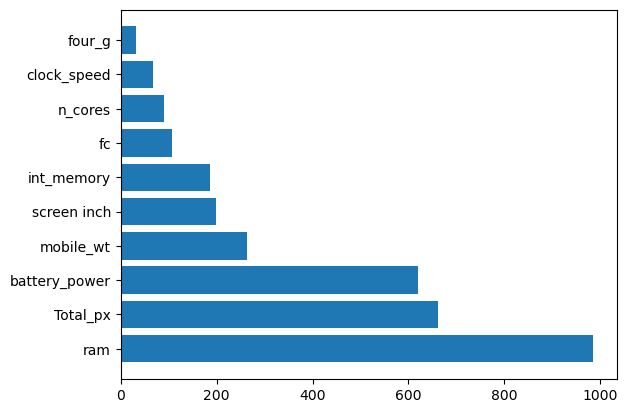

In [271]:
imp_values = lgbm.feature_importances_
imp= pd.DataFrame(data=imp_values,columns=['value'])
imp['name'] = p_train.keys()
top10 = imp.sort_values(by='value',ascending=False)[:10]
plt.barh(top10['name'],top10['value'])

In [311]:
p_test = pd.read_csv("C:\Mobile_Price_Class\\test.csv")

In [312]:
p_test['screen inch'] = p_test['sc_w']*p_test['sc_w'] +p_test['sc_h']*p_test['sc_h']
p_test['screen inch'].astype(float)
p_test['screen inch'] =p_test['screen inch']**(1/2)
p_test['screen inch'] =p_test['screen inch']/2.54
p_test['screen inch'] =round(p_test['screen inch'],2)
## 스크린 크기 소수점 세번째 자리에서 반올림
p_test["Total_px"]= p_test['px_width']*p_test['px_height']
p_test['ram'].astype(float)
p_test['ram'] =p_train['ram']/1000
p_test['ram'] =round(p_train['ram'],1)
## Ram GB단위로 변환하고 소수점 두번째 자리에서 반올림
p_test.drop(['sc_h','sc_w'],axis=1,inplace=True) #스크린 크기는 inch 단위로 변경

p_test.drop(['px_height','px_width'],axis=1,inplace=True) # 픽셀 개수를 통일
p_test.drop(['m_dep','pc','talk_time'],axis=1,inplace=True) # 가격와 관련 없을것 같은 요소 제거
p_test.drop(['id'],axis=1,inplace=True)
p_test[['blue','dual_sim','four_g','three_g','wifi','touch_screen']]=p_test[['blue','dual_sim','four_g','three_g','wifi','touch_screen']].astype('bool')


In [313]:
lgbm = LGBMClassifier(n_estimators=300,early_stopping_round=100,colsample_bytree=0.7,max_depth=11,min_child_samples=50,min_child_weight=1,num_leaves=7)
lgbm.fit(X_train,y_train,eval_set=[(X_test,y_test)])
lgbm_test = lgbm.predict(p_test)


xgb= XGBClassifier(n_estimators=300,early_stopping_rounds=100)
xgb.fit(X_train,y_train,eval_set=[(X_test,y_test)])
xgb_test = xgb.predict(p_test)

gbm = GradientBoostingClassifier(n_estimators=300,max_depth=51,min_samples_leaf=3,min_samples_split=9,learning_rate=0.2)
gbm.fit(X_train,y_train)
gbm_test = gbm.predict(p_test)

rf= RandomForestClassifier(n_estimators=200,max_depth=21,min_samples_leaf=3,min_samples_split=9)
rf.fit(X_train,y_train)
rf_test = rf.predict(p_test)

[1]	valid_0's multi_logloss: 1.21908
[2]	valid_0's multi_logloss: 1.10062
[3]	valid_0's multi_logloss: 1.02538
[4]	valid_0's multi_logloss: 0.964488
[5]	valid_0's multi_logloss: 0.924599
[6]	valid_0's multi_logloss: 0.858984
[7]	valid_0's multi_logloss: 0.81491
[8]	valid_0's multi_logloss: 0.797882
[9]	valid_0's multi_logloss: 0.773119
[10]	valid_0's multi_logloss: 0.73775
[11]	valid_0's multi_logloss: 0.7043
[12]	valid_0's multi_logloss: 0.665476
[13]	valid_0's multi_logloss: 0.665441
[14]	valid_0's multi_logloss: 0.634015
[15]	valid_0's multi_logloss: 0.610151
[16]	valid_0's multi_logloss: 0.586302
[17]	valid_0's multi_logloss: 0.561155
[18]	valid_0's multi_logloss: 0.537856
[19]	valid_0's multi_logloss: 0.520951
[20]	valid_0's multi_logloss: 0.505229
[21]	valid_0's multi_logloss: 0.487367
[22]	valid_0's multi_logloss: 0.477564
[23]	valid_0's multi_logloss: 0.465751
[24]	valid_0's multi_logloss: 0.452747
[25]	valid_0's multi_logloss: 0.441784
[26]	valid_0's multi_logloss: 0.429401
[2

[1]	validation_0-mlogloss:0.80643
[2]	validation_0-mlogloss:0.66632
[3]	validation_0-mlogloss:0.55874
[4]	validation_0-mlogloss:0.48255
[5]	validation_0-mlogloss:0.43271
[6]	validation_0-mlogloss:0.39150
[7]	validation_0-mlogloss:0.35831
[8]	validation_0-mlogloss:0.33754
[9]	validation_0-mlogloss:0.31236
[10]	validation_0-mlogloss:0.29061
[11]	validation_0-mlogloss:0.27436
[12]	validation_0-mlogloss:0.26641
[13]	validation_0-mlogloss:0.25971
[14]	validation_0-mlogloss:0.25230
[15]	validation_0-mlogloss:0.24527
[16]	validation_0-mlogloss:0.24275
[17]	validation_0-mlogloss:0.23516
[18]	validation_0-mlogloss:0.23180
[19]	validation_0-mlogloss:0.22669
[20]	validation_0-mlogloss:0.22300
[21]	validation_0-mlogloss:0.22304
[22]	validation_0-mlogloss:0.22098
[23]	validation_0-mlogloss:0.21821
[24]	validation_0-mlogloss:0.21850
[25]	validation_0-mlogloss:0.21783
[26]	validation_0-mlogloss:0.21812
[27]	validation_0-mlogloss:0.21825
[28]	validation_0-mlogloss:0.21878
[29]	validation_0-mlogloss:0.

In [314]:
p_test['lgbm_classify']=lgbm_test
p_test['gbm_classify'] = gbm_test
p_test['xgb_classify']=xgb_test
p_test['RF_classify']=rf_test

In [315]:
p_test_class = p_test[['lgbm_classify','gbm_classify','xgb_classify','RF_classify']]

In [316]:
p_test_class

,lgbm_classify,gbm_classify,xgb_classify,RF_classify
0,2,2,2,2
1,2,2,2,2
2,3,3,3,3
3,2,2,2,2
4,1,1,1,1
...,...,...,...,...
995,3,3,3,3
996,2,2,2,2
997,0,0,0,0
998,2,2,2,2


<BarContainer object of 10 artists>

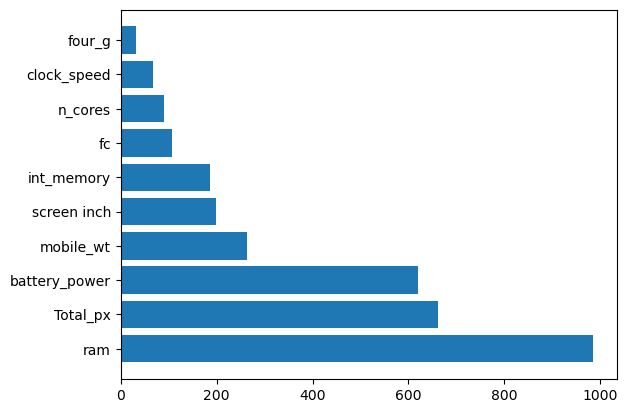

In [317]:
imp_values = lgbm.feature_importances_
imp= pd.DataFrame(data=imp_values,columns=['value'])
imp['name'] = p_train.keys()
top10 = imp.sort_values(by='value',ascending=False)[:10]
plt.barh(top10['name'],top10['value'])

<BarContainer object of 10 artists>

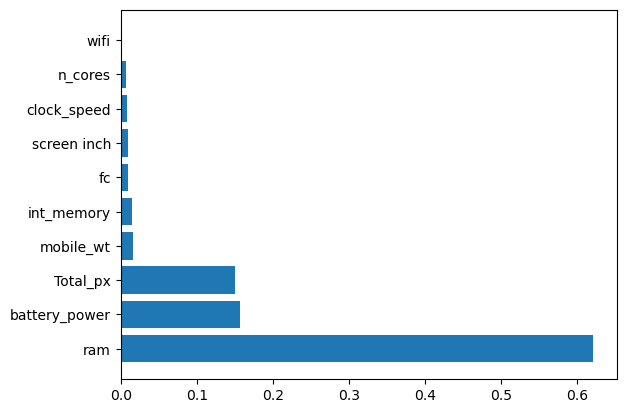

In [318]:
imp_values = gbm.feature_importances_
imp= pd.DataFrame(data=imp_values,columns=['value'])
imp['name'] = p_train.keys()
top10 = imp.sort_values(by='value',ascending=False)[:10]
plt.barh(top10['name'],top10['value'])

<BarContainer object of 10 artists>

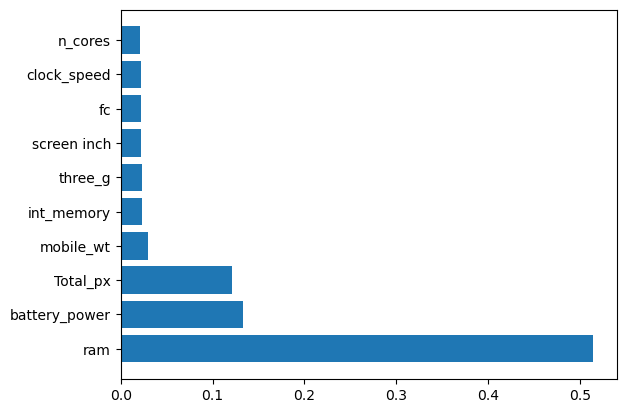

In [319]:
imp_values = xgb.feature_importances_
imp= pd.DataFrame(data=imp_values,columns=['value'])
imp['name'] = p_train.keys()
top10 = imp.sort_values(by='value',ascending=False)[:10]
plt.barh(top10['name'],top10['value'])

<BarContainer object of 10 artists>

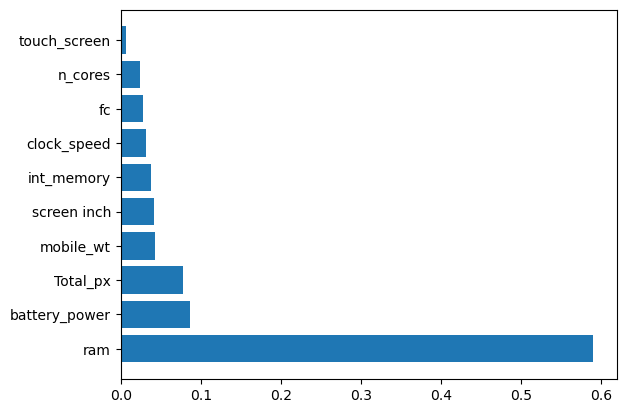

In [320]:
imp_values = rf.feature_importances_
imp= pd.DataFrame(data=imp_values,columns=['value'])
imp['name'] = p_train.keys()
top10 = imp.sort_values(by='value',ascending=False)[:10]
plt.barh(top10['name'],top10['value'])

In [324]:
std= StandardScaler()
not_bool_train =[0,2,4,6,7,8,9,13,14]
data = p_train.iloc[:,not_bool_train]
p_std= std.fit_transform(data,price)
p_scaler= p_train

In [328]:
p_train_feature_namess= ['battery_power','clock speed','fc','int_memory','mobile_wt','n_cores','ram','screen inch','Total_pixel','blue','dual_sim','four_g','three_g','wifi','touch_screen']
p_scaler['battery_power']= p_std[:,0] 
p_scaler['clock_speed']= p_std[:,1]
p_scaler['fc']= p_std[:,2]
p_scaler['int_memory']= p_std[:,3]
p_scaler['mobile_wt']= p_std[:,4]
p_scaler['n_cores']= p_std[:,5]
p_scaler['ram']= p_std[:,6]
p_scaler['screen inch']= p_std[:,7]
p_scaler['Total_px']= p_std[:,8]

In [345]:
p_scaler

,battery_power,blue,clock_speed,dual_sim,fc,four_g,int_memory,mobile_wt,n_cores,ram,three_g,touch_screen,wifi,screen inch,Total_px
0,-0.902597,False,0.830779,False,-0.762495,False,-1.380644,1.349249,-1.101971,0.345605,False,False,True,-0.501748,-1.073033
1,-0.495139,True,-1.253064,True,-0.992890,True,1.155024,-0.120059,-0.664768,0.437742,True,True,False,0.644837,1.077541
2,-1.537686,True,-1.253064,True,-0.532099,True,0.493546,0.134244,0.209639,0.437742,True,True,False,-0.546420,1.521355
3,-1.419319,True,1.198517,False,-0.992890,False,-1.215274,-0.261339,0.646842,0.622015,True,False,False,0.763963,1.526741
4,1.325906,True,-0.395011,False,2.002254,True,0.658915,0.021220,-1.101971,-0.667899,True,True,False,-1.117231,0.673657
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1995,-1.011860,True,-1.253064,True,-0.992890,True,-1.656260,-0.967737,0.646842,-1.312857,True,True,False,-0.074880,1.692859
1996,1.653694,True,1.321096,True,-0.992890,False,0.383299,1.320993,-0.227564,-0.115079,True,True,True,0.173298,1.076137
1997,1.530773,False,-0.762748,True,-0.762495,True,0.217930,-0.911225,1.521249,0.898425,True,True,False,-0.958396,0.616374
1998,0.622527,False,-0.762748,False,-0.071307,True,0.769162,0.134244,0.209639,-1.128583,True,True,True,1.295065,-0.819885


In [331]:
Xs_train, Xs_test,ys_train, ys_test= train_test_split(p_scaler,price,test_size=0.2)

In [333]:
xgb.fit(Xs_train,ys_train,eval_set=[(Xs_test,ys_test)])
xgbs_hat = xgb.predict(Xs_test)
print(accuracy_score(ys_test,xgbs_hat))

[0]	validation_0-mlogloss:1.00553
[1]	validation_0-mlogloss:0.79525
[2]	validation_0-mlogloss:0.64766
[3]	validation_0-mlogloss:0.54602
[4]	validation_0-mlogloss:0.47638
[5]	validation_0-mlogloss:0.42303
[6]	validation_0-mlogloss:0.38886
[7]	validation_0-mlogloss:0.35995
[8]	validation_0-mlogloss:0.33735
[9]	validation_0-mlogloss:0.31980
[10]	validation_0-mlogloss:0.30292
[11]	validation_0-mlogloss:0.29634
[12]	validation_0-mlogloss:0.28822
[13]	validation_0-mlogloss:0.27935
[14]	validation_0-mlogloss:0.26996
[15]	validation_0-mlogloss:0.26597
[16]	validation_0-mlogloss:0.26518
[17]	validation_0-mlogloss:0.26304
[18]	validation_0-mlogloss:0.26018
[19]	validation_0-mlogloss:0.25893
[20]	validation_0-mlogloss:0.26033
[21]	validation_0-mlogloss:0.25767
[22]	validation_0-mlogloss:0.25637
[23]	validation_0-mlogloss:0.25581
[24]	validation_0-mlogloss:0.25747
[25]	validation_0-mlogloss:0.25780
[26]	validation_0-mlogloss:0.25926
[27]	validation_0-mlogloss:0.26040
[28]	validation_0-mlogloss:0.2

In [334]:
lgbm = LGBMClassifier(n_estimators=300,early_stopping_round=100,colsample_bytree=0.7,max_depth=11, min_child_samples=50, min_child_weight=1, num_leaves=7)
lgbm.fit(Xs_train,ys_train,eval_set=[(Xs_test,ys_test)])
lgbms_hat = lgbm.predict(Xs_test)
print(accuracy_score(ys_test,lgbms_hat))

[1]	valid_0's multi_logloss: 1.20952
[2]	valid_0's multi_logloss: 1.07937
[3]	valid_0's multi_logloss: 1.00036
[4]	valid_0's multi_logloss: 0.937123
[5]	valid_0's multi_logloss: 0.894777
[6]	valid_0's multi_logloss: 0.821229
[7]	valid_0's multi_logloss: 0.776671
[8]	valid_0's multi_logloss: 0.756909
[9]	valid_0's multi_logloss: 0.731352
[10]	valid_0's multi_logloss: 0.689958
[11]	valid_0's multi_logloss: 0.652404
[12]	valid_0's multi_logloss: 0.613002
[13]	valid_0's multi_logloss: 0.612253
[14]	valid_0's multi_logloss: 0.579994
[15]	valid_0's multi_logloss: 0.554624
[16]	valid_0's multi_logloss: 0.528729
[17]	valid_0's multi_logloss: 0.506612
[18]	valid_0's multi_logloss: 0.484632
[19]	valid_0's multi_logloss: 0.465957
[20]	valid_0's multi_logloss: 0.451259
[21]	valid_0's multi_logloss: 0.434018
[22]	valid_0's multi_logloss: 0.425509
[23]	valid_0's multi_logloss: 0.413293
[24]	valid_0's multi_logloss: 0.402445
[25]	valid_0's multi_logloss: 0.389825
[26]	valid_0's multi_logloss: 0.38097

In [335]:
rf= RandomForestClassifier(n_estimators=200,max_depth=21,min_samples_leaf=3,min_samples_split=9)
rf.fit(Xs_train,ys_train)
rfs_hat = rf.predict(Xs_test)
print(accuracy_score(ys_test,rfs_hat))

0.89


In [337]:
gbm = GradientBoostingClassifier(n_estimators=300,max_depth=51,min_samples_leaf=3,min_samples_split=9,learning_rate=0.2)
gbm.fit(Xs_train,ys_train)
gbms_hat = gbm.predict(Xs_test)
print(accuracy_score(ys_test,gbms_hat))

0.9075


<BarContainer object of 10 artists>

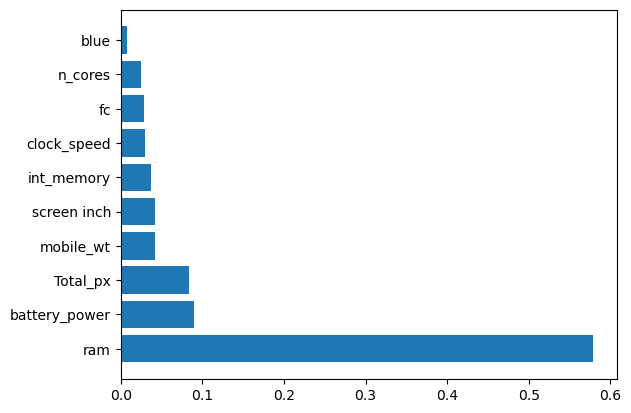

In [340]:
imp_values = rf.feature_importances_
imp= pd.DataFrame(data=imp_values,columns=['value'])
imp['name'] = p_train.keys()
top10 = imp.sort_values(by='value',ascending=False)[:10]
plt.barh(top10['name'],top10['value'])

<BarContainer object of 10 artists>

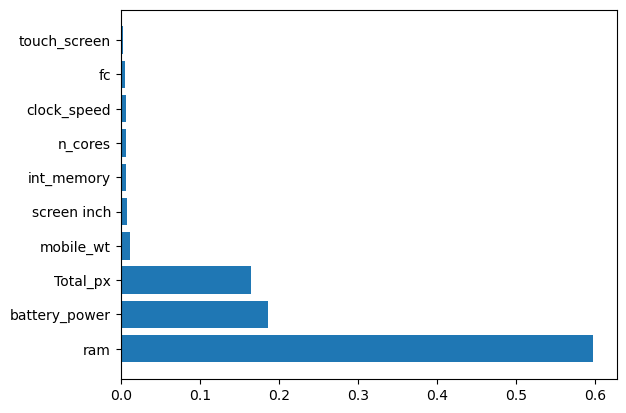

In [341]:
imp_values = gbm.feature_importances_
imp= pd.DataFrame(data=imp_values,columns=['value'])
imp['name'] = p_train.keys()
top10 = imp.sort_values(by='value',ascending=False)[:10]
plt.barh(top10['name'],top10['value'])

<BarContainer object of 10 artists>

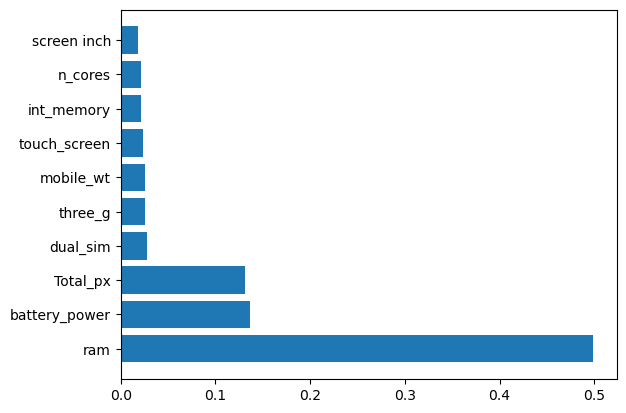

In [342]:
imp_values = xgb.feature_importances_
imp= pd.DataFrame(data=imp_values,columns=['value'])
imp['name'] = p_train.keys()
top10 = imp.sort_values(by='value',ascending=False)[:10]
plt.barh(top10['name'],top10['value'])

<BarContainer object of 10 artists>

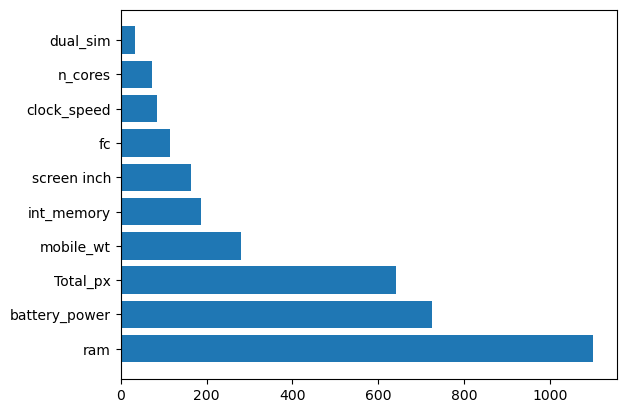

In [343]:
imp_values = lgbm.feature_importances_
imp= pd.DataFrame(data=imp_values,columns=['value'])
imp['name'] = p_train.keys()
top10 = imp.sort_values(by='value',ascending=False)[:10]
plt.barh(top10['name'],top10['value'])